In [1]:
cd "/suphys/aloe8475"


/suphys/aloe8475


In [2]:
cd "Documents/edamame"

/import/silo2/aloe8475/Documents/edamame


# Genetic Evolution

1) Load best performing Nonlinear Transformation ASN networks from the first 300 networks

2) Find parameters of those networks

3) Generate 10 new networks for each of those networks with different seeds

4) Repeat Nonlinear Transformation Task

In [3]:
#Imports + Functions
from scipy.io import loadmat, savemat
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from edamame import *
from tqdm import tqdm_notebook
import os
import edamame.core.wires as wires
from random import choice
from IPython.core.debugger import set_trace
import nct
import bct
import pickle 
import _pickle as cPickle
import gzip
#warnings.filterwarnings('ignore')

In [4]:
def compressed_pickle(obj, filename,protocol=-1):
    with gzip.open(filename, 'wb') as f:
        cPickle.dump(obj, f, protocol)
def decompress_pickle(file):
    with gzip.open(file, 'rb') as f:
        loaded_object = cPickle.load(f)
        return loaded_object

In [5]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [6]:
#Select Largest Components
def select_largest_component_new(wires_dict):
    """
    Find and select largest connected component of the original graph G.
    Throws away unconnected components and updates all the keys in wires_dict 
    """
#     def connected_component_subgraphs(G):
#         for c in nx.connected_components(G):
#             yield G.subgraph(c)
    
    wires_dict['G'] = max(connected_component_subgraphs(wires_dict['G']), key=len)
#     set_trace()
    nw = len(wires_dict['G'].nodes())
    nj = len(wires_dict['G'].edges())   
    
    logging.info("The largest component has %5d nodes and %6d edges", nw, nj)

    # Replace values in the dictionary
    wires_dict['number_of_wires']     = nw
    wires_dict['number_of_junctions'] = nj
    wires_dict['xa'] = wires_dict['xa'][wires_dict['G'].nodes()] 
    wires_dict['ya'] = wires_dict['ya'][wires_dict['G'].nodes()] 
    wires_dict['xb'] = wires_dict['xb'][wires_dict['G'].nodes()] 
    wires_dict['yb'] = wires_dict['yb'][wires_dict['G'].nodes()]
    wires_dict['xc'] = wires_dict['xc'][wires_dict['G'].nodes()] 
    wires_dict['yc'] = wires_dict['yc'][wires_dict['G'].nodes()]
 
    # Keep old edge_list
    old_edge_list = [(ii, kk) for ii, kk in  zip(wires_dict['edge_list'][:, 0], wires_dict['edge_list'][:, 1])]
    # Remove old edge list
    wires_dict = wires.remove_key(wires_dict, 'edge_list') 
    # Save indices of intersections in the old graph
    ind_dict = {key:value for value,key in enumerate(old_edge_list)}
    new_edge_list = sorted([kk if kk[0] < kk[1] else (kk[1], kk[0]) for kk in wires_dict['G'].edges()], key=lambda x: x[0])
    # Find intersection between the two sets
    inter = set(ind_dict).intersection(new_edge_list)
    # Retrieve edge indices/positions from the old list
    edges_idx = [ind_dict[idx] for idx in inter]
       
    # These have length equal to number of junctions -- only get the ones we need
    wires_dict['xi'] = wires_dict['xi'][edges_idx] 
    wires_dict['yi'] = wires_dict['yi'][edges_idx] 
    
    # Get contiguous numbering of nodes
    # Build node mapping 
    node_mapping    = {key:value for value, key in enumerate(sorted(wires_dict['G'].nodes()))}
    # This  step also renames edges list
    wires_dict['G'] =  nx.relabel_nodes(wires_dict['G'] , node_mapping)

    # Swap node vertices if vertex 0 is larger than vertex 1, then sort by first element
    wires_dict['edge_list'] = np.asarray(sorted([kk if kk[0] < kk[1] else (kk[1], kk[0]) for kk in wires_dict['G'].edges()], key=lambda x: x[0]))
    
    # Save adjacency matrix of new graph
    wires_dict = wires.remove_key(wires_dict, 'adj_matrix') 
    wires_dict = wires.generate_adj_matrix(wires_dict)

    wire_distances = wires.cdist(np.array([wires_dict['xc'], wires_dict['yc']]).T, np.array([wires_dict['xc'], wires_dict['yc']]).T, metric='euclidean')    
    wires_dict['wire_distances'] = wire_distances

    return wires_dict 

In [7]:
#Load ASN networks with Nonlinear Transformation 

name='/import/silo2/aloe8475/Documents/CODE/Analysis/Functional Connectivity/Functional Tasks/networks_LinearTransformation.pkl'
print('Loading Networks + Nonlinear Transformation Results')
file = open(name, 'rb')
#     [ASN300,cluster1,cluster2,cluster3,time_index,nodesList] = pickle.load(file)
#     [ASN300,cluster1,cluster2,cluster3] = pickle.load(file)
[ASN300] = pickle.load(file)

print('Loaded')

Loading Networks + Nonlinear Transformation Results
Loaded


In [8]:
#Find Accuracies

asn_acc=[]
for i in range(len(ASN300)):
    for j in range(len(ASN300[i])):
        asn_acc.append(np.nanmax(ASN300[i][j]['Accuracy']['Linear Transformation']))
        
#Sort Accuracy
idx_acc=np.argsort(asn_acc)
sorted_acc=np.sort(asn_acc) #min to max

#Find top 5% accuracies
percent=int(len(idx_acc)*0.05)
topAcc_idx=idx_acc[-percent:]
topAcc=sorted_acc[-percent:]

#Find indexes of those accuracies
MaxAcc=[]        
for i in range(len(topAcc_idx)):
    if topAcc_idx[i] >= 100: 
        MaxAcc.append([int(float(topAcc_idx[i])/10),list(map(int, str(topAcc_idx[i])))[-1]])
    elif topAcc_idx[i] <10: 
        MaxAcc.append([0, list(map(int, str(topAcc_idx[i])))[-1]])
    else:
        MaxAcc.append(list(map(int, str(topAcc_idx[i]))))


In [9]:
#Find network Parameters:
centroid=[]
wire_length=[]
wire_dispersion=[]
for i in range(len(MaxAcc)):
    centroid.append(ASN300[MaxAcc[i][0]][MaxAcc[i][1]]['centroid_dispersion'])
    wire_length.append(ASN300[MaxAcc[i][0]][MaxAcc[i][1]]['avg_length'])
    wire_dispersion.append(ASN300[MaxAcc[i][0]][MaxAcc[i][1]]['dispersion'])


In [10]:
numNetworks=10

#Generate 10 new networks for each combination of parameters:
#This is without any random changes to parameters (re: evolution)
numNetworks=10
params=[]
seeds=[]
for i in range(len(MaxAcc)):
    for j in range(numNetworks):
        params.append([centroid[i], wire_length[i], wire_dispersion[i]])
        seeds.append(np.random.randint(100000))

if (not os.path.isfile('Evolution_NonlinearTransformation.pkl')): #if we haven't saved the file

    ASN=[[None]*numNetworks for i in range(len(MaxAcc))]

    # Generate Networks:
    count=0
    for i in tqdm(range(len(MaxAcc))):
        for j in range(numNetworks):
            temp=wires.generate_wires_distribution(300,this_seed=seeds[count],wire_dispersion=params[count][2],centroid_dispersion=params[count][0],wire_av_length=params[count][1])
            temp=wires.detect_junctions(temp)
            temp=wires.generate_adj_matrix(temp)
            temp=wires.generate_graph(temp)
            temp=select_largest_component_new(temp)
            count = count+1
            counter1=0
            # if number of nodes is less than 277, try 10 new seeds to get more than 277
            while temp['G'].number_of_nodes() <277 and counter1<=10: #if nodes are less than 277, try the same parameters again for 10 more times before moving on to the next parameter
                temp=wires.generate_wires_distribution(300,this_seed=np.random.randint(100000),wire_dispersion=params[count][2],centroid_dispersion=params[count][0],wire_av_length=params[count][1])
                temp=wires.detect_junctions(temp)
                temp=wires.generate_adj_matrix(temp)
                temp=wires.generate_graph(temp)
                temp=select_largest_component_new(temp)
                counter1=counter1+1

            if temp['G'].number_of_nodes()>=277: #only networks with more than 277 nodes
                ASN[i][j]=temp         

    #set up accuracy dictionary for ASN
    numberOfNodeTests=6
    if (not os.path.isfile('Evolution_NonlinearTransformation.pkl')): #if we haven't saved the file
        for i in range(len(ASN)):
            for j in range(len(ASN[i])):
                ASN[i][j].update({'Accuracy':{'Linear Transformation':[None]*numberOfNodeTests,'Memory Capacity':[]},'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}})            
    #Save networks so we don't have to run this every time
    name='Evolution_NonlinearTransformation.pkl'
    with open(name, 'wb') as f:
        pickle.dump([ASN], f)
else:
    name='Evolution_NonlinearTransformation.pkl'
    print('Loading Networks + Nonlinear Transformation Results')
    file = open(name, 'rb')
#     [ASN300,cluster1,cluster2,cluster3,time_index,nodesList] = pickle.load(file)
#     [ASN300,cluster1,cluster2,cluster3] = pickle.load(file)
    [ASN] = pickle.load(file)
    print('Loaded')

Loading Networks + Nonlinear Transformation Results
Loaded


In [11]:
# #export adj matrices to calculate small worldness in matlab:
# adj_mats={"AdjMat":[[None]*len(ASN[0]) for i in range(len(ASN))]}
# for i in range(len(ASN)):
#     for j in range(len(ASN[i])):
#         adj_mats['AdjMat'][i][j]=(ASN[i][j]['adj_matrix'])
# savemat('/import/silo2/aloe8475/Documents/CODE/Analysis/Functional Connectivity/Functional Tasks/300nwASN_Evolution_multipleNetworks.mat',adj_mats)
# #C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks\

In [12]:
# Small Worldness: 
# ------------------------------------
# CALCULATED IN MATLAB: smallworldness.m 
# found in C:\Users\aloe8475\Documents\PhD\GitHub\CODE\Analysis\Functional Connectivity\Functional Tasks
# ------------------------------------
temp=loadmat('/import/silo2/aloe8475/Documents/CODE/Analysis/Functional Connectivity/Functional Tasks/300nwASN_Evolution_multipleNetworks_smallworld.mat')
smallworld=temp['smallworld']
del temp

In [13]:
#Graph Theory
if (not os.path.isfile('Evolution_NonlinearTransformation.pkl')): #if we haven't saved the file
    # Modularity, PCoeff, Small Worldness & MZ:
    ci = []
    pcoeff= []
    mz= []
    clustering = []
    for i in tqdm(range(len(ASN))):
        for j in tqdm(range(len(ASN[i]))):
            ci,q=nct.community_louvain(ASN[i][j]['adj_matrix'])
            pcoeff=bct.participation_coef(ASN[i][j]['adj_matrix'],ci)
            mz=bct.module_degree_zscore(ASN[i][j]['adj_matrix'],ci)
            clustering=nx.clustering(ASN[i][j]['G'])
            ASN[i][j]['Graph Theory']['PL']=dict(nx.all_pairs_shortest_path_length(ASN[i][j]['G']))
            ASN[i][j]['Graph Theory']['Modularity']=ci
            ASN[i][j]['Graph Theory']['Modularity Score']=q
            ASN[i][j]['Graph Theory']['PCoeff']=pcoeff
            ASN[i][j]['Graph Theory']['MZ']=mz
            ASN[i][j]['Graph Theory']['Small World']=smallworld[i][j]
            ASN[i][j]['Graph Theory']['CCoeff']=clustering
            ASN[i][j]['Graph Theory']['Degree']=nx.degree(ASN[i][j]['G'])
            ASN[i][j]['Graph Theory']['AvgPL']=nx.average_shortest_path_length(ASN[i][j]['G'])
    #Save networks so we don't have to run this every time
    name='Evolution_NonlinearTransformation.pkl'
    with open(name, 'wb') as f:
        pickle.dump([ASN], f)   
else:
    print('Graph Theory Already Loaded')

Graph Theory Already Loaded


In [14]:
# Run Nonlinear Transformation Task Again:

#Threshold by conductance - when tunnelling becomes appreciable (offResistance * 10)

def getOnGraph(network, this_TimeStamp = 0):
    edgeList = network.connectivity.edge_list
    adjMat = np.zeros((network.numOfWires, network.numOfWires))
#     set_trace()
    adjMat[edgeList[:,0], edgeList[:,1]] = (1/network.junctionResistance[this_TimeStamp,:])>1e-06#network.junctionSwitch[this_TimeStamp,:] #CHANGE THIS TO CONDUCTANCE THRESHOLD?
    adjMat[edgeList[:,1], edgeList[:,0]] = (1/network.junctionResistance[this_TimeStamp,:])>1e-06#network.junctionSwitch[this_TimeStamp,:] #CHANGE THIS TO CONDUCTANCE THRESHOLD?
    onGraph = nx.from_numpy_array(adjMat)
    onGraph=nx.DiGraph.to_undirected(onGraph)
    
    return onGraph

def getSubGraphComm(network, this_TimeStamp = 0):
    onGraph = getOnGraph(network, this_TimeStamp)
    components = [i for i in nx.connected_components(onGraph)]
    giant_component = components[np.argmax([len(i) for i in nx.connected_components(onGraph)])]
    nodes = list(giant_component)
    commMat = np.zeros((network.numOfWires, network.numOfWires))
    subComm = nx.communicability(onGraph.subgraph(giant_component))
    for i in nodes:
        for j in nodes:
            commMat[i,j] = subComm[i][j]
    return commMat



In [15]:
if (not os.path.isfile('Evolution_NonlinearTransformation.pkl')): #if we haven't saved the file
    onAmp=[[] for i in range(len(ASN))]
    shortestPath=[[None]*numNetworks for i in range(len(ASN))]
    for i in tqdm(range(len(ASN))):
        for j in range(len(ASN[i])):
            temp=getFarthestPairing(ASN[i][j]['adj_matrix'])
            shortestPath[i][j]=nx.shortest_path_length(ASN[i][j]['G'],temp[0],temp[1])
            onAmp[i].append(shortestPath[i][j]/5) #need to justify divide by 5 or come up with some other way
            ASN[i][j]['sp_amp']=onAmp[i][j]
            ASN[i][j]['Graph Theory']['Shortest Path']=shortestPath[i][j]

    name='Evolution_NonlinearTransformation.pkl'
    with open(name, 'wb') as f:
        pickle.dump([ASN], f)

In [16]:
def nonlineartrans(network,onAmp,i,j,nodesList,stimulus):
    dt = 1e-2
    f=0.5
    Time=5
    period=1/f
   #Instantiate Variables    
    print('Running Linear Transformation Simulations')
    dt = 1e-2
    f=0.5
    Time=5

    #Choose Electrode Pattern
    stimulus[0][i].append((stimulus__(biasType='AC',onAmp=onAmp,TimeVector=np.arange(0,Time,dt),f=f)))
    stimulus[1][i].append((stimulus__(biasType='Drain',TimeVector=np.arange(0,Time,dt)))) #we don't want this drain to be active during training

    #Initialise Output Variables
    period=[]
    TimeVector=[]
    voltage=[]
    conductance=[]
    switches=[]
    #Run Simulations
#     print('Parameter ' + str(i+1), ', Network ' + str(j+1))
    #Run Simulations
#     results=[]
    # Connectivity=connectivity__('700nw_14533junctions.mat')
    stimulus2 = [item for item in stimulus] #go through each list in the list and find the ith item
#     set_trace()
    results_ASN=runSim(connectivity__(wires_dict=network[i][j]),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp, biasType='AC',f=f,junctionMode='tunneling')
    #wires_dict=newNetworkTest[chosenNetwork])
    results_ASN.frequency=f
    results_ASN.dt=0.001
    period=1/f  

#     name= r'/import/silo2/aloe8475/Documents/CODE/Data/Functional Connectivity/Evolution_Sims_NonlinearTransformation_' + str(i) +'_'+str(j)
#     compressed_pickle([results_ASN],name)

#     print('Regressing Parameter ' + str(i+1), ', Network ' + str(j+1))
    TimeVector=results_ASN.TimeVector
    voltage=results_ASN.wireVoltage
    conductance=results_ASN.conductance
    switches=results_ASN.junctionSwitch

    target1= (onAmp * (-np.sign(TimeVector % period - period/2)))
#             target2[j] = (4*onAmp[i]/period * abs((TimeVector-period/4) % period - period/2) - onAmp[i])
#             target3[j] = (onAmp[i]/period * (TimeVector % period))
#             target4[j] = (onAmp[i]*np.sin(4*np.pi*(1/period)*TimeVector))

    if len(network[i][j]['G']) >= 250:
        nodesList[i][j]=[50,100,150,200,250,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)
    elif len(network[i][j]['G']) >= 200 and len(network[i][j]['G']) < 250:
        nodesList[i][j]=[50,100,150,200,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
    elif len(network[i][j]['G']) >= 150 and len(network[i][j]['G']) < 200:
        nodesList[i][j]=[50,100,150,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
    elif len(network[i][j]['G']) >= 100 and len(network[i][j]['G']) < 150:
        nodesList[i][j]=[50,100,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)
    
    nwSqu =[None]*len(nodesList[i][j])
    countK=0
    for k in nodesList[i][j]: #loop through sets of nodes for regression
        print('Running Regression: ' + str(k) + ' nodes')
        ResultSqu=[]
        ResultSqu = nonLinearTrans(results_ASN,'Square',k, repeats=50) #simulation, type of signal, number of nodes to sample from, number of linear regression repetitions (take avg)
        nwSqu[countK]=ResultSqu['accuracy']
        countK=countK+1
            #Save networks so we don't have to run this every time
            
    accRandom=nwSqu
    return accRandom                

In [17]:
nodesList=[[None]*numNetworks for i in range(len(ASN))]
stimulus=[[[] for i in range(len(ASN))],[[] for i in range(len(ASN))]]
init=[]
for i in tqdm(range(len(ASN))):
    for j in range(len(ASN[i])):
        init.append(inputPacker(nonlineartrans,ASN,ASN[i][j]['sp_amp'],i,j,nodesList,stimulus))

In [18]:
results=para_run(nonlineartrans,init,nCPU=10)

Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 18:10:02,664:INFO:First current path [154, 75, 208, 53, 133, 103, 290, 26, 15, 216, 221] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes

Running Linear Transformation Simulations


Running Regression: 200 nodes



2020-08-15 18:10:08,602:INFO:First current path [13, 194, 192, 68, 257, 229, 119, 223, 266, 118] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes

Running Regression: 250 nodes


2020-08-15 18:10:10,245:INFO:First current path [174, 100, 281, 64, 25, 288, 123, 58, 171, 10, 18] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes

Running Regression: 200 nodes


2020-08-15 18:10:12,956:INFO:First current path [150, 248, 294, 271, 232, 261, 169, 178, 202, 290, 78] formed at time = 0.757 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.
Running Regression: 100 nodes


2020-08-15 18:10:13,545:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 296 nodes
Running Regression: 150 nodes

Running Regression: 150 nodes


2020-08-15 18:10:15,502:INFO:First current path [14, 186, 190, 22, 122, 192, 293, 277, 19, 116, 215, 152] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes

Running Regression: 200 nodes


2020-08-15 18:10:17,378:INFO:First current path [18, 71, 275, 247, 155, 41, 29, 32, 139, 43] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes

Running Regression: 250 nodes


2020-08-15 18:10:20,667:INFO:First current path [94, 3, 113, 228, 257, 51, 203, 217, 46, 123, 246] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 296 nodes

Running Regression: 250 nodes


2020-08-15 18:10:23,910:INFO:First current path [57, 99, 40, 119, 85, 215, 293, 180, 117, 181, 127] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes



Running Regression: 250 nodes


2020-08-15 18:10:25,729:INFO:First current path [28, 31, 17, 244, 15, 51, 280, 123, 73, 44] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 297 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 18:10:43,479:INFO:First current path [40, 233, 126, 170, 130, 30, 119, 98] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations



Running Regression: 250 nodes


2020-08-15 18:10:50,812:INFO:First current path [132, 34, 25, 187, 46, 210, 7, 29] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations



Running Regression: 150 nodes


2020-08-15 18:10:52,864:INFO:First current path [59, 19, 70, 268, 127, 49, 260, 85] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes

Running Regression: 300 nodes


2020-08-15 18:10:55,309:INFO:First current path [12, 220, 237, 205, 134, 102, 152] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes

Running Regression: 200 nodes


2020-08-15 18:10:57,203:INFO:First current path [2, 106, 36, 255, 165, 17, 123] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes

Running Regression: 250 nodes


2020-08-15 18:11:01,058:INFO:First current path [86, 92, 259, 197, 114, 58, 24, 279] formed at time = 0.91 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes



2020-08-15 18:11:04,536:INFO:First current path [18, 176, 253, 197, 81, 137, 15, 143] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes

Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes


2020-08-15 18:11:05,605:INFO:First current path [39, 209, 112, 182, 78, 1, 100, 196] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes

Running Regression: 200 nodes


2020-08-15 18:11:08,976:INFO:First current path [61, 280, 2, 94, 157, 82, 148, 281] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 250 nodes

Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 18:11:10,264:INFO:First current path [111, 121, 98, 119, 274, 4, 259, 145] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes



2020-08-15 18:11:23,367:INFO:First current path [268, 72, 10, 133, 41, 260, 109, 49, 185] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:11:31,856:INFO:First current path [16, 273, 101, 244, 219, 86, 181, 146, 179] formed at time = 0.85 s.


Running Regression: 50 nodes

Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 18:11:32,498:INFO:First current path [27, 88, 166, 89, 275, 238, 116, 31] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes

Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 18:11:34,351:INFO:First current path [31, 97, 228, 28, 159, 29, 216, 126, 206] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes

Running Regression: 200 nodes


2020-08-15 18:11:38,626:INFO:First current path [259, 187, 51, 65, 197, 129, 38, 173, 196] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes


2020-08-15 18:11:41,470:INFO:First current path [1, 41, 22, 220, 187, 123, 88, 52] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes

Running Regression: 300 nodes


2020-08-15 18:11:44,268:INFO:First current path [112, 284, 22, 63, 297, 29, 258, 30, 26] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes



2020-08-15 18:11:47,411:INFO:First current path [70, 112, 121, 221, 124, 240, 260, 298, 60] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes



2020-08-15 18:11:50,560:INFO:First current path [26, 109, 29, 145, 2, 47, 106, 298] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes



2020-08-15 18:11:51,982:INFO:First current path [8, 176, 31, 228, 33, 249, 159, 45] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 18:12:03,072:INFO:First current path [8, 231, 103, 226, 182, 222, 290, 252, 297] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 297 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:12:12,411:INFO:First current path [12, 13, 106, 250, 51, 54, 190, 36, 167] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes



2020-08-15 18:12:15,026:INFO:First current path [31, 211, 214, 215, 19, 287, 168, 178, 113] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 100 nodes

Running Regression: 200 nodes


2020-08-15 18:12:16,738:INFO:First current path [237, 263, 75, 29, 196, 288, 258, 199, 145, 163] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes



2020-08-15 18:12:18,418:INFO:First current path [43, 120, 288, 196, 41, 116, 231, 13, 60, 9] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes



2020-08-15 18:12:22,197:INFO:First current path [67, 117, 224, 233, 56, 46, 57, 49, 74] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes

Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 18:12:24,382:INFO:First current path [259, 209, 24, 201, 232, 111, 60, 155, 130] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes



2020-08-15 18:12:26,934:INFO:First current path [195, 181, 102, 187, 94, 284, 124, 239, 53] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes

Running Regression: 250 nodes


2020-08-15 18:12:30,324:INFO:First current path [9, 117, 246, 260, 128, 289, 132, 115] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes



2020-08-15 18:12:33,063:INFO:First current path [4, 79, 214, 150, 24, 38, 74, 55] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:12:42,172:INFO:First current path [248, 29, 241, 30, 279, 147, 159, 156, 120, 135] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:12:51,400:INFO:First current path [221, 116, 12, 200, 281, 158, 179, 92, 208, 182] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes

Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 18:12:54,984:INFO:First current path [195, 40, 184, 207, 135, 60, 100, 0, 295, 246, 50] formed at time = 0.849 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes



2020-08-15 18:12:56,788:INFO:First current path [193, 103, 40, 162, 266, 272, 207, 222, 269, 227] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes

Running Regression: 250 nodes


2020-08-15 18:12:58,423:INFO:First current path [56, 92, 100, 254, 38, 265, 225, 41, 158, 237] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes



2020-08-15 18:13:01,483:INFO:First current path [37, 46, 82, 202, 41, 118, 103, 6, 43, 236, 100] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes

Running Linear Transformation Simulations


2020-08-15 18:13:03,757:INFO:First current path [221, 215, 95, 18, 142, 63, 154, 131, 20, 69, 252, 32] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes



2020-08-15 18:13:06,331:INFO:First current path [9, 129, 171, 222, 25, 261, 264, 86, 148, 247] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes



2020-08-15 18:13:08,827:INFO:First current path [151, 158, 228, 105, 166, 248, 204, 266, 104, 107] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 296 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes


2020-08-15 18:13:11,744:INFO:First current path [30, 88, 289, 161, 175, 180, 47, 46, 82, 133] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 18:13:21,379:INFO:First current path [190, 247, 210, 132, 265, 174, 54, 249, 39, 110] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 18:13:29,828:INFO:First current path [102, 207, 272, 223, 246, 224, 13, 237, 181, 42, 287] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes



2020-08-15 18:13:34,926:INFO:First current path [7, 106, 59, 263, 276, 2, 193, 275, 52] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes



2020-08-15 18:13:38,514:INFO:First current path [86, 101, 128, 237, 243, 254, 236, 51, 286] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes



2020-08-15 18:13:40,699:INFO:First current path [1, 37, 59, 25, 53, 30, 51, 200, 126] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes

Running Linear Transformation Simulations


Running Regression: 200 nodes

Unfortunately, only 0 current paths found in simulation time.


2020-08-15 18:13:45,490:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 18:13:45,625:INFO:First current path [4, 3, 108, 55, 155, 36, 277, 57, 103, 31] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes

Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 18:13:47,597:INFO:First current path [127, 116, 182, 216, 228, 21, 79, 267, 93, 257] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes

Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 18:13:50,051:INFO:First current path [35, 31, 143, 63, 87, 116, 228, 239, 145, 214] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 18:13:52,451:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes



2020-08-15 18:14:01,692:INFO:First current path [66, 126, 219, 9, 8, 111, 278, 86] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes

Running Linear Transformation Simulations


2020-08-15 18:14:09,882:INFO:First current path [103, 136, 264, 156, 250, 15, 60, 88] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes

Running Linear Transformation Simulations


2020-08-15 18:14:14,626:INFO:First current path [9, 233, 266, 13, 4, 39, 76, 265] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes

Running Regression: 200 nodes


2020-08-15 18:14:19,133:INFO:First current path [190, 74, 181, 42, 228, 289, 293, 61] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes

Running Regression: 250 nodes


2020-08-15 18:14:22,502:INFO:First current path [56, 54, 18, 240, 131, 61, 243, 0] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes

Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 18:14:27,121:INFO:First current path [26, 177, 102, 107, 188, 146, 291, 84] formed at time = 0.773 s.


Running Regression: 50 nodes

Running Regression: 100 nodes


2020-08-15 18:14:28,306:INFO:First current path [56, 136, 28, 33, 169, 84, 243, 222] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes

Running Regression: 200 nodes


2020-08-15 18:14:31,319:INFO:First current path [4, 162, 170, 130, 97, 160, 115, 37] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes

Running Regression: 200 nodes


2020-08-15 18:14:32,752:INFO:First current path [229, 173, 32, 91, 225, 125, 96, 186] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes

Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 18:14:36,240:INFO:First current path [15, 17, 178, 287, 33, 257, 30] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes



2020-08-15 18:14:42,267:INFO:First current path [31, 15, 150, 9, 8, 201, 195] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:14:51,339:INFO:First current path [1, 51, 133, 212, 96, 256, 128] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations



Running Regression: 300 nodes


2020-08-15 18:14:55,266:INFO:First current path [16, 282, 222, 147, 190, 230, 74] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes



2020-08-15 18:15:01,319:INFO:First current path [119, 130, 164, 42, 35, 192, 187] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes



2020-08-15 18:15:04,938:INFO:First current path [117, 296, 73, 89, 3, 67, 126] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes

Running Regression: 300 nodes


2020-08-15 18:15:07,870:INFO:First current path [56, 219, 116, 8, 74, 122, 152, 169] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes



2020-08-15 18:15:10,649:INFO:First current path [25, 70, 293, 197, 231, 201, 62] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes

Running Linear Transformation Simulations


2020-08-15 18:15:13,211:INFO:First current path [90, 171, 104, 112, 127, 178, 166] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes



2020-08-15 18:15:14,449:INFO:First current path [73, 91, 134, 24, 223, 148, 184] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes



2020-08-15 18:15:18,050:INFO:First current path [36, 174, 247, 255, 30, 148, 114] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes

Running Regression: 300 nodes


2020-08-15 18:15:23,136:INFO:First current path [7, 117, 272, 175, 119, 86] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations



2020-08-15 18:15:34,294:INFO:First current path [29, 207, 129, 206, 185, 154] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes

Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 18:15:41,552:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations



Running Regression: 200 nodes


2020-08-15 18:15:45,474:INFO:First current path [0, 7, 113, 81, 59, 151] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes

Running Regression: 150 nodes


2020-08-15 18:15:47,601:INFO:First current path [0, 148, 30, 203, 277, 37] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes



2020-08-15 18:15:49,375:INFO:First current path [14, 144, 258, 251, 165, 20] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes



2020-08-15 18:15:52,634:INFO:First current path [13, 40, 249, 12, 157, 160] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes



2020-08-15 18:15:56,022:INFO:First current path [125, 218, 12, 285, 22, 153, 57] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes

Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 18:15:58,072:INFO:First current path [206, 289, 277, 148, 166, 49, 2] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes

Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 18:16:00,289:INFO:First current path [130, 78, 221, 229, 200, 103, 63, 64, 30, 94, 34, 5] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes

Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 18:16:02,593:INFO:First current path [6, 160, 169, 247, 185, 20] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 18:16:15,909:INFO:First current path [7, 237, 31, 276, 222, 273, 106, 45, 11, 203, 142, 259] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes



2020-08-15 18:16:18,898:INFO:First current path [47, 190, 180, 294, 226, 89, 106, 270, 18, 140, 11] formed at time = 0.916 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 18:16:25,146:INFO:First current path [45, 11, 84, 97, 38, 241, 98, 94, 183, 147, 146] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes



2020-08-15 18:16:27,540:INFO:First current path [173, 151, 14, 186, 279, 218, 195, 49, 88, 238, 25, 113] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes

Running Regression: 200 nodes
Running Regression: 150 nodes



2020-08-15 18:16:30,289:INFO:First current path [121, 286, 265, 285, 95, 292, 147, 181, 124, 102, 223, 1] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 296 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes

Running Regression: 250 nodes


2020-08-15 18:16:35,475:INFO:First current path [85, 227, 289, 149, 268, 9, 68, 123, 157, 246, 182] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes



2020-08-15 18:16:37,387:INFO:First current path [118, 33, 270, 22, 245, 217, 16, 94, 207, 133, 144] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 18:16:37,479:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 295 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes

Running Regression: 200 nodes


2020-08-15 18:16:39,931:INFO:First current path [77, 135, 233, 97, 282, 168, 253, 29, 73, 102, 297] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes

Running Regression: 250 nodes


2020-08-15 18:16:43,928:INFO:First current path [139, 99, 173, 77, 5, 134, 11, 117, 122, 128] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 296 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations



Running Regression: 298 nodes


2020-08-15 18:16:56,293:INFO:First current path [254, 243, 69, 216, 135, 143, 108, 276, 253, 92, 238] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 100 nodes

Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 18:17:05,819:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 18:17:07,262:INFO:First current path [58, 163, 27, 116, 25, 194, 59, 193, 280] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 18:17:09,692:INFO:First current path [193, 13, 88, 234, 1, 236, 228, 169, 5, 168] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-15 18:17:09,860:INFO:First current path [68, 55, 129, 137, 21, 140, 275, 81, 156, 66] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes

Running Regression: 250 nodes



2020-08-15 18:17:15,933:INFO:First current path [240, 234, 138, 34, 250, 152, 14, 180, 109, 8] formed at time = 0.831 s.


Running Regression: 50 nodes


2020-08-15 18:17:16,128:INFO:First current path [254, 65, 276, 130, 297, 194, 247, 66, 249, 161] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes

Running Regression: 299 nodes


2020-08-15 18:17:17,563:INFO:First current path [112, 45, 14, 282, 72, 97, 1, 90, 87, 6, 42] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations



Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 18:17:20,272:INFO:First current path [115, 60, 234, 74, 62, 270, 292, 268, 162, 299] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes

Running Regression: 250 nodes


2020-08-15 18:17:26,441:INFO:First current path [58, 294, 185, 130, 257, 280, 233, 7] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations



Running Regression: 300 nodes


2020-08-15 18:17:39,631:INFO:First current path [34, 72, 76, 271, 141, 84, 181] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 18:17:46,007:INFO:First current path [1, 57, 115, 17, 230, 21, 18] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations



Running Regression: 200 nodes


2020-08-15 18:17:49,976:INFO:First current path [27, 74, 65, 145, 3, 299, 87] formed at time = 0.757 s.


Running Regression: 50 nodes

Running Regression: 100 nodes


2020-08-15 18:17:50,601:INFO:First current path [102, 104, 75, 280, 29, 69, 226] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes

Running Regression: 200 nodes


2020-08-15 18:17:54,340:INFO:First current path [33, 245, 227, 222, 167, 183, 268] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes


2020-08-15 18:17:57,603:INFO:First current path [19, 88, 226, 86, 261, 177, 163] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes



2020-08-15 18:17:59,227:INFO:First current path [42, 2, 278, 145, 285, 77, 183] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes



2020-08-15 18:18:01,438:INFO:First current path [32, 144, 255, 296, 228, 191, 29] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes

Running Regression: 300 nodes


2020-08-15 18:18:03,322:INFO:First current path [23, 68, 60, 136, 45, 39, 270] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes



2020-08-15 18:18:12,103:INFO:First current path [0, 161, 236, 3] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations



Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 18:18:24,952:INFO:First current path [0, 48, 148, 49] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 18:18:29,184:INFO:First current path [0, 178, 45, 30] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes

Running Linear Transformation Simulations


2020-08-15 18:18:35,184:INFO:First current path [1, 133, 222, 15] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 18:18:35,645:INFO:First current path [0, 30, 68, 49] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes

Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 18:18:39,959:INFO:First current path [281, 87, 53, 197, 138] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes

Running Regression: 150 nodes


2020-08-15 18:18:42,531:INFO:First current path [0, 263, 19, 118] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes

Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 18:18:44,652:INFO:First current path [0, 175, 18, 26] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes



2020-08-15 18:18:46,251:INFO:First current path [0, 230, 256, 5] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes

Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-15 18:18:49,175:INFO:First current path [1, 31, 176, 3] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes

Running Regression: 150 nodes


2020-08-15 18:18:51,467:INFO:First current path [45, 103, 64, 285, 228, 120, 137, 154, 186, 183, 258] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 296 nodes

Running Linear Transformation Simulations


2020-08-15 18:19:06,368:INFO:First current path [100, 264, 39, 27, 23, 192, 85, 55, 281, 61, 240] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 18:19:08,961:INFO:First current path [39, 99, 167, 298, 156, 288, 13, 125, 180, 126] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 18:19:13,352:INFO:First current path [95, 8, 280, 214, 67, 92, 263, 219, 282, 61] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes



2020-08-15 18:19:17,276:INFO:First current path [284, 293, 125, 193, 29, 4, 190, 139, 271, 142, 120] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes



2020-08-15 18:19:20,029:INFO:First current path [111, 159, 117, 251, 82, 84, 79, 158, 204, 149, 202] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes



2020-08-15 18:19:22,322:INFO:First current path [102, 228, 72, 20, 165, 82, 178, 267, 179, 123, 175] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes


2020-08-15 18:19:25,374:INFO:First current path [267, 263, 266, 284, 121, 283, 252, 111, 221, 116, 129] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes



2020-08-15 18:19:27,096:INFO:First current path [30, 36, 270, 38, 288, 72, 190, 94, 10, 61, 141] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes

Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 18:19:29,587:INFO:First current path [138, 28, 86, 198, 153, 7, 254, 140, 74, 195] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes



2020-08-15 18:19:34,724:INFO:First current path [191, 275, 132, 194, 16, 119, 138, 24, 52] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 296 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes



2020-08-15 18:19:49,424:INFO:First current path [2, 247, 20, 220, 213, 117, 97] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes



2020-08-15 18:19:51,246:INFO:First current path [296, 84, 242, 110, 116, 233, 58, 174] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes

Running Regression: 200 nodes


2020-08-15 18:19:54,297:INFO:First current path [42, 184, 186, 198, 208, 103, 64, 77] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes



2020-08-15 18:19:57,256:INFO:First current path [41, 202, 104, 192, 294, 246, 259] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes



2020-08-15 18:19:59,976:INFO:First current path [32, 263, 99, 145, 105, 41, 138] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes

Running Regression: 300 nodes


2020-08-15 18:20:02,680:INFO:First current path [52, 142, 279, 243, 60, 254, 80] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes



2020-08-15 18:20:05,392:INFO:First current path [3, 151, 96, 0, 277, 41, 36] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes

Running Regression: 250 nodes


2020-08-15 18:20:07,957:INFO:First current path [111, 19, 155, 69, 100, 252, 262] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes

Running Regression: 150 nodes


2020-08-15 18:20:10,135:INFO:First current path [1, 254, 31, 144, 273, 18, 98] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes



In [19]:
#Calculate nodesList
nodesList=[[None]*10 for i in range(len(ASN))]
for i in range(len(ASN)):
    for j in range(len(ASN[i])): #for each network:
        if len(ASN[i][j]['G']) >= 250:
            nodesList[i][j]=[50,100,150,200,250,len(ASN[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)
        elif len(ASN[i][j]['G']) >= 200 and len(ASN[i][j]['G']) < 250:
            nodesList[i][j]=[50,100,150,200,len(ASN[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
        elif len(ASN[i][j]['G']) >= 150 and len(ASN[i][j]['G']) < 200:
            nodesList[i][j]=[50,100,150,len(ASN[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
        elif len(ASN[i][j]['G']) >= 100 and len(ASN[i][j]['G']) < 150:
            nodesList[i][j]=[50,100,len(ASN[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)

In [20]:
temp=np.vstack(results)
temp2=[]
for i in range(len(temp)):
    temp2.append(np.max(temp[i]))
sortedAccVals=np.sort(temp2)
idx_AccVals=np.argsort(temp2)

In [21]:
idx_AccVals

sortedIDX=[]        
for i in range(len(idx_AccVals)):
    if idx_AccVals[i] >= 100: 
        sortedIDX.append([int(float(idx_AccVals[i])/10),list(map(int, str(idx_AccVals[i])))[-1]])
    elif idx_AccVals[i] <10: 
        sortedIDX.append([0, list(map(int, str(idx_AccVals[i])))[-1]])
    else:
        sortedIDX.append(list(map(int, str(idx_AccVals[i]))))

In [22]:
from scipy.stats import kurtosis,skew

count=0
sw=[]
mod=[]
avgDeg=[]
avgPL=[]
kurtDeg=[]
skewDeg=[]
for i in range(len(ASN)):
    for j in range(len(ASN[i])):
        sw.append(ASN[sortedIDX[count][0]][sortedIDX[count][1]]['Graph Theory']['Small World'])
        mod.append(ASN[sortedIDX[count][0]][sortedIDX[count][1]]['Graph Theory']['Modularity Score'])
        tmp=np.asarray(ASN[sortedIDX[count][0]][sortedIDX[count][1]]['G'].degree())[:,1]
        avgDeg.append(np.mean(tmp))
        kurtDeg.append(kurtosis(tmp))
        skewDeg.append(skew(tmp))
        avgPL.append(ASN[sortedIDX[count][0]][sortedIDX[count][1]]['Graph Theory']['AvgPL'])
        count=count+1

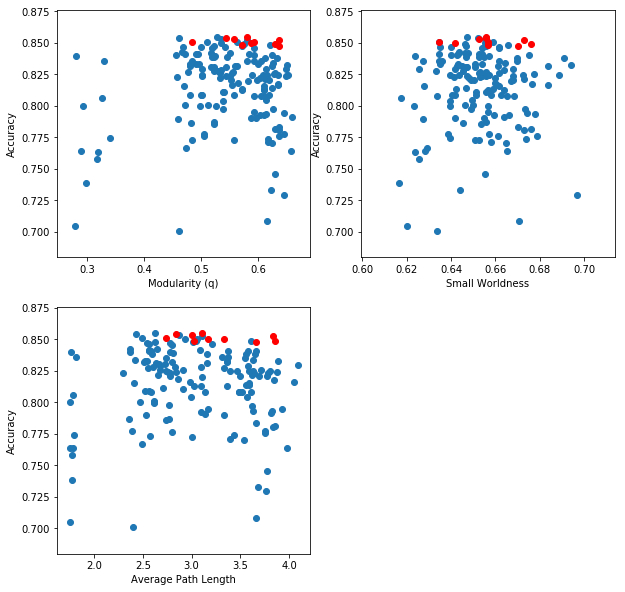

In [23]:
fig=plt.figure(figsize=(10,10))
numAx=3
ax=[None]*numAx
for i in range(numAx):
    ax[i]=plt.subplot(2,2,i+1)
    if i == 0:
        plt.scatter(mod,sortedAccVals)
        plt.xlabel('Modularity (q)')
        plt.ylabel('Accuracy')
        plt.scatter([mod[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
    elif i == 1:
        plt.scatter(sw,sortedAccVals)
        plt.scatter([sw[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
        plt.xlabel('Small Worldness')
        plt.ylabel('Accuracy')
    else:
        plt.scatter(avgPL,sortedAccVals)
        plt.scatter([avgPL[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
        plt.xlabel('Average Path Length')
        plt.ylabel('Accuracy')

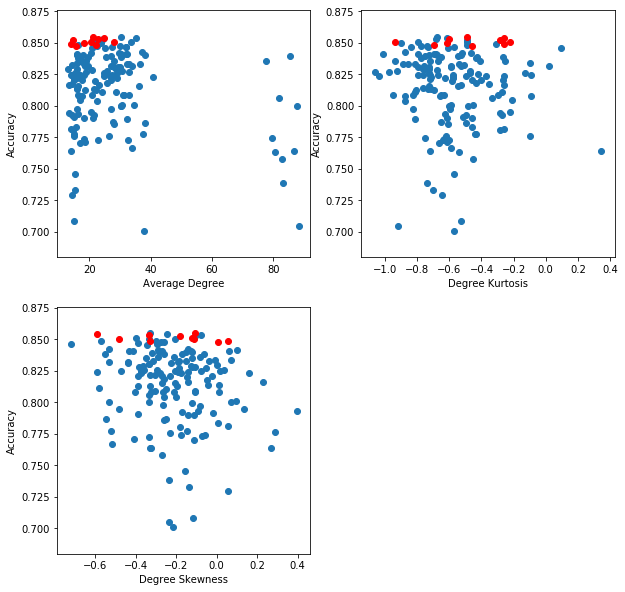

In [24]:
fig=plt.figure(figsize=(10,10))
numAx=3
ax=[None]*numAx
for i in range(numAx):
    ax[i]=plt.subplot(2,2,i+1)
    if i==0:
        plt.scatter(avgDeg,sortedAccVals)
        plt.scatter([avgDeg[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
        plt.xlabel('Average Degree')
        plt.ylabel('Accuracy')  
    elif i == 1:
        plt.scatter(kurtDeg,sortedAccVals)
        plt.scatter([kurtDeg[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
        plt.xlabel('Degree Kurtosis')
        plt.ylabel('Accuracy')
    else:
        plt.scatter(skewDeg,sortedAccVals)
        plt.scatter([skewDeg[i] for i in idx_AccVals[-10:]],sortedAccVals[-10:],c='r')
        plt.xlabel('Degree Skewness')
        plt.ylabel('Accuracy')

In [25]:
MaxAcc=sortedIDX[-15:]
#Find network Parameters of best performing networks: ROUND 2
centroid=[]
wire_length=[]
wire_dispersion=[]
for i in range(len(MaxAcc)):
    centroid.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['centroid_dispersion'])
    wire_length.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['avg_length'])
    wire_dispersion.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['dispersion'])

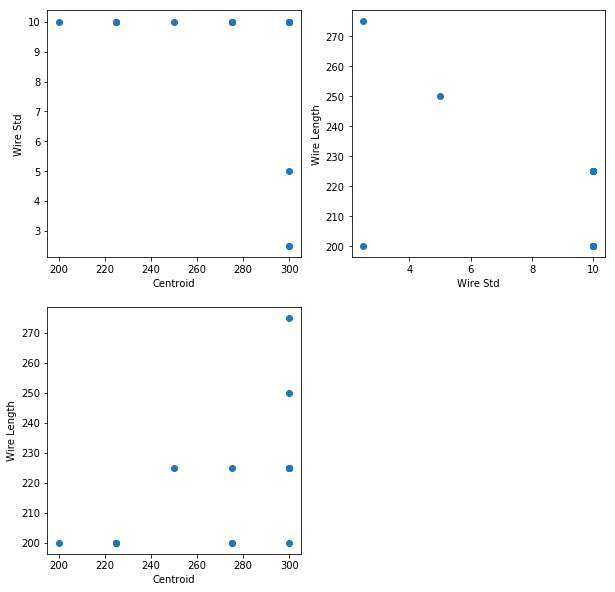

In [26]:
fig=plt.figure(figsize=(10,10))
numAx=3
ax=[None]*numAx
for i in range(numAx):
    ax[i]=plt.subplot(2,2,i+1)
    if i==0:
        plt.scatter(centroid,wire_dispersion)
        plt.xlabel('Centroid')
        plt.ylabel('Wire Std')  
    elif i == 1:
        plt.scatter(wire_dispersion,wire_length)
        plt.xlabel('Wire Std')
        plt.ylabel('Wire Length')
    else:
        plt.scatter(centroid,wire_length)
        plt.xlabel('Centroid')
        plt.ylabel('Wire Length')

In [27]:
  def nonlineartrans(network,onAmp,i,j,nodesList,stimulus):
        dt = 1e-2
        f=0.5
        Time=5
        period=1/f
       #Instantiate Variables    
        print('Running Linear Transformation Simulations')
        dt = 1e-2
        f=0.5
        Time=5

        #Choose Electrode Pattern
        stimulus[0][i].append((stimulus__(biasType='AC',onAmp=onAmp,TimeVector=np.arange(0,Time,dt),f=f)))
        stimulus[1][i].append((stimulus__(biasType='Drain',TimeVector=np.arange(0,Time,dt)))) #we don't want this drain to be active during training

        #Initialise Output Variables
        period=[]
        TimeVector=[]
        voltage=[]
        conductance=[]
        switches=[]
        #Run Simulations
    #     print('Parameter ' + str(i+1), ', Network ' + str(j+1))
        #Run Simulations
    #     results=[]
        # Connectivity=connectivity__('700nw_14533junctions.mat')
        stimulus2 = [item for item in stimulus] #go through each list in the list and find the ith item
    #     set_trace()
        results_ASN=runSim(connectivity__(wires_dict=network[i][j]),stimulus=stimulus2, contactMode='farthest', T = Time, dt = 0.001, onAmp = onAmp, biasType='AC',f=f,junctionMode='tunneling')
        #wires_dict=newNetworkTest[chosenNetwork])
        results_ASN.frequency=f
        results_ASN.dt=0.001
        period=1/f  

    #     name= r'/import/silo2/aloe8475/Documents/CODE/Data/Functional Connectivity/Evolution_Sims_NonlinearTransformation_' + str(i) +'_'+str(j)
    #     compressed_pickle([results_ASN],name)

    #     print('Regressing Parameter ' + str(i+1), ', Network ' + str(j+1))
        TimeVector=results_ASN.TimeVector
        voltage=results_ASN.wireVoltage
        conductance=results_ASN.conductance
        switches=results_ASN.junctionSwitch

        target1= (onAmp * (-np.sign(TimeVector % period - period/2)))
    #             target2[j] = (4*onAmp[i]/period * abs((TimeVector-period/4) % period - period/2) - onAmp[i])
    #             target3[j] = (onAmp[i]/period * (TimeVector % period))
    #             target4[j] = (onAmp[i]*np.sin(4*np.pi*(1/period)*TimeVector))

        if len(network[i][j]['G']) >= 250:
            nodesList[i][j]=[50,100,150,200,250,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)
        elif len(network[i][j]['G']) >= 200 and len(network[i][j]['G']) < 250:
            nodesList[i][j]=[50,100,150,200,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
        elif len(network[i][j]['G']) >= 150 and len(network[i][j]['G']) < 200:
            nodesList[i][j]=[50,100,150,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)  
        elif len(network[i][j]['G']) >= 100 and len(network[i][j]['G']) < 150:
            nodesList[i][j]=[50,100,len(network[i][j]['G'])]#range(50, len(ws300[i][0])+1,50)

        nwSqu =[None]*len(nodesList[i][j])
        countK=0
        for k in nodesList[i][j]: #loop through sets of nodes for regression
            print('Running Regression: ' + str(k) + ' nodes')
            ResultSqu=[]
            ResultSqu = nonLinearTrans(results_ASN,'Square',k, repeats=50) #simulation, type of signal, number of nodes to sample from, number of linear regression repetitions (take avg)
            nwSqu[countK]=ResultSqu['accuracy']
            countK=countK+1
                #Save networks so we don't have to run this every time

        accRandom=nwSqu
        return accRandom    

In [29]:
def geneticAlgorithm(centr,wire_len,wire_disp,MaxAcc,gen):
    numNetworks=10
    ASN=[[None]*numNetworks for i in range(MaxAcc)]
    #Generate 10 new networks for each combination of parameters:
    #This is without any random changes to parameters (re: evolution)
    params2=[]
    seeds=[]
    for i in range(MaxAcc):
        for j in range(numNetworks):
            params2.append([centr[i], wire_len[i], wire_disp[i]])
            seeds.append(np.random.randint(100000))
    
    print('Generating Networks')
    # Generate Networks:
    count=0
    for i in tqdm(range(MaxAcc)):
        for j in range(numNetworks):
            temp=wires.generate_wires_distribution(300,this_seed=seeds[count],wire_dispersion=params2[count][2],centroid_dispersion=params2[count][0],wire_av_length=params2[count][1])
            temp=wires.detect_junctions(temp)
            temp=wires.generate_adj_matrix(temp)
            temp=wires.generate_graph(temp)
            temp=select_largest_component_new(temp)
            count = count+1
            counter1=0
            # if number of nodes is less than 277, try 10 new seeds to get more than 277
            while temp['G'].number_of_nodes() <277 and counter1<=10: #if nodes are less than 277, try the same parameters again for 10 more times before moving on to the next parameter
                temp=wires.generate_wires_distribution(300,this_seed=np.random.randint(100000),wire_dispersion=params2[count][2],centroid_dispersion=params2[count][0],wire_av_length=params2[count][1])
                temp=wires.detect_junctions(temp)
                temp=wires.generate_adj_matrix(temp)
                temp=wires.generate_graph(temp)
                temp=select_largest_component_new(temp)
                counter1=counter1+1

            if temp['G'].number_of_nodes()>=277: #only networks with more than 277 nodes
                ASN[i][j]=temp         

    #set up accuracy dictionary for ASN
    numberOfNodeTests=6
    for i in range(len(ASN)):
        for j in range(len(ASN[i])):
            ASN[i][j].update({'Accuracy':{'Linear Transformation':[None]*numberOfNodeTests,'Memory Capacity':[]},'Graph Theory':{'Small World Sigma':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}})            
    
#     print('Computing Graph Theory')        
#     #Graph Theory
#     ci = []
#     pcoeff= []
#     mz= []
#     clustering = []
#     for i in tqdm(range(len(ASN))):
#         for j in tqdm(range(len(ASN[i]))):
#             ci,q=nct.community_louvain(ASN[i][j]['adj_matrix'])
#             pcoeff=bct.participation_coef(ASN[i][j]['adj_matrix'],ci)
#             mz=bct.module_degree_zscore(ASN[i][j]['adj_matrix'],ci)
#             clustering=nx.clustering(ASN[i][j]['G'])
#             ASN[i][j]['Graph Theory']['PL']=dict(nx.all_pairs_shortest_path_length(ASN[i][j]['G']))
#             ASN[i][j]['Graph Theory']['Modularity']=ci
#             ASN[i][j]['Graph Theory']['Modularity Score']=q
#             ASN[i][j]['Graph Theory']['PCoeff']=pcoeff
#             ASN[i][j]['Graph Theory']['MZ']=mz
#             ASN[i][j]['Graph Theory']['Small World Sigma']=nx.algorithms.smallworld.sigma(ASN[i][j]['G'])
#             ASN[i][j]['Graph Theory']['CCoeff']=clustering
#             ASN[i][j]['Graph Theory']['Degree']=nx.degree(ASN[i][j]['G'])
#             ASN[i][j]['Graph Theory']['AvgPL']=nx.average_shortest_path_length(ASN[i][j]['G'])
    
    print('Running Nonlinear Transformation')
    #Run Nonlinear Transformation
    onAmp=[[] for i in range(len(ASN))]
    shortestPath=[[None]*numNetworks for i in range(len(ASN))]
    for i in tqdm(range(len(ASN))):
        for j in range(len(ASN[i])):
            temp=getFarthestPairing(ASN[i][j]['adj_matrix'])
            shortestPath[i][j]=nx.shortest_path_length(ASN[i][j]['G'],temp[0],temp[1])
            onAmp[i].append(shortestPath[i][j]/5) #need to justify divide by 5 or come up with some other way
            ASN[i][j]['sp_amp']=onAmp[i][j]
            ASN[i][j]['Graph Theory']['Shortest Path']=shortestPath[i][j]           
    
    nodesList=[[None]*numNetworks for i in range(len(ASN))]
    stimulus=[[[] for i in range(len(ASN))],[[] for i in range(len(ASN))]]
    init=[]
    for i in tqdm(range(len(ASN))):
        for j in range(len(ASN[i])):
            init.append(inputPacker(nonlineartrans,ASN,ASN[i][j]['sp_amp'],i,j,nodesList,stimulus))
            
    results=para_run(nonlineartrans,init,nCPU=10)
    
    print('Finding Top 15% of networks')
    #find top 20 best networks 
    temp=np.vstack(results)
    temp2=[]
    for i in range(len(temp)):
        temp2.append(np.max(temp[i]))
    sortedAccVals=np.sort(temp2)
    idx_AccVals=np.argsort(temp2)
    
    sortedIDX=[]        
    for i in range(len(idx_AccVals)):
        if idx_AccVals[i] >= 100: 
            sortedIDX.append([int(float(idx_AccVals[i])/10),list(map(int, str(idx_AccVals[i])))[-1]])
        elif idx_AccVals[i] <10: 
            sortedIDX.append([0, list(map(int, str(idx_AccVals[i])))[-1]])
        else:
            sortedIDX.append(list(map(int, str(idx_AccVals[i]))))
    
    print('Saving Network Parameters')
    MaxAcc=sortedIDX[-15:]
    accuracies=sortedAccVals[-15:]
    seedsNew=[]
    for idx in idx_AccVals[-15:]:
        seedsNew.append(seeds[idx])#top 15 seeds
    #Find network Parameters of best performing networks
    centr=[]
    wire_len=[]
    wire_disp=[]
    for i in range(len(MaxAcc)):
        centr.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['centroid_dispersion'])
        wire_len.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['avg_length'])
        wire_disp.append(ASN[MaxAcc[i][0]][MaxAcc[i][1]]['dispersion'])
    
    return centr,wire_len,wire_disp,seedsNew,MaxAcc,accuracies

In [31]:
numGenerations=100
numMaxNWs=15
# mutationFactor=np.random.uniform(1,1.05)
# mutationSign=np.random.choice((-1,1))
# PercentOfMutations=0.005
params=[[None]*4 for i in range(numGenerations)]
seeds=[None]*numGenerations
MaxAccNew=[None]*numGenerations
centroidNew=[None]*numGenerations
wire_lengthNew=[None]*numGenerations
wire_dispersionNew=[None]*numGenerations
accuracies=[None]*numGenerations
count=0
for generation in tqdm(range(numGenerations)):
    if generation < 1:
        params[generation]=(geneticAlgorithm(centroid,wire_length,wire_dispersion,numMaxNWs,generation))
    else:
        params[generation]=(geneticAlgorithm(centroidNew[count],wire_lengthNew[count],wire_dispersionNew[count],numMaxNWs,generation))
        count=count+1
        
    #mutations if wanted
#     numMutations=PercentOfMutations*len(params[generation][0])
#     paramsToMutate=np.random.choice(params[generation][0],numMutations,p=PercentOfMutations,replace=False)
    
    #update next generation
    centroidNew[count]=[i for i in params[generation][0]]
    wire_lengthNew[count]=[i for i in params[generation][1]]
    wire_dispersionNew[count]=[i for i in params[generation][2]]
    seeds[count]=[i for i in params[generation][3]]
    MaxAccNew[count]=[i for i in params[generation][4]]
    accuracies[count]=[i for i in params[generation][5]]
results={'Centroid':centroidNew,'AvgWireLength':wire_lengthNew,'StdWireLength':wire_dispersionNew,'Seeds':seeds,'MaxAccIdx':MaxAccNew,'NLT':accuracies}
compressed_pickle(results,'Evolution100GensResults.pkl')                        

Generating Networks


2020-08-15 19:12:11,667:INFO:Detecting junctions
2020-08-15 19:12:13,299:INFO:Finished detecting junctions
2020-08-15 19:12:13,339:INFO:The largest component has   300 nodes and   3183 edges
2020-08-15 19:12:13,394:INFO:Detecting junctions
2020-08-15 19:12:15,032:INFO:Finished detecting junctions
2020-08-15 19:12:15,072:INFO:The largest component has   299 nodes and   3134 edges
2020-08-15 19:12:15,127:INFO:Detecting junctions
2020-08-15 19:12:16,764:INFO:Finished detecting junctions
2020-08-15 19:12:16,801:INFO:The largest component has   300 nodes and   3079 edges
2020-08-15 19:12:16,856:INFO:Detecting junctions
2020-08-15 19:12:18,488:INFO:Finished detecting junctions
2020-08-15 19:12:18,527:INFO:The largest component has   300 nodes and   3019 edges
2020-08-15 19:12:18,581:INFO:Detecting junctions
2020-08-15 19:12:20,228:INFO:Finished detecting junctions
2020-08-15 19:12:20,267:INFO:The largest component has   299 nodes and   2973 edges
2020-08-15 19:12:20,322:INFO:Detecting juncti

2020-08-15 19:13:29,669:INFO:Detecting junctions
2020-08-15 19:13:31,350:INFO:Finished detecting junctions
2020-08-15 19:13:31,406:INFO:The largest component has   299 nodes and   4329 edges
2020-08-15 19:13:31,477:INFO:Detecting junctions
2020-08-15 19:13:33,152:INFO:Finished detecting junctions
2020-08-15 19:13:33,208:INFO:The largest component has   299 nodes and   4502 edges
2020-08-15 19:13:33,278:INFO:Detecting junctions
2020-08-15 19:13:34,970:INFO:Finished detecting junctions
2020-08-15 19:13:35,028:INFO:The largest component has   300 nodes and   4866 edges
2020-08-15 19:13:35,109:INFO:Detecting junctions
2020-08-15 19:13:36,806:INFO:Finished detecting junctions
2020-08-15 19:13:36,866:INFO:The largest component has   300 nodes and   4604 edges
2020-08-15 19:13:36,937:INFO:Detecting junctions
2020-08-15 19:13:38,647:INFO:Finished detecting junctions
2020-08-15 19:13:38,709:INFO:The largest component has   300 nodes and   4782 edges
2020-08-15 19:13:38,786:INFO:Detecting juncti

2020-08-15 19:14:45,842:INFO:Detecting junctions
2020-08-15 19:14:47,488:INFO:Finished detecting junctions
2020-08-15 19:14:47,530:INFO:The largest component has   300 nodes and   3311 edges
2020-08-15 19:14:47,589:INFO:Detecting junctions
2020-08-15 19:14:49,244:INFO:Finished detecting junctions
2020-08-15 19:14:49,288:INFO:The largest component has   299 nodes and   3476 edges
2020-08-15 19:14:49,349:INFO:Detecting junctions
2020-08-15 19:14:51,019:INFO:Finished detecting junctions
2020-08-15 19:14:51,063:INFO:The largest component has   298 nodes and   3608 edges
2020-08-15 19:14:51,124:INFO:Detecting junctions
2020-08-15 19:14:52,778:INFO:Finished detecting junctions
2020-08-15 19:14:52,821:INFO:The largest component has   298 nodes and   3309 edges
2020-08-15 19:14:52,885:INFO:Detecting junctions
2020-08-15 19:14:54,522:INFO:Finished detecting junctions
2020-08-15 19:14:54,561:INFO:The largest component has   299 nodes and   2995 edges
2020-08-15 19:14:54,616:INFO:Detecting juncti

2020-08-15 19:16:03,063:INFO:Detecting junctions
2020-08-15 19:16:04,717:INFO:Finished detecting junctions
2020-08-15 19:16:04,763:INFO:The largest component has   300 nodes and   3793 edges
2020-08-15 19:16:04,826:INFO:Detecting junctions
2020-08-15 19:16:06,555:INFO:Finished detecting junctions
2020-08-15 19:16:06,619:INFO:The largest component has   300 nodes and   5377 edges
2020-08-15 19:16:06,701:INFO:Detecting junctions
2020-08-15 19:16:08,415:INFO:Finished detecting junctions
2020-08-15 19:16:08,479:INFO:The largest component has   300 nodes and   5529 edges
2020-08-15 19:16:08,563:INFO:Detecting junctions
2020-08-15 19:16:10,294:INFO:Finished detecting junctions
2020-08-15 19:16:10,358:INFO:The largest component has   300 nodes and   5351 edges
2020-08-15 19:16:10,439:INFO:Detecting junctions
2020-08-15 19:16:12,154:INFO:Finished detecting junctions
2020-08-15 19:16:12,219:INFO:The largest component has   300 nodes and   5373 edges
2020-08-15 19:16:12,299:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:17:20,398:INFO:First current path [72, 220, 73, 212, 282, 233, 240, 43, 46] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:17:22,395:INFO:First current path [17, 222, 119, 112, 60, 200, 187, 189, 288] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:17:24,164:INFO:First current path [60, 250, 198, 136, 154, 155, 115, 19, 225] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-15 19:17:24,279:INFO:First current path [58, 69, 256, 82, 11, 269, 100, 64, 27] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:17:24,854:INFO:First current path [299, 102, 82, 130, 140, 158, 219, 112, 242, 131, 204] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:17:25,519:INFO:First current path [6, 101, 298, 239, 291, 213, 186, 91, 220] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:17:27,207:INFO:First current path [28, 29, 288, 25, 152, 284, 57, 139, 239] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:17:28,796:INFO:First current path [1, 104, 62, 133, 92, 14, 257, 96] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:17:29,989:INFO:First current path [17, 114, 4, 235, 209, 55, 292, 28] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 19:17:33,260:INFO:First current path [30, 38, 90, 244, 190, 57, 106, 191] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:18:01,479:INFO:First current path [9, 225, 21, 118, 187, 299, 122] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:18:05,217:INFO:First current path [66, 189, 201, 225, 21, 32, 84] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:18:06,511:INFO:First current path [37, 223, 98, 139, 271, 62, 284] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-15 19:18:06,524:INFO:First current path [81, 121, 91, 172, 267, 299, 184, 226] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:18:10,144:INFO:First current path [3, 282, 160, 73, 242, 29, 111] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:18:11,544:INFO:First current path [17, 57, 165, 118, 288, 246, 48] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:18:12,467:INFO:First current path [1, 125, 5, 86, 103, 167, 128] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-15 19:18:12,569:INFO:First current path [6, 27, 52, 287, 87, 181, 11, 133] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:18:12,887:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:18:19,665:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:18:42,438:INFO:First current path [230, 121, 88, 106, 64, 79, 170, 33] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:18:45,080:INFO:First current path [97, 99, 197, 70, 133, 243, 76, 40] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:18:46,403:INFO:First current path [12, 67, 43, 166, 72, 10, 229] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:18:48,093:INFO:First current path [29, 222, 295, 214, 191, 61, 72] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:18:51,222:INFO:First current path [55, 261, 41, 93, 50, 232, 265, 100] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:18:52,023:INFO:First current path [69, 242, 281, 258, 31, 156, 221] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:18:54,368:INFO:First current path [157, 56, 66, 89, 90, 5, 154, 123] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:18:55,276:INFO:First current path [14, 145, 226, 122, 102, 169, 52] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:18:56,885:INFO:First current path [26, 96, 231, 108, 33, 205, 149] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:18:59,747:INFO:First current path [36, 144, 188, 11, 170, 264, 295, 111] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:19:21,938:INFO:First current path [7, 133, 83, 249, 98, 276, 51] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:19:24,352:INFO:First current path [16, 147, 281, 140, 204, 34, 98, 152] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:19:25,232:INFO:First current path [231, 35, 88, 59, 31, 8, 158, 89] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:19:32,872:INFO:First current path [30, 274, 248, 67, 21, 289, 12, 95, 91] formed at time = 0.868 s.


Running Regression: 50 nodes


2020-08-15 19:19:33,075:INFO:First current path [140, 90, 293, 5, 192, 138, 14, 132] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 19:19:33,999:INFO:First current path [4, 227, 89, 214, 135, 35, 86] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:19:34,982:INFO:First current path [14, 218, 121, 139, 277, 236, 157, 13] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:19:36,301:INFO:First current path [38, 173, 108, 29, 230, 142, 109] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:19:39,344:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:19:48,716:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:20:01,889:INFO:First current path [1, 295, 197, 154, 129, 43, 44] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 19:20:03,442:INFO:First current path [17, 143, 76, 272, 156, 203, 10] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:20:04,373:INFO:First current path [140, 50, 170, 134, 115, 70, 256] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:20:13,920:INFO:First current path [1, 16, 219, 242, 257, 296, 104] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:20:16,096:INFO:First current path [6, 136, 74, 70, 238, 274, 32] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 19:20:16,900:INFO:First current path [13, 56, 273, 175, 178, 183, 50] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:20:18,157:INFO:First current path [34, 39, 166, 109, 76, 119, 105] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:20:21,988:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:20:23,571:INFO:First current path [51, 79, 57, 137, 185, 178, 115] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:20:29,692:INFO:First current path [245, 26, 293, 261, 9, 124, 143, 250] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:20:41,377:INFO:First current path [15, 233, 132, 189, 145, 25, 180, 86] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 19:20:44,194:INFO:First current path [0, 116, 211, 279, 82, 129, 289, 62] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 19:20:44,502:INFO:First current path [7, 197, 132, 20, 216, 47, 127, 89] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:20:52,382:INFO:First current path [2, 141, 124, 13, 243, 15, 46, 167, 267] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:20:57,382:INFO:First current path [45, 132, 169, 299, 5, 40, 93, 118] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:20:59,593:INFO:First current path [0, 33, 192, 157, 104, 31, 53, 154] formed at time = 0.818 s.


Running Regression: 50 nodes


2020-08-15 19:21:00,085:INFO:First current path [118, 93, 26, 169, 292, 70, 42, 248, 40, 106] formed at time = 0.821 s.


Running Regression: 50 nodes


2020-08-15 19:21:00,116:INFO:First current path [4, 109, 240, 132, 135, 195, 20, 204] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:21:04,347:INFO:First current path [1, 21, 251, 26, 47, 206, 152, 215] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:21:09,196:INFO:First current path [0, 159, 113, 122, 9, 120, 203, 130] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-15 19:21:18,962:INFO:First current path [67, 58, 78, 86, 262, 43, 29, 94, 9, 192] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 298 nodes


2020-08-15 19:21:21,978:INFO:First current path [1, 244, 6, 10, 3, 173, 141, 207, 22] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:21:23,651:INFO:First current path [74, 233, 48, 72, 183, 167, 172, 165, 37, 151] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:21:31,175:INFO:First current path [3, 51, 105, 82, 150, 129, 277, 297, 298, 28] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:21:38,810:INFO:First current path [131, 266, 252, 75, 3, 5, 242, 44, 226, 257, 16] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 19:21:39,145:INFO:First current path [9, 175, 21, 31, 14, 218, 27, 281, 38] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:21:40,851:INFO:First current path [5, 289, 170, 153, 221, 261, 120, 136, 26, 65] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 19:21:41,368:INFO:First current path [92, 196, 245, 39, 158, 106, 290, 261, 233] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:21:46,509:INFO:First current path [23, 227, 180, 192, 199, 87, 136, 126, 282] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:21:53,176:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:21:57,303:INFO:First current path [61, 213, 263, 44, 193, 251, 161, 218, 290] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 19:22:00,685:INFO:First current path [126, 17, 111, 68, 118, 198, 228, 130, 158, 122] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:22:02,340:INFO:First current path [46, 128, 154, 16, 57, 269, 13, 165, 238] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:22:08,663:INFO:First current path [2, 245, 209, 117, 85, 174, 79, 262] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:22:16,589:INFO:First current path [6, 104, 191, 236, 40, 225, 161, 92] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 19:22:17,394:INFO:First current path [148, 83, 284, 149, 8, 215, 41, 255, 95] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:22:18,975:INFO:First current path [71, 264, 232, 229, 233, 128, 256, 65, 57] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:22:22,137:INFO:First current path [5, 145, 97, 194, 109, 54, 208, 260, 190] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:22:24,693:INFO:First current path [266, 96, 30, 159, 278, 249, 8, 69, 73, 90] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:22:32,433:INFO:First current path [187, 59, 18, 144, 276, 121, 176, 256, 281] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 19:22:37,054:INFO:First current path [20, 265, 13, 51, 151, 241, 206, 133] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:22:39,521:INFO:First current path [73, 289, 219, 165, 69, 248, 259, 135, 297] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:22:40,311:INFO:First current path [200, 114, 101, 102, 1, 94, 221, 118, 108, 59] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:22:47,616:INFO:First current path [54, 30, 111, 183, 8, 196, 50, 233, 95] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:22:55,648:INFO:First current path [8, 160, 96, 111, 97, 203, 148, 34] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:22:57,562:INFO:First current path [2, 133, 82, 1, 169, 184, 298, 124] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:23:04,406:INFO:First current path [6, 276, 213, 150, 125, 271, 251, 82, 238] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 19:23:04,934:INFO:First current path [56, 204, 229, 109, 149, 240, 7, 126, 234] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:23:08,825:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:23:12,213:INFO:First current path [56, 168, 83, 187, 67, 286, 15, 251, 105] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:23:16,077:INFO:First current path [71, 163, 81, 98, 70, 283, 86, 195, 7] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 19:23:16,873:INFO:First current path [8, 3, 264, 196, 118, 289, 152, 123] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 19:23:18,307:INFO:First current path [41, 67, 194, 109, 123, 197, 289, 210, 180] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:23:25,752:INFO:First current path [228, 128, 141, 190, 41, 174, 298, 139, 235] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:23:33,052:INFO:First current path [9, 267, 84, 38, 147, 11, 124, 77] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 19:23:35,931:INFO:First current path [247, 34, 285, 210, 273, 212, 30, 204, 89] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:23:43,383:INFO:First current path [8, 55, 122, 15, 17, 138, 146, 116, 3] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:23:44,591:INFO:First current path [190, 246, 96, 261, 169, 223, 274, 8, 23] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:23:47,756:INFO:First current path [2, 162, 16, 75, 14, 130, 212, 274] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:23:51,501:INFO:First current path [16, 299, 93, 242, 232, 3, 200, 150] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:23:55,936:INFO:First current path [57, 225, 33, 199, 174, 187, 263] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 19:23:57,250:INFO:First current path [22, 184, 216, 126, 45, 263, 202] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:23:58,437:INFO:First current path [213, 270, 257, 71, 124, 140, 52] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:24:05,395:INFO:First current path [17, 229, 254, 223, 16, 259, 199] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 19:24:13,397:INFO:First current path [6, 201, 83, 259, 82, 248, 235] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 19:24:17,657:INFO:First current path [221, 199, 260, 267, 250, 240, 217] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:24:25,486:INFO:First current path [26, 224, 61, 151, 79, 181, 299] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 19:24:28,761:INFO:First current path [40, 66, 49, 90, 202, 126, 141] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 19:24:30,466:INFO:First current path [185, 103, 123, 217, 252, 157, 145] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:24:34,395:INFO:First current path [1, 182, 186, 247, 235, 217, 273] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:24:35,463:INFO:First current path [3, 261, 74, 291, 26, 186, 182, 79] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:24:37,200:INFO:First current path [141, 34, 143, 248, 246, 78, 195, 217, 93] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:24:38,171:INFO:First current path [157, 281, 90, 250, 29, 95, 264, 16, 280] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:24:43,997:INFO:First current path [125, 217, 11, 113, 146, 74, 5, 203, 169] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:24:53,175:INFO:First current path [8, 269, 243, 198, 71, 83, 200, 103] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 19:24:58,203:INFO:First current path [21, 151, 231, 222, 229, 125, 120, 240] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:25:06,698:INFO:First current path [7, 182, 209, 197, 72, 165, 94, 67] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:25:09,740:INFO:First current path [178, 59, 194, 26, 31, 280, 85, 28, 288] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:25:11,661:INFO:First current path [10, 206, 97, 32, 255, 37, 289, 295] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:25:15,870:INFO:First current path [38, 258, 56, 220, 199, 218, 54, 66] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:25:16,654:INFO:First current path [3, 46, 244, 11, 9, 130, 282] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:25:19,299:INFO:First current path [105, 282, 291, 139, 225, 143, 111, 221] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-15 19:25:19,717:INFO:First current path [165, 5, 270, 183, 261, 78, 163, 243] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:25:22,562:INFO:First current path [73, 288, 121, 114, 181, 119, 32, 22] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:25:32,667:INFO:First current path [220, 9, 216, 92, 129, 61, 83, 186] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:25:39,614:INFO:First current path [17, 129, 202, 233, 237, 89, 32, 165] formed at time = 0.773 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-15 19:25:46,607:INFO:First current path [1, 196, 263, 229, 27, 259, 236, 245] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:25:51,486:INFO:First current path [3, 100, 248, 27, 192, 35, 290] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 19:25:52,049:INFO:First current path [277, 137, 55, 161, 2, 124, 177, 250] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:25:55,498:INFO:First current path [5, 116, 187, 171, 172, 131, 169, 112] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:25:58,289:INFO:First current path [152, 115, 263, 244, 36, 232, 140] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 19:25:59,254:INFO:First current path [0, 159, 226, 81, 64, 190] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:26:00,719:INFO:First current path [1, 219, 40, 124, 47, 30] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 19:26:01,990:INFO:First current path [258, 75, 65, 78, 137, 134, 297] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:26:13,678:INFO:First current path [2, 92, 164, 85, 5, 289] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:26:22,518:INFO:First current path [40, 297, 230, 223, 236, 298, 72] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 19:26:29,088:INFO:First current path [159, 269, 218, 13, 85, 97, 169] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:26:33,709:INFO:First current path [184, 227, 149, 146, 236, 4, 41] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 19:26:34,787:INFO:First current path [2, 55, 278, 60, 42, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:26:37,787:INFO:First current path [17, 106, 226, 149, 152, 260, 144, 277] formed at time = 0.814 s.


Running Regression: 50 nodes


2020-08-15 19:26:37,837:INFO:First current path [197, 170, 180, 272, 25, 124, 88] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:26:39,391:INFO:First current path [33, 144, 120, 159, 168, 218, 35] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:26:41,278:INFO:First current path [11, 289, 2, 211, 186, 157, 57, 290] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:26:42,293:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-15 19:26:53,378:INFO:First current path [61, 81, 20, 156, 278, 24, 125, 145] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:27:04,606:INFO:First current path [85, 180, 54, 45, 136, 13, 128, 0] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:27:09,629:INFO:First current path [64, 192, 286, 60, 127, 66, 57] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:27:13,196:INFO:First current path [20, 80, 112, 22, 163, 189, 149] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:27:14,096:INFO:First current path [13, 82, 274, 119, 270, 113, 265] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:27:16,607:INFO:First current path [3, 210, 83, 202, 49, 213, 241] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 19:27:34,344:INFO:Detecting junctions
2020-08-15 19:27:36,043:INFO:Finished detecting junctions
2020-08-15 19:27:36,094:INFO:The largest component has   300 nodes and   4250 edges
2020-08-15 19:27:36,160:INFO:Detecting junctions
2020-08-15 19:27:37,865:INFO:Finished detecting junctions
2020-08-15 19:27:37,922:INFO:The largest component has   300 nodes and   4846 edges
2020-08-15 19:27:37,996:INFO:Detecting junctions
2020-08-15 19:27:39,702:INFO:Finished detecting junctions
2020-08-15 19:27:39,759:INFO:The largest component has   300 nodes and   4574 edges
2020-08-15 19:27:39,832:INFO:Detecting junctions
2020-08-15 19:27:41,563:INFO:Finished detecting junctions
2020-08-15 19:27:41,620:INFO:The largest component has   300 nodes and   4670 edges
2020-08-15 19:27:41,693:INFO:Detecting junctions
2020-08-15 19:27:43,423:INFO:Finished detecting junctions
2020-08-15 19:27:43,480:INFO:The largest component has   300 nodes and   4668 edges
2020-08-15 19:27:43,552:INFO:Detecting juncti

2020-08-15 19:28:51,114:INFO:Detecting junctions
2020-08-15 19:28:52,775:INFO:Finished detecting junctions
2020-08-15 19:28:52,816:INFO:The largest component has   300 nodes and   3240 edges
2020-08-15 19:28:52,872:INFO:Detecting junctions
2020-08-15 19:28:54,518:INFO:Finished detecting junctions
2020-08-15 19:28:54,564:INFO:The largest component has   299 nodes and   3607 edges
2020-08-15 19:28:54,626:INFO:Detecting junctions
2020-08-15 19:28:56,702:INFO:Finished detecting junctions
2020-08-15 19:28:56,745:INFO:The largest component has   300 nodes and   3312 edges
2020-08-15 19:28:56,803:INFO:Detecting junctions
2020-08-15 19:28:58,485:INFO:Finished detecting junctions
2020-08-15 19:28:58,528:INFO:The largest component has   299 nodes and   3372 edges
2020-08-15 19:28:58,589:INFO:Detecting junctions
2020-08-15 19:29:00,280:INFO:Finished detecting junctions
2020-08-15 19:29:00,322:INFO:The largest component has   299 nodes and   3349 edges
2020-08-15 19:29:00,381:INFO:Detecting juncti

2020-08-15 19:30:07,416:INFO:Detecting junctions
2020-08-15 19:30:09,090:INFO:Finished detecting junctions
2020-08-15 19:30:09,138:INFO:The largest component has   299 nodes and   3888 edges
2020-08-15 19:30:09,202:INFO:Detecting junctions
2020-08-15 19:30:10,845:INFO:Finished detecting junctions
2020-08-15 19:30:10,898:INFO:The largest component has   300 nodes and   3774 edges
2020-08-15 19:30:10,965:INFO:Detecting junctions
2020-08-15 19:30:12,643:INFO:Finished detecting junctions
2020-08-15 19:30:12,692:INFO:The largest component has   300 nodes and   4016 edges
2020-08-15 19:30:12,758:INFO:Detecting junctions
2020-08-15 19:30:14,424:INFO:Finished detecting junctions
2020-08-15 19:30:14,473:INFO:The largest component has   299 nodes and   3951 edges
2020-08-15 19:30:14,542:INFO:Detecting junctions
2020-08-15 19:30:16,227:INFO:Finished detecting junctions
2020-08-15 19:30:16,286:INFO:The largest component has   300 nodes and   4758 edges
2020-08-15 19:30:16,361:INFO:Detecting juncti

2020-08-15 19:31:25,833:INFO:Detecting junctions
2020-08-15 19:31:27,505:INFO:Finished detecting junctions
2020-08-15 19:31:27,562:INFO:The largest component has   300 nodes and   4834 edges
2020-08-15 19:31:27,638:INFO:Detecting junctions
2020-08-15 19:31:29,328:INFO:Finished detecting junctions
2020-08-15 19:31:29,384:INFO:The largest component has   300 nodes and   4661 edges
2020-08-15 19:31:29,454:INFO:Detecting junctions
2020-08-15 19:31:31,145:INFO:Finished detecting junctions
2020-08-15 19:31:31,201:INFO:The largest component has   300 nodes and   4834 edges
2020-08-15 19:31:31,274:INFO:Detecting junctions
2020-08-15 19:31:32,954:INFO:Finished detecting junctions
2020-08-15 19:31:33,009:INFO:The largest component has   300 nodes and   4712 edges
2020-08-15 19:31:33,079:INFO:Detecting junctions
2020-08-15 19:31:34,766:INFO:Finished detecting junctions
2020-08-15 19:31:34,826:INFO:The largest component has   299 nodes and   4920 edges
2020-08-15 19:31:34,903:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 19:32:43,778:INFO:First current path [243, 125, 172, 161, 219, 89, 133, 198] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:32:45,525:INFO:First current path [0, 295, 180, 21, 269, 241, 255] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:32:48,017:INFO:First current path [180, 159, 166, 91, 75, 27, 33, 130] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:32:49,609:INFO:First current path [18, 112, 190, 172, 224, 196, 284] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:32:50,554:INFO:First current path [6, 17, 166, 235, 52, 64, 37] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 19:32:51,322:INFO:First current path [20, 200, 169, 175, 176, 237, 232] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:32:53,888:INFO:First current path [199, 19, 26, 167, 159, 224, 236, 35] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:32:54,515:INFO:First current path [3, 107, 213, 48, 72, 113, 137] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-15 19:32:54,611:INFO:First current path [29, 12, 51, 238, 97, 243, 84] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:32:55,638:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:33:21,270:INFO:First current path [22, 31, 250, 159, 80, 53, 253, 58, 256] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:33:25,341:INFO:First current path [61, 204, 290, 189, 94, 186, 260, 60, 190, 110] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:33:27,913:INFO:First current path [298, 25, 208, 88, 120, 174, 66, 6, 79, 10] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:33:29,958:INFO:First current path [73, 198, 150, 108, 32, 187, 119, 288, 280] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:33:30,968:INFO:First current path [1, 38, 189, 171, 241, 196, 6, 277] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:33:32,343:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:33:33,607:INFO:First current path [115, 133, 249, 158, 163, 160, 171, 253, 273] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:33:34,810:INFO:First current path [156, 142, 82, 100, 77, 5, 146, 26, 148] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:33:38,209:INFO:First current path [59, 111, 260, 61, 243, 265, 259, 226, 110] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:33:39,468:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:34:00,673:INFO:First current path [67, 12, 123, 113, 43, 145, 191, 254] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:34:10,574:INFO:First current path [61, 152, 268, 92, 258, 99, 79] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-15 19:34:10,862:INFO:First current path [32, 62, 297, 212, 171, 270, 44] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:34:13,009:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 19:34:13,136:INFO:First current path [91, 240, 18, 122, 152, 94, 206, 128] formed at time = 0.809 s.


Running Regression: 50 nodes


2020-08-15 19:34:13,297:INFO:First current path [19, 208, 117, 143, 179, 219, 229] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:34:15,552:INFO:First current path [51, 33, 217, 186, 180, 104, 234] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:34:18,536:INFO:First current path [9, 80, 296, 209, 260, 233, 270] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:34:20,565:INFO:First current path [23, 28, 62, 119, 107, 190, 71] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes


2020-08-15 19:34:22,400:INFO:First current path [6, 73, 159, 44, 58, 261, 26] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:34:39,727:INFO:First current path [64, 73, 230, 110, 116, 129, 236, 138, 272] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:34:49,905:INFO:First current path [32, 88, 120, 183, 189, 47, 298, 253] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:34:50,817:INFO:First current path [11, 180, 100, 22, 265, 117, 10, 114, 213] formed at time = 0.783 s.


Running Regression: 50 nodes


2020-08-15 19:34:51,243:INFO:First current path [11, 296, 228, 104, 100, 192, 50, 229] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:34:54,024:INFO:First current path [2, 51, 111, 77, 97, 247, 90, 153] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:34:55,444:INFO:First current path [13, 195, 197, 3, 167, 246, 284, 49, 150] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:35:00,204:INFO:First current path [297, 235, 191, 276, 123, 215, 36, 167, 275] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-15 19:35:00,283:INFO:First current path [57, 225, 201, 55, 46, 260, 102, 103, 146] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 19:35:00,842:INFO:First current path [11, 155, 258, 10, 284, 167, 63, 142] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 19:35:01,790:INFO:First current path [82, 252, 140, 263, 34, 274, 84, 108, 152] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 19:35:17,608:INFO:First current path [45, 175, 195, 36, 53, 217, 72, 171] formed at time = 0.786 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:35:26,974:INFO:First current path [38, 29, 199, 55, 18, 240, 195, 165, 40] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:35:28,124:INFO:First current path [224, 83, 195, 25, 145, 105, 0, 160, 128] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 19:35:29,652:INFO:First current path [13, 145, 99, 61, 288, 107, 141, 81, 26, 125] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:35:34,407:INFO:First current path [32, 82, 224, 201, 30, 107, 248, 145, 106, 15] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:35:35,477:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:35:39,464:INFO:First current path [157, 281, 90, 250, 29, 95, 264, 16, 280] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:35:40,492:INFO:First current path [13, 158, 81, 260, 250, 247, 180, 280] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:35:46,622:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:35:51,141:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 19:35:56,118:INFO:First current path [180, 117, 59, 40, 164, 247, 112, 92] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:36:05,817:INFO:First current path [53, 38, 171, 275, 251, 250, 231, 272] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:36:06,806:INFO:First current path [19, 149, 262, 136, 94, 87, 142, 187] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:36:08,005:INFO:First current path [225, 183, 210, 201, 147, 53, 58, 121] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:36:16,382:INFO:First current path [95, 290, 163, 220, 47, 146, 17, 247] formed at time = 0.807 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 19:36:19,125:INFO:First current path [39, 188, 35, 162, 163, 108, 148, 223] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:36:19,552:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:36:20,701:INFO:First current path [0, 66, 100, 8, 219, 272, 158] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:36:25,636:INFO:First current path [2, 30, 38, 287, 162, 69, 298] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:36:30,071:INFO:First current path [1, 239, 215, 67, 105, 181, 179, 109] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 19:36:33,887:INFO:First current path [22, 215, 85, 47, 89, 165, 237, 238] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-15 19:36:42,986:INFO:First current path [288, 218, 265, 200, 86, 241, 273, 81, 248] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 19:36:44,146:INFO:First current path [19, 23, 227, 237, 115, 37, 67, 114] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:36:46,230:INFO:First current path [5, 296, 199, 99, 10, 261, 275, 63] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:36:56,005:INFO:First current path [18, 112, 129, 279, 296, 130, 175, 211] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:36:56,981:INFO:First current path [21, 4, 61, 219, 169, 117, 295, 255] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:36:58,106:INFO:First current path [228, 76, 224, 110, 142, 113, 238, 52, 261] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 19:36:59,950:INFO:First current path [8, 116, 274, 11, 78, 126, 256, 95] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:37:05,386:INFO:First current path [7, 289, 135, 25, 106, 31, 73] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:37:08,556:INFO:First current path [19, 224, 257, 133, 37, 119, 82, 243] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 19:37:12,687:INFO:First current path [77, 189, 84, 1, 206, 25, 291, 191] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:37:20,705:INFO:First current path [241, 153, 204, 39, 4, 133, 290, 100, 256] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:37:22,284:INFO:First current path [17, 124, 32, 189, 19, 12, 46, 126, 103] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 19:37:24,688:INFO:First current path [6, 18, 28, 103, 75, 223, 65, 74] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:37:32,840:INFO:First current path [8, 232, 41, 89, 147, 240, 259, 141] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:37:37,040:INFO:First current path [0, 254, 93, 23, 135, 261, 201, 76] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:37:39,638:INFO:First current path [112, 136, 89, 248, 160, 10, 144, 8, 165, 105] formed at time = 0.821 s.


Running Regression: 50 nodes


2020-08-15 19:37:39,669:INFO:First current path [14, 75, 155, 131, 175, 31, 162, 64] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:37:45,020:INFO:First current path [254, 76, 290, 119, 288, 106, 231, 35, 7] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:37:47,029:INFO:First current path [17, 136, 7, 156, 29, 27, 53, 139] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes


2020-08-15 19:37:51,843:INFO:First current path [6, 33, 9, 107, 22, 218, 178, 13] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 19:37:58,750:INFO:First current path [2, 65, 26, 190, 52, 69, 66] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 19:38:00,257:INFO:First current path [0, 227, 211, 107, 20, 295, 95] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-15 19:38:05,029:INFO:First current path [44, 110, 129, 224, 101, 296, 124, 53] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:38:11,750:INFO:First current path [175, 192, 152, 200, 178, 162, 24, 272, 96] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:38:17,651:INFO:First current path [137, 9, 192, 19, 142, 72, 242, 139] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 19:38:20,117:INFO:First current path [94, 61, 138, 30, 60, 187, 167, 298] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-15 19:38:20,650:INFO:First current path [265, 286, 89, 254, 16, 224, 278, 272, 155] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 19:38:24,091:INFO:First current path [16, 61, 278, 28, 291, 252, 29] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 19:38:26,111:INFO:First current path [194, 93, 109, 243, 234, 104, 138, 100] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:38:30,841:INFO:First current path [243, 89, 13, 130, 291, 25, 52, 136] formed at time = 0.903 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:38:39,751:INFO:First current path [3, 196, 218, 111, 110, 122, 104] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 19:38:44,753:INFO:First current path [3, 9, 13, 145, 104, 200, 101] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:38:46,861:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:38:50,251:INFO:First current path [19, 224, 121, 111, 18, 232, 183] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:38:59,030:INFO:First current path [113, 61, 18, 3, 276, 214, 127, 45] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:38:59,958:INFO:First current path [3, 4, 57, 21, 284, 37, 133] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:39:01,489:INFO:First current path [9, 211, 51, 194, 234, 13, 15] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:39:05,553:INFO:First current path [96, 200, 235, 80, 70, 197, 217] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:39:10,164:INFO:First current path [75, 294, 55, 107, 12, 58, 291, 14] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:39:13,696:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:39:18,781:INFO:First current path [76, 159, 82, 241, 202, 70, 251, 224] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 19:39:23,349:INFO:First current path [0, 210, 103, 282, 67, 272, 41] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 19:39:25,173:INFO:First current path [82, 240, 172, 43, 104, 157, 30, 216] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:39:28,578:INFO:First current path [6, 213, 65, 124, 174, 209, 142] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:39:40,132:INFO:First current path [288, 14, 80, 244, 273, 195, 57, 242] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:39:41,250:INFO:First current path [48, 173, 191, 107, 231, 2, 212, 126] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:39:44,557:INFO:First current path [16, 1, 38, 147, 110, 245, 251] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:39:48,702:INFO:First current path [38, 25, 135, 187, 204, 24, 263, 170] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:39:50,218:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:39:51,778:INFO:First current path [86, 96, 190, 269, 3, 76, 1, 123] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:39:57,223:INFO:First current path [186, 247, 131, 134, 203, 48, 3, 235] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:40:01,024:INFO:First current path [1, 71, 296, 221, 245, 94, 121] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:40:03,282:INFO:First current path [19, 291, 224, 72, 218, 50, 63, 80] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:40:06,933:INFO:First current path [70, 158, 31, 134, 46, 257, 27, 100] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:40:21,195:INFO:First current path [147, 207, 78, 175, 284, 83, 223, 17] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-15 19:40:21,717:INFO:First current path [2, 112, 148, 38, 8, 175, 46] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:40:24,110:INFO:First current path [130, 95, 292, 156, 44, 216, 276, 11] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:40:26,818:INFO:First current path [145, 254, 108, 177, 22, 118, 183, 127] formed at time = 0.798 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:40:30,379:INFO:First current path [16, 154, 239, 122, 238, 110, 150, 289] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:40:32,723:INFO:First current path [177, 113, 16, 202, 160, 284, 102, 147] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:40:42,508:INFO:First current path [12, 130, 2, 157, 289, 103, 146] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 19:40:45,231:INFO:First current path [1, 36, 227, 134, 123, 115, 107] formed at time = 0.759 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:40:45,318:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:40:50,916:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:41:02,650:INFO:First current path [191, 132, 149, 248, 204, 239, 175, 258] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:41:04,462:INFO:First current path [11, 19, 259, 298, 66, 295, 109] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-15 19:41:04,981:INFO:First current path [2, 9, 191, 36, 4, 141, 93] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-15 19:41:07,194:INFO:First current path [41, 51, 32, 222, 173, 61, 275] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:41:13,040:INFO:First current path [7, 238, 82, 61, 23, 89, 44] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:41:13,881:INFO:First current path [49, 294, 295, 119, 40, 77, 203] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 19:41:22,027:INFO:First current path [28, 169, 147, 153, 274, 218, 126] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:41:24,085:INFO:First current path [5, 47, 215, 228, 72, 213, 274] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:41:25,288:INFO:First current path [93, 268, 242, 163, 287, 173, 291] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:41:30,631:INFO:First current path [15, 169, 130, 81, 133, 234, 103] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:41:45,201:INFO:First current path [0, 71, 196, 185, 147, 258] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:41:45,896:INFO:First current path [73, 261, 204, 141, 123, 124, 208, 196] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:41:46,748:INFO:First current path [19, 191, 56, 216, 247, 35, 101] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:41:50,083:INFO:First current path [103, 195, 67, 43, 78, 169, 171] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:41:54,672:INFO:First current path [36, 211, 5, 29, 30, 74, 171] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:41:58,142:INFO:First current path [10, 123, 3, 167, 265, 263, 214] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 19:42:00,800:INFO:First current path [7, 87, 47, 62, 219, 246, 211] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:42:03,326:INFO:First current path [40, 7, 104, 43, 14, 144, 162] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:42:05,756:INFO:First current path [3, 263, 246, 47, 277, 32, 51] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-15 19:42:09,883:INFO:First current path [2, 20, 144, 296, 124, 167, 233] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:42:27,047:INFO:First current path [1, 44, 132, 61, 133, 23] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:42:28,342:INFO:First current path [29, 178, 215, 84, 255, 30, 114] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:42:30,044:INFO:First current path [53, 287, 298, 262, 89, 63, 199] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:42:33,725:INFO:First current path [38, 81, 78, 75, 205, 161, 295, 94] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:42:37,631:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 19:42:55,570:INFO:Detecting junctions
2020-08-15 19:42:57,282:INFO:Finished detecting junctions
2020-08-15 19:42:57,335:INFO:The largest component has   300 nodes and   4275 edges
2020-08-15 19:42:57,405:INFO:Detecting junctions
2020-08-15 19:42:59,109:INFO:Finished detecting junctions
2020-08-15 19:42:59,161:INFO:The largest component has   300 nodes and   4101 edges
2020-08-15 19:42:59,230:INFO:Detecting junctions
2020-08-15 19:43:00,898:INFO:Finished detecting junctions
2020-08-15 19:43:00,948:INFO:The largest component has   300 nodes and   4134 edges
2020-08-15 19:43:01,014:INFO:Detecting junctions
2020-08-15 19:43:02,683:INFO:Finished detecting junctions
2020-08-15 19:43:02,732:INFO:The largest component has   300 nodes and   3912 edges
2020-08-15 19:43:02,797:INFO:Detecting junctions
2020-08-15 19:43:04,496:INFO:Finished detecting junctions
2020-08-15 19:43:04,547:INFO:The largest component has   300 nodes and   4149 edges
2020-08-15 19:43:05,155:INFO:Detecting juncti

2020-08-15 19:44:13,554:INFO:Detecting junctions
2020-08-15 19:44:15,207:INFO:Finished detecting junctions
2020-08-15 19:44:15,248:INFO:The largest component has   300 nodes and   3260 edges
2020-08-15 19:44:15,307:INFO:Detecting junctions
2020-08-15 19:44:16,963:INFO:Finished detecting junctions
2020-08-15 19:44:17,005:INFO:The largest component has   299 nodes and   3277 edges
2020-08-15 19:44:17,063:INFO:Detecting junctions
2020-08-15 19:44:18,703:INFO:Finished detecting junctions
2020-08-15 19:44:18,749:INFO:The largest component has   299 nodes and   3514 edges
2020-08-15 19:44:18,812:INFO:Detecting junctions
2020-08-15 19:44:20,455:INFO:Finished detecting junctions
2020-08-15 19:44:20,500:INFO:The largest component has   298 nodes and   3434 edges
2020-08-15 19:44:20,561:INFO:Detecting junctions
2020-08-15 19:44:22,194:INFO:Finished detecting junctions
2020-08-15 19:44:22,242:INFO:The largest component has   300 nodes and   3640 edges
2020-08-15 19:44:22,307:INFO:Detecting juncti

2020-08-15 19:45:30,380:INFO:Detecting junctions
2020-08-15 19:45:32,049:INFO:Finished detecting junctions
2020-08-15 19:45:32,096:INFO:The largest component has   300 nodes and   3850 edges
2020-08-15 19:45:32,159:INFO:Detecting junctions
2020-08-15 19:45:33,821:INFO:Finished detecting junctions
2020-08-15 19:45:33,868:INFO:The largest component has   300 nodes and   3855 edges
2020-08-15 19:45:33,933:INFO:Detecting junctions
2020-08-15 19:45:35,575:INFO:Finished detecting junctions
2020-08-15 19:45:35,620:INFO:The largest component has   300 nodes and   3583 edges
2020-08-15 19:45:35,681:INFO:Detecting junctions
2020-08-15 19:45:37,356:INFO:Finished detecting junctions
2020-08-15 19:45:37,405:INFO:The largest component has   300 nodes and   4067 edges
2020-08-15 19:45:37,472:INFO:Detecting junctions
2020-08-15 19:45:39,143:INFO:Finished detecting junctions
2020-08-15 19:45:39,192:INFO:The largest component has   300 nodes and   3936 edges
2020-08-15 19:45:39,255:INFO:Detecting juncti

2020-08-15 19:46:47,715:INFO:Detecting junctions
2020-08-15 19:46:49,393:INFO:Finished detecting junctions
2020-08-15 19:46:49,443:INFO:The largest component has   299 nodes and   4170 edges
2020-08-15 19:46:49,512:INFO:Detecting junctions
2020-08-15 19:46:51,234:INFO:Finished detecting junctions
2020-08-15 19:46:51,282:INFO:The largest component has   300 nodes and   3886 edges
2020-08-15 19:46:51,349:INFO:Detecting junctions
2020-08-15 19:46:53,068:INFO:Finished detecting junctions
2020-08-15 19:46:53,123:INFO:The largest component has   300 nodes and   4149 edges
2020-08-15 19:46:53,190:INFO:Detecting junctions
2020-08-15 19:46:54,863:INFO:Finished detecting junctions
2020-08-15 19:46:54,916:INFO:The largest component has   300 nodes and   4402 edges
2020-08-15 19:46:55,361:INFO:Detecting junctions
2020-08-15 19:46:57,047:INFO:Finished detecting junctions
2020-08-15 19:46:57,098:INFO:The largest component has   300 nodes and   3931 edges
2020-08-15 19:46:57,166:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:48:03,832:INFO:First current path [87, 169, 0, 276, 228, 17, 265, 226] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:48:05,371:INFO:First current path [4, 214, 126, 246, 231, 265, 144] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:48:06,367:INFO:First current path [32, 243, 163, 177, 14, 38, 132, 71] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:48:07,614:INFO:First current path [6, 236, 243, 233, 159, 292, 102] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:48:09,035:INFO:First current path [82, 99, 90, 207, 176, 239, 39, 195] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-15 19:48:09,317:INFO:First current path [65, 279, 204, 238, 46, 134, 124, 93] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:48:11,082:INFO:First current path [14, 145, 226, 81, 88, 144, 17, 279] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:48:12,369:INFO:First current path [47, 19, 257, 186, 200, 203, 258, 280] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 19:48:13,588:INFO:First current path [55, 190, 174, 207, 221, 45, 67, 295] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:48:14,249:INFO:First current path [57, 39, 115, 10, 194, 84, 273, 166] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:48:41,322:INFO:First current path [1, 138, 225, 18, 282, 110, 105, 237] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:48:43,812:INFO:First current path [1, 223, 297, 76, 112, 131, 246, 202] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:48:44,655:INFO:First current path [9, 107, 197, 115, 95, 110, 109, 51, 37, 264] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:48:47,537:INFO:First current path [14, 74, 178, 179, 167, 72, 117, 229] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:48:48,242:INFO:First current path [33, 11, 87, 23, 283, 4, 1, 192, 16] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:48:49,406:INFO:First current path [59, 35, 226, 175, 200, 47, 163, 97, 18] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:48:50,467:INFO:First current path [33, 72, 204, 189, 50, 30, 281, 113] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:48:51,113:INFO:First current path [233, 31, 116, 186, 5, 192, 43, 32, 69] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 19:48:52,234:INFO:First current path [58, 289, 52, 194, 130, 239, 109, 296] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 296 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:48:54,674:INFO:First current path [211, 38, 254, 139, 181, 259, 141, 109, 59] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:49:21,530:INFO:First current path [24, 212, 47, 85, 193, 73, 272, 255] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:49:24,139:INFO:First current path [37, 102, 166, 127, 14, 183, 42] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:49:27,603:INFO:First current path [190, 205, 275, 202, 174, 62, 3] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 19:49:29,101:INFO:First current path [17, 206, 82, 137, 115, 165, 55] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:49:30,879:INFO:First current path [12, 200, 124, 205, 246, 196, 268] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:49:33,361:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 19:49:33,427:INFO:First current path [64, 216, 252, 174, 48, 195, 109] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-15 19:49:33,676:INFO:First current path [16, 241, 166, 183, 240, 34, 131] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:49:35,558:INFO:First current path [0, 47, 140, 161, 290, 27, 95] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:49:43,599:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:50:00,189:INFO:First current path [8, 263, 231, 34, 58, 168, 243, 9, 268] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:50:02,266:INFO:First current path [0, 164, 35, 16, 112, 282, 68, 185] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:50:05,021:INFO:First current path [151, 76, 32, 131, 44, 142, 121, 70, 55] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:50:06,897:INFO:First current path [33, 12, 203, 171, 149, 167, 242, 44, 200] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:50:11,126:INFO:First current path [4, 32, 89, 101, 71, 201, 273, 122] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-15 19:50:11,729:INFO:First current path [97, 53, 102, 250, 95, 244, 29, 114, 279] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 19:50:12,353:INFO:First current path [0, 251, 34, 25, 66, 15, 223, 232, 170] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:50:14,231:INFO:First current path [19, 154, 238, 149, 146, 297, 87, 129] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:50:15,262:INFO:First current path [49, 179, 33, 139, 94, 43, 100, 113, 148] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 19:50:21,679:INFO:First current path [34, 11, 30, 149, 57, 77, 180, 101, 204] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:50:39,042:INFO:First current path [22, 256, 170, 195, 260, 193, 104, 169] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:50:41,163:INFO:First current path [200, 25, 11, 18, 105, 117, 54, 286, 225] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:50:43,333:INFO:First current path [30, 102, 20, 203, 280, 282, 275, 191, 100] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:50:45,913:INFO:First current path [28, 118, 138, 55, 137, 237, 3, 186] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:50:50,853:INFO:First current path [29, 145, 158, 223, 274, 227, 163, 65, 237] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 19:50:52,598:INFO:First current path [16, 285, 169, 3, 219, 159, 175, 290] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 19:50:53,409:INFO:First current path [23, 85, 291, 42, 13, 163, 275, 115] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:50:55,225:INFO:First current path [19, 9, 282, 46, 30, 106, 186, 209] formed at time = 0.908 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-15 19:50:55,496:INFO:First current path [14, 144, 272, 215, 261, 258, 190, 266] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:51:01,045:INFO:First current path [95, 27, 164, 271, 13, 193, 205, 63, 2, 58] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:51:18,749:INFO:First current path [13, 106, 52, 149, 56, 269, 205] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 19:51:20,311:INFO:First current path [31, 279, 193, 83, 0, 164, 127] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:51:23,177:INFO:First current path [48, 136, 7, 208, 110, 187, 248] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:51:26,728:INFO:First current path [4, 118, 123, 223, 66, 238, 224] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 19:51:30,324:INFO:First current path [3, 39, 252, 71, 17, 211, 102] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:51:35,258:INFO:First current path [8, 150, 130, 88, 3, 52, 112] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-15 19:51:35,586:INFO:First current path [7, 187, 27, 71, 11, 220, 136] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 19:51:36,919:INFO:First current path [201, 97, 235, 230, 134, 251, 290, 269] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:51:40,557:INFO:First current path [22, 203, 238, 167, 127, 56, 138] formed at time = 0.776 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:51:43,550:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:51:56,641:INFO:First current path [125, 41, 197, 170, 244, 8, 4, 77, 286] formed at time = 0.782 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:51:58,076:INFO:First current path [22, 20, 148, 52, 162, 55, 285, 81] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:52:01,935:INFO:First current path [45, 282, 230, 263, 242, 277, 294, 56] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 19:52:07,488:INFO:First current path [183, 29, 276, 271, 189, 2, 217, 233] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-15 19:52:07,912:INFO:First current path [87, 95, 232, 140, 136, 172, 82, 297] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:52:12,628:INFO:First current path [28, 214, 37, 57, 252, 179, 147, 150] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 19:52:14,227:INFO:First current path [3, 299, 148, 9, 185, 173, 238] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:52:15,938:INFO:First current path [106, 87, 167, 117, 112, 244, 128, 289, 36] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 19:52:19,950:INFO:First current path [19, 286, 182, 228, 199, 87, 154, 151] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:52:23,023:INFO:First current path [87, 110, 39, 126, 187, 158, 88, 258] formed at time = 0.904 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:52:34,988:INFO:First current path [74, 56, 94, 164, 252, 231, 245, 32, 188] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 19:52:36,505:INFO:First current path [42, 214, 82, 224, 138, 294, 124, 145, 226] formed at time = 0.78 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:52:39,853:INFO:First current path [246, 290, 58, 195, 191, 80, 41, 234, 147, 268] formed at time = 0.927 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 19:52:44,999:INFO:First current path [110, 237, 112, 257, 195, 88, 146, 57, 202] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 19:52:47,405:INFO:First current path [6, 17, 213, 104, 160, 265, 227, 66] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:52:53,452:INFO:First current path [4, 50, 207, 12, 204, 191, 124, 274] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:52:54,470:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 19:52:54,970:INFO:First current path [14, 210, 227, 144, 125, 266, 98, 139, 134] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:52:59,808:INFO:First current path [13, 205, 260, 16, 179, 196, 202, 41, 38] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:53:01,759:INFO:First current path [82, 80, 130, 171, 245, 212, 97, 50, 259] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 19:53:13,711:INFO:First current path [63, 50, 167, 66, 150, 38, 298, 22] formed at time = 0.884 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-15 19:53:15,234:INFO:First current path [267, 187, 14, 218, 224, 148, 296, 161] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:53:18,634:INFO:First current path [80, 100, 201, 231, 178, 271, 160, 230] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:53:23,393:INFO:First current path [42, 119, 17, 127, 38, 249, 43, 217] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 19:53:27,821:INFO:First current path [9, 163, 287, 151, 171, 133, 208, 90] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 19:53:31,559:INFO:First current path [2, 127, 70, 46, 68, 147, 84] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-15 19:53:31,884:INFO:First current path [192, 11, 15, 2, 73, 287, 98, 172, 88] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:53:33,220:INFO:First current path [24, 148, 251, 236, 102, 128, 50, 83] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 19:53:37,083:INFO:First current path [85, 129, 149, 96, 45, 257, 229, 276] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:53:39,841:INFO:First current path [16, 186, 115, 140, 4, 209, 268, 222] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:53:52,636:INFO:First current path [118, 96, 114, 190, 124, 63, 164, 289] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 19:53:56,998:INFO:First current path [92, 75, 24, 243, 40, 224, 29, 65] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:53:59,544:INFO:First current path [232, 10, 206, 106, 155, 143, 131, 228, 193] formed at time = 4.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 19:54:02,460:INFO:First current path [170, 9, 50, 134, 96, 192, 168, 20, 116] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 19:54:10,142:INFO:First current path [7, 47, 243, 234, 264, 103, 192] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 19:54:10,383:INFO:First current path [1, 15, 80, 297, 136, 129, 163] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:54:12,152:INFO:First current path [85, 214, 234, 240, 27, 104, 13, 168] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:54:14,701:INFO:First current path [0, 127, 113, 221, 146, 159, 191, 115] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:54:17,180:INFO:First current path [1, 67, 142, 223, 136, 232, 46] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:54:20,381:INFO:First current path [47, 199, 140, 55, 22, 34, 144, 24] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 19:54:31,690:INFO:First current path [58, 26, 87, 222, 90, 71, 191] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:54:36,413:INFO:First current path [28, 76, 230, 246, 104, 214, 69] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 19:54:38,879:INFO:First current path [2, 144, 177, 105, 103, 27, 99] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 19:54:42,298:INFO:First current path [41, 241, 135, 190, 125, 110, 214] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:54:47,755:INFO:First current path [19, 83, 224, 43, 79, 274, 185] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 19:54:51,873:INFO:First current path [34, 75, 295, 291, 11, 190, 66] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-15 19:54:52,533:INFO:First current path [7, 227, 212, 219, 34, 40, 296] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:54:54,289:INFO:First current path [21, 259, 64, 279, 153, 25, 133] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 19:54:57,960:INFO:First current path [12, 115, 105, 254, 36, 17, 85] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes


2020-08-15 19:55:01,500:INFO:First current path [120, 223, 118, 128, 60, 176, 22] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-15 19:55:10,183:INFO:First current path [30, 96, 117, 31, 263, 214, 255] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 19:55:17,470:INFO:First current path [72, 240, 215, 181, 128, 216, 49, 262] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:55:19,725:INFO:First current path [38, 19, 107, 215, 230, 40, 11, 84] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 19:55:25,504:INFO:First current path [33, 11, 272, 103, 121, 42, 199, 112] formed at time = 0.83 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:55:25,576:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 19:55:32,781:INFO:First current path [38, 246, 287, 118, 209, 92, 213, 140] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 19:55:34,499:INFO:First current path [28, 289, 191, 10, 235, 175, 269, 180] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:55:37,522:INFO:First current path [90, 48, 250, 80, 172, 16, 113, 224] formed at time = 0.837 s.


Running Regression: 50 nodes


2020-08-15 19:55:38,107:INFO:First current path [11, 5, 220, 223, 21, 87, 187, 281, 9] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:55:40,532:INFO:First current path [148, 162, 251, 48, 202, 218, 95, 114] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 19:55:49,247:INFO:First current path [76, 72, 206, 276, 37, 296, 113, 155] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 19:55:56,794:INFO:First current path [283, 212, 291, 237, 53, 101, 218, 246] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:55:57,945:INFO:First current path [270, 55, 191, 120, 153, 290, 49, 285] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 19:56:03,544:INFO:First current path [20, 218, 135, 252, 30, 203, 38, 63] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 19:56:05,345:INFO:First current path [216, 7, 257, 223, 195, 135, 235, 90, 81] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 19:56:14,149:INFO:First current path [38, 15, 240, 86, 98, 78, 167, 65] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:56:15,671:INFO:First current path [249, 275, 243, 2, 21, 190, 233, 273] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 19:56:17,484:INFO:First current path [247, 56, 73, 279, 291, 245, 273, 113, 233] formed at time = 0.879 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 19:56:19,476:INFO:First current path [10, 46, 133, 17, 23, 195, 189, 4] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 19:56:20,394:INFO:First current path [34, 119, 136, 229, 66, 289, 161, 60] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 19:56:26,467:INFO:First current path [11, 70, 55, 240, 189, 215, 84] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 19:56:35,936:INFO:First current path [12, 37, 246, 225, 26, 13, 98] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:56:40,827:INFO:First current path [163, 44, 80, 58, 124, 173, 73, 103] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 19:56:42,913:INFO:First current path [133, 51, 243, 259, 153, 272, 161, 269] formed at time = 0.748 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:56:43,296:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:56:55,450:INFO:First current path [56, 17, 224, 64, 165, 53, 299, 129] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 19:56:56,332:INFO:First current path [54, 243, 262, 149, 131, 212, 157, 117, 188] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 19:56:58,496:INFO:First current path [4, 68, 92, 117, 131, 215, 69] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:57:00,104:INFO:First current path [252, 235, 262, 251, 153, 183, 86, 297, 122] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 19:57:01,505:INFO:First current path [82, 196, 236, 233, 202, 137, 78, 225] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-15 19:57:04,035:INFO:First current path [16, 218, 263, 182, 44, 286, 99, 236] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:57:14,473:INFO:First current path [106, 239, 108, 82, 93, 156, 95, 51, 74] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 19:57:19,224:INFO:First current path [20, 269, 86, 92, 155, 263, 158, 172] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 19:57:20,901:INFO:First current path [29, 192, 76, 258, 39, 2, 298, 133] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 19:57:21,848:INFO:First current path [34, 275, 246, 127, 260, 22, 20, 195, 218] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 19:57:35,052:INFO:First current path [214, 86, 163, 263, 12, 65, 97, 158, 198, 261] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 19:57:36,759:INFO:First current path [153, 63, 232, 67, 230, 114, 97, 173, 195] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 19:57:38,921:INFO:First current path [15, 20, 254, 217, 2, 46, 31, 12, 27] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 19:57:42,354:INFO:First current path [221, 91, 150, 201, 120, 16, 49, 184, 102] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 19:57:49,877:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 19:58:07,023:INFO:Detecting junctions
2020-08-15 19:58:08,739:INFO:Finished detecting junctions
2020-08-15 19:58:08,799:INFO:The largest component has   300 nodes and   4859 edges
2020-08-15 19:58:08,877:INFO:Detecting junctions
2020-08-15 19:58:10,577:INFO:Finished detecting junctions
2020-08-15 19:58:10,633:INFO:The largest component has   300 nodes and   4504 edges
2020-08-15 19:58:10,705:INFO:Detecting junctions
2020-08-15 19:58:12,409:INFO:Finished detecting junctions
2020-08-15 19:58:12,464:INFO:The largest component has   299 nodes and   4627 edges
2020-08-15 19:58:12,538:INFO:Detecting junctions
2020-08-15 19:58:14,241:INFO:Finished detecting junctions
2020-08-15 19:58:14,295:INFO:The largest component has   300 nodes and   4321 edges
2020-08-15 19:58:14,364:INFO:Detecting junctions
2020-08-15 19:58:16,062:INFO:Finished detecting junctions
2020-08-15 19:58:16,119:INFO:The largest component has   300 nodes and   4746 edges
2020-08-15 19:58:16,193:INFO:Detecting juncti

2020-08-15 19:59:25,494:INFO:Detecting junctions
2020-08-15 19:59:27,190:INFO:Finished detecting junctions
2020-08-15 19:59:27,242:INFO:The largest component has   300 nodes and   4062 edges
2020-08-15 19:59:27,310:INFO:Detecting junctions
2020-08-15 19:59:28,988:INFO:Finished detecting junctions
2020-08-15 19:59:29,037:INFO:The largest component has   300 nodes and   3802 edges
2020-08-15 19:59:29,104:INFO:Detecting junctions
2020-08-15 19:59:30,843:INFO:Finished detecting junctions
2020-08-15 19:59:30,889:INFO:The largest component has   299 nodes and   3804 edges
2020-08-15 19:59:30,954:INFO:Detecting junctions
2020-08-15 19:59:32,660:INFO:Finished detecting junctions
2020-08-15 19:59:32,709:INFO:The largest component has   300 nodes and   3868 edges
2020-08-15 19:59:32,776:INFO:Detecting junctions
2020-08-15 19:59:34,465:INFO:Finished detecting junctions
2020-08-15 19:59:34,512:INFO:The largest component has   300 nodes and   3866 edges
2020-08-15 19:59:34,574:INFO:Detecting juncti

2020-08-15 20:00:43,187:INFO:Detecting junctions
2020-08-15 20:00:44,875:INFO:Finished detecting junctions
2020-08-15 20:00:44,922:INFO:The largest component has   300 nodes and   3904 edges
2020-08-15 20:00:44,984:INFO:Detecting junctions
2020-08-15 20:00:46,664:INFO:Finished detecting junctions
2020-08-15 20:00:46,715:INFO:The largest component has   300 nodes and   4209 edges
2020-08-15 20:00:46,783:INFO:Detecting junctions
2020-08-15 20:00:48,470:INFO:Finished detecting junctions
2020-08-15 20:00:48,520:INFO:The largest component has   300 nodes and   4030 edges
2020-08-15 20:00:48,586:INFO:Detecting junctions
2020-08-15 20:00:50,252:INFO:Finished detecting junctions
2020-08-15 20:00:50,299:INFO:The largest component has   300 nodes and   3670 edges
2020-08-15 20:00:50,364:INFO:Detecting junctions
2020-08-15 20:00:52,039:INFO:Finished detecting junctions
2020-08-15 20:00:52,087:INFO:The largest component has   300 nodes and   3813 edges
2020-08-15 20:00:52,150:INFO:Detecting juncti

2020-08-15 20:02:00,286:INFO:Detecting junctions
2020-08-15 20:02:01,950:INFO:Finished detecting junctions
2020-08-15 20:02:02,002:INFO:The largest component has   300 nodes and   4096 edges
2020-08-15 20:02:02,073:INFO:Detecting junctions
2020-08-15 20:02:03,791:INFO:Finished detecting junctions
2020-08-15 20:02:03,847:INFO:The largest component has   300 nodes and   4514 edges
2020-08-15 20:02:03,921:INFO:Detecting junctions
2020-08-15 20:02:05,690:INFO:Finished detecting junctions
2020-08-15 20:02:05,749:INFO:The largest component has   300 nodes and   4689 edges
2020-08-15 20:02:05,824:INFO:Detecting junctions
2020-08-15 20:02:07,596:INFO:Finished detecting junctions
2020-08-15 20:02:07,663:INFO:The largest component has   300 nodes and   4989 edges
2020-08-15 20:02:07,743:INFO:Detecting junctions
2020-08-15 20:02:09,460:INFO:Finished detecting junctions
2020-08-15 20:02:09,516:INFO:The largest component has   299 nodes and   4523 edges
2020-08-15 20:02:09,590:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:03:18,121:INFO:First current path [69, 4, 84, 126, 185, 299, 76] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:03:19,402:INFO:First current path [10, 28, 116, 292, 236, 267, 205] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:03:20,568:INFO:First current path [3, 210, 172, 32, 224, 140, 68] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:03:21,948:INFO:First current path [0, 228, 197, 196, 121, 163, 38] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:03:22,820:INFO:First current path [40, 218, 128, 3, 247, 87, 96] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:03:25,646:INFO:First current path [109, 53, 83, 187, 9, 184, 153] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:03:26,575:INFO:First current path [262, 16, 153, 221, 71, 242, 69, 98] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:03:29,517:INFO:First current path [11, 100, 243, 123, 26, 38, 195] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:03:30,631:INFO:First current path [79, 227, 237, 143, 121, 94, 41, 263] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:03:31,334:INFO:First current path [88, 106, 10, 206, 176, 263, 248, 59, 57] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:03:59,600:INFO:First current path [82, 36, 222, 236, 1, 291, 5, 26, 68] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:04:01,683:INFO:First current path [157, 170, 223, 277, 258, 261, 171, 113, 245] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-15 20:04:02,109:INFO:First current path [17, 235, 124, 227, 5, 30, 248, 83] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:04:03,723:INFO:First current path [96, 32, 128, 53, 116, 271, 148, 130, 215] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:04:05,005:INFO:First current path [17, 246, 8, 42, 208, 262, 23, 31] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:04:05,656:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:04:06,629:INFO:First current path [119, 47, 279, 248, 16, 273, 140, 97, 99] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:04:08,462:INFO:First current path [151, 8, 161, 218, 93, 193, 188, 269, 18] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:04:09,716:INFO:First current path [7, 18, 117, 137, 19, 247, 0, 273] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:04:11,166:INFO:First current path [24, 46, 172, 223, 56, 40, 115, 7] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:04:38,667:INFO:First current path [120, 1, 134, 221, 13, 253, 101, 166, 274] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:04:40,802:INFO:First current path [99, 65, 41, 211, 180, 27, 177, 175] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:04:42,617:INFO:First current path [45, 97, 204, 274, 133, 180, 10, 172] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-15 20:04:43,195:INFO:First current path [38, 139, 54, 148, 39, 11, 127, 143] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:04:45,678:INFO:First current path [193, 124, 137, 228, 45, 68, 85, 74] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:04:48,236:INFO:First current path [170, 241, 80, 298, 15, 183, 274, 248] formed at time = 0.783 s.
2020-08-15 20:04:48,236:INFO:First current path [7, 244, 86, 213, 148, 208, 269, 160] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:04:51,271:INFO:First current path [109, 60, 44, 285, 258, 206, 220, 182] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:04:53,904:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:04:59,564:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:05:18,812:INFO:First current path [196, 167, 262, 28, 119, 201, 1, 171, 32] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 20:05:21,351:INFO:First current path [14, 231, 49, 233, 64, 4, 113, 124] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:05:23,458:INFO:First current path [14, 168, 97, 22, 235, 109, 171, 129] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:05:25,516:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 20:05:25,847:INFO:First current path [23, 158, 42, 104, 116, 134, 36] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 20:05:26,757:INFO:First current path [222, 161, 260, 88, 19, 97, 62, 68] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:05:31,449:INFO:First current path [78, 53, 184, 192, 175, 11, 230, 162] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:05:32,247:INFO:First current path [23, 124, 287, 67, 48, 25, 87, 72] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:05:33,180:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 20:05:38,847:INFO:First current path [59, 241, 16, 194, 89, 99, 49, 29, 79] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:05:57,926:INFO:First current path [60, 162, 56, 89, 195, 5, 91, 155] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:06:00,446:INFO:First current path [132, 265, 19, 219, 52, 201, 75, 221] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:06:03,153:INFO:First current path [2, 256, 194, 152, 73, 137, 109] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:06:04,412:INFO:First current path [129, 135, 50, 251, 175, 220, 294, 75] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:06:06,388:INFO:First current path [200, 105, 72, 193, 119, 130, 248, 76, 198] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 20:06:06,887:INFO:First current path [171, 284, 51, 169, 152, 100, 81, 76, 260] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:06:10,679:INFO:First current path [131, 3, 160, 244, 21, 9, 158, 96, 80] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:06:12,091:INFO:First current path [3, 282, 23, 45, 29, 19, 30] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:06:14,851:INFO:First current path [119, 60, 73, 37, 196, 275, 153, 51] formed at time = 0.912 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:06:17,075:INFO:First current path [121, 33, 148, 263, 237, 61, 296, 276, 68] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:06:35,918:INFO:First current path [26, 284, 213, 102, 205, 82, 214, 154] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:06:37,230:INFO:First current path [256, 75, 80, 190, 126, 236, 276, 61, 290] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:06:41,206:INFO:First current path [250, 188, 22, 227, 85, 0, 123, 164, 125] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:06:43,325:INFO:First current path [181, 137, 87, 288, 70, 162, 271, 248, 49, 64] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:06:45,351:INFO:First current path [114, 249, 195, 26, 244, 71, 233, 104, 67] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:06:47,054:INFO:First current path [94, 38, 88, 96, 188, 124, 270, 223, 49] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 20:06:48,322:INFO:First current path [31, 10, 148, 4, 55, 219, 224, 230, 8] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:06:51,186:INFO:First current path [3, 79, 263, 217, 88, 262, 297, 119] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 20:06:55,052:INFO:First current path [23, 63, 251, 170, 291, 271, 78, 248, 61] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:06:56,578:INFO:First current path [14, 24, 50, 190, 138, 273, 29, 97] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:07:13,939:INFO:First current path [67, 176, 13, 251, 193, 9, 262, 258, 112] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:07:15,247:INFO:First current path [34, 72, 81, 131, 213, 59, 73, 130, 9] formed at time = 0.785 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:07:18,793:INFO:First current path [75, 159, 85, 218, 99, 170, 234, 291, 276] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:07:24,895:INFO:First current path [56, 143, 48, 138, 223, 30, 208, 225, 70] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-15 20:07:25,405:INFO:First current path [0, 222, 9, 12, 44, 111, 88, 203] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:07:27,708:INFO:First current path [278, 284, 186, 125, 26, 90, 244, 228, 70, 94] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:07:30,647:INFO:First current path [272, 54, 88, 211, 291, 41, 276, 140, 146] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:07:32,784:INFO:First current path [213, 87, 80, 210, 180, 134, 155, 149, 112] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:07:34,487:INFO:First current path [27, 230, 81, 270, 87, 253, 40, 129] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:07:35,901:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:07:52,426:INFO:First current path [34, 125, 102, 12, 242, 19, 35, 59] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:07:53,676:INFO:First current path [20, 47, 298, 151, 223, 119, 202, 95] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:07:57,388:INFO:First current path [39, 135, 263, 25, 198, 199, 280, 253] formed at time = 0.783 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:08:05,467:INFO:First current path [13, 62, 11, 202, 125, 255, 35] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:08:07,476:INFO:First current path [118, 22, 174, 180, 114, 236, 244, 270, 274] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:08:08,124:INFO:First current path [4, 18, 269, 246, 49, 52, 120] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:08:12,123:INFO:First current path [5, 18, 50, 107, 74, 216, 160] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 20:08:12,478:INFO:First current path [48, 299, 43, 158, 212, 57, 241, 121] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:08:15,444:INFO:First current path [9, 284, 97, 231, 142, 280, 206, 149] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:08:22,279:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:08:31,559:INFO:First current path [0, 80, 150, 86, 139, 79, 247, 18] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:08:33,174:INFO:First current path [8, 92, 17, 212, 57, 23, 47] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:08:36,565:INFO:First current path [59, 145, 243, 230, 118, 54, 149, 88] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 20:08:44,794:INFO:First current path [60, 232, 90, 74, 194, 125, 289, 158] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:08:47,437:INFO:First current path [34, 245, 273, 95, 23, 99, 14, 232] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-15 20:08:48,061:INFO:First current path [17, 32, 93, 154, 242, 285, 296, 92] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:08:51,191:INFO:First current path [19, 83, 205, 292, 258, 52, 161, 188] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:08:52,556:INFO:First current path [79, 130, 234, 279, 187, 275, 87, 73] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:08:53,166:INFO:First current path [1, 154, 109, 143, 74, 122, 28, 22] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 20:09:00,463:INFO:First current path [232, 70, 114, 164, 12, 199, 94, 15, 113] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:09:11,681:INFO:First current path [73, 97, 85, 72, 184, 87, 111, 165] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 20:09:13,030:INFO:First current path [10, 215, 264, 75, 159, 271, 69] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:09:17,341:INFO:First current path [12, 197, 11, 236, 273, 161, 93] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 20:09:26,743:INFO:First current path [35, 248, 109, 55, 131, 263, 41, 224] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:09:27,849:INFO:First current path [193, 122, 55, 134, 71, 28, 68, 260] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:09:31,428:INFO:First current path [82, 110, 30, 14, 238, 33, 50, 228] formed at time = 0.773 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:09:32,999:INFO:First current path [235, 173, 26, 76, 77, 150, 8, 247, 100] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:09:33,259:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:09:34,468:INFO:First current path [23, 272, 50, 221, 294, 241, 196, 28, 105, 43] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:09:37,694:INFO:First current path [133, 31, 296, 196, 59, 260, 45, 189] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:09:49,186:INFO:First current path [39, 271, 67, 159, 270, 99, 253, 123] formed at time = 0.802 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:09:51,585:INFO:First current path [0, 147, 166, 211, 49, 226, 156] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:10:04,226:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:10:05,225:INFO:First current path [75, 107, 181, 23, 116, 19, 200, 168] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:10:07,084:INFO:First current path [13, 56, 206, 263, 120, 249, 219, 36] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:10:11,866:INFO:First current path [259, 287, 229, 77, 100, 29, 184, 11] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-15 20:10:12,128:INFO:First current path [162, 282, 253, 83, 91, 169, 111, 119] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:10:13,677:INFO:First current path [102, 96, 193, 57, 90, 91, 188, 205] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:10:15,205:INFO:First current path [35, 153, 2, 189, 171, 90, 275] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 20:10:18,383:INFO:First current path [16, 282, 255, 70, 27, 50, 8, 147] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:10:27,268:INFO:First current path [1, 73, 114, 282, 69, 147, 151] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:10:30,839:INFO:First current path [131, 43, 157, 256, 119, 294, 25, 82] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-15 20:10:45,606:INFO:First current path [2, 94, 196, 5, 165, 100, 85] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:10:47,570:INFO:First current path [6, 101, 73, 289, 9, 18, 49, 145] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:10:51,418:INFO:First current path [3, 55, 93, 100, 175, 237, 128, 162] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 20:10:53,059:INFO:First current path [6, 272, 249, 267, 124, 180, 54] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:10:54,251:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 20:10:54,490:INFO:First current path [69, 238, 1, 78, 63, 109, 268, 187] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:10:56,375:INFO:First current path [17, 226, 158, 295, 220, 286, 111, 95] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:10:57,466:INFO:First current path [79, 42, 216, 156, 18, 275, 9, 256] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:11:05,772:INFO:First current path [51, 87, 31, 264, 238, 18, 76, 73] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-15 20:11:11,116:INFO:First current path [122, 253, 164, 72, 214, 268, 282, 261, 29] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 20:11:24,635:INFO:First current path [20, 168, 94, 111, 211, 271, 40, 208] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:11:26,181:INFO:First current path [11, 154, 31, 215, 211, 149, 4, 157] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:11:30,079:INFO:First current path [8, 33, 113, 102, 124, 230, 204, 232] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:11:30,868:INFO:First current path [2, 174, 232, 219, 202, 114, 189] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:11:34,362:INFO:First current path [0, 249, 107, 30, 181, 266, 245] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-15 20:11:34,766:INFO:First current path [63, 68, 174, 26, 104, 153, 47, 172] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:11:35,191:INFO:First current path [44, 226, 209, 295, 283, 294, 159, 243] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:11:37,291:INFO:First current path [7, 179, 122, 266, 161, 8, 87] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:11:47,596:INFO:First current path [11, 200, 35, 167, 214, 131, 75] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:12:00,078:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:12:05,116:INFO:First current path [11, 266, 143, 114, 202, 131, 292] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-15 20:12:05,393:INFO:First current path [200, 216, 91, 256, 8, 25, 24] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:12:09,346:INFO:First current path [4, 183, 174, 154, 25, 0, 202] formed at time = 0.834 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:12:12,353:INFO:First current path [50, 253, 130, 225, 83, 246, 9] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:12:14,345:INFO:First current path [8, 9, 108, 26, 119, 284, 94] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-15 20:12:15,037:INFO:First current path [5, 249, 125, 202, 180, 272, 123] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 20:12:15,993:INFO:First current path [239, 231, 296, 176, 215, 201, 194, 68] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:12:17,229:INFO:First current path [34, 171, 65, 48, 217, 46, 39] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:12:27,581:INFO:First current path [237, 63, 287, 139, 109, 252, 51, 37, 295] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:12:42,157:INFO:First current path [175, 17, 185, 264, 147, 90, 99, 283, 149] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:12:44,202:INFO:First current path [13, 274, 33, 240, 25, 146, 221, 7, 48, 283] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:12:46,637:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:12:48,284:INFO:First current path [237, 88, 270, 118, 12, 250, 258, 61, 132, 227] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:12:50,199:INFO:First current path [26, 79, 133, 298, 162, 165, 60, 35, 98] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:12:53,490:INFO:First current path [27, 97, 149, 140, 84, 177, 72, 62, 214] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 20:12:53,757:INFO:First current path [170, 69, 34, 107, 79, 32, 212, 227, 83, 65] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:12:56,408:INFO:First current path [6, 270, 223, 63, 107, 66, 279, 264] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-15 20:12:56,519:INFO:First current path [37, 81, 48, 270, 193, 219, 134, 6] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 20:13:15,434:INFO:Detecting junctions
2020-08-15 20:13:17,078:INFO:Finished detecting junctions
2020-08-15 20:13:17,123:INFO:The largest component has   299 nodes and   3379 edges
2020-08-15 20:13:17,185:INFO:Detecting junctions
2020-08-15 20:13:18,867:INFO:Finished detecting junctions
2020-08-15 20:13:18,909:INFO:The largest component has   300 nodes and   3216 edges
2020-08-15 20:13:18,966:INFO:Detecting junctions
2020-08-15 20:13:20,635:INFO:Finished detecting junctions
2020-08-15 20:13:20,677:INFO:The largest component has   299 nodes and   3269 edges
2020-08-15 20:13:20,734:INFO:Detecting junctions
2020-08-15 20:13:22,411:INFO:Finished detecting junctions
2020-08-15 20:13:22,457:INFO:The largest component has   300 nodes and   3483 edges
2020-08-15 20:13:22,519:INFO:Detecting junctions
2020-08-15 20:13:24,236:INFO:Finished detecting junctions
2020-08-15 20:13:24,279:INFO:The largest component has   300 nodes and   3366 edges
2020-08-15 20:13:24,340:INFO:Detecting juncti

2020-08-15 20:14:32,629:INFO:Detecting junctions
2020-08-15 20:14:34,311:INFO:Finished detecting junctions
2020-08-15 20:14:34,363:INFO:The largest component has   300 nodes and   4157 edges
2020-08-15 20:14:34,433:INFO:Detecting junctions
2020-08-15 20:14:36,110:INFO:Finished detecting junctions
2020-08-15 20:14:36,162:INFO:The largest component has   300 nodes and   4174 edges
2020-08-15 20:14:36,232:INFO:Detecting junctions
2020-08-15 20:14:37,918:INFO:Finished detecting junctions
2020-08-15 20:14:37,966:INFO:The largest component has   300 nodes and   4023 edges
2020-08-15 20:14:38,032:INFO:Detecting junctions
2020-08-15 20:14:39,681:INFO:Finished detecting junctions
2020-08-15 20:14:39,734:INFO:The largest component has   299 nodes and   4203 edges
2020-08-15 20:14:39,805:INFO:Detecting junctions
2020-08-15 20:14:41,489:INFO:Finished detecting junctions
2020-08-15 20:14:41,540:INFO:The largest component has   300 nodes and   3984 edges
2020-08-15 20:14:41,611:INFO:Detecting juncti

2020-08-15 20:15:49,185:INFO:Detecting junctions
2020-08-15 20:15:50,795:INFO:Finished detecting junctions
2020-08-15 20:15:50,844:INFO:The largest component has   299 nodes and   3927 edges
2020-08-15 20:15:50,908:INFO:Detecting junctions
2020-08-15 20:15:52,555:INFO:Finished detecting junctions
2020-08-15 20:15:52,602:INFO:The largest component has   300 nodes and   3775 edges
2020-08-15 20:15:52,667:INFO:Detecting junctions
2020-08-15 20:15:54,290:INFO:Finished detecting junctions
2020-08-15 20:15:54,339:INFO:The largest component has   299 nodes and   4077 edges
2020-08-15 20:15:54,406:INFO:Detecting junctions
2020-08-15 20:15:56,019:INFO:Finished detecting junctions
2020-08-15 20:15:56,069:INFO:The largest component has   300 nodes and   4230 edges
2020-08-15 20:15:56,142:INFO:Detecting junctions
2020-08-15 20:15:57,764:INFO:Finished detecting junctions
2020-08-15 20:15:57,813:INFO:The largest component has   300 nodes and   4081 edges
2020-08-15 20:15:57,880:INFO:Detecting juncti

2020-08-15 20:17:06,299:INFO:Detecting junctions
2020-08-15 20:17:07,956:INFO:Finished detecting junctions
2020-08-15 20:17:08,014:INFO:The largest component has   300 nodes and   4836 edges
2020-08-15 20:17:08,091:INFO:Detecting junctions
2020-08-15 20:17:09,738:INFO:Finished detecting junctions
2020-08-15 20:17:09,789:INFO:The largest component has   299 nodes and   4004 edges
2020-08-15 20:17:09,856:INFO:Detecting junctions
2020-08-15 20:17:11,486:INFO:Finished detecting junctions
2020-08-15 20:17:11,535:INFO:The largest component has   300 nodes and   3762 edges
2020-08-15 20:17:11,599:INFO:Detecting junctions
2020-08-15 20:17:13,234:INFO:Finished detecting junctions
2020-08-15 20:17:13,280:INFO:The largest component has   300 nodes and   3785 edges
2020-08-15 20:17:13,341:INFO:Detecting junctions
2020-08-15 20:17:14,986:INFO:Finished detecting junctions
2020-08-15 20:17:15,035:INFO:The largest component has   300 nodes and   4106 edges
2020-08-15 20:17:15,101:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:18:22,314:INFO:First current path [14, 255, 289, 213, 217, 205, 262, 214] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:18:23,882:INFO:First current path [183, 233, 27, 210, 131, 272, 25, 167, 287] formed at time = 0.822 s.


Running Regression: 50 nodes


2020-08-15 20:18:23,908:INFO:First current path [162, 239, 124, 262, 2, 74, 22, 172, 289] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:18:24,463:INFO:First current path [6, 89, 195, 135, 231, 35, 95, 199] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 20:18:25,265:INFO:First current path [18, 39, 217, 239, 2, 265, 4, 12, 185] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:18:27,801:INFO:First current path [1, 292, 114, 221, 19, 188, 81, 242] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:18:29,786:INFO:First current path [4, 128, 11, 34, 256, 163, 133, 36] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-15 20:18:30,008:INFO:First current path [111, 90, 152, 298, 216, 33, 137, 73, 36] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:18:33,002:INFO:First current path [75, 274, 265, 118, 284, 147, 281, 48, 249] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:18:40,901:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-15 20:19:01,004:INFO:First current path [0, 250, 15, 190, 252, 121, 61] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:19:03,133:INFO:First current path [55, 102, 126, 265, 284, 214, 194, 57] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-15 20:19:03,265:INFO:First current path [20, 0, 179, 36, 163, 272, 189, 41] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:19:05,226:INFO:First current path [56, 38, 79, 250, 200, 154, 185, 274] formed at time = 0.904 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:19:07,366:INFO:First current path [104, 100, 198, 70, 49, 203, 201, 247] formed at time = 0.801 s.


Running Regression: 50 nodes


2020-08-15 20:19:07,419:INFO:First current path [106, 148, 267, 287, 238, 278, 53, 186] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:19:09,595:INFO:First current path [46, 269, 197, 74, 181, 29, 183, 39] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:19:10,410:INFO:First current path [45, 11, 206, 65, 35, 114, 79, 116] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:19:19,978:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:19:21,159:INFO:First current path [35, 256, 295, 12, 82, 166, 233, 39, 157] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-15 20:19:40,899:INFO:First current path [6, 87, 297, 188, 144, 136, 50, 163] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:19:42,883:INFO:First current path [18, 89, 119, 102, 81, 136, 180, 243, 248] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 20:19:43,005:INFO:First current path [186, 8, 10, 20, 59, 145, 140, 284, 43] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:19:45,291:INFO:First current path [94, 154, 104, 46, 129, 200, 284, 49, 84] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:19:47,368:INFO:First current path [23, 75, 171, 252, 88, 65, 96, 70] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:19:49,028:INFO:First current path [9, 61, 3, 219, 21, 127, 139, 289] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:19:49,727:INFO:First current path [28, 185, 103, 237, 244, 177, 175, 8, 140] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:19:51,396:INFO:First current path [254, 17, 32, 122, 284, 34, 97, 14, 229] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:19:58,892:INFO:First current path [202, 20, 157, 153, 77, 230, 5, 36, 33] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:20:03,528:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:20:19,254:INFO:First current path [2, 60, 113, 119, 257, 100, 266, 283] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 20:20:21,877:INFO:First current path [29, 160, 267, 280, 292, 275, 125, 194, 209] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:20:22,491:INFO:First current path [50, 188, 205, 160, 293, 156, 35, 18, 37] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:20:23,324:INFO:First current path [272, 27, 121, 232, 9, 283, 154, 100, 217] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:20:25,708:INFO:First current path [12, 165, 130, 283, 238, 98, 123, 234, 115] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:20:27,830:INFO:First current path [44, 103, 172, 242, 176, 9, 36, 207, 272] formed at time = 0.843 s.


Running Regression: 50 nodes


2020-08-15 20:20:27,982:INFO:First current path [50, 243, 257, 240, 79, 115, 227, 187] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:20:32,544:INFO:First current path [7, 17, 54, 10, 170, 26, 287, 188] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:20:39,470:INFO:First current path [112, 234, 145, 91, 248, 256, 20, 192, 249] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:20:43,067:INFO:First current path [215, 49, 45, 255, 230, 188, 293, 169, 78, 17] formed at time = 0.827 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:20:57,729:INFO:First current path [24, 199, 286, 284, 283, 225, 253, 298] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:21:01,668:INFO:First current path [119, 54, 127, 172, 78, 227, 232, 13] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-15 20:21:02,130:INFO:First current path [96, 240, 293, 137, 156, 104, 18, 277] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 20:21:03,219:INFO:First current path [137, 224, 133, 6, 283, 143, 190, 147] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:21:04,617:INFO:First current path [4, 71, 132, 32, 255, 93, 125] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:21:06,898:INFO:First current path [56, 239, 118, 64, 125, 291, 210, 290] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 20:21:10,654:INFO:First current path [21, 129, 64, 100, 85, 13, 119] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:21:16,130:INFO:First current path [47, 78, 67, 252, 280, 35, 110, 274] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:21:19,607:INFO:First current path [31, 127, 108, 157, 145, 60, 143, 15] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:21:23,183:INFO:First current path [11, 203, 166, 227, 253, 7, 168, 231, 293] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:21:38,141:INFO:First current path [36, 163, 294, 292, 84, 4, 99, 205] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:21:42,674:INFO:First current path [10, 20, 252, 94, 76, 143, 92] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 20:21:43,749:INFO:First current path [4, 12, 76, 167, 246, 176, 128] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:21:44,922:INFO:First current path [290, 61, 76, 122, 274, 273, 298, 140, 167] formed at time = 0.834 s.


Running Regression: 50 nodes


2020-08-15 20:21:45,245:INFO:First current path [45, 24, 291, 22, 260, 187, 131, 196] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:21:46,625:INFO:First current path [61, 142, 156, 126, 260, 241, 130, 246] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:21:52,110:INFO:First current path [26, 147, 256, 87, 107, 235, 190, 165] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes


2020-08-15 20:22:00,650:INFO:First current path [1, 222, 180, 29, 256, 136, 143] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:22:02,115:INFO:First current path [267, 201, 17, 159, 92, 233, 74, 269] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:22:04,435:INFO:First current path [43, 59, 82, 163, 0, 105, 90, 5, 151] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:22:16,062:INFO:First current path [247, 189, 212, 118, 190, 296, 79, 275, 183] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:22:22,055:INFO:First current path [41, 35, 273, 94, 79, 55, 146, 158, 4] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:22:25,109:INFO:First current path [37, 221, 151, 87, 268, 122, 119, 237, 84] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 20:22:25,781:INFO:First current path [0, 117, 32, 97, 246, 85, 274, 157, 261] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:22:26,762:INFO:First current path [7, 282, 136, 115, 66, 103, 169, 211, 6] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:22:27,931:INFO:First current path [73, 161, 247, 69, 289, 125, 21, 234, 179] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:22:33,043:INFO:First current path [113, 221, 147, 219, 89, 214, 43, 264, 278] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 300 nodes


2020-08-15 20:22:40,679:INFO:First current path [162, 218, 273, 120, 159, 203, 296, 146, 191] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:22:42,127:INFO:First current path [65, 112, 34, 183, 88, 31, 228, 84, 145] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-15 20:22:42,580:INFO:First current path [41, 32, 265, 273, 195, 247, 87, 26, 282] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:22:55,158:INFO:First current path [41, 202, 134, 208, 251, 56, 107, 142] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:23:01,369:INFO:First current path [156, 95, 202, 142, 31, 277, 141, 28] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 20:23:03,993:INFO:First current path [51, 253, 43, 60, 115, 281, 261, 133] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-15 20:23:04,175:INFO:First current path [17, 179, 273, 202, 28, 124, 80, 178] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes


2020-08-15 20:23:05,462:INFO:First current path [3, 72, 29, 247, 256, 45, 98, 187] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:23:05,818:INFO:First current path [66, 5, 64, 120, 104, 236, 197, 26] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:23:13,930:INFO:First current path [14, 140, 39, 291, 60, 287, 90, 252] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes


2020-08-15 20:23:21,284:INFO:First current path [277, 195, 289, 147, 166, 50, 183, 239] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 20:23:21,775:INFO:First current path [152, 219, 43, 133, 162, 115, 154, 218] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:23:24,511:INFO:First current path [28, 115, 216, 53, 100, 78, 60, 91] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 297 nodes
Running Linear Transformation Simulations


2020-08-15 20:23:35,725:INFO:First current path [7, 93, 246, 288, 45, 12, 125] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:23:40,916:INFO:First current path [2, 13, 260, 89, 120, 132, 270] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:23:43,285:INFO:First current path [126, 291, 253, 62, 162, 278, 129, 104, 241] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 20:23:43,795:INFO:First current path [6, 62, 99, 67, 187, 143, 10] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:23:45,069:INFO:First current path [148, 55, 110, 207, 76, 229, 288, 152] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:23:45,682:INFO:First current path [8, 292, 278, 255, 46, 128, 49, 172] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:23:53,297:INFO:First current path [6, 69, 231, 273, 80, 44, 32] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:24:00,345:INFO:First current path [3, 154, 82, 256, 39, 52, 43] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:24:02,456:INFO:First current path [72, 166, 78, 121, 139, 247, 177, 292] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:24:07,140:INFO:First current path [84, 167, 16, 263, 87, 209, 175, 211] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:24:14,532:INFO:First current path [16, 247, 83, 279, 115, 116, 182] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:24:18,998:INFO:First current path [7, 115, 112, 73, 37, 173, 15] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:24:22,014:INFO:First current path [1, 151, 287, 30, 170, 127, 161] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:24:22,954:INFO:First current path [4, 137, 197, 247, 75, 214, 166] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 20:24:23,222:INFO:First current path [197, 18, 209, 202, 255, 134, 48, 289] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:24:24,257:INFO:First current path [2, 61, 124, 289, 151, 185, 132] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:24:31,671:INFO:First current path [122, 54, 287, 87, 298, 89, 163, 233] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:24:40,421:INFO:First current path [53, 212, 102, 111, 184, 229, 80, 67] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:24:42,931:INFO:First current path [69, 110, 4, 205, 270, 288, 151, 64] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-15 20:24:48,816:INFO:First current path [219, 163, 102, 33, 97, 7, 141, 32, 194] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:24:53,307:INFO:First current path [186, 187, 71, 282, 249, 62, 117, 227, 35] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:24:57,992:INFO:First current path [25, 22, 19, 136, 162, 269, 96, 230] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:25:00,967:INFO:First current path [115, 22, 148, 156, 150, 137, 62, 284] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:25:02,142:INFO:First current path [27, 157, 30, 274, 113, 272, 249, 286] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:25:04,757:INFO:First current path [15, 175, 232, 161, 246, 248, 158] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-15 20:25:04,936:INFO:First current path [33, 144, 248, 8, 156, 246, 72, 211] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:25:11,099:INFO:First current path [185, 207, 150, 232, 234, 129, 10, 72] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:25:21,359:INFO:First current path [40, 193, 20, 187, 34, 107, 5, 130] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:25:23,358:INFO:First current path [38, 201, 253, 59, 34, 240, 90, 185] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:25:32,494:INFO:First current path [32, 237, 54, 146, 270, 67, 168, 19, 10] formed at time = 0.844 s.


Running Regression: 50 nodes


2020-08-15 20:25:32,623:INFO:First current path [34, 72, 221, 10, 200, 246, 208] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:25:36,786:INFO:First current path [55, 106, 160, 264, 38, 238, 136] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:25:39,541:INFO:First current path [3, 143, 223, 78, 17, 114, 97, 234] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:25:41,909:INFO:First current path [115, 268, 74, 176, 124, 123, 69, 213] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 20:25:45,023:INFO:First current path [63, 196, 120, 185, 99, 137, 199] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:25:50,068:INFO:First current path [6, 19, 3, 1, 280, 41, 125] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:25:53,901:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:26:01,000:INFO:First current path [32, 200, 101, 258, 209, 263, 98] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:26:03,448:INFO:First current path [8, 219, 291, 189, 55, 163, 57] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:26:11,701:INFO:First current path [90, 141, 135, 123, 293, 73, 220, 238] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:26:14,638:INFO:First current path [30, 124, 15, 159, 109, 17, 104] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 20:26:15,402:INFO:First current path [209, 177, 162, 281, 148, 249, 179, 50] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:26:19,399:INFO:First current path [22, 216, 196, 96, 140, 266, 142] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:26:21,740:INFO:First current path [25, 40, 167, 213, 88, 212, 146] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 20:26:33,707:INFO:First current path [20, 83, 259, 55, 57, 186, 213] formed at time = 0.754 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:26:33,807:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:26:37,196:INFO:First current path [16, 102, 204, 174, 91, 79, 153] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:26:42,182:INFO:First current path [8, 21, 26, 228, 91, 194, 201] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:26:44,164:INFO:First current path [21, 66, 277, 1, 29, 76, 118] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:26:50,490:INFO:First current path [5, 40, 206, 222, 119, 227, 69] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:26:54,188:INFO:First current path [63, 58, 185, 145, 33, 150, 70, 208] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:26:55,065:INFO:First current path [85, 101, 269, 159, 111, 289, 296, 129] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:26:57,369:INFO:First current path [54, 32, 33, 129, 87, 188, 146, 284] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:27:00,437:INFO:First current path [134, 36, 86, 149, 266, 172, 58, 161] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:27:12,462:INFO:First current path [37, 87, 43, 173, 17, 178, 0, 128] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:27:14,665:INFO:First current path [12, 9, 228, 10, 248, 154, 109] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:27:16,993:INFO:First current path [0, 137, 238, 32, 192, 236, 198] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:27:21,545:INFO:First current path [2, 281, 42, 146, 164, 180, 111] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:27:23,852:INFO:First current path [11, 289, 204, 214, 56, 295, 242, 254] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:27:28,909:INFO:First current path [34, 13, 241, 100, 217, 143, 18, 45] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:27:33,179:INFO:First current path [17, 6, 47, 219, 163, 233, 83, 106] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-15 20:27:34,750:INFO:First current path [16, 94, 143, 280, 28, 183, 117] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:27:36,873:INFO:First current path [152, 175, 108, 235, 184, 9, 126, 109] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:27:38,298:INFO:First current path [138, 191, 172, 241, 168, 156, 255, 189, 276] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-15 20:27:50,890:INFO:First current path [14, 201, 280, 61, 9, 113, 96] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:27:56,014:INFO:First current path [50, 174, 112, 171, 16, 239, 272, 195] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:27:57,724:INFO:First current path [94, 34, 146, 189, 25, 100, 17, 271] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:28:02,473:INFO:First current path [14, 66, 296, 140, 170, 247, 79] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-15 20:28:02,611:INFO:First current path [295, 84, 183, 7, 44, 107, 58, 124] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:28:06,864:INFO:First current path [125, 137, 60, 146, 196, 57, 80, 119] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 20:28:24,107:INFO:Detecting junctions
2020-08-15 20:28:25,799:INFO:Finished detecting junctions
2020-08-15 20:28:25,854:INFO:The largest component has   300 nodes and   4406 edges
2020-08-15 20:28:25,926:INFO:Detecting junctions
2020-08-15 20:28:27,658:INFO:Finished detecting junctions
2020-08-15 20:28:27,711:INFO:The largest component has   299 nodes and   4283 edges
2020-08-15 20:28:27,781:INFO:Detecting junctions
2020-08-15 20:28:30,103:INFO:Finished detecting junctions
2020-08-15 20:28:30,155:INFO:The largest component has   300 nodes and   4171 edges
2020-08-15 20:28:30,225:INFO:Detecting junctions
2020-08-15 20:28:31,931:INFO:Finished detecting junctions
2020-08-15 20:28:31,980:INFO:The largest component has   300 nodes and   3952 edges
2020-08-15 20:28:32,046:INFO:Detecting junctions
2020-08-15 20:28:33,799:INFO:Finished detecting junctions
2020-08-15 20:28:33,852:INFO:The largest component has   300 nodes and   4042 edges
2020-08-15 20:28:33,924:INFO:Detecting juncti

2020-08-15 20:29:42,912:INFO:Detecting junctions
2020-08-15 20:29:44,637:INFO:Finished detecting junctions
2020-08-15 20:29:44,689:INFO:The largest component has   299 nodes and   3981 edges
2020-08-15 20:29:44,759:INFO:Detecting junctions
2020-08-15 20:29:46,492:INFO:Finished detecting junctions
2020-08-15 20:29:46,541:INFO:The largest component has   300 nodes and   3901 edges
2020-08-15 20:29:46,607:INFO:Detecting junctions
2020-08-15 20:29:48,307:INFO:Finished detecting junctions
2020-08-15 20:29:48,356:INFO:The largest component has   300 nodes and   3915 edges
2020-08-15 20:29:48,424:INFO:Detecting junctions
2020-08-15 20:29:50,134:INFO:Finished detecting junctions
2020-08-15 20:29:50,181:INFO:The largest component has   300 nodes and   3736 edges
2020-08-15 20:29:50,245:INFO:Detecting junctions
2020-08-15 20:29:51,947:INFO:Finished detecting junctions
2020-08-15 20:29:51,999:INFO:The largest component has   300 nodes and   4121 edges
2020-08-15 20:29:52,069:INFO:Detecting juncti

2020-08-15 20:31:00,571:INFO:Detecting junctions
2020-08-15 20:31:02,289:INFO:Finished detecting junctions
2020-08-15 20:31:02,339:INFO:The largest component has   299 nodes and   3896 edges
2020-08-15 20:31:02,401:INFO:Detecting junctions
2020-08-15 20:31:04,073:INFO:Finished detecting junctions
2020-08-15 20:31:04,124:INFO:The largest component has   300 nodes and   4278 edges
2020-08-15 20:31:04,193:INFO:Detecting junctions
2020-08-15 20:31:05,894:INFO:Finished detecting junctions
2020-08-15 20:31:05,943:INFO:The largest component has   300 nodes and   3842 edges
2020-08-15 20:31:06,008:INFO:Detecting junctions
2020-08-15 20:31:07,706:INFO:Finished detecting junctions
2020-08-15 20:31:07,754:INFO:The largest component has   300 nodes and   3809 edges
2020-08-15 20:31:07,821:INFO:Detecting junctions
2020-08-15 20:31:09,543:INFO:Finished detecting junctions
2020-08-15 20:31:09,598:INFO:The largest component has   300 nodes and   4402 edges
2020-08-15 20:31:09,671:INFO:Detecting juncti

2020-08-15 20:32:18,411:INFO:Detecting junctions
2020-08-15 20:32:20,065:INFO:Finished detecting junctions
2020-08-15 20:32:20,113:INFO:The largest component has   300 nodes and   3852 edges
2020-08-15 20:32:20,177:INFO:Detecting junctions
2020-08-15 20:32:21,859:INFO:Finished detecting junctions
2020-08-15 20:32:21,907:INFO:The largest component has   299 nodes and   3828 edges
2020-08-15 20:32:21,970:INFO:Detecting junctions
2020-08-15 20:32:23,655:INFO:Finished detecting junctions
2020-08-15 20:32:23,705:INFO:The largest component has   300 nodes and   3886 edges
2020-08-15 20:32:23,771:INFO:Detecting junctions
2020-08-15 20:32:25,452:INFO:Finished detecting junctions
2020-08-15 20:32:25,501:INFO:The largest component has   300 nodes and   3798 edges
2020-08-15 20:32:25,565:INFO:Detecting junctions
2020-08-15 20:32:27,248:INFO:Finished detecting junctions
2020-08-15 20:32:27,296:INFO:The largest component has   300 nodes and   3616 edges
2020-08-15 20:32:27,360:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:33:36,204:INFO:First current path [31, 45, 92, 263, 143, 126, 287, 285] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:33:38,486:INFO:First current path [101, 122, 220, 243, 286, 31, 250, 240] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:33:39,426:INFO:First current path [6, 16, 257, 196, 297, 101, 73] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:33:40,865:INFO:First current path [14, 86, 181, 146, 212, 213, 168, 270] formed at time = 0.822 s.


Running Regression: 50 nodes


2020-08-15 20:33:40,986:INFO:First current path [140, 222, 257, 278, 273, 54, 150, 87] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:33:43,454:INFO:First current path [3, 83, 87, 239, 48, 129, 136] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:33:44,152:INFO:First current path [60, 95, 129, 149, 228, 85, 227, 61] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:33:45,649:INFO:First current path [0, 33, 202, 277, 147, 289, 117] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:33:46,777:INFO:First current path [13, 157, 130, 14, 196, 222, 250, 263] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:33:48,407:INFO:First current path [18, 74, 22, 83, 231, 292, 279, 117] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 20:34:16,184:INFO:First current path [12, 15, 279, 49, 163, 240, 160, 289, 73] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:34:17,396:INFO:First current path [38, 57, 275, 137, 173, 143, 141, 177, 250] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:34:18,415:INFO:First current path [10, 50, 73, 267, 156, 239, 169, 46] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:34:21,397:INFO:First current path [13, 60, 93, 233, 72, 219, 216, 168] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:34:22,760:INFO:First current path [13, 229, 183, 71, 218, 149, 252, 197, 114] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:34:25,263:INFO:First current path [144, 156, 123, 248, 116, 238, 84, 107, 115, 221, 166] formed at time = 0.869 s.


Running Regression: 50 nodes


2020-08-15 20:34:25,507:INFO:First current path [202, 291, 287, 129, 233, 88, 92, 87, 12] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:34:28,064:INFO:First current path [26, 44, 237, 148, 294, 119, 4, 65, 21] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:34:28,529:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:34:36,791:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


2020-08-15 20:34:54,872:INFO:First current path [76, 254, 272, 107, 177, 12, 122, 5] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:34:58,136:INFO:First current path [11, 35, 267, 250, 265, 210, 281, 0] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:34:59,314:INFO:First current path [137, 263, 219, 128, 249, 212, 188, 113, 233] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:35:01,794:INFO:First current path [97, 201, 206, 133, 46, 55, 129, 39] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:35:02,492:INFO:First current path [26, 61, 55, 142, 121, 116, 149, 295] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:35:03,264:INFO:First current path [6, 258, 203, 247, 151, 136, 183, 235] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:35:05,918:INFO:First current path [4, 63, 86, 248, 119, 57, 250] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:35:06,645:INFO:First current path [22, 5, 133, 114, 72, 230, 145, 260] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:35:07,708:INFO:First current path [19, 95, 29, 109, 39, 207, 80, 26] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 20:35:16,089:INFO:First current path [6, 27, 65, 39, 293, 28, 291] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:35:34,465:INFO:First current path [44, 226, 232, 85, 82, 163, 264, 209] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:35:37,885:INFO:First current path [4, 80, 19, 254, 91, 126, 284] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:35:39,360:INFO:First current path [108, 79, 210, 162, 10, 266, 71, 208] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:35:41,076:INFO:First current path [55, 58, 88, 263, 139, 219, 233, 165] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:35:42,643:INFO:First current path [22, 53, 142, 156, 299, 36, 190] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:35:45,193:INFO:First current path [121, 68, 19, 11, 193, 28, 187, 99] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:35:46,694:INFO:First current path [45, 231, 173, 54, 12, 83, 29, 219] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:35:48,187:INFO:First current path [242, 195, 196, 158, 206, 193, 231, 276] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:35:49,679:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:35:55,862:INFO:First current path [25, 261, 13, 158, 190, 154, 3, 292] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:36:12,933:INFO:First current path [67, 45, 42, 86, 155, 91, 230, 286] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:36:18,157:INFO:First current path [12, 23, 183, 249, 263, 207, 15, 140] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 20:36:19,635:INFO:First current path [30, 284, 192, 42, 139, 65, 259, 98] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:36:19,970:INFO:First current path [6, 145, 220, 79, 283, 158, 209] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:36:21,507:INFO:First current path [221, 101, 85, 239, 151, 269, 125, 284, 111] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:36:22,935:INFO:First current path [13, 86, 130, 233, 57, 8, 187, 82] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:36:25,187:INFO:First current path [21, 59, 71, 39, 166, 80, 90, 218] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:36:29,511:INFO:First current path [87, 152, 230, 6, 151, 181, 83, 135] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:36:36,585:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 20:36:37,097:INFO:First current path [2, 156, 95, 24, 217, 234, 256] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:36:51,554:INFO:First current path [0, 36, 179, 22, 176, 262, 7, 220] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:36:57,384:INFO:First current path [264, 59, 25, 36, 299, 38, 30, 147] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:36:58,278:INFO:First current path [6, 280, 277, 93, 238, 198, 116] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:37:00,583:INFO:First current path [288, 100, 290, 168, 156, 285, 107, 113] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:37:02,248:INFO:First current path [66, 202, 24, 259, 96, 16, 120, 147] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 20:37:02,390:INFO:First current path [7, 84, 290, 236, 88, 263, 51] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 20:37:03,251:INFO:First current path [273, 279, 228, 298, 95, 1, 74, 15] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:37:08,690:INFO:First current path [10, 187, 136, 129, 157, 61, 298, 45] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:37:15,310:INFO:First current path [142, 263, 276, 261, 210, 148, 123, 238] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:37:16,752:INFO:First current path [71, 111, 121, 137, 18, 131, 199, 192] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:37:29,303:INFO:First current path [229, 210, 207, 288, 127, 133, 173, 109] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:37:37,063:INFO:First current path [57, 183, 19, 176, 286, 180, 155, 122] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:37:38,722:INFO:First current path [15, 181, 288, 72, 182, 271, 133, 96] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:37:41,527:INFO:First current path [3, 137, 72, 39, 26, 36, 81] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:37:42,010:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:37:43,108:INFO:First current path [140, 88, 295, 158, 254, 292, 16, 90] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:37:45,555:INFO:First current path [44, 288, 106, 298, 6, 128, 146, 122] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:37:50,922:INFO:First current path [14, 59, 293, 106, 296, 289, 260] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:37:56,603:INFO:First current path [10, 57, 258, 14, 275, 173, 160] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:37:58,681:INFO:First current path [34, 28, 55, 214, 180, 234, 196] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:38:08,601:INFO:First current path [61, 113, 145, 153, 81, 29, 71] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-15 20:38:15,704:INFO:First current path [151, 57, 194, 236, 251, 285, 74, 139] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 20:38:17,143:INFO:First current path [19, 185, 121, 250, 275, 268, 123] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:38:22,033:INFO:First current path [13, 163, 62, 65, 179, 222, 140] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:38:23,739:INFO:First current path [2, 24, 288, 110, 286, 217, 9] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:38:28,353:INFO:First current path [14, 101, 230, 64, 217, 41, 85, 148] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:38:29,388:INFO:First current path [22, 23, 108, 35, 215, 41, 59] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:38:30,025:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:38:36,013:INFO:First current path [5, 186, 245, 192, 91, 127, 111] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:38:38,792:INFO:First current path [238, 87, 266, 82, 55, 96, 230, 145] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:38:47,294:INFO:First current path [7, 254, 202, 240, 95, 90, 17] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:38:54,713:INFO:First current path [240, 235, 199, 236, 142, 277, 148, 80, 2] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:38:55,392:INFO:First current path [202, 54, 81, 184, 23, 112, 25, 96] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:39:01,900:INFO:First current path [77, 255, 154, 71, 258, 83, 169] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:39:10,073:INFO:First current path [290, 67, 14, 41, 65, 229, 269, 193, 48] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:39:11,201:INFO:First current path [44, 267, 9, 105, 78, 206, 124, 156] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:39:12,222:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:39:14,156:INFO:First current path [79, 194, 82, 260, 223, 41, 242, 239, 235] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes


2020-08-15 20:39:16,076:INFO:First current path [3, 273, 159, 172, 13, 298, 92] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:39:18,461:INFO:First current path [68, 159, 18, 213, 9, 119, 97, 236] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 20:39:25,700:INFO:First current path [16, 231, 190, 126, 141, 50, 163] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:39:33,298:INFO:First current path [2, 51, 239, 151, 122, 48, 45] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 20:39:34,902:INFO:First current path [6, 169, 2, 208, 209, 296, 48] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:39:41,440:INFO:First current path [7, 0, 240, 28, 190, 162, 113] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:39:50,681:INFO:First current path [7, 294, 297, 135, 200, 60, 2] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:39:52,946:INFO:First current path [5, 216, 143, 221, 151, 200, 162] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-15 20:39:53,184:INFO:First current path [0, 82, 81, 154, 234, 228, 180] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:39:56,674:INFO:First current path [18, 157, 19, 111, 186, 53, 60] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:39:58,659:INFO:First current path [6, 179, 99, 259, 11, 106, 40] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:40:04,638:INFO:First current path [20, 288, 215, 110, 162, 188, 107, 5] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:40:05,209:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:40:11,723:INFO:First current path [43, 117, 132, 192, 56, 41, 63, 270] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:40:13,283:INFO:First current path [212, 107, 208, 173, 32, 179, 183, 121] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:40:20,054:INFO:First current path [10, 25, 255, 250, 98, 240, 56] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:40:30,289:INFO:First current path [280, 206, 273, 195, 288, 194, 25, 236] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:40:31,018:INFO:First current path [38, 145, 195, 247, 231, 217, 39, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:40:33,709:INFO:First current path [192, 163, 234, 263, 71, 48, 105, 32, 77] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:40:36,457:INFO:First current path [25, 22, 144, 231, 50, 289, 6, 114] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:40:37,437:INFO:First current path [10, 52, 122, 276, 131, 221, 245] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:40:42,808:INFO:First current path [23, 92, 185, 193, 10, 261, 227] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:40:44,483:INFO:First current path [41, 54, 293, 63, 134, 131, 245, 71] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:40:49,346:INFO:First current path [0, 49, 267, 182, 48, 7, 216, 282] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 20:40:51,079:INFO:First current path [40, 97, 64, 243, 216, 238, 150, 62, 125] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:40:57,739:INFO:First current path [284, 63, 204, 43, 136, 112, 163, 26, 287] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 20:41:08,849:INFO:First current path [72, 82, 130, 231, 115, 272, 164, 236, 136] formed at time = 0.794 s.


Running Regression: 50 nodes


2020-08-15 20:41:09,146:INFO:First current path [16, 2, 128, 216, 113, 183, 250, 0] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 150 nodes


2020-08-15 20:41:10,724:INFO:First current path [17, 160, 260, 256, 164, 123, 120, 20] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:41:14,047:INFO:First current path [206, 31, 137, 276, 112, 81, 162, 21, 173] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:41:15,018:INFO:First current path [12, 191, 254, 174, 112, 3, 78, 8, 181] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:41:20,696:INFO:First current path [19, 176, 88, 81, 173, 285, 106, 24, 259] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:41:24,418:INFO:First current path [149, 242, 180, 179, 199, 171, 174, 66] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:41:28,140:INFO:First current path [56, 256, 274, 92, 9, 18, 159, 259] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes


2020-08-15 20:41:29,404:INFO:First current path [179, 11, 59, 182, 66, 130, 141, 220] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:41:37,017:INFO:First current path [68, 38, 92, 85, 282, 80, 163, 117, 298] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:41:46,624:INFO:First current path [4, 280, 86, 19, 47, 258, 66] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 20:41:50,429:INFO:First current path [29, 101, 12, 16, 185, 131, 266, 246] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 20:41:52,237:INFO:First current path [28, 132, 296, 57, 17, 5, 222, 229] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:41:57,592:INFO:First current path [64, 23, 100, 92, 290, 279, 128] formed at time = 0.795 s.


Running Regression: 50 nodes


2020-08-15 20:41:57,739:INFO:First current path [204, 66, 93, 155, 24, 2, 141, 194] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:42:00,054:INFO:First current path [256, 287, 208, 183, 270, 86, 115, 13, 19] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:42:04,762:INFO:First current path [288, 116, 133, 203, 296, 221, 290, 180] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:42:09,343:INFO:First current path [35, 99, 38, 62, 93, 202, 146, 140] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 20:42:09,373:INFO:First current path [15, 39, 222, 200, 124, 118, 221, 98] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:42:15,131:INFO:First current path [14, 90, 87, 289, 8, 266, 165, 181] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:42:31,542:INFO:First current path [102, 220, 34, 63, 246, 36, 99, 69] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:42:33,823:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 20:42:33,875:INFO:First current path [7, 27, 257, 96, 47, 51, 103] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:42:37,420:INFO:First current path [9, 98, 289, 197, 11, 90, 198, 138] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:42:38,698:INFO:First current path [233, 117, 232, 19, 141, 200, 99, 86] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:42:39,870:INFO:First current path [221, 16, 97, 20, 208, 98, 182, 113] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:42:45,782:INFO:First current path [17, 210, 39, 187, 54, 98, 225, 161] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 20:42:46,913:INFO:First current path [2, 266, 85, 16, 52, 6, 48] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 20:42:49,159:INFO:First current path [66, 68, 35, 124, 224, 7, 232] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:42:54,042:INFO:First current path [2, 7, 17, 89, 248, 100, 274] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 20:43:13,359:INFO:First current path [15, 191, 129, 79, 183, 288, 147] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:43:15,249:INFO:First current path [10, 123, 66, 63, 258, 27, 65] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:43:16,254:INFO:First current path [16, 174, 43, 203, 164, 82, 105] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:43:17,910:INFO:First current path [184, 60, 164, 242, 117, 252, 129, 61] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:43:19,022:INFO:First current path [1, 43, 66, 142, 102, 155, 223] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:43:20,743:INFO:First current path [286, 73, 115, 19, 69, 79, 191, 121] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 20:43:39,069:INFO:Detecting junctions
2020-08-15 20:43:40,790:INFO:Finished detecting junctions
2020-08-15 20:43:40,840:INFO:The largest component has   299 nodes and   3834 edges
2020-08-15 20:43:40,907:INFO:Detecting junctions
2020-08-15 20:43:42,634:INFO:Finished detecting junctions
2020-08-15 20:43:42,685:INFO:The largest component has   300 nodes and   4209 edges
2020-08-15 20:43:42,755:INFO:Detecting junctions
2020-08-15 20:43:44,467:INFO:Finished detecting junctions
2020-08-15 20:43:44,518:INFO:The largest component has   300 nodes and   4212 edges
2020-08-15 20:43:44,585:INFO:Detecting junctions
2020-08-15 20:43:46,281:INFO:Finished detecting junctions
2020-08-15 20:43:46,328:INFO:The largest component has   299 nodes and   3890 edges
2020-08-15 20:43:46,390:INFO:Detecting junctions
2020-08-15 20:43:48,054:INFO:Finished detecting junctions
2020-08-15 20:43:48,101:INFO:The largest component has   300 nodes and   3825 edges
2020-08-15 20:43:48,163:INFO:Detecting juncti

2020-08-15 20:44:57,896:INFO:Detecting junctions
2020-08-15 20:44:59,622:INFO:Finished detecting junctions
2020-08-15 20:44:59,674:INFO:The largest component has   300 nodes and   3980 edges
2020-08-15 20:44:59,740:INFO:Detecting junctions
2020-08-15 20:45:01,433:INFO:Finished detecting junctions
2020-08-15 20:45:01,485:INFO:The largest component has   300 nodes and   4211 edges
2020-08-15 20:45:01,554:INFO:Detecting junctions
2020-08-15 20:45:03,260:INFO:Finished detecting junctions
2020-08-15 20:45:03,311:INFO:The largest component has   300 nodes and   4216 edges
2020-08-15 20:45:03,379:INFO:Detecting junctions
2020-08-15 20:45:05,057:INFO:Finished detecting junctions
2020-08-15 20:45:05,107:INFO:The largest component has   300 nodes and   4015 edges
2020-08-15 20:45:05,175:INFO:Detecting junctions
2020-08-15 20:45:06,855:INFO:Finished detecting junctions
2020-08-15 20:45:06,908:INFO:The largest component has   300 nodes and   4157 edges
2020-08-15 20:45:06,976:INFO:Detecting juncti

2020-08-15 20:46:14,965:INFO:Detecting junctions
2020-08-15 20:46:16,640:INFO:Finished detecting junctions
2020-08-15 20:46:16,694:INFO:The largest component has   299 nodes and   4525 edges
2020-08-15 20:46:16,766:INFO:Detecting junctions
2020-08-15 20:46:18,466:INFO:Finished detecting junctions
2020-08-15 20:46:18,523:INFO:The largest component has   299 nodes and   4801 edges
2020-08-15 20:46:18,596:INFO:Detecting junctions
2020-08-15 20:46:20,300:INFO:Finished detecting junctions
2020-08-15 20:46:20,355:INFO:The largest component has   300 nodes and   4580 edges
2020-08-15 20:46:20,423:INFO:Detecting junctions
2020-08-15 20:46:22,120:INFO:Finished detecting junctions
2020-08-15 20:46:22,179:INFO:The largest component has   300 nodes and   4951 edges
2020-08-15 20:46:22,256:INFO:Detecting junctions
2020-08-15 20:46:23,943:INFO:Finished detecting junctions
2020-08-15 20:46:23,991:INFO:The largest component has   299 nodes and   3906 edges
2020-08-15 20:46:24,054:INFO:Detecting juncti

2020-08-15 20:47:32,533:INFO:Detecting junctions
2020-08-15 20:47:34,205:INFO:Finished detecting junctions
2020-08-15 20:47:34,256:INFO:The largest component has   300 nodes and   4201 edges
2020-08-15 20:47:34,326:INFO:Detecting junctions
2020-08-15 20:47:35,980:INFO:Finished detecting junctions
2020-08-15 20:47:36,032:INFO:The largest component has   300 nodes and   4167 edges
2020-08-15 20:47:36,099:INFO:Detecting junctions
2020-08-15 20:47:37,743:INFO:Finished detecting junctions
2020-08-15 20:47:37,792:INFO:The largest component has   299 nodes and   3971 edges
2020-08-15 20:47:37,855:INFO:Detecting junctions
2020-08-15 20:47:39,501:INFO:Finished detecting junctions
2020-08-15 20:47:39,546:INFO:The largest component has   299 nodes and   3654 edges
2020-08-15 20:47:39,606:INFO:Detecting junctions
2020-08-15 20:47:41,248:INFO:Finished detecting junctions
2020-08-15 20:47:41,292:INFO:The largest component has   299 nodes and   3597 edges
2020-08-15 20:47:41,351:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:48:48,776:INFO:First current path [106, 246, 278, 289, 171, 174, 123, 89] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:48:50,971:INFO:First current path [65, 233, 161, 290, 205, 132, 267, 296] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:48:52,425:INFO:First current path [74, 273, 298, 181, 205, 65, 152, 121] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:48:53,333:INFO:First current path [25, 58, 30, 275, 111, 238, 246, 31] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:48:55,566:INFO:First current path [46, 53, 44, 24, 79, 10, 242, 262] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:48:55,866:INFO:First current path [79, 5, 170, 23, 161, 266, 52, 165, 17] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:48:58,359:INFO:First current path [18, 158, 247, 230, 255, 270, 170, 171] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 20:49:00,169:INFO:First current path [118, 267, 60, 132, 96, 12, 202, 253] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:49:01,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:49:02,399:INFO:First current path [1, 36, 108, 245, 68, 221, 88] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:49:28,802:INFO:First current path [8, 30, 216, 152, 200, 48, 158, 245] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:49:31,604:INFO:First current path [7, 88, 137, 263, 64, 217, 163] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:49:32,609:INFO:First current path [73, 12, 202, 150, 70, 193, 78, 218] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:49:35,702:INFO:First current path [105, 17, 245, 228, 194, 213, 190, 285] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:49:37,267:INFO:First current path [216, 102, 193, 12, 167, 163, 259, 27] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:49:38,240:INFO:First current path [56, 106, 116, 110, 277, 230, 290, 36] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:49:39,389:INFO:First current path [254, 95, 103, 136, 20, 217, 279, 270] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:49:40,822:INFO:First current path [175, 142, 132, 168, 298, 148, 183, 140] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:49:42,835:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 20:49:44,562:INFO:First current path [77, 276, 251, 55, 249, 40, 50, 136] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:50:09,019:INFO:First current path [40, 217, 140, 47, 106, 179, 173] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:50:11,827:INFO:First current path [48, 27, 165, 106, 111, 246, 108] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:50:12,902:INFO:First current path [20, 284, 199, 195, 186, 61, 208] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:50:18,149:INFO:First current path [151, 135, 47, 15, 289, 46, 37, 251, 83] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:50:20,895:INFO:First current path [299, 106, 263, 190, 221, 245, 0, 235] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 20:50:22,115:INFO:First current path [51, 245, 247, 45, 161, 84, 212] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:50:23,397:INFO:First current path [12, 98, 6, 152, 82, 102, 264] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:50:25,276:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:50:26,694:INFO:First current path [52, 61, 24, 132, 276, 130, 168, 100] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:50:27,594:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:50:46,969:INFO:First current path [9, 254, 144, 92, 180, 138, 272, 120] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:50:49,633:INFO:First current path [77, 256, 279, 28, 250, 224, 283, 182] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:50:50,655:INFO:First current path [20, 4, 93, 6, 281, 83, 43] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:50:56,174:INFO:First current path [199, 296, 215, 63, 27, 72, 3, 6] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:50:59,911:INFO:First current path [114, 215, 193, 201, 169, 163, 124, 143] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:51:00,766:INFO:First current path [7, 55, 155, 88, 6, 139, 41] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 20:51:02,149:INFO:First current path [36, 91, 109, 254, 65, 281, 282, 148] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:51:04,451:INFO:First current path [14, 2, 69, 252, 273, 38, 250] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:51:06,104:INFO:First current path [169, 228, 39, 80, 104, 40, 34, 216] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-15 20:51:08,663:INFO:First current path [4, 169, 189, 268, 31, 134, 30] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:51:25,986:INFO:First current path [22, 112, 113, 14, 63, 156, 221, 222] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:51:28,662:INFO:First current path [25, 226, 90, 143, 195, 54, 193, 130] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 20:51:29,320:INFO:First current path [96, 23, 171, 46, 29, 34, 90, 42, 55] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:51:34,494:INFO:First current path [241, 232, 201, 101, 223, 49, 243, 256] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:51:40,045:INFO:First current path [57, 117, 149, 252, 3, 235, 202, 171, 245] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:51:42,172:INFO:First current path [237, 185, 72, 299, 188, 13, 177, 211] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:51:44,240:INFO:First current path [14, 222, 269, 73, 230, 102, 237, 258] formed at time = 0.804 s.


Running Regression: 50 nodes


2020-08-15 20:51:44,260:INFO:First current path [96, 125, 185, 283, 174, 19, 237, 120] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:51:46,418:INFO:First current path [11, 228, 212, 150, 281, 41, 21, 89, 218] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 20:51:50,436:INFO:First current path [16, 199, 288, 92, 214, 124, 174] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 20:52:04,593:INFO:First current path [44, 116, 109, 276, 123, 42, 290, 74] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:52:05,903:INFO:First current path [2, 136, 178, 6, 22, 159, 284] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:52:07,855:INFO:First current path [3, 57, 7, 2, 197, 268, 89, 79] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:52:13,352:INFO:First current path [176, 264, 98, 188, 54, 40, 12, 3] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:52:17,018:INFO:First current path [75, 107, 174, 253, 173, 271, 161, 202] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:52:23,146:INFO:First current path [23, 162, 98, 133, 255, 164, 157, 37] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:52:24,614:INFO:First current path [1, 122, 59, 134, 11, 175, 33] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:52:26,767:INFO:First current path [191, 297, 71, 88, 121, 60, 116, 83, 245] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:52:28,383:INFO:First current path [12, 104, 287, 101, 240, 130, 151] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:52:32,041:INFO:First current path [234, 98, 281, 77, 97, 200, 18, 11] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 20:52:44,356:INFO:First current path [97, 65, 199, 10, 162, 299, 219, 179] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:52:46,272:INFO:First current path [7, 2, 48, 35, 105, 64, 127] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 20:52:47,542:INFO:First current path [5, 155, 30, 36, 147, 143, 21, 298] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 20:52:52,903:INFO:First current path [196, 67, 68, 16, 168, 143, 137, 106] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:52:58,319:INFO:First current path [195, 275, 150, 127, 220, 209, 298, 255] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:53:05,790:INFO:First current path [78, 31, 100, 95, 225, 98, 233, 88] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 20:53:06,807:INFO:First current path [278, 21, 80, 128, 259, 230, 215, 151] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:53:10,034:INFO:First current path [1, 13, 101, 43, 267, 247, 172] formed at time = 0.802 s.


Running Regression: 50 nodes


2020-08-15 20:53:10,161:INFO:First current path [139, 244, 67, 242, 186, 121, 172, 198] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:53:12,413:INFO:First current path [22, 293, 1, 269, 101, 181, 59, 112] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 20:53:24,294:INFO:First current path [53, 123, 215, 153, 276, 1, 97, 21] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:53:25,456:INFO:First current path [28, 66, 98, 8, 92, 72, 39, 277] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:53:30,657:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 20:53:31,301:INFO:First current path [163, 120, 298, 227, 215, 219, 12, 237] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 20:53:36,513:INFO:First current path [2, 272, 291, 180, 8, 23, 222] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:53:47,006:INFO:First current path [57, 208, 28, 111, 216, 139, 49, 110] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:53:48,928:INFO:First current path [291, 266, 157, 36, 150, 176, 50, 214] formed at time = 0.838 s.


Running Regression: 50 nodes


2020-08-15 20:53:49,233:INFO:First current path [6, 51, 204, 152, 136, 189, 138] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:53:51,843:INFO:First current path [45, 63, 67, 187, 16, 65, 233, 142] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes


2020-08-15 20:53:53,513:INFO:First current path [50, 229, 241, 23, 130, 262, 275, 75] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 20:54:03,519:INFO:First current path [73, 217, 70, 246, 156, 215, 36, 16] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 20:54:05,933:INFO:First current path [17, 242, 225, 131, 62, 65, 14, 238] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:54:09,323:INFO:First current path [11, 178, 209, 30, 124, 37, 78] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:54:11,444:INFO:First current path [35, 169, 68, 67, 291, 243, 120] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:54:15,754:INFO:First current path [34, 231, 290, 299, 81, 110, 98] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:54:26,196:INFO:First current path [47, 149, 166, 62, 226, 170, 171] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 20:54:29,606:INFO:First current path [11, 102, 103, 146, 175, 44, 273] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:54:30,229:INFO:First current path [11, 106, 181, 279, 121, 23, 60] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 20:54:31,419:INFO:First current path [17, 4, 239, 264, 146, 121, 198] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:54:35,382:INFO:First current path [221, 60, 68, 170, 290, 8, 130, 0] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:54:42,267:INFO:First current path [24, 111, 69, 279, 154, 84, 163, 278] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 20:54:44,776:INFO:First current path [96, 3, 224, 101, 171, 67, 32, 99] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:54:47,268:INFO:First current path [166, 275, 75, 155, 285, 91, 82, 181] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:54:50,037:INFO:First current path [182, 171, 190, 270, 273, 242, 114, 117] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 20:54:54,461:INFO:First current path [191, 218, 200, 244, 269, 294, 197, 9] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:55:07,200:INFO:First current path [43, 70, 285, 290, 101, 206, 98, 148] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:55:11,057:INFO:First current path [21, 158, 187, 222, 150, 243, 116, 210] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:55:12,278:INFO:First current path [75, 175, 200, 228, 144, 113, 266, 94] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:55:14,214:INFO:First current path [16, 99, 40, 161, 242, 201, 160, 212] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:55:16,730:INFO:First current path [72, 4, 121, 152, 198, 25, 56, 61] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:55:20,544:INFO:First current path [85, 136, 283, 217, 70, 82, 199, 296] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 20:55:23,657:INFO:First current path [38, 263, 22, 291, 6, 7, 133, 24] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:55:25,361:INFO:First current path [26, 110, 155, 78, 280, 182, 162] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:55:28,788:INFO:First current path [21, 172, 13, 70, 109, 283, 247, 84] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:55:42,207:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 20:55:48,790:INFO:First current path [14, 115, 201, 255, 223, 281, 222, 48] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:55:52,600:INFO:First current path [7, 287, 175, 271, 154, 69, 145] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 20:55:53,304:INFO:First current path [8, 120, 187, 86, 45, 109, 77] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:55:55,248:INFO:First current path [27, 13, 179, 79, 18, 17, 193, 77] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:55:57,752:INFO:First current path [6, 246, 220, 87, 41, 193, 156, 221] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:56:01,288:INFO:First current path [7, 225, 268, 151, 108, 17, 121] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:56:04,185:INFO:First current path [21, 10, 69, 7, 203, 255, 200] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 20:56:06,175:INFO:First current path [6, 286, 281, 290, 88, 152, 273] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 20:56:08,831:INFO:First current path [39, 42, 297, 77, 13, 196, 186] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:56:21,243:INFO:First current path [4, 284, 136, 149, 210, 76, 32] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 20:56:31,755:INFO:First current path [37, 166, 52, 219, 277, 293, 17] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 20:56:35,579:INFO:First current path [3, 122, 18, 296, 51, 103, 294] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 20:56:35,977:INFO:First current path [13, 51, 94, 75, 69, 262, 43] formed at time = 0.744 s.


Running Regression: 50 nodes


2020-08-15 20:56:36,113:INFO:First current path [26, 157, 33, 47, 13, 48, 75] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 20:56:38,448:INFO:First current path [281, 187, 113, 159, 266, 276, 101, 153] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 20:56:39,558:INFO:First current path [74, 117, 221, 110, 139, 213, 201, 170] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 20:56:42,082:INFO:First current path [185, 32, 64, 263, 163, 22, 222, 208] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:56:44,856:INFO:First current path [31, 225, 129, 97, 65, 148, 135, 294] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 20:56:47,422:INFO:First current path [181, 27, 55, 219, 83, 171, 133, 135, 288] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 20:56:59,891:INFO:First current path [7, 145, 14, 200, 109, 205, 77] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 20:57:14,305:INFO:First current path [3, 56, 106, 130, 279, 182, 47] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:57:17,684:INFO:First current path [32, 249, 279, 68, 126, 242, 165, 214] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-15 20:57:17,729:INFO:First current path [219, 275, 88, 65, 180, 11, 8, 106, 188] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:57:18,703:INFO:First current path [4, 248, 59, 199, 10, 180, 138] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:57:21,849:INFO:First current path [4, 120, 282, 192, 100, 214, 278, 66] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 20:57:23,405:INFO:First current path [0, 9, 44, 135, 242, 11, 134] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:57:24,585:INFO:First current path [86, 144, 150, 124, 137, 99, 0, 212] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-15 20:57:24,862:INFO:First current path [13, 179, 259, 105, 144, 25, 163, 205] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:57:29,238:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 20:57:37,217:INFO:First current path [191, 62, 298, 229, 240, 139, 131, 124] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 20:57:54,973:INFO:First current path [279, 32, 240, 126, 275, 150, 295, 120, 255] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 20:57:57,935:INFO:First current path [277, 70, 238, 242, 155, 57, 247, 212] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 20:57:58,388:INFO:First current path [4, 62, 15, 147, 179, 263, 5] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 20:57:59,059:INFO:First current path [38, 94, 176, 185, 294, 255, 50, 283] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:57:59,809:INFO:First current path [38, 119, 206, 86, 65, 120, 189, 237] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 20:58:02,126:INFO:First current path [21, 233, 91, 164, 77, 283, 148] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 20:58:03,574:INFO:First current path [38, 221, 243, 106, 95, 277, 12, 98] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:58:04,504:INFO:First current path [5, 50, 264, 287, 101, 100, 190] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 20:58:08,731:INFO:First current path [150, 223, 245, 161, 248, 128, 92, 6] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 20:58:22,257:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 20:58:35,094:INFO:First current path [11, 93, 194, 298, 201, 20, 30, 13] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-15 20:58:35,523:INFO:First current path [158, 160, 82, 222, 169, 257, 67, 145] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 20:58:37,121:INFO:First current path [79, 151, 283, 207, 160, 20, 197, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 20:58:38,179:INFO:First current path [40, 59, 166, 239, 20, 10, 54, 126] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 20:58:39,767:INFO:First current path [16, 236, 51, 9, 173, 76, 240] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 20:58:58,617:INFO:Detecting junctions
2020-08-15 20:59:00,315:INFO:Finished detecting junctions
2020-08-15 20:59:00,368:INFO:The largest component has   300 nodes and   4258 edges
2020-08-15 20:59:00,438:INFO:Detecting junctions
2020-08-15 20:59:02,161:INFO:Finished detecting junctions
2020-08-15 20:59:02,212:INFO:The largest component has   300 nodes and   4008 edges
2020-08-15 20:59:02,284:INFO:Detecting junctions
2020-08-15 20:59:04,031:INFO:Finished detecting junctions
2020-08-15 20:59:04,085:INFO:The largest component has   300 nodes and   4002 edges
2020-08-15 20:59:04,156:INFO:Detecting junctions
2020-08-15 20:59:05,891:INFO:Finished detecting junctions
2020-08-15 20:59:05,939:INFO:The largest component has   300 nodes and   3678 edges
2020-08-15 20:59:06,003:INFO:Detecting junctions
2020-08-15 20:59:08,503:INFO:Finished detecting junctions
2020-08-15 20:59:08,555:INFO:The largest component has   300 nodes and   4110 edges
2020-08-15 20:59:08,625:INFO:Detecting juncti

2020-08-15 21:00:19,537:INFO:Detecting junctions
2020-08-15 21:00:21,253:INFO:Finished detecting junctions
2020-08-15 21:00:21,304:INFO:The largest component has   300 nodes and   3939 edges
2020-08-15 21:00:21,370:INFO:Detecting junctions
2020-08-15 21:00:23,092:INFO:Finished detecting junctions
2020-08-15 21:00:23,144:INFO:The largest component has   300 nodes and   4061 edges
2020-08-15 21:00:23,214:INFO:Detecting junctions
2020-08-15 21:00:24,997:INFO:Finished detecting junctions
2020-08-15 21:00:25,046:INFO:The largest component has   300 nodes and   3888 edges
2020-08-15 21:00:25,112:INFO:Detecting junctions
2020-08-15 21:00:26,850:INFO:Finished detecting junctions
2020-08-15 21:00:26,900:INFO:The largest component has   299 nodes and   3982 edges
2020-08-15 21:00:26,966:INFO:Detecting junctions
2020-08-15 21:00:28,690:INFO:Finished detecting junctions
2020-08-15 21:00:28,740:INFO:The largest component has   300 nodes and   3976 edges
2020-08-15 21:00:28,809:INFO:Detecting juncti

2020-08-15 21:01:38,102:INFO:Detecting junctions
2020-08-15 21:01:39,841:INFO:Finished detecting junctions
2020-08-15 21:01:39,892:INFO:The largest component has   300 nodes and   4089 edges
2020-08-15 21:01:39,960:INFO:Detecting junctions
2020-08-15 21:01:41,636:INFO:Finished detecting junctions
2020-08-15 21:01:41,685:INFO:The largest component has   298 nodes and   4048 edges
2020-08-15 21:01:42,470:INFO:Detecting junctions
2020-08-15 21:01:44,167:INFO:Finished detecting junctions
2020-08-15 21:01:44,220:INFO:The largest component has   300 nodes and   4305 edges
2020-08-15 21:01:44,292:INFO:Detecting junctions
2020-08-15 21:01:45,979:INFO:Finished detecting junctions
2020-08-15 21:01:46,026:INFO:The largest component has   300 nodes and   3792 edges
2020-08-15 21:01:46,091:INFO:Detecting junctions
2020-08-15 21:01:47,784:INFO:Finished detecting junctions
2020-08-15 21:01:47,838:INFO:The largest component has   299 nodes and   3961 edges
2020-08-15 21:01:47,910:INFO:Detecting juncti

2020-08-15 21:02:57,380:INFO:Detecting junctions
2020-08-15 21:02:59,075:INFO:Finished detecting junctions
2020-08-15 21:02:59,126:INFO:The largest component has   300 nodes and   3884 edges
2020-08-15 21:02:59,198:INFO:Detecting junctions
2020-08-15 21:03:00,928:INFO:Finished detecting junctions
2020-08-15 21:03:00,984:INFO:The largest component has   300 nodes and   3942 edges
2020-08-15 21:03:01,052:INFO:Detecting junctions
2020-08-15 21:03:02,749:INFO:Finished detecting junctions
2020-08-15 21:03:02,802:INFO:The largest component has   300 nodes and   4123 edges
2020-08-15 21:03:02,874:INFO:Detecting junctions
2020-08-15 21:03:04,579:INFO:Finished detecting junctions
2020-08-15 21:03:05,134:INFO:The largest component has   300 nodes and   3695 edges
2020-08-15 21:03:05,200:INFO:Detecting junctions
2020-08-15 21:03:06,895:INFO:Finished detecting junctions
2020-08-15 21:03:06,946:INFO:The largest component has   300 nodes and   4016 edges
2020-08-15 21:03:07,014:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:04:16,804:INFO:First current path [12, 182, 4, 210, 47, 75, 55] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-15 21:04:16,813:INFO:First current path [291, 282, 13, 290, 164, 109, 276, 67, 277] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:04:19,103:INFO:First current path [32, 181, 77, 51, 206, 114, 6, 76] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-15 21:04:19,411:INFO:First current path [124, 145, 263, 60, 164, 238, 133, 174] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:04:21,109:INFO:First current path [93, 222, 117, 103, 52, 151, 138, 82] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:04:22,024:INFO:First current path [1, 167, 34, 244, 262, 280, 88] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:04:26,688:INFO:First current path [188, 203, 242, 120, 68, 174, 158, 121] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:04:27,998:INFO:First current path [25, 258, 193, 99, 75, 144, 5, 143] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:04:29,951:INFO:First current path [13, 164, 150, 81, 283, 252, 259] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:04:33,655:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:04:57,775:INFO:First current path [54, 86, 296, 273, 285, 180, 22, 19] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-15 21:04:58,024:INFO:First current path [5, 275, 90, 192, 233, 54, 288, 57] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:05:01,528:INFO:First current path [2, 27, 271, 120, 90, 71, 294] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:05:03,154:INFO:First current path [44, 24, 171, 163, 201, 80, 247, 250] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:05:03,986:INFO:First current path [33, 275, 224, 189, 182, 76, 291, 154] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:05:05,139:INFO:First current path [169, 233, 271, 128, 97, 74, 259, 162] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:05:07,161:INFO:First current path [11, 35, 212, 216, 91, 240, 80] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:05:10,848:INFO:First current path [210, 96, 2, 191, 257, 124, 90, 195] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:05:12,787:INFO:First current path [4, 197, 239, 63, 124, 119, 295, 117] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:05:22,480:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:05:36,955:INFO:First current path [213, 192, 127, 169, 157, 4, 53, 271] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:05:42,347:INFO:First current path [52, 265, 18, 86, 1, 152, 83, 153] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:05:45,460:INFO:First current path [187, 42, 172, 253, 185, 45, 131, 222] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:05:47,883:INFO:First current path [59, 211, 158, 257, 156, 118, 107, 32] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:05:50,828:INFO:First current path [5, 162, 275, 54, 40, 168, 20] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 21:05:51,172:INFO:First current path [13, 248, 0, 128, 279, 283, 44] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:05:53,708:INFO:First current path [87, 214, 43, 240, 236, 88, 7, 262] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:05:56,614:INFO:First current path [0, 73, 61, 66, 5, 38, 222, 296] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:05:58,132:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:06:01,103:INFO:First current path [8, 22, 51, 234, 263, 105, 32, 269] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:06:16,389:INFO:First current path [237, 181, 127, 242, 45, 214, 133, 215] formed at time = 0.799 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:06:24,022:INFO:First current path [21, 127, 121, 285, 226, 136, 37, 215] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:06:27,339:INFO:First current path [18, 183, 85, 64, 280, 2, 94, 80] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:06:30,106:INFO:First current path [74, 34, 151, 293, 190, 56, 262, 49] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:06:31,751:INFO:First current path [262, 0, 170, 211, 285, 114, 213, 136] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 21:06:33,698:INFO:First current path [57, 34, 160, 208, 16, 215, 295, 209] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:06:35,202:INFO:First current path [7, 54, 25, 290, 258, 124, 19] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:06:38,760:INFO:First current path [288, 166, 234, 222, 116, 274, 11, 70] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:06:41,554:INFO:First current path [5, 132, 33, 225, 118, 191, 277, 82] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:06:49,562:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:06:54,066:INFO:First current path [8, 150, 163, 121, 211, 279, 194, 2] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:07:06,690:INFO:First current path [14, 62, 90, 27, 158, 40, 289] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:07:10,683:INFO:First current path [38, 177, 5, 285, 51, 175, 251, 183] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:07:14,593:INFO:First current path [15, 163, 262, 278, 95, 234, 8, 4] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:07:16,147:INFO:First current path [52, 96, 51, 102, 224, 286, 134, 271] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:07:17,262:INFO:First current path [133, 58, 82, 257, 119, 282, 42, 78] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:07:20,163:INFO:First current path [5, 238, 88, 171, 289, 193, 138] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-15 21:07:20,347:INFO:First current path [210, 152, 285, 118, 51, 29, 217, 83] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:07:24,243:INFO:First current path [45, 47, 156, 194, 152, 74, 32, 105] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:07:27,553:INFO:First current path [160, 119, 45, 235, 197, 72, 209, 12] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:07:32,394:INFO:First current path [76, 9, 33, 74, 1, 195, 85, 43] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:07:49,873:INFO:First current path [86, 119, 27, 236, 241, 269, 14, 224] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 21:07:50,295:INFO:First current path [79, 31, 297, 240, 222, 26, 218, 162] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:07:54,451:INFO:First current path [227, 184, 125, 131, 54, 30, 130, 232, 187] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:07:57,548:INFO:First current path [16, 153, 221, 1, 147, 34, 260] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:07:58,552:INFO:First current path [51, 193, 101, 283, 136, 76, 258, 122] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:08:00,169:INFO:First current path [22, 211, 284, 293, 113, 259, 249, 53] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:08:01,358:INFO:First current path [9, 22, 191, 8, 172, 81, 99] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:08:04,490:INFO:First current path [37, 201, 57, 33, 268, 288, 210, 191] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:08:06,049:INFO:First current path [134, 95, 212, 268, 186, 283, 57, 140] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 21:08:10,696:INFO:First current path [22, 26, 106, 73, 291, 280, 117, 100] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:08:27,964:INFO:First current path [12, 239, 266, 190, 35, 76, 14] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:08:32,836:INFO:First current path [29, 115, 152, 10, 37, 220, 155, 96] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:08:37,066:INFO:First current path [8, 184, 243, 60, 255, 53, 99, 91] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:08:38,425:INFO:First current path [253, 93, 232, 170, 141, 254, 30, 119, 245] formed at time = 0.785 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:08:38,737:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:08:39,888:INFO:First current path [12, 25, 273, 29, 163, 106, 246] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:08:41,688:INFO:First current path [185, 160, 18, 221, 88, 298, 137, 203, 138] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:08:43,657:INFO:First current path [48, 244, 224, 241, 190, 65, 85, 211] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:08:45,343:INFO:First current path [144, 115, 67, 209, 44, 63, 124, 14] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:08:47,917:INFO:First current path [43, 18, 52, 55, 195, 147, 232, 223] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:09:07,276:INFO:First current path [9, 150, 33, 135, 182, 13, 269, 257] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 21:09:11,263:INFO:First current path [12, 152, 118, 176, 44, 146, 257, 125] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:09:19,841:INFO:First current path [80, 121, 207, 260, 142, 161, 95, 2] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:09:20,420:INFO:First current path [6, 146, 209, 119, 43, 65, 52] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:09:22,856:INFO:First current path [6, 86, 46, 263, 184, 222, 229, 297] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:09:25,284:INFO:First current path [263, 20, 76, 196, 226, 3, 141, 106] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:09:26,654:INFO:First current path [193, 282, 221, 80, 213, 136, 23, 218] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:09:28,031:INFO:First current path [82, 236, 190, 211, 134, 171, 281, 178] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:09:30,503:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:09:34,596:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 21:09:45,481:INFO:First current path [78, 93, 77, 121, 123, 38, 33, 176] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:09:49,363:INFO:First current path [236, 14, 26, 187, 27, 37, 258, 23] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:09:58,180:INFO:First current path [90, 5, 67, 249, 112, 179, 89, 175] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:10:01,096:INFO:First current path [12, 156, 277, 137, 41, 266, 230, 149] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:10:01,675:INFO:First current path [36, 121, 131, 264, 28, 24, 86, 62] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:10:04,918:INFO:First current path [158, 229, 251, 81, 90, 155, 64, 82] formed at time = 0.895 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:10:08,481:INFO:First current path [48, 104, 107, 52, 134, 1, 160, 85] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes


2020-08-15 21:10:11,641:INFO:First current path [26, 62, 22, 14, 277, 199, 56, 185] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:10:14,238:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 21:10:15,538:INFO:First current path [45, 2, 4, 112, 245, 294, 191, 44] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:10:25,032:INFO:First current path [252, 266, 84, 158, 183, 208, 214, 186] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-15 21:10:28,308:INFO:First current path [59, 170, 22, 211, 237, 288, 107, 246] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:10:38,756:INFO:First current path [62, 46, 184, 295, 146, 121, 244, 67] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:10:41,950:INFO:First current path [12, 281, 44, 94, 46, 245, 35, 33] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:10:43,277:INFO:First current path [7, 113, 107, 50, 87, 104, 244] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-15 21:10:43,641:INFO:First current path [45, 115, 259, 252, 263, 121, 28, 288] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:10:51,793:INFO:First current path [5, 138, 45, 43, 19, 291, 23] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:10:53,828:INFO:First current path [5, 34, 226, 206, 288, 224, 243] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:10:57,762:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 21:10:57,779:INFO:First current path [149, 135, 16, 165, 189, 181, 18, 53, 79] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:11:04,308:INFO:First current path [32, 17, 30, 111, 6, 123, 208, 127] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:11:07,229:INFO:First current path [152, 204, 15, 20, 18, 110, 215, 207] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:11:21,628:INFO:First current path [5, 230, 250, 118, 294, 231, 33] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:11:22,521:INFO:First current path [6, 39, 246, 232, 181, 50, 278] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:11:24,149:INFO:First current path [4, 110, 37, 114, 187, 75, 32] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:11:25,595:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:11:30,129:INFO:First current path [85, 93, 173, 76, 78, 34, 274, 265] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 21:11:34,302:INFO:First current path [0, 202, 81, 120, 44, 18, 123] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:11:39,589:INFO:First current path [274, 28, 73, 261, 126, 109, 252, 259] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:11:45,543:INFO:First current path [225, 233, 182, 159, 223, 7, 59, 105] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 21:11:46,847:INFO:First current path [26, 56, 78, 292, 250, 231, 164, 153] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:11:50,357:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:12:00,230:INFO:First current path [4, 82, 66, 74, 5, 41, 44] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:12:02,265:INFO:First current path [4, 285, 102, 192, 3, 16, 94] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:12:03,027:INFO:First current path [25, 17, 43, 275, 258, 237, 61, 174] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 21:12:04,085:INFO:First current path [41, 222, 150, 116, 130, 219, 279, 92] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:12:09,212:INFO:First current path [223, 85, 296, 140, 257, 110, 172, 15, 139] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:12:13,114:INFO:First current path [50, 8, 135, 286, 283, 160, 233, 212] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:12:18,685:INFO:First current path [6, 276, 204, 237, 214, 58, 30] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-15 21:12:23,622:INFO:First current path [92, 258, 3, 261, 205, 172, 254, 105] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:12:25,058:INFO:First current path [50, 81, 266, 252, 47, 268, 197, 244] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:12:31,411:INFO:First current path [223, 52, 173, 194, 112, 62, 159, 200, 148] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:12:38,775:INFO:First current path [96, 75, 93, 173, 262, 23, 62, 102, 237] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:12:40,200:INFO:First current path [79, 219, 27, 77, 196, 285, 39, 80] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:12:42,799:INFO:First current path [19, 284, 274, 167, 65, 194, 126, 49] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:12:44,283:INFO:First current path [0, 39, 155, 211, 136, 287, 124] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:12:47,898:INFO:First current path [18, 78, 111, 157, 277, 65, 34, 158] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:12:52,184:INFO:First current path [22, 52, 58, 244, 180, 32, 282, 100] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 21:12:58,229:INFO:First current path [7, 214, 28, 6, 292, 19, 199] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:13:02,639:INFO:First current path [109, 269, 266, 33, 213, 232, 77, 171] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:13:05,054:INFO:First current path [56, 0, 98, 181, 89, 10, 244, 184] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:13:11,134:INFO:First current path [10, 160, 54, 191, 248, 179, 214, 78, 136] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:13:20,630:INFO:First current path [3, 152, 119, 66, 95, 34, 261] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-15 21:13:20,992:INFO:First current path [31, 15, 163, 295, 95, 249, 153, 282] formed at time = 0.804 s.


Running Regression: 50 nodes


2020-08-15 21:13:21,011:INFO:First current path [29, 159, 187, 214, 51, 126, 150, 50] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:13:22,272:INFO:First current path [27, 296, 96, 202, 231, 125, 15, 93] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:13:27,010:INFO:First current path [111, 6, 17, 189, 230, 210, 199, 117] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:13:31,413:INFO:First current path [98, 121, 194, 117, 57, 47, 227, 164] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 21:13:38,355:INFO:First current path [171, 224, 267, 76, 173, 66, 273, 97] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:13:42,597:INFO:First current path [18, 240, 144, 90, 77, 101, 119, 180] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 298 nodes


2020-08-15 21:13:45,868:INFO:First current path [30, 191, 151, 48, 89, 174, 3, 33] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:13:53,566:INFO:First current path [1, 86, 80, 113, 92, 245, 279] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:14:01,693:INFO:First current path [156, 122, 113, 258, 225, 61, 142, 182] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-15 21:14:02,071:INFO:First current path [1, 197, 243, 18, 142, 239, 107] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:14:04,397:INFO:First current path [5, 52, 213, 119, 53, 206, 123] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:14:05,289:INFO:First current path [145, 230, 137, 65, 267, 105, 44, 239, 11] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:14:05,865:INFO:First current path [5, 19, 204, 229, 248, 285, 236, 132] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:14:11,469:INFO:First current path [269, 193, 111, 126, 12, 95, 76, 7] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 21:14:20,286:INFO:First current path [7, 241, 193, 196, 95, 270, 272] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 21:14:37,974:INFO:Detecting junctions
2020-08-15 21:14:39,723:INFO:Finished detecting junctions
2020-08-15 21:14:39,775:INFO:The largest component has   300 nodes and   4159 edges
2020-08-15 21:14:39,843:INFO:Detecting junctions
2020-08-15 21:14:41,600:INFO:Finished detecting junctions
2020-08-15 21:14:41,650:INFO:The largest component has   300 nodes and   4039 edges
2020-08-15 21:14:41,718:INFO:Detecting junctions
2020-08-15 21:14:43,466:INFO:Finished detecting junctions
2020-08-15 21:14:43,514:INFO:The largest component has   300 nodes and   3853 edges
2020-08-15 21:14:43,580:INFO:Detecting junctions
2020-08-15 21:14:45,339:INFO:Finished detecting junctions
2020-08-15 21:14:45,386:INFO:The largest component has   300 nodes and   3766 edges
2020-08-15 21:14:45,451:INFO:Detecting junctions
2020-08-15 21:14:47,217:INFO:Finished detecting junctions
2020-08-15 21:14:47,269:INFO:The largest component has   300 nodes and   4158 edges
2020-08-15 21:14:47,338:INFO:Detecting juncti

2020-08-15 21:15:58,033:INFO:Detecting junctions
2020-08-15 21:15:59,714:INFO:Finished detecting junctions
2020-08-15 21:15:59,764:INFO:The largest component has   299 nodes and   3939 edges
2020-08-15 21:15:59,831:INFO:Detecting junctions
2020-08-15 21:16:01,503:INFO:Finished detecting junctions
2020-08-15 21:16:01,554:INFO:The largest component has   300 nodes and   4099 edges
2020-08-15 21:16:01,621:INFO:Detecting junctions
2020-08-15 21:16:03,284:INFO:Finished detecting junctions
2020-08-15 21:16:03,331:INFO:The largest component has   300 nodes and   3841 edges
2020-08-15 21:16:03,394:INFO:Detecting junctions
2020-08-15 21:16:05,070:INFO:Finished detecting junctions
2020-08-15 21:16:05,118:INFO:The largest component has   300 nodes and   3896 edges
2020-08-15 21:16:05,182:INFO:Detecting junctions
2020-08-15 21:16:06,847:INFO:Finished detecting junctions
2020-08-15 21:16:06,897:INFO:The largest component has   300 nodes and   4089 edges
2020-08-15 21:16:06,962:INFO:Detecting juncti

2020-08-15 21:17:15,626:INFO:Detecting junctions
2020-08-15 21:17:17,276:INFO:Finished detecting junctions
2020-08-15 21:17:17,323:INFO:The largest component has   300 nodes and   3857 edges
2020-08-15 21:17:17,385:INFO:Detecting junctions
2020-08-15 21:17:19,049:INFO:Finished detecting junctions
2020-08-15 21:17:19,096:INFO:The largest component has   300 nodes and   3711 edges
2020-08-15 21:17:19,158:INFO:Detecting junctions
2020-08-15 21:17:20,843:INFO:Finished detecting junctions
2020-08-15 21:17:20,893:INFO:The largest component has   299 nodes and   4134 edges
2020-08-15 21:17:20,963:INFO:Detecting junctions
2020-08-15 21:17:22,678:INFO:Finished detecting junctions
2020-08-15 21:17:22,727:INFO:The largest component has   299 nodes and   3891 edges
2020-08-15 21:17:22,796:INFO:Detecting junctions
2020-08-15 21:17:24,519:INFO:Finished detecting junctions
2020-08-15 21:17:24,572:INFO:The largest component has   300 nodes and   4074 edges
2020-08-15 21:17:24,642:INFO:Detecting juncti

2020-08-15 21:18:34,267:INFO:Detecting junctions
2020-08-15 21:18:36,016:INFO:Finished detecting junctions
2020-08-15 21:18:36,068:INFO:The largest component has   300 nodes and   4163 edges
2020-08-15 21:18:36,136:INFO:Detecting junctions
2020-08-15 21:18:37,865:INFO:Finished detecting junctions
2020-08-15 21:18:37,916:INFO:The largest component has   300 nodes and   3968 edges
2020-08-15 21:18:37,982:INFO:Detecting junctions
2020-08-15 21:18:39,715:INFO:Finished detecting junctions
2020-08-15 21:18:39,764:INFO:The largest component has   299 nodes and   3845 edges
2020-08-15 21:18:39,831:INFO:Detecting junctions
2020-08-15 21:18:41,557:INFO:Finished detecting junctions
2020-08-15 21:18:41,607:INFO:The largest component has   300 nodes and   3982 edges
2020-08-15 21:18:41,673:INFO:Detecting junctions
2020-08-15 21:18:43,415:INFO:Finished detecting junctions
2020-08-15 21:18:43,468:INFO:The largest component has   299 nodes and   4142 edges
2020-08-15 21:18:43,537:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:19:52,457:INFO:First current path [14, 225, 126, 19, 197, 112, 203] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:19:53,426:INFO:First current path [46, 287, 60, 17, 160, 84, 65, 176] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:19:55,492:INFO:First current path [271, 8, 107, 139, 233, 140, 181, 202, 187] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:19:56,707:INFO:First current path [29, 223, 246, 83, 142, 119, 114] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:19:57,717:INFO:First current path [4, 160, 259, 57, 239, 146, 70] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:19:58,661:INFO:First current path [71, 119, 256, 139, 149, 241, 151, 93, 274] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:19:59,823:INFO:First current path [1, 168, 258, 9, 141, 118, 247, 125] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:20:01,306:INFO:First current path [14, 74, 283, 13, 28, 151, 128] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:20:02,687:INFO:First current path [41, 158, 14, 269, 281, 271, 250, 81] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:20:04,327:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:20:35,260:INFO:First current path [246, 100, 21, 16, 250, 141, 104, 258, 22] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:20:35,990:INFO:First current path [11, 123, 178, 110, 134, 92, 17] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:20:38,339:INFO:First current path [100, 166, 216, 218, 64, 95, 291, 181] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:20:40,316:INFO:First current path [50, 206, 188, 212, 280, 185, 20, 201] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:20:41,868:INFO:First current path [13, 36, 285, 273, 61, 81, 82, 168] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:20:42,644:INFO:First current path [82, 145, 201, 181, 83, 164, 293, 99] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:20:43,141:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 21:20:43,593:INFO:First current path [108, 59, 134, 201, 83, 161, 88, 260] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:20:45,538:INFO:First current path [7, 119, 98, 280, 174, 148, 133, 192] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 21:20:47,671:INFO:First current path [22, 291, 49, 148, 165, 254, 253, 90] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:21:13,660:INFO:First current path [0, 3, 247, 186, 250, 45, 253, 292] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:21:15,473:INFO:First current path [88, 157, 160, 119, 206, 141, 254, 226] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:21:16,982:INFO:First current path [2, 196, 186, 49, 200, 5, 103] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:21:24,290:INFO:First current path [89, 262, 85, 264, 137, 171, 45, 21] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:21:27,356:INFO:First current path [8, 64, 244, 275, 239, 194, 144, 249] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:21:28,787:INFO:First current path [104, 223, 39, 281, 27, 71, 42, 26] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:21:30,037:INFO:First current path [44, 57, 122, 55, 15, 88, 5, 41] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:21:32,914:INFO:First current path [12, 246, 123, 56, 288, 157, 78, 126] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:21:34,816:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:21:38,258:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:21:52,880:INFO:First current path [31, 231, 185, 293, 281, 40, 85, 236] formed at time = 0.862 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:21:54,978:INFO:First current path [135, 271, 46, 225, 148, 222, 0, 257] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:21:56,580:INFO:First current path [2, 110, 240, 163, 62, 46, 58] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 21:22:11,338:INFO:First current path [73, 243, 65, 148, 193, 64, 87, 257] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:22:12,944:INFO:First current path [234, 128, 114, 242, 44, 144, 26, 189] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-15 21:22:14,050:INFO:First current path [50, 29, 64, 60, 141, 174, 264, 146] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:22:15,630:INFO:First current path [30, 167, 113, 54, 252, 127, 241, 262] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:22:18,457:INFO:First current path [86, 50, 241, 252, 257, 128, 152, 22] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:22:19,669:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:22:20,550:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:22:31,427:INFO:First current path [2, 198, 223, 184, 208, 177, 214] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:22:34,318:INFO:First current path [83, 248, 34, 274, 120, 261, 10, 12] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 21:22:35,857:INFO:First current path [4, 142, 71, 276, 148, 162, 187] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:22:53,375:INFO:First current path [294, 3, 110, 145, 26, 74, 194, 81, 222] formed at time = 0.856 s.


Running Regression: 50 nodes


2020-08-15 21:22:53,859:INFO:First current path [0, 4, 97, 184, 83, 270, 187] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:22:55,470:INFO:First current path [130, 255, 225, 194, 221, 177, 64, 165] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-15 21:22:55,655:INFO:First current path [57, 177, 162, 77, 122, 0, 118, 56] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:22:58,365:INFO:First current path [299, 111, 231, 246, 157, 72, 276, 5, 10] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:23:00,244:INFO:First current path [33, 161, 279, 85, 201, 255, 103, 178] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:23:02,937:INFO:First current path [173, 238, 254, 3, 54, 286, 249, 296] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:23:09,176:INFO:First current path [3, 188, 215, 108, 182, 237, 101] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:23:13,382:INFO:First current path [210, 265, 106, 158, 194, 173, 272, 29] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 21:23:14,983:INFO:First current path [18, 248, 146, 27, 253, 214, 51, 112] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:23:30,554:INFO:First current path [5, 166, 259, 10, 4, 41, 31] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:23:33,213:INFO:First current path [16, 121, 175, 111, 135, 143, 289] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:23:34,571:INFO:First current path [105, 134, 192, 95, 278, 189, 146, 239] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:23:35,894:INFO:First current path [205, 167, 224, 12, 275, 160, 274, 255] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:23:37,438:INFO:First current path [256, 24, 262, 48, 99, 157, 50, 33] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:23:38,757:INFO:First current path [34, 281, 185, 97, 85, 136, 130, 246, 141] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes


2020-08-15 21:23:47,110:INFO:First current path [6, 81, 107, 63, 272, 222, 278] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:23:48,315:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:23:53,318:INFO:First current path [23, 25, 285, 204, 78, 187, 73, 195] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-15 21:23:53,617:INFO:First current path [2, 52, 69, 30, 148, 291, 228] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:24:11,480:INFO:First current path [41, 116, 195, 63, 159, 259, 111, 202] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:24:15,583:INFO:First current path [280, 129, 158, 155, 39, 12, 255, 106] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 21:24:16,639:INFO:First current path [5, 102, 260, 55, 275, 278, 19] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:24:17,279:INFO:First current path [33, 135, 165, 284, 211, 16, 190, 12] formed at time = 0.809 s.


Running Regression: 50 nodes


2020-08-15 21:24:17,418:INFO:First current path [156, 201, 160, 89, 32, 23, 84, 5] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:24:18,715:INFO:First current path [0, 159, 124, 99, 125, 189, 48, 80] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:24:25,514:INFO:First current path [241, 2, 161, 121, 8, 17, 288, 102] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:24:28,747:INFO:First current path [35, 14, 53, 70, 182, 92, 196, 161] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 21:24:32,771:INFO:First current path [32, 201, 104, 81, 94, 192, 283, 0] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:24:40,530:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:24:50,005:INFO:First current path [55, 252, 299, 45, 225, 113, 279, 107] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:24:56,948:INFO:First current path [71, 201, 179, 125, 270, 91, 207, 203, 190] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:24:58,684:INFO:First current path [53, 221, 187, 179, 269, 89, 96, 274] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:24:59,674:INFO:First current path [181, 9, 74, 65, 57, 247, 51, 252] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 21:25:00,953:INFO:First current path [151, 24, 278, 7, 23, 205, 222, 128] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:25:03,197:INFO:First current path [155, 75, 69, 213, 228, 254, 128, 191, 239] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:25:06,678:INFO:First current path [81, 183, 241, 163, 237, 236, 128, 287] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:25:10,675:INFO:First current path [2, 225, 121, 160, 198, 127, 50] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:25:11,812:INFO:First current path [165, 208, 94, 133, 248, 19, 93, 192] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:25:28,741:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 21:25:29,530:INFO:First current path [65, 40, 293, 31, 60, 22, 241, 261] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:25:37,631:INFO:First current path [118, 33, 120, 255, 43, 148, 130, 167] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:25:40,573:INFO:First current path [57, 256, 7, 0, 204, 17, 246, 200] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:25:42,363:INFO:First current path [105, 294, 16, 258, 139, 67, 128, 123, 171] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:25:42,967:INFO:First current path [182, 203, 43, 97, 71, 187, 217, 113] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:25:47,095:INFO:First current path [166, 56, 269, 132, 23, 87, 196, 259] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:25:47,972:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:25:49,188:INFO:First current path [51, 158, 168, 61, 291, 12, 192, 263] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:25:51,062:INFO:First current path [26, 209, 3, 242, 132, 29, 40, 294] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:26:09,096:INFO:First current path [85, 232, 13, 26, 228, 221, 290, 168] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:26:09,689:INFO:First current path [0, 271, 6, 258, 140, 87, 89] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:26:19,840:INFO:First current path [109, 217, 111, 113, 288, 220, 177, 168, 73, 1] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:26:22,317:INFO:First current path [37, 264, 36, 201, 225, 60, 274, 199] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-15 21:26:22,720:INFO:First current path [10, 290, 243, 114, 158, 183, 108] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:26:25,458:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 21:26:25,775:INFO:First current path [225, 16, 279, 172, 125, 24, 73, 80] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:26:27,090:INFO:First current path [168, 36, 294, 258, 14, 132, 98, 40, 157] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:26:29,735:INFO:First current path [100, 187, 226, 185, 201, 284, 192, 112] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 296 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:26:38,074:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:26:47,380:INFO:First current path [29, 88, 260, 208, 53, 178, 257, 80] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:26:48,685:INFO:First current path [6, 238, 55, 173, 72, 215, 111] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:26:58,681:INFO:First current path [10, 174, 148, 186, 292, 4, 261, 89] formed at time = 0.914 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:27:00,654:INFO:First current path [0, 166, 141, 122, 77, 221, 106, 123] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:27:02,486:INFO:First current path [13, 243, 250, 167, 152, 82, 190, 81] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:27:05,566:INFO:First current path [105, 173, 114, 56, 180, 125, 51, 274] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 21:27:05,825:INFO:First current path [2, 104, 144, 77, 81, 277, 282] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:27:06,994:INFO:First current path [58, 9, 298, 238, 87, 88, 278, 99] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:27:10,558:INFO:First current path [48, 238, 192, 123, 140, 52, 293, 288] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 21:27:17,119:INFO:First current path [27, 134, 84, 72, 284, 127, 245, 239] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:27:26,202:INFO:First current path [25, 75, 174, 10, 93, 48, 110, 145] formed at time = 0.824 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:27:28,111:INFO:First current path [13, 272, 84, 44, 150, 8, 255, 119] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:27:37,782:INFO:First current path [90, 18, 290, 31, 240, 15, 297, 272] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:27:40,734:INFO:First current path [24, 6, 137, 230, 4, 202, 120, 229] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:27:42,387:INFO:First current path [103, 86, 247, 58, 187, 2, 79, 75] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:27:44,964:INFO:First current path [2, 101, 54, 235, 119, 59, 78, 253] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:27:47,195:INFO:First current path [70, 149, 288, 198, 212, 222, 98, 252] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:27:48,091:INFO:First current path [23, 251, 83, 259, 199, 55, 1, 229] formed at time = 0.902 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:27:49,417:INFO:First current path [12, 118, 237, 47, 43, 258, 111] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:27:57,077:INFO:First current path [85, 168, 129, 208, 147, 146, 210, 51] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:28:05,668:INFO:First current path [86, 141, 65, 122, 180, 179, 205, 250] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:28:07,222:INFO:First current path [67, 174, 109, 258, 167, 239, 53, 141] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:28:17,207:INFO:First current path [4, 147, 177, 203, 102, 23, 37] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:28:22,072:INFO:First current path [0, 293, 263, 8, 285, 262, 98] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-15 21:28:22,110:INFO:First current path [56, 180, 209, 237, 44, 14, 280, 92] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:28:24,946:INFO:First current path [6, 245, 198, 187, 264, 237, 265] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:28:25,555:INFO:First current path [11, 17, 102, 182, 47, 138, 108] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:28:26,963:INFO:First current path [15, 100, 288, 38, 248, 70, 20, 200] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 21:28:29,596:INFO:First current path [17, 130, 271, 191, 125, 180, 57] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:28:36,077:INFO:First current path [248, 43, 274, 50, 112, 30, 148, 238, 17] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:28:46,273:INFO:First current path [79, 283, 22, 266, 104, 97, 64, 220] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:28:48,080:INFO:First current path [228, 231, 287, 120, 264, 262, 292, 86] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 21:29:01,597:INFO:First current path [180, 117, 81, 91, 34, 19, 264, 70] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:29:03,610:INFO:First current path [56, 2, 122, 128, 132, 113, 234, 169] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:29:05,012:INFO:First current path [102, 139, 89, 22, 213, 191, 145, 150] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:29:05,915:INFO:First current path [18, 155, 145, 8, 45, 268, 205] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:29:06,857:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 21:29:07,637:INFO:First current path [21, 102, 39, 61, 25, 144, 156, 119] formed at time = 0.864 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:29:09,208:INFO:First current path [129, 130, 213, 294, 35, 97, 51, 123] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:29:14,339:INFO:First current path [36, 230, 255, 150, 134, 203, 37, 285] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:29:26,923:INFO:First current path [14, 9, 216, 212, 67, 134, 177, 11] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:29:28,447:INFO:First current path [90, 205, 223, 281, 13, 63, 144, 211] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:29:40,312:INFO:First current path [80, 184, 97, 164, 36, 244, 234, 284] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:29:44,307:INFO:First current path [74, 241, 87, 288, 155, 57, 266, 173] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-15 21:29:44,547:INFO:First current path [40, 172, 94, 254, 63, 103, 82, 152] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:29:45,622:INFO:First current path [0, 257, 218, 153, 101, 240, 130, 216] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:29:47,956:INFO:First current path [12, 82, 238, 223, 153, 226, 189, 284] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 21:29:48,163:INFO:First current path [153, 248, 148, 59, 127, 270, 204, 142, 280] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 21:30:08,016:INFO:Detecting junctions
2020-08-15 21:30:09,738:INFO:Finished detecting junctions
2020-08-15 21:30:09,794:INFO:The largest component has   300 nodes and   4332 edges
2020-08-15 21:30:09,863:INFO:Detecting junctions
2020-08-15 21:30:11,586:INFO:Finished detecting junctions
2020-08-15 21:30:11,640:INFO:The largest component has   300 nodes and   4393 edges
2020-08-15 21:30:11,712:INFO:Detecting junctions
2020-08-15 21:30:13,434:INFO:Finished detecting junctions
2020-08-15 21:30:13,485:INFO:The largest component has   300 nodes and   3986 edges
2020-08-15 21:30:13,552:INFO:Detecting junctions
2020-08-15 21:30:15,301:INFO:Finished detecting junctions
2020-08-15 21:30:15,356:INFO:The largest component has   300 nodes and   4526 edges
2020-08-15 21:30:15,428:INFO:Detecting junctions
2020-08-15 21:30:17,137:INFO:Finished detecting junctions
2020-08-15 21:30:17,186:INFO:The largest component has   300 nodes and   4059 edges
2020-08-15 21:30:17,254:INFO:Detecting juncti

2020-08-15 21:31:27,352:INFO:Detecting junctions
2020-08-15 21:31:29,047:INFO:Finished detecting junctions
2020-08-15 21:31:29,098:INFO:The largest component has   300 nodes and   3979 edges
2020-08-15 21:31:29,169:INFO:Detecting junctions
2020-08-15 21:31:30,872:INFO:Finished detecting junctions
2020-08-15 21:31:30,922:INFO:The largest component has   300 nodes and   3931 edges
2020-08-15 21:31:30,987:INFO:Detecting junctions
2020-08-15 21:31:32,698:INFO:Finished detecting junctions
2020-08-15 21:31:32,747:INFO:The largest component has   300 nodes and   3951 edges
2020-08-15 21:31:32,813:INFO:Detecting junctions
2020-08-15 21:31:34,514:INFO:Finished detecting junctions
2020-08-15 21:31:34,562:INFO:The largest component has   300 nodes and   3863 edges
2020-08-15 21:31:34,626:INFO:Detecting junctions
2020-08-15 21:31:36,331:INFO:Finished detecting junctions
2020-08-15 21:31:36,382:INFO:The largest component has   300 nodes and   3980 edges
2020-08-15 21:31:36,450:INFO:Detecting juncti

2020-08-15 21:32:45,243:INFO:Detecting junctions
2020-08-15 21:32:46,936:INFO:Finished detecting junctions
2020-08-15 21:32:46,988:INFO:The largest component has   300 nodes and   3978 edges
2020-08-15 21:32:47,056:INFO:Detecting junctions
2020-08-15 21:32:48,756:INFO:Finished detecting junctions
2020-08-15 21:32:48,806:INFO:The largest component has   300 nodes and   3987 edges
2020-08-15 21:32:48,872:INFO:Detecting junctions
2020-08-15 21:32:50,574:INFO:Finished detecting junctions
2020-08-15 21:32:50,627:INFO:The largest component has   300 nodes and   4185 edges
2020-08-15 21:32:50,696:INFO:Detecting junctions
2020-08-15 21:32:52,398:INFO:Finished detecting junctions
2020-08-15 21:32:52,441:INFO:The largest component has   299 nodes and   3554 edges
2020-08-15 21:32:52,504:INFO:Detecting junctions
2020-08-15 21:32:54,171:INFO:Finished detecting junctions
2020-08-15 21:32:54,221:INFO:The largest component has   299 nodes and   3909 edges
2020-08-15 21:32:54,284:INFO:Detecting juncti

2020-08-15 21:34:03,156:INFO:Detecting junctions
2020-08-15 21:34:05,246:INFO:Finished detecting junctions
2020-08-15 21:34:05,296:INFO:The largest component has   299 nodes and   3911 edges
2020-08-15 21:34:05,363:INFO:Detecting junctions
2020-08-15 21:34:07,088:INFO:Finished detecting junctions
2020-08-15 21:34:07,137:INFO:The largest component has   300 nodes and   3849 edges
2020-08-15 21:34:07,205:INFO:Detecting junctions
2020-08-15 21:34:08,908:INFO:Finished detecting junctions
2020-08-15 21:34:08,956:INFO:The largest component has   299 nodes and   3777 edges
2020-08-15 21:34:09,022:INFO:Detecting junctions
2020-08-15 21:34:10,700:INFO:Finished detecting junctions
2020-08-15 21:34:10,748:INFO:The largest component has   299 nodes and   3680 edges
2020-08-15 21:34:10,812:INFO:Detecting junctions
2020-08-15 21:34:12,518:INFO:Finished detecting junctions
2020-08-15 21:34:12,567:INFO:The largest component has   300 nodes and   3887 edges
2020-08-15 21:34:12,633:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:35:21,113:INFO:First current path [1, 274, 24, 256, 8, 167, 44] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-15 21:35:21,594:INFO:First current path [103, 173, 119, 132, 92, 27, 149, 258] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:35:22,894:INFO:First current path [137, 229, 53, 250, 16, 164, 57, 247] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:35:25,561:INFO:First current path [232, 63, 112, 280, 236, 133, 87, 222] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:35:27,103:INFO:First current path [33, 186, 104, 167, 258, 268, 237, 294] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:35:28,390:INFO:First current path [2, 10, 188, 227, 257, 286, 254] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-15 21:35:28,424:INFO:First current path [24, 83, 173, 189, 217, 261, 203, 190] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:35:29,608:INFO:First current path [0, 240, 137, 93, 99, 260, 203, 23] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:35:33,015:INFO:First current path [249, 137, 95, 219, 284, 246, 209, 1] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:35:34,582:INFO:First current path [211, 241, 88, 131, 140, 84, 26, 195] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:36:01,092:INFO:First current path [21, 294, 23, 146, 132, 63, 36, 6] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:36:02,200:INFO:First current path [60, 93, 87, 42, 23, 162, 57, 64] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:36:03,602:INFO:First current path [8, 33, 40, 93, 161, 63, 274] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:36:06,083:INFO:First current path [238, 16, 84, 249, 239, 111, 22, 107, 49] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:36:08,971:INFO:First current path [3, 96, 126, 29, 293, 34, 88] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:36:10,967:INFO:First current path [39, 104, 156, 174, 268, 223, 253, 242] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:36:13,337:INFO:First current path [6, 75, 218, 67, 73, 128, 45, 260] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:36:14,269:INFO:First current path [4, 274, 13, 241, 64, 269, 51] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:36:15,069:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:36:17,525:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:36:43,241:INFO:First current path [43, 30, 191, 259, 100, 67, 175, 63] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-15 21:36:43,511:INFO:First current path [5, 138, 45, 43, 19, 291, 23] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:36:45,430:INFO:First current path [95, 16, 167, 157, 64, 258, 178, 230] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:36:47,262:INFO:First current path [17, 7, 155, 213, 141, 190, 242] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:36:49,848:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 21:36:49,927:INFO:First current path [36, 251, 278, 261, 280, 161, 176, 289] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:36:52,928:INFO:First current path [2, 73, 296, 133, 85, 135, 130] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:36:55,096:INFO:First current path [168, 273, 96, 275, 218, 260, 229, 147] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:36:55,943:INFO:First current path [73, 77, 36, 123, 71, 279, 47, 87, 132] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:36:57,980:INFO:First current path [4, 90, 187, 8, 275, 288, 166] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:37:23,308:INFO:First current path [62, 178, 177, 259, 285, 181, 147, 283] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:37:24,351:INFO:First current path [12, 212, 26, 294, 23, 74, 194] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:37:25,427:INFO:First current path [1, 47, 175, 126, 7, 16, 281] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:37:26,120:INFO:First current path [136, 45, 75, 27, 255, 181, 139, 84] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:37:28,598:INFO:First current path [41, 146, 192, 240, 111, 261, 135, 225] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:37:29,968:INFO:First current path [48, 45, 38, 94, 269, 265, 219, 278] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:37:34,368:INFO:First current path [23, 117, 124, 155, 148, 168, 91, 113] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:37:36,393:INFO:First current path [249, 68, 222, 239, 291, 28, 261, 48] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-15 21:37:36,485:INFO:First current path [81, 232, 149, 19, 201, 164, 200, 112] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 21:37:38,687:INFO:First current path [81, 36, 254, 135, 94, 175, 90, 18] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:38:02,756:INFO:First current path [0, 294, 285, 243, 110, 81, 259, 260] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:38:04,282:INFO:First current path [241, 222, 231, 146, 162, 105, 103, 19] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:38:05,547:INFO:First current path [127, 57, 240, 11, 173, 270, 243, 66] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:38:06,565:INFO:First current path [215, 233, 113, 65, 165, 219, 291, 247] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:38:08,534:INFO:First current path [151, 85, 63, 210, 275, 232, 293, 73, 116] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:38:09,316:INFO:First current path [71, 82, 286, 133, 57, 37, 113, 14] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:38:14,019:INFO:First current path [39, 200, 156, 280, 243, 34, 273, 125] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 21:38:15,605:INFO:First current path [60, 141, 145, 243, 14, 56, 240, 21] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 21:38:17,433:INFO:First current path [36, 34, 293, 66, 82, 192, 134, 228] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:38:19,651:INFO:First current path [31, 298, 107, 95, 97, 68, 155, 24] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:38:44,543:INFO:First current path [181, 240, 195, 237, 186, 24, 229, 279] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:38:45,517:INFO:First current path [0, 209, 248, 193, 117, 21, 221, 243] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:38:46,551:INFO:First current path [9, 22, 188, 196, 282, 236, 197, 34] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:38:47,666:INFO:First current path [14, 2, 57, 40, 65, 39, 235, 129] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:38:50,193:INFO:First current path [133, 211, 118, 12, 209, 257, 192, 140] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:38:53,545:INFO:First current path [9, 128, 205, 64, 42, 36, 75] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:38:55,364:INFO:First current path [180, 192, 111, 72, 176, 139, 261, 129] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:38:56,962:INFO:First current path [63, 68, 64, 229, 33, 30, 11, 257, 236] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:38:58,126:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 21:39:00,883:INFO:First current path [4, 163, 267, 269, 53, 106, 263, 202] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:39:24,841:INFO:First current path [9, 181, 6, 11, 78, 244, 141] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:39:26,301:INFO:First current path [113, 7, 171, 178, 139, 106, 35, 38] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:39:27,172:INFO:First current path [12, 32, 36, 257, 151, 283, 217, 153] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:39:28,416:INFO:First current path [4, 251, 155, 23, 277, 220, 15] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:39:29,960:INFO:First current path [23, 132, 237, 118, 159, 107, 138, 153] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:39:31,790:INFO:First current path [79, 203, 162, 286, 2, 148, 55, 168] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:39:33,654:INFO:First current path [220, 237, 208, 71, 84, 33, 81, 195] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:39:36,274:INFO:First current path [127, 186, 120, 175, 38, 93, 63, 83] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:39:37,249:INFO:First current path [10, 85, 156, 113, 205, 141, 74, 111] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:39:39,136:INFO:First current path [127, 29, 7, 3, 178, 219, 37, 179, 288] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:40:05,214:INFO:First current path [208, 254, 148, 109, 173, 251, 202, 70] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:40:06,911:INFO:First current path [14, 102, 296, 115, 263, 149, 41, 144] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:40:09,553:INFO:First current path [55, 292, 298, 273, 85, 129, 91, 230] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:40:11,297:INFO:First current path [119, 82, 244, 122, 192, 152, 136, 102] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 21:40:11,640:INFO:First current path [40, 174, 6, 87, 27, 298, 285, 280] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:40:13,009:INFO:First current path [43, 65, 135, 168, 163, 247, 238, 171] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:40:15,581:INFO:First current path [4, 200, 77, 228, 206, 205, 161] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:40:17,185:INFO:First current path [11, 6, 298, 108, 185, 59, 162, 168] formed at time = 0.852 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:40:17,453:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:40:19,050:INFO:First current path [39, 253, 227, 161, 296, 257, 169, 101] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:40:43,064:INFO:First current path [14, 36, 98, 242, 153, 202, 175, 245] formed at time = 0.785 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:40:45,041:INFO:First current path [220, 78, 11, 119, 58, 253, 199, 195] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:40:48,863:INFO:First current path [25, 253, 96, 43, 52, 171, 298, 21] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:40:49,495:INFO:First current path [1, 29, 77, 231, 175, 13, 86] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:40:51,011:INFO:First current path [28, 66, 98, 8, 92, 72, 39, 277] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:40:52,452:INFO:First current path [5, 131, 246, 167, 84, 298, 11, 158] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:40:54,368:INFO:First current path [2, 104, 44, 278, 52, 99, 255] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:40:56,406:INFO:First current path [93, 216, 30, 229, 39, 27, 213, 273] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:40:57,247:INFO:First current path [63, 104, 193, 92, 207, 39, 255, 111] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 21:41:01,623:INFO:First current path [254, 297, 68, 245, 102, 82, 33, 34, 47] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:41:25,048:INFO:First current path [120, 231, 174, 170, 92, 176, 240, 212] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:41:28,824:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:41:29,961:INFO:First current path [1, 285, 203, 14, 146, 53, 282] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-15 21:41:30,220:INFO:First current path [3, 59, 165, 133, 135, 127, 52] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:41:31,692:INFO:First current path [15, 166, 11, 71, 258, 250, 265, 273] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:41:33,220:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:41:33,883:INFO:First current path [30, 129, 221, 186, 259, 123, 248, 193] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:41:36,219:INFO:First current path [1, 212, 191, 77, 226, 36, 45] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-15 21:41:36,363:INFO:First current path [39, 133, 98, 197, 86, 162, 196, 45] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 21:41:46,280:INFO:First current path [35, 231, 187, 226, 297, 30, 235, 291, 197] formed at time = 2.934 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-15 21:42:03,445:INFO:First current path [176, 80, 58, 206, 131, 85, 282, 30] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 21:42:07,886:INFO:First current path [12, 248, 148, 198, 261, 234, 239, 26] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-15 21:42:09,341:INFO:First current path [8, 229, 214, 72, 109, 11, 2, 6] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:42:11,700:INFO:First current path [9, 138, 299, 196, 106, 195, 125, 184, 115] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 21:42:11,980:INFO:First current path [7, 30, 52, 66, 142, 64, 200] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:42:12,647:INFO:First current path [7, 108, 45, 95, 218, 201, 38] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:42:14,775:INFO:First current path [92, 85, 33, 231, 205, 63, 228, 39] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-15 21:42:16,488:INFO:First current path [18, 79, 213, 160, 154, 176, 215, 86] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-15 21:42:27,432:INFO:First current path [96, 128, 123, 275, 141, 32, 83, 231] formed at time = 0.847 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:42:27,536:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 21:42:43,913:INFO:First current path [84, 264, 122, 133, 276, 196, 172, 126] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 21:42:49,651:INFO:First current path [244, 230, 267, 127, 291, 225, 256, 53] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 21:42:50,458:INFO:First current path [25, 184, 231, 293, 288, 122, 113, 40] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:42:51,473:INFO:First current path [13, 195, 46, 130, 292, 246, 286] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:42:52,405:INFO:First current path [3, 266, 214, 78, 284, 235, 50] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:42:54,923:INFO:First current path [63, 12, 273, 9, 242, 31, 119, 182] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:42:55,889:INFO:First current path [6, 184, 31, 21, 116, 142, 135, 235] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-15 21:42:56,121:INFO:First current path [35, 233, 197, 56, 61, 169, 23, 284] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 21:43:08,219:INFO:First current path [97, 259, 187, 248, 177, 99, 222, 2] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-15 21:43:08,540:INFO:First current path [1, 221, 231, 201, 151, 7, 122] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 21:43:24,322:INFO:First current path [4, 179, 201, 135, 67, 268, 197, 111] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 21:43:30,251:INFO:First current path [275, 147, 99, 6, 280, 75, 8, 292, 143] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-15 21:43:30,707:INFO:First current path [10, 139, 55, 89, 18, 192, 28, 217] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:43:33,925:INFO:First current path [94, 42, 130, 167, 111, 129, 56, 281] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:43:34,531:INFO:First current path [47, 113, 296, 140, 127, 109, 260, 212] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:43:36,756:INFO:First current path [108, 153, 202, 16, 43, 184, 124, 100] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-15 21:43:36,982:INFO:First current path [45, 4, 37, 131, 204, 194, 295, 27] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:43:41,201:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:43:53,646:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:43:59,162:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 21:44:04,127:INFO:First current path [193, 16, 269, 156, 86, 134, 179, 221] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:44:09,800:INFO:First current path [82, 195, 107, 9, 298, 224, 263, 106] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:44:11,270:INFO:First current path [138, 251, 173, 127, 224, 139, 81, 273] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:44:13,593:INFO:First current path [2, 159, 193, 102, 261, 144, 52, 87] formed at time = 0.803 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:44:16,343:INFO:First current path [66, 277, 207, 3, 181, 291, 120, 55] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:44:18,750:INFO:First current path [3, 116, 43, 164, 125, 127, 223] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:44:19,947:INFO:First current path [198, 100, 237, 295, 46, 173, 253, 117] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:44:25,258:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:44:32,724:INFO:First current path [127, 96, 151, 103, 145, 107, 257, 102, 124] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:44:38,272:INFO:First current path [18, 79, 70, 43, 81, 269, 129, 162] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:44:49,553:INFO:First current path [130, 11, 146, 27, 129, 233, 17, 56] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:44:50,804:INFO:First current path [108, 27, 77, 64, 159, 277, 28, 136] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:44:52,363:INFO:First current path [91, 100, 177, 245, 42, 92, 198, 232, 32] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:44:52,777:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:44:56,794:INFO:First current path [103, 188, 263, 148, 44, 210, 43, 76, 64] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:44:58,512:INFO:First current path [62, 162, 231, 97, 147, 113, 188, 138] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 21:44:59,992:INFO:First current path [51, 217, 154, 186, 184, 53, 24, 221] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:45:05,233:INFO:First current path [7, 129, 125, 274, 55, 63, 51] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:45:14,043:INFO:First current path [45, 2, 4, 112, 245, 294, 191, 44] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:45:18,594:INFO:First current path [5, 118, 129, 53, 240, 198, 173] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 21:45:35,819:INFO:Detecting junctions
2020-08-15 21:45:37,549:INFO:Finished detecting junctions
2020-08-15 21:45:37,600:INFO:The largest component has   300 nodes and   3962 edges
2020-08-15 21:45:37,668:INFO:Detecting junctions
2020-08-15 21:45:39,374:INFO:Finished detecting junctions
2020-08-15 21:45:39,428:INFO:The largest component has   300 nodes and   3832 edges
2020-08-15 21:45:39,495:INFO:Detecting junctions
2020-08-15 21:45:41,201:INFO:Finished detecting junctions
2020-08-15 21:45:41,252:INFO:The largest component has   300 nodes and   4032 edges
2020-08-15 21:45:41,321:INFO:Detecting junctions
2020-08-15 21:45:43,035:INFO:Finished detecting junctions
2020-08-15 21:45:43,086:INFO:The largest component has   300 nodes and   4062 edges
2020-08-15 21:45:43,156:INFO:Detecting junctions
2020-08-15 21:45:44,843:INFO:Finished detecting junctions
2020-08-15 21:45:44,891:INFO:The largest component has   300 nodes and   3915 edges
2020-08-15 21:45:44,955:INFO:Detecting juncti

2020-08-15 21:46:55,446:INFO:Detecting junctions
2020-08-15 21:46:57,136:INFO:Finished detecting junctions
2020-08-15 21:46:57,189:INFO:The largest component has   300 nodes and   4172 edges
2020-08-15 21:46:57,261:INFO:Detecting junctions
2020-08-15 21:46:58,967:INFO:Finished detecting junctions
2020-08-15 21:46:59,019:INFO:The largest component has   299 nodes and   4155 edges
2020-08-15 21:46:59,091:INFO:Detecting junctions
2020-08-15 21:47:00,810:INFO:Finished detecting junctions
2020-08-15 21:47:00,861:INFO:The largest component has   300 nodes and   4145 edges
2020-08-15 21:47:01,507:INFO:Detecting junctions
2020-08-15 21:47:03,212:INFO:Finished detecting junctions
2020-08-15 21:47:03,265:INFO:The largest component has   300 nodes and   4030 edges
2020-08-15 21:47:03,336:INFO:Detecting junctions
2020-08-15 21:47:05,068:INFO:Finished detecting junctions
2020-08-15 21:47:05,122:INFO:The largest component has   300 nodes and   4223 edges
2020-08-15 21:47:05,199:INFO:Detecting juncti

2020-08-15 21:48:14,257:INFO:Detecting junctions
2020-08-15 21:48:15,966:INFO:Finished detecting junctions
2020-08-15 21:48:16,015:INFO:The largest component has   300 nodes and   3925 edges
2020-08-15 21:48:16,081:INFO:Detecting junctions
2020-08-15 21:48:17,785:INFO:Finished detecting junctions
2020-08-15 21:48:17,837:INFO:The largest component has   299 nodes and   3998 edges
2020-08-15 21:48:17,906:INFO:Detecting junctions
2020-08-15 21:48:19,596:INFO:Finished detecting junctions
2020-08-15 21:48:19,644:INFO:The largest component has   300 nodes and   3795 edges
2020-08-15 21:48:19,710:INFO:Detecting junctions
2020-08-15 21:48:21,430:INFO:Finished detecting junctions
2020-08-15 21:48:21,480:INFO:The largest component has   300 nodes and   3874 edges
2020-08-15 21:48:21,551:INFO:Detecting junctions
2020-08-15 21:48:23,257:INFO:Finished detecting junctions
2020-08-15 21:48:23,308:INFO:The largest component has   300 nodes and   4042 edges
2020-08-15 21:48:23,377:INFO:Detecting juncti

2020-08-15 21:49:32,265:INFO:Detecting junctions
2020-08-15 21:49:34,007:INFO:Finished detecting junctions
2020-08-15 21:49:34,060:INFO:The largest component has   300 nodes and   4054 edges
2020-08-15 21:49:34,129:INFO:Detecting junctions
2020-08-15 21:49:35,854:INFO:Finished detecting junctions
2020-08-15 21:49:35,906:INFO:The largest component has   300 nodes and   4050 edges
2020-08-15 21:49:35,975:INFO:Detecting junctions
2020-08-15 21:49:37,737:INFO:Finished detecting junctions
2020-08-15 21:49:37,786:INFO:The largest component has   300 nodes and   3862 edges
2020-08-15 21:49:37,850:INFO:Detecting junctions
2020-08-15 21:49:39,586:INFO:Finished detecting junctions
2020-08-15 21:49:39,637:INFO:The largest component has   300 nodes and   3905 edges
2020-08-15 21:49:39,706:INFO:Detecting junctions
2020-08-15 21:49:41,443:INFO:Finished detecting junctions
2020-08-15 21:49:41,494:INFO:The largest component has   300 nodes and   3885 edges
2020-08-15 21:49:41,562:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:50:51,120:INFO:First current path [190, 61, 145, 137, 139, 188, 12, 160] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:50:51,926:INFO:First current path [27, 243, 21, 110, 184, 115, 12, 85] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:50:54,682:INFO:First current path [20, 180, 140, 106, 57, 153, 150, 54] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:50:56,019:INFO:First current path [220, 247, 30, 47, 187, 174, 6, 160, 122] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 21:50:56,470:INFO:First current path [198, 135, 104, 111, 25, 119, 64, 67, 29] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:50:57,792:INFO:First current path [12, 189, 182, 291, 222, 176, 88] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:50:58,079:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:50:58,642:INFO:First current path [12, 220, 131, 215, 99, 47, 218] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:50:59,937:INFO:First current path [80, 64, 256, 189, 242, 229, 161, 125] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:51:01,330:INFO:First current path [53, 128, 196, 295, 1, 160, 281, 185] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:51:30,832:INFO:First current path [89, 13, 8, 115, 79, 78, 9, 269] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:51:34,340:INFO:First current path [47, 183, 187, 35, 103, 0, 87, 219] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:51:35,897:INFO:First current path [278, 48, 120, 16, 147, 41, 5, 163] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:51:38,029:INFO:First current path [116, 132, 53, 292, 38, 195, 254, 23] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:51:38,675:INFO:First current path [10, 2, 69, 256, 203, 292, 53] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:51:40,630:INFO:First current path [17, 209, 65, 49, 288, 33, 3, 179] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:51:41,908:INFO:First current path [12, 151, 25, 193, 154, 140, 213, 159] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:51:42,967:INFO:First current path [132, 33, 245, 116, 141, 115, 266, 296] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:51:44,601:INFO:First current path [79, 7, 61, 105, 214, 152, 249, 287] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:51:45,880:INFO:First current path [23, 43, 180, 215, 239, 157, 195, 93] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:52:10,551:INFO:First current path [45, 145, 198, 135, 153, 23, 136, 80] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:52:18,707:INFO:First current path [57, 21, 111, 87, 294, 112, 239, 216] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:52:20,740:INFO:First current path [88, 158, 242, 6, 297, 1, 130, 96] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-15 21:52:22,630:INFO:First current path [59, 297, 145, 88, 208, 228, 1, 109] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 21:52:24,084:INFO:First current path [241, 212, 83, 227, 170, 214, 161, 74, 260, 112] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:52:25,212:INFO:First current path [8, 214, 21, 232, 180, 246, 86] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:52:27,361:INFO:First current path [110, 6, 67, 124, 64, 81, 76, 86] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:52:28,494:INFO:First current path [21, 43, 226, 109, 273, 134, 159, 165] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:52:29,602:INFO:First current path [30, 104, 293, 16, 74, 204, 130, 59] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:52:30,201:INFO:First current path [17, 53, 213, 41, 38, 45, 242, 31] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:52:48,813:INFO:First current path [25, 236, 69, 193, 240, 173, 124, 126] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:53:00,045:INFO:First current path [6, 72, 85, 66, 74, 262, 265] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:53:02,338:INFO:First current path [4, 157, 120, 172, 112, 292, 144, 148] formed at time = 0.784 s.


Running Regression: 50 nodes


2020-08-15 21:53:02,787:INFO:First current path [50, 228, 264, 194, 211, 160, 206, 187] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:53:06,296:INFO:First current path [1, 228, 29, 207, 222, 67, 128] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-15 21:53:06,399:INFO:First current path [5, 299, 107, 25, 80, 224, 256] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:53:08,981:INFO:First current path [56, 85, 237, 252, 133, 208, 71, 95] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:53:11,201:INFO:First current path [13, 142, 89, 145, 82, 154, 196] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:53:12,499:INFO:First current path [82, 284, 48, 167, 254, 5, 224, 83] formed at time = 0.792 s.


Running Regression: 50 nodes


2020-08-15 21:53:12,859:INFO:First current path [244, 160, 125, 52, 112, 78, 10, 218] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 21:53:27,928:INFO:First current path [176, 18, 54, 160, 112, 67, 237, 73] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:53:39,820:INFO:First current path [2, 20, 241, 167, 114, 191, 78] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:53:42,026:INFO:First current path [57, 118, 32, 86, 171, 200, 38, 43] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:53:45,024:INFO:First current path [91, 100, 43, 214, 250, 272, 151, 238] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:53:45,784:INFO:First current path [3, 151, 234, 38, 4, 129, 44] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 21:53:52,337:INFO:First current path [124, 18, 118, 30, 260, 76, 127, 263] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 21:53:53,304:INFO:First current path [7, 193, 6, 26, 139, 36, 19] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 21:53:53,515:INFO:First current path [6, 121, 3, 280, 185, 109, 281] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 21:53:55,913:INFO:First current path [109, 186, 120, 185, 298, 1, 26, 71] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:54:05,482:INFO:First current path [66, 52, 286, 235, 32, 111, 10, 204] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:54:05,934:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-15 21:54:18,091:INFO:First current path [11, 55, 206, 192, 260, 27, 24, 139] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:54:20,980:INFO:First current path [43, 284, 201, 57, 293, 79, 291, 167] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:54:23,603:INFO:First current path [2, 259, 70, 116, 16, 254, 69] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-15 21:54:24,133:INFO:First current path [0, 220, 16, 7, 282, 37, 55, 73] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:54:31,796:INFO:First current path [105, 235, 116, 28, 253, 125, 241, 190] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-15 21:54:32,384:INFO:First current path [8, 182, 225, 149, 155, 9, 134, 278] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:54:34,165:INFO:First current path [14, 169, 200, 193, 19, 3, 97] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-15 21:54:35,503:INFO:First current path [1, 197, 64, 271, 109, 242, 266] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:54:44,509:INFO:First current path [13, 33, 51, 199, 139, 186, 187] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 21:54:45,519:INFO:First current path [21, 169, 156, 30, 145, 221, 175, 232] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 21:54:57,666:INFO:First current path [22, 90, 288, 41, 256, 135, 32, 126] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 21:54:59,656:INFO:First current path [36, 252, 151, 139, 269, 84, 273, 244] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 21:55:03,328:INFO:First current path [29, 118, 214, 183, 167, 96, 20, 101] formed at time = 0.818 s.


Running Regression: 50 nodes


2020-08-15 21:55:03,499:INFO:First current path [86, 74, 52, 218, 93, 286, 258, 200] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 21:55:13,269:INFO:First current path [38, 158, 40, 117, 32, 145, 1, 37] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-15 21:55:13,724:INFO:First current path [237, 138, 47, 96, 221, 295, 199, 185, 36] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:55:14,256:INFO:First current path [119, 121, 9, 76, 95, 214, 281, 162] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:55:15,668:INFO:First current path [22, 284, 35, 268, 188, 198, 79, 259] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:55:23,893:INFO:First current path [8, 193, 246, 69, 103, 88, 263] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-15 21:55:23,975:INFO:First current path [10, 166, 19, 257, 280, 40, 95, 170] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 21:55:36,666:INFO:First current path [2, 233, 9, 189, 41, 29, 210] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:55:38,813:INFO:First current path [96, 38, 244, 12, 274, 254, 243, 195] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:55:42,743:INFO:First current path [178, 285, 167, 207, 237, 247, 211, 223] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:55:44,101:INFO:First current path [55, 184, 164, 3, 70, 126, 88, 192] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 21:55:50,693:INFO:First current path [201, 73, 1, 89, 288, 36, 8, 209, 240] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:55:53,077:INFO:First current path [90, 242, 254, 10, 253, 79, 293, 159, 155] formed at time = 0.834 s.


Running Regression: 50 nodes


2020-08-15 21:55:53,329:INFO:First current path [3, 236, 277, 187, 95, 32, 125] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 21:55:54,372:INFO:First current path [1, 249, 65, 168, 175, 240, 25] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:56:02,559:INFO:First current path [4, 94, 203, 113, 106, 205, 174, 267] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 21:56:03,533:INFO:First current path [116, 218, 12, 195, 175, 8, 111, 250] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:56:15,351:INFO:First current path [2, 237, 152, 278, 181, 287, 138] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 21:56:17,586:INFO:First current path [54, 0, 194, 20, 153, 207, 175, 53] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 21:56:25,320:INFO:First current path [85, 227, 237, 210, 167, 132, 91, 40] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:56:29,201:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 21:56:31,523:INFO:First current path [44, 35, 46, 106, 259, 58, 103, 267, 104] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:56:34,696:INFO:First current path [0, 146, 151, 5, 113, 52, 22] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:56:35,894:INFO:First current path [2, 291, 143, 160, 262, 31, 28] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 21:56:42,616:INFO:First current path [48, 23, 107, 214, 178, 13, 116, 103] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:56:43,554:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 21:56:43,889:INFO:First current path [4, 97, 183, 120, 58, 116, 249] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:56:54,735:INFO:First current path [51, 5, 193, 83, 159, 248, 127, 210] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:56:56,709:INFO:First current path [30, 242, 112, 58, 264, 79, 148, 219] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:57:06,054:INFO:First current path [8, 95, 187, 206, 221, 99, 169, 171] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 21:57:07,602:INFO:First current path [34, 55, 268, 40, 104, 73, 294, 62] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:57:12,577:INFO:First current path [209, 57, 236, 296, 47, 153, 91, 270] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:57:15,108:INFO:First current path [63, 154, 212, 249, 73, 165, 72, 234] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:57:17,440:INFO:First current path [296, 26, 82, 69, 297, 76, 120, 144, 27] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 21:57:22,294:INFO:First current path [198, 58, 65, 219, 4, 261, 210, 271] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 21:57:23,740:INFO:First current path [3, 141, 71, 87, 219, 208, 39] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 21:57:24,617:INFO:First current path [5, 30, 81, 99, 215, 239, 47] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:57:33,358:INFO:First current path [157, 234, 297, 76, 32, 136, 164, 170] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:57:35,251:INFO:First current path [91, 269, 25, 175, 110, 106, 256, 7] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:57:45,939:INFO:First current path [186, 73, 113, 49, 69, 173, 106, 199] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 21:57:46,616:INFO:First current path [29, 144, 271, 165, 288, 61, 265, 120] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:57:50,769:INFO:First current path [55, 187, 225, 92, 14, 228, 16, 33] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:57:54,051:INFO:First current path [5, 184, 189, 287, 293, 90, 48] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:57:56,063:INFO:First current path [71, 194, 121, 70, 258, 188, 12, 33] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:58:01,810:INFO:First current path [103, 112, 53, 158, 56, 25, 0, 151] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 21:58:03,005:INFO:First current path [101, 291, 164, 27, 49, 187, 130, 207] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:58:04,929:INFO:First current path [181, 45, 176, 243, 41, 242, 57, 151] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:58:12,084:INFO:First current path [71, 19, 83, 18, 85, 169, 267, 272] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:58:14,632:INFO:First current path [201, 178, 77, 170, 241, 233, 59, 280, 43] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 21:58:24,816:INFO:First current path [148, 14, 228, 125, 194, 118, 241, 142, 156] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 21:58:26,912:INFO:First current path [36, 242, 272, 62, 67, 142, 286, 245] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 21:58:30,986:INFO:First current path [91, 222, 107, 208, 281, 120, 134, 119] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-15 21:58:34,415:INFO:First current path [105, 177, 237, 56, 150, 7, 215, 195] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 21:58:35,839:INFO:First current path [1, 49, 206, 43, 54, 47, 115] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 21:58:41,433:INFO:First current path [42, 202, 225, 227, 7, 56, 248, 246] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:58:42,653:INFO:First current path [8, 88, 214, 223, 50, 36, 44, 181] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 21:58:43,714:INFO:First current path [255, 60, 294, 120, 122, 151, 227, 263] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 21:58:50,782:INFO:First current path [11, 190, 149, 142, 155, 187, 274, 279] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 21:58:53,528:INFO:First current path [54, 122, 294, 250, 88, 214, 181, 166] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 21:59:03,590:INFO:First current path [46, 244, 143, 268, 72, 187, 105, 249] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 21:59:06,459:INFO:First current path [9, 166, 39, 130, 196, 101, 216] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 21:59:10,494:INFO:First current path [12, 127, 290, 264, 58, 273, 110, 274] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 21:59:14,240:INFO:First current path [11, 200, 158, 195, 125, 76, 64] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 21:59:20,014:INFO:First current path [10, 169, 221, 208, 19, 257, 35] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 21:59:21,252:INFO:First current path [2, 43, 55, 63, 185, 286, 60] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 21:59:23,022:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 21:59:23,274:INFO:First current path [245, 163, 263, 96, 178, 244, 197, 298] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 21:59:31,696:INFO:First current path [13, 56, 118, 176, 180, 144, 126, 273] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-15 21:59:31,782:INFO:First current path [192, 24, 96, 11, 208, 134, 66, 121, 183] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 21:59:43,355:INFO:First current path [72, 81, 193, 197, 267, 291, 88, 180] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 21:59:48,632:INFO:First current path [2, 265, 259, 172, 240, 236, 3] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 21:59:51,367:INFO:First current path [6, 169, 161, 98, 277, 264, 181, 226] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 21:59:54,744:INFO:First current path [1, 113, 266, 298, 41, 197, 211, 129] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:00:00,380:INFO:First current path [134, 153, 157, 159, 95, 142, 199, 296] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-15 22:00:01,832:INFO:First current path [237, 125, 179, 128, 16, 68, 54, 261] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:00:03,188:INFO:First current path [24, 184, 141, 58, 262, 278, 26] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:00:06,008:INFO:First current path [32, 53, 284, 40, 219, 139, 47, 154] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-15 22:00:12,348:INFO:First current path [53, 105, 277, 115, 36, 206, 251, 229] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 22:00:13,040:INFO:First current path [0, 7, 226, 44, 201, 112, 229, 297] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 22:00:23,379:INFO:First current path [5, 25, 76, 252, 154, 292, 46, 258] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-15 22:00:29,294:INFO:First current path [1, 265, 240, 109, 62, 177, 228] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:00:30,012:INFO:First current path [67, 110, 203, 219, 234, 168, 298, 128] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:00:33,300:INFO:First current path [28, 220, 175, 9, 77, 79, 216] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:00:38,770:INFO:First current path [242, 110, 223, 266, 224, 208, 115, 34, 240] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:00:40,865:INFO:First current path [14, 66, 296, 140, 170, 247, 79] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:00:42,945:INFO:First current path [69, 23, 83, 186, 77, 43, 12, 49] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 22:01:01,029:INFO:Detecting junctions
2020-08-15 22:01:02,758:INFO:Finished detecting junctions
2020-08-15 22:01:02,809:INFO:The largest component has   300 nodes and   3944 edges
2020-08-15 22:01:02,878:INFO:Detecting junctions
2020-08-15 22:01:04,594:INFO:Finished detecting junctions
2020-08-15 22:01:04,653:INFO:The largest component has   300 nodes and   4042 edges
2020-08-15 22:01:04,725:INFO:Detecting junctions
2020-08-15 22:01:06,447:INFO:Finished detecting junctions
2020-08-15 22:01:07,053:INFO:The largest component has   299 nodes and   4489 edges
2020-08-15 22:01:07,123:INFO:Detecting junctions
2020-08-15 22:01:08,833:INFO:Finished detecting junctions
2020-08-15 22:01:08,882:INFO:The largest component has   300 nodes and   3785 edges
2020-08-15 22:01:08,948:INFO:Detecting junctions
2020-08-15 22:01:10,660:INFO:Finished detecting junctions
2020-08-15 22:01:10,714:INFO:The largest component has   298 nodes and   4150 edges
2020-08-15 22:01:10,784:INFO:Detecting juncti

2020-08-15 22:02:20,383:INFO:Detecting junctions
2020-08-15 22:02:22,166:INFO:Finished detecting junctions
2020-08-15 22:02:22,219:INFO:The largest component has   300 nodes and   4147 edges
2020-08-15 22:02:22,289:INFO:Detecting junctions
2020-08-15 22:02:24,035:INFO:Finished detecting junctions
2020-08-15 22:02:24,086:INFO:The largest component has   300 nodes and   4243 edges
2020-08-15 22:02:24,155:INFO:Detecting junctions
2020-08-15 22:02:25,893:INFO:Finished detecting junctions
2020-08-15 22:02:25,944:INFO:The largest component has   299 nodes and   4039 edges
2020-08-15 22:02:26,509:INFO:Detecting junctions
2020-08-15 22:02:28,270:INFO:Finished detecting junctions
2020-08-15 22:02:28,322:INFO:The largest component has   299 nodes and   4013 edges
2020-08-15 22:02:28,389:INFO:Detecting junctions
2020-08-15 22:02:30,121:INFO:Finished detecting junctions
2020-08-15 22:02:30,173:INFO:The largest component has   300 nodes and   3893 edges
2020-08-15 22:02:30,240:INFO:Detecting juncti

2020-08-15 22:03:39,677:INFO:Detecting junctions
2020-08-15 22:03:41,377:INFO:Finished detecting junctions
2020-08-15 22:03:41,426:INFO:The largest component has   300 nodes and   3946 edges
2020-08-15 22:03:41,494:INFO:Detecting junctions
2020-08-15 22:03:43,157:INFO:Finished detecting junctions
2020-08-15 22:03:43,205:INFO:The largest component has   299 nodes and   3931 edges
2020-08-15 22:03:43,271:INFO:Detecting junctions
2020-08-15 22:03:44,965:INFO:Finished detecting junctions
2020-08-15 22:03:45,014:INFO:The largest component has   300 nodes and   3967 edges
2020-08-15 22:03:45,080:INFO:Detecting junctions
2020-08-15 22:03:47,495:INFO:Finished detecting junctions
2020-08-15 22:03:47,546:INFO:The largest component has   300 nodes and   4197 edges
2020-08-15 22:03:47,616:INFO:Detecting junctions
2020-08-15 22:03:49,286:INFO:Finished detecting junctions
2020-08-15 22:03:49,328:INFO:The largest component has   300 nodes and   3478 edges
2020-08-15 22:03:49,386:INFO:Detecting juncti

2020-08-15 22:04:57,949:INFO:Detecting junctions
2020-08-15 22:04:59,607:INFO:Finished detecting junctions
2020-08-15 22:04:59,654:INFO:The largest component has   300 nodes and   3861 edges
2020-08-15 22:04:59,720:INFO:Detecting junctions
2020-08-15 22:05:01,391:INFO:Finished detecting junctions
2020-08-15 22:05:01,439:INFO:The largest component has   299 nodes and   3886 edges
2020-08-15 22:05:01,506:INFO:Detecting junctions
2020-08-15 22:05:03,163:INFO:Finished detecting junctions
2020-08-15 22:05:03,209:INFO:The largest component has   300 nodes and   3795 edges
2020-08-15 22:05:03,272:INFO:Detecting junctions
2020-08-15 22:05:04,936:INFO:Finished detecting junctions
2020-08-15 22:05:04,983:INFO:The largest component has   300 nodes and   3909 edges
2020-08-15 22:05:05,046:INFO:Detecting junctions
2020-08-15 22:05:06,723:INFO:Finished detecting junctions
2020-08-15 22:05:06,774:INFO:The largest component has   299 nodes and   3859 edges
2020-08-15 22:05:06,838:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:06:14,880:INFO:First current path [237, 29, 38, 217, 74, 49, 77, 290] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:06:17,635:INFO:First current path [164, 291, 21, 160, 121, 5, 6, 141] formed at time = 0.807 s.


Running Regression: 50 nodes


2020-08-15 22:06:18,048:INFO:First current path [1, 48, 94, 224, 69, 153, 58] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:06:19,437:INFO:First current path [78, 277, 57, 12, 0, 106, 30, 108] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:06:21,492:INFO:First current path [4, 71, 159, 39, 206, 140, 149] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:06:23,524:INFO:First current path [5, 233, 122, 42, 205, 232, 18] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:06:24,890:INFO:First current path [10, 30, 109, 221, 97, 211, 71] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:06:26,362:INFO:First current path [19, 24, 255, 25, 99, 206, 250] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 22:06:28,081:INFO:First current path [1, 82, 170, 291, 248, 201, 0] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:06:33,235:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:06:56,858:INFO:First current path [5, 92, 276, 126, 76, 165, 214, 181] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:06:58,083:INFO:First current path [19, 83, 38, 1, 206, 176, 13, 8] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:06:59,168:INFO:First current path [0, 73, 156, 197, 162, 106, 33] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:07:03,140:INFO:First current path [21, 217, 176, 40, 10, 277, 31, 166] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 22:07:03,415:INFO:First current path [34, 13, 238, 84, 125, 226, 65, 7] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:07:03,787:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:07:04,810:INFO:First current path [0, 132, 131, 113, 274, 17, 269] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:07:06,642:INFO:First current path [0, 279, 15, 1, 293, 101, 208] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:07:07,801:INFO:First current path [17, 293, 45, 151, 289, 218, 129] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:07:12,456:INFO:First current path [95, 254, 297, 286, 114, 113, 112, 139] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:07:35,646:INFO:First current path [55, 252, 63, 150, 240, 90, 60, 72] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:07:37,429:INFO:First current path [126, 102, 144, 216, 273, 9, 272, 16] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:07:43,027:INFO:First current path [19, 34, 158, 116, 278, 28, 95, 74] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:07:45,879:INFO:First current path [14, 186, 202, 260, 184, 180, 200] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:07:46,465:INFO:First current path [10, 264, 159, 84, 155, 19, 193, 173] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:07:47,326:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:07:48,707:INFO:First current path [2, 298, 256, 244, 137, 25, 279] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:07:49,963:INFO:First current path [142, 236, 150, 210, 82, 168, 13, 154] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:07:52,246:INFO:First current path [0, 89, 296, 61, 252, 114, 244] formed at time = 0.746 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:07:52,457:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:08:14,686:INFO:First current path [80, 185, 75, 39, 295, 117, 10, 78] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:08:18,334:INFO:First current path [256, 18, 175, 288, 269, 166, 191, 23, 11] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:08:23,876:INFO:First current path [48, 278, 177, 142, 53, 59, 52, 158, 182] formed at time = 0.855 s.


Running Regression: 50 nodes


2020-08-15 22:08:24,341:INFO:First current path [8, 69, 116, 24, 218, 84, 264] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:08:26,853:INFO:First current path [192, 122, 224, 233, 97, 211, 162, 208] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:08:28,870:INFO:First current path [5, 295, 94, 78, 154, 93, 9] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:08:30,291:INFO:First current path [2, 186, 25, 17, 151, 161, 77] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:08:30,881:INFO:First current path [6, 32, 157, 132, 85, 95, 208, 175] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:08:34,623:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:08:42,187:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:08:53,721:INFO:First current path [137, 149, 92, 284, 215, 289, 16, 242] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 22:08:58,897:INFO:First current path [116, 159, 6, 79, 31, 201, 16, 297] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:09:02,436:INFO:First current path [5, 263, 24, 35, 145, 49, 285, 77] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:09:04,382:INFO:First current path [20, 66, 244, 74, 131, 255, 47, 176, 197] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:09:06,562:INFO:First current path [116, 206, 115, 156, 10, 65, 5, 58] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:09:07,965:INFO:First current path [255, 96, 237, 142, 59, 16, 272, 261, 37] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:09:09,455:INFO:First current path [4, 164, 173, 121, 294, 140, 126] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-15 22:09:09,525:INFO:First current path [4, 236, 150, 286, 223, 93, 295] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:09:13,403:INFO:First current path [134, 288, 127, 253, 126, 43, 76, 281] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:09:20,781:INFO:First current path [52, 60, 265, 6, 8, 117, 247, 282] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:09:32,563:INFO:First current path [45, 214, 68, 201, 152, 66, 9, 125] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:09:40,163:INFO:First current path [10, 271, 163, 74, 68, 54, 77] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:09:45,386:INFO:First current path [93, 51, 148, 74, 82, 32, 76, 186] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:09:46,453:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:09:47,050:INFO:First current path [19, 101, 254, 80, 35, 134, 196, 148] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:09:48,267:INFO:First current path [258, 196, 11, 295, 46, 32, 150, 234] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:09:49,296:INFO:First current path [6, 35, 65, 51, 196, 286, 95] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:09:50,816:INFO:First current path [51, 35, 139, 168, 201, 150, 276, 288] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 22:09:53,660:INFO:First current path [5, 239, 113, 24, 12, 262, 167] formed at time = 0.808 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:10:00,012:INFO:First current path [6, 196, 269, 60, 251, 263, 170, 41] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:10:12,376:INFO:First current path [118, 267, 60, 132, 96, 12, 202, 253] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 22:10:19,216:INFO:First current path [144, 9, 111, 157, 26, 236, 180, 134] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:10:26,249:INFO:First current path [23, 13, 250, 181, 11, 127, 286, 170] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:10:27,565:INFO:First current path [16, 280, 183, 140, 259, 244, 35] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-15 22:10:27,712:INFO:First current path [8, 72, 22, 5, 273, 130, 76] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:10:29,329:INFO:First current path [7, 20, 62, 6, 49, 81, 287] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:10:31,464:INFO:First current path [99, 190, 250, 7, 252, 66, 107, 213, 279] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 22:10:31,773:INFO:First current path [40, 88, 143, 241, 58, 81, 206, 217] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 22:10:32,788:INFO:First current path [24, 288, 205, 89, 246, 72, 106, 225] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:10:38,603:INFO:First current path [143, 114, 166, 82, 244, 296, 258, 80] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:10:51,707:INFO:First current path [58, 77, 212, 190, 74, 204, 16, 39] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 22:10:59,619:INFO:First current path [36, 87, 69, 265, 66, 280, 100, 206] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:11:06,236:INFO:First current path [71, 3, 114, 56, 248, 145, 144, 270] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:11:08,513:INFO:First current path [27, 258, 268, 148, 19, 99, 234, 141] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:11:09,853:INFO:First current path [35, 53, 203, 259, 95, 78, 199, 74] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 22:11:11,956:INFO:First current path [10, 223, 89, 107, 190, 121, 74, 146] formed at time = 0.783 s.


Running Regression: 50 nodes


2020-08-15 22:11:12,001:INFO:First current path [17, 128, 66, 31, 148, 102, 36, 218, 169] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:11:16,879:INFO:First current path [179, 114, 238, 256, 243, 226, 47, 53] formed at time = 0.777 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:11:17,070:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:11:22,408:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:11:31,983:INFO:First current path [30, 134, 268, 81, 44, 110, 118, 13] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:11:38,043:INFO:First current path [14, 284, 44, 187, 151, 156, 137, 244] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 22:11:45,490:INFO:First current path [230, 125, 121, 200, 265, 140, 143, 127] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:11:46,651:INFO:First current path [152, 245, 68, 214, 186, 99, 34, 209] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:11:47,622:INFO:First current path [270, 158, 259, 148, 93, 16, 245, 115] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:11:50,519:INFO:First current path [8, 228, 126, 282, 183, 286, 262] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 22:11:50,926:INFO:First current path [94, 257, 170, 160, 201, 187, 155, 114] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:11:55,356:INFO:First current path [53, 165, 84, 70, 181, 127, 280, 198] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:11:58,611:INFO:First current path [68, 157, 201, 15, 57, 188, 41, 42] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:12:00,548:INFO:First current path [12, 72, 102, 191, 153, 136, 139] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 22:12:11,034:INFO:First current path [195, 290, 236, 169, 99, 56, 133, 265, 181] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:12:17,698:INFO:First current path [5, 195, 189, 298, 38, 7, 40] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 22:12:26,229:INFO:First current path [183, 276, 157, 82, 126, 166, 26, 107] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:12:27,870:INFO:First current path [14, 63, 248, 73, 38, 286, 9, 69] formed at time = 0.813 s.


Running Regression: 50 nodes


2020-08-15 22:12:27,935:INFO:First current path [51, 80, 241, 218, 258, 220, 40, 234, 270] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:12:29,362:INFO:First current path [5, 133, 220, 29, 120, 28, 138] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 22:12:30,197:INFO:First current path [37, 175, 98, 265, 210, 282, 97, 130] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:12:35,197:INFO:First current path [98, 144, 156, 128, 177, 115, 195, 170] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:12:38,380:INFO:First current path [257, 33, 232, 145, 6, 85, 230, 21] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-15 22:12:38,479:INFO:First current path [4, 152, 80, 245, 178, 167, 190] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:12:49,135:INFO:First current path [54, 127, 150, 125, 149, 283, 256, 281] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:12:55,742:INFO:First current path [58, 2, 152, 205, 63, 174, 278, 211] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 22:13:05,075:INFO:First current path [110, 1, 142, 94, 274, 108, 163, 273] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:13:05,962:INFO:First current path [86, 265, 162, 77, 125, 268, 181, 169] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:13:07,631:INFO:First current path [12, 163, 104, 115, 197, 81, 185] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:13:09,197:INFO:First current path [102, 37, 201, 245, 68, 200, 143, 269] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:13:09,898:INFO:First current path [261, 180, 5, 237, 93, 228, 231, 13, 16] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:13:17,584:INFO:First current path [2, 122, 260, 271, 5, 52, 212, 296] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 22:13:20,485:INFO:First current path [169, 156, 191, 270, 95, 39, 208, 154] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:13:23,777:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:13:28,814:INFO:First current path [13, 194, 153, 213, 273, 214, 231, 238] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:13:34,220:INFO:First current path [25, 175, 158, 180, 24, 76, 59] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:13:44,079:INFO:First current path [4, 16, 236, 102, 229, 13, 51] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:13:45,952:INFO:First current path [0, 100, 15, 197, 218, 54, 97, 287] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:13:49,387:INFO:First current path [196, 176, 268, 36, 17, 94, 232, 208] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:13:50,009:INFO:First current path [133, 297, 188, 221, 44, 219, 145, 250] formed at time = 0.796 s.


Running Regression: 50 nodes


2020-08-15 22:13:50,660:INFO:First current path [15, 288, 110, 256, 284, 43, 152, 19] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:13:56,976:INFO:First current path [36, 13, 186, 137, 174, 9, 27, 144] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:14:00,850:INFO:First current path [162, 270, 202, 155, 238, 129, 118, 126] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 22:14:02,580:INFO:First current path [213, 289, 268, 160, 64, 100, 42, 23, 221] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 22:14:07,290:INFO:First current path [11, 242, 91, 219, 243, 261, 196, 111] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:14:13,341:INFO:First current path [236, 88, 203, 162, 50, 273, 49, 241] formed at time = 0.762 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:14:28,867:INFO:First current path [165, 204, 110, 203, 140, 205, 1, 253] formed at time = 0.825 s.


Running Regression: 50 nodes


2020-08-15 22:14:29,168:INFO:First current path [5, 227, 80, 49, 283, 24, 94] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:14:30,015:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:14:32,371:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:14:34,750:INFO:First current path [115, 179, 28, 269, 242, 267, 20, 119] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:14:39,066:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:14:40,513:INFO:First current path [14, 208, 214, 2, 123, 82, 252, 206] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 22:14:42,301:INFO:First current path [0, 179, 168, 145, 101, 153, 269] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 22:14:46,563:INFO:First current path [36, 2, 207, 192, 201, 214, 209, 238] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:14:52,620:INFO:First current path [29, 250, 176, 192, 31, 41, 185, 220] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:15:07,285:INFO:First current path [17, 13, 156, 87, 63, 214, 45, 243] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:15:10,652:INFO:First current path [4, 222, 200, 268, 137, 13, 62, 276] formed at time = 0.744 s.


Running Regression: 50 nodes


2020-08-15 22:15:10,936:INFO:First current path [34, 241, 128, 174, 78, 186, 123, 46] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 22:15:14,091:INFO:First current path [11, 214, 297, 123, 38, 57, 145, 83] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:15:18,027:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 22:15:19,406:INFO:First current path [203, 2, 117, 153, 251, 288, 202, 282, 119] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:15:21,241:INFO:First current path [3, 260, 227, 70, 232, 27, 178] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:15:22,505:INFO:First current path [2, 48, 214, 232, 180, 226, 213] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:15:29,809:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 22:15:32,805:INFO:First current path [112, 41, 271, 10, 80, 196, 78, 296] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:15:46,967:INFO:First current path [56, 46, 219, 19, 104, 172, 122, 67] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:15:50,117:INFO:First current path [23, 98, 127, 293, 170, 246, 146, 106] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-15 22:15:50,318:INFO:First current path [214, 41, 208, 204, 274, 143, 108, 131] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:15:53,223:INFO:First current path [14, 283, 82, 100, 98, 71, 293] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:15:55,883:INFO:First current path [123, 187, 189, 150, 124, 58, 138, 101] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:15:59,017:INFO:First current path [83, 123, 117, 187, 190, 263, 232, 129] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:16:01,043:INFO:First current path [108, 172, 180, 134, 173, 95, 253, 181, 84] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 22:16:02,942:INFO:First current path [299, 13, 53, 123, 258, 281, 224, 73, 217] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 22:16:20,761:INFO:Detecting junctions
2020-08-15 22:16:22,509:INFO:Finished detecting junctions
2020-08-15 22:16:22,559:INFO:The largest component has   300 nodes and   4022 edges
2020-08-15 22:16:22,625:INFO:Detecting junctions
2020-08-15 22:16:24,354:INFO:Finished detecting junctions
2020-08-15 22:16:24,403:INFO:The largest component has   300 nodes and   3943 edges
2020-08-15 22:16:24,471:INFO:Detecting junctions
2020-08-15 22:16:26,176:INFO:Finished detecting junctions
2020-08-15 22:16:26,229:INFO:The largest component has   300 nodes and   4272 edges
2020-08-15 22:16:26,298:INFO:Detecting junctions
2020-08-15 22:16:28,004:INFO:Finished detecting junctions
2020-08-15 22:16:28,058:INFO:The largest component has   300 nodes and   4462 edges
2020-08-15 22:16:28,129:INFO:Detecting junctions
2020-08-15 22:16:29,846:INFO:Finished detecting junctions
2020-08-15 22:16:29,900:INFO:The largest component has   300 nodes and   4502 edges
2020-08-15 22:16:29,971:INFO:Detecting juncti

2020-08-15 22:17:39,881:INFO:Detecting junctions
2020-08-15 22:17:41,598:INFO:Finished detecting junctions
2020-08-15 22:17:41,648:INFO:The largest component has   300 nodes and   3966 edges
2020-08-15 22:17:41,714:INFO:Detecting junctions
2020-08-15 22:17:43,410:INFO:Finished detecting junctions
2020-08-15 22:17:43,462:INFO:The largest component has   300 nodes and   4179 edges
2020-08-15 22:17:43,531:INFO:Detecting junctions
2020-08-15 22:17:45,249:INFO:Finished detecting junctions
2020-08-15 22:17:45,300:INFO:The largest component has   300 nodes and   4034 edges
2020-08-15 22:17:45,369:INFO:Detecting junctions
2020-08-15 22:17:47,060:INFO:Finished detecting junctions
2020-08-15 22:17:47,110:INFO:The largest component has   300 nodes and   3789 edges
2020-08-15 22:17:47,176:INFO:Detecting junctions
2020-08-15 22:17:48,910:INFO:Finished detecting junctions
2020-08-15 22:17:48,960:INFO:The largest component has   299 nodes and   3782 edges
2020-08-15 22:17:49,025:INFO:Detecting juncti

2020-08-15 22:18:58,816:INFO:Detecting junctions
2020-08-15 22:19:00,505:INFO:Finished detecting junctions
2020-08-15 22:19:00,555:INFO:The largest component has   300 nodes and   4061 edges
2020-08-15 22:19:00,622:INFO:Detecting junctions
2020-08-15 22:19:02,309:INFO:Finished detecting junctions
2020-08-15 22:19:02,361:INFO:The largest component has   300 nodes and   4121 edges
2020-08-15 22:19:02,430:INFO:Detecting junctions
2020-08-15 22:19:04,117:INFO:Finished detecting junctions
2020-08-15 22:19:04,168:INFO:The largest component has   300 nodes and   4034 edges
2020-08-15 22:19:04,234:INFO:Detecting junctions
2020-08-15 22:19:05,938:INFO:Finished detecting junctions
2020-08-15 22:19:05,994:INFO:The largest component has   298 nodes and   4403 edges
2020-08-15 22:19:06,072:INFO:Detecting junctions
2020-08-15 22:19:07,756:INFO:Finished detecting junctions
2020-08-15 22:19:07,808:INFO:The largest component has   299 nodes and   4121 edges
2020-08-15 22:19:07,877:INFO:Detecting juncti

2020-08-15 22:20:17,116:INFO:Detecting junctions
2020-08-15 22:20:18,825:INFO:Finished detecting junctions
2020-08-15 22:20:18,874:INFO:The largest component has   300 nodes and   4020 edges
2020-08-15 22:20:18,942:INFO:Detecting junctions
2020-08-15 22:20:20,685:INFO:Finished detecting junctions
2020-08-15 22:20:20,740:INFO:The largest component has   300 nodes and   4365 edges
2020-08-15 22:20:20,812:INFO:Detecting junctions
2020-08-15 22:20:22,530:INFO:Finished detecting junctions
2020-08-15 22:20:22,584:INFO:The largest component has   300 nodes and   4050 edges
2020-08-15 22:20:22,651:INFO:Detecting junctions
2020-08-15 22:20:24,384:INFO:Finished detecting junctions
2020-08-15 22:20:24,437:INFO:The largest component has   300 nodes and   4148 edges
2020-08-15 22:20:24,509:INFO:Detecting junctions
2020-08-15 22:20:26,231:INFO:Finished detecting junctions
2020-08-15 22:20:26,283:INFO:The largest component has   300 nodes and   4027 edges
2020-08-15 22:20:26,349:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:21:36,694:INFO:First current path [41, 292, 36, 161, 151, 93, 145, 275] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:21:38,124:INFO:First current path [225, 213, 98, 223, 130, 259, 120, 147] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:21:40,728:INFO:First current path [16, 139, 115, 215, 74, 244, 15, 43] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 22:21:41,258:INFO:First current path [57, 90, 37, 234, 223, 194, 133, 248] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:21:42,327:INFO:First current path [97, 108, 88, 19, 131, 158, 248, 286] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:21:43,881:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 22:21:44,419:INFO:First current path [8, 111, 17, 113, 130, 44, 127, 41] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:21:46,655:INFO:First current path [15, 91, 219, 55, 5, 273, 294] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:21:48,175:INFO:First current path [59, 97, 39, 185, 157, 79, 132, 2] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-15 22:21:48,668:INFO:First current path [0, 113, 159, 183, 297, 203, 109] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:22:17,095:INFO:First current path [39, 106, 25, 158, 152, 58, 116, 245] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:22:19,049:INFO:First current path [132, 266, 20, 166, 214, 23, 244, 227] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:22:21,121:INFO:First current path [7, 180, 226, 274, 234, 239, 30] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:22:23,018:INFO:First current path [26, 92, 50, 150, 135, 76, 147] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:22:24,764:INFO:First current path [106, 234, 225, 194, 157, 219, 221, 107] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:22:25,525:INFO:First current path [121, 279, 241, 232, 79, 269, 248, 141, 15] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:22:26,919:INFO:First current path [74, 10, 257, 295, 162, 129, 59, 198] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 22:22:27,467:INFO:First current path [243, 151, 146, 274, 38, 265, 275, 157, 186] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:22:29,993:INFO:First current path [56, 45, 163, 94, 299, 146, 76] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:22:31,550:INFO:First current path [261, 9, 13, 128, 46, 256, 23, 62] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:22:57,096:INFO:First current path [287, 251, 24, 273, 64, 110, 3, 15] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:22:59,401:INFO:First current path [0, 164, 216, 102, 275, 40, 25] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:23:00,729:INFO:First current path [57, 132, 250, 19, 206, 61, 108, 106] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:23:03,868:INFO:First current path [43, 95, 208, 24, 178, 100, 75, 267] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-15 22:23:04,276:INFO:First current path [55, 111, 253, 112, 226, 82, 180, 228] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:23:06,016:INFO:First current path [39, 133, 98, 197, 86, 162, 196, 45] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:23:07,661:INFO:First current path [19, 218, 143, 279, 167, 284, 63, 271] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:23:08,946:INFO:First current path [58, 45, 264, 278, 24, 229, 143, 222] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-15 22:23:09,517:INFO:First current path [66, 71, 0, 227, 63, 13, 24, 28, 111] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:23:12,277:INFO:First current path [12, 139, 17, 272, 112, 267, 163, 164] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:23:35,943:INFO:First current path [37, 227, 69, 264, 162, 240, 230, 86] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:23:37,556:INFO:First current path [13, 240, 265, 254, 0, 131, 119] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:23:39,088:INFO:First current path [31, 75, 203, 4, 195, 92, 69, 186] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:23:41,875:INFO:First current path [67, 167, 2, 289, 50, 4, 155, 231] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:23:43,614:INFO:First current path [9, 112, 143, 217, 292, 263, 102, 90, 266] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:23:45,286:INFO:First current path [89, 52, 235, 149, 270, 179, 232, 48] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:23:46,608:INFO:First current path [268, 251, 109, 291, 46, 173, 290, 105] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:23:47,820:INFO:First current path [43, 33, 111, 87, 18, 208, 49, 178] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:23:49,573:INFO:First current path [164, 93, 59, 82, 35, 162, 37, 262] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:23:52,540:INFO:First current path [21, 89, 248, 151, 260, 207, 231] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:24:17,644:INFO:First current path [4, 96, 224, 65, 97, 256, 152] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:24:19,506:INFO:First current path [35, 65, 96, 296, 6, 181, 114] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:24:20,886:INFO:First current path [174, 286, 110, 283, 246, 245, 216, 105] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:24:21,682:INFO:First current path [64, 294, 39, 128, 242, 27, 110, 259, 179] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:24:23,302:INFO:First current path [175, 99, 122, 296, 233, 102, 137, 248] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:24:24,811:INFO:First current path [30, 62, 60, 288, 284, 236, 103, 105] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:24:25,509:INFO:First current path [155, 294, 39, 290, 216, 224, 283, 140] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:24:28,934:INFO:First current path [289, 295, 147, 88, 184, 205, 106, 196, 112] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:24:29,280:INFO:First current path [270, 141, 90, 43, 128, 11, 92, 298, 161] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:24:34,421:INFO:First current path [29, 221, 33, 155, 205, 75, 242, 156] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:24:58,775:INFO:First current path [22, 117, 143, 70, 198, 219, 259, 167] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:25:00,752:INFO:First current path [212, 287, 251, 45, 78, 126, 124, 123, 62] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:25:01,982:INFO:First current path [8, 38, 62, 299, 207, 145, 18] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:25:03,800:INFO:First current path [41, 46, 226, 172, 281, 167, 247, 246] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:25:04,659:INFO:First current path [66, 118, 102, 264, 240, 9, 164, 11] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:25:05,963:INFO:First current path [22, 57, 137, 125, 251, 12, 141, 55] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:25:07,044:INFO:First current path [43, 196, 10, 75, 163, 100, 3, 33] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:25:08,534:INFO:First current path [4, 54, 188, 89, 298, 274, 244] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:25:09,825:INFO:First current path [204, 45, 117, 299, 205, 228, 224, 52] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:25:13,078:INFO:First current path [68, 116, 285, 61, 198, 34, 54, 259] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:25:40,633:INFO:First current path [23, 99, 45, 47, 122, 209, 152, 125] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:25:44,081:INFO:First current path [54, 75, 245, 32, 40, 74, 297, 207] formed at time = 0.791 s.


Running Regression: 50 nodes


2020-08-15 22:25:44,121:INFO:First current path [14, 232, 15, 199, 161, 279, 278, 202] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:25:46,175:INFO:First current path [18, 4, 154, 227, 77, 289, 179] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-15 22:25:46,541:INFO:First current path [91, 247, 3, 290, 219, 193, 169, 284] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:25:48,369:INFO:First current path [2, 43, 265, 52, 275, 186, 7] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 22:25:48,761:INFO:First current path [24, 164, 43, 138, 69, 5, 101, 109] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:25:51,523:INFO:First current path [4, 131, 248, 272, 205, 281, 14, 77] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 22:25:51,878:INFO:First current path [54, 134, 23, 265, 69, 97, 251, 70] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:25:55,191:INFO:First current path [6, 292, 114, 166, 120, 168, 228] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:26:20,663:INFO:First current path [9, 7, 240, 295, 164, 67, 103] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:26:22,346:INFO:First current path [1, 148, 53, 246, 220, 137, 30] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:26:23,391:INFO:First current path [72, 38, 238, 89, 275, 291, 63, 98] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:26:24,746:INFO:First current path [128, 261, 59, 205, 15, 232, 135, 291] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:26:25,830:INFO:First current path [38, 146, 241, 49, 114, 53, 97, 128] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:26:28,032:INFO:First current path [72, 59, 215, 99, 227, 204, 91, 259] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:26:28,647:INFO:First current path [99, 131, 45, 130, 280, 19, 38, 72] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:26:29,781:INFO:First current path [93, 18, 140, 193, 236, 274, 203, 220] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:26:32,676:INFO:First current path [44, 226, 232, 85, 82, 163, 264, 209] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:26:34,218:INFO:First current path [4, 222, 214, 210, 124, 235, 7] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:27:00,926:INFO:First current path [147, 101, 215, 233, 199, 7, 296, 180] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:27:02,304:INFO:First current path [7, 149, 299, 213, 9, 124, 15, 71] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:27:04,425:INFO:First current path [56, 128, 37, 25, 52, 84, 116, 144, 129] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-15 22:27:04,484:INFO:First current path [2, 133, 177, 266, 183, 88, 144] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:27:06,259:INFO:First current path [7, 118, 180, 152, 245, 132, 290] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:27:07,390:INFO:First current path [16, 31, 178, 246, 151, 152, 177] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:27:09,211:INFO:First current path [25, 233, 105, 299, 259, 128, 16, 85] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:27:09,918:INFO:First current path [3, 14, 136, 66, 189, 92, 114] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:27:13,823:INFO:First current path [90, 113, 47, 79, 239, 170, 51, 149] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 22:27:14,899:INFO:First current path [7, 164, 106, 117, 28, 104, 291] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:27:42,139:INFO:First current path [261, 229, 36, 128, 7, 6, 213, 15] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:27:43,661:INFO:First current path [259, 179, 276, 150, 5, 152, 250, 94] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:27:45,033:INFO:First current path [3, 111, 22, 19, 296, 76, 26, 46] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:27:46,153:INFO:First current path [167, 185, 88, 160, 54, 169, 121, 44] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:27:47,571:INFO:First current path [293, 43, 106, 123, 294, 261, 31, 272, 219] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:27:48,984:INFO:First current path [13, 196, 164, 129, 163, 18, 222] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:27:50,617:INFO:First current path [35, 146, 223, 201, 242, 149, 97, 156] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:27:51,853:INFO:First current path [29, 167, 39, 18, 219, 221, 89, 66, 287] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:27:53,226:INFO:First current path [18, 100, 39, 64, 194, 118, 175] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:27:56,649:INFO:First current path [25, 58, 176, 270, 64, 43, 171, 36] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:28:23,298:INFO:First current path [80, 3, 55, 165, 156, 129, 127, 73] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:28:24,673:INFO:First current path [10, 251, 242, 58, 103, 153, 181] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:28:25,528:INFO:First current path [83, 85, 6, 215, 225, 138, 264, 92] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:28:26,698:INFO:First current path [140, 99, 94, 35, 295, 186, 79, 192] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:28:29,383:INFO:First current path [0, 72, 118, 219, 261, 63, 112] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:28:31,079:INFO:First current path [0, 123, 153, 296, 166, 205, 186, 179] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:28:32,263:INFO:First current path [115, 72, 92, 269, 248, 84, 144, 88] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:28:35,536:INFO:First current path [81, 101, 60, 1, 268, 147, 155, 189] formed at time = 0.779 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:28:35,775:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:28:42,060:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:29:03,321:INFO:First current path [12, 252, 151, 171, 35, 298, 110, 43] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:29:04,043:INFO:First current path [17, 255, 34, 51, 124, 207, 64, 225] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:29:06,257:INFO:First current path [40, 202, 247, 182, 126, 249, 77, 181] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:29:07,866:INFO:First current path [171, 200, 174, 225, 230, 182, 206, 143] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:29:08,931:INFO:First current path [180, 188, 225, 227, 166, 242, 247, 67, 155] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:29:10,876:INFO:First current path [0, 102, 105, 38, 276, 141, 47] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:29:12,279:INFO:First current path [200, 281, 92, 38, 105, 198, 66, 154] formed at time = 0.766 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:29:14,013:INFO:First current path [52, 168, 192, 65, 269, 281, 263, 180] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:29:15,486:INFO:First current path [35, 31, 141, 218, 140, 67, 226] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:29:24,714:INFO:First current path [1, 95, 94, 106, 220, 127, 29] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 22:29:42,942:INFO:First current path [0, 132, 1, 175, 262, 247, 12] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:29:44,561:INFO:First current path [0, 152, 126, 159, 264, 87, 65, 75] formed at time = 0.902 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:29:46,618:INFO:First current path [42, 262, 25, 178, 224, 144, 47, 263] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:29:47,473:INFO:First current path [1, 280, 80, 284, 289, 5, 242] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:29:49,189:INFO:First current path [10, 186, 120, 155, 146, 183, 176, 132] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:29:51,400:INFO:First current path [5, 98, 288, 40, 2, 268, 31, 248] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:29:53,485:INFO:First current path [216, 135, 201, 168, 197, 123, 23, 127] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:29:56,318:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 22:29:56,824:INFO:First current path [62, 271, 133, 267, 168, 223, 274, 36] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 22:30:05,051:INFO:First current path [62, 299, 261, 105, 201, 96, 151, 290] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:30:22,121:INFO:First current path [10, 78, 19, 65, 284, 74, 137] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:30:24,304:INFO:First current path [295, 238, 209, 73, 297, 11, 55, 161] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:30:26,526:INFO:First current path [192, 80, 96, 54, 262, 163, 84, 154, 85] formed at time = 0.816 s.


Running Regression: 50 nodes


2020-08-15 22:30:26,805:INFO:First current path [6, 122, 41, 111, 2, 259, 119] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:30:29,198:INFO:First current path [10, 83, 263, 262, 79, 217, 250] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 22:30:29,529:INFO:First current path [233, 13, 291, 162, 148, 260, 208, 194, 99] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:30:32,894:INFO:First current path [14, 46, 160, 78, 238, 158, 167] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:30:35,620:INFO:First current path [64, 181, 47, 170, 60, 41, 33, 235] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:30:38,054:INFO:First current path [43, 253, 29, 80, 234, 231, 4, 89] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:30:53,717:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 22:31:00,183:INFO:First current path [6, 11, 58, 122, 249, 18, 48] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:31:02,878:INFO:First current path [22, 157, 252, 75, 210, 36, 31, 151] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:31:05,063:INFO:First current path [122, 133, 196, 5, 183, 112, 228, 242] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:31:07,084:INFO:First current path [3, 107, 26, 285, 111, 166, 121, 269] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:31:10,191:INFO:First current path [3, 157, 255, 244, 206, 261, 152] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes


2020-08-15 22:31:12,449:INFO:First current path [31, 63, 179, 283, 222, 138, 235, 129] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:31:14,820:INFO:First current path [9, 75, 207, 266, 200, 2, 96, 249] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:31:18,223:INFO:First current path [32, 66, 91, 187, 214, 237, 54, 173] formed at time = 0.772 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:31:18,379:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 22:31:33,975:INFO:First current path [121, 161, 126, 120, 67, 46, 124, 196] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 22:31:50,828:INFO:Detecting junctions
2020-08-15 22:31:52,508:INFO:Finished detecting junctions
2020-08-15 22:31:52,559:INFO:The largest component has   300 nodes and   3979 edges
2020-08-15 22:31:52,626:INFO:Detecting junctions
2020-08-15 22:31:54,320:INFO:Finished detecting junctions
2020-08-15 22:31:54,369:INFO:The largest component has   300 nodes and   3879 edges
2020-08-15 22:31:54,434:INFO:Detecting junctions
2020-08-15 22:31:56,131:INFO:Finished detecting junctions
2020-08-15 22:31:56,180:INFO:The largest component has   299 nodes and   3991 edges
2020-08-15 22:31:56,245:INFO:Detecting junctions
2020-08-15 22:31:57,959:INFO:Finished detecting junctions
2020-08-15 22:31:58,006:INFO:The largest component has   300 nodes and   3887 edges
2020-08-15 22:31:58,072:INFO:Detecting junctions
2020-08-15 22:31:59,747:INFO:Finished detecting junctions
2020-08-15 22:31:59,794:INFO:The largest component has   300 nodes and   3766 edges
2020-08-15 22:31:59,857:INFO:Detecting juncti

2020-08-15 22:33:10,318:INFO:Detecting junctions
2020-08-15 22:33:11,998:INFO:Finished detecting junctions
2020-08-15 22:33:12,049:INFO:The largest component has   299 nodes and   4102 edges
2020-08-15 22:33:12,117:INFO:Detecting junctions
2020-08-15 22:33:13,833:INFO:Finished detecting junctions
2020-08-15 22:33:13,884:INFO:The largest component has   300 nodes and   4017 edges
2020-08-15 22:33:13,951:INFO:Detecting junctions
2020-08-15 22:33:15,682:INFO:Finished detecting junctions
2020-08-15 22:33:15,733:INFO:The largest component has   300 nodes and   4262 edges
2020-08-15 22:33:15,804:INFO:Detecting junctions
2020-08-15 22:33:17,523:INFO:Finished detecting junctions
2020-08-15 22:33:17,573:INFO:The largest component has   299 nodes and   4071 edges
2020-08-15 22:33:17,641:INFO:Detecting junctions
2020-08-15 22:33:19,357:INFO:Finished detecting junctions
2020-08-15 22:33:19,405:INFO:The largest component has   300 nodes and   3965 edges
2020-08-15 22:33:19,469:INFO:Detecting juncti

2020-08-15 22:34:28,927:INFO:Detecting junctions
2020-08-15 22:34:30,642:INFO:Finished detecting junctions
2020-08-15 22:34:30,696:INFO:The largest component has   300 nodes and   4112 edges
2020-08-15 22:34:30,767:INFO:Detecting junctions
2020-08-15 22:34:32,475:INFO:Finished detecting junctions
2020-08-15 22:34:32,523:INFO:The largest component has   300 nodes and   3842 edges
2020-08-15 22:34:32,589:INFO:Detecting junctions
2020-08-15 22:34:34,268:INFO:Finished detecting junctions
2020-08-15 22:34:34,317:INFO:The largest component has   300 nodes and   3907 edges
2020-08-15 22:34:34,381:INFO:Detecting junctions
2020-08-15 22:34:36,067:INFO:Finished detecting junctions
2020-08-15 22:34:36,116:INFO:The largest component has   300 nodes and   4072 edges
2020-08-15 22:34:36,184:INFO:Detecting junctions
2020-08-15 22:34:37,880:INFO:Finished detecting junctions
2020-08-15 22:34:37,937:INFO:The largest component has   300 nodes and   4490 edges
2020-08-15 22:34:38,008:INFO:Detecting juncti

2020-08-15 22:35:47,210:INFO:Detecting junctions
2020-08-15 22:35:48,876:INFO:Finished detecting junctions
2020-08-15 22:35:48,926:INFO:The largest component has   300 nodes and   4036 edges
2020-08-15 22:35:48,994:INFO:Detecting junctions
2020-08-15 22:35:50,636:INFO:Finished detecting junctions
2020-08-15 22:35:50,684:INFO:The largest component has   300 nodes and   3859 edges
2020-08-15 22:35:50,747:INFO:Detecting junctions
2020-08-15 22:35:52,428:INFO:Finished detecting junctions
2020-08-15 22:35:52,479:INFO:The largest component has   300 nodes and   4172 edges
2020-08-15 22:35:52,545:INFO:Detecting junctions
2020-08-15 22:35:54,254:INFO:Finished detecting junctions
2020-08-15 22:35:54,306:INFO:The largest component has   300 nodes and   4274 edges
2020-08-15 22:35:54,377:INFO:Detecting junctions
2020-08-15 22:35:56,079:INFO:Finished detecting junctions
2020-08-15 22:35:56,130:INFO:The largest component has   300 nodes and   4145 edges
2020-08-15 22:35:56,197:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:37:04,362:INFO:First current path [7, 261, 205, 80, 216, 53, 272, 34] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-15 22:37:04,530:INFO:First current path [173, 147, 36, 238, 78, 243, 51, 257] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:37:06,162:INFO:First current path [180, 120, 4, 200, 11, 69, 211, 133] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:37:07,461:INFO:First current path [1, 4, 13, 93, 280, 146, 53] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:37:08,626:INFO:First current path [46, 163, 272, 152, 45, 250, 198, 106] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:37:09,560:INFO:First current path [3, 196, 78, 228, 165, 20, 70] formed at time = 0.752 s.


Running Regression: 150 nodes
Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:37:12,663:INFO:First current path [17, 59, 45, 261, 2, 41, 36] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-15 22:37:13,046:INFO:First current path [143, 50, 281, 196, 0, 95, 280, 81, 129] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:37:15,257:INFO:First current path [63, 83, 194, 220, 151, 178, 295, 208] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:37:17,093:INFO:First current path [83, 212, 107, 178, 291, 36, 1, 225] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:37:45,348:INFO:First current path [144, 24, 62, 259, 83, 70, 235, 36] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:37:47,031:INFO:First current path [182, 73, 275, 4, 114, 217, 210, 280, 105] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:37:48,161:INFO:First current path [147, 13, 199, 80, 249, 85, 262, 169] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:37:48,889:INFO:First current path [18, 84, 73, 283, 125, 296, 167] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:37:50,923:INFO:First current path [131, 254, 262, 182, 209, 242, 178, 294] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:37:52,190:INFO:First current path [232, 248, 54, 123, 175, 189, 197, 153] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:37:53,401:INFO:First current path [147, 51, 153, 128, 287, 111, 173, 236] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:37:55,403:INFO:First current path [22, 265, 261, 9, 298, 107, 262, 233] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:37:56,198:INFO:First current path [11, 56, 14, 19, 136, 149, 185] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:37:57,029:INFO:First current path [15, 33, 230, 131, 9, 262, 193, 149] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:38:25,639:INFO:First current path [67, 104, 138, 139, 150, 45, 162, 127] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:38:27,259:INFO:First current path [59, 38, 21, 252, 143, 287, 12, 204] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:38:29,194:INFO:First current path [25, 252, 162, 286, 192, 128, 37, 177] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:38:30,841:INFO:First current path [82, 21, 147, 77, 110, 113, 284, 285] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:38:31,876:INFO:First current path [178, 236, 256, 141, 165, 76, 272, 162] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:38:33,149:INFO:First current path [7, 170, 200, 188, 212, 194, 197] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:38:34,334:INFO:First current path [5, 102, 147, 283, 64, 245, 101] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:38:35,378:INFO:First current path [82, 62, 1, 48, 260, 225, 299, 243] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:38:36,913:INFO:First current path [4, 82, 184, 239, 134, 127, 91] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:38:38,401:INFO:First current path [6, 137, 107, 65, 229, 226, 126, 48] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:39:05,355:INFO:First current path [213, 251, 11, 203, 276, 298, 110, 71, 189] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:39:07,509:INFO:First current path [13, 141, 212, 107, 294, 243, 171, 66] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:39:08,808:INFO:First current path [2, 199, 222, 100, 57, 4, 51] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:39:10,859:INFO:First current path [2, 97, 3, 238, 63, 296, 166, 30, 46] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:39:12,374:INFO:First current path [253, 2, 152, 0, 112, 186, 70, 107] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:39:13,878:INFO:First current path [208, 250, 137, 105, 59, 210, 219, 295] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:39:16,150:INFO:First current path [41, 27, 263, 103, 280, 133, 161, 80] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:39:17,690:INFO:First current path [38, 224, 238, 264, 175, 245, 241, 87] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:39:18,555:INFO:First current path [0, 51, 154, 31, 251, 196, 34] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 22:39:20,400:INFO:First current path [12, 154, 131, 274, 70, 88, 6, 27] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 22:39:45,531:INFO:First current path [24, 187, 34, 171, 70, 135, 190, 256] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:39:47,537:INFO:First current path [42, 209, 185, 82, 215, 18, 107, 131] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:39:50,177:INFO:First current path [92, 57, 41, 213, 244, 30, 216, 252] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:39:52,552:INFO:First current path [189, 97, 174, 124, 199, 242, 286, 184] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:39:53,703:INFO:First current path [37, 132, 239, 102, 137, 110, 11, 226] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:39:56,032:INFO:First current path [18, 198, 210, 213, 211, 41, 138] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:39:57,198:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:39:58,611:INFO:First current path [19, 144, 37, 51, 265, 152, 127, 259] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:39:59,892:INFO:First current path [165, 291, 156, 203, 270, 237, 215, 9] formed at time = 0.782 s.


Running Regression: 50 nodes


2020-08-15 22:39:59,903:INFO:First current path [30, 52, 241, 180, 81, 117, 225, 262] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:40:25,203:INFO:First current path [25, 64, 291, 114, 263, 179, 72] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:40:26,481:INFO:First current path [2, 136, 239, 6, 178, 127, 244] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:40:29,021:INFO:First current path [82, 273, 265, 16, 79, 66, 64, 260] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:40:32,068:INFO:First current path [21, 37, 75, 39, 294, 43, 186, 170] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:40:32,909:INFO:First current path [256, 121, 146, 129, 260, 190, 275, 284] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:40:34,791:INFO:First current path [14, 55, 104, 145, 158, 286, 75] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:40:37,042:INFO:First current path [230, 237, 268, 195, 68, 71, 166, 175] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-15 22:40:37,125:INFO:First current path [6, 201, 285, 214, 108, 129, 89, 76] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:40:40,876:INFO:First current path [47, 140, 237, 261, 8, 278, 106] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 22:40:41,390:INFO:First current path [178, 239, 246, 102, 271, 24, 257, 166] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:41:04,803:INFO:First current path [7, 179, 5, 204, 71, 132, 254] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:41:07,313:INFO:First current path [1, 126, 26, 136, 271, 173, 27] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:41:09,372:INFO:First current path [2, 87, 266, 244, 32, 290, 23] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:41:11,916:INFO:First current path [5, 274, 15, 293, 50, 114, 263] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:41:13,349:INFO:First current path [10, 11, 251, 202, 38, 291, 77, 98] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:41:16,304:INFO:First current path [80, 86, 243, 140, 78, 163, 178, 192] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:41:17,457:INFO:First current path [157, 129, 19, 41, 109, 120, 174, 219] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:41:18,909:INFO:First current path [24, 200, 138, 280, 233, 76, 135, 177] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:41:21,481:INFO:First current path [82, 47, 159, 260, 63, 124, 231, 30] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 22:41:21,791:INFO:First current path [0, 59, 197, 202, 245, 32, 92, 283] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:41:43,443:INFO:First current path [1, 198, 125, 154, 76, 180, 262] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:41:45,746:INFO:First current path [69, 199, 250, 259, 114, 9, 106, 162] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:41:48,149:INFO:First current path [9, 279, 118, 141, 6, 42, 144] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:41:51,485:INFO:First current path [0, 250, 137, 170, 102, 86, 204] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:41:52,965:INFO:First current path [10, 6, 0, 192, 72, 31, 139] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:41:54,870:INFO:First current path [45, 102, 36, 174, 168, 197, 278, 293] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 22:41:56,258:INFO:First current path [125, 148, 155, 261, 107, 84, 9, 258] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 22:41:58,592:INFO:First current path [153, 222, 199, 6, 37, 211, 71, 143] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:42:00,565:INFO:First current path [9, 39, 76, 30, 80, 291, 123] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 22:42:01,782:INFO:First current path [0, 73, 78, 61, 123, 185, 179, 275] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:42:23,425:INFO:First current path [268, 205, 168, 11, 93, 156, 279, 41, 111] formed at time = 0.798 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:42:26,743:INFO:First current path [15, 88, 99, 229, 272, 242, 243] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:42:27,857:INFO:First current path [79, 100, 98, 159, 130, 184, 112, 91, 160] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:42:30,377:INFO:First current path [125, 122, 133, 191, 68, 33, 284, 124] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:42:33,309:INFO:First current path [15, 212, 144, 127, 202, 153, 49] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:42:35,545:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:42:36,736:INFO:First current path [36, 105, 109, 185, 9, 177, 79, 88] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:42:39,330:INFO:First current path [216, 33, 285, 238, 104, 131, 97, 299] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:42:40,140:INFO:First current path [13, 204, 16, 138, 0, 30, 247, 147] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:42:48,704:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:43:02,837:INFO:First current path [235, 81, 194, 219, 140, 37, 104, 268] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:43:05,851:INFO:First current path [4, 20, 236, 83, 155, 270, 297] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:43:07,408:INFO:First current path [37, 267, 105, 50, 120, 184, 108, 118] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 22:43:08,925:INFO:First current path [50, 103, 214, 198, 254, 188, 253, 111] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:43:12,467:INFO:First current path [125, 108, 107, 224, 260, 67, 87, 161] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 22:43:16,247:INFO:First current path [64, 245, 55, 180, 58, 216, 171, 11] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:43:16,965:INFO:First current path [5, 261, 165, 142, 138, 107, 143] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:43:18,301:INFO:First current path [6, 225, 39, 169, 58, 186, 138] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:43:26,259:INFO:First current path [88, 233, 138, 188, 28, 69, 213, 133] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:43:28,498:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:43:41,739:INFO:First current path [9, 158, 206, 13, 68, 159, 56] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:43:46,277:INFO:First current path [121, 151, 210, 200, 38, 189, 291, 190, 87, 215] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 22:43:48,964:INFO:First current path [260, 223, 214, 224, 88, 262, 119, 252] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:43:51,809:INFO:First current path [167, 3, 286, 238, 230, 180, 88, 255, 193] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:43:55,554:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:43:56,955:INFO:First current path [27, 237, 165, 173, 113, 255, 74] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 22:43:59,431:INFO:First current path [34, 170, 25, 103, 67, 228, 48, 255] formed at time = 0.827 s.


Running Regression: 50 nodes


2020-08-15 22:43:59,613:INFO:First current path [114, 128, 204, 37, 55, 188, 126, 179] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 22:44:05,424:INFO:First current path [39, 10, 123, 235, 264, 263, 241, 117] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:44:08,470:INFO:First current path [123, 294, 176, 18, 159, 94, 109, 22] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:44:20,058:INFO:First current path [16, 30, 265, 190, 248, 62, 157, 117, 188] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-15 22:44:24,544:INFO:First current path [282, 108, 172, 134, 161, 194, 129, 111, 47] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:44:28,086:INFO:First current path [231, 171, 11, 3, 167, 289, 202, 103] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 22:44:30,939:INFO:First current path [5, 98, 25, 288, 248, 207, 190] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:44:35,058:INFO:First current path [88, 185, 111, 147, 276, 24, 4, 94] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 22:44:38,402:INFO:First current path [10, 83, 143, 156, 69, 196, 145, 190] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-15 22:44:38,746:INFO:First current path [63, 116, 150, 221, 82, 271, 234, 252] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:44:40,530:INFO:First current path [143, 219, 46, 76, 267, 0, 68, 151] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes


2020-08-15 22:44:45,747:INFO:First current path [46, 39, 118, 14, 216, 131, 223, 60] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-15 22:44:49,042:INFO:First current path [3, 161, 93, 199, 167, 257, 98] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 22:44:59,113:INFO:First current path [47, 279, 48, 113, 102, 44, 93, 163] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 22:45:04,683:INFO:First current path [69, 187, 213, 120, 41, 143, 195, 208] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 22:45:06,841:INFO:First current path [147, 139, 224, 126, 61, 145, 262, 11] formed at time = 0.774 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:45:09,679:INFO:First current path [5, 196, 44, 187, 169, 229, 23] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:45:14,445:INFO:First current path [71, 194, 32, 242, 128, 176, 4, 294] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:45:19,452:INFO:First current path [6, 88, 26, 194, 147, 280, 64] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 22:45:19,975:INFO:First current path [72, 20, 197, 50, 255, 149, 123, 134] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:45:22,345:INFO:First current path [200, 252, 10, 264, 218, 216, 106, 83, 85] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:45:23,625:INFO:First current path [67, 209, 75, 40, 192, 206, 59, 107] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:45:27,533:INFO:First current path [197, 19, 104, 127, 226, 43, 165, 185] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 22:45:37,869:INFO:First current path [5, 60, 32, 41, 205, 6, 81] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:45:44,374:INFO:First current path [67, 28, 254, 287, 273, 170, 131, 241] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:45:47,031:INFO:First current path [86, 277, 162, 279, 241, 129, 180, 219] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 22:45:50,378:INFO:First current path [6, 115, 292, 110, 157, 269, 30] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:45:54,927:INFO:First current path [3, 68, 230, 146, 111, 55, 38] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-15 22:45:59,464:INFO:First current path [23, 257, 254, 179, 140, 69, 65, 46] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 22:46:01,224:INFO:First current path [0, 56, 295, 136, 32, 47, 52] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:46:02,826:INFO:First current path [190, 172, 175, 119, 198, 106, 193, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:46:07,738:INFO:First current path [36, 175, 222, 160, 285, 135, 178, 99] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:46:10,960:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 22:46:16,229:INFO:First current path [107, 108, 20, 1, 224, 125, 44, 204] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 22:46:26,846:INFO:First current path [14, 42, 175, 64, 202, 124, 234] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 22:46:28,866:INFO:First current path [16, 133, 32, 128, 68, 284, 188, 54] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:46:30,728:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:46:34,660:INFO:First current path [61, 160, 225, 208, 26, 30, 119, 224] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:46:39,491:INFO:First current path [147, 260, 295, 258, 55, 29, 189, 160] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:46:41,386:INFO:First current path [243, 38, 20, 254, 186, 73, 160, 283] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:46:42,523:INFO:First current path [2, 122, 150, 243, 69, 182, 193] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:46:46,151:INFO:First current path [33, 161, 142, 50, 277, 266, 135, 216] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:46:48,667:INFO:First current path [13, 166, 205, 216, 139, 289, 89] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 22:47:07,504:INFO:Detecting junctions
2020-08-15 22:47:09,216:INFO:Finished detecting junctions
2020-08-15 22:47:09,266:INFO:The largest component has   300 nodes and   4004 edges
2020-08-15 22:47:09,332:INFO:Detecting junctions
2020-08-15 22:47:11,059:INFO:Finished detecting junctions
2020-08-15 22:47:11,112:INFO:The largest component has   299 nodes and   4287 edges
2020-08-15 22:47:11,181:INFO:Detecting junctions
2020-08-15 22:47:12,919:INFO:Finished detecting junctions
2020-08-15 22:47:12,975:INFO:The largest component has   300 nodes and   4533 edges
2020-08-15 22:47:13,047:INFO:Detecting junctions
2020-08-15 22:47:14,741:INFO:Finished detecting junctions
2020-08-15 22:47:14,790:INFO:The largest component has   300 nodes and   3964 edges
2020-08-15 22:47:14,856:INFO:Detecting junctions
2020-08-15 22:47:16,593:INFO:Finished detecting junctions
2020-08-15 22:47:16,645:INFO:The largest component has   300 nodes and   4134 edges
2020-08-15 22:47:16,714:INFO:Detecting juncti

2020-08-15 22:48:26,369:INFO:Detecting junctions
2020-08-15 22:48:28,083:INFO:Finished detecting junctions
2020-08-15 22:48:28,136:INFO:The largest component has   300 nodes and   4155 edges
2020-08-15 22:48:28,205:INFO:Detecting junctions
2020-08-15 22:48:29,889:INFO:Finished detecting junctions
2020-08-15 22:48:29,939:INFO:The largest component has   300 nodes and   4080 edges
2020-08-15 22:48:30,005:INFO:Detecting junctions
2020-08-15 22:48:31,727:INFO:Finished detecting junctions
2020-08-15 22:48:31,778:INFO:The largest component has   300 nodes and   4017 edges
2020-08-15 22:48:31,846:INFO:Detecting junctions
2020-08-15 22:48:33,548:INFO:Finished detecting junctions
2020-08-15 22:48:33,596:INFO:The largest component has   300 nodes and   3762 edges
2020-08-15 22:48:33,660:INFO:Detecting junctions
2020-08-15 22:48:35,344:INFO:Finished detecting junctions
2020-08-15 22:48:35,394:INFO:The largest component has   299 nodes and   3941 edges
2020-08-15 22:48:35,460:INFO:Detecting juncti

2020-08-15 22:49:45,581:INFO:Detecting junctions
2020-08-15 22:49:47,277:INFO:Finished detecting junctions
2020-08-15 22:49:47,324:INFO:The largest component has   300 nodes and   3847 edges
2020-08-15 22:49:47,389:INFO:Detecting junctions
2020-08-15 22:49:49,061:INFO:Finished detecting junctions
2020-08-15 22:49:49,112:INFO:The largest component has   300 nodes and   3921 edges
2020-08-15 22:49:49,179:INFO:Detecting junctions
2020-08-15 22:49:50,834:INFO:Finished detecting junctions
2020-08-15 22:49:50,883:INFO:The largest component has   300 nodes and   3979 edges
2020-08-15 22:49:50,948:INFO:Detecting junctions
2020-08-15 22:49:52,620:INFO:Finished detecting junctions
2020-08-15 22:49:52,671:INFO:The largest component has   300 nodes and   4151 edges
2020-08-15 22:49:52,739:INFO:Detecting junctions
2020-08-15 22:49:54,415:INFO:Finished detecting junctions
2020-08-15 22:49:54,467:INFO:The largest component has   300 nodes and   4270 edges
2020-08-15 22:49:54,535:INFO:Detecting juncti

2020-08-15 22:51:02,258:INFO:Detecting junctions
2020-08-15 22:51:03,911:INFO:Finished detecting junctions
2020-08-15 22:51:03,962:INFO:The largest component has   300 nodes and   3982 edges
2020-08-15 22:51:04,030:INFO:Detecting junctions
2020-08-15 22:51:05,688:INFO:Finished detecting junctions
2020-08-15 22:51:05,736:INFO:The largest component has   300 nodes and   3791 edges
2020-08-15 22:51:05,800:INFO:Detecting junctions
2020-08-15 22:51:07,451:INFO:Finished detecting junctions
2020-08-15 22:51:07,501:INFO:The largest component has   299 nodes and   3860 edges
2020-08-15 22:51:07,567:INFO:Detecting junctions
2020-08-15 22:51:09,226:INFO:Finished detecting junctions
2020-08-15 22:51:09,709:INFO:The largest component has   300 nodes and   3950 edges
2020-08-15 22:51:09,779:INFO:Detecting junctions
2020-08-15 22:51:11,488:INFO:Finished detecting junctions
2020-08-15 22:51:11,537:INFO:The largest component has   300 nodes and   3834 edges
2020-08-15 22:51:11,604:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:52:20,758:INFO:First current path [145, 36, 172, 51, 59, 45, 35, 37, 245] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:52:21,952:INFO:First current path [219, 174, 215, 283, 70, 142, 186, 47] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:52:23,583:INFO:First current path [81, 164, 92, 30, 254, 82, 221, 85] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:52:25,325:INFO:First current path [24, 35, 112, 190, 44, 175, 133, 7] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:52:27,364:INFO:First current path [19, 48, 47, 258, 72, 65, 188, 84] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:52:29,445:INFO:First current path [41, 7, 36, 242, 148, 147, 93] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 22:52:29,962:INFO:First current path [49, 288, 157, 170, 21, 116, 73, 66, 131] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:52:32,517:INFO:First current path [112, 64, 227, 25, 196, 260, 26, 164] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 22:52:33,687:INFO:First current path [12, 17, 284, 7, 219, 84, 95, 163] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:52:34,627:INFO:First current path [74, 185, 35, 85, 225, 276, 130, 235] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:53:02,763:INFO:First current path [5, 99, 154, 283, 125, 76, 184] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:53:07,590:INFO:First current path [19, 206, 223, 169, 149, 0, 194, 183] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:53:10,768:INFO:First current path [213, 264, 290, 78, 252, 202, 211, 153] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:53:11,346:INFO:First current path [108, 79, 210, 162, 10, 266, 71, 208] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:53:12,989:INFO:First current path [205, 138, 103, 190, 267, 229, 57, 59, 118] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:53:13,416:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:53:13,590:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 22:53:14,779:INFO:First current path [6, 215, 74, 155, 62, 86, 68] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 22:53:16,338:INFO:First current path [110, 255, 221, 33, 40, 160, 176, 182] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:53:18,254:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:53:43,632:INFO:First current path [51, 261, 99, 14, 263, 211, 129, 242] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:53:48,730:INFO:First current path [148, 44, 42, 74, 91, 180, 51, 245, 2] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:53:51,022:INFO:First current path [111, 61, 22, 163, 249, 154, 60, 156] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:53:52,348:INFO:First current path [8, 84, 61, 245, 278, 286, 181, 36, 271] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:53:54,192:INFO:First current path [163, 78, 296, 275, 208, 254, 207, 27] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 22:53:54,528:INFO:First current path [12, 60, 131, 275, 41, 232, 179] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:53:57,661:INFO:First current path [42, 43, 99, 175, 237, 35, 130] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:53:58,564:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 200 nodes
Running Regression: 50 nodes


2020-08-15 22:53:58,904:INFO:First current path [61, 76, 285, 178, 247, 250, 163, 175] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:54:05,946:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:54:23,924:INFO:First current path [1, 13, 122, 298, 114, 108, 154] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:54:26,661:INFO:First current path [13, 90, 36, 152, 260, 228, 129, 284] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:54:30,273:INFO:First current path [58, 244, 116, 71, 208, 26, 79, 96] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:54:32,916:INFO:First current path [23, 277, 247, 188, 156, 153, 28] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:54:33,835:INFO:First current path [100, 29, 276, 33, 237, 166, 239, 299] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 22:54:36,409:INFO:First current path [12, 128, 252, 214, 233, 243, 15] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 22:54:37,419:INFO:First current path [14, 23, 79, 244, 229, 143, 219] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:54:38,322:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 22:54:39,423:INFO:First current path [46, 137, 159, 226, 208, 278, 232, 197] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:54:45,278:INFO:First current path [89, 156, 80, 141, 247, 127, 281, 293] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:55:05,333:INFO:First current path [0, 168, 122, 58, 59, 179, 98] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:55:09,309:INFO:First current path [1, 297, 38, 270, 282, 18, 84] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 22:55:11,056:INFO:First current path [6, 179, 128, 160, 278, 5, 274, 214] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:55:13,490:INFO:First current path [0, 204, 126, 227, 171, 85, 76, 113] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:55:15,719:INFO:First current path [13, 223, 210, 126, 259, 193, 219, 62] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:55:17,381:INFO:First current path [2, 7, 153, 235, 95, 182, 21] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 22:55:18,865:INFO:First current path [232, 100, 6, 110, 284, 186, 64, 5] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:55:20,575:INFO:First current path [72, 293, 45, 263, 227, 83, 237, 86] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:55:23,360:INFO:First current path [187, 38, 49, 167, 203, 13, 172, 81] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:55:26,419:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:55:45,909:INFO:First current path [71, 46, 298, 144, 18, 97, 37, 99] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:55:48,755:INFO:First current path [223, 21, 244, 34, 241, 160, 164, 268] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:55:50,445:INFO:First current path [5, 258, 265, 134, 257, 68, 18] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:55:52,793:INFO:First current path [203, 185, 98, 104, 233, 12, 27, 297] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 22:55:56,912:INFO:First current path [43, 259, 170, 294, 88, 24, 141, 45] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:55:59,303:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:56:01,002:INFO:First current path [14, 9, 107, 62, 7, 199, 172] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 22:56:01,880:INFO:First current path [8, 98, 285, 150, 235, 28, 104, 23] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:56:03,398:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:56:06,409:INFO:First current path [1, 97, 61, 222, 156, 175, 46, 71] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:56:27,379:INFO:First current path [13, 222, 48, 35, 115, 8, 138, 216] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:56:29,275:INFO:First current path [25, 270, 173, 290, 80, 158, 72, 156] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:56:31,340:INFO:First current path [14, 11, 254, 232, 117, 78, 26] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:56:34,630:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 22:56:36,311:INFO:First current path [83, 32, 47, 133, 119, 125, 181, 27] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:56:37,886:INFO:First current path [39, 280, 268, 41, 154, 198, 151, 227] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:56:40,191:INFO:First current path [138, 102, 104, 6, 213, 151, 48, 207] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:56:40,973:INFO:First current path [71, 226, 80, 227, 155, 193, 280, 233] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:56:42,759:INFO:First current path [2, 170, 224, 19, 55, 137, 130, 127] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:56:49,089:INFO:First current path [68, 120, 29, 291, 243, 65, 224, 117] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:57:08,009:INFO:First current path [0, 154, 230, 98, 75, 18, 68] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:57:09,380:INFO:First current path [95, 60, 167, 74, 268, 28, 234, 216] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 22:57:11,831:INFO:First current path [74, 47, 233, 236, 158, 161, 222, 247] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:57:18,482:INFO:First current path [13, 143, 81, 33, 14, 202, 152] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:57:19,748:INFO:First current path [32, 284, 94, 179, 153, 106, 165, 168] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 22:57:22,346:INFO:First current path [219, 208, 182, 244, 209, 266, 284, 71] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:57:23,325:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 22:57:23,692:INFO:First current path [62, 152, 245, 131, 257, 59, 230, 72, 29] formed at time = 0.908 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:57:24,839:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 22:57:28,734:INFO:First current path [8, 107, 84, 172, 72, 111, 70] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:57:47,726:INFO:First current path [81, 16, 77, 233, 89, 298, 43, 109] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:57:49,212:INFO:First current path [2, 199, 6, 86, 22, 29, 275, 227] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 22:57:50,991:INFO:First current path [17, 264, 129, 201, 169, 276, 112, 182] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:57:57,248:INFO:First current path [9, 58, 103, 205, 255, 223, 26] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 22:57:58,374:INFO:First current path [93, 74, 110, 281, 137, 229, 280, 95] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 22:58:01,275:INFO:First current path [1, 249, 98, 109, 8, 94, 64] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:58:03,524:INFO:First current path [150, 198, 113, 161, 15, 130, 225, 147] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-15 22:58:04,079:INFO:First current path [1, 168, 156, 116, 8, 41, 181] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:58:05,231:INFO:First current path [46, 283, 48, 153, 43, 169, 275, 122] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 22:58:08,172:INFO:First current path [71, 93, 52, 216, 247, 125, 89, 153] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:58:27,186:INFO:First current path [0, 299, 133, 4, 222, 153, 261] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 22:58:28,390:INFO:First current path [146, 143, 29, 261, 254, 49, 255, 108] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 22:58:29,903:INFO:First current path [170, 153, 79, 239, 16, 1, 27, 38] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:58:37,398:INFO:First current path [9, 163, 58, 92, 100, 144, 13] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 22:58:40,465:INFO:First current path [12, 107, 123, 282, 286, 92, 43] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:58:41,851:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:58:43,551:INFO:First current path [86, 138, 24, 237, 272, 236, 245, 15] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 22:58:44,081:INFO:First current path [193, 125, 83, 235, 262, 122, 92, 289, 93] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 22:58:45,311:INFO:First current path [126, 113, 157, 58, 222, 84, 182, 186, 14] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:58:48,590:INFO:First current path [1, 23, 185, 86, 139, 51, 29, 193] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 22:59:07,795:INFO:First current path [5, 153, 57, 250, 182, 97, 34] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-15 22:59:07,864:INFO:First current path [7, 23, 11, 105, 17, 132, 125, 289] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-15 22:59:09,554:INFO:First current path [174, 211, 42, 121, 130, 286, 272, 85, 37] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 22:59:16,885:INFO:First current path [0, 29, 211, 100, 292, 271, 193] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 22:59:19,163:INFO:First current path [10, 45, 71, 228, 120, 289, 74] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:59:21,180:INFO:First current path [2, 94, 278, 157, 41, 270, 87] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:59:24,061:INFO:First current path [253, 286, 168, 30, 130, 129, 167, 26] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 22:59:26,382:INFO:First current path [0, 48, 100, 128, 258, 30, 154] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 22:59:29,648:INFO:First current path [122, 280, 206, 37, 10, 47, 278, 138] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 22:59:31,958:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 22:59:46,510:INFO:First current path [11, 84, 144, 292, 103, 235, 44] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 22:59:48,252:INFO:First current path [20, 284, 59, 90, 43, 276, 133, 285] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 22:59:49,452:INFO:First current path [274, 240, 183, 40, 207, 30, 11, 96] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 22:59:54,520:INFO:First current path [178, 179, 91, 129, 155, 132, 121, 151] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 22:59:58,651:INFO:First current path [80, 293, 95, 123, 49, 171, 62, 264] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:00:03,022:INFO:First current path [218, 222, 75, 266, 287, 204, 187, 46] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:00:04,866:INFO:First current path [3, 26, 113, 11, 187, 156, 73] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:00:09,349:INFO:First current path [33, 152, 159, 165, 225, 149, 260, 53] formed at time = 0.76 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:00:09,478:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:00:16,189:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:00:25,954:INFO:First current path [101, 291, 222, 230, 184, 237, 189, 50] formed at time = 0.865 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:00:29,276:INFO:First current path [87, 166, 256, 59, 205, 30, 45, 65] formed at time = 0.777 s.


Running Regression: 50 nodes


2020-08-15 23:00:29,490:INFO:First current path [64, 35, 210, 111, 151, 20, 137, 152] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:00:33,192:INFO:First current path [18, 257, 42, 298, 283, 130, 112, 15] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:00:38,053:INFO:First current path [10, 175, 119, 2, 58, 45, 157] formed at time = 0.746 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 23:00:42,832:INFO:First current path [8, 12, 125, 272, 43, 83, 41] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:00:43,990:INFO:First current path [280, 38, 54, 117, 155, 105, 115, 78] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:00:49,815:INFO:First current path [49, 108, 238, 55, 264, 37, 199, 73, 213] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-15 23:00:49,871:INFO:First current path [6, 168, 44, 135, 26, 15, 246] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:00:55,989:INFO:First current path [12, 124, 8, 26, 179, 265, 156] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:01:03,877:INFO:First current path [8, 45, 30, 84, 71, 286, 157, 269] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:01:06,593:INFO:First current path [15, 250, 201, 112, 157, 31, 32] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:01:08,231:INFO:First current path [19, 290, 95, 85, 212, 60, 3, 110] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:01:11,544:INFO:First current path [5, 74, 236, 250, 37, 49, 38, 42] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 23:01:16,636:INFO:First current path [32, 136, 277, 50, 253, 214, 258, 168] formed at time = 0.819 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-15 23:01:21,338:INFO:First current path [21, 198, 29, 10, 269, 86, 77] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 23:01:23,159:INFO:First current path [62, 69, 169, 190, 75, 251, 292, 226] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:01:29,729:INFO:First current path [3, 103, 279, 132, 139, 206, 111, 42] formed at time = 0.78 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-15 23:01:31,088:INFO:First current path [43, 65, 146, 167, 295, 182, 181, 82, 247] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:01:34,460:INFO:First current path [87, 145, 241, 22, 291, 86, 90, 229] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:01:42,883:INFO:First current path [118, 127, 88, 25, 124, 7, 223, 177, 258] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 23:01:45,930:INFO:First current path [50, 193, 32, 8, 62, 144, 211, 51] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:01:48,119:INFO:First current path [5, 136, 250, 2, 23, 266, 286, 9] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:01:51,096:INFO:First current path [92, 219, 11, 63, 1, 218, 126, 239, 179] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:01:56,344:INFO:First current path [18, 197, 244, 295, 183, 265, 65, 129] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:02:02,002:INFO:First current path [138, 158, 40, 82, 60, 24, 263, 114] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:02:03,003:INFO:First current path [199, 65, 79, 88, 222, 30, 19, 200] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:02:09,120:INFO:First current path [206, 85, 216, 242, 111, 48, 104, 137] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:02:11,393:INFO:First current path [278, 21, 80, 128, 259, 230, 215, 151] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:02:14,894:INFO:First current path [24, 255, 23, 254, 96, 38, 281, 172] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 23:02:32,670:INFO:Detecting junctions
2020-08-15 23:02:34,365:INFO:Finished detecting junctions
2020-08-15 23:02:34,418:INFO:The largest component has   299 nodes and   4202 edges
2020-08-15 23:02:34,488:INFO:Detecting junctions
2020-08-15 23:02:36,191:INFO:Finished detecting junctions
2020-08-15 23:02:36,241:INFO:The largest component has   300 nodes and   3995 edges
2020-08-15 23:02:36,307:INFO:Detecting junctions
2020-08-15 23:02:37,980:INFO:Finished detecting junctions
2020-08-15 23:02:38,036:INFO:The largest component has   300 nodes and   4492 edges
2020-08-15 23:02:38,109:INFO:Detecting junctions
2020-08-15 23:02:39,798:INFO:Finished detecting junctions
2020-08-15 23:02:39,850:INFO:The largest component has   298 nodes and   4178 edges
2020-08-15 23:02:39,919:INFO:Detecting junctions
2020-08-15 23:02:41,576:INFO:Finished detecting junctions
2020-08-15 23:02:41,626:INFO:The largest component has   300 nodes and   3742 edges
2020-08-15 23:02:41,695:INFO:Detecting juncti

2020-08-15 23:03:52,006:INFO:Detecting junctions
2020-08-15 23:03:53,712:INFO:Finished detecting junctions
2020-08-15 23:03:53,762:INFO:The largest component has   300 nodes and   3842 edges
2020-08-15 23:03:53,828:INFO:Detecting junctions
2020-08-15 23:03:55,530:INFO:Finished detecting junctions
2020-08-15 23:03:55,581:INFO:The largest component has   300 nodes and   3936 edges
2020-08-15 23:03:55,650:INFO:Detecting junctions
2020-08-15 23:03:57,344:INFO:Finished detecting junctions
2020-08-15 23:03:57,396:INFO:The largest component has   300 nodes and   4196 edges
2020-08-15 23:03:57,467:INFO:Detecting junctions
2020-08-15 23:03:59,173:INFO:Finished detecting junctions
2020-08-15 23:03:59,230:INFO:The largest component has   300 nodes and   4449 edges
2020-08-15 23:03:59,305:INFO:Detecting junctions
2020-08-15 23:04:00,982:INFO:Finished detecting junctions
2020-08-15 23:04:01,031:INFO:The largest component has   300 nodes and   3964 edges
2020-08-15 23:04:01,097:INFO:Detecting juncti

2020-08-15 23:05:10,432:INFO:Detecting junctions
2020-08-15 23:05:12,127:INFO:Finished detecting junctions
2020-08-15 23:05:12,177:INFO:The largest component has   299 nodes and   4132 edges
2020-08-15 23:05:12,244:INFO:Detecting junctions
2020-08-15 23:05:13,924:INFO:Finished detecting junctions
2020-08-15 23:05:13,971:INFO:The largest component has   300 nodes and   3814 edges
2020-08-15 23:05:14,034:INFO:Detecting junctions
2020-08-15 23:05:15,742:INFO:Finished detecting junctions
2020-08-15 23:05:15,794:INFO:The largest component has   300 nodes and   4264 edges
2020-08-15 23:05:16,259:INFO:Detecting junctions
2020-08-15 23:05:17,963:INFO:Finished detecting junctions
2020-08-15 23:05:18,014:INFO:The largest component has   300 nodes and   4048 edges
2020-08-15 23:05:18,083:INFO:Detecting junctions
2020-08-15 23:05:19,761:INFO:Finished detecting junctions
2020-08-15 23:05:19,812:INFO:The largest component has   299 nodes and   4192 edges
2020-08-15 23:05:19,881:INFO:Detecting juncti

2020-08-15 23:06:29,001:INFO:Detecting junctions
2020-08-15 23:06:30,674:INFO:Finished detecting junctions
2020-08-15 23:06:30,724:INFO:The largest component has   300 nodes and   3987 edges
2020-08-15 23:06:30,791:INFO:Detecting junctions
2020-08-15 23:06:32,462:INFO:Finished detecting junctions
2020-08-15 23:06:32,511:INFO:The largest component has   300 nodes and   3968 edges
2020-08-15 23:06:32,576:INFO:Detecting junctions
2020-08-15 23:06:34,261:INFO:Finished detecting junctions
2020-08-15 23:06:34,313:INFO:The largest component has   300 nodes and   4146 edges
2020-08-15 23:06:34,382:INFO:Detecting junctions
2020-08-15 23:06:36,083:INFO:Finished detecting junctions
2020-08-15 23:06:36,131:INFO:The largest component has   300 nodes and   3890 edges
2020-08-15 23:06:36,196:INFO:Detecting junctions
2020-08-15 23:06:37,909:INFO:Finished detecting junctions
2020-08-15 23:06:37,960:INFO:The largest component has   300 nodes and   3990 edges
2020-08-15 23:06:38,424:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:07:48,192:INFO:First current path [7, 138, 28, 122, 16, 171, 272] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:07:49,865:INFO:First current path [3, 83, 76, 103, 136, 187, 140] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:07:50,004:INFO:First current path [94, 134, 115, 151, 199, 212, 211, 258] formed at time = 0.805 s.


Running Regression: 50 nodes


2020-08-15 23:07:50,288:INFO:First current path [224, 9, 202, 270, 19, 238, 164, 162, 289] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:07:52,612:INFO:First current path [4, 182, 32, 258, 266, 160, 184, 229] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:07:54,058:INFO:First current path [24, 253, 55, 198, 108, 116, 107, 64] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:07:55,962:INFO:First current path [7, 104, 124, 255, 29, 89, 264] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:07:56,340:INFO:First current path [3, 101, 291, 19, 73, 32, 219] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:07:57,654:INFO:First current path [2, 166, 217, 182, 183, 27, 216, 62] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:07:59,889:INFO:First current path [18, 47, 230, 204, 265, 198, 62, 253] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:08:29,780:INFO:First current path [51, 94, 91, 171, 88, 235, 130, 191] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:08:30,706:INFO:First current path [6, 33, 5, 48, 257, 124, 183] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:08:32,213:INFO:First current path [78, 113, 192, 112, 146, 293, 106, 102] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:08:33,098:INFO:First current path [252, 12, 52, 215, 8, 235, 10, 272] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:08:34,807:INFO:First current path [6, 181, 87, 13, 128, 243, 151, 219] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:08:37,234:INFO:First current path [54, 267, 154, 257, 124, 74, 235, 129] formed at time = 0.782 s.


Running Regression: 50 nodes


2020-08-15 23:08:37,269:INFO:First current path [8, 269, 282, 30, 87, 10, 128, 88] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 23:08:38,707:INFO:First current path [8, 119, 263, 176, 193, 137, 50] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:08:40,197:INFO:First current path [4, 226, 262, 187, 190, 221, 61] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:08:41,466:INFO:First current path [7, 145, 23, 179, 21, 103, 224] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:09:10,568:INFO:First current path [10, 4, 73, 25, 265, 91, 116, 209] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:09:11,882:INFO:First current path [27, 14, 246, 228, 270, 11, 274, 248] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:09:13,448:INFO:First current path [27, 100, 122, 173, 110, 99, 195] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:09:13,845:INFO:First current path [2, 93, 263, 150, 225, 51, 112] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:09:15,117:INFO:First current path [64, 51, 278, 285, 182, 67, 215, 108] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:09:17,082:INFO:First current path [12, 39, 68, 205, 177, 217, 34, 3] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:09:18,520:INFO:First current path [10, 140, 156, 19, 170, 176, 160] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:09:20,136:INFO:First current path [10, 199, 71, 28, 270, 258, 176, 72, 150] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:09:20,939:INFO:First current path [18, 150, 28, 101, 25, 129, 268, 9] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:09:22,633:INFO:First current path [157, 260, 250, 39, 189, 61, 213, 200] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:09:50,013:INFO:First current path [42, 233, 265, 23, 295, 268, 28, 170] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:09:51,427:INFO:First current path [165, 60, 292, 54, 257, 189, 220, 177, 236] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:09:52,747:INFO:First current path [18, 211, 260, 99, 250, 64, 61, 230] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:09:53,990:INFO:First current path [45, 148, 171, 163, 92, 276, 192, 41] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:09:54,883:INFO:First current path [228, 108, 100, 87, 80, 32, 221, 39] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:09:56,334:INFO:First current path [0, 8, 62, 157, 188, 283, 203, 150] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 23:09:56,759:INFO:First current path [5, 171, 17, 64, 115, 229, 196] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:09:58,334:INFO:First current path [52, 159, 236, 65, 160, 206, 192, 176, 249] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:10:01,190:INFO:First current path [8, 108, 144, 213, 12, 23, 188] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-15 23:10:01,269:INFO:First current path [82, 134, 234, 238, 91, 1, 132, 27] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:10:28,728:INFO:First current path [80, 13, 86, 260, 215, 255, 279, 121] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:10:31,209:INFO:First current path [34, 106, 37, 233, 283, 28, 117, 56] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:10:32,133:INFO:First current path [13, 128, 0, 219, 180, 203, 62, 269] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-15 23:10:32,203:INFO:First current path [229, 271, 74, 216, 4, 127, 212, 234] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:10:33,622:INFO:First current path [15, 251, 114, 91, 135, 145, 203] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:10:38,132:INFO:First current path [2, 148, 144, 97, 206, 263, 65] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-15 23:10:38,216:INFO:First current path [4, 299, 216, 54, 168, 29, 247] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:10:40,121:INFO:First current path [17, 34, 157, 143, 205, 271, 293] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:10:45,511:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:10:52,647:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:11:08,262:INFO:First current path [7, 37, 49, 2, 158, 253, 168, 90] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:11:10,211:INFO:First current path [32, 50, 181, 97, 124, 287, 61, 206] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:11:11,619:INFO:First current path [271, 193, 143, 98, 270, 119, 91, 82] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:11:12,498:INFO:First current path [47, 140, 255, 210, 208, 14, 213, 147] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:11:14,411:INFO:First current path [102, 216, 105, 193, 93, 185, 203, 34] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:11:16,278:INFO:First current path [35, 90, 132, 212, 152, 54, 36, 194] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:11:18,071:INFO:First current path [87, 90, 91, 107, 17, 188, 143, 24] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:11:19,719:INFO:First current path [26, 72, 108, 245, 51, 184, 104, 64] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:11:25,656:INFO:First current path [245, 112, 148, 283, 82, 17, 237, 35] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:11:34,059:INFO:First current path [202, 92, 168, 61, 68, 71, 167, 170, 273] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:11:48,807:INFO:First current path [2, 264, 89, 120, 143, 34, 136, 290] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:11:50,412:INFO:First current path [11, 157, 257, 227, 98, 249, 130] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:11:52,370:INFO:First current path [220, 221, 286, 249, 52, 122, 58, 48] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 23:11:52,870:INFO:First current path [243, 151, 146, 274, 38, 265, 275, 157, 186] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:11:54,605:INFO:First current path [4, 60, 142, 170, 266, 83, 117] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-15 23:11:56,288:INFO:First current path [92, 44, 53, 267, 146, 183, 89, 140] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:11:57,169:INFO:First current path [1, 262, 203, 175, 171, 270, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:11:59,845:INFO:First current path [204, 272, 168, 57, 283, 120, 296, 127] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:12:05,665:INFO:First current path [4, 75, 12, 225, 73, 192, 114, 58] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:12:15,565:INFO:First current path [3, 166, 121, 85, 15, 35, 195, 38] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:12:30,911:INFO:First current path [1, 122, 64, 187, 9, 109, 251] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-15 23:12:30,968:INFO:First current path [8, 39, 31, 201, 150, 248, 251] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 23:12:32,576:INFO:First current path [13, 297, 134, 284, 115, 239, 44] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:12:33,963:INFO:First current path [193, 217, 270, 290, 266, 263, 139, 117] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:12:35,964:INFO:First current path [5, 91, 46, 133, 37, 56, 230, 38] formed at time = 0.847 s.


Running Regression: 50 nodes


2020-08-15 23:12:36,101:INFO:First current path [39, 218, 78, 13, 31, 261, 41, 22] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:12:38,657:INFO:First current path [133, 112, 21, 117, 51, 183, 181, 207, 125] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:12:40,554:INFO:First current path [3, 260, 98, 129, 200, 61, 184, 240] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:12:54,500:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-15 23:12:56,396:INFO:First current path [87, 56, 278, 57, 40, 263, 140, 89] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:13:11,092:INFO:First current path [196, 230, 229, 271, 169, 152, 210, 245] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:13:13,473:INFO:First current path [20, 166, 167, 70, 227, 182, 28] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:13:16,361:INFO:First current path [76, 47, 265, 99, 206, 273, 214, 285] formed at time = 0.795 s.


Running Regression: 50 nodes


2020-08-15 23:13:16,788:INFO:First current path [126, 158, 84, 226, 227, 253, 212, 119] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:13:17,903:INFO:First current path [59, 14, 183, 289, 228, 127, 159, 60] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:13:19,158:INFO:First current path [0, 44, 126, 271, 170, 192, 34] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:13:20,210:INFO:First current path [25, 23, 42, 184, 124, 116, 201, 249] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:13:22,800:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 23:13:34,072:INFO:First current path [81, 93, 171, 106, 74, 237, 272, 218, 9] formed at time = 0.904 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:13:36,399:INFO:First current path [10, 157, 220, 41, 294, 182, 227] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:13:51,050:INFO:First current path [33, 184, 87, 240, 245, 190, 228, 259] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:13:53,681:INFO:First current path [46, 21, 7, 83, 288, 287, 117, 248] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:13:58,026:INFO:First current path [53, 141, 179, 117, 30, 51, 221, 95] formed at time = 0.816 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:13:59,548:INFO:First current path [2, 290, 8, 174, 122, 14, 154, 163] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:14:00,323:INFO:First current path [42, 49, 255, 253, 15, 184, 136] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:14:02,783:INFO:First current path [10, 76, 60, 192, 100, 268, 152] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:14:04,324:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:14:05,871:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:14:12,772:INFO:First current path [62, 92, 242, 109, 90, 42, 246, 87] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:14:18,544:INFO:First current path [299, 270, 217, 173, 61, 80, 32, 175] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:14:31,147:INFO:First current path [91, 270, 42, 223, 11, 26, 2, 284] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:14:33,649:INFO:First current path [15, 168, 293, 285, 50, 17, 170, 1] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:14:39,317:INFO:First current path [31, 73, 153, 151, 13, 203, 292, 14] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:14:40,715:INFO:First current path [283, 194, 171, 258, 37, 167, 240, 278] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:14:42,806:INFO:First current path [52, 7, 193, 50, 133, 264, 173, 72] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:14:43,881:INFO:First current path [16, 36, 30, 274, 196, 167, 285, 157] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:14:44,964:INFO:First current path [40, 36, 191, 127, 115, 26, 176, 298] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:14:46,452:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:14:53,339:INFO:First current path [210, 158, 106, 103, 11, 275, 221, 70] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:15:00,500:INFO:First current path [216, 196, 4, 193, 188, 102, 55, 189] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:15:10,166:INFO:First current path [37, 15, 102, 178, 161, 191, 127, 199] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:15:12,667:INFO:First current path [221, 213, 20, 162, 97, 137, 258, 82, 17] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:15:18,758:INFO:First current path [1, 158, 256, 78, 23, 268, 228] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:15:20,958:INFO:First current path [268, 28, 46, 0, 211, 230, 297, 232] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:15:22,009:INFO:First current path [226, 80, 118, 3, 119, 44, 190, 1] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:15:24,197:INFO:First current path [0, 295, 120, 49, 5, 130, 107] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:15:25,582:INFO:First current path [4, 241, 83, 218, 166, 69, 55] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:15:31,525:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 23:15:31,823:INFO:First current path [54, 68, 102, 243, 297, 199, 133, 38] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:15:40,206:INFO:First current path [222, 53, 188, 18, 176, 282, 76, 193] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:15:51,265:INFO:First current path [283, 67, 55, 267, 184, 147, 3, 266] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:15:52,063:INFO:First current path [23, 238, 161, 207, 33, 298, 172, 85] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:15:57,240:INFO:First current path [128, 66, 122, 287, 35, 52, 211, 137] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:15:59,808:INFO:First current path [3, 244, 198, 150, 90, 54, 57] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:16:01,843:INFO:First current path [6, 163, 287, 151, 72, 290, 13] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:16:04,467:INFO:First current path [37, 209, 17, 251, 154, 72, 155, 61] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:16:06,177:INFO:First current path [47, 181, 15, 49, 188, 297, 295, 199] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:16:11,936:INFO:First current path [47, 128, 118, 293, 219, 274, 231, 90] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 23:16:13,762:INFO:First current path [53, 288, 43, 193, 232, 69, 92, 145] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:16:21,866:INFO:First current path [5, 96, 70, 215, 261, 221, 193] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:16:32,880:INFO:First current path [134, 64, 253, 267, 233, 95, 266, 228] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:16:36,370:INFO:First current path [265, 93, 180, 244, 243, 280, 48, 184] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:16:38,804:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 23:16:39,320:INFO:First current path [11, 105, 239, 191, 279, 167, 210, 137] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:16:41,532:INFO:First current path [63, 274, 107, 123, 26, 191, 117, 17] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:16:43,109:INFO:First current path [0, 95, 68, 26, 142, 5, 34] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:16:47,020:INFO:First current path [69, 236, 60, 79, 256, 84, 166, 172] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:16:51,398:INFO:First current path [97, 114, 25, 251, 123, 115, 161, 210] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:16:53,076:INFO:First current path [7, 244, 248, 164, 210, 213, 16] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:17:02,496:INFO:First current path [18, 246, 10, 249, 42, 35, 111, 229] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:17:13,115:INFO:First current path [198, 216, 6, 133, 203, 117, 140, 218] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:17:16,722:INFO:First current path [256, 143, 279, 159, 22, 164, 123, 78, 17] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:17:20,140:INFO:First current path [81, 67, 234, 183, 164, 22, 189, 200] formed at time = 0.847 s.


Running Regression: 50 nodes


2020-08-15 23:17:20,216:INFO:First current path [14, 29, 243, 273, 18, 170, 242, 171] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:17:23,103:INFO:First current path [7, 286, 209, 29, 133, 67, 176] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:17:25,895:INFO:First current path [2, 113, 265, 191, 17, 37, 213] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:17:29,907:INFO:First current path [29, 109, 140, 291, 294, 107, 112, 117] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:17:33,739:INFO:First current path [71, 130, 66, 213, 110, 64, 111, 109] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-15 23:17:33,751:INFO:First current path [49, 74, 13, 24, 291, 209, 193, 104] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:17:51,267:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 23:18:07,639:INFO:Detecting junctions
2020-08-15 23:18:09,313:INFO:Finished detecting junctions
2020-08-15 23:18:09,366:INFO:The largest component has   298 nodes and   4050 edges
2020-08-15 23:18:09,434:INFO:Detecting junctions
2020-08-15 23:18:11,130:INFO:Finished detecting junctions
2020-08-15 23:18:11,183:INFO:The largest component has   300 nodes and   4238 edges
2020-08-15 23:18:11,252:INFO:Detecting junctions
2020-08-15 23:18:12,972:INFO:Finished detecting junctions
2020-08-15 23:18:13,023:INFO:The largest component has   300 nodes and   4037 edges
2020-08-15 23:18:13,091:INFO:Detecting junctions
2020-08-15 23:18:14,780:INFO:Finished detecting junctions
2020-08-15 23:18:14,827:INFO:The largest component has   300 nodes and   3819 edges
2020-08-15 23:18:14,891:INFO:Detecting junctions
2020-08-15 23:18:16,576:INFO:Finished detecting junctions
2020-08-15 23:18:16,629:INFO:The largest component has   300 nodes and   4310 edges
2020-08-15 23:18:16,703:INFO:Detecting juncti

2020-08-15 23:19:26,019:INFO:Detecting junctions
2020-08-15 23:19:27,743:INFO:Finished detecting junctions
2020-08-15 23:19:28,490:INFO:The largest component has   300 nodes and   4178 edges
2020-08-15 23:19:28,559:INFO:Detecting junctions
2020-08-15 23:19:30,260:INFO:Finished detecting junctions
2020-08-15 23:19:30,313:INFO:The largest component has   300 nodes and   4173 edges
2020-08-15 23:19:30,386:INFO:Detecting junctions
2020-08-15 23:19:32,124:INFO:Finished detecting junctions
2020-08-15 23:19:32,174:INFO:The largest component has   300 nodes and   4033 edges
2020-08-15 23:19:32,242:INFO:Detecting junctions
2020-08-15 23:19:33,970:INFO:Finished detecting junctions
2020-08-15 23:19:34,025:INFO:The largest component has   299 nodes and   4248 edges
2020-08-15 23:19:34,098:INFO:Detecting junctions
2020-08-15 23:19:35,800:INFO:Finished detecting junctions
2020-08-15 23:19:35,847:INFO:The largest component has   300 nodes and   3903 edges
2020-08-15 23:19:35,911:INFO:Detecting juncti

2020-08-15 23:20:45,704:INFO:Detecting junctions
2020-08-15 23:20:47,422:INFO:Finished detecting junctions
2020-08-15 23:20:47,469:INFO:The largest component has   298 nodes and   3859 edges
2020-08-15 23:20:47,535:INFO:Detecting junctions
2020-08-15 23:20:49,229:INFO:Finished detecting junctions
2020-08-15 23:20:49,281:INFO:The largest component has   300 nodes and   4240 edges
2020-08-15 23:20:49,351:INFO:Detecting junctions
2020-08-15 23:20:51,046:INFO:Finished detecting junctions
2020-08-15 23:20:51,095:INFO:The largest component has   300 nodes and   3938 edges
2020-08-15 23:20:51,161:INFO:Detecting junctions
2020-08-15 23:20:52,860:INFO:Finished detecting junctions
2020-08-15 23:20:52,912:INFO:The largest component has   299 nodes and   4082 edges
2020-08-15 23:20:52,982:INFO:Detecting junctions
2020-08-15 23:20:54,669:INFO:Finished detecting junctions
2020-08-15 23:20:54,719:INFO:The largest component has   300 nodes and   4211 edges
2020-08-15 23:20:54,785:INFO:Detecting juncti

2020-08-15 23:22:04,114:INFO:Detecting junctions
2020-08-15 23:22:05,816:INFO:Finished detecting junctions
2020-08-15 23:22:05,864:INFO:The largest component has   300 nodes and   3890 edges
2020-08-15 23:22:05,929:INFO:Detecting junctions
2020-08-15 23:22:07,629:INFO:Finished detecting junctions
2020-08-15 23:22:07,682:INFO:The largest component has   300 nodes and   4262 edges
2020-08-15 23:22:07,750:INFO:Detecting junctions
2020-08-15 23:22:09,431:INFO:Finished detecting junctions
2020-08-15 23:22:09,483:INFO:The largest component has   300 nodes and   4038 edges
2020-08-15 23:22:09,551:INFO:Detecting junctions
2020-08-15 23:22:11,260:INFO:Finished detecting junctions
2020-08-15 23:22:11,313:INFO:The largest component has   300 nodes and   4087 edges
2020-08-15 23:22:11,380:INFO:Detecting junctions
2020-08-15 23:22:13,088:INFO:Finished detecting junctions
2020-08-15 23:22:13,141:INFO:The largest component has   300 nodes and   4218 edges
2020-08-15 23:22:13,213:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:23:22,487:INFO:First current path [21, 196, 269, 56, 89, 163, 50] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:23:24,968:INFO:First current path [15, 280, 87, 244, 251, 230, 51, 50] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:23:26,824:INFO:First current path [61, 217, 207, 280, 193, 102, 284, 291] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:23:27,361:INFO:First current path [3, 65, 36, 107, 49, 213, 150] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 23:23:28,154:INFO:First current path [16, 243, 108, 208, 288, 141, 273] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:23:30,743:INFO:First current path [32, 88, 225, 146, 238, 248, 34, 267, 3] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:23:33,649:INFO:First current path [1, 114, 292, 78, 209, 150, 59] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:23:34,592:INFO:First current path [50, 70, 83, 236, 122, 198, 62, 84] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:23:43,251:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:23:46,023:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:24:01,791:INFO:First current path [6, 238, 136, 197, 215, 267, 70] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:24:05,099:INFO:First current path [20, 149, 158, 24, 197, 168, 165, 145] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes


2020-08-15 23:24:06,702:INFO:First current path [33, 28, 267, 132, 125, 173, 227, 264] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:24:08,175:INFO:First current path [5, 88, 61, 298, 16, 32, 170] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:24:09,396:INFO:First current path [70, 38, 234, 106, 132, 85, 243, 128] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:24:11,290:INFO:First current path [289, 153, 69, 55, 285, 244, 218, 240, 84] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:24:13,027:INFO:First current path [41, 204, 291, 126, 113, 1, 108, 227] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:24:14,905:INFO:First current path [41, 144, 210, 136, 297, 35, 15, 219] formed at time = 0.889 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:24:22,781:INFO:First current path [64, 283, 297, 292, 75, 54, 168, 268] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:24:23,809:INFO:First current path [290, 184, 167, 262, 94, 105, 219, 201, 256] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:24:46,883:INFO:First current path [70, 48, 213, 226, 282, 144, 233, 139] formed at time = 0.816 s.


Running Regression: 50 nodes


2020-08-15 23:24:47,260:INFO:First current path [243, 89, 155, 88, 250, 62, 72, 25, 223] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:24:48,810:INFO:First current path [172, 224, 200, 80, 89, 250, 223, 273] formed at time = 0.784 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:24:48,833:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:24:50,712:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:24:52,155:INFO:First current path [105, 72, 41, 227, 279, 51, 61, 156] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:24:56,048:INFO:First current path [298, 11, 24, 72, 69, 91, 154, 282] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:24:59,075:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:25:00,686:INFO:First current path [5, 157, 220, 204, 239, 47, 163, 203] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 23:25:01,989:INFO:First current path [206, 14, 29, 197, 184, 145, 109, 198] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:25:26,005:INFO:First current path [65, 175, 98, 0, 83, 224, 114, 1] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:25:27,127:INFO:First current path [1, 162, 282, 259, 252, 2, 89] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:25:28,622:INFO:First current path [147, 25, 191, 49, 293, 159, 69, 223] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:25:29,452:INFO:First current path [4, 88, 77, 272, 92, 118, 196] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:25:30,991:INFO:First current path [63, 130, 245, 268, 159, 284, 180] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:25:31,876:INFO:First current path [21, 3, 289, 12, 17, 22, 91] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:25:35,041:INFO:First current path [242, 23, 263, 132, 179, 59, 291, 152] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:25:42,699:INFO:First current path [143, 238, 70, 225, 2, 37, 297, 293] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:25:47,212:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:25:49,809:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:26:04,904:INFO:First current path [3, 224, 299, 229, 51, 4, 92, 20] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:26:05,944:INFO:First current path [64, 282, 245, 82, 25, 45, 178, 210] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:26:10,519:INFO:First current path [64, 185, 142, 39, 166, 95, 238, 213] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:26:12,152:INFO:First current path [66, 97, 72, 60, 47, 155, 40, 135] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:26:14,045:INFO:First current path [15, 151, 178, 291, 275, 206, 64] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:26:15,508:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:26:17,742:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:26:24,948:INFO:First current path [30, 267, 177, 11, 215, 103, 203, 34] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 23:26:27,821:INFO:First current path [19, 235, 256, 284, 119, 51, 194, 223] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:26:28,906:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:26:45,273:INFO:First current path [12, 254, 68, 80, 102, 141, 54, 186] formed at time = 0.855 s.


Running Regression: 50 nodes


2020-08-15 23:26:45,726:INFO:First current path [35, 192, 212, 218, 165, 144, 27, 254] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:26:48,871:INFO:First current path [2, 229, 12, 147, 216, 291, 32] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:26:53,192:INFO:First current path [4, 67, 257, 9, 100, 276, 242] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:26:53,814:INFO:First current path [3, 101, 152, 289, 93, 66, 77] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:26:56,635:INFO:First current path [78, 162, 166, 171, 20, 169, 120, 95] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:27:03,939:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 23:27:04,023:INFO:First current path [4, 104, 291, 65, 92, 139, 56] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-15 23:27:06,628:INFO:First current path [75, 40, 56, 2, 19, 295, 174, 132] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:27:07,970:INFO:First current path [155, 65, 213, 119, 198, 231, 41, 14] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:27:23,821:INFO:First current path [9, 253, 29, 190, 46, 20, 53] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-15 23:27:24,562:INFO:First current path [53, 247, 204, 128, 172, 253, 110, 165, 288] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:27:26,889:INFO:First current path [4, 105, 155, 173, 51, 37, 286] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:27:32,266:INFO:First current path [229, 106, 160, 154, 103, 1, 53, 252] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:27:35,064:INFO:First current path [6, 27, 126, 5, 8, 9, 205] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:27:41,364:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:27:42,114:INFO:First current path [8, 18, 275, 229, 48, 55, 227] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:27:43,343:INFO:First current path [1, 14, 192, 71, 189, 90, 193] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:27:44,937:INFO:First current path [33, 222, 229, 19, 17, 164, 282, 237] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:27:47,043:INFO:First current path [61, 277, 42, 16, 175, 100, 10, 108] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-15 23:28:02,044:INFO:First current path [67, 226, 214, 15, 186, 181, 48, 97] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:28:03,472:INFO:First current path [242, 223, 236, 28, 122, 230, 187, 148] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-15 23:28:13,283:INFO:First current path [8, 253, 223, 243, 188, 184, 73, 20] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:28:13,989:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-15 23:28:14,430:INFO:First current path [45, 168, 1, 253, 275, 47, 149, 122] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:28:20,957:INFO:First current path [134, 0, 175, 292, 100, 73, 218, 211] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-15 23:28:22,841:INFO:First current path [32, 274, 55, 75, 65, 109, 200, 229] formed at time = 0.815 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-15 23:28:23,789:INFO:First current path [17, 215, 61, 128, 259, 160, 57] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:28:26,260:INFO:First current path [295, 194, 49, 164, 28, 92, 234, 1] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:28:27,567:INFO:First current path [34, 4, 77, 48, 101, 14, 56, 272] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:28:39,236:INFO:First current path [20, 209, 33, 46, 230, 86, 248, 23] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:28:41,554:INFO:First current path [13, 11, 270, 179, 243, 244, 173, 259] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:28:52,036:INFO:First current path [190, 74, 181, 42, 228, 289, 293, 61] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-15 23:28:53,818:INFO:First current path [81, 42, 149, 138, 177, 105, 13, 178] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:28:54,898:INFO:First current path [31, 17, 158, 117, 44, 55, 222, 46] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:28:59,065:INFO:First current path [13, 108, 205, 104, 172, 251, 37] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:28:59,765:INFO:First current path [7, 38, 95, 103, 204, 190, 71, 104] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-15 23:29:03,143:INFO:First current path [229, 41, 242, 3, 88, 207, 72, 251] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:29:04,237:INFO:First current path [238, 100, 140, 150, 74, 117, 198, 86] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:29:05,643:INFO:First current path [5, 172, 278, 170, 165, 201, 126] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-15 23:29:18,926:INFO:First current path [0, 253, 147, 138, 87, 90, 10] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:29:21,237:INFO:First current path [227, 147, 127, 144, 256, 100, 137, 75, 143] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:29:32,056:INFO:First current path [7, 102, 65, 283, 180, 100, 151] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:29:32,940:INFO:First current path [38, 135, 203, 7, 36, 18, 280, 127] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 23:29:33,832:INFO:First current path [7, 117, 275, 66, 84, 91, 59] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:29:37,837:INFO:First current path [46, 212, 139, 94, 61, 255, 147, 285] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:29:38,894:INFO:First current path [2, 179, 202, 90, 229, 191, 36] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-15 23:29:42,636:INFO:First current path [203, 34, 157, 257, 175, 232, 38, 103] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:29:44,795:INFO:First current path [5, 153, 8, 292, 103, 140, 56] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:29:46,867:INFO:First current path [202, 82, 283, 19, 101, 4, 91, 65] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-15 23:29:59,918:INFO:First current path [237, 48, 34, 196, 255, 296, 24, 89] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:30:06,025:INFO:First current path [28, 179, 201, 211, 237, 119, 145, 19] formed at time = 4.883 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:30:10,883:INFO:First current path [33, 271, 22, 278, 142, 224, 47, 128] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 23:30:11,873:INFO:First current path [122, 180, 278, 206, 20, 13, 97, 170] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:30:13,140:INFO:First current path [99, 14, 87, 18, 123, 125, 176, 288] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:30:14,692:INFO:First current path [95, 69, 238, 41, 76, 287, 218, 266] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:30:18,516:INFO:First current path [67, 154, 295, 177, 145, 161, 224] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 23:30:24,162:INFO:First current path [28, 81, 119, 295, 1, 79, 122, 27] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 23:30:24,690:INFO:First current path [55, 172, 178, 162, 111, 70, 279, 231] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:30:28,413:INFO:First current path [78, 36, 7, 198, 51, 290, 92, 84] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:30:38,468:INFO:First current path [5, 155, 297, 15, 39, 175, 203] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:30:44,907:INFO:First current path [4, 139, 295, 181, 257, 78, 290, 77] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:30:49,104:INFO:First current path [10, 290, 146, 218, 255, 166, 117] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:30:52,027:INFO:First current path [101, 139, 152, 212, 36, 195, 227, 128] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:30:53,021:INFO:First current path [22, 25, 32, 250, 196, 156, 221, 69] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:30:56,547:INFO:First current path [0, 82, 46, 184, 17, 173, 15] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:31:00,845:INFO:First current path [6, 30, 64, 37, 173, 138, 257, 126] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:31:02,280:INFO:First current path [12, 201, 6, 117, 112, 81, 42, 118] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:31:04,100:INFO:First current path [33, 244, 145, 140, 135, 134, 159, 299] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:31:06,898:INFO:First current path [116, 23, 89, 156, 211, 137, 138, 142] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-15 23:31:17,375:INFO:First current path [12, 114, 156, 93, 262, 53, 94] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:31:23,589:INFO:First current path [14, 146, 58, 92, 105, 295, 134] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:31:28,753:INFO:First current path [33, 0, 180, 29, 90, 114, 149, 81] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:31:30,412:INFO:First current path [0, 174, 119, 87, 183, 294, 233] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:31:32,772:INFO:First current path [64, 104, 112, 15, 242, 38, 212, 74] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:31:34,975:INFO:First current path [94, 266, 202, 244, 142, 62, 124, 190] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-15 23:31:39,699:INFO:First current path [36, 52, 123, 193, 83, 131, 71, 220] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:31:41,504:INFO:First current path [96, 17, 123, 276, 270, 63, 83, 156, 293] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:31:45,879:INFO:First current path [53, 144, 167, 274, 28, 240, 201, 249, 106] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:31:51,997:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 23:32:01,710:INFO:First current path [72, 155, 268, 288, 100, 216, 52, 297] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:32:04,691:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:32:06,685:INFO:First current path [172, 271, 33, 158, 231, 299, 218, 217] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:32:09,328:INFO:First current path [152, 215, 84, 74, 299, 229, 65, 255] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:32:10,794:INFO:First current path [53, 217, 103, 0, 98, 166, 25, 100] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:32:13,189:INFO:First current path [16, 163, 151, 136, 20, 47, 97] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:32:17,874:INFO:First current path [147, 3, 24, 22, 179, 23, 198, 209] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:32:21,836:INFO:First current path [55, 78, 290, 20, 29, 133, 286, 182] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:32:24,388:INFO:First current path [64, 31, 22, 176, 276, 264, 124, 241] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:32:31,357:INFO:First current path [18, 247, 27, 238, 216, 123, 26] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-15 23:32:40,867:INFO:First current path [18, 143, 282, 23, 22, 99, 239, 108] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:32:43,218:INFO:First current path [15, 75, 67, 1, 282, 101, 238, 272] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:32:47,122:INFO:First current path [4, 0, 126, 249, 161, 258, 19] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:32:48,478:INFO:First current path [2, 224, 74, 294, 27, 262, 132] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:32:50,019:INFO:First current path [5, 48, 223, 200, 281, 254, 6, 282] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:32:52,960:INFO:First current path [65, 20, 138, 18, 9, 140, 87, 104] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:32:56,141:INFO:First current path [7, 201, 147, 210, 123, 283, 287, 268] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:33:03,756:INFO:First current path [120, 227, 50, 202, 0, 55, 226, 196] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:33:04,588:INFO:First current path [42, 116, 51, 213, 86, 82, 65, 286] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:33:10,144:INFO:First current path [79, 122, 192, 92, 165, 135, 24, 187] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 23:33:28,241:INFO:Detecting junctions
2020-08-15 23:33:29,960:INFO:Finished detecting junctions
2020-08-15 23:33:30,013:INFO:The largest component has   299 nodes and   4224 edges
2020-08-15 23:33:30,082:INFO:Detecting junctions
2020-08-15 23:33:31,810:INFO:Finished detecting junctions
2020-08-15 23:33:31,861:INFO:The largest component has   299 nodes and   4110 edges
2020-08-15 23:33:31,926:INFO:Detecting junctions
2020-08-15 23:33:33,638:INFO:Finished detecting junctions
2020-08-15 23:33:33,693:INFO:The largest component has   300 nodes and   3936 edges
2020-08-15 23:33:33,765:INFO:Detecting junctions
2020-08-15 23:33:35,456:INFO:Finished detecting junctions
2020-08-15 23:33:35,504:INFO:The largest component has   300 nodes and   3988 edges
2020-08-15 23:33:35,570:INFO:Detecting junctions
2020-08-15 23:33:37,254:INFO:Finished detecting junctions
2020-08-15 23:33:37,299:INFO:The largest component has   299 nodes and   3744 edges
2020-08-15 23:33:37,363:INFO:Detecting juncti

2020-08-15 23:34:47,061:INFO:Detecting junctions
2020-08-15 23:34:48,759:INFO:Finished detecting junctions
2020-08-15 23:34:48,817:INFO:The largest component has   298 nodes and   4188 edges
2020-08-15 23:34:48,886:INFO:Detecting junctions
2020-08-15 23:34:50,570:INFO:Finished detecting junctions
2020-08-15 23:34:51,029:INFO:The largest component has   300 nodes and   3742 edges
2020-08-15 23:34:51,089:INFO:Detecting junctions
2020-08-15 23:34:52,789:INFO:Finished detecting junctions
2020-08-15 23:34:52,839:INFO:The largest component has   300 nodes and   4055 edges
2020-08-15 23:34:52,905:INFO:Detecting junctions
2020-08-15 23:34:54,624:INFO:Finished detecting junctions
2020-08-15 23:34:54,681:INFO:The largest component has   298 nodes and   4229 edges
2020-08-15 23:34:54,752:INFO:Detecting junctions
2020-08-15 23:34:56,455:INFO:Finished detecting junctions
2020-08-15 23:34:56,503:INFO:The largest component has   300 nodes and   3773 edges
2020-08-15 23:34:56,568:INFO:Detecting juncti

2020-08-15 23:36:06,473:INFO:Detecting junctions
2020-08-15 23:36:08,153:INFO:Finished detecting junctions
2020-08-15 23:36:08,204:INFO:The largest component has   300 nodes and   4199 edges
2020-08-15 23:36:08,273:INFO:Detecting junctions
2020-08-15 23:36:09,950:INFO:Finished detecting junctions
2020-08-15 23:36:10,000:INFO:The largest component has   300 nodes and   3921 edges
2020-08-15 23:36:10,066:INFO:Detecting junctions
2020-08-15 23:36:11,750:INFO:Finished detecting junctions
2020-08-15 23:36:11,800:INFO:The largest component has   300 nodes and   4112 edges
2020-08-15 23:36:11,866:INFO:Detecting junctions
2020-08-15 23:36:13,566:INFO:Finished detecting junctions
2020-08-15 23:36:13,621:INFO:The largest component has   300 nodes and   4298 edges
2020-08-15 23:36:13,692:INFO:Detecting junctions
2020-08-15 23:36:15,357:INFO:Finished detecting junctions
2020-08-15 23:36:15,406:INFO:The largest component has   300 nodes and   3928 edges
2020-08-15 23:36:15,473:INFO:Detecting juncti

2020-08-15 23:37:24,551:INFO:Detecting junctions
2020-08-15 23:37:26,286:INFO:Finished detecting junctions
2020-08-15 23:37:26,338:INFO:The largest component has   300 nodes and   4249 edges
2020-08-15 23:37:26,410:INFO:Detecting junctions
2020-08-15 23:37:28,083:INFO:Finished detecting junctions
2020-08-15 23:37:28,134:INFO:The largest component has   300 nodes and   3954 edges
2020-08-15 23:37:28,202:INFO:Detecting junctions
2020-08-15 23:37:29,887:INFO:Finished detecting junctions
2020-08-15 23:37:29,936:INFO:The largest component has   300 nodes and   4001 edges
2020-08-15 23:37:30,002:INFO:Detecting junctions
2020-08-15 23:37:31,687:INFO:Finished detecting junctions
2020-08-15 23:37:31,737:INFO:The largest component has   299 nodes and   4142 edges
2020-08-15 23:37:31,805:INFO:Detecting junctions
2020-08-15 23:37:33,476:INFO:Finished detecting junctions
2020-08-15 23:37:33,522:INFO:The largest component has   300 nodes and   3741 edges
2020-08-15 23:37:33,584:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:38:42,412:INFO:First current path [11, 169, 255, 119, 187, 158, 254] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:38:43,883:INFO:First current path [130, 212, 77, 15, 45, 261, 65, 113] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:38:45,499:INFO:First current path [54, 200, 254, 32, 25, 260, 124, 252] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:38:47,278:INFO:First current path [37, 261, 256, 67, 74, 222, 207, 142] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:38:47,979:INFO:First current path [80, 40, 55, 110, 184, 288, 121, 156] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:38:48,891:INFO:First current path [240, 54, 53, 135, 142, 122, 58, 261, 125] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:38:50,823:INFO:First current path [33, 6, 113, 153, 42, 241, 252, 217] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:38:52,400:INFO:First current path [7, 52, 45, 280, 180, 182, 194, 239] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:38:52,830:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:39:04,069:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-15 23:39:23,977:INFO:First current path [20, 28, 186, 293, 259, 128, 121, 278] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:39:25,304:INFO:First current path [31, 292, 154, 30, 233, 221, 183, 110] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:39:26,421:INFO:First current path [21, 59, 213, 29, 134, 197, 36, 117] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:39:27,118:INFO:First current path [101, 30, 265, 89, 194, 9, 177, 231] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:39:28,963:INFO:First current path [202, 250, 244, 123, 104, 70, 207, 245] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:39:29,962:INFO:First current path [28, 50, 18, 182, 108, 200, 16, 139] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:39:31,603:INFO:First current path [35, 256, 213, 99, 226, 14, 88, 215] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:39:34,071:INFO:First current path [41, 203, 140, 25, 26, 186, 185, 178] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 23:39:34,335:INFO:First current path [73, 237, 289, 198, 232, 269, 271, 141] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 23:39:43,514:INFO:First current path [264, 202, 195, 243, 31, 83, 91, 254] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:40:03,575:INFO:First current path [62, 271, 116, 263, 278, 31, 291, 292] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:40:05,344:INFO:First current path [57, 279, 148, 85, 294, 15, 121, 40] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:40:06,335:INFO:First current path [13, 38, 202, 119, 16, 96, 52] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:40:07,363:INFO:First current path [92, 109, 15, 126, 56, 189, 47, 166] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:40:08,716:INFO:First current path [41, 12, 119, 50, 2, 106, 157, 166] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:40:10,620:INFO:First current path [7, 104, 35, 153, 48, 163, 161] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:40:11,912:INFO:First current path [76, 174, 282, 286, 226, 143, 157, 235] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:40:13,501:INFO:First current path [21, 101, 198, 230, 20, 295, 23, 63] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:40:14,393:INFO:First current path [1, 65, 97, 85, 274, 93, 64] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:40:22,057:INFO:First current path [18, 249, 159, 116, 202, 192, 22] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:40:43,010:INFO:First current path [188, 261, 235, 255, 5, 21, 186, 248] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:40:45,514:INFO:First current path [3, 46, 248, 289, 231, 247, 118] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:40:47,110:INFO:First current path [16, 228, 27, 79, 103, 88, 94, 39] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:40:47,584:INFO:First current path [22, 92, 192, 269, 113, 184, 19, 38] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:40:49,473:INFO:First current path [106, 195, 169, 138, 74, 50, 96, 266] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:40:50,782:INFO:First current path [12, 54, 206, 208, 9, 132, 184, 51] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:40:54,369:INFO:First current path [199, 40, 118, 190, 128, 188, 209, 103] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:40:55,721:INFO:First current path [226, 148, 109, 45, 55, 252, 173, 197] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:40:56,333:INFO:First current path [230, 19, 192, 264, 83, 260, 118, 197] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:41:09,838:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:41:21,058:INFO:First current path [108, 105, 20, 96, 33, 5, 118, 166, 28] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:41:22,953:INFO:First current path [33, 220, 62, 212, 171, 10, 253, 107] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:41:24,886:INFO:First current path [73, 241, 3, 44, 250, 94, 34, 103] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:41:26,045:INFO:First current path [10, 248, 20, 119, 149, 186, 237] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:41:27,867:INFO:First current path [30, 103, 285, 7, 211, 191, 298, 134] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:41:29,584:INFO:First current path [2, 14, 46, 94, 101, 276, 157, 106] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:41:32,455:INFO:First current path [30, 280, 228, 83, 101, 52, 234] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:41:33,748:INFO:First current path [37, 36, 87, 78, 159, 139, 232, 284] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes


2020-08-15 23:41:35,569:INFO:First current path [8, 202, 251, 79, 266, 134, 10, 36] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-15 23:41:48,252:INFO:First current path [0, 288, 62, 193, 258, 104, 100, 118] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:42:00,187:INFO:First current path [178, 75, 265, 73, 160, 91, 8, 21] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:42:02,848:INFO:First current path [206, 38, 158, 268, 108, 63, 203, 193] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:42:04,299:INFO:First current path [125, 35, 53, 229, 159, 237, 283, 174] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-15 23:42:04,575:INFO:First current path [29, 241, 23, 247, 283, 5, 199] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 23:42:05,619:INFO:First current path [113, 268, 42, 175, 227, 294, 5, 129] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:42:07,909:INFO:First current path [21, 91, 115, 122, 211, 206, 109, 172] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 23:42:11,492:INFO:First current path [21, 282, 260, 62, 49, 274, 69] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:42:12,907:INFO:First current path [126, 205, 121, 35, 236, 219, 138, 33] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:42:14,262:INFO:First current path [3, 89, 14, 200, 167, 35, 261] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:42:27,425:INFO:First current path [17, 101, 91, 163, 155, 287, 227, 211] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-15 23:42:38,134:INFO:First current path [14, 16, 231, 32, 63, 252, 133] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-15 23:42:41,702:INFO:First current path [1, 263, 274, 63, 291, 2, 55] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:42:43,463:INFO:First current path [0, 61, 14, 74, 23, 94, 80] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:42:44,238:INFO:First current path [0, 119, 79, 7, 261, 257, 34] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:42:46,433:INFO:First current path [97, 178, 291, 8, 36, 93, 96, 218] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:42:47,929:INFO:First current path [9, 113, 32, 162, 118, 182, 217] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:42:49,819:INFO:First current path [7, 29, 293, 87, 206, 19, 282, 232] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:42:51,977:INFO:First current path [27, 90, 274, 184, 18, 86, 146] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:42:53,436:INFO:First current path [11, 277, 107, 88, 233, 33, 102, 124] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 298 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:43:06,947:INFO:First current path [38, 99, 103, 46, 47, 174, 275, 194] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-15 23:43:16,537:INFO:First current path [236, 217, 162, 84, 25, 196, 290, 51] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:43:22,253:INFO:First current path [63, 297, 68, 66, 259, 173, 48, 230] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:43:23,563:INFO:First current path [40, 4, 269, 126, 140, 296, 79, 112] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:43:25,714:INFO:First current path [3, 156, 168, 154, 229, 2, 30] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:43:27,343:INFO:First current path [11, 240, 74, 199, 118, 81, 261] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:43:28,012:INFO:First current path [35, 232, 279, 21, 88, 140, 89, 236] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:43:30,514:INFO:First current path [26, 152, 115, 126, 265, 151, 72, 147] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:43:32,986:INFO:First current path [27, 62, 80, 174, 107, 46, 12, 74] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:43:34,538:INFO:First current path [56, 100, 87, 77, 224, 95, 55, 80] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-15 23:43:45,392:INFO:First current path [102, 5, 134, 4, 238, 51, 89, 121] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:43:55,970:INFO:First current path [262, 62, 178, 170, 90, 31, 131, 203, 12] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:44:00,901:INFO:First current path [59, 265, 250, 244, 239, 160, 149, 41] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:44:02,768:INFO:First current path [50, 20, 217, 11, 192, 135, 250, 69] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-15 23:44:07,199:INFO:First current path [4, 156, 143, 285, 112, 199, 88, 5] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-15 23:44:07,538:INFO:First current path [96, 66, 3, 61, 253, 173, 51, 230] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:44:10,498:INFO:First current path [4, 150, 67, 190, 70, 60, 285] formed at time = 0.743 s.


Running Regression: 50 nodes


2020-08-15 23:44:10,986:INFO:First current path [146, 82, 103, 250, 184, 131, 179, 71] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:44:12,694:INFO:First current path [51, 279, 140, 284, 1, 126, 54, 24] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:44:18,491:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:44:25,720:INFO:First current path [252, 297, 184, 61, 210, 266, 192, 240] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:44:36,127:INFO:First current path [83, 135, 163, 84, 37, 277, 199, 210] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:44:40,736:INFO:First current path [50, 193, 32, 8, 62, 144, 211, 51] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:44:42,596:INFO:First current path [131, 139, 74, 156, 21, 70, 173, 137, 81] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:44:48,365:INFO:First current path [9, 167, 238, 135, 95, 265, 17, 79] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:44:48,994:INFO:First current path [31, 144, 201, 35, 138, 242, 68] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:44:50,454:INFO:First current path [17, 258, 64, 260, 216, 178, 0, 112] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:44:51,874:INFO:First current path [22, 49, 122, 91, 263, 210, 87, 76] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:44:53,387:INFO:First current path [91, 181, 75, 258, 212, 192, 286, 111, 226] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:44:57,157:INFO:First current path [245, 214, 260, 178, 251, 270, 202, 220, 271] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Regression: 300 nodes


2020-08-15 23:45:04,350:INFO:First current path [41, 17, 170, 269, 97, 21, 48, 252] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:45:15,062:INFO:First current path [9, 155, 140, 290, 261, 280, 127] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:45:20,013:INFO:First current path [16, 6, 120, 63, 55, 259, 246, 220] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:45:21,207:INFO:First current path [0, 189, 137, 43, 32, 191, 270] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:45:28,156:INFO:First current path [80, 153, 99, 17, 48, 172, 147, 231] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:45:29,618:INFO:First current path [276, 110, 47, 20, 155, 174, 66, 268] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-15 23:45:31,258:INFO:First current path [200, 26, 297, 90, 156, 246, 169, 192] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:45:31,533:INFO:First current path [43, 151, 51, 146, 106, 44, 42, 153] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:45:33,141:INFO:First current path [191, 229, 67, 227, 95, 78, 32, 115] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:45:36,666:INFO:First current path [84, 128, 219, 233, 69, 268, 188, 228] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-15 23:45:43,180:INFO:First current path [109, 33, 69, 129, 97, 26, 147, 110] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:45:59,006:INFO:First current path [4, 258, 39, 174, 10, 244, 279] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:46:00,369:INFO:First current path [184, 115, 263, 91, 260, 199, 132, 219, 175] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:46:03,763:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:46:07,139:INFO:First current path [6, 114, 253, 124, 268, 172, 30] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:46:10,258:INFO:First current path [1, 205, 166, 100, 96, 8, 250, 201] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:46:14,125:INFO:First current path [48, 189, 2, 60, 99, 229, 252, 92] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-15 23:46:14,483:INFO:First current path [288, 106, 99, 198, 105, 183, 34, 206, 184] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:46:15,406:INFO:First current path [54, 53, 113, 108, 162, 212, 252, 229] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:46:17,966:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-15 23:46:21,954:INFO:First current path [15, 38, 287, 44, 124, 227, 214] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:46:39,383:INFO:First current path [175, 88, 82, 70, 0, 200, 189, 68] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-15 23:46:39,597:INFO:First current path [260, 205, 88, 198, 209, 110, 9, 270] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:46:43,816:INFO:First current path [45, 28, 142, 14, 201, 226, 104, 119] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:46:46,790:INFO:First current path [297, 57, 185, 245, 54, 296, 4, 131] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:46:50,965:INFO:First current path [132, 6, 7, 121, 52, 53, 50, 244] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:46:54,166:INFO:First current path [56, 187, 212, 26, 275, 150, 51, 148] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:46:55,792:INFO:First current path [206, 218, 130, 87, 213, 171, 200, 288] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:46:58,424:INFO:First current path [40, 130, 265, 260, 80, 223, 292] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:46:58,981:INFO:First current path [1, 15, 214, 7, 111, 175, 139, 4] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:47:01,516:INFO:First current path [7, 149, 137, 42, 44, 87, 40] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:47:18,346:INFO:First current path [4, 234, 240, 156, 121, 243, 14] formed at time = 0.754 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:47:21,603:INFO:First current path [27, 122, 38, 74, 255, 14, 259, 290] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:47:22,756:INFO:First current path [20, 247, 118, 203, 48, 25, 52, 98] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:47:25,490:INFO:First current path [37, 169, 71, 18, 0, 31, 129, 104] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-15 23:47:32,049:INFO:First current path [49, 112, 90, 169, 194, 282, 230, 159] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:47:34,470:INFO:First current path [40, 74, 39, 290, 142, 17, 263, 151] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 23:47:36,180:INFO:First current path [11, 120, 262, 182, 44, 27, 216, 240] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:47:37,961:INFO:First current path [210, 195, 115, 269, 83, 50, 138, 9, 53] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:47:40,979:INFO:First current path [84, 257, 62, 271, 35, 39, 285, 266] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-15 23:47:42,680:INFO:First current path [2, 184, 50, 110, 244, 228, 224, 73] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-15 23:47:57,471:INFO:First current path [89, 104, 28, 211, 158, 67, 271, 159] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-15 23:48:02,135:INFO:First current path [134, 229, 95, 147, 172, 239, 205, 67] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-15 23:48:02,411:INFO:First current path [50, 294, 59, 47, 76, 109, 107, 254] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-15 23:48:04,480:INFO:First current path [39, 167, 91, 11, 4, 229, 22, 228, 170] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 23:48:13,994:INFO:First current path [34, 77, 122, 29, 57, 169, 42, 12] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:48:16,542:INFO:First current path [0, 100, 104, 70, 17, 152, 272] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-15 23:48:17,242:INFO:First current path [174, 78, 222, 84, 139, 218, 288, 175] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:48:17,840:INFO:First current path [6, 146, 169, 284, 12, 37, 278, 285] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:48:23,052:INFO:First current path [31, 130, 236, 244, 74, 248, 227, 84] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:48:29,428:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-15 23:48:46,778:INFO:Detecting junctions
2020-08-15 23:48:48,473:INFO:Finished detecting junctions
2020-08-15 23:48:48,525:INFO:The largest component has   300 nodes and   4217 edges
2020-08-15 23:48:48,594:INFO:Detecting junctions
2020-08-15 23:48:50,307:INFO:Finished detecting junctions
2020-08-15 23:48:50,359:INFO:The largest component has   300 nodes and   4053 edges
2020-08-15 23:48:50,427:INFO:Detecting junctions
2020-08-15 23:48:52,130:INFO:Finished detecting junctions
2020-08-15 23:48:52,179:INFO:The largest component has   299 nodes and   3923 edges
2020-08-15 23:48:52,245:INFO:Detecting junctions
2020-08-15 23:48:53,928:INFO:Finished detecting junctions
2020-08-15 23:48:53,977:INFO:The largest component has   300 nodes and   4007 edges
2020-08-15 23:48:54,043:INFO:Detecting junctions
2020-08-15 23:48:55,761:INFO:Finished detecting junctions
2020-08-15 23:48:55,812:INFO:The largest component has   300 nodes and   4134 edges
2020-08-15 23:48:55,879:INFO:Detecting juncti

2020-08-15 23:50:06,324:INFO:Detecting junctions
2020-08-15 23:50:08,045:INFO:Finished detecting junctions
2020-08-15 23:50:08,091:INFO:The largest component has   300 nodes and   3622 edges
2020-08-15 23:50:08,153:INFO:Detecting junctions
2020-08-15 23:50:09,871:INFO:Finished detecting junctions
2020-08-15 23:50:09,920:INFO:The largest component has   299 nodes and   3866 edges
2020-08-15 23:50:09,986:INFO:Detecting junctions
2020-08-15 23:50:11,712:INFO:Finished detecting junctions
2020-08-15 23:50:11,761:INFO:The largest component has   300 nodes and   3802 edges
2020-08-15 23:50:11,826:INFO:Detecting junctions
2020-08-15 23:50:13,537:INFO:Finished detecting junctions
2020-08-15 23:50:13,586:INFO:The largest component has   300 nodes and   3867 edges
2020-08-15 23:50:13,651:INFO:Detecting junctions
2020-08-15 23:50:15,389:INFO:Finished detecting junctions
2020-08-15 23:50:15,439:INFO:The largest component has   300 nodes and   3907 edges
2020-08-15 23:50:15,504:INFO:Detecting juncti

2020-08-15 23:51:25,367:INFO:Detecting junctions
2020-08-15 23:51:27,047:INFO:Finished detecting junctions
2020-08-15 23:51:27,095:INFO:The largest component has   300 nodes and   3815 edges
2020-08-15 23:51:27,158:INFO:Detecting junctions
2020-08-15 23:51:28,854:INFO:Finished detecting junctions
2020-08-15 23:51:28,903:INFO:The largest component has   300 nodes and   3884 edges
2020-08-15 23:51:28,968:INFO:Detecting junctions
2020-08-15 23:51:30,651:INFO:Finished detecting junctions
2020-08-15 23:51:30,698:INFO:The largest component has   300 nodes and   3666 edges
2020-08-15 23:51:30,760:INFO:Detecting junctions
2020-08-15 23:51:32,467:INFO:Finished detecting junctions
2020-08-15 23:51:32,521:INFO:The largest component has   300 nodes and   4328 edges
2020-08-15 23:51:32,594:INFO:Detecting junctions
2020-08-15 23:51:34,278:INFO:Finished detecting junctions
2020-08-15 23:51:34,328:INFO:The largest component has   300 nodes and   3862 edges
2020-08-15 23:51:34,398:INFO:Detecting juncti

2020-08-15 23:52:43,506:INFO:Detecting junctions
2020-08-15 23:52:45,195:INFO:Finished detecting junctions
2020-08-15 23:52:45,245:INFO:The largest component has   300 nodes and   4010 edges
2020-08-15 23:52:45,314:INFO:Detecting junctions
2020-08-15 23:52:46,984:INFO:Finished detecting junctions
2020-08-15 23:52:47,032:INFO:The largest component has   300 nodes and   3807 edges
2020-08-15 23:52:47,096:INFO:Detecting junctions
2020-08-15 23:52:48,772:INFO:Finished detecting junctions
2020-08-15 23:52:48,822:INFO:The largest component has   300 nodes and   4064 edges
2020-08-15 23:52:48,888:INFO:Detecting junctions
2020-08-15 23:52:50,609:INFO:Finished detecting junctions
2020-08-15 23:52:50,659:INFO:The largest component has   300 nodes and   4084 edges
2020-08-15 23:52:50,723:INFO:Detecting junctions
2020-08-15 23:52:52,416:INFO:Finished detecting junctions
2020-08-15 23:52:52,473:INFO:The largest component has   300 nodes and   4385 edges
2020-08-15 23:52:52,545:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:54:03,854:INFO:First current path [13, 241, 90, 208, 59, 212, 77, 100] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:54:05,527:INFO:First current path [111, 55, 142, 237, 25, 92, 89, 279] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:54:07,609:INFO:First current path [131, 159, 277, 63, 31, 203, 225, 141] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-15 23:54:09,044:INFO:First current path [6, 162, 259, 200, 283, 35, 17, 243] formed at time = 0.826 s.


Running Regression: 50 nodes


2020-08-15 23:54:09,160:INFO:First current path [57, 61, 267, 206, 48, 212, 149, 29] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:54:11,449:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 23:54:11,797:INFO:First current path [16, 19, 163, 178, 297, 269, 41] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:54:12,210:INFO:First current path [28, 204, 193, 230, 49, 73, 149, 218] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:54:12,911:INFO:First current path [165, 171, 216, 23, 191, 238, 124, 156] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:54:15,120:INFO:First current path [56, 296, 148, 230, 257, 122, 38, 162] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:54:43,568:INFO:First current path [15, 4, 225, 37, 94, 238, 26, 158] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:54:46,079:INFO:First current path [65, 153, 133, 184, 8, 117, 251, 53] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:54:47,228:INFO:First current path [4, 136, 161, 170, 154, 252, 110, 210] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:54:49,017:INFO:First current path [19, 141, 175, 178, 195, 100, 228, 217] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:54:49,848:INFO:First current path [18, 103, 164, 94, 99, 195, 83, 163] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:54:52,618:INFO:First current path [131, 69, 276, 126, 23, 97, 288, 113] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-15 23:54:54,446:INFO:First current path [88, 262, 39, 293, 114, 17, 23, 267] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:54:54,689:INFO:First current path [3, 242, 292, 264, 119, 174, 202, 262] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 23:54:55,839:INFO:First current path [36, 159, 54, 141, 110, 180, 173, 211] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:54:58,328:INFO:First current path [0, 146, 179, 203, 86, 293, 240] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:55:22,479:INFO:First current path [11, 264, 133, 2, 96, 276, 268] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:55:23,947:INFO:First current path [116, 83, 148, 272, 18, 131, 75, 107] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:55:26,649:INFO:First current path [19, 54, 86, 178, 256, 209, 21, 92] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:55:27,946:INFO:First current path [37, 151, 41, 185, 275, 3, 132] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:55:29,896:INFO:First current path [11, 15, 287, 62, 4, 24, 165, 145] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:55:32,540:INFO:First current path [12, 20, 145, 230, 65, 289, 225] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:55:33,451:INFO:First current path [71, 207, 86, 2, 109, 150, 83, 191] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:55:37,698:INFO:First current path [11, 89, 94, 72, 228, 56, 87, 214] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-15 23:55:38,307:INFO:First current path [3, 70, 223, 186, 275, 4, 34] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:55:44,643:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:56:03,988:INFO:First current path [8, 261, 218, 61, 127, 163, 202, 254] formed at time = 0.791 s.


Running Regression: 50 nodes


2020-08-15 23:56:04,641:INFO:First current path [3, 16, 83, 142, 164, 157, 52] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-15 23:56:05,619:INFO:First current path [27, 0, 179, 165, 17, 191, 23, 119] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:56:07,386:INFO:First current path [1, 66, 90, 40, 109, 240, 262, 254] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:56:09,830:INFO:First current path [31, 244, 171, 275, 148, 255, 21, 299] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-15 23:56:13,029:INFO:First current path [291, 222, 59, 137, 242, 76, 36, 41] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:56:14,956:INFO:First current path [44, 109, 9, 257, 167, 253, 192, 286] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-15 23:56:18,320:INFO:First current path [59, 91, 90, 282, 208, 113, 80, 97] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-15 23:56:19,072:INFO:First current path [103, 83, 206, 275, 27, 31, 281, 274] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:56:25,034:INFO:First current path [9, 298, 294, 25, 52, 234, 106] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:56:44,204:INFO:First current path [209, 123, 294, 12, 272, 28, 292, 103] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:56:45,540:INFO:First current path [42, 242, 252, 187, 134, 272, 31, 254] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:56:47,291:INFO:First current path [121, 200, 13, 163, 104, 226, 146, 28] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:56:48,087:INFO:First current path [13, 25, 254, 0, 115, 57, 293, 278] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:56:49,731:INFO:First current path [65, 292, 46, 57, 45, 243, 214, 201] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:56:52,135:INFO:First current path [4, 127, 289, 0, 141, 175, 7] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:56:55,180:INFO:First current path [17, 174, 274, 23, 284, 247, 198, 243] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-15 23:56:57,865:INFO:First current path [279, 128, 195, 139, 4, 34, 243, 287, 179] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:56:58,889:INFO:First current path [30, 223, 297, 227, 215, 93, 182, 248] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-15 23:57:03,526:INFO:First current path [12, 199, 146, 290, 39, 261, 295, 43] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:57:24,075:INFO:First current path [28, 86, 193, 184, 24, 197, 56] formed at time = 0.748 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-15 23:57:25,258:INFO:First current path [169, 247, 166, 46, 212, 228, 186, 249] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:57:27,821:INFO:First current path [75, 235, 287, 62, 227, 211, 292, 91] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:57:29,083:INFO:First current path [68, 179, 22, 64, 219, 191, 208, 292] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-15 23:57:29,529:INFO:First current path [3, 50, 10, 218, 104, 67, 20, 154] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-15 23:57:31,535:INFO:First current path [16, 227, 287, 231, 270, 157, 127] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:57:35,029:INFO:First current path [13, 283, 185, 268, 96, 171, 293] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-15 23:57:35,963:INFO:First current path [86, 20, 57, 72, 129, 217, 17, 108, 80] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-15 23:57:38,423:INFO:First current path [155, 13, 242, 168, 179, 5, 109, 293] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-15 23:57:42,209:INFO:First current path [156, 31, 284, 226, 50, 278, 216, 95] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:58:03,117:INFO:First current path [81, 240, 164, 296, 77, 106, 231, 143] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-15 23:58:04,164:INFO:First current path [12, 203, 138, 117, 60, 77, 192] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:58:07,135:INFO:First current path [42, 4, 170, 84, 221, 138, 44, 198] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:58:09,161:INFO:First current path [4, 33, 60, 293, 212, 272, 91] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-15 23:58:10,793:INFO:First current path [33, 157, 200, 285, 262, 254, 74, 27, 8] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:58:13,643:INFO:First current path [2, 177, 276, 155, 294, 7, 269, 183] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:58:16,217:INFO:First current path [26, 299, 177, 117, 266, 278, 221] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-15 23:58:17,379:INFO:First current path [9, 121, 19, 203, 294, 66, 67, 78] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-15 23:58:20,866:INFO:First current path [9, 37, 25, 120, 101, 250, 280] formed at time = 0.759 s.


Unfortunately, only 0 current paths found in simulation time.
Running Regression: 50 nodes


2020-08-15 23:58:20,868:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:58:42,009:INFO:First current path [20, 6, 183, 61, 102, 97, 136, 175] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:58:43,197:INFO:First current path [35, 46, 0, 177, 49, 138, 99, 246] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-15 23:58:48,077:INFO:First current path [12, 231, 229, 63, 272, 44, 9] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-15 23:58:51,107:INFO:First current path [33, 128, 240, 166, 239, 164, 193, 102] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-15 23:58:55,143:INFO:First current path [193, 125, 83, 235, 262, 122, 92, 289, 93] formed at time = 0.853 s.


Running Regression: 50 nodes


2020-08-15 23:58:55,159:INFO:First current path [69, 162, 273, 201, 22, 125, 214, 129] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-15 23:58:57,049:INFO:First current path [18, 94, 233, 84, 140, 220, 54, 1] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-15 23:58:57,581:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:58:59,301:INFO:First current path [46, 138, 242, 53, 35, 77, 178, 20] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-15 23:59:01,264:INFO:First current path [23, 282, 162, 30, 233, 272, 261, 181] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-15 23:59:21,335:INFO:First current path [86, 44, 31, 266, 79, 20, 185, 160] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-15 23:59:22,766:INFO:First current path [88, 256, 107, 72, 103, 231, 295, 39, 78] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:59:25,966:INFO:First current path [54, 245, 290, 201, 178, 33, 187, 281] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-15 23:59:30,600:INFO:First current path [42, 207, 66, 168, 187, 241, 194, 193] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-15 23:59:32,870:INFO:First current path [34, 79, 242, 38, 239, 162, 15, 221] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-15 23:59:35,207:INFO:First current path [154, 2, 191, 299, 248, 65, 275, 180] formed at time = 0.808 s.


Running Regression: 50 nodes


2020-08-15 23:59:35,773:INFO:First current path [201, 67, 208, 184, 68, 207, 262, 21] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:59:37,082:INFO:First current path [67, 222, 15, 100, 223, 55, 47, 73] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-15 23:59:39,510:INFO:First current path [66, 48, 256, 229, 22, 87, 224, 67] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-15 23:59:40,631:INFO:First current path [24, 78, 217, 8, 145, 213, 279, 241] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:00:00,646:INFO:First current path [122, 127, 69, 131, 137, 86, 113, 284, 216] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:00:01,885:INFO:First current path [188, 262, 143, 208, 108, 105, 27, 131] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:00:05,258:INFO:First current path [54, 231, 290, 120, 97, 266, 28, 40] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:00:11,432:INFO:First current path [40, 44, 248, 275, 19, 252, 65, 26] formed at time = 0.833 s.


Running Regression: 50 nodes


2020-08-16 00:00:11,612:INFO:First current path [173, 197, 11, 57, 100, 161, 206, 31] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 00:00:14,796:INFO:First current path [135, 161, 222, 11, 40, 21, 57, 230] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:00:15,553:INFO:First current path [40, 70, 131, 206, 101, 13, 30, 102] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:00:17,643:INFO:First current path [216, 186, 262, 162, 37, 84, 128, 248] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:00:18,777:INFO:First current path [129, 22, 225, 258, 264, 280, 239, 279] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:00:20,789:INFO:First current path [6, 152, 212, 97, 95, 139, 23] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:00:40,084:INFO:First current path [3, 139, 16, 233, 202, 250, 294] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:00:40,866:INFO:First current path [157, 124, 198, 55, 215, 182, 59, 186] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:00:50,171:INFO:First current path [24, 1, 120, 64, 139, 30, 98, 171] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:00:51,834:INFO:First current path [107, 60, 155, 230, 119, 202, 195, 22] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:00:53,753:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:00:53,915:INFO:First current path [69, 199, 250, 259, 114, 9, 106, 162] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 00:00:55,057:INFO:First current path [105, 284, 55, 153, 56, 124, 36, 8] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:00:57,009:INFO:First current path [48, 81, 0, 180, 98, 147, 297, 39] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:00:58,988:INFO:First current path [0, 158, 81, 132, 15, 146, 90] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:01:06,459:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:01:20,056:INFO:First current path [48, 184, 32, 3, 125, 106, 122, 100] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:01:21,394:INFO:First current path [207, 1, 120, 6, 296, 5, 219, 259] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:01:31,378:INFO:First current path [120, 270, 33, 155, 294, 136, 225, 78] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:01:32,148:INFO:First current path [5, 130, 116, 71, 80, 207, 216] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:01:33,336:INFO:First current path [42, 47, 243, 4, 81, 104, 269, 268] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:01:36,457:INFO:First current path [23, 296, 274, 180, 189, 262, 44] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 00:01:36,752:INFO:First current path [194, 87, 155, 262, 257, 280, 268, 101, 244] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:01:37,354:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 00:01:38,115:INFO:First current path [4, 182, 144, 238, 99, 130, 121] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:01:45,912:INFO:First current path [132, 12, 152, 183, 85, 41, 197, 270] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:02:01,602:INFO:First current path [81, 289, 100, 187, 115, 107, 253, 85] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 00:02:02,156:INFO:First current path [298, 116, 2, 280, 137, 110, 233, 11, 129] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:02:12,598:INFO:First current path [18, 49, 33, 250, 109, 50, 70, 257] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:02:14,483:INFO:First current path [61, 62, 176, 79, 69, 45, 11, 212] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:02:15,848:INFO:First current path [87, 210, 256, 149, 171, 276, 159, 65] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:02:17,996:INFO:First current path [4, 194, 6, 152, 140, 108, 263] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:02:19,834:INFO:First current path [52, 298, 87, 221, 256, 125, 99, 79] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:02:21,735:INFO:First current path [143, 56, 296, 255, 218, 62, 73, 63] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 00:02:23,055:INFO:First current path [293, 192, 225, 111, 212, 87, 223, 255] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:02:26,762:INFO:First current path [16, 147, 19, 167, 152, 187, 36] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:02:41,027:INFO:First current path [2, 25, 212, 221, 9, 94, 32, 292] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:02:44,506:INFO:First current path [5, 184, 103, 29, 74, 158, 44] formed at time = 0.76 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:02:52,412:INFO:First current path [85, 94, 257, 10, 237, 7, 222, 96] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:02:53,927:INFO:First current path [247, 49, 232, 252, 246, 203, 206, 157] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:02:55,208:INFO:First current path [39, 270, 54, 137, 177, 267, 98, 144] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:02:56,442:INFO:First current path [15, 26, 187, 164, 151, 22, 57] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:02:59,174:INFO:First current path [131, 297, 140, 71, 264, 100, 199, 89] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 00:03:02,219:INFO:First current path [7, 144, 119, 86, 204, 158, 242, 203] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:03:06,531:INFO:First current path [153, 52, 108, 121, 40, 175, 67, 9] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:03:10,354:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:03:19,969:INFO:First current path [63, 274, 200, 15, 217, 156, 39, 116] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 00:03:26,637:INFO:First current path [4, 189, 31, 192, 104, 9, 108] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 00:03:32,264:INFO:First current path [28, 116, 24, 255, 151, 14, 135] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:03:34,037:INFO:First current path [72, 127, 243, 113, 215, 115, 71, 271] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:03:36,171:INFO:First current path [87, 198, 62, 79, 134, 168, 249, 280] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:03:38,412:INFO:First current path [119, 85, 210, 285, 114, 184, 63, 240] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:03:40,481:INFO:First current path [45, 96, 4, 241, 156, 179, 201, 211] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:03:42,804:INFO:First current path [64, 69, 46, 268, 240, 81, 26, 128] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:03:45,738:INFO:First current path [44, 255, 151, 102, 103, 182, 166, 216, 7] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:03:49,325:INFO:First current path [16, 265, 244, 0, 207, 261, 298, 125] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 00:04:07,438:INFO:Detecting junctions
2020-08-16 00:04:09,160:INFO:Finished detecting junctions
2020-08-16 00:04:09,210:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 00:04:09,277:INFO:Detecting junctions
2020-08-16 00:04:11,005:INFO:Finished detecting junctions
2020-08-16 00:04:11,057:INFO:The largest component has   300 nodes and   4072 edges
2020-08-16 00:04:11,126:INFO:Detecting junctions
2020-08-16 00:04:12,833:INFO:Finished detecting junctions
2020-08-16 00:04:12,882:INFO:The largest component has   300 nodes and   3922 edges
2020-08-16 00:04:12,949:INFO:Detecting junctions
2020-08-16 00:04:14,648:INFO:Finished detecting junctions
2020-08-16 00:04:14,700:INFO:The largest component has   300 nodes and   4063 edges
2020-08-16 00:04:14,767:INFO:Detecting junctions
2020-08-16 00:04:16,429:INFO:Finished detecting junctions
2020-08-16 00:04:16,481:INFO:The largest component has   300 nodes and   4194 edges
2020-08-16 00:04:16,555:INFO:Detecting juncti

2020-08-16 00:05:27,528:INFO:Detecting junctions
2020-08-16 00:05:29,282:INFO:Finished detecting junctions
2020-08-16 00:05:29,335:INFO:The largest component has   300 nodes and   4160 edges
2020-08-16 00:05:29,404:INFO:Detecting junctions
2020-08-16 00:05:31,141:INFO:Finished detecting junctions
2020-08-16 00:05:31,189:INFO:The largest component has   300 nodes and   3811 edges
2020-08-16 00:05:31,255:INFO:Detecting junctions
2020-08-16 00:05:33,008:INFO:Finished detecting junctions
2020-08-16 00:05:33,058:INFO:The largest component has   299 nodes and   4060 edges
2020-08-16 00:05:33,127:INFO:Detecting junctions
2020-08-16 00:05:34,863:INFO:Finished detecting junctions
2020-08-16 00:05:34,912:INFO:The largest component has   300 nodes and   3803 edges
2020-08-16 00:05:34,976:INFO:Detecting junctions
2020-08-16 00:05:36,681:INFO:Finished detecting junctions
2020-08-16 00:05:36,727:INFO:The largest component has   300 nodes and   3871 edges
2020-08-16 00:05:36,789:INFO:Detecting juncti

2020-08-16 00:06:46,110:INFO:Detecting junctions
2020-08-16 00:06:47,838:INFO:Finished detecting junctions
2020-08-16 00:06:47,887:INFO:The largest component has   300 nodes and   3963 edges
2020-08-16 00:06:47,955:INFO:Detecting junctions
2020-08-16 00:06:49,639:INFO:Finished detecting junctions
2020-08-16 00:06:49,690:INFO:The largest component has   300 nodes and   3824 edges
2020-08-16 00:06:49,754:INFO:Detecting junctions
2020-08-16 00:06:51,476:INFO:Finished detecting junctions
2020-08-16 00:06:51,524:INFO:The largest component has   300 nodes and   3922 edges
2020-08-16 00:06:51,588:INFO:Detecting junctions
2020-08-16 00:06:53,312:INFO:Finished detecting junctions
2020-08-16 00:06:53,360:INFO:The largest component has   300 nodes and   3953 edges
2020-08-16 00:06:53,425:INFO:Detecting junctions
2020-08-16 00:06:55,106:INFO:Finished detecting junctions
2020-08-16 00:06:55,155:INFO:The largest component has   299 nodes and   4017 edges
2020-08-16 00:06:55,220:INFO:Detecting juncti

2020-08-16 00:08:04,357:INFO:Detecting junctions
2020-08-16 00:08:06,055:INFO:Finished detecting junctions
2020-08-16 00:08:06,107:INFO:The largest component has   300 nodes and   3825 edges
2020-08-16 00:08:06,173:INFO:Detecting junctions
2020-08-16 00:08:07,858:INFO:Finished detecting junctions
2020-08-16 00:08:07,907:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 00:08:07,972:INFO:Detecting junctions
2020-08-16 00:08:09,664:INFO:Finished detecting junctions
2020-08-16 00:08:09,715:INFO:The largest component has   300 nodes and   4033 edges
2020-08-16 00:08:09,781:INFO:Detecting junctions
2020-08-16 00:08:11,493:INFO:Finished detecting junctions
2020-08-16 00:08:11,543:INFO:The largest component has   300 nodes and   3737 edges
2020-08-16 00:08:11,606:INFO:Detecting junctions
2020-08-16 00:08:13,298:INFO:Finished detecting junctions
2020-08-16 00:08:13,348:INFO:The largest component has   299 nodes and   3941 edges
2020-08-16 00:08:13,415:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:09:22,450:INFO:First current path [113, 218, 45, 267, 142, 175, 194, 140] formed at time = 0.797 s.


Running Regression: 50 nodes


2020-08-16 00:09:23,032:INFO:First current path [151, 210, 118, 10, 6, 133, 206, 235] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:09:25,117:INFO:First current path [36, 98, 200, 109, 279, 7, 40, 196] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:09:26,227:INFO:First current path [1, 13, 154, 19, 139, 186, 230, 124] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:09:28,464:INFO:First current path [139, 81, 93, 191, 270, 263, 27, 252] formed at time = 0.892 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:09:29,358:INFO:First current path [55, 269, 70, 166, 141, 107, 124, 82] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:09:32,966:INFO:First current path [60, 133, 132, 237, 243, 210, 1, 273] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 00:09:33,103:INFO:First current path [4, 203, 20, 251, 129, 256, 274] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 00:09:34,663:INFO:First current path [231, 30, 64, 28, 100, 204, 6, 91] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:09:47,874:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 00:10:07,739:INFO:First current path [3, 146, 162, 103, 116, 74, 89] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:10:09,263:INFO:First current path [15, 36, 259, 188, 243, 179, 87, 136] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:10:12,144:INFO:First current path [115, 143, 183, 91, 234, 279, 51, 276] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:10:13,620:INFO:First current path [106, 33, 182, 117, 213, 42, 290, 211] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:10:15,185:INFO:First current path [36, 181, 294, 176, 66, 65, 50, 199] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:10:16,039:INFO:First current path [24, 89, 23, 230, 128, 236, 238, 190] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:10:18,325:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:10:19,010:INFO:First current path [215, 180, 246, 289, 243, 175, 34, 72] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 00:10:19,310:INFO:First current path [28, 127, 208, 239, 139, 47, 61, 89] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:10:28,152:INFO:First current path [6, 201, 245, 114, 21, 179, 117, 109] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:10:50,627:INFO:First current path [126, 63, 139, 239, 88, 130, 68, 4] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:10:51,676:INFO:First current path [282, 149, 166, 25, 22, 64, 2, 192] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:10:53,287:INFO:First current path [65, 104, 280, 2, 119, 29, 232, 44] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:10:54,713:INFO:First current path [7, 113, 211, 248, 179, 38, 200, 160] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:10:55,586:INFO:First current path [7, 258, 6, 208, 206, 89, 116] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:10:57,045:INFO:First current path [1, 124, 194, 181, 52, 68, 129] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:10:58,484:INFO:First current path [136, 218, 28, 255, 123, 167, 153, 236] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:11:00,598:INFO:First current path [66, 282, 12, 210, 15, 112, 24, 63] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 00:11:00,898:INFO:First current path [17, 158, 285, 45, 59, 152, 229, 251] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 00:11:09,387:INFO:First current path [159, 1, 108, 25, 183, 46, 83, 240] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:11:31,577:INFO:First current path [4, 236, 150, 286, 223, 93, 295] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 00:11:32,014:INFO:First current path [13, 284, 183, 150, 221, 294, 57, 30] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:11:32,416:INFO:First current path [3, 129, 226, 53, 85, 96, 34] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:11:34,182:INFO:First current path [5, 115, 257, 137, 186, 266, 30, 117] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:11:36,404:INFO:First current path [56, 148, 30, 123, 187, 251, 218, 7, 12] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:11:37,860:INFO:First current path [165, 63, 269, 114, 94, 236, 204, 24] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:11:38,449:INFO:First current path [28, 103, 201, 125, 11, 228, 211] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:11:41,055:INFO:First current path [30, 114, 52, 281, 8, 166, 105, 169] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:11:42,528:INFO:First current path [5, 80, 20, 231, 246, 127, 9] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:11:47,859:INFO:First current path [262, 86, 286, 266, 79, 263, 60, 37] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:12:10,669:INFO:First current path [237, 74, 149, 259, 105, 112, 138, 244] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:12:12,514:INFO:First current path [3, 7, 84, 117, 68, 112, 119] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:12:13,423:INFO:First current path [25, 277, 77, 60, 251, 106, 261, 138, 258] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:12:15,397:INFO:First current path [21, 264, 37, 29, 215, 284, 230, 126] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:12:17,566:INFO:First current path [59, 179, 17, 66, 239, 224, 226, 200] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 00:12:18,085:INFO:First current path [148, 53, 158, 3, 76, 109, 82, 182] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:12:19,582:INFO:First current path [42, 47, 186, 99, 19, 263, 221, 45] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:12:20,453:INFO:First current path [34, 276, 158, 73, 8, 95, 189, 89] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:12:21,843:INFO:First current path [146, 8, 205, 250, 38, 106, 124, 133] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:12:26,788:INFO:First current path [189, 97, 174, 124, 199, 242, 286, 184] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:12:49,828:INFO:First current path [29, 290, 22, 8, 224, 181, 75, 65] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:12:50,945:INFO:First current path [14, 17, 247, 201, 24, 107, 198, 293] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:12:52,159:INFO:First current path [8, 157, 126, 290, 130, 110, 194] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:12:55,676:INFO:First current path [19, 69, 258, 223, 70, 85, 292, 108] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:12:57,395:INFO:First current path [139, 254, 136, 68, 122, 258, 276, 206] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:12:59,178:INFO:First current path [48, 222, 15, 229, 214, 267, 264, 126] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:12:59,866:INFO:First current path [2, 212, 279, 122, 273, 44, 101] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:13:01,519:INFO:First current path [224, 214, 111, 4, 0, 112, 39, 188] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:13:03,451:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:13:06,433:INFO:First current path [33, 296, 111, 208, 96, 58, 299, 134] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:13:28,356:INFO:First current path [2, 279, 156, 106, 38, 15, 25] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:13:30,250:INFO:First current path [94, 71, 91, 132, 60, 134, 147, 51] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:13:32,171:INFO:First current path [60, 50, 125, 138, 120, 152, 93, 284] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:13:35,030:INFO:First current path [48, 209, 83, 126, 86, 195, 132] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:13:37,103:INFO:First current path [30, 186, 222, 150, 194, 10, 168, 59] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:13:38,262:INFO:First current path [13, 141, 249, 20, 6, 9, 282, 228] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:13:39,463:INFO:First current path [264, 104, 234, 99, 171, 207, 178, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:13:41,497:INFO:First current path [47, 51, 28, 24, 243, 292, 33, 294] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:13:46,332:INFO:First current path [226, 109, 211, 129, 66, 165, 266, 71] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:13:53,469:INFO:Unfortunately, no current path is formed in simulation time.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:14:07,123:INFO:First current path [238, 281, 7, 112, 148, 23, 120, 235, 92] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:14:08,156:INFO:First current path [39, 56, 100, 90, 250, 92, 103, 137] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:14:11,254:INFO:First current path [5, 259, 94, 157, 1, 171, 269] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:14:16,046:INFO:First current path [96, 14, 71, 205, 217, 118, 50, 46, 9] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:14:17,545:INFO:First current path [2, 235, 143, 60, 100, 147, 47] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:14:18,584:INFO:First current path [168, 189, 293, 173, 162, 66, 232, 40] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:14:19,744:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:14:20,789:INFO:First current path [9, 267, 235, 193, 181, 260, 53, 124] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 00:14:25,123:INFO:First current path [27, 224, 158, 57, 15, 125, 166, 21] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:14:36,595:INFO:First current path [2, 273, 60, 295, 137, 154, 56] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 00:14:46,529:INFO:First current path [108, 193, 123, 188, 221, 279, 267, 141] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:14:48,226:INFO:First current path [6, 103, 120, 210, 137, 63, 240] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:14:51,542:INFO:First current path [12, 236, 237, 233, 208, 293, 5] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:14:55,816:INFO:First current path [146, 165, 39, 292, 180, 155, 104, 49] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:14:57,205:INFO:First current path [96, 16, 99, 72, 116, 170, 276, 224] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 00:14:57,794:INFO:First current path [79, 40, 206, 280, 252, 146, 274, 18] formed at time = 0.757 s.


Running Regression: 100 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:14:59,698:INFO:First current path [18, 181, 138, 17, 167, 142, 146, 149] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 00:15:00,199:INFO:First current path [11, 215, 273, 146, 34, 270, 240] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:15:05,013:INFO:First current path [190, 169, 121, 235, 160, 212, 260, 296] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:15:18,014:INFO:First current path [2, 41, 122, 173, 107, 87, 195, 189] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 00:15:26,222:INFO:First current path [11, 98, 216, 166, 129, 92, 12, 262] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:15:32,463:INFO:First current path [30, 206, 132, 222, 142, 52, 270, 157] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:15:35,472:INFO:First current path [9, 198, 272, 206, 256, 263, 28, 104] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:15:36,101:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:15:37,510:INFO:First current path [149, 95, 82, 239, 215, 108, 213, 52] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 00:15:37,705:INFO:First current path [112, 85, 48, 40, 245, 268, 39, 38] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 00:15:39,225:INFO:First current path [180, 225, 291, 88, 64, 109, 61, 72] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:15:41,152:INFO:First current path [2, 176, 248, 8, 75, 244, 47] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:15:46,389:INFO:First current path [101, 291, 164, 27, 49, 187, 130, 207] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 00:15:59,807:INFO:First current path [43, 260, 202, 98, 86, 122, 166, 258] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:16:06,497:INFO:First current path [6, 109, 195, 199, 240, 161, 237, 28] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:16:13,081:INFO:First current path [102, 144, 154, 295, 63, 19, 109, 160] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:16:15,530:INFO:First current path [14, 203, 212, 241, 95, 7, 69, 137] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:16:16,986:INFO:First current path [114, 232, 224, 38, 298, 137, 261, 61, 59] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 00:16:18,738:INFO:First current path [60, 267, 269, 124, 118, 239, 51, 171, 156] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:16:20,420:INFO:First current path [144, 16, 167, 98, 115, 139, 242, 36, 69] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 00:16:21,001:INFO:First current path [65, 189, 64, 190, 137, 193, 184, 3] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:16:24,884:INFO:First current path [198, 118, 219, 67, 52, 32, 59, 116, 39] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:16:32,645:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 00:16:38,175:INFO:First current path [5, 148, 123, 261, 237, 26, 76, 186] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 00:16:46,381:INFO:First current path [82, 149, 27, 264, 12, 196, 263, 23, 253] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 00:16:55,238:INFO:First current path [76, 255, 178, 63, 201, 46, 78, 61] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:16:59,929:INFO:First current path [26, 30, 275, 150, 278, 296, 176, 72, 161] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:17:01,752:INFO:First current path [62, 100, 20, 207, 19, 240, 146, 231] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:17:02,438:INFO:First current path [10, 52, 251, 56, 107, 174, 77, 186] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 00:17:02,674:INFO:First current path [139, 31, 135, 167, 35, 145, 191, 253] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:17:03,230:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:17:05,183:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:17:13,017:INFO:First current path [255, 258, 120, 156, 96, 210, 46, 297] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:17:27,314:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:17:32,990:INFO:First current path [160, 4, 14, 180, 229, 118, 123, 46] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:17:34,427:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:17:39,342:INFO:First current path [12, 22, 45, 99, 108, 201, 261, 101] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:17:42,681:INFO:First current path [136, 154, 148, 280, 159, 256, 87, 202] formed at time = 0.898 s.


Running Regression: 50 nodes


2020-08-16 00:17:43,149:INFO:First current path [165, 138, 289, 8, 106, 170, 116, 56] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:17:44,398:INFO:First current path [262, 270, 135, 206, 260, 184, 198, 60] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 00:17:46,013:INFO:First current path [71, 74, 195, 99, 258, 27, 165, 148] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:17:49,664:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:17:51,346:INFO:First current path [98, 116, 135, 148, 144, 51, 245, 177] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:18:07,071:INFO:First current path [3, 63, 272, 132, 5, 9, 89, 44] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:18:13,308:INFO:First current path [204, 107, 122, 84, 13, 251, 38, 188] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:18:14,941:INFO:First current path [7, 72, 126, 40, 197, 6, 236] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:18:18,975:INFO:First current path [108, 37, 67, 47, 125, 20, 150, 235] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:18:22,562:INFO:First current path [178, 13, 259, 139, 153, 58, 165, 204] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:18:24,117:INFO:First current path [68, 186, 248, 275, 36, 34, 124, 215] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:18:25,227:INFO:First current path [92, 112, 283, 129, 170, 230, 180, 116] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:18:26,798:INFO:First current path [8, 64, 160, 50, 206, 14, 37, 82] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:18:29,799:INFO:First current path [50, 218, 14, 93, 149, 216, 225, 136] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:18:30,849:INFO:First current path [4, 291, 51, 152, 19, 238, 224, 207] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 00:18:46,282:INFO:First current path [0, 140, 155, 228, 61, 119, 44, 222] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:18:53,256:INFO:First current path [30, 273, 64, 60, 188, 262, 249, 205] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:18:56,738:INFO:First current path [247, 71, 42, 117, 200, 128, 129, 70] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:18:58,484:INFO:First current path [19, 199, 18, 235, 174, 109, 111] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:19:01,671:INFO:First current path [6, 106, 2, 116, 155, 91, 181, 112] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:19:03,321:INFO:First current path [2, 199, 81, 177, 16, 117, 163] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:19:05,255:INFO:First current path [36, 58, 33, 174, 88, 70, 291, 130] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:19:07,134:INFO:First current path [4, 268, 31, 109, 99, 273, 219, 252] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:19:10,762:INFO:First current path [16, 102, 94, 296, 72, 120, 28, 54] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 00:19:12,467:INFO:First current path [111, 20, 120, 119, 231, 219, 162, 227] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 00:19:25,750:INFO:First current path [235, 127, 112, 261, 40, 250, 34, 225] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 00:19:42,693:INFO:Detecting junctions
2020-08-16 00:19:44,475:INFO:Finished detecting junctions
2020-08-16 00:19:44,531:INFO:The largest component has   300 nodes and   4145 edges
2020-08-16 00:19:44,613:INFO:Detecting junctions
2020-08-16 00:19:46,343:INFO:Finished detecting junctions
2020-08-16 00:19:46,397:INFO:The largest component has   300 nodes and   3899 edges
2020-08-16 00:19:46,471:INFO:Detecting junctions
2020-08-16 00:19:48,208:INFO:Finished detecting junctions
2020-08-16 00:19:48,263:INFO:The largest component has   300 nodes and   4082 edges
2020-08-16 00:19:48,337:INFO:Detecting junctions
2020-08-16 00:19:50,058:INFO:Finished detecting junctions
2020-08-16 00:19:50,107:INFO:The largest component has   300 nodes and   4050 edges
2020-08-16 00:19:50,174:INFO:Detecting junctions
2020-08-16 00:19:51,922:INFO:Finished detecting junctions
2020-08-16 00:19:51,979:INFO:The largest component has   300 nodes and   4254 edges
2020-08-16 00:19:52,503:INFO:Detecting juncti

2020-08-16 00:21:02,489:INFO:Detecting junctions
2020-08-16 00:21:04,191:INFO:Finished detecting junctions
2020-08-16 00:21:04,238:INFO:The largest component has   300 nodes and   3613 edges
2020-08-16 00:21:04,302:INFO:Detecting junctions
2020-08-16 00:21:06,022:INFO:Finished detecting junctions
2020-08-16 00:21:06,074:INFO:The largest component has   299 nodes and   4040 edges
2020-08-16 00:21:06,145:INFO:Detecting junctions
2020-08-16 00:21:07,845:INFO:Finished detecting junctions
2020-08-16 00:21:07,897:INFO:The largest component has   300 nodes and   3965 edges
2020-08-16 00:21:07,967:INFO:Detecting junctions
2020-08-16 00:21:09,684:INFO:Finished detecting junctions
2020-08-16 00:21:09,733:INFO:The largest component has   300 nodes and   3829 edges
2020-08-16 00:21:09,799:INFO:Detecting junctions
2020-08-16 00:21:11,496:INFO:Finished detecting junctions
2020-08-16 00:21:11,545:INFO:The largest component has   300 nodes and   4016 edges
2020-08-16 00:21:12,124:INFO:Detecting juncti

2020-08-16 00:22:21,510:INFO:Detecting junctions
2020-08-16 00:22:23,189:INFO:Finished detecting junctions
2020-08-16 00:22:23,238:INFO:The largest component has   300 nodes and   3799 edges
2020-08-16 00:22:23,306:INFO:Detecting junctions
2020-08-16 00:22:25,021:INFO:Finished detecting junctions
2020-08-16 00:22:25,070:INFO:The largest component has   299 nodes and   3900 edges
2020-08-16 00:22:25,136:INFO:Detecting junctions
2020-08-16 00:22:26,815:INFO:Finished detecting junctions
2020-08-16 00:22:26,863:INFO:The largest component has   300 nodes and   3908 edges
2020-08-16 00:22:26,929:INFO:Detecting junctions
2020-08-16 00:22:28,616:INFO:Finished detecting junctions
2020-08-16 00:22:28,667:INFO:The largest component has   300 nodes and   4004 edges
2020-08-16 00:22:28,737:INFO:Detecting junctions
2020-08-16 00:22:30,412:INFO:Finished detecting junctions
2020-08-16 00:22:30,461:INFO:The largest component has   300 nodes and   3985 edges
2020-08-16 00:22:30,524:INFO:Detecting juncti

2020-08-16 00:23:40,938:INFO:Detecting junctions
2020-08-16 00:23:42,614:INFO:Finished detecting junctions
2020-08-16 00:23:42,670:INFO:The largest component has   300 nodes and   4042 edges
2020-08-16 00:23:42,741:INFO:Detecting junctions
2020-08-16 00:23:44,447:INFO:Finished detecting junctions
2020-08-16 00:23:44,493:INFO:The largest component has   300 nodes and   3780 edges
2020-08-16 00:23:44,557:INFO:Detecting junctions
2020-08-16 00:23:46,258:INFO:Finished detecting junctions
2020-08-16 00:23:46,308:INFO:The largest component has   300 nodes and   4082 edges
2020-08-16 00:23:46,379:INFO:Detecting junctions
2020-08-16 00:23:48,047:INFO:Finished detecting junctions
2020-08-16 00:23:48,096:INFO:The largest component has   300 nodes and   3832 edges
2020-08-16 00:23:48,162:INFO:Detecting junctions
2020-08-16 00:23:49,844:INFO:Finished detecting junctions
2020-08-16 00:23:49,897:INFO:The largest component has   300 nodes and   3965 edges
2020-08-16 00:23:49,966:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:24:58,136:INFO:First current path [118, 12, 271, 14, 119, 180, 5, 109] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:25:00,976:INFO:First current path [58, 193, 109, 163, 64, 57, 243, 263] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:25:02,722:INFO:First current path [72, 197, 76, 161, 298, 69, 174, 279] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:25:03,422:INFO:First current path [18, 12, 63, 52, 47, 60, 84, 144] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:25:04,560:INFO:First current path [5, 17, 296, 186, 139, 143, 106] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:25:06,633:INFO:First current path [7, 151, 181, 244, 21, 279, 77, 59] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:25:07,794:INFO:First current path [21, 224, 280, 66, 71, 278, 217] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:25:08,561:INFO:First current path [47, 11, 17, 296, 220, 59, 50, 79] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:25:09,689:INFO:First current path [294, 26, 257, 255, 37, 130, 103, 232] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:25:10,893:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:25:39,993:INFO:First current path [102, 104, 253, 12, 199, 233, 130, 205] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:25:41,941:INFO:First current path [270, 168, 176, 26, 265, 27, 33, 100] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:25:45,537:INFO:First current path [23, 69, 175, 236, 235, 55, 28] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:25:46,812:INFO:First current path [58, 112, 194, 261, 196, 13, 142, 215] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:25:48,558:INFO:First current path [2, 217, 60, 283, 5, 87, 288] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:25:51,231:INFO:First current path [108, 5, 225, 65, 55, 239, 132, 229] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 00:25:51,575:INFO:First current path [24, 30, 186, 254, 135, 153, 122, 60] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:25:52,639:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:25:52,661:INFO:First current path [21, 62, 179, 0, 144, 287, 101, 270] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:25:54,559:INFO:First current path [72, 149, 208, 59, 227, 6, 39, 192] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:26:20,343:INFO:First current path [105, 119, 173, 296, 146, 122, 242, 202] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:26:24,043:INFO:First current path [238, 292, 69, 129, 18, 4, 263, 142] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:26:30,260:INFO:First current path [29, 1, 200, 239, 85, 281, 127, 253] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:26:30,874:INFO:First current path [15, 21, 247, 216, 46, 265, 97, 221] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:26:31,951:INFO:First current path [6, 135, 127, 8, 255, 158, 27] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:26:34,434:INFO:First current path [21, 250, 92, 297, 221, 119, 123, 88] formed at time = 0.797 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:26:34,548:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:26:35,306:INFO:First current path [79, 57, 11, 92, 259, 289, 184, 215] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:26:37,406:INFO:First current path [179, 271, 72, 277, 205, 48, 110, 117] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 00:26:37,450:INFO:First current path [32, 278, 86, 175, 231, 277, 223, 218] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:26:59,994:INFO:First current path [1, 55, 85, 242, 199, 53, 239, 102] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 00:27:02,517:INFO:First current path [111, 105, 232, 27, 125, 250, 256, 155] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:27:08,582:INFO:First current path [37, 165, 47, 171, 287, 249, 124, 67, 75] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:27:10,223:INFO:First current path [26, 128, 50, 240, 82, 107, 131, 238] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:27:11,994:INFO:First current path [126, 58, 143, 22, 14, 102, 13, 242] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:27:13,727:INFO:First current path [254, 141, 182, 123, 29, 5, 60, 190] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:27:15,279:INFO:First current path [242, 26, 214, 142, 164, 257, 32, 152] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:27:16,280:INFO:First current path [201, 8, 225, 279, 202, 216, 207, 11] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:27:17,910:INFO:First current path [20, 276, 258, 74, 146, 56, 84, 119, 225] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:27:19,064:INFO:First current path [17, 263, 161, 217, 80, 14, 11, 221] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:27:39,626:INFO:First current path [257, 87, 30, 287, 108, 187, 229, 219, 251] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 00:27:42,112:INFO:First current path [6, 240, 228, 103, 104, 48, 118, 108] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:27:48,104:INFO:First current path [5, 50, 209, 82, 149, 123, 207, 211] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:27:50,286:INFO:First current path [10, 127, 170, 242, 114, 86, 233, 162] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:27:52,045:INFO:First current path [74, 4, 116, 162, 133, 202, 98, 87] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:27:53,191:INFO:First current path [70, 21, 158, 99, 48, 51, 184, 142] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 00:27:54,755:INFO:First current path [83, 118, 89, 68, 193, 55, 116, 282] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:27:58,261:INFO:First current path [2, 41, 236, 255, 190, 170, 7] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 00:27:58,692:INFO:First current path [109, 201, 126, 9, 246, 3, 207, 232] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:28:05,089:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:28:18,245:INFO:First current path [6, 102, 123, 82, 289, 36, 243] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:28:22,146:INFO:First current path [5, 189, 110, 191, 236, 260, 250, 92] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:28:25,811:INFO:First current path [121, 7, 299, 46, 172, 104, 183, 157, 124] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:28:30,272:INFO:First current path [21, 63, 71, 224, 99, 170, 39, 68] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:28:32,081:INFO:First current path [11, 83, 41, 47, 135, 81, 154, 86] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:28:33,896:INFO:First current path [73, 217, 48, 140, 137, 241, 88, 61, 198] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:28:35,337:INFO:First current path [8, 73, 198, 169, 38, 84, 289, 212] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 00:28:38,306:INFO:First current path [209, 57, 186, 181, 72, 226, 36, 103, 156] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:28:39,143:INFO:First current path [48, 238, 192, 123, 140, 52, 293, 288] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 00:28:46,278:INFO:First current path [64, 9, 219, 283, 37, 119, 183, 145] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:29:03,418:INFO:First current path [100, 281, 89, 103, 154, 66, 20, 236] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:29:04,190:INFO:First current path [22, 282, 261, 277, 213, 126, 218, 122] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:29:06,722:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:29:10,380:INFO:First current path [6, 294, 235, 47, 114, 248, 257, 272] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:29:12,437:INFO:First current path [1, 276, 239, 217, 168, 282, 241] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:29:13,745:INFO:First current path [197, 54, 85, 194, 168, 210, 79, 82] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:29:14,826:INFO:First current path [66, 242, 121, 223, 128, 173, 32, 103] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:29:18,566:INFO:First current path [22, 223, 10, 119, 192, 163, 194, 199] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:29:19,322:INFO:First current path [43, 95, 47, 103, 291, 283, 213, 32] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 00:29:26,241:INFO:First current path [37, 251, 159, 245, 286, 112, 118, 258] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 00:29:43,980:INFO:First current path [173, 271, 249, 232, 237, 188, 141, 137] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 00:29:44,052:INFO:First current path [54, 75, 25, 19, 3, 178, 131, 65] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:29:46,949:INFO:First current path [158, 44, 126, 180, 116, 128, 229, 214] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:29:53,076:INFO:First current path [14, 25, 127, 251, 15, 201, 155] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 00:29:53,573:INFO:First current path [274, 93, 151, 241, 149, 139, 256, 201, 89] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:29:55,828:INFO:First current path [6, 196, 214, 288, 154, 91, 170, 41] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:29:58,054:INFO:First current path [47, 179, 201, 215, 92, 233, 206, 174] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:29:59,619:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:30:02,889:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 00:30:09,062:INFO:First current path [145, 112, 139, 162, 50, 201, 1, 29] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 00:30:23,705:INFO:First current path [7, 175, 137, 258, 2, 95, 26] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 00:30:23,996:INFO:First current path [1, 71, 127, 178, 61, 183, 26] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:30:25,748:INFO:First current path [269, 134, 196, 103, 171, 182, 247, 81, 219] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:30:31,028:INFO:First current path [170, 120, 8, 91, 254, 297, 36, 278] formed at time = 0.774 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:30:32,453:INFO:First current path [85, 227, 237, 210, 167, 132, 91, 40] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:30:34,856:INFO:First current path [210, 291, 207, 139, 158, 222, 119, 276, 30] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:30:37,749:INFO:First current path [23, 12, 210, 140, 273, 254, 206, 217] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:30:39,094:INFO:First current path [289, 290, 292, 144, 116, 134, 51, 49] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:30:40,596:INFO:First current path [18, 70, 29, 2, 22, 289, 125, 163] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:30:50,017:INFO:First current path [91, 122, 196, 20, 155, 28, 244, 95] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:31:02,981:INFO:First current path [290, 277, 237, 27, 58, 42, 44, 185] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:31:04,549:INFO:First current path [237, 211, 210, 114, 66, 41, 13, 53] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:31:05,249:INFO:First current path [32, 52, 68, 133, 166, 211, 84, 85] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:31:10,317:INFO:First current path [1, 197, 146, 117, 185, 11, 91] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:31:11,537:INFO:First current path [0, 266, 171, 247, 220, 44, 201] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:31:14,792:INFO:First current path [226, 53, 221, 17, 136, 3, 91, 157] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:31:18,465:INFO:First current path [8, 178, 126, 124, 269, 17, 257, 199] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 00:31:18,586:INFO:First current path [21, 131, 48, 186, 291, 130, 266, 199] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:31:19,573:INFO:First current path [148, 32, 2, 58, 113, 211, 282, 202] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 00:31:31,833:INFO:First current path [136, 125, 133, 234, 241, 175, 157, 72] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:31:42,194:INFO:First current path [25, 267, 283, 235, 282, 278, 11, 239] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:31:42,939:INFO:First current path [13, 229, 64, 268, 262, 203, 143, 12] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:31:44,240:INFO:First current path [284, 68, 252, 221, 208, 51, 108, 19, 100] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:31:50,056:INFO:First current path [39, 291, 52, 76, 165, 282, 128] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 00:31:50,488:INFO:First current path [95, 96, 89, 263, 126, 142, 295, 114] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:31:54,095:INFO:First current path [277, 58, 90, 208, 141, 149, 18, 135] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:31:58,672:INFO:First current path [9, 113, 171, 223, 268, 278, 38, 220] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:31:59,982:INFO:First current path [7, 13, 116, 68, 50, 28, 232] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:32:01,109:INFO:First current path [6, 169, 96, 209, 227, 145, 24, 2] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 00:32:12,884:INFO:First current path [44, 240, 195, 295, 225, 123, 64, 183] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:32:22,195:INFO:First current path [74, 229, 220, 41, 13, 222, 199, 105] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 00:32:22,281:INFO:First current path [133, 58, 82, 257, 119, 282, 42, 78] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:32:24,214:INFO:First current path [146, 136, 123, 140, 60, 158, 204, 219] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:32:29,127:INFO:First current path [23, 211, 39, 80, 89, 204, 133, 296] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:32:30,449:INFO:First current path [4, 212, 225, 98, 295, 240, 26] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:32:33,770:INFO:First current path [5, 81, 193, 253, 43, 7, 232] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:32:38,090:INFO:First current path [32, 81, 143, 57, 231, 117, 0, 190] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:32:40,571:INFO:First current path [6, 158, 137, 105, 7, 220, 275, 282] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 00:32:41,032:INFO:First current path [16, 176, 274, 208, 159, 91, 141, 92] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 00:32:57,595:INFO:First current path [24, 44, 183, 117, 139, 244, 299, 292] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 00:33:01,722:INFO:First current path [36, 132, 80, 48, 248, 169, 107, 191] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 00:33:02,280:INFO:First current path [88, 47, 85, 64, 209, 273, 40, 83] formed at time = 0.776 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 00:33:04,184:INFO:First current path [28, 258, 255, 97, 224, 197, 11, 285] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:33:07,656:INFO:First current path [0, 247, 192, 111, 262, 9, 282] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:33:12,419:INFO:First current path [152, 41, 122, 220, 217, 54, 222, 87] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:33:17,424:INFO:First current path [66, 264, 243, 232, 298, 135, 19, 137] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:33:18,093:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:33:21,064:INFO:First current path [7, 107, 242, 73, 122, 217, 108] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:33:22,514:INFO:First current path [22, 65, 192, 121, 140, 124, 246] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:33:37,999:INFO:First current path [181, 265, 118, 259, 219, 195, 113, 146, 3] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:33:41,286:INFO:First current path [91, 183, 47, 277, 292, 232, 90, 295] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:33:43,835:INFO:First current path [60, 207, 2, 5, 234, 21, 26, 52] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:33:47,132:INFO:First current path [152, 128, 106, 187, 135, 195, 217, 158] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:33:51,722:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:33:52,083:INFO:First current path [65, 275, 177, 31, 150, 58, 110, 132, 44] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:33:57,598:INFO:First current path [16, 219, 81, 41, 290, 220, 158] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:33:58,357:INFO:First current path [50, 178, 55, 194, 257, 286, 32, 244] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:34:00,173:INFO:First current path [1, 291, 265, 259, 190, 228, 58] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:34:02,806:INFO:First current path [1, 202, 193, 168, 180, 270, 160, 218] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 00:34:18,611:INFO:First current path [17, 65, 44, 39, 182, 87, 178, 268] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:34:22,547:INFO:First current path [9, 81, 235, 137, 248, 150, 253, 266] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:34:26,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:34:26,297:INFO:First current path [127, 146, 82, 70, 206, 9, 109, 139] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:34:31,249:INFO:First current path [84, 125, 73, 165, 244, 184, 247, 171] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:34:32,542:INFO:First current path [12, 261, 31, 243, 275, 39, 271, 3] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:34:38,530:INFO:First current path [52, 11, 273, 297, 28, 257, 251, 272] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


Running Regression: 100 nodes


2020-08-16 00:34:39,694:INFO:First current path [51, 65, 170, 163, 193, 113, 150, 209] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:34:41,339:INFO:First current path [123, 286, 90, 8, 37, 295, 287, 59] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:34:45,457:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:34:56,973:INFO:First current path [37, 206, 109, 244, 123, 100, 237, 211] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 00:35:14,228:INFO:Detecting junctions
2020-08-16 00:35:15,908:INFO:Finished detecting junctions
2020-08-16 00:35:15,956:INFO:The largest component has   299 nodes and   3996 edges
2020-08-16 00:35:16,023:INFO:Detecting junctions
2020-08-16 00:35:17,742:INFO:Finished detecting junctions
2020-08-16 00:35:17,792:INFO:The largest component has   300 nodes and   4031 edges
2020-08-16 00:35:17,858:INFO:Detecting junctions
2020-08-16 00:35:19,582:INFO:Finished detecting junctions
2020-08-16 00:35:19,633:INFO:The largest component has   298 nodes and   4137 edges
2020-08-16 00:35:19,701:INFO:Detecting junctions
2020-08-16 00:35:21,384:INFO:Finished detecting junctions
2020-08-16 00:35:21,431:INFO:The largest component has   300 nodes and   3914 edges
2020-08-16 00:35:21,495:INFO:Detecting junctions
2020-08-16 00:35:23,181:INFO:Finished detecting junctions
2020-08-16 00:35:23,228:INFO:The largest component has   300 nodes and   3853 edges
2020-08-16 00:35:23,293:INFO:Detecting juncti

2020-08-16 00:36:33,875:INFO:Detecting junctions
2020-08-16 00:36:35,574:INFO:Finished detecting junctions
2020-08-16 00:36:35,622:INFO:The largest component has   300 nodes and   4056 edges
2020-08-16 00:36:35,686:INFO:Detecting junctions
2020-08-16 00:36:37,395:INFO:Finished detecting junctions
2020-08-16 00:36:37,448:INFO:The largest component has   300 nodes and   4107 edges
2020-08-16 00:36:37,515:INFO:Detecting junctions
2020-08-16 00:36:39,202:INFO:Finished detecting junctions
2020-08-16 00:36:39,252:INFO:The largest component has   300 nodes and   3922 edges
2020-08-16 00:36:39,315:INFO:Detecting junctions
2020-08-16 00:36:41,022:INFO:Finished detecting junctions
2020-08-16 00:36:41,073:INFO:The largest component has   300 nodes and   3939 edges
2020-08-16 00:36:41,139:INFO:Detecting junctions
2020-08-16 00:36:42,837:INFO:Finished detecting junctions
2020-08-16 00:36:42,887:INFO:The largest component has   299 nodes and   3969 edges
2020-08-16 00:36:42,953:INFO:Detecting juncti

2020-08-16 00:37:52,150:INFO:Detecting junctions
2020-08-16 00:37:53,822:INFO:Finished detecting junctions
2020-08-16 00:37:53,870:INFO:The largest component has   300 nodes and   3859 edges
2020-08-16 00:37:53,935:INFO:Detecting junctions
2020-08-16 00:37:55,607:INFO:Finished detecting junctions
2020-08-16 00:37:55,658:INFO:The largest component has   300 nodes and   3879 edges
2020-08-16 00:37:55,724:INFO:Detecting junctions
2020-08-16 00:37:57,411:INFO:Finished detecting junctions
2020-08-16 00:37:57,462:INFO:The largest component has   300 nodes and   4136 edges
2020-08-16 00:37:57,528:INFO:Detecting junctions
2020-08-16 00:37:59,231:INFO:Finished detecting junctions
2020-08-16 00:37:59,282:INFO:The largest component has   300 nodes and   4072 edges
2020-08-16 00:37:59,351:INFO:Detecting junctions
2020-08-16 00:38:01,033:INFO:Finished detecting junctions
2020-08-16 00:38:01,086:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 00:38:01,155:INFO:Detecting juncti

2020-08-16 00:39:10,872:INFO:Detecting junctions
2020-08-16 00:39:12,566:INFO:Finished detecting junctions
2020-08-16 00:39:12,615:INFO:The largest component has   300 nodes and   3838 edges
2020-08-16 00:39:12,681:INFO:Detecting junctions
2020-08-16 00:39:14,372:INFO:Finished detecting junctions
2020-08-16 00:39:14,428:INFO:The largest component has   300 nodes and   4437 edges
2020-08-16 00:39:14,505:INFO:Detecting junctions
2020-08-16 00:39:16,182:INFO:Finished detecting junctions
2020-08-16 00:39:16,229:INFO:The largest component has   300 nodes and   3802 edges
2020-08-16 00:39:16,292:INFO:Detecting junctions
2020-08-16 00:39:17,989:INFO:Finished detecting junctions
2020-08-16 00:39:18,039:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 00:39:18,104:INFO:Detecting junctions
2020-08-16 00:39:19,793:INFO:Finished detecting junctions
2020-08-16 00:39:19,845:INFO:The largest component has   300 nodes and   4073 edges
2020-08-16 00:39:19,911:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:40:27,904:INFO:First current path [55, 293, 124, 291, 61, 18, 259, 105] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:40:29,016:INFO:First current path [195, 51, 188, 53, 185, 46, 265, 166] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:40:31,227:INFO:First current path [19, 96, 3, 73, 281, 118, 56] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:40:32,539:INFO:First current path [13, 252, 5, 61, 179, 228, 69] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:40:34,311:INFO:First current path [73, 220, 226, 146, 84, 140, 120, 189] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:40:36,561:INFO:First current path [17, 66, 151, 224, 214, 159, 15, 289] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:40:38,827:INFO:First current path [108, 43, 57, 259, 242, 58, 189, 79] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:40:39,720:INFO:First current path [280, 116, 287, 133, 59, 103, 21, 37] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:40:40,627:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:40:40,705:INFO:First current path [3, 134, 146, 265, 148, 263, 87] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:41:08,374:INFO:First current path [4, 31, 56, 274, 40, 265, 205] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:41:10,924:INFO:First current path [1, 26, 269, 189, 244, 147, 74] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:41:14,558:INFO:First current path [19, 90, 292, 142, 229, 193, 249, 9] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:41:16,407:INFO:First current path [73, 177, 115, 179, 70, 44, 264, 227] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:41:20,346:INFO:First current path [162, 276, 39, 216, 223, 65, 195, 267] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:41:22,172:INFO:First current path [21, 90, 196, 130, 241, 38, 103, 53] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:41:24,031:INFO:First current path [29, 159, 63, 66, 64, 284, 290, 2] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 00:41:24,170:INFO:First current path [112, 7, 225, 265, 49, 108, 227, 164] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:41:24,525:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:41:26,264:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:41:47,613:INFO:First current path [23, 237, 184, 3, 104, 251, 181, 186] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 00:41:49,731:INFO:First current path [49, 47, 262, 255, 164, 275, 62, 206] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:41:54,903:INFO:First current path [18, 88, 258, 11, 21, 41, 1, 209] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:41:56,694:INFO:First current path [117, 197, 108, 244, 16, 289, 254, 246] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 00:42:00,383:INFO:First current path [72, 0, 152, 11, 278, 96, 84, 15] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:42:03,826:INFO:First current path [8, 85, 259, 88, 159, 38, 16, 286, 210] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:42:04,539:INFO:First current path [4, 285, 234, 287, 79, 115, 52, 193] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 00:42:07,034:INFO:First current path [163, 155, 257, 256, 135, 154, 164, 153, 298] formed at time = 0.895 s.


Running Regression: 50 nodes


2020-08-16 00:42:07,142:INFO:First current path [42, 221, 74, 126, 205, 154, 112, 177] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 00:42:08,570:INFO:First current path [19, 295, 180, 138, 281, 44, 169, 35] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:42:26,620:INFO:First current path [1, 74, 206, 238, 57, 132, 72] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:42:28,688:INFO:First current path [1, 233, 9, 244, 229, 181, 28] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:42:35,173:INFO:First current path [9, 33, 139, 153, 42, 36, 75] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:42:39,339:INFO:First current path [11, 265, 199, 207, 124, 55, 179] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:42:41,457:INFO:First current path [7, 152, 65, 270, 100, 190, 101] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:42:43,077:INFO:First current path [118, 230, 55, 281, 257, 131, 207, 83] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:42:44,198:INFO:First current path [20, 260, 6, 212, 11, 158, 105] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:42:49,480:INFO:First current path [96, 174, 235, 100, 83, 42, 289, 32] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 00:42:50,816:INFO:First current path [173, 134, 50, 117, 200, 191, 287, 54, 86] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:43:02,550:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:43:05,571:INFO:First current path [18, 80, 9, 191, 175, 186, 288] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:43:07,592:INFO:First current path [291, 237, 72, 107, 295, 70, 181, 177, 134] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 00:43:14,419:INFO:First current path [42, 169, 186, 123, 4, 20, 238, 203] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 00:43:20,830:INFO:First current path [86, 106, 142, 184, 262, 216, 138, 178] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:43:21,745:INFO:First current path [3, 149, 13, 1, 185, 132, 47] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:43:23,494:INFO:First current path [27, 39, 121, 222, 192, 208, 149, 297] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-16 00:43:24,805:INFO:First current path [1, 73, 95, 285, 196, 62, 243, 141] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:43:29,732:INFO:First current path [50, 120, 220, 11, 145, 171, 195, 151] formed at time = 0.866 s.


Running Regression: 50 nodes


2020-08-16 00:43:29,851:INFO:First current path [168, 299, 101, 270, 118, 272, 195, 99] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 00:43:42,133:INFO:First current path [58, 158, 179, 122, 169, 89, 72, 218] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 00:43:43,220:INFO:First current path [74, 246, 75, 46, 203, 197, 120, 97] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:43:52,105:INFO:First current path [215, 6, 223, 101, 155, 258, 99, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:43:54,559:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:43:59,023:INFO:First current path [55, 239, 192, 216, 191, 163, 20, 250] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:44:00,371:INFO:First current path [108, 131, 60, 194, 210, 271, 147, 247] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:44:08,317:INFO:First current path [0, 213, 293, 184, 251, 152, 69, 206] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:44:09,091:INFO:First current path [179, 281, 157, 103, 124, 149, 184, 287] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:44:11,499:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:44:12,987:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:44:21,834:INFO:First current path [58, 249, 176, 141, 241, 178, 87, 287] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:44:22,891:INFO:First current path [163, 215, 177, 208, 171, 14, 202, 101, 233] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:44:33,459:INFO:First current path [38, 52, 114, 196, 145, 206, 234, 129] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:44:34,330:INFO:First current path [80, 1, 182, 36, 245, 33, 44, 197] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:44:38,027:INFO:First current path [94, 209, 48, 206, 101, 297, 205, 227] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 00:44:47,546:INFO:First current path [124, 62, 6, 138, 193, 78, 149, 199] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:44:48,780:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:44:49,143:INFO:First current path [14, 44, 6, 187, 109, 69, 219, 79] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:44:50,571:INFO:First current path [161, 59, 193, 56, 157, 152, 100, 33] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:44:52,777:INFO:First current path [72, 49, 221, 15, 241, 45, 224, 26] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:45:01,274:INFO:First current path [26, 184, 155, 178, 189, 279, 75, 186] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-16 00:45:01,669:INFO:First current path [193, 82, 86, 119, 91, 53, 154, 85, 15] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:45:13,606:INFO:First current path [12, 204, 274, 107, 104, 244, 37] formed at time = 0.782 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 00:45:14,586:INFO:First current path [69, 222, 31, 163, 291, 185, 173, 260] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:45:16,027:INFO:First current path [123, 139, 14, 299, 283, 189, 131, 169] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 00:45:27,153:INFO:First current path [143, 1, 167, 111, 109, 149, 21, 145] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:45:29,011:INFO:First current path [27, 178, 191, 104, 63, 81, 264, 229] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:45:30,601:INFO:First current path [0, 269, 245, 93, 45, 46, 38] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:45:31,788:INFO:First current path [11, 275, 48, 28, 158, 23, 260] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:45:33,550:INFO:First current path [90, 177, 220, 153, 161, 13, 131, 191] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:45:41,620:INFO:First current path [56, 20, 251, 26, 133, 231, 298, 89] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:45:42,403:INFO:First current path [254, 106, 97, 40, 204, 31, 134, 193] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:45:52,861:INFO:First current path [147, 174, 86, 68, 130, 19, 52, 79, 238] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 00:45:54,430:INFO:First current path [14, 103, 89, 212, 249, 243, 164] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:45:57,281:INFO:First current path [44, 61, 195, 207, 147, 24, 58, 32, 29] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 00:46:10,694:INFO:First current path [5, 56, 134, 220, 12, 51, 61] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 00:46:10,898:INFO:First current path [25, 119, 174, 42, 48, 175, 250] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 00:46:12,450:INFO:First current path [12, 35, 255, 230, 213, 280, 133] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:46:13,130:INFO:First current path [43, 147, 226, 195, 228, 172, 141, 174] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:46:17,620:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:46:22,256:INFO:First current path [17, 96, 10, 14, 178, 147, 270, 263] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:46:23,870:INFO:First current path [252, 119, 107, 261, 219, 60, 161, 117] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:46:31,059:INFO:First current path [7, 173, 184, 151, 33, 175, 52] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:46:32,807:INFO:First current path [24, 49, 196, 59, 247, 157, 145, 172, 298] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 00:46:35,694:INFO:First current path [167, 7, 202, 209, 264, 178, 234, 125] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 00:46:49,425:INFO:First current path [13, 143, 284, 80, 166, 24, 221] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 00:46:53,592:INFO:First current path [92, 217, 248, 296, 270, 109, 43, 101] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:46:56,450:INFO:First current path [174, 15, 271, 289, 273, 278, 85, 189] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:46:59,439:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:47:00,261:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 00:47:02,365:INFO:First current path [13, 172, 99, 100, 281, 201, 28] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:47:02,971:INFO:First current path [121, 141, 156, 236, 135, 180, 71, 91, 44] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:47:12,384:INFO:First current path [130, 288, 68, 187, 230, 86, 289, 53] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:47:18,040:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:47:22,025:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:47:28,674:INFO:First current path [24, 18, 0, 199, 55, 228, 211, 249] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:47:34,122:INFO:First current path [7, 207, 291, 122, 171, 237, 199, 241] formed at time = 0.807 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 00:47:35,046:INFO:First current path [119, 171, 117, 14, 33, 252, 141, 232] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:47:38,213:INFO:First current path [30, 32, 107, 186, 113, 28, 244, 74] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:47:40,722:INFO:First current path [77, 292, 4, 64, 126, 62, 28, 116] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:47:42,095:INFO:First current path [212, 47, 29, 118, 138, 219, 250, 211] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 00:47:43,490:INFO:First current path [110, 1, 142, 94, 274, 108, 163, 273] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 00:47:52,535:INFO:First current path [7, 266, 290, 14, 88, 296, 121, 161] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 00:47:56,209:INFO:First current path [1, 289, 175, 228, 235, 223, 196] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:48:01,731:INFO:First current path [45, 13, 265, 28, 21, 202, 69, 49] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:48:07,826:INFO:First current path [2, 272, 151, 253, 255, 280, 100] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:48:12,572:INFO:First current path [13, 234, 181, 111, 176, 148, 52, 72] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:48:15,051:INFO:First current path [156, 41, 233, 55, 290, 258, 280, 50] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:48:17,756:INFO:First current path [187, 212, 149, 245, 46, 65, 166, 202] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 00:48:21,828:INFO:First current path [216, 156, 57, 229, 146, 187, 62, 276] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:48:24,059:INFO:First current path [96, 49, 290, 292, 252, 247, 12, 91] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:48:30,738:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:48:31,969:INFO:First current path [105, 98, 63, 151, 243, 10, 79, 146, 298] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:48:38,192:INFO:First current path [179, 147, 125, 108, 200, 232, 203, 32] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:48:40,907:INFO:First current path [8, 264, 88, 13, 283, 67, 278, 187, 1] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:48:52,448:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 00:48:52,684:INFO:First current path [233, 290, 279, 189, 107, 297, 48, 133] formed at time = 0.767 s.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 00:48:53,324:INFO:First current path [29, 64, 220, 85, 225, 35, 90] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:48:55,892:INFO:First current path [184, 36, 227, 288, 189, 97, 109, 155] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:49:01,772:INFO:First current path [97, 104, 260, 202, 92, 283, 35, 50] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 00:49:05,338:INFO:First current path [70, 28, 172, 23, 125, 184, 6, 229] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:49:11,229:INFO:First current path [19, 150, 193, 290, 187, 297, 171] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:49:12,414:INFO:First current path [169, 111, 108, 17, 225, 292, 275, 253] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 00:49:16,824:INFO:First current path [35, 59, 108, 51, 107, 109, 100, 230] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:49:20,675:INFO:First current path [41, 187, 275, 101, 188, 116, 193, 61] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 00:49:32,974:INFO:First current path [251, 217, 256, 235, 157, 196, 216, 181] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:49:33,543:INFO:First current path [31, 111, 273, 86, 132, 279, 138] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:49:36,449:INFO:First current path [20, 205, 78, 28, 62, 253, 104, 237] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 00:49:41,297:INFO:First current path [2, 10, 258, 180, 126, 120, 121, 251] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:49:43,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 00:49:46,532:INFO:First current path [27, 93, 48, 110, 271, 192, 229, 286] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 00:49:49,934:INFO:First current path [18, 46, 227, 79, 249, 160, 178, 241] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 00:49:51,251:INFO:First current path [5, 163, 98, 267, 175, 23, 79, 252] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:49:57,362:INFO:First current path [2, 160, 153, 157, 193, 28, 25] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:49:58,867:INFO:First current path [1, 54, 196, 7, 110, 79, 52] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 00:50:11,762:INFO:First current path [207, 67, 221, 48, 75, 93, 92, 214] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:50:14,385:INFO:First current path [48, 243, 274, 211, 51, 13, 201, 239] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:50:17,703:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:50:19,954:INFO:First current path [47, 262, 128, 93, 70, 266, 175, 35] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:50:22,292:INFO:First current path [3, 62, 270, 263, 204, 275, 22, 191] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:50:34,867:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 00:50:52,003:INFO:Detecting junctions
2020-08-16 00:50:53,726:INFO:Finished detecting junctions
2020-08-16 00:50:53,780:INFO:The largest component has   300 nodes and   4014 edges
2020-08-16 00:50:53,852:INFO:Detecting junctions
2020-08-16 00:50:55,573:INFO:Finished detecting junctions
2020-08-16 00:50:55,623:INFO:The largest component has   300 nodes and   4063 edges
2020-08-16 00:50:55,689:INFO:Detecting junctions
2020-08-16 00:50:57,414:INFO:Finished detecting junctions
2020-08-16 00:50:57,463:INFO:The largest component has   300 nodes and   3912 edges
2020-08-16 00:50:57,528:INFO:Detecting junctions
2020-08-16 00:50:59,257:INFO:Finished detecting junctions
2020-08-16 00:50:59,308:INFO:The largest component has   299 nodes and   4029 edges
2020-08-16 00:50:59,377:INFO:Detecting junctions
2020-08-16 00:51:01,106:INFO:Finished detecting junctions
2020-08-16 00:51:01,157:INFO:The largest component has   300 nodes and   4078 edges
2020-08-16 00:51:01,225:INFO:Detecting juncti

2020-08-16 00:52:11,653:INFO:Detecting junctions
2020-08-16 00:52:13,385:INFO:Finished detecting junctions
2020-08-16 00:52:13,438:INFO:The largest component has   300 nodes and   4130 edges
2020-08-16 00:52:13,509:INFO:Detecting junctions
2020-08-16 00:52:15,233:INFO:Finished detecting junctions
2020-08-16 00:52:15,281:INFO:The largest component has   300 nodes and   3914 edges
2020-08-16 00:52:15,349:INFO:Detecting junctions
2020-08-16 00:52:17,070:INFO:Finished detecting junctions
2020-08-16 00:52:17,121:INFO:The largest component has   300 nodes and   3969 edges
2020-08-16 00:52:17,187:INFO:Detecting junctions
2020-08-16 00:52:18,928:INFO:Finished detecting junctions
2020-08-16 00:52:18,981:INFO:The largest component has   300 nodes and   4169 edges
2020-08-16 00:52:19,052:INFO:Detecting junctions
2020-08-16 00:52:20,779:INFO:Finished detecting junctions
2020-08-16 00:52:20,832:INFO:The largest component has   300 nodes and   4043 edges
2020-08-16 00:52:20,901:INFO:Detecting juncti

2020-08-16 00:53:31,192:INFO:Detecting junctions
2020-08-16 00:53:32,888:INFO:Finished detecting junctions
2020-08-16 00:53:32,939:INFO:The largest component has   300 nodes and   3926 edges
2020-08-16 00:53:33,006:INFO:Detecting junctions
2020-08-16 00:53:34,697:INFO:Finished detecting junctions
2020-08-16 00:53:34,746:INFO:The largest component has   300 nodes and   3780 edges
2020-08-16 00:53:34,809:INFO:Detecting junctions
2020-08-16 00:53:36,502:INFO:Finished detecting junctions
2020-08-16 00:53:36,555:INFO:The largest component has   300 nodes and   4271 edges
2020-08-16 00:53:36,625:INFO:Detecting junctions
2020-08-16 00:53:38,293:INFO:Finished detecting junctions
2020-08-16 00:53:38,341:INFO:The largest component has   300 nodes and   3977 edges
2020-08-16 00:53:38,407:INFO:Detecting junctions
2020-08-16 00:53:40,070:INFO:Finished detecting junctions
2020-08-16 00:53:40,120:INFO:The largest component has   300 nodes and   4001 edges
2020-08-16 00:53:40,185:INFO:Detecting juncti

2020-08-16 00:54:49,206:INFO:Detecting junctions
2020-08-16 00:54:50,888:INFO:Finished detecting junctions
2020-08-16 00:54:50,936:INFO:The largest component has   300 nodes and   3876 edges
2020-08-16 00:54:51,001:INFO:Detecting junctions
2020-08-16 00:54:52,674:INFO:Finished detecting junctions
2020-08-16 00:54:52,726:INFO:The largest component has   299 nodes and   4292 edges
2020-08-16 00:54:52,793:INFO:Detecting junctions
2020-08-16 00:54:54,492:INFO:Finished detecting junctions
2020-08-16 00:54:54,543:INFO:The largest component has   300 nodes and   3983 edges
2020-08-16 00:54:54,608:INFO:Detecting junctions
2020-08-16 00:54:56,283:INFO:Finished detecting junctions
2020-08-16 00:54:56,337:INFO:The largest component has   300 nodes and   4247 edges
2020-08-16 00:54:56,405:INFO:Detecting junctions
2020-08-16 00:54:58,113:INFO:Finished detecting junctions
2020-08-16 00:54:58,169:INFO:The largest component has   300 nodes and   4366 edges
2020-08-16 00:54:58,241:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:56:06,876:INFO:First current path [242, 206, 226, 73, 256, 2, 221, 192] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:56:08,331:INFO:First current path [2, 25, 180, 254, 227, 246, 9] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:56:10,475:INFO:First current path [29, 272, 128, 265, 214, 17, 133, 8] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:56:11,793:INFO:First current path [15, 170, 205, 181, 104, 106, 10] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:56:12,794:INFO:First current path [76, 267, 4, 262, 250, 120, 153, 235] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:56:13,520:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:56:14,427:INFO:First current path [31, 217, 200, 205, 104, 113, 92, 54] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:56:15,356:INFO:First current path [287, 158, 136, 289, 209, 89, 182, 73] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 00:56:15,664:INFO:First current path [17, 244, 13, 53, 107, 217, 248, 172] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:56:28,504:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 00:56:48,601:INFO:First current path [23, 33, 152, 244, 46, 94, 175, 25] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:56:50,450:INFO:First current path [131, 103, 179, 2, 63, 272, 46, 262] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 00:56:52,167:INFO:First current path [243, 11, 113, 116, 256, 278, 139, 245] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:56:54,340:INFO:First current path [33, 294, 76, 291, 81, 168, 203, 25] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 00:56:55,469:INFO:First current path [70, 118, 219, 291, 31, 269, 15, 16] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 00:56:57,257:INFO:First current path [73, 74, 12, 40, 133, 186, 222, 105] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:56:58,027:INFO:First current path [17, 142, 254, 109, 111, 32, 216, 98] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 00:57:00,950:INFO:First current path [40, 174, 139, 229, 128, 142, 91, 81] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:57:09,769:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:57:10,613:INFO:First current path [198, 255, 95, 124, 74, 182, 275, 137] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 00:57:28,986:INFO:First current path [91, 66, 59, 249, 230, 156, 202, 169] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:57:29,866:INFO:First current path [191, 267, 258, 74, 256, 55, 82, 225] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 00:57:32,356:INFO:First current path [97, 94, 81, 222, 49, 111, 58, 163] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:57:33,885:INFO:First current path [4, 35, 87, 70, 38, 130, 164] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:57:36,006:INFO:First current path [66, 244, 165, 149, 36, 124, 157, 121] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 00:57:37,071:INFO:First current path [40, 198, 103, 261, 151, 111, 292, 289] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 00:57:38,623:INFO:First current path [81, 246, 75, 190, 224, 58, 251, 234] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:57:41,037:INFO:First current path [2, 7, 265, 58, 38, 132, 155] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:57:58,727:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:57:59,209:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 00:58:09,047:INFO:First current path [6, 185, 14, 259, 73, 194, 24] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 00:58:12,053:INFO:First current path [140, 116, 189, 146, 130, 55, 296, 85, 137] formed at time = 0.878 s.


Running Regression: 50 nodes


2020-08-16 00:58:12,094:INFO:First current path [56, 261, 183, 165, 51, 123, 252, 201] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 00:58:14,480:INFO:First current path [39, 85, 284, 108, 276, 263, 159, 74] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 00:58:17,622:INFO:First current path [1, 151, 172, 155, 62, 114, 237, 36] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:58:19,072:INFO:First current path [1, 130, 209, 177, 211, 212, 189] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 00:58:22,330:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 00:58:22,977:INFO:First current path [24, 223, 285, 185, 281, 60, 209, 252] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 00:58:36,065:INFO:First current path [11, 253, 288, 115, 183, 137, 278, 0] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:58:38,390:INFO:First current path [6, 210, 270, 218, 162, 159, 168] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:58:50,870:INFO:First current path [14, 26, 176, 179, 43, 97, 155] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 00:58:52,576:INFO:First current path [119, 121, 246, 102, 116, 140, 236, 73] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 00:58:53,036:INFO:First current path [10, 197, 156, 199, 61, 174, 65, 114] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 00:58:54,179:INFO:First current path [95, 299, 79, 109, 276, 227, 231, 154] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 00:58:57,317:INFO:First current path [14, 160, 114, 54, 81, 180, 259, 233] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:58:58,582:INFO:First current path [22, 162, 33, 201, 46, 56, 101, 31] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 00:59:03,094:INFO:First current path [89, 169, 193, 219, 290, 3, 247, 91] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 00:59:03,350:INFO:First current path [2, 210, 251, 122, 258, 47, 223] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 00:59:15,208:INFO:First current path [42, 116, 61, 218, 84, 247, 78, 290] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 00:59:18,672:INFO:First current path [11, 94, 14, 147, 98, 245, 293] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 00:59:31,527:INFO:First current path [14, 229, 155, 45, 139, 87, 233] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 00:59:33,019:INFO:First current path [85, 114, 68, 137, 21, 281, 291, 128] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 00:59:34,515:INFO:First current path [3, 284, 296, 234, 152, 52, 10] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 00:59:35,433:INFO:First current path [69, 62, 275, 259, 218, 272, 26, 185] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 00:59:36,620:INFO:First current path [1, 45, 16, 109, 225, 26, 7] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 00:59:38,458:INFO:First current path [3, 192, 173, 120, 223, 93, 90] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 00:59:41,597:INFO:First current path [1, 103, 261, 123, 99, 203, 173] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 00:59:43,061:INFO:First current path [31, 35, 180, 142, 6, 41, 259] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 00:59:53,575:INFO:First current path [5, 170, 77, 56, 290, 215, 62] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:00:00,530:INFO:First current path [26, 159, 112, 67, 150, 170, 40] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:00:12,629:INFO:First current path [59, 216, 71, 201, 44, 181, 168, 112] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 01:00:12,959:INFO:First current path [3, 184, 66, 60, 131, 81, 111] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:00:14,281:INFO:First current path [9, 266, 296, 120, 172, 106, 26, 61] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:00:15,250:INFO:First current path [90, 146, 289, 180, 278, 13, 213, 240] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:00:17,236:INFO:First current path [138, 297, 130, 284, 299, 249, 196, 73] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:00:18,576:INFO:First current path [79, 124, 44, 167, 240, 122, 42, 156] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:00:20,699:INFO:First current path [14, 173, 206, 64, 79, 117, 63, 271] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:00:23,425:INFO:First current path [11, 82, 151, 199, 244, 158, 150] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:00:32,547:INFO:First current path [12, 48, 0, 78, 212, 206, 104, 84] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:00:42,952:INFO:First current path [44, 104, 153, 120, 187, 224, 281, 12] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:00:51,877:INFO:First current path [53, 237, 249, 165, 205, 68, 83, 103] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 01:00:53,572:INFO:First current path [104, 288, 87, 234, 88, 168, 62, 165] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:00:55,317:INFO:First current path [88, 106, 10, 286, 21, 46, 210, 117, 59, 57] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:00:55,905:INFO:First current path [1, 266, 21, 242, 147, 227, 66] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:00:57,983:INFO:First current path [188, 102, 104, 181, 190, 270, 214, 44] formed at time = 0.805 s.


Running Regression: 50 nodes


2020-08-16 01:00:58,479:INFO:First current path [9, 99, 95, 88, 297, 69, 237, 104] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:01:01,442:INFO:First current path [36, 81, 211, 231, 33, 21, 27, 299] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:01:03,574:INFO:First current path [10, 275, 89, 240, 238, 131, 99] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:01:12,387:INFO:First current path [1, 47, 7, 74, 5, 189, 73, 96] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:01:24,496:INFO:First current path [53, 140, 136, 271, 114, 85, 225, 273] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:01:31,868:INFO:First current path [13, 28, 165, 126, 11, 10, 15, 196] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 01:01:34,324:INFO:First current path [10, 226, 191, 49, 77, 217, 30, 75] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:01:35,055:INFO:First current path [178, 179, 91, 129, 155, 132, 121, 151] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:01:36,631:INFO:First current path [0, 217, 186, 30, 102, 150, 114, 227] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:01:39,105:INFO:First current path [96, 66, 223, 41, 182, 246, 91, 128, 76] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:01:40,095:INFO:First current path [62, 116, 232, 253, 74, 81, 154, 50] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:01:43,347:INFO:First current path [103, 256, 53, 223, 95, 67, 80, 187] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 01:01:43,406:INFO:First current path [43, 266, 87, 194, 57, 193, 182, 58] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 01:01:52,900:INFO:First current path [4, 154, 6, 124, 266, 118, 137] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:02:06,419:INFO:First current path [1, 221, 135, 198, 243, 110, 129] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:02:11,777:INFO:First current path [295, 197, 56, 257, 258, 280, 35, 274] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:02:15,994:INFO:First current path [0, 249, 298, 290, 98, 137, 20] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:02:18,580:INFO:First current path [9, 14, 175, 235, 65, 142, 39, 20] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:02:21,947:INFO:First current path [1, 51, 80, 186, 230, 96, 240, 169] formed at time = 0.841 s.


Running Regression: 50 nodes


2020-08-16 01:02:22,305:INFO:First current path [36, 144, 220, 158, 228, 179, 34, 205] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:02:23,172:INFO:First current path [10, 23, 9, 38, 203, 294, 51] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:02:24,984:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:02:27,287:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:02:29,752:INFO:First current path [97, 223, 83, 251, 148, 12, 101, 66] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:02:46,225:INFO:First current path [4, 27, 182, 28, 82, 219, 34] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 01:02:55,084:INFO:First current path [160, 133, 272, 82, 187, 185, 223, 68, 51] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:02:58,017:INFO:First current path [3, 277, 284, 143, 267, 193, 24] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:02:59,227:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:03:00,534:INFO:First current path [27, 266, 212, 35, 5, 83, 187, 231] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:03:03,299:INFO:First current path [14, 1, 78, 234, 115, 99, 58] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 01:03:03,725:INFO:First current path [8, 271, 176, 126, 283, 18, 40] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 01:03:06,229:INFO:First current path [29, 254, 18, 295, 205, 280, 12, 80] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:03:07,553:INFO:First current path [115, 66, 153, 148, 265, 120, 107, 235] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:03:08,012:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:03:25,276:INFO:First current path [121, 86, 99, 243, 256, 187, 101, 143, 19, 24] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:03:35,062:INFO:First current path [12, 60, 98, 275, 115, 259, 191] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 01:03:39,582:INFO:First current path [120, 209, 246, 297, 75, 217, 29, 123] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:03:40,215:INFO:First current path [45, 21, 116, 184, 111, 223, 18, 100] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:03:45,396:INFO:First current path [15, 166, 142, 205, 238, 88, 146] formed at time = 0.746 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:03:46,803:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 01:03:47,531:INFO:First current path [25, 187, 90, 41, 14, 179, 210, 147] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:03:49,035:INFO:First current path [37, 158, 271, 166, 171, 193, 275, 211] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:03:51,139:INFO:First current path [139, 296, 162, 12, 141, 96, 86, 237] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:03:51,816:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:04:05,025:INFO:First current path [17, 51, 156, 157, 57, 183, 249] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 01:04:18,476:INFO:First current path [49, 97, 206, 127, 9, 169, 120, 158] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:04:19,961:INFO:First current path [30, 190, 29, 128, 40, 75, 296, 292] formed at time = 0.918 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:04:22,906:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:04:25,227:INFO:First current path [1, 77, 278, 263, 35, 285, 226, 218] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-16 01:04:25,674:INFO:First current path [138, 258, 294, 7, 145, 77, 268, 160] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:04:27,143:INFO:First current path [282, 141, 249, 36, 92, 160, 85, 165] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:04:30,926:INFO:First current path [287, 292, 133, 183, 38, 7, 179, 286] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:04:32,769:INFO:First current path [51, 164, 87, 163, 196, 276, 44, 104] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:04:40,535:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 01:04:44,373:INFO:First current path [12, 215, 46, 56, 290, 199, 246, 0] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:04:57,938:INFO:First current path [194, 5, 163, 211, 126, 7, 135, 246] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:04:59,750:INFO:First current path [156, 57, 218, 171, 259, 270, 96, 166] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:05:02,550:INFO:First current path [131, 35, 182, 30, 42, 82, 97, 101] formed at time = 0.789 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 01:05:06,121:INFO:First current path [33, 68, 213, 214, 278, 151, 181, 38] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:05:08,738:INFO:First current path [157, 20, 206, 274, 259, 118, 210, 287, 26] formed at time = 0.884 s.


Running Regression: 50 nodes


2020-08-16 01:05:09,179:INFO:First current path [157, 110, 116, 259, 188, 244, 169, 120] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:05:11,821:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:05:14,841:INFO:First current path [16, 259, 43, 29, 291, 20, 23] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:05:20,679:INFO:First current path [35, 224, 156, 144, 50, 108, 34, 245] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:05:31,366:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:05:37,544:INFO:First current path [94, 112, 225, 9, 220, 91, 41, 287, 233] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:05:39,019:INFO:First current path [2, 103, 84, 270, 181, 7, 128, 133] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:05:42,035:INFO:First current path [121, 274, 27, 50, 182, 252, 163, 4] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:05:45,420:INFO:First current path [4, 111, 96, 203, 116, 147, 9, 153] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:05:49,082:INFO:First current path [4, 299, 38, 11, 43, 177, 166, 5] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:05:54,309:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:05:54,948:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 01:05:55,186:INFO:First current path [73, 218, 110, 276, 264, 143, 17, 263] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:05:57,970:INFO:First current path [40, 43, 49, 60, 11, 209, 139, 275] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:06:15,868:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 01:06:32,609:INFO:Detecting junctions
2020-08-16 01:06:34,335:INFO:Finished detecting junctions
2020-08-16 01:06:34,388:INFO:The largest component has   300 nodes and   4340 edges
2020-08-16 01:06:34,459:INFO:Detecting junctions
2020-08-16 01:06:36,146:INFO:Finished detecting junctions
2020-08-16 01:06:36,196:INFO:The largest component has   300 nodes and   4117 edges
2020-08-16 01:06:36,264:INFO:Detecting junctions
2020-08-16 01:06:37,952:INFO:Finished detecting junctions
2020-08-16 01:06:38,004:INFO:The largest component has   300 nodes and   4159 edges
2020-08-16 01:06:38,071:INFO:Detecting junctions
2020-08-16 01:06:39,772:INFO:Finished detecting junctions
2020-08-16 01:06:39,822:INFO:The largest component has   300 nodes and   4041 edges
2020-08-16 01:06:39,889:INFO:Detecting junctions
2020-08-16 01:06:41,609:INFO:Finished detecting junctions
2020-08-16 01:06:41,658:INFO:The largest component has   300 nodes and   3925 edges
2020-08-16 01:06:41,722:INFO:Detecting juncti

2020-08-16 01:07:51,872:INFO:Detecting junctions
2020-08-16 01:07:53,546:INFO:Finished detecting junctions
2020-08-16 01:07:53,599:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 01:07:53,668:INFO:Detecting junctions
2020-08-16 01:07:55,363:INFO:Finished detecting junctions
2020-08-16 01:07:55,414:INFO:The largest component has   300 nodes and   4120 edges
2020-08-16 01:07:55,482:INFO:Detecting junctions
2020-08-16 01:07:57,181:INFO:Finished detecting junctions
2020-08-16 01:07:57,232:INFO:The largest component has   300 nodes and   4022 edges
2020-08-16 01:07:57,299:INFO:Detecting junctions
2020-08-16 01:07:58,985:INFO:Finished detecting junctions
2020-08-16 01:07:59,035:INFO:The largest component has   300 nodes and   3971 edges
2020-08-16 01:07:59,100:INFO:Detecting junctions
2020-08-16 01:08:00,777:INFO:Finished detecting junctions
2020-08-16 01:08:00,825:INFO:The largest component has   300 nodes and   3669 edges
2020-08-16 01:08:00,887:INFO:Detecting juncti

2020-08-16 01:09:10,428:INFO:Detecting junctions
2020-08-16 01:09:12,091:INFO:Finished detecting junctions
2020-08-16 01:09:12,141:INFO:The largest component has   300 nodes and   3936 edges
2020-08-16 01:09:12,208:INFO:Detecting junctions
2020-08-16 01:09:13,868:INFO:Finished detecting junctions
2020-08-16 01:09:13,918:INFO:The largest component has   300 nodes and   4066 edges
2020-08-16 01:09:13,985:INFO:Detecting junctions
2020-08-16 01:09:15,630:INFO:Finished detecting junctions
2020-08-16 01:09:15,676:INFO:The largest component has   300 nodes and   3763 edges
2020-08-16 01:09:15,738:INFO:Detecting junctions
2020-08-16 01:09:17,419:INFO:Finished detecting junctions
2020-08-16 01:09:17,468:INFO:The largest component has   300 nodes and   4027 edges
2020-08-16 01:09:17,536:INFO:Detecting junctions
2020-08-16 01:09:19,204:INFO:Finished detecting junctions
2020-08-16 01:09:19,254:INFO:The largest component has   300 nodes and   3964 edges
2020-08-16 01:09:19,320:INFO:Detecting juncti

2020-08-16 01:10:28,609:INFO:Detecting junctions
2020-08-16 01:10:30,358:INFO:Finished detecting junctions
2020-08-16 01:10:30,410:INFO:The largest component has   300 nodes and   4116 edges
2020-08-16 01:10:30,481:INFO:Detecting junctions
2020-08-16 01:10:32,246:INFO:Finished detecting junctions
2020-08-16 01:10:32,300:INFO:The largest component has   300 nodes and   4303 edges
2020-08-16 01:10:32,370:INFO:Detecting junctions
2020-08-16 01:10:34,100:INFO:Finished detecting junctions
2020-08-16 01:10:34,151:INFO:The largest component has   300 nodes and   3975 edges
2020-08-16 01:10:34,217:INFO:Detecting junctions
2020-08-16 01:10:35,936:INFO:Finished detecting junctions
2020-08-16 01:10:35,990:INFO:The largest component has   300 nodes and   4365 edges
2020-08-16 01:10:36,062:INFO:Detecting junctions
2020-08-16 01:10:37,795:INFO:Finished detecting junctions
2020-08-16 01:10:37,844:INFO:The largest component has   300 nodes and   4012 edges
2020-08-16 01:10:37,908:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:11:46,886:INFO:First current path [9, 110, 69, 75, 1, 29, 167] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:11:47,698:INFO:First current path [28, 60, 199, 220, 14, 27, 167, 124] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:11:49,687:INFO:First current path [56, 99, 205, 245, 12, 64, 39, 120] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:11:50,616:INFO:First current path [69, 174, 138, 204, 18, 31, 234, 51] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:11:53,185:INFO:First current path [45, 173, 211, 57, 268, 145, 75, 133] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:11:54,483:INFO:First current path [9, 272, 112, 101, 85, 240, 105] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:11:56,444:INFO:First current path [4, 182, 217, 142, 202, 227, 42] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:11:57,613:INFO:First current path [8, 29, 156, 253, 204, 100, 102] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:11:59,078:INFO:First current path [24, 197, 129, 289, 191, 156, 140, 201] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:12:01,196:INFO:First current path [74, 285, 142, 277, 182, 80, 268, 137, 65] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 01:12:29,180:INFO:First current path [16, 86, 78, 184, 157, 29, 153] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:12:31,232:INFO:First current path [52, 123, 125, 40, 3, 188, 238, 234] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:12:32,792:INFO:First current path [132, 16, 131, 237, 178, 243, 118, 28] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:12:33,100:INFO:First current path [6, 134, 3, 0, 188, 13, 113] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 01:12:34,201:INFO:First current path [26, 187, 172, 238, 149, 262, 251, 54] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:12:36,357:INFO:First current path [288, 113, 184, 284, 239, 15, 279, 21] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 01:12:37,006:INFO:First current path [85, 252, 197, 41, 24, 154, 48, 101] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:12:41,049:INFO:First current path [0, 196, 216, 127, 102, 8, 86] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:12:44,499:INFO:First current path [80, 157, 171, 105, 78, 69, 125, 169] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:12:54,941:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:13:10,021:INFO:First current path [111, 191, 204, 85, 35, 135, 149, 74, 104] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:13:12,161:INFO:First current path [45, 160, 58, 88, 40, 15, 120, 86] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:13:14,265:INFO:First current path [0, 196, 180, 182, 3, 86, 42] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 01:13:14,465:INFO:First current path [24, 271, 74, 217, 243, 150, 109, 225] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:13:16,881:INFO:First current path [57, 44, 156, 283, 193, 141, 34, 266] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:13:17,694:INFO:First current path [24, 234, 215, 7, 237, 265, 238, 180] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:13:19,346:INFO:First current path [0, 267, 116, 44, 76, 80, 199] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:13:23,269:INFO:First current path [69, 51, 143, 203, 62, 34, 285, 132] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 01:13:24,704:INFO:First current path [12, 157, 202, 258, 6, 155, 199] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:13:33,318:INFO:First current path [74, 133, 189, 68, 247, 288, 177, 258] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:13:50,649:INFO:First current path [74, 201, 38, 30, 20, 42, 290, 23] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:13:51,492:INFO:First current path [89, 23, 66, 64, 54, 102, 249, 292] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:13:54,422:INFO:First current path [205, 52, 105, 243, 267, 126, 177, 216] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 01:13:55,094:INFO:First current path [18, 174, 77, 24, 71, 171, 46, 81] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:13:55,755:INFO:First current path [35, 9, 42, 173, 142, 279, 64] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:13:58,183:INFO:First current path [13, 236, 229, 249, 151, 201, 55] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:14:00,487:INFO:First current path [8, 198, 70, 192, 100, 46, 158, 139] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:14:06,060:INFO:First current path [12, 160, 122, 218, 189, 41, 150] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:14:12,874:INFO:First current path [4, 277, 125, 287, 269, 127, 59] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:14:14,641:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:14:30,150:INFO:First current path [73, 34, 268, 188, 241, 9, 1, 127] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 01:14:30,716:INFO:First current path [11, 114, 113, 271, 156, 71, 213, 2] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:14:34,272:INFO:First current path [153, 79, 66, 97, 172, 52, 57, 4] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:14:36,778:INFO:First current path [11, 258, 256, 47, 115, 119, 297] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 01:14:36,862:INFO:First current path [174, 144, 231, 97, 137, 125, 80, 148] formed at time = 0.816 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:14:40,349:INFO:First current path [20, 171, 213, 101, 298, 122, 3, 70] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:14:42,421:INFO:First current path [9, 73, 256, 192, 204, 156, 94, 261] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:14:48,276:INFO:First current path [51, 193, 101, 283, 136, 76, 258, 122] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:14:55,588:INFO:First current path [277, 175, 59, 212, 229, 174, 137, 134] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:15:03,330:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 01:15:12,372:INFO:First current path [4, 125, 16, 288, 181, 27, 71, 232] formed at time = 2.92 s.


Running Regression: 50 nodes


2020-08-16 01:15:12,654:INFO:First current path [75, 296, 69, 57, 246, 188, 4, 84] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 01:15:12,692:INFO:First current path [5, 231, 107, 130, 170, 143, 184] formed at time = 4.889 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 01:15:16,718:INFO:First current path [216, 206, 280, 78, 249, 44, 48, 268, 51] formed at time = 0.78 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:15:19,468:INFO:First current path [56, 176, 182, 189, 261, 93, 177, 167] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:15:20,884:INFO:First current path [9, 290, 146, 193, 292, 52, 31] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:15:24,046:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:15:29,352:INFO:First current path [6, 169, 96, 298, 124, 123, 69, 39] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:15:34,703:INFO:First current path [0, 155, 116, 75, 276, 181, 163] formed at time = 0.77 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:15:42,091:INFO:First current path [142, 269, 97, 284, 177, 250, 50, 157] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:15:51,102:INFO:First current path [154, 8, 197, 129, 135, 259, 218, 148, 62] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 01:15:53,670:INFO:First current path [60, 132, 113, 53, 115, 114, 293, 1] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:15:55,558:INFO:First current path [11, 94, 240, 48, 5, 167, 18, 4] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:15:57,357:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:15:59,893:INFO:First current path [4, 150, 80, 45, 179, 255, 14] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:16:02,380:INFO:First current path [106, 194, 119, 89, 192, 56, 163, 234] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:16:07,792:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:16:11,517:INFO:First current path [173, 116, 164, 258, 110, 190, 295, 209] formed at time = 0.766 s.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:16:15,462:INFO:First current path [277, 59, 299, 117, 146, 30, 192, 185] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 01:16:22,855:INFO:First current path [33, 294, 143, 140, 289, 146, 223, 184] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:16:29,649:INFO:First current path [29, 85, 288, 22, 84, 101, 188, 152] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:16:35,850:INFO:First current path [56, 66, 296, 266, 149, 82, 154, 250] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:16:42,745:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 01:16:42,786:INFO:First current path [18, 87, 115, 254, 151, 139, 108, 248] formed at time = 0.764 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:16:43,070:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:16:44,331:INFO:First current path [33, 101, 290, 274, 8, 171, 199, 167] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:16:45,512:INFO:First current path [6, 194, 93, 232, 37, 142, 77] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:16:51,641:INFO:First current path [106, 294, 241, 268, 47, 230, 219, 197] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 01:16:55,937:INFO:First current path [6, 283, 257, 76, 32, 97, 130, 95] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:17:03,547:INFO:First current path [221, 179, 262, 42, 84, 175, 199, 13] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:17:08,219:INFO:First current path [84, 10, 211, 208, 205, 185, 183, 118] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:17:14,721:INFO:First current path [17, 274, 239, 57, 99, 46, 75, 190] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 01:17:21,311:INFO:First current path [23, 119, 270, 236, 130, 197, 85, 129] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:24,608:INFO:First current path [70, 0, 150, 279, 58, 75, 107, 175] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:17:25,782:INFO:First current path [2, 174, 233, 101, 229, 164, 69] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:27,903:INFO:First current path [2, 64, 248, 280, 250, 163, 25] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:17:32,621:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:17:34,577:INFO:First current path [0, 242, 21, 73, 38, 258, 48] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 01:17:35,719:INFO:First current path [44, 290, 220, 295, 53, 13, 201, 229] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:42,865:INFO:First current path [101, 92, 97, 239, 198, 255, 1, 287] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:45,982:INFO:First current path [243, 234, 83, 127, 284, 297, 173, 103, 65] formed at time = 0.858 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:53,070:INFO:First current path [1, 132, 130, 225, 228, 104, 215, 100] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:17:59,458:INFO:First current path [177, 21, 141, 281, 28, 139, 26, 58] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:18:03,962:INFO:First current path [11, 181, 231, 7, 165, 13, 78] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:18:05,745:INFO:First current path [0, 71, 231, 138, 89, 98, 78, 22, 209] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:18:10,628:INFO:First current path [4, 181, 38, 149, 178, 25, 15] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:18:11,644:INFO:First current path [14, 93, 59, 273, 282, 255, 18, 256] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:18:15,338:INFO:First current path [8, 195, 210, 149, 122, 232, 22] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:18:16,083:INFO:First current path [265, 258, 246, 164, 2, 270, 168, 226] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 01:18:22,314:INFO:First current path [90, 201, 222, 206, 73, 53, 97, 71] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:18:24,374:INFO:First current path [115, 184, 45, 145, 239, 256, 61, 272] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:18:38,801:INFO:First current path [190, 220, 181, 206, 172, 165, 163, 8] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:18:41,616:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 01:18:42,102:INFO:First current path [70, 176, 63, 259, 0, 145, 58, 278] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:18:45,356:INFO:First current path [0, 172, 281, 241, 222, 47, 64] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:18:51,219:INFO:First current path [259, 157, 103, 257, 147, 217, 295, 194] formed at time = 0.809 s.


Running Regression: 50 nodes


2020-08-16 01:18:51,398:INFO:First current path [31, 18, 117, 165, 230, 106, 103, 226] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:18:56,217:INFO:First current path [117, 173, 207, 15, 194, 215, 131, 177] formed at time = 0.775 s.


Running Regression: 50 nodes


2020-08-16 01:18:56,292:INFO:First current path [249, 136, 99, 31, 245, 243, 117, 250] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:19:00,846:INFO:First current path [57, 264, 236, 47, 252, 7, 108, 179] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:19:03,008:INFO:First current path [5, 194, 283, 267, 210, 95, 266, 263] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 01:19:17,421:INFO:First current path [70, 22, 148, 165, 103, 125, 61, 227] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 01:19:20,411:INFO:First current path [1, 82, 268, 258, 66, 152, 114] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:19:21,891:INFO:First current path [1, 258, 201, 184, 34, 161, 21] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:19:25,972:INFO:First current path [224, 106, 53, 141, 257, 18, 264, 201] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:19:31,177:INFO:First current path [65, 194, 210, 218, 133, 114, 285, 279] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:19:33,075:INFO:First current path [54, 109, 283, 190, 176, 211, 208, 37] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:19:35,309:INFO:First current path [148, 154, 248, 43, 203, 48, 298, 238] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:19:40,603:INFO:First current path [50, 166, 39, 112, 242, 268, 190, 102] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:19:42,176:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 01:19:42,762:INFO:First current path [89, 50, 13, 54, 27, 2, 197, 31] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 01:19:57,315:INFO:First current path [97, 217, 136, 213, 209, 180, 230, 15] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 01:20:00,632:INFO:First current path [27, 282, 202, 251, 157, 91, 119] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 01:20:01,160:INFO:First current path [11, 151, 142, 79, 39, 238, 10] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:20:07,167:INFO:First current path [2, 274, 201, 136, 183, 131, 34] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 01:20:10,409:INFO:First current path [85, 231, 23, 154, 48, 53, 257, 227] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:20:14,465:INFO:First current path [4, 299, 198, 30, 145, 235, 166, 233] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:20:16,030:INFO:First current path [5, 54, 287, 116, 152, 160, 290] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:20:20,210:INFO:First current path [89, 231, 273, 299, 259, 219, 237, 261] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:20:22,129:INFO:First current path [8, 133, 63, 121, 283, 192, 228] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:20:25,192:INFO:First current path [2, 41, 251, 12, 191, 204, 42] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:20:37,843:INFO:First current path [81, 0, 218, 210, 225, 200, 249, 162] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:20:39,944:INFO:First current path [40, 18, 240, 250, 238, 8, 284, 252] formed at time = 0.764 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:20:42,023:INFO:First current path [69, 141, 48, 172, 214, 90, 199, 11] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:20:47,482:INFO:First current path [14, 63, 254, 167, 256, 249, 20] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:20:50,942:INFO:First current path [100, 61, 266, 98, 156, 53, 132, 68] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:20:55,913:INFO:First current path [9, 241, 295, 41, 138, 232, 118] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:20:57,699:INFO:First current path [63, 155, 92, 69, 84, 159, 61, 270] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 01:21:01,050:INFO:First current path [72, 111, 240, 284, 107, 125, 95, 55] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:21:04,072:INFO:First current path [40, 247, 25, 112, 165, 24, 66, 155] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:21:10,659:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:21:18,083:INFO:First current path [25, 37, 36, 269, 34, 198, 96, 16] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:21:19,739:INFO:First current path [50, 214, 143, 246, 196, 3, 24, 163] formed at time = 0.803 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:21:20,886:INFO:First current path [15, 135, 177, 253, 30, 28, 139] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:21:27,216:INFO:First current path [29, 77, 171, 255, 292, 285, 123, 85] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 01:21:30,868:INFO:First current path [58, 166, 169, 76, 260, 290, 90, 265] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:21:35,934:INFO:First current path [42, 11, 144, 203, 243, 293, 83] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:21:38,052:INFO:First current path [45, 219, 281, 153, 50, 212, 46, 93] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:21:41,647:INFO:First current path [289, 194, 177, 13, 200, 243, 53, 40] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:21:43,840:INFO:First current path [61, 121, 214, 140, 258, 52, 86, 273] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 01:22:01,663:INFO:Detecting junctions
2020-08-16 01:22:03,390:INFO:Finished detecting junctions
2020-08-16 01:22:03,441:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 01:22:03,510:INFO:Detecting junctions
2020-08-16 01:22:05,239:INFO:Finished detecting junctions
2020-08-16 01:22:05,286:INFO:The largest component has   300 nodes and   3689 edges
2020-08-16 01:22:05,351:INFO:Detecting junctions
2020-08-16 01:22:07,029:INFO:Finished detecting junctions
2020-08-16 01:22:07,078:INFO:The largest component has   300 nodes and   3730 edges
2020-08-16 01:22:07,145:INFO:Detecting junctions
2020-08-16 01:22:08,842:INFO:Finished detecting junctions
2020-08-16 01:22:08,891:INFO:The largest component has   300 nodes and   3987 edges
2020-08-16 01:22:08,962:INFO:Detecting junctions
2020-08-16 01:22:10,631:INFO:Finished detecting junctions
2020-08-16 01:22:10,681:INFO:The largest component has   300 nodes and   3905 edges
2020-08-16 01:22:10,748:INFO:Detecting juncti

2020-08-16 01:23:20,916:INFO:Detecting junctions
2020-08-16 01:23:22,629:INFO:Finished detecting junctions
2020-08-16 01:23:22,682:INFO:The largest component has   300 nodes and   4146 edges
2020-08-16 01:23:22,752:INFO:Detecting junctions
2020-08-16 01:23:24,484:INFO:Finished detecting junctions
2020-08-16 01:23:24,535:INFO:The largest component has   300 nodes and   4095 edges
2020-08-16 01:23:24,602:INFO:Detecting junctions
2020-08-16 01:23:26,314:INFO:Finished detecting junctions
2020-08-16 01:23:26,365:INFO:The largest component has   300 nodes and   4065 edges
2020-08-16 01:23:26,437:INFO:Detecting junctions
2020-08-16 01:23:28,140:INFO:Finished detecting junctions
2020-08-16 01:23:28,189:INFO:The largest component has   300 nodes and   3832 edges
2020-08-16 01:23:28,259:INFO:Detecting junctions
2020-08-16 01:23:29,967:INFO:Finished detecting junctions
2020-08-16 01:23:30,019:INFO:The largest component has   300 nodes and   4119 edges
2020-08-16 01:23:30,089:INFO:Detecting juncti

2020-08-16 01:24:40,219:INFO:Detecting junctions
2020-08-16 01:24:41,918:INFO:Finished detecting junctions
2020-08-16 01:24:41,972:INFO:The largest component has   298 nodes and   4234 edges
2020-08-16 01:24:42,042:INFO:Detecting junctions
2020-08-16 01:24:43,769:INFO:Finished detecting junctions
2020-08-16 01:24:43,829:INFO:The largest component has   300 nodes and   4092 edges
2020-08-16 01:24:43,900:INFO:Detecting junctions
2020-08-16 01:24:45,596:INFO:Finished detecting junctions
2020-08-16 01:24:45,652:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 01:24:45,721:INFO:Detecting junctions
2020-08-16 01:24:47,468:INFO:Finished detecting junctions
2020-08-16 01:24:47,522:INFO:The largest component has   300 nodes and   4182 edges
2020-08-16 01:24:47,597:INFO:Detecting junctions
2020-08-16 01:24:49,290:INFO:Finished detecting junctions
2020-08-16 01:24:49,338:INFO:The largest component has   300 nodes and   3653 edges
2020-08-16 01:24:49,409:INFO:Detecting juncti

2020-08-16 01:25:59,082:INFO:Detecting junctions
2020-08-16 01:26:00,770:INFO:Finished detecting junctions
2020-08-16 01:26:00,820:INFO:The largest component has   300 nodes and   3855 edges
2020-08-16 01:26:00,889:INFO:Detecting junctions
2020-08-16 01:26:02,584:INFO:Finished detecting junctions
2020-08-16 01:26:02,635:INFO:The largest component has   300 nodes and   4000 edges
2020-08-16 01:26:02,706:INFO:Detecting junctions
2020-08-16 01:26:04,399:INFO:Finished detecting junctions
2020-08-16 01:26:04,448:INFO:The largest component has   299 nodes and   3800 edges
2020-08-16 01:26:04,515:INFO:Detecting junctions
2020-08-16 01:26:06,209:INFO:Finished detecting junctions
2020-08-16 01:26:06,259:INFO:The largest component has   300 nodes and   4080 edges
2020-08-16 01:26:06,329:INFO:Detecting junctions
2020-08-16 01:26:08,003:INFO:Finished detecting junctions
2020-08-16 01:26:08,052:INFO:The largest component has   300 nodes and   3853 edges
2020-08-16 01:26:08,117:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:27:16,114:INFO:First current path [86, 146, 284, 290, 72, 30, 179, 205] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:27:18,022:INFO:First current path [28, 65, 4, 220, 41, 127, 91, 82] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:27:19,361:INFO:First current path [34, 81, 23, 52, 281, 183, 10, 40] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:27:20,947:INFO:First current path [36, 62, 203, 299, 257, 291, 65, 135] formed at time = 0.793 s.


Running Regression: 50 nodes


2020-08-16 01:27:21,291:INFO:First current path [39, 289, 68, 76, 115, 94, 208, 17] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 01:27:22,436:INFO:First current path [19, 183, 98, 94, 3, 266, 85, 248, 203] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:27:23,909:INFO:First current path [7, 118, 79, 25, 120, 218, 102] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:27:26,727:INFO:First current path [83, 201, 202, 206, 124, 214, 271, 274] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:27:27,963:INFO:First current path [11, 279, 128, 238, 282, 267, 263, 106] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:27:37,266:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:27:58,904:INFO:First current path [218, 132, 188, 43, 142, 93, 32, 292, 10] formed at time = 0.907 s.


Running Regression: 50 nodes


2020-08-16 01:27:59,335:INFO:First current path [42, 36, 189, 174, 127, 83, 222, 14] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:28:01,989:INFO:First current path [262, 220, 48, 69, 134, 174, 11, 196] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:28:04,135:INFO:First current path [128, 236, 247, 138, 115, 273, 294, 170] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 01:28:04,228:INFO:First current path [26, 267, 18, 115, 186, 245, 36] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:28:06,772:INFO:First current path [58, 237, 157, 203, 144, 98, 41, 263] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 01:28:06,933:INFO:First current path [92, 94, 263, 57, 235, 116, 29, 152] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 01:28:08,162:INFO:First current path [26, 101, 290, 282, 104, 201, 117, 157] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:28:10,034:INFO:First current path [238, 106, 52, 138, 234, 162, 188, 287] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:28:15,572:INFO:First current path [25, 179, 258, 150, 293, 184, 133] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:28:37,953:INFO:First current path [10, 286, 9, 282, 224, 96, 169, 273] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:28:40,003:INFO:First current path [0, 62, 26, 281, 23, 280, 94, 53] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:28:45,619:INFO:First current path [2, 113, 84, 46, 266, 279, 64] formed at time = 0.746 s.


Running Regression: 50 nodes


2020-08-16 01:28:45,732:INFO:First current path [6, 268, 171, 115, 117, 159, 227, 291] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:28:48,475:INFO:First current path [72, 227, 196, 92, 134, 218, 280, 82, 56] formed at time = 0.79 s.


Running Regression: 50 nodes


2020-08-16 01:28:48,531:INFO:First current path [231, 131, 92, 163, 135, 294, 246, 248] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:28:51,011:INFO:First current path [21, 70, 216, 248, 55, 276, 39] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:28:52,062:INFO:First current path [184, 63, 270, 83, 200, 50, 256, 121] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 01:28:52,633:INFO:First current path [6, 291, 111, 5, 222, 28, 185] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:28:54,972:INFO:First current path [108, 105, 277, 152, 4, 186, 175, 53] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:29:16,520:INFO:First current path [140, 28, 265, 108, 171, 53, 176, 259] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 01:29:19,087:INFO:First current path [163, 181, 245, 296, 57, 113, 144, 212] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:29:26,353:INFO:First current path [58, 63, 82, 114, 35, 83, 190, 159] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:29:28,817:INFO:First current path [48, 294, 279, 140, 264, 14, 256, 269, 249] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 01:29:29,732:INFO:First current path [85, 62, 59, 123, 19, 196, 235, 179] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:29:31,338:INFO:First current path [8, 95, 187, 206, 221, 99, 169, 171] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:29:33,125:INFO:First current path [12, 150, 136, 223, 202, 206, 154] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:29:34,379:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:29:34,611:INFO:First current path [1, 40, 186, 268, 243, 161, 204] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:29:36,147:INFO:First current path [130, 230, 2, 287, 109, 271, 156, 5, 281] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:29:57,498:INFO:First current path [76, 244, 104, 161, 143, 107, 205, 49] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 01:29:59,126:INFO:First current path [26, 43, 160, 283, 106, 277, 118] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:30:07,869:INFO:First current path [80, 38, 225, 19, 224, 103, 179, 147, 272] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:30:09,515:INFO:First current path [124, 95, 18, 75, 132, 127, 80, 5] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:30:12,036:INFO:First current path [24, 293, 4, 186, 145, 280, 176, 271] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:30:13,096:INFO:First current path [1, 123, 275, 73, 215, 48, 182] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:30:14,927:INFO:First current path [22, 126, 62, 154, 251, 177, 64, 169] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:30:16,170:INFO:First current path [178, 220, 283, 97, 26, 291, 101, 244] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:30:18,667:INFO:First current path [53, 109, 20, 59, 276, 213, 129, 133] formed at time = 0.754 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:30:27,660:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:30:38,834:INFO:First current path [52, 197, 103, 32, 15, 264, 285, 140] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:30:45,873:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:30:47,317:INFO:First current path [69, 86, 179, 170, 81, 258, 198, 143] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:30:48,836:INFO:First current path [38, 191, 15, 226, 183, 221, 103, 210] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:30:52,281:INFO:First current path [125, 134, 56, 286, 5, 68, 176, 69] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:30:54,169:INFO:First current path [27, 277, 134, 127, 297, 244, 205] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:30:55,291:INFO:First current path [4, 158, 274, 61, 53, 86, 68] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:30:57,228:INFO:First current path [13, 161, 94, 124, 204, 181, 251] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 01:30:58,972:INFO:First current path [10, 33, 225, 106, 294, 94, 150] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:31:06,932:INFO:First current path [63, 119, 3, 74, 10, 41, 54, 299] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:31:19,220:INFO:First current path [20, 38, 232, 113, 48, 63, 293, 220] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:31:25,313:INFO:First current path [123, 27, 107, 269, 118, 282, 68, 221] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:31:26,999:INFO:First current path [8, 4, 15, 205, 204, 168, 251] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:31:29,492:INFO:First current path [191, 18, 183, 73, 91, 144, 252, 99] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:31:33,916:INFO:First current path [23, 79, 60, 88, 55, 96, 108] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:31:35,985:INFO:First current path [3, 278, 140, 106, 218, 257, 29] formed at time = 0.742 s.


Running Regression: 50 nodes


2020-08-16 01:31:36,581:INFO:First current path [10, 236, 215, 173, 249, 202, 246] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:31:39,107:INFO:First current path [0, 14, 47, 22, 278, 97, 218] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 01:31:39,392:INFO:First current path [12, 100, 110, 188, 236, 234, 118, 172] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:31:46,920:INFO:First current path [145, 68, 289, 180, 241, 144, 14, 100] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:31:58,417:INFO:First current path [1, 242, 145, 14, 92, 217, 269] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:32:03,968:INFO:First current path [31, 217, 200, 205, 104, 113, 92, 54] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:32:06,324:INFO:First current path [27, 52, 253, 152, 104, 50, 117, 60] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:32:08,049:INFO:First current path [22, 246, 178, 224, 221, 249, 202, 219] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:32:12,940:INFO:First current path [4, 98, 42, 195, 49, 247, 149] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:32:15,714:INFO:First current path [91, 1, 104, 268, 200, 255, 167, 5] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 01:32:16,413:INFO:First current path [4, 70, 59, 21, 68, 15, 112] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:32:18,752:INFO:First current path [204, 221, 246, 223, 127, 101, 53, 289] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:32:21,099:INFO:First current path [58, 101, 103, 180, 274, 223, 8, 291] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:32:25,305:INFO:First current path [0, 63, 81, 185, 37, 117, 79] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:32:37,469:INFO:First current path [5, 261, 30, 64, 197, 79, 206, 260] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:32:44,845:INFO:First current path [190, 253, 268, 247, 44, 147, 151, 114] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:32:45,959:INFO:First current path [24, 200, 138, 280, 233, 76, 135, 177] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:32:49,394:INFO:First current path [16, 168, 297, 169, 45, 122, 289, 281] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:32:53,345:INFO:First current path [166, 137, 68, 83, 283, 274, 72, 24] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:32:55,703:INFO:First current path [257, 103, 240, 213, 196, 152, 299, 279] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:32:56,890:INFO:First current path [7, 240, 262, 115, 216, 267, 102] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 297 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:33:00,267:INFO:First current path [219, 68, 191, 241, 11, 203, 6, 228] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:33:03,303:INFO:First current path [1, 28, 163, 285, 139, 117, 237] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:33:05,124:INFO:First current path [6, 165, 81, 227, 286, 247, 107] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:33:15,659:INFO:First current path [0, 142, 163, 283, 69, 181, 13] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:33:24,816:INFO:First current path [42, 140, 7, 170, 250, 216, 208, 93] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:33:25,647:INFO:First current path [98, 36, 140, 251, 248, 146, 129, 180] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 01:33:28,185:INFO:First current path [25, 136, 265, 197, 257, 286, 34, 106] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:33:34,582:INFO:First current path [79, 257, 47, 25, 116, 272, 78, 177] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:33:36,465:INFO:First current path [87, 120, 167, 261, 108, 106, 13, 232] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:33:37,219:INFO:First current path [77, 96, 240, 232, 269, 280, 90, 289] formed at time = 0.822 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:33:40,010:INFO:First current path [0, 35, 213, 124, 208, 110, 237, 108] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:33:45,229:INFO:First current path [121, 73, 133, 16, 119, 136, 49, 208, 130, 100] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 01:33:45,382:INFO:First current path [10, 4, 205, 71, 160, 201, 189, 52] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:33:55,892:INFO:First current path [12, 274, 194, 254, 33, 94, 57, 151] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:34:05,309:INFO:First current path [36, 287, 75, 23, 196, 121, 149, 296] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 01:34:05,808:INFO:First current path [89, 44, 268, 269, 25, 45, 160, 202] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:34:08,533:INFO:First current path [53, 221, 214, 261, 196, 7, 283, 115] formed at time = 0.83 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:34:15,547:INFO:First current path [5, 162, 101, 57, 50, 184, 298] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:34:16,302:INFO:First current path [9, 46, 88, 299, 45, 116, 18, 198] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:34:18,245:INFO:First current path [32, 108, 67, 276, 138, 19, 3, 271] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 297 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:34:20,026:INFO:First current path [55, 123, 162, 150, 35, 218, 170, 39] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:34:24,595:INFO:First current path [18, 48, 112, 83, 0, 107, 73, 127] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:34:26,527:INFO:First current path [91, 116, 243, 54, 185, 229, 70, 111] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:34:36,796:INFO:First current path [35, 38, 234, 118, 231, 196, 279, 120] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:34:46,723:INFO:First current path [44, 31, 248, 63, 220, 108, 72, 126] formed at time = 0.85 s.


Running Regression: 50 nodes


2020-08-16 01:34:47,037:INFO:First current path [127, 282, 76, 47, 217, 72, 207, 211, 197] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:34:48,859:INFO:First current path [163, 130, 211, 48, 137, 78, 140, 208] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:34:56,829:INFO:First current path [253, 18, 281, 265, 293, 126, 16, 180] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:34:58,389:INFO:First current path [43, 100, 89, 172, 53, 42, 154, 261] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 01:34:59,521:INFO:First current path [2, 153, 83, 187, 195, 243, 250] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 01:34:59,850:INFO:First current path [26, 104, 91, 244, 114, 4, 113] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:35:04,402:INFO:First current path [11, 245, 119, 7, 79, 243, 32] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:35:06,044:INFO:First current path [118, 16, 183, 70, 157, 282, 90, 193] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:35:25,686:INFO:First current path [100, 71, 5, 101, 171, 3, 103, 240] formed at time = 0.764 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:35:25,732:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 01:35:26,438:INFO:First current path [35, 206, 226, 185, 212, 72, 45, 249] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:35:27,912:INFO:First current path [132, 148, 62, 221, 65, 212, 275, 201] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:35:36,179:INFO:First current path [22, 243, 3, 115, 170, 144, 260, 29] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 01:35:38,052:INFO:First current path [46, 166, 102, 108, 172, 44, 55, 94] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 01:35:39,263:INFO:First current path [1, 172, 158, 146, 211, 251, 246, 13] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:35:40,950:INFO:First current path [22, 50, 162, 224, 157, 129, 143, 0] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:35:45,568:INFO:First current path [264, 232, 26, 137, 178, 57, 255, 2, 87] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:35:52,120:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 01:36:05,664:INFO:First current path [104, 153, 53, 78, 214, 57, 61, 181] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-16 01:36:05,794:INFO:First current path [28, 137, 138, 163, 232, 70, 16, 99] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:36:07,972:INFO:First current path [74, 57, 249, 220, 135, 253, 65, 58] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:36:10,201:INFO:First current path [24, 83, 280, 120, 76, 227, 87, 60] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:36:15,854:INFO:First current path [15, 90, 248, 186, 277, 98, 243, 160] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:36:17,943:INFO:First current path [36, 170, 72, 235, 237, 178, 171, 214] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:36:20,835:INFO:First current path [97, 167, 139, 127, 153, 289, 214, 272] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 01:36:20,871:INFO:First current path [52, 4, 138, 11, 188, 199, 56, 207] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:36:27,217:INFO:First current path [0, 99, 271, 133, 262, 48, 200] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:36:40,893:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:36:45,731:INFO:First current path [15, 67, 112, 48, 51, 86, 161] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 01:36:46,163:INFO:First current path [43, 234, 29, 52, 143, 297, 83, 225] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:36:47,733:INFO:First current path [104, 201, 156, 82, 191, 239, 283, 128, 53] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:36:54,792:INFO:First current path [34, 197, 67, 228, 297, 58, 195, 52] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:36:56,487:INFO:First current path [2, 17, 164, 229, 248, 132, 154] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:36:59,297:INFO:First current path [102, 104, 253, 12, 199, 233, 130, 205] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:36:59,449:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:37:02,373:INFO:First current path [64, 254, 205, 284, 127, 116, 270, 158] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:37:06,491:INFO:First current path [47, 209, 54, 66, 239, 56, 212, 103] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 01:37:20,712:INFO:First current path [20, 1, 95, 191, 287, 296, 10, 273] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 01:37:37,121:INFO:Detecting junctions
2020-08-16 01:37:38,829:INFO:Finished detecting junctions
2020-08-16 01:37:38,875:INFO:The largest component has   300 nodes and   3708 edges
2020-08-16 01:37:38,937:INFO:Detecting junctions
2020-08-16 01:37:40,656:INFO:Finished detecting junctions
2020-08-16 01:37:40,703:INFO:The largest component has   299 nodes and   3835 edges
2020-08-16 01:37:40,766:INFO:Detecting junctions
2020-08-16 01:37:42,474:INFO:Finished detecting junctions
2020-08-16 01:37:42,524:INFO:The largest component has   300 nodes and   3866 edges
2020-08-16 01:37:42,591:INFO:Detecting junctions
2020-08-16 01:37:44,298:INFO:Finished detecting junctions
2020-08-16 01:37:44,346:INFO:The largest component has   300 nodes and   3901 edges
2020-08-16 01:37:44,410:INFO:Detecting junctions
2020-08-16 01:37:46,099:INFO:Finished detecting junctions
2020-08-16 01:37:46,147:INFO:The largest component has   299 nodes and   3867 edges
2020-08-16 01:37:46,213:INFO:Detecting juncti

2020-08-16 01:38:56,540:INFO:Detecting junctions
2020-08-16 01:38:58,259:INFO:Finished detecting junctions
2020-08-16 01:38:58,307:INFO:The largest component has   300 nodes and   3835 edges
2020-08-16 01:38:58,376:INFO:Detecting junctions
2020-08-16 01:39:00,080:INFO:Finished detecting junctions
2020-08-16 01:39:00,130:INFO:The largest component has   300 nodes and   3912 edges
2020-08-16 01:39:00,198:INFO:Detecting junctions
2020-08-16 01:39:01,888:INFO:Finished detecting junctions
2020-08-16 01:39:01,939:INFO:The largest component has   299 nodes and   3761 edges
2020-08-16 01:39:02,004:INFO:Detecting junctions
2020-08-16 01:39:03,687:INFO:Finished detecting junctions
2020-08-16 01:39:03,733:INFO:The largest component has   299 nodes and   3692 edges
2020-08-16 01:39:03,794:INFO:Detecting junctions
2020-08-16 01:39:05,499:INFO:Finished detecting junctions
2020-08-16 01:39:05,549:INFO:The largest component has   300 nodes and   4074 edges
2020-08-16 01:39:05,613:INFO:Detecting juncti

2020-08-16 01:40:15,087:INFO:Detecting junctions
2020-08-16 01:40:16,859:INFO:Finished detecting junctions
2020-08-16 01:40:16,912:INFO:The largest component has   300 nodes and   4125 edges
2020-08-16 01:40:16,984:INFO:Detecting junctions
2020-08-16 01:40:18,747:INFO:Finished detecting junctions
2020-08-16 01:40:18,795:INFO:The largest component has   300 nodes and   3871 edges
2020-08-16 01:40:18,861:INFO:Detecting junctions
2020-08-16 01:40:20,670:INFO:Finished detecting junctions
2020-08-16 01:40:20,726:INFO:The largest component has   300 nodes and   4167 edges
2020-08-16 01:40:20,796:INFO:Detecting junctions
2020-08-16 01:40:22,604:INFO:Finished detecting junctions
2020-08-16 01:40:22,656:INFO:The largest component has   300 nodes and   4093 edges
2020-08-16 01:40:22,728:INFO:Detecting junctions
2020-08-16 01:40:24,481:INFO:Finished detecting junctions
2020-08-16 01:40:24,530:INFO:The largest component has   300 nodes and   3740 edges
2020-08-16 01:40:24,596:INFO:Detecting juncti

2020-08-16 01:41:33,572:INFO:Detecting junctions
2020-08-16 01:41:35,275:INFO:Finished detecting junctions
2020-08-16 01:41:35,326:INFO:The largest component has   300 nodes and   4038 edges
2020-08-16 01:41:35,395:INFO:Detecting junctions
2020-08-16 01:41:37,074:INFO:Finished detecting junctions
2020-08-16 01:41:37,124:INFO:The largest component has   299 nodes and   4038 edges
2020-08-16 01:41:37,190:INFO:Detecting junctions
2020-08-16 01:41:38,888:INFO:Finished detecting junctions
2020-08-16 01:41:38,940:INFO:The largest component has   300 nodes and   4271 edges
2020-08-16 01:41:39,009:INFO:Detecting junctions
2020-08-16 01:41:40,692:INFO:Finished detecting junctions
2020-08-16 01:41:40,745:INFO:The largest component has   299 nodes and   4227 edges
2020-08-16 01:41:40,813:INFO:Detecting junctions
2020-08-16 01:41:42,490:INFO:Finished detecting junctions
2020-08-16 01:41:42,540:INFO:The largest component has   300 nodes and   4124 edges
2020-08-16 01:41:42,606:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:42:51,090:INFO:First current path [7, 138, 174, 114, 199, 122, 285, 33] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:42:52,342:INFO:First current path [243, 81, 86, 188, 83, 240, 234, 0] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:42:53,302:INFO:First current path [18, 46, 227, 79, 249, 160, 178, 241] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:42:55,455:INFO:First current path [299, 47, 288, 24, 173, 202, 101, 150] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:42:56,276:INFO:First current path [112, 137, 158, 266, 294, 239, 75, 182] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:42:57,468:INFO:First current path [113, 69, 131, 253, 64, 192, 126, 79] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:42:58,789:INFO:First current path [5, 175, 214, 62, 106, 298, 117] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:43:00,127:INFO:First current path [15, 190, 128, 279, 207, 127, 295] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:43:01,797:INFO:First current path [1, 207, 231, 236, 210, 147, 100] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 01:43:03,616:INFO:First current path [137, 163, 124, 115, 54, 144, 188, 113, 233] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:43:32,520:INFO:First current path [117, 187, 232, 159, 268, 218, 224, 296] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:43:34,099:INFO:First current path [1, 78, 111, 128, 262, 120, 216] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 01:43:34,649:INFO:First current path [0, 122, 105, 261, 95, 37, 66] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:43:36,980:INFO:First current path [71, 201, 114, 10, 248, 109, 231, 182] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:43:38,148:INFO:First current path [91, 183, 78, 8, 249, 71, 59, 55] formed at time = 0.811 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:43:39,663:INFO:First current path [4, 12, 221, 270, 220, 117, 72] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:43:41,879:INFO:First current path [33, 230, 88, 32, 43, 11, 193, 136] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 01:43:42,037:INFO:First current path [0, 26, 56, 98, 13, 3, 186] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:43:44,528:INFO:First current path [116, 134, 296, 107, 155, 174, 228, 210] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:43:47,145:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:44:13,112:INFO:First current path [60, 211, 47, 25, 136, 124, 166, 126] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:44:14,738:INFO:First current path [159, 188, 198, 75, 133, 105, 88, 233] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 01:44:15,063:INFO:First current path [78, 273, 122, 268, 220, 233, 95, 130] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:44:17,263:INFO:First current path [12, 97, 285, 180, 39, 27, 209] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 01:44:17,609:INFO:First current path [57, 295, 184, 225, 98, 238, 108, 289] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:44:20,369:INFO:First current path [46, 287, 195, 268, 220, 176, 97] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:44:23,489:INFO:First current path [5, 75, 76, 6, 160, 106, 88] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:44:24,761:INFO:First current path [147, 271, 206, 71, 216, 50, 106, 267] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:44:29,622:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:44:30,250:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:44:52,246:INFO:First current path [285, 54, 11, 20, 31, 237, 15, 113] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:44:53,534:INFO:First current path [3, 50, 10, 218, 192, 30, 5, 154] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:44:54,691:INFO:First current path [0, 33, 299, 37, 43, 258, 28] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:44:56,022:INFO:First current path [62, 75, 25, 73, 51, 68, 100, 213] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:44:57,512:INFO:First current path [41, 61, 118, 77, 95, 216, 17, 286] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:44:59,599:INFO:First current path [86, 58, 120, 141, 143, 113, 276, 136] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:45:04,211:INFO:First current path [42, 269, 171, 230, 46, 234, 61, 122] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:45:08,832:INFO:First current path [39, 224, 275, 61, 266, 277, 59, 222] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 01:45:09,152:INFO:First current path [15, 206, 240, 204, 265, 53, 125, 61] formed at time = 0.766 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:45:09,395:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:45:31,594:INFO:First current path [133, 110, 209, 54, 269, 253, 102, 238] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:45:33,552:INFO:First current path [0, 79, 195, 139, 219, 258, 279, 73] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:45:35,334:INFO:First current path [230, 100, 184, 66, 71, 253, 149, 235] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:45:36,623:INFO:First current path [29, 73, 243, 263, 149, 123, 126, 3] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:45:38,410:INFO:First current path [134, 153, 127, 254, 79, 148, 164, 262] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 01:45:38,944:INFO:First current path [77, 67, 245, 1, 160, 228, 175, 255, 33] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:45:48,946:INFO:First current path [7, 51, 217, 230, 1, 290, 20] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:45:51,474:INFO:First current path [65, 192, 86, 151, 61, 143, 283, 148] formed at time = 0.775 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:45:51,497:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:45:54,504:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:46:10,037:INFO:First current path [27, 196, 4, 34, 20, 86, 223, 96] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:46:11,541:INFO:First current path [50, 164, 6, 99, 116, 38, 1, 190] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:46:14,093:INFO:First current path [73, 214, 279, 70, 80, 141, 38, 57] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:46:16,490:INFO:First current path [172, 97, 54, 114, 41, 99, 146, 133] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:46:18,173:INFO:First current path [159, 253, 117, 106, 59, 297, 104, 232, 1] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:46:19,485:INFO:First current path [17, 0, 244, 113, 131, 136, 297, 154] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:46:27,355:INFO:First current path [48, 251, 245, 43, 246, 224, 122, 241] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:46:30,047:INFO:First current path [18, 103, 256, 264, 240, 16, 75, 2] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 01:46:32,294:INFO:First current path [238, 73, 177, 193, 213, 29, 250, 202] formed at time = 0.835 s.


Running Regression: 50 nodes


2020-08-16 01:46:32,957:INFO:First current path [99, 117, 244, 217, 223, 84, 34, 125] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:46:50,972:INFO:First current path [99, 263, 194, 114, 77, 29, 86, 147] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:46:53,215:INFO:First current path [55, 195, 69, 239, 9, 268, 33, 87] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:46:53,931:INFO:First current path [155, 228, 144, 147, 86, 267, 183, 200] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:46:54,998:INFO:First current path [20, 239, 230, 44, 221, 175, 289, 166] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:46:57,392:INFO:First current path [25, 35, 247, 31, 127, 167, 146, 203] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:46:58,784:INFO:First current path [11, 66, 178, 199, 31, 114, 50] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 01:47:07,019:INFO:First current path [1, 103, 163, 11, 22, 71, 10] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 01:47:08,863:INFO:First current path [190, 80, 267, 212, 151, 65, 265, 71] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:47:14,979:INFO:First current path [55, 132, 66, 229, 154, 133, 88, 189] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 01:47:15,311:INFO:First current path [127, 216, 296, 241, 119, 246, 208, 243] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 01:47:30,972:INFO:First current path [13, 108, 151, 224, 62, 49, 269, 48] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:47:32,301:INFO:First current path [204, 16, 194, 238, 91, 13, 100, 155] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:47:35,289:INFO:First current path [2, 222, 212, 299, 184, 194, 273] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:47:36,466:INFO:First current path [91, 63, 225, 56, 95, 94, 259, 34] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:47:37,880:INFO:First current path [160, 236, 271, 158, 256, 150, 156, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:47:42,976:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:47:46,024:INFO:First current path [82, 43, 31, 52, 57, 195, 2, 16] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:47:47,536:INFO:First current path [40, 85, 243, 46, 141, 72, 22, 6] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:47:53,508:INFO:First current path [9, 298, 69, 46, 90, 210, 217, 104] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:47:55,573:INFO:First current path [88, 82, 130, 43, 255, 159, 54, 90] formed at time = 0.809 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:48:11,862:INFO:First current path [47, 61, 106, 281, 217, 290, 237, 119] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:48:13,148:INFO:First current path [50, 210, 157, 146, 115, 29, 92, 94] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 01:48:14,104:INFO:First current path [2, 114, 158, 290, 291, 286, 46] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:48:16,481:INFO:First current path [14, 224, 183, 155, 203, 151, 137] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:48:18,822:INFO:First current path [2, 25, 236, 246, 27, 100, 225] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:48:21,953:INFO:First current path [127, 179, 109, 163, 233, 79, 129, 224] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:48:24,746:INFO:First current path [1, 115, 208, 43, 233, 91, 193] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:48:27,134:INFO:First current path [150, 10, 60, 214, 88, 44, 250, 111] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:48:34,491:INFO:First current path [42, 90, 153, 220, 45, 195, 55] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 01:48:35,151:INFO:First current path [21, 53, 230, 204, 75, 280, 77, 62] formed at time = 0.869 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 01:48:51,592:INFO:First current path [228, 185, 40, 209, 159, 143, 299, 76] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:48:53,020:INFO:First current path [99, 11, 193, 141, 158, 130, 100, 94] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:48:56,322:INFO:First current path [287, 94, 279, 293, 213, 151, 14, 82, 245] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:48:57,808:INFO:First current path [18, 224, 238, 252, 151, 79, 195, 52] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 01:49:00,736:INFO:First current path [59, 38, 129, 109, 219, 186, 171, 30] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:49:03,106:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 01:49:05,653:INFO:First current path [52, 242, 25, 73, 246, 28, 206, 119] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:49:13,285:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 01:49:13,780:INFO:First current path [1, 167, 68, 275, 69, 115, 231, 179] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:49:24,863:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:49:29,496:INFO:First current path [128, 0, 211, 237, 214, 291, 29, 156] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:49:31,956:INFO:First current path [7, 204, 203, 267, 146, 114, 41] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:49:35,380:INFO:First current path [11, 19, 198, 83, 243, 286, 44] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:49:38,080:INFO:First current path [186, 47, 9, 38, 6, 124, 114, 18] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:49:39,084:INFO:First current path [3, 258, 265, 133, 57, 205, 89] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 01:49:42,012:INFO:First current path [75, 83, 175, 144, 109, 145, 292, 70] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 01:49:46,139:INFO:First current path [96, 20, 162, 296, 86, 178, 251, 185] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 01:49:51,985:INFO:First current path [6, 178, 217, 209, 298, 299, 202, 99] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 01:49:53,286:INFO:First current path [2, 188, 266, 15, 213, 84, 147] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:50:03,189:INFO:First current path [16, 61, 146, 143, 117, 122, 179] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:50:09,329:INFO:First current path [136, 57, 298, 101, 192, 174, 25, 228] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:50:12,025:INFO:First current path [40, 121, 132, 208, 281, 173, 78, 170] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-16 01:50:16,250:INFO:First current path [3, 6, 274, 289, 165, 83, 30] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:50:17,380:INFO:First current path [153, 114, 151, 160, 27, 271, 102, 185, 274] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:50:19,684:INFO:First current path [240, 256, 147, 18, 113, 178, 251, 218] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:50:21,398:INFO:First current path [15, 58, 274, 135, 46, 90, 214, 255] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:50:26,601:INFO:First current path [66, 198, 214, 218, 168, 265, 192, 96] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 01:50:32,073:INFO:First current path [13, 83, 96, 22, 280, 259, 40] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 01:50:33,814:INFO:First current path [138, 210, 21, 103, 148, 95, 89, 185] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:50:41,204:INFO:First current path [46, 151, 272, 219, 269, 220, 245, 255] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 01:50:47,274:INFO:First current path [85, 296, 260, 54, 80, 162, 226, 196] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:50:51,711:INFO:First current path [44, 272, 226, 298, 3, 69, 259, 255] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 01:50:55,910:INFO:First current path [9, 264, 26, 185, 39, 174, 86, 34] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 01:50:56,208:INFO:First current path [39, 288, 89, 5, 16, 253, 257, 11, 7] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 01:50:59,407:INFO:First current path [27, 24, 231, 212, 64, 241, 22, 190] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:51:00,129:INFO:First current path [12, 205, 112, 144, 59, 251, 228, 66] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:51:08,543:INFO:First current path [163, 280, 199, 235, 96, 153, 232, 290] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 01:51:10,857:INFO:First current path [59, 52, 37, 45, 122, 215, 0, 232] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 01:51:13,445:INFO:First current path [184, 247, 124, 128, 118, 210, 85, 38] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 250 nodes


2020-08-16 01:51:18,884:INFO:First current path [11, 109, 180, 240, 24, 196, 121] formed at time = 0.785 s.


Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 01:51:32,093:INFO:First current path [73, 224, 168, 246, 57, 245, 37, 166] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:51:33,911:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:51:36,397:INFO:First current path [24, 58, 139, 183, 233, 158, 90] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:51:37,044:INFO:First current path [106, 191, 50, 112, 170, 182, 189, 184] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 01:51:39,305:INFO:First current path [88, 122, 49, 250, 85, 251, 142, 237] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 01:51:41,023:INFO:First current path [23, 93, 200, 22, 214, 193, 285, 67] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 01:51:48,156:INFO:First current path [28, 197, 280, 108, 41, 183, 238, 222] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 01:51:49,920:INFO:First current path [17, 124, 166, 43, 142, 84, 246] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:51:53,055:INFO:First current path [111, 147, 109, 1, 272, 126, 10, 5] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 01:51:59,595:INFO:First current path [76, 40, 79, 63, 264, 248, 186, 227] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:52:11,166:INFO:First current path [11, 231, 22, 14, 261, 49, 246, 207] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 01:52:13,405:INFO:First current path [15, 181, 288, 72, 182, 271, 133, 96] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:52:15,870:INFO:First current path [3, 178, 75, 217, 142, 103, 230, 158] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:52:16,584:INFO:First current path [4, 0, 140, 125, 249, 141, 24] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:52:18,304:INFO:First current path [2, 287, 206, 173, 150, 119, 216] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:52:19,808:INFO:First current path [17, 48, 148, 163, 248, 272, 233, 194] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 01:52:28,035:INFO:First current path [11, 12, 294, 218, 115, 56, 84] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 01:52:28,694:INFO:First current path [146, 23, 66, 194, 44, 110, 55, 203] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 01:52:32,591:INFO:First current path [106, 138, 44, 54, 0, 103, 233, 293] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:52:38,669:INFO:First current path [0, 142, 29, 179, 242, 153, 184] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 01:52:56,348:INFO:Detecting junctions
2020-08-16 01:52:58,059:INFO:Finished detecting junctions
2020-08-16 01:52:58,107:INFO:The largest component has   300 nodes and   3787 edges
2020-08-16 01:52:58,169:INFO:Detecting junctions
2020-08-16 01:52:59,924:INFO:Finished detecting junctions
2020-08-16 01:52:59,980:INFO:The largest component has   299 nodes and   4361 edges
2020-08-16 01:53:00,053:INFO:Detecting junctions
2020-08-16 01:53:01,824:INFO:Finished detecting junctions
2020-08-16 01:53:01,878:INFO:The largest component has   300 nodes and   4178 edges
2020-08-16 01:53:01,947:INFO:Detecting junctions
2020-08-16 01:53:03,735:INFO:Finished detecting junctions
2020-08-16 01:53:03,789:INFO:The largest component has   300 nodes and   4172 edges
2020-08-16 01:53:03,862:INFO:Detecting junctions
2020-08-16 01:53:05,662:INFO:Finished detecting junctions
2020-08-16 01:53:05,716:INFO:The largest component has   300 nodes and   4294 edges
2020-08-16 01:53:05,790:INFO:Detecting juncti

2020-08-16 01:54:15,795:INFO:Detecting junctions
2020-08-16 01:54:17,501:INFO:Finished detecting junctions
2020-08-16 01:54:17,553:INFO:The largest component has   300 nodes and   3821 edges
2020-08-16 01:54:17,618:INFO:Detecting junctions
2020-08-16 01:54:19,343:INFO:Finished detecting junctions
2020-08-16 01:54:19,391:INFO:The largest component has   300 nodes and   3759 edges
2020-08-16 01:54:19,456:INFO:Detecting junctions
2020-08-16 01:54:21,172:INFO:Finished detecting junctions
2020-08-16 01:54:21,224:INFO:The largest component has   300 nodes and   4296 edges
2020-08-16 01:54:21,668:INFO:Detecting junctions
2020-08-16 01:54:23,372:INFO:Finished detecting junctions
2020-08-16 01:54:23,424:INFO:The largest component has   300 nodes and   4087 edges
2020-08-16 01:54:23,491:INFO:Detecting junctions
2020-08-16 01:54:25,199:INFO:Finished detecting junctions
2020-08-16 01:54:25,246:INFO:The largest component has   300 nodes and   3718 edges
2020-08-16 01:54:25,309:INFO:Detecting juncti

2020-08-16 01:55:35,385:INFO:Detecting junctions
2020-08-16 01:55:37,176:INFO:Finished detecting junctions
2020-08-16 01:55:37,231:INFO:The largest component has   298 nodes and   4286 edges
2020-08-16 01:55:37,304:INFO:Detecting junctions
2020-08-16 01:55:39,094:INFO:Finished detecting junctions
2020-08-16 01:55:39,150:INFO:The largest component has   300 nodes and   3909 edges
2020-08-16 01:55:39,219:INFO:Detecting junctions
2020-08-16 01:55:40,972:INFO:Finished detecting junctions
2020-08-16 01:55:41,020:INFO:The largest component has   300 nodes and   3716 edges
2020-08-16 01:55:41,083:INFO:Detecting junctions
2020-08-16 01:55:42,769:INFO:Finished detecting junctions
2020-08-16 01:55:42,818:INFO:The largest component has   299 nodes and   3844 edges
2020-08-16 01:55:42,884:INFO:Detecting junctions
2020-08-16 01:55:44,563:INFO:Finished detecting junctions
2020-08-16 01:55:44,611:INFO:The largest component has   299 nodes and   3967 edges
2020-08-16 01:55:44,677:INFO:Detecting juncti

2020-08-16 01:56:54,465:INFO:Detecting junctions
2020-08-16 01:56:56,261:INFO:Finished detecting junctions
2020-08-16 01:56:56,311:INFO:The largest component has   300 nodes and   3886 edges
2020-08-16 01:56:56,380:INFO:Detecting junctions
2020-08-16 01:56:58,147:INFO:Finished detecting junctions
2020-08-16 01:56:58,199:INFO:The largest component has   299 nodes and   4060 edges
2020-08-16 01:56:58,269:INFO:Detecting junctions
2020-08-16 01:57:00,048:INFO:Finished detecting junctions
2020-08-16 01:57:00,100:INFO:The largest component has   300 nodes and   4102 edges
2020-08-16 01:57:00,169:INFO:Detecting junctions
2020-08-16 01:57:01,937:INFO:Finished detecting junctions
2020-08-16 01:57:01,991:INFO:The largest component has   300 nodes and   4023 edges
2020-08-16 01:57:02,060:INFO:Detecting junctions
2020-08-16 01:57:03,830:INFO:Finished detecting junctions
2020-08-16 01:57:03,881:INFO:The largest component has   300 nodes and   4012 edges
2020-08-16 01:57:03,949:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:58:12,923:INFO:First current path [159, 187, 222, 267, 153, 81, 131, 166] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:58:14,842:INFO:First current path [64, 69, 46, 268, 240, 81, 26, 128] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:58:16,232:INFO:First current path [1, 292, 285, 153, 234, 59, 188] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:58:17,717:INFO:First current path [152, 77, 9, 16, 26, 106, 118, 293] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:58:19,626:INFO:First current path [30, 270, 82, 130, 22, 70, 8, 55] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 01:58:20,686:INFO:First current path [1, 202, 238, 5, 8, 36, 92] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:58:22,099:INFO:First current path [21, 294, 23, 146, 132, 63, 36, 6] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:58:22,893:INFO:First current path [187, 270, 148, 46, 157, 228, 279, 110] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 01:58:25,739:INFO:First current path [17, 44, 55, 118, 144, 42, 1, 78] formed at time = 0.824 s.


Running Regression: 50 nodes


2020-08-16 01:58:25,875:INFO:First current path [163, 291, 87, 100, 15, 282, 205, 169] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:58:52,674:INFO:First current path [47, 286, 0, 275, 88, 182, 51, 219] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 01:58:54,621:INFO:First current path [4, 153, 220, 168, 283, 50, 189] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:58:57,763:INFO:First current path [9, 76, 133, 279, 46, 12, 135] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:58:59,338:INFO:First current path [7, 228, 9, 102, 113, 130, 178, 137] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 01:59:00,965:INFO:First current path [16, 89, 231, 254, 14, 180, 117, 88] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 01:59:02,819:INFO:First current path [102, 224, 274, 40, 147, 115, 219, 278] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:59:04,390:INFO:First current path [21, 57, 71, 73, 99, 259, 42, 163] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:59:05,002:INFO:First current path [194, 27, 230, 229, 228, 289, 111, 78] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 01:59:06,247:INFO:First current path [5, 229, 152, 100, 51, 189, 16] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:59:08,586:INFO:First current path [80, 285, 176, 103, 118, 278, 44, 85, 39] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 01:59:34,202:INFO:First current path [129, 171, 107, 207, 278, 130, 4, 290] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:59:38,657:INFO:First current path [6, 103, 142, 209, 186, 151, 16] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 01:59:39,905:INFO:First current path [54, 203, 44, 112, 187, 176, 82, 145] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 01:59:41,338:INFO:First current path [275, 204, 226, 293, 279, 118, 177, 169] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 01:59:41,759:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:59:42,915:INFO:First current path [78, 115, 8, 6, 133, 174, 47, 173] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 01:59:44,644:INFO:First current path [196, 297, 136, 252, 203, 259, 8, 283] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 01:59:46,112:INFO:First current path [12, 47, 50, 150, 278, 145, 242, 117] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 01:59:47,548:INFO:First current path [237, 242, 34, 201, 11, 28, 45, 17, 0] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 01:59:50,682:INFO:First current path [248, 98, 48, 287, 213, 240, 93, 44] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:00:13,854:INFO:First current path [21, 32, 152, 44, 163, 24, 196, 40] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:00:18,259:INFO:First current path [146, 281, 143, 256, 183, 222, 254, 97] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:00:19,848:INFO:First current path [34, 231, 164, 187, 6, 163, 205, 17] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:00:21,647:INFO:First current path [246, 106, 41, 253, 198, 53, 196, 266, 183] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:00:23,257:INFO:First current path [147, 224, 269, 219, 146, 205, 56, 124] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:00:23,966:INFO:First current path [27, 134, 79, 180, 85, 192, 17, 29] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:00:27,796:INFO:First current path [46, 163, 272, 152, 45, 250, 198, 106] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:00:29,382:INFO:First current path [10, 68, 127, 268, 194, 75, 66, 209] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:00:35,112:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:00:36,664:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:00:53,974:INFO:First current path [191, 4, 240, 201, 293, 116, 208, 107, 122] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:00:59,026:INFO:First current path [5, 141, 198, 189, 260, 266, 138, 167] formed at time = 0.815 s.


Running Regression: 50 nodes


2020-08-16 02:00:59,501:INFO:First current path [7, 220, 1, 202, 75, 188, 236] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:01:02,827:INFO:First current path [20, 95, 118, 65, 216, 57, 263, 161] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:01:03,526:INFO:First current path [169, 80, 42, 131, 20, 288, 242, 211] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:01:05,249:INFO:First current path [164, 43, 68, 204, 137, 211, 122, 159] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:01:07,731:INFO:First current path [7, 125, 155, 118, 293, 32, 42] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:01:09,233:INFO:First current path [115, 228, 71, 287, 147, 87, 219, 183] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:01:14,959:INFO:First current path [124, 183, 5, 172, 155, 136, 37, 298] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:01:24,978:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:01:33,397:INFO:First current path [218, 140, 68, 298, 76, 277, 13, 167] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:01:37,856:INFO:First current path [13, 121, 5, 242, 12, 297, 84, 38] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:01:39,314:INFO:First current path [68, 143, 272, 118, 105, 30, 233, 241] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:01:41,831:INFO:First current path [54, 143, 71, 227, 127, 69, 287, 299] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:01:43,171:INFO:First current path [33, 230, 88, 32, 43, 11, 193, 136] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:01:44,556:INFO:First current path [28, 294, 281, 77, 286, 287, 161, 136] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:01:46,533:INFO:First current path [14, 45, 115, 191, 176, 78, 26, 124] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:01:48,239:INFO:First current path [241, 212, 83, 227, 170, 214, 161, 74, 260, 112] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:01:54,003:INFO:First current path [62, 3, 126, 115, 292, 103, 159, 206] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:02:05,039:INFO:First current path [17, 34, 9, 106, 134, 53, 54] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:02:13,362:INFO:First current path [122, 174, 297, 292, 231, 284, 46, 44] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:02:16,582:INFO:First current path [11, 254, 98, 70, 261, 209, 249, 40] formed at time = 0.767 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:02:17,938:INFO:First current path [151, 208, 39, 142, 141, 191, 294, 221] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:02:21,208:INFO:First current path [218, 50, 18, 10, 295, 12, 162, 277] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:02:22,847:INFO:First current path [43, 205, 210, 142, 42, 196, 88, 271] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:02:26,419:INFO:First current path [24, 280, 2, 277, 38, 194, 120, 79] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:02:27,688:INFO:First current path [217, 57, 157, 105, 287, 151, 96, 134, 85] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:02:33,717:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 02:02:34,834:INFO:First current path [14, 184, 26, 231, 31, 201, 151, 163] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:02:44,931:INFO:First current path [4, 285, 291, 167, 286, 67, 229, 153] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:02:52,905:INFO:First current path [46, 191, 63, 168, 251, 149, 75, 110] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:02:55,049:INFO:First current path [69, 199, 285, 79, 244, 80, 23, 197] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:02:56,399:INFO:First current path [122, 24, 245, 208, 137, 183, 294, 249] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:03:00,822:INFO:First current path [7, 2, 55, 251, 82, 174, 170] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:03:02,711:INFO:First current path [151, 263, 273, 59, 250, 84, 199, 68, 88] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:03:05,874:INFO:First current path [8, 43, 159, 38, 125, 1, 117] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:03:07,071:INFO:First current path [163, 142, 73, 204, 139, 41, 147, 240] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:03:12,594:INFO:First current path [6, 96, 223, 183, 222, 241, 22] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:03:24,452:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:03:30,165:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:03:34,940:INFO:First current path [11, 232, 25, 291, 37, 226, 181, 263] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:03:36,895:INFO:First current path [116, 67, 240, 142, 139, 128, 185, 188] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:03:40,428:INFO:First current path [203, 278, 223, 11, 114, 249, 262, 192] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:03:42,986:INFO:First current path [16, 260, 194, 216, 28, 86, 241, 24] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:03:44,688:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:03:45,023:INFO:First current path [100, 134, 163, 172, 179, 62, 183, 273] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:03:46,981:INFO:First current path [6, 288, 200, 238, 114, 95, 189, 118] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:03:59,936:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 02:04:03,161:INFO:First current path [33, 28, 227, 296, 91, 2, 259, 71] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:04:15,249:INFO:First current path [255, 253, 266, 147, 239, 71, 116, 207, 38] formed at time = 0.829 s.


Running Regression: 50 nodes


2020-08-16 02:04:15,792:INFO:First current path [31, 47, 55, 268, 183, 193, 229, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:04:16,112:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:04:19,354:INFO:First current path [6, 80, 234, 17, 93, 184, 208] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:04:22,795:INFO:First current path [91, 118, 134, 9, 174, 191, 107, 223] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:04:24,664:INFO:First current path [12, 153, 223, 86, 195, 104, 102] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 02:04:25,715:INFO:First current path [21, 129, 12, 211, 113, 207, 287, 102] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:04:27,149:INFO:First current path [19, 209, 273, 58, 41, 222, 248, 29] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


2020-08-16 02:04:39,374:INFO:First current path [51, 251, 2, 190, 180, 262, 227, 96] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:04:43,111:INFO:First current path [61, 117, 120, 238, 297, 173, 26, 62] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 02:04:56,013:INFO:First current path [51, 18, 286, 32, 150, 78, 54, 128] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:04:57,283:INFO:First current path [141, 170, 21, 296, 255, 194, 68, 208, 225] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:04:58,611:INFO:First current path [1, 139, 259, 53, 224, 142, 41] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 02:04:59,108:INFO:First current path [15, 237, 145, 282, 189, 64, 18] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:05:01,800:INFO:First current path [37, 35, 8, 147, 271, 123, 238, 174] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:05:02,917:INFO:First current path [36, 44, 39, 56, 177, 6, 19, 145] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:05:05,320:INFO:First current path [133, 95, 137, 84, 81, 166, 221, 2] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:05:06,986:INFO:First current path [183, 127, 283, 119, 178, 69, 157, 16] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:05:18,060:INFO:First current path [11, 150, 296, 3, 191, 294, 32] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:05:30,300:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:05:35,112:INFO:First current path [152, 58, 94, 254, 154, 277, 24, 175] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:05:35,894:INFO:First current path [154, 97, 275, 3, 75, 273, 228, 208, 18] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:05:37,759:INFO:First current path [86, 40, 45, 63, 272, 290, 243, 206] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:05:39,802:INFO:First current path [78, 259, 194, 226, 107, 176, 50, 19] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:05:41,677:INFO:First current path [1, 196, 39, 214, 285, 22, 131] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:05:42,948:INFO:First current path [0, 96, 135, 26, 128, 243, 16] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:05:45,101:INFO:First current path [31, 273, 178, 20, 140, 203, 42, 104] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:05:46,630:INFO:First current path [18, 82, 283, 170, 223, 110, 112] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 02:05:57,971:INFO:First current path [48, 240, 65, 51, 144, 227, 179, 298] formed at time = 0.849 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:06:09,581:INFO:First current path [4, 84, 197, 16, 195, 202, 141] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:06:13,642:INFO:First current path [34, 58, 274, 298, 174, 130, 250, 138, 113] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:06:15,585:INFO:First current path [10, 285, 35, 219, 76, 243, 85] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:06:17,823:INFO:First current path [48, 198, 218, 122, 234, 145, 68, 205] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:06:19,565:INFO:First current path [95, 240, 177, 181, 17, 151, 22, 298, 260] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:06:21,466:INFO:First current path [276, 172, 187, 160, 26, 136, 56, 61] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:06:22,717:INFO:First current path [14, 90, 261, 294, 254, 57, 13] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:06:25,192:INFO:First current path [215, 225, 55, 276, 258, 107, 32, 33] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 02:06:26,902:INFO:First current path [18, 263, 51, 134, 157, 101, 109, 179] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:06:37,682:INFO:First current path [173, 89, 186, 256, 57, 142, 196, 273] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:06:48,162:INFO:First current path [129, 34, 235, 121, 17, 84, 293, 149] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:06:52,559:INFO:First current path [56, 296, 283, 260, 263, 145, 0, 196] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:06:55,419:INFO:First current path [96, 246, 140, 289, 141, 9, 112, 114] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:06:57,364:INFO:First current path [281, 32, 282, 213, 98, 114, 46, 189] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:06:59,518:INFO:First current path [76, 114, 37, 58, 98, 140, 59, 159] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 02:07:01,201:INFO:First current path [68, 66, 277, 39, 72, 15, 62, 120] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:07:03,341:INFO:First current path [0, 89, 90, 257, 2, 93, 167, 154] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:07:06,268:INFO:First current path [29, 141, 110, 146, 13, 68, 270, 153] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:07:15,430:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 02:07:17,783:INFO:First current path [75, 231, 116, 283, 35, 173, 282, 171] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:07:26,846:INFO:First current path [21, 84, 213, 258, 272, 203, 52] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:07:31,318:INFO:First current path [64, 196, 150, 227, 159, 47, 161, 110] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:07:34,605:INFO:First current path [55, 49, 249, 5, 195, 235, 35, 241] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:07:37,222:INFO:First current path [53, 29, 194, 111, 44, 259, 83, 27] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:07:38,461:INFO:First current path [155, 256, 250, 125, 27, 119, 105, 111] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:07:41,483:INFO:First current path [162, 220, 167, 274, 95, 287, 207, 114, 46] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:07:42,654:INFO:First current path [155, 20, 135, 276, 86, 177, 271, 84] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:07:44,838:INFO:First current path [30, 99, 81, 181, 76, 176, 156, 123] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:07:55,820:INFO:First current path [7, 207, 130, 70, 156, 121, 78] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 02:07:57,382:INFO:First current path [23, 268, 124, 177, 82, 65, 270, 63] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:08:06,725:INFO:First current path [2, 138, 21, 125, 194, 61, 32] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 02:08:09,548:INFO:First current path [34, 288, 146, 207, 258, 270, 185, 234] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 02:08:27,178:INFO:Detecting junctions
2020-08-16 02:08:28,889:INFO:Finished detecting junctions
2020-08-16 02:08:28,942:INFO:The largest component has   299 nodes and   4033 edges
2020-08-16 02:08:29,012:INFO:Detecting junctions
2020-08-16 02:08:31,119:INFO:Finished detecting junctions
2020-08-16 02:08:31,170:INFO:The largest component has   300 nodes and   4040 edges
2020-08-16 02:08:31,241:INFO:Detecting junctions
2020-08-16 02:08:32,971:INFO:Finished detecting junctions
2020-08-16 02:08:33,029:INFO:The largest component has   298 nodes and   4357 edges
2020-08-16 02:08:33,108:INFO:Detecting junctions
2020-08-16 02:08:34,860:INFO:Finished detecting junctions
2020-08-16 02:08:34,912:INFO:The largest component has   300 nodes and   4184 edges
2020-08-16 02:08:34,979:INFO:Detecting junctions
2020-08-16 02:08:36,715:INFO:Finished detecting junctions
2020-08-16 02:08:36,764:INFO:The largest component has   299 nodes and   4096 edges
2020-08-16 02:08:36,831:INFO:Detecting juncti

2020-08-16 02:09:47,729:INFO:Detecting junctions
2020-08-16 02:09:49,486:INFO:Finished detecting junctions
2020-08-16 02:09:49,536:INFO:The largest component has   300 nodes and   3829 edges
2020-08-16 02:09:49,605:INFO:Detecting junctions
2020-08-16 02:09:51,354:INFO:Finished detecting junctions
2020-08-16 02:09:51,406:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 02:09:51,478:INFO:Detecting junctions
2020-08-16 02:09:53,227:INFO:Finished detecting junctions
2020-08-16 02:09:53,278:INFO:The largest component has   300 nodes and   3933 edges
2020-08-16 02:09:53,346:INFO:Detecting junctions
2020-08-16 02:09:55,106:INFO:Finished detecting junctions
2020-08-16 02:09:55,158:INFO:The largest component has   300 nodes and   3984 edges
2020-08-16 02:09:55,224:INFO:Detecting junctions
2020-08-16 02:09:56,973:INFO:Finished detecting junctions
2020-08-16 02:09:57,025:INFO:The largest component has   299 nodes and   4214 edges
2020-08-16 02:09:57,095:INFO:Detecting juncti

2020-08-16 02:11:06,507:INFO:Detecting junctions
2020-08-16 02:11:08,237:INFO:Finished detecting junctions
2020-08-16 02:11:08,290:INFO:The largest component has   299 nodes and   4160 edges
2020-08-16 02:11:08,358:INFO:Detecting junctions
2020-08-16 02:11:10,039:INFO:Finished detecting junctions
2020-08-16 02:11:10,088:INFO:The largest component has   300 nodes and   3949 edges
2020-08-16 02:11:10,153:INFO:Detecting junctions
2020-08-16 02:11:11,827:INFO:Finished detecting junctions
2020-08-16 02:11:11,876:INFO:The largest component has   300 nodes and   3950 edges
2020-08-16 02:11:11,940:INFO:Detecting junctions
2020-08-16 02:11:13,609:INFO:Finished detecting junctions
2020-08-16 02:11:13,656:INFO:The largest component has   300 nodes and   3804 edges
2020-08-16 02:11:13,721:INFO:Detecting junctions
2020-08-16 02:11:15,408:INFO:Finished detecting junctions
2020-08-16 02:11:15,456:INFO:The largest component has   299 nodes and   3883 edges
2020-08-16 02:11:15,520:INFO:Detecting juncti

2020-08-16 02:12:25,261:INFO:Detecting junctions
2020-08-16 02:12:26,994:INFO:Finished detecting junctions
2020-08-16 02:12:27,049:INFO:The largest component has   299 nodes and   4260 edges
2020-08-16 02:12:27,122:INFO:Detecting junctions
2020-08-16 02:12:28,810:INFO:Finished detecting junctions
2020-08-16 02:12:28,857:INFO:The largest component has   300 nodes and   3757 edges
2020-08-16 02:12:28,921:INFO:Detecting junctions
2020-08-16 02:12:30,639:INFO:Finished detecting junctions
2020-08-16 02:12:30,690:INFO:The largest component has   300 nodes and   4113 edges
2020-08-16 02:12:30,756:INFO:Detecting junctions
2020-08-16 02:12:32,451:INFO:Finished detecting junctions
2020-08-16 02:12:32,508:INFO:The largest component has   300 nodes and   4194 edges
2020-08-16 02:12:32,981:INFO:Detecting junctions
2020-08-16 02:12:34,665:INFO:Finished detecting junctions
2020-08-16 02:12:34,712:INFO:The largest component has   300 nodes and   3725 edges
2020-08-16 02:12:34,775:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:13:44,596:INFO:First current path [8, 154, 234, 181, 119, 24, 17] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:13:45,431:INFO:First current path [17, 215, 38, 239, 182, 61, 100, 273] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:13:46,333:INFO:First current path [4, 19, 277, 194, 167, 26, 34, 255] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:13:48,484:INFO:First current path [58, 129, 215, 120, 91, 214, 217, 141, 197] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:13:49,440:INFO:First current path [0, 9, 44, 135, 242, 11, 134] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:13:51,517:INFO:First current path [6, 148, 203, 14, 130, 223, 25, 30] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:13:52,920:INFO:First current path [21, 1, 91, 181, 82, 45, 154, 57] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:13:56,661:INFO:First current path [13, 200, 151, 19, 60, 46, 33] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 02:13:57,061:INFO:First current path [45, 52, 53, 299, 41, 231, 62, 210] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:13:57,818:INFO:First current path [18, 219, 105, 170, 186, 102, 57, 3] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:14:27,868:INFO:First current path [43, 280, 76, 31, 81, 191, 109, 95] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:14:29,895:INFO:First current path [22, 4, 17, 160, 271, 45, 296, 148] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:14:31,180:INFO:First current path [42, 111, 234, 230, 154, 287, 140, 124] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:14:32,567:INFO:First current path [53, 185, 78, 229, 128, 57, 105, 289, 16] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:14:34,833:INFO:First current path [0, 292, 159, 227, 21, 296, 190, 47] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:14:36,228:INFO:First current path [71, 139, 201, 23, 254, 253, 135, 178] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:14:37,928:INFO:First current path [195, 16, 87, 97, 32, 185, 168, 212] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:14:39,592:INFO:First current path [121, 126, 149, 34, 209, 88, 29, 20] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:14:41,005:INFO:First current path [161, 100, 238, 154, 231, 148, 40, 269] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:14:44,020:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:15:11,544:INFO:First current path [73, 58, 12, 226, 22, 91, 188, 15] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:15:13,671:INFO:First current path [5, 288, 101, 254, 174, 131, 64] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:15:15,008:INFO:First current path [29, 73, 85, 292, 78, 123, 126, 3] formed at time = 0.797 s.


Running Regression: 50 nodes


2020-08-16 02:15:15,144:INFO:First current path [263, 171, 139, 194, 114, 3, 88, 115, 42] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:15:16,972:INFO:First current path [14, 273, 248, 78, 91, 24, 59] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:15:18,360:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 02:15:18,714:INFO:First current path [3, 271, 51, 66, 179, 232, 1] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:15:20,439:INFO:First current path [85, 22, 145, 118, 59, 130, 202, 232] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:15:21,221:INFO:First current path [26, 105, 43, 226, 50, 135, 27, 183] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:15:26,235:INFO:First current path [243, 282, 20, 99, 96, 158, 285, 185, 0] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:15:51,112:INFO:First current path [65, 267, 239, 277, 183, 36, 262, 19] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:15:53,855:INFO:First current path [171, 145, 162, 19, 48, 17, 195, 187] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:15:55,342:INFO:First current path [2, 0, 189, 238, 263, 26, 144] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:15:57,547:INFO:First current path [14, 146, 58, 92, 105, 295, 134] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:15:58,369:INFO:First current path [8, 157, 82, 265, 156, 112, 41] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:15:59,467:INFO:First current path [41, 112, 224, 184, 138, 226, 2, 9] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:16:01,375:INFO:First current path [1, 20, 41, 6, 140, 175, 201] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:16:02,632:INFO:First current path [76, 285, 256, 148, 21, 91, 297, 140] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:16:07,371:INFO:First current path [34, 76, 279, 139, 131, 233, 44, 276] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:16:13,428:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:16:29,597:INFO:First current path [141, 34, 58, 284, 257, 218, 277, 229] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:16:33,105:INFO:First current path [37, 187, 223, 13, 217, 258, 189, 186] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:16:34,907:INFO:First current path [273, 56, 14, 196, 297, 129, 199, 52] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:16:38,203:INFO:First current path [95, 179, 33, 212, 217, 86, 195, 106] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:16:39,291:INFO:First current path [234, 243, 41, 112, 200, 68, 295, 173] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:16:41,870:INFO:First current path [37, 117, 202, 80, 66, 223, 43, 159] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:16:44,110:INFO:First current path [4, 248, 13, 251, 184, 29, 285] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:16:51,772:INFO:First current path [59, 31, 74, 259, 103, 152, 94, 86] formed at time = 0.748 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:16:52,066:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:16:56,706:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:17:08,722:INFO:First current path [106, 26, 31, 239, 101, 51, 42, 99] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:17:12,429:INFO:First current path [11, 30, 179, 274, 36, 295, 104] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:17:16,363:INFO:First current path [201, 204, 130, 160, 73, 240, 34, 55] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:17:17,837:INFO:First current path [48, 286, 125, 104, 202, 258, 34, 46] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:17:20,628:INFO:First current path [225, 77, 166, 193, 14, 41, 146, 121, 219] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:17:24,868:INFO:First current path [10, 27, 227, 35, 247, 62, 63] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 02:17:25,109:INFO:First current path [8, 17, 156, 226, 259, 225, 237] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:17:31,312:INFO:First current path [7, 285, 244, 241, 252, 268, 40] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:17:33,669:INFO:First current path [14, 74, 221, 132, 29, 294, 72] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:17:35,332:INFO:First current path [15, 267, 28, 118, 104, 73, 214, 205] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:17:47,398:INFO:First current path [112, 233, 37, 190, 212, 124, 45, 163] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:17:52,071:INFO:First current path [103, 19, 123, 95, 12, 294, 94, 260] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:17:58,010:INFO:First current path [4, 182, 142, 246, 74, 98, 190] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:17:59,812:INFO:First current path [127, 124, 250, 112, 196, 75, 172, 232] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:18:01,588:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 02:18:05,252:INFO:First current path [26, 293, 192, 245, 81, 209, 259, 199] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:18:06,927:INFO:First current path [2, 109, 266, 287, 218, 265, 55, 58] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:18:10,738:INFO:First current path [68, 70, 152, 273, 220, 230, 275, 142] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:18:12,293:INFO:First current path [9, 59, 168, 212, 266, 256, 62] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:18:16,716:INFO:First current path [7, 130, 18, 164, 117, 93, 224, 42] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 02:18:26,201:INFO:First current path [6, 219, 76, 83, 68, 106, 158] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


2020-08-16 02:18:32,656:INFO:First current path [21, 31, 270, 9, 112, 209, 283] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 02:18:39,529:INFO:First current path [37, 255, 262, 30, 124, 284, 90, 45] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 02:18:39,871:INFO:First current path [8, 275, 148, 36, 48, 22, 132] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:18:40,792:INFO:First current path [15, 246, 162, 155, 263, 240, 215, 275] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:18:46,536:INFO:First current path [46, 166, 256, 82, 38, 71, 178, 148] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:18:48,161:INFO:First current path [16, 236, 167, 279, 135, 98, 182, 268] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:18:50,141:INFO:First current path [49, 294, 229, 81, 238, 178, 262, 151] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:18:51,945:INFO:First current path [294, 157, 246, 132, 47, 59, 102, 287, 171] formed at time = 0.902 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 02:18:55,805:INFO:First current path [3, 229, 58, 194, 162, 146, 52] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:19:04,953:INFO:First current path [97, 240, 163, 297, 234, 120, 0, 135] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:19:13,217:INFO:First current path [101, 178, 164, 239, 55, 160, 291, 25] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:19:18,720:INFO:First current path [238, 151, 197, 270, 111, 255, 193, 127] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 02:19:18,743:INFO:First current path [81, 224, 170, 89, 234, 211, 252, 38] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:19:21,348:INFO:First current path [111, 105, 176, 62, 280, 191, 161, 145] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:19:26,226:INFO:First current path [13, 206, 52, 218, 140, 133, 189, 57] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:19:27,368:INFO:First current path [32, 163, 185, 73, 194, 69, 184, 7] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:19:28,854:INFO:First current path [250, 12, 41, 133, 14, 81, 229, 64] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:19:29,969:INFO:First current path [9, 128, 268, 260, 286, 139, 186] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:19:35,645:INFO:First current path [268, 223, 129, 182, 175, 162, 280, 261, 143] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 02:19:43,646:INFO:First current path [250, 24, 200, 133, 255, 76, 30, 169] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 02:19:55,951:INFO:First current path [59, 292, 200, 84, 125, 107, 199, 194] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 02:19:58,606:INFO:First current path [69, 58, 201, 271, 217, 161, 203, 129] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:19:59,692:INFO:First current path [54, 257, 265, 185, 86, 79, 174, 273] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:20:01,557:INFO:First current path [10, 54, 110, 244, 265, 223, 130] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:20:05,762:INFO:First current path [48, 287, 80, 99, 42, 145, 187, 41] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:20:07,420:INFO:First current path [27, 57, 75, 112, 93, 283, 127, 126] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:20:09,174:INFO:First current path [116, 64, 70, 161, 192, 279, 252, 237, 214] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:20:09,986:INFO:First current path [13, 284, 1, 184, 24, 36, 234, 117] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:20:17,042:INFO:First current path [100, 221, 92, 112, 162, 236, 284, 164] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:20:22,680:INFO:First current path [159, 204, 227, 92, 14, 128, 193, 26] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 02:20:39,106:INFO:First current path [271, 237, 163, 115, 73, 35, 185, 55] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 02:20:40,159:INFO:First current path [103, 55, 61, 273, 182, 31, 60, 148] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:20:41,411:INFO:First current path [25, 201, 278, 103, 123, 244, 50] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:20:42,951:INFO:First current path [16, 143, 85, 45, 294, 231, 258, 83] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:20:45,705:INFO:First current path [170, 50, 142, 96, 46, 77, 149, 97] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:20:46,983:INFO:First current path [108, 79, 210, 162, 10, 266, 71, 208] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 02:20:47,109:INFO:First current path [5, 273, 94, 243, 60, 275, 247] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:20:50,627:INFO:First current path [55, 210, 79, 118, 28, 42, 157, 236] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 02:20:58,527:INFO:First current path [298, 290, 237, 70, 158, 199, 77, 0, 271] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:21:02,908:INFO:First current path [46, 212, 201, 195, 126, 61, 224, 179] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:21:20,420:INFO:First current path [0, 256, 162, 87, 138, 193, 13] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 02:21:22,288:INFO:First current path [45, 28, 142, 14, 201, 226, 104, 119] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 02:21:23,238:INFO:First current path [278, 71, 154, 247, 128, 285, 235, 133, 253] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:21:23,921:INFO:First current path [100, 293, 154, 166, 168, 48, 278, 195] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:21:24,936:INFO:First current path [4, 10, 144, 288, 249, 84, 186] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:21:27,890:INFO:First current path [49, 179, 21, 146, 292, 127, 25, 30] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:21:30,712:INFO:First current path [157, 207, 93, 260, 215, 208, 285, 45] formed at time = 0.766 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:21:30,986:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:21:40,631:INFO:First current path [76, 197, 196, 160, 40, 41, 83, 206] formed at time = 0.829 s.


Running Regression: 50 nodes


2020-08-16 02:21:41,153:INFO:First current path [26, 79, 75, 242, 72, 50, 265, 136] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 02:22:00,993:INFO:First current path [1, 88, 179, 17, 137, 287, 34] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:22:02,564:INFO:First current path [12, 67, 59, 280, 247, 239, 252, 210] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:22:03,969:INFO:First current path [10, 90, 273, 96, 140, 77, 84] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:22:05,905:INFO:First current path [9, 89, 126, 155, 14, 217, 283, 193] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:22:07,890:INFO:First current path [82, 31, 122, 47, 111, 179, 169, 34] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:22:09,637:INFO:First current path [157, 35, 59, 139, 231, 27, 176, 219] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:22:11,311:INFO:First current path [26, 1, 101, 292, 74, 285, 165, 272] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:22:14,457:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:22:20,886:INFO:First current path [27, 185, 6, 85, 252, 221, 248, 57] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:22:22,908:INFO:First current path [261, 112, 23, 181, 191, 168, 244, 185, 199] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:22:44,830:INFO:First current path [243, 161, 237, 158, 117, 203, 36, 286] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:22:46,463:INFO:First current path [25, 75, 174, 10, 93, 48, 110, 145] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:22:47,399:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:22:47,972:INFO:First current path [90, 154, 257, 195, 193, 6, 57, 202] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:22:48,725:INFO:First current path [0, 295, 57, 240, 266, 111, 178] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 02:22:49,208:INFO:First current path [210, 196, 182, 228, 78, 295, 41, 141, 263] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 02:22:50,048:INFO:First current path [3, 84, 287, 148, 48, 10, 183, 189] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:22:54,224:INFO:First current path [54, 111, 8, 46, 206, 195, 51, 165] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:23:02,971:INFO:First current path [117, 238, 110, 119, 155, 271, 6, 93] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:23:09,405:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 02:23:27,788:INFO:First current path [260, 242, 61, 152, 163, 55, 50, 233] formed at time = 0.788 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:23:27,835:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:23:29,878:INFO:First current path [231, 132, 185, 69, 51, 151, 254, 74] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 02:23:30,143:INFO:First current path [231, 0, 92, 20, 114, 113, 82, 240] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:23:32,048:INFO:First current path [144, 124, 138, 229, 190, 143, 250, 30] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:23:33,565:INFO:First current path [220, 252, 159, 226, 178, 207, 188, 5, 181] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 02:23:34,021:INFO:First current path [15, 255, 250, 279, 272, 140, 242] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:23:35,881:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:23:42,862:INFO:First current path [6, 96, 79, 221, 18, 32, 23, 103] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 02:24:01,505:INFO:Detecting junctions
2020-08-16 02:24:03,206:INFO:Finished detecting junctions
2020-08-16 02:24:03,256:INFO:The largest component has   300 nodes and   3696 edges
2020-08-16 02:24:03,323:INFO:Detecting junctions
2020-08-16 02:24:05,032:INFO:Finished detecting junctions
2020-08-16 02:24:05,083:INFO:The largest component has   300 nodes and   3879 edges
2020-08-16 02:24:05,150:INFO:Detecting junctions
2020-08-16 02:24:06,871:INFO:Finished detecting junctions
2020-08-16 02:24:06,923:INFO:The largest component has   300 nodes and   3803 edges
2020-08-16 02:24:06,992:INFO:Detecting junctions
2020-08-16 02:24:08,668:INFO:Finished detecting junctions
2020-08-16 02:24:08,713:INFO:The largest component has   300 nodes and   3445 edges
2020-08-16 02:24:08,777:INFO:Detecting junctions
2020-08-16 02:24:10,463:INFO:Finished detecting junctions
2020-08-16 02:24:10,510:INFO:The largest component has   300 nodes and   3768 edges
2020-08-16 02:24:10,575:INFO:Detecting juncti

2020-08-16 02:25:19,949:INFO:Detecting junctions
2020-08-16 02:25:21,653:INFO:Finished detecting junctions
2020-08-16 02:25:21,706:INFO:The largest component has   300 nodes and   3956 edges
2020-08-16 02:25:21,776:INFO:Detecting junctions
2020-08-16 02:25:23,489:INFO:Finished detecting junctions
2020-08-16 02:25:23,542:INFO:The largest component has   300 nodes and   4148 edges
2020-08-16 02:25:23,615:INFO:Detecting junctions
2020-08-16 02:25:25,290:INFO:Finished detecting junctions
2020-08-16 02:25:25,345:INFO:The largest component has   300 nodes and   4165 edges
2020-08-16 02:25:25,415:INFO:Detecting junctions
2020-08-16 02:25:27,077:INFO:Finished detecting junctions
2020-08-16 02:25:27,130:INFO:The largest component has   300 nodes and   4169 edges
2020-08-16 02:25:27,203:INFO:Detecting junctions
2020-08-16 02:25:28,895:INFO:Finished detecting junctions
2020-08-16 02:25:28,946:INFO:The largest component has   300 nodes and   3741 edges
2020-08-16 02:25:29,012:INFO:Detecting juncti

2020-08-16 02:26:38,293:INFO:Detecting junctions
2020-08-16 02:26:39,957:INFO:Finished detecting junctions
2020-08-16 02:26:40,006:INFO:The largest component has   300 nodes and   3811 edges
2020-08-16 02:26:40,073:INFO:Detecting junctions
2020-08-16 02:26:41,729:INFO:Finished detecting junctions
2020-08-16 02:26:41,776:INFO:The largest component has   300 nodes and   3736 edges
2020-08-16 02:26:41,844:INFO:Detecting junctions
2020-08-16 02:26:43,488:INFO:Finished detecting junctions
2020-08-16 02:26:43,539:INFO:The largest component has   300 nodes and   3920 edges
2020-08-16 02:26:43,608:INFO:Detecting junctions
2020-08-16 02:26:45,323:INFO:Finished detecting junctions
2020-08-16 02:26:45,373:INFO:The largest component has   300 nodes and   3978 edges
2020-08-16 02:26:45,443:INFO:Detecting junctions
2020-08-16 02:26:47,185:INFO:Finished detecting junctions
2020-08-16 02:26:47,236:INFO:The largest component has   300 nodes and   4047 edges
2020-08-16 02:26:47,307:INFO:Detecting juncti

2020-08-16 02:27:57,570:INFO:Detecting junctions
2020-08-16 02:27:59,240:INFO:Finished detecting junctions
2020-08-16 02:27:59,289:INFO:The largest component has   300 nodes and   3980 edges
2020-08-16 02:27:59,358:INFO:Detecting junctions
2020-08-16 02:28:01,032:INFO:Finished detecting junctions
2020-08-16 02:28:01,082:INFO:The largest component has   300 nodes and   4123 edges
2020-08-16 02:28:01,149:INFO:Detecting junctions
2020-08-16 02:28:02,832:INFO:Finished detecting junctions
2020-08-16 02:28:02,882:INFO:The largest component has   300 nodes and   4146 edges
2020-08-16 02:28:02,950:INFO:Detecting junctions
2020-08-16 02:28:04,615:INFO:Finished detecting junctions
2020-08-16 02:28:04,667:INFO:The largest component has   299 nodes and   4227 edges
2020-08-16 02:28:04,738:INFO:Detecting junctions
2020-08-16 02:28:06,401:INFO:Finished detecting junctions
2020-08-16 02:28:06,449:INFO:The largest component has   299 nodes and   3751 edges
2020-08-16 02:28:06,515:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:29:15,910:INFO:First current path [39, 107, 220, 20, 139, 120, 83, 273] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:29:16,666:INFO:First current path [118, 180, 204, 159, 26, 77, 188, 116, 157] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:29:18,666:INFO:First current path [174, 38, 93, 154, 73, 132, 128, 270] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:29:19,722:INFO:First current path [248, 286, 106, 159, 4, 76, 17, 179, 133] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:29:21,792:INFO:First current path [78, 88, 69, 248, 138, 247, 99, 192] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:29:22,462:INFO:First current path [3, 238, 265, 200, 97, 110, 68] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:29:23,648:INFO:First current path [43, 76, 149, 256, 17, 85, 25, 258] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:29:24,441:INFO:First current path [230, 123, 118, 250, 183, 226, 285, 19] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:29:25,500:INFO:First current path [9, 258, 257, 19, 286, 52, 296] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:29:26,797:INFO:First current path [3, 124, 178, 114, 235, 148, 31] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:29:57,314:INFO:First current path [58, 296, 189, 137, 49, 230, 143, 107, 180] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:29:59,150:INFO:First current path [106, 215, 25, 127, 227, 285, 45, 82] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:30:01,272:INFO:First current path [88, 242, 56, 273, 214, 75, 190, 191] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 02:30:01,323:INFO:First current path [155, 109, 157, 132, 39, 52, 24, 57, 205] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:30:03,842:INFO:First current path [90, 137, 273, 21, 261, 37, 5, 120] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-16 02:30:03,931:INFO:First current path [27, 173, 114, 219, 13, 193, 101, 127] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:30:06,915:INFO:First current path [50, 7, 253, 175, 84, 252, 185, 225] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:30:07,668:INFO:First current path [3, 214, 16, 206, 145, 96, 6, 240] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:30:08,444:INFO:First current path [116, 132, 183, 238, 53, 30, 135, 44, 103] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:30:10,298:INFO:First current path [17, 291, 152, 210, 64, 191, 208] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:30:37,194:INFO:First current path [0, 291, 95, 58, 184, 64, 219] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:30:39,395:INFO:First current path [77, 92, 88, 5, 93, 42, 261, 161] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:30:40,867:INFO:First current path [15, 148, 211, 64, 194, 118, 255, 169] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:30:42,286:INFO:First current path [0, 73, 188, 291, 283, 161, 123] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:30:44,959:INFO:First current path [262, 165, 54, 99, 140, 247, 107, 33] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:30:46,271:INFO:First current path [116, 123, 13, 240, 263, 42, 207, 89] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:30:48,247:INFO:First current path [23, 270, 123, 148, 281, 140, 271, 138] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:30:50,125:INFO:First current path [30, 112, 247, 15, 183, 35, 116, 125] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 02:30:51,775:INFO:First current path [10, 217, 52, 294, 38, 168, 94, 97] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 02:30:52,228:INFO:First current path [222, 175, 163, 19, 79, 134, 22, 78, 179] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:31:16,571:INFO:First current path [95, 299, 79, 109, 276, 227, 231, 154] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:31:18,428:INFO:First current path [82, 258, 216, 49, 179, 283, 52, 228] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:31:19,703:INFO:First current path [28, 101, 151, 122, 56, 104, 82, 142] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:31:21,320:INFO:First current path [4, 145, 139, 102, 2, 178, 138] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:31:24,174:INFO:First current path [124, 20, 218, 65, 93, 34, 37, 192] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:31:25,953:INFO:First current path [47, 299, 4, 213, 51, 18, 23, 68] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:31:27,468:INFO:First current path [35, 87, 19, 204, 274, 59, 56, 170, 137] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:31:30,366:INFO:First current path [10, 113, 125, 115, 17, 98, 61] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:31:31,386:INFO:First current path [25, 116, 172, 34, 180, 73, 184, 243] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 02:31:33,052:INFO:First current path [42, 115, 24, 153, 187, 165, 216] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:31:56,911:INFO:First current path [64, 172, 115, 37, 288, 38, 294, 73] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:31:58,882:INFO:First current path [26, 102, 143, 261, 270, 200, 15, 163] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:31:59,499:INFO:First current path [28, 279, 41, 242, 25, 95, 248, 55] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:32:02,327:INFO:First current path [1, 214, 206, 281, 211, 90, 246] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:32:06,197:INFO:First current path [7, 140, 165, 106, 77, 220, 173] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:32:08,846:INFO:First current path [256, 9, 251, 116, 211, 160, 5, 266, 72] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:32:09,711:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:32:11,674:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 02:32:12,806:INFO:First current path [28, 120, 163, 221, 242, 71, 5, 148] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:32:19,225:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:32:35,962:INFO:First current path [25, 200, 207, 44, 181, 150, 113] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:32:37,402:INFO:First current path [103, 33, 96, 2, 278, 249, 146, 18] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:32:38,495:INFO:First current path [50, 194, 116, 115, 42, 166, 1, 20] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:32:40,411:INFO:First current path [0, 248, 4, 99, 89, 230, 76] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:32:44,321:INFO:First current path [3, 8, 295, 1, 169, 171, 71, 252] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:32:48,292:INFO:First current path [0, 294, 45, 138, 63, 159, 132] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:32:50,407:INFO:First current path [290, 78, 282, 253, 70, 182, 141, 16, 98] formed at time = 0.916 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:32:52,264:INFO:First current path [67, 176, 169, 79, 92, 297, 4, 212] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:32:58,136:INFO:First current path [3, 243, 193, 140, 260, 59, 246] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:33:01,292:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:33:15,353:INFO:First current path [204, 80, 132, 34, 33, 12, 265, 236] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:33:17,586:INFO:First current path [19, 228, 285, 10, 76, 204, 163, 193] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:33:19,140:INFO:First current path [0, 113, 227, 6, 247, 215, 45] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:33:24,239:INFO:First current path [3, 73, 170, 169, 211, 60, 213] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:33:29,457:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:33:30,280:INFO:First current path [195, 170, 58, 160, 63, 164, 204, 296] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:33:32,033:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 02:33:32,352:INFO:First current path [113, 219, 58, 237, 68, 287, 99, 24, 250] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:33:38,921:INFO:First current path [117, 43, 60, 184, 162, 98, 258, 62] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 02:33:40,066:INFO:First current path [283, 139, 92, 183, 150, 3, 123, 10] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 02:33:54,506:INFO:First current path [41, 289, 161, 40, 156, 20, 164, 130] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:33:56,545:INFO:First current path [144, 242, 114, 270, 245, 167, 159, 228] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:33:58,471:INFO:First current path [3, 35, 86, 81, 70, 156, 28] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:34:02,870:INFO:First current path [53, 16, 203, 254, 120, 282, 202, 42] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes


2020-08-16 02:34:09,346:INFO:First current path [33, 278, 299, 190, 246, 112, 45, 261] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 02:34:10,795:INFO:First current path [6, 68, 55, 167, 299, 110, 30] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:34:12,608:INFO:First current path [255, 143, 70, 97, 215, 226, 177, 299] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:34:14,075:INFO:First current path [125, 9, 57, 149, 237, 124, 2, 196] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:34:19,441:INFO:First current path [16, 233, 279, 8, 155, 50, 257] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 02:34:20,001:INFO:First current path [278, 219, 11, 78, 172, 114, 222, 185, 214] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:34:34,408:INFO:First current path [3, 35, 107, 96, 95, 178, 137] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:34:36,293:INFO:First current path [110, 58, 134, 53, 188, 273, 265, 215, 54] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 02:34:37,116:INFO:First current path [17, 243, 223, 210, 83, 20, 141] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 02:34:41,965:INFO:First current path [112, 108, 51, 60, 187, 173, 141, 196] formed at time = 0.755 s.


Running Regression: 50 nodes


Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:34:49,134:INFO:First current path [0, 40, 154, 3, 137, 297, 28] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 02:34:49,972:INFO:First current path [25, 151, 250, 197, 67, 40, 289, 9] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:34:54,643:INFO:First current path [43, 114, 149, 135, 206, 69, 213, 85] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:34:55,427:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:35:00,236:INFO:First current path [145, 52, 183, 150, 109, 47, 8, 270] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 02:35:00,705:INFO:First current path [97, 272, 120, 81, 278, 34, 292, 103] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:35:13,397:INFO:First current path [0, 174, 127, 85, 31, 52, 160] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:35:15,452:INFO:First current path [248, 94, 2, 228, 0, 196, 73, 142] formed at time = 0.764 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 02:35:16,425:INFO:First current path [11, 152, 206, 0, 4, 125, 43] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:35:20,544:INFO:First current path [0, 236, 51, 139, 37, 94, 17] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:35:27,626:INFO:First current path [169, 270, 62, 141, 298, 224, 275, 212] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 02:35:28,841:INFO:First current path [8, 137, 243, 133, 117, 250, 294, 158] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 02:35:33,846:INFO:First current path [294, 187, 157, 27, 281, 71, 219, 111] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:35:36,049:INFO:First current path [52, 66, 252, 248, 255, 283, 165, 155] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:35:40,174:INFO:First current path [42, 214, 186, 245, 24, 30, 251, 165] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 02:35:40,566:INFO:First current path [31, 272, 100, 268, 277, 12, 160, 213] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:35:52,980:INFO:First current path [105, 0, 131, 289, 220, 115, 284, 104] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:35:56,175:INFO:First current path [15, 151, 91, 34, 169, 227, 240] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:35:57,059:INFO:First current path [2, 71, 26, 299, 96, 153, 39] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:35:59,020:INFO:First current path [9, 162, 153, 143, 12, 292, 204] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:36:06,908:INFO:First current path [38, 75, 281, 158, 271, 126, 210, 131] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 02:36:09,217:INFO:First current path [45, 72, 123, 159, 186, 203, 147, 234] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:36:12,817:INFO:First current path [67, 175, 182, 8, 226, 180, 237, 225] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:36:17,036:INFO:First current path [15, 172, 238, 232, 101, 211, 81, 241] formed at time = 0.796 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:36:20,636:INFO:First current path [48, 27, 21, 184, 61, 145, 36, 223] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 02:36:21,085:INFO:First current path [1, 62, 220, 280, 105, 17, 286] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 02:36:31,798:INFO:First current path [82, 159, 284, 218, 100, 43, 51, 154] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:36:34,997:INFO:First current path [36, 24, 39, 178, 72, 73, 296, 123, 295] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:36:36,733:INFO:First current path [27, 132, 16, 15, 187, 115, 149] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:36:37,534:INFO:First current path [139, 102, 20, 216, 174, 108, 166, 106] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:36:46,700:INFO:First current path [2, 87, 86, 4, 192, 80, 212, 39] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:36:49,298:INFO:First current path [66, 30, 56, 237, 55, 76, 230, 261] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 02:36:51,878:INFO:First current path [70, 145, 172, 119, 116, 126, 50, 268] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:36:56,523:INFO:First current path [250, 158, 185, 134, 226, 87, 160, 123] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:37:02,534:INFO:First current path [128, 121, 73, 287, 133, 250, 84, 125] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:37:08,860:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:37:12,272:INFO:First current path [26, 31, 263, 19, 199, 94, 35, 140] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:37:15,007:INFO:First current path [277, 34, 181, 222, 104, 206, 47, 272] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:37:16,187:INFO:First current path [209, 103, 259, 251, 180, 122, 129, 69, 194] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:37:18,997:INFO:First current path [5, 238, 182, 256, 191, 251, 215, 143] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 02:37:25,313:INFO:First current path [21, 286, 231, 57, 158, 24, 237] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:37:28,036:INFO:First current path [9, 254, 202, 221, 262, 133, 102] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:37:30,109:INFO:First current path [151, 138, 289, 113, 156, 58, 236, 261] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:37:37,751:INFO:First current path [1, 64, 293, 181, 9, 76, 13, 115] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:37:40,926:INFO:First current path [237, 182, 152, 47, 117, 240, 66, 92, 78] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:37:48,482:INFO:First current path [4, 18, 269, 246, 49, 52, 120] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:37:52,112:INFO:First current path [1, 112, 25, 52, 17, 195, 88] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:37:56,095:INFO:First current path [154, 197, 294, 255, 135, 95, 282, 177] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:37:57,516:INFO:First current path [32, 55, 114, 254, 197, 222, 58, 233] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 02:37:58,500:INFO:First current path [34, 288, 157, 231, 298, 185, 13, 86] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:38:04,935:INFO:First current path [0, 233, 42, 238, 54, 199, 67] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:38:08,240:INFO:First current path [234, 41, 80, 85, 243, 87, 178, 215] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:38:09,522:INFO:First current path [10, 31, 68, 138, 185, 298, 30] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:38:18,426:INFO:First current path [26, 46, 112, 98, 4, 214, 67] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 02:38:20,107:INFO:First current path [214, 143, 235, 106, 91, 254, 226, 213] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:38:29,126:INFO:First current path [182, 24, 157, 58, 235, 288, 279, 94] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:38:31,336:INFO:First current path [29, 154, 21, 184, 255, 96, 267, 196] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:38:34,509:INFO:First current path [40, 59, 236, 0, 56, 79, 281, 128] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:38:37,127:INFO:First current path [250, 11, 22, 237, 106, 241, 224, 21] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 02:38:38,030:INFO:First current path [1, 13, 122, 298, 114, 108, 154] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:38:44,304:INFO:First current path [177, 174, 168, 226, 97, 125, 142, 277] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:38:46,716:INFO:First current path [6, 215, 41, 77, 71, 280, 32] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:38:48,760:INFO:First current path [23, 2, 210, 222, 25, 27, 131] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 02:38:57,856:INFO:First current path [1, 206, 191, 233, 127, 61, 83] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:38:59,900:INFO:First current path [207, 29, 20, 233, 58, 260, 100, 225, 22] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:39:08,598:INFO:First current path [192, 148, 83, 67, 257, 134, 115, 292] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 02:39:25,758:INFO:Detecting junctions
2020-08-16 02:39:27,451:INFO:Finished detecting junctions
2020-08-16 02:39:27,501:INFO:The largest component has   300 nodes and   4188 edges
2020-08-16 02:39:27,568:INFO:Detecting junctions
2020-08-16 02:39:29,257:INFO:Finished detecting junctions
2020-08-16 02:39:29,307:INFO:The largest component has   300 nodes and   4219 edges
2020-08-16 02:39:29,375:INFO:Detecting junctions
2020-08-16 02:39:31,064:INFO:Finished detecting junctions
2020-08-16 02:39:31,114:INFO:The largest component has   300 nodes and   4035 edges
2020-08-16 02:39:31,180:INFO:Detecting junctions
2020-08-16 02:39:32,871:INFO:Finished detecting junctions
2020-08-16 02:39:32,918:INFO:The largest component has   298 nodes and   3799 edges
2020-08-16 02:39:32,982:INFO:Detecting junctions
2020-08-16 02:39:34,681:INFO:Finished detecting junctions
2020-08-16 02:39:34,733:INFO:The largest component has   300 nodes and   4154 edges
2020-08-16 02:39:34,804:INFO:Detecting juncti

2020-08-16 02:40:45,641:INFO:Detecting junctions
2020-08-16 02:40:47,321:INFO:Finished detecting junctions
2020-08-16 02:40:47,373:INFO:The largest component has   300 nodes and   4054 edges
2020-08-16 02:40:47,441:INFO:Detecting junctions
2020-08-16 02:40:49,171:INFO:Finished detecting junctions
2020-08-16 02:40:49,222:INFO:The largest component has   299 nodes and   4042 edges
2020-08-16 02:40:49,290:INFO:Detecting junctions
2020-08-16 02:40:51,013:INFO:Finished detecting junctions
2020-08-16 02:40:51,064:INFO:The largest component has   300 nodes and   4138 edges
2020-08-16 02:40:51,131:INFO:Detecting junctions
2020-08-16 02:40:52,828:INFO:Finished detecting junctions
2020-08-16 02:40:52,876:INFO:The largest component has   299 nodes and   3820 edges
2020-08-16 02:40:52,940:INFO:Detecting junctions
2020-08-16 02:40:54,658:INFO:Finished detecting junctions
2020-08-16 02:40:54,706:INFO:The largest component has   300 nodes and   3784 edges
2020-08-16 02:40:54,772:INFO:Detecting juncti

2020-08-16 02:42:04,361:INFO:Detecting junctions
2020-08-16 02:42:06,058:INFO:Finished detecting junctions
2020-08-16 02:42:06,112:INFO:The largest component has   300 nodes and   4311 edges
2020-08-16 02:42:06,184:INFO:Detecting junctions
2020-08-16 02:42:07,888:INFO:Finished detecting junctions
2020-08-16 02:42:07,939:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 02:42:08,007:INFO:Detecting junctions
2020-08-16 02:42:09,710:INFO:Finished detecting junctions
2020-08-16 02:42:09,760:INFO:The largest component has   300 nodes and   4000 edges
2020-08-16 02:42:09,827:INFO:Detecting junctions
2020-08-16 02:42:11,503:INFO:Finished detecting junctions
2020-08-16 02:42:11,552:INFO:The largest component has   300 nodes and   3979 edges
2020-08-16 02:42:11,620:INFO:Detecting junctions
2020-08-16 02:42:13,313:INFO:Finished detecting junctions
2020-08-16 02:42:13,364:INFO:The largest component has   300 nodes and   4029 edges
2020-08-16 02:42:13,429:INFO:Detecting juncti

2020-08-16 02:43:23,241:INFO:Detecting junctions
2020-08-16 02:43:25,005:INFO:Finished detecting junctions
2020-08-16 02:43:25,060:INFO:The largest component has   300 nodes and   4354 edges
2020-08-16 02:43:25,135:INFO:Detecting junctions
2020-08-16 02:43:26,888:INFO:Finished detecting junctions
2020-08-16 02:43:26,939:INFO:The largest component has   300 nodes and   4044 edges
2020-08-16 02:43:27,009:INFO:Detecting junctions
2020-08-16 02:43:28,683:INFO:Finished detecting junctions
2020-08-16 02:43:28,733:INFO:The largest component has   300 nodes and   3895 edges
2020-08-16 02:43:28,799:INFO:Detecting junctions
2020-08-16 02:43:30,467:INFO:Finished detecting junctions
2020-08-16 02:43:30,517:INFO:The largest component has   300 nodes and   3889 edges
2020-08-16 02:43:30,582:INFO:Detecting junctions
2020-08-16 02:43:32,267:INFO:Finished detecting junctions
2020-08-16 02:43:32,322:INFO:The largest component has   300 nodes and   4378 edges
2020-08-16 02:43:32,395:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:44:42,150:INFO:First current path [11, 267, 155, 55, 70, 146, 196] formed at time = 0.744 s.


Running Regression: 50 nodes


2020-08-16 02:44:42,784:INFO:First current path [15, 284, 240, 251, 11, 194, 90] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 02:44:43,745:INFO:First current path [8, 33, 114, 88, 267, 239, 44] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:44:45,837:INFO:First current path [22, 34, 108, 181, 140, 274, 148, 47] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:44:48,895:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 02:44:49,295:INFO:First current path [78, 284, 277, 223, 194, 291, 32, 75] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 02:44:50,414:INFO:First current path [270, 181, 148, 242, 202, 266, 54, 223, 173] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:44:51,585:INFO:First current path [13, 41, 178, 2, 286, 188, 98, 138] formed at time = 0.863 s.


Running Regression: 50 nodes


2020-08-16 02:44:52,048:INFO:First current path [35, 213, 48, 193, 256, 17, 45, 56, 251] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:44:54,067:INFO:First current path [4, 76, 23, 169, 39, 286, 212] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:45:24,492:INFO:First current path [1, 167, 87, 238, 147, 264, 28] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:45:26,250:INFO:First current path [91, 237, 186, 235, 0, 20, 262, 197] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:45:27,873:INFO:First current path [4, 31, 25, 84, 272, 3, 67] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:45:30,766:INFO:First current path [221, 293, 129, 205, 206, 144, 263, 10] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 02:45:31,086:INFO:First current path [9, 12, 251, 150, 273, 286, 155, 204] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:45:34,119:INFO:First current path [23, 27, 29, 48, 168, 68, 7, 84] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:45:34,740:INFO:First current path [5, 135, 172, 141, 53, 272, 175, 159] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:45:37,413:INFO:First current path [28, 138, 260, 30, 239, 171, 99, 52] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:45:39,063:INFO:First current path [5, 262, 261, 87, 113, 177, 187] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:45:41,615:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:46:03,283:INFO:First current path [269, 159, 82, 66, 219, 104, 6, 88] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:46:05,319:INFO:First current path [18, 257, 79, 249, 179, 224, 205, 113] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:46:10,256:INFO:First current path [1, 53, 229, 48, 91, 175, 280] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:46:11,967:INFO:First current path [80, 48, 94, 29, 106, 280, 290, 125] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:46:14,171:INFO:First current path [6, 40, 155, 44, 174, 195, 283] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:46:15,035:INFO:First current path [76, 279, 130, 289, 67, 138, 104, 272] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:46:16,598:INFO:First current path [114, 249, 158, 88, 243, 40, 83, 258, 276] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:46:18,921:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 02:46:20,037:INFO:First current path [54, 85, 228, 260, 120, 10, 77, 292] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:46:22,877:INFO:First current path [12, 266, 159, 63, 2, 264, 14] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:46:43,353:INFO:First current path [130, 82, 255, 22, 256, 77, 254, 41] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:46:45,515:INFO:First current path [153, 169, 196, 224, 97, 163, 147, 67] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:46:50,662:INFO:First current path [28, 261, 243, 147, 178, 132, 123] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:46:55,827:INFO:First current path [19, 28, 242, 79, 101, 117, 75, 197] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:46:56,894:INFO:First current path [76, 242, 295, 232, 93, 113, 3, 108] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:46:58,177:INFO:First current path [73, 228, 65, 133, 0, 54, 88, 29] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:47:00,254:INFO:First current path [5, 153, 81, 148, 278, 66, 149] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 02:47:00,493:INFO:First current path [15, 250, 55, 263, 218, 234, 52, 158, 256] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:47:01,968:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:47:12,912:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:47:22,190:INFO:First current path [50, 11, 71, 207, 256, 208, 179, 230] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 02:47:25,466:INFO:First current path [27, 270, 77, 250, 13, 287, 271, 192] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:47:29,588:INFO:First current path [1, 185, 73, 175, 292, 99, 34] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:47:35,662:INFO:First current path [115, 145, 181, 204, 227, 129, 185, 117, 85] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:47:36,330:INFO:First current path [58, 125, 252, 33, 233, 274, 54, 160] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:47:37,797:INFO:First current path [24, 188, 105, 162, 233, 279, 90] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:47:41,304:INFO:First current path [4, 143, 62, 288, 193, 280, 80, 167] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:47:42,200:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 02:47:42,617:INFO:First current path [22, 38, 90, 236, 59, 200, 256, 73] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:47:52,150:INFO:First current path [4, 144, 205, 220, 241, 84, 119] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:48:02,321:INFO:First current path [59, 57, 235, 137, 21, 24, 9, 141] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:48:04,513:INFO:First current path [20, 217, 245, 15, 1, 290, 212, 286] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:48:09,289:INFO:First current path [247, 81, 165, 225, 101, 196, 299, 84] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 02:48:14,161:INFO:First current path [73, 260, 61, 29, 137, 38, 219, 81] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:48:17,004:INFO:First current path [18, 24, 290, 270, 37, 27, 241, 8] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 02:48:17,685:INFO:First current path [46, 270, 88, 148, 64, 58, 80] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:48:20,746:INFO:First current path [60, 170, 112, 299, 91, 21, 147, 144] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:48:22,668:INFO:First current path [47, 214, 18, 158, 141, 249, 21, 93] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:48:24,153:INFO:First current path [152, 192, 224, 41, 174, 208, 59, 204] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 02:48:31,478:INFO:First current path [13, 163, 121, 266, 63, 68, 207, 116] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:48:43,161:INFO:First current path [192, 258, 6, 97, 101, 296, 218, 159, 127] formed at time = 2.881 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes


2020-08-16 02:48:45,383:INFO:First current path [22, 68, 224, 212, 86, 284, 34, 246] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:48:49,026:INFO:First current path [285, 295, 75, 142, 136, 76, 296, 97] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:48:54,129:INFO:First current path [79, 185, 150, 170, 175, 141, 89, 144] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 02:48:56,746:INFO:First current path [43, 26, 270, 16, 42, 5, 183, 201] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:48:57,638:INFO:First current path [6, 15, 79, 71, 21, 288, 38, 121] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 02:49:00,538:INFO:First current path [10, 243, 157, 88, 60, 170, 264, 128] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:49:03,170:INFO:First current path [24, 75, 109, 107, 9, 94, 92, 203] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:49:04,148:INFO:First current path [2, 138, 102, 41, 174, 175, 101] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 02:49:11,184:INFO:First current path [20, 27, 159, 296, 3, 1, 128, 136] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-16 02:49:21,908:INFO:First current path [4, 40, 2, 290, 164, 170, 21] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:49:24,025:INFO:First current path [12, 183, 218, 184, 149, 32, 52] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:49:27,888:INFO:First current path [76, 252, 11, 241, 230, 144, 205, 160] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 02:49:33,999:INFO:First current path [9, 53, 33, 158, 8, 287, 64, 210] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 02:49:35,668:INFO:First current path [5, 240, 173, 192, 88, 125, 126] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 02:49:37,575:INFO:First current path [112, 218, 152, 81, 45, 266, 75, 108] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:49:38,683:INFO:First current path [64, 194, 181, 175, 17, 84, 127, 35] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:49:42,289:INFO:First current path [4, 160, 187, 126, 219, 7, 11] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:49:45,152:INFO:First current path [236, 230, 61, 122, 130, 119, 140, 158] formed at time = 0.774 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:49:51,397:INFO:First current path [53, 159, 260, 32, 295, 298, 102, 189] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 02:50:02,025:INFO:First current path [195, 262, 282, 121, 296, 98, 181, 17] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 02:50:04,358:INFO:First current path [7, 255, 151, 101, 98, 119, 136] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:50:08,796:INFO:First current path [54, 267, 15, 79, 149, 83, 59, 122] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 02:50:14,789:INFO:First current path [67, 49, 42, 54, 178, 75, 130, 132] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:50:16,128:INFO:First current path [134, 225, 215, 33, 21, 14, 260, 22] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes


2020-08-16 02:50:17,976:INFO:First current path [11, 188, 142, 172, 276, 238, 250, 78] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:50:18,866:INFO:First current path [3, 164, 130, 86, 15, 181, 87] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 02:50:23,173:INFO:First current path [59, 104, 118, 294, 239, 139, 174, 248, 288] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 02:50:26,215:INFO:First current path [9, 63, 28, 172, 25, 199, 106] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 02:50:32,544:INFO:First current path [22, 152, 97, 169, 40, 205, 139, 230] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 02:50:41,466:INFO:First current path [2, 71, 187, 148, 91, 153, 26] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 02:50:43,040:INFO:First current path [13, 258, 295, 223, 190, 225, 67] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 02:50:48,470:INFO:First current path [37, 32, 9, 111, 244, 97, 184, 70] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:50:53,175:INFO:First current path [8, 218, 99, 43, 95, 32, 113, 157] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes


2020-08-16 02:50:53,887:INFO:First current path [58, 231, 16, 10, 92, 134, 292, 152] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 02:50:58,547:INFO:First current path [2, 144, 262, 124, 232, 185, 222] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:50:59,839:INFO:First current path [128, 226, 36, 142, 285, 273, 227, 104] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:51:01,763:INFO:First current path [75, 147, 182, 85, 255, 25, 270, 152] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:51:04,807:INFO:First current path [38, 28, 49, 10, 207, 224, 11, 47] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 02:51:11,187:INFO:First current path [198, 290, 62, 218, 119, 86, 44, 114] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:51:20,648:INFO:First current path [228, 260, 57, 158, 131, 16, 226, 168, 187] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 02:51:21,997:INFO:First current path [1, 143, 39, 214, 96, 40, 232, 36] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 02:51:28,048:INFO:First current path [189, 52, 265, 204, 133, 200, 25, 197, 27] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 02:51:33,634:INFO:First current path [89, 244, 259, 92, 111, 264, 51, 141] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:51:36,899:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 02:51:39,567:INFO:First current path [18, 70, 118, 23, 72, 259, 76] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 02:51:41,751:INFO:First current path [13, 246, 231, 150, 44, 232, 94] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 02:51:42,867:INFO:First current path [55, 137, 18, 273, 251, 84, 283, 115] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:51:44,043:INFO:First current path [5, 211, 91, 27, 15, 212, 156] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:51:50,274:INFO:First current path [244, 260, 189, 79, 267, 262, 204, 20] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:51:59,280:INFO:First current path [52, 228, 107, 236, 75, 175, 177, 208] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:52:00,894:INFO:First current path [60, 200, 173, 258, 243, 66, 225, 0] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:52:07,623:INFO:First current path [58, 191, 93, 291, 97, 211, 264, 78] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 02:52:13,135:INFO:First current path [18, 274, 279, 235, 15, 160, 32, 155] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 02:52:14,700:INFO:First current path [36, 122, 210, 95, 57, 3, 250, 264] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:52:18,775:INFO:First current path [131, 174, 173, 84, 71, 210, 226, 231] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:52:20,482:INFO:First current path [2, 189, 32, 184, 178, 254, 64] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 02:52:22,612:INFO:First current path [6, 83, 5, 23, 209, 47, 31] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 02:52:24,235:INFO:First current path [3, 250, 110, 217, 19, 112, 201, 133, 70] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 02:52:31,503:INFO:First current path [33, 136, 57, 253, 128, 160, 238, 116] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 02:52:39,250:INFO:First current path [4, 93, 271, 89, 51, 97, 289] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:52:41,552:INFO:First current path [168, 42, 41, 96, 194, 227, 173, 189] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 02:52:48,044:INFO:First current path [0, 147, 120, 106, 272, 52, 144] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:52:52,875:INFO:First current path [273, 268, 97, 214, 106, 291, 274, 21, 143] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 02:52:54,416:INFO:First current path [84, 136, 14, 59, 111, 155, 278, 83] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 02:52:58,176:INFO:First current path [2, 81, 84, 260, 197, 166, 186] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:53:00,065:INFO:First current path [78, 69, 201, 233, 195, 168, 187, 153] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:53:04,873:INFO:First current path [57, 183, 150, 114, 89, 15, 142, 33] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:53:12,044:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 02:53:13,412:INFO:First current path [0, 150, 77, 151, 247, 78, 213] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:53:18,500:INFO:First current path [28, 241, 171, 180, 24, 153, 0, 16] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:53:21,345:INFO:First current path [0, 16, 85, 154, 243, 74, 26] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 02:53:26,939:INFO:First current path [44, 80, 274, 183, 222, 126, 42, 273] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:53:31,759:INFO:First current path [70, 179, 115, 132, 189, 267, 255, 54] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 02:53:33,511:INFO:First current path [48, 250, 290, 217, 83, 207, 79, 129] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:53:37,817:INFO:First current path [184, 91, 201, 286, 151, 204, 3, 148] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 02:53:38,999:INFO:First current path [8, 109, 168, 191, 111, 221, 33] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 02:53:43,932:INFO:First current path [0, 114, 180, 196, 82, 244, 104] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 02:53:51,574:INFO:First current path [42, 138, 19, 128, 141, 133, 123, 115] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 02:53:54,946:INFO:First current path [19, 35, 167, 121, 207, 126, 71, 187] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 02:53:57,947:INFO:First current path [2, 105, 166, 28, 157, 277, 268] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 02:54:00,957:INFO:First current path [85, 15, 81, 286, 120, 227, 58, 118] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 02:54:06,703:INFO:First current path [5, 72, 55, 92, 45, 137, 210] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 02:54:10,833:INFO:First current path [8, 241, 112, 46, 107, 289, 54, 11] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 02:54:16,565:INFO:First current path [37, 155, 91, 132, 217, 274, 15, 136] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes


2020-08-16 02:54:18,669:INFO:First current path [5, 160, 133, 209, 29, 258, 33] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 02:54:21,729:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 02:54:23,088:INFO:First current path [244, 82, 136, 171, 127, 155, 219, 132, 151] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 02:54:31,136:INFO:First current path [106, 259, 98, 26, 37, 111, 235, 298] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes


2020-08-16 02:54:36,801:INFO:First current path [18, 178, 119, 135, 103, 49, 210] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 02:54:55,068:INFO:Detecting junctions
2020-08-16 02:54:56,778:INFO:Finished detecting junctions
2020-08-16 02:54:56,830:INFO:The largest component has   300 nodes and   4154 edges
2020-08-16 02:54:56,900:INFO:Detecting junctions
2020-08-16 02:54:58,586:INFO:Finished detecting junctions
2020-08-16 02:54:58,634:INFO:The largest component has   299 nodes and   3948 edges
2020-08-16 02:54:58,700:INFO:Detecting junctions
2020-08-16 02:55:00,395:INFO:Finished detecting junctions
2020-08-16 02:55:00,443:INFO:The largest component has   300 nodes and   3814 edges
2020-08-16 02:55:00,507:INFO:Detecting junctions
2020-08-16 02:55:02,221:INFO:Finished detecting junctions
2020-08-16 02:55:02,273:INFO:The largest component has   300 nodes and   4306 edges
2020-08-16 02:55:02,343:INFO:Detecting junctions
2020-08-16 02:55:04,012:INFO:Finished detecting junctions
2020-08-16 02:55:04,062:INFO:The largest component has   300 nodes and   4060 edges
2020-08-16 02:55:04,129:INFO:Detecting juncti

2020-08-16 02:56:14,489:INFO:Detecting junctions
2020-08-16 02:56:16,192:INFO:Finished detecting junctions
2020-08-16 02:56:16,241:INFO:The largest component has   300 nodes and   4029 edges
2020-08-16 02:56:16,307:INFO:Detecting junctions
2020-08-16 02:56:18,025:INFO:Finished detecting junctions
2020-08-16 02:56:18,079:INFO:The largest component has   300 nodes and   4455 edges
2020-08-16 02:56:18,150:INFO:Detecting junctions
2020-08-16 02:56:19,874:INFO:Finished detecting junctions
2020-08-16 02:56:19,927:INFO:The largest component has   300 nodes and   4067 edges
2020-08-16 02:56:19,994:INFO:Detecting junctions
2020-08-16 02:56:21,707:INFO:Finished detecting junctions
2020-08-16 02:56:21,763:INFO:The largest component has   300 nodes and   4153 edges
2020-08-16 02:56:21,837:INFO:Detecting junctions
2020-08-16 02:56:23,589:INFO:Finished detecting junctions
2020-08-16 02:56:23,642:INFO:The largest component has   300 nodes and   4231 edges
2020-08-16 02:56:23,710:INFO:Detecting juncti

2020-08-16 02:57:32,962:INFO:Detecting junctions
2020-08-16 02:57:34,672:INFO:Finished detecting junctions
2020-08-16 02:57:34,721:INFO:The largest component has   300 nodes and   3907 edges
2020-08-16 02:57:34,784:INFO:Detecting junctions
2020-08-16 02:57:36,480:INFO:Finished detecting junctions
2020-08-16 02:57:36,533:INFO:The largest component has   300 nodes and   4368 edges
2020-08-16 02:57:36,604:INFO:Detecting junctions
2020-08-16 02:57:38,354:INFO:Finished detecting junctions
2020-08-16 02:57:38,407:INFO:The largest component has   300 nodes and   4253 edges
2020-08-16 02:57:38,475:INFO:Detecting junctions
2020-08-16 02:57:40,190:INFO:Finished detecting junctions
2020-08-16 02:57:40,244:INFO:The largest component has   300 nodes and   4276 edges
2020-08-16 02:57:40,316:INFO:Detecting junctions
2020-08-16 02:57:42,059:INFO:Finished detecting junctions
2020-08-16 02:57:42,111:INFO:The largest component has   299 nodes and   3972 edges
2020-08-16 02:57:42,176:INFO:Detecting juncti

2020-08-16 02:58:51,519:INFO:Detecting junctions
2020-08-16 02:58:53,204:INFO:Finished detecting junctions
2020-08-16 02:58:53,252:INFO:The largest component has   299 nodes and   3782 edges
2020-08-16 02:58:53,319:INFO:Detecting junctions
2020-08-16 02:58:55,023:INFO:Finished detecting junctions
2020-08-16 02:58:55,073:INFO:The largest component has   300 nodes and   3981 edges
2020-08-16 02:58:55,139:INFO:Detecting junctions
2020-08-16 02:58:56,854:INFO:Finished detecting junctions
2020-08-16 02:58:56,908:INFO:The largest component has   300 nodes and   4266 edges
2020-08-16 02:58:56,976:INFO:Detecting junctions
2020-08-16 02:58:58,645:INFO:Finished detecting junctions
2020-08-16 02:58:58,698:INFO:The largest component has   300 nodes and   4272 edges
2020-08-16 02:58:58,769:INFO:Detecting junctions
2020-08-16 02:59:00,445:INFO:Finished detecting junctions
2020-08-16 02:59:00,495:INFO:The largest component has   300 nodes and   4064 edges
2020-08-16 02:59:00,561:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:00:08,784:INFO:First current path [6, 127, 142, 0, 270, 172, 115] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:00:09,919:INFO:First current path [10, 103, 124, 72, 175, 128, 226] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:00:12,584:INFO:First current path [272, 65, 116, 35, 25, 270, 235, 119, 79] formed at time = 0.904 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 03:00:12,961:INFO:First current path [126, 33, 92, 284, 5, 69, 2, 115] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:00:14,027:INFO:First current path [231, 37, 287, 77, 84, 26, 21, 103] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:00:16,258:INFO:First current path [5, 231, 123, 272, 162, 155, 217] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:00:17,525:INFO:First current path [296, 58, 271, 18, 104, 92, 285, 146] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:00:18,752:INFO:First current path [152, 41, 122, 220, 217, 54, 222, 87] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:00:19,931:INFO:First current path [5, 108, 22, 224, 217, 130, 135] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 03:00:22,798:INFO:First current path [2, 99, 205, 197, 121, 84, 270] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:00:48,728:INFO:First current path [46, 223, 248, 191, 51, 266, 210, 101] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:00:50,151:INFO:First current path [1, 125, 28, 22, 17, 159, 298] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:00:53,363:INFO:First current path [218, 253, 79, 239, 123, 143, 4, 222] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:00:53,988:INFO:First current path [171, 64, 177, 294, 285, 106, 245, 259] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:00:55,863:INFO:First current path [174, 210, 50, 61, 35, 71, 39, 120, 44] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:00:58,237:INFO:First current path [47, 58, 70, 24, 88, 165, 258, 118] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:00:58,983:INFO:First current path [121, 242, 264, 2, 182, 130, 33, 148] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:01:01,007:INFO:First current path [158, 182, 76, 293, 43, 42, 299, 279] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 03:01:02,004:INFO:First current path [63, 86, 269, 144, 288, 262, 68, 199] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:01:05,774:INFO:First current path [174, 144, 250, 272, 87, 216, 295, 243] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:01:29,063:INFO:First current path [109, 79, 164, 8, 270, 181, 119, 149] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 03:01:30,531:INFO:First current path [25, 44, 27, 7, 257, 190, 48] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:01:35,163:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 03:01:35,260:INFO:First current path [212, 272, 185, 202, 102, 86, 33, 297] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:01:36,275:INFO:First current path [13, 284, 9, 112, 163, 115, 198] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:01:38,083:INFO:First current path [32, 189, 61, 231, 266, 269, 280, 274] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:01:40,039:INFO:First current path [109, 148, 94, 145, 78, 81, 116, 49] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:01:41,156:INFO:First current path [27, 86, 87, 199, 94, 225, 108, 268] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:01:44,451:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:01:46,656:INFO:First current path [10, 250, 87, 266, 153, 127, 92] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:02:07,917:INFO:First current path [8, 288, 2, 270, 246, 47, 192] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:02:09,399:INFO:First current path [5, 115, 162, 167, 109, 53, 276] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:02:13,096:INFO:First current path [69, 154, 252, 55, 2, 60, 258, 19] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:02:14,848:INFO:First current path [2, 86, 253, 255, 18, 101, 225, 194] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:02:18,162:INFO:First current path [18, 143, 160, 10, 57, 285, 156, 36] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:02:20,828:INFO:First current path [75, 145, 225, 230, 299, 269, 40, 163] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 03:02:21,475:INFO:First current path [122, 243, 233, 43, 59, 214, 211, 101] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:02:23,043:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:02:27,298:INFO:First current path [29, 215, 186, 296, 32, 294, 267, 31] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:02:28,364:INFO:First current path [11, 53, 289, 133, 138, 223, 95] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:02:45,199:INFO:First current path [30, 206, 187, 251, 60, 133, 6, 216, 178] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:02:46,772:INFO:First current path [86, 116, 179, 99, 114, 52, 270, 133] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:02:50,626:INFO:First current path [18, 4, 85, 211, 66, 44, 288, 120] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 03:02:54,052:INFO:First current path [25, 139, 94, 117, 154, 151, 73] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:02:59,150:INFO:First current path [264, 93, 248, 280, 95, 35, 69, 81] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:03:01,477:INFO:First current path [76, 114, 272, 139, 9, 290, 160, 187] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 03:03:02,869:INFO:First current path [12, 264, 154, 140, 248, 147, 68] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 03:03:04,825:INFO:First current path [25, 123, 129, 38, 139, 120, 96, 198] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:03:10,339:INFO:First current path [27, 55, 191, 43, 16, 269, 258, 139] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 03:03:11,077:INFO:First current path [91, 158, 76, 284, 102, 106, 161, 105] formed at time = 0.8 s.


Running Regression: 100 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:03:24,247:INFO:First current path [6, 70, 276, 9, 20, 247, 69] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 03:03:26,570:INFO:First current path [34, 159, 33, 191, 217, 101, 243, 3] formed at time = 0.76 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:03:29,958:INFO:First current path [6, 98, 143, 130, 35, 105, 118] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:03:32,284:INFO:First current path [10, 154, 264, 155, 23, 159, 63, 146] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:03:41,654:INFO:First current path [2, 21, 264, 98, 29, 191, 23] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:03:43,824:INFO:First current path [3, 175, 118, 41, 8, 116, 104, 83] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 03:03:43,850:INFO:First current path [20, 214, 281, 277, 175, 215, 13, 137] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 03:03:45,560:INFO:First current path [184, 235, 40, 227, 80, 54, 169, 144] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:03:51,633:INFO:First current path [29, 43, 107, 242, 188, 145, 35, 276] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:03:53,584:INFO:First current path [60, 36, 49, 245, 270, 238, 195, 96] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 03:04:02,286:INFO:First current path [70, 253, 103, 225, 221, 6, 187, 236] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:04:04,363:INFO:First current path [23, 239, 240, 274, 217, 212, 234] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:04:08,242:INFO:First current path [14, 296, 61, 55, 277, 106, 130] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:04:09,908:INFO:First current path [146, 207, 275, 108, 105, 25, 282, 170] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:04:22,825:INFO:First current path [56, 250, 141, 284, 124, 190, 162, 83] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 03:04:22,882:INFO:First current path [129, 53, 161, 1, 49, 146, 254, 61] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:04:24,516:INFO:First current path [18, 1, 200, 94, 128, 35, 144] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:04:25,615:INFO:First current path [64, 31, 101, 200, 122, 179, 176, 164] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:04:30,280:INFO:First current path [215, 93, 271, 17, 54, 268, 128, 92] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:04:32,994:INFO:First current path [107, 12, 291, 26, 283, 35, 3, 155] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:04:43,733:INFO:First current path [10, 171, 277, 164, 0, 235, 265] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:04:46,386:INFO:First current path [0, 199, 87, 177, 291, 131, 166, 169] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:04:48,272:INFO:First current path [284, 44, 78, 194, 98, 172, 278, 272] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:04:49,458:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:05:03,164:INFO:First current path [76, 88, 244, 63, 93, 2, 99, 53] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 03:05:03,457:INFO:First current path [53, 83, 172, 241, 244, 38, 170, 182] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 03:05:06,170:INFO:First current path [243, 44, 270, 170, 223, 115, 74, 216, 81] formed at time = 0.795 s.


Running Regression: 50 nodes


2020-08-16 03:05:06,289:INFO:First current path [10, 108, 73, 109, 30, 268, 26] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:05:10,416:INFO:First current path [20, 126, 200, 153, 68, 80, 109, 235] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 03:05:12,668:INFO:First current path [21, 14, 72, 281, 149, 154, 24, 178] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 03:05:22,436:INFO:First current path [2, 50, 195, 234, 14, 160, 278] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 03:05:25,153:INFO:First current path [2, 243, 7, 194, 58, 98, 178] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:05:27,171:INFO:First current path [11, 198, 246, 179, 200, 125, 150] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes


2020-08-16 03:05:28,668:INFO:First current path [7, 292, 63, 33, 69, 49, 211] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:05:44,898:INFO:First current path [109, 105, 189, 14, 259, 29, 185, 178] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:05:46,259:INFO:First current path [15, 28, 71, 177, 216, 16, 73, 86] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 03:05:48,911:INFO:First current path [36, 15, 16, 223, 104, 267, 286, 68] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:05:51,199:INFO:First current path [109, 232, 271, 178, 95, 294, 46, 120] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:05:53,225:INFO:First current path [80, 261, 120, 136, 205, 282, 266, 278] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:05:56,508:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 03:06:00,110:INFO:First current path [74, 238, 298, 285, 184, 296, 81, 121] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:06:05,644:INFO:First current path [7, 222, 67, 223, 39, 106, 89, 175] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:06:07,288:INFO:First current path [9, 107, 193, 70, 255, 248, 18] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:06:12,455:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:06:26,382:INFO:First current path [16, 252, 180, 105, 218, 208, 4, 210] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:06:27,724:INFO:First current path [36, 197, 86, 298, 208, 68, 123, 20] formed at time = 0.808 s.


Running Regression: 50 nodes


2020-08-16 03:06:27,730:INFO:First current path [26, 42, 156, 287, 177, 142, 238, 176] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:06:29,240:INFO:First current path [8, 31, 99, 235, 131, 276, 25] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:06:30,848:INFO:First current path [89, 183, 147, 63, 263, 94, 99, 155] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:06:34,596:INFO:First current path [29, 209, 246, 105, 243, 84, 18, 164] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:06:38,781:INFO:First current path [3, 149, 37, 23, 198, 180, 248, 30] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 03:06:44,894:INFO:First current path [33, 42, 104, 260, 211, 101, 49] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:06:47,018:INFO:First current path [152, 89, 201, 58, 283, 98, 170, 171] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 03:06:53,369:INFO:First current path [14, 57, 25, 11, 137, 5, 62] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:07:05,998:INFO:First current path [91, 271, 106, 94, 230, 149, 103, 123] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:07:08,302:INFO:First current path [20, 15, 114, 72, 27, 167, 293, 57] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:07:10,363:INFO:First current path [27, 203, 19, 56, 112, 20, 154, 213] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 03:07:10,669:INFO:First current path [4, 57, 88, 98, 198, 296, 151] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:07:11,592:INFO:First current path [68, 159, 33, 69, 265, 94, 299, 241] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:07:18,022:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:07:23,866:INFO:First current path [1, 155, 48, 27, 28, 31, 135] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:07:25,978:INFO:First current path [146, 147, 250, 25, 266, 41, 177, 287] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:07:27,108:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 250 nodes


2020-08-16 03:07:31,512:INFO:First current path [44, 67, 69, 92, 29, 215, 280, 37] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:07:44,109:INFO:First current path [2, 263, 5, 238, 278, 70, 288] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:07:47,089:INFO:First current path [83, 134, 207, 90, 112, 282, 172, 281] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:07:48,068:INFO:First current path [3, 33, 90, 45, 73, 199, 34] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:07:49,943:INFO:First current path [49, 264, 172, 8, 198, 273, 259, 133] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:07:50,861:INFO:First current path [13, 59, 291, 199, 32, 39, 221, 112] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:08:02,499:INFO:First current path [162, 264, 136, 271, 276, 121, 287, 141] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:08:05,527:INFO:First current path [70, 16, 121, 102, 51, 49, 279, 199] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:08:06,952:INFO:First current path [229, 158, 296, 201, 34, 288, 47, 106, 43] formed at time = 0.773 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:08:07,016:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:08:09,484:INFO:First current path [192, 71, 277, 86, 102, 262, 247, 81] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:08:24,098:INFO:First current path [179, 39, 174, 86, 0, 106, 115, 46, 212] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:08:25,630:INFO:First current path [4, 24, 218, 14, 220, 72, 208, 17] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 03:08:27,230:INFO:First current path [20, 280, 240, 4, 102, 191, 30] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:08:30,525:INFO:First current path [43, 259, 170, 294, 88, 24, 141, 45] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:08:37,157:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:08:42,663:INFO:First current path [195, 132, 95, 84, 202, 96, 34, 100] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes


2020-08-16 03:08:44,058:INFO:First current path [288, 102, 249, 113, 61, 68, 78, 234] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:08:46,559:INFO:First current path [5, 265, 240, 252, 176, 173, 62] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:08:47,357:INFO:First current path [13, 24, 215, 226, 243, 39, 214, 296] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:08:48,085:INFO:First current path [280, 53, 163, 119, 213, 103, 288, 296, 95] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:09:04,079:INFO:First current path [8, 200, 159, 167, 182, 127, 287, 80] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:09:05,026:INFO:First current path [7, 47, 282, 165, 276, 116, 189] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:09:07,042:INFO:First current path [23, 26, 276, 11, 190, 72, 168, 263] formed at time = 0.78 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:09:09,155:INFO:First current path [6, 13, 49, 139, 276, 185, 74] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:09:15,680:INFO:First current path [198, 120, 68, 209, 246, 166, 232, 197, 20] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 03:09:22,634:INFO:First current path [29, 104, 293, 166, 102, 131, 37, 145] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:09:24,125:INFO:First current path [91, 103, 265, 270, 7, 81, 117, 299] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:09:25,767:INFO:First current path [5, 292, 61, 252, 128, 97, 168, 172] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:09:27,285:INFO:First current path [133, 44, 1, 298, 253, 120, 121, 39] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 03:09:27,653:INFO:First current path [1, 25, 272, 253, 102, 46, 98] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:09:45,934:INFO:First current path [100, 129, 135, 215, 8, 297, 95, 117] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:09:46,881:INFO:First current path [219, 297, 111, 194, 286, 3, 92, 131, 82] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:09:47,550:INFO:First current path [35, 142, 212, 107, 90, 239, 41] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:09:52,329:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:09:55,448:INFO:First current path [11, 258, 133, 299, 275, 268, 128, 271] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 03:10:01,215:INFO:First current path [125, 69, 272, 121, 5, 70, 210, 235] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 03:10:19,052:INFO:Detecting junctions
2020-08-16 03:10:20,796:INFO:Finished detecting junctions
2020-08-16 03:10:20,852:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 03:10:20,927:INFO:Detecting junctions
2020-08-16 03:10:22,700:INFO:Finished detecting junctions
2020-08-16 03:10:22,758:INFO:The largest component has   300 nodes and   4048 edges
2020-08-16 03:10:22,836:INFO:Detecting junctions
2020-08-16 03:10:24,623:INFO:Finished detecting junctions
2020-08-16 03:10:24,678:INFO:The largest component has   298 nodes and   4142 edges
2020-08-16 03:10:24,749:INFO:Detecting junctions
2020-08-16 03:10:26,466:INFO:Finished detecting junctions
2020-08-16 03:10:26,518:INFO:The largest component has   300 nodes and   3958 edges
2020-08-16 03:10:26,592:INFO:Detecting junctions
2020-08-16 03:10:28,346:INFO:Finished detecting junctions
2020-08-16 03:10:28,401:INFO:The largest component has   300 nodes and   4005 edges
2020-08-16 03:10:28,473:INFO:Detecting juncti

2020-08-16 03:11:38,559:INFO:Detecting junctions
2020-08-16 03:11:40,248:INFO:Finished detecting junctions
2020-08-16 03:11:40,299:INFO:The largest component has   300 nodes and   3969 edges
2020-08-16 03:11:40,368:INFO:Detecting junctions
2020-08-16 03:11:42,041:INFO:Finished detecting junctions
2020-08-16 03:11:42,091:INFO:The largest component has   300 nodes and   3983 edges
2020-08-16 03:11:42,158:INFO:Detecting junctions
2020-08-16 03:11:43,888:INFO:Finished detecting junctions
2020-08-16 03:11:43,945:INFO:The largest component has   300 nodes and   4494 edges
2020-08-16 03:11:44,022:INFO:Detecting junctions
2020-08-16 03:11:45,716:INFO:Finished detecting junctions
2020-08-16 03:11:45,765:INFO:The largest component has   299 nodes and   4014 edges
2020-08-16 03:11:45,832:INFO:Detecting junctions
2020-08-16 03:11:47,953:INFO:Finished detecting junctions
2020-08-16 03:11:48,002:INFO:The largest component has   300 nodes and   3982 edges
2020-08-16 03:11:48,073:INFO:Detecting juncti

2020-08-16 03:12:55,161:INFO:Detecting junctions
2020-08-16 03:12:56,831:INFO:Finished detecting junctions
2020-08-16 03:12:56,881:INFO:The largest component has   299 nodes and   3929 edges
2020-08-16 03:12:56,950:INFO:Detecting junctions
2020-08-16 03:12:58,586:INFO:Finished detecting junctions
2020-08-16 03:12:58,636:INFO:The largest component has   300 nodes and   3937 edges
2020-08-16 03:12:58,701:INFO:Detecting junctions
2020-08-16 03:13:00,374:INFO:Finished detecting junctions
2020-08-16 03:13:00,426:INFO:The largest component has   300 nodes and   4264 edges
2020-08-16 03:13:00,493:INFO:Detecting junctions
2020-08-16 03:13:02,147:INFO:Finished detecting junctions
2020-08-16 03:13:02,200:INFO:The largest component has   300 nodes and   4394 edges
2020-08-16 03:13:02,274:INFO:Detecting junctions
2020-08-16 03:13:04,531:INFO:Finished detecting junctions
2020-08-16 03:13:04,578:INFO:The largest component has   300 nodes and   3787 edges
2020-08-16 03:13:04,641:INFO:Detecting juncti

2020-08-16 03:14:13,287:INFO:Detecting junctions
2020-08-16 03:14:14,951:INFO:Finished detecting junctions
2020-08-16 03:14:15,003:INFO:The largest component has   300 nodes and   4014 edges
2020-08-16 03:14:15,072:INFO:Detecting junctions
2020-08-16 03:14:16,761:INFO:Finished detecting junctions
2020-08-16 03:14:16,814:INFO:The largest component has   300 nodes and   4282 edges
2020-08-16 03:14:16,884:INFO:Detecting junctions
2020-08-16 03:14:18,568:INFO:Finished detecting junctions
2020-08-16 03:14:18,619:INFO:The largest component has   300 nodes and   4068 edges
2020-08-16 03:14:18,686:INFO:Detecting junctions
2020-08-16 03:14:20,349:INFO:Finished detecting junctions
2020-08-16 03:14:20,405:INFO:The largest component has   300 nodes and   4174 edges
2020-08-16 03:14:20,477:INFO:Detecting junctions
2020-08-16 03:14:22,176:INFO:Finished detecting junctions
2020-08-16 03:14:22,228:INFO:The largest component has   299 nodes and   3996 edges
2020-08-16 03:14:22,295:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:15:31,232:INFO:First current path [68, 236, 20, 296, 281, 278, 215, 36] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:15:33,023:INFO:First current path [50, 102, 212, 11, 100, 88, 21, 3] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:15:34,454:INFO:First current path [5, 101, 58, 95, 37, 194, 128, 0] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:15:36,541:INFO:First current path [40, 287, 55, 276, 69, 186, 2, 257] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 03:15:36,803:INFO:First current path [205, 155, 134, 44, 0, 105, 271, 229] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:15:39,246:INFO:First current path [62, 108, 63, 231, 162, 284, 8, 64] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:15:43,526:INFO:First current path [26, 292, 146, 244, 67, 115, 263, 211] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 03:15:43,787:INFO:First current path [250, 176, 98, 139, 203, 216, 204, 288] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:15:45,740:INFO:First current path [15, 146, 272, 103, 83, 162, 173] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:15:51,432:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:16:11,241:INFO:First current path [10, 140, 224, 72, 78, 201, 23] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:16:14,401:INFO:First current path [6, 233, 43, 64, 220, 159, 87] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 03:16:14,847:INFO:First current path [277, 49, 284, 71, 271, 20, 155, 95] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:16:16,125:INFO:First current path [93, 191, 244, 3, 54, 228, 288, 192] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:16:17,304:INFO:First current path [35, 117, 229, 249, 146, 287, 72] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:16:18,984:INFO:First current path [63, 221, 147, 239, 37, 77, 124, 32] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:16:22,874:INFO:First current path [292, 48, 244, 69, 19, 30, 80, 3] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 03:16:24,914:INFO:First current path [160, 190, 136, 242, 241, 140, 97, 156] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:16:26,697:INFO:First current path [195, 202, 69, 133, 234, 232, 185, 142] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 03:16:31,911:INFO:First current path [88, 102, 280, 190, 0, 13, 217, 201] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:16:52,586:INFO:First current path [6, 84, 152, 17, 153, 39, 292] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 03:16:52,637:INFO:First current path [52, 116, 80, 233, 117, 30, 60, 186] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:16:54,956:INFO:First current path [2, 249, 271, 162, 269, 203, 7] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:16:56,161:INFO:First current path [48, 72, 7, 201, 208, 56, 22, 153] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:16:59,212:INFO:First current path [6, 297, 239, 32, 51, 172, 128, 250] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 03:16:59,258:INFO:First current path [11, 29, 144, 53, 127, 207, 139] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:17:05,653:INFO:First current path [143, 22, 183, 39, 135, 168, 88, 242] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:17:08,490:INFO:First current path [96, 71, 16, 209, 290, 49, 289, 194] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 03:17:08,727:INFO:First current path [6, 269, 100, 102, 83, 252, 26] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:17:13,164:INFO:First current path [4, 0, 126, 249, 29, 258, 19] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:17:30,614:INFO:First current path [21, 39, 18, 250, 38, 94, 146] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:17:33,718:INFO:First current path [152, 61, 36, 288, 197, 189, 181, 15] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 03:17:34,218:INFO:First current path [111, 79, 29, 41, 286, 9, 272, 160] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:17:34,930:INFO:First current path [63, 210, 160, 106, 216, 96, 277, 298] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:17:37,215:INFO:First current path [13, 197, 49, 7, 250, 11, 94, 211] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:17:40,930:INFO:First current path [2, 259, 62, 155, 38, 280, 182, 138] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:17:45,767:INFO:First current path [2, 278, 51, 110, 7, 267, 100] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:17:51,118:INFO:First current path [12, 216, 53, 92, 85, 173, 150] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:17:52,276:INFO:First current path [49, 250, 184, 200, 288, 187, 20, 128] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:17:57,086:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:18:10,253:INFO:First current path [44, 40, 136, 195, 69, 193, 140, 118] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:18:12,818:INFO:First current path [40, 109, 1, 51, 251, 115, 39, 217] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:18:13,778:INFO:First current path [4, 256, 66, 234, 286, 164, 50] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:18:14,546:INFO:First current path [289, 241, 113, 280, 89, 295, 271, 208] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:18:16,359:INFO:First current path [1, 82, 35, 253, 69, 234, 139] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:18:24,849:INFO:First current path [84, 158, 23, 134, 211, 146, 203, 193] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:18:26,174:INFO:First current path [24, 94, 175, 193, 144, 51, 202, 268] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:18:31,829:INFO:First current path [6, 162, 11, 201, 68, 171, 40] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


2020-08-16 03:18:37,922:INFO:First current path [130, 282, 68, 55, 238, 179, 162, 76] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:18:43,236:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:18:49,238:INFO:First current path [3, 94, 215, 14, 9, 45, 52] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:18:51,230:INFO:First current path [3, 59, 66, 253, 72, 242, 34] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 03:18:54,665:INFO:First current path [20, 74, 55, 91, 43, 0, 155] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 03:18:55,080:INFO:First current path [18, 106, 218, 96, 160, 165, 118, 80] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 03:18:56,123:INFO:First current path [122, 131, 250, 214, 204, 87, 28, 86] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 03:19:05,886:INFO:First current path [10, 246, 29, 274, 281, 37, 43] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:19:09,361:INFO:First current path [18, 163, 2, 235, 101, 216, 26] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:19:11,683:INFO:First current path [122, 42, 186, 71, 43, 34, 286, 126] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:19:19,321:INFO:First current path [130, 14, 67, 3, 25, 287, 274, 235] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:19:22,905:INFO:First current path [16, 252, 193, 154, 226, 93, 175] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:19:28,599:INFO:First current path [145, 67, 68, 186, 30, 123, 7, 57] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:19:30,358:INFO:First current path [5, 41, 42, 121, 278, 219, 143] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:19:35,017:INFO:First current path [74, 46, 261, 267, 146, 199, 17, 214] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 03:19:35,170:INFO:First current path [34, 81, 73, 181, 54, 59, 104, 171] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:19:38,948:INFO:First current path [50, 235, 269, 243, 213, 5, 283, 31] formed at time = 0.908 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:19:45,144:INFO:First current path [6, 162, 67, 262, 146, 249, 63] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:19:50,716:INFO:First current path [2, 105, 67, 55, 152, 17, 49] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 03:19:50,756:INFO:First current path [3, 102, 45, 265, 104, 117, 183] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:19:59,201:INFO:First current path [15, 192, 164, 190, 34, 18, 201, 126] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:20:00,920:INFO:First current path [122, 10, 291, 65, 159, 107, 41, 297] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:20:07,942:INFO:First current path [91, 292, 48, 217, 140, 118, 231, 12] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:20:09,705:INFO:First current path [19, 20, 258, 133, 57, 108, 203] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:20:13,398:INFO:First current path [1, 38, 25, 43, 149, 101, 109] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:20:14,826:INFO:First current path [297, 34, 107, 116, 298, 120, 229, 223, 100] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:20:19,079:INFO:First current path [259, 50, 261, 127, 296, 186, 83, 43] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 03:20:23,222:INFO:First current path [68, 191, 222, 47, 139, 262, 250, 57, 32] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:20:30,017:INFO:First current path [59, 183, 8, 137, 79, 109, 232, 1] formed at time = 0.89 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:20:36,370:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:20:39,461:INFO:First current path [36, 127, 276, 254, 136, 162, 61, 206] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:20:41,348:INFO:First current path [3, 208, 146, 1, 147, 31, 77, 204] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:20:48,433:INFO:First current path [0, 27, 23, 3, 268, 168, 78, 174] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 03:20:52,338:INFO:First current path [1, 78, 239, 162, 85, 241, 245] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 03:20:52,737:INFO:First current path [41, 32, 297, 222, 140, 55, 151, 135] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 03:20:54,168:INFO:First current path [147, 139, 224, 126, 61, 145, 262, 11] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:20:59,044:INFO:First current path [199, 239, 204, 207, 296, 35, 291, 132] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:21:03,799:INFO:First current path [169, 11, 193, 274, 23, 93, 141, 179, 172] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 03:21:15,520:INFO:First current path [224, 84, 195, 179, 258, 2, 173, 116] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:21:18,491:INFO:First current path [125, 95, 245, 220, 91, 224, 146, 293] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:21:19,245:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:21:20,291:INFO:First current path [211, 206, 209, 241, 144, 220, 190, 196] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:21:29,165:INFO:First current path [74, 47, 46, 173, 77, 292, 16, 228] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 03:21:32,087:INFO:First current path [6, 46, 83, 99, 34, 200, 11] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:21:34,977:INFO:First current path [4, 106, 183, 217, 147, 60, 160] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:21:35,748:INFO:First current path [131, 175, 152, 197, 2, 33, 3, 110, 87] formed at time = 0.918 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:21:40,088:INFO:First current path [6, 27, 225, 179, 272, 95, 62] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:21:44,707:INFO:First current path [70, 75, 71, 276, 259, 0, 283, 171] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 03:21:55,772:INFO:First current path [6, 108, 297, 266, 184, 129, 16] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:21:59,838:INFO:First current path [252, 160, 104, 92, 11, 189, 168, 199] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:22:00,500:INFO:First current path [60, 255, 225, 68, 72, 134, 141, 228] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:22:01,393:INFO:First current path [52, 55, 264, 97, 64, 228, 14, 191] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:22:07,680:INFO:First current path [55, 173, 240, 261, 183, 95, 247, 27] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:22:10,920:INFO:First current path [141, 140, 85, 142, 17, 40, 196, 167, 176] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:22:16,679:INFO:First current path [46, 205, 139, 76, 81, 150, 28, 64] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:22:18,314:INFO:First current path [39, 142, 141, 110, 232, 135, 215, 95] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:22:24,064:INFO:First current path [92, 32, 71, 36, 251, 66, 41, 233] formed at time = 0.795 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:22:24,343:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 03:22:34,543:INFO:First current path [36, 19, 161, 107, 111, 76, 120, 287] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:22:38,709:INFO:First current path [5, 242, 6, 136, 260, 234, 82] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 03:22:41,944:INFO:First current path [41, 121, 8, 282, 91, 219, 274, 139] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 03:22:46,885:INFO:First current path [46, 289, 258, 58, 180, 109, 54, 212] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:22:48,900:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:22:50,475:INFO:First current path [8, 161, 138, 268, 55, 266, 81, 294] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:22:58,959:INFO:First current path [11, 27, 162, 82, 236, 50, 26] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 03:22:59,727:INFO:First current path [110, 294, 46, 7, 21, 282, 135, 189] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 03:23:05,119:INFO:First current path [18, 156, 66, 263, 270, 28, 141, 56] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:23:05,809:INFO:First current path [125, 128, 164, 150, 111, 292, 158, 191] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:23:13,603:INFO:First current path [147, 12, 34, 0, 93, 213, 27, 44] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 03:23:19,841:INFO:First current path [25, 12, 209, 118, 246, 41, 186, 74] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:23:22,978:INFO:First current path [14, 211, 236, 52, 238, 179, 104] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:23:28,352:INFO:First current path [71, 255, 205, 128, 221, 252, 262, 280, 37] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:23:31,339:INFO:First current path [1, 124, 76, 205, 108, 93, 69] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:23:32,181:INFO:First current path [10, 160, 9, 244, 176, 21, 193] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:23:39,084:INFO:First current path [150, 252, 17, 253, 269, 97, 108, 76] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 03:23:41,120:INFO:First current path [106, 206, 294, 103, 5, 178, 34, 73] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:23:44,818:INFO:First current path [5, 153, 283, 184, 78, 292, 270] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:23:47,053:INFO:First current path [4, 114, 169, 136, 269, 152, 105] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:23:53,011:INFO:First current path [16, 220, 33, 207, 164, 26, 50] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 03:24:00,451:INFO:First current path [15, 110, 47, 31, 62, 287, 207] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 03:24:03,232:INFO:First current path [7, 198, 157, 111, 107, 60, 59] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:24:08,018:INFO:First current path [3, 191, 125, 58, 281, 183, 292, 186, 263] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:24:11,941:INFO:First current path [8, 156, 237, 145, 112, 190, 47] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:24:13,614:INFO:First current path [176, 12, 153, 89, 266, 223, 114, 178] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:24:19,063:INFO:First current path [5, 281, 151, 40, 24, 74, 296] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:24:21,047:INFO:First current path [106, 19, 279, 114, 284, 218, 230, 233] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:24:25,326:INFO:First current path [222, 70, 297, 251, 126, 296, 117, 134] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 03:24:32,398:INFO:First current path [104, 48, 243, 144, 35, 200, 165, 100] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:24:38,035:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:24:41,689:INFO:First current path [18, 14, 58, 282, 47, 147, 159, 196] formed at time = 0.791 s.


Running Regression: 50 nodes


2020-08-16 03:24:41,819:INFO:First current path [244, 86, 25, 259, 279, 204, 243, 61] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:24:46,955:INFO:First current path [4, 150, 124, 294, 145, 114, 64] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:24:52,456:INFO:First current path [169, 85, 166, 235, 156, 223, 63, 121] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 03:24:52,656:INFO:First current path [46, 178, 71, 15, 170, 295, 237, 292] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:24:57,236:INFO:First current path [9, 35, 158, 211, 272, 144, 207] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 03:25:04,967:INFO:First current path [6, 278, 14, 269, 37, 243, 19, 117] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:25:08,887:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 03:25:18,541:INFO:First current path [84, 119, 251, 92, 148, 33, 46, 176] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:25:19,226:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 03:25:21,694:INFO:First current path [24, 17, 7, 180, 33, 152, 183] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:25:22,871:INFO:First current path [118, 200, 164, 271, 78, 94, 257, 180] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:25:26,493:INFO:First current path [8, 220, 24, 205, 255, 232, 32] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 03:25:44,809:INFO:Detecting junctions
2020-08-16 03:25:46,545:INFO:Finished detecting junctions
2020-08-16 03:25:46,594:INFO:The largest component has   299 nodes and   3980 edges
2020-08-16 03:25:46,661:INFO:Detecting junctions
2020-08-16 03:25:48,416:INFO:Finished detecting junctions
2020-08-16 03:25:48,468:INFO:The largest component has   300 nodes and   4139 edges
2020-08-16 03:25:48,540:INFO:Detecting junctions
2020-08-16 03:25:50,254:INFO:Finished detecting junctions
2020-08-16 03:25:50,305:INFO:The largest component has   299 nodes and   4029 edges
2020-08-16 03:25:50,372:INFO:Detecting junctions
2020-08-16 03:25:52,088:INFO:Finished detecting junctions
2020-08-16 03:25:52,139:INFO:The largest component has   300 nodes and   4041 edges
2020-08-16 03:25:52,206:INFO:Detecting junctions
2020-08-16 03:25:53,914:INFO:Finished detecting junctions
2020-08-16 03:25:53,962:INFO:The largest component has   300 nodes and   3963 edges
2020-08-16 03:25:54,027:INFO:Detecting juncti

2020-08-16 03:27:02,543:INFO:Detecting junctions
2020-08-16 03:27:04,276:INFO:Finished detecting junctions
2020-08-16 03:27:04,327:INFO:The largest component has   300 nodes and   3910 edges
2020-08-16 03:27:04,394:INFO:Detecting junctions
2020-08-16 03:27:06,098:INFO:Finished detecting junctions
2020-08-16 03:27:06,151:INFO:The largest component has   300 nodes and   4077 edges
2020-08-16 03:27:06,222:INFO:Detecting junctions
2020-08-16 03:27:07,920:INFO:Finished detecting junctions
2020-08-16 03:27:07,973:INFO:The largest component has   299 nodes and   4075 edges
2020-08-16 03:27:08,042:INFO:Detecting junctions
2020-08-16 03:27:09,771:INFO:Finished detecting junctions
2020-08-16 03:27:09,822:INFO:The largest component has   300 nodes and   4177 edges
2020-08-16 03:27:09,890:INFO:Detecting junctions
2020-08-16 03:27:11,587:INFO:Finished detecting junctions
2020-08-16 03:27:11,640:INFO:The largest component has   300 nodes and   4201 edges
2020-08-16 03:27:11,710:INFO:Detecting juncti

2020-08-16 03:28:21,333:INFO:Detecting junctions
2020-08-16 03:28:23,085:INFO:Finished detecting junctions
2020-08-16 03:28:23,139:INFO:The largest component has   299 nodes and   4248 edges
2020-08-16 03:28:23,209:INFO:Detecting junctions
2020-08-16 03:28:24,929:INFO:Finished detecting junctions
2020-08-16 03:28:24,982:INFO:The largest component has   300 nodes and   4179 edges
2020-08-16 03:28:25,049:INFO:Detecting junctions
2020-08-16 03:28:26,712:INFO:Finished detecting junctions
2020-08-16 03:28:26,764:INFO:The largest component has   300 nodes and   4018 edges
2020-08-16 03:28:26,833:INFO:Detecting junctions
2020-08-16 03:28:28,504:INFO:Finished detecting junctions
2020-08-16 03:28:28,557:INFO:The largest component has   300 nodes and   4192 edges
2020-08-16 03:28:28,627:INFO:Detecting junctions
2020-08-16 03:28:30,336:INFO:Finished detecting junctions
2020-08-16 03:28:30,389:INFO:The largest component has   300 nodes and   4133 edges
2020-08-16 03:28:30,457:INFO:Detecting juncti

2020-08-16 03:29:38,989:INFO:Detecting junctions
2020-08-16 03:29:40,651:INFO:Finished detecting junctions
2020-08-16 03:29:40,706:INFO:The largest component has   300 nodes and   4194 edges
2020-08-16 03:29:40,778:INFO:Detecting junctions
2020-08-16 03:29:42,442:INFO:Finished detecting junctions
2020-08-16 03:29:42,493:INFO:The largest component has   300 nodes and   4111 edges
2020-08-16 03:29:42,563:INFO:Detecting junctions
2020-08-16 03:29:44,204:INFO:Finished detecting junctions
2020-08-16 03:29:44,251:INFO:The largest component has   299 nodes and   3654 edges
2020-08-16 03:29:44,313:INFO:Detecting junctions
2020-08-16 03:29:46,019:INFO:Finished detecting junctions
2020-08-16 03:29:46,068:INFO:The largest component has   300 nodes and   3892 edges
2020-08-16 03:29:46,131:INFO:Detecting junctions
2020-08-16 03:29:47,791:INFO:Finished detecting junctions
2020-08-16 03:29:47,841:INFO:The largest component has   300 nodes and   3964 edges
2020-08-16 03:29:47,908:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:30:56,216:INFO:First current path [5, 120, 90, 253, 156, 82, 189, 35] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:30:57,251:INFO:First current path [25, 96, 70, 104, 261, 284, 184, 268] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:30:59,292:INFO:First current path [78, 19, 265, 156, 203, 270, 276, 260] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 03:30:59,887:INFO:First current path [152, 218, 31, 7, 120, 209, 130, 143] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:31:02,118:INFO:First current path [108, 292, 179, 219, 127, 74, 48, 222] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 03:31:02,206:INFO:First current path [1, 203, 8, 219, 77, 61, 120] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:31:04,676:INFO:First current path [69, 84, 273, 63, 298, 9, 228, 291] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 03:31:09,188:INFO:First current path [2, 58, 97, 185, 102, 211, 232, 135] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 03:31:10,213:INFO:First current path [150, 253, 289, 169, 190, 148, 244, 285] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:31:17,268:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:31:40,613:INFO:First current path [20, 6, 216, 226, 82, 73, 186] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:31:43,237:INFO:First current path [149, 185, 265, 10, 277, 12, 121, 297] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:31:45,144:INFO:First current path [7, 176, 260, 107, 119, 195, 58] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:31:46,947:INFO:First current path [1, 25, 114, 222, 187, 50, 294] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:31:48,479:INFO:First current path [33, 21, 12, 223, 80, 43, 50, 207] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:31:49,242:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 03:31:49,501:INFO:First current path [13, 220, 48, 101, 26, 204, 229, 199] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:31:53,231:INFO:First current path [32, 93, 3, 131, 238, 246, 100, 158] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:31:54,087:INFO:First current path [4, 3, 148, 162, 296, 46, 74] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:32:01,382:INFO:First current path [2, 66, 153, 23, 256, 181, 94] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:32:21,512:INFO:First current path [11, 21, 274, 298, 229, 174, 54] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:32:24,402:INFO:First current path [108, 244, 51, 263, 170, 228, 273, 148] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:32:26,302:INFO:First current path [140, 293, 47, 249, 236, 72, 184, 93] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:32:27,643:INFO:First current path [59, 264, 256, 9, 114, 284, 299, 162] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:32:29,226:INFO:First current path [21, 276, 49, 193, 265, 292, 156] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:32:30,501:INFO:First current path [2, 239, 256, 60, 74, 180, 151, 253] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:32:32,113:INFO:First current path [50, 86, 220, 40, 158, 67, 287, 254] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:32:33,931:INFO:First current path [45, 11, 233, 226, 266, 216, 68, 146] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:32:36,174:INFO:First current path [211, 29, 117, 170, 264, 285, 26, 205] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:32:40,879:INFO:First current path [11, 237, 106, 178, 157, 66, 50] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:33:04,771:INFO:First current path [3, 296, 239, 49, 52, 291, 38] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:33:06,886:INFO:First current path [117, 27, 298, 254, 292, 287, 155, 104] formed at time = 0.92 s.


Running Regression: 50 nodes


2020-08-16 03:33:07,436:INFO:First current path [140, 158, 8, 270, 164, 182, 160, 88] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:33:09,428:INFO:First current path [67, 276, 40, 76, 61, 246, 62, 52] formed at time = 0.765 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:33:09,717:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:33:11,029:INFO:First current path [0, 25, 15, 161, 215, 237, 174, 245] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:33:12,440:INFO:First current path [112, 282, 206, 276, 163, 86, 51, 294, 19] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:33:14,993:INFO:First current path [1, 247, 141, 97, 173, 181, 74, 195] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:33:17,157:INFO:First current path [94, 121, 178, 115, 92, 124, 5, 287] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:33:21,109:INFO:First current path [297, 169, 213, 289, 36, 31, 232, 9] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:33:45,338:INFO:First current path [296, 94, 33, 34, 195, 24, 51, 92] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:33:46,278:INFO:First current path [17, 78, 87, 107, 113, 39, 176, 189] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:33:47,339:INFO:First current path [51, 99, 82, 189, 218, 289, 187, 133] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:33:49,124:INFO:First current path [299, 58, 276, 152, 35, 206, 134, 174] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:33:52,206:INFO:First current path [5, 142, 92, 29, 268, 79, 31] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:33:53,664:INFO:First current path [163, 231, 40, 297, 131, 10, 254, 286] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 03:33:53,990:INFO:First current path [0, 108, 240, 75, 102, 157, 244] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:33:56,756:INFO:First current path [16, 118, 74, 107, 18, 193, 25] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 03:33:58,950:INFO:First current path [8, 266, 13, 139, 264, 205, 69] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:34:04,807:INFO:First current path [50, 226, 195, 10, 5, 205, 174, 197] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:34:25,470:INFO:First current path [3, 79, 93, 270, 243, 215, 47] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 03:34:26,431:INFO:First current path [15, 272, 62, 123, 52, 246, 88, 159] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:34:27,990:INFO:First current path [115, 193, 158, 216, 254, 44, 190, 281] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:34:30,295:INFO:First current path [27, 200, 66, 258, 137, 112, 67, 108] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 03:34:30,550:INFO:First current path [1, 121, 239, 139, 149, 141, 29] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:34:33,261:INFO:First current path [11, 298, 103, 64, 231, 207, 279] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:34:34,216:INFO:First current path [8, 215, 130, 279, 51, 140, 73, 268] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:34:37,622:INFO:First current path [241, 139, 182, 138, 274, 273, 219, 227] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 03:34:43,984:INFO:First current path [85, 11, 45, 204, 126, 147, 113, 62] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:34:46,471:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:35:05,997:INFO:First current path [9, 292, 75, 0, 177, 35, 122] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:35:06,847:INFO:First current path [2, 76, 141, 149, 44, 152, 283, 231] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:35:08,706:INFO:First current path [11, 70, 161, 139, 198, 23, 56] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:35:10,402:INFO:First current path [74, 83, 32, 197, 185, 183, 198, 203, 64] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:35:12,525:INFO:First current path [4, 23, 213, 101, 139, 32, 52] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:35:13,761:INFO:First current path [186, 124, 45, 276, 154, 79, 265, 177, 105] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:35:15,779:INFO:First current path [98, 161, 188, 250, 247, 294, 147, 211] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:35:24,577:INFO:First current path [177, 169, 95, 151, 114, 14, 100, 67] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:35:26,943:INFO:First current path [1, 180, 20, 95, 181, 112, 247] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:35:30,051:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:35:46,147:INFO:First current path [192, 232, 120, 114, 105, 272, 243, 241] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:35:47,076:INFO:First current path [118, 33, 215, 228, 45, 203, 295, 76] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:35:48,312:INFO:First current path [12, 49, 83, 161, 247, 212, 248] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:35:50,134:INFO:First current path [183, 59, 252, 30, 43, 38, 63, 188] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:35:53,014:INFO:First current path [270, 123, 134, 285, 103, 97, 266, 194] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:35:54,246:INFO:First current path [32, 235, 135, 4, 15, 211, 58, 223] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:35:56,020:INFO:First current path [10, 271, 163, 74, 68, 54, 77] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:36:04,810:INFO:First current path [127, 111, 209, 148, 7, 5, 108, 231] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 03:36:06,688:INFO:First current path [7, 225, 297, 176, 72, 131, 22] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:36:11,243:INFO:First current path [14, 86, 204, 80, 30, 285, 41, 131] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 03:36:26,934:INFO:First current path [120, 293, 80, 71, 79, 137, 240, 173] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:36:27,578:INFO:First current path [71, 237, 299, 67, 260, 184, 130, 96] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 03:36:30,329:INFO:First current path [6, 20, 139, 203, 134, 130, 233, 149] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:36:31,761:INFO:First current path [19, 60, 183, 125, 54, 87, 25] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:36:34,390:INFO:First current path [40, 231, 59, 58, 64, 83, 143] formed at time = 0.756 s.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:36:35,823:INFO:First current path [255, 144, 27, 10, 5, 156, 181, 58] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:36:38,407:INFO:First current path [2, 209, 10, 7, 245, 12, 37] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 03:36:47,522:INFO:First current path [235, 33, 69, 291, 159, 102, 122, 181, 60] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:36:53,273:INFO:First current path [137, 255, 22, 275, 37, 30, 290, 148] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:36:54,611:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 03:37:06,422:INFO:First current path [25, 203, 30, 116, 294, 210, 68] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:37:07,976:INFO:First current path [51, 122, 30, 254, 206, 27, 153, 161] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 03:37:09,169:INFO:First current path [17, 159, 5, 88, 279, 125, 98, 96] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:37:10,915:INFO:First current path [30, 287, 143, 16, 97, 200, 209, 234] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 03:37:14,169:INFO:First current path [166, 88, 2, 55, 269, 19, 292, 295] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 03:37:15,530:INFO:First current path [24, 118, 91, 210, 48, 129, 47, 275] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:37:19,418:INFO:First current path [13, 30, 125, 188, 21, 247, 38] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:37:27,350:INFO:First current path [13, 46, 151, 264, 117, 105, 37] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:37:32,291:INFO:First current path [5, 202, 144, 37, 57, 116, 71] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:37:35,239:INFO:First current path [51, 133, 36, 173, 265, 73, 261, 123] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:37:45,553:INFO:First current path [9, 213, 81, 286, 270, 298, 39] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 03:37:47,872:INFO:First current path [24, 85, 52, 224, 62, 167, 26] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:37:49,014:INFO:First current path [55, 195, 164, 160, 45, 17, 168, 269, 119] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:37:51,023:INFO:First current path [3, 197, 79, 97, 128, 71, 175, 66] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:37:53,731:INFO:First current path [159, 171, 126, 152, 75, 201, 253, 103] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:37:54,985:INFO:First current path [8, 27, 164, 275, 259, 83, 59] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 03:38:02,784:INFO:First current path [1, 221, 116, 12, 276, 122, 240] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 03:38:08,533:INFO:First current path [27, 22, 28, 182, 166, 270, 147, 156] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:38:11,154:INFO:First current path [72, 296, 182, 272, 78, 264, 101, 12] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:38:12,872:INFO:First current path [55, 191, 233, 29, 284, 227, 78, 123] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:38:25,169:INFO:First current path [107, 235, 75, 172, 295, 2, 245, 126] formed at time = 0.789 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:38:27,491:INFO:First current path [72, 40, 188, 231, 108, 49, 169, 65] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:38:29,287:INFO:First current path [43, 130, 23, 215, 167, 26, 107, 209] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 03:38:30,371:INFO:First current path [20, 210, 218, 282, 153, 150, 263, 47] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:38:32,828:INFO:First current path [73, 54, 188, 46, 193, 102, 66, 50] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:38:33,962:INFO:First current path [17, 60, 194, 91, 224, 41, 205, 235] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes


2020-08-16 03:38:43,310:INFO:First current path [3, 285, 52, 183, 43, 77, 173] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:38:47,678:INFO:First current path [0, 208, 121, 155, 267, 152, 110] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:38:50,208:INFO:First current path [19, 72, 153, 74, 141, 165, 15, 193] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 03:38:53,534:INFO:First current path [135, 281, 241, 5, 67, 22, 275, 120] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 03:39:05,249:INFO:First current path [18, 295, 233, 240, 298, 99, 27] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:39:06,999:INFO:First current path [47, 295, 70, 36, 39, 83, 75, 41] formed at time = 0.775 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:39:09,544:INFO:First current path [2, 13, 113, 45, 275, 131, 213] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 03:39:10,900:INFO:First current path [5, 120, 90, 253, 156, 82, 189, 35] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:39:14,261:INFO:First current path [171, 92, 219, 201, 44, 239, 149, 289] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:39:22,052:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 03:39:24,596:INFO:First current path [7, 120, 276, 238, 211, 226, 56, 176] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:39:26,820:INFO:First current path [28, 243, 104, 206, 25, 108, 53, 228] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 150 nodes


2020-08-16 03:39:28,803:INFO:First current path [44, 299, 92, 136, 148, 230, 141, 262] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:39:32,250:INFO:First current path [16, 90, 102, 110, 5, 281, 144] formed at time = 0.772 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:39:45,214:INFO:First current path [36, 44, 218, 212, 299, 27, 51, 235] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 03:39:45,710:INFO:First current path [52, 86, 179, 288, 135, 117, 138, 132] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:39:48,003:INFO:First current path [35, 192, 30, 258, 191, 69, 269, 88] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-16 03:39:49,972:INFO:First current path [120, 217, 74, 18, 293, 26, 137, 197] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:40:02,781:INFO:First current path [11, 67, 253, 76, 293, 20, 271, 144] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:40:03,770:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 03:40:07,462:INFO:First current path [8, 172, 235, 17, 28, 276, 70] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:40:11,782:INFO:First current path [104, 22, 17, 249, 54, 129, 110, 184] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:40:16,619:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:40:18,571:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 03:40:25,470:INFO:First current path [157, 82, 252, 171, 77, 229, 79, 78] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 03:40:26,486:INFO:First current path [5, 79, 206, 293, 183, 7, 35] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:40:29,524:INFO:First current path [9, 228, 123, 277, 55, 145, 10] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 03:40:30,047:INFO:First current path [116, 128, 27, 151, 74, 10, 260, 149] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 03:40:44,186:INFO:First current path [35, 150, 89, 62, 68, 95, 155, 45] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:40:49,446:INFO:First current path [53, 98, 228, 0, 73, 195, 271, 217] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:40:51,057:INFO:First current path [240, 30, 11, 164, 296, 159, 196, 202] formed at time = 0.757 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:40:51,084:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:40:54,097:INFO:First current path [29, 7, 269, 172, 237, 296, 288] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:40:55,240:INFO:First current path [8, 7, 97, 259, 46, 262, 69, 209] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 03:41:13,617:INFO:Detecting junctions
2020-08-16 03:41:15,357:INFO:Finished detecting junctions
2020-08-16 03:41:15,408:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 03:41:15,475:INFO:Detecting junctions
2020-08-16 03:41:17,218:INFO:Finished detecting junctions
2020-08-16 03:41:17,273:INFO:The largest component has   300 nodes and   4313 edges
2020-08-16 03:41:17,347:INFO:Detecting junctions
2020-08-16 03:41:19,084:INFO:Finished detecting junctions
2020-08-16 03:41:19,134:INFO:The largest component has   300 nodes and   3973 edges
2020-08-16 03:41:19,203:INFO:Detecting junctions
2020-08-16 03:41:20,946:INFO:Finished detecting junctions
2020-08-16 03:41:20,998:INFO:The largest component has   300 nodes and   4035 edges
2020-08-16 03:41:21,067:INFO:Detecting junctions
2020-08-16 03:41:22,811:INFO:Finished detecting junctions
2020-08-16 03:41:22,866:INFO:The largest component has   300 nodes and   4233 edges
2020-08-16 03:41:22,937:INFO:Detecting juncti

2020-08-16 03:42:33,317:INFO:Detecting junctions
2020-08-16 03:42:35,033:INFO:Finished detecting junctions
2020-08-16 03:42:35,082:INFO:The largest component has   300 nodes and   3911 edges
2020-08-16 03:42:35,150:INFO:Detecting junctions
2020-08-16 03:42:36,871:INFO:Finished detecting junctions
2020-08-16 03:42:36,922:INFO:The largest component has   298 nodes and   3933 edges
2020-08-16 03:42:36,991:INFO:Detecting junctions
2020-08-16 03:42:38,699:INFO:Finished detecting junctions
2020-08-16 03:42:38,748:INFO:The largest component has   300 nodes and   4029 edges
2020-08-16 03:42:38,816:INFO:Detecting junctions
2020-08-16 03:42:40,494:INFO:Finished detecting junctions
2020-08-16 03:42:40,543:INFO:The largest component has   300 nodes and   4111 edges
2020-08-16 03:42:40,610:INFO:Detecting junctions
2020-08-16 03:42:42,256:INFO:Finished detecting junctions
2020-08-16 03:42:42,305:INFO:The largest component has   300 nodes and   4038 edges
2020-08-16 03:42:42,370:INFO:Detecting juncti

2020-08-16 03:43:52,595:INFO:Detecting junctions
2020-08-16 03:43:54,367:INFO:Finished detecting junctions
2020-08-16 03:43:54,417:INFO:The largest component has   299 nodes and   3935 edges
2020-08-16 03:43:54,486:INFO:Detecting junctions
2020-08-16 03:43:56,214:INFO:Finished detecting junctions
2020-08-16 03:43:56,270:INFO:The largest component has   300 nodes and   4131 edges
2020-08-16 03:43:56,340:INFO:Detecting junctions
2020-08-16 03:43:58,083:INFO:Finished detecting junctions
2020-08-16 03:43:58,134:INFO:The largest component has   300 nodes and   3827 edges
2020-08-16 03:43:58,201:INFO:Detecting junctions
2020-08-16 03:43:59,969:INFO:Finished detecting junctions
2020-08-16 03:44:00,019:INFO:The largest component has   300 nodes and   4048 edges
2020-08-16 03:44:00,090:INFO:Detecting junctions
2020-08-16 03:44:01,827:INFO:Finished detecting junctions
2020-08-16 03:44:01,879:INFO:The largest component has   300 nodes and   4059 edges
2020-08-16 03:44:01,946:INFO:Detecting juncti

2020-08-16 03:45:11,657:INFO:Detecting junctions
2020-08-16 03:45:13,345:INFO:Finished detecting junctions
2020-08-16 03:45:13,400:INFO:The largest component has   300 nodes and   4367 edges
2020-08-16 03:45:13,473:INFO:Detecting junctions
2020-08-16 03:45:15,196:INFO:Finished detecting junctions
2020-08-16 03:45:15,248:INFO:The largest component has   300 nodes and   4231 edges
2020-08-16 03:45:15,317:INFO:Detecting junctions
2020-08-16 03:45:17,019:INFO:Finished detecting junctions
2020-08-16 03:45:17,069:INFO:The largest component has   300 nodes and   3894 edges
2020-08-16 03:45:17,137:INFO:Detecting junctions
2020-08-16 03:45:18,845:INFO:Finished detecting junctions
2020-08-16 03:45:18,896:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 03:45:18,967:INFO:Detecting junctions
2020-08-16 03:45:20,662:INFO:Finished detecting junctions
2020-08-16 03:45:20,715:INFO:The largest component has   300 nodes and   4297 edges
2020-08-16 03:45:20,784:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:46:29,977:INFO:First current path [218, 160, 202, 275, 174, 41, 182, 270] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:46:31,709:INFO:First current path [7, 136, 18, 39, 50, 77, 116] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 03:46:32,224:INFO:First current path [131, 246, 283, 6, 233, 96, 99, 135] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:46:33,642:INFO:First current path [73, 177, 115, 179, 70, 44, 264, 227] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:46:35,462:INFO:First current path [63, 122, 277, 111, 237, 192, 39, 151] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:46:36,677:INFO:First current path [150, 262, 283, 11, 193, 243, 162, 41] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:46:37,806:INFO:First current path [218, 267, 93, 116, 153, 262, 286, 151] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:46:39,083:INFO:First current path [293, 96, 88, 261, 187, 273, 160, 283] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:46:40,795:INFO:First current path [83, 129, 118, 2, 39, 44, 285, 212, 298] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:46:42,724:INFO:First current path [6, 156, 116, 52, 149, 58, 15] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:47:13,496:INFO:First current path [2, 170, 233, 106, 67, 41, 128] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:47:15,280:INFO:First current path [47, 59, 14, 200, 270, 289, 222, 22] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:47:16,332:INFO:First current path [4, 31, 249, 85, 57, 161, 109, 186] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:47:18,769:INFO:First current path [51, 176, 108, 3, 263, 224, 250, 167] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:47:19,900:INFO:First current path [156, 115, 57, 67, 257, 197, 181, 116] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:47:21,547:INFO:First current path [184, 283, 297, 144, 139, 208, 240, 252] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 03:47:24,046:INFO:First current path [68, 278, 125, 14, 136, 151, 124, 267, 13] formed at time = 0.8 s.


Running Regression: 50 nodes


2020-08-16 03:47:24,230:INFO:First current path [36, 11, 294, 35, 249, 199, 64] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:47:25,798:INFO:First current path [278, 202, 146, 258, 275, 208, 109, 123] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:47:28,275:INFO:First current path [15, 210, 113, 8, 46, 55, 17] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:47:57,959:INFO:First current path [108, 279, 53, 22, 214, 135, 129, 211] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:47:59,012:INFO:First current path [4, 141, 112, 264, 119, 47, 137] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:47:59,911:INFO:First current path [15, 275, 165, 143, 121, 24, 135, 194] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:48:02,370:INFO:First current path [27, 44, 287, 101, 291, 18, 7, 71] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:48:06,221:INFO:First current path [80, 244, 220, 82, 155, 11, 117, 176] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:48:07,773:INFO:First current path [7, 13, 116, 68, 50, 28, 232] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:48:08,431:INFO:First current path [49, 260, 249, 207, 54, 239, 78, 92] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:48:09,518:INFO:First current path [9, 296, 240, 120, 155, 287, 172] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:48:13,531:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 03:48:13,603:INFO:First current path [7, 66, 135, 96, 34, 119, 282] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:48:37,543:INFO:First current path [132, 41, 107, 229, 290, 278, 100, 180] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:48:38,865:INFO:First current path [2, 280, 274, 207, 155, 13, 276, 256] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:48:40,037:INFO:First current path [10, 270, 45, 36, 70, 49, 34] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:48:41,697:INFO:First current path [4, 78, 222, 240, 44, 170, 299] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:48:45,116:INFO:First current path [102, 258, 263, 54, 58, 217, 94, 6] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:48:46,621:INFO:First current path [68, 262, 290, 224, 186, 201, 258, 61] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:48:48,859:INFO:First current path [3, 77, 74, 251, 12, 31, 36] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:48:49,480:INFO:First current path [158, 116, 81, 13, 119, 260, 159, 43] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:48:52,553:INFO:First current path [15, 249, 259, 98, 31, 149, 195, 206] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:48:54,461:INFO:First current path [38, 39, 97, 223, 207, 292, 101, 274] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:49:19,526:INFO:First current path [254, 63, 109, 272, 268, 79, 53, 259, 80] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:49:21,318:INFO:First current path [16, 46, 192, 77, 150, 130, 219] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:49:22,490:INFO:First current path [81, 103, 235, 59, 246, 65, 102, 86] formed at time = 0.796 s.


Running Regression: 50 nodes


2020-08-16 03:49:22,823:INFO:First current path [4, 39, 28, 157, 75, 55, 143] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:49:24,522:INFO:First current path [132, 8, 51, 78, 95, 195, 110, 249] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:49:27,223:INFO:First current path [214, 63, 21, 210, 237, 77, 275, 193] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 03:49:29,658:INFO:First current path [130, 178, 65, 256, 128, 189, 126, 260] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:49:31,548:INFO:First current path [133, 54, 20, 31, 202, 176, 79, 9] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 03:49:34,811:INFO:First current path [9, 36, 169, 250, 66, 116, 241, 232] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 03:49:36,121:INFO:First current path [282, 129, 210, 88, 56, 193, 265, 228] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:49:59,754:INFO:First current path [10, 230, 122, 232, 83, 53, 282] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:50:00,531:INFO:First current path [106, 222, 60, 95, 283, 72, 284, 240] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:50:03,315:INFO:First current path [13, 147, 61, 271, 88, 226, 54, 186] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:50:08,160:INFO:First current path [70, 237, 289, 53, 202, 84, 17, 189] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:50:10,511:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:50:10,538:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:50:10,818:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:50:11,603:INFO:First current path [32, 247, 241, 25, 145, 103, 77, 56] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 03:50:14,671:INFO:First current path [96, 49, 205, 1, 244, 292, 247, 134] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:50:15,358:INFO:First current path [83, 32, 15, 9, 10, 297, 89, 137] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:50:40,617:INFO:First current path [38, 54, 129, 101, 192, 248, 170, 121] formed at time = 0.796 s.


Running Regression: 50 nodes


2020-08-16 03:50:41,139:INFO:First current path [97, 132, 108, 211, 241, 72, 252, 215] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 03:50:42,416:INFO:First current path [5, 208, 255, 288, 162, 190, 111] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:50:46,644:INFO:First current path [179, 280, 266, 94, 232, 116, 187, 140] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:50:49,534:INFO:First current path [4, 193, 140, 174, 280, 84, 146] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:50:50,145:INFO:First current path [0, 86, 26, 104, 224, 55, 132] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:50:51,776:INFO:First current path [123, 160, 235, 219, 220, 34, 130, 150] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:50:54,584:INFO:First current path [6, 51, 100, 28, 266, 188, 60] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 03:50:55,678:INFO:First current path [18, 181, 282, 277, 148, 214, 119] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 03:50:55,959:INFO:First current path [230, 285, 199, 125, 135, 20, 188, 151] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:51:18,803:INFO:First current path [182, 124, 108, 130, 260, 166, 197, 94] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:51:20,219:INFO:First current path [69, 269, 107, 25, 98, 274, 277, 292] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:51:21,125:INFO:First current path [118, 269, 98, 216, 263, 258, 276, 148] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:51:25,191:INFO:First current path [10, 208, 159, 289, 25, 229, 113] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:51:28,651:INFO:First current path [7, 174, 51, 101, 159, 137, 200, 0] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:51:30,410:INFO:First current path [2, 189, 87, 128, 136, 33, 222] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:51:31,292:INFO:First current path [3, 262, 107, 69, 195, 204, 46] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:51:33,643:INFO:First current path [17, 5, 69, 248, 12, 229, 184, 220] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:51:35,206:INFO:First current path [4, 151, 103, 26, 76, 194, 42] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 03:51:35,432:INFO:First current path [123, 257, 255, 208, 274, 224, 215, 254] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:51:58,520:INFO:First current path [70, 183, 263, 159, 41, 24, 219, 197] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:52:00,307:INFO:First current path [97, 196, 150, 183, 28, 9, 120, 231] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:52:01,289:INFO:First current path [8, 249, 176, 71, 18, 102, 189] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:52:04,642:INFO:First current path [55, 283, 119, 109, 134, 205, 215, 69] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:52:08,529:INFO:First current path [3, 164, 103, 205, 26, 88, 159] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:52:10,362:INFO:First current path [269, 220, 243, 23, 26, 90, 131, 202] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:52:11,209:INFO:First current path [13, 234, 40, 241, 153, 64, 85, 48] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:52:13,748:INFO:First current path [242, 108, 272, 277, 113, 197, 44, 174] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 03:52:14,662:INFO:First current path [243, 16, 139, 97, 72, 99, 73, 91] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:52:26,241:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:52:39,331:INFO:First current path [61, 147, 158, 130, 241, 149, 129, 249] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:52:40,487:INFO:First current path [13, 220, 8, 290, 231, 281, 150] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:52:43,830:INFO:First current path [124, 212, 87, 279, 206, 5, 54, 281] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:52:45,221:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 03:52:46,722:INFO:First current path [9, 153, 218, 126, 220, 194, 252, 199] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:52:49,332:INFO:First current path [201, 65, 232, 91, 284, 174, 22, 291, 84] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 03:52:50,644:INFO:First current path [1, 188, 54, 171, 216, 220, 29, 116] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 03:52:54,915:INFO:First current path [14, 16, 58, 134, 137, 219, 292] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 03:52:54,960:INFO:First current path [23, 19, 58, 122, 44, 67, 198, 175] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:53:07,523:INFO:First current path [4, 12, 296, 167, 149, 93, 78] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:53:17,580:INFO:First current path [101, 12, 162, 100, 265, 179, 217, 99] formed at time = 0.767 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 03:53:19,245:INFO:First current path [21, 211, 215, 13, 231, 43, 258, 7] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 03:53:23,218:INFO:First current path [36, 149, 89, 154, 207, 66, 127, 52] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 03:53:23,640:INFO:First current path [213, 227, 110, 158, 32, 91, 26, 101, 109] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:53:26,152:INFO:First current path [74, 273, 298, 181, 205, 65, 152, 121] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:53:29,301:INFO:First current path [93, 218, 111, 229, 250, 52, 195, 38, 41] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 03:53:30,387:INFO:First current path [192, 197, 100, 23, 30, 103, 29, 122, 189] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:53:33,871:INFO:First current path [171, 60, 296, 199, 176, 181, 256, 227] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:53:36,091:INFO:First current path [5, 10, 184, 13, 183, 168, 164] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:53:48,215:INFO:First current path [142, 3, 143, 214, 137, 88, 299, 189] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 03:53:54,613:INFO:First current path [12, 7, 160, 146, 165, 126, 171, 90] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 03:53:56,029:INFO:First current path [24, 231, 248, 135, 5, 71, 144, 75] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:53:59,894:INFO:First current path [53, 255, 51, 239, 35, 289, 142, 79] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:54:03,137:INFO:First current path [17, 185, 251, 95, 206, 96, 256, 132] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 03:54:06,741:INFO:First current path [221, 176, 8, 283, 199, 0, 87, 60] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:54:09,582:INFO:First current path [84, 26, 189, 202, 206, 148, 103, 262] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 03:54:11,280:INFO:First current path [10, 103, 281, 82, 196, 21, 257, 255] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 03:54:14,429:INFO:First current path [16, 135, 224, 24, 110, 159, 239] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:54:15,868:INFO:First current path [51, 26, 275, 159, 254, 85, 61, 134] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:54:29,343:INFO:First current path [0, 197, 131, 174, 218, 279, 162] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:54:33,613:INFO:First current path [9, 220, 282, 169, 116, 107, 54] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 03:54:35,249:INFO:First current path [82, 135, 275, 145, 20, 45, 21, 272] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 03:54:44,539:INFO:First current path [93, 50, 58, 245, 274, 137, 218, 16] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:54:46,855:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:54:49,815:INFO:First current path [5, 93, 257, 7, 149, 202, 263, 119] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 03:54:50,629:INFO:First current path [72, 269, 230, 93, 135, 38, 83, 32] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:54:51,934:INFO:First current path [5, 180, 81, 173, 2, 294, 38] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 03:54:55,126:INFO:First current path [104, 291, 60, 18, 212, 288, 37, 298] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 03:54:55,636:INFO:First current path [5, 82, 188, 263, 61, 205, 292, 256] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 03:55:09,281:INFO:First current path [30, 17, 113, 74, 42, 99, 129, 214] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 03:55:11,927:INFO:First current path [8, 76, 200, 184, 293, 205, 93] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 03:55:14,200:INFO:First current path [81, 43, 112, 26, 226, 294, 99, 163] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:55:26,381:INFO:First current path [12, 157, 211, 277, 171, 212, 155, 139] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 03:55:28,330:INFO:First current path [144, 71, 43, 252, 283, 223, 241, 261] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:55:30,132:INFO:First current path [33, 93, 79, 283, 170, 61, 231, 213] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes


2020-08-16 03:55:31,266:INFO:First current path [3, 54, 41, 242, 117, 113, 124] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 03:55:33,158:INFO:First current path [206, 19, 290, 28, 60, 17, 70, 255] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 03:55:34,810:INFO:First current path [51, 108, 165, 14, 32, 118, 157, 88] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 03:55:35,528:INFO:First current path [42, 185, 282, 243, 187, 157, 258, 275] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 03:55:50,655:INFO:First current path [12, 273, 226, 64, 49, 246, 199, 40] formed at time = 0.792 s.


Running Regression: 50 nodes


2020-08-16 03:55:50,693:INFO:First current path [293, 65, 141, 37, 79, 57, 11, 128] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 03:55:53,914:INFO:First current path [16, 124, 186, 161, 206, 54, 51] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 03:56:06,344:INFO:First current path [60, 124, 159, 177, 235, 104, 83, 164] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:56:08,269:INFO:First current path [178, 162, 128, 193, 133, 141, 63, 240] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 03:56:10,486:INFO:First current path [107, 48, 204, 251, 112, 298, 160, 23] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 03:56:10,644:INFO:First current path [21, 88, 101, 221, 248, 50, 284, 277] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 03:56:13,857:INFO:First current path [8, 5, 113, 281, 4, 174, 35] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 03:56:14,291:INFO:First current path [283, 223, 170, 158, 171, 141, 222, 61] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 03:56:25,318:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 03:56:29,772:INFO:First current path [291, 112, 241, 30, 240, 214, 88, 260] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 03:56:46,724:INFO:Detecting junctions
2020-08-16 03:56:48,445:INFO:Finished detecting junctions
2020-08-16 03:56:48,497:INFO:The largest component has   300 nodes and   4080 edges
2020-08-16 03:56:48,564:INFO:Detecting junctions
2020-08-16 03:56:50,316:INFO:Finished detecting junctions
2020-08-16 03:56:50,366:INFO:The largest component has   299 nodes and   3943 edges
2020-08-16 03:56:50,432:INFO:Detecting junctions
2020-08-16 03:56:52,196:INFO:Finished detecting junctions
2020-08-16 03:56:52,248:INFO:The largest component has   298 nodes and   4151 edges
2020-08-16 03:56:52,320:INFO:Detecting junctions
2020-08-16 03:56:54,089:INFO:Finished detecting junctions
2020-08-16 03:56:54,150:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 03:56:54,228:INFO:Detecting junctions
2020-08-16 03:56:56,015:INFO:Finished detecting junctions
2020-08-16 03:56:56,073:INFO:The largest component has   300 nodes and   4132 edges
2020-08-16 03:56:56,149:INFO:Detecting juncti

2020-08-16 03:58:05,334:INFO:Detecting junctions
2020-08-16 03:58:07,006:INFO:Finished detecting junctions
2020-08-16 03:58:07,061:INFO:The largest component has   300 nodes and   4410 edges
2020-08-16 03:58:07,135:INFO:Detecting junctions
2020-08-16 03:58:08,784:INFO:Finished detecting junctions
2020-08-16 03:58:08,835:INFO:The largest component has   300 nodes and   4099 edges
2020-08-16 03:58:08,903:INFO:Detecting junctions
2020-08-16 03:58:10,577:INFO:Finished detecting junctions
2020-08-16 03:58:10,632:INFO:The largest component has   299 nodes and   4284 edges
2020-08-16 03:58:10,704:INFO:Detecting junctions
2020-08-16 03:58:12,341:INFO:Finished detecting junctions
2020-08-16 03:58:12,392:INFO:The largest component has   300 nodes and   4150 edges
2020-08-16 03:58:12,460:INFO:Detecting junctions
2020-08-16 03:58:14,103:INFO:Finished detecting junctions
2020-08-16 03:58:14,153:INFO:The largest component has   298 nodes and   4259 edges
2020-08-16 03:58:14,221:INFO:Detecting juncti

2020-08-16 03:59:22,071:INFO:Detecting junctions
2020-08-16 03:59:23,723:INFO:Finished detecting junctions
2020-08-16 03:59:23,768:INFO:The largest component has   300 nodes and   3731 edges
2020-08-16 03:59:23,832:INFO:Detecting junctions
2020-08-16 03:59:25,475:INFO:Finished detecting junctions
2020-08-16 03:59:25,525:INFO:The largest component has   300 nodes and   4075 edges
2020-08-16 03:59:25,593:INFO:Detecting junctions
2020-08-16 03:59:27,248:INFO:Finished detecting junctions
2020-08-16 03:59:27,301:INFO:The largest component has   300 nodes and   4219 edges
2020-08-16 03:59:27,372:INFO:Detecting junctions
2020-08-16 03:59:29,034:INFO:Finished detecting junctions
2020-08-16 03:59:29,084:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 03:59:29,156:INFO:Detecting junctions
2020-08-16 03:59:30,814:INFO:Finished detecting junctions
2020-08-16 03:59:30,861:INFO:The largest component has   300 nodes and   3847 edges
2020-08-16 03:59:30,925:INFO:Detecting juncti

2020-08-16 04:00:38,935:INFO:Detecting junctions
2020-08-16 04:00:40,623:INFO:Finished detecting junctions
2020-08-16 04:00:40,675:INFO:The largest component has   300 nodes and   4275 edges
2020-08-16 04:00:40,745:INFO:Detecting junctions
2020-08-16 04:00:42,419:INFO:Finished detecting junctions
2020-08-16 04:00:42,473:INFO:The largest component has   299 nodes and   4256 edges
2020-08-16 04:00:42,546:INFO:Detecting junctions
2020-08-16 04:00:44,210:INFO:Finished detecting junctions
2020-08-16 04:00:44,259:INFO:The largest component has   299 nodes and   3886 edges
2020-08-16 04:00:44,325:INFO:Detecting junctions
2020-08-16 04:00:45,992:INFO:Finished detecting junctions
2020-08-16 04:00:46,042:INFO:The largest component has   300 nodes and   4166 edges
2020-08-16 04:00:46,111:INFO:Detecting junctions
2020-08-16 04:00:47,802:INFO:Finished detecting junctions
2020-08-16 04:00:47,854:INFO:The largest component has   300 nodes and   4300 edges
2020-08-16 04:00:47,926:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:01:54,859:INFO:First current path [127, 139, 66, 90, 112, 27, 110, 38] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:01:56,767:INFO:First current path [276, 159, 110, 271, 252, 21, 292, 167, 240] formed at time = 0.782 s.


Running Regression: 50 nodes


2020-08-16 04:01:57,294:INFO:First current path [1, 163, 124, 192, 78, 196, 190] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:01:58,885:INFO:First current path [149, 111, 187, 129, 233, 298, 206, 102] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:02:00,098:INFO:First current path [7, 68, 44, 174, 152, 58, 113] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:02:02,039:INFO:First current path [118, 87, 254, 138, 38, 8, 163, 191] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:02:03,943:INFO:First current path [89, 157, 12, 65, 245, 155, 133, 276] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:02:08,121:INFO:First current path [23, 14, 214, 108, 225, 174, 12, 127] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:02:14,332:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:02:16,060:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:02:35,849:INFO:First current path [25, 50, 106, 284, 210, 299, 100] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 04:02:37,137:INFO:First current path [162, 50, 104, 146, 252, 140, 100, 249] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:02:39,808:INFO:First current path [93, 191, 244, 3, 54, 228, 288, 192] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:02:42,363:INFO:First current path [1, 78, 25, 281, 6, 0, 96] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:02:43,535:INFO:First current path [27, 274, 224, 25, 135, 234, 240, 276] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:02:45,847:INFO:First current path [16, 237, 47, 204, 74, 223, 190, 15] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:02:50,595:INFO:First current path [66, 237, 262, 266, 240, 84, 35, 166] formed at time = 0.849 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:02:50,646:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes


2020-08-16 04:02:54,458:INFO:First current path [156, 293, 245, 7, 52, 253, 161, 14] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:02:56,812:INFO:First current path [11, 57, 146, 104, 88, 190, 112, 281] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:03:14,523:INFO:First current path [52, 104, 25, 132, 270, 153, 168, 106] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:03:16,250:INFO:First current path [171, 190, 274, 42, 65, 195, 10, 147] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:03:20,282:INFO:First current path [3, 278, 108, 0, 180, 60, 70] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:03:21,180:INFO:First current path [106, 194, 131, 175, 238, 282, 30, 172, 92] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:03:22,306:INFO:First current path [17, 184, 29, 106, 32, 19, 56, 28] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:03:24,529:INFO:First current path [1, 298, 76, 68, 39, 83, 123] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:03:28,641:INFO:First current path [196, 65, 193, 165, 247, 275, 143, 235] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:03:30,294:INFO:First current path [12, 11, 281, 228, 253, 168, 125] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:03:33,637:INFO:First current path [254, 262, 29, 80, 35, 100, 229, 6] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:03:35,737:INFO:First current path [239, 227, 278, 176, 195, 67, 229, 34] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:03:54,211:INFO:First current path [34, 176, 96, 244, 48, 271, 66, 240, 174] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:03:59,785:INFO:First current path [2, 70, 24, 175, 38, 99, 40] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:04:01,609:INFO:First current path [270, 149, 47, 271, 285, 135, 86, 92] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:04:02,936:INFO:First current path [49, 219, 266, 203, 29, 280, 78, 23] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:04:04,055:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 04:04:04,754:INFO:First current path [6, 292, 171, 299, 152, 199, 158] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:04:07,018:INFO:First current path [10, 238, 100, 81, 48, 85, 205] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:04:08,435:INFO:First current path [124, 45, 122, 221, 38, 25, 103, 23] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:04:12,967:INFO:First current path [16, 299, 43, 236, 77, 18, 24, 163] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:04:14,466:INFO:First current path [18, 106, 218, 96, 160, 165, 118, 80] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:04:32,540:INFO:First current path [202, 35, 253, 145, 135, 259, 198, 46] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:04:41,220:INFO:First current path [0, 285, 181, 253, 114, 118, 62] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:04:42,912:INFO:First current path [47, 170, 299, 97, 101, 191, 77] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:04:44,586:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 04:04:45,272:INFO:First current path [177, 168, 155, 139, 37, 196, 150, 249] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:04:46,398:INFO:First current path [10, 83, 173, 59, 161, 116, 12, 174] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:04:47,834:INFO:First current path [216, 253, 39, 4, 109, 276, 281, 82] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:04:48,552:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:04:50,565:INFO:First current path [120, 188, 103, 182, 228, 232, 116, 37] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:04:52,423:INFO:First current path [43, 253, 29, 80, 234, 231, 4, 89] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:05:11,886:INFO:First current path [48, 92, 103, 209, 67, 69, 54, 293] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:05:22,081:INFO:First current path [13, 274, 158, 151, 253, 107, 166] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:05:22,710:INFO:First current path [93, 206, 37, 63, 243, 242, 138, 113] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:05:26,956:INFO:First current path [124, 102, 144, 54, 42, 117, 195, 53] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:05:28,370:INFO:First current path [163, 182, 267, 92, 219, 296, 279, 16] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:05:29,426:INFO:First current path [294, 275, 201, 164, 270, 26, 108, 239] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:05:30,112:INFO:First current path [209, 220, 84, 48, 280, 208, 110, 275] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:05:33,871:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:05:42,163:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:05:42,202:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:05:49,668:INFO:First current path [54, 38, 76, 20, 234, 233, 128, 237] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:06:02,379:INFO:First current path [63, 150, 260, 292, 66, 155, 207, 149] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 04:06:02,488:INFO:First current path [6, 119, 184, 196, 195, 256, 260] formed at time = 0.788 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:06:06,072:INFO:First current path [298, 219, 75, 220, 273, 211, 160, 53] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 04:06:07,771:INFO:First current path [10, 141, 222, 269, 248, 203, 197] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:06:09,852:INFO:First current path [43, 18, 166, 286, 213, 280, 68] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:06:11,572:INFO:First current path [3, 221, 294, 166, 4, 15, 206] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:06:12,018:INFO:First current path [11, 123, 283, 32, 249, 23, 202, 54] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:06:20,690:INFO:First current path [14, 172, 71, 220, 138, 155, 144] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:06:22,048:INFO:First current path [297, 48, 237, 227, 57, 21, 47, 107] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:06:38,025:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:06:40,989:INFO:First current path [66, 29, 112, 48, 148, 222, 140, 195] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:06:42,483:INFO:First current path [51, 100, 67, 238, 261, 180, 203, 287] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:06:44,854:INFO:First current path [32, 25, 246, 218, 221, 258, 94] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:06:46,936:INFO:First current path [160, 29, 15, 179, 143, 78, 227, 168] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:06:48,306:INFO:First current path [2, 166, 162, 269, 118, 39, 204] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:06:50,927:INFO:First current path [31, 56, 167, 221, 94, 10, 152, 239] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:06:52,572:INFO:First current path [3, 99, 2, 163, 172, 93, 71] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:06:58,669:INFO:First current path [70, 45, 66, 147, 79, 232, 32, 191] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:07:00,721:INFO:First current path [11, 4, 86, 65, 41, 56, 76] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:07:16,623:INFO:First current path [137, 197, 207, 100, 53, 151, 159, 166] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:07:19,976:INFO:First current path [32, 170, 176, 125, 143, 140, 7] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:07:22,047:INFO:First current path [237, 256, 134, 106, 240, 166, 21, 18, 236] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:07:24,225:INFO:First current path [16, 186, 266, 124, 237, 251, 263, 56] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:07:27,358:INFO:First current path [6, 77, 213, 254, 152, 35, 83] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 04:07:27,598:INFO:First current path [2, 65, 217, 163, 290, 242, 82] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:07:28,623:INFO:First current path [80, 299, 240, 246, 35, 83, 239, 251] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 04:07:32,972:INFO:First current path [1, 112, 208, 284, 237, 13, 152] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:07:38,027:INFO:First current path [14, 136, 59, 221, 265, 215, 124] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:07:39,895:INFO:First current path [0, 138, 145, 68, 236, 267, 27] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:07:54,508:INFO:First current path [123, 140, 11, 81, 278, 241, 43, 90] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:07:58,226:INFO:First current path [210, 87, 245, 17, 260, 93, 125, 126] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 04:08:01,394:INFO:First current path [49, 76, 121, 93, 133, 4, 190, 103] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:08:03,897:INFO:First current path [120, 171, 144, 180, 164, 166, 37, 207] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:08:05,881:INFO:First current path [59, 265, 250, 244, 239, 160, 149, 41] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:08:06,729:INFO:First current path [247, 39, 244, 197, 29, 82, 223, 282] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:08:11,268:INFO:First current path [126, 50, 83, 132, 299, 259, 121, 232] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:08:16,953:INFO:First current path [230, 282, 236, 205, 55, 262, 179, 47] formed at time = 0.772 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:08:17,063:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 04:08:18,192:INFO:First current path [88, 218, 50, 168, 146, 0, 227, 7] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:08:33,603:INFO:First current path [3, 74, 78, 102, 81, 10, 174, 79] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:08:37,527:INFO:First current path [25, 281, 164, 171, 120, 7, 90] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:08:41,487:INFO:First current path [15, 181, 198, 71, 74, 73, 207] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:08:43,841:INFO:First current path [21, 18, 203, 190, 209, 288, 235] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:08:45,431:INFO:First current path [206, 101, 102, 218, 246, 98, 216, 8] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:08:46,803:INFO:First current path [198, 12, 96, 131, 1, 171, 97, 227] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:08:51,136:INFO:First current path [26, 227, 20, 142, 193, 232, 5, 81] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:08:56,056:INFO:First current path [12, 137, 140, 157, 260, 179, 210] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:08:57,498:INFO:First current path [18, 49, 198, 213, 153, 204, 119] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:08:59,195:INFO:First current path [32, 2, 70, 25, 265, 189, 259, 66] formed at time = 0.877 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 04:09:12,267:INFO:First current path [222, 169, 278, 81, 110, 47, 253, 61, 19] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:09:16,297:INFO:First current path [99, 17, 249, 167, 108, 1, 262, 194] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:09:22,293:INFO:First current path [1, 268, 171, 91, 207, 32, 144] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:09:25,165:INFO:First current path [197, 118, 170, 58, 276, 136, 63, 106] formed at time = 0.86 s.


Running Regression: 50 nodes


2020-08-16 04:09:25,570:INFO:First current path [13, 295, 160, 24, 39, 18, 59, 131] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:09:26,592:INFO:First current path [181, 57, 182, 243, 159, 297, 168, 225, 151] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:09:34,737:INFO:First current path [158, 39, 148, 21, 199, 276, 269, 197] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:09:35,831:INFO:First current path [21, 208, 162, 175, 40, 78, 152, 185] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:09:38,242:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:09:41,641:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-16 04:09:51,150:INFO:First current path [22, 245, 279, 217, 106, 111, 226, 162] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:09:54,855:INFO:First current path [100, 198, 34, 170, 117, 244, 257, 138] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:10:01,084:INFO:First current path [4, 11, 23, 211, 46, 83, 19] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:10:06,221:INFO:First current path [5, 144, 295, 241, 17, 183, 105] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:10:07,403:INFO:First current path [22, 204, 104, 137, 74, 56, 62] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:10:08,759:INFO:First current path [33, 117, 114, 211, 88, 216, 141, 8] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:10:13,436:INFO:First current path [53, 156, 164, 139, 111, 236, 242] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:10:16,368:INFO:First current path [14, 35, 103, 11, 110, 212, 84, 79] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:10:17,813:INFO:First current path [130, 170, 157, 194, 73, 70, 153, 297] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:10:21,377:INFO:First current path [0, 206, 123, 62, 129, 196, 12] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:10:30,703:INFO:First current path [26, 79, 148, 247, 10, 70, 214, 13] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:10:33,862:INFO:First current path [10, 65, 121, 166, 249, 174, 18] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:10:40,534:INFO:First current path [41, 265, 38, 259, 23, 110, 147, 299] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 04:10:45,931:INFO:First current path [156, 95, 286, 12, 37, 247, 254, 28] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 04:10:46,954:INFO:First current path [1, 228, 95, 75, 66, 12, 91] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:10:49,205:INFO:First current path [62, 189, 91, 167, 126, 143, 255, 260] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:10:51,848:INFO:First current path [21, 206, 20, 165, 135, 260, 94] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:10:55,074:INFO:First current path [24, 165, 289, 40, 124, 72, 221, 233] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:10:56,700:INFO:First current path [14, 107, 135, 3, 152, 244, 296, 9] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:11:00,421:INFO:First current path [67, 176, 274, 268, 214, 158, 227, 23] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:11:11,971:INFO:First current path [108, 199, 147, 183, 272, 151, 221, 116] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:11:18,504:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:11:20,296:INFO:First current path [29, 243, 31, 109, 285, 137, 283, 2] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:11:24,003:INFO:First current path [143, 174, 130, 184, 36, 146, 142, 294] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:11:28,119:INFO:First current path [226, 182, 19, 136, 109, 132, 247, 219] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:11:31,246:INFO:First current path [80, 143, 163, 48, 187, 267, 182, 169] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:11:32,113:INFO:First current path [0, 190, 56, 237, 3, 72, 109] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:11:36,311:INFO:First current path [1, 180, 291, 210, 242, 125, 118, 184] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:11:37,954:INFO:First current path [0, 171, 93, 111, 86, 78, 31] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:11:38,762:INFO:First current path [1, 23, 62, 258, 9, 212, 22, 138] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 04:11:57,471:INFO:Detecting junctions
2020-08-16 04:11:59,232:INFO:Finished detecting junctions
2020-08-16 04:11:59,285:INFO:The largest component has   300 nodes and   4143 edges
2020-08-16 04:11:59,355:INFO:Detecting junctions
2020-08-16 04:12:01,101:INFO:Finished detecting junctions
2020-08-16 04:12:01,155:INFO:The largest component has   300 nodes and   4273 edges
2020-08-16 04:12:01,226:INFO:Detecting junctions
2020-08-16 04:12:02,929:INFO:Finished detecting junctions
2020-08-16 04:12:02,981:INFO:The largest component has   300 nodes and   4089 edges
2020-08-16 04:12:03,052:INFO:Detecting junctions
2020-08-16 04:12:04,747:INFO:Finished detecting junctions
2020-08-16 04:12:04,794:INFO:The largest component has   300 nodes and   3747 edges
2020-08-16 04:12:04,856:INFO:Detecting junctions
2020-08-16 04:12:06,562:INFO:Finished detecting junctions
2020-08-16 04:12:06,615:INFO:The largest component has   300 nodes and   4396 edges
2020-08-16 04:12:06,686:INFO:Detecting juncti

2020-08-16 04:13:16,070:INFO:Detecting junctions
2020-08-16 04:13:17,785:INFO:Finished detecting junctions
2020-08-16 04:13:17,837:INFO:The largest component has   299 nodes and   4116 edges
2020-08-16 04:13:17,906:INFO:Detecting junctions
2020-08-16 04:13:19,620:INFO:Finished detecting junctions
2020-08-16 04:13:19,676:INFO:The largest component has   299 nodes and   4211 edges
2020-08-16 04:13:19,745:INFO:Detecting junctions
2020-08-16 04:13:21,464:INFO:Finished detecting junctions
2020-08-16 04:13:21,516:INFO:The largest component has   299 nodes and   4250 edges
2020-08-16 04:13:21,586:INFO:Detecting junctions
2020-08-16 04:13:23,294:INFO:Finished detecting junctions
2020-08-16 04:13:23,344:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 04:13:23,410:INFO:Detecting junctions
2020-08-16 04:13:25,105:INFO:Finished detecting junctions
2020-08-16 04:13:25,161:INFO:The largest component has   300 nodes and   4415 edges
2020-08-16 04:13:25,232:INFO:Detecting juncti

2020-08-16 04:14:33,965:INFO:Detecting junctions
2020-08-16 04:14:35,647:INFO:Finished detecting junctions
2020-08-16 04:14:35,694:INFO:The largest component has   299 nodes and   3883 edges
2020-08-16 04:14:36,398:INFO:Detecting junctions
2020-08-16 04:14:38,119:INFO:Finished detecting junctions
2020-08-16 04:14:38,170:INFO:The largest component has   299 nodes and   3929 edges
2020-08-16 04:14:38,237:INFO:Detecting junctions
2020-08-16 04:14:39,988:INFO:Finished detecting junctions
2020-08-16 04:14:40,039:INFO:The largest component has   300 nodes and   4012 edges
2020-08-16 04:14:40,108:INFO:Detecting junctions
2020-08-16 04:14:41,851:INFO:Finished detecting junctions
2020-08-16 04:14:41,902:INFO:The largest component has   299 nodes and   3998 edges
2020-08-16 04:14:41,973:INFO:Detecting junctions
2020-08-16 04:14:43,648:INFO:Finished detecting junctions
2020-08-16 04:14:43,699:INFO:The largest component has   300 nodes and   3964 edges
2020-08-16 04:14:43,767:INFO:Detecting juncti

2020-08-16 04:15:52,422:INFO:Detecting junctions
2020-08-16 04:15:54,114:INFO:Finished detecting junctions
2020-08-16 04:15:54,164:INFO:The largest component has   299 nodes and   4029 edges
2020-08-16 04:15:54,231:INFO:Detecting junctions
2020-08-16 04:15:55,929:INFO:Finished detecting junctions
2020-08-16 04:15:55,980:INFO:The largest component has   299 nodes and   4178 edges
2020-08-16 04:15:56,048:INFO:Detecting junctions
2020-08-16 04:15:57,730:INFO:Finished detecting junctions
2020-08-16 04:15:57,782:INFO:The largest component has   300 nodes and   4231 edges
2020-08-16 04:15:58,255:INFO:Detecting junctions
2020-08-16 04:15:59,946:INFO:Finished detecting junctions
2020-08-16 04:16:00,002:INFO:The largest component has   300 nodes and   4624 edges
2020-08-16 04:16:00,074:INFO:Detecting junctions
2020-08-16 04:16:01,746:INFO:Finished detecting junctions
2020-08-16 04:16:01,795:INFO:The largest component has   300 nodes and   3812 edges
2020-08-16 04:16:01,861:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:17:10,871:INFO:First current path [5, 170, 184, 268, 245, 199, 254, 281] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 04:17:10,970:INFO:First current path [192, 256, 56, 66, 223, 60, 226, 72] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:17:13,422:INFO:First current path [36, 237, 284, 157, 5, 270, 272, 46] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:17:14,743:INFO:First current path [82, 73, 4, 107, 188, 218, 232, 90] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:17:16,085:INFO:First current path [8, 78, 45, 58, 82, 91, 47] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 04:17:16,662:INFO:First current path [80, 294, 150, 287, 156, 89, 226, 20] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 04:17:17,336:INFO:First current path [6, 9, 66, 97, 143, 71, 17] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:17:19,937:INFO:First current path [8, 95, 187, 206, 221, 99, 169, 171] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:17:21,005:INFO:First current path [20, 164, 195, 148, 5, 167, 8, 33, 34] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:17:22,849:INFO:First current path [58, 197, 245, 27, 59, 164, 86, 279] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:17:49,468:INFO:First current path [135, 107, 160, 149, 88, 276, 148, 262] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:17:50,602:INFO:First current path [190, 169, 121, 235, 160, 212, 260, 296] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:17:52,967:INFO:First current path [44, 67, 157, 48, 222, 80, 224, 257] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:17:56,746:INFO:First current path [36, 6, 78, 25, 280, 153, 27, 142] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:17:58,206:INFO:First current path [3, 246, 132, 251, 278, 4, 35] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:17:58,783:INFO:First current path [0, 248, 197, 274, 100, 296, 256] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 04:18:01,562:INFO:First current path [170, 137, 143, 149, 151, 228, 103, 61] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:18:02,727:INFO:First current path [24, 216, 42, 209, 111, 157, 97, 244] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:18:05,659:INFO:First current path [2, 226, 115, 187, 139, 247, 194] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:18:10,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:18:28,851:INFO:First current path [22, 23, 127, 161, 151, 106, 19, 249] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 04:18:30,652:INFO:First current path [1, 164, 43, 175, 34, 279, 148] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:18:33,666:INFO:First current path [176, 4, 8, 253, 214, 209, 194, 243] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:18:38,681:INFO:First current path [160, 180, 93, 277, 55, 266, 204, 46] formed at time = 0.884 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:18:39,322:INFO:First current path [8, 204, 193, 86, 153, 143, 55] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:18:42,126:INFO:First current path [18, 148, 9, 74, 177, 69, 62] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:18:45,082:INFO:First current path [20, 178, 104, 250, 19, 59, 67, 146, 6] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:18:47,246:INFO:First current path [8, 237, 82, 217, 293, 16, 255] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:18:49,085:INFO:First current path [67, 129, 170, 94, 54, 105, 195, 98] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:18:50,292:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:19:07,056:INFO:First current path [185, 173, 260, 130, 31, 140, 210, 269] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 04:19:08,050:INFO:First current path [12, 264, 110, 83, 25, 73, 125, 232, 51] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:19:12,477:INFO:First current path [33, 151, 54, 204, 214, 252, 255, 235] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:19:16,780:INFO:First current path [77, 262, 32, 34, 203, 229, 33, 24] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:19:18,163:INFO:First current path [113, 274, 229, 74, 257, 102, 28, 33] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:19:20,113:INFO:First current path [2, 198, 103, 145, 263, 106, 41] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:19:26,720:INFO:First current path [39, 283, 85, 158, 4, 15, 190, 227] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:19:28,059:INFO:First current path [55, 179, 261, 230, 189, 155, 279, 67] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 04:19:28,526:INFO:First current path [3, 64, 131, 113, 143, 14, 107] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:19:33,357:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 04:19:46,204:INFO:First current path [266, 59, 189, 272, 206, 294, 245, 30] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:19:47,279:INFO:First current path [14, 100, 212, 114, 248, 246, 202, 59] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 04:19:50,277:INFO:First current path [6, 87, 237, 76, 70, 106, 64, 103] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 04:19:56,244:INFO:First current path [216, 29, 22, 110, 104, 43, 188, 80] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:19:58,727:INFO:First current path [2, 46, 260, 227, 264, 156, 23] formed at time = 0.819 s.


Running Regression: 50 nodes


2020-08-16 04:19:58,892:INFO:First current path [1, 19, 98, 141, 144, 5, 92] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 04:20:06,946:INFO:First current path [39, 153, 180, 36, 60, 214, 15, 34] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:20:07,924:INFO:First current path [179, 247, 221, 169, 150, 291, 25, 264] formed at time = 0.76 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 04:20:09,113:INFO:First current path [15, 253, 264, 153, 193, 124, 256, 270] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 04:20:12,031:INFO:First current path [16, 47, 255, 287, 87, 155, 20] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:20:24,672:INFO:First current path [27, 297, 242, 201, 238, 221, 291, 270] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 04:20:26,084:INFO:First current path [101, 193, 279, 188, 160, 223, 132, 73] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:20:28,471:INFO:First current path [65, 137, 113, 103, 84, 252, 95, 151] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:20:36,318:INFO:First current path [2, 187, 259, 39, 265, 269, 277] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 04:20:36,752:INFO:First current path [3, 16, 297, 101, 198, 180, 116] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:20:38,647:INFO:First current path [260, 294, 256, 1, 295, 145, 76, 113] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:20:45,149:INFO:First current path [25, 249, 271, 158, 258, 108, 159] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:20:48,138:INFO:First current path [86, 88, 204, 191, 109, 194, 174, 15] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 04:20:50,006:INFO:First current path [2, 213, 33, 115, 281, 31, 174] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:20:52,403:INFO:First current path [118, 156, 90, 276, 177, 195, 275, 19, 57] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:21:04,083:INFO:First current path [93, 242, 153, 140, 148, 278, 134, 159] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:21:05,862:INFO:First current path [69, 296, 84, 126, 82, 277, 292, 208] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:21:08,650:INFO:First current path [283, 79, 18, 164, 274, 102, 279, 63, 59] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:21:16,215:INFO:First current path [223, 27, 244, 7, 89, 62, 65, 90] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:21:19,607:INFO:First current path [21, 27, 6, 216, 11, 79, 90, 94] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 04:21:21,562:INFO:First current path [90, 218, 171, 145, 172, 30, 234, 222] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:21:23,207:INFO:First current path [126, 27, 265, 112, 78, 36, 274, 50] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:21:28,645:INFO:First current path [97, 210, 70, 195, 109, 48, 271, 162] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:21:29,717:INFO:First current path [2, 41, 184, 52, 34, 75, 170] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:21:32,299:INFO:First current path [11, 109, 87, 139, 237, 177, 58] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:21:43,366:INFO:First current path [3, 295, 15, 106, 92, 101, 233, 243] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:21:45,776:INFO:First current path [44, 197, 57, 270, 112, 283, 164, 100, 139] formed at time = 0.913 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:21:47,080:INFO:First current path [75, 20, 57, 58, 60, 89, 237, 247] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:21:54,056:INFO:First current path [196, 74, 13, 67, 205, 169, 114, 194] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 04:22:00,472:INFO:First current path [20, 234, 49, 43, 122, 167, 34] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:22:01,499:INFO:First current path [148, 207, 111, 88, 163, 72, 267, 272] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:22:02,136:INFO:First current path [4, 296, 116, 111, 134, 32, 255, 183] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:22:08,473:INFO:First current path [2, 246, 86, 40, 44, 1, 57, 240] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:22:09,730:INFO:First current path [18, 59, 222, 272, 38, 296, 34] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:22:11,911:INFO:First current path [16, 138, 170, 247, 103, 53, 227] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:22:21,629:INFO:First current path [58, 241, 101, 181, 41, 159, 111, 205] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:22:24,748:INFO:First current path [13, 38, 58, 117, 44, 185, 207, 49] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:22:26,113:INFO:First current path [196, 123, 85, 175, 265, 285, 243, 156] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:22:32,797:INFO:First current path [296, 214, 250, 278, 146, 207, 179, 152, 203] formed at time = 0.828 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:22:40,047:INFO:First current path [45, 171, 241, 117, 188, 112, 12, 72, 271] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:22:40,767:INFO:First current path [171, 28, 81, 233, 288, 63, 297, 174] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:22:42,251:INFO:First current path [18, 128, 40, 36, 249, 165, 140, 85] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:22:47,279:INFO:First current path [80, 13, 78, 286, 126, 141, 211, 210] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 04:22:48,274:INFO:First current path [1, 124, 91, 241, 169, 108, 127] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:22:50,213:INFO:First current path [6, 8, 12, 213, 250, 161, 94, 71] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 04:23:01,407:INFO:First current path [25, 10, 11, 54, 90, 154, 47, 61] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 04:23:04,503:INFO:First current path [36, 232, 191, 47, 188, 211, 45] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:23:11,353:INFO:First current path [5, 177, 29, 53, 294, 24, 188] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:23:13,277:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:23:19,590:INFO:First current path [80, 187, 36, 96, 262, 27, 196, 121] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:23:20,210:INFO:First current path [60, 51, 156, 89, 19, 142, 263, 11] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:23:22,767:INFO:First current path [28, 137, 237, 242, 64, 201, 83, 53] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:23:25,860:INFO:First current path [290, 64, 146, 89, 129, 139, 48, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:23:28,613:INFO:First current path [23, 148, 183, 26, 74, 245, 42] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 04:23:28,923:INFO:First current path [14, 273, 70, 73, 223, 55, 216] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:23:40,121:INFO:First current path [15, 272, 299, 20, 81, 283, 12, 2] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:23:42,662:INFO:First current path [30, 286, 86, 76, 48, 289, 4, 294] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:23:49,487:INFO:First current path [24, 32, 131, 78, 296, 235, 134, 8] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:23:57,483:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 04:23:57,810:INFO:First current path [54, 166, 195, 108, 172, 156, 30, 76] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 04:23:58,840:INFO:First current path [47, 263, 231, 257, 39, 192, 46, 170] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:24:03,531:INFO:First current path [9, 236, 265, 289, 59, 97, 221, 44] formed at time = 0.8 s.


Running Regression: 50 nodes


2020-08-16 04:24:03,744:INFO:First current path [13, 50, 243, 141, 269, 210, 274] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:24:06,423:INFO:First current path [174, 10, 113, 275, 272, 178, 34, 284] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:24:08,635:INFO:First current path [2, 141, 177, 165, 291, 284, 115] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 04:24:20,095:INFO:First current path [76, 225, 5, 269, 227, 157, 62, 143] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 04:24:23,049:INFO:First current path [21, 155, 285, 126, 141, 135, 123] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:24:28,781:INFO:First current path [3, 52, 53, 230, 47, 77, 57] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:24:36,459:INFO:First current path [90, 142, 238, 279, 93, 155, 92, 35] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:24:37,676:INFO:First current path [38, 26, 289, 221, 96, 296, 36, 198] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:24:39,387:INFO:First current path [10, 36, 31, 228, 118, 1, 38] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 04:24:43,770:INFO:First current path [52, 130, 132, 149, 131, 76, 31, 171] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:24:45,068:INFO:First current path [114, 175, 281, 111, 95, 112, 206, 233] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 04:24:45,301:INFO:First current path [19, 71, 116, 96, 105, 234, 204, 12] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 50 nodes


2020-08-16 04:24:47,033:INFO:First current path [118, 263, 273, 6, 2, 157, 106, 194] formed at time = 0.807 s.


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:24:59,511:INFO:First current path [298, 248, 38, 111, 122, 24, 53, 153, 36] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:25:01,765:INFO:First current path [295, 55, 15, 212, 279, 270, 0, 283] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 04:25:14,685:INFO:First current path [7, 65, 193, 60, 208, 119, 190] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:25:15,968:INFO:First current path [0, 52, 21, 32, 98, 194, 79] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:25:17,107:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:25:20,432:INFO:First current path [108, 147, 267, 139, 73, 67, 249, 223] formed at time = 0.781 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:25:21,812:INFO:First current path [12, 193, 243, 141, 251, 62, 242] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:25:24,176:INFO:First current path [240, 67, 86, 236, 127, 15, 205, 136] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:25:25,370:INFO:First current path [4, 7, 267, 72, 59, 81, 157] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:25:27,311:INFO:First current path [29, 272, 128, 265, 214, 17, 133, 8] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 04:25:39,784:INFO:First current path [15, 294, 101, 112, 216, 274, 161, 3] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:25:41,896:INFO:First current path [58, 145, 233, 1, 21, 48, 20, 205] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 04:25:54,622:INFO:First current path [73, 114, 17, 135, 187, 117, 10, 267] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:25:56,618:INFO:First current path [81, 263, 70, 290, 5, 94, 47, 203] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:25:59,777:INFO:First current path [31, 99, 215, 246, 151, 87, 63, 45] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:26:01,230:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 04:26:01,674:INFO:First current path [46, 87, 200, 252, 286, 66, 129, 261] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 04:26:01,866:INFO:First current path [16, 183, 69, 52, 254, 96, 93] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:26:03,227:INFO:First current path [200, 144, 21, 167, 108, 79, 65, 63] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:26:04,913:INFO:First current path [187, 268, 210, 66, 101, 138, 99, 12] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:26:20,549:INFO:First current path [1, 74, 190, 138, 18, 16, 199, 266] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:26:26,961:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:26:32,583:INFO:First current path [37, 76, 263, 206, 223, 34, 193, 25] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:26:34,587:INFO:First current path [288, 216, 283, 256, 270, 129, 243, 176] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:26:36,888:INFO:First current path [28, 225, 107, 215, 267, 95, 254, 42] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:26:38,157:INFO:First current path [18, 150, 28, 101, 25, 129, 268, 9] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:26:40,640:INFO:First current path [62, 37, 38, 12, 123, 126, 228, 273, 57] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:26:42,947:INFO:First current path [88, 71, 13, 126, 55, 188, 241, 206] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 04:26:43,060:INFO:First current path [5, 132, 60, 81, 248, 256, 101] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:26:48,946:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 04:27:06,539:INFO:Detecting junctions
2020-08-16 04:27:08,226:INFO:Finished detecting junctions
2020-08-16 04:27:08,274:INFO:The largest component has   300 nodes and   3843 edges
2020-08-16 04:27:08,338:INFO:Detecting junctions
2020-08-16 04:27:10,010:INFO:Finished detecting junctions
2020-08-16 04:27:10,057:INFO:The largest component has   300 nodes and   3566 edges
2020-08-16 04:27:10,119:INFO:Detecting junctions
2020-08-16 04:27:11,797:INFO:Finished detecting junctions
2020-08-16 04:27:11,845:INFO:The largest component has   300 nodes and   3857 edges
2020-08-16 04:27:11,909:INFO:Detecting junctions
2020-08-16 04:27:13,607:INFO:Finished detecting junctions
2020-08-16 04:27:13,652:INFO:The largest component has   300 nodes and   3557 edges
2020-08-16 04:27:13,713:INFO:Detecting junctions
2020-08-16 04:27:15,418:INFO:Finished detecting junctions
2020-08-16 04:27:15,466:INFO:The largest component has   300 nodes and   3964 edges
2020-08-16 04:27:15,533:INFO:Detecting juncti

2020-08-16 04:28:24,095:INFO:Detecting junctions
2020-08-16 04:28:25,776:INFO:Finished detecting junctions
2020-08-16 04:28:25,826:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 04:28:25,892:INFO:Detecting junctions
2020-08-16 04:28:27,631:INFO:Finished detecting junctions
2020-08-16 04:28:27,684:INFO:The largest component has   300 nodes and   4122 edges
2020-08-16 04:28:27,755:INFO:Detecting junctions
2020-08-16 04:28:29,478:INFO:Finished detecting junctions
2020-08-16 04:28:29,528:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 04:28:29,594:INFO:Detecting junctions
2020-08-16 04:28:31,324:INFO:Finished detecting junctions
2020-08-16 04:28:31,377:INFO:The largest component has   299 nodes and   4174 edges
2020-08-16 04:28:31,865:INFO:Detecting junctions
2020-08-16 04:28:33,558:INFO:Finished detecting junctions
2020-08-16 04:28:33,607:INFO:The largest component has   300 nodes and   4014 edges
2020-08-16 04:28:33,674:INFO:Detecting juncti

2020-08-16 04:29:41,687:INFO:Detecting junctions
2020-08-16 04:29:43,343:INFO:Finished detecting junctions
2020-08-16 04:29:43,391:INFO:The largest component has   299 nodes and   3824 edges
2020-08-16 04:29:43,456:INFO:Detecting junctions
2020-08-16 04:29:45,135:INFO:Finished detecting junctions
2020-08-16 04:29:45,188:INFO:The largest component has   300 nodes and   4343 edges
2020-08-16 04:29:45,256:INFO:Detecting junctions
2020-08-16 04:29:46,906:INFO:Finished detecting junctions
2020-08-16 04:29:46,956:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 04:29:47,021:INFO:Detecting junctions
2020-08-16 04:29:48,665:INFO:Finished detecting junctions
2020-08-16 04:29:48,716:INFO:The largest component has   300 nodes and   4214 edges
2020-08-16 04:29:49,342:INFO:Detecting junctions
2020-08-16 04:29:50,975:INFO:Finished detecting junctions
2020-08-16 04:29:51,025:INFO:The largest component has   300 nodes and   3728 edges
2020-08-16 04:29:51,087:INFO:Detecting juncti

2020-08-16 04:30:59,124:INFO:Detecting junctions
2020-08-16 04:31:00,841:INFO:Finished detecting junctions
2020-08-16 04:31:00,891:INFO:The largest component has   300 nodes and   4089 edges
2020-08-16 04:31:00,961:INFO:Detecting junctions
2020-08-16 04:31:02,656:INFO:Finished detecting junctions
2020-08-16 04:31:02,707:INFO:The largest component has   299 nodes and   4138 edges
2020-08-16 04:31:02,774:INFO:Detecting junctions
2020-08-16 04:31:04,455:INFO:Finished detecting junctions
2020-08-16 04:31:04,505:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 04:31:04,572:INFO:Detecting junctions
2020-08-16 04:31:06,254:INFO:Finished detecting junctions
2020-08-16 04:31:06,306:INFO:The largest component has   300 nodes and   4163 edges
2020-08-16 04:31:06,374:INFO:Detecting junctions
2020-08-16 04:31:08,463:INFO:Finished detecting junctions
2020-08-16 04:31:08,518:INFO:The largest component has   300 nodes and   4329 edges
2020-08-16 04:31:08,587:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:32:16,086:INFO:First current path [5, 44, 172, 155, 147, 9, 206, 148] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:32:17,943:INFO:First current path [29, 125, 89, 72, 188, 148, 177, 21] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:32:19,057:INFO:First current path [47, 89, 261, 161, 254, 285, 115, 11] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:32:20,590:INFO:First current path [278, 5, 102, 69, 237, 171, 201, 186, 76] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:32:21,705:INFO:First current path [5, 79, 235, 178, 26, 274, 8] formed at time = 0.805 s.


Running Regression: 50 nodes


2020-08-16 04:32:22,043:INFO:First current path [96, 35, 296, 159, 138, 239, 250, 170] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:32:25,355:INFO:First current path [279, 245, 32, 244, 196, 97, 96, 255] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:32:25,738:INFO:First current path [201, 125, 130, 200, 105, 117, 131, 92] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:32:28,404:INFO:First current path [0, 285, 23, 282, 198, 34, 272] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:32:31,713:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:32:55,779:INFO:First current path [11, 72, 14, 254, 293, 272, 134] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:32:57,639:INFO:First current path [92, 27, 121, 129, 42, 226, 21, 176, 248] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:32:58,887:INFO:First current path [10, 12, 47, 149, 27, 101, 141] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:32:59,960:INFO:First current path [5, 105, 20, 115, 297, 188, 70] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:33:02,085:INFO:First current path [172, 41, 133, 20, 64, 79, 182, 124] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:33:03,812:INFO:First current path [32, 237, 130, 190, 215, 159, 40, 291] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:33:05,155:INFO:First current path [244, 174, 262, 120, 76, 292, 231, 221, 212] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:33:06,995:INFO:First current path [58, 208, 2, 68, 46, 99, 286, 206] formed at time = 0.781 s.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:33:08,145:INFO:First current path [3, 141, 79, 22, 142, 227, 19] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:33:09,798:INFO:First current path [3, 154, 96, 292, 30, 16, 256, 50] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:33:35,446:INFO:First current path [137, 216, 86, 251, 162, 228, 109, 255] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:33:37,296:INFO:First current path [16, 189, 50, 283, 93, 31, 137, 215] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:33:39,821:INFO:First current path [90, 117, 95, 215, 268, 219, 290, 231, 245] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:33:40,921:INFO:First current path [156, 220, 58, 118, 51, 279, 192, 105, 288] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:33:46,187:INFO:First current path [24, 110, 201, 176, 138, 29, 150, 269] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:33:47,079:INFO:First current path [43, 273, 78, 27, 14, 30, 4, 267] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:33:47,351:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:33:48,879:INFO:First current path [12, 60, 171, 275, 6, 111, 157] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:33:50,222:INFO:First current path [30, 213, 64, 26, 212, 173, 281] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:33:51,214:INFO:First current path [5, 26, 178, 252, 33, 59, 278, 250] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:34:13,585:INFO:First current path [68, 147, 14, 28, 193, 219, 96, 273] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 04:34:15,994:INFO:First current path [8, 46, 158, 199, 87, 60, 45] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:34:19,427:INFO:First current path [8, 171, 258, 120, 91, 248, 63] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:34:20,681:INFO:First current path [100, 134, 163, 172, 179, 62, 183, 273] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:34:25,676:INFO:First current path [132, 188, 177, 298, 120, 149, 245, 139] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:34:26,834:INFO:First current path [65, 31, 222, 3, 131, 244, 14, 83] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:34:29,112:INFO:First current path [131, 138, 10, 270, 39, 121, 263, 236] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:34:29,824:INFO:First current path [53, 177, 1, 258, 224, 288, 209, 268] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:34:32,094:INFO:First current path [38, 295, 177, 161, 142, 155, 263, 242] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 04:34:32,176:INFO:First current path [82, 211, 297, 236, 28, 229, 132, 274] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:34:51,680:INFO:First current path [0, 58, 231, 254, 77, 284, 50] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:34:55,324:INFO:First current path [40, 178, 2, 120, 174, 98, 166, 141] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:34:58,607:INFO:First current path [10, 130, 231, 270, 71, 86, 43] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:35:01,029:INFO:First current path [132, 44, 278, 47, 84, 106, 258, 100, 194] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:35:06,840:INFO:First current path [31, 64, 127, 56, 163, 131, 195, 199] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:35:10,398:INFO:First current path [44, 98, 239, 124, 158, 139, 184, 197] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 04:35:10,846:INFO:First current path [76, 286, 225, 159, 33, 100, 51, 119] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:35:11,816:INFO:First current path [49, 82, 75, 221, 177, 121, 21, 196] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:35:13,278:INFO:First current path [76, 126, 266, 137, 59, 298, 20, 286] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:35:13,899:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:35:34,435:INFO:First current path [19, 90, 179, 18, 152, 32, 28] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:35:35,684:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:35:38,103:INFO:First current path [33, 283, 299, 35, 67, 168, 192, 262] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:35:42,340:INFO:First current path [29, 278, 70, 294, 214, 150, 250] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:35:47,472:INFO:First current path [6, 157, 265, 112, 135, 67, 129, 274] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 04:35:48,226:INFO:First current path [123, 250, 28, 106, 201, 59, 2, 122] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:35:51,210:INFO:First current path [2, 299, 157, 35, 8, 147, 60, 39] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:35:54,172:INFO:First current path [7, 298, 84, 299, 248, 178, 72] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:35:56,339:INFO:First current path [114, 243, 149, 297, 82, 206, 15, 280, 64] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:36:01,757:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:36:14,056:INFO:First current path [19, 114, 166, 231, 91, 51, 163] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:36:15,779:INFO:First current path [10, 34, 47, 142, 133, 32, 120, 113] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 04:36:18,706:INFO:First current path [61, 243, 282, 54, 118, 297, 21, 237] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:36:22,523:INFO:First current path [25, 38, 157, 134, 283, 235, 114, 186] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:36:27,188:INFO:First current path [147, 31, 289, 288, 87, 7, 61, 266] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 04:36:28,587:INFO:First current path [12, 93, 264, 243, 143, 136, 293, 140] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:36:31,698:INFO:First current path [294, 162, 42, 133, 82, 256, 30, 285] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:36:34,513:INFO:First current path [114, 0, 250, 189, 66, 207, 23, 7] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:36:35,020:INFO:First current path [7, 212, 249, 243, 153, 43, 97] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:36:40,770:INFO:First current path [16, 44, 124, 111, 209, 283, 62] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:36:51,948:INFO:First current path [13, 140, 237, 10, 15, 24, 274, 63] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 04:36:55,161:INFO:First current path [16, 66, 166, 113, 19, 33, 153] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:36:57,154:INFO:First current path [66, 52, 286, 235, 32, 111, 10, 204] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:37:01,569:INFO:First current path [77, 281, 174, 106, 78, 265, 107, 296] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:37:04,653:INFO:First current path [58, 59, 227, 277, 130, 113, 71, 133] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 04:37:10,189:INFO:First current path [147, 224, 269, 219, 146, 205, 56, 124] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:37:13,720:INFO:First current path [15, 148, 72, 129, 133, 241, 117, 271] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 04:37:14,154:INFO:First current path [45, 68, 202, 10, 171, 250, 248, 99] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:37:19,860:INFO:First current path [15, 250, 0, 2, 41, 258, 136, 11] formed at time = 0.774 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:37:20,140:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 04:37:31,170:INFO:First current path [289, 80, 150, 271, 262, 258, 237, 190] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes


2020-08-16 04:37:34,361:INFO:First current path [95, 15, 295, 200, 111, 278, 262, 280, 53] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:37:41,092:INFO:First current path [14, 273, 70, 73, 223, 55, 216] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:37:44,399:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:37:45,895:INFO:First current path [29, 211, 11, 290, 163, 46, 218, 253] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:37:51,391:INFO:First current path [10, 87, 89, 226, 165, 33, 34] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:37:53,488:INFO:First current path [5, 154, 163, 47, 186, 271, 151] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:37:55,275:INFO:First current path [0, 210, 50, 258, 44, 251, 121] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:37:59,276:INFO:First current path [206, 263, 238, 234, 13, 143, 92, 43] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:38:01,675:INFO:First current path [180, 95, 9, 176, 71, 92, 143, 232] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:38:10,944:INFO:First current path [113, 129, 149, 96, 28, 234, 226, 276] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:38:13,195:INFO:First current path [63, 122, 25, 265, 224, 232, 43, 190] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:38:22,129:INFO:First current path [4, 187, 41, 224, 56, 237, 8] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:38:27,728:INFO:First current path [44, 18, 145, 135, 233, 144, 77, 189] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:38:33,077:INFO:First current path [10, 48, 187, 270, 55, 239, 114] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 04:38:34,401:INFO:First current path [105, 13, 249, 124, 133, 26, 241, 97] formed at time = 0.783 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:38:34,753:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:38:36,419:INFO:First current path [93, 120, 164, 31, 180, 118, 212, 24] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:38:38,746:INFO:First current path [56, 54, 252, 81, 196, 35, 162, 8] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 04:38:40,222:INFO:First current path [78, 36, 118, 133, 47, 147, 17, 58, 22] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:38:49,346:INFO:First current path [104, 225, 143, 166, 151, 64, 279, 83] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:38:51,299:INFO:First current path [115, 188, 25, 15, 55, 13, 172, 237] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:39:00,812:INFO:First current path [240, 148, 282, 260, 30, 90, 183, 202, 82] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:39:05,806:INFO:First current path [67, 96, 61, 48, 143, 151, 180, 253] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:39:11,981:INFO:First current path [5, 214, 244, 11, 152, 47, 69] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:39:13,348:INFO:First current path [26, 101, 189, 128, 29, 199, 176, 2] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:39:14,013:INFO:First current path [6, 227, 22, 172, 292, 14, 13] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:39:15,278:INFO:First current path [56, 244, 182, 158, 273, 226, 126, 278] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:39:16,937:INFO:First current path [7, 0, 288, 72, 142, 241, 80] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:39:18,642:INFO:First current path [6, 188, 55, 165, 214, 39, 268] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:39:27,567:INFO:First current path [85, 57, 271, 297, 158, 17, 288, 287, 118] formed at time = 0.822 s.


Running Regression: 299 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:39:29,603:INFO:First current path [4, 299, 44, 53, 65, 258, 129] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:39:39,282:INFO:First current path [216, 106, 271, 95, 170, 117, 21, 179] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:39:43,860:INFO:First current path [1, 67, 94, 147, 155, 98, 131, 82] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:39:51,455:INFO:First current path [65, 191, 280, 83, 137, 184, 251, 225] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:39:52,094:INFO:First current path [31, 274, 284, 114, 211, 195, 283, 150] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:39:54,294:INFO:First current path [18, 19, 67, 46, 147, 107, 208, 125] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:39:55,301:INFO:First current path [291, 151, 276, 266, 72, 36, 29, 31] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:39:57,705:INFO:First current path [36, 203, 123, 77, 228, 87, 92] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-16 04:39:57,885:INFO:First current path [76, 246, 125, 124, 116, 205, 192, 69] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 04:40:06,300:INFO:First current path [18, 293, 191, 40, 203, 77, 154] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:40:07,820:INFO:First current path [15, 58, 246, 35, 69, 86, 137] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:40:17,206:INFO:First current path [138, 164, 16, 189, 94, 257, 79, 50] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:40:21,424:INFO:First current path [34, 118, 45, 274, 61, 46, 223, 257] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:40:28,953:INFO:First current path [157, 41, 58, 260, 108, 248, 229, 202] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:40:30,678:INFO:First current path [18, 167, 33, 242, 4, 170, 120] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:40:35,683:INFO:First current path [5, 140, 215, 186, 8, 68, 147] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:40:36,305:INFO:First current path [113, 257, 215, 217, 83, 139, 216, 98] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:40:38,016:INFO:First current path [68, 36, 75, 67, 213, 209, 98, 6] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:40:41,690:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 04:40:45,594:INFO:First current path [197, 217, 276, 35, 155, 139, 79, 82] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:40:47,856:INFO:First current path [40, 165, 84, 250, 51, 176, 258, 200, 287] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:40:55,474:INFO:First current path [88, 289, 67, 87, 199, 100, 291, 245] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 04:40:59,024:INFO:First current path [7, 126, 82, 58, 124, 10, 48] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:41:06,706:INFO:First current path [68, 211, 171, 195, 236, 29, 297, 136] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:41:08,951:INFO:First current path [155, 252, 9, 105, 204, 36, 158, 296] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:41:14,215:INFO:First current path [10, 23, 199, 218, 188, 257, 49, 247] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 04:41:15,887:INFO:First current path [247, 206, 39, 6, 224, 179, 141, 167, 243] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:41:17,155:INFO:First current path [40, 178, 13, 294, 272, 263, 249] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:41:21,186:INFO:First current path [73, 62, 12, 11, 43, 255, 111, 228] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:41:23,580:INFO:First current path [27, 210, 155, 122, 222, 167, 14, 246] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:41:24,701:INFO:First current path [9, 74, 60, 157, 218, 258, 99] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:41:32,316:INFO:First current path [58, 83, 204, 119, 150, 34, 47, 35] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:41:37,314:INFO:First current path [4, 196, 200, 19, 185, 266, 169, 243] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 04:41:44,566:INFO:First current path [31, 194, 251, 120, 60, 138, 151, 115] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:41:46,764:INFO:First current path [10, 256, 77, 29, 90, 295, 91] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:41:51,372:INFO:First current path [2, 168, 219, 210, 95, 91, 5] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:41:56,461:INFO:First current path [216, 43, 226, 71, 202, 62, 265, 209] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:41:57,358:INFO:First current path [90, 34, 260, 207, 250, 245, 106, 122] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:42:02,804:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 04:42:20,822:INFO:Detecting junctions
2020-08-16 04:42:22,507:INFO:Finished detecting junctions
2020-08-16 04:42:22,556:INFO:The largest component has   300 nodes and   3858 edges
2020-08-16 04:42:22,624:INFO:Detecting junctions
2020-08-16 04:42:24,374:INFO:Finished detecting junctions
2020-08-16 04:42:24,423:INFO:The largest component has   300 nodes and   3775 edges
2020-08-16 04:42:24,493:INFO:Detecting junctions
2020-08-16 04:42:26,245:INFO:Finished detecting junctions
2020-08-16 04:42:26,300:INFO:The largest component has   300 nodes and   4086 edges
2020-08-16 04:42:26,370:INFO:Detecting junctions
2020-08-16 04:42:28,128:INFO:Finished detecting junctions
2020-08-16 04:42:28,181:INFO:The largest component has   300 nodes and   4139 edges
2020-08-16 04:42:28,252:INFO:Detecting junctions
2020-08-16 04:42:29,983:INFO:Finished detecting junctions
2020-08-16 04:42:30,030:INFO:The largest component has   300 nodes and   3558 edges
2020-08-16 04:42:30,095:INFO:Detecting juncti

2020-08-16 04:43:39,686:INFO:Detecting junctions
2020-08-16 04:43:41,417:INFO:Finished detecting junctions
2020-08-16 04:43:41,473:INFO:The largest component has   299 nodes and   4303 edges
2020-08-16 04:43:41,543:INFO:Detecting junctions
2020-08-16 04:43:43,270:INFO:Finished detecting junctions
2020-08-16 04:43:43,322:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 04:43:43,389:INFO:Detecting junctions
2020-08-16 04:43:45,096:INFO:Finished detecting junctions
2020-08-16 04:43:45,144:INFO:The largest component has   300 nodes and   3879 edges
2020-08-16 04:43:45,210:INFO:Detecting junctions
2020-08-16 04:43:46,935:INFO:Finished detecting junctions
2020-08-16 04:43:46,985:INFO:The largest component has   300 nodes and   4058 edges
2020-08-16 04:43:47,052:INFO:Detecting junctions
2020-08-16 04:43:48,746:INFO:Finished detecting junctions
2020-08-16 04:43:48,795:INFO:The largest component has   300 nodes and   3956 edges
2020-08-16 04:43:48,860:INFO:Detecting juncti

2020-08-16 04:44:58,068:INFO:Detecting junctions
2020-08-16 04:44:59,778:INFO:Finished detecting junctions
2020-08-16 04:44:59,828:INFO:The largest component has   300 nodes and   4037 edges
2020-08-16 04:44:59,894:INFO:Detecting junctions
2020-08-16 04:45:01,575:INFO:Finished detecting junctions
2020-08-16 04:45:01,632:INFO:The largest component has   298 nodes and   4363 edges
2020-08-16 04:45:01,703:INFO:Detecting junctions
2020-08-16 04:45:03,381:INFO:Finished detecting junctions
2020-08-16 04:45:03,431:INFO:The largest component has   300 nodes and   3940 edges
2020-08-16 04:45:03,495:INFO:Detecting junctions
2020-08-16 04:45:05,154:INFO:Finished detecting junctions
2020-08-16 04:45:05,203:INFO:The largest component has   300 nodes and   4108 edges
2020-08-16 04:45:05,269:INFO:Detecting junctions
2020-08-16 04:45:06,974:INFO:Finished detecting junctions
2020-08-16 04:45:07,029:INFO:The largest component has   300 nodes and   4381 edges
2020-08-16 04:45:07,098:INFO:Detecting juncti

2020-08-16 04:46:15,329:INFO:Detecting junctions
2020-08-16 04:46:17,028:INFO:Finished detecting junctions
2020-08-16 04:46:17,080:INFO:The largest component has   299 nodes and   4117 edges
2020-08-16 04:46:17,151:INFO:Detecting junctions
2020-08-16 04:46:18,815:INFO:Finished detecting junctions
2020-08-16 04:46:18,860:INFO:The largest component has   300 nodes and   3744 edges
2020-08-16 04:46:18,920:INFO:Detecting junctions
2020-08-16 04:46:20,595:INFO:Finished detecting junctions
2020-08-16 04:46:20,648:INFO:The largest component has   300 nodes and   4192 edges
2020-08-16 04:46:20,715:INFO:Detecting junctions
2020-08-16 04:46:22,379:INFO:Finished detecting junctions
2020-08-16 04:46:22,431:INFO:The largest component has   300 nodes and   4125 edges
2020-08-16 04:46:22,497:INFO:Detecting junctions
2020-08-16 04:46:24,171:INFO:Finished detecting junctions
2020-08-16 04:46:24,223:INFO:The largest component has   300 nodes and   4350 edges
2020-08-16 04:46:24,291:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:47:31,045:INFO:First current path [119, 217, 92, 100, 279, 166, 19, 112] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 04:47:31,359:INFO:First current path [204, 282, 27, 187, 289, 17, 129, 209] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:47:33,705:INFO:First current path [108, 258, 100, 287, 294, 103, 136, 151, 190] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:47:34,739:INFO:First current path [12, 240, 284, 69, 145, 79, 83, 232] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:47:35,913:INFO:First current path [36, 193, 80, 56, 295, 198, 87, 255] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:47:37,899:INFO:First current path [7, 72, 126, 174, 164, 28, 102] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 04:47:38,259:INFO:First current path [0, 233, 129, 213, 31, 250, 183] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:47:38,913:INFO:First current path [159, 100, 191, 260, 161, 207, 85, 13, 60] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:47:39,801:INFO:First current path [18, 184, 50, 153, 255, 195, 138, 100] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:47:41,800:INFO:First current path [118, 34, 275, 225, 151, 91, 65, 188] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:48:08,927:INFO:First current path [8, 256, 233, 35, 274, 249, 269] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:48:10,156:INFO:First current path [9, 179, 138, 207, 213, 227, 171] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:48:12,490:INFO:First current path [56, 8, 111, 7, 239, 142, 188, 198] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 04:48:13,244:INFO:First current path [213, 299, 291, 242, 96, 108, 2, 239] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:48:14,686:INFO:First current path [6, 182, 154, 283, 193, 204, 211] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:48:15,793:INFO:First current path [8, 114, 249, 73, 222, 72, 149, 104] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:48:17,964:INFO:First current path [236, 101, 94, 209, 84, 283, 93, 109] formed at time = 0.797 s.


Running Regression: 50 nodes


2020-08-16 04:48:18,019:INFO:First current path [294, 240, 64, 71, 219, 261, 221, 296] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:48:20,468:INFO:First current path [79, 230, 271, 246, 123, 145, 120, 0, 209] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 04:48:20,995:INFO:First current path [224, 216, 108, 94, 68, 209, 25, 250] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:48:48,120:INFO:First current path [34, 69, 58, 104, 77, 239, 251, 93] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:48:49,397:INFO:First current path [1, 2, 212, 7, 253, 4, 239] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:48:51,950:INFO:First current path [1, 85, 39, 4, 18, 73, 228, 257] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:48:52,969:INFO:First current path [93, 172, 90, 158, 273, 62, 87, 124] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:48:54,494:INFO:First current path [197, 124, 259, 276, 254, 281, 195, 247, 18] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:48:57,257:INFO:First current path [7, 215, 169, 208, 94, 112, 136, 227] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 04:48:57,568:INFO:First current path [15, 123, 74, 135, 235, 52, 144, 107] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 04:48:58,513:INFO:First current path [115, 184, 45, 145, 239, 256, 61, 272] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:48:59,376:INFO:First current path [71, 248, 245, 257, 166, 271, 144, 234] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:49:02,297:INFO:First current path [179, 135, 70, 100, 161, 72, 75, 130] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:49:25,343:INFO:First current path [98, 88, 147, 204, 100, 188, 285, 235] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:49:26,164:INFO:First current path [10, 17, 250, 239, 253, 156, 210] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:49:28,680:INFO:First current path [4, 123, 66, 247, 182, 265, 260] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:49:30,328:INFO:First current path [185, 126, 214, 94, 163, 54, 196, 156] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:49:33,181:INFO:First current path [159, 200, 149, 219, 104, 53, 23, 208] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 04:49:34,056:INFO:First current path [19, 133, 33, 37, 105, 267, 21] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:49:36,375:INFO:First current path [42, 142, 211, 71, 44, 77, 131, 116] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 04:49:36,810:INFO:First current path [2, 126, 296, 106, 94, 250, 89] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:49:38,283:INFO:First current path [94, 123, 272, 176, 173, 136, 5, 150] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:49:41,202:INFO:First current path [3, 16, 296, 287, 153, 275, 103] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:50:03,346:INFO:First current path [53, 218, 281, 38, 77, 244, 155, 205] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:50:05,366:INFO:First current path [115, 294, 226, 83, 52, 240, 44, 253] formed at time = 0.849 s.


Running Regression: 50 nodes


2020-08-16 04:50:05,760:INFO:First current path [4, 176, 144, 132, 37, 1, 9] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:50:08,693:INFO:First current path [25, 254, 130, 131, 282, 39, 31, 116] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:50:11,928:INFO:First current path [35, 23, 68, 1, 237, 168, 161, 24] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 04:50:14,113:INFO:First current path [90, 174, 299, 179, 290, 43, 170, 230] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:50:14,794:INFO:First current path [7, 232, 145, 47, 224, 38, 42] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:50:17,039:INFO:First current path [291, 18, 61, 55, 248, 210, 6, 298, 223] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 04:50:19,794:INFO:First current path [128, 221, 124, 148, 103, 91, 159, 204] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:50:22,720:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:50:41,431:INFO:First current path [72, 250, 4, 181, 55, 50, 258, 18, 33] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:50:43,217:INFO:First current path [1, 162, 2, 179, 176, 247, 76] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:50:47,231:INFO:First current path [3, 265, 228, 146, 81, 174, 98] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:50:51,675:INFO:First current path [147, 229, 165, 110, 69, 27, 269, 85] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:50:52,989:INFO:First current path [99, 159, 258, 152, 95, 123, 189, 130] formed at time = 0.749 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:50:53,166:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 04:50:55,194:INFO:First current path [49, 178, 199, 57, 91, 291, 13, 86] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 04:50:55,721:INFO:First current path [46, 63, 76, 65, 78, 190, 120] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:50:58,390:INFO:First current path [4, 263, 182, 82, 21, 167, 283] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:50:59,738:INFO:First current path [0, 137, 10, 268, 89, 48, 157, 40] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:51:20,522:INFO:First current path [0, 55, 243, 241, 53, 126, 99] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:51:24,751:INFO:First current path [37, 47, 178, 226, 215, 76, 13, 46] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:51:27,614:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:51:28,787:INFO:First current path [214, 11, 204, 40, 235, 291, 136, 7] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:51:29,871:INFO:First current path [1, 272, 108, 60, 145, 6, 277] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:51:33,153:INFO:First current path [90, 226, 152, 175, 80, 85, 50, 14] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 04:51:33,439:INFO:First current path [33, 75, 132, 66, 8, 123, 45, 96] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 04:51:33,983:INFO:First current path [91, 156, 33, 188, 150, 69, 136, 22, 2] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:51:36,153:INFO:First current path [46, 104, 118, 273, 296, 77, 133, 160] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:51:38,045:INFO:First current path [0, 85, 39, 295, 12, 188, 145] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:51:57,757:INFO:First current path [12, 86, 100, 196, 294, 214, 79, 64] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:52:02,962:INFO:First current path [12, 295, 169, 105, 247, 20, 43] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:52:04,564:INFO:First current path [14, 139, 284, 2, 228, 16, 283] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:52:07,333:INFO:First current path [163, 253, 51, 158, 197, 9, 132, 85] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:52:08,767:INFO:First current path [42, 36, 56, 287, 30, 48, 165, 65] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 04:52:11,021:INFO:First current path [61, 44, 109, 202, 11, 39, 138, 14] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:52:12,050:INFO:First current path [131, 152, 111, 150, 136, 1, 193, 290, 38] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:52:13,727:INFO:First current path [125, 86, 268, 69, 5, 27, 50, 274] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:52:16,936:INFO:First current path [3, 40, 127, 17, 61, 88, 85] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:52:25,812:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:52:35,622:INFO:First current path [33, 91, 160, 27, 183, 108, 171, 11] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:52:40,422:INFO:First current path [5, 253, 35, 104, 0, 232, 135] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:52:44,122:INFO:First current path [79, 148, 290, 142, 232, 56, 0, 291] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:52:49,396:INFO:First current path [2, 30, 87, 46, 242, 234, 295] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:52:50,388:INFO:First current path [13, 175, 97, 133, 73, 200, 255, 105] formed at time = 0.925 s.


Running Regression: 50 nodes


2020-08-16 04:52:50,594:INFO:First current path [179, 270, 232, 52, 88, 251, 214, 279, 273] formed at time = 0.808 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:52:50,815:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:52:52,097:INFO:First current path [231, 246, 193, 16, 92, 225, 63, 282] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 04:52:54,302:INFO:First current path [87, 50, 78, 276, 266, 59, 151, 95] formed at time = 0.757 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 04:53:03,851:INFO:First current path [2, 85, 124, 297, 53, 82, 161] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 04:53:13,529:INFO:First current path [3, 282, 90, 177, 125, 179, 118] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:53:17,883:INFO:First current path [246, 111, 19, 17, 43, 75, 293, 129, 196] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:53:21,860:INFO:First current path [253, 205, 140, 91, 106, 266, 40, 132] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:53:27,170:INFO:First current path [29, 25, 182, 64, 260, 86, 137, 69] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:53:29,311:INFO:First current path [6, 130, 219, 2, 285, 41, 19] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 04:53:29,967:INFO:First current path [88, 284, 143, 10, 65, 99, 167, 156] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 04:53:32,144:INFO:First current path [32, 52, 68, 133, 166, 211, 84, 85] formed at time = 0.809 s.


Running Regression: 50 nodes


2020-08-16 04:53:32,370:INFO:First current path [208, 129, 66, 11, 139, 136, 221, 264] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 04:53:34,643:INFO:First current path [280, 19, 12, 198, 99, 26, 84, 60, 8] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 04:53:41,620:INFO:First current path [4, 99, 165, 8, 7, 9, 95] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:53:50,573:INFO:First current path [2, 217, 60, 283, 5, 87, 288] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:53:55,446:INFO:First current path [128, 33, 208, 134, 75, 283, 8, 116] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:53:58,916:INFO:First current path [17, 2, 40, 87, 134, 47, 203] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:54:04,247:INFO:First current path [16, 14, 107, 23, 63, 122, 160] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 04:54:06,635:INFO:First current path [211, 253, 36, 236, 290, 9, 289, 167] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 04:54:08,035:INFO:First current path [11, 207, 148, 265, 79, 252, 157, 178] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:54:12,528:INFO:First current path [12, 259, 5, 186, 104, 279, 210] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 04:54:13,131:INFO:First current path [33, 246, 158, 50, 120, 162, 155, 107] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:54:19,080:INFO:First current path [14, 139, 212, 163, 180, 182, 17, 102] formed at time = 0.754 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:54:19,095:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:54:28,171:INFO:First current path [8, 286, 265, 95, 65, 31, 76] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:54:33,455:INFO:First current path [73, 75, 168, 74, 228, 124, 247, 97] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 04:54:37,188:INFO:First current path [32, 16, 249, 148, 68, 291, 299, 6] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 04:54:42,606:INFO:First current path [21, 246, 3, 236, 95, 137, 212] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 04:54:44,312:INFO:First current path [3, 160, 169, 241, 49, 130, 112] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:54:47,261:INFO:First current path [75, 210, 197, 89, 192, 224, 9, 186] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 04:54:51,366:INFO:First current path [220, 3, 55, 160, 185, 46, 31, 151] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 04:54:53,040:INFO:First current path [111, 240, 237, 162, 278, 153, 179, 24] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 04:54:57,238:INFO:First current path [122, 221, 215, 143, 184, 163, 250, 192] formed at time = 0.787 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 04:54:58,636:INFO:First current path [11, 173, 41, 198, 286, 49, 289, 239] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 04:55:04,337:INFO:First current path [9, 287, 224, 251, 18, 24, 161] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:55:10,418:INFO:First current path [219, 1, 156, 40, 46, 132, 271, 117] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 04:55:14,569:INFO:First current path [115, 265, 29, 129, 37, 249, 255, 224] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:55:23,165:INFO:First current path [93, 49, 235, 194, 106, 188, 82, 113] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 04:55:24,990:INFO:First current path [7, 268, 46, 106, 250, 175, 101] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:55:28,069:INFO:First current path [169, 284, 283, 179, 259, 183, 48, 246] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:55:29,815:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 04:55:30,507:INFO:First current path [263, 63, 188, 222, 114, 233, 119, 204, 156] formed at time = 0.787 s.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:55:35,261:INFO:First current path [22, 88, 195, 176, 163, 227, 84, 218] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 04:55:36,851:INFO:First current path [155, 228, 144, 147, 86, 267, 183, 200] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes


2020-08-16 04:55:41,411:INFO:First current path [34, 111, 113, 79, 278, 146, 209, 86] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 04:55:48,788:INFO:First current path [114, 161, 70, 246, 244, 216, 157, 145] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 04:55:53,458:INFO:First current path [250, 26, 233, 277, 169, 298, 253, 77] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 04:56:01,251:INFO:First current path [194, 126, 264, 199, 62, 81, 163, 116] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:56:04,015:INFO:First current path [8, 299, 264, 86, 139, 33, 6, 251] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 04:56:08,504:INFO:First current path [28, 106, 249, 96, 130, 121, 49] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 04:56:08,991:INFO:First current path [28, 199, 245, 258, 78, 54, 173, 170] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 04:56:09,745:INFO:First current path [132, 65, 215, 97, 140, 150, 294, 220] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 04:56:15,390:INFO:First current path [14, 87, 153, 202, 243, 33, 229, 166] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 04:56:18,760:INFO:First current path [5, 145, 119, 103, 120, 150, 152, 259] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:56:22,709:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 04:56:27,162:INFO:First current path [0, 255, 80, 234, 114, 56, 224] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 04:56:30,673:INFO:First current path [1, 272, 12, 33, 154, 258, 105] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 04:56:38,830:INFO:First current path [139, 74, 159, 56, 265, 282, 86, 96] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 04:56:43,032:INFO:First current path [71, 38, 73, 77, 247, 246, 138, 230] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:56:45,961:INFO:First current path [154, 114, 169, 166, 94, 210, 106, 107, 152] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 04:56:46,836:INFO:First current path [291, 257, 169, 16, 130, 72, 101, 253] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 04:56:48,511:INFO:First current path [23, 210, 32, 5, 11, 216, 53] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 04:56:52,938:INFO:First current path [2, 24, 75, 86, 49, 208, 18, 137] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 04:57:03,766:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 04:57:19,711:INFO:Detecting junctions
2020-08-16 04:57:21,369:INFO:Finished detecting junctions
2020-08-16 04:57:21,421:INFO:The largest component has   300 nodes and   4347 edges
2020-08-16 04:57:21,487:INFO:Detecting junctions
2020-08-16 04:57:23,132:INFO:Finished detecting junctions
2020-08-16 04:57:23,180:INFO:The largest component has   300 nodes and   4026 edges
2020-08-16 04:57:23,243:INFO:Detecting junctions
2020-08-16 04:57:24,881:INFO:Finished detecting junctions
2020-08-16 04:57:24,928:INFO:The largest component has   300 nodes and   3876 edges
2020-08-16 04:57:24,987:INFO:Detecting junctions
2020-08-16 04:57:26,645:INFO:Finished detecting junctions
2020-08-16 04:57:26,697:INFO:The largest component has   300 nodes and   4438 edges
2020-08-16 04:57:26,763:INFO:Detecting junctions
2020-08-16 04:57:28,400:INFO:Finished detecting junctions
2020-08-16 04:57:28,450:INFO:The largest component has   300 nodes and   4067 edges
2020-08-16 04:57:28,513:INFO:Detecting juncti

2020-08-16 04:58:35,056:INFO:Detecting junctions
2020-08-16 04:58:36,681:INFO:Finished detecting junctions
2020-08-16 04:58:36,731:INFO:The largest component has   300 nodes and   4107 edges
2020-08-16 04:58:36,796:INFO:Detecting junctions
2020-08-16 04:58:38,439:INFO:Finished detecting junctions
2020-08-16 04:58:38,490:INFO:The largest component has   300 nodes and   4350 edges
2020-08-16 04:58:38,558:INFO:Detecting junctions
2020-08-16 04:58:40,169:INFO:Finished detecting junctions
2020-08-16 04:58:40,218:INFO:The largest component has   300 nodes and   3901 edges
2020-08-16 04:58:40,282:INFO:Detecting junctions
2020-08-16 04:58:41,921:INFO:Finished detecting junctions
2020-08-16 04:58:41,969:INFO:The largest component has   300 nodes and   4109 edges
2020-08-16 04:58:42,034:INFO:Detecting junctions
2020-08-16 04:58:43,688:INFO:Finished detecting junctions
2020-08-16 04:58:43,741:INFO:The largest component has   300 nodes and   4363 edges
2020-08-16 04:58:43,810:INFO:Detecting juncti

2020-08-16 04:59:49,960:INFO:Detecting junctions
2020-08-16 04:59:51,556:INFO:Finished detecting junctions
2020-08-16 04:59:51,608:INFO:The largest component has   300 nodes and   4013 edges
2020-08-16 04:59:51,674:INFO:Detecting junctions
2020-08-16 04:59:53,302:INFO:Finished detecting junctions
2020-08-16 04:59:53,353:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 04:59:53,418:INFO:Detecting junctions
2020-08-16 04:59:55,073:INFO:Finished detecting junctions
2020-08-16 04:59:55,118:INFO:The largest component has   300 nodes and   3842 edges
2020-08-16 04:59:55,177:INFO:Detecting junctions
2020-08-16 04:59:56,766:INFO:Finished detecting junctions
2020-08-16 04:59:56,820:INFO:The largest component has   300 nodes and   3859 edges
2020-08-16 04:59:56,883:INFO:Detecting junctions
2020-08-16 04:59:58,463:INFO:Finished detecting junctions
2020-08-16 04:59:58,507:INFO:The largest component has   299 nodes and   3777 edges
2020-08-16 04:59:58,566:INFO:Detecting juncti

2020-08-16 05:01:04,152:INFO:Detecting junctions
2020-08-16 05:01:05,742:INFO:Finished detecting junctions
2020-08-16 05:01:05,789:INFO:The largest component has   300 nodes and   4036 edges
2020-08-16 05:01:05,852:INFO:Detecting junctions
2020-08-16 05:01:07,445:INFO:Finished detecting junctions
2020-08-16 05:01:07,493:INFO:The largest component has   300 nodes and   3923 edges
2020-08-16 05:01:07,555:INFO:Detecting junctions
2020-08-16 05:01:09,162:INFO:Finished detecting junctions
2020-08-16 05:01:09,213:INFO:The largest component has   300 nodes and   4296 edges
2020-08-16 05:01:09,279:INFO:Detecting junctions
2020-08-16 05:01:10,885:INFO:Finished detecting junctions
2020-08-16 05:01:10,932:INFO:The largest component has   300 nodes and   3952 edges
2020-08-16 05:01:10,995:INFO:Detecting junctions
2020-08-16 05:01:12,592:INFO:Finished detecting junctions
2020-08-16 05:01:12,644:INFO:The largest component has   300 nodes and   4155 edges
2020-08-16 05:01:12,710:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:02:18,313:INFO:First current path [5, 9, 254, 283, 14, 64, 195] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:02:19,258:INFO:First current path [10, 19, 49, 261, 239, 28, 256, 278] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:02:20,609:INFO:First current path [10, 292, 38, 153, 287, 122, 162] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:02:22,214:INFO:First current path [144, 99, 95, 214, 103, 50, 256, 13] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:02:23,279:INFO:First current path [148, 279, 87, 197, 246, 242, 142, 96, 118] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:02:24,437:INFO:First current path [173, 13, 96, 19, 23, 287, 148, 203, 28] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:02:27,199:INFO:First current path [100, 89, 2, 222, 98, 0, 211, 94] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:02:28,771:INFO:First current path [6, 215, 5, 212, 3, 125, 246] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:02:35,259:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:02:37,055:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:02:57,867:INFO:First current path [62, 258, 60, 214, 115, 295, 85, 279] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:02:58,670:INFO:First current path [5, 60, 236, 245, 12, 65, 50] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:03:00,617:INFO:First current path [42, 213, 293, 50, 36, 44, 28, 220] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 05:03:00,775:INFO:First current path [9, 39, 139, 292, 14, 56, 78, 68] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:03:02,261:INFO:First current path [2, 279, 131, 121, 203, 298, 21] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:03:03,602:INFO:First current path [29, 100, 273, 78, 12, 276, 72, 250] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:03:05,708:INFO:First current path [125, 227, 225, 171, 194, 189, 150, 131] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:03:06,965:INFO:First current path [47, 23, 68, 206, 265, 105, 49, 25] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:03:12,274:INFO:First current path [50, 220, 250, 227, 161, 4, 59, 74] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:03:14,250:INFO:First current path [17, 161, 113, 228, 136, 186, 272, 86] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:03:37,420:INFO:First current path [71, 59, 294, 0, 118, 234, 237, 117] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:03:38,645:INFO:First current path [18, 136, 201, 133, 286, 79, 78] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:03:39,754:INFO:First current path [25, 237, 154, 90, 27, 280, 85] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:03:41,118:INFO:First current path [144, 44, 66, 292, 224, 95, 192, 266] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:03:42,166:INFO:First current path [10, 287, 263, 226, 19, 247, 52] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:03:43,534:INFO:First current path [195, 152, 107, 144, 286, 275, 119, 178] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:03:44,582:INFO:First current path [232, 196, 64, 126, 71, 169, 237, 264] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:03:46,584:INFO:First current path [122, 174, 25, 81, 231, 211, 100, 259] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:03:48,907:INFO:First current path [48, 50, 176, 7, 193, 120, 224, 114] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 05:03:51,749:INFO:First current path [191, 239, 285, 7, 125, 175, 234, 43] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:04:14,029:INFO:First current path [93, 146, 133, 150, 11, 34, 99, 110] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:04:15,350:INFO:First current path [0, 193, 13, 53, 127, 207, 219] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:04:16,323:INFO:First current path [4, 167, 152, 156, 13, 222, 194] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:04:18,344:INFO:First current path [108, 130, 193, 17, 27, 80, 281, 184] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:04:20,547:INFO:First current path [174, 170, 64, 248, 209, 187, 104, 208, 225] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:04:21,247:INFO:First current path [10, 291, 168, 46, 8, 70, 131] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:04:23,311:INFO:First current path [45, 109, 260, 123, 291, 219, 118, 263] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:04:25,835:INFO:First current path [25, 72, 276, 28, 258, 35, 135, 38] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:04:27,549:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:04:29,288:INFO:First current path [35, 154, 157, 95, 26, 28, 132, 246] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:04:51,361:INFO:First current path [2, 234, 12, 180, 91, 191, 120] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:04:55,532:INFO:First current path [0, 250, 72, 234, 127, 199, 113, 279] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:04:56,340:INFO:First current path [62, 245, 120, 259, 72, 208, 134, 285] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:04:58,772:INFO:First current path [33, 93, 27, 25, 264, 194, 52, 40] formed at time = 0.807 s.


Running Regression: 50 nodes


2020-08-16 05:04:59,298:INFO:First current path [3, 116, 2, 233, 171, 140, 46] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:05:01,380:INFO:First current path [29, 226, 37, 136, 103, 190, 143] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:05:02,211:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:05:04,483:INFO:First current path [8, 124, 94, 71, 253, 289, 248] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:05:06,783:INFO:First current path [187, 245, 155, 215, 294, 203, 278, 60, 271] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:05:08,466:INFO:First current path [65, 298, 228, 241, 77, 237, 39, 20] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:05:28,853:INFO:First current path [54, 114, 44, 178, 72, 248, 153, 64] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:05:33,057:INFO:First current path [286, 211, 100, 265, 261, 103, 246, 113] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:05:34,275:INFO:First current path [2, 90, 83, 269, 251, 7, 222] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:05:37,086:INFO:First current path [219, 98, 60, 241, 114, 284, 242, 279] formed at time = 0.803 s.


Running Regression: 50 nodes


2020-08-16 05:05:37,474:INFO:First current path [259, 71, 119, 6, 127, 59, 118, 115] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:05:39,207:INFO:First current path [3, 192, 76, 65, 200, 144, 158] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:05:40,305:INFO:First current path [199, 31, 45, 234, 266, 233, 40, 228] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:05:41,748:INFO:First current path [31, 89, 229, 285, 14, 47, 48] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:05:43,852:INFO:First current path [1, 79, 39, 131, 279, 235, 141, 144] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 05:05:45,152:INFO:First current path [59, 10, 198, 49, 36, 197, 207, 201] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:06:06,882:INFO:First current path [111, 271, 179, 203, 92, 259, 87, 257] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:06:11,939:INFO:First current path [30, 250, 75, 112, 77, 86, 269, 41] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:06:13,003:INFO:First current path [190, 226, 171, 299, 83, 200, 155, 297, 71] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:06:15,480:INFO:First current path [0, 70, 290, 211, 219, 267, 36] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:06:17,184:INFO:First current path [87, 56, 278, 57, 40, 263, 140, 89] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:06:17,993:INFO:First current path [1, 125, 134, 63, 30, 240, 65] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:06:20,030:INFO:First current path [245, 233, 32, 228, 117, 12, 19, 37] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:06:22,510:INFO:First current path [17, 106, 142, 174, 228, 286, 85] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:06:23,145:INFO:First current path [1, 140, 298, 281, 194, 64, 277, 249] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:06:28,911:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:06:44,222:INFO:First current path [245, 161, 7, 78, 58, 279, 100, 297] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:06:49,198:INFO:First current path [67, 74, 116, 158, 43, 39, 248, 193] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:06:51,993:INFO:First current path [46, 64, 284, 111, 253, 151, 209, 183] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:06:53,108:INFO:First current path [0, 149, 57, 79, 115, 20, 94] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:06:54,470:INFO:First current path [24, 132, 108, 294, 176, 182, 19, 168] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:06:55,472:INFO:First current path [175, 71, 45, 261, 229, 13, 241, 179] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:06:58,861:INFO:First current path [5, 198, 83, 286, 40, 204, 247] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes


2020-08-16 05:07:05,775:INFO:First current path [173, 137, 159, 160, 14, 203, 76, 112] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:07:06,442:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:07:08,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 05:07:21,655:INFO:First current path [5, 52, 34, 74, 139, 129, 115] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:07:26,725:INFO:First current path [36, 237, 19, 268, 134, 203, 54, 259] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 05:07:29,333:INFO:First current path [10, 162, 258, 13, 136, 241, 154, 144] formed at time = 0.906 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:07:30,858:INFO:First current path [66, 52, 211, 220, 120, 192, 193, 244] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:07:32,366:INFO:First current path [0, 299, 261, 284, 115, 238, 157] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:07:33,865:INFO:First current path [4, 272, 50, 43, 226, 121, 24] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:07:36,378:INFO:First current path [268, 260, 44, 280, 185, 282, 103, 51, 136] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes


2020-08-16 05:07:43,242:INFO:First current path [29, 20, 41, 218, 10, 27, 44, 13] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:07:44,284:INFO:First current path [18, 210, 107, 19, 65, 178, 199, 145] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 05:07:45,957:INFO:First current path [296, 47, 37, 19, 161, 17, 53, 32] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 05:07:57,952:INFO:First current path [2, 259, 23, 31, 248, 190, 88, 177] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 05:08:07,620:INFO:First current path [1, 198, 55, 105, 234, 275, 262] formed at time = 0.75 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:08:07,724:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 05:08:09,190:INFO:First current path [68, 229, 100, 114, 237, 162, 74, 54, 131] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:08:11,366:INFO:First current path [38, 156, 219, 258, 195, 117, 6, 249] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:08:13,297:INFO:First current path [1, 104, 81, 78, 21, 143, 271, 236] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:08:14,598:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:08:19,676:INFO:First current path [4, 285, 259, 32, 293, 289, 264, 134] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 05:08:21,812:INFO:First current path [0, 172, 83, 266, 53, 241, 283] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:08:22,561:INFO:First current path [8, 255, 107, 216, 279, 86, 29] formed at time = 0.761 s.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:08:43,195:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:08:45,393:INFO:First current path [19, 113, 119, 78, 92, 0, 45] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:08:48,776:INFO:First current path [6, 65, 120, 39, 24, 22, 45] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:08:49,709:INFO:First current path [11, 144, 21, 297, 123, 163, 158, 114] formed at time = 0.851 s.


Running Regression: 50 nodes


2020-08-16 05:08:50,096:INFO:First current path [228, 69, 112, 53, 130, 34, 290, 145] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:08:52,069:INFO:First current path [44, 206, 201, 219, 73, 183, 110, 198] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:08:52,496:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:08:57,830:INFO:First current path [51, 196, 82, 278, 246, 276, 200, 59] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:08:58,903:INFO:First current path [255, 75, 74, 204, 219, 134, 165, 57] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:09:00,758:INFO:First current path [1, 4, 109, 32, 215, 165, 199] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:09:21,850:INFO:First current path [13, 298, 137, 285, 132, 246, 72, 58] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:09:26,119:INFO:First current path [75, 46, 226, 78, 156, 277, 42, 287] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:09:29,037:INFO:First current path [4, 51, 84, 280, 203, 45, 142] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:09:30,644:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:09:32,659:INFO:First current path [2, 37, 144, 154, 298, 109, 267] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:09:35,386:INFO:First current path [10, 114, 62, 98, 51, 298, 162] formed at time = 0.742 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:09:35,465:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:09:36,859:INFO:First current path [218, 83, 208, 237, 11, 250, 195, 259] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:09:37,935:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 05:09:38,469:INFO:First current path [253, 48, 153, 258, 21, 79, 87, 97] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:09:58,531:INFO:First current path [4, 77, 197, 99, 255, 143, 205, 0] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 05:10:05,511:INFO:First current path [2, 297, 286, 41, 40, 215, 81] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:10:07,892:INFO:First current path [45, 91, 46, 284, 9, 268, 27, 167] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:10:09,482:INFO:First current path [81, 62, 290, 76, 130, 257, 250, 50] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:10:14,240:INFO:First current path [98, 6, 202, 174, 8, 204, 146, 129] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:10:15,640:INFO:First current path [150, 192, 288, 104, 10, 231, 252, 213, 91] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:10:16,995:INFO:First current path [170, 26, 220, 122, 163, 5, 87, 182, 17] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:10:18,645:INFO:First current path [39, 102, 264, 60, 146, 9, 49, 213] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:10:19,386:INFO:First current path [144, 185, 264, 116, 202, 15, 169, 210] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:10:19,953:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 05:10:35,737:INFO:First current path [3, 17, 215, 97, 114, 91, 45, 245] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 05:10:43,808:INFO:First current path [3, 74, 80, 220, 294, 19, 272] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 05:10:47,926:INFO:First current path [91, 90, 286, 282, 73, 126, 243, 214] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:10:51,528:INFO:First current path [15, 263, 150, 125, 48, 46, 170, 256] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:10:53,077:INFO:First current path [269, 284, 120, 287, 78, 143, 38, 198] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:10:54,322:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 05:10:55,861:INFO:First current path [46, 27, 241, 214, 109, 162, 62, 84] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:10:57,412:INFO:First current path [18, 173, 209, 256, 259, 257, 103] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:10:58,086:INFO:First current path [29, 47, 80, 173, 10, 195, 155, 184] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:10:58,745:INFO:First current path [1, 179, 183, 209, 276, 281, 192] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 05:11:13,301:INFO:First current path [83, 53, 235, 25, 64, 16, 75, 94] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 05:11:21,711:INFO:First current path [1, 122, 45, 24, 140, 124, 123, 157] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 05:11:25,401:INFO:First current path [8, 251, 283, 134, 41, 82, 171] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:11:29,885:INFO:First current path [5, 247, 81, 88, 266, 95, 30] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:11:32,534:INFO:First current path [68, 227, 73, 197, 179, 250, 29, 110] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:11:33,861:INFO:First current path [26, 189, 116, 101, 177, 238, 115, 227] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:11:35,208:INFO:First current path [4, 51, 26, 90, 273, 133, 126] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:11:36,137:INFO:First current path [35, 109, 107, 91, 23, 273, 179, 25] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:11:37,488:INFO:First current path [13, 40, 242, 120, 29, 97, 125, 141] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:11:39,527:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 05:11:57,498:INFO:Detecting junctions
2020-08-16 05:11:59,110:INFO:Finished detecting junctions
2020-08-16 05:11:59,155:INFO:The largest component has   300 nodes and   3945 edges
2020-08-16 05:11:59,215:INFO:Detecting junctions
2020-08-16 05:12:00,857:INFO:Finished detecting junctions
2020-08-16 05:12:00,905:INFO:The largest component has   299 nodes and   4116 edges
2020-08-16 05:12:00,970:INFO:Detecting junctions
2020-08-16 05:12:02,612:INFO:Finished detecting junctions
2020-08-16 05:12:02,659:INFO:The largest component has   300 nodes and   4021 edges
2020-08-16 05:12:02,723:INFO:Detecting junctions
2020-08-16 05:12:04,374:INFO:Finished detecting junctions
2020-08-16 05:12:04,420:INFO:The largest component has   300 nodes and   3982 edges
2020-08-16 05:12:04,478:INFO:Detecting junctions
2020-08-16 05:12:06,138:INFO:Finished detecting junctions
2020-08-16 05:12:06,584:INFO:The largest component has   299 nodes and   4302 edges
2020-08-16 05:12:06,651:INFO:Detecting juncti

2020-08-16 05:13:12,768:INFO:Detecting junctions
2020-08-16 05:13:14,386:INFO:Finished detecting junctions
2020-08-16 05:13:14,436:INFO:The largest component has   299 nodes and   3972 edges
2020-08-16 05:13:14,502:INFO:Detecting junctions
2020-08-16 05:13:16,129:INFO:Finished detecting junctions
2020-08-16 05:13:16,178:INFO:The largest component has   300 nodes and   3973 edges
2020-08-16 05:13:16,244:INFO:Detecting junctions
2020-08-16 05:13:17,873:INFO:Finished detecting junctions
2020-08-16 05:13:17,918:INFO:The largest component has   299 nodes and   3949 edges
2020-08-16 05:13:18,398:INFO:Detecting junctions
2020-08-16 05:13:20,003:INFO:Finished detecting junctions
2020-08-16 05:13:20,049:INFO:The largest component has   300 nodes and   3968 edges
2020-08-16 05:13:20,107:INFO:Detecting junctions
2020-08-16 05:13:21,724:INFO:Finished detecting junctions
2020-08-16 05:13:21,770:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 05:13:21,830:INFO:Detecting juncti

2020-08-16 05:14:27,800:INFO:Detecting junctions
2020-08-16 05:14:29,409:INFO:Finished detecting junctions
2020-08-16 05:14:29,457:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 05:14:29,521:INFO:Detecting junctions
2020-08-16 05:14:31,139:INFO:Finished detecting junctions
2020-08-16 05:14:31,187:INFO:The largest component has   299 nodes and   3785 edges
2020-08-16 05:14:31,250:INFO:Detecting junctions
2020-08-16 05:14:32,862:INFO:Finished detecting junctions
2020-08-16 05:14:32,912:INFO:The largest component has   299 nodes and   4240 edges
2020-08-16 05:14:32,977:INFO:Detecting junctions
2020-08-16 05:14:34,585:INFO:Finished detecting junctions
2020-08-16 05:14:34,637:INFO:The largest component has   299 nodes and   4244 edges
2020-08-16 05:14:34,704:INFO:Detecting junctions
2020-08-16 05:14:36,297:INFO:Finished detecting junctions
2020-08-16 05:14:36,343:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 05:14:36,406:INFO:Detecting juncti

2020-08-16 05:15:43,153:INFO:Detecting junctions
2020-08-16 05:15:44,773:INFO:Finished detecting junctions
2020-08-16 05:15:44,825:INFO:The largest component has   300 nodes and   4247 edges
2020-08-16 05:15:44,896:INFO:Detecting junctions
2020-08-16 05:15:46,528:INFO:Finished detecting junctions
2020-08-16 05:15:46,595:INFO:The largest component has   300 nodes and   4287 edges
2020-08-16 05:15:46,669:INFO:Detecting junctions
2020-08-16 05:15:48,271:INFO:Finished detecting junctions
2020-08-16 05:15:48,321:INFO:The largest component has   300 nodes and   4155 edges
2020-08-16 05:15:48,388:INFO:Detecting junctions
2020-08-16 05:15:50,022:INFO:Finished detecting junctions
2020-08-16 05:15:50,076:INFO:The largest component has   299 nodes and   4164 edges
2020-08-16 05:15:50,144:INFO:Detecting junctions
2020-08-16 05:15:51,776:INFO:Finished detecting junctions
2020-08-16 05:15:51,827:INFO:The largest component has   300 nodes and   4119 edges
2020-08-16 05:15:51,892:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:16:58,638:INFO:First current path [63, 212, 39, 165, 181, 88, 12, 192] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:17:00,423:INFO:First current path [49, 289, 274, 119, 247, 223, 64, 130] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:17:01,418:INFO:First current path [94, 44, 150, 163, 228, 120, 70, 191] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:17:02,783:INFO:First current path [28, 152, 163, 94, 234, 182, 132, 9] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:17:03,518:INFO:First current path [10, 182, 104, 200, 12, 22, 111, 41] formed at time = 0.87 s.


Running Regression: 50 nodes


2020-08-16 05:17:03,859:INFO:First current path [6, 291, 263, 286, 96, 210, 113] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:17:06,410:INFO:First current path [232, 137, 19, 222, 64, 28, 220, 157] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:17:07,477:INFO:First current path [105, 157, 138, 50, 279, 63, 87, 269] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:17:08,093:INFO:First current path [36, 56, 37, 221, 212, 47, 89, 33] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:17:09,814:INFO:First current path [35, 68, 70, 138, 209, 44, 187, 267] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:17:37,733:INFO:First current path [20, 142, 162, 82, 193, 119, 169] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:17:38,984:INFO:First current path [150, 157, 258, 10, 165, 82, 12, 112] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:17:40,369:INFO:First current path [160, 28, 287, 49, 234, 193, 108, 15] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:17:41,135:INFO:First current path [3, 164, 2, 281, 85, 181, 259] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:17:42,468:INFO:First current path [43, 145, 28, 77, 223, 161, 299, 99] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:17:43,349:INFO:First current path [85, 193, 116, 54, 86, 178, 45, 8, 117] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:17:44,871:INFO:First current path [31, 87, 196, 41, 169, 168, 175, 137] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:17:46,541:INFO:First current path [247, 124, 26, 90, 275, 297, 213, 293] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:17:48,356:INFO:First current path [95, 230, 138, 290, 35, 153, 79, 178] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:17:50,111:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:18:15,276:INFO:First current path [9, 197, 113, 217, 272, 58, 281, 256] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:18:17,067:INFO:First current path [250, 32, 46, 72, 202, 247, 136, 11] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:18:18,206:INFO:First current path [6, 45, 217, 65, 299, 117, 93] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:18:19,048:INFO:First current path [86, 109, 215, 113, 117, 145, 228, 39] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:18:20,300:INFO:First current path [30, 292, 246, 190, 236, 36, 10, 158] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:18:21,945:INFO:First current path [34, 238, 288, 150, 166, 141, 251, 235] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:18:23,392:INFO:First current path [282, 20, 229, 14, 284, 201, 18, 34, 155] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:18:26,647:INFO:First current path [2, 36, 65, 115, 145, 242, 27, 249] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:18:28,576:INFO:First current path [33, 260, 211, 212, 52, 286, 283] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:18:34,697:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 05:18:51,427:INFO:First current path [8, 220, 24, 205, 255, 59, 32] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:18:54,117:INFO:First current path [4, 241, 75, 139, 40, 9, 7] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:18:55,660:INFO:First current path [11, 88, 4, 67, 36, 180, 254] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:18:57,085:INFO:First current path [15, 110, 211, 219, 107, 274, 133, 153] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:18:58,265:INFO:First current path [155, 295, 46, 31, 222, 113, 124, 110] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:19:00,287:INFO:First current path [257, 91, 61, 54, 2, 204, 255, 234, 154] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:19:01,509:INFO:First current path [4, 112, 167, 75, 272, 129, 210] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:19:03,959:INFO:First current path [129, 84, 98, 41, 64, 277, 285, 259] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:19:05,986:INFO:First current path [1, 205, 144, 250, 106, 10, 23] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 05:19:12,813:INFO:First current path [211, 81, 103, 294, 2, 191, 233, 30] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:19:28,665:INFO:First current path [2, 73, 188, 287, 69, 57, 173] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:19:32,633:INFO:First current path [5, 161, 17, 93, 113, 49, 274] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 05:19:33,817:INFO:First current path [0, 281, 155, 189, 19, 1, 229] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:19:36,996:INFO:First current path [146, 100, 102, 199, 244, 232, 249, 225, 29] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:19:39,224:INFO:First current path [57, 271, 276, 270, 114, 148, 34, 295] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:19:40,239:INFO:First current path [39, 265, 99, 81, 11, 22, 157, 140] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:19:40,623:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:19:42,419:INFO:First current path [9, 18, 2, 211, 70, 131, 243] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:19:45,069:INFO:First current path [25, 112, 167, 236, 96, 113, 260, 219] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:19:50,891:INFO:First current path [198, 285, 10, 173, 4, 70, 167, 291] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:20:06,357:INFO:First current path [191, 201, 239, 68, 152, 72, 199, 174] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:20:09,876:INFO:First current path [23, 263, 254, 250, 73, 203, 66] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 05:20:11,479:INFO:First current path [89, 207, 148, 19, 180, 231, 13, 75] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:20:13,776:INFO:First current path [5, 13, 247, 56, 135, 146, 206] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:20:17,088:INFO:First current path [63, 129, 276, 12, 203, 71, 199, 146] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:20:17,883:INFO:First current path [52, 163, 176, 251, 153, 211, 48, 179] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:20:19,409:INFO:First current path [195, 41, 25, 205, 40, 216, 194, 231] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:20:20,248:INFO:First current path [49, 273, 200, 10, 60, 206, 38, 63] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 05:20:22,192:INFO:First current path [109, 271, 76, 13, 227, 176, 31, 16] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 05:20:28,407:INFO:First current path [1, 80, 267, 66, 292, 13, 222] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:20:47,380:INFO:First current path [271, 158, 27, 113, 70, 129, 20, 102] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 05:20:47,839:INFO:First current path [208, 66, 239, 257, 47, 4, 160, 37] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:20:51,217:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 05:20:51,544:INFO:First current path [62, 170, 121, 48, 202, 164, 268, 106] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:20:55,747:INFO:First current path [0, 66, 82, 51, 115, 132, 109] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:20:58,166:INFO:First current path [22, 255, 185, 92, 102, 181, 56, 283] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:20:58,867:INFO:First current path [195, 236, 38, 127, 199, 213, 62, 102] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:21:00,612:INFO:First current path [9, 81, 92, 256, 1, 82, 48] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:21:03,137:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:21:05,918:INFO:First current path [43, 95, 45, 194, 257, 179, 98, 177] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:21:23,678:INFO:First current path [29, 17, 214, 188, 4, 202, 58] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:21:24,770:INFO:First current path [12, 76, 101, 189, 61, 71, 259, 67] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:21:28,322:INFO:First current path [4, 49, 66, 276, 151, 230, 114] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:21:29,008:INFO:First current path [248, 111, 88, 107, 236, 30, 191, 239] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:21:31,755:INFO:First current path [15, 174, 228, 84, 189, 104, 86, 190] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:21:34,805:INFO:First current path [14, 128, 159, 241, 54, 140, 181, 31] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:21:35,719:INFO:First current path [1, 294, 180, 281, 259, 105, 245, 271] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:21:37,993:INFO:First current path [8, 240, 233, 230, 286, 67, 197] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:21:39,234:INFO:First current path [1, 136, 130, 207, 43, 203, 109] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:21:42,379:INFO:First current path [43, 82, 2, 98, 185, 162, 34, 148] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:22:01,840:INFO:First current path [297, 154, 128, 101, 15, 18, 240, 94] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:22:06,219:INFO:First current path [7, 227, 257, 276, 175, 1, 296] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:22:07,218:INFO:First current path [237, 152, 2, 61, 81, 260, 121, 108] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:22:07,792:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:22:09,351:INFO:First current path [36, 126, 109, 225, 1, 26, 78, 186] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 05:22:13,726:INFO:First current path [30, 238, 275, 157, 106, 132, 296, 67] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 05:22:14,154:INFO:First current path [68, 207, 212, 252, 60, 298, 17, 190] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:22:15,345:INFO:First current path [17, 255, 42, 121, 69, 245, 37, 25] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:22:16,901:INFO:First current path [78, 104, 17, 28, 146, 63, 272, 273] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:22:20,385:INFO:First current path [6, 284, 62, 254, 128, 94, 63] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:22:39,110:INFO:First current path [8, 147, 295, 16, 178, 216, 239] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 05:22:42,720:INFO:First current path [270, 102, 137, 147, 275, 50, 94, 203] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:22:44,731:INFO:First current path [274, 59, 3, 97, 208, 120, 188, 69] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:22:45,791:INFO:First current path [65, 150, 178, 253, 46, 101, 265, 166] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:22:46,456:INFO:First current path [21, 145, 194, 134, 40, 31, 73] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:22:51,582:INFO:First current path [12, 140, 46, 106, 108, 271, 55, 207] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:22:52,489:INFO:First current path [109, 152, 121, 119, 282, 22, 256, 141] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:22:54,154:INFO:First current path [200, 72, 290, 238, 103, 214, 71, 137] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:22:55,305:INFO:First current path [27, 79, 137, 65, 238, 46, 290, 264] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 05:22:57,716:INFO:First current path [297, 140, 268, 19, 119, 21, 98, 135, 235] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:23:17,224:INFO:First current path [43, 50, 44, 239, 76, 26, 267, 133, 226] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:23:21,238:INFO:First current path [77, 5, 185, 10, 94, 112, 208, 243] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:23:22,568:INFO:First current path [1, 35, 107, 187, 296, 292, 13] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:23:23,941:INFO:First current path [39, 94, 117, 268, 90, 49, 219, 185] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:23:25,513:INFO:First current path [10, 285, 40, 18, 66, 116, 82, 228] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:23:29,973:INFO:First current path [4, 203, 101, 178, 140, 26, 209] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 05:23:30,482:INFO:First current path [146, 57, 101, 204, 107, 233, 222, 130] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:23:32,900:INFO:First current path [9, 73, 128, 7, 106, 35, 239, 89] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 05:23:33,770:INFO:First current path [25, 281, 152, 282, 14, 45, 69, 59] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:23:34,888:INFO:First current path [8, 195, 152, 81, 215, 136, 77, 30] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:23:54,735:INFO:First current path [7, 74, 136, 178, 1, 50, 135] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 05:23:58,093:INFO:First current path [24, 266, 139, 242, 2, 286, 42, 5] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:24:00,373:INFO:First current path [44, 161, 62, 157, 99, 279, 96, 216] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:24:00,931:INFO:First current path [3, 293, 24, 144, 263, 85, 21] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:24:03,549:INFO:First current path [2, 174, 187, 211, 284, 155, 179] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:24:07,275:INFO:First current path [8, 190, 94, 290, 195, 269, 181, 107] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:24:09,128:INFO:First current path [130, 197, 78, 292, 221, 26, 2, 254] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:24:11,275:INFO:First current path [17, 44, 136, 80, 53, 175, 193, 183] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:24:12,640:INFO:First current path [184, 143, 236, 176, 32, 29, 272, 100] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:24:13,190:INFO:First current path [7, 189, 186, 32, 241, 270, 65, 99] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:24:32,185:INFO:First current path [98, 69, 253, 267, 66, 175, 275, 161] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 05:24:35,661:INFO:First current path [226, 191, 220, 86, 135, 198, 158, 68] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:24:37,833:INFO:First current path [8, 143, 48, 281, 186, 132, 73] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:24:39,686:INFO:First current path [1, 244, 241, 65, 72, 163, 67] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:24:41,505:INFO:First current path [36, 273, 246, 63, 85, 114, 61, 280] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:24:46,637:INFO:First current path [35, 289, 92, 281, 24, 16, 144, 98] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:24:48,628:INFO:First current path [30, 265, 61, 108, 273, 109, 212, 22] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:24:50,952:INFO:First current path [19, 144, 52, 97, 252, 154, 152, 67] formed at time = 0.777 s.


Running Regression: 50 nodes


2020-08-16 05:24:51,080:INFO:First current path [225, 234, 160, 154, 57, 64, 148, 190] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:24:53,958:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:25:10,593:INFO:First current path [213, 68, 157, 44, 147, 266, 150, 12] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:25:15,164:INFO:First current path [106, 73, 210, 197, 70, 177, 83, 97] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:25:16,764:INFO:First current path [6, 73, 105, 32, 25, 288, 189] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:25:18,852:INFO:First current path [212, 203, 291, 5, 117, 225, 223, 206] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:25:20,879:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:25:24,813:INFO:First current path [35, 204, 222, 43, 85, 127, 33, 133] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:25:26,755:INFO:First current path [25, 157, 57, 4, 82, 56, 64] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:25:28,623:INFO:First current path [245, 281, 94, 213, 133, 11, 286, 198] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:25:29,652:INFO:First current path [9, 37, 124, 246, 14, 146, 276] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:25:43,752:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:25:48,959:INFO:First current path [8, 106, 261, 39, 212, 162, 279] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:25:53,580:INFO:First current path [39, 297, 251, 84, 181, 136, 164, 282] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:25:54,803:INFO:First current path [14, 124, 214, 108, 128, 53, 120] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:25:57,994:INFO:First current path [25, 115, 60, 234, 143, 42, 71, 72] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:26:02,348:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 05:26:03,305:INFO:First current path [123, 278, 180, 177, 217, 272, 106, 79] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 05:26:05,224:INFO:First current path [48, 181, 161, 233, 156, 21, 183, 160] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:26:06,733:INFO:First current path [202, 87, 114, 106, 36, 2, 107, 283] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:26:08,603:INFO:First current path [110, 133, 31, 234, 253, 295, 221, 160] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 05:26:21,045:INFO:First current path [39, 281, 181, 113, 263, 164, 211, 259] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 05:26:37,299:INFO:Detecting junctions
2020-08-16 05:26:38,903:INFO:Finished detecting junctions
2020-08-16 05:26:38,951:INFO:The largest component has   300 nodes and   4035 edges
2020-08-16 05:26:39,014:INFO:Detecting junctions
2020-08-16 05:26:40,641:INFO:Finished detecting junctions
2020-08-16 05:26:40,685:INFO:The largest component has   300 nodes and   3875 edges
2020-08-16 05:26:40,745:INFO:Detecting junctions
2020-08-16 05:26:42,378:INFO:Finished detecting junctions
2020-08-16 05:26:42,425:INFO:The largest component has   300 nodes and   4175 edges
2020-08-16 05:26:42,488:INFO:Detecting junctions
2020-08-16 05:26:44,589:INFO:Finished detecting junctions
2020-08-16 05:26:44,634:INFO:The largest component has   300 nodes and   3898 edges
2020-08-16 05:26:44,692:INFO:Detecting junctions
2020-08-16 05:26:46,354:INFO:Finished detecting junctions
2020-08-16 05:26:46,405:INFO:The largest component has   300 nodes and   4210 edges
2020-08-16 05:26:46,474:INFO:Detecting juncti

2020-08-16 05:27:52,473:INFO:Detecting junctions
2020-08-16 05:27:54,095:INFO:Finished detecting junctions
2020-08-16 05:27:54,148:INFO:The largest component has   300 nodes and   3996 edges
2020-08-16 05:27:54,213:INFO:Detecting junctions
2020-08-16 05:27:55,816:INFO:Finished detecting junctions
2020-08-16 05:27:55,866:INFO:The largest component has   300 nodes and   4029 edges
2020-08-16 05:27:55,932:INFO:Detecting junctions
2020-08-16 05:27:57,551:INFO:Finished detecting junctions
2020-08-16 05:27:57,600:INFO:The largest component has   300 nodes and   4008 edges
2020-08-16 05:27:57,662:INFO:Detecting junctions
2020-08-16 05:27:59,272:INFO:Finished detecting junctions
2020-08-16 05:27:59,323:INFO:The largest component has   300 nodes and   4220 edges
2020-08-16 05:27:59,393:INFO:Detecting junctions
2020-08-16 05:28:00,999:INFO:Finished detecting junctions
2020-08-16 05:28:01,046:INFO:The largest component has   300 nodes and   4132 edges
2020-08-16 05:28:01,108:INFO:Detecting juncti

2020-08-16 05:29:07,120:INFO:Detecting junctions
2020-08-16 05:29:08,724:INFO:Finished detecting junctions
2020-08-16 05:29:08,771:INFO:The largest component has   300 nodes and   4099 edges
2020-08-16 05:29:08,831:INFO:Detecting junctions
2020-08-16 05:29:10,428:INFO:Finished detecting junctions
2020-08-16 05:29:10,476:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 05:29:10,543:INFO:Detecting junctions
2020-08-16 05:29:12,152:INFO:Finished detecting junctions
2020-08-16 05:29:12,206:INFO:The largest component has   300 nodes and   4130 edges
2020-08-16 05:29:12,281:INFO:Detecting junctions
2020-08-16 05:29:13,889:INFO:Finished detecting junctions
2020-08-16 05:29:13,941:INFO:The largest component has   300 nodes and   4122 edges
2020-08-16 05:29:14,008:INFO:Detecting junctions
2020-08-16 05:29:15,624:INFO:Finished detecting junctions
2020-08-16 05:29:15,678:INFO:The largest component has   299 nodes and   4230 edges
2020-08-16 05:29:15,743:INFO:Detecting juncti

2020-08-16 05:30:21,585:INFO:Detecting junctions
2020-08-16 05:30:23,190:INFO:Finished detecting junctions
2020-08-16 05:30:23,237:INFO:The largest component has   300 nodes and   3851 edges
2020-08-16 05:30:23,301:INFO:Detecting junctions
2020-08-16 05:30:24,922:INFO:Finished detecting junctions
2020-08-16 05:30:24,969:INFO:The largest component has   300 nodes and   3902 edges
2020-08-16 05:30:25,030:INFO:Detecting junctions
2020-08-16 05:30:26,653:INFO:Finished detecting junctions
2020-08-16 05:30:26,706:INFO:The largest component has   300 nodes and   4466 edges
2020-08-16 05:30:26,774:INFO:Detecting junctions
2020-08-16 05:30:28,360:INFO:Finished detecting junctions
2020-08-16 05:30:28,407:INFO:The largest component has   299 nodes and   4087 edges
2020-08-16 05:30:28,468:INFO:Detecting junctions
2020-08-16 05:30:30,076:INFO:Finished detecting junctions
2020-08-16 05:30:30,125:INFO:The largest component has   300 nodes and   4132 edges
2020-08-16 05:30:30,187:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:31:34,579:INFO:First current path [12, 21, 236, 96, 167, 87, 39] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:31:36,725:INFO:First current path [102, 193, 7, 214, 184, 258, 292, 288] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:31:37,916:INFO:First current path [10, 155, 94, 87, 51, 112, 214, 176] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:31:39,603:INFO:First current path [159, 273, 169, 152, 51, 65, 17, 148, 111] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:31:40,261:INFO:First current path [30, 125, 40, 273, 293, 104, 174] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:31:41,839:INFO:First current path [4, 98, 230, 71, 25, 229, 5, 109] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:31:43,107:INFO:First current path [20, 69, 13, 67, 138, 149, 174, 177] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:31:44,241:INFO:First current path [137, 264, 83, 157, 166, 134, 294, 175] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:31:47,061:INFO:First current path [52, 108, 247, 132, 266, 284, 31, 126] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:31:48,147:INFO:First current path [6, 71, 260, 60, 241, 194, 296, 294] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:32:12,783:INFO:First current path [12, 36, 116, 279, 156, 79, 207, 272] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:32:16,054:INFO:First current path [27, 129, 284, 13, 38, 101, 5] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:32:17,250:INFO:First current path [224, 88, 4, 219, 207, 276, 246, 179] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:32:18,761:INFO:First current path [15, 64, 42, 34, 195, 233, 147, 227] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:32:20,073:INFO:First current path [190, 131, 147, 260, 189, 146, 9, 198] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:32:22,382:INFO:First current path [10, 114, 1, 106, 96, 15, 177] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:32:23,045:INFO:First current path [36, 94, 152, 170, 81, 203, 241, 257] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:32:23,812:INFO:First current path [62, 227, 277, 185, 15, 298, 223, 110] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:32:25,671:INFO:First current path [2, 166, 225, 120, 237, 296, 289, 75] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:32:28,088:INFO:First current path [57, 31, 172, 173, 210, 293, 115, 138] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:32:49,682:INFO:First current path [1, 89, 40, 155, 73, 125, 218] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:32:53,044:INFO:First current path [4, 237, 30, 86, 224, 52, 22] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:32:54,313:INFO:First current path [17, 101, 194, 278, 263, 152, 2, 42] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:32:57,608:INFO:First current path [2, 278, 51, 110, 7, 267, 100] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:32:59,964:INFO:First current path [21, 16, 71, 194, 198, 143, 162, 12] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 05:33:00,476:INFO:First current path [15, 45, 83, 74, 0, 230, 1, 210] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:33:01,479:INFO:First current path [92, 163, 64, 181, 99, 296, 52, 167] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:33:02,832:INFO:First current path [136, 3, 170, 156, 12, 256, 186, 55] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 05:33:04,863:INFO:First current path [37, 267, 193, 11, 297, 66, 232, 226] formed at time = 0.765 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:33:04,901:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 05:33:26,822:INFO:First current path [0, 102, 140, 12, 60, 79, 288, 295] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:33:30,125:INFO:First current path [95, 204, 177, 49, 194, 225, 296, 104, 159] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:33:31,237:INFO:First current path [109, 279, 193, 270, 243, 106, 234, 231] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:33:35,198:INFO:First current path [4, 196, 84, 214, 185, 108, 36] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:33:37,947:INFO:First current path [41, 38, 222, 240, 95, 216, 215, 134] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:33:39,313:INFO:First current path [11, 246, 132, 136, 35, 174, 158] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:33:39,869:INFO:First current path [255, 152, 265, 132, 287, 5, 115, 242] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 05:33:42,665:INFO:First current path [1, 77, 51, 147, 204, 107, 275] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:33:43,258:INFO:First current path [8, 134, 48, 165, 50, 257, 70] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:33:44,013:INFO:First current path [97, 55, 135, 29, 119, 63, 206, 127] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:34:03,900:INFO:First current path [80, 20, 233, 219, 128, 242, 26, 178] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 05:34:07,437:INFO:First current path [8, 61, 43, 33, 188, 121, 241, 47] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:34:09,218:INFO:First current path [19, 238, 153, 124, 55, 274, 149, 282] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:34:14,976:INFO:First current path [226, 217, 58, 45, 23, 105, 54, 25] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:34:17,028:INFO:First current path [17, 118, 274, 165, 11, 144, 124, 106] formed at time = 0.829 s.


Running Regression: 50 nodes


2020-08-16 05:34:17,440:INFO:First current path [149, 237, 205, 108, 298, 195, 14, 196] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:34:19,063:INFO:First current path [47, 163, 98, 266, 156, 114, 180, 167] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:34:20,340:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:34:21,549:INFO:First current path [2, 188, 32, 247, 151, 67, 40, 116] formed at time = 0.832 s.


Running Regression: 50 nodes


2020-08-16 05:34:21,987:INFO:First current path [25, 117, 1, 237, 137, 85, 213, 136] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:34:41,108:INFO:First current path [88, 1, 256, 221, 9, 4, 56, 22] formed at time = 0.789 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:34:46,633:INFO:First current path [0, 171, 86, 181, 228, 83, 116] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:34:52,264:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:34:53,630:INFO:First current path [2, 149, 25, 72, 93, 146, 51] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:34:54,629:INFO:First current path [69, 112, 127, 4, 298, 46, 82, 184] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:34:56,503:INFO:First current path [111, 138, 194, 131, 39, 127, 25, 16] formed at time = 0.832 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:34:56,517:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:34:58,719:INFO:First current path [47, 149, 49, 211, 199, 248, 141, 10] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:35:00,342:INFO:First current path [1, 93, 87, 239, 52, 141, 39] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:35:03,336:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:35:18,953:INFO:First current path [0, 56, 295, 136, 32, 47, 52] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:35:24,398:INFO:First current path [74, 206, 294, 222, 276, 22, 129, 278] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:35:30,179:INFO:First current path [56, 47, 123, 22, 137, 212, 248, 125] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:35:31,668:INFO:First current path [30, 224, 258, 48, 29, 214, 281, 198] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:35:32,538:INFO:First current path [3, 294, 179, 58, 152, 76, 66] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:35:34,027:INFO:First current path [73, 260, 61, 29, 137, 38, 219, 81] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:35:34,789:INFO:First current path [1, 157, 26, 214, 28, 84, 44] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 05:35:36,343:INFO:First current path [270, 171, 7, 268, 30, 193, 71, 200] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:35:37,910:INFO:First current path [2, 74, 167, 291, 210, 100, 247, 205] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:35:40,275:INFO:First current path [3, 212, 48, 163, 299, 91, 115] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:35:56,384:INFO:First current path [48, 130, 16, 144, 50, 33, 106, 152] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:36:01,731:INFO:First current path [24, 201, 225, 224, 150, 236, 275, 180] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:36:06,822:INFO:First current path [263, 147, 84, 57, 3, 47, 204, 171] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:36:08,425:INFO:First current path [161, 36, 242, 104, 126, 31, 257, 122] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:36:09,418:INFO:First current path [155, 6, 124, 31, 223, 203, 185, 291] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:36:11,342:INFO:First current path [32, 147, 133, 236, 176, 8, 263] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-16 05:36:11,859:INFO:First current path [151, 254, 122, 179, 291, 47, 228, 247] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:36:12,945:INFO:First current path [17, 42, 205, 123, 165, 151, 34] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:36:15,145:INFO:First current path [2, 4, 162, 221, 126, 219, 228] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:36:17,574:INFO:First current path [116, 177, 256, 128, 230, 293, 227, 188] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:36:34,712:INFO:First current path [186, 51, 81, 112, 163, 26, 57, 211, 219] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 05:36:40,431:INFO:First current path [1, 226, 25, 219, 289, 93, 156] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:36:44,717:INFO:First current path [56, 116, 106, 125, 114, 92, 119, 126] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:36:45,848:INFO:First current path [91, 22, 67, 103, 37, 293, 247, 276] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:36:48,007:INFO:First current path [100, 226, 180, 292, 161, 143, 21, 256] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:36:48,824:INFO:First current path [13, 299, 47, 203, 91, 141, 142] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:36:50,288:INFO:First current path [182, 192, 30, 20, 90, 93, 1, 133, 188] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:36:51,272:INFO:First current path [5, 140, 110, 51, 10, 297, 220, 207] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:36:55,347:INFO:First current path [62, 268, 233, 144, 169, 129, 165, 83] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:37:02,043:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:37:11,368:INFO:First current path [17, 243, 197, 282, 20, 98, 238] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 05:37:17,719:INFO:First current path [43, 286, 13, 91, 120, 52, 42, 58] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:37:21,906:INFO:First current path [16, 6, 67, 165, 50, 197, 200, 146] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:37:22,737:INFO:First current path [63, 208, 262, 89, 276, 258, 0, 13] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:37:24,709:INFO:First current path [3, 125, 143, 155, 167, 244, 23] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:37:27,069:INFO:First current path [25, 50, 106, 284, 210, 299, 100] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:37:28,558:INFO:First current path [1, 165, 193, 190, 293, 113, 180] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:37:31,891:INFO:First current path [42, 197, 18, 82, 168, 262, 122, 157] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:37:35,966:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 05:37:39,016:INFO:First current path [138, 154, 136, 18, 210, 217, 77, 267, 164] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 05:37:48,553:INFO:First current path [294, 142, 186, 232, 15, 128, 38, 253] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 05:37:56,129:INFO:First current path [130, 22, 208, 95, 74, 214, 190, 200] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:37:59,408:INFO:First current path [32, 128, 102, 175, 168, 139, 136, 80] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 05:38:00,634:INFO:First current path [0, 125, 90, 7, 275, 60, 163] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:38:01,768:INFO:First current path [119, 62, 162, 293, 180, 230, 137, 8] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:38:03,858:INFO:First current path [153, 57, 143, 208, 154, 199, 132, 251] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:38:05,219:INFO:First current path [6, 245, 90, 285, 59, 86, 197, 98] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:38:09,726:INFO:First current path [259, 83, 282, 85, 158, 195, 121, 284, 269] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:38:16,236:INFO:First current path [13, 210, 41, 198, 39, 125, 159, 200] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:38:21,752:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 05:38:24,921:INFO:First current path [12, 280, 42, 89, 151, 192, 69] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 05:38:33,161:INFO:First current path [85, 148, 19, 163, 259, 153, 202, 229] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 298 nodes


2020-08-16 05:38:38,183:INFO:First current path [58, 68, 22, 50, 194, 135, 138, 115] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:38:39,451:INFO:First current path [4, 9, 268, 147, 14, 157, 105] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:38:41,077:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 05:38:41,175:INFO:First current path [23, 199, 244, 106, 88, 297, 160, 200] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:38:42,388:INFO:First current path [109, 175, 27, 80, 285, 179, 89, 96] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 05:38:47,849:INFO:First current path [18, 11, 127, 194, 169, 248, 4, 192] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 05:38:53,437:INFO:First current path [219, 135, 115, 274, 5, 296, 259, 217] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:38:59,220:INFO:First current path [22, 213, 110, 67, 265, 81, 34] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 05:39:05,064:INFO:First current path [48, 145, 269, 245, 73, 185, 33, 89] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:39:10,426:INFO:First current path [210, 201, 204, 232, 299, 237, 99, 238] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:39:15,433:INFO:First current path [20, 229, 249, 13, 75, 41, 254, 95, 53] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:39:17,167:INFO:First current path [27, 232, 239, 89, 191, 68, 289, 5] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 05:39:17,361:INFO:First current path [129, 267, 219, 3, 107, 121, 289, 195, 9] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:39:19,461:INFO:First current path [181, 11, 141, 242, 42, 125, 289, 246] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:39:20,678:INFO:First current path [180, 184, 99, 140, 278, 205, 67, 258] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:39:25,562:INFO:First current path [143, 272, 113, 199, 196, 176, 241, 28] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 05:39:30,197:INFO:First current path [69, 177, 246, 2, 226, 61, 203, 278] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:39:36,739:INFO:First current path [19, 80, 224, 179, 124, 152, 23, 145] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 05:39:44,070:INFO:First current path [43, 249, 264, 180, 177, 5, 277, 254] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:39:46,784:INFO:First current path [22, 238, 5, 35, 75, 159, 99, 133] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 05:39:54,102:INFO:First current path [5, 132, 203, 54, 127, 126, 195] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 05:39:54,624:INFO:First current path [131, 170, 121, 70, 187, 261, 147, 134] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:39:57,647:INFO:First current path [107, 24, 200, 21, 182, 105, 267, 203] formed at time = 0.743 s.


Running Regression: 50 nodes


2020-08-16 05:39:57,693:INFO:First current path [259, 254, 116, 99, 243, 34, 8, 293] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:40:01,934:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:40:04,056:INFO:First current path [88, 155, 40, 197, 184, 221, 73, 220] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 05:40:07,576:INFO:First current path [10, 6, 270, 40, 159, 63, 122] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 05:40:14,711:INFO:First current path [132, 105, 169, 209, 178, 186, 50, 202] formed at time = 0.776 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 05:40:28,237:INFO:First current path [110, 7, 202, 112, 107, 14, 268, 269] formed at time = 4.909 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:40:31,000:INFO:First current path [11, 260, 156, 245, 249, 3, 73] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:40:31,705:INFO:First current path [128, 156, 2, 27, 163, 20, 44, 288] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:40:32,336:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:40:34,051:INFO:First current path [2, 203, 123, 146, 246, 96, 45] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:40:35,209:INFO:First current path [34, 144, 128, 108, 268, 149, 220, 285] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:40:38,932:INFO:First current path [5, 7, 77, 129, 101, 200, 78] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:40:42,526:INFO:First current path [173, 55, 28, 181, 282, 203, 76, 169] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 05:40:44,842:INFO:First current path [1, 57, 70, 236, 186, 211, 287, 100] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 05:40:52,155:INFO:First current path [51, 141, 4, 150, 89, 45, 183, 60] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 297 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 05:41:08,651:INFO:Detecting junctions
2020-08-16 05:41:10,246:INFO:Finished detecting junctions
2020-08-16 05:41:10,292:INFO:The largest component has   300 nodes and   3955 edges
2020-08-16 05:41:10,351:INFO:Detecting junctions
2020-08-16 05:41:11,977:INFO:Finished detecting junctions
2020-08-16 05:41:12,022:INFO:The largest component has   299 nodes and   3710 edges
2020-08-16 05:41:12,084:INFO:Detecting junctions
2020-08-16 05:41:13,729:INFO:Finished detecting junctions
2020-08-16 05:41:13,780:INFO:The largest component has   300 nodes and   4129 edges
2020-08-16 05:41:13,845:INFO:Detecting junctions
2020-08-16 05:41:15,462:INFO:Finished detecting junctions
2020-08-16 05:41:15,513:INFO:The largest component has   299 nodes and   4284 edges
2020-08-16 05:41:15,581:INFO:Detecting junctions
2020-08-16 05:41:17,184:INFO:Finished detecting junctions
2020-08-16 05:41:17,230:INFO:The largest component has   300 nodes and   3892 edges
2020-08-16 05:41:17,289:INFO:Detecting juncti

2020-08-16 05:42:23,662:INFO:Detecting junctions
2020-08-16 05:42:25,296:INFO:Finished detecting junctions
2020-08-16 05:42:25,346:INFO:The largest component has   300 nodes and   4272 edges
2020-08-16 05:42:25,417:INFO:Detecting junctions
2020-08-16 05:42:27,067:INFO:Finished detecting junctions
2020-08-16 05:42:27,120:INFO:The largest component has   300 nodes and   4215 edges
2020-08-16 05:42:27,191:INFO:Detecting junctions
2020-08-16 05:42:28,843:INFO:Finished detecting junctions
2020-08-16 05:42:28,892:INFO:The largest component has   300 nodes and   4135 edges
2020-08-16 05:42:28,960:INFO:Detecting junctions
2020-08-16 05:42:30,589:INFO:Finished detecting junctions
2020-08-16 05:42:30,643:INFO:The largest component has   300 nodes and   4203 edges
2020-08-16 05:42:30,711:INFO:Detecting junctions
2020-08-16 05:42:32,324:INFO:Finished detecting junctions
2020-08-16 05:42:32,375:INFO:The largest component has   300 nodes and   4081 edges
2020-08-16 05:42:32,439:INFO:Detecting juncti

2020-08-16 05:43:39,389:INFO:Detecting junctions
2020-08-16 05:43:40,996:INFO:Finished detecting junctions
2020-08-16 05:43:41,059:INFO:The largest component has   300 nodes and   3810 edges
2020-08-16 05:43:41,129:INFO:Detecting junctions
2020-08-16 05:43:42,776:INFO:Finished detecting junctions
2020-08-16 05:43:42,834:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 05:43:42,901:INFO:Detecting junctions
2020-08-16 05:43:44,540:INFO:Finished detecting junctions
2020-08-16 05:43:44,591:INFO:The largest component has   299 nodes and   4241 edges
2020-08-16 05:43:44,656:INFO:Detecting junctions
2020-08-16 05:43:46,292:INFO:Finished detecting junctions
2020-08-16 05:43:46,345:INFO:The largest component has   300 nodes and   4216 edges
2020-08-16 05:43:46,412:INFO:Detecting junctions
2020-08-16 05:43:48,021:INFO:Finished detecting junctions
2020-08-16 05:43:48,075:INFO:The largest component has   300 nodes and   3817 edges
2020-08-16 05:43:48,135:INFO:Detecting juncti

2020-08-16 05:44:53,854:INFO:Detecting junctions
2020-08-16 05:44:55,440:INFO:Finished detecting junctions
2020-08-16 05:44:55,490:INFO:The largest component has   300 nodes and   4031 edges
2020-08-16 05:44:55,558:INFO:Detecting junctions
2020-08-16 05:44:57,174:INFO:Finished detecting junctions
2020-08-16 05:44:57,223:INFO:The largest component has   300 nodes and   4042 edges
2020-08-16 05:44:57,288:INFO:Detecting junctions
2020-08-16 05:44:58,930:INFO:Finished detecting junctions
2020-08-16 05:44:58,981:INFO:The largest component has   300 nodes and   4258 edges
2020-08-16 05:44:59,048:INFO:Detecting junctions
2020-08-16 05:45:00,696:INFO:Finished detecting junctions
2020-08-16 05:45:00,744:INFO:The largest component has   299 nodes and   3976 edges
2020-08-16 05:45:00,807:INFO:Detecting junctions
2020-08-16 05:45:02,465:INFO:Finished detecting junctions
2020-08-16 05:45:02,530:INFO:The largest component has   299 nodes and   4275 edges
2020-08-16 05:45:02,599:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:46:08,006:INFO:First current path [32, 106, 28, 175, 69, 167, 87, 230] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:46:08,935:INFO:First current path [27, 52, 253, 152, 104, 50, 117, 60] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:46:10,468:INFO:First current path [260, 232, 67, 193, 80, 109, 75, 282] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:46:12,053:INFO:First current path [133, 110, 34, 294, 232, 209, 170, 180] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:46:13,020:INFO:First current path [7, 233, 97, 148, 252, 45, 273] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:46:14,282:INFO:First current path [66, 215, 250, 180, 185, 1, 193, 6, 54] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:46:15,811:INFO:First current path [122, 290, 4, 165, 152, 48, 38, 101] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:46:16,140:INFO:First current path [29, 56, 272, 247, 279, 158, 15, 137] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:46:17,977:INFO:First current path [133, 0, 56, 247, 63, 140, 57, 47] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:46:18,926:INFO:First current path [117, 74, 76, 64, 281, 171, 68, 291] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:46:46,329:INFO:First current path [22, 171, 194, 76, 217, 61, 193, 68] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 05:46:46,728:INFO:First current path [1, 185, 57, 4, 299, 110, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:46:49,096:INFO:First current path [12, 249, 177, 273, 137, 250, 174, 42] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:46:50,422:INFO:First current path [126, 195, 86, 166, 274, 71, 215, 38] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:46:51,915:INFO:First current path [85, 266, 4, 179, 239, 68, 164] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:46:52,992:INFO:First current path [298, 170, 0, 116, 182, 118, 187, 269, 177] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:46:54,372:INFO:First current path [124, 64, 291, 152, 190, 135, 104, 11] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:46:55,707:INFO:First current path [30, 28, 87, 234, 66, 261, 127, 141] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:46:57,757:INFO:First current path [50, 69, 202, 177, 163, 149, 248, 173] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:46:58,776:INFO:First current path [17, 131, 11, 16, 67, 124, 92, 260] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:47:23,601:INFO:First current path [200, 16, 183, 151, 27, 29, 260, 55] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:47:25,076:INFO:First current path [231, 175, 108, 167, 79, 218, 195, 32, 116] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:47:26,743:INFO:First current path [30, 17, 113, 74, 42, 99, 129, 214] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:47:28,102:INFO:First current path [79, 4, 9, 52, 112, 149, 120, 214] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:47:29,551:INFO:First current path [42, 73, 283, 168, 256, 143, 294, 107] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:47:30,382:INFO:First current path [78, 206, 122, 260, 105, 136, 267, 195] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:47:31,723:INFO:First current path [10, 69, 17, 280, 119, 138, 108, 71] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:47:34,134:INFO:First current path [110, 134, 43, 11, 170, 111, 52, 160] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 05:47:35,732:INFO:First current path [220, 68, 72, 32, 227, 159, 14, 26, 95] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:47:37,156:INFO:First current path [55, 164, 229, 79, 190, 291, 9, 281] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:48:01,437:INFO:First current path [58, 5, 14, 78, 95, 113, 119, 237] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:48:03,391:INFO:First current path [191, 183, 71, 181, 279, 184, 51, 56, 42] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:48:04,050:INFO:First current path [1, 181, 14, 177, 35, 215, 182] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:48:05,635:INFO:First current path [17, 207, 212, 133, 114, 138, 155, 221] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:48:08,516:INFO:First current path [17, 145, 120, 130, 15, 217, 31, 218] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:48:10,314:INFO:First current path [13, 241, 144, 178, 39, 41, 48, 24] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:48:11,461:INFO:First current path [29, 0, 7, 154, 172, 149, 242, 102] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:48:12,446:INFO:First current path [27, 249, 36, 63, 2, 125, 31, 236] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 05:48:15,622:INFO:First current path [61, 108, 133, 44, 188, 16, 82, 226] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:48:16,581:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:48:38,674:INFO:First current path [9, 180, 153, 246, 203, 225, 16, 140] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:48:40,900:INFO:First current path [4, 156, 151, 131, 160, 34, 129] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:48:43,310:INFO:First current path [9, 80, 256, 123, 270, 28, 7] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:48:44,555:INFO:First current path [72, 93, 255, 125, 204, 263, 90, 71] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:48:45,822:INFO:First current path [184, 45, 168, 177, 297, 182, 65, 228] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:48:49,762:INFO:First current path [45, 165, 14, 169, 46, 58, 140, 85] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 05:48:50,451:INFO:First current path [126, 1, 220, 118, 197, 187, 147, 19] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:48:54,167:INFO:First current path [0, 239, 157, 21, 28, 200, 42] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:48:55,302:INFO:First current path [3, 140, 247, 238, 105, 34, 197] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:48:56,707:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:49:15,072:INFO:First current path [127, 3, 159, 83, 41, 67, 72, 28] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:49:17,011:INFO:First current path [73, 107, 65, 201, 72, 246, 128, 158] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:49:19,793:INFO:First current path [5, 122, 104, 120, 61, 127, 119] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:49:21,004:INFO:First current path [14, 134, 254, 30, 110, 210, 45, 193] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:49:23,055:INFO:First current path [92, 59, 217, 42, 107, 155, 141, 64] formed at time = 0.902 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 05:49:26,706:INFO:First current path [4, 156, 32, 211, 71, 179, 67] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:49:27,978:INFO:First current path [1, 63, 88, 125, 263, 244, 64] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:49:31,535:INFO:First current path [96, 66, 223, 41, 182, 246, 91, 128, 76] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:49:32,273:INFO:First current path [50, 18, 212, 71, 74, 31, 229, 130] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 05:49:34,985:INFO:First current path [15, 158, 295, 226, 91, 99, 92] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 05:49:54,747:INFO:First current path [241, 232, 284, 74, 278, 181, 217, 213, 180] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 05:49:57,581:INFO:First current path [134, 120, 263, 82, 237, 1, 88, 220] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:50:00,063:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 05:50:00,361:INFO:First current path [36, 77, 116, 90, 279, 15, 194, 67] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:50:04,705:INFO:First current path [42, 11, 144, 203, 243, 293, 83] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:50:06,473:INFO:First current path [98, 18, 277, 110, 116, 125, 12, 71] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:50:06,770:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:50:10,885:INFO:First current path [2, 158, 219, 135, 142, 276, 96, 275] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 05:50:11,454:INFO:First current path [1, 47, 173, 251, 68, 124, 31] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 05:50:12,191:INFO:First current path [17, 243, 223, 210, 83, 20, 141] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:50:35,003:INFO:First current path [95, 63, 168, 70, 43, 171, 76, 198] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:50:38,455:INFO:First current path [30, 21, 113, 241, 28, 245, 126, 225] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:50:39,274:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:50:42,989:INFO:First current path [1, 236, 295, 117, 267, 279, 13] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:50:43,692:INFO:First current path [4, 112, 297, 89, 105, 144, 177] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:50:44,548:INFO:First current path [23, 270, 84, 80, 26, 156, 82, 292] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:50:45,459:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:50:47,976:INFO:First current path [3, 290, 169, 201, 124, 99, 98] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:50:49,416:INFO:First current path [1, 144, 43, 114, 73, 222, 104] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:50:56,554:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:51:11,691:INFO:First current path [14, 58, 202, 165, 68, 78, 231] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:51:16,973:INFO:First current path [73, 8, 133, 168, 103, 111, 171, 118] formed at time = 0.806 s.


Running Regression: 50 nodes


2020-08-16 05:51:16,998:INFO:First current path [37, 253, 218, 162, 161, 70, 142, 50] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:51:21,141:INFO:First current path [249, 279, 73, 157, 269, 96, 29, 143] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 05:51:23,492:INFO:First current path [29, 266, 21, 170, 216, 24, 269, 234] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 05:51:24,144:INFO:First current path [64, 225, 133, 204, 36, 151, 148, 294] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:51:24,771:INFO:First current path [8, 228, 9, 21, 136, 231, 200] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 05:51:25,673:INFO:First current path [1, 208, 273, 155, 102, 168, 72] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:51:26,665:INFO:First current path [26, 213, 119, 11, 69, 268, 269, 157] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 05:51:34,128:INFO:First current path [118, 67, 101, 264, 219, 190, 291, 178, 143, 113] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:51:48,543:INFO:First current path [35, 8, 153, 21, 113, 108, 169, 168] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:51:53,849:INFO:First current path [212, 97, 23, 246, 14, 132, 239, 145] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:51:55,898:INFO:First current path [34, 89, 246, 5, 228, 230, 9, 114] formed at time = 0.913 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:51:58,851:INFO:First current path [13, 73, 145, 24, 191, 6, 30, 108] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:52:00,104:INFO:First current path [207, 119, 105, 258, 234, 288, 176, 252] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:52:01,995:INFO:First current path [10, 219, 174, 67, 62, 68, 185] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:52:02,617:INFO:First current path [191, 80, 47, 251, 185, 2, 206, 222] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 05:52:03,519:INFO:First current path [230, 9, 239, 280, 136, 4, 292, 139] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:52:04,697:INFO:First current path [295, 42, 45, 181, 2, 236, 63, 147, 219] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 05:52:10,829:INFO:First current path [3, 58, 21, 141, 235, 299, 76, 36] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 05:52:26,138:INFO:First current path [20, 101, 139, 194, 87, 119, 167] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:52:31,666:INFO:First current path [70, 110, 178, 287, 182, 183, 274, 90, 199] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:52:33,441:INFO:First current path [70, 0, 154, 141, 179, 210, 236, 39] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:52:36,439:INFO:First current path [12, 98, 268, 175, 221, 235, 55] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:52:37,487:INFO:First current path [51, 131, 18, 234, 276, 132, 192] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:52:39,773:INFO:First current path [30, 85, 1, 32, 205, 110, 58, 273] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 05:52:40,480:INFO:First current path [14, 115, 266, 112, 102, 58, 40] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:52:42,719:INFO:First current path [60, 124, 159, 177, 235, 104, 83, 164] formed at time = 0.781 s.


Running Regression: 50 nodes


2020-08-16 05:52:42,781:INFO:First current path [50, 101, 180, 206, 25, 286, 174, 128] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 05:52:47,770:INFO:First current path [8, 129, 99, 86, 42, 221, 91] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 296 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:53:03,017:INFO:First current path [252, 272, 123, 196, 146, 95, 198, 143] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:53:08,355:INFO:First current path [227, 23, 211, 284, 287, 24, 275, 110, 42] formed at time = 0.9 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:53:11,427:INFO:First current path [275, 99, 247, 143, 170, 133, 93, 236, 161] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:53:14,254:INFO:First current path [0, 32, 215, 40, 4, 163, 123, 280] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 05:53:15,684:INFO:First current path [3, 171, 98, 258, 178, 128, 140] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:53:18,022:INFO:First current path [165, 265, 0, 29, 259, 267, 76, 194, 99] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 05:53:18,348:INFO:First current path [168, 49, 153, 17, 174, 239, 158, 231] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 05:53:20,889:INFO:First current path [4, 70, 134, 152, 38, 219, 44] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 05:53:21,325:INFO:First current path [17, 106, 142, 174, 228, 286, 85] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 05:53:24,319:INFO:First current path [155, 22, 293, 266, 241, 27, 170, 96] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:53:40,825:INFO:First current path [84, 171, 198, 290, 128, 86, 81, 201] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 05:53:46,138:INFO:First current path [67, 181, 174, 57, 47, 6, 101, 224] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:53:52,351:INFO:First current path [0, 88, 143, 259, 16, 243, 236] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:53:54,859:INFO:First current path [71, 252, 182, 152, 144, 92, 128, 11] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 05:53:55,164:INFO:First current path [13, 207, 220, 282, 114, 275, 29] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 05:53:56,735:INFO:First current path [100, 201, 284, 63, 291, 202, 13, 232] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:53:56,942:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 05:53:58,491:INFO:First current path [242, 136, 157, 202, 155, 291, 106, 262] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 05:53:59,842:INFO:First current path [259, 263, 18, 274, 63, 135, 262, 126, 54] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:54:01,862:INFO:First current path [1, 169, 117, 21, 177, 61, 160] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:54:18,168:INFO:First current path [15, 235, 194, 131, 5, 186, 204] formed at time = 0.754 s.


Running Regression: 50 nodes


Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:54:24,517:INFO:First current path [10, 33, 241, 162, 287, 56, 119, 110] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 05:54:29,825:INFO:First current path [16, 141, 224, 276, 79, 46, 215, 291] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 05:54:32,803:INFO:First current path [93, 156, 51, 113, 234, 1, 163, 160] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 05:54:33,303:INFO:First current path [0, 147, 184, 151, 232, 199, 26] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 05:54:35,350:INFO:First current path [102, 158, 132, 167, 8, 204, 34, 163] formed at time = 0.838 s.


Running Regression: 50 nodes


2020-08-16 05:54:35,568:INFO:First current path [202, 209, 295, 218, 243, 113, 181, 299] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:54:36,736:INFO:First current path [5, 3, 84, 23, 211, 34, 51] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 05:54:38,469:INFO:First current path [5, 227, 80, 49, 283, 24, 94] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 05:54:39,623:INFO:First current path [5, 14, 37, 64, 298, 297, 199] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 05:54:56,365:INFO:First current path [236, 30, 220, 291, 295, 164, 218, 252] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 05:55:01,218:INFO:First current path [151, 287, 52, 276, 213, 125, 265, 221] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 05:55:07,558:INFO:First current path [191, 30, 166, 247, 65, 10, 18, 229] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 05:55:10,470:INFO:First current path [31, 89, 203, 228, 50, 40, 55, 144] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 05:55:12,155:INFO:First current path [51, 236, 124, 165, 193, 47, 14, 37] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 05:55:12,759:INFO:First current path [11, 27, 212, 128, 218, 171, 135, 254] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 05:55:13,802:INFO:First current path [0, 146, 88, 249, 184, 64, 53] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 05:55:14,713:INFO:First current path [94, 180, 35, 122, 142, 51, 116, 196] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 05:55:17,304:INFO:First current path [5, 218, 94, 280, 232, 29, 246] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 05:55:25,275:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 05:55:41,791:INFO:Detecting junctions
2020-08-16 05:55:43,409:INFO:Finished detecting junctions
2020-08-16 05:55:43,455:INFO:The largest component has   300 nodes and   3907 edges
2020-08-16 05:55:43,516:INFO:Detecting junctions
2020-08-16 05:55:45,100:INFO:Finished detecting junctions
2020-08-16 05:55:45,145:INFO:The largest component has   300 nodes and   3808 edges
2020-08-16 05:55:45,205:INFO:Detecting junctions
2020-08-16 05:55:46,830:INFO:Finished detecting junctions
2020-08-16 05:55:46,879:INFO:The largest component has   299 nodes and   4154 edges
2020-08-16 05:55:46,944:INFO:Detecting junctions
2020-08-16 05:55:48,556:INFO:Finished detecting junctions
2020-08-16 05:55:48,605:INFO:The largest component has   300 nodes and   4385 edges
2020-08-16 05:55:48,671:INFO:Detecting junctions
2020-08-16 05:55:50,271:INFO:Finished detecting junctions
2020-08-16 05:55:50,317:INFO:The largest component has   300 nodes and   4131 edges
2020-08-16 05:55:50,376:INFO:Detecting juncti

2020-08-16 05:56:55,875:INFO:Detecting junctions
2020-08-16 05:56:57,486:INFO:Finished detecting junctions
2020-08-16 05:56:57,539:INFO:The largest component has   299 nodes and   4168 edges
2020-08-16 05:56:57,606:INFO:Detecting junctions
2020-08-16 05:56:59,250:INFO:Finished detecting junctions
2020-08-16 05:56:59,298:INFO:The largest component has   300 nodes and   4130 edges
2020-08-16 05:56:59,362:INFO:Detecting junctions
2020-08-16 05:57:00,970:INFO:Finished detecting junctions
2020-08-16 05:57:01,014:INFO:The largest component has   300 nodes and   3761 edges
2020-08-16 05:57:01,074:INFO:Detecting junctions
2020-08-16 05:57:02,689:INFO:Finished detecting junctions
2020-08-16 05:57:02,738:INFO:The largest component has   299 nodes and   4099 edges
2020-08-16 05:57:02,804:INFO:Detecting junctions
2020-08-16 05:57:04,414:INFO:Finished detecting junctions
2020-08-16 05:57:04,464:INFO:The largest component has   299 nodes and   4184 edges
2020-08-16 05:57:04,530:INFO:Detecting juncti

2020-08-16 05:58:10,643:INFO:Detecting junctions
2020-08-16 05:58:12,240:INFO:Finished detecting junctions
2020-08-16 05:58:12,284:INFO:The largest component has   300 nodes and   3840 edges
2020-08-16 05:58:12,340:INFO:Detecting junctions
2020-08-16 05:58:13,953:INFO:Finished detecting junctions
2020-08-16 05:58:14,001:INFO:The largest component has   300 nodes and   4135 edges
2020-08-16 05:58:14,065:INFO:Detecting junctions
2020-08-16 05:58:15,677:INFO:Finished detecting junctions
2020-08-16 05:58:15,724:INFO:The largest component has   300 nodes and   4023 edges
2020-08-16 05:58:15,788:INFO:Detecting junctions
2020-08-16 05:58:17,383:INFO:Finished detecting junctions
2020-08-16 05:58:17,428:INFO:The largest component has   300 nodes and   3750 edges
2020-08-16 05:58:17,490:INFO:Detecting junctions
2020-08-16 05:58:19,111:INFO:Finished detecting junctions
2020-08-16 05:58:19,160:INFO:The largest component has   300 nodes and   4203 edges
2020-08-16 05:58:19,225:INFO:Detecting juncti

2020-08-16 05:59:24,768:INFO:Detecting junctions
2020-08-16 05:59:26,389:INFO:Finished detecting junctions
2020-08-16 05:59:26,437:INFO:The largest component has   300 nodes and   4079 edges
2020-08-16 05:59:26,505:INFO:Detecting junctions
2020-08-16 05:59:28,099:INFO:Finished detecting junctions
2020-08-16 05:59:28,144:INFO:The largest component has   300 nodes and   3933 edges
2020-08-16 05:59:28,203:INFO:Detecting junctions
2020-08-16 05:59:29,811:INFO:Finished detecting junctions
2020-08-16 05:59:29,861:INFO:The largest component has   300 nodes and   4186 edges
2020-08-16 05:59:29,926:INFO:Detecting junctions
2020-08-16 05:59:31,531:INFO:Finished detecting junctions
2020-08-16 05:59:31,577:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 05:59:31,640:INFO:Detecting junctions
2020-08-16 05:59:33,261:INFO:Finished detecting junctions
2020-08-16 05:59:33,305:INFO:The largest component has   300 nodes and   3780 edges
2020-08-16 05:59:33,369:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:00:37,758:INFO:First current path [41, 239, 187, 171, 30, 107, 63, 211] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:00:39,032:INFO:First current path [3, 80, 10, 57, 266, 278, 135, 49, 199] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:00:40,440:INFO:First current path [35, 145, 9, 174, 46, 144, 58] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:00:42,537:INFO:First current path [173, 195, 0, 26, 67, 265, 31, 146] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:00:44,147:INFO:First current path [8, 7, 248, 71, 161, 285, 252] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:00:44,577:INFO:First current path [23, 151, 34, 58, 43, 230, 9, 118] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:00:46,888:INFO:First current path [142, 126, 119, 178, 1, 57, 173, 283] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 06:00:46,938:INFO:First current path [101, 97, 55, 23, 210, 227, 122, 236, 293] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:00:49,438:INFO:First current path [4, 102, 85, 15, 174, 233, 143] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:00:50,014:INFO:First current path [9, 57, 249, 286, 157, 279, 213, 251] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:01:15,494:INFO:First current path [285, 81, 170, 165, 199, 259, 152, 286, 51] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:01:18,767:INFO:First current path [4, 237, 155, 45, 85, 101, 117, 51] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:01:19,827:INFO:First current path [173, 246, 245, 224, 7, 271, 46, 219] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:01:22,161:INFO:First current path [24, 122, 177, 141, 176, 162, 290] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:01:23,369:INFO:First current path [61, 67, 29, 268, 262, 222, 130, 170] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:01:24,865:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 06:01:25,158:INFO:First current path [174, 123, 20, 117, 286, 218, 125, 165, 153] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:01:26,474:INFO:First current path [0, 58, 198, 120, 102, 276, 151, 26] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:01:27,542:INFO:First current path [35, 30, 137, 74, 104, 56, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:01:30,879:INFO:First current path [55, 49, 249, 5, 195, 235, 35, 241] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:01:54,101:INFO:First current path [1, 28, 277, 191, 128, 18, 83] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:01:55,798:INFO:First current path [3, 265, 192, 236, 149, 72, 210, 158] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:01:59,135:INFO:First current path [11, 112, 273, 180, 63, 41, 50] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:02:02,433:INFO:First current path [244, 295, 155, 47, 121, 276, 109, 177] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:02:03,008:INFO:First current path [68, 0, 75, 53, 92, 252, 295, 107] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:02:03,665:INFO:First current path [191, 176, 127, 236, 38, 28, 118, 66, 48] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:02:05,396:INFO:First current path [7, 292, 187, 146, 1, 37, 9] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:02:06,223:INFO:First current path [1, 16, 114, 265, 46, 200, 159] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:02:07,488:INFO:First current path [61, 95, 267, 270, 278, 44, 233, 162] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:02:09,544:INFO:First current path [2, 6, 216, 264, 249, 215, 27] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:02:32,719:INFO:First current path [102, 243, 235, 139, 295, 199, 5, 176] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:02:33,436:INFO:First current path [8, 134, 130, 32, 120, 270, 136] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 06:02:38,743:INFO:First current path [243, 139, 182, 98, 61, 295, 110, 190] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:02:40,174:INFO:First current path [7, 80, 85, 116, 166, 102, 81] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:02:41,750:INFO:First current path [13, 243, 250, 167, 152, 82, 190, 81] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:02:42,562:INFO:First current path [29, 294, 233, 173, 53, 114, 177, 43] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 06:02:44,251:INFO:First current path [253, 59, 62, 207, 148, 24, 212, 256] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:02:45,495:INFO:First current path [23, 296, 274, 180, 189, 262, 44] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:02:46,822:INFO:First current path [207, 8, 78, 282, 284, 1, 180, 169] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:02:56,763:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 06:03:10,456:INFO:First current path [8, 138, 169, 177, 231, 42, 95] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:03:11,462:INFO:First current path [217, 155, 60, 203, 144, 184, 165, 124] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:03:17,567:INFO:First current path [39, 203, 114, 27, 122, 36, 11, 295] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-16 06:03:17,576:INFO:First current path [12, 218, 97, 264, 72, 241, 244] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:03:20,275:INFO:First current path [244, 57, 176, 154, 293, 95, 222, 232] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 06:03:21,663:INFO:First current path [82, 49, 159, 91, 120, 26, 285, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:03:23,326:INFO:First current path [19, 5, 234, 207, 23, 118, 253] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:03:24,293:INFO:First current path [147, 100, 91, 184, 63, 39, 67, 95] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:03:27,597:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:03:33,829:INFO:First current path [84, 186, 122, 133, 48, 196, 172, 126] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:03:48,639:INFO:First current path [264, 96, 241, 172, 111, 227, 20, 196] formed at time = 0.794 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 06:03:49,492:INFO:First current path [184, 70, 202, 45, 95, 56, 90, 285] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes


2020-08-16 06:03:54,602:INFO:First current path [246, 137, 277, 94, 257, 220, 13, 219] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:03:56,005:INFO:First current path [197, 93, 136, 157, 294, 252, 117, 146] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:03:57,755:INFO:First current path [25, 266, 145, 287, 56, 96, 165, 26] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:03:59,523:INFO:First current path [4, 270, 8, 251, 268, 1, 192, 207] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:04:00,826:INFO:First current path [60, 255, 225, 68, 72, 134, 141, 228] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:04:02,254:INFO:First current path [6, 160, 258, 150, 4, 228, 124] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:04:05,404:INFO:First current path [248, 184, 100, 37, 113, 40, 154, 252] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:04:10,384:INFO:First current path [38, 163, 280, 127, 25, 92, 183, 228] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:04:26,348:INFO:First current path [87, 228, 173, 53, 111, 75, 59, 89] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:04:27,425:INFO:First current path [60, 200, 154, 45, 160, 249, 170, 240] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:04:33,118:INFO:First current path [132, 153, 215, 98, 238, 120, 138, 299] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 06:04:33,242:INFO:First current path [0, 111, 275, 279, 235, 280, 161] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:04:35,371:INFO:First current path [159, 139, 102, 39, 195, 286, 237, 72] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:04:37,202:INFO:First current path [220, 255, 190, 139, 221, 227, 280, 111] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:04:37,837:INFO:First current path [10, 293, 108, 64, 35, 141, 155, 270] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:04:39,880:INFO:First current path [186, 243, 36, 201, 194, 128, 90, 91] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:04:42,339:INFO:First current path [76, 249, 260, 240, 124, 251, 105, 284] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 06:04:48,396:INFO:First current path [25, 45, 50, 59, 266, 299, 140, 251] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:05:03,160:INFO:First current path [11, 99, 201, 79, 269, 256, 275, 181] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:05:04,486:INFO:First current path [51, 22, 9, 178, 265, 1, 158, 159] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:05:09,313:INFO:First current path [153, 0, 191, 239, 2, 179, 109, 40] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:05:10,804:INFO:First current path [36, 225, 182, 156, 5, 295, 128, 19] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:05:11,893:INFO:First current path [20, 93, 45, 6, 8, 222, 5, 132] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:05:14,246:INFO:First current path [5, 110, 122, 167, 239, 251, 156] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:05:19,634:INFO:First current path [118, 264, 219, 216, 240, 207, 239, 175] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:05:21,828:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:05:24,407:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 06:05:25,330:INFO:First current path [220, 132, 265, 177, 54, 34, 38, 247] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:05:40,730:INFO:First current path [114, 139, 86, 34, 68, 222, 33, 124] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:05:41,757:INFO:First current path [118, 129, 81, 239, 135, 116, 29, 202] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:05:46,944:INFO:First current path [4, 274, 71, 207, 13, 190, 9, 154] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:05:48,335:INFO:First current path [32, 281, 114, 228, 187, 52, 3, 73] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:05:50,057:INFO:First current path [59, 172, 195, 133, 37, 288, 58, 49] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:05:51,811:INFO:First current path [23, 274, 250, 7, 184, 130, 231, 66] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:05:56,541:INFO:First current path [137, 41, 258, 275, 111, 12, 223, 23, 125] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:05:59,207:INFO:First current path [76, 245, 219, 277, 191, 272, 172, 132] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:01,606:INFO:First current path [44, 75, 263, 292, 277, 166, 66, 22] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:06:03,014:INFO:First current path [253, 88, 29, 13, 147, 145, 81, 120] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:17,600:INFO:First current path [279, 196, 117, 238, 239, 75, 246, 268] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:18,712:INFO:First current path [143, 87, 94, 226, 116, 101, 167, 275, 123] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:23,453:INFO:First current path [22, 239, 196, 229, 286, 102, 14, 192] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:06:25,024:INFO:First current path [91, 227, 188, 173, 211, 273, 1, 131] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:06:26,953:INFO:First current path [69, 276, 12, 158, 68, 85, 290, 257] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:06:28,385:INFO:First current path [50, 141, 10, 267, 279, 11, 278, 32] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:06:33,584:INFO:First current path [6, 107, 32, 18, 113, 150, 144] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:06:35,409:INFO:First current path [56, 227, 18, 118, 64, 290, 55, 67] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:38,548:INFO:First current path [1, 67, 213, 282, 157, 285, 46] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:06:40,011:INFO:First current path [297, 197, 29, 77, 129, 223, 260, 292] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:06:55,344:INFO:First current path [8, 180, 227, 186, 157, 6, 25] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 06:06:56,466:INFO:First current path [21, 168, 2, 258, 156, 143, 68, 124] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:07:01,228:INFO:First current path [27, 179, 94, 266, 230, 181, 15, 121] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:07:02,462:INFO:First current path [53, 238, 114, 259, 126, 186, 247, 251] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:07:04,642:INFO:First current path [21, 36, 31, 240, 44, 184, 225] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:07:06,502:INFO:First current path [11, 16, 282, 179, 27, 269, 60] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:07:10,754:INFO:First current path [211, 156, 296, 43, 239, 112, 241, 279] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:07:12,844:INFO:First current path [91, 248, 216, 110, 35, 95, 232, 262] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:07:15,608:INFO:First current path [223, 249, 288, 180, 66, 55, 33, 278] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 06:07:17,123:INFO:First current path [40, 151, 7, 123, 164, 238, 116, 161] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:07:32,001:INFO:First current path [33, 137, 264, 296, 266, 260, 118] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:07:33,449:INFO:First current path [1, 7, 113, 109, 42, 72, 48, 219] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:07:38,076:INFO:First current path [20, 50, 95, 186, 94, 128, 110] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:07:39,068:INFO:First current path [24, 253, 55, 198, 108, 116, 107, 64] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:07:41,812:INFO:First current path [2, 226, 185, 87, 21, 230, 5] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:07:43,555:INFO:First current path [175, 116, 186, 151, 136, 254, 4, 50] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:07:47,385:INFO:First current path [53, 199, 224, 94, 133, 244, 173, 138] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:07:49,331:INFO:First current path [49, 1, 213, 144, 174, 114, 167, 15] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:07:52,576:INFO:First current path [7, 95, 218, 132, 193, 210, 274, 114] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:07:54,544:INFO:First current path [15, 235, 194, 131, 5, 186, 204] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:08:09,842:INFO:First current path [37, 227, 244, 133, 65, 17, 179, 292] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 06:08:10,261:INFO:First current path [78, 282, 251, 0, 170, 149, 109, 172] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:08:15,929:INFO:First current path [88, 55, 57, 121, 216, 196, 26, 111] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:08:16,776:INFO:First current path [3, 75, 247, 152, 1, 292, 10] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:08:18,502:INFO:First current path [75, 67, 215, 102, 11, 90, 98, 86] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:08:20,914:INFO:First current path [11, 249, 91, 193, 255, 279, 164] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:08:25,606:INFO:First current path [7, 242, 53, 171, 296, 192, 47] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:08:27,160:INFO:First current path [133, 221, 267, 177, 68, 273, 297, 153] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:08:31,945:INFO:First current path [19, 240, 224, 223, 154, 246, 298] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:08:39,120:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:08:46,836:INFO:First current path [5, 90, 200, 128, 0, 292, 196] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 06:08:52,108:INFO:First current path [56, 35, 278, 197, 24, 18, 239, 34] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:08:53,764:INFO:First current path [18, 187, 202, 196, 223, 77, 242, 268] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:08:55,991:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:08:56,564:INFO:First current path [123, 270, 24, 16, 45, 49, 74, 166] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:08:58,602:INFO:First current path [279, 196, 117, 238, 239, 75, 246, 268] formed at time = 0.762 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:09:02,559:INFO:First current path [1, 24, 128, 4, 209, 67, 198, 236] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:09:05,274:INFO:First current path [81, 37, 194, 63, 69, 108, 32, 295] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 06:09:09,020:INFO:First current path [44, 9, 179, 258, 217, 101, 121, 49] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:09:16,990:INFO:First current path [2, 204, 114, 176, 20, 260, 292] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:09:24,458:INFO:First current path [4, 246, 139, 141, 250, 182, 28] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 06:09:28,819:INFO:First current path [174, 114, 159, 138, 194, 162, 44, 60] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:09:30,556:INFO:First current path [119, 299, 208, 5, 288, 223, 58, 259] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:09:33,798:INFO:First current path [31, 156, 11, 53, 206, 113, 218, 109] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 06:09:34,043:INFO:First current path [8, 266, 80, 215, 22, 236, 56] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 06:09:35,900:INFO:First current path [1, 255, 78, 146, 248, 218, 149] formed at time = 0.746 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:09:39,347:INFO:First current path [9, 180, 153, 246, 203, 225, 16, 140] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:09:42,324:INFO:First current path [37, 181, 10, 179, 281, 26, 28, 291] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:09:45,629:INFO:First current path [88, 33, 23, 150, 214, 60, 125, 96] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:09:53,486:INFO:First current path [16, 228, 242, 289, 170, 229, 52] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 06:10:09,188:INFO:Detecting junctions
2020-08-16 06:10:10,787:INFO:Finished detecting junctions
2020-08-16 06:10:10,832:INFO:The largest component has   300 nodes and   3831 edges
2020-08-16 06:10:10,894:INFO:Detecting junctions
2020-08-16 06:10:12,502:INFO:Finished detecting junctions
2020-08-16 06:10:12,547:INFO:The largest component has   300 nodes and   3865 edges
2020-08-16 06:10:12,609:INFO:Detecting junctions
2020-08-16 06:10:14,219:INFO:Finished detecting junctions
2020-08-16 06:10:14,266:INFO:The largest component has   300 nodes and   3866 edges
2020-08-16 06:10:14,331:INFO:Detecting junctions
2020-08-16 06:10:15,980:INFO:Finished detecting junctions
2020-08-16 06:10:16,030:INFO:The largest component has   300 nodes and   4110 edges
2020-08-16 06:10:16,095:INFO:Detecting junctions
2020-08-16 06:10:17,733:INFO:Finished detecting junctions
2020-08-16 06:10:17,783:INFO:The largest component has   300 nodes and   4200 edges
2020-08-16 06:10:17,850:INFO:Detecting juncti

2020-08-16 06:11:24,214:INFO:Detecting junctions
2020-08-16 06:11:25,850:INFO:Finished detecting junctions
2020-08-16 06:11:25,903:INFO:The largest component has   300 nodes and   4297 edges
2020-08-16 06:11:25,971:INFO:Detecting junctions
2020-08-16 06:11:27,599:INFO:Finished detecting junctions
2020-08-16 06:11:27,648:INFO:The largest component has   299 nodes and   4004 edges
2020-08-16 06:11:27,717:INFO:Detecting junctions
2020-08-16 06:11:29,338:INFO:Finished detecting junctions
2020-08-16 06:11:29,389:INFO:The largest component has   299 nodes and   4340 edges
2020-08-16 06:11:29,453:INFO:Detecting junctions
2020-08-16 06:11:31,061:INFO:Finished detecting junctions
2020-08-16 06:11:31,111:INFO:The largest component has   300 nodes and   4235 edges
2020-08-16 06:11:31,175:INFO:Detecting junctions
2020-08-16 06:11:32,797:INFO:Finished detecting junctions
2020-08-16 06:11:32,846:INFO:The largest component has   300 nodes and   3956 edges
2020-08-16 06:11:32,909:INFO:Detecting juncti

2020-08-16 06:12:38,857:INFO:Detecting junctions
2020-08-16 06:12:40,456:INFO:Finished detecting junctions
2020-08-16 06:12:40,505:INFO:The largest component has   300 nodes and   4033 edges
2020-08-16 06:12:40,570:INFO:Detecting junctions
2020-08-16 06:12:42,168:INFO:Finished detecting junctions
2020-08-16 06:12:42,216:INFO:The largest component has   300 nodes and   4114 edges
2020-08-16 06:12:42,285:INFO:Detecting junctions
2020-08-16 06:12:43,893:INFO:Finished detecting junctions
2020-08-16 06:12:43,945:INFO:The largest component has   300 nodes and   4255 edges
2020-08-16 06:12:44,015:INFO:Detecting junctions
2020-08-16 06:12:45,624:INFO:Finished detecting junctions
2020-08-16 06:12:45,672:INFO:The largest component has   300 nodes and   3976 edges
2020-08-16 06:12:45,745:INFO:Detecting junctions
2020-08-16 06:12:47,363:INFO:Finished detecting junctions
2020-08-16 06:12:47,413:INFO:The largest component has   300 nodes and   4089 edges
2020-08-16 06:12:47,482:INFO:Detecting juncti

2020-08-16 06:13:53,231:INFO:Detecting junctions
2020-08-16 06:13:54,846:INFO:Finished detecting junctions
2020-08-16 06:13:54,895:INFO:The largest component has   300 nodes and   4176 edges
2020-08-16 06:13:54,961:INFO:Detecting junctions
2020-08-16 06:13:56,572:INFO:Finished detecting junctions
2020-08-16 06:13:56,622:INFO:The largest component has   300 nodes and   4059 edges
2020-08-16 06:13:56,689:INFO:Detecting junctions
2020-08-16 06:13:58,291:INFO:Finished detecting junctions
2020-08-16 06:13:58,341:INFO:The largest component has   300 nodes and   4097 edges
2020-08-16 06:13:58,406:INFO:Detecting junctions
2020-08-16 06:14:00,021:INFO:Finished detecting junctions
2020-08-16 06:14:00,074:INFO:The largest component has   300 nodes and   4316 edges
2020-08-16 06:14:00,143:INFO:Detecting junctions
2020-08-16 06:14:01,769:INFO:Finished detecting junctions
2020-08-16 06:14:01,817:INFO:The largest component has   300 nodes and   4229 edges
2020-08-16 06:14:01,882:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:15:06,181:INFO:First current path [93, 133, 23, 147, 142, 230, 115, 299] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:15:07,644:INFO:First current path [107, 224, 175, 50, 290, 180, 7, 195] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:15:09,816:INFO:First current path [12, 233, 248, 244, 58, 219, 216, 69] formed at time = 0.846 s.


Running Regression: 50 nodes


2020-08-16 06:15:09,859:INFO:First current path [181, 124, 15, 266, 168, 291, 196, 180] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 06:15:11,341:INFO:First current path [8, 45, 185, 175, 64, 144, 244] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:15:12,461:INFO:First current path [2, 128, 71, 179, 104, 197, 40] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:15:14,779:INFO:First current path [18, 19, 61, 138, 69, 9, 263, 251] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:15:16,337:INFO:First current path [39, 52, 29, 56, 274, 242, 21, 266] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:15:17,728:INFO:First current path [3, 177, 80, 221, 213, 37, 150, 206] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:15:18,825:INFO:First current path [11, 244, 100, 241, 147, 234, 255] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:15:44,474:INFO:First current path [177, 133, 131, 181, 12, 78, 135, 231] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:15:45,750:INFO:First current path [17, 107, 271, 70, 27, 122, 153, 249] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:15:47,473:INFO:First current path [11, 122, 209, 164, 67, 287, 75] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:15:49,218:INFO:First current path [5, 218, 82, 187, 274, 37, 26] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:15:51,628:INFO:First current path [2, 238, 249, 72, 42, 153, 278] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:15:53,663:INFO:First current path [68, 144, 100, 278, 296, 53, 295, 261] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:15:55,212:INFO:First current path [46, 118, 41, 107, 40, 103, 280, 216, 114] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:15:57,119:INFO:First current path [11, 57, 221, 145, 276, 219, 54] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:15:57,833:INFO:First current path [282, 138, 283, 134, 278, 76, 31, 212, 5] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:15:59,839:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:16:22,579:INFO:First current path [10, 49, 277, 61, 110, 198, 32] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:16:25,350:INFO:First current path [1, 79, 195, 110, 134, 239, 271] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:16:29,057:INFO:First current path [45, 290, 241, 41, 9, 44, 285, 214] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:16:30,272:INFO:First current path [177, 200, 289, 114, 282, 110, 36, 137] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:16:32,552:INFO:First current path [11, 132, 24, 122, 90, 293, 141] formed at time = 0.754 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:16:32,930:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 06:16:33,028:INFO:First current path [31, 256, 93, 232, 245, 35, 14, 269] formed at time = 0.891 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 06:16:34,019:INFO:First current path [2, 45, 65, 88, 141, 21, 275] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:16:34,986:INFO:First current path [29, 210, 32, 173, 24, 47, 298, 292] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:16:36,510:INFO:First current path [35, 228, 248, 200, 98, 252, 110, 20] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:16:59,357:INFO:First current path [1, 192, 257, 76, 244, 137, 229] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:17:01,840:INFO:First current path [20, 168, 94, 111, 211, 271, 40, 208] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:17:06,699:INFO:First current path [3, 261, 150, 40, 97, 152, 237, 197] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:17:07,851:INFO:First current path [9, 143, 33, 90, 104, 285, 53] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:17:09,450:INFO:First current path [18, 124, 50, 140, 59, 225, 298, 70] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:17:10,283:INFO:First current path [110, 250, 243, 259, 280, 129, 91, 295] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:17:11,812:INFO:First current path [81, 156, 186, 73, 259, 255, 52, 111] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:17:13,563:INFO:First current path [93, 253, 73, 289, 219, 34, 105, 147, 197] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:17:13,905:INFO:First current path [12, 14, 79, 274, 26, 174, 250, 142] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:17:15,559:INFO:First current path [16, 141, 31, 183, 144, 38, 250, 68] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:17:36,462:INFO:First current path [5, 26, 198, 149, 120, 143, 169] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 06:17:39,250:INFO:First current path [7, 140, 101, 165, 182, 143, 41] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:17:45,954:INFO:First current path [27, 225, 22, 100, 44, 262, 186, 245] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:17:47,746:INFO:First current path [160, 111, 59, 10, 170, 281, 72, 222] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:17:48,389:INFO:First current path [184, 169, 115, 265, 100, 143, 61, 261] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:17:49,900:INFO:First current path [207, 29, 20, 233, 58, 260, 100, 225, 22] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes


2020-08-16 06:17:51,525:INFO:First current path [10, 79, 111, 273, 88, 82, 170] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 06:17:51,700:INFO:First current path [26, 88, 264, 2, 95, 142, 130, 247] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:17:53,502:INFO:First current path [60, 169, 59, 289, 205, 96, 199, 198] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:17:54,568:INFO:First current path [9, 194, 178, 268, 246, 99, 272] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:18:13,307:INFO:First current path [1, 176, 250, 103, 272, 82, 56] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:18:15,680:INFO:First current path [74, 157, 156, 97, 98, 193, 6, 99] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:18:23,096:INFO:First current path [35, 7, 87, 292, 158, 200, 283, 190] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:18:24,851:INFO:First current path [11, 215, 146, 89, 12, 257, 195, 280] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:18:26,251:INFO:First current path [70, 161, 113, 252, 126, 54, 82, 193] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 06:18:27,322:INFO:First current path [1, 290, 73, 13, 248, 49, 239, 139] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:18:29,261:INFO:First current path [99, 269, 88, 217, 222, 224, 25, 75] formed at time = 0.795 s.


Running Regression: 50 nodes


2020-08-16 06:18:29,627:INFO:First current path [3, 162, 175, 248, 48, 272, 35] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:18:31,217:INFO:First current path [79, 220, 57, 208, 85, 127, 184, 46] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:18:32,306:INFO:First current path [189, 58, 275, 180, 146, 70, 81, 126] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:18:51,061:INFO:First current path [25, 253, 96, 43, 52, 171, 298, 21] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:18:52,994:INFO:First current path [279, 187, 0, 267, 177, 144, 204, 139] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:18:59,682:INFO:First current path [86, 125, 65, 88, 0, 20, 270, 103] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:19:02,058:INFO:First current path [193, 74, 202, 175, 265, 77, 39, 210] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:19:03,736:INFO:First current path [212, 33, 102, 129, 176, 91, 90, 194, 238] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:19:05,191:INFO:First current path [32, 224, 57, 42, 9, 197, 249, 91] formed at time = 0.903 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:19:07,377:INFO:First current path [176, 59, 264, 293, 243, 186, 187, 123, 109] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 06:19:07,388:INFO:First current path [6, 248, 282, 28, 10, 19, 130, 287] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:19:10,528:INFO:First current path [284, 255, 222, 65, 296, 294, 197, 203, 14] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 06:19:10,657:INFO:First current path [173, 277, 279, 0, 276, 254, 23, 222] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:19:27,936:INFO:First current path [12, 206, 11, 219, 42, 149, 158] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 06:19:30,173:INFO:First current path [46, 277, 91, 43, 294, 266, 161, 283] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:19:36,462:INFO:First current path [108, 206, 215, 238, 64, 227, 83, 233] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:19:39,161:INFO:First current path [35, 57, 117, 72, 120, 6, 179, 34] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:19:40,349:INFO:First current path [20, 9, 65, 176, 66, 189, 117, 58] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:19:42,029:INFO:First current path [14, 299, 284, 212, 222, 140, 259] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:19:44,696:INFO:First current path [4, 191, 86, 156, 97, 54, 131, 226] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:19:45,708:INFO:First current path [62, 123, 58, 24, 191, 117, 65, 175] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:19:46,301:INFO:First current path [5, 168, 292, 270, 100, 89, 256] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:19:48,088:INFO:First current path [1, 163, 39, 185, 5, 166, 119] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:20:05,139:INFO:First current path [251, 68, 83, 88, 211, 279, 11, 234] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 06:20:07,600:INFO:First current path [86, 148, 8, 193, 162, 274, 170, 67] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:20:13,693:INFO:First current path [5, 92, 16, 150, 47, 242, 270, 160] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:20:17,111:INFO:First current path [22, 251, 111, 157, 96, 26, 169] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:20:19,360:INFO:First current path [12, 117, 218, 147, 17, 47, 98, 173] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 06:20:19,691:INFO:First current path [15, 165, 42, 248, 63, 23, 102] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:20:24,627:INFO:First current path [237, 277, 260, 210, 265, 101, 151, 55] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:20:25,946:INFO:First current path [120, 67, 172, 101, 168, 103, 287, 26] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-16 06:20:26,451:INFO:First current path [7, 158, 135, 167, 182, 77, 10] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:20:31,415:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:20:42,012:INFO:First current path [125, 235, 162, 8, 14, 129, 176, 261] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:20:44,565:INFO:First current path [24, 92, 33, 264, 161, 268, 216, 135] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:20:51,546:INFO:First current path [288, 180, 250, 170, 296, 70, 21, 158, 15] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:20:54,080:INFO:First current path [44, 122, 264, 28, 249, 52, 271, 269] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 06:20:58,025:INFO:First current path [151, 19, 298, 119, 73, 130, 194, 274] formed at time = 0.886 s.


Running Regression: 50 nodes


2020-08-16 06:20:58,510:INFO:First current path [62, 128, 72, 208, 219, 138, 260, 34, 16] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:21:01,963:INFO:First current path [10, 266, 33, 217, 96, 183, 49] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:21:03,032:INFO:First current path [133, 268, 286, 194, 31, 140, 82, 216] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:21:06,166:INFO:First current path [51, 108, 144, 209, 126, 130, 17, 116] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:21:08,389:INFO:First current path [55, 197, 41, 130, 193, 226, 136, 252] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:21:19,351:INFO:First current path [60, 185, 233, 79, 39, 143, 94, 179] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:21:22,954:INFO:First current path [17, 248, 99, 272, 38, 222, 133, 53] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:21:28,419:INFO:First current path [3, 12, 248, 261, 276, 109, 274] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 06:21:32,370:INFO:First current path [88, 140, 164, 178, 176, 263, 136, 173] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 06:21:35,131:INFO:First current path [2, 215, 246, 60, 142, 32, 61] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:21:36,421:INFO:First current path [8, 124, 108, 16, 25, 103, 47, 294] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:21:38,638:INFO:First current path [37, 62, 186, 256, 96, 264, 67, 145] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 06:21:39,769:INFO:First current path [38, 66, 85, 282, 6, 182, 46] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:21:46,045:INFO:First current path [30, 138, 188, 258, 222, 295, 230, 83] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:21:48,138:INFO:First current path [285, 185, 103, 19, 216, 294, 72, 174] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:21:56,427:INFO:First current path [67, 202, 254, 239, 177, 53, 8, 149] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:21:59,753:INFO:First current path [12, 161, 98, 51, 266, 205, 290, 210] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:22:05,191:INFO:First current path [8, 78, 125, 15, 123, 3, 266, 217] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 06:22:09,556:INFO:First current path [15, 14, 41, 5, 141, 218, 12, 145] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:22:11,799:INFO:First current path [150, 283, 70, 175, 86, 162, 52, 293] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:22:14,755:INFO:First current path [3, 129, 59, 67, 135, 283, 179, 159] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:22:15,856:INFO:First current path [22, 169, 161, 168, 30, 75, 166, 37] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 06:22:21,844:INFO:First current path [132, 85, 279, 216, 8, 17, 257, 184, 263] formed at time = 0.793 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:22:21,853:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 06:22:26,318:INFO:First current path [4, 292, 167, 234, 205, 132, 25] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:22:34,568:INFO:First current path [5, 121, 254, 209, 28, 243, 11, 180] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 06:22:37,559:INFO:First current path [4, 65, 134, 164, 126, 147, 55] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:22:42,018:INFO:First current path [58, 53, 163, 87, 166, 180, 106, 64] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:22:47,824:INFO:First current path [114, 156, 111, 2, 120, 183, 121, 203] formed at time = 0.793 s.


Running Regression: 50 nodes


2020-08-16 06:22:48,281:INFO:First current path [108, 244, 114, 77, 168, 151, 64, 218] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 06:22:52,930:INFO:First current path [118, 138, 212, 193, 272, 114, 249, 121] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 06:22:58,544:INFO:First current path [63, 226, 252, 236, 268, 26, 183, 131] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 06:22:58,797:INFO:First current path [75, 294, 163, 250, 168, 141, 261, 263] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:23:01,556:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:23:03,634:INFO:First current path [6, 33, 167, 135, 14, 126, 289] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:23:10,854:INFO:First current path [1, 225, 228, 163, 148, 50, 33] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:23:13,849:INFO:First current path [20, 252, 129, 8, 291, 256, 126, 249] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:23:18,504:INFO:First current path [175, 132, 19, 204, 58, 247, 118, 165] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:23:25,567:INFO:First current path [173, 185, 254, 296, 149, 251, 189, 174] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:23:26,791:INFO:First current path [235, 262, 210, 200, 77, 269, 298, 14] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:23:29,736:INFO:First current path [44, 105, 114, 99, 247, 210, 24, 21] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:23:36,102:INFO:First current path [7, 251, 18, 147, 227, 223, 141] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:23:36,781:INFO:First current path [48, 136, 220, 219, 228, 80, 241, 203] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 06:23:38,950:INFO:First current path [87, 166, 219, 267, 138, 112, 100, 17] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:23:40,302:INFO:First current path [174, 266, 183, 124, 288, 258, 83, 76] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 06:23:48,210:INFO:First current path [5, 246, 235, 59, 30, 53, 62] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 06:23:53,164:INFO:First current path [28, 72, 168, 176, 143, 259, 203, 239] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:23:56,061:INFO:First current path [3, 244, 44, 268, 0, 147, 28] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:24:02,529:INFO:First current path [90, 113, 47, 79, 239, 170, 51, 149] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:24:05,282:INFO:First current path [3, 164, 269, 183, 40, 158, 197] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:24:06,116:INFO:First current path [18, 211, 145, 177, 231, 292, 217, 81] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:24:13,493:INFO:First current path [19, 234, 47, 126, 295, 86, 220, 273] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 06:24:13,612:INFO:First current path [232, 186, 4, 296, 78, 71, 39, 149] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:24:14,926:INFO:First current path [1, 44, 162, 192, 17, 77, 103] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:24:25,163:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 06:24:41,162:INFO:Detecting junctions
2020-08-16 06:24:42,757:INFO:Finished detecting junctions
2020-08-16 06:24:42,802:INFO:The largest component has   300 nodes and   3729 edges
2020-08-16 06:24:42,862:INFO:Detecting junctions
2020-08-16 06:24:44,493:INFO:Finished detecting junctions
2020-08-16 06:24:44,538:INFO:The largest component has   299 nodes and   3997 edges
2020-08-16 06:24:44,597:INFO:Detecting junctions
2020-08-16 06:24:46,223:INFO:Finished detecting junctions
2020-08-16 06:24:46,270:INFO:The largest component has   300 nodes and   4033 edges
2020-08-16 06:24:46,333:INFO:Detecting junctions
2020-08-16 06:24:47,996:INFO:Finished detecting junctions
2020-08-16 06:24:48,041:INFO:The largest component has   300 nodes and   3779 edges
2020-08-16 06:24:48,102:INFO:Detecting junctions
2020-08-16 06:24:49,734:INFO:Finished detecting junctions
2020-08-16 06:24:49,782:INFO:The largest component has   299 nodes and   4135 edges
2020-08-16 06:24:49,846:INFO:Detecting juncti

2020-08-16 06:25:56,034:INFO:Detecting junctions
2020-08-16 06:25:57,642:INFO:Finished detecting junctions
2020-08-16 06:25:57,688:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 06:25:57,751:INFO:Detecting junctions
2020-08-16 06:25:59,328:INFO:Finished detecting junctions
2020-08-16 06:25:59,376:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 06:25:59,440:INFO:Detecting junctions
2020-08-16 06:26:01,049:INFO:Finished detecting junctions
2020-08-16 06:26:01,100:INFO:The largest component has   300 nodes and   4059 edges
2020-08-16 06:26:01,166:INFO:Detecting junctions
2020-08-16 06:26:02,783:INFO:Finished detecting junctions
2020-08-16 06:26:02,833:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 06:26:02,899:INFO:Detecting junctions
2020-08-16 06:26:04,502:INFO:Finished detecting junctions
2020-08-16 06:26:04,549:INFO:The largest component has   300 nodes and   3881 edges
2020-08-16 06:26:04,615:INFO:Detecting juncti

2020-08-16 06:27:09,804:INFO:Detecting junctions
2020-08-16 06:27:11,408:INFO:Finished detecting junctions
2020-08-16 06:27:11,456:INFO:The largest component has   298 nodes and   4088 edges
2020-08-16 06:27:11,521:INFO:Detecting junctions
2020-08-16 06:27:13,132:INFO:Finished detecting junctions
2020-08-16 06:27:13,184:INFO:The largest component has   299 nodes and   4327 edges
2020-08-16 06:27:13,252:INFO:Detecting junctions
2020-08-16 06:27:14,842:INFO:Finished detecting junctions
2020-08-16 06:27:14,891:INFO:The largest component has   300 nodes and   4147 edges
2020-08-16 06:27:14,956:INFO:Detecting junctions
2020-08-16 06:27:16,559:INFO:Finished detecting junctions
2020-08-16 06:27:16,609:INFO:The largest component has   299 nodes and   4289 edges
2020-08-16 06:27:16,675:INFO:Detecting junctions
2020-08-16 06:27:18,275:INFO:Finished detecting junctions
2020-08-16 06:27:18,321:INFO:The largest component has   300 nodes and   3978 edges
2020-08-16 06:27:18,383:INFO:Detecting juncti

2020-08-16 06:28:24,779:INFO:Detecting junctions
2020-08-16 06:28:26,377:INFO:Finished detecting junctions
2020-08-16 06:28:26,426:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 06:28:26,496:INFO:Detecting junctions
2020-08-16 06:28:28,107:INFO:Finished detecting junctions
2020-08-16 06:28:28,155:INFO:The largest component has   300 nodes and   4032 edges
2020-08-16 06:28:28,219:INFO:Detecting junctions
2020-08-16 06:28:29,808:INFO:Finished detecting junctions
2020-08-16 06:28:29,856:INFO:The largest component has   300 nodes and   4058 edges
2020-08-16 06:28:29,920:INFO:Detecting junctions
2020-08-16 06:28:31,525:INFO:Finished detecting junctions
2020-08-16 06:28:31,579:INFO:The largest component has   300 nodes and   4363 edges
2020-08-16 06:28:31,648:INFO:Detecting junctions
2020-08-16 06:28:33,255:INFO:Finished detecting junctions
2020-08-16 06:28:33,306:INFO:The largest component has   300 nodes and   3974 edges
2020-08-16 06:28:33,370:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:29:38,743:INFO:First current path [163, 154, 261, 244, 138, 94, 172, 68, 60] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:29:41,191:INFO:First current path [64, 219, 134, 42, 185, 38, 190, 131] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:29:42,276:INFO:First current path [37, 261, 139, 39, 174, 200, 201, 70] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:29:42,898:INFO:First current path [4, 297, 1, 207, 109, 276, 73, 94] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:29:43,877:INFO:First current path [153, 0, 55, 208, 10, 23, 155, 244] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:29:45,519:INFO:First current path [119, 202, 150, 61, 72, 274, 32, 154] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 06:29:45,858:INFO:First current path [52, 133, 12, 80, 66, 149, 251, 54] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:29:48,728:INFO:First current path [3, 193, 232, 240, 48, 74, 128] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:29:50,100:INFO:First current path [78, 45, 280, 289, 250, 226, 53, 275] formed at time = 0.9 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:29:57,213:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:30:16,828:INFO:First current path [4, 290, 69, 282, 235, 91, 202, 277] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:30:19,240:INFO:First current path [191, 10, 220, 73, 31, 259, 188, 139] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:30:20,637:INFO:First current path [189, 106, 17, 49, 275, 71, 40, 271] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:30:21,573:INFO:First current path [157, 136, 85, 255, 204, 191, 162, 83] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:30:23,992:INFO:First current path [28, 103, 169, 147, 23, 281, 154, 225] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:30:26,444:INFO:First current path [0, 97, 206, 89, 292, 147, 291] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:30:27,573:INFO:First current path [90, 106, 233, 27, 257, 60, 53, 118] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:30:28,121:INFO:First current path [54, 226, 63, 286, 79, 36, 213, 117] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:30:32,796:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:30:34,081:INFO:First current path [21, 84, 24, 270, 253, 92, 93, 291] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:30:54,097:INFO:First current path [119, 3, 237, 283, 242, 41, 246, 165, 37] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:30:56,997:INFO:First current path [20, 156, 207, 18, 280, 125, 29, 274] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:30:58,671:INFO:First current path [13, 234, 105, 296, 58, 163, 245] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 06:30:59,143:INFO:First current path [12, 112, 274, 32, 105, 172, 243, 81] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:31:01,455:INFO:First current path [36, 102, 267, 71, 236, 54, 119, 243] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:31:03,927:INFO:First current path [15, 123, 235, 192, 285, 151, 51] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:31:05,793:INFO:First current path [113, 268, 42, 175, 227, 294, 5, 129] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:31:07,583:INFO:First current path [7, 78, 100, 123, 220, 43, 17, 269] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:31:10,382:INFO:First current path [148, 59, 73, 163, 109, 154, 90, 158] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 06:31:10,912:INFO:First current path [8, 56, 100, 44, 295, 174, 52] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:31:31,780:INFO:First current path [68, 174, 14, 202, 110, 69, 103, 246] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:31:34,252:INFO:First current path [143, 220, 174, 111, 90, 27, 130, 235] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:31:36,492:INFO:First current path [120, 68, 106, 2, 196, 83, 149, 118, 29] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:31:37,285:INFO:First current path [105, 281, 280, 169, 121, 216, 229, 57] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:31:38,992:INFO:First current path [100, 186, 297, 53, 218, 130, 263, 296] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:31:40,533:INFO:First current path [47, 176, 144, 247, 198, 208, 245, 263] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:31:42,876:INFO:First current path [5, 76, 195, 41, 258, 115, 30] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 06:31:44,468:INFO:First current path [14, 45, 50, 237, 21, 42, 73] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:31:46,685:INFO:First current path [58, 144, 228, 200, 152, 297, 79, 160] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:31:48,159:INFO:First current path [74, 194, 228, 271, 198, 37, 95, 184, 35] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:32:10,141:INFO:First current path [46, 95, 225, 107, 212, 65, 195, 254] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:32:11,611:INFO:First current path [88, 201, 229, 75, 41, 289, 67, 153, 264] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:32:12,996:INFO:First current path [48, 251, 245, 43, 246, 224, 122, 241] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:32:14,922:INFO:First current path [112, 191, 231, 248, 243, 133, 262, 102] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:32:16,721:INFO:First current path [18, 17, 40, 38, 97, 151, 204, 223] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:32:17,743:INFO:First current path [29, 51, 91, 78, 10, 278, 297, 196] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:32:20,053:INFO:First current path [25, 64, 10, 239, 153, 279, 173, 272] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 06:32:21,798:INFO:First current path [69, 199, 250, 259, 114, 9, 106, 162] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:32:24,152:INFO:First current path [133, 32, 213, 5, 90, 16, 266, 293] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:32:25,684:INFO:First current path [11, 285, 83, 141, 21, 130, 286, 247] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:32:47,369:INFO:First current path [2, 102, 110, 187, 219, 170, 278] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:32:50,028:INFO:First current path [19, 65, 235, 53, 79, 290, 157] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:32:52,432:INFO:First current path [126, 53, 242, 266, 4, 185, 293, 61, 96] formed at time = 2.893 s.


Running Regression: 50 nodes


2020-08-16 06:32:52,521:INFO:First current path [11, 208, 284, 151, 127, 210, 299] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:32:53,906:INFO:First current path [16, 144, 184, 239, 214, 32, 299, 84] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:32:54,643:INFO:First current path [1, 194, 53, 132, 280, 173, 179, 291] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:33:01,671:INFO:First current path [153, 13, 116, 195, 240, 163, 92, 30] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:33:06,014:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:33:06,598:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:33:10,163:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 06:33:24,819:INFO:First current path [42, 242, 32, 224, 298, 244, 215, 197] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:33:26,987:INFO:First current path [190, 278, 255, 89, 13, 141, 7, 170] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:33:30,243:INFO:First current path [12, 108, 32, 31, 140, 8, 144] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:33:31,395:INFO:First current path [11, 267, 138, 211, 259, 87, 46] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:33:32,612:INFO:First current path [258, 111, 287, 87, 20, 94, 55, 242] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:33:33,682:INFO:First current path [46, 217, 189, 244, 141, 198, 64] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:33:38,335:INFO:First current path [2, 150, 132, 121, 7, 11, 113] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:33:44,302:INFO:First current path [129, 87, 150, 117, 242, 85, 236, 0] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:33:46,974:INFO:First current path [272, 275, 237, 98, 260, 37, 194, 130, 135] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:33:51,440:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 06:34:01,451:INFO:First current path [50, 48, 153, 243, 78, 64, 116, 149] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 06:34:07,521:INFO:First current path [22, 107, 88, 161, 210, 287, 283, 127] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:34:08,673:INFO:First current path [1, 193, 205, 110, 282, 149, 192, 67] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:34:09,762:INFO:First current path [55, 22, 187, 131, 152, 205, 126, 245] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:34:11,046:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 06:34:11,123:INFO:First current path [251, 33, 52, 69, 210, 10, 16, 186] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:34:15,055:INFO:First current path [11, 258, 90, 114, 53, 38, 269] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 06:34:20,514:INFO:First current path [273, 267, 160, 124, 20, 79, 297, 266] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:34:22,955:INFO:First current path [18, 260, 120, 97, 227, 219, 39] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:34:29,121:INFO:First current path [74, 219, 280, 50, 291, 55, 227, 128] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:34:39,150:INFO:First current path [14, 186, 126, 254, 179, 132, 21] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 06:34:45,913:INFO:First current path [149, 95, 158, 150, 274, 252, 287, 283] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:34:47,059:INFO:First current path [19, 277, 2, 7, 123, 178, 40] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 06:34:48,529:INFO:First current path [225, 191, 139, 176, 53, 200, 284, 143] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:34:49,422:INFO:First current path [94, 131, 12, 139, 92, 137, 278, 100] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 06:34:50,940:INFO:First current path [99, 185, 243, 127, 279, 4, 231, 272] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:34:51,827:INFO:First current path [11, 279, 290, 288, 136, 97, 236] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:34:57,861:INFO:First current path [223, 238, 153, 192, 74, 122, 230, 90] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:34:59,158:INFO:First current path [19, 203, 167, 132, 196, 198, 108] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:35:06,245:INFO:First current path [244, 6, 62, 11, 70, 51, 253, 79] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:35:15,581:INFO:First current path [46, 209, 17, 165, 34, 194, 82, 286] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:35:22,984:INFO:First current path [45, 134, 225, 141, 270, 55, 63, 226] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:35:25,348:INFO:First current path [1, 131, 220, 233, 215, 293, 39] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:35:27,078:INFO:First current path [255, 295, 185, 297, 152, 132, 87, 86, 235] formed at time = 0.877 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:35:28,014:INFO:First current path [141, 280, 187, 129, 26, 190, 178, 140, 252] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:35:29,708:INFO:First current path [40, 178, 13, 294, 272, 263, 249] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:35:32,929:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:35:34,522:INFO:First current path [82, 22, 170, 77, 208, 165, 210, 290] formed at time = 0.814 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:35:35,692:INFO:First current path [18, 236, 294, 62, 250, 248, 110] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 06:35:43,187:INFO:First current path [15, 112, 69, 225, 41, 80, 278, 161, 218] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:35:52,940:INFO:First current path [1, 171, 3, 191, 68, 21, 172] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:36:01,737:INFO:First current path [61, 7, 60, 67, 274, 295, 66, 195] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 06:36:02,501:INFO:First current path [16, 263, 228, 158, 264, 102, 181, 61] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:36:04,024:INFO:First current path [63, 224, 93, 73, 263, 135, 9, 91] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:36:05,632:INFO:First current path [11, 64, 71, 105, 27, 235, 285] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:36:07,134:INFO:First current path [7, 45, 84, 174, 228, 72, 243] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:36:09,735:INFO:First current path [65, 146, 273, 6, 33, 291, 247, 141] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 06:36:11,805:INFO:First current path [150, 77, 61, 159, 280, 118, 22, 258] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:36:13,431:INFO:First current path [141, 151, 8, 185, 111, 250, 290, 53] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 06:36:19,413:INFO:First current path [5, 51, 87, 35, 217, 174, 71] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:36:29,613:INFO:First current path [274, 293, 73, 80, 12, 133, 177, 172] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 06:36:38,487:INFO:First current path [1, 114, 220, 252, 182, 150, 58] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 06:36:39,824:INFO:First current path [1, 218, 137, 298, 19, 169, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:36:41,732:INFO:First current path [192, 293, 35, 268, 12, 298, 136, 99] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:36:43,026:INFO:First current path [2, 291, 5, 262, 99, 251, 201] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:36:44,120:INFO:First current path [49, 100, 134, 191, 15, 288, 215, 172] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:36:46,611:INFO:First current path [101, 43, 70, 62, 141, 241, 254, 176] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:36:47,750:INFO:First current path [72, 214, 231, 153, 55, 36, 2, 14] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:36:50,579:INFO:First current path [52, 41, 128, 94, 117, 165, 274, 75] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 06:36:56,727:INFO:First current path [11, 112, 285, 141, 6, 121, 271, 17] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:37:06,641:INFO:First current path [150, 169, 189, 7, 260, 253, 178, 5] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:37:16,380:INFO:First current path [247, 208, 292, 131, 285, 126, 148, 80, 66] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 06:37:17,611:INFO:First current path [39, 222, 245, 254, 260, 22, 81, 60, 200] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:37:18,728:INFO:First current path [38, 1, 174, 32, 17, 214, 283, 28] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:37:21,300:INFO:First current path [0, 154, 55, 258, 292, 251, 236] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 06:37:21,877:INFO:First current path [2, 67, 194, 257, 126, 276, 213] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:37:23,734:INFO:First current path [5, 122, 287, 174, 238, 75, 32, 45] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:37:25,656:INFO:First current path [23, 235, 204, 162, 53, 130, 89, 210] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:37:26,851:INFO:First current path [22, 18, 175, 131, 240, 110, 161, 297] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 06:37:35,082:INFO:First current path [23, 132, 237, 118, 159, 107, 138, 153] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:37:43,371:INFO:First current path [69, 131, 254, 207, 55, 181, 81, 110] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 06:37:54,824:INFO:First current path [34, 27, 96, 80, 223, 66, 38, 222] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 06:37:55,840:INFO:First current path [14, 128, 26, 176, 50, 149, 181, 31] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:37:56,380:INFO:First current path [69, 18, 43, 139, 64, 179, 171, 190] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:37:58,558:INFO:First current path [2, 114, 89, 29, 238, 27, 43] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:38:00,487:INFO:First current path [5, 284, 246, 295, 116, 33, 264] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:38:02,802:INFO:First current path [14, 275, 214, 3, 199, 246, 129] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:38:04,842:INFO:First current path [20, 159, 220, 151, 115, 64, 143, 188] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:38:10,814:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:38:13,535:INFO:First current path [86, 1, 115, 259, 4, 265, 146, 185] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:38:20,339:INFO:First current path [4, 239, 110, 259, 90, 53, 113, 150] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 06:38:34,065:INFO:First current path [55, 85, 232, 165, 97, 265, 198, 78] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:38:35,671:INFO:First current path [7, 44, 91, 6, 246, 210, 36, 88] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:38:36,494:INFO:First current path [20, 48, 31, 180, 27, 113, 140] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:38:37,460:INFO:First current path [33, 275, 224, 189, 182, 76, 291, 154] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:38:40,089:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:38:41,534:INFO:First current path [21, 59, 74, 12, 266, 11, 39] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:38:47,160:INFO:First current path [129, 70, 106, 130, 157, 151, 211, 209] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:38:50,629:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:38:51,505:INFO:First current path [80, 107, 87, 16, 92, 168, 173, 231, 23] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 06:39:08,912:INFO:Detecting junctions
2020-08-16 06:39:10,531:INFO:Finished detecting junctions
2020-08-16 06:39:10,580:INFO:The largest component has   300 nodes and   4199 edges
2020-08-16 06:39:10,643:INFO:Detecting junctions
2020-08-16 06:39:12,276:INFO:Finished detecting junctions
2020-08-16 06:39:12,323:INFO:The largest component has   299 nodes and   4093 edges
2020-08-16 06:39:12,386:INFO:Detecting junctions
2020-08-16 06:39:13,993:INFO:Finished detecting junctions
2020-08-16 06:39:14,041:INFO:The largest component has   300 nodes and   4096 edges
2020-08-16 06:39:14,105:INFO:Detecting junctions
2020-08-16 06:39:15,736:INFO:Finished detecting junctions
2020-08-16 06:39:15,786:INFO:The largest component has   300 nodes and   4190 edges
2020-08-16 06:39:15,851:INFO:Detecting junctions
2020-08-16 06:39:17,448:INFO:Finished detecting junctions
2020-08-16 06:39:17,495:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 06:39:17,558:INFO:Detecting juncti

2020-08-16 06:40:24,262:INFO:Detecting junctions
2020-08-16 06:40:25,903:INFO:Finished detecting junctions
2020-08-16 06:40:25,950:INFO:The largest component has   300 nodes and   4011 edges
2020-08-16 06:40:26,013:INFO:Detecting junctions
2020-08-16 06:40:27,640:INFO:Finished detecting junctions
2020-08-16 06:40:27,687:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 06:40:27,754:INFO:Detecting junctions
2020-08-16 06:40:29,381:INFO:Finished detecting junctions
2020-08-16 06:40:29,427:INFO:The largest component has   300 nodes and   3827 edges
2020-08-16 06:40:29,487:INFO:Detecting junctions
2020-08-16 06:40:31,127:INFO:Finished detecting junctions
2020-08-16 06:40:31,179:INFO:The largest component has   300 nodes and   4402 edges
2020-08-16 06:40:31,246:INFO:Detecting junctions
2020-08-16 06:40:32,847:INFO:Finished detecting junctions
2020-08-16 06:40:32,895:INFO:The largest component has   299 nodes and   4044 edges
2020-08-16 06:40:32,958:INFO:Detecting juncti

2020-08-16 06:41:38,592:INFO:Detecting junctions
2020-08-16 06:41:40,210:INFO:Finished detecting junctions
2020-08-16 06:41:40,258:INFO:The largest component has   300 nodes and   4082 edges
2020-08-16 06:41:40,321:INFO:Detecting junctions
2020-08-16 06:41:41,933:INFO:Finished detecting junctions
2020-08-16 06:41:41,983:INFO:The largest component has   299 nodes and   4303 edges
2020-08-16 06:41:42,049:INFO:Detecting junctions
2020-08-16 06:41:43,646:INFO:Finished detecting junctions
2020-08-16 06:41:43,694:INFO:The largest component has   299 nodes and   4139 edges
2020-08-16 06:41:43,757:INFO:Detecting junctions
2020-08-16 06:41:45,354:INFO:Finished detecting junctions
2020-08-16 06:41:45,402:INFO:The largest component has   300 nodes and   4110 edges
2020-08-16 06:41:45,466:INFO:Detecting junctions
2020-08-16 06:41:47,053:INFO:Finished detecting junctions
2020-08-16 06:41:47,100:INFO:The largest component has   300 nodes and   4043 edges
2020-08-16 06:41:47,164:INFO:Detecting juncti

2020-08-16 06:42:52,762:INFO:Detecting junctions
2020-08-16 06:42:54,376:INFO:Finished detecting junctions
2020-08-16 06:42:54,429:INFO:The largest component has   299 nodes and   4453 edges
2020-08-16 06:42:54,498:INFO:Detecting junctions
2020-08-16 06:42:56,107:INFO:Finished detecting junctions
2020-08-16 06:42:56,155:INFO:The largest component has   300 nodes and   4078 edges
2020-08-16 06:42:56,219:INFO:Detecting junctions
2020-08-16 06:42:57,835:INFO:Finished detecting junctions
2020-08-16 06:42:57,882:INFO:The largest component has   299 nodes and   3988 edges
2020-08-16 06:42:57,946:INFO:Detecting junctions
2020-08-16 06:42:59,540:INFO:Finished detecting junctions
2020-08-16 06:42:59,589:INFO:The largest component has   300 nodes and   4205 edges
2020-08-16 06:42:59,655:INFO:Detecting junctions
2020-08-16 06:43:01,252:INFO:Finished detecting junctions
2020-08-16 06:43:01,297:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 06:43:01,356:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:44:06,384:INFO:First current path [20, 83, 79, 167, 138, 161, 66, 65] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:44:07,440:INFO:First current path [52, 89, 266, 195, 263, 283, 184, 7] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:44:09,292:INFO:First current path [165, 162, 97, 124, 54, 209, 247, 21] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:44:10,253:INFO:First current path [110, 41, 149, 192, 218, 9, 120, 181] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:44:11,411:INFO:First current path [275, 185, 114, 207, 75, 46, 299, 5] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:44:12,617:INFO:First current path [44, 236, 298, 155, 295, 137, 269, 224] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:44:14,523:INFO:First current path [289, 37, 219, 113, 142, 216, 253, 103] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:44:16,146:INFO:First current path [0, 82, 201, 105, 225, 242, 288, 131] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:44:18,444:INFO:First current path [39, 31, 70, 141, 197, 23, 297, 131] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:44:22,597:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:44:45,134:INFO:First current path [73, 200, 162, 71, 203, 233, 104, 28] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:44:46,773:INFO:First current path [64, 37, 94, 2, 32, 287, 265, 202] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:44:47,540:INFO:First current path [31, 12, 247, 113, 254, 268, 52, 27] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:44:48,758:INFO:First current path [37, 257, 260, 201, 123, 216, 193] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:44:51,106:INFO:First current path [247, 111, 141, 192, 106, 15, 79, 122] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:44:52,091:INFO:First current path [6, 21, 46, 233, 241, 104, 179] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:44:53,223:INFO:First current path [26, 154, 228, 231, 37, 244, 179] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:44:54,285:INFO:First current path [4, 28, 54, 120, 170, 131, 77] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:44:56,813:INFO:First current path [117, 296, 63, 232, 280, 128, 107, 133] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:44:58,929:INFO:First current path [57, 279, 15, 248, 65, 79, 260, 163] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:45:24,090:INFO:First current path [299, 115, 1, 280, 129, 86, 85, 275] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:45:24,734:INFO:First current path [42, 142, 66, 293, 233, 73, 153, 199] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:45:27,110:INFO:First current path [61, 62, 176, 79, 69, 45, 11, 212] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:45:27,999:INFO:First current path [6, 45, 279, 164, 268, 12, 283] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:45:29,794:INFO:First current path [149, 100, 15, 210, 193, 22, 188, 63] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:45:30,604:INFO:First current path [10, 284, 141, 106, 112, 52, 47] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:45:31,884:INFO:First current path [29, 38, 164, 296, 20, 76, 194, 36] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:45:33,135:INFO:First current path [30, 285, 65, 282, 106, 214, 141, 14] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 06:45:36,659:INFO:First current path [2, 78, 58, 73, 207, 244, 268] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:45:37,658:INFO:First current path [61, 216, 207, 78, 49, 16, 86, 25] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:46:01,767:INFO:First current path [4, 40, 259, 239, 177, 167, 11] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:46:03,704:INFO:First current path [46, 172, 44, 1, 75, 295, 68, 239] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:46:05,674:INFO:First current path [115, 139, 2, 254, 114, 270, 215, 133] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:46:07,046:INFO:First current path [97, 169, 277, 56, 195, 142, 100, 165] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:46:08,074:INFO:First current path [86, 203, 157, 68, 194, 107, 117, 205, 56] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:46:10,857:INFO:First current path [14, 238, 51, 271, 75, 277, 64] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 06:46:11,131:INFO:First current path [9, 125, 242, 13, 199, 128, 201] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:46:11,995:INFO:First current path [73, 163, 98, 135, 200, 276, 6, 184] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:46:15,100:INFO:First current path [82, 294, 9, 252, 264, 35, 165, 32] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:46:15,730:INFO:First current path [31, 149, 218, 150, 33, 213, 286, 227] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 06:46:39,107:INFO:First current path [229, 272, 111, 153, 146, 172, 48, 299, 92] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:46:41,683:INFO:First current path [159, 189, 207, 88, 167, 93, 249, 163] formed at time = 0.812 s.


Running Regression: 50 nodes


2020-08-16 06:46:42,123:INFO:First current path [150, 43, 126, 197, 17, 251, 215, 218] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:46:44,157:INFO:First current path [73, 23, 77, 239, 27, 172, 41, 200] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:46:45,651:INFO:First current path [68, 10, 199, 109, 76, 110, 154, 181] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:46:48,955:INFO:First current path [271, 180, 110, 91, 211, 122, 147, 176] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:46:50,611:INFO:First current path [14, 184, 133, 3, 285, 34, 69, 232] formed at time = 0.775 s.


Running Regression: 50 nodes


2020-08-16 06:46:50,994:INFO:First current path [170, 100, 149, 147, 193, 141, 37, 257] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 06:46:54,191:INFO:First current path [45, 50, 90, 230, 146, 55, 173, 17] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 06:46:54,519:INFO:First current path [6, 165, 128, 252, 40, 63, 99] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:47:16,123:INFO:First current path [57, 110, 99, 70, 31, 267, 191, 204] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:47:18,444:INFO:First current path [51, 239, 177, 69, 277, 59, 134, 94] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:47:19,688:INFO:First current path [167, 251, 9, 237, 20, 132, 280, 23] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:47:20,725:INFO:First current path [74, 246, 98, 223, 188, 94, 262, 22] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:47:22,421:INFO:First current path [2, 89, 18, 172, 65, 55, 264] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:47:25,198:INFO:First current path [21, 162, 276, 182, 201, 163, 225, 123] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:47:27,721:INFO:First current path [218, 114, 140, 172, 191, 232, 196, 46, 150] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 06:47:28,268:INFO:First current path [1, 145, 171, 210, 170, 30, 63] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:47:30,440:INFO:First current path [88, 10, 294, 230, 114, 26, 65, 169] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 06:47:31,509:INFO:First current path [32, 78, 13, 255, 148, 136, 162, 245] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:47:53,865:INFO:First current path [2, 164, 105, 263, 157, 291, 215] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:47:57,073:INFO:First current path [21, 100, 112, 125, 12, 84, 102, 148] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 06:47:57,422:INFO:First current path [99, 287, 164, 59, 98, 258, 28, 202] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:47:58,685:INFO:First current path [190, 282, 198, 14, 196, 153, 138, 237] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:48:00,208:INFO:First current path [233, 280, 158, 43, 90, 31, 134, 268] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:48:02,462:INFO:First current path [43, 11, 273, 249, 167, 285, 77, 152] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:48:05,232:INFO:First current path [10, 16, 123, 212, 38, 199, 89, 107] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 06:48:05,811:INFO:First current path [283, 252, 216, 42, 192, 243, 176, 261, 257] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:48:08,366:INFO:First current path [242, 88, 215, 241, 5, 87, 6, 217] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:48:09,672:INFO:First current path [164, 73, 190, 283, 276, 156, 47, 147] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:48:30,872:INFO:First current path [81, 88, 86, 155, 46, 33, 136, 32, 292] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:48:33,514:INFO:First current path [50, 9, 133, 297, 10, 51, 177, 62] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:48:34,555:INFO:First current path [7, 141, 275, 165, 163, 177, 31, 5] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:48:37,549:INFO:First current path [5, 161, 45, 194, 276, 278, 201] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:48:39,254:INFO:First current path [147, 66, 109, 47, 85, 59, 54, 100, 134] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:48:41,545:INFO:First current path [25, 2, 65, 71, 144, 64, 214, 192] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 06:48:42,901:INFO:First current path [75, 135, 142, 102, 158, 215, 51, 177] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:48:44,359:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 06:48:44,650:INFO:First current path [191, 62, 51, 194, 204, 25, 275, 188, 161] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:48:46,229:INFO:First current path [69, 238, 205, 3, 7, 40, 35, 102] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:49:08,422:INFO:First current path [5, 177, 295, 240, 112, 117, 157] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:49:10,619:INFO:First current path [19, 146, 265, 281, 69, 113, 83, 148] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:49:12,352:INFO:First current path [186, 39, 102, 283, 103, 206, 71, 209] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:49:14,607:INFO:First current path [7, 73, 172, 144, 292, 220, 93] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:49:18,897:INFO:First current path [13, 164, 172, 122, 138, 220, 148] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 06:49:20,131:INFO:First current path [50, 144, 0, 13, 189, 161, 208, 258] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:49:22,275:INFO:First current path [35, 287, 188, 116, 41, 127, 0, 161] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 06:49:22,649:INFO:First current path [0, 226, 198, 158, 117, 254, 95] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:49:23,501:INFO:First current path [6, 5, 160, 272, 67, 282, 168, 70] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:49:24,184:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:49:45,838:INFO:First current path [41, 139, 75, 81, 47, 256, 14, 134] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 06:49:48,022:INFO:First current path [13, 295, 255, 97, 8, 271, 282, 252] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:49:50,596:INFO:First current path [297, 283, 56, 147, 15, 215, 289, 211, 166] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:49:52,848:INFO:First current path [51, 70, 197, 152, 6, 20, 49, 168] formed at time = 0.894 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:49:56,585:INFO:First current path [13, 194, 23, 235, 26, 193, 182] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 06:49:58,221:INFO:First current path [125, 25, 119, 47, 227, 235, 196, 99, 182] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:49:58,847:INFO:First current path [297, 140, 268, 19, 119, 21, 98, 135, 235] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:50:00,995:INFO:First current path [30, 234, 94, 142, 87, 14, 196, 86] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:50:01,989:INFO:First current path [25, 237, 236, 232, 103, 286, 261, 29] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:50:03,102:INFO:First current path [28, 10, 234, 23, 249, 22, 223] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:50:24,822:INFO:First current path [0, 246, 286, 271, 141, 234, 43] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:50:26,602:INFO:First current path [4, 182, 32, 78, 42, 187, 60] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:50:27,972:INFO:First current path [116, 105, 189, 266, 202, 73, 82, 15] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:50:30,941:INFO:First current path [275, 59, 135, 29, 252, 109, 184, 273] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 06:50:33,664:INFO:First current path [63, 45, 230, 284, 124, 290, 76, 198] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:50:35,444:INFO:First current path [4, 218, 231, 298, 195, 202, 139] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:50:38,256:INFO:First current path [106, 284, 219, 283, 278, 44, 26, 252] formed at time = 0.84 s.


Running Regression: 50 nodes


2020-08-16 06:50:38,365:INFO:First current path [4, 20, 261, 7, 136, 59, 77] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:50:40,185:INFO:First current path [9, 1, 180, 163, 2, 129, 29] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 06:50:40,493:INFO:First current path [100, 125, 209, 288, 295, 290, 95, 249] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:51:01,859:INFO:First current path [12, 71, 49, 269, 24, 73, 107] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 06:51:03,360:INFO:First current path [16, 131, 181, 54, 40, 144, 43] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:51:05,195:INFO:First current path [6, 147, 41, 98, 42, 148, 119] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:51:12,689:INFO:First current path [195, 208, 4, 216, 9, 219, 54, 76, 246] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:51:14,204:INFO:First current path [8, 32, 59, 214, 11, 108, 76, 121] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:51:14,975:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:51:15,225:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:51:16,611:INFO:First current path [104, 97, 235, 73, 271, 98, 0, 280] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:51:17,618:INFO:First current path [237, 19, 59, 40, 118, 284, 143, 234, 181] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:51:18,560:INFO:First current path [229, 51, 225, 162, 277, 79, 237, 270, 80] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:51:39,715:INFO:First current path [62, 238, 175, 193, 208, 209, 152, 231] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:51:40,529:INFO:First current path [2, 278, 271, 81, 131, 225, 93, 185] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 06:51:42,735:INFO:First current path [171, 41, 295, 120, 57, 48, 243, 292] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:51:49,870:INFO:First current path [149, 73, 254, 4, 82, 97, 208, 67] formed at time = 0.892 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:51:51,875:INFO:First current path [189, 199, 225, 63, 159, 91, 42, 111] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes


2020-08-16 06:51:53,014:INFO:First current path [27, 282, 96, 0, 151, 99, 112] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:51:53,894:INFO:First current path [10, 19, 49, 261, 239, 28, 256, 278] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 06:51:55,411:INFO:First current path [17, 144, 263, 106, 159, 152, 20] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 06:51:55,615:INFO:First current path [69, 177, 271, 277, 173, 275, 261, 99] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:51:57,555:INFO:First current path [4, 187, 41, 224, 56, 237, 8] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:52:17,147:INFO:First current path [17, 182, 97, 177, 79, 24, 198] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 06:52:18,448:INFO:First current path [6, 77, 4, 17, 41, 95, 140] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:52:19,906:INFO:First current path [55, 65, 57, 139, 78, 295, 199, 197] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 06:52:26,663:INFO:First current path [107, 48, 202, 36, 269, 241, 29, 253, 25] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:52:27,794:INFO:First current path [5, 34, 47, 231, 233, 3, 200, 224] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 06:52:30,283:INFO:First current path [2, 174, 53, 167, 182, 129, 123] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:52:31,190:INFO:First current path [10, 268, 59, 47, 78, 144, 40] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:52:32,765:INFO:First current path [36, 0, 23, 25, 13, 104, 110, 215] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:52:34,576:INFO:First current path [113, 156, 131, 35, 143, 168, 206, 269] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:52:35,653:INFO:First current path [2, 138, 296, 172, 146, 89, 205] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:52:55,135:INFO:First current path [14, 133, 237, 48, 206, 53, 51, 93] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 100 nodes


Running Linear Transformation Simulations


2020-08-16 06:52:56,588:INFO:First current path [8, 50, 205, 138, 136, 183, 17] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:52:58,344:INFO:First current path [34, 216, 33, 272, 124, 43, 194, 289] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:53:03,823:INFO:First current path [8, 9, 163, 179, 145, 30, 138, 82] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:53:05,493:INFO:First current path [244, 293, 120, 108, 49, 198, 12, 151] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:53:07,900:INFO:First current path [96, 125, 185, 283, 174, 19, 237, 120] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 06:53:09,584:INFO:First current path [95, 139, 160, 262, 71, 64, 249, 243] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:53:11,888:INFO:First current path [85, 289, 258, 111, 60, 119, 228, 227] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 06:53:12,132:INFO:First current path [86, 212, 61, 13, 64, 30, 7, 80] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 06:53:13,420:INFO:First current path [0, 68, 74, 144, 246, 21, 288, 131] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 06:53:31,937:INFO:Detecting junctions
2020-08-16 06:53:33,567:INFO:Finished detecting junctions
2020-08-16 06:53:33,619:INFO:The largest component has   300 nodes and   4226 edges
2020-08-16 06:53:33,689:INFO:Detecting junctions
2020-08-16 06:53:35,356:INFO:Finished detecting junctions
2020-08-16 06:53:35,403:INFO:The largest component has   300 nodes and   3848 edges
2020-08-16 06:53:35,467:INFO:Detecting junctions
2020-08-16 06:53:37,099:INFO:Finished detecting junctions
2020-08-16 06:53:37,147:INFO:The largest component has   300 nodes and   3884 edges
2020-08-16 06:53:37,209:INFO:Detecting junctions
2020-08-16 06:53:38,829:INFO:Finished detecting junctions
2020-08-16 06:53:38,875:INFO:The largest component has   299 nodes and   3928 edges
2020-08-16 06:53:38,935:INFO:Detecting junctions
2020-08-16 06:53:40,564:INFO:Finished detecting junctions
2020-08-16 06:53:40,609:INFO:The largest component has   300 nodes and   3906 edges
2020-08-16 06:53:40,671:INFO:Detecting juncti

2020-08-16 06:54:46,906:INFO:Detecting junctions
2020-08-16 06:54:48,501:INFO:Finished detecting junctions
2020-08-16 06:54:48,546:INFO:The largest component has   299 nodes and   3703 edges
2020-08-16 06:54:48,606:INFO:Detecting junctions
2020-08-16 06:54:50,234:INFO:Finished detecting junctions
2020-08-16 06:54:50,282:INFO:The largest component has   300 nodes and   3961 edges
2020-08-16 06:54:50,345:INFO:Detecting junctions
2020-08-16 06:54:51,973:INFO:Finished detecting junctions
2020-08-16 06:54:52,020:INFO:The largest component has   300 nodes and   4046 edges
2020-08-16 06:54:52,083:INFO:Detecting junctions
2020-08-16 06:54:53,697:INFO:Finished detecting junctions
2020-08-16 06:54:53,745:INFO:The largest component has   299 nodes and   3881 edges
2020-08-16 06:54:53,808:INFO:Detecting junctions
2020-08-16 06:54:55,426:INFO:Finished detecting junctions
2020-08-16 06:54:55,476:INFO:The largest component has   300 nodes and   4235 edges
2020-08-16 06:54:55,543:INFO:Detecting juncti

2020-08-16 06:56:01,564:INFO:Detecting junctions
2020-08-16 06:56:03,184:INFO:Finished detecting junctions
2020-08-16 06:56:03,231:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 06:56:03,292:INFO:Detecting junctions
2020-08-16 06:56:04,921:INFO:Finished detecting junctions
2020-08-16 06:56:04,974:INFO:The largest component has   300 nodes and   4428 edges
2020-08-16 06:56:05,044:INFO:Detecting junctions
2020-08-16 06:56:06,659:INFO:Finished detecting junctions
2020-08-16 06:56:06,705:INFO:The largest component has   299 nodes and   3755 edges
2020-08-16 06:56:06,766:INFO:Detecting junctions
2020-08-16 06:56:08,359:INFO:Finished detecting junctions
2020-08-16 06:56:08,409:INFO:The largest component has   300 nodes and   4256 edges
2020-08-16 06:56:08,476:INFO:Detecting junctions
2020-08-16 06:56:10,077:INFO:Finished detecting junctions
2020-08-16 06:56:10,122:INFO:The largest component has   300 nodes and   3969 edges
2020-08-16 06:56:10,181:INFO:Detecting juncti

2020-08-16 06:57:17,354:INFO:Detecting junctions
2020-08-16 06:57:18,988:INFO:Finished detecting junctions
2020-08-16 06:57:19,038:INFO:The largest component has   300 nodes and   3917 edges
2020-08-16 06:57:19,105:INFO:Detecting junctions
2020-08-16 06:57:20,724:INFO:Finished detecting junctions
2020-08-16 06:57:20,782:INFO:The largest component has   300 nodes and   4210 edges
2020-08-16 06:57:20,850:INFO:Detecting junctions
2020-08-16 06:57:22,469:INFO:Finished detecting junctions
2020-08-16 06:57:22,519:INFO:The largest component has   300 nodes and   3991 edges
2020-08-16 06:57:22,581:INFO:Detecting junctions
2020-08-16 06:57:24,186:INFO:Finished detecting junctions
2020-08-16 06:57:24,236:INFO:The largest component has   300 nodes and   4273 edges
2020-08-16 06:57:24,300:INFO:Detecting junctions
2020-08-16 06:57:25,896:INFO:Finished detecting junctions
2020-08-16 06:57:25,942:INFO:The largest component has   300 nodes and   3982 edges
2020-08-16 06:57:26,005:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:58:32,105:INFO:First current path [15, 250, 293, 195, 170, 154, 74, 99] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 06:58:32,996:INFO:First current path [108, 96, 248, 166, 66, 118, 85, 260, 114] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:58:34,140:INFO:First current path [76, 1, 106, 84, 254, 196, 85, 109] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:58:35,526:INFO:First current path [8, 228, 100, 298, 146, 93, 161] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 06:58:36,976:INFO:First current path [9, 288, 226, 183, 3, 250, 85, 203] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:58:38,888:INFO:First current path [123, 190, 282, 44, 281, 82, 159, 134] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:58:40,247:INFO:First current path [1, 42, 130, 133, 141, 182, 76, 90] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 06:58:42,062:INFO:First current path [187, 102, 104, 121, 154, 297, 74, 189] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:58:42,886:INFO:First current path [124, 9, 92, 27, 142, 32, 290, 279, 62] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 06:58:49,426:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:59:11,005:INFO:First current path [213, 203, 133, 49, 69, 257, 95, 255] formed at time = 0.859 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 06:59:11,896:INFO:First current path [1, 254, 244, 69, 111, 178, 27] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:59:13,012:INFO:First current path [24, 44, 13, 171, 286, 73, 112] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 06:59:13,666:INFO:First current path [43, 155, 102, 20, 22, 295, 182, 122] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:59:15,446:INFO:First current path [195, 275, 150, 127, 220, 209, 298, 255] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 06:59:17,414:INFO:First current path [146, 125, 109, 11, 198, 294, 252, 142] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 06:59:19,150:INFO:First current path [75, 98, 194, 18, 2, 130, 22, 83] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:59:21,291:INFO:First current path [167, 48, 115, 109, 273, 155, 193, 225] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 06:59:22,379:INFO:First current path [294, 271, 86, 297, 216, 20, 6, 54, 98] formed at time = 0.92 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 06:59:28,826:INFO:First current path [95, 212, 99, 9, 92, 249, 290, 136] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 06:59:47,564:INFO:First current path [23, 48, 235, 194, 100, 262, 80, 201] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 06:59:48,794:INFO:First current path [12, 114, 262, 190, 100, 235, 265] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:59:50,401:INFO:First current path [73, 102, 172, 181, 16, 253, 87, 75] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 06:59:51,433:INFO:First current path [6, 257, 271, 94, 157, 170, 47] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 06:59:52,805:INFO:First current path [40, 185, 36, 69, 173, 152, 288, 114] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 06:59:54,489:INFO:First current path [122, 9, 84, 261, 43, 165, 98, 176, 273] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 06:59:55,552:INFO:First current path [93, 215, 295, 173, 81, 170, 238, 237, 153] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:00:01,037:INFO:First current path [10, 117, 201, 19, 38, 25, 13, 161] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:00:05,599:INFO:First current path [71, 183, 119, 261, 255, 279, 207, 115] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:00:08,041:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:00:24,654:INFO:First current path [13, 238, 76, 123, 154, 168, 297] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:00:26,798:INFO:First current path [108, 75, 275, 254, 44, 187, 95, 88] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 07:00:29,177:INFO:First current path [61, 17, 189, 83, 287, 59, 273] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 07:00:29,262:INFO:First current path [1, 169, 254, 167, 92, 282, 40] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:00:30,996:INFO:First current path [94, 225, 162, 192, 83, 31, 177, 73] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:00:33,373:INFO:First current path [6, 115, 68, 181, 274, 254, 74, 269] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:00:34,726:INFO:First current path [32, 140, 187, 157, 58, 235, 129] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:00:40,901:INFO:First current path [103, 224, 11, 29, 186, 17, 84, 143] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:00:43,836:INFO:First current path [210, 170, 97, 28, 219, 227, 152, 247] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:00:46,313:INFO:First current path [205, 35, 193, 20, 124, 291, 185, 17] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:01:04,005:INFO:First current path [13, 128, 253, 151, 252, 192, 154, 60] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:01:05,975:INFO:First current path [18, 71, 157, 8, 235, 258, 103] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:01:06,951:INFO:First current path [144, 160, 240, 268, 194, 188, 35, 147] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:01:08,472:INFO:First current path [31, 9, 125, 8, 62, 69, 290, 4] formed at time = 0.821 s.
2020-08-16 07:01:08,472:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 07:01:09,497:INFO:First current path [1, 105, 58, 84, 252, 131, 152] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:01:10,884:INFO:First current path [230, 184, 161, 137, 128, 170, 243, 148, 99] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 07:01:19,895:INFO:First current path [44, 153, 295, 70, 134, 282, 256, 48] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:01:28,513:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:01:31,648:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:01:42,368:INFO:First current path [262, 36, 286, 72, 171, 102, 232, 132] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:01:44,819:INFO:First current path [7, 94, 203, 255, 248, 123, 172] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 07:01:45,004:INFO:First current path [169, 6, 111, 46, 155, 246, 51, 195, 208, 140] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:01:46,402:INFO:First current path [20, 217, 223, 131, 69, 61, 137, 208] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:01:47,538:INFO:First current path [192, 39, 154, 205, 51, 228, 169, 186] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:01:48,868:INFO:First current path [26, 240, 133, 43, 60, 194, 118, 0] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:01:49,981:INFO:First current path [5, 289, 279, 235, 0, 33, 10] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 07:01:56,553:INFO:First current path [8, 246, 255, 62, 0, 73, 30] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:02:06,402:INFO:First current path [8, 161, 182, 131, 6, 102, 47] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:02:08,664:INFO:First current path [18, 120, 230, 237, 0, 193, 148, 232] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:02:20,134:INFO:First current path [113, 173, 88, 166, 119, 18, 75, 100] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:02:21,720:INFO:First current path [27, 39, 175, 260, 121, 142, 239, 183] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:02:23,368:INFO:First current path [53, 68, 227, 143, 29, 208, 256, 70] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:02:24,897:INFO:First current path [73, 69, 222, 248, 275, 233, 129, 42] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:02:25,451:INFO:First current path [142, 177, 182, 288, 259, 90, 211, 258] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:02:26,802:INFO:First current path [6, 129, 81, 65, 226, 231, 155] formed at time = 0.762 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:02:28,094:INFO:First current path [81, 80, 188, 131, 299, 52, 90, 56] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:02:32,485:INFO:First current path [17, 72, 166, 286, 171, 145, 142, 288] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:02:43,037:INFO:First current path [92, 215, 62, 292, 157, 187, 17, 158] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:02:45,457:INFO:First current path [65, 121, 252, 168, 278, 210, 237, 10] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 07:02:57,791:INFO:First current path [24, 79, 113, 63, 10, 120, 175, 140] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:03:00,569:INFO:First current path [46, 232, 99, 276, 171, 125, 289, 22] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 07:03:00,810:INFO:First current path [12, 154, 239, 222, 19, 277, 172, 220] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 07:03:03,870:INFO:First current path [57, 42, 73, 30, 122, 161, 172, 119] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:03:05,588:INFO:First current path [0, 75, 3, 177, 109, 101, 24] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:03:06,123:INFO:First current path [25, 195, 130, 154, 16, 138, 118, 218] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:03:09,557:INFO:First current path [93, 224, 24, 25, 44, 74, 132, 198] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:03:10,411:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:03:20,018:INFO:First current path [241, 38, 201, 122, 284, 252, 221, 173] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:03:22,607:INFO:First current path [69, 295, 192, 20, 88, 289, 39, 22] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:03:33,839:INFO:First current path [31, 20, 140, 75, 240, 288, 186, 247] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:03:37,291:INFO:First current path [93, 208, 294, 297, 2, 151, 122, 176] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:03:38,426:INFO:First current path [2, 39, 111, 151, 165, 6, 232] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:03:40,352:INFO:First current path [14, 27, 125, 186, 31, 94, 157] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:03:42,148:INFO:First current path [0, 246, 243, 71, 99, 180, 285] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:03:43,150:INFO:First current path [138, 46, 146, 47, 233, 133, 39, 184] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:03:46,316:INFO:First current path [1, 92, 40, 38, 231, 284, 192, 104] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:03:47,929:INFO:First current path [33, 19, 287, 44, 269, 193, 201] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:03:57,181:INFO:First current path [1, 167, 221, 80, 219, 105, 159] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:04:07,716:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 07:04:10,851:INFO:First current path [10, 67, 284, 211, 51, 239, 92] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:04:14,699:INFO:First current path [11, 205, 203, 180, 272, 144, 293] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:04:15,902:INFO:First current path [11, 148, 67, 223, 172, 159, 27] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:04:19,712:INFO:First current path [18, 112, 105, 235, 154, 77, 70] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:04:20,728:INFO:First current path [2, 40, 299, 19, 26, 273, 68] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:04:24,649:INFO:First current path [13, 8, 105, 214, 74, 253, 65, 218] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 07:04:24,774:INFO:First current path [4, 171, 99, 179, 103, 45, 138, 90] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:04:26,338:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:04:37,424:INFO:First current path [24, 55, 289, 28, 222, 181, 165, 112] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:04:45,806:INFO:First current path [5, 299, 225, 275, 72, 283, 28] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:04:47,594:INFO:First current path [194, 159, 264, 167, 208, 229, 101, 60, 58] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:04:53,822:INFO:First current path [195, 161, 27, 52, 239, 36, 35, 70] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:04:56,224:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 07:04:57,850:INFO:First current path [42, 260, 74, 146, 155, 18, 64, 201, 19] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:04:58,746:INFO:First current path [53, 298, 60, 37, 87, 292, 245, 204] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:05:01,096:INFO:First current path [131, 262, 109, 75, 259, 27, 74, 173] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:05:02,071:INFO:First current path [10, 202, 267, 224, 104, 293, 125] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:05:03,470:INFO:First current path [179, 270, 232, 52, 88, 251, 214, 279, 273] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:05:16,368:INFO:First current path [214, 262, 134, 28, 9, 298, 283, 76] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 07:05:22,908:INFO:First current path [0, 21, 198, 201, 61, 1, 29] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:05:25,782:INFO:First current path [51, 187, 52, 256, 6, 251, 166] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:05:32,676:INFO:First current path [26, 16, 246, 258, 9, 229, 251, 22] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:05:33,976:INFO:First current path [96, 133, 156, 292, 138, 283, 24, 176] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:05:35,694:INFO:First current path [184, 53, 284, 97, 250, 238, 7, 120] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 07:05:37,287:INFO:First current path [0, 11, 173, 294, 289, 141, 65] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:05:38,529:INFO:First current path [10, 207, 32, 95, 285, 265, 172, 61] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:05:40,733:INFO:First current path [2, 108, 274, 117, 208, 25, 18] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:05:48,919:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:05:54,285:INFO:First current path [92, 17, 244, 0, 220, 75, 143, 147] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:06:03,324:INFO:First current path [266, 129, 254, 208, 119, 133, 193, 261, 16] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:06:07,423:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:06:09,456:INFO:First current path [4, 183, 241, 243, 175, 193, 225] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:06:10,469:INFO:First current path [116, 16, 295, 294, 283, 122, 180, 106, 37] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:06:11,873:INFO:First current path [18, 63, 224, 67, 289, 212, 181, 95] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:06:13,419:INFO:First current path [14, 116, 292, 45, 249, 114, 82] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:06:17,494:INFO:First current path [30, 68, 123, 20, 58, 243, 36, 165] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:06:24,370:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:06:26,496:INFO:First current path [15, 43, 47, 78, 184, 75, 298, 251] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:06:32,457:INFO:First current path [154, 226, 155, 74, 97, 121, 178, 266] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:06:40,899:INFO:First current path [192, 131, 102, 169, 271, 3, 75, 218] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:06:44,433:INFO:First current path [87, 52, 174, 26, 17, 171, 168, 254] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:06:46,518:INFO:First current path [3, 136, 115, 74, 53, 38, 37] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:06:48,698:INFO:First current path [18, 94, 259, 277, 10, 161, 202, 156] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:06:49,354:INFO:First current path [76, 77, 32, 18, 34, 170, 291, 279] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:06:54,199:INFO:First current path [21, 111, 237, 45, 5, 176, 100] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:07:00,201:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 07:07:00,251:INFO:First current path [53, 197, 147, 106, 66, 229, 28, 285] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:07:03,196:INFO:First current path [6, 242, 202, 54, 285, 275, 215] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:07:10,374:INFO:First current path [23, 238, 161, 207, 33, 298, 172, 85] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 298 nodes
Running Regression: 250 nodes


2020-08-16 07:07:18,049:INFO:First current path [13, 175, 179, 0, 43, 111, 76] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 07:07:21,723:INFO:First current path [26, 215, 295, 137, 245, 64, 134, 234] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:07:22,714:INFO:First current path [11, 121, 63, 169, 115, 171, 26] formed at time = 0.784 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:07:25,617:INFO:First current path [67, 51, 64, 27, 299, 187, 216, 282, 199] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:07:31,123:INFO:First current path [3, 283, 4, 80, 200, 246, 143] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:07:34,666:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:07:37,046:INFO:First current path [104, 61, 71, 181, 31, 182, 186, 101] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:07:38,258:INFO:First current path [45, 81, 131, 29, 42, 299, 154, 74] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:07:40,804:INFO:First current path [296, 26, 82, 69, 297, 76, 120, 144, 27] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:07:48,212:INFO:First current path [53, 39, 291, 135, 250, 144, 174, 38] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:08:01,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 07:08:17,863:INFO:Detecting junctions
2020-08-16 07:08:19,491:INFO:Finished detecting junctions
2020-08-16 07:08:19,537:INFO:The largest component has   299 nodes and   3927 edges
2020-08-16 07:08:19,598:INFO:Detecting junctions
2020-08-16 07:08:21,218:INFO:Finished detecting junctions
2020-08-16 07:08:21,263:INFO:The largest component has   298 nodes and   4023 edges
2020-08-16 07:08:21,321:INFO:Detecting junctions
2020-08-16 07:08:22,925:INFO:Finished detecting junctions
2020-08-16 07:08:22,973:INFO:The largest component has   300 nodes and   3988 edges
2020-08-16 07:08:23,037:INFO:Detecting junctions
2020-08-16 07:08:24,686:INFO:Finished detecting junctions
2020-08-16 07:08:24,730:INFO:The largest component has   299 nodes and   3903 edges
2020-08-16 07:08:24,788:INFO:Detecting junctions
2020-08-16 07:08:26,396:INFO:Finished detecting junctions
2020-08-16 07:08:26,443:INFO:The largest component has   300 nodes and   3980 edges
2020-08-16 07:08:26,504:INFO:Detecting juncti

2020-08-16 07:09:33,309:INFO:Detecting junctions
2020-08-16 07:09:34,964:INFO:Finished detecting junctions
2020-08-16 07:09:35,013:INFO:The largest component has   300 nodes and   4186 edges
2020-08-16 07:09:35,075:INFO:Detecting junctions
2020-08-16 07:09:36,747:INFO:Finished detecting junctions
2020-08-16 07:09:36,792:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 07:09:36,853:INFO:Detecting junctions
2020-08-16 07:09:38,490:INFO:Finished detecting junctions
2020-08-16 07:09:38,536:INFO:The largest component has   300 nodes and   4001 edges
2020-08-16 07:09:38,596:INFO:Detecting junctions
2020-08-16 07:09:40,767:INFO:Finished detecting junctions
2020-08-16 07:09:40,819:INFO:The largest component has   300 nodes and   4054 edges
2020-08-16 07:09:40,885:INFO:Detecting junctions
2020-08-16 07:09:42,507:INFO:Finished detecting junctions
2020-08-16 07:09:42,557:INFO:The largest component has   300 nodes and   4234 edges
2020-08-16 07:09:42,625:INFO:Detecting juncti

2020-08-16 07:10:47,857:INFO:Detecting junctions
2020-08-16 07:10:49,498:INFO:Finished detecting junctions
2020-08-16 07:10:49,547:INFO:The largest component has   300 nodes and   3885 edges
2020-08-16 07:10:49,608:INFO:Detecting junctions
2020-08-16 07:10:51,262:INFO:Finished detecting junctions
2020-08-16 07:10:51,311:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 07:10:51,374:INFO:Detecting junctions
2020-08-16 07:10:53,021:INFO:Finished detecting junctions
2020-08-16 07:10:53,071:INFO:The largest component has   300 nodes and   4227 edges
2020-08-16 07:10:53,137:INFO:Detecting junctions
2020-08-16 07:10:54,789:INFO:Finished detecting junctions
2020-08-16 07:10:54,837:INFO:The largest component has   299 nodes and   3931 edges
2020-08-16 07:10:54,901:INFO:Detecting junctions
2020-08-16 07:10:56,556:INFO:Finished detecting junctions
2020-08-16 07:10:56,600:INFO:The largest component has   300 nodes and   3947 edges
2020-08-16 07:10:56,659:INFO:Detecting juncti

2020-08-16 07:12:01,938:INFO:Detecting junctions
2020-08-16 07:12:03,592:INFO:Finished detecting junctions
2020-08-16 07:12:03,643:INFO:The largest component has   300 nodes and   4055 edges
2020-08-16 07:12:03,715:INFO:Detecting junctions
2020-08-16 07:12:05,337:INFO:Finished detecting junctions
2020-08-16 07:12:05,384:INFO:The largest component has   300 nodes and   4075 edges
2020-08-16 07:12:05,443:INFO:Detecting junctions
2020-08-16 07:12:07,034:INFO:Finished detecting junctions
2020-08-16 07:12:07,082:INFO:The largest component has   300 nodes and   4002 edges
2020-08-16 07:12:07,146:INFO:Detecting junctions
2020-08-16 07:12:08,736:INFO:Finished detecting junctions
2020-08-16 07:12:08,779:INFO:The largest component has   300 nodes and   3821 edges
2020-08-16 07:12:08,836:INFO:Detecting junctions
2020-08-16 07:12:10,417:INFO:Finished detecting junctions
2020-08-16 07:12:10,465:INFO:The largest component has   298 nodes and   3982 edges
2020-08-16 07:12:10,527:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:13:17,192:INFO:First current path [139, 9, 176, 228, 43, 121, 252, 186] formed at time = 0.799 s.


Running Regression: 50 nodes


2020-08-16 07:13:17,236:INFO:First current path [60, 244, 120, 33, 137, 83, 145, 257] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 07:13:18,538:INFO:First current path [4, 115, 79, 0, 87, 243, 290, 127] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:13:20,777:INFO:First current path [30, 11, 219, 166, 22, 157, 130, 292] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:13:22,268:INFO:First current path [18, 206, 15, 68, 36, 236, 262, 106] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:13:25,148:INFO:First current path [38, 79, 90, 99, 254, 215, 262, 72] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:13:26,219:INFO:First current path [2, 225, 268, 13, 269, 69, 17] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:13:28,507:INFO:First current path [185, 162, 101, 76, 102, 43, 60, 169] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:13:30,623:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:13:30,831:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:13:54,242:INFO:First current path [178, 220, 283, 97, 26, 291, 101, 244] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:13:55,434:INFO:First current path [1, 44, 0, 126, 142, 164, 235] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:13:56,754:INFO:First current path [161, 201, 217, 284, 124, 198, 194, 193] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:13:58,150:INFO:First current path [15, 28, 167, 127, 102, 146, 34] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:14:00,628:INFO:First current path [122, 176, 159, 169, 200, 235, 233, 272] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:14:03,346:INFO:First current path [138, 165, 191, 104, 61, 193, 216, 54] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:14:04,342:INFO:First current path [11, 295, 100, 287, 244, 268, 130] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:14:06,345:INFO:First current path [33, 165, 9, 0, 108, 223, 158, 263] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:14:07,511:INFO:First current path [242, 208, 157, 235, 44, 47, 75, 294] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:14:08,713:INFO:First current path [24, 86, 253, 187, 200, 59, 28, 152] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:14:32,008:INFO:First current path [33, 6, 113, 153, 42, 241, 252, 217] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:14:33,882:INFO:First current path [22, 101, 53, 272, 242, 114, 74, 146] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:14:34,918:INFO:First current path [22, 140, 141, 145, 132, 277, 266, 3] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:14:35,856:INFO:First current path [14, 26, 163, 70, 204, 99, 143, 221] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:14:37,780:INFO:First current path [82, 145, 33, 156, 289, 39, 53, 248] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:14:40,650:INFO:First current path [157, 60, 223, 194, 12, 207, 277, 124] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:14:42,841:INFO:First current path [257, 84, 195, 215, 94, 253, 225, 87] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:14:44,483:INFO:First current path [3, 116, 230, 95, 287, 212, 13] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 07:14:44,934:INFO:First current path [106, 283, 172, 293, 225, 231, 196, 98] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:14:46,727:INFO:First current path [0, 289, 199, 112, 208, 142, 218] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:15:09,169:INFO:First current path [25, 46, 45, 97, 84, 88, 95] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:15:10,894:INFO:First current path [33, 193, 290, 86, 258, 129, 232, 23] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:15:12,237:INFO:First current path [3, 46, 182, 34, 224, 59, 26] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:15:13,632:INFO:First current path [0, 70, 1, 25, 179, 284, 143] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:15:15,388:INFO:First current path [1, 129, 233, 281, 259, 113, 43, 202] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:15:16,825:INFO:First current path [76, 214, 234, 274, 144, 231, 150, 131] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:15:20,495:INFO:First current path [50, 188, 143, 35, 218, 48, 54, 75] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 07:15:23,204:INFO:First current path [18, 69, 127, 42, 167, 269, 76, 31] formed at time = 0.869 s.


Running Regression: 50 nodes


2020-08-16 07:15:23,365:INFO:First current path [151, 49, 155, 242, 249, 100, 23, 175] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:15:28,143:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:15:47,241:INFO:First current path [47, 217, 185, 246, 0, 84, 125, 94] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:15:48,683:INFO:First current path [18, 173, 229, 202, 25, 240, 27] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:15:51,860:INFO:First current path [123, 223, 194, 200, 60, 230, 294, 252] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:15:53,354:INFO:First current path [125, 228, 85, 119, 28, 193, 253, 248] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:15:57,767:INFO:First current path [48, 275, 85, 94, 197, 175, 43, 11] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:15:58,544:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:16:00,412:INFO:First current path [165, 196, 13, 297, 237, 105, 99, 100, 194] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 07:16:01,319:INFO:First current path [17, 297, 176, 89, 173, 280, 49, 96] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:16:02,915:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:16:08,821:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:16:25,211:INFO:First current path [6, 150, 20, 70, 218, 35, 69, 139] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:16:26,654:INFO:First current path [14, 109, 130, 31, 212, 155, 44, 158] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:16:29,834:INFO:First current path [163, 185, 40, 204, 132, 29, 208, 267] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:16:31,181:INFO:First current path [227, 130, 163, 144, 44, 223, 19, 14] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:16:34,686:INFO:First current path [54, 278, 5, 154, 48, 180, 167, 283] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:16:36,095:INFO:First current path [2, 122, 150, 243, 69, 182, 193] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:16:38,043:INFO:First current path [23, 80, 104, 194, 74, 245, 64, 168] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:16:38,842:INFO:First current path [183, 230, 146, 259, 203, 293, 30, 136] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:16:39,936:INFO:First current path [33, 92, 68, 0, 260, 77, 56, 20] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:16:45,942:INFO:First current path [63, 83, 205, 8, 234, 5, 251, 30] formed at time = 0.817 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:17:02,979:INFO:First current path [124, 255, 107, 44, 7, 183, 84, 295] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:17:04,830:INFO:First current path [58, 121, 226, 164, 255, 191, 79, 43] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:17:07,789:INFO:First current path [16, 104, 156, 36, 168, 297, 273] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:17:10,190:INFO:First current path [133, 47, 268, 295, 33, 141, 143, 10, 68] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:17:13,613:INFO:First current path [84, 64, 58, 122, 74, 16, 65, 72, 244] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 07:17:13,747:INFO:First current path [0, 114, 76, 186, 65, 243, 251] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:17:16,185:INFO:First current path [13, 100, 263, 66, 210, 133, 244, 124] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:17:17,820:INFO:First current path [61, 188, 75, 200, 293, 80, 220, 54] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:17:18,651:INFO:First current path [47, 148, 9, 218, 103, 289, 17, 80] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:17:22,681:INFO:First current path [16, 267, 180, 244, 17, 35, 42] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:17:40,771:INFO:First current path [24, 126, 105, 292, 97, 194, 177, 75] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:17:41,834:INFO:First current path [86, 231, 193, 183, 138, 289, 18, 95] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:17:44,630:INFO:First current path [19, 41, 244, 193, 63, 275, 295, 151] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:17:46,795:INFO:First current path [117, 33, 194, 168, 216, 187, 48, 285] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:17:50,370:INFO:First current path [52, 288, 229, 290, 60, 166, 49, 175] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:17:53,163:INFO:First current path [25, 57, 100, 163, 144, 207, 235, 198] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:17:55,092:INFO:First current path [209, 84, 286, 236, 163, 152, 289, 231, 128] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:17:55,714:INFO:First current path [12, 53, 230, 279, 202, 15, 54, 217] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:17:59,585:INFO:First current path [195, 58, 164, 69, 229, 149, 115, 165] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:18:00,665:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:18:19,038:INFO:First current path [1, 96, 105, 286, 206, 191, 36] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:18:22,910:INFO:First current path [239, 80, 89, 240, 197, 187, 242, 210] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:18:25,079:INFO:First current path [175, 203, 144, 45, 53, 79, 186, 294, 31] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:18:28,180:INFO:First current path [37, 277, 106, 27, 66, 236, 223, 34] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:18:28,911:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:18:31,472:INFO:First current path [60, 51, 156, 89, 19, 142, 263, 11] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:18:32,204:INFO:First current path [1, 112, 72, 191, 90, 293, 291] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:18:33,794:INFO:First current path [7, 240, 291, 270, 35, 26, 147] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:18:36,054:INFO:First current path [7, 64, 286, 17, 29, 3, 37] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 07:18:37,972:INFO:First current path [1, 196, 18, 194, 57, 259, 101] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:18:55,709:INFO:First current path [37, 70, 297, 163, 236, 53, 111, 245] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:19:01,548:INFO:First current path [69, 224, 265, 269, 136, 24, 42, 122] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:19:06,192:INFO:First current path [108, 172, 149, 154, 175, 54, 38, 140] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:19:07,259:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 07:19:07,693:INFO:First current path [108, 174, 63, 45, 283, 234, 22, 144] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:19:08,961:INFO:First current path [21, 60, 203, 141, 282, 48, 155] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:19:10,076:INFO:First current path [93, 213, 128, 283, 78, 109, 6, 4] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:19:11,819:INFO:First current path [10, 196, 192, 190, 119, 281, 29] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:19:12,406:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:19:13,747:INFO:First current path [22, 222, 68, 65, 149, 17, 104] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:19:33,400:INFO:First current path [50, 155, 299, 152, 118, 72, 165, 172] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:19:38,577:INFO:First current path [4, 103, 19, 163, 161, 177, 169] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:19:43,361:INFO:First current path [3, 141, 71, 87, 219, 208, 39] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:19:45,443:INFO:First current path [123, 230, 43, 18, 218, 130, 216, 252] formed at time = 0.893 s.


Running Regression: 50 nodes


2020-08-16 07:19:45,549:INFO:First current path [79, 80, 228, 187, 269, 143, 53, 44] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 07:19:46,882:INFO:First current path [160, 137, 100, 159, 190, 201, 52, 180, 74] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:19:47,558:INFO:First current path [0, 113, 273, 242, 223, 71, 88] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:19:49,557:INFO:First current path [29, 197, 31, 225, 207, 167, 288, 93] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:19:51,922:INFO:First current path [52, 2, 211, 291, 261, 178, 105, 48, 159] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 07:19:52,395:INFO:First current path [113, 218, 45, 267, 142, 175, 194, 140] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:20:10,970:INFO:First current path [36, 276, 275, 84, 213, 143, 43, 257] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 07:20:15,455:INFO:First current path [44, 244, 104, 107, 99, 257, 265, 230] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:20:20,724:INFO:First current path [48, 214, 118, 58, 187, 198, 69, 255] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:20:22,399:INFO:First current path [18, 42, 56, 217, 89, 212, 30] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:20:23,484:INFO:First current path [49, 44, 90, 62, 251, 98, 243, 278] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:20:24,480:INFO:First current path [82, 72, 284, 86, 249, 154, 283, 25] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:20:25,720:INFO:First current path [6, 242, 206, 253, 276, 177, 221, 88] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:20:27,574:INFO:First current path [150, 70, 78, 268, 172, 295, 273, 231] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:20:30,054:INFO:First current path [12, 110, 35, 83, 95, 264, 162] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:20:32,398:INFO:First current path [73, 72, 214, 177, 230, 260, 219, 257] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:20:48,981:INFO:First current path [3, 264, 113, 127, 100, 228, 234, 222] formed at time = 0.784 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:20:52,578:INFO:First current path [36, 211, 88, 279, 281, 93, 121, 23] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:20:58,917:INFO:First current path [255, 32, 253, 270, 244, 175, 48, 112] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:21:00,240:INFO:First current path [87, 80, 168, 83, 238, 208, 145, 200] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:21:01,480:INFO:First current path [73, 19, 116, 261, 27, 156, 278, 140] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:21:03,487:INFO:First current path [59, 153, 132, 34, 99, 104, 141, 64] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:21:05,848:INFO:First current path [19, 159, 99, 203, 56, 42, 173, 212] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:21:08,058:INFO:First current path [64, 230, 143, 278, 176, 181, 101, 242] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:21:09,025:INFO:First current path [2, 0, 262, 135, 75, 29, 39] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:21:11,575:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:21:26,336:INFO:First current path [37, 98, 176, 92, 55, 12, 89, 58] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:21:28,838:INFO:First current path [6, 110, 48, 292, 277, 251, 298] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:21:35,549:INFO:First current path [160, 76, 137, 214, 131, 177, 39, 284] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:21:36,775:INFO:First current path [135, 232, 257, 52, 133, 255, 17, 53] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:21:38,182:INFO:First current path [59, 12, 186, 170, 262, 271, 46, 232] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:21:40,465:INFO:First current path [2, 33, 266, 66, 3, 101, 18] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:21:42,417:INFO:First current path [2, 28, 53, 225, 91, 179, 8] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:21:44,835:INFO:First current path [120, 221, 8, 124, 133, 202, 261, 207] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:21:46,102:INFO:First current path [47, 133, 121, 57, 69, 185, 21, 257] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:21:48,003:INFO:First current path [5, 88, 81, 143, 104, 266, 250, 260] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:22:04,366:INFO:First current path [95, 131, 127, 282, 227, 231, 196, 194] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:22:06,936:INFO:First current path [101, 264, 210, 279, 231, 256, 132, 108] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:22:12,590:INFO:First current path [263, 131, 74, 105, 278, 2, 290, 168] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:22:13,653:INFO:First current path [268, 149, 296, 258, 124, 7, 57, 209] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:22:16,552:INFO:First current path [12, 207, 25, 80, 188, 179, 170] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 07:22:16,984:INFO:First current path [55, 183, 21, 50, 181, 123, 273, 234] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:22:18,437:INFO:First current path [101, 205, 22, 37, 152, 284, 238, 0] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:22:21,849:INFO:First current path [200, 28, 237, 288, 201, 35, 66, 6] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:22:23,352:INFO:First current path [18, 223, 285, 65, 20, 86, 19] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:22:25,247:INFO:First current path [33, 114, 241, 165, 31, 176, 254, 97] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 07:22:42,363:INFO:Detecting junctions
2020-08-16 07:22:43,960:INFO:Finished detecting junctions
2020-08-16 07:22:44,007:INFO:The largest component has   300 nodes and   4046 edges
2020-08-16 07:22:44,066:INFO:Detecting junctions
2020-08-16 07:22:45,674:INFO:Finished detecting junctions
2020-08-16 07:22:45,723:INFO:The largest component has   300 nodes and   4201 edges
2020-08-16 07:22:45,786:INFO:Detecting junctions
2020-08-16 07:22:47,420:INFO:Finished detecting junctions
2020-08-16 07:22:47,469:INFO:The largest component has   299 nodes and   4205 edges
2020-08-16 07:22:47,533:INFO:Detecting junctions
2020-08-16 07:22:49,153:INFO:Finished detecting junctions
2020-08-16 07:22:49,205:INFO:The largest component has   298 nodes and   4450 edges
2020-08-16 07:22:49,273:INFO:Detecting junctions
2020-08-16 07:22:50,859:INFO:Finished detecting junctions
2020-08-16 07:22:50,905:INFO:The largest component has   300 nodes and   3846 edges
2020-08-16 07:22:50,968:INFO:Detecting juncti

2020-08-16 07:23:57,895:INFO:Detecting junctions
2020-08-16 07:23:59,529:INFO:Finished detecting junctions
2020-08-16 07:23:59,578:INFO:The largest component has   300 nodes and   3877 edges
2020-08-16 07:23:59,644:INFO:Detecting junctions
2020-08-16 07:24:01,291:INFO:Finished detecting junctions
2020-08-16 07:24:01,344:INFO:The largest component has   300 nodes and   4055 edges
2020-08-16 07:24:01,411:INFO:Detecting junctions
2020-08-16 07:24:03,044:INFO:Finished detecting junctions
2020-08-16 07:24:03,101:INFO:The largest component has   300 nodes and   4131 edges
2020-08-16 07:24:03,168:INFO:Detecting junctions
2020-08-16 07:24:04,808:INFO:Finished detecting junctions
2020-08-16 07:24:04,855:INFO:The largest component has   300 nodes and   3936 edges
2020-08-16 07:24:04,922:INFO:Detecting junctions
2020-08-16 07:24:06,554:INFO:Finished detecting junctions
2020-08-16 07:24:06,608:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 07:24:06,672:INFO:Detecting juncti

2020-08-16 07:25:12,881:INFO:Detecting junctions
2020-08-16 07:25:14,493:INFO:Finished detecting junctions
2020-08-16 07:25:14,541:INFO:The largest component has   300 nodes and   4096 edges
2020-08-16 07:25:14,605:INFO:Detecting junctions
2020-08-16 07:25:16,220:INFO:Finished detecting junctions
2020-08-16 07:25:16,269:INFO:The largest component has   300 nodes and   3883 edges
2020-08-16 07:25:16,334:INFO:Detecting junctions
2020-08-16 07:25:17,966:INFO:Finished detecting junctions
2020-08-16 07:25:18,018:INFO:The largest component has   300 nodes and   4013 edges
2020-08-16 07:25:18,083:INFO:Detecting junctions
2020-08-16 07:25:19,733:INFO:Finished detecting junctions
2020-08-16 07:25:19,785:INFO:The largest component has   300 nodes and   4123 edges
2020-08-16 07:25:19,854:INFO:Detecting junctions
2020-08-16 07:25:21,486:INFO:Finished detecting junctions
2020-08-16 07:25:21,541:INFO:The largest component has   300 nodes and   4631 edges
2020-08-16 07:25:21,614:INFO:Detecting juncti

2020-08-16 07:26:27,938:INFO:Detecting junctions
2020-08-16 07:26:29,541:INFO:Finished detecting junctions
2020-08-16 07:26:29,587:INFO:The largest component has   300 nodes and   3791 edges
2020-08-16 07:26:29,653:INFO:Detecting junctions
2020-08-16 07:26:31,305:INFO:Finished detecting junctions
2020-08-16 07:26:31,354:INFO:The largest component has   300 nodes and   3970 edges
2020-08-16 07:26:31,420:INFO:Detecting junctions
2020-08-16 07:26:33,076:INFO:Finished detecting junctions
2020-08-16 07:26:33,128:INFO:The largest component has   300 nodes and   4426 edges
2020-08-16 07:26:33,198:INFO:Detecting junctions
2020-08-16 07:26:34,839:INFO:Finished detecting junctions
2020-08-16 07:26:34,884:INFO:The largest component has   300 nodes and   3845 edges
2020-08-16 07:26:34,942:INFO:Detecting junctions
2020-08-16 07:26:36,580:INFO:Finished detecting junctions
2020-08-16 07:26:36,630:INFO:The largest component has   300 nodes and   4089 edges
2020-08-16 07:26:36,697:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:27:42,016:INFO:First current path [19, 110, 184, 63, 152, 229, 4] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:27:43,845:INFO:First current path [165, 39, 132, 120, 114, 122, 99, 255] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:27:45,343:INFO:First current path [10, 164, 279, 35, 143, 119, 42] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 07:27:45,657:INFO:First current path [0, 165, 110, 129, 273, 157, 28] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:27:47,296:INFO:First current path [80, 36, 107, 265, 213, 5, 10, 133] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:27:48,499:INFO:First current path [4, 14, 97, 144, 163, 20, 52, 217] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:27:49,828:INFO:First current path [23, 260, 128, 185, 9, 120, 115, 119] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:27:51,671:INFO:First current path [26, 17, 76, 261, 106, 265, 115, 259] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:27:52,847:INFO:First current path [1, 214, 78, 215, 288, 120, 79] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:27:54,855:INFO:First current path [0, 255, 250, 175, 227, 267, 110] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:28:20,513:INFO:First current path [1, 208, 232, 157, 261, 129, 262, 68] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:28:23,424:INFO:First current path [46, 64, 119, 9, 217, 110, 11, 241] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:28:24,152:INFO:First current path [6, 43, 217, 229, 77, 209, 266] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:28:25,582:INFO:First current path [121, 27, 102, 185, 232, 130, 9, 10] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:28:27,605:INFO:First current path [14, 119, 141, 178, 49, 231, 116, 292] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:28:28,207:INFO:First current path [14, 246, 237, 64, 51, 227, 2] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:28:30,344:INFO:First current path [151, 193, 20, 57, 240, 27, 191, 280] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 07:28:30,644:INFO:First current path [1, 56, 152, 21, 116, 0, 155, 207] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:28:31,515:INFO:First current path [165, 143, 241, 47, 297, 115, 38, 17, 285] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:28:33,446:INFO:First current path [102, 159, 294, 77, 85, 283, 95, 195] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:28:56,540:INFO:First current path [0, 44, 259, 132, 43, 161, 215] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:29:00,586:INFO:First current path [6, 15, 197, 293, 105, 98, 81, 242] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:29:02,392:INFO:First current path [14, 202, 182, 84, 265, 134, 172, 28] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:29:03,339:INFO:First current path [274, 223, 21, 156, 2, 18, 134, 286] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:29:05,265:INFO:First current path [1, 117, 66, 2, 5, 163, 221] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:29:06,243:INFO:First current path [23, 271, 112, 130, 265, 9, 109] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:29:07,741:INFO:First current path [65, 145, 179, 46, 152, 44, 233, 23] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:29:08,810:INFO:First current path [56, 222, 236, 244, 62, 230, 141, 144] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:29:10,066:INFO:First current path [205, 197, 14, 151, 217, 187, 66, 47] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:29:11,423:INFO:First current path [73, 12, 42, 68, 160, 109, 77, 43] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:29:33,393:INFO:First current path [23, 204, 256, 129, 63, 265, 140, 223] formed at time = 0.775 s.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:29:39,024:INFO:First current path [45, 220, 246, 266, 170, 0, 299, 46] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:29:39,703:INFO:First current path [8, 109, 197, 49, 274, 114, 198] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:29:41,841:INFO:First current path [291, 6, 205, 219, 258, 15, 51, 160] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:29:42,871:INFO:First current path [58, 149, 88, 39, 94, 126, 117, 155] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:29:44,632:INFO:First current path [15, 151, 244, 234, 49, 85, 24] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:29:45,997:INFO:First current path [250, 254, 93, 37, 7, 26, 198, 206, 295] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:29:47,000:INFO:First current path [40, 82, 57, 293, 208, 246, 285, 194] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:29:49,720:INFO:First current path [141, 62, 104, 249, 254, 49, 15, 195] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:29:50,209:INFO:First current path [106, 244, 297, 192, 203, 61, 187, 241] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:30:09,028:INFO:First current path [36, 52, 123, 193, 83, 131, 71, 220] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:30:15,659:INFO:First current path [18, 64, 258, 264, 232, 42, 34] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:30:18,683:INFO:First current path [13, 56, 107, 97, 273, 7, 112, 189] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 07:30:20,453:INFO:First current path [13, 248, 161, 74, 201, 134, 156, 67] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:30:22,285:INFO:First current path [5, 283, 155, 20, 46, 62, 50] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:30:23,373:INFO:First current path [242, 99, 115, 2, 220, 167, 184, 74] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:30:24,713:INFO:First current path [11, 118, 254, 27, 147, 278, 32, 90] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:30:25,393:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:30:27,390:INFO:First current path [125, 177, 222, 202, 230, 84, 237, 149] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 07:30:28,698:INFO:First current path [9, 231, 205, 12, 134, 131, 238] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 07:30:45,937:INFO:First current path [7, 9, 209, 232, 205, 221, 22] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:30:53,272:INFO:First current path [71, 173, 2, 187, 147, 4, 75, 115] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:30:55,961:INFO:First current path [49, 191, 235, 158, 10, 265, 283, 177] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:30:58,728:INFO:First current path [23, 171, 0, 3, 178, 288, 276, 215] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:31:01,450:INFO:First current path [103, 136, 31, 2, 45, 82, 69, 243] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:31:02,346:INFO:First current path [180, 280, 170, 201, 119, 128, 26, 41] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:31:04,029:INFO:First current path [139, 92, 176, 160, 143, 254, 21, 59] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:31:04,615:INFO:First current path [60, 213, 1, 211, 57, 207, 262, 293] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:31:06,614:INFO:First current path [5, 126, 84, 12, 173, 252, 194, 182, 4] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:31:07,228:INFO:First current path [10, 273, 20, 45, 49, 249, 60, 189] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:31:22,389:INFO:First current path [277, 286, 112, 167, 260, 223, 10, 214] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 07:31:29,984:INFO:First current path [45, 123, 292, 106, 76, 294, 269, 103] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:31:32,833:INFO:First current path [24, 178, 68, 26, 93, 247, 66] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:31:35,518:INFO:First current path [0, 191, 36, 3, 253, 113, 50] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:31:39,019:INFO:First current path [79, 148, 290, 142, 232, 56, 0, 291] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:31:40,134:INFO:First current path [171, 48, 96, 105, 170, 108, 95, 297] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 07:31:42,882:INFO:First current path [152, 102, 281, 237, 231, 269, 70, 179, 181] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:31:44,794:INFO:First current path [212, 124, 143, 214, 20, 123, 82, 194, 55] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:31:45,703:INFO:First current path [41, 285, 93, 227, 30, 272, 130, 233] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:31:52,533:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 07:31:59,257:INFO:First current path [7, 273, 214, 28, 280, 58, 172] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 07:32:06,248:INFO:First current path [3, 17, 254, 148, 213, 138, 60] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 07:32:09,763:INFO:First current path [283, 189, 293, 51, 91, 159, 18, 65, 237] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:32:13,448:INFO:First current path [65, 48, 250, 152, 13, 111, 200, 71] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:32:16,700:INFO:First current path [0, 102, 81, 101, 249, 73, 84] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:32:17,496:INFO:First current path [167, 166, 263, 105, 225, 180, 42, 160] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:32:19,911:INFO:First current path [3, 196, 254, 124, 150, 37, 149] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:32:23,236:INFO:First current path [232, 60, 95, 154, 243, 85, 10, 238] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:32:31,990:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 07:32:36,072:INFO:First current path [80, 108, 110, 174, 148, 44, 109, 119] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:32:38,387:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:32:43,093:INFO:First current path [41, 46, 203, 278, 100, 217, 232, 32] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:32:45,803:INFO:First current path [15, 203, 71, 197, 7, 38, 56, 206] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:32:49,975:INFO:First current path [22, 98, 119, 0, 16, 211, 193, 249] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:32:52,805:INFO:First current path [234, 285, 95, 273, 249, 162, 270, 201] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:32:54,651:INFO:First current path [106, 229, 171, 203, 101, 29, 282] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:32:57,480:INFO:First current path [19, 61, 280, 261, 139, 294, 217, 192] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:33:00,538:INFO:First current path [4, 196, 156, 223, 235, 88, 282] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:33:09,907:INFO:First current path [10, 295, 52, 240, 39, 26, 49, 74] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:33:13,407:INFO:First current path [188, 203, 177, 157, 35, 82, 206, 0] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:33:16,463:INFO:First current path [0, 184, 175, 158, 61, 149, 254] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:33:19,675:INFO:First current path [241, 85, 20, 26, 75, 138, 33, 228] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:33:22,471:INFO:First current path [10, 17, 87, 247, 215, 133, 120, 185] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:33:28,570:INFO:First current path [121, 191, 265, 227, 18, 91, 125, 296, 40] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:33:31,446:INFO:First current path [5, 200, 122, 274, 171, 64, 179] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 07:33:32,249:INFO:First current path [7, 271, 168, 221, 276, 83, 118] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:33:34,131:INFO:First current path [5, 89, 165, 88, 255, 99, 98] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes


2020-08-16 07:33:38,599:INFO:First current path [115, 92, 85, 264, 149, 202, 75, 47] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:33:50,844:INFO:First current path [50, 49, 24, 286, 35, 271, 84, 258] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:33:51,671:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:33:54,230:INFO:First current path [52, 195, 59, 274, 139, 136, 78, 197] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:33:57,463:INFO:First current path [18, 17, 180, 27, 70, 193, 92] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:33:59,115:INFO:First current path [16, 146, 260, 118, 165, 69, 251, 198] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:34:06,542:INFO:First current path [218, 83, 208, 237, 11, 250, 195, 259] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:34:09,329:INFO:First current path [86, 278, 280, 101, 258, 215, 234, 245] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:34:10,041:INFO:First current path [0, 12, 176, 250, 142, 1, 273] formed at time = 0.758 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:34:12,422:INFO:First current path [1, 38, 118, 297, 196, 281, 85] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 07:34:16,258:INFO:First current path [155, 11, 61, 261, 173, 105, 132, 5] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:34:27,494:INFO:First current path [2, 286, 24, 42, 279, 273, 164] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 07:34:30,687:INFO:First current path [53, 179, 276, 217, 140, 117, 144, 187] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:34:31,914:INFO:First current path [3, 273, 180, 269, 93, 158, 139, 264] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:34:33,289:INFO:First current path [9, 8, 162, 101, 265, 281, 225] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:34:34,371:INFO:First current path [54, 62, 210, 93, 119, 92, 168, 150] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:34:43,518:INFO:First current path [203, 133, 11, 139, 177, 200, 155, 30] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 297 nodes


2020-08-16 07:34:46,406:INFO:First current path [33, 202, 211, 174, 152, 30, 9, 3, 22] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 07:34:47,546:INFO:First current path [129, 46, 216, 221, 84, 113, 45, 100] formed at time = 0.855 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 07:34:54,069:INFO:First current path [120, 65, 24, 55, 72, 124, 32, 244] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:34:56,847:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:35:07,441:INFO:First current path [129, 126, 107, 291, 93, 184, 116, 170] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 07:35:09,145:INFO:First current path [208, 85, 65, 242, 35, 69, 238, 75] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:35:10,482:INFO:First current path [116, 265, 33, 195, 147, 258, 159, 255] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:35:12,856:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:35:17,909:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 07:35:21,265:INFO:First current path [131, 103, 179, 2, 63, 272, 46, 262] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:35:25,907:INFO:First current path [60, 265, 90, 131, 199, 112, 242, 166] formed at time = 0.797 s.


Running Regression: 50 nodes


2020-08-16 07:35:25,932:INFO:First current path [16, 29, 284, 144, 181, 40, 138, 227] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 07:35:32,148:INFO:First current path [60, 226, 262, 160, 291, 229, 125, 74] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:35:34,076:INFO:First current path [284, 133, 124, 63, 291, 274, 44, 56, 20] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:35:44,742:INFO:First current path [176, 260, 160, 71, 12, 36, 299, 210, 82] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 07:35:45,910:INFO:First current path [282, 63, 61, 278, 187, 261, 250, 248, 238] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:35:46,665:INFO:First current path [2, 46, 116, 229, 230, 198, 9] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 07:35:53,753:INFO:First current path [103, 212, 12, 270, 21, 193, 25, 24, 255] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:35:57,454:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 07:35:58,371:INFO:First current path [211, 113, 18, 31, 230, 33, 249, 196] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:36:04,023:INFO:First current path [199, 18, 36, 269, 230, 126, 166, 89] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:36:04,795:INFO:First current path [4, 101, 110, 140, 0, 248, 91] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:36:10,560:INFO:First current path [6, 92, 229, 100, 276, 99, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:36:18,474:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:36:23,057:INFO:First current path [158, 198, 275, 43, 28, 8, 248, 133] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:36:25,115:INFO:First current path [274, 63, 249, 1, 219, 212, 11, 7] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:36:30,301:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:36:30,844:INFO:First current path [181, 265, 15, 8, 82, 185, 138, 34] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:36:33,842:INFO:First current path [1, 239, 236, 28, 58, 161, 108] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:36:36,202:INFO:First current path [18, 295, 90, 278, 41, 199, 251, 47] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:36:43,342:INFO:First current path [1, 206, 117, 49, 238, 124, 102] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:36:48,522:INFO:First current path [1, 82, 170, 291, 248, 201, 0] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:36:50,145:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:36:55,781:INFO:First current path [168, 221, 164, 110, 185, 96, 71, 273] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:37:01,028:INFO:First current path [5, 106, 70, 154, 295, 9, 19] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 07:37:01,649:INFO:First current path [43, 18, 166, 286, 213, 280, 68] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 07:37:18,127:INFO:Detecting junctions
2020-08-16 07:37:19,744:INFO:Finished detecting junctions
2020-08-16 07:37:19,788:INFO:The largest component has   300 nodes and   3948 edges
2020-08-16 07:37:19,847:INFO:Detecting junctions
2020-08-16 07:37:21,483:INFO:Finished detecting junctions
2020-08-16 07:37:21,528:INFO:The largest component has   300 nodes and   3974 edges
2020-08-16 07:37:21,587:INFO:Detecting junctions
2020-08-16 07:37:23,178:INFO:Finished detecting junctions
2020-08-16 07:37:23,225:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 07:37:23,285:INFO:Detecting junctions
2020-08-16 07:37:24,897:INFO:Finished detecting junctions
2020-08-16 07:37:24,946:INFO:The largest component has   300 nodes and   4249 edges
2020-08-16 07:37:25,012:INFO:Detecting junctions
2020-08-16 07:37:26,604:INFO:Finished detecting junctions
2020-08-16 07:37:26,648:INFO:The largest component has   300 nodes and   3804 edges
2020-08-16 07:37:26,703:INFO:Detecting juncti

2020-08-16 07:38:32,474:INFO:Detecting junctions
2020-08-16 07:38:34,092:INFO:Finished detecting junctions
2020-08-16 07:38:34,138:INFO:The largest component has   300 nodes and   3977 edges
2020-08-16 07:38:34,200:INFO:Detecting junctions
2020-08-16 07:38:35,788:INFO:Finished detecting junctions
2020-08-16 07:38:35,833:INFO:The largest component has   299 nodes and   3896 edges
2020-08-16 07:38:35,891:INFO:Detecting junctions
2020-08-16 07:38:37,537:INFO:Finished detecting junctions
2020-08-16 07:38:37,585:INFO:The largest component has   300 nodes and   4322 edges
2020-08-16 07:38:37,647:INFO:Detecting junctions
2020-08-16 07:38:39,255:INFO:Finished detecting junctions
2020-08-16 07:38:39,303:INFO:The largest component has   300 nodes and   4207 edges
2020-08-16 07:38:39,362:INFO:Detecting junctions
2020-08-16 07:38:40,960:INFO:Finished detecting junctions
2020-08-16 07:38:41,009:INFO:The largest component has   299 nodes and   4223 edges
2020-08-16 07:38:41,075:INFO:Detecting juncti

2020-08-16 07:39:46,165:INFO:Detecting junctions
2020-08-16 07:39:47,731:INFO:Finished detecting junctions
2020-08-16 07:39:47,775:INFO:The largest component has   300 nodes and   3717 edges
2020-08-16 07:39:47,835:INFO:Detecting junctions
2020-08-16 07:39:49,443:INFO:Finished detecting junctions
2020-08-16 07:39:49,489:INFO:The largest component has   300 nodes and   3932 edges
2020-08-16 07:39:49,549:INFO:Detecting junctions
2020-08-16 07:39:51,137:INFO:Finished detecting junctions
2020-08-16 07:39:51,181:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 07:39:51,238:INFO:Detecting junctions
2020-08-16 07:39:52,822:INFO:Finished detecting junctions
2020-08-16 07:39:52,870:INFO:The largest component has   300 nodes and   4060 edges
2020-08-16 07:39:52,931:INFO:Detecting junctions
2020-08-16 07:39:54,527:INFO:Finished detecting junctions
2020-08-16 07:39:54,575:INFO:The largest component has   300 nodes and   4309 edges
2020-08-16 07:39:54,636:INFO:Detecting juncti

2020-08-16 07:40:58,268:INFO:Detecting junctions
2020-08-16 07:40:59,841:INFO:Finished detecting junctions
2020-08-16 07:40:59,885:INFO:The largest component has   300 nodes and   3925 edges
2020-08-16 07:40:59,947:INFO:Detecting junctions
2020-08-16 07:41:01,540:INFO:Finished detecting junctions
2020-08-16 07:41:01,587:INFO:The largest component has   300 nodes and   4023 edges
2020-08-16 07:41:01,647:INFO:Detecting junctions
2020-08-16 07:41:03,222:INFO:Finished detecting junctions
2020-08-16 07:41:03,267:INFO:The largest component has   300 nodes and   4183 edges
2020-08-16 07:41:03,326:INFO:Detecting junctions
2020-08-16 07:41:04,927:INFO:Finished detecting junctions
2020-08-16 07:41:04,975:INFO:The largest component has   300 nodes and   4174 edges
2020-08-16 07:41:05,040:INFO:Detecting junctions
2020-08-16 07:41:06,640:INFO:Finished detecting junctions
2020-08-16 07:41:06,685:INFO:The largest component has   300 nodes and   4011 edges
2020-08-16 07:41:06,745:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:42:10,778:INFO:First current path [32, 253, 122, 165, 168, 230, 287, 186] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:42:11,616:INFO:First current path [43, 13, 50, 114, 121, 134, 108, 119] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:42:13,012:INFO:First current path [16, 90, 120, 27, 87, 166, 39, 0] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:42:14,407:INFO:First current path [1, 96, 66, 230, 253, 115, 187] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:42:15,250:INFO:First current path [10, 132, 149, 255, 3, 35, 105, 292] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:42:17,680:INFO:First current path [20, 114, 8, 274, 148, 33, 0, 142] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 07:42:18,097:INFO:First current path [18, 265, 257, 202, 249, 81, 48, 214] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:42:18,538:INFO:First current path [139, 68, 225, 290, 246, 77, 176, 204] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:42:19,092:INFO:First current path [2, 178, 188, 74, 31, 264, 81] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:42:21,225:INFO:First current path [18, 293, 191, 40, 203, 77, 154] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:42:50,426:INFO:First current path [194, 204, 136, 151, 92, 161, 81, 232, 150] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:42:51,312:INFO:First current path [93, 176, 292, 53, 64, 287, 38, 40] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:42:53,475:INFO:First current path [37, 4, 267, 5, 214, 196, 109, 128] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:42:54,339:INFO:First current path [244, 195, 90, 204, 121, 106, 205, 182] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:42:55,721:INFO:First current path [16, 187, 76, 58, 229, 28, 235, 253] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:42:58,658:INFO:First current path [84, 140, 19, 58, 77, 115, 254, 230] formed at time = 0.785 s.


Running Regression: 50 nodes


2020-08-16 07:42:58,844:INFO:First current path [56, 39, 53, 171, 255, 184, 60, 135] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 07:42:59,015:INFO:First current path [17, 248, 74, 130, 19, 109, 296, 293, 244] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:43:00,905:INFO:First current path [36, 91, 297, 289, 171, 225, 210, 32, 212] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:43:01,563:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:43:27,823:INFO:First current path [20, 71, 110, 8, 96, 70, 85] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:43:28,776:INFO:First current path [0, 200, 224, 154, 61, 9, 63] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:43:32,165:INFO:First current path [172, 242, 146, 116, 228, 240, 118, 209, 58] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:43:33,360:INFO:First current path [10, 285, 155, 275, 70, 1, 0, 18] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:43:34,869:INFO:First current path [37, 180, 125, 179, 144, 181, 68, 251] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:43:36,176:INFO:First current path [67, 62, 58, 27, 19, 75, 168, 99] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:43:37,313:INFO:First current path [15, 101, 173, 253, 53, 115, 77, 112] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:43:39,091:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:43:40,231:INFO:First current path [109, 186, 120, 185, 298, 1, 26, 71] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:43:47,651:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:44:05,787:INFO:First current path [23, 48, 15, 117, 179, 104, 195, 200] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:44:09,578:INFO:First current path [43, 268, 297, 0, 197, 153, 221, 181] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:44:10,913:INFO:First current path [18, 16, 218, 230, 37, 292, 146, 133, 270] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:44:12,350:INFO:First current path [53, 206, 9, 203, 119, 20, 14, 154] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:44:13,945:INFO:First current path [22, 140, 74, 15, 285, 67, 137, 239] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:44:15,841:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 07:44:16,255:INFO:First current path [18, 24, 129, 188, 274, 168, 41] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:44:16,491:INFO:First current path [3, 123, 204, 287, 55, 56, 101] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:44:18,747:INFO:First current path [57, 71, 9, 143, 262, 277, 198, 163] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:44:26,769:INFO:First current path [2, 82, 19, 25, 65, 154, 190] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:44:44,069:INFO:First current path [87, 206, 59, 64, 125, 142, 184, 292] formed at time = 0.911 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:44:47,169:INFO:First current path [65, 27, 291, 50, 263, 281, 60, 147] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:44:47,976:INFO:First current path [6, 298, 24, 67, 60, 90, 185] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:44:49,321:INFO:First current path [83, 23, 72, 145, 52, 200, 191, 239] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:44:50,406:INFO:First current path [23, 238, 10, 149, 104, 61, 111, 217, 272] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:44:52,662:INFO:First current path [10, 265, 217, 139, 161, 256, 101] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:44:54,270:INFO:First current path [200, 163, 191, 238, 298, 25, 113, 248] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 07:44:55,541:INFO:First current path [62, 135, 123, 207, 134, 171, 255, 181] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:44:56,576:INFO:First current path [29, 106, 77, 48, 91, 150, 228, 81] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:45:04,575:INFO:First current path [2, 184, 175, 293, 81, 73, 116] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:45:22,222:INFO:First current path [91, 34, 54, 116, 104, 110, 191, 89] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:45:25,418:INFO:First current path [30, 42, 5, 127, 249, 187, 282, 255] formed at time = 0.866 s.


Running Regression: 50 nodes


2020-08-16 07:45:25,425:INFO:First current path [22, 206, 54, 73, 252, 61, 5, 280] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:45:27,184:INFO:First current path [34, 149, 245, 192, 144, 12, 273] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:45:28,120:INFO:First current path [16, 8, 110, 38, 259, 183, 43, 196] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:45:29,126:INFO:First current path [106, 194, 131, 175, 238, 282, 30, 172, 92] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:45:31,909:INFO:First current path [5, 296, 293, 35, 33, 285, 224] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:45:34,458:INFO:First current path [144, 216, 174, 170, 181, 256, 234, 253] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:45:35,500:INFO:First current path [135, 17, 50, 281, 74, 221, 264, 251] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 07:45:43,264:INFO:First current path [217, 243, 63, 49, 257, 213, 12, 113] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:45:59,251:INFO:First current path [166, 198, 214, 69, 36, 241, 278, 96] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:46:03,966:INFO:First current path [3, 129, 224, 157, 279, 178, 158] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:46:05,786:INFO:First current path [274, 54, 129, 164, 86, 60, 30, 197] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:46:06,656:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 07:46:06,951:INFO:First current path [97, 210, 70, 195, 109, 48, 271, 162] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:46:09,140:INFO:First current path [37, 38, 62, 165, 286, 229, 132, 128] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:46:10,603:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:46:12,535:INFO:First current path [136, 222, 214, 105, 97, 71, 149, 6, 35] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 07:46:12,972:INFO:First current path [139, 293, 78, 43, 67, 195, 265, 16] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:46:20,811:INFO:First current path [3, 121, 68, 67, 196, 275, 238, 142] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:46:38,438:INFO:First current path [50, 148, 243, 125, 294, 126, 40, 206] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:46:40,696:INFO:First current path [16, 232, 132, 72, 293, 14, 214, 268] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:46:43,131:INFO:First current path [58, 41, 225, 150, 167, 48, 20, 205] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:46:44,291:INFO:First current path [48, 22, 65, 123, 181, 158, 58, 0] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:46:45,733:INFO:First current path [10, 249, 230, 35, 68, 136, 159, 193] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:46:48,141:INFO:First current path [248, 208, 39, 226, 95, 99, 200, 241, 20] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:46:48,889:INFO:First current path [39, 124, 164, 289, 107, 20, 200, 182] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:46:51,380:INFO:First current path [80, 119, 294, 140, 27, 237, 2, 42] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:46:52,552:INFO:First current path [104, 11, 256, 226, 145, 78, 117, 239] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:47:00,487:INFO:First current path [268, 208, 226, 135, 91, 276, 218, 284, 145] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:47:15,671:INFO:First current path [102, 28, 40, 3, 48, 79, 90, 165] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:47:16,563:INFO:First current path [8, 19, 88, 207, 230, 239, 34] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:47:19,789:INFO:First current path [21, 151, 63, 77, 68, 209, 25, 278] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:47:21,698:INFO:First current path [192, 102, 5, 50, 22, 1, 147, 39] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:47:23,632:INFO:First current path [52, 40, 235, 142, 131, 70, 218, 138] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:47:24,237:INFO:First current path [2, 202, 16, 101, 194, 188, 33] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:47:25,920:INFO:First current path [10, 159, 27, 241, 3, 149, 94, 1] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 07:47:29,153:INFO:First current path [125, 116, 209, 121, 132, 195, 35, 202] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:47:30,468:INFO:First current path [52, 106, 87, 207, 266, 16, 116, 202] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:47:37,681:INFO:First current path [13, 7, 252, 180, 205, 168, 179] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:47:53,449:INFO:First current path [67, 116, 80, 251, 293, 36, 212, 245] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 07:47:53,820:INFO:First current path [225, 40, 119, 216, 87, 78, 137, 114] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:47:56,968:INFO:First current path [43, 32, 238, 173, 244, 216, 109, 161] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 07:47:59,641:INFO:First current path [123, 60, 38, 292, 57, 81, 45, 270] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 07:48:00,712:INFO:First current path [125, 200, 168, 255, 63, 51, 27, 170, 259] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 07:48:02,770:INFO:First current path [238, 11, 266, 168, 1, 293, 253, 56] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:48:03,751:INFO:First current path [9, 214, 82, 68, 295, 33, 224] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:48:07,247:INFO:First current path [14, 187, 22, 2, 165, 30, 98, 293] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:48:08,190:INFO:First current path [3, 94, 32, 173, 201, 11, 190] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 07:48:16,287:INFO:First current path [13, 186, 198, 45, 128, 149, 65, 116] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:48:29,428:INFO:First current path [220, 78, 191, 219, 103, 229, 284, 107] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:48:31,905:INFO:First current path [0, 75, 14, 258, 168, 57, 39] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:48:34,797:INFO:First current path [33, 170, 6, 102, 112, 194, 155, 195] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:48:36,698:INFO:First current path [15, 98, 75, 284, 37, 17, 193, 122] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:48:40,283:INFO:First current path [80, 250, 13, 215, 81, 74, 16, 205] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 07:48:40,668:INFO:First current path [51, 1, 85, 227, 28, 289, 240, 235] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:48:41,190:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 07:48:45,796:INFO:First current path [0, 81, 265, 149, 297, 50, 131] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:48:50,380:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 07:48:52,987:INFO:First current path [107, 165, 14, 146, 162, 181, 128, 240] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:49:06,240:INFO:First current path [190, 49, 270, 266, 68, 48, 36, 205, 155] formed at time = 0.822 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:49:09,785:INFO:First current path [140, 209, 1, 163, 22, 150, 56, 147] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:49:10,918:INFO:First current path [105, 256, 98, 54, 206, 230, 9, 227] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 07:49:13,515:INFO:First current path [27, 297, 273, 99, 265, 83, 241, 240] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:49:17,631:INFO:First current path [1, 86, 220, 264, 25, 274, 28] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 07:49:19,284:INFO:First current path [96, 84, 291, 173, 117, 80, 189, 159] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:49:20,424:INFO:First current path [28, 248, 115, 286, 166, 181, 108, 31] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 07:49:22,924:INFO:First current path [1, 284, 98, 279, 60, 219, 276, 72] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:49:30,753:INFO:First current path [40, 146, 290, 80, 27, 143, 179, 241] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:49:37,107:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:49:42,463:INFO:First current path [126, 160, 184, 264, 34, 46, 21, 31] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:49:45,939:INFO:First current path [3, 98, 135, 136, 176, 299, 26] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:49:47,005:INFO:First current path [160, 102, 227, 9, 283, 58, 148, 16, 130] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 07:49:49,262:INFO:First current path [153, 149, 66, 34, 164, 151, 20, 80] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:49:54,903:INFO:First current path [131, 116, 6, 143, 153, 36, 54, 95] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:49:56,335:INFO:First current path [44, 23, 134, 82, 296, 150, 27, 248] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 07:49:57,738:INFO:First current path [7, 94, 176, 156, 166, 78, 107, 273, 177] formed at time = 0.93 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:50:00,495:INFO:First current path [49, 136, 287, 209, 202, 1, 238, 134] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 07:50:07,972:INFO:First current path [245, 125, 241, 296, 192, 99, 228, 264, 137] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 07:50:14,548:INFO:First current path [211, 51, 70, 141, 126, 75, 82, 278, 149] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 07:50:19,055:INFO:First current path [246, 250, 6, 267, 262, 3, 133, 162] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:50:23,667:INFO:First current path [92, 77, 63, 185, 296, 17, 69, 223] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:50:26,351:INFO:First current path [3, 144, 27, 243, 44, 271, 236, 187] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:50:31,704:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 07:50:32,217:INFO:First current path [11, 139, 299, 166, 136, 222, 20, 163] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 07:50:34,328:INFO:First current path [60, 224, 263, 137, 148, 141, 163, 149] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:50:35,581:INFO:First current path [3, 269, 40, 126, 179, 286, 122, 110] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:50:39,007:INFO:First current path [140, 66, 193, 259, 85, 102, 94, 260] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:50:45,900:INFO:First current path [101, 32, 241, 0, 121, 127, 64, 188] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 07:50:52,479:INFO:First current path [48, 286, 98, 282, 76, 199, 166, 179] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 07:50:55,530:INFO:First current path [48, 239, 164, 183, 130, 252, 181, 185] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 07:51:00,104:INFO:First current path [28, 248, 220, 44, 111, 260, 29, 239] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:51:02,644:INFO:First current path [3, 234, 151, 195, 212, 272, 95, 180] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:51:09,013:INFO:First current path [13, 204, 162, 232, 44, 218, 53] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:51:09,815:INFO:First current path [14, 70, 64, 28, 140, 126, 71, 24] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 07:51:11,871:INFO:First current path [82, 25, 210, 86, 184, 96, 148, 191] formed at time = 0.777 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 07:51:12,494:INFO:First current path [4, 76, 222, 125, 276, 187, 259] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 07:51:17,149:INFO:First current path [1, 200, 21, 271, 242, 77, 293] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:51:22,847:INFO:First current path [6, 298, 173, 266, 119, 56, 155] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 07:51:29,414:INFO:First current path [71, 151, 206, 35, 14, 203, 32, 241] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 07:51:45,460:INFO:Detecting junctions
2020-08-16 07:51:47,154:INFO:Finished detecting junctions
2020-08-16 07:51:47,199:INFO:The largest component has   300 nodes and   3899 edges
2020-08-16 07:51:47,257:INFO:Detecting junctions
2020-08-16 07:51:48,900:INFO:Finished detecting junctions
2020-08-16 07:51:48,948:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 07:51:49,011:INFO:Detecting junctions
2020-08-16 07:51:50,651:INFO:Finished detecting junctions
2020-08-16 07:51:50,697:INFO:The largest component has   299 nodes and   4006 edges
2020-08-16 07:51:50,761:INFO:Detecting junctions
2020-08-16 07:51:52,376:INFO:Finished detecting junctions
2020-08-16 07:51:52,424:INFO:The largest component has   299 nodes and   4101 edges
2020-08-16 07:51:52,488:INFO:Detecting junctions
2020-08-16 07:51:54,112:INFO:Finished detecting junctions
2020-08-16 07:51:54,159:INFO:The largest component has   300 nodes and   4128 edges
2020-08-16 07:51:54,220:INFO:Detecting juncti

2020-08-16 07:52:59,694:INFO:Detecting junctions
2020-08-16 07:53:01,281:INFO:Finished detecting junctions
2020-08-16 07:53:01,326:INFO:The largest component has   300 nodes and   3964 edges
2020-08-16 07:53:01,384:INFO:Detecting junctions
2020-08-16 07:53:03,432:INFO:Finished detecting junctions
2020-08-16 07:53:03,477:INFO:The largest component has   300 nodes and   4041 edges
2020-08-16 07:53:03,535:INFO:Detecting junctions
2020-08-16 07:53:05,124:INFO:Finished detecting junctions
2020-08-16 07:53:05,168:INFO:The largest component has   299 nodes and   4060 edges
2020-08-16 07:53:05,228:INFO:Detecting junctions
2020-08-16 07:53:06,830:INFO:Finished detecting junctions
2020-08-16 07:53:06,874:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 07:53:06,933:INFO:Detecting junctions
2020-08-16 07:53:08,540:INFO:Finished detecting junctions
2020-08-16 07:53:08,587:INFO:The largest component has   298 nodes and   3897 edges
2020-08-16 07:53:08,648:INFO:Detecting juncti

2020-08-16 07:54:13,669:INFO:Detecting junctions
2020-08-16 07:54:15,214:INFO:Finished detecting junctions
2020-08-16 07:54:15,257:INFO:The largest component has   300 nodes and   3772 edges
2020-08-16 07:54:15,313:INFO:Detecting junctions
2020-08-16 07:54:16,883:INFO:Finished detecting junctions
2020-08-16 07:54:16,926:INFO:The largest component has   300 nodes and   3768 edges
2020-08-16 07:54:16,981:INFO:Detecting junctions
2020-08-16 07:54:18,541:INFO:Finished detecting junctions
2020-08-16 07:54:18,584:INFO:The largest component has   300 nodes and   3930 edges
2020-08-16 07:54:18,641:INFO:Detecting junctions
2020-08-16 07:54:20,241:INFO:Finished detecting junctions
2020-08-16 07:54:20,285:INFO:The largest component has   299 nodes and   3804 edges
2020-08-16 07:54:20,342:INFO:Detecting junctions
2020-08-16 07:54:21,958:INFO:Finished detecting junctions
2020-08-16 07:54:22,006:INFO:The largest component has   300 nodes and   4233 edges
2020-08-16 07:54:22,070:INFO:Detecting juncti

2020-08-16 07:55:26,921:INFO:Detecting junctions
2020-08-16 07:55:28,531:INFO:Finished detecting junctions
2020-08-16 07:55:28,576:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 07:55:28,637:INFO:Detecting junctions
2020-08-16 07:55:30,205:INFO:Finished detecting junctions
2020-08-16 07:55:30,249:INFO:The largest component has   300 nodes and   4016 edges
2020-08-16 07:55:30,309:INFO:Detecting junctions
2020-08-16 07:55:31,919:INFO:Finished detecting junctions
2020-08-16 07:55:31,970:INFO:The largest component has   300 nodes and   4457 edges
2020-08-16 07:55:32,040:INFO:Detecting junctions
2020-08-16 07:55:33,662:INFO:Finished detecting junctions
2020-08-16 07:55:34,111:INFO:The largest component has   298 nodes and   4066 edges
2020-08-16 07:55:34,172:INFO:Detecting junctions
2020-08-16 07:55:35,795:INFO:Finished detecting junctions
2020-08-16 07:55:35,841:INFO:The largest component has   300 nodes and   3940 edges
2020-08-16 07:55:35,902:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:56:41,740:INFO:First current path [8, 46, 85, 159, 164, 198, 56, 5] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:56:43,103:INFO:First current path [69, 172, 180, 291, 57, 6, 131, 246] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:56:44,857:INFO:First current path [0, 227, 44, 211, 113, 275, 54, 13] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:56:45,584:INFO:First current path [189, 37, 265, 298, 135, 201, 250, 64] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:56:47,112:INFO:First current path [0, 188, 114, 161, 102, 224, 94] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:56:48,606:INFO:First current path [29, 0, 162, 218, 89, 64, 9, 168] formed at time = 0.832 s.


Running Regression: 50 nodes


2020-08-16 07:56:48,916:INFO:First current path [2, 187, 47, 206, 196, 43, 159] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:56:50,709:INFO:First current path [111, 138, 194, 131, 39, 127, 25, 16] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:56:51,942:INFO:First current path [31, 88, 33, 182, 249, 35, 226, 75] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:56:53,161:INFO:First current path [34, 145, 256, 271, 147, 278, 21] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:57:19,071:INFO:First current path [2, 56, 167, 213, 53, 17, 231] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:57:20,474:INFO:First current path [19, 36, 51, 12, 194, 109, 248, 298] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:57:22,198:INFO:First current path [133, 164, 44, 52, 194, 91, 18, 29] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:57:23,910:INFO:First current path [279, 75, 2, 93, 247, 148, 120, 224] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 07:57:26,508:INFO:First current path [199, 63, 94, 264, 226, 44, 119, 26] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 07:57:27,096:INFO:First current path [161, 56, 223, 68, 101, 141, 156, 116] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:57:28,152:INFO:First current path [36, 209, 240, 238, 258, 153, 190, 274] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:57:31,161:INFO:First current path [75, 64, 115, 197, 148, 81, 10, 17] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:57:32,499:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:57:35,546:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:57:57,357:INFO:First current path [273, 53, 36, 248, 88, 267, 99, 222, 189] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:57:58,840:INFO:First current path [5, 57, 48, 117, 188, 61, 21] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:58:00,231:INFO:First current path [29, 124, 95, 207, 194, 146, 249, 83, 22] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:58:02,429:INFO:First current path [11, 162, 38, 288, 246, 102, 221] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 07:58:03,859:INFO:First current path [134, 30, 155, 122, 40, 277, 190, 211] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:58:06,462:INFO:First current path [23, 220, 230, 148, 77, 54, 7, 200] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 07:58:08,672:INFO:First current path [276, 114, 128, 232, 192, 174, 104, 69] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 07:58:08,910:INFO:First current path [224, 1, 263, 225, 21, 71, 167, 44] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 07:58:12,262:INFO:First current path [140, 284, 239, 4, 282, 118, 191, 68] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 07:58:15,669:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:58:34,781:INFO:First current path [0, 42, 166, 175, 21, 50, 270] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:58:35,836:INFO:First current path [72, 6, 48, 206, 30, 229, 162, 95] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:58:37,009:INFO:First current path [21, 109, 248, 76, 103, 292, 206] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:58:40,236:INFO:First current path [84, 20, 92, 75, 133, 138, 141, 134, 33] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:58:41,175:INFO:First current path [7, 99, 70, 75, 150, 141, 131, 120] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 07:58:43,133:INFO:First current path [195, 120, 226, 166, 98, 51, 254, 176] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:58:45,254:INFO:First current path [14, 275, 270, 282, 38, 82, 189, 101] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 07:58:46,147:INFO:First current path [6, 122, 58, 17, 193, 276, 149] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 07:58:48,139:INFO:First current path [191, 132, 6, 34, 121, 274, 297, 189] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 07:58:52,901:INFO:First current path [76, 134, 158, 217, 80, 159, 176, 112] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:59:13,472:INFO:First current path [100, 124, 278, 96, 245, 73, 176, 122, 184] formed at time = 0.774 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 07:59:14,508:INFO:First current path [56, 66, 0, 169, 69, 167, 181, 173] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:59:15,538:INFO:First current path [292, 200, 79, 271, 161, 275, 100, 139] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 07:59:17,227:INFO:First current path [79, 83, 67, 69, 294, 153, 128, 121] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 07:59:19,948:INFO:First current path [112, 236, 88, 99, 137, 94, 192, 47] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 07:59:20,873:INFO:First current path [145, 137, 149, 266, 77, 44, 66, 166] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:59:23,458:INFO:First current path [63, 75, 97, 290, 148, 199, 181, 168] formed at time = 0.796 s.


Running Regression: 50 nodes


2020-08-16 07:59:23,909:INFO:First current path [94, 236, 224, 287, 122, 272, 232, 134] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:59:24,816:INFO:First current path [8, 121, 159, 181, 12, 144, 255] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 07:59:31,860:INFO:First current path [129, 46, 204, 141, 185, 57, 225, 218] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 07:59:50,911:INFO:First current path [11, 204, 44, 289, 20, 98, 106, 176] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 07:59:52,307:INFO:First current path [226, 267, 46, 275, 281, 252, 290, 71, 44] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 07:59:53,594:INFO:First current path [65, 273, 119, 41, 217, 109, 175, 196] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:59:55,279:INFO:First current path [118, 171, 147, 108, 6, 189, 71, 45] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 07:59:56,227:INFO:First current path [90, 258, 235, 280, 202, 22, 93, 225] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 07:59:58,280:INFO:First current path [5, 80, 71, 102, 166, 214, 291] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 07:59:58,737:INFO:First current path [4, 37, 231, 182, 192, 294, 124] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:00:01,344:INFO:First current path [17, 93, 190, 113, 43, 286, 216, 218] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:00:03,126:INFO:First current path [17, 297, 28, 29, 157, 46, 240] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:00:09,368:INFO:First current path [57, 126, 21, 210, 154, 252, 72, 203] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:00:28,642:INFO:First current path [137, 244, 248, 183, 212, 61, 124, 117] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 08:00:30,870:INFO:First current path [142, 223, 228, 194, 135, 201, 10, 248] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 08:00:31,071:INFO:First current path [171, 141, 20, 270, 150, 93, 181, 177] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:00:32,806:INFO:First current path [203, 57, 230, 184, 189, 165, 90, 206] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:00:33,693:INFO:First current path [3, 281, 204, 7, 221, 235, 38, 57] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:00:35,051:INFO:First current path [225, 26, 133, 80, 52, 244, 22, 181, 78] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:00:37,245:INFO:First current path [88, 68, 220, 42, 70, 19, 247, 14] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:00:39,516:INFO:First current path [44, 124, 123, 176, 86, 65, 13, 286] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 08:00:48,297:INFO:First current path [4, 13, 87, 167, 100, 277, 102] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:00:49,981:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 08:01:04,986:INFO:First current path [56, 4, 162, 102, 31, 80, 201, 95] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:01:07,810:INFO:First current path [12, 65, 103, 234, 232, 123, 63, 46] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:01:09,136:INFO:First current path [37, 169, 71, 18, 0, 31, 129, 104] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:01:10,776:INFO:First current path [70, 12, 125, 106, 118, 208, 39, 132] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:01:12,180:INFO:First current path [14, 296, 102, 64, 298, 232, 119, 120] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:01:14,858:INFO:First current path [3, 47, 177, 139, 219, 260, 263] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:01:16,648:INFO:First current path [53, 215, 224, 29, 182, 160, 142, 265] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:01:17,471:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 08:01:26,400:INFO:First current path [92, 290, 30, 165, 249, 244, 0, 34] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:01:28,087:INFO:First current path [3, 105, 85, 279, 74, 58, 147] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:01:43,079:INFO:First current path [48, 135, 154, 68, 42, 125, 266, 201] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:01:46,526:INFO:First current path [0, 79, 92, 72, 46, 76, 187, 117] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:01:48,278:INFO:First current path [0, 189, 142, 135, 47, 19, 229] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:01:52,146:INFO:First current path [0, 61, 248, 239, 11, 253, 258] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:01:53,112:INFO:First current path [40, 294, 1, 63, 17, 36, 112, 117] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:01:53,299:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:01:54,500:INFO:First current path [29, 124, 222, 265, 114, 209, 19, 38] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:01:57,929:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 08:02:04,055:INFO:First current path [139, 28, 6, 225, 173, 212, 44, 190] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:02:06,503:INFO:First current path [171, 284, 51, 169, 152, 100, 81, 76, 260] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 08:02:21,351:INFO:First current path [5, 207, 91, 230, 49, 273, 145] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:02:22,552:INFO:First current path [27, 184, 67, 75, 55, 213, 160, 150] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 08:02:25,397:INFO:First current path [38, 121, 217, 18, 267, 81, 187, 76] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:02:30,851:INFO:First current path [225, 91, 231, 39, 286, 27, 9, 218] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:02:31,989:INFO:First current path [0, 251, 296, 254, 40, 98, 20, 154] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:02:33,372:INFO:First current path [133, 60, 171, 258, 136, 70, 251, 255] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 08:02:34,524:INFO:First current path [86, 147, 166, 228, 174, 84, 79, 121] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:02:36,141:INFO:First current path [269, 122, 141, 271, 259, 127, 149, 84, 60] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:02:41,654:INFO:First current path [237, 294, 135, 270, 241, 171, 149, 84] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 08:02:45,956:INFO:First current path [179, 3, 17, 97, 90, 43, 0, 162] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 08:02:58,442:INFO:First current path [141, 107, 185, 226, 265, 178, 235, 167] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:02:59,030:INFO:First current path [44, 184, 46, 116, 146, 280, 113] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:03:01,646:INFO:First current path [8, 39, 31, 201, 150, 248, 251] formed at time = 0.747 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:03:07,721:INFO:First current path [3, 227, 294, 89, 296, 42, 65] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 08:03:10,813:INFO:First current path [67, 166, 291, 124, 278, 264, 141, 255] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:03:12,117:INFO:First current path [249, 205, 79, 16, 111, 267, 284, 222] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 08:03:13,247:INFO:First current path [235, 152, 157, 163, 143, 136, 118, 180] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:03:17,936:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 250 nodes
Running Regression: 50 nodes


2020-08-16 08:03:18,213:INFO:First current path [4, 121, 174, 238, 1, 6, 218] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:03:23,078:INFO:First current path [86, 257, 201, 79, 211, 223, 112, 38] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 08:03:35,727:INFO:First current path [120, 36, 137, 246, 198, 184, 206, 21] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:03:38,568:INFO:First current path [77, 144, 28, 243, 244, 132, 9, 8] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:03:39,692:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 08:03:44,695:INFO:First current path [171, 207, 115, 188, 237, 26, 277, 173] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:03:48,934:INFO:First current path [242, 214, 19, 152, 10, 111, 7, 134] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:03:50,296:INFO:First current path [0, 299, 116, 86, 198, 63, 112, 149] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:03:52,291:INFO:First current path [52, 253, 130, 100, 196, 264, 178, 284] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 08:03:55,525:INFO:First current path [55, 299, 261, 144, 191, 70, 7, 122] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:04:00,342:INFO:First current path [138, 235, 97, 33, 241, 177, 228, 297] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:04:06,260:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 08:04:13,015:INFO:First current path [55, 16, 259, 275, 80, 120, 299, 24] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:04:14,734:INFO:First current path [1, 153, 220, 114, 255, 274, 20] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:04:16,292:INFO:First current path [87, 120, 167, 261, 108, 106, 13, 232] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 08:04:21,303:INFO:First current path [109, 261, 197, 258, 188, 291, 158, 204] formed at time = 0.889 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 08:04:26,257:INFO:First current path [6, 228, 178, 106, 210, 161, 113] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:04:27,605:INFO:First current path [38, 28, 23, 193, 166, 178, 146, 98] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:04:28,722:INFO:First current path [4, 151, 92, 41, 165, 282, 211, 298] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 08:04:32,726:INFO:First current path [0, 183, 80, 223, 52, 78, 181] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:04:37,471:INFO:First current path [8, 249, 4, 161, 296, 164, 94, 91] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:04:44,007:INFO:First current path [2, 151, 237, 272, 47, 192, 152] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:04:51,093:INFO:First current path [206, 21, 189, 22, 4, 197, 105, 170] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:04:52,083:INFO:First current path [93, 126, 13, 43, 86, 220, 284, 185] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:04:52,828:INFO:First current path [3, 172, 90, 222, 49, 138, 69] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:04:57,691:INFO:First current path [175, 49, 237, 252, 267, 299, 6, 34] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes


2020-08-16 08:05:05,307:INFO:First current path [133, 45, 235, 229, 163, 157, 247, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:05:08,080:INFO:First current path [185, 295, 22, 177, 64, 100, 153, 17, 176] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:05:12,141:INFO:First current path [26, 72, 108, 245, 51, 184, 104, 64] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:05:14,298:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 08:05:14,761:INFO:First current path [5, 269, 46, 194, 2, 289, 290] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 08:05:20,965:INFO:First current path [22, 168, 8, 289, 84, 112, 288, 69] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:05:27,483:INFO:First current path [87, 132, 173, 282, 164, 28, 250, 168] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:05:28,634:INFO:First current path [202, 60, 87, 212, 17, 46, 264, 239, 10] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:05:29,188:INFO:First current path [0, 167, 226, 60, 40, 75, 210] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:05:33,694:INFO:First current path [101, 123, 91, 112, 4, 201, 183, 128] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 08:05:43,341:INFO:First current path [16, 167, 103, 131, 178, 161, 133] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:05:44,916:INFO:First current path [18, 1, 200, 94, 128, 35, 144] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:05:49,684:INFO:First current path [102, 139, 89, 22, 213, 191, 145, 150] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:05:51,245:INFO:First current path [8, 56, 278, 197, 132, 194, 158] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:05:52,804:INFO:First current path [11, 128, 29, 203, 73, 172, 127] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:05:57,929:INFO:First current path [148, 122, 183, 91, 44, 101, 47, 56] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 08:06:14,598:INFO:Detecting junctions
2020-08-16 08:06:16,223:INFO:Finished detecting junctions
2020-08-16 08:06:16,272:INFO:The largest component has   299 nodes and   4191 edges
2020-08-16 08:06:16,337:INFO:Detecting junctions
2020-08-16 08:06:17,952:INFO:Finished detecting junctions
2020-08-16 08:06:17,998:INFO:The largest component has   300 nodes and   4005 edges
2020-08-16 08:06:18,059:INFO:Detecting junctions
2020-08-16 08:06:19,701:INFO:Finished detecting junctions
2020-08-16 08:06:19,750:INFO:The largest component has   300 nodes and   4337 edges
2020-08-16 08:06:19,815:INFO:Detecting junctions
2020-08-16 08:06:21,417:INFO:Finished detecting junctions
2020-08-16 08:06:21,464:INFO:The largest component has   300 nodes and   3860 edges
2020-08-16 08:06:21,524:INFO:Detecting junctions
2020-08-16 08:06:23,133:INFO:Finished detecting junctions
2020-08-16 08:06:23,177:INFO:The largest component has   300 nodes and   3914 edges
2020-08-16 08:06:23,236:INFO:Detecting juncti

2020-08-16 08:07:29,142:INFO:Detecting junctions
2020-08-16 08:07:30,748:INFO:Finished detecting junctions
2020-08-16 08:07:30,797:INFO:The largest component has   298 nodes and   4076 edges
2020-08-16 08:07:30,863:INFO:Detecting junctions
2020-08-16 08:07:32,459:INFO:Finished detecting junctions
2020-08-16 08:07:32,506:INFO:The largest component has   300 nodes and   3860 edges
2020-08-16 08:07:32,569:INFO:Detecting junctions
2020-08-16 08:07:34,192:INFO:Finished detecting junctions
2020-08-16 08:07:34,236:INFO:The largest component has   299 nodes and   3814 edges
2020-08-16 08:07:34,293:INFO:Detecting junctions
2020-08-16 08:07:35,857:INFO:Finished detecting junctions
2020-08-16 08:07:35,899:INFO:The largest component has   300 nodes and   3804 edges
2020-08-16 08:07:35,956:INFO:Detecting junctions
2020-08-16 08:07:37,561:INFO:Finished detecting junctions
2020-08-16 08:07:37,608:INFO:The largest component has   300 nodes and   3905 edges
2020-08-16 08:07:37,669:INFO:Detecting juncti

2020-08-16 08:08:42,619:INFO:Detecting junctions
2020-08-16 08:08:44,198:INFO:Finished detecting junctions
2020-08-16 08:08:44,241:INFO:The largest component has   300 nodes and   3765 edges
2020-08-16 08:08:44,296:INFO:Detecting junctions
2020-08-16 08:08:45,912:INFO:Finished detecting junctions
2020-08-16 08:08:45,961:INFO:The largest component has   300 nodes and   4046 edges
2020-08-16 08:08:46,025:INFO:Detecting junctions
2020-08-16 08:08:47,591:INFO:Finished detecting junctions
2020-08-16 08:08:47,636:INFO:The largest component has   299 nodes and   3753 edges
2020-08-16 08:08:47,696:INFO:Detecting junctions
2020-08-16 08:08:49,290:INFO:Finished detecting junctions
2020-08-16 08:08:49,338:INFO:The largest component has   299 nodes and   4116 edges
2020-08-16 08:08:49,402:INFO:Detecting junctions
2020-08-16 08:08:50,987:INFO:Finished detecting junctions
2020-08-16 08:08:51,033:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 08:08:51,093:INFO:Detecting juncti

2020-08-16 08:09:55,874:INFO:Detecting junctions
2020-08-16 08:09:57,437:INFO:Finished detecting junctions
2020-08-16 08:09:57,482:INFO:The largest component has   300 nodes and   4082 edges
2020-08-16 08:09:57,543:INFO:Detecting junctions
2020-08-16 08:09:59,116:INFO:Finished detecting junctions
2020-08-16 08:09:59,160:INFO:The largest component has   300 nodes and   3842 edges
2020-08-16 08:09:59,216:INFO:Detecting junctions
2020-08-16 08:10:00,805:INFO:Finished detecting junctions
2020-08-16 08:10:00,856:INFO:The largest component has   300 nodes and   4216 edges
2020-08-16 08:10:00,921:INFO:Detecting junctions
2020-08-16 08:10:02,521:INFO:Finished detecting junctions
2020-08-16 08:10:02,570:INFO:The largest component has   300 nodes and   4452 edges
2020-08-16 08:10:02,633:INFO:Detecting junctions
2020-08-16 08:10:04,181:INFO:Finished detecting junctions
2020-08-16 08:10:04,226:INFO:The largest component has   300 nodes and   3905 edges
2020-08-16 08:10:04,285:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:11:08,146:INFO:First current path [4, 258, 190, 198, 141, 89, 156] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:11:08,704:INFO:First current path [0, 47, 167, 139, 111, 232, 35] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:09,956:INFO:First current path [204, 8, 158, 140, 21, 134, 28, 68] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:11:10,609:INFO:First current path [21, 218, 160, 108, 71, 252, 167, 52] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:12,095:INFO:First current path [8, 72, 274, 150, 134, 31, 68, 218] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:11:13,583:INFO:First current path [222, 111, 289, 255, 274, 198, 135, 140] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:11:14,952:INFO:First current path [101, 21, 235, 123, 128, 166, 176, 19] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 08:11:15,409:INFO:First current path [118, 172, 87, 135, 88, 247, 237, 272] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:15,830:INFO:First current path [63, 258, 218, 120, 163, 116, 100, 99] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:11:17,444:INFO:First current path [78, 278, 171, 170, 279, 149, 266, 137] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:11:48,273:INFO:First current path [176, 180, 184, 37, 282, 67, 101, 215, 111] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:49,942:INFO:First current path [46, 101, 201, 226, 0, 76, 299, 83] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:11:51,275:INFO:First current path [2, 190, 58, 210, 177, 221, 49] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:11:51,879:INFO:First current path [261, 64, 171, 294, 207, 24, 217, 169] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:11:52,963:INFO:First current path [27, 53, 3, 24, 35, 189, 259, 144] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:53,824:INFO:First current path [4, 191, 84, 240, 299, 21, 124, 162] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:11:54,735:INFO:First current path [72, 43, 168, 202, 2, 75, 296, 66] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:11:55,488:INFO:First current path [0, 208, 8, 245, 60, 202, 69] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:11:57,459:INFO:First current path [23, 204, 178, 246, 216, 205, 134, 59] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:11:58,949:INFO:First current path [236, 89, 269, 133, 115, 216, 31, 196] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:12:27,423:INFO:First current path [12, 49, 83, 161, 247, 212, 248] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:12:28,990:INFO:First current path [71, 109, 182, 45, 130, 135, 25, 113] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:12:30,493:INFO:First current path [213, 140, 101, 191, 165, 222, 254, 52] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:12:31,603:INFO:First current path [0, 60, 168, 253, 270, 293, 129] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:12:32,791:INFO:First current path [3, 42, 286, 103, 208, 93, 58, 181] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:12:34,960:INFO:First current path [94, 242, 76, 73, 46, 104, 238, 201] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:12:35,919:INFO:First current path [163, 137, 22, 130, 19, 75, 110, 235] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:12:37,317:INFO:First current path [176, 215, 264, 6, 226, 24, 155, 37, 103] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:12:39,346:INFO:First current path [5, 151, 246, 175, 84, 173, 45] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:12:44,737:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:13:05,679:INFO:First current path [15, 17, 281, 92, 12, 222, 235, 119] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:13:06,264:INFO:First current path [0, 196, 46, 38, 27, 111, 296, 94] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:13:09,176:INFO:First current path [45, 56, 227, 141, 9, 110, 198, 122] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:13:09,921:INFO:First current path [40, 143, 267, 15, 65, 234, 156, 245] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:13:11,297:INFO:First current path [9, 213, 10, 18, 80, 149, 29] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:13:12,795:INFO:First current path [0, 221, 178, 260, 195, 141, 185] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:13:14,691:INFO:First current path [69, 191, 264, 44, 51, 172, 137, 71] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:13:15,857:INFO:First current path [13, 33, 176, 166, 43, 146, 244] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:13:17,632:INFO:First current path [10, 193, 188, 16, 90, 248, 271, 197] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:13:22,356:INFO:First current path [83, 113, 229, 211, 205, 176, 129, 167] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:13:42,333:INFO:First current path [92, 179, 276, 192, 224, 30, 247, 287] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:13:44,590:INFO:First current path [55, 115, 210, 239, 76, 105, 246, 204] formed at time = 0.889 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:13:47,301:INFO:First current path [197, 18, 179, 50, 178, 212, 251, 92] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 08:13:47,388:INFO:First current path [83, 94, 273, 110, 269, 80, 147, 218] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:13:49,048:INFO:First current path [4, 13, 292, 121, 199, 261, 218, 104] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:13:50,771:INFO:First current path [131, 20, 146, 78, 285, 34, 135, 295] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:13:53,792:INFO:First current path [124, 265, 258, 46, 175, 154, 102, 41, 296] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:13:55,074:INFO:First current path [54, 172, 113, 85, 147, 130, 31, 218] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:13:56,257:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes


2020-08-16 08:13:59,837:INFO:First current path [0, 51, 96, 112, 159, 239, 21, 299] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:14:19,750:INFO:First current path [200, 112, 80, 190, 274, 187, 50, 56] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:14:22,614:INFO:First current path [8, 67, 258, 182, 15, 49, 29] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:14:24,030:INFO:First current path [0, 51, 258, 153, 268, 53, 26] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:14:26,488:INFO:First current path [141, 107, 297, 233, 78, 205, 98, 207] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:14:27,683:INFO:First current path [128, 91, 159, 209, 271, 26, 68, 260, 117] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:14:29,880:INFO:First current path [159, 197, 144, 168, 263, 49, 177, 14] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:14:32,689:INFO:First current path [11, 224, 113, 58, 98, 162, 109, 92] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:14:33,290:INFO:First current path [69, 184, 293, 146, 207, 17, 261, 233] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:14:35,064:INFO:First current path [3, 113, 179, 154, 43, 240, 8] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:14:37,791:INFO:First current path [1, 190, 268, 104, 228, 207, 43] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:14:57,521:INFO:First current path [8, 197, 129, 75, 55, 285, 271] formed at time = 0.778 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:15:01,479:INFO:First current path [76, 56, 35, 71, 249, 165, 261, 286] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:15:02,472:INFO:First current path [71, 227, 23, 260, 223, 54, 5, 102] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:15:05,768:INFO:First current path [95, 33, 183, 132, 69, 26, 128, 289, 258] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:15:07,715:INFO:First current path [194, 292, 127, 130, 161, 181, 185, 38] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:15:09,113:INFO:First current path [2, 150, 61, 29, 131, 258, 210, 92] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:15:10,502:INFO:First current path [0, 197, 25, 147, 193, 261, 15] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:15:12,546:INFO:First current path [11, 170, 0, 281, 190, 36, 129] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:15:14,511:INFO:First current path [2, 111, 257, 61, 41, 191, 82, 263] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:15:17,072:INFO:First current path [167, 28, 116, 294, 102, 266, 258, 198] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:15:35,411:INFO:First current path [13, 290, 82, 71, 31, 286, 182, 168] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:15:39,545:INFO:First current path [54, 153, 4, 129, 131, 94, 134, 246, 240, 128] formed at time = 0.848 s.


Running Regression: 50 nodes


2020-08-16 08:15:39,833:INFO:First current path [3, 270, 35, 80, 237, 123, 31] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:15:44,131:INFO:First current path [34, 139, 53, 290, 203, 267, 123, 100] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 08:15:47,702:INFO:First current path [119, 57, 74, 127, 297, 75, 0, 266] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:15:49,350:INFO:First current path [22, 118, 236, 213, 161, 283, 135, 42] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes


2020-08-16 08:15:50,932:INFO:First current path [12, 203, 64, 150, 29, 42, 271] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:15:52,965:INFO:First current path [297, 76, 154, 5, 27, 118, 285, 210, 106] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:15:55,138:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:15:55,881:INFO:First current path [141, 109, 51, 280, 260, 270, 190, 165] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:16:12,119:INFO:First current path [0, 15, 198, 171, 162, 56, 97] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:16:17,074:INFO:First current path [188, 125, 76, 191, 52, 208, 157, 175, 27] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 08:16:17,802:INFO:First current path [19, 59, 46, 217, 108, 179, 138, 245] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:16:21,263:INFO:First current path [278, 87, 297, 154, 247, 246, 179, 266] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:16:26,589:INFO:First current path [270, 137, 123, 241, 264, 79, 173, 103, 105] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:16:30,223:INFO:First current path [45, 13, 267, 161, 241, 11, 256, 281, 7] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:16:31,416:INFO:First current path [13, 103, 260, 128, 4, 134, 38] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:16:34,619:INFO:First current path [281, 282, 144, 298, 257, 228, 13, 272, 253] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 08:16:35,030:INFO:First current path [2, 223, 210, 275, 180, 159, 21] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:16:37,059:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes


2020-08-16 08:16:48,238:INFO:First current path [4, 109, 195, 116, 277, 1, 21] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:16:54,858:INFO:First current path [115, 84, 78, 164, 53, 271, 192, 154, 1] formed at time = 0.837 s.


Running Regression: 50 nodes


2020-08-16 08:16:54,868:INFO:First current path [4, 71, 215, 214, 271, 117, 122] formed at time = 0.764 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:16:57,707:INFO:First current path [1, 299, 197, 71, 154, 116, 47] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:17:04,558:INFO:First current path [33, 16, 102, 250, 84, 11, 1, 115] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:17:08,211:INFO:First current path [36, 218, 86, 215, 279, 136, 266, 75] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:17:09,615:INFO:First current path [9, 288, 143, 234, 138, 297, 141] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:17:12,206:INFO:First current path [50, 238, 295, 69, 10, 261, 11, 256] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:17:13,516:INFO:First current path [6, 56, 263, 250, 210, 18, 204, 289] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:17:15,066:INFO:First current path [22, 255, 158, 261, 85, 110, 252] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:17:25,106:INFO:First current path [61, 70, 34, 198, 217, 291, 184, 237] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:17:33,249:INFO:First current path [79, 83, 67, 69, 294, 153, 128, 121] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:17:33,815:INFO:First current path [19, 229, 115, 232, 265, 281, 122, 53] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 08:17:35,199:INFO:First current path [175, 247, 217, 194, 82, 279, 259, 277] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:17:42,690:INFO:First current path [7, 59, 85, 147, 62, 126, 265] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:17:47,153:INFO:First current path [11, 228, 81, 25, 157, 161, 291, 104] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:17:51,123:INFO:First current path [85, 284, 274, 144, 298, 255, 296, 132] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:17:52,235:INFO:First current path [20, 137, 83, 126, 36, 97, 86] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:17:53,161:INFO:First current path [8, 120, 26, 260, 113, 208, 125, 106] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:17:57,839:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:18:10,065:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 08:18:10,465:INFO:First current path [11, 206, 129, 16, 134, 243, 101] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:18:10,802:INFO:First current path [44, 226, 232, 85, 82, 163, 264, 209] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 08:18:11,510:INFO:First current path [55, 198, 188, 290, 264, 265, 43, 96] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:18:19,085:INFO:First current path [14, 104, 176, 255, 258, 112, 196, 132] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:18:24,684:INFO:First current path [11, 73, 7, 235, 230, 233, 189, 250] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:18:28,806:INFO:First current path [3, 214, 203, 83, 64, 274, 290] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 08:18:29,089:INFO:First current path [200, 116, 37, 126, 118, 34, 3, 219] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 08:18:30,502:INFO:First current path [6, 264, 261, 257, 252, 15, 50] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:18:35,208:INFO:First current path [25, 136, 100, 196, 295, 230, 172, 203] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 08:18:47,350:INFO:First current path [243, 62, 252, 57, 54, 36, 110, 69] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:18:49,622:INFO:First current path [96, 168, 224, 202, 33, 240, 89, 239] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:18:51,379:INFO:First current path [70, 179, 115, 18, 162, 172, 243, 112, 188] formed at time = 0.746 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:18:51,985:INFO:First current path [196, 44, 20, 18, 261, 283, 112, 263] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:18:57,881:INFO:First current path [6, 215, 74, 155, 62, 86, 68] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:19:04,454:INFO:First current path [78, 101, 97, 12, 207, 2, 134, 214] formed at time = 0.902 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:19:06,538:INFO:First current path [14, 166, 19, 129, 34, 96, 274, 7] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:19:07,846:INFO:First current path [293, 250, 251, 125, 85, 172, 2, 24] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:19:08,560:INFO:First current path [95, 228, 180, 190, 195, 183, 67, 166, 50] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:19:13,668:INFO:First current path [13, 103, 247, 269, 54, 290, 12, 177] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:19:24,338:INFO:First current path [11, 155, 131, 242, 54, 31, 135] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 08:19:25,708:INFO:First current path [4, 257, 259, 236, 73, 217, 241] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:19:27,895:INFO:First current path [298, 101, 196, 254, 231, 238, 43, 239] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:19:30,329:INFO:First current path [50, 18, 212, 71, 74, 31, 229, 130] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:19:36,004:INFO:First current path [50, 39, 191, 214, 189, 90, 135, 22] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:19:41,959:INFO:First current path [34, 235, 17, 32, 61, 243, 289] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:19:43,729:INFO:First current path [4, 47, 197, 136, 160, 236, 231] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:19:45,964:INFO:First current path [31, 121, 42, 53, 231, 256, 142, 131] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:19:55,258:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:19:56,202:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:20:01,487:INFO:First current path [132, 195, 251, 264, 109, 232, 22, 64] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:20:04,084:INFO:First current path [39, 152, 61, 271, 187, 227, 264, 190] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:20:05,561:INFO:First current path [7, 296, 221, 151, 113, 267, 94] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:20:08,243:INFO:First current path [220, 133, 236, 161, 128, 239, 225, 294] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:20:14,420:INFO:First current path [6, 160, 258, 150, 4, 228, 124] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:20:20,585:INFO:First current path [10, 175, 119, 2, 58, 45, 157] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:20:22,507:INFO:First current path [131, 80, 92, 229, 257, 156, 201, 84] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:20:23,648:INFO:First current path [121, 237, 99, 1, 0, 51, 257, 246] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 08:20:33,173:INFO:First current path [2, 131, 238, 275, 65, 174, 299] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 08:20:33,285:INFO:First current path [0, 27, 66, 39, 52, 217, 83] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 08:20:49,625:INFO:Detecting junctions
2020-08-16 08:20:51,255:INFO:Finished detecting junctions
2020-08-16 08:20:51,305:INFO:The largest component has   300 nodes and   4148 edges
2020-08-16 08:20:51,374:INFO:Detecting junctions
2020-08-16 08:20:53,017:INFO:Finished detecting junctions
2020-08-16 08:20:53,063:INFO:The largest component has   300 nodes and   3847 edges
2020-08-16 08:20:53,123:INFO:Detecting junctions
2020-08-16 08:20:54,724:INFO:Finished detecting junctions
2020-08-16 08:20:54,772:INFO:The largest component has   300 nodes and   4024 edges
2020-08-16 08:20:54,838:INFO:Detecting junctions
2020-08-16 08:20:56,497:INFO:Finished detecting junctions
2020-08-16 08:20:56,543:INFO:The largest component has   300 nodes and   4096 edges
2020-08-16 08:20:56,603:INFO:Detecting junctions
2020-08-16 08:20:58,221:INFO:Finished detecting junctions
2020-08-16 08:20:58,266:INFO:The largest component has   300 nodes and   3912 edges
2020-08-16 08:20:58,324:INFO:Detecting juncti

2020-08-16 08:22:04,090:INFO:Detecting junctions
2020-08-16 08:22:05,750:INFO:Finished detecting junctions
2020-08-16 08:22:05,800:INFO:The largest component has   300 nodes and   4130 edges
2020-08-16 08:22:05,865:INFO:Detecting junctions
2020-08-16 08:22:07,501:INFO:Finished detecting junctions
2020-08-16 08:22:07,551:INFO:The largest component has   300 nodes and   4343 edges
2020-08-16 08:22:07,614:INFO:Detecting junctions
2020-08-16 08:22:09,224:INFO:Finished detecting junctions
2020-08-16 08:22:09,272:INFO:The largest component has   300 nodes and   4031 edges
2020-08-16 08:22:09,336:INFO:Detecting junctions
2020-08-16 08:22:10,977:INFO:Finished detecting junctions
2020-08-16 08:22:11,028:INFO:The largest component has   300 nodes and   4369 edges
2020-08-16 08:22:11,092:INFO:Detecting junctions
2020-08-16 08:22:12,684:INFO:Finished detecting junctions
2020-08-16 08:22:12,728:INFO:The largest component has   300 nodes and   3827 edges
2020-08-16 08:22:12,788:INFO:Detecting juncti

2020-08-16 08:23:17,687:INFO:Detecting junctions
2020-08-16 08:23:19,276:INFO:Finished detecting junctions
2020-08-16 08:23:19,319:INFO:The largest component has   299 nodes and   3779 edges
2020-08-16 08:23:19,375:INFO:Detecting junctions
2020-08-16 08:23:20,975:INFO:Finished detecting junctions
2020-08-16 08:23:21,020:INFO:The largest component has   300 nodes and   3925 edges
2020-08-16 08:23:21,079:INFO:Detecting junctions
2020-08-16 08:23:22,675:INFO:Finished detecting junctions
2020-08-16 08:23:22,715:INFO:The largest component has   299 nodes and   3655 edges
2020-08-16 08:23:22,769:INFO:Detecting junctions
2020-08-16 08:23:24,348:INFO:Finished detecting junctions
2020-08-16 08:23:24,398:INFO:The largest component has   300 nodes and   4284 edges
2020-08-16 08:23:24,464:INFO:Detecting junctions
2020-08-16 08:23:26,089:INFO:Finished detecting junctions
2020-08-16 08:23:26,138:INFO:The largest component has   300 nodes and   4275 edges
2020-08-16 08:23:26,199:INFO:Detecting juncti

2020-08-16 08:24:31,203:INFO:Detecting junctions
2020-08-16 08:24:32,820:INFO:Finished detecting junctions
2020-08-16 08:24:32,868:INFO:The largest component has   300 nodes and   4276 edges
2020-08-16 08:24:32,932:INFO:Detecting junctions
2020-08-16 08:24:34,533:INFO:Finished detecting junctions
2020-08-16 08:24:34,582:INFO:The largest component has   300 nodes and   4071 edges
2020-08-16 08:24:34,645:INFO:Detecting junctions
2020-08-16 08:24:36,262:INFO:Finished detecting junctions
2020-08-16 08:24:36,313:INFO:The largest component has   300 nodes and   4465 edges
2020-08-16 08:24:36,377:INFO:Detecting junctions
2020-08-16 08:24:37,973:INFO:Finished detecting junctions
2020-08-16 08:24:38,017:INFO:The largest component has   300 nodes and   4029 edges
2020-08-16 08:24:38,075:INFO:Detecting junctions
2020-08-16 08:24:39,651:INFO:Finished detecting junctions
2020-08-16 08:24:39,699:INFO:The largest component has   300 nodes and   4347 edges
2020-08-16 08:24:39,760:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:25:44,635:INFO:First current path [7, 177, 103, 68, 84, 189, 15] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:25:46,024:INFO:First current path [30, 203, 64, 119, 72, 37, 294, 264] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:25:47,945:INFO:First current path [10, 267, 128, 123, 39, 151, 51, 153] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:25:49,023:INFO:First current path [241, 21, 272, 296, 135, 43, 45, 285, 200] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:25:50,522:INFO:First current path [24, 4, 17, 188, 291, 229, 69, 10] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:25:51,922:INFO:First current path [29, 37, 99, 14, 117, 27, 71] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:25:52,692:INFO:First current path [37, 256, 87, 246, 172, 225, 232, 84] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:25:56,105:INFO:First current path [28, 60, 144, 179, 93, 145, 240, 221] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:25:56,466:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:26:01,110:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:26:22,185:INFO:First current path [270, 77, 50, 199, 158, 216, 266, 195] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:26:23,930:INFO:First current path [152, 89, 163, 227, 202, 93, 211, 201] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:26:25,332:INFO:First current path [65, 21, 178, 203, 157, 281, 54, 153] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:26:26,949:INFO:First current path [32, 184, 146, 55, 292, 7, 115, 71] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:26:27,915:INFO:First current path [13, 128, 91, 70, 146, 59, 57, 48] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:26:29,350:INFO:First current path [20, 114, 42, 245, 214, 183, 174, 1] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:26:31,189:INFO:First current path [34, 3, 16, 293, 108, 244, 159, 97] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:26:33,406:INFO:First current path [13, 51, 183, 237, 294, 256, 284] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:26:35,160:INFO:First current path [237, 266, 273, 49, 131, 39, 135, 155, 85] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:26:38,709:INFO:First current path [86, 30, 66, 101, 72, 156, 179, 15] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:26:58,436:INFO:First current path [22, 35, 194, 277, 29, 295, 118, 9] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:27:00,689:INFO:First current path [6, 0, 42, 194, 209, 152, 251] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:27:02,118:INFO:First current path [66, 64, 174, 110, 198, 127, 146, 100] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:27:03,527:INFO:First current path [6, 183, 278, 199, 62, 123, 2] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:27:05,522:INFO:First current path [291, 279, 31, 213, 66, 135, 34, 216] formed at time = 0.927 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:27:06,681:INFO:First current path [8, 82, 43, 15, 273, 231, 45] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:27:07,706:INFO:First current path [257, 182, 38, 274, 159, 296, 231, 200] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:27:11,554:INFO:First current path [43, 154, 185, 104, 283, 1, 243, 268] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:27:18,329:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:27:23,744:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 08:27:35,629:INFO:First current path [6, 122, 58, 17, 193, 276, 149] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:27:38,558:INFO:First current path [16, 235, 206, 109, 209, 291, 129, 17] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:27:39,923:INFO:First current path [111, 95, 45, 130, 77, 37, 127, 135] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:27:40,799:INFO:First current path [16, 211, 268, 87, 117, 90, 199, 58] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 08:27:43,515:INFO:First current path [92, 271, 296, 135, 62, 242, 101, 257] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:27:44,249:INFO:First current path [48, 102, 229, 95, 270, 104, 142, 292] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:27:45,404:INFO:First current path [151, 52, 71, 79, 118, 215, 137, 180] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:27:48,674:INFO:First current path [194, 271, 261, 254, 133, 122, 228, 243] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:27:55,098:INFO:First current path [184, 196, 138, 28, 297, 85, 236, 20, 113] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:28:01,190:INFO:First current path [21, 155, 92, 129, 207, 58, 146] formed at time = 0.773 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 08:28:12,649:INFO:First current path [2, 272, 195, 152, 119, 164, 76, 23] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:28:14,898:INFO:First current path [105, 208, 240, 80, 101, 157, 151, 27] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:28:16,998:INFO:First current path [18, 137, 175, 77, 293, 275, 196, 122] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:28:18,476:INFO:First current path [145, 256, 173, 175, 114, 283, 60, 258] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:28:20,646:INFO:First current path [58, 268, 55, 86, 233, 177, 82, 258] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:28:21,966:INFO:First current path [268, 62, 248, 185, 71, 264, 77, 257] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:28:23,403:INFO:First current path [6, 71, 260, 60, 241, 194, 296, 294] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:28:25,223:INFO:First current path [1, 116, 205, 172, 22, 145, 74] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:28:31,793:INFO:First current path [37, 7, 5, 285, 290, 159, 49, 137] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:28:37,570:INFO:First current path [3, 179, 220, 16, 261, 12, 21] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 08:28:49,609:INFO:First current path [39, 87, 297, 164, 104, 193, 298, 184] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:28:52,535:INFO:First current path [17, 60, 152, 8, 102, 116, 35, 30] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:28:54,704:INFO:First current path [3, 204, 242, 172, 288, 145, 183] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:28:55,485:INFO:First current path [29, 51, 239, 50, 72, 140, 274, 233] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:28:57,942:INFO:First current path [74, 84, 205, 160, 24, 91, 149, 152] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:28:59,098:INFO:First current path [7, 242, 129, 286, 57, 27, 12, 90] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:29:00,979:INFO:First current path [220, 295, 192, 216, 8, 142, 214, 233] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:29:03,739:INFO:First current path [65, 99, 102, 204, 198, 155, 210, 141] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:29:14,553:INFO:First current path [150, 43, 218, 286, 228, 84, 107, 47] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:29:17,260:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:29:26,164:INFO:First current path [41, 292, 86, 7, 135, 185, 10, 56] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:29:29,229:INFO:First current path [5, 255, 240, 243, 258, 88, 30, 105] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:29:31,533:INFO:First current path [47, 96, 10, 246, 182, 55, 229, 139] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:29:32,712:INFO:First current path [80, 206, 175, 212, 156, 285, 254, 144] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:29:34,255:INFO:First current path [165, 184, 37, 282, 170, 139, 288, 185] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:29:35,402:INFO:First current path [28, 274, 202, 106, 180, 68, 242, 24] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 08:29:37,325:INFO:First current path [24, 263, 30, 173, 256, 33, 98, 239, 11] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:29:40,769:INFO:First current path [249, 197, 272, 103, 157, 299, 28, 176, 234] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 08:29:51,076:INFO:First current path [9, 128, 274, 282, 134, 172, 85, 113] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:29:54,916:INFO:First current path [51, 226, 54, 239, 39, 177, 10, 122] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:30:02,921:INFO:First current path [10, 194, 298, 130, 204, 47, 121, 31] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:30:07,669:INFO:First current path [0, 187, 199, 190, 108, 185, 127] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:30:08,818:INFO:First current path [92, 267, 116, 220, 249, 174, 278, 176] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 08:30:10,914:INFO:First current path [275, 52, 139, 123, 276, 135, 165, 149] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:30:12,131:INFO:First current path [83, 201, 15, 153, 265, 17, 72, 131] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:30:13,154:INFO:First current path [1, 264, 246, 153, 204, 58, 255] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:30:15,292:INFO:First current path [16, 170, 257, 54, 129, 194, 215, 244] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:30:17,649:INFO:First current path [46, 139, 279, 273, 124, 203, 284, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:30:30,985:INFO:First current path [15, 53, 153, 150, 241, 170, 277] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:30:36,120:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:30:39,296:INFO:First current path [132, 272, 140, 5, 36, 120, 212, 170] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:30:45,026:INFO:First current path [41, 204, 184, 282, 284, 256, 85, 118] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:30:46,198:INFO:First current path [12, 200, 0, 253, 189, 279, 283, 141] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:30:47,415:INFO:First current path [3, 44, 165, 108, 193, 204, 19] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:30:49,168:INFO:First current path [17, 51, 107, 295, 83, 230, 276, 279] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 08:30:51,004:INFO:First current path [51, 218, 269, 119, 171, 3, 298, 82] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:30:53,254:INFO:First current path [81, 271, 195, 202, 8, 90, 154, 273] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:30:58,075:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:31:07,914:INFO:First current path [53, 282, 185, 103, 260, 31, 263, 150] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:31:13,140:INFO:First current path [48, 42, 216, 219, 172, 162, 49, 5] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:31:16,395:INFO:First current path [108, 250, 109, 74, 27, 173, 33, 66] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:31:23,019:INFO:First current path [2, 232, 6, 39, 73, 45, 135] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 08:31:23,390:INFO:First current path [43, 268, 297, 0, 197, 153, 221, 181] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:31:24,020:INFO:First current path [4, 15, 138, 274, 101, 20, 30] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:31:26,291:INFO:First current path [44, 35, 46, 106, 259, 58, 103, 267, 104] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:31:27,280:INFO:First current path [31, 130, 236, 244, 74, 248, 227, 291] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:31:30,893:INFO:First current path [293, 49, 269, 98, 76, 23, 213, 167, 280] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 08:31:43,707:INFO:First current path [171, 122, 215, 3, 37, 41, 224, 106] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:31:44,622:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:31:49,154:INFO:First current path [68, 65, 110, 291, 272, 111, 162, 198] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 08:32:01,095:INFO:First current path [22, 205, 61, 20, 9, 227, 202, 232, 1] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:32:01,886:INFO:First current path [6, 122, 99, 136, 126, 247, 250, 195] formed at time = 0.783 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:32:02,140:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:32:02,437:INFO:First current path [191, 152, 60, 248, 143, 166, 69, 160, 167] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 08:32:03,648:INFO:First current path [78, 83, 295, 128, 140, 49, 40, 222] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:32:06,359:INFO:First current path [0, 191, 246, 96, 101, 93, 147] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:32:06,997:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 297 nodes
Running Regression: 299 nodes


2020-08-16 08:32:20,776:INFO:First current path [40, 251, 183, 210, 26, 3, 167, 275] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 08:32:21,001:INFO:First current path [1, 23, 142, 38, 248, 178, 166, 203] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 08:32:25,832:INFO:First current path [117, 116, 193, 28, 280, 87, 269, 176] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:32:38,297:INFO:First current path [82, 186, 127, 179, 40, 118, 283, 169] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 08:32:38,598:INFO:First current path [122, 239, 47, 218, 252, 7, 152, 197] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:32:40,513:INFO:First current path [92, 188, 225, 246, 29, 38, 66, 236] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:32:41,459:INFO:First current path [197, 13, 109, 64, 163, 86, 181, 285, 98] formed at time = 0.784 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:32:43,391:INFO:First current path [6, 209, 125, 169, 262, 67, 64] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-16 08:32:45,132:INFO:First current path [3, 270, 157, 99, 131, 268, 11] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:32:46,612:INFO:First current path [199, 15, 24, 153, 122, 99, 100, 290] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:32:57,067:INFO:First current path [7, 46, 100, 79, 45, 112, 173, 62] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:32:59,177:INFO:First current path [2, 297, 146, 177, 49, 133, 247] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:33:02,077:INFO:First current path [81, 279, 46, 219, 77, 172, 212, 207, 122] formed at time = 0.809 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:33:14,721:INFO:First current path [11, 213, 252, 27, 68, 62, 184] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:33:16,650:INFO:First current path [138, 57, 190, 93, 75, 143, 8, 24, 184] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:33:17,341:INFO:First current path [56, 85, 16, 153, 205, 173, 237, 241] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:33:19,178:INFO:First current path [154, 4, 162, 10, 0, 138, 53, 214] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 08:33:20,709:INFO:First current path [97, 183, 28, 161, 250, 40, 84, 67] formed at time = 0.828 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:33:23,106:INFO:First current path [14, 256, 203, 99, 151, 50, 83] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:33:30,998:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:33:34,118:INFO:First current path [28, 135, 149, 112, 57, 46, 144, 70] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:33:35,434:INFO:First current path [6, 175, 264, 203, 239, 125, 123] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 08:33:39,997:INFO:First current path [54, 263, 135, 50, 158, 56, 234, 62] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:33:55,340:INFO:First current path [20, 100, 257, 293, 237, 182, 115, 39] formed at time = 0.818 s.


Running Regression: 50 nodes


2020-08-16 08:33:55,511:INFO:First current path [12, 243, 30, 122, 244, 83, 82] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 08:33:56,934:INFO:First current path [2, 209, 42, 10, 51, 29, 12] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:33:57,976:INFO:First current path [3, 62, 264, 223, 133, 71, 107] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:33:59,637:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:34:01,728:INFO:First current path [2, 199, 296, 246, 233, 245, 224, 36, 167] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:34:08,435:INFO:First current path [205, 267, 42, 58, 99, 289, 187, 177] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:34:10,383:INFO:First current path [111, 154, 217, 60, 45, 244, 44, 166] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:34:12,820:INFO:First current path [109, 39, 244, 12, 252, 136, 99, 274] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 08:34:16,650:INFO:First current path [3, 212, 66, 143, 113, 276, 99] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:34:31,822:INFO:First current path [7, 26, 223, 281, 266, 53, 219, 77] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 08:34:32,885:INFO:First current path [0, 45, 33, 160, 120, 139, 17] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:34:34,256:INFO:First current path [0, 163, 174, 294, 196, 49, 263, 224] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:34:35,125:INFO:First current path [225, 210, 291, 113, 186, 179, 100, 52, 214] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:34:36,784:INFO:First current path [15, 14, 178, 231, 232, 133, 136, 268] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:34:38,182:INFO:First current path [46, 104, 118, 273, 296, 77, 133, 160] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 08:34:44,338:INFO:First current path [13, 15, 119, 92, 225, 61, 111] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 08:34:47,919:INFO:First current path [9, 98, 144, 154, 87, 165, 18, 65] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:34:52,887:INFO:First current path [117, 253, 95, 214, 104, 148, 175, 6] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:34:56,297:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 08:35:12,285:INFO:Detecting junctions
2020-08-16 08:35:13,902:INFO:Finished detecting junctions
2020-08-16 08:35:13,952:INFO:The largest component has   300 nodes and   4217 edges
2020-08-16 08:35:14,019:INFO:Detecting junctions
2020-08-16 08:35:15,686:INFO:Finished detecting junctions
2020-08-16 08:35:15,733:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 08:35:15,799:INFO:Detecting junctions
2020-08-16 08:35:17,393:INFO:Finished detecting junctions
2020-08-16 08:35:17,438:INFO:The largest component has   300 nodes and   3876 edges
2020-08-16 08:35:17,501:INFO:Detecting junctions
2020-08-16 08:35:19,117:INFO:Finished detecting junctions
2020-08-16 08:35:19,166:INFO:The largest component has   300 nodes and   4115 edges
2020-08-16 08:35:19,234:INFO:Detecting junctions
2020-08-16 08:35:20,847:INFO:Finished detecting junctions
2020-08-16 08:35:20,894:INFO:The largest component has   300 nodes and   4031 edges
2020-08-16 08:35:20,958:INFO:Detecting juncti

2020-08-16 08:36:26,633:INFO:Detecting junctions
2020-08-16 08:36:28,222:INFO:Finished detecting junctions
2020-08-16 08:36:28,269:INFO:The largest component has   299 nodes and   4030 edges
2020-08-16 08:36:28,328:INFO:Detecting junctions
2020-08-16 08:36:29,962:INFO:Finished detecting junctions
2020-08-16 08:36:30,014:INFO:The largest component has   300 nodes and   4469 edges
2020-08-16 08:36:30,082:INFO:Detecting junctions
2020-08-16 08:36:31,710:INFO:Finished detecting junctions
2020-08-16 08:36:31,754:INFO:The largest component has   300 nodes and   3875 edges
2020-08-16 08:36:31,814:INFO:Detecting junctions
2020-08-16 08:36:33,398:INFO:Finished detecting junctions
2020-08-16 08:36:33,443:INFO:The largest component has   300 nodes and   3949 edges
2020-08-16 08:36:33,502:INFO:Detecting junctions
2020-08-16 08:36:35,119:INFO:Finished detecting junctions
2020-08-16 08:36:35,167:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 08:36:35,231:INFO:Detecting juncti

2020-08-16 08:37:41,658:INFO:Detecting junctions
2020-08-16 08:37:43,296:INFO:Finished detecting junctions
2020-08-16 08:37:43,345:INFO:The largest component has   300 nodes and   4026 edges
2020-08-16 08:37:43,413:INFO:Detecting junctions
2020-08-16 08:37:45,012:INFO:Finished detecting junctions
2020-08-16 08:37:45,059:INFO:The largest component has   300 nodes and   3826 edges
2020-08-16 08:37:45,125:INFO:Detecting junctions
2020-08-16 08:37:46,722:INFO:Finished detecting junctions
2020-08-16 08:37:46,773:INFO:The largest component has   299 nodes and   3987 edges
2020-08-16 08:37:46,840:INFO:Detecting junctions
2020-08-16 08:37:48,446:INFO:Finished detecting junctions
2020-08-16 08:37:48,496:INFO:The largest component has   300 nodes and   3990 edges
2020-08-16 08:37:48,564:INFO:Detecting junctions
2020-08-16 08:37:50,149:INFO:Finished detecting junctions
2020-08-16 08:37:50,196:INFO:The largest component has   300 nodes and   3849 edges
2020-08-16 08:37:50,264:INFO:Detecting juncti

2020-08-16 08:38:56,422:INFO:Detecting junctions
2020-08-16 08:38:58,003:INFO:Finished detecting junctions
2020-08-16 08:38:58,051:INFO:The largest component has   300 nodes and   4085 edges
2020-08-16 08:38:58,115:INFO:Detecting junctions
2020-08-16 08:38:59,733:INFO:Finished detecting junctions
2020-08-16 08:38:59,780:INFO:The largest component has   300 nodes and   3998 edges
2020-08-16 08:38:59,843:INFO:Detecting junctions
2020-08-16 08:39:01,468:INFO:Finished detecting junctions
2020-08-16 08:39:01,523:INFO:The largest component has   300 nodes and   4093 edges
2020-08-16 08:39:01,586:INFO:Detecting junctions
2020-08-16 08:39:03,207:INFO:Finished detecting junctions
2020-08-16 08:39:03,256:INFO:The largest component has   300 nodes and   4086 edges
2020-08-16 08:39:03,321:INFO:Detecting junctions
2020-08-16 08:39:04,914:INFO:Finished detecting junctions
2020-08-16 08:39:04,965:INFO:The largest component has   300 nodes and   4281 edges
2020-08-16 08:39:05,031:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:40:09,911:INFO:First current path [243, 173, 275, 143, 63, 236, 171, 165, 26] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:40:11,225:INFO:First current path [14, 276, 218, 61, 11, 206, 239] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:40:12,423:INFO:First current path [18, 88, 101, 126, 93, 63, 22] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:40:14,594:INFO:First current path [2, 4, 1, 274, 79, 159, 55] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:40:16,881:INFO:First current path [23, 48, 223, 163, 64, 215, 153, 108] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:40:19,069:INFO:First current path [199, 115, 207, 281, 152, 188, 208, 209] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:40:20,190:INFO:First current path [43, 249, 264, 180, 177, 5, 277, 254] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:40:21,150:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 08:40:21,627:INFO:First current path [35, 58, 288, 22, 43, 90, 168, 115] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 08:40:21,704:INFO:First current path [98, 116, 28, 257, 130, 217, 227, 191] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:40:48,007:INFO:First current path [33, 266, 37, 120, 232, 255, 291, 211] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:40:49,186:INFO:First current path [30, 263, 96, 105, 48, 224, 57, 87] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:40:50,212:INFO:First current path [151, 118, 3, 159, 166, 36, 51, 2] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:40:54,007:INFO:First current path [23, 140, 93, 154, 210, 196, 14, 193] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:40:58,462:INFO:First current path [146, 188, 253, 41, 241, 167, 49, 153] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:40:59,417:INFO:First current path [214, 136, 258, 144, 299, 236, 210, 277] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:41:01,175:INFO:First current path [196, 8, 296, 117, 37, 183, 11, 256] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 08:41:01,935:INFO:First current path [14, 271, 121, 112, 59, 130, 241, 269] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:41:03,132:INFO:First current path [13, 55, 120, 264, 122, 156, 176, 152] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:41:05,475:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:41:24,011:INFO:First current path [112, 260, 210, 163, 90, 262, 62, 156] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 08:41:27,339:INFO:First current path [69, 39, 218, 148, 223, 158, 23, 203] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:41:30,485:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 08:41:30,661:INFO:First current path [70, 118, 219, 291, 31, 269, 15, 16] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:41:36,532:INFO:First current path [8, 142, 114, 283, 206, 140, 241] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:41:38,199:INFO:First current path [8, 119, 266, 211, 71, 50, 26] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 08:41:39,662:INFO:First current path [76, 40, 79, 63, 264, 248, 186, 227] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:41:41,106:INFO:First current path [20, 243, 131, 271, 62, 278, 65] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:41:42,393:INFO:First current path [77, 175, 184, 203, 101, 223, 52, 87] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:41:45,404:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:42:01,804:INFO:First current path [6, 193, 296, 233, 101, 283, 205] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:42:04,927:INFO:First current path [258, 243, 195, 4, 26, 182, 81, 279] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:42:08,777:INFO:First current path [20, 69, 13, 67, 138, 149, 174, 177] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:42:14,868:INFO:First current path [152, 125, 268, 193, 221, 12, 155, 9] formed at time = 0.793 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:42:15,069:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:42:17,020:INFO:First current path [67, 3, 59, 162, 265, 60, 0, 1] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:42:18,881:INFO:First current path [55, 261, 159, 167, 24, 157, 213, 196] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 08:42:19,228:INFO:First current path [7, 202, 162, 130, 46, 102, 38] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:42:21,384:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:42:34,145:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:42:38,659:INFO:First current path [39, 108, 136, 148, 280, 163, 55, 249] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:42:41,014:INFO:First current path [84, 73, 99, 171, 244, 117, 270, 166] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:42:46,082:INFO:First current path [38, 295, 5, 155, 191, 269, 18, 116] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 08:42:52,134:INFO:First current path [0, 194, 135, 191, 164, 272, 187] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:42:53,909:INFO:First current path [189, 61, 284, 143, 158, 60, 239, 114] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:42:54,516:INFO:First current path [4, 267, 19, 21, 263, 56, 24] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 08:42:56,849:INFO:First current path [2, 109, 93, 172, 36, 17, 189] formed at time = 0.81 s.


Running Regression: 50 nodes


2020-08-16 08:42:56,946:INFO:First current path [27, 42, 215, 80, 275, 89, 11, 28] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:42:58,752:INFO:First current path [18, 235, 156, 101, 166, 105, 206] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:43:14,138:INFO:First current path [19, 235, 76, 33, 242, 59, 251, 41] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 08:43:15,568:INFO:First current path [16, 187, 87, 30, 262, 282, 228] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:43:22,344:INFO:First current path [0, 222, 198, 137, 20, 251, 23, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:43:25,904:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:43:28,754:INFO:First current path [0, 130, 108, 231, 210, 71, 65] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:43:31,029:INFO:First current path [71, 23, 17, 38, 107, 198, 167, 236] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:43:32,759:INFO:First current path [10, 29, 245, 87, 68, 76, 78] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 08:43:32,978:INFO:First current path [3, 124, 253, 129, 23, 174, 64] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:43:35,317:INFO:First current path [10, 271, 192, 13, 117, 139, 47] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 08:43:36,626:INFO:First current path [9, 199, 153, 248, 65, 176, 295] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:43:53,006:INFO:First current path [186, 210, 96, 67, 125, 87, 131, 149] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:43:54,244:INFO:First current path [91, 64, 96, 59, 265, 213, 249, 141, 175] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:44:00,222:INFO:First current path [1, 222, 180, 29, 256, 136, 143] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:44:03,312:INFO:First current path [58, 16, 260, 57, 268, 51, 114, 169, 272] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:44:06,556:INFO:First current path [7, 74, 43, 175, 192, 126, 230, 278] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:44:07,919:INFO:First current path [42, 48, 273, 288, 219, 177, 239, 115] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:44:09,971:INFO:First current path [136, 199, 214, 275, 280, 268, 20, 28, 70] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 08:44:12,135:INFO:First current path [47, 44, 216, 3, 86, 5, 48, 104] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 08:44:12,466:INFO:First current path [160, 45, 17, 97, 189, 291, 184, 178] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:44:13,585:INFO:First current path [14, 108, 203, 297, 116, 145, 248] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:44:32,754:INFO:First current path [13, 89, 72, 166, 95, 172, 8, 82] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:44:37,177:INFO:First current path [180, 152, 174, 227, 215, 96, 177, 179] formed at time = 0.779 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:44:37,374:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:44:39,575:INFO:First current path [128, 81, 260, 132, 50, 32, 19, 45] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:44:42,835:INFO:First current path [248, 78, 278, 63, 44, 264, 0, 67, 18] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:44:44,343:INFO:First current path [43, 82, 193, 77, 33, 183, 267, 93] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:44:46,677:INFO:First current path [18, 170, 225, 184, 202, 102, 91] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:44:48,167:INFO:First current path [7, 27, 257, 96, 47, 51, 103] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 08:44:49,934:INFO:First current path [133, 211, 124, 107, 22, 99, 77, 73, 172] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:44:51,315:INFO:First current path [0, 166, 113, 229, 126, 242, 22] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:45:10,236:INFO:First current path [86, 265, 162, 77, 125, 268, 181, 169] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:45:14,595:INFO:First current path [205, 182, 282, 8, 49, 252, 151, 16] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-16 08:45:14,926:INFO:First current path [35, 64, 174, 69, 299, 149, 92, 85] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:45:17,022:INFO:First current path [104, 47, 298, 145, 98, 68, 177, 94] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:45:20,303:INFO:First current path [269, 244, 97, 287, 74, 13, 232, 251, 242] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:45:23,285:INFO:First current path [220, 221, 60, 31, 57, 241, 222, 66] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 08:45:23,604:INFO:First current path [2, 151, 181, 257, 163, 83, 271] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:45:26,215:INFO:First current path [48, 111, 274, 121, 60, 213, 172, 75] formed at time = 0.853 s.


Running Regression: 50 nodes


2020-08-16 08:45:26,269:INFO:First current path [21, 209, 182, 26, 291, 298, 113, 275] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:45:29,142:INFO:First current path [43, 83, 63, 205, 118, 126, 274, 252] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:45:47,900:INFO:First current path [61, 202, 86, 266, 295, 165, 231, 199] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:45:51,028:INFO:First current path [2, 39, 18, 297, 105, 58, 7, 109] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:45:52,283:INFO:First current path [6, 119, 13, 251, 278, 236, 53, 83] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:45:54,168:INFO:First current path [247, 201, 163, 133, 211, 160, 67, 36] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:45:56,549:INFO:First current path [46, 102, 215, 125, 45, 181, 150, 298] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:46:00,233:INFO:First current path [3, 21, 30, 25, 55, 132, 125, 133] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:46:00,937:INFO:First current path [158, 56, 109, 155, 83, 51, 203, 246] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:46:02,819:INFO:First current path [18, 62, 159, 164, 91, 98, 155, 152] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:46:03,896:INFO:First current path [29, 44, 97, 187, 0, 261, 207, 229] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:46:05,692:INFO:First current path [2, 202, 10, 107, 237, 81, 23] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:46:25,060:INFO:First current path [15, 20, 153, 113, 190, 297, 171, 147] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:46:27,971:INFO:First current path [9, 125, 142, 179, 68, 265, 30] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:46:30,228:INFO:First current path [62, 290, 229, 106, 116, 77, 40, 264] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:46:33,311:INFO:First current path [37, 224, 230, 50, 15, 176, 267, 10] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:46:37,430:INFO:First current path [13, 93, 97, 112, 208, 240, 82, 90] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:46:39,069:INFO:First current path [47, 168, 71, 253, 256, 138, 68, 51] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 08:46:39,735:INFO:First current path [6, 176, 243, 231, 167, 206, 209] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:46:40,388:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 08:46:40,922:INFO:First current path [10, 271, 163, 74, 68, 54, 77] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:46:51,954:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:47:03,381:INFO:First current path [80, 258, 8, 134, 280, 288, 267, 225] formed at time = 0.865 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 08:47:04,281:INFO:First current path [203, 286, 98, 197, 57, 167, 285, 207] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:47:06,857:INFO:First current path [18, 119, 143, 225, 229, 222, 72] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:47:09,257:INFO:First current path [112, 190, 16, 22, 124, 102, 235, 144] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:47:13,731:INFO:First current path [9, 36, 66, 122, 72, 170, 271, 114] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 08:47:15,408:INFO:First current path [127, 102, 92, 200, 6, 150, 65, 266] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:47:16,937:INFO:First current path [0, 23, 237, 251, 148, 158, 278] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:47:17,981:INFO:First current path [234, 290, 245, 77, 266, 268, 20, 259] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:47:20,423:INFO:First current path [99, 221, 32, 175, 144, 284, 17, 10] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:47:28,528:INFO:First current path [26, 106, 23, 168, 134, 213, 231, 285] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:47:41,491:INFO:First current path [11, 188, 76, 218, 270, 158, 142] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:47:42,682:INFO:First current path [17, 290, 211, 149, 10, 261, 162, 214] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:47:44,337:INFO:First current path [31, 148, 12, 289, 223, 85, 84, 227] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:47:45,747:INFO:First current path [11, 206, 20, 4, 209, 66, 19] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:47:51,177:INFO:First current path [217, 272, 292, 5, 154, 130, 147, 28] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:47:52,949:INFO:First current path [274, 193, 180, 10, 207, 170, 182, 186, 280] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 08:47:53,932:INFO:First current path [54, 214, 53, 283, 119, 32, 112, 129] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:47:55,030:INFO:First current path [0, 82, 225, 222, 232, 36, 101] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:47:57,933:INFO:First current path [45, 47, 128, 106, 41, 83, 142, 290, 264] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:48:06,213:INFO:First current path [238, 239, 25, 9, 235, 134, 245, 129, 230] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:48:19,154:INFO:First current path [11, 292, 194, 260, 0, 142, 130, 16] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:48:22,107:INFO:First current path [20, 217, 245, 15, 1, 290, 212, 286] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:48:23,580:INFO:First current path [116, 249, 45, 96, 103, 114, 99, 2] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:48:29,049:INFO:First current path [29, 138, 10, 190, 202, 53, 76] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:48:29,985:INFO:First current path [30, 28, 168, 240, 146, 36, 215] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:48:31,950:INFO:First current path [28, 148, 243, 134, 10, 110, 117] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 08:48:32,435:INFO:First current path [11, 50, 227, 136, 150, 37, 62] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:48:32,866:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:48:34,909:INFO:First current path [48, 67, 133, 205, 72, 47, 197, 219] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:48:42,686:INFO:First current path [50, 122, 220, 82, 39, 255, 248, 131] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:48:56,805:INFO:First current path [54, 11, 37, 114, 18, 192, 254, 16] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:49:01,745:INFO:First current path [18, 40, 206, 39, 142, 85, 269, 271] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 08:49:03,513:INFO:First current path [14, 108, 259, 247, 85, 201, 77] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 08:49:07,525:INFO:First current path [232, 145, 68, 109, 156, 171, 148, 282] formed at time = 0.794 s.


Running Regression: 50 nodes


2020-08-16 08:49:07,561:INFO:First current path [10, 57, 29, 197, 125, 208, 243] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 08:49:08,767:INFO:First current path [53, 0, 265, 197, 38, 61, 225, 60] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:49:09,602:INFO:First current path [4, 58, 162, 20, 295, 116, 24] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:49:11,266:INFO:First current path [7, 241, 272, 99, 25, 59, 20] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:49:13,271:INFO:First current path [101, 98, 15, 126, 275, 30, 279, 283] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 08:49:19,744:INFO:First current path [25, 226, 140, 222, 183, 218, 7, 142] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:49:41,001:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 08:49:56,765:INFO:Detecting junctions
2020-08-16 08:49:58,384:INFO:Finished detecting junctions
2020-08-16 08:49:58,434:INFO:The largest component has   298 nodes and   4108 edges
2020-08-16 08:49:58,498:INFO:Detecting junctions
2020-08-16 08:50:00,081:INFO:Finished detecting junctions
2020-08-16 08:50:00,125:INFO:The largest component has   299 nodes and   3735 edges
2020-08-16 08:50:00,184:INFO:Detecting junctions
2020-08-16 08:50:01,792:INFO:Finished detecting junctions
2020-08-16 08:50:01,840:INFO:The largest component has   300 nodes and   4074 edges
2020-08-16 08:50:01,906:INFO:Detecting junctions
2020-08-16 08:50:03,501:INFO:Finished detecting junctions
2020-08-16 08:50:03,550:INFO:The largest component has   300 nodes and   4201 edges
2020-08-16 08:50:03,616:INFO:Detecting junctions
2020-08-16 08:50:05,234:INFO:Finished detecting junctions
2020-08-16 08:50:05,285:INFO:The largest component has   300 nodes and   4298 edges
2020-08-16 08:50:05,352:INFO:Detecting juncti

2020-08-16 08:51:11,665:INFO:Detecting junctions
2020-08-16 08:51:13,250:INFO:Finished detecting junctions
2020-08-16 08:51:13,296:INFO:The largest component has   300 nodes and   4056 edges
2020-08-16 08:51:13,356:INFO:Detecting junctions
2020-08-16 08:51:14,952:INFO:Finished detecting junctions
2020-08-16 08:51:15,001:INFO:The largest component has   300 nodes and   4283 edges
2020-08-16 08:51:15,067:INFO:Detecting junctions
2020-08-16 08:51:16,660:INFO:Finished detecting junctions
2020-08-16 08:51:16,708:INFO:The largest component has   300 nodes and   4006 edges
2020-08-16 08:51:16,767:INFO:Detecting junctions
2020-08-16 08:51:18,372:INFO:Finished detecting junctions
2020-08-16 08:51:18,420:INFO:The largest component has   300 nodes and   4152 edges
2020-08-16 08:51:18,483:INFO:Detecting junctions
2020-08-16 08:51:20,093:INFO:Finished detecting junctions
2020-08-16 08:51:20,140:INFO:The largest component has   300 nodes and   3877 edges
2020-08-16 08:51:20,201:INFO:Detecting juncti

2020-08-16 08:52:25,776:INFO:Detecting junctions
2020-08-16 08:52:27,378:INFO:Finished detecting junctions
2020-08-16 08:52:27,430:INFO:The largest component has   299 nodes and   4386 edges
2020-08-16 08:52:27,501:INFO:Detecting junctions
2020-08-16 08:52:29,105:INFO:Finished detecting junctions
2020-08-16 08:52:29,154:INFO:The largest component has   300 nodes and   4067 edges
2020-08-16 08:52:29,219:INFO:Detecting junctions
2020-08-16 08:52:30,822:INFO:Finished detecting junctions
2020-08-16 08:52:30,872:INFO:The largest component has   300 nodes and   4329 edges
2020-08-16 08:52:30,939:INFO:Detecting junctions
2020-08-16 08:52:32,563:INFO:Finished detecting junctions
2020-08-16 08:52:32,613:INFO:The largest component has   300 nodes and   4342 edges
2020-08-16 08:52:32,682:INFO:Detecting junctions
2020-08-16 08:52:34,284:INFO:Finished detecting junctions
2020-08-16 08:52:34,331:INFO:The largest component has   300 nodes and   3906 edges
2020-08-16 08:52:34,395:INFO:Detecting juncti

2020-08-16 08:53:40,088:INFO:Detecting junctions
2020-08-16 08:53:41,674:INFO:Finished detecting junctions
2020-08-16 08:53:41,719:INFO:The largest component has   300 nodes and   3842 edges
2020-08-16 08:53:41,783:INFO:Detecting junctions
2020-08-16 08:53:43,392:INFO:Finished detecting junctions
2020-08-16 08:53:43,438:INFO:The largest component has   299 nodes and   3746 edges
2020-08-16 08:53:43,499:INFO:Detecting junctions
2020-08-16 08:53:45,109:INFO:Finished detecting junctions
2020-08-16 08:53:45,157:INFO:The largest component has   300 nodes and   3987 edges
2020-08-16 08:53:45,220:INFO:Detecting junctions
2020-08-16 08:53:46,825:INFO:Finished detecting junctions
2020-08-16 08:53:46,874:INFO:The largest component has   300 nodes and   4131 edges
2020-08-16 08:53:46,938:INFO:Detecting junctions
2020-08-16 08:53:48,555:INFO:Finished detecting junctions
2020-08-16 08:53:48,607:INFO:The largest component has   299 nodes and   4034 edges
2020-08-16 08:53:48,677:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:54:53,731:INFO:First current path [202, 205, 148, 64, 241, 48, 249, 39] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:54:55,500:INFO:First current path [66, 126, 219, 9, 8, 111, 278, 86] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:54:57,181:INFO:First current path [9, 114, 53, 110, 40, 46, 111] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:54:57,800:INFO:First current path [195, 58, 164, 69, 229, 149, 115, 165] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:54:59,436:INFO:First current path [51, 196, 82, 278, 246, 276, 200, 59] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:55:01,354:INFO:First current path [20, 49, 152, 213, 141, 216, 89, 92] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 08:55:01,400:INFO:First current path [77, 245, 244, 144, 17, 153, 294, 44] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:55:02,954:INFO:First current path [154, 193, 29, 295, 148, 160, 176, 248] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:55:04,870:INFO:First current path [3, 202, 226, 167, 208, 273, 204] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes


2020-08-16 08:55:06,713:INFO:First current path [5, 184, 206, 241, 196, 211, 286] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:55:30,827:INFO:First current path [5, 78, 20, 187, 141, 66, 115, 2] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:55:32,457:INFO:First current path [46, 275, 293, 281, 144, 190, 105, 264] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:55:35,325:INFO:First current path [8, 146, 292, 35, 79, 139, 133, 132] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:55:36,884:INFO:First current path [1, 206, 57, 47, 254, 67, 127] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:55:38,540:INFO:First current path [70, 88, 135, 92, 8, 297, 235, 191] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:55:40,022:INFO:First current path [269, 64, 237, 133, 284, 251, 1, 201] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:55:40,730:INFO:First current path [237, 229, 240, 219, 55, 78, 259, 75] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:55:42,556:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 08:55:42,672:INFO:First current path [294, 128, 48, 247, 165, 226, 220, 219] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:55:44,414:INFO:First current path [2, 234, 206, 16, 62, 233, 225] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:56:07,550:INFO:First current path [5, 229, 155, 99, 112, 104, 209, 28] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:56:10,441:INFO:First current path [48, 142, 177, 239, 105, 235, 17, 115] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:56:11,393:INFO:First current path [21, 281, 130, 154, 35, 117, 46] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:56:14,085:INFO:First current path [131, 270, 12, 111, 297, 134, 56, 289] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:56:16,148:INFO:First current path [210, 180, 0, 173, 236, 199, 38, 26] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:56:17,469:INFO:First current path [2, 187, 260, 266, 90, 12, 106] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:56:18,686:INFO:First current path [32, 107, 295, 136, 92, 78, 201, 23] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 08:56:19,747:INFO:First current path [82, 2, 170, 134, 110, 92, 288, 292] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 08:56:22,683:INFO:First current path [72, 143, 38, 169, 1, 95, 108, 11] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 08:56:23,276:INFO:First current path [37, 9, 113, 145, 262, 101, 138, 100] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:56:45,149:INFO:First current path [146, 269, 212, 56, 179, 165, 142, 279, 5] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:56:48,162:INFO:First current path [0, 257, 32, 95, 242, 187, 206] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:56:49,185:INFO:First current path [40, 119, 187, 206, 164, 76, 156, 61] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:56:51,017:INFO:First current path [5, 141, 125, 43, 267, 73, 41, 101] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:56:53,168:INFO:First current path [105, 96, 49, 179, 205, 233, 296, 286] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:56:54,616:INFO:First current path [106, 227, 96, 110, 83, 14, 172, 47] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:56:56,651:INFO:First current path [30, 91, 54, 200, 90, 16, 73, 131] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:56:58,643:INFO:First current path [201, 165, 29, 197, 45, 298, 43, 52] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:56:59,742:INFO:First current path [5, 134, 0, 123, 216, 230, 247] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:57:00,675:INFO:First current path [6, 98, 186, 207, 180, 106, 31] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:57:21,404:INFO:First current path [224, 84, 195, 179, 258, 2, 173, 116] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:57:24,410:INFO:First current path [16, 204, 268, 89, 189, 45, 84, 171] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 08:57:26,142:INFO:First current path [69, 22, 42, 229, 171, 251, 238, 123] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:57:27,647:INFO:First current path [111, 90, 230, 16, 124, 142, 274, 222] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:57:29,848:INFO:First current path [1, 13, 61, 267, 164, 219, 95] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:57:30,809:INFO:First current path [127, 207, 201, 114, 78, 8, 209, 150] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:57:34,466:INFO:First current path [146, 27, 47, 243, 188, 64, 246, 73] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:57:35,189:INFO:First current path [29, 63, 119, 34, 158, 220, 255, 224] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:57:37,819:INFO:First current path [268, 193, 115, 33, 208, 89, 73, 283, 245] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:57:46,429:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:57:58,010:INFO:First current path [1, 131, 134, 295, 232, 51, 151, 215] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:58:01,912:INFO:First current path [13, 66, 56, 108, 69, 244, 28] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:58:03,165:INFO:First current path [85, 168, 129, 208, 147, 146, 210, 51] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 08:58:05,003:INFO:First current path [22, 271, 267, 56, 211, 210, 130, 269] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:58:07,393:INFO:First current path [2, 279, 150, 71, 127, 186, 195] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 08:58:08,484:INFO:First current path [115, 253, 201, 132, 189, 23, 66, 237] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 08:58:12,381:INFO:First current path [2, 195, 234, 150, 24, 285, 193, 44] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:58:13,554:INFO:First current path [128, 85, 67, 53, 127, 14, 226, 28] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 08:58:15,707:INFO:First current path [292, 238, 84, 173, 53, 162, 128, 5] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:58:24,348:INFO:First current path [53, 177, 96, 277, 102, 141, 284, 121] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 08:58:34,641:INFO:First current path [2, 1, 10, 93, 233, 114, 130, 109] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:58:38,233:INFO:First current path [1, 156, 83, 260, 22, 30, 99] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:58:39,853:INFO:First current path [4, 136, 50, 236, 211, 84, 40] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:58:42,485:INFO:First current path [62, 8, 215, 165, 243, 233, 275, 185] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes


2020-08-16 08:58:43,842:INFO:First current path [18, 17, 245, 288, 263, 5, 223, 74] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 08:58:45,430:INFO:First current path [7, 68, 294, 2, 3, 242, 162] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 08:58:49,444:INFO:First current path [118, 110, 268, 73, 134, 212, 135, 0] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 08:58:50,726:INFO:First current path [4, 5, 247, 109, 279, 260, 222] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 08:58:53,115:INFO:First current path [8, 272, 85, 50, 141, 104, 98, 105] formed at time = 0.909 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 08:59:01,030:INFO:First current path [283, 134, 211, 81, 148, 147, 192, 203] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 08:59:12,707:INFO:First current path [10, 282, 114, 262, 233, 138, 21] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 08:59:16,172:INFO:First current path [4, 28, 112, 15, 178, 95, 215, 110] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 08:59:17,562:INFO:First current path [47, 261, 17, 148, 274, 22, 197, 282] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 08:59:20,339:INFO:First current path [43, 34, 197, 215, 134, 29, 83] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 08:59:20,787:INFO:First current path [6, 28, 26, 96, 296, 286, 20] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 08:59:23,393:INFO:First current path [47, 129, 258, 76, 128, 232, 97, 111] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 08:59:28,476:INFO:First current path [172, 160, 164, 21, 104, 63, 1, 176] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 08:59:31,294:INFO:First current path [66, 124, 154, 3, 208, 17, 299, 163] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 08:59:35,605:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 08:59:38,791:INFO:First current path [29, 193, 34, 213, 112, 291, 283, 13] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 08:59:48,875:INFO:First current path [5, 197, 98, 153, 129, 179, 263, 78] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 08:59:54,336:INFO:First current path [11, 188, 52, 145, 285, 68, 26] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 08:59:57,016:INFO:First current path [214, 105, 287, 216, 186, 34, 123, 240] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 08:59:58,459:INFO:First current path [49, 230, 289, 259, 97, 102, 30, 279] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 08:59:59,653:INFO:First current path [82, 97, 67, 123, 208, 144, 221, 229] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:00:00,599:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:00:05,741:INFO:First current path [3, 157, 224, 163, 72, 156, 147] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:00:07,787:INFO:First current path [1, 146, 248, 103, 118, 280, 18] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:00:12,974:INFO:First current path [0, 115, 198, 47, 95, 283, 8] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:00:15,242:INFO:First current path [49, 140, 230, 95, 59, 128, 63, 116] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:00:26,703:INFO:First current path [130, 182, 138, 100, 99, 74, 137, 175, 48] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:00:30,052:INFO:First current path [3, 158, 280, 57, 48, 231, 37] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:00:35,206:INFO:First current path [20, 108, 196, 276, 127, 56, 280, 173] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 09:00:35,469:INFO:First current path [63, 28, 139, 22, 250, 278, 289] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:00:39,026:INFO:First current path [150, 77, 236, 148, 30, 62, 246, 22] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:00:42,976:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:00:43,629:INFO:First current path [71, 90, 95, 4, 222, 176, 221, 67] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:00:44,723:INFO:First current path [10, 60, 267, 214, 152, 82, 247, 259] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:00:50,588:INFO:First current path [28, 298, 4, 241, 228, 144, 277, 214] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:00:54,808:INFO:First current path [7, 177, 4, 145, 8, 263, 199, 116] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:01:03,364:INFO:First current path [14, 113, 209, 18, 142, 52, 80] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:01:06,645:INFO:First current path [24, 90, 248, 4, 270, 293, 0, 70] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:01:12,287:INFO:First current path [2, 251, 6, 183, 264, 214, 177] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:01:13,138:INFO:First current path [7, 55, 52, 71, 69, 186, 167, 169] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes


2020-08-16 09:01:16,608:INFO:First current path [135, 281, 241, 5, 67, 22, 275, 120] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:01:19,751:INFO:First current path [17, 162, 226, 58, 73, 238, 235] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:01:21,184:INFO:First current path [132, 9, 26, 37, 290, 158, 71, 207] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:01:22,874:INFO:First current path [184, 228, 33, 255, 236, 86, 217, 244, 93] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:01:27,391:INFO:First current path [0, 211, 45, 20, 97, 50, 15] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:01:33,140:INFO:First current path [127, 226, 170, 213, 87, 227, 135, 11] formed at time = 0.813 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:01:40,754:INFO:First current path [3, 198, 164, 50, 240, 178, 230] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 09:01:43,481:INFO:First current path [9, 153, 218, 126, 220, 194, 252, 199] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:01:48,797:INFO:First current path [2, 179, 218, 284, 86, 31, 45] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:01:50,534:INFO:First current path [0, 110, 2, 137, 220, 86, 58] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:01:54,990:INFO:First current path [3, 53, 190, 12, 277, 138, 147] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:01:56,740:INFO:First current path [221, 144, 188, 271, 186, 24, 31, 69] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:02:00,536:INFO:First current path [11, 58, 237, 164, 123, 57, 269, 150] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 09:02:01,037:INFO:First current path [110, 44, 105, 25, 85, 67, 168, 255] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 09:02:04,257:INFO:First current path [90, 180, 106, 253, 173, 261, 145, 219] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:02:10,522:INFO:First current path [115, 226, 194, 108, 232, 21, 119, 212] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:02:19,855:INFO:First current path [6, 213, 13, 235, 134, 110, 40] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 09:02:25,377:INFO:First current path [34, 118, 138, 240, 101, 143, 55] formed at time = 0.755 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:02:25,734:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 09:02:27,899:INFO:First current path [1, 255, 74, 115, 71, 222, 154] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:02:31,932:INFO:First current path [29, 63, 188, 127, 55, 163, 210, 122] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:02:33,649:INFO:First current path [8, 275, 25, 42, 205, 130, 296, 151] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:02:36,458:INFO:First current path [41, 149, 297, 67, 219, 262, 175, 188] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 09:02:38,988:INFO:First current path [261, 250, 78, 92, 8, 165, 292, 125] formed at time = 0.917 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:02:40,478:INFO:First current path [9, 298, 33, 28, 110, 264, 34, 66] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 09:02:47,460:INFO:First current path [34, 32, 245, 86, 185, 247, 180, 159] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:02:57,318:INFO:First current path [291, 288, 216, 108, 92, 164, 248, 87, 131, 223] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:03:03,882:INFO:First current path [50, 253, 34, 179, 220, 14, 244, 152] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 09:03:04,398:INFO:First current path [2, 274, 201, 136, 183, 131, 34] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:03:06,042:INFO:First current path [36, 175, 110, 270, 252, 23, 17, 18] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 09:03:09,450:INFO:First current path [204, 73, 299, 12, 199, 175, 51, 112] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:03:11,992:INFO:First current path [4, 35, 266, 27, 145, 242, 91] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:03:12,774:INFO:First current path [224, 41, 128, 88, 172, 119, 95, 163] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 09:03:17,226:INFO:First current path [251, 200, 107, 29, 93, 127, 150, 166] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:03:26,864:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:03:32,472:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:03:33,446:INFO:First current path [9, 89, 12, 133, 256, 65, 122, 208] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:03:40,239:INFO:First current path [0, 147, 138, 65, 249, 28, 144, 59] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:03:42,212:INFO:First current path [5, 108, 254, 172, 94, 190, 55] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:03:43,457:INFO:First current path [150, 251, 145, 287, 132, 245, 241, 104] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:03:46,390:INFO:First current path [181, 171, 204, 29, 48, 222, 169, 37] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:03:50,876:INFO:First current path [18, 136, 14, 265, 57, 85, 287, 52] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:03:53,877:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 09:03:54,182:INFO:First current path [5, 115, 257, 137, 186, 266, 30, 117] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:04:02,657:INFO:First current path [95, 138, 248, 189, 38, 74, 183, 170] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:04:08,675:INFO:First current path [29, 227, 221, 260, 254, 149, 258, 62] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 09:04:24,499:INFO:Detecting junctions
2020-08-16 09:04:26,142:INFO:Finished detecting junctions
2020-08-16 09:04:26,193:INFO:The largest component has   299 nodes and   4215 edges
2020-08-16 09:04:26,263:INFO:Detecting junctions
2020-08-16 09:04:27,877:INFO:Finished detecting junctions
2020-08-16 09:04:27,922:INFO:The largest component has   300 nodes and   3886 edges
2020-08-16 09:04:27,981:INFO:Detecting junctions
2020-08-16 09:04:29,621:INFO:Finished detecting junctions
2020-08-16 09:04:29,674:INFO:The largest component has   300 nodes and   4176 edges
2020-08-16 09:04:29,746:INFO:Detecting junctions
2020-08-16 09:04:31,359:INFO:Finished detecting junctions
2020-08-16 09:04:31,909:INFO:The largest component has   300 nodes and   3666 edges
2020-08-16 09:04:31,971:INFO:Detecting junctions
2020-08-16 09:04:33,586:INFO:Finished detecting junctions
2020-08-16 09:04:33,631:INFO:The largest component has   300 nodes and   3862 edges
2020-08-16 09:04:33,691:INFO:Detecting juncti

2020-08-16 09:05:39,776:INFO:Detecting junctions
2020-08-16 09:05:41,409:INFO:Finished detecting junctions
2020-08-16 09:05:41,458:INFO:The largest component has   300 nodes and   4132 edges
2020-08-16 09:05:41,523:INFO:Detecting junctions
2020-08-16 09:05:43,153:INFO:Finished detecting junctions
2020-08-16 09:05:43,209:INFO:The largest component has   300 nodes and   4361 edges
2020-08-16 09:05:43,282:INFO:Detecting junctions
2020-08-16 09:05:44,922:INFO:Finished detecting junctions
2020-08-16 09:05:44,970:INFO:The largest component has   300 nodes and   3844 edges
2020-08-16 09:05:45,032:INFO:Detecting junctions
2020-08-16 09:05:46,655:INFO:Finished detecting junctions
2020-08-16 09:05:46,705:INFO:The largest component has   300 nodes and   4246 edges
2020-08-16 09:05:46,771:INFO:Detecting junctions
2020-08-16 09:05:48,387:INFO:Finished detecting junctions
2020-08-16 09:05:48,440:INFO:The largest component has   300 nodes and   4378 edges
2020-08-16 09:05:48,509:INFO:Detecting juncti

2020-08-16 09:06:53,638:INFO:Detecting junctions
2020-08-16 09:06:55,273:INFO:Finished detecting junctions
2020-08-16 09:06:55,325:INFO:The largest component has   299 nodes and   4398 edges
2020-08-16 09:06:55,391:INFO:Detecting junctions
2020-08-16 09:06:56,983:INFO:Finished detecting junctions
2020-08-16 09:06:57,030:INFO:The largest component has   299 nodes and   4000 edges
2020-08-16 09:06:57,091:INFO:Detecting junctions
2020-08-16 09:06:58,685:INFO:Finished detecting junctions
2020-08-16 09:06:58,732:INFO:The largest component has   300 nodes and   3991 edges
2020-08-16 09:06:58,795:INFO:Detecting junctions
2020-08-16 09:07:00,386:INFO:Finished detecting junctions
2020-08-16 09:07:00,431:INFO:The largest component has   300 nodes and   3851 edges
2020-08-16 09:07:00,495:INFO:Detecting junctions
2020-08-16 09:07:02,089:INFO:Finished detecting junctions
2020-08-16 09:07:02,135:INFO:The largest component has   300 nodes and   3903 edges
2020-08-16 09:07:02,200:INFO:Detecting juncti

2020-08-16 09:08:08,244:INFO:Detecting junctions
2020-08-16 09:08:09,854:INFO:Finished detecting junctions
2020-08-16 09:08:09,901:INFO:The largest component has   300 nodes and   3930 edges
2020-08-16 09:08:09,966:INFO:Detecting junctions
2020-08-16 09:08:11,572:INFO:Finished detecting junctions
2020-08-16 09:08:11,620:INFO:The largest component has   299 nodes and   3960 edges
2020-08-16 09:08:11,689:INFO:Detecting junctions
2020-08-16 09:08:13,281:INFO:Finished detecting junctions
2020-08-16 09:08:13,327:INFO:The largest component has   300 nodes and   3844 edges
2020-08-16 09:08:13,387:INFO:Detecting junctions
2020-08-16 09:08:14,990:INFO:Finished detecting junctions
2020-08-16 09:08:15,034:INFO:The largest component has   300 nodes and   3642 edges
2020-08-16 09:08:15,092:INFO:Detecting junctions
2020-08-16 09:08:16,686:INFO:Finished detecting junctions
2020-08-16 09:08:16,730:INFO:The largest component has   300 nodes and   3711 edges
2020-08-16 09:08:16,791:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:09:23,056:INFO:First current path [0, 172, 217, 136, 35, 238, 62] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:09:24,484:INFO:First current path [14, 10, 12, 130, 120, 256, 157, 65] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 09:09:25,035:INFO:First current path [44, 37, 216, 200, 168, 153, 95, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:09:25,213:INFO:First current path [28, 206, 196, 238, 279, 147, 239, 253] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:09:27,540:INFO:First current path [33, 254, 183, 229, 262, 5, 269, 107] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:09:28,456:INFO:First current path [6, 8, 169, 107, 180, 286, 83] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:09:29,949:INFO:First current path [88, 25, 202, 152, 2, 31, 166, 286] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:09:30,551:INFO:First current path [0, 139, 85, 100, 215, 218, 222] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:09:33,149:INFO:First current path [7, 243, 204, 247, 137, 196, 183] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:09:34,068:INFO:First current path [196, 264, 167, 107, 84, 45, 134, 55, 188] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:10:00,687:INFO:First current path [23, 171, 202, 221, 39, 188, 33, 140] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:10:02,294:INFO:First current path [37, 237, 25, 189, 156, 0, 183, 193] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:10:03,125:INFO:First current path [49, 51, 106, 19, 33, 185, 173, 85] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:10:04,281:INFO:First current path [57, 158, 40, 120, 184, 43, 201, 298] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:10:05,632:INFO:First current path [7, 281, 128, 287, 231, 86, 20] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:10:06,724:INFO:First current path [16, 161, 166, 83, 28, 30, 248, 207] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:10:07,897:INFO:First current path [8, 204, 193, 86, 153, 143, 55] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:10:08,987:INFO:First current path [12, 277, 37, 72, 79, 161, 70, 16] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:10:10,037:INFO:First current path [38, 281, 122, 102, 257, 4, 127, 43] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:10:21,236:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:10:38,342:INFO:First current path [32, 161, 139, 144, 241, 152, 268, 95] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:10:39,223:INFO:First current path [1, 27, 100, 13, 5, 73, 133] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:10:40,906:INFO:First current path [201, 109, 66, 197, 36, 237, 70, 238] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:10:42,864:INFO:First current path [293, 82, 270, 146, 87, 115, 5, 79] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:10:43,926:INFO:First current path [1, 141, 243, 14, 260, 172, 107] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:10:46,392:INFO:First current path [78, 147, 188, 86, 246, 278, 146, 120] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:10:47,215:INFO:First current path [7, 0, 59, 92, 162, 145, 89] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:10:47,687:INFO:First current path [169, 128, 280, 267, 145, 25, 104, 71] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:10:52,328:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:10:59,801:INFO:First current path [18, 291, 7, 83, 212, 281, 224] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 09:11:15,198:INFO:First current path [40, 142, 38, 177, 66, 246, 195, 89] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:11:16,505:INFO:First current path [72, 23, 60, 288, 187, 129, 122, 185] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:11:18,121:INFO:First current path [16, 207, 36, 143, 14, 20, 129] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:11:19,917:INFO:First current path [3, 274, 253, 114, 69, 235, 45] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:11:21,781:INFO:First current path [278, 190, 294, 265, 207, 202, 0, 64] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:11:24,689:INFO:First current path [15, 74, 28, 183, 23, 176, 224, 159] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:11:25,516:INFO:First current path [16, 239, 268, 295, 269, 115, 288] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:11:29,445:INFO:First current path [56, 41, 153, 35, 144, 261, 282, 244] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:11:30,396:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:11:37,067:INFO:First current path [100, 213, 193, 82, 235, 4, 26, 148] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:11:53,355:INFO:First current path [1, 210, 154, 133, 7, 195, 131] formed at time = 0.912 s.


Running Regression: 50 nodes


2020-08-16 09:11:53,576:INFO:First current path [121, 84, 93, 55, 213, 30, 61, 101] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 09:11:54,740:INFO:First current path [25, 23, 248, 30, 167, 7, 135, 174] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 09:11:58,141:INFO:First current path [12, 266, 264, 208, 31, 70, 81] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:11:59,758:INFO:First current path [266, 120, 77, 267, 276, 154, 38, 95, 125] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:12:01,385:INFO:First current path [3, 265, 216, 134, 165, 240, 83, 55] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:12:03,283:INFO:First current path [9, 250, 249, 187, 98, 85, 46] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:12:07,645:INFO:First current path [3, 142, 88, 237, 221, 127, 4] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 09:12:07,975:INFO:First current path [1, 127, 154, 277, 281, 214, 107] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:12:14,688:INFO:First current path [239, 241, 112, 234, 7, 50, 52, 33] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:12:30,297:INFO:First current path [33, 52, 25, 191, 38, 56, 30, 41] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:12:31,197:INFO:First current path [50, 74, 11, 238, 64, 3, 276, 264] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:12:32,664:INFO:First current path [24, 177, 264, 194, 172, 273, 268, 288, 145] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:12:34,383:INFO:First current path [50, 10, 237, 64, 47, 224, 265, 181, 89] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:12:36,372:INFO:First current path [16, 147, 19, 167, 152, 187, 36] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:12:38,319:INFO:First current path [22, 231, 46, 106, 54, 113, 138] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:12:39,756:INFO:First current path [39, 250, 108, 50, 292, 199, 186, 92] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:12:44,405:INFO:First current path [0, 121, 201, 241, 194, 153, 151] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 09:12:45,027:INFO:First current path [64, 286, 155, 45, 253, 255, 23, 183] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:12:51,053:INFO:First current path [204, 53, 39, 37, 151, 19, 246, 290] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:13:08,459:INFO:First current path [5, 240, 250, 170, 85, 6, 221] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:13:09,476:INFO:First current path [100, 216, 272, 135, 36, 257, 158, 126] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:13:10,291:INFO:First current path [12, 231, 177, 166, 37, 270, 178, 86] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 09:13:12,138:INFO:First current path [3, 15, 92, 196, 36, 89, 181, 261] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:13:14,305:INFO:First current path [54, 156, 138, 231, 29, 295, 253, 89] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:13:16,005:INFO:First current path [30, 239, 83, 173, 184, 134, 259, 244] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:13:16,588:INFO:First current path [77, 103, 92, 67, 90, 36, 161, 250] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:13:23,030:INFO:First current path [5, 194, 299, 97, 276, 49, 149, 148] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:13:28,381:INFO:First current path [96, 128, 123, 275, 141, 32, 83, 231] formed at time = 0.847 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:13:31,375:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 09:13:45,027:INFO:First current path [1, 98, 202, 293, 275, 200, 268] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:13:46,670:INFO:First current path [4, 155, 255, 21, 178, 293, 40] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:13:50,313:INFO:First current path [82, 226, 22, 90, 18, 280, 19, 109] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:13:51,109:INFO:First current path [60, 136, 270, 257, 297, 67, 29, 48] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:13:52,637:INFO:First current path [259, 244, 269, 94, 212, 218, 58, 266] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:13:53,343:INFO:First current path [1, 234, 125, 94, 77, 173, 107] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:13:56,390:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:14:00,039:INFO:First current path [9, 182, 248, 244, 11, 145, 53, 209] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:14:05,346:INFO:First current path [32, 282, 218, 152, 82, 287, 172, 112] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:14:07,749:INFO:First current path [20, 32, 238, 261, 193, 271, 136, 33] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:14:25,944:INFO:First current path [237, 175, 226, 0, 59, 92, 103, 236] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:14:28,121:INFO:First current path [10, 160, 100, 203, 242, 37, 106, 197] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:14:28,816:INFO:First current path [8, 93, 103, 225, 91, 2, 222, 89] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:14:30,346:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 09:14:30,625:INFO:First current path [0, 217, 102, 166, 158, 251, 94] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 09:14:31,220:INFO:First current path [3, 170, 223, 240, 220, 49, 204, 166] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:14:33,733:INFO:First current path [19, 224, 112, 137, 1, 48, 150, 161] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:14:37,451:INFO:First current path [0, 21, 100, 182, 167, 236, 40] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 09:14:42,965:INFO:First current path [0, 114, 122, 153, 251, 31, 54] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:14:45,212:INFO:First current path [53, 258, 242, 188, 167, 72, 133, 83] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:15:03,189:INFO:First current path [27, 285, 297, 276, 166, 110, 165, 157] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:15:04,948:INFO:First current path [11, 31, 34, 81, 177, 57, 23] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:15:06,529:INFO:First current path [218, 87, 214, 191, 189, 95, 205, 238] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:15:08,438:INFO:First current path [108, 236, 46, 225, 199, 73, 249, 161] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:15:09,367:INFO:First current path [297, 73, 88, 33, 256, 118, 285, 48, 119] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:15:11,112:INFO:First current path [288, 13, 90, 102, 211, 186, 46, 197] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:15:12,235:INFO:First current path [2, 254, 34, 85, 155, 36, 211] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:15:15,930:INFO:First current path [284, 111, 226, 79, 235, 84, 251, 167, 114] formed at time = 2.902 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:15:18,894:INFO:First current path [29, 286, 144, 197, 139, 37, 179, 76] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 09:15:21,566:INFO:First current path [57, 230, 118, 216, 263, 169, 39, 250] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:15:40,511:INFO:First current path [83, 29, 253, 225, 54, 68, 40, 175] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:15:42,333:INFO:First current path [104, 187, 50, 200, 30, 198, 224, 140] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:15:44,141:INFO:First current path [15, 175, 217, 284, 21, 219, 14, 98, 142] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:15:45,447:INFO:First current path [159, 31, 91, 80, 26, 105, 72, 181] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:15:46,491:INFO:First current path [89, 197, 221, 123, 294, 286, 146, 156] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:15:49,128:INFO:First current path [65, 133, 189, 258, 58, 64, 164, 167] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:15:50,302:INFO:First current path [173, 148, 193, 146, 210, 165, 138, 196, 111] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:15:57,409:INFO:First current path [110, 274, 209, 286, 24, 298, 140, 145, 12] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:15:58,563:INFO:First current path [8, 78, 223, 106, 76, 143, 108, 57] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:16:01,760:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 09:16:17,406:INFO:First current path [3, 128, 20, 196, 299, 46, 173, 260] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 09:16:18,624:INFO:First current path [88, 113, 96, 15, 250, 54, 91] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:16:21,888:INFO:First current path [145, 140, 249, 123, 107, 160, 110, 242] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:16:23,399:INFO:First current path [21, 179, 126, 142, 278, 281, 174, 118] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:16:25,918:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 09:16:26,133:INFO:First current path [146, 209, 284, 172, 235, 267, 150, 203] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:16:27,461:INFO:First current path [165, 244, 1, 41, 14, 168, 102, 280] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:16:34,100:INFO:First current path [9, 40, 174, 95, 12, 134, 4] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:16:35,542:INFO:First current path [8, 32, 187, 248, 287, 124, 269] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:16:38,294:INFO:First current path [11, 272, 207, 183, 204, 216, 163] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:16:54,849:INFO:First current path [220, 221, 286, 249, 52, 122, 58, 48] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 09:16:56,453:INFO:First current path [201, 155, 195, 100, 238, 42, 64, 110] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 09:16:59,295:INFO:First current path [114, 166, 16, 257, 61, 253, 41, 115, 141] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:17:00,825:INFO:First current path [239, 215, 202, 158, 153, 289, 218, 36] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:17:02,646:INFO:First current path [1, 45, 16, 109, 225, 26, 7] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:17:04,607:INFO:First current path [235, 234, 34, 199, 22, 95, 84, 272] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:17:05,993:INFO:First current path [115, 33, 15, 132, 235, 148, 17, 186] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:17:11,213:INFO:First current path [106, 92, 14, 143, 133, 64, 66, 217] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:17:12,855:INFO:First current path [17, 54, 168, 179, 73, 107, 196] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 09:17:15,530:INFO:First current path [91, 74, 206, 164, 86, 46, 165, 52] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:17:32,060:INFO:First current path [46, 27, 43, 48, 29, 141, 80, 138] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 09:17:33,318:INFO:First current path [59, 63, 148, 18, 290, 175, 65, 64] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 09:17:35,634:INFO:First current path [5, 180, 76, 47, 256, 243, 297, 94] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:17:37,494:INFO:First current path [50, 8, 89, 44, 58, 249, 149, 278] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:17:39,794:INFO:First current path [29, 41, 257, 178, 107, 299, 297, 225] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:17:40,676:INFO:First current path [12, 169, 218, 286, 248, 281, 99, 117] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:17:42,077:INFO:First current path [56, 112, 210, 152, 194, 220, 206, 229] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:17:48,563:INFO:First current path [3, 138, 64, 109, 19, 96, 164] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:17:50,939:INFO:First current path [5, 77, 92, 264, 3, 51, 25] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:17:52,302:INFO:First current path [273, 190, 9, 4, 90, 268, 78, 27] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


2020-08-16 09:18:10,480:INFO:First current path [53, 26, 183, 165, 263, 84, 157, 54] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 09:18:14,356:INFO:First current path [32, 298, 275, 297, 286, 30, 46] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:18:16,077:INFO:First current path [8, 145, 168, 255, 252, 26, 54, 79] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:18:16,593:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:18:19,299:INFO:First current path [156, 260, 257, 294, 207, 232, 32, 288, 180] formed at time = 0.851 s.


Running Regression: 50 nodes


2020-08-16 09:18:19,675:INFO:First current path [146, 50, 128, 173, 174, 24, 241, 65, 135] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:18:21,103:INFO:First current path [4, 240, 32, 215, 130, 146, 36] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:18:25,384:INFO:First current path [17, 121, 41, 83, 195, 217, 77, 276] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 09:18:28,473:INFO:First current path [62, 123, 58, 24, 191, 117, 65, 175] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:18:29,323:INFO:First current path [245, 90, 279, 281, 9, 193, 133, 277] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 09:18:46,722:INFO:Detecting junctions
2020-08-16 09:18:48,329:INFO:Finished detecting junctions
2020-08-16 09:18:48,376:INFO:The largest component has   300 nodes and   4106 edges
2020-08-16 09:18:48,436:INFO:Detecting junctions
2020-08-16 09:18:50,054:INFO:Finished detecting junctions
2020-08-16 09:18:50,099:INFO:The largest component has   299 nodes and   3805 edges
2020-08-16 09:18:50,159:INFO:Detecting junctions
2020-08-16 09:18:51,727:INFO:Finished detecting junctions
2020-08-16 09:18:51,772:INFO:The largest component has   300 nodes and   3959 edges
2020-08-16 09:18:51,831:INFO:Detecting junctions
2020-08-16 09:18:53,422:INFO:Finished detecting junctions
2020-08-16 09:18:53,465:INFO:The largest component has   300 nodes and   3725 edges
2020-08-16 09:18:53,520:INFO:Detecting junctions
2020-08-16 09:18:55,120:INFO:Finished detecting junctions
2020-08-16 09:18:55,167:INFO:The largest component has   299 nodes and   4022 edges
2020-08-16 09:18:55,228:INFO:Detecting juncti

2020-08-16 09:20:01,041:INFO:Detecting junctions
2020-08-16 09:20:02,669:INFO:Finished detecting junctions
2020-08-16 09:20:02,717:INFO:The largest component has   299 nodes and   3938 edges
2020-08-16 09:20:02,781:INFO:Detecting junctions
2020-08-16 09:20:04,424:INFO:Finished detecting junctions
2020-08-16 09:20:04,478:INFO:The largest component has   299 nodes and   4329 edges
2020-08-16 09:20:04,548:INFO:Detecting junctions
2020-08-16 09:20:06,203:INFO:Finished detecting junctions
2020-08-16 09:20:06,252:INFO:The largest component has   300 nodes and   4102 edges
2020-08-16 09:20:06,319:INFO:Detecting junctions
2020-08-16 09:20:07,969:INFO:Finished detecting junctions
2020-08-16 09:20:08,021:INFO:The largest component has   300 nodes and   4230 edges
2020-08-16 09:20:08,090:INFO:Detecting junctions
2020-08-16 09:20:09,748:INFO:Finished detecting junctions
2020-08-16 09:20:09,796:INFO:The largest component has   300 nodes and   3872 edges
2020-08-16 09:20:09,859:INFO:Detecting juncti

2020-08-16 09:21:15,709:INFO:Detecting junctions
2020-08-16 09:21:17,306:INFO:Finished detecting junctions
2020-08-16 09:21:17,352:INFO:The largest component has   300 nodes and   3939 edges
2020-08-16 09:21:17,412:INFO:Detecting junctions
2020-08-16 09:21:19,027:INFO:Finished detecting junctions
2020-08-16 09:21:19,079:INFO:The largest component has   299 nodes and   3835 edges
2020-08-16 09:21:19,144:INFO:Detecting junctions
2020-08-16 09:21:20,758:INFO:Finished detecting junctions
2020-08-16 09:21:20,801:INFO:The largest component has   300 nodes and   3681 edges
2020-08-16 09:21:20,858:INFO:Detecting junctions
2020-08-16 09:21:22,468:INFO:Finished detecting junctions
2020-08-16 09:21:22,516:INFO:The largest component has   300 nodes and   4095 edges
2020-08-16 09:21:22,583:INFO:Detecting junctions
2020-08-16 09:21:24,184:INFO:Finished detecting junctions
2020-08-16 09:21:24,232:INFO:The largest component has   300 nodes and   3930 edges
2020-08-16 09:21:24,297:INFO:Detecting juncti

2020-08-16 09:22:30,190:INFO:Detecting junctions
2020-08-16 09:22:31,798:INFO:Finished detecting junctions
2020-08-16 09:22:31,844:INFO:The largest component has   299 nodes and   3865 edges
2020-08-16 09:22:31,908:INFO:Detecting junctions
2020-08-16 09:22:33,521:INFO:Finished detecting junctions
2020-08-16 09:22:33,569:INFO:The largest component has   299 nodes and   4084 edges
2020-08-16 09:22:33,634:INFO:Detecting junctions
2020-08-16 09:22:35,268:INFO:Finished detecting junctions
2020-08-16 09:22:35,315:INFO:The largest component has   300 nodes and   4044 edges
2020-08-16 09:22:35,377:INFO:Detecting junctions
2020-08-16 09:22:36,974:INFO:Finished detecting junctions
2020-08-16 09:22:37,022:INFO:The largest component has   299 nodes and   4043 edges
2020-08-16 09:22:37,086:INFO:Detecting junctions
2020-08-16 09:22:38,702:INFO:Finished detecting junctions
2020-08-16 09:22:38,752:INFO:The largest component has   300 nodes and   4191 edges
2020-08-16 09:22:38,819:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:23:43,636:INFO:First current path [93, 282, 162, 38, 154, 156, 289, 251] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:23:44,381:INFO:First current path [171, 19, 256, 88, 253, 138, 221, 260, 277] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 09:23:46,095:INFO:First current path [50, 229, 241, 23, 130, 262, 275, 75] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:23:46,978:INFO:First current path [159, 257, 123, 29, 107, 137, 138, 102, 273] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:23:48,917:INFO:First current path [258, 240, 118, 203, 201, 137, 219, 163] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 09:23:49,484:INFO:First current path [1, 153, 180, 176, 132, 140, 54] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:23:50,651:INFO:First current path [13, 253, 216, 228, 284, 283, 171] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:23:52,684:INFO:First current path [24, 189, 117, 230, 142, 177, 118, 175] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:23:53,794:INFO:First current path [68, 156, 290, 25, 60, 111, 282, 274] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:23:55,286:INFO:First current path [16, 32, 251, 36, 35, 129, 147, 294] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:24:21,968:INFO:First current path [101, 136, 59, 159, 257, 165, 137, 26] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:24:23,423:INFO:First current path [4, 204, 7, 132, 145, 124, 87] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:24:24,605:INFO:First current path [50, 218, 291, 139, 273, 293, 125, 134] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:24:29,286:INFO:First current path [111, 252, 234, 278, 23, 243, 162, 66] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:24:31,174:INFO:First current path [13, 211, 170, 197, 297, 204, 193] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 09:24:31,319:INFO:First current path [3, 25, 100, 39, 253, 22, 185, 233] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 09:24:32,058:INFO:First current path [22, 9, 69, 219, 232, 280, 285, 216] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:24:33,351:INFO:First current path [17, 30, 259, 126, 239, 230, 215, 44] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:24:34,320:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:24:34,958:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 299 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:24:59,063:INFO:First current path [68, 154, 165, 194, 229, 108, 187, 119] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:25:00,855:INFO:First current path [15, 87, 164, 232, 34, 129, 85, 33] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:25:01,920:INFO:First current path [66, 19, 263, 186, 97, 195, 117, 216] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:25:05,914:INFO:First current path [73, 230, 116, 140, 105, 154, 102, 86] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:25:07,899:INFO:First current path [65, 92, 47, 294, 38, 79, 147, 106] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:25:09,014:INFO:First current path [5, 101, 145, 236, 200, 125, 22] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:25:10,313:INFO:First current path [32, 53, 242, 213, 82, 225, 49, 5] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:25:12,423:INFO:First current path [5, 252, 114, 113, 267, 198, 80] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:25:15,675:INFO:First current path [36, 208, 273, 159, 122, 262, 79, 151] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:25:22,279:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:25:36,873:INFO:First current path [31, 91, 55, 246, 25, 277, 216, 9, 270] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:25:38,784:INFO:First current path [226, 18, 67, 177, 258, 155, 16, 22] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 09:25:39,027:INFO:First current path [104, 184, 83, 224, 226, 68, 3, 147, 203] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:25:42,872:INFO:First current path [43, 214, 33, 203, 184, 121, 50, 11] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:25:45,184:INFO:First current path [57, 293, 248, 104, 80, 105, 272, 63] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:25:46,733:INFO:First current path [94, 281, 226, 289, 126, 31, 83, 273] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 09:25:47,124:INFO:First current path [3, 104, 181, 143, 275, 131, 227, 111] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:25:49,647:INFO:First current path [70, 271, 224, 141, 161, 13, 267, 22, 2] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:25:53,183:INFO:First current path [3, 262, 162, 214, 131, 78, 173, 238] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 09:26:00,313:INFO:First current path [271, 229, 117, 9, 237, 212, 96, 223] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 09:26:15,330:INFO:First current path [64, 116, 296, 102, 168, 135, 229, 201] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:26:16,505:INFO:First current path [134, 9, 259, 81, 189, 216, 145, 138] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 09:26:19,816:INFO:First current path [77, 60, 177, 168, 223, 109, 117, 286] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:26:21,916:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:26:23,363:INFO:First current path [5, 208, 23, 4, 277, 146, 47] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:26:24,277:INFO:First current path [88, 185, 110, 81, 57, 152, 14, 260] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:26:25,020:INFO:First current path [48, 179, 94, 79, 187, 10, 199, 7] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:26:28,845:INFO:First current path [51, 137, 87, 261, 170, 133, 297, 194] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:26:30,407:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:26:36,905:INFO:First current path [34, 298, 204, 139, 170, 101, 241, 115] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:26:53,634:INFO:First current path [1, 163, 154, 298, 115, 76, 131] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:26:55,520:INFO:First current path [1, 99, 269, 166, 234, 218, 90] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:26:56,430:INFO:First current path [41, 162, 19, 191, 7, 91, 93, 258] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:27:00,553:INFO:First current path [20, 106, 208, 7, 223, 98, 182, 13] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 09:27:00,867:INFO:First current path [165, 288, 37, 142, 203, 88, 272, 283] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 09:27:02,335:INFO:First current path [164, 245, 216, 76, 248, 68, 39, 176] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:27:03,665:INFO:First current path [13, 63, 242, 128, 180, 24, 170] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:27:07,246:INFO:First current path [45, 67, 15, 73, 181, 97, 211, 202] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:27:08,110:INFO:First current path [34, 43, 46, 179, 214, 165, 86] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:27:15,261:INFO:First current path [147, 220, 126, 13, 69, 11, 90, 71] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:27:31,150:INFO:First current path [32, 274, 112, 232, 158, 283, 24, 43] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:27:33,141:INFO:First current path [25, 123, 57, 103, 79, 200, 293, 44] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 09:27:34,560:INFO:First current path [223, 245, 156, 278, 112, 109, 3, 238, 74] formed at time = 0.824 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:27:37,676:INFO:First current path [3, 17, 260, 248, 138, 175, 2, 11] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:27:40,226:INFO:First current path [80, 33, 279, 141, 138, 79, 265, 119] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:27:41,157:INFO:First current path [235, 275, 159, 299, 102, 230, 221, 112] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:27:44,169:INFO:First current path [239, 16, 31, 208, 152, 125, 87, 34] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:27:45,856:INFO:First current path [96, 198, 268, 143, 88, 192, 28, 216] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:27:47,286:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:27:52,407:INFO:First current path [76, 202, 159, 55, 236, 25, 31, 97] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:28:08,402:INFO:First current path [16, 66, 166, 113, 19, 33, 153] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:28:11,494:INFO:First current path [153, 43, 84, 295, 160, 216, 233, 70] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-16 09:28:11,775:INFO:First current path [227, 253, 45, 19, 249, 140, 264, 105, 133] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 09:28:14,283:INFO:First current path [143, 156, 134, 250, 187, 227, 50, 195] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:28:16,798:INFO:First current path [113, 298, 94, 248, 22, 136, 53, 228] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:28:18,315:INFO:First current path [29, 216, 168, 44, 57, 144, 11, 272] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:28:21,996:INFO:First current path [6, 220, 56, 34, 192, 298, 41] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:28:24,584:INFO:First current path [128, 209, 34, 101, 104, 226, 292, 203] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:28:26,155:INFO:First current path [37, 142, 147, 68, 175, 166, 41, 130] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:28:29,802:INFO:First current path [42, 50, 202, 239, 234, 94, 115, 1, 205] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:28:47,849:INFO:First current path [105, 133, 41, 81, 200, 145, 273, 91] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:28:49,600:INFO:First current path [1, 57, 231, 200, 169, 23, 219, 124] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:28:50,460:INFO:First current path [279, 72, 176, 55, 28, 127, 228, 68] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:28:53,062:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:28:53,794:INFO:First current path [59, 190, 65, 5, 263, 48, 255, 18] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:28:55,331:INFO:First current path [111, 45, 65, 209, 230, 244, 18, 103] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:28:58,978:INFO:First current path [2, 149, 63, 202, 21, 110, 260, 118] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 09:29:02,108:INFO:First current path [64, 125, 285, 158, 79, 182, 45, 168, 40] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:29:03,966:INFO:First current path [37, 108, 98, 198, 0, 252, 279, 270] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 09:29:05,592:INFO:First current path [3, 138, 153, 258, 33, 80, 91] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:29:25,413:INFO:First current path [27, 23, 251, 56, 219, 63, 105, 270] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:29:27,383:INFO:First current path [15, 36, 259, 188, 243, 179, 87, 136] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:29:28,158:INFO:First current path [149, 116, 276, 152, 273, 87, 34, 166] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:29:30,422:INFO:First current path [266, 15, 200, 261, 13, 294, 149, 207, 166] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:29:31,643:INFO:First current path [11, 94, 290, 123, 179, 131, 198, 113] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:29:32,950:INFO:First current path [64, 282, 9, 243, 191, 149, 235, 236] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:29:36,027:INFO:First current path [4, 176, 111, 71, 26, 209, 16] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:29:39,546:INFO:First current path [93, 128, 12, 241, 109, 96, 31, 201] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:29:41,176:INFO:First current path [30, 193, 19, 140, 236, 233, 42, 63, 139] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:29:43,138:INFO:First current path [11, 94, 72, 223, 52, 124, 283, 117] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:30:01,582:INFO:First current path [11, 265, 299, 50, 6, 17, 57, 2] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:30:04,502:INFO:First current path [8, 136, 24, 22, 238, 12, 229] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:30:05,654:INFO:First current path [1, 147, 219, 209, 87, 194, 125] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:30:07,144:INFO:First current path [59, 39, 129, 142, 162, 237, 141, 52] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:30:08,937:INFO:First current path [12, 48, 40, 229, 129, 208, 196] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:30:10,300:INFO:First current path [129, 184, 151, 4, 201, 180, 225, 162] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:30:13,993:INFO:First current path [164, 293, 40, 148, 0, 110, 204, 95] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:30:16,613:INFO:First current path [150, 203, 29, 244, 30, 127, 235, 220] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:30:18,470:INFO:First current path [1, 192, 104, 183, 39, 117, 44] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:30:21,863:INFO:First current path [82, 93, 14, 268, 85, 42, 151, 264] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:30:38,315:INFO:First current path [12, 263, 62, 231, 163, 150, 164] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:30:43,403:INFO:First current path [26, 101, 217, 99, 193, 46, 73, 202, 67] formed at time = 0.877 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:30:45,099:INFO:First current path [15, 99, 239, 45, 50, 275, 23, 175] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:30:46,499:INFO:First current path [17, 5, 69, 248, 12, 229, 184, 220] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:30:47,128:INFO:First current path [8, 241, 174, 68, 45, 270, 266, 134] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:30:50,085:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:30:50,701:INFO:First current path [59, 99, 68, 45, 266, 196, 110, 74] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:30:54,471:INFO:First current path [33, 131, 271, 71, 9, 208, 63, 142, 137] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 09:30:55,372:INFO:First current path [44, 257, 39, 70, 103, 189, 153, 92] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 09:30:59,183:INFO:First current path [34, 76, 252, 10, 191, 260, 194, 180] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:31:15,017:INFO:First current path [116, 288, 200, 68, 188, 30, 73, 261] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:31:19,874:INFO:First current path [62, 212, 156, 188, 150, 191, 18, 1] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:31:23,265:INFO:First current path [60, 231, 46, 150, 160, 252, 38, 101] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:31:23,794:INFO:First current path [6, 34, 57, 7, 290, 183, 188] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:31:25,492:INFO:First current path [175, 193, 105, 131, 196, 114, 3, 164] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:31:29,101:INFO:First current path [131, 70, 272, 92, 23, 91, 55, 6] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:31:30,381:INFO:First current path [11, 293, 114, 197, 232, 43, 73] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:31:32,134:INFO:First current path [64, 285, 114, 233, 54, 13, 170, 271] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:31:33,518:INFO:First current path [55, 155, 210, 40, 251, 145, 254, 67] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:31:36,478:INFO:First current path [30, 31, 144, 125, 241, 35, 92, 256] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:31:52,848:INFO:First current path [205, 264, 278, 43, 14, 29, 96, 153] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:31:57,284:INFO:First current path [0, 269, 131, 242, 17, 31, 233] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:32:00,731:INFO:First current path [107, 16, 21, 140, 265, 280, 135, 297] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:32:02,764:INFO:First current path [25, 248, 217, 165, 104, 171, 127] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 09:32:06,607:INFO:First current path [243, 215, 282, 269, 108, 0, 103, 116] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:32:07,696:INFO:First current path [53, 130, 254, 102, 236, 100, 5, 198] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:32:09,146:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 09:32:09,260:INFO:First current path [0, 163, 16, 123, 99, 220, 160] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:32:10,414:INFO:First current path [185, 11, 154, 31, 296, 1, 275, 111] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:32:13,482:INFO:First current path [60, 29, 35, 286, 112, 164, 159, 227, 38] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:32:29,977:INFO:First current path [15, 187, 124, 157, 26, 191, 119] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:32:34,390:INFO:First current path [22, 173, 245, 233, 178, 199, 182, 172, 109] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:32:37,004:INFO:First current path [279, 229, 282, 178, 248, 64, 97, 11] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:32:39,678:INFO:First current path [2, 7, 3, 172, 118, 143, 287] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:32:45,052:INFO:First current path [25, 116, 243, 93, 69, 284, 26, 70] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 09:32:45,355:INFO:First current path [172, 227, 26, 216, 147, 34, 52, 214] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:32:47,078:INFO:First current path [18, 100, 64, 164, 38, 185, 144, 103] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:32:47,669:INFO:First current path [14, 15, 294, 92, 193, 276, 125, 55] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:32:49,703:INFO:First current path [109, 212, 169, 58, 30, 278, 163, 54] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:32:51,421:INFO:First current path [106, 161, 88, 84, 86, 70, 266, 49] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 09:33:08,643:INFO:Detecting junctions
2020-08-16 09:33:10,272:INFO:Finished detecting junctions
2020-08-16 09:33:10,318:INFO:The largest component has   300 nodes and   3881 edges
2020-08-16 09:33:10,379:INFO:Detecting junctions
2020-08-16 09:33:12,004:INFO:Finished detecting junctions
2020-08-16 09:33:12,051:INFO:The largest component has   300 nodes and   4006 edges
2020-08-16 09:33:12,116:INFO:Detecting junctions
2020-08-16 09:33:13,746:INFO:Finished detecting junctions
2020-08-16 09:33:13,792:INFO:The largest component has   300 nodes and   3981 edges
2020-08-16 09:33:13,853:INFO:Detecting junctions
2020-08-16 09:33:15,467:INFO:Finished detecting junctions
2020-08-16 09:33:15,516:INFO:The largest component has   300 nodes and   4233 edges
2020-08-16 09:33:15,582:INFO:Detecting junctions
2020-08-16 09:33:17,195:INFO:Finished detecting junctions
2020-08-16 09:33:17,244:INFO:The largest component has   300 nodes and   4116 edges
2020-08-16 09:33:17,311:INFO:Detecting juncti

2020-08-16 09:34:23,315:INFO:Detecting junctions
2020-08-16 09:34:24,936:INFO:Finished detecting junctions
2020-08-16 09:34:24,988:INFO:The largest component has   300 nodes and   4311 edges
2020-08-16 09:34:25,057:INFO:Detecting junctions
2020-08-16 09:34:26,684:INFO:Finished detecting junctions
2020-08-16 09:34:26,730:INFO:The largest component has   300 nodes and   3849 edges
2020-08-16 09:34:26,791:INFO:Detecting junctions
2020-08-16 09:34:28,397:INFO:Finished detecting junctions
2020-08-16 09:34:28,442:INFO:The largest component has   300 nodes and   3682 edges
2020-08-16 09:34:28,504:INFO:Detecting junctions
2020-08-16 09:34:30,129:INFO:Finished detecting junctions
2020-08-16 09:34:30,175:INFO:The largest component has   300 nodes and   3862 edges
2020-08-16 09:34:30,240:INFO:Detecting junctions
2020-08-16 09:34:31,869:INFO:Finished detecting junctions
2020-08-16 09:34:31,917:INFO:The largest component has   300 nodes and   3902 edges
2020-08-16 09:34:31,980:INFO:Detecting juncti

2020-08-16 09:35:38,046:INFO:Detecting junctions
2020-08-16 09:35:39,658:INFO:Finished detecting junctions
2020-08-16 09:35:39,701:INFO:The largest component has   300 nodes and   3648 edges
2020-08-16 09:35:39,763:INFO:Detecting junctions
2020-08-16 09:35:41,392:INFO:Finished detecting junctions
2020-08-16 09:35:41,437:INFO:The largest component has   300 nodes and   3771 edges
2020-08-16 09:35:41,500:INFO:Detecting junctions
2020-08-16 09:35:43,114:INFO:Finished detecting junctions
2020-08-16 09:35:43,160:INFO:The largest component has   300 nodes and   3600 edges
2020-08-16 09:35:43,222:INFO:Detecting junctions
2020-08-16 09:35:44,831:INFO:Finished detecting junctions
2020-08-16 09:35:44,880:INFO:The largest component has   300 nodes and   4161 edges
2020-08-16 09:35:44,948:INFO:Detecting junctions
2020-08-16 09:35:46,552:INFO:Finished detecting junctions
2020-08-16 09:35:46,595:INFO:The largest component has   300 nodes and   3683 edges
2020-08-16 09:35:46,652:INFO:Detecting juncti

2020-08-16 09:36:52,748:INFO:Detecting junctions
2020-08-16 09:36:54,332:INFO:Finished detecting junctions
2020-08-16 09:36:54,377:INFO:The largest component has   300 nodes and   3850 edges
2020-08-16 09:36:54,436:INFO:Detecting junctions
2020-08-16 09:36:55,990:INFO:Finished detecting junctions
2020-08-16 09:36:56,035:INFO:The largest component has   299 nodes and   3849 edges
2020-08-16 09:36:56,093:INFO:Detecting junctions
2020-08-16 09:36:57,698:INFO:Finished detecting junctions
2020-08-16 09:36:57,744:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 09:36:57,804:INFO:Detecting junctions
2020-08-16 09:36:59,356:INFO:Finished detecting junctions
2020-08-16 09:36:59,401:INFO:The largest component has   300 nodes and   3896 edges
2020-08-16 09:36:59,458:INFO:Detecting junctions
2020-08-16 09:37:01,025:INFO:Finished detecting junctions
2020-08-16 09:37:01,074:INFO:The largest component has   300 nodes and   4225 edges
2020-08-16 09:37:01,136:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:38:05,271:INFO:First current path [15, 259, 200, 75, 25, 157, 83] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:38:06,623:INFO:First current path [46, 200, 111, 26, 0, 289, 159, 273] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:38:08,004:INFO:First current path [10, 174, 141, 20, 234, 54, 52] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:38:09,843:INFO:First current path [14, 112, 79, 84, 66, 213, 67, 96] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:38:10,402:INFO:First current path [60, 55, 9, 51, 34, 159, 248, 119] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:38:13,424:INFO:First current path [71, 19, 58, 124, 25, 141, 223, 198] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:38:13,907:INFO:First current path [29, 137, 87, 280, 30, 90, 149, 61] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:38:15,387:INFO:First current path [50, 129, 255, 106, 231, 14, 82, 173] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:38:16,665:INFO:First current path [246, 0, 72, 263, 198, 81, 57, 172, 112] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:38:18,218:INFO:First current path [12, 126, 134, 180, 293, 41, 53] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:38:43,056:INFO:First current path [25, 49, 271, 6, 68, 296, 89, 253] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:38:45,473:INFO:First current path [48, 158, 223, 294, 27, 293, 13, 103] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:38:46,345:INFO:First current path [18, 267, 138, 40, 126, 196, 257] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 09:38:48,801:INFO:First current path [3, 36, 24, 139, 21, 29, 136] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:38:50,008:INFO:First current path [181, 166, 296, 188, 68, 38, 144, 195] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:38:52,389:INFO:First current path [6, 229, 261, 175, 249, 156, 169, 79] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:38:53,855:INFO:First current path [78, 169, 15, 162, 212, 249, 266, 46, 214] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:38:55,389:INFO:First current path [3, 103, 279, 132, 139, 206, 42, 199] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:38:57,224:INFO:First current path [0, 43, 278, 113, 26, 122, 49] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 09:38:57,417:INFO:First current path [2, 167, 286, 86, 83, 176, 80] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:39:19,794:INFO:First current path [273, 152, 84, 280, 270, 173, 218, 74] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:39:21,979:INFO:First current path [12, 182, 134, 3, 265, 40, 185] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:39:22,865:INFO:First current path [3, 248, 17, 201, 58, 270, 293] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:39:27,234:INFO:First current path [216, 11, 52, 294, 101, 157, 188, 74, 276] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:39:29,428:INFO:First current path [2, 224, 62, 119, 73, 210, 151] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:39:30,466:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 09:39:30,806:INFO:First current path [3, 45, 280, 264, 34, 22, 99] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:39:32,590:INFO:First current path [256, 9, 82, 115, 1, 5, 113, 49] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:39:33,997:INFO:First current path [68, 51, 22, 138, 147, 188, 218, 204] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:39:35,368:INFO:First current path [13, 118, 41, 244, 251, 246, 98, 37] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:39:57,926:INFO:First current path [8, 215, 225, 43, 186, 85, 94, 198] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:40:00,866:INFO:First current path [24, 96, 245, 106, 237, 207, 49, 253] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 09:40:00,974:INFO:First current path [9, 241, 264, 58, 197, 72, 193] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:40:05,593:INFO:First current path [259, 173, 131, 38, 243, 217, 71, 158] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:40:06,548:INFO:First current path [10, 252, 205, 93, 27, 165, 73] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:40:08,089:INFO:First current path [245, 241, 115, 191, 263, 72, 122, 164, 222] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 09:40:09,715:INFO:First current path [16, 60, 218, 115, 78, 133, 167, 233] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:40:12,377:INFO:First current path [2, 202, 16, 101, 194, 188, 33] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:40:15,723:INFO:First current path [197, 61, 214, 181, 46, 215, 129, 62] formed at time = 2.919 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:40:22,190:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:40:35,488:INFO:First current path [111, 25, 156, 130, 178, 236, 282, 190] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:40:38,314:INFO:First current path [146, 183, 118, 254, 237, 108, 186, 261, 165, 40] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:40:39,224:INFO:First current path [270, 232, 258, 140, 168, 131, 227, 226, 265] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:40:43,518:INFO:First current path [7, 193, 91, 249, 254, 182, 151] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:40:44,195:INFO:First current path [296, 49, 212, 231, 136, 19, 4, 168] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:40:45,495:INFO:First current path [55, 18, 27, 143, 68, 28, 80, 269] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:40:46,390:INFO:First current path [34, 296, 218, 180, 185, 52, 175, 62] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:40:49,962:INFO:First current path [33, 233, 181, 117, 159, 95, 195, 145, 17] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:40:54,142:INFO:First current path [10, 157, 220, 41, 294, 182, 227] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 09:40:59,855:INFO:First current path [116, 275, 155, 31, 45, 12, 166, 291] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:41:12,047:INFO:First current path [11, 56, 249, 209, 204, 21, 103, 67] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:41:14,564:INFO:First current path [33, 137, 264, 296, 266, 260, 118] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:41:16,005:INFO:First current path [41, 31, 1, 71, 45, 194, 49, 233] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:41:20,536:INFO:First current path [59, 42, 8, 66, 167, 132, 201, 188, 277] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:41:21,554:INFO:First current path [4, 32, 81, 115, 187, 149, 47] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:41:23,108:INFO:First current path [102, 221, 27, 104, 169, 220, 124, 205] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:41:24,792:INFO:First current path [238, 24, 291, 136, 124, 229, 250, 153, 205] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:41:26,345:INFO:First current path [251, 117, 2, 279, 76, 212, 35, 116] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 09:41:31,480:INFO:First current path [78, 285, 198, 25, 148, 252, 80, 288] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:41:44,042:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:41:47,896:INFO:First current path [6, 34, 211, 205, 114, 264, 22] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:41:50,654:INFO:First current path [15, 12, 126, 269, 106, 54, 38, 285] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:41:53,087:INFO:First current path [43, 45, 143, 267, 34, 100, 260, 221] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 09:41:57,062:INFO:First current path [8, 78, 23, 15, 114, 94, 264, 42] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:41:58,813:INFO:First current path [239, 290, 272, 46, 15, 138, 44, 74] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:42:00,334:INFO:First current path [11, 59, 17, 116, 270, 233, 234] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:42:02,700:INFO:First current path [175, 144, 219, 130, 233, 109, 20, 189] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 09:42:04,200:INFO:First current path [11, 123, 283, 32, 249, 23, 202, 54] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 09:42:09,229:INFO:First current path [196, 99, 217, 112, 237, 4, 223, 295] formed at time = 0.76 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 09:42:21,566:INFO:First current path [50, 179, 170, 30, 133, 59, 297, 281] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:42:26,444:INFO:First current path [10, 87, 101, 109, 197, 123, 283, 138] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 09:42:28,770:INFO:First current path [126, 192, 238, 174, 103, 70, 210, 283] formed at time = 0.837 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 09:42:30,260:INFO:First current path [73, 27, 59, 2, 190, 18, 105, 159] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:42:34,975:INFO:First current path [194, 139, 226, 154, 195, 10, 19, 127] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:42:36,055:INFO:First current path [123, 279, 0, 13, 32, 274, 216, 157] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:42:37,132:INFO:First current path [31, 88, 33, 182, 249, 35, 226, 75] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:42:39,854:INFO:First current path [61, 73, 284, 132, 230, 0, 227, 59] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 09:42:41,553:INFO:First current path [41, 213, 219, 185, 203, 173, 78, 220] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:42:45,951:INFO:First current path [4, 83, 207, 294, 255, 78, 206] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


2020-08-16 09:42:58,727:INFO:First current path [30, 196, 181, 144, 266, 230, 115, 222] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:43:02,387:INFO:First current path [119, 99, 104, 44, 293, 88, 256, 47] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:43:06,240:INFO:First current path [240, 256, 92, 199, 287, 181, 156, 53] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:43:07,596:INFO:First current path [0, 45, 234, 243, 64, 274, 176] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:43:14,659:INFO:First current path [25, 128, 242, 195, 271, 249, 293] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:43:15,499:INFO:First current path [134, 102, 64, 244, 85, 47, 212, 51] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:43:16,638:INFO:First current path [7, 96, 72, 252, 18, 148, 280, 51] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 09:43:19,467:INFO:First current path [12, 221, 271, 162, 185, 131, 193, 94, 45] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:43:20,761:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 09:43:22,668:INFO:First current path [10, 157, 81, 250, 294, 61, 57, 189] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:43:39,159:INFO:First current path [289, 63, 106, 193, 37, 171, 247, 153, 295] formed at time = 0.764 s.


Running Regression: 50 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:43:39,654:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:43:42,223:INFO:First current path [87, 31, 214, 177, 79, 261, 81, 80] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:43:44,583:INFO:First current path [18, 278, 28, 144, 151, 168, 33, 132] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:43:51,660:INFO:First current path [38, 63, 219, 209, 187, 174, 60, 32] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:43:52,794:INFO:First current path [110, 263, 238, 239, 80, 198, 189, 25] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:43:54,022:INFO:First current path [1, 56, 64, 8, 235, 134, 23] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 09:43:56,604:INFO:First current path [90, 130, 83, 19, 208, 7, 20, 291] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:43:57,916:INFO:First current path [190, 209, 4, 63, 272, 27, 138, 107] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 09:43:59,670:INFO:First current path [13, 175, 51, 140, 84, 109, 66] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:44:17,330:INFO:First current path [142, 20, 75, 162, 53, 137, 45, 212, 97] formed at time = 0.856 s.


Running Regression: 50 nodes


2020-08-16 09:44:17,503:INFO:First current path [164, 173, 6, 41, 275, 288, 85, 142] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 09:44:19,453:INFO:First current path [5, 145, 119, 103, 120, 150, 152, 259] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:44:21,225:INFO:First current path [13, 265, 205, 171, 239, 111, 248, 61] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 09:44:28,340:INFO:First current path [120, 9, 223, 18, 149, 89, 80, 235] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:44:28,969:INFO:First current path [82, 165, 98, 145, 187, 58, 80, 2] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 09:44:32,737:INFO:First current path [4, 252, 17, 159, 168, 47, 33] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:44:34,549:INFO:First current path [18, 90, 128, 203, 42, 197, 253, 27] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:44:37,048:INFO:First current path [40, 123, 286, 287, 294, 283, 37, 58] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:44:45,618:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:44:54,625:INFO:First current path [12, 222, 42, 59, 247, 297, 163, 150] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:44:55,400:INFO:First current path [207, 277, 118, 117, 212, 257, 83, 144] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:44:56,677:INFO:First current path [1, 161, 290, 50, 124, 180, 15, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:44:58,785:INFO:First current path [5, 58, 98, 76, 49, 195, 102] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:45:06,961:INFO:First current path [22, 50, 227, 291, 284, 238, 32] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 09:45:08,995:INFO:First current path [3, 99, 278, 240, 5, 288, 12, 157] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:45:13,644:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 09:45:14,122:INFO:First current path [156, 37, 124, 289, 292, 189, 154, 25] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:45:19,881:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:45:22,385:INFO:First current path [99, 192, 244, 129, 98, 218, 68, 198] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 09:45:30,762:INFO:First current path [2, 32, 264, 134, 191, 139, 68] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 09:45:32,283:INFO:First current path [4, 228, 142, 69, 11, 152, 72] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 09:45:34,076:INFO:First current path [210, 8, 224, 130, 91, 41, 281, 245] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:45:35,642:INFO:First current path [1, 93, 126, 56, 128, 267, 6, 218] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 09:45:44,725:INFO:First current path [35, 140, 55, 112, 167, 299, 147] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 09:45:47,004:INFO:First current path [115, 262, 181, 294, 238, 155, 288, 147] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:45:50,680:INFO:First current path [4, 39, 66, 7, 17, 33, 171] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:45:52,497:INFO:First current path [34, 146, 271, 232, 13, 144, 124, 101] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:45:56,484:INFO:First current path [29, 293, 197, 60, 4, 58, 204, 289] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:46:08,006:INFO:First current path [213, 203, 61, 5, 39, 253, 247, 282] formed at time = 0.776 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:46:08,528:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 09:46:11,012:INFO:First current path [103, 66, 93, 247, 235, 295, 278, 104] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:46:12,933:INFO:First current path [23, 223, 126, 78, 98, 255, 154, 105] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:46:16,977:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 09:46:21,676:INFO:First current path [14, 128, 159, 241, 54, 140, 181, 31] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:46:26,897:INFO:First current path [111, 0, 185, 153, 63, 133, 176, 239, 237] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:46:28,444:INFO:First current path [13, 245, 39, 51, 234, 52, 24, 265] formed at time = 0.793 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:46:31,458:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:46:32,819:INFO:First current path [23, 124, 287, 67, 48, 25, 87, 72] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 09:46:45,385:INFO:First current path [96, 264, 21, 266, 91, 53, 14, 272] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 09:46:45,582:INFO:First current path [192, 256, 56, 66, 223, 60, 226, 72] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 09:46:48,973:INFO:First current path [13, 166, 85, 44, 96, 211, 146, 0] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:46:50,312:INFO:First current path [23, 78, 129, 213, 89, 38, 51, 50] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 09:46:59,908:INFO:First current path [10, 4, 205, 71, 160, 201, 189, 52] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:47:02,744:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 09:47:04,524:INFO:First current path [180, 152, 174, 227, 215, 96, 177, 179] formed at time = 0.779 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 09:47:05,372:INFO:First current path [7, 197, 113, 72, 20, 231, 31] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:47:08,341:INFO:First current path [140, 126, 209, 123, 190, 292, 30, 96, 266] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:47:10,383:INFO:First current path [19, 101, 80, 275, 153, 169, 244] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 09:47:20,986:INFO:First current path [69, 80, 299, 66, 132, 58, 106, 249] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:47:23,235:INFO:First current path [8, 218, 166, 37, 248, 276, 168, 10] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 09:47:39,434:INFO:Detecting junctions
2020-08-16 09:47:41,095:INFO:Finished detecting junctions
2020-08-16 09:47:41,149:INFO:The largest component has   300 nodes and   3960 edges
2020-08-16 09:47:41,216:INFO:Detecting junctions
2020-08-16 09:47:42,865:INFO:Finished detecting junctions
2020-08-16 09:47:42,918:INFO:The largest component has   300 nodes and   4229 edges
2020-08-16 09:47:42,990:INFO:Detecting junctions
2020-08-16 09:47:44,677:INFO:Finished detecting junctions
2020-08-16 09:47:44,732:INFO:The largest component has   299 nodes and   4115 edges
2020-08-16 09:47:44,805:INFO:Detecting junctions
2020-08-16 09:47:46,470:INFO:Finished detecting junctions
2020-08-16 09:47:46,519:INFO:The largest component has   300 nodes and   3874 edges
2020-08-16 09:47:46,588:INFO:Detecting junctions
2020-08-16 09:47:48,261:INFO:Finished detecting junctions
2020-08-16 09:47:48,315:INFO:The largest component has   300 nodes and   4079 edges
2020-08-16 09:47:48,382:INFO:Detecting juncti

2020-08-16 09:48:55,572:INFO:Detecting junctions
2020-08-16 09:48:57,199:INFO:Finished detecting junctions
2020-08-16 09:48:57,248:INFO:The largest component has   300 nodes and   3905 edges
2020-08-16 09:48:57,313:INFO:Detecting junctions
2020-08-16 09:48:58,950:INFO:Finished detecting junctions
2020-08-16 09:48:58,997:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 09:48:59,063:INFO:Detecting junctions
2020-08-16 09:49:00,697:INFO:Finished detecting junctions
2020-08-16 09:49:00,745:INFO:The largest component has   300 nodes and   4026 edges
2020-08-16 09:49:00,807:INFO:Detecting junctions
2020-08-16 09:49:02,424:INFO:Finished detecting junctions
2020-08-16 09:49:02,478:INFO:The largest component has   299 nodes and   4097 edges
2020-08-16 09:49:02,547:INFO:Detecting junctions
2020-08-16 09:49:04,146:INFO:Finished detecting junctions
2020-08-16 09:49:04,193:INFO:The largest component has   300 nodes and   3922 edges
2020-08-16 09:49:04,258:INFO:Detecting juncti

2020-08-16 09:50:10,345:INFO:Detecting junctions
2020-08-16 09:50:11,972:INFO:Finished detecting junctions
2020-08-16 09:50:12,019:INFO:The largest component has   300 nodes and   4061 edges
2020-08-16 09:50:12,080:INFO:Detecting junctions
2020-08-16 09:50:13,709:INFO:Finished detecting junctions
2020-08-16 09:50:13,759:INFO:The largest component has   300 nodes and   3862 edges
2020-08-16 09:50:13,821:INFO:Detecting junctions
2020-08-16 09:50:15,471:INFO:Finished detecting junctions
2020-08-16 09:50:15,517:INFO:The largest component has   300 nodes and   3766 edges
2020-08-16 09:50:15,576:INFO:Detecting junctions
2020-08-16 09:50:17,179:INFO:Finished detecting junctions
2020-08-16 09:50:17,224:INFO:The largest component has   300 nodes and   3818 edges
2020-08-16 09:50:17,288:INFO:Detecting junctions
2020-08-16 09:50:18,875:INFO:Finished detecting junctions
2020-08-16 09:50:18,918:INFO:The largest component has   298 nodes and   3612 edges
2020-08-16 09:50:18,976:INFO:Detecting juncti

2020-08-16 09:51:24,759:INFO:Detecting junctions
2020-08-16 09:51:26,402:INFO:Finished detecting junctions
2020-08-16 09:51:26,453:INFO:The largest component has   300 nodes and   4123 edges
2020-08-16 09:51:26,522:INFO:Detecting junctions
2020-08-16 09:51:28,136:INFO:Finished detecting junctions
2020-08-16 09:51:28,188:INFO:The largest component has   300 nodes and   3933 edges
2020-08-16 09:51:28,251:INFO:Detecting junctions
2020-08-16 09:51:29,860:INFO:Finished detecting junctions
2020-08-16 09:51:29,910:INFO:The largest component has   299 nodes and   3989 edges
2020-08-16 09:51:29,975:INFO:Detecting junctions
2020-08-16 09:51:31,592:INFO:Finished detecting junctions
2020-08-16 09:51:31,637:INFO:The largest component has   300 nodes and   3824 edges
2020-08-16 09:51:31,697:INFO:Detecting junctions
2020-08-16 09:51:33,289:INFO:Finished detecting junctions
2020-08-16 09:51:33,335:INFO:The largest component has   300 nodes and   3855 edges
2020-08-16 09:51:33,395:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:52:38,225:INFO:First current path [120, 43, 237, 216, 1, 134, 219, 289] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:52:39,554:INFO:First current path [37, 134, 142, 17, 128, 102, 285, 244] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:52:41,316:INFO:First current path [4, 294, 265, 21, 40, 12, 292] formed at time = 0.746 s.


Running Regression: 50 nodes


2020-08-16 09:52:41,782:INFO:First current path [208, 14, 2, 107, 225, 44, 193, 18] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:52:44,048:INFO:First current path [134, 50, 185, 178, 241, 186, 238, 109, 208] formed at time = 0.874 s.


Running Regression: 50 nodes


2020-08-16 09:52:44,481:INFO:First current path [17, 218, 119, 214, 162, 244, 267, 182] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:52:45,522:INFO:First current path [280, 162, 233, 125, 20, 226, 19, 44] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:52:47,556:INFO:First current path [24, 153, 125, 171, 173, 159, 126, 161] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:52:48,282:INFO:First current path [256, 46, 24, 27, 80, 5, 49, 139] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:52:49,370:INFO:First current path [78, 147, 188, 86, 246, 278, 146, 120] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:53:16,058:INFO:First current path [248, 235, 292, 150, 62, 176, 152, 161, 91] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:53:18,155:INFO:First current path [26, 205, 131, 1, 241, 266, 76, 239] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:53:19,155:INFO:First current path [40, 223, 42, 282, 153, 228, 102, 229] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:53:20,438:INFO:First current path [18, 36, 142, 66, 99, 203, 237, 232] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:53:21,998:INFO:First current path [153, 147, 284, 276, 49, 7, 185, 54] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:53:23,703:INFO:First current path [132, 128, 192, 278, 94, 267, 19, 152] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:53:26,571:INFO:First current path [38, 14, 16, 123, 8, 233, 53, 235] formed at time = 0.804 s.


Running Regression: 50 nodes


2020-08-16 09:53:26,712:INFO:First current path [250, 91, 205, 38, 194, 145, 111, 240] formed at time = 0.827 s.


Running Regression: 50 nodes


2020-08-16 09:53:26,800:INFO:First current path [82, 268, 148, 47, 115, 156, 60, 62] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:53:27,911:INFO:First current path [85, 89, 59, 278, 50, 209, 91, 190] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:53:52,645:INFO:First current path [10, 16, 142, 219, 284, 95, 71] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:53:54,742:INFO:First current path [51, 280, 38, 241, 29, 142, 212, 114] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:53:55,872:INFO:First current path [96, 265, 21, 267, 91, 53, 14, 273] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:53:57,343:INFO:First current path [63, 71, 263, 56, 241, 30, 105, 298] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:53:58,773:INFO:First current path [280, 148, 114, 167, 144, 53, 63, 219, 141] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:54:00,648:INFO:First current path [87, 228, 173, 53, 111, 75, 59, 89] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:54:03,009:INFO:First current path [44, 183, 259, 237, 79, 53, 36, 46] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:54:04,418:INFO:First current path [7, 29, 231, 110, 153, 82, 38] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:54:06,479:INFO:First current path [148, 38, 43, 133, 284, 103, 227, 115] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:54:07,156:INFO:First current path [61, 158, 206, 113, 138, 41, 139, 120] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:54:30,485:INFO:First current path [30, 158, 286, 14, 227, 231, 226] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:54:32,034:INFO:First current path [32, 173, 97, 151, 154, 199, 281, 269] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:54:33,537:INFO:First current path [7, 70, 246, 235, 38, 141, 230, 31] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:54:35,147:INFO:First current path [27, 75, 73, 173, 29, 139, 124, 284] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:54:36,901:INFO:First current path [27, 232, 239, 89, 191, 68, 289, 5] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:54:38,140:INFO:First current path [4, 267, 19, 21, 263, 56, 24] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:54:40,925:INFO:First current path [216, 43, 226, 71, 202, 62, 265, 209] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:54:43,889:INFO:First current path [4, 77, 295, 198, 214, 104, 254] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 09:54:44,378:INFO:First current path [187, 138, 73, 175, 243, 146, 212, 88] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:54:45,192:INFO:First current path [12, 277, 179, 31, 248, 151, 45] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:55:07,011:INFO:First current path [5, 132, 203, 54, 127, 126, 195] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 09:55:08,570:INFO:First current path [47, 279, 175, 287, 258, 243, 90, 274] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:55:10,632:INFO:First current path [5, 1, 297, 196, 276, 246, 94] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:55:12,551:INFO:First current path [77, 54, 294, 133, 212, 52, 250, 190] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:55:14,241:INFO:First current path [186, 4, 6, 227, 133, 127, 232, 192] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 09:55:15,677:INFO:First current path [65, 137, 113, 103, 84, 252, 95, 151] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 09:55:20,948:INFO:First current path [25, 174, 154, 31, 47, 270, 89, 237] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:55:22,278:INFO:First current path [73, 101, 165, 299, 225, 109, 26, 223] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:55:24,724:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:55:32,665:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:55:44,708:INFO:First current path [119, 244, 123, 178, 231, 197, 6, 125] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:55:46,001:INFO:First current path [32, 73, 266, 129, 93, 22, 133, 96] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:55:48,613:INFO:First current path [69, 262, 80, 4, 14, 32, 78, 53] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 09:55:50,186:INFO:First current path [6, 292, 60, 146, 181, 16, 13] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:55:52,444:INFO:First current path [54, 107, 81, 186, 203, 290, 58, 202] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 09:55:53,010:INFO:First current path [12, 10, 3, 75, 167, 54, 170] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 09:55:57,337:INFO:First current path [135, 230, 59, 60, 67, 29, 183, 219] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 09:55:58,909:INFO:First current path [7, 249, 15, 225, 48, 141, 35, 19] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:56:04,530:INFO:First current path [20, 274, 255, 133, 125, 88, 40, 189] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:56:07,817:INFO:First current path [129, 265, 115, 276, 295, 166, 103, 151] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:56:23,896:INFO:First current path [20, 293, 14, 178, 108, 264, 123, 73] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 09:56:24,189:INFO:First current path [80, 174, 60, 295, 201, 26, 242, 273] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 09:56:29,034:INFO:First current path [56, 0, 98, 181, 89, 10, 244, 184] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 09:56:31,446:INFO:First current path [33, 51, 78, 142, 276, 254, 185, 86] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 09:56:32,088:INFO:First current path [74, 76, 170, 134, 297, 135, 242, 194] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:56:33,502:INFO:First current path [1, 186, 174, 42, 152, 261, 250] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:56:35,231:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 09:56:35,265:INFO:First current path [30, 175, 290, 136, 220, 50, 140, 243] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:56:42,772:INFO:First current path [184, 120, 257, 119, 127, 49, 88, 231] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 09:56:44,919:INFO:First current path [169, 174, 187, 19, 85, 283, 136, 287] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:57:00,543:INFO:First current path [8, 215, 264, 121, 57, 241, 40] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:57:03,195:INFO:First current path [26, 168, 234, 190, 104, 43, 211, 198] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 09:57:06,085:INFO:First current path [223, 61, 293, 59, 181, 139, 194, 112] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:57:08,918:INFO:First current path [123, 299, 92, 4, 196, 208, 116, 158] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:57:10,139:INFO:First current path [149, 161, 111, 101, 228, 202, 131, 156, 269] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 09:57:11,328:INFO:First current path [7, 280, 201, 76, 116, 90, 196, 120] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 09:57:12,600:INFO:First current path [74, 89, 255, 187, 58, 238, 284, 4] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:57:14,123:INFO:First current path [73, 69, 222, 248, 275, 233, 129, 42] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 09:57:20,572:INFO:First current path [25, 204, 23, 102, 131, 97, 153, 16] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:57:21,312:INFO:First current path [283, 264, 198, 197, 220, 96, 145, 55, 10] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 09:57:37,816:INFO:First current path [177, 148, 258, 295, 83, 38, 219, 33, 93] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 09:57:41,197:INFO:First current path [28, 285, 107, 59, 177, 197, 240, 174] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 09:57:42,992:INFO:First current path [15, 291, 35, 138, 54, 43, 163, 58] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:57:46,631:INFO:First current path [297, 217, 203, 76, 211, 8, 60, 209] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:57:47,507:INFO:First current path [26, 240, 231, 278, 156, 274, 27] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 09:57:49,219:INFO:First current path [4, 80, 100, 199, 277, 126, 252, 242, 151] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:57:51,854:INFO:First current path [5, 268, 134, 254, 195, 289, 296, 132] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:57:55,989:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 09:57:57,662:INFO:First current path [130, 25, 164, 95, 7, 189, 9, 199] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:57:58,650:INFO:First current path [0, 193, 114, 144, 136, 116, 43] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 09:58:13,536:INFO:First current path [209, 9, 200, 144, 217, 219, 183, 164] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 09:58:18,005:INFO:First current path [86, 88, 29, 232, 231, 137, 134, 143] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:58:18,837:INFO:First current path [38, 16, 244, 95, 138, 171, 82, 48] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 09:58:23,649:INFO:First current path [0, 256, 22, 158, 146, 82, 2, 209] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 09:58:25,212:INFO:First current path [58, 205, 298, 243, 144, 11, 31, 4] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 09:58:26,841:INFO:First current path [147, 175, 8, 143, 151, 210, 124, 165] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:58:28,786:INFO:First current path [213, 72, 37, 127, 28, 125, 61, 247] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:58:32,496:INFO:First current path [57, 185, 228, 105, 50, 43, 87, 0] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 09:58:34,269:INFO:First current path [11, 158, 123, 132, 105, 252, 276] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 09:58:36,133:INFO:First current path [9, 185, 249, 72, 24, 15, 60] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:58:51,006:INFO:First current path [106, 242, 147, 53, 267, 286, 293, 115] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:58:55,547:INFO:First current path [59, 164, 5, 24, 33, 170, 229, 110] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 09:59:01,143:INFO:First current path [48, 278, 113, 209, 151, 54, 134, 178] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:59:03,132:INFO:First current path [20, 168, 216, 137, 88, 188, 99, 42] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 09:59:03,723:INFO:First current path [92, 290, 161, 212, 106, 273, 17, 131] formed at time = 0.771 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 09:59:04,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:59:05,391:INFO:First current path [249, 80, 294, 121, 241, 230, 72, 93] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:59:09,126:INFO:First current path [5, 140, 64, 167, 185, 34, 222] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 09:59:13,211:INFO:First current path [100, 120, 136, 94, 44, 220, 271, 111] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 09:59:15,054:INFO:First current path [193, 4, 298, 160, 116, 70, 56, 295] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 09:59:28,353:INFO:First current path [36, 208, 299, 149, 176, 59, 206, 87] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 09:59:32,709:INFO:First current path [11, 213, 198, 166, 3, 209, 202] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 09:59:37,999:INFO:First current path [26, 95, 93, 170, 237, 227, 288, 207] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 09:59:40,577:INFO:First current path [0, 149, 138, 209, 255, 89, 152] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 09:59:40,988:INFO:First current path [24, 64, 169, 149, 86, 19, 243, 263] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 09:59:42,690:INFO:First current path [43, 215, 161, 223, 244, 292, 27, 114] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 09:59:43,795:INFO:First current path [56, 99, 205, 245, 12, 64, 39, 120] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 09:59:45,734:INFO:First current path [131, 31, 202, 72, 205, 153, 136, 125] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 09:59:51,098:INFO:First current path [120, 25, 222, 15, 28, 231, 299, 287] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 09:59:52,329:INFO:First current path [20, 197, 47, 186, 65, 191, 48] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 10:00:05,657:INFO:First current path [55, 235, 277, 237, 219, 8, 145, 153] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:00:09,678:INFO:First current path [210, 42, 244, 134, 263, 119, 243, 149] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:00:15,184:INFO:First current path [7, 196, 152, 198, 111, 130, 176, 59] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:00:18,204:INFO:First current path [11, 54, 278, 265, 130, 216, 254] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 10:00:18,380:INFO:First current path [71, 298, 5, 192, 228, 288, 7, 116] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:00:20,020:INFO:First current path [8, 215, 276, 271, 243, 144, 289] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:00:21,024:INFO:First current path [169, 127, 82, 248, 261, 186, 230, 141] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:00:23,698:INFO:First current path [6, 118, 214, 155, 185, 213, 76] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:00:29,211:INFO:First current path [7, 122, 212, 93, 286, 117, 63, 164] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:00:31,291:INFO:First current path [15, 148, 179, 231, 192, 97, 298, 147] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 10:00:42,559:INFO:First current path [74, 237, 7, 102, 98, 73, 249, 59] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 10:00:46,036:INFO:First current path [8, 101, 222, 90, 241, 183, 185, 213] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:00:51,446:INFO:First current path [19, 234, 47, 126, 295, 86, 220, 273] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:00:55,248:INFO:First current path [26, 22, 151, 192, 167, 161, 235, 173] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:00:56,676:INFO:First current path [13, 275, 135, 45, 261, 72, 198] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:00:57,671:INFO:First current path [65, 50, 10, 206, 292, 117, 39, 195] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:00:59,193:INFO:First current path [146, 144, 257, 44, 230, 186, 21, 208] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:01:05,527:INFO:First current path [80, 263, 165, 42, 277, 247, 160, 163] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:01:08,175:INFO:First current path [1, 148, 159, 27, 268, 14, 130] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:01:10,052:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:01:19,794:INFO:First current path [118, 36, 255, 155, 109, 154, 88, 197] formed at time = 0.831 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 10:01:23,210:INFO:First current path [40, 115, 277, 180, 9, 242, 106, 212] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:01:28,463:INFO:First current path [29, 285, 149, 252, 39, 95, 197, 148] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:01:32,612:INFO:First current path [102, 142, 51, 159, 101, 9, 86, 224] formed at time = 0.789 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 10:01:33,803:INFO:First current path [3, 132, 64, 215, 291, 68, 232, 195] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:01:36,636:INFO:First current path [107, 176, 63, 48, 281, 237, 91, 69] formed at time = 0.79 s.


Running Regression: 50 nodes


2020-08-16 10:01:36,700:INFO:First current path [111, 257, 168, 299, 283, 79, 103, 13] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:01:42,273:INFO:First current path [32, 0, 248, 39, 175, 41, 296, 131] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:01:46,568:INFO:First current path [39, 71, 123, 88, 67, 272, 165, 119] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:01:50,073:INFO:First current path [50, 55, 262, 220, 27, 125, 148, 282, 243] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 10:02:06,686:INFO:Detecting junctions
2020-08-16 10:02:08,369:INFO:Finished detecting junctions
2020-08-16 10:02:08,415:INFO:The largest component has   300 nodes and   3791 edges
2020-08-16 10:02:08,477:INFO:Detecting junctions
2020-08-16 10:02:10,152:INFO:Finished detecting junctions
2020-08-16 10:02:10,201:INFO:The largest component has   300 nodes and   4083 edges
2020-08-16 10:02:10,265:INFO:Detecting junctions
2020-08-16 10:02:11,930:INFO:Finished detecting junctions
2020-08-16 10:02:11,976:INFO:The largest component has   300 nodes and   3838 edges
2020-08-16 10:02:12,038:INFO:Detecting junctions
2020-08-16 10:02:13,721:INFO:Finished detecting junctions
2020-08-16 10:02:13,768:INFO:The largest component has   300 nodes and   3809 edges
2020-08-16 10:02:13,833:INFO:Detecting junctions
2020-08-16 10:02:15,448:INFO:Finished detecting junctions
2020-08-16 10:02:15,493:INFO:The largest component has   300 nodes and   3805 edges
2020-08-16 10:02:15,556:INFO:Detecting juncti

2020-08-16 10:03:21,446:INFO:Detecting junctions
2020-08-16 10:03:23,044:INFO:Finished detecting junctions
2020-08-16 10:03:23,087:INFO:The largest component has   300 nodes and   3567 edges
2020-08-16 10:03:23,145:INFO:Detecting junctions
2020-08-16 10:03:24,741:INFO:Finished detecting junctions
2020-08-16 10:03:24,788:INFO:The largest component has   300 nodes and   3907 edges
2020-08-16 10:03:24,851:INFO:Detecting junctions
2020-08-16 10:03:26,449:INFO:Finished detecting junctions
2020-08-16 10:03:26,498:INFO:The largest component has   300 nodes and   4039 edges
2020-08-16 10:03:26,564:INFO:Detecting junctions
2020-08-16 10:03:28,187:INFO:Finished detecting junctions
2020-08-16 10:03:28,238:INFO:The largest component has   300 nodes and   4175 edges
2020-08-16 10:03:28,302:INFO:Detecting junctions
2020-08-16 10:03:29,911:INFO:Finished detecting junctions
2020-08-16 10:03:29,961:INFO:The largest component has   300 nodes and   4228 edges
2020-08-16 10:03:30,030:INFO:Detecting juncti

2020-08-16 10:04:35,256:INFO:Detecting junctions
2020-08-16 10:04:36,895:INFO:Finished detecting junctions
2020-08-16 10:04:36,942:INFO:The largest component has   299 nodes and   4008 edges
2020-08-16 10:04:37,011:INFO:Detecting junctions
2020-08-16 10:04:38,632:INFO:Finished detecting junctions
2020-08-16 10:04:38,678:INFO:The largest component has   300 nodes and   3685 edges
2020-08-16 10:04:38,739:INFO:Detecting junctions
2020-08-16 10:04:40,342:INFO:Finished detecting junctions
2020-08-16 10:04:40,395:INFO:The largest component has   300 nodes and   4003 edges
2020-08-16 10:04:40,458:INFO:Detecting junctions
2020-08-16 10:04:42,084:INFO:Finished detecting junctions
2020-08-16 10:04:42,132:INFO:The largest component has   300 nodes and   3983 edges
2020-08-16 10:04:42,193:INFO:Detecting junctions
2020-08-16 10:04:43,802:INFO:Finished detecting junctions
2020-08-16 10:04:43,850:INFO:The largest component has   300 nodes and   4206 edges
2020-08-16 10:04:43,911:INFO:Detecting juncti

2020-08-16 10:05:49,655:INFO:Detecting junctions
2020-08-16 10:05:51,261:INFO:Finished detecting junctions
2020-08-16 10:05:51,311:INFO:The largest component has   299 nodes and   3828 edges
2020-08-16 10:05:51,375:INFO:Detecting junctions
2020-08-16 10:05:52,981:INFO:Finished detecting junctions
2020-08-16 10:05:53,032:INFO:The largest component has   300 nodes and   4048 edges
2020-08-16 10:05:53,092:INFO:Detecting junctions
2020-08-16 10:05:54,684:INFO:Finished detecting junctions
2020-08-16 10:05:54,732:INFO:The largest component has   300 nodes and   4209 edges
2020-08-16 10:05:54,796:INFO:Detecting junctions
2020-08-16 10:05:56,390:INFO:Finished detecting junctions
2020-08-16 10:05:56,438:INFO:The largest component has   299 nodes and   3754 edges
2020-08-16 10:05:56,502:INFO:Detecting junctions
2020-08-16 10:05:58,138:INFO:Finished detecting junctions
2020-08-16 10:05:58,184:INFO:The largest component has   299 nodes and   3864 edges
2020-08-16 10:05:58,244:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:07:02,950:INFO:First current path [150, 81, 80, 71, 7, 265, 93, 226] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:07:04,422:INFO:First current path [75, 4, 77, 53, 34, 10, 15, 84] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:07:05,804:INFO:First current path [24, 99, 283, 104, 4, 267, 31, 265] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:07:06,755:INFO:First current path [68, 159, 18, 213, 9, 119, 97, 236] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:07:08,832:INFO:First current path [58, 201, 150, 67, 203, 237, 161, 120] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 10:07:08,952:INFO:First current path [4, 175, 159, 91, 253, 171, 36] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:07:10,398:INFO:First current path [213, 52, 296, 48, 103, 8, 18, 96] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:07:11,968:INFO:First current path [172, 246, 188, 40, 238, 99, 227, 118, 65] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:07:13,791:INFO:First current path [147, 235, 59, 156, 188, 196, 15, 85] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:07:14,913:INFO:First current path [50, 193, 32, 8, 62, 144, 211, 51] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:07:39,552:INFO:First current path [178, 150, 85, 53, 28, 158, 145, 276] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:07:41,141:INFO:First current path [8, 38, 191, 60, 80, 267, 54] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:07:43,242:INFO:First current path [281, 155, 30, 70, 277, 177, 81, 108] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:07:44,484:INFO:First current path [16, 170, 257, 54, 129, 194, 215, 244] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:07:46,155:INFO:First current path [10, 182, 80, 294, 212, 233, 157] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:07:47,172:INFO:First current path [137, 13, 70, 44, 172, 210, 43, 67] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:07:48,808:INFO:First current path [71, 244, 75, 292, 274, 165, 11, 79] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:07:50,281:INFO:First current path [242, 52, 44, 142, 85, 159, 172, 35] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:07:51,842:INFO:First current path [29, 117, 280, 98, 208, 7, 12, 49] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:07:53,732:INFO:First current path [17, 168, 89, 129, 174, 167, 107, 274] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:08:17,721:INFO:First current path [45, 274, 103, 176, 181, 56, 197, 80, 127] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:08:19,140:INFO:First current path [170, 25, 231, 138, 20, 83, 274, 241] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:08:21,006:INFO:First current path [42, 286, 210, 264, 212, 58, 34, 149] formed at time = 0.905 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:08:24,758:INFO:First current path [73, 152, 251, 169, 173, 45, 248, 86] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:08:26,921:INFO:First current path [105, 86, 250, 160, 151, 234, 99, 64, 191] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:08:27,754:INFO:First current path [37, 260, 96, 250, 163, 42, 104, 157] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:08:29,223:INFO:First current path [175, 251, 180, 159, 237, 111, 128, 214] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:08:29,818:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:08:30,998:INFO:First current path [91, 0, 111, 278, 131, 298, 271, 71] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:08:32,090:INFO:First current path [20, 29, 171, 278, 69, 31, 37, 238] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:08:55,035:INFO:First current path [180, 78, 13, 34, 31, 235, 239, 162] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:08:56,549:INFO:First current path [0, 202, 199, 132, 133, 136, 13] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:08:58,665:INFO:First current path [135, 235, 158, 143, 108, 230, 223, 198] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:09:00,901:INFO:First current path [6, 190, 115, 41, 264, 278, 68] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:09:03,989:INFO:First current path [7, 41, 135, 212, 101, 3, 21, 136] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:09:05,456:INFO:First current path [55, 202, 108, 246, 23, 190, 293, 133] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:09:06,840:INFO:First current path [32, 240, 54, 215, 179, 192, 199, 186] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:09:09,019:INFO:First current path [1, 186, 153, 32, 242, 291, 35] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 10:09:09,101:INFO:First current path [16, 181, 18, 165, 254, 37, 49] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 10:09:10,115:INFO:First current path [34, 288, 157, 231, 298, 185, 13, 86] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:09:33,045:INFO:First current path [23, 121, 100, 75, 5, 9, 230, 58] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:09:34,851:INFO:First current path [270, 227, 172, 146, 31, 113, 68, 257, 265] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:09:36,517:INFO:First current path [17, 297, 145, 95, 185, 104, 42, 117] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:09:38,275:INFO:First current path [116, 73, 265, 105, 61, 60, 195, 147] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:09:42,020:INFO:First current path [9, 98, 156, 212, 253, 293, 17] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:09:44,089:INFO:First current path [191, 203, 59, 47, 8, 222, 213, 153] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:09:45,679:INFO:First current path [193, 155, 203, 131, 293, 106, 2, 77] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:09:47,023:INFO:First current path [37, 222, 173, 33, 124, 240, 228, 62, 49] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:09:47,570:INFO:First current path [3, 136, 299, 140, 8, 80, 200, 115] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 10:09:48,075:INFO:First current path [250, 214, 81, 219, 143, 115, 62, 31, 56] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:10:11,733:INFO:First current path [15, 104, 169, 294, 232, 288, 223] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:10:14,233:INFO:First current path [12, 143, 172, 158, 36, 147, 80, 115] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:10:17,306:INFO:First current path [26, 187, 256, 102, 227, 37, 138, 1] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:10:20,607:INFO:First current path [92, 70, 217, 195, 75, 82, 74, 102] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:10:22,001:INFO:First current path [68, 166, 112, 94, 37, 20, 89, 226] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:10:22,666:INFO:First current path [4, 32, 137, 217, 142, 221, 151, 65] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:10:24,391:INFO:First current path [4, 25, 233, 113, 1, 178, 109, 190] formed at time = 0.915 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:10:25,543:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 10:10:26,074:INFO:First current path [276, 8, 245, 198, 268, 221, 74, 294] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:10:27,038:INFO:First current path [35, 267, 154, 2, 34, 107, 100, 53] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:10:50,161:INFO:First current path [78, 209, 43, 84, 137, 189, 235, 227, 24] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:10:57,284:INFO:First current path [41, 258, 245, 260, 205, 102, 221, 131] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:10:58,594:INFO:First current path [39, 87, 297, 164, 104, 193, 298, 184] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:10:59,880:INFO:First current path [2, 122, 16, 264, 172, 287, 125, 205] formed at time = 0.76 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:11:00,187:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:11:01,682:INFO:First current path [64, 155, 265, 144, 30, 207, 107, 269] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:11:03,219:INFO:First current path [21, 295, 187, 26, 130, 13, 28] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:11:06,158:INFO:First current path [9, 76, 280, 202, 66, 214, 245] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:11:13,236:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:11:16,749:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:11:28,327:INFO:First current path [34, 73, 210, 74, 291, 136, 87, 145] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:11:36,334:INFO:First current path [3, 194, 232, 90, 136, 216, 181] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 10:11:37,737:INFO:First current path [6, 231, 266, 117, 222, 31, 168] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:11:39,036:INFO:First current path [3, 132, 24, 28, 162, 83, 25] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:11:40,099:INFO:First current path [138, 43, 181, 21, 191, 136, 32, 261] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:11:41,400:INFO:First current path [8, 253, 77, 89, 298, 93, 83] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:11:43,449:INFO:First current path [36, 137, 43, 50, 122, 27, 192] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:11:45,039:INFO:First current path [221, 0, 247, 226, 15, 93, 250, 105] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 10:11:50,609:INFO:First current path [163, 148, 20, 88, 210, 43, 84, 106] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:11:54,770:INFO:First current path [6, 272, 25, 45, 176, 183, 89, 187] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:12:06,288:INFO:First current path [76, 86, 125, 106, 146, 18, 153, 98] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:12:13,434:INFO:First current path [88, 285, 58, 288, 192, 143, 0, 123] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 10:12:15,347:INFO:First current path [50, 193, 7, 296, 251, 67, 136, 281] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:12:16,795:INFO:First current path [1, 170, 7, 240, 25, 220, 215, 252] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:12:17,915:INFO:First current path [5, 102, 86, 147, 52, 65, 32] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:12:19,389:INFO:First current path [2, 64, 214, 261, 149, 245, 152] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:12:21,228:INFO:First current path [46, 197, 247, 234, 208, 13, 270, 258] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:12:22,861:INFO:First current path [4, 188, 236, 126, 43, 60, 62, 190] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 10:12:27,866:INFO:First current path [2, 10, 258, 180, 126, 120, 121, 251] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:12:33,367:INFO:First current path [269, 79, 277, 174, 264, 134, 2, 154, 38] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:12:45,844:INFO:First current path [20, 161, 221, 43, 229, 262, 41] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:12:54,060:INFO:First current path [12, 10, 27, 288, 66, 257, 290] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:12:55,643:INFO:First current path [11, 278, 145, 192, 106, 123, 50] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:12:58,519:INFO:First current path [9, 109, 210, 67, 44, 223, 176] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:12:59,672:INFO:First current path [132, 224, 234, 105, 227, 194, 103, 163] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:13:00,914:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:13:01,716:INFO:First current path [76, 281, 152, 43, 87, 9, 192, 204] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:13:04,861:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-16 10:13:06,087:INFO:First current path [4, 59, 86, 28, 252, 110, 44] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 10:13:11,947:INFO:First current path [13, 124, 179, 295, 12, 157, 160] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:13:24,059:INFO:First current path [6, 172, 112, 191, 229, 131, 175] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:13:30,761:INFO:First current path [1, 291, 283, 183, 76, 129, 209] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 10:13:33,312:INFO:First current path [96, 65, 148, 53, 185, 180, 143, 184] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:13:36,277:INFO:First current path [226, 222, 272, 11, 170, 124, 61, 78] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:13:37,209:INFO:First current path [10, 76, 60, 192, 100, 268, 152] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:13:39,320:INFO:First current path [23, 224, 131, 137, 65, 294, 44] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:13:41,236:INFO:First current path [24, 88, 228, 137, 96, 215, 179, 121] formed at time = 0.832 s.


Running Regression: 150 nodes
Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:13:42,129:INFO:First current path [47, 160, 162, 68, 25, 63, 172, 74] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:13:43,286:INFO:First current path [3, 285, 42, 292, 272, 296, 171] formed at time = 0.756 s.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:13:50,284:INFO:First current path [10, 215, 92, 202, 21, 114, 151, 223] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:14:02,492:INFO:First current path [2, 296, 67, 87, 52, 200, 60] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:14:07,643:INFO:First current path [89, 95, 45, 188, 161, 92, 197, 25] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:14:11,117:INFO:First current path [22, 68, 250, 21, 183, 69, 2, 276] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:14:13,166:INFO:First current path [16, 263, 228, 158, 264, 102, 181, 61] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:14:15,902:INFO:First current path [132, 71, 226, 183, 199, 202, 118, 78] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:14:18,540:INFO:First current path [19, 59, 261, 233, 154, 52, 296, 103] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:14:19,764:INFO:First current path [2, 215, 48, 156, 295, 27, 25] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:14:20,578:INFO:First current path [274, 2, 160, 224, 247, 4, 137, 250] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:14:23,704:INFO:First current path [270, 181, 148, 242, 202, 266, 54, 223, 173] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:14:28,504:INFO:First current path [7, 152, 155, 148, 22, 41, 235] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:14:43,333:INFO:First current path [291, 198, 15, 113, 133, 267, 107, 63, 172] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:14:46,002:INFO:First current path [22, 197, 273, 267, 101, 223, 276, 1] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:14:48,175:INFO:First current path [271, 56, 207, 106, 157, 150, 176, 238] formed at time = 0.81 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:14:51,443:INFO:First current path [32, 113, 25, 49, 52, 181, 42, 196] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:14:54,887:INFO:First current path [163, 70, 21, 233, 17, 182, 117, 210] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:14:56,613:INFO:First current path [242, 138, 142, 216, 120, 169, 237, 78] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:14:57,376:INFO:First current path [11, 259, 66, 188, 86, 30, 247, 18] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:14:59,061:INFO:First current path [215, 280, 226, 225, 10, 79, 98, 219] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:15:00,097:INFO:First current path [77, 290, 198, 63, 100, 192, 185, 163] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:15:06,022:INFO:First current path [176, 79, 208, 42, 142, 106, 87, 192] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:15:21,559:INFO:First current path [1, 104, 252, 108, 87, 55, 49] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:15:23,296:INFO:First current path [1, 150, 165, 106, 224, 160, 4] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:15:25,775:INFO:First current path [2, 211, 44, 109, 72, 170, 107, 212] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:15:29,017:INFO:First current path [298, 117, 277, 252, 105, 126, 109, 46, 22] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:15:33,358:INFO:First current path [219, 63, 243, 162, 150, 90, 143, 141, 201] formed at time = 0.891 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 10:15:34,212:INFO:First current path [55, 91, 195, 43, 243, 187, 38, 126] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:15:35,898:INFO:First current path [15, 126, 12, 245, 294, 87, 145, 203] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:15:36,788:INFO:First current path [28, 61, 148, 222, 197, 147, 87, 85] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 10:15:38,251:INFO:First current path [61, 19, 22, 112, 279, 138, 188, 196] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:15:43,531:INFO:First current path [110, 299, 221, 88, 153, 253, 169, 215] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:16:00,684:INFO:First current path [60, 267, 269, 124, 118, 239, 51, 171, 156] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:16:03,135:INFO:First current path [271, 101, 299, 233, 229, 64, 55, 223] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:16:04,987:INFO:First current path [42, 70, 219, 207, 92, 276, 185, 117] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:16:07,225:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:16:10,829:INFO:First current path [28, 199, 245, 258, 232, 230, 93, 124] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:16:13,178:INFO:First current path [77, 136, 83, 252, 171, 255, 134, 85] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:16:14,575:INFO:First current path [5, 249, 206, 289, 41, 89, 17] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:16:15,555:INFO:First current path [62, 112, 213, 151, 150, 170, 181, 152, 183] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:16:20,449:INFO:First current path [186, 243, 240, 285, 126, 283, 152, 32] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:16:21,504:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 10:16:38,955:INFO:Detecting junctions
2020-08-16 10:16:40,588:INFO:Finished detecting junctions
2020-08-16 10:16:40,638:INFO:The largest component has   299 nodes and   4088 edges
2020-08-16 10:16:40,702:INFO:Detecting junctions
2020-08-16 10:16:42,348:INFO:Finished detecting junctions
2020-08-16 10:16:42,396:INFO:The largest component has   299 nodes and   3930 edges
2020-08-16 10:16:42,458:INFO:Detecting junctions
2020-08-16 10:16:44,080:INFO:Finished detecting junctions
2020-08-16 10:16:44,127:INFO:The largest component has   300 nodes and   4062 edges
2020-08-16 10:16:44,187:INFO:Detecting junctions
2020-08-16 10:16:45,824:INFO:Finished detecting junctions
2020-08-16 10:16:45,869:INFO:The largest component has   299 nodes and   3940 edges
2020-08-16 10:16:45,929:INFO:Detecting junctions
2020-08-16 10:16:47,565:INFO:Finished detecting junctions
2020-08-16 10:16:47,611:INFO:The largest component has   300 nodes and   3780 edges
2020-08-16 10:16:47,671:INFO:Detecting juncti

2020-08-16 10:17:53,571:INFO:Detecting junctions
2020-08-16 10:17:55,152:INFO:Finished detecting junctions
2020-08-16 10:17:55,200:INFO:The largest component has   300 nodes and   3913 edges
2020-08-16 10:17:55,264:INFO:Detecting junctions
2020-08-16 10:17:56,860:INFO:Finished detecting junctions
2020-08-16 10:17:56,907:INFO:The largest component has   300 nodes and   3798 edges
2020-08-16 10:17:56,968:INFO:Detecting junctions
2020-08-16 10:17:58,649:INFO:Finished detecting junctions
2020-08-16 10:17:58,698:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 10:17:58,764:INFO:Detecting junctions
2020-08-16 10:18:00,424:INFO:Finished detecting junctions
2020-08-16 10:18:00,474:INFO:The largest component has   300 nodes and   3912 edges
2020-08-16 10:18:00,538:INFO:Detecting junctions
2020-08-16 10:18:02,192:INFO:Finished detecting junctions
2020-08-16 10:18:02,239:INFO:The largest component has   300 nodes and   4056 edges
2020-08-16 10:18:02,856:INFO:Detecting juncti

2020-08-16 10:19:08,568:INFO:Detecting junctions
2020-08-16 10:19:10,168:INFO:Finished detecting junctions
2020-08-16 10:19:10,217:INFO:The largest component has   299 nodes and   3917 edges
2020-08-16 10:19:10,275:INFO:Detecting junctions
2020-08-16 10:19:11,864:INFO:Finished detecting junctions
2020-08-16 10:19:11,915:INFO:The largest component has   299 nodes and   4129 edges
2020-08-16 10:19:11,978:INFO:Detecting junctions
2020-08-16 10:19:13,575:INFO:Finished detecting junctions
2020-08-16 10:19:13,624:INFO:The largest component has   299 nodes and   3744 edges
2020-08-16 10:19:13,686:INFO:Detecting junctions
2020-08-16 10:19:15,306:INFO:Finished detecting junctions
2020-08-16 10:19:15,352:INFO:The largest component has   300 nodes and   3882 edges
2020-08-16 10:19:15,417:INFO:Detecting junctions
2020-08-16 10:19:17,064:INFO:Finished detecting junctions
2020-08-16 10:19:17,118:INFO:The largest component has   300 nodes and   4304 edges
2020-08-16 10:19:17,183:INFO:Detecting juncti

2020-08-16 10:20:23,569:INFO:Detecting junctions
2020-08-16 10:20:25,192:INFO:Finished detecting junctions
2020-08-16 10:20:25,243:INFO:The largest component has   300 nodes and   3876 edges
2020-08-16 10:20:25,305:INFO:Detecting junctions
2020-08-16 10:20:26,921:INFO:Finished detecting junctions
2020-08-16 10:20:26,969:INFO:The largest component has   298 nodes and   4085 edges
2020-08-16 10:20:27,031:INFO:Detecting junctions
2020-08-16 10:20:28,630:INFO:Finished detecting junctions
2020-08-16 10:20:28,677:INFO:The largest component has   300 nodes and   3892 edges
2020-08-16 10:20:28,737:INFO:Detecting junctions
2020-08-16 10:20:30,331:INFO:Finished detecting junctions
2020-08-16 10:20:30,375:INFO:The largest component has   300 nodes and   3776 edges
2020-08-16 10:20:30,432:INFO:Detecting junctions
2020-08-16 10:20:32,030:INFO:Finished detecting junctions
2020-08-16 10:20:32,078:INFO:The largest component has   298 nodes and   3919 edges
2020-08-16 10:20:32,137:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:21:37,466:INFO:First current path [31, 11, 75, 123, 287, 59, 213, 121] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:21:38,912:INFO:First current path [54, 279, 183, 88, 255, 57, 26, 99] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:21:40,763:INFO:First current path [221, 223, 250, 11, 35, 61, 276, 79] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:21:42,015:INFO:First current path [26, 154, 85, 276, 108, 19, 277, 184] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:21:42,827:INFO:First current path [3, 69, 82, 224, 291, 5, 242, 9] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:21:43,719:INFO:First current path [85, 297, 101, 57, 75, 224, 151, 148] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:21:44,889:INFO:First current path [282, 196, 70, 129, 88, 211, 222, 246, 67] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:21:46,087:INFO:First current path [23, 5, 60, 68, 193, 25, 279, 48] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:21:47,744:INFO:First current path [13, 3, 274, 178, 204, 251, 164, 52] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 10:21:48,944:INFO:First current path [89, 223, 262, 34, 127, 14, 25, 285] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:22:14,732:INFO:First current path [3, 60, 167, 10, 171, 94, 98] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:22:17,768:INFO:First current path [21, 213, 205, 9, 116, 108, 85, 5] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:22:19,341:INFO:First current path [1, 103, 76, 6, 253, 225, 101] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 10:22:19,502:INFO:First current path [77, 208, 174, 60, 69, 190, 5, 257] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:22:22,127:INFO:First current path [203, 202, 80, 52, 13, 264, 108, 188] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:22:24,556:INFO:First current path [3, 95, 44, 285, 188, 282, 15] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-16 10:22:24,590:INFO:First current path [6, 50, 111, 166, 56, 171, 212, 110] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:22:25,872:INFO:First current path [125, 242, 227, 5, 146, 23, 273, 261, 35] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 10:22:26,699:INFO:First current path [151, 257, 209, 137, 234, 237, 15, 167] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:22:29,074:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:22:51,410:INFO:First current path [117, 4, 171, 25, 65, 204, 188, 201] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:22:57,919:INFO:First current path [117, 209, 128, 233, 178, 143, 248, 130] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:22:58,622:INFO:First current path [21, 98, 251, 93, 277, 264, 192] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:22:59,370:INFO:First current path [50, 234, 143, 290, 26, 185, 294, 279] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:23:01,769:INFO:First current path [4, 181, 49, 129, 231, 99, 109] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:23:03,864:INFO:First current path [13, 207, 266, 268, 123, 205, 280, 141] formed at time = 0.767 s.
2020-08-16 10:23:03,865:INFO:First current path [86, 124, 242, 264, 273, 194, 30, 292] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:23:04,849:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:23:06,282:INFO:First current path [100, 140, 113, 285, 48, 19, 152, 4] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:23:14,093:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


2020-08-16 10:23:27,044:INFO:First current path [26, 214, 159, 40, 246, 267, 181, 269] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:23:34,871:INFO:First current path [5, 274, 204, 178, 162, 284, 140, 112] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:23:36,326:INFO:First current path [220, 175, 250, 106, 35, 33, 66, 50] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:23:36,958:INFO:First current path [7, 70, 160, 219, 134, 165, 57] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:23:38,227:INFO:First current path [47, 240, 24, 44, 207, 167, 19, 59] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:23:39,980:INFO:First current path [49, 172, 159, 87, 148, 196, 88] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:23:40,853:INFO:First current path [103, 19, 48, 134, 124, 253, 55, 205] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:23:42,161:INFO:First current path [135, 86, 289, 266, 142, 1, 277, 143] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 10:23:50,451:INFO:First current path [7, 50, 84, 73, 89, 186, 106, 1] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:23:51,491:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:24:04,371:INFO:First current path [44, 175, 202, 114, 155, 149, 115, 215] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:24:12,890:INFO:First current path [28, 121, 130, 241, 38, 55, 180, 215] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:24:13,940:INFO:First current path [177, 187, 150, 36, 91, 141, 78, 255] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:24:14,644:INFO:First current path [162, 158, 287, 289, 39, 36, 16, 176] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:24:15,283:INFO:First current path [10, 54, 103, 3, 105, 298, 199, 117] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:24:16,795:INFO:First current path [119, 105, 215, 293, 254, 200, 82, 237] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:24:19,367:INFO:First current path [246, 15, 292, 47, 68, 146, 120, 55] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:24:21,162:INFO:First current path [65, 286, 57, 92, 224, 125, 186, 36, 130] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:24:27,165:INFO:First current path [22, 126, 146, 148, 52, 284, 123, 274] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:24:28,761:INFO:First current path [21, 209, 182, 26, 291, 298, 113, 275] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:24:40,139:INFO:First current path [33, 92, 281, 290, 27, 85, 229, 126] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:24:48,924:INFO:First current path [0, 230, 11, 208, 79, 130, 49, 185] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:24:50,343:INFO:First current path [2, 106, 185, 205, 116, 103, 95, 129] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:24:51,476:INFO:First current path [186, 269, 291, 214, 204, 87, 125, 198, 130] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:24:52,889:INFO:First current path [159, 26, 79, 82, 259, 254, 117, 0, 96] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:24:54,349:INFO:First current path [9, 55, 288, 214, 73, 138, 93, 277] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:24:56,431:INFO:First current path [0, 192, 217, 199, 102, 173, 143] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:24:58,121:INFO:First current path [43, 270, 113, 250, 97, 5, 294, 183] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:25:02,910:INFO:First current path [62, 37, 289, 256, 145, 152, 226, 227] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 10:25:05,464:INFO:First current path [22, 241, 92, 247, 244, 267, 134, 48] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 10:25:16,482:INFO:First current path [1, 287, 110, 257, 19, 54, 76] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:25:26,539:INFO:First current path [32, 215, 105, 272, 204, 172, 21, 31] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:25:27,613:INFO:First current path [74, 1, 216, 226, 175, 133, 81, 44] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:25:28,898:INFO:First current path [0, 19, 82, 43, 287, 138, 92] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:25:30,826:INFO:First current path [12, 36, 238, 199, 191, 112, 91] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 10:25:31,054:INFO:First current path [130, 71, 239, 89, 199, 263, 120, 102] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:25:33,897:INFO:First current path [5, 185, 227, 254, 218, 165, 95] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:25:34,997:INFO:First current path [96, 17, 123, 276, 270, 63, 83, 156, 293] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:25:39,891:INFO:First current path [67, 131, 233, 110, 113, 28, 85, 42] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:25:43,316:INFO:First current path [79, 213, 139, 150, 251, 185, 184, 201] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:25:52,866:INFO:First current path [20, 213, 97, 150, 134, 0, 54, 274] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:26:03,998:INFO:First current path [0, 143, 52, 116, 119, 199, 98] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 10:26:05,617:INFO:First current path [283, 276, 116, 291, 215, 161, 27, 91] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:26:07,475:INFO:First current path [31, 56, 26, 224, 162, 233, 125, 187] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:26:08,408:INFO:First current path [38, 207, 73, 293, 144, 43, 159, 190] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:26:10,681:INFO:First current path [1, 108, 220, 144, 70, 90, 99] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:26:11,913:INFO:First current path [10, 0, 34, 256, 67, 186, 90] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:26:12,470:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:26:15,756:INFO:First current path [6, 237, 266, 272, 67, 171, 229] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:26:19,996:INFO:First current path [0, 170, 235, 228, 245, 123, 164] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:26:29,698:INFO:First current path [294, 41, 20, 287, 99, 139, 105, 244] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 10:26:41,635:INFO:First current path [9, 206, 188, 106, 226, 97, 42, 199] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 10:26:41,969:INFO:First current path [221, 23, 266, 0, 215, 28, 207, 272] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:26:43,675:INFO:First current path [2, 157, 35, 148, 255, 19, 200] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:26:46,035:INFO:First current path [294, 33, 184, 238, 202, 9, 84, 231] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:26:47,638:INFO:First current path [3, 273, 180, 269, 93, 158, 139, 264] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:26:50,426:INFO:First current path [202, 10, 16, 295, 106, 205, 12, 197, 114] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 10:26:50,570:INFO:First current path [2, 89, 109, 160, 78, 70, 126] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:26:52,169:INFO:First current path [187, 89, 18, 0, 245, 296, 178, 186, 25] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 10:26:57,143:INFO:First current path [0, 234, 148, 88, 259, 77, 18, 27] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:27:07,216:INFO:First current path [274, 54, 129, 164, 86, 60, 30, 197] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:27:17,531:INFO:First current path [15, 175, 79, 284, 128, 160, 110] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:27:19,992:INFO:First current path [35, 154, 157, 95, 26, 28, 132, 246] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:27:20,495:INFO:First current path [11, 32, 228, 94, 52, 244, 61] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:27:21,994:INFO:First current path [17, 7, 128, 49, 73, 29, 102, 81] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:27:24,814:INFO:First current path [117, 127, 114, 54, 271, 179, 237, 138] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:27:27,118:INFO:First current path [5, 30, 188, 52, 14, 284, 231] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 10:27:28,378:INFO:First current path [153, 23, 290, 118, 90, 35, 22, 192] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:27:30,149:INFO:First current path [7, 262, 267, 219, 23, 135, 13] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:27:43,329:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:27:46,128:INFO:First current path [29, 247, 16, 166, 238, 87, 107, 147] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:27:55,013:INFO:First current path [2, 144, 262, 124, 232, 185, 222] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:27:56,109:INFO:First current path [11, 289, 260, 184, 192, 176, 1, 9] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:27:57,059:INFO:First current path [112, 265, 66, 281, 203, 142, 260, 228] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:27:58,666:INFO:First current path [116, 213, 179, 84, 40, 50, 119, 25, 6] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:28:02,915:INFO:First current path [5, 117, 53, 239, 85, 162, 187] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:28:04,657:INFO:First current path [66, 91, 132, 120, 49, 98, 284, 155] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:28:07,605:INFO:First current path [46, 218, 198, 120, 283, 183, 133, 188] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:28:14,882:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:28:25,597:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:28:27,478:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:28:31,273:INFO:First current path [122, 53, 292, 77, 3, 276, 221, 238] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:28:33,514:INFO:First current path [294, 238, 157, 299, 188, 92, 292, 67] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 10:28:33,975:INFO:First current path [224, 67, 256, 140, 187, 56, 25, 245] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:28:35,407:INFO:First current path [129, 90, 195, 276, 80, 244, 32, 238] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:28:39,257:INFO:First current path [296, 93, 83, 225, 286, 121, 110, 5] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:28:41,553:INFO:First current path [216, 76, 45, 198, 91, 24, 252, 142] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:28:43,231:INFO:First current path [8, 136, 204, 120, 130, 200, 24] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 10:28:51,582:INFO:First current path [41, 196, 294, 132, 149, 61, 275, 18] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 10:29:03,625:INFO:First current path [273, 44, 201, 24, 107, 136, 188, 282, 218] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:29:05,106:INFO:First current path [77, 108, 27, 262, 289, 229, 155, 95] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:29:08,945:INFO:First current path [21, 23, 91, 61, 72, 183, 163, 82] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:29:10,559:INFO:First current path [7, 98, 273, 3, 292, 196, 24] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 10:29:11,381:INFO:First current path [33, 269, 64, 168, 180, 159, 221, 245] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:29:12,482:INFO:First current path [4, 18, 203, 27, 297, 15, 154, 145] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes


2020-08-16 10:29:17,189:INFO:First current path [49, 117, 211, 19, 33, 104, 191, 245] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:29:20,000:INFO:First current path [104, 167, 287, 213, 83, 140, 96, 27] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:29:21,384:INFO:First current path [34, 87, 211, 90, 295, 203, 206, 91, 266] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:29:28,597:INFO:First current path [29, 35, 232, 86, 252, 77, 62, 89] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:29:40,196:INFO:First current path [8, 114, 125, 177, 198, 14, 123] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 10:29:42,153:INFO:First current path [200, 204, 207, 212, 14, 287, 41, 235] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:29:44,863:INFO:First current path [135, 269, 55, 150, 251, 33, 82, 218] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:29:47,259:INFO:First current path [1, 13, 296, 172, 262, 9, 233, 64] formed at time = 0.876 s.


Running Regression: 50 nodes


2020-08-16 10:29:47,362:INFO:First current path [26, 102, 186, 286, 62, 10, 290, 129] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:29:49,123:INFO:First current path [189, 118, 70, 137, 172, 294, 104, 87] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 10:29:54,681:INFO:First current path [187, 47, 27, 223, 100, 151, 77, 291] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:29:56,749:INFO:First current path [205, 177, 70, 185, 100, 147, 250, 24, 97] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:29:58,034:INFO:First current path [117, 188, 70, 191, 69, 136, 193, 177] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:30:05,035:INFO:First current path [14, 163, 240, 43, 261, 23, 232, 248] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 10:30:17,670:INFO:First current path [40, 76, 136, 253, 208, 167, 198, 206] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 10:30:19,697:INFO:First current path [5, 154, 19, 253, 140, 113, 29] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:30:21,795:INFO:First current path [1, 41, 119, 278, 7, 32, 154] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:30:24,454:INFO:First current path [128, 140, 16, 203, 124, 76, 151, 143] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:30:26,405:INFO:First current path [134, 161, 216, 209, 205, 187, 273, 13] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:30:32,280:INFO:First current path [8, 70, 251, 187, 281, 138, 69] formed at time = 0.751 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:30:32,829:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:30:34,982:INFO:First current path [26, 164, 98, 129, 142, 7, 292, 64] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:30:35,589:INFO:First current path [2, 234, 134, 70, 139, 143, 282, 94] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 10:30:42,722:INFO:First current path [9, 183, 166, 130, 63, 186, 284, 0] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 10:30:53,890:INFO:First current path [42, 144, 8, 9, 244, 131, 199, 55] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 10:31:09,367:INFO:Detecting junctions
2020-08-16 10:31:10,994:INFO:Finished detecting junctions
2020-08-16 10:31:11,043:INFO:The largest component has   299 nodes and   4000 edges
2020-08-16 10:31:11,108:INFO:Detecting junctions
2020-08-16 10:31:12,722:INFO:Finished detecting junctions
2020-08-16 10:31:12,769:INFO:The largest component has   299 nodes and   3777 edges
2020-08-16 10:31:12,830:INFO:Detecting junctions
2020-08-16 10:31:14,439:INFO:Finished detecting junctions
2020-08-16 10:31:14,480:INFO:The largest component has   300 nodes and   3508 edges
2020-08-16 10:31:14,536:INFO:Detecting junctions
2020-08-16 10:31:16,148:INFO:Finished detecting junctions
2020-08-16 10:31:16,192:INFO:The largest component has   300 nodes and   3811 edges
2020-08-16 10:31:16,250:INFO:Detecting junctions
2020-08-16 10:31:17,860:INFO:Finished detecting junctions
2020-08-16 10:31:17,907:INFO:The largest component has   300 nodes and   4078 edges
2020-08-16 10:31:17,968:INFO:Detecting juncti

2020-08-16 10:32:23,984:INFO:Detecting junctions
2020-08-16 10:32:25,597:INFO:Finished detecting junctions
2020-08-16 10:32:25,647:INFO:The largest component has   300 nodes and   4125 edges
2020-08-16 10:32:25,715:INFO:Detecting junctions
2020-08-16 10:32:27,319:INFO:Finished detecting junctions
2020-08-16 10:32:27,366:INFO:The largest component has   298 nodes and   4094 edges
2020-08-16 10:32:27,431:INFO:Detecting junctions
2020-08-16 10:32:29,047:INFO:Finished detecting junctions
2020-08-16 10:32:29,096:INFO:The largest component has   300 nodes and   4225 edges
2020-08-16 10:32:29,163:INFO:Detecting junctions
2020-08-16 10:32:30,773:INFO:Finished detecting junctions
2020-08-16 10:32:30,817:INFO:The largest component has   300 nodes and   3782 edges
2020-08-16 10:32:30,876:INFO:Detecting junctions
2020-08-16 10:32:32,471:INFO:Finished detecting junctions
2020-08-16 10:32:32,519:INFO:The largest component has   300 nodes and   4159 edges
2020-08-16 10:32:32,583:INFO:Detecting juncti

2020-08-16 10:33:38,003:INFO:Detecting junctions
2020-08-16 10:33:39,628:INFO:Finished detecting junctions
2020-08-16 10:33:39,685:INFO:The largest component has   300 nodes and   4035 edges
2020-08-16 10:33:39,750:INFO:Detecting junctions
2020-08-16 10:33:41,339:INFO:Finished detecting junctions
2020-08-16 10:33:41,383:INFO:The largest component has   300 nodes and   3551 edges
2020-08-16 10:33:41,440:INFO:Detecting junctions
2020-08-16 10:33:43,033:INFO:Finished detecting junctions
2020-08-16 10:33:43,081:INFO:The largest component has   300 nodes and   3902 edges
2020-08-16 10:33:43,139:INFO:Detecting junctions
2020-08-16 10:33:44,720:INFO:Finished detecting junctions
2020-08-16 10:33:44,773:INFO:The largest component has   300 nodes and   4067 edges
2020-08-16 10:33:44,835:INFO:Detecting junctions
2020-08-16 10:33:46,438:INFO:Finished detecting junctions
2020-08-16 10:33:46,488:INFO:The largest component has   300 nodes and   3952 edges
2020-08-16 10:33:46,552:INFO:Detecting juncti

2020-08-16 10:34:51,658:INFO:Detecting junctions
2020-08-16 10:34:53,255:INFO:Finished detecting junctions
2020-08-16 10:34:53,308:INFO:The largest component has   300 nodes and   4168 edges
2020-08-16 10:34:53,370:INFO:Detecting junctions
2020-08-16 10:34:54,940:INFO:Finished detecting junctions
2020-08-16 10:34:54,986:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 10:34:55,045:INFO:Detecting junctions
2020-08-16 10:34:56,607:INFO:Finished detecting junctions
2020-08-16 10:34:56,653:INFO:The largest component has   299 nodes and   3822 edges
2020-08-16 10:34:56,711:INFO:Detecting junctions
2020-08-16 10:34:58,292:INFO:Finished detecting junctions
2020-08-16 10:34:58,337:INFO:The largest component has   300 nodes and   4257 edges
2020-08-16 10:34:58,398:INFO:Detecting junctions
2020-08-16 10:34:59,950:INFO:Finished detecting junctions
2020-08-16 10:34:59,992:INFO:The largest component has   300 nodes and   3711 edges
2020-08-16 10:35:00,048:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:36:03,584:INFO:First current path [66, 132, 196, 51, 102, 79, 206, 291] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:36:04,329:INFO:First current path [34, 49, 202, 102, 107, 91, 148] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:36:05,208:INFO:First current path [102, 15, 54, 215, 83, 147, 18, 39] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:36:06,441:INFO:First current path [299, 192, 225, 145, 23, 250, 81, 21, 15] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:36:08,484:INFO:First current path [153, 95, 97, 22, 105, 115, 46, 258] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 10:36:08,982:INFO:First current path [4, 84, 131, 208, 47, 224, 150, 39] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:36:11,749:INFO:First current path [31, 186, 115, 161, 78, 4, 116, 207] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:36:12,721:INFO:First current path [21, 68, 143, 272, 286, 216, 191] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:36:13,788:INFO:First current path [38, 69, 40, 296, 20, 118, 134, 294] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:36:19,096:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:36:40,707:INFO:First current path [127, 272, 73, 138, 162, 257, 209, 32] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:36:43,371:INFO:First current path [16, 55, 42, 171, 17, 227, 45] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:36:44,230:INFO:First current path [79, 27, 159, 165, 13, 181, 247, 252] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:36:45,035:INFO:First current path [22, 225, 287, 292, 3, 77, 203, 200] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:36:46,710:INFO:First current path [6, 31, 207, 287, 37, 49, 93] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:36:47,498:INFO:First current path [137, 35, 3, 2, 166, 258, 253, 207] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:36:50,226:INFO:First current path [142, 199, 255, 211, 167, 180, 173, 201, 295] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:36:51,041:INFO:First current path [2, 111, 281, 196, 129, 242, 189, 0] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:36:52,398:INFO:First current path [1, 8, 158, 207, 74, 279, 127] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:36:56,916:INFO:First current path [105, 97, 154, 176, 83, 26, 117, 292] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:37:17,265:INFO:First current path [30, 212, 13, 1, 34, 35, 115, 63] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:37:20,660:INFO:First current path [142, 26, 46, 169, 55, 273, 14, 31] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:37:22,060:INFO:First current path [50, 124, 16, 20, 48, 208, 40, 269] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:37:23,139:INFO:First current path [0, 206, 254, 36, 213, 130, 129] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:37:24,575:INFO:First current path [291, 229, 92, 280, 228, 70, 277, 158] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:37:25,737:INFO:First current path [26, 296, 40, 161, 163, 29, 219, 113] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:37:26,713:INFO:First current path [266, 91, 216, 157, 202, 10, 124, 77] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:37:28,200:INFO:First current path [1, 281, 214, 109, 2, 26, 46] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:37:29,238:INFO:First current path [239, 220, 153, 287, 256, 129, 80, 282] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes


2020-08-16 10:37:32,853:INFO:First current path [73, 289, 249, 93, 77, 188, 244, 296] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:37:54,571:INFO:First current path [9, 92, 95, 216, 211, 201, 276, 101] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:37:58,235:INFO:First current path [4, 148, 258, 60, 3, 1, 77] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:37:59,428:INFO:First current path [3, 182, 141, 121, 5, 164, 289] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:38:00,519:INFO:First current path [50, 33, 101, 171, 132, 284, 204, 65] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:38:03,017:INFO:First current path [85, 145, 216, 191, 52, 205, 199, 90] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 10:38:03,274:INFO:First current path [171, 288, 151, 117, 243, 76, 7, 281] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:38:04,471:INFO:First current path [2, 122, 127, 139, 145, 23, 32] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:38:05,645:INFO:First current path [28, 92, 257, 154, 199, 31, 249, 30] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:38:07,654:INFO:First current path [57, 69, 131, 288, 177, 258, 281, 21] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:38:09,286:INFO:First current path [20, 61, 197, 64, 78, 217, 29] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:38:31,066:INFO:First current path [92, 33, 16, 99, 233, 270, 225, 203] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:38:35,211:INFO:First current path [14, 264, 262, 275, 87, 163, 158, 246] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:38:36,970:INFO:First current path [3, 127, 196, 20, 110, 169, 24] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:38:37,982:INFO:First current path [12, 37, 48, 6, 80, 296, 83] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:38:38,887:INFO:First current path [4, 187, 236, 181, 71, 258, 98] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:38:40,359:INFO:First current path [12, 256, 108, 130, 38, 182, 137] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 10:38:43,139:INFO:First current path [65, 222, 27, 8, 213, 260, 81, 202] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:38:45,048:INFO:First current path [75, 271, 251, 219, 88, 222, 215, 119] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 10:38:45,456:INFO:First current path [210, 171, 229, 254, 31, 56, 145, 112, 143] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:38:50,146:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:39:07,440:INFO:First current path [16, 22, 114, 29, 200, 156, 76] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:39:12,653:INFO:First current path [24, 164, 85, 142, 31, 45, 289, 28] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:39:14,658:INFO:First current path [5, 66, 10, 59, 286, 99, 254, 104] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:39:16,187:INFO:First current path [78, 119, 35, 81, 84, 56, 25, 46] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:39:17,683:INFO:First current path [70, 177, 143, 23, 40, 249, 21, 202] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:39:20,421:INFO:First current path [163, 26, 295, 220, 250, 181, 141, 116] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:39:21,739:INFO:First current path [285, 32, 131, 164, 114, 109, 178, 156] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:39:22,794:INFO:First current path [21, 178, 25, 160, 110, 92, 214, 111] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:39:27,164:INFO:First current path [174, 210, 50, 61, 35, 71, 39, 120, 44] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:39:28,251:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:39:43,403:INFO:First current path [2, 253, 12, 131, 97, 299, 177] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:39:48,166:INFO:First current path [39, 60, 289, 233, 102, 121, 4, 215] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:39:52,429:INFO:First current path [11, 261, 50, 265, 246, 125, 56, 211] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:39:55,208:INFO:First current path [44, 184, 260, 0, 218, 252, 13, 237] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:39:56,084:INFO:First current path [3, 111, 109, 124, 129, 98, 97] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:39:57,879:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:39:59,313:INFO:First current path [299, 7, 17, 229, 25, 14, 161, 253] formed at time = 0.877 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:40:02,953:INFO:First current path [197, 258, 34, 257, 124, 180, 296, 4, 136] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:40:04,429:INFO:First current path [14, 46, 211, 122, 268, 135, 285, 76] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:40:06,972:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 10:40:20,471:INFO:First current path [48, 116, 293, 126, 86, 165, 239, 82] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 10:40:24,727:INFO:First current path [105, 154, 14, 15, 295, 236, 164, 233, 241] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:40:28,884:INFO:First current path [135, 56, 264, 263, 10, 45, 187, 256] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:40:31,755:INFO:First current path [281, 269, 193, 163, 85, 109, 131, 274, 231] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:40:32,550:INFO:First current path [4, 56, 296, 179, 51, 237, 90] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:40:34,094:INFO:First current path [0, 20, 248, 51, 239, 153, 130, 38] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:40:39,393:INFO:First current path [28, 223, 76, 80, 149, 35, 242, 252] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:40:40,673:INFO:First current path [37, 76, 263, 206, 223, 34, 193, 25] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:40:43,019:INFO:First current path [6, 196, 269, 250, 190, 53, 19, 132] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:40:44,055:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:40:56,267:INFO:First current path [162, 14, 13, 79, 89, 113, 262, 190] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:41:00,414:INFO:First current path [29, 280, 184, 30, 46, 135, 171, 177] formed at time = 0.788 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:41:04,861:INFO:First current path [23, 281, 133, 162, 264, 0, 114, 93] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 10:41:09,012:INFO:First current path [25, 296, 246, 147, 84, 216, 40, 112] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:41:09,931:INFO:First current path [7, 161, 31, 129, 287, 81, 49, 97] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:41:12,463:INFO:First current path [210, 274, 134, 4, 256, 126, 136, 240] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:41:15,844:INFO:First current path [100, 239, 111, 170, 166, 213, 178, 108] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 10:41:16,542:INFO:First current path [32, 211, 253, 156, 105, 88, 77, 178] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:41:20,639:INFO:First current path [48, 214, 133, 114, 231, 197, 51, 33] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 297 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:41:26,016:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:41:32,253:INFO:First current path [11, 107, 8, 125, 248, 134, 251] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:41:41,490:INFO:First current path [197, 49, 11, 139, 271, 117, 285, 162] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:41:44,252:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:41:45,209:INFO:First current path [171, 288, 283, 139, 219, 241, 15, 41] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:41:47,375:INFO:First current path [2, 67, 97, 249, 8, 0, 101] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:41:49,718:INFO:First current path [10, 280, 11, 5, 119, 226, 31] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 10:41:51,761:INFO:First current path [118, 299, 244, 183, 242, 286, 254, 194] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:41:53,183:INFO:First current path [136, 169, 211, 34, 71, 227, 35, 275, 251] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:41:58,464:INFO:First current path [42, 114, 97, 29, 27, 124, 183, 218] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 10:42:01,561:INFO:First current path [53, 87, 155, 67, 49, 195, 122, 214] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:42:09,442:INFO:First current path [3, 232, 225, 0, 260, 4, 97] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:42:17,944:INFO:First current path [80, 38, 219, 89, 138, 269, 182, 291] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 10:42:21,268:INFO:First current path [235, 130, 100, 12, 252, 266, 285, 199] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:42:21,679:INFO:First current path [13, 287, 155, 164, 282, 33, 213] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:42:23,471:INFO:First current path [273, 93, 97, 206, 146, 175, 77, 134, 107] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:42:27,612:INFO:First current path [299, 13, 53, 123, 258, 281, 224, 73, 217] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:42:29,604:INFO:First current path [166, 71, 192, 153, 129, 53, 219, 207] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 10:42:34,942:INFO:First current path [92, 256, 52, 175, 178, 87, 67, 106] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:42:35,943:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 10:42:38,605:INFO:First current path [155, 295, 46, 31, 222, 113, 124, 110] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:42:46,152:INFO:First current path [209, 82, 95, 233, 97, 287, 72, 45] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:42:54,407:INFO:First current path [143, 190, 235, 92, 90, 178, 113, 59] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:42:58,818:INFO:First current path [13, 274, 35, 236, 113, 123, 48, 171] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:42:59,408:INFO:First current path [46, 63, 89, 34, 165, 183, 50, 52] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:43:00,932:INFO:First current path [30, 296, 68, 172, 162, 69, 217, 211] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:43:03,470:INFO:First current path [14, 250, 282, 120, 272, 9, 281, 103] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:43:06,936:INFO:First current path [295, 266, 3, 230, 254, 160, 176, 110, 5] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:43:11,693:INFO:First current path [167, 201, 154, 250, 228, 79, 192, 168, 40] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:43:14,438:INFO:First current path [1, 110, 25, 60, 211, 232, 102, 196] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:43:19,233:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:43:23,649:INFO:First current path [34, 48, 2, 235, 289, 30, 19, 260] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 10:43:31,239:INFO:First current path [109, 69, 172, 262, 29, 189, 70, 42] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:43:37,296:INFO:First current path [133, 253, 107, 223, 37, 61, 26, 114] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:43:39,097:INFO:First current path [5, 107, 7, 221, 121, 100, 259] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:43:40,438:INFO:First current path [284, 84, 148, 222, 143, 71, 62, 205] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:43:43,674:INFO:First current path [0, 206, 247, 95, 240, 131, 148] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:43:44,674:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:43:51,119:INFO:First current path [37, 62, 67, 72, 111, 51, 222, 96] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:43:53,644:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 10:43:55,656:INFO:First current path [14, 161, 276, 253, 76, 216, 141] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 10:44:07,470:INFO:First current path [8, 22, 15, 61, 38, 97, 79] formed at time = 0.754 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:44:07,812:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:44:12,662:INFO:First current path [22, 103, 95, 139, 19, 257, 269, 277] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes


2020-08-16 10:44:16,153:INFO:First current path [42, 19, 25, 258, 293, 46, 90, 266] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:44:18,657:INFO:First current path [193, 39, 159, 146, 104, 74, 8, 235] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:44:19,825:INFO:First current path [161, 240, 281, 203, 105, 172, 266, 28] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:44:20,877:INFO:First current path [15, 278, 158, 65, 208, 248, 85, 50] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:44:26,448:INFO:First current path [9, 112, 51, 151, 83, 271, 116, 74] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 10:44:29,633:INFO:First current path [6, 259, 52, 276, 106, 200, 289, 34] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 10:44:31,675:INFO:First current path [9, 66, 128, 191, 152, 148, 189, 199] formed at time = 0.819 s.


Running Regression: 50 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 10:44:44,730:INFO:First current path [8, 259, 0, 181, 28, 45, 37] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:44:45,504:INFO:First current path [12, 152, 110, 224, 196, 206, 56, 279] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:44:48,194:INFO:First current path [6, 154, 141, 88, 111, 143, 125] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:44:52,236:INFO:First current path [2, 85, 204, 97, 19, 139, 115] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:44:56,916:INFO:First current path [17, 123, 273, 278, 100, 78, 122, 52] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:44:59,330:INFO:First current path [64, 58, 213, 259, 170, 217, 147, 3, 36] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:45:03,211:INFO:First current path [264, 104, 234, 99, 171, 207, 178, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:45:05,874:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 10:45:06,071:INFO:First current path [38, 176, 64, 140, 44, 25, 232, 295] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:45:07,516:INFO:First current path [4, 84, 209, 236, 115, 55, 14] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 10:45:23,910:INFO:Detecting junctions
2020-08-16 10:45:25,481:INFO:Finished detecting junctions
2020-08-16 10:45:25,527:INFO:The largest component has   300 nodes and   4003 edges
2020-08-16 10:45:25,587:INFO:Detecting junctions
2020-08-16 10:45:27,149:INFO:Finished detecting junctions
2020-08-16 10:45:27,194:INFO:The largest component has   300 nodes and   4160 edges
2020-08-16 10:45:27,253:INFO:Detecting junctions
2020-08-16 10:45:28,822:INFO:Finished detecting junctions
2020-08-16 10:45:28,868:INFO:The largest component has   300 nodes and   4239 edges
2020-08-16 10:45:28,927:INFO:Detecting junctions
2020-08-16 10:45:30,502:INFO:Finished detecting junctions
2020-08-16 10:45:30,545:INFO:The largest component has   298 nodes and   4118 edges
2020-08-16 10:45:30,604:INFO:Detecting junctions
2020-08-16 10:45:32,157:INFO:Finished detecting junctions
2020-08-16 10:45:32,202:INFO:The largest component has   299 nodes and   4027 edges
2020-08-16 10:45:32,261:INFO:Detecting juncti

2020-08-16 10:46:36,332:INFO:Detecting junctions
2020-08-16 10:46:37,908:INFO:Finished detecting junctions
2020-08-16 10:46:37,953:INFO:The largest component has   300 nodes and   4066 edges
2020-08-16 10:46:38,011:INFO:Detecting junctions
2020-08-16 10:46:39,586:INFO:Finished detecting junctions
2020-08-16 10:46:39,630:INFO:The largest component has   300 nodes and   4044 edges
2020-08-16 10:46:39,688:INFO:Detecting junctions
2020-08-16 10:46:41,257:INFO:Finished detecting junctions
2020-08-16 10:46:41,301:INFO:The largest component has   300 nodes and   4077 edges
2020-08-16 10:46:41,359:INFO:Detecting junctions
2020-08-16 10:46:42,941:INFO:Finished detecting junctions
2020-08-16 10:46:42,986:INFO:The largest component has   299 nodes and   3973 edges
2020-08-16 10:46:43,044:INFO:Detecting junctions
2020-08-16 10:46:44,615:INFO:Finished detecting junctions
2020-08-16 10:46:44,658:INFO:The largest component has   300 nodes and   3955 edges
2020-08-16 10:46:44,715:INFO:Detecting juncti

2020-08-16 10:47:47,950:INFO:Detecting junctions
2020-08-16 10:47:49,513:INFO:Finished detecting junctions
2020-08-16 10:47:49,559:INFO:The largest component has   300 nodes and   4325 edges
2020-08-16 10:47:49,622:INFO:Detecting junctions
2020-08-16 10:47:51,175:INFO:Finished detecting junctions
2020-08-16 10:47:51,217:INFO:The largest component has   300 nodes and   3946 edges
2020-08-16 10:47:51,273:INFO:Detecting junctions
2020-08-16 10:47:52,810:INFO:Finished detecting junctions
2020-08-16 10:47:52,857:INFO:The largest component has   300 nodes and   4388 edges
2020-08-16 10:47:52,918:INFO:Detecting junctions
2020-08-16 10:47:54,476:INFO:Finished detecting junctions
2020-08-16 10:47:54,521:INFO:The largest component has   300 nodes and   4240 edges
2020-08-16 10:47:54,582:INFO:Detecting junctions
2020-08-16 10:47:56,131:INFO:Finished detecting junctions
2020-08-16 10:47:56,173:INFO:The largest component has   299 nodes and   3881 edges
2020-08-16 10:47:56,229:INFO:Detecting juncti

2020-08-16 10:48:58,691:INFO:Detecting junctions
2020-08-16 10:49:00,250:INFO:Finished detecting junctions
2020-08-16 10:49:00,294:INFO:The largest component has   300 nodes and   4122 edges
2020-08-16 10:49:00,354:INFO:Detecting junctions
2020-08-16 10:49:01,898:INFO:Finished detecting junctions
2020-08-16 10:49:01,941:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 10:49:01,999:INFO:Detecting junctions
2020-08-16 10:49:03,560:INFO:Finished detecting junctions
2020-08-16 10:49:03,604:INFO:The largest component has   300 nodes and   4099 edges
2020-08-16 10:49:03,662:INFO:Detecting junctions
2020-08-16 10:49:05,206:INFO:Finished detecting junctions
2020-08-16 10:49:05,251:INFO:The largest component has   299 nodes and   4123 edges
2020-08-16 10:49:05,308:INFO:Detecting junctions
2020-08-16 10:49:06,846:INFO:Finished detecting junctions
2020-08-16 10:49:06,891:INFO:The largest component has   299 nodes and   4219 edges
2020-08-16 10:49:07,345:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:50:09,709:INFO:First current path [12, 51, 41, 223, 215, 138, 165] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:50:11,133:INFO:First current path [21, 264, 37, 29, 215, 284, 230, 126] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:50:12,302:INFO:First current path [205, 165, 286, 228, 206, 8, 92, 152] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:50:12,973:INFO:First current path [9, 16, 132, 219, 160, 145, 13] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:50:15,983:INFO:First current path [177, 133, 131, 181, 12, 78, 135, 231] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 10:50:16,308:INFO:First current path [26, 6, 216, 234, 160, 122, 120, 84] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:50:16,702:INFO:First current path [124, 96, 294, 20, 189, 103, 47, 216] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:50:18,460:INFO:First current path [14, 19, 111, 181, 141, 164, 209, 58] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:50:19,170:INFO:First current path [49, 52, 51, 240, 248, 221, 201, 210] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:50:20,719:INFO:First current path [74, 294, 287, 249, 9, 55, 87, 19] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:50:46,913:INFO:First current path [293, 249, 55, 274, 107, 83, 285, 276] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:50:48,038:INFO:First current path [53, 165, 177, 59, 94, 147, 173, 54] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:50:49,754:INFO:First current path [105, 69, 266, 225, 101, 86, 3, 60, 167] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:50:50,803:INFO:First current path [108, 167, 45, 156, 272, 232, 53, 137] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:50:53,310:INFO:First current path [78, 268, 83, 270, 289, 145, 205, 207] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:50:54,370:INFO:First current path [219, 83, 248, 150, 177, 273, 279, 71] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:50:55,417:INFO:First current path [274, 165, 104, 132, 44, 65, 56, 106] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:50:56,426:INFO:First current path [15, 148, 211, 64, 194, 118, 255, 169] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 10:50:57,925:INFO:First current path [173, 157, 191, 6, 140, 286, 33, 108, 72] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:50:59,668:INFO:First current path [6, 177, 37, 77, 228, 250, 144] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:51:24,473:INFO:First current path [35, 136, 243, 90, 124, 174, 83] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:51:25,563:INFO:First current path [2, 76, 286, 256, 149, 299, 44] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:51:26,630:INFO:First current path [6, 211, 244, 206, 45, 221, 117] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:51:27,949:INFO:First current path [56, 268, 131, 160, 271, 212, 171, 232] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:51:31,160:INFO:First current path [122, 176, 159, 169, 200, 235, 233, 271] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:51:32,520:INFO:First current path [11, 109, 112, 231, 41, 245, 79] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:51:33,501:INFO:First current path [101, 144, 94, 244, 278, 46, 7, 65] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:51:34,759:INFO:First current path [19, 38, 4, 226, 128, 216, 156, 82] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 10:51:34,881:INFO:First current path [6, 215, 127, 186, 236, 201, 220, 74, 276] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:51:37,356:INFO:First current path [21, 248, 89, 38, 120, 112, 271, 124] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:52:00,799:INFO:First current path [66, 231, 284, 282, 65, 193, 64, 201] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:52:01,702:INFO:First current path [36, 98, 245, 73, 290, 69, 92, 136] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:52:03,011:INFO:First current path [148, 271, 217, 182, 20, 140, 51, 245] formed at time = 0.884 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:52:04,465:INFO:First current path [41, 170, 45, 57, 283, 50, 145, 254] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:52:07,893:INFO:First current path [7, 133, 171, 74, 88, 93, 22] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:52:09,004:INFO:First current path [85, 58, 19, 175, 214, 284, 159, 72] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:52:11,319:INFO:First current path [26, 126, 78, 260, 14, 227, 119, 194] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 10:52:11,457:INFO:First current path [199, 163, 77, 286, 36, 275, 203, 42] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:52:13,097:INFO:First current path [45, 28, 181, 73, 180, 207, 232, 152] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 10:52:14,317:INFO:First current path [7, 30, 127, 138, 203, 6, 47, 39] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:52:37,840:INFO:First current path [10, 192, 273, 181, 35, 239, 250, 23] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:52:39,453:INFO:First current path [230, 204, 76, 112, 281, 159, 234, 127] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:52:40,724:INFO:First current path [289, 1, 226, 211, 91, 128, 13, 256] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:52:44,386:INFO:First current path [124, 279, 71, 290, 298, 94, 197, 194] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:52:45,820:INFO:First current path [85, 35, 205, 225, 18, 113, 226, 98] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:52:47,639:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 10:52:50,612:INFO:First current path [297, 285, 13, 208, 99, 288, 158, 186, 197] formed at time = 0.838 s.


Running Regression: 50 nodes


2020-08-16 10:52:50,794:INFO:First current path [50, 36, 86, 166, 151, 99, 220, 11] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 10:52:50,910:INFO:First current path [29, 128, 220, 92, 219, 72, 159, 241] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:52:52,061:INFO:First current path [122, 212, 152, 287, 53, 61, 125, 6] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:53:13,841:INFO:First current path [2, 111, 56, 189, 105, 59, 79, 172] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 10:53:15,063:INFO:First current path [1, 161, 108, 278, 141, 283, 62, 50] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:53:16,228:INFO:First current path [3, 2, 16, 32, 155, 246, 118] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:53:20,879:INFO:First current path [93, 227, 289, 32, 127, 200, 252, 86, 216] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:53:23,522:INFO:First current path [4, 275, 46, 53, 52, 116, 227, 130] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 10:53:26,647:INFO:First current path [41, 93, 123, 196, 4, 219, 21, 119] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:53:27,366:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 10:53:27,459:INFO:First current path [30, 296, 92, 155, 203, 169, 29, 136] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:53:28,281:INFO:First current path [70, 43, 124, 132, 37, 137, 31, 2] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:53:31,007:INFO:First current path [64, 206, 45, 199, 85, 105, 131, 200] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 10:53:51,243:INFO:First current path [8, 225, 107, 60, 235, 42, 122] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 10:53:52,640:INFO:First current path [293, 120, 7, 192, 276, 171, 124, 112] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:53:54,344:INFO:First current path [23, 104, 174, 218, 146, 92, 103, 99, 232] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 10:54:00,558:INFO:First current path [28, 259, 128, 208, 3, 31, 204, 140] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:54:02,764:INFO:First current path [0, 260, 208, 112, 128, 190, 221] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:54:06,638:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 10:54:06,695:INFO:First current path [66, 228, 9, 96, 43, 272, 58, 81] formed at time = 0.8 s.


Running Regression: 50 nodes


2020-08-16 10:54:06,779:INFO:First current path [15, 190, 196, 93, 272, 118, 73] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 10:54:06,851:INFO:First current path [73, 285, 246, 287, 253, 163, 14, 192] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:54:08,394:INFO:First current path [37, 11, 222, 99, 216, 88, 65, 135] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:54:28,735:INFO:First current path [256, 249, 87, 145, 39, 3, 16, 33, 220] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 10:54:29,864:INFO:First current path [3, 191, 156, 240, 223, 172, 121] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:54:35,235:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:54:36,254:INFO:First current path [17, 73, 172, 247, 233, 26, 141, 226] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 10:54:40,274:INFO:First current path [88, 42, 210, 252, 178, 245, 160, 191, 20] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 10:54:41,951:INFO:First current path [17, 190, 27, 210, 291, 39, 294, 149] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:54:42,788:INFO:First current path [189, 209, 11, 138, 183, 41, 288, 281] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:54:43,996:INFO:First current path [199, 0, 267, 148, 215, 128, 41, 150] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:54:44,737:INFO:First current path [72, 11, 68, 163, 44, 90, 35, 248] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:54:46,394:INFO:First current path [101, 172, 204, 231, 141, 105, 20, 2] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 10:55:05,486:INFO:First current path [40, 162, 88, 39, 54, 223, 17, 230] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 10:55:06,594:INFO:First current path [13, 273, 120, 290, 149, 89, 207, 3] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:55:12,634:INFO:First current path [11, 86, 286, 272, 6, 4, 169, 58] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:55:13,206:INFO:First current path [40, 203, 139, 164, 293, 291, 68, 12] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:55:19,325:INFO:First current path [58, 44, 194, 214, 192, 36, 140, 32] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:55:20,156:INFO:First current path [4, 273, 195, 14, 81, 24, 155] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:55:21,613:INFO:First current path [49, 154, 261, 190, 5, 153, 169] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 10:55:22,567:INFO:First current path [48, 164, 175, 157, 153, 177, 274, 182] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:55:28,975:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:55:32,362:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:55:41,186:INFO:First current path [4, 236, 291, 33, 277, 295, 83] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:55:42,416:INFO:First current path [138, 113, 123, 135, 268, 275, 145, 95] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:55:48,584:INFO:First current path [4, 185, 40, 187, 60, 119, 151, 122] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 10:55:49,681:INFO:First current path [132, 279, 299, 247, 176, 50, 86, 142] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes


2020-08-16 10:55:55,115:INFO:First current path [71, 284, 209, 190, 292, 184, 113, 44] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:55:57,355:INFO:First current path [86, 255, 117, 39, 10, 12, 52, 299] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 10:55:59,600:INFO:First current path [0, 80, 19, 164, 240, 166, 60] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:56:04,410:INFO:First current path [0, 23, 173, 113, 225, 172, 287] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:56:08,297:INFO:First current path [1, 176, 48, 81, 211, 155, 110] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:56:08,870:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:56:17,998:INFO:First current path [68, 18, 259, 51, 39, 81, 257, 176] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:56:19,119:INFO:First current path [103, 121, 202, 243, 205, 178, 46, 298] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:56:25,713:INFO:First current path [123, 193, 194, 112, 86, 7, 250, 201] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 10:56:27,258:INFO:First current path [89, 224, 6, 165, 147, 146, 102, 81] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:56:31,695:INFO:First current path [8, 170, 149, 226, 299, 153, 117] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:56:34,160:INFO:First current path [9, 88, 53, 119, 248, 213, 286, 170] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:56:39,107:INFO:First current path [3, 66, 21, 236, 114, 71, 281] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 10:56:41,680:INFO:First current path [140, 129, 253, 145, 224, 204, 89, 188] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:56:45,782:INFO:First current path [0, 190, 273, 191, 168, 72, 15] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 10:56:46,488:INFO:First current path [31, 243, 93, 145, 165, 102, 9, 211] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 10:56:54,988:INFO:First current path [90, 88, 7, 75, 254, 115, 262, 253] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:56:56,347:INFO:First current path [1, 201, 274, 32, 249, 161, 265, 232] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:57:03,848:INFO:First current path [19, 14, 160, 277, 26, 15, 211, 84] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 10:57:04,603:INFO:First current path [72, 119, 141, 45, 259, 171, 223, 209] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 10:57:09,461:INFO:First current path [7, 212, 61, 121, 228, 20, 151, 29] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 10:57:11,487:INFO:First current path [107, 125, 6, 109, 27, 268, 153, 183] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:57:18,168:INFO:First current path [4, 272, 269, 283, 244, 86, 97] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 10:57:18,815:INFO:First current path [2, 124, 226, 109, 298, 181, 83, 151] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 10:57:22,393:INFO:First current path [29, 82, 26, 108, 274, 152, 102, 215] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:57:27,625:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 10:57:32,051:INFO:First current path [37, 264, 293, 269, 103, 180, 261, 197] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 10:57:35,358:INFO:First current path [3, 178, 120, 181, 269, 51, 275] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:57:40,907:INFO:First current path [13, 185, 27, 119, 298, 255, 277, 256] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 10:57:42,257:INFO:First current path [139, 33, 62, 170, 20, 191, 233, 113, 232] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:57:46,008:INFO:First current path [114, 216, 134, 127, 256, 249, 180, 110] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 10:57:54,867:INFO:First current path [145, 27, 59, 41, 238, 197, 83, 289] formed at time = 0.839 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:57:55,743:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 10:57:57,523:INFO:First current path [7, 269, 131, 203, 225, 90, 231] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 10:57:57,798:INFO:First current path [80, 30, 291, 86, 17, 118, 1, 23] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 10:58:02,924:INFO:First current path [297, 262, 127, 139, 144, 232, 90, 292, 85] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 10:58:08,084:INFO:First current path [2, 34, 139, 40, 85, 197, 98] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 10:58:12,098:INFO:First current path [9, 253, 53, 233, 179, 81, 199, 293] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:58:18,025:INFO:First current path [110, 249, 98, 131, 221, 92, 229, 195] formed at time = 0.78 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 10:58:19,679:INFO:First current path [249, 275, 252, 55, 115, 62, 195, 146] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:58:23,413:INFO:First current path [265, 242, 294, 209, 127, 238, 26, 166] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 10:58:30,886:INFO:First current path [158, 91, 291, 21, 113, 135, 114, 56] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 10:58:34,253:INFO:First current path [2, 283, 170, 18, 185, 292, 167] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 10:58:34,820:INFO:First current path [163, 151, 246, 34, 188, 63, 10, 167] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-16 10:58:35,007:INFO:First current path [25, 139, 94, 117, 154, 151, 73] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 10:58:39,531:INFO:First current path [0, 275, 177, 296, 128, 66, 55] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 298 nodes
Running Regression: 200 nodes


2020-08-16 10:58:46,021:INFO:First current path [13, 262, 6, 143, 111, 39, 63] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 10:58:49,549:INFO:First current path [249, 129, 185, 247, 261, 158, 110, 61] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 10:58:55,832:INFO:First current path [6, 275, 270, 248, 261, 96, 49] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:59:01,992:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:59:06,970:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 10:59:07,709:INFO:First current path [0, 192, 185, 89, 92, 146, 15] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 10:59:10,514:INFO:First current path [172, 54, 140, 100, 223, 251, 24, 44] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 10:59:12,146:INFO:First current path [16, 286, 51, 200, 37, 35, 289] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 10:59:14,568:INFO:First current path [63, 68, 101, 162, 54, 89, 195, 73] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 10:59:19,862:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 10:59:35,963:INFO:Detecting junctions
2020-08-16 10:59:37,531:INFO:Finished detecting junctions
2020-08-16 10:59:37,574:INFO:The largest component has   300 nodes and   3927 edges
2020-08-16 10:59:37,633:INFO:Detecting junctions
2020-08-16 10:59:39,180:INFO:Finished detecting junctions
2020-08-16 10:59:39,221:INFO:The largest component has   300 nodes and   3774 edges
2020-08-16 10:59:39,277:INFO:Detecting junctions
2020-08-16 10:59:40,846:INFO:Finished detecting junctions
2020-08-16 10:59:40,888:INFO:The largest component has   300 nodes and   3749 edges
2020-08-16 10:59:40,943:INFO:Detecting junctions
2020-08-16 10:59:42,491:INFO:Finished detecting junctions
2020-08-16 10:59:42,535:INFO:The largest component has   299 nodes and   3923 edges
2020-08-16 10:59:42,593:INFO:Detecting junctions
2020-08-16 10:59:44,200:INFO:Finished detecting junctions
2020-08-16 10:59:44,243:INFO:The largest component has   300 nodes and   3894 edges
2020-08-16 10:59:44,301:INFO:Detecting juncti

2020-08-16 11:00:47,424:INFO:Detecting junctions
2020-08-16 11:00:48,990:INFO:Finished detecting junctions
2020-08-16 11:00:49,035:INFO:The largest component has   300 nodes and   3916 edges
2020-08-16 11:00:49,092:INFO:Detecting junctions
2020-08-16 11:00:50,649:INFO:Finished detecting junctions
2020-08-16 11:00:50,694:INFO:The largest component has   300 nodes and   4072 edges
2020-08-16 11:00:50,752:INFO:Detecting junctions
2020-08-16 11:00:52,308:INFO:Finished detecting junctions
2020-08-16 11:00:52,351:INFO:The largest component has   299 nodes and   4011 edges
2020-08-16 11:00:52,410:INFO:Detecting junctions
2020-08-16 11:00:53,958:INFO:Finished detecting junctions
2020-08-16 11:00:54,001:INFO:The largest component has   299 nodes and   3958 edges
2020-08-16 11:00:54,061:INFO:Detecting junctions
2020-08-16 11:00:55,615:INFO:Finished detecting junctions
2020-08-16 11:00:55,660:INFO:The largest component has   300 nodes and   3955 edges
2020-08-16 11:00:55,719:INFO:Detecting juncti

2020-08-16 11:01:59,823:INFO:Detecting junctions
2020-08-16 11:02:01,364:INFO:Finished detecting junctions
2020-08-16 11:02:01,408:INFO:The largest component has   300 nodes and   4104 edges
2020-08-16 11:02:01,466:INFO:Detecting junctions
2020-08-16 11:02:03,016:INFO:Finished detecting junctions
2020-08-16 11:02:03,063:INFO:The largest component has   300 nodes and   4341 edges
2020-08-16 11:02:03,123:INFO:Detecting junctions
2020-08-16 11:02:04,681:INFO:Finished detecting junctions
2020-08-16 11:02:04,725:INFO:The largest component has   300 nodes and   4027 edges
2020-08-16 11:02:04,784:INFO:Detecting junctions
2020-08-16 11:02:06,325:INFO:Finished detecting junctions
2020-08-16 11:02:06,368:INFO:The largest component has   300 nodes and   4022 edges
2020-08-16 11:02:06,427:INFO:Detecting junctions
2020-08-16 11:02:07,968:INFO:Finished detecting junctions
2020-08-16 11:02:08,010:INFO:The largest component has   300 nodes and   3965 edges
2020-08-16 11:02:08,067:INFO:Detecting juncti

2020-08-16 11:03:11,039:INFO:Detecting junctions
2020-08-16 11:03:12,587:INFO:Finished detecting junctions
2020-08-16 11:03:12,631:INFO:The largest component has   300 nodes and   4075 edges
2020-08-16 11:03:12,690:INFO:Detecting junctions
2020-08-16 11:03:14,232:INFO:Finished detecting junctions
2020-08-16 11:03:14,275:INFO:The largest component has   300 nodes and   3901 edges
2020-08-16 11:03:14,330:INFO:Detecting junctions
2020-08-16 11:03:15,885:INFO:Finished detecting junctions
2020-08-16 11:03:15,931:INFO:The largest component has   300 nodes and   4243 edges
2020-08-16 11:03:15,991:INFO:Detecting junctions
2020-08-16 11:03:17,542:INFO:Finished detecting junctions
2020-08-16 11:03:17,589:INFO:The largest component has   300 nodes and   4347 edges
2020-08-16 11:03:17,649:INFO:Detecting junctions
2020-08-16 11:03:19,204:INFO:Finished detecting junctions
2020-08-16 11:03:19,248:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 11:03:19,306:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:04:21,112:INFO:First current path [114, 87, 72, 127, 135, 186, 183, 276] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:04:22,225:INFO:First current path [6, 172, 97, 46, 255, 2, 18, 202] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:04:23,264:INFO:First current path [153, 299, 249, 223, 84, 100, 28, 191] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:04:25,310:INFO:First current path [219, 208, 85, 127, 287, 224, 88, 71] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:04:26,256:INFO:First current path [153, 248, 148, 59, 127, 270, 204, 142, 280] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:04:27,709:INFO:First current path [20, 279, 289, 56, 143, 285, 93] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:04:28,924:INFO:First current path [34, 294, 43, 209, 112, 246, 275, 132] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 11:04:28,977:INFO:First current path [33, 160, 81, 114, 131, 121, 97, 172] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:04:30,264:INFO:First current path [48, 143, 230, 288, 188, 41, 60, 93] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:04:32,419:INFO:First current path [65, 99, 102, 204, 198, 155, 210, 141] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:04:58,864:INFO:First current path [7, 0, 27, 65, 221, 287, 78] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:05:00,122:INFO:First current path [162, 144, 238, 217, 286, 45, 18, 202] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:05:04,279:INFO:First current path [125, 44, 191, 115, 249, 99, 277, 114] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:05:06,769:INFO:First current path [8, 123, 4, 203, 180, 178, 173] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:05:08,536:INFO:First current path [17, 211, 209, 161, 190, 92, 34, 58] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 11:05:08,754:INFO:First current path [20, 78, 203, 219, 222, 226, 113, 106] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:05:09,727:INFO:First current path [5, 131, 246, 167, 84, 299, 11, 158] formed at time = 0.793 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:05:09,895:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:05:11,203:INFO:First current path [282, 220, 201, 244, 292, 87, 26, 24] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:05:13,225:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:05:36,158:INFO:First current path [48, 257, 273, 75, 210, 250, 47, 267] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:05:36,936:INFO:First current path [24, 229, 244, 9, 181, 101, 27, 86] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:05:40,533:INFO:First current path [46, 88, 129, 265, 241, 174, 172, 17] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:05:44,406:INFO:First current path [14, 16, 149, 255, 190, 3, 98, 49] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:05:45,599:INFO:First current path [7, 124, 259, 256, 3, 90, 138] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:05:47,401:INFO:First current path [91, 267, 248, 230, 283, 108, 94, 99] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 11:05:47,683:INFO:First current path [30, 5, 147, 253, 10, 37, 181, 100] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:05:50,410:INFO:First current path [46, 161, 115, 35, 156, 37, 281, 106] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:05:51,756:INFO:First current path [6, 200, 169, 264, 141, 299, 277] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:05:58,280:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:06:15,365:INFO:First current path [155, 49, 235, 19, 29, 101, 213, 117] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:06:17,419:INFO:First current path [1, 191, 31, 82, 81, 123, 79] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:06:21,063:INFO:First current path [9, 28, 198, 174, 16, 209, 52] formed at time = 0.772 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:06:21,327:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:06:21,605:INFO:First current path [23, 262, 103, 145, 261, 47, 276, 148] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:06:25,026:INFO:First current path [158, 291, 257, 145, 98, 121, 120, 248] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:06:26,404:INFO:First current path [266, 229, 208, 97, 62, 85, 107, 191, 25] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:06:27,850:INFO:First current path [35, 14, 53, 70, 182, 92, 196, 161] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:06:29,096:INFO:First current path [92, 3, 271, 71, 236, 68, 206, 265] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 11:06:36,160:INFO:First current path [28, 107, 243, 282, 265, 211, 84, 274, 49] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:06:54,072:INFO:First current path [226, 242, 6, 236, 153, 10, 189, 20] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 11:06:54,969:INFO:First current path [11, 21, 52, 102, 93, 0, 236] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:06:57,279:INFO:First current path [255, 78, 134, 65, 139, 194, 213, 205] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:06:58,720:INFO:First current path [6, 171, 196, 253, 130, 78, 193, 195] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:06:59,594:INFO:First current path [281, 249, 41, 87, 264, 140, 279, 294, 48] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:07:02,487:INFO:First current path [25, 138, 183, 217, 236, 157, 203, 96] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:07:04,094:INFO:First current path [72, 137, 192, 296, 74, 159, 184, 135] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 11:07:06,674:INFO:First current path [8, 24, 9, 25, 35, 67, 56] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:07:11,835:INFO:First current path [258, 42, 64, 259, 238, 10, 207, 143] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:07:15,012:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:07:31,655:INFO:First current path [26, 230, 261, 219, 188, 253, 294, 160] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:07:32,841:INFO:First current path [128, 212, 208, 12, 288, 157, 230, 261, 294] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:07:33,435:INFO:First current path [128, 31, 25, 162, 134, 247, 293, 157] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:07:35,226:INFO:First current path [83, 266, 202, 84, 182, 153, 113, 290] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:07:36,673:INFO:First current path [200, 72, 202, 11, 24, 95, 262, 137] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:07:38,974:INFO:First current path [8, 239, 85, 59, 166, 205, 75] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:07:43,352:INFO:First current path [6, 273, 129, 112, 169, 34, 240] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 11:07:43,485:INFO:First current path [211, 241, 88, 221, 234, 137, 26, 195] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:07:47,396:INFO:First current path [123, 36, 122, 192, 165, 146, 99, 145, 181] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:07:50,493:INFO:First current path [264, 293, 33, 104, 195, 140, 121, 185] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:08:09,225:INFO:First current path [17, 278, 37, 96, 64, 108, 269, 252] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:08:11,084:INFO:First current path [3, 73, 212, 282, 246, 121, 46] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:08:12,043:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:08:13,395:INFO:First current path [238, 106, 52, 138, 234, 162, 188, 287] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:08:17,733:INFO:First current path [67, 159, 205, 256, 292, 52, 65, 227] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:08:18,243:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:08:20,595:INFO:First current path [66, 174, 123, 224, 250, 130, 81, 159] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:08:21,876:INFO:First current path [98, 82, 236, 298, 201, 80, 259, 197] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 11:08:23,245:INFO:First current path [283, 141, 134, 82, 232, 126, 158, 174] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:08:26,470:INFO:First current path [6, 206, 225, 227, 182, 63, 44] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:08:45,923:INFO:First current path [100, 263, 171, 157, 179, 137, 62, 135, 134] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:08:47,012:INFO:First current path [106, 148, 188, 297, 36, 208, 69, 166] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:08:49,665:INFO:First current path [13, 177, 49, 59, 258, 34, 156, 134] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:08:51,336:INFO:First current path [48, 71, 200, 280, 244, 239, 88, 136] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:08:54,487:INFO:First current path [16, 221, 2, 289, 188, 225, 96, 259] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:08:56,511:INFO:First current path [32, 281, 39, 261, 271, 52, 291, 227] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:08:58,900:INFO:First current path [0, 80, 146, 119, 127, 17, 96] formed at time = 0.775 s.


Running Regression: 50 nodes


2020-08-16 11:08:59,354:INFO:First current path [18, 13, 64, 211, 214, 42, 129] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:09:00,131:INFO:First current path [116, 241, 240, 82, 225, 267, 217, 36] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:09:02,242:INFO:First current path [41, 220, 146, 59, 233, 86, 150, 78] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:09:21,955:INFO:First current path [12, 199, 258, 285, 8, 0, 126, 121] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:09:23,306:INFO:First current path [34, 128, 106, 12, 198, 90, 129, 257] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:09:27,622:INFO:First current path [2, 52, 255, 105, 289, 182, 3] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:09:30,693:INFO:First current path [35, 147, 193, 14, 6, 22, 28, 214] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:09:31,890:INFO:First current path [11, 38, 224, 190, 158, 92, 215] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:09:34,695:INFO:First current path [152, 172, 16, 128, 40, 182, 230, 44] formed at time = 0.917 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:09:37,999:INFO:First current path [5, 197, 105, 19, 257, 101, 131, 18, 92] formed at time = 0.836 s.


Running Regression: 50 nodes


2020-08-16 11:09:38,521:INFO:First current path [56, 98, 232, 245, 160, 72, 174, 35] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:09:38,577:INFO:First current path [36, 117, 139, 67, 63, 261, 28, 206] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:09:40,709:INFO:First current path [66, 78, 185, 31, 198, 284, 44, 94] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:09:57,144:INFO:First current path [175, 265, 170, 221, 288, 181, 173, 282] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 11:09:58,744:INFO:First current path [40, 9, 242, 97, 17, 249, 18, 170] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:10:05,039:INFO:First current path [175, 19, 156, 39, 45, 170, 22, 268] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:10:07,683:INFO:First current path [15, 14, 210, 176, 139, 79, 140] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:10:10,082:INFO:First current path [46, 263, 251, 33, 184, 103, 98, 129] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:10:11,283:INFO:First current path [176, 31, 285, 237, 4, 270, 174, 299, 129] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:10:13,207:INFO:First current path [6, 210, 55, 201, 149, 1, 68] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:10:15,053:INFO:First current path [17, 223, 81, 136, 212, 262, 69] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:10:17,356:INFO:First current path [70, 252, 7, 210, 265, 269, 218, 206] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:10:17,879:INFO:First current path [56, 194, 232, 239, 263, 173, 200, 154] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:10:32,988:INFO:First current path [40, 26, 273, 36, 187, 186, 72, 53] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 11:10:33,935:INFO:First current path [8, 218, 149, 30, 116, 250, 36, 111] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 11:10:43,871:INFO:First current path [2, 274, 287, 286, 291, 56, 100] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 11:10:44,149:INFO:First current path [31, 74, 173, 270, 240, 192, 206, 28] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:10:47,354:INFO:First current path [116, 8, 193, 285, 181, 258, 32, 225] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:10:48,590:INFO:First current path [67, 214, 157, 251, 138, 272, 283, 85] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:10:49,846:INFO:First current path [54, 223, 113, 134, 78, 135, 186, 27] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:10:53,775:INFO:First current path [143, 275, 21, 110, 70, 78, 177, 4] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:10:54,997:INFO:First current path [212, 92, 20, 244, 268, 236, 43, 56, 177] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:11:00,940:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


2020-08-16 11:11:10,335:INFO:First current path [37, 20, 53, 8, 134, 272, 80, 86] formed at time = 0.778 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:11:16,784:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 11:11:21,329:INFO:First current path [7, 60, 219, 287, 20, 54, 94, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 11:11:22,388:INFO:First current path [8, 239, 235, 119, 56, 231, 251] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:11:24,450:INFO:First current path [219, 59, 124, 243, 196, 242, 135, 121] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:11:24,993:INFO:First current path [32, 200, 115, 188, 206, 184, 262] formed at time = 0.757 s.


Running Regression: 200 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:11:29,180:INFO:First current path [28, 36, 61, 275, 18, 213, 279, 33] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:11:31,528:INFO:First current path [11, 231, 2, 98, 37, 58, 75, 57] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:11:35,921:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:11:37,541:INFO:First current path [16, 131, 234, 172, 52, 213, 39, 36] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:11:46,652:INFO:First current path [230, 81, 203, 1, 232, 271, 197, 155] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:11:53,278:INFO:First current path [2, 89, 218, 269, 21, 27, 26] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 11:11:59,014:INFO:First current path [95, 163, 294, 74, 20, 134, 190, 183] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:12:01,815:INFO:First current path [145, 62, 196, 175, 11, 188, 26, 111] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:12:03,204:INFO:First current path [0, 223, 11, 146, 279, 56, 184, 75] formed at time = 0.777 s.


Running Regression: 50 nodes


2020-08-16 11:12:03,514:INFO:First current path [8, 289, 65, 48, 219, 159, 190] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:12:05,925:INFO:First current path [23, 264, 95, 294, 131, 32, 212, 190] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:12:09,772:INFO:First current path [79, 109, 183, 90, 149, 132, 268, 215] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 11:12:14,314:INFO:First current path [41, 196, 68, 123, 204, 87, 97, 198] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 11:12:14,925:INFO:First current path [13, 241, 176, 245, 215, 34, 111, 64] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 11:12:22,530:INFO:First current path [3, 116, 2, 233, 171, 140, 46] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:12:29,867:INFO:First current path [114, 116, 206, 58, 285, 280, 55, 201] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:12:36,619:INFO:First current path [133, 143, 274, 270, 8, 65, 14, 288] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:12:38,494:INFO:First current path [180, 295, 140, 278, 234, 113, 181, 199] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:12:40,460:INFO:First current path [172, 0, 122, 282, 113, 53, 230, 69] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:12:42,077:INFO:First current path [7, 286, 18, 145, 180, 292, 151] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:12:43,169:INFO:First current path [122, 291, 79, 177, 222, 126, 167, 225] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:12:46,664:INFO:First current path [165, 15, 3, 209, 225, 280, 64, 157] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:12:51,211:INFO:First current path [10, 298, 100, 96, 113, 180, 165, 141] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:12:53,242:INFO:First current path [9, 230, 125, 243, 123, 235, 202, 65] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:12:58,761:INFO:First current path [226, 220, 177, 232, 284, 239, 135, 246] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:13:13,942:INFO:First current path [8, 39, 18, 93, 159, 140, 30] formed at time = 0.754 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:13:14,065:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:13:15,076:INFO:First current path [291, 151, 276, 266, 72, 36, 29, 31] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:13:19,076:INFO:First current path [82, 204, 103, 217, 26, 234, 247, 15] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 11:13:21,323:INFO:First current path [32, 66, 91, 187, 214, 237, 54, 173] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:13:28,346:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 11:13:28,350:INFO:First current path [45, 123, 107, 130, 262, 115, 125, 194, 43] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:13:29,530:INFO:First current path [18, 261, 97, 1, 32, 37, 94, 275] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:13:32,268:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 11:13:49,442:INFO:Detecting junctions
2020-08-16 11:13:50,981:INFO:Finished detecting junctions
2020-08-16 11:13:51,023:INFO:The largest component has   300 nodes and   3734 edges
2020-08-16 11:13:51,077:INFO:Detecting junctions
2020-08-16 11:13:52,626:INFO:Finished detecting junctions
2020-08-16 11:13:52,671:INFO:The largest component has   300 nodes and   4167 edges
2020-08-16 11:13:52,732:INFO:Detecting junctions
2020-08-16 11:13:54,287:INFO:Finished detecting junctions
2020-08-16 11:13:54,331:INFO:The largest component has   300 nodes and   4159 edges
2020-08-16 11:13:54,389:INFO:Detecting junctions
2020-08-16 11:13:55,949:INFO:Finished detecting junctions
2020-08-16 11:13:55,996:INFO:The largest component has   300 nodes and   4363 edges
2020-08-16 11:13:56,056:INFO:Detecting junctions
2020-08-16 11:13:57,623:INFO:Finished detecting junctions
2020-08-16 11:13:57,668:INFO:The largest component has   300 nodes and   4226 edges
2020-08-16 11:13:57,729:INFO:Detecting juncti

2020-08-16 11:15:01,276:INFO:Detecting junctions
2020-08-16 11:15:02,848:INFO:Finished detecting junctions
2020-08-16 11:15:02,890:INFO:The largest component has   300 nodes and   3829 edges
2020-08-16 11:15:02,946:INFO:Detecting junctions
2020-08-16 11:15:04,497:INFO:Finished detecting junctions
2020-08-16 11:15:04,544:INFO:The largest component has   299 nodes and   4369 edges
2020-08-16 11:15:04,606:INFO:Detecting junctions
2020-08-16 11:15:06,182:INFO:Finished detecting junctions
2020-08-16 11:15:06,228:INFO:The largest component has   300 nodes and   4294 edges
2020-08-16 11:15:06,289:INFO:Detecting junctions
2020-08-16 11:15:07,853:INFO:Finished detecting junctions
2020-08-16 11:15:07,898:INFO:The largest component has   299 nodes and   4001 edges
2020-08-16 11:15:07,957:INFO:Detecting junctions
2020-08-16 11:15:09,508:INFO:Finished detecting junctions
2020-08-16 11:15:09,553:INFO:The largest component has   300 nodes and   4103 edges
2020-08-16 11:15:09,614:INFO:Detecting juncti

2020-08-16 11:16:12,745:INFO:Detecting junctions
2020-08-16 11:16:14,287:INFO:Finished detecting junctions
2020-08-16 11:16:14,329:INFO:The largest component has   300 nodes and   3764 edges
2020-08-16 11:16:14,383:INFO:Detecting junctions
2020-08-16 11:16:15,915:INFO:Finished detecting junctions
2020-08-16 11:16:15,956:INFO:The largest component has   300 nodes and   3797 edges
2020-08-16 11:16:16,012:INFO:Detecting junctions
2020-08-16 11:16:17,549:INFO:Finished detecting junctions
2020-08-16 11:16:17,593:INFO:The largest component has   300 nodes and   4127 edges
2020-08-16 11:16:17,652:INFO:Detecting junctions
2020-08-16 11:16:19,177:INFO:Finished detecting junctions
2020-08-16 11:16:19,220:INFO:The largest component has   300 nodes and   3992 edges
2020-08-16 11:16:19,280:INFO:Detecting junctions
2020-08-16 11:16:20,812:INFO:Finished detecting junctions
2020-08-16 11:16:20,852:INFO:The largest component has   300 nodes and   3834 edges
2020-08-16 11:16:20,908:INFO:Detecting juncti

2020-08-16 11:17:23,748:INFO:Detecting junctions
2020-08-16 11:17:25,301:INFO:Finished detecting junctions
2020-08-16 11:17:25,341:INFO:The largest component has   300 nodes and   3763 edges
2020-08-16 11:17:25,399:INFO:Detecting junctions
2020-08-16 11:17:26,920:INFO:Finished detecting junctions
2020-08-16 11:17:26,960:INFO:The largest component has   299 nodes and   3662 edges
2020-08-16 11:17:27,015:INFO:Detecting junctions
2020-08-16 11:17:28,546:INFO:Finished detecting junctions
2020-08-16 11:17:28,588:INFO:The largest component has   300 nodes and   3939 edges
2020-08-16 11:17:28,645:INFO:Detecting junctions
2020-08-16 11:17:30,184:INFO:Finished detecting junctions
2020-08-16 11:17:30,227:INFO:The largest component has   300 nodes and   3904 edges
2020-08-16 11:17:30,284:INFO:Detecting junctions
2020-08-16 11:17:31,811:INFO:Finished detecting junctions
2020-08-16 11:17:31,854:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 11:17:31,911:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:18:34,318:INFO:First current path [94, 207, 124, 116, 168, 298, 209, 273] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:18:35,866:INFO:First current path [16, 223, 92, 97, 225, 45, 116] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:18:36,634:INFO:First current path [11, 12, 180, 115, 186, 63, 123] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:18:38,865:INFO:First current path [10, 225, 198, 130, 266, 146, 13] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 11:18:39,025:INFO:First current path [274, 16, 267, 189, 247, 11, 223, 73] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:18:39,972:INFO:First current path [1, 203, 179, 48, 257, 269, 229, 270] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:18:40,821:INFO:First current path [57, 90, 173, 132, 243, 242, 185, 9] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:18:42,190:INFO:First current path [1, 52, 76, 63, 277, 192, 7, 254] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:18:43,771:INFO:First current path [11, 48, 215, 77, 148, 29, 4, 70] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:18:46,001:INFO:First current path [15, 125, 40, 222, 243, 103, 188] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:19:12,291:INFO:First current path [170, 123, 24, 41, 71, 99, 255, 232] formed at time = 0.895 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:19:12,905:INFO:First current path [93, 31, 164, 67, 82, 272, 78, 130, 153] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:19:14,468:INFO:First current path [29, 227, 234, 141, 296, 192, 52] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:19:16,381:INFO:First current path [49, 141, 299, 71, 115, 144, 137, 59] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:19:17,673:INFO:First current path [267, 181, 272, 29, 130, 6, 279, 250] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:19:18,725:INFO:First current path [75, 118, 123, 116, 158, 217, 298, 237] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:19:19,924:INFO:First current path [286, 91, 54, 289, 179, 165, 77, 27] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:19:21,183:INFO:First current path [38, 140, 287, 104, 129, 116, 137, 163] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:19:22,596:INFO:First current path [73, 82, 26, 76, 49, 172, 126, 166] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 11:19:24,225:INFO:First current path [84, 161, 266, 54, 86, 166, 202, 72] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:19:50,286:INFO:First current path [147, 260, 215, 289, 287, 185, 137, 184] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:19:51,479:INFO:First current path [141, 137, 247, 204, 29, 60, 21, 92, 197] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:19:51,999:INFO:First current path [16, 132, 20, 110, 126, 29, 12, 104] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:19:53,824:INFO:First current path [93, 150, 34, 295, 274, 68, 3, 174, 69] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:19:55,117:INFO:First current path [113, 17, 38, 53, 238, 41, 232, 269] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:19:57,328:INFO:First current path [182, 154, 131, 285, 234, 274, 113, 173] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:19:58,641:INFO:First current path [0, 137, 208, 216, 70, 171, 206] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:19:59,921:INFO:First current path [137, 69, 110, 141, 142, 200, 48, 13] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:20:01,740:INFO:First current path [26, 206, 179, 274, 225, 0, 264, 19] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:20:04,725:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:20:26,963:INFO:First current path [91, 125, 60, 192, 128, 274, 62, 147] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:20:30,016:INFO:First current path [16, 203, 0, 152, 19, 246, 63, 211] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:20:31,609:INFO:First current path [294, 229, 164, 69, 183, 14, 172, 110] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:20:33,186:INFO:First current path [72, 45, 149, 66, 122, 132, 178, 237] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:20:35,448:INFO:First current path [71, 115, 186, 84, 286, 66, 140, 127] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:20:36,503:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 11:20:36,882:INFO:First current path [135, 201, 217, 212, 258, 6, 183, 189] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:20:37,117:INFO:First current path [0, 186, 205, 92, 25, 248, 192] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:20:37,912:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 11:20:42,324:INFO:First current path [267, 240, 57, 142, 165, 160, 20, 163] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:21:04,554:INFO:First current path [37, 272, 34, 11, 193, 48, 140, 287] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:21:06,970:INFO:First current path [252, 157, 113, 150, 59, 244, 169, 53] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:21:08,158:INFO:First current path [32, 51, 43, 221, 247, 175, 139, 195] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:21:10,834:INFO:First current path [9, 212, 66, 137, 44, 116, 163, 31] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:21:13,361:INFO:First current path [68, 232, 208, 101, 22, 16, 180, 24] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 11:21:13,881:INFO:First current path [216, 89, 146, 205, 285, 226, 64, 231] formed at time = 0.905 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:21:15,377:INFO:First current path [10, 108, 73, 109, 30, 268, 26] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:21:16,120:INFO:First current path [8, 281, 44, 265, 145, 173, 130] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:21:18,222:INFO:First current path [229, 38, 212, 139, 250, 202, 233, 259] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:21:26,330:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:21:40,508:INFO:First current path [49, 250, 12, 117, 131, 279, 69, 182] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:21:43,365:INFO:First current path [67, 13, 5, 127, 213, 208, 74, 193] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:21:47,069:INFO:First current path [8, 265, 22, 75, 150, 110, 96] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:21:50,956:INFO:First current path [294, 103, 183, 29, 113, 146, 83, 254] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:21:52,498:INFO:First current path [61, 164, 144, 233, 131, 104, 128, 62] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:21:52,635:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:21:53,856:INFO:First current path [53, 60, 197, 120, 181, 75, 268, 245, 288] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:21:54,761:INFO:First current path [4, 103, 27, 236, 237, 299, 195] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:21:57,678:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 11:22:03,048:INFO:First current path [59, 120, 260, 103, 69, 125, 213, 178] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:22:16,198:INFO:First current path [92, 205, 31, 179, 7, 38, 89, 228] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 11:22:19,638:INFO:First current path [189, 179, 199, 170, 3, 238, 50, 97] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:22:22,979:INFO:First current path [64, 194, 188, 265, 186, 17, 121, 278] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:22:26,796:INFO:First current path [24, 123, 38, 260, 277, 234, 71, 80] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:22:29,055:INFO:First current path [289, 174, 128, 75, 286, 114, 285, 165] formed at time = 0.783 s.


Running Regression: 50 nodes


2020-08-16 11:22:29,516:INFO:First current path [25, 193, 159, 21, 10, 155, 267, 117] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:22:30,364:INFO:First current path [29, 32, 83, 214, 31, 22, 72, 160] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:22:32,639:INFO:First current path [65, 177, 24, 286, 84, 119, 200, 11] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:22:39,138:INFO:First current path [140, 3, 236, 285, 189, 211, 273, 100] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:22:42,322:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:22:52,531:INFO:First current path [3, 178, 229, 16, 95, 146, 126] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:22:56,340:INFO:First current path [17, 41, 16, 115, 5, 34, 125] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:22:59,672:INFO:First current path [109, 56, 45, 36, 6, 169, 37, 111] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:23:02,722:INFO:First current path [22, 176, 111, 178, 164, 270, 0, 118] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:23:05,638:INFO:First current path [7, 29, 262, 254, 95, 32, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:23:06,653:INFO:First current path [8, 243, 44, 296, 68, 244, 171, 148, 226] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:23:07,322:INFO:First current path [14, 258, 166, 53, 263, 222, 188, 77] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:23:09,069:INFO:First current path [92, 104, 199, 277, 94, 143, 221, 272] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 11:23:19,422:INFO:First current path [151, 141, 224, 215, 81, 117, 221, 255] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:23:25,082:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:23:28,729:INFO:First current path [12, 55, 91, 270, 139, 100, 80, 197] formed at time = 0.758 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:23:31,898:INFO:First current path [42, 207, 66, 168, 187, 241, 194, 193] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:23:35,525:INFO:First current path [127, 35, 201, 118, 76, 181, 79, 251, 237] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:23:38,681:INFO:First current path [41, 210, 133, 50, 70, 142, 131, 105] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:23:41,570:INFO:First current path [249, 108, 176, 288, 180, 85, 169, 127, 232] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:23:42,576:INFO:First current path [10, 108, 23, 104, 189, 151, 147] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:23:44,038:INFO:First current path [114, 147, 241, 159, 287, 87, 38, 172] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-16 11:23:44,984:INFO:First current path [34, 61, 201, 271, 121, 289, 29, 67] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:23:55,947:INFO:First current path [0, 183, 260, 17, 92, 109, 225] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:24:01,320:INFO:First current path [52, 112, 279, 175, 245, 215, 194, 177] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


2020-08-16 11:24:06,041:INFO:First current path [5, 74, 236, 250, 37, 49, 38, 42] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:24:11,875:INFO:First current path [100, 27, 5, 215, 115, 203, 154, 237] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:24:14,817:INFO:First current path [14, 46, 211, 122, 268, 135, 285, 76] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:24:16,403:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:24:17,653:INFO:First current path [39, 288, 79, 70, 287, 23, 172, 85] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:24:19,531:INFO:First current path [19, 77, 137, 232, 156, 256, 4, 166] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:24:21,968:INFO:First current path [120, 97, 176, 207, 142, 292, 17, 144] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:24:30,827:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:24:33,601:INFO:First current path [112, 247, 231, 113, 258, 254, 20, 43, 88] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:24:39,916:INFO:First current path [16, 100, 219, 173, 22, 177, 33] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 11:24:41,846:INFO:First current path [12, 80, 218, 181, 7, 148, 99] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:24:47,111:INFO:First current path [1, 273, 87, 160, 223, 145, 176, 125] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 11:24:51,025:INFO:First current path [16, 274, 67, 178, 283, 296, 112, 276] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:24:52,408:INFO:First current path [33, 220, 204, 186, 26, 268, 106, 150] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 11:24:53,799:INFO:First current path [7, 273, 214, 28, 280, 58, 172] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:24:55,610:INFO:First current path [8, 109, 0, 61, 253, 13, 47] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:24:57,659:INFO:First current path [105, 271, 299, 177, 19, 298, 228, 152] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:25:06,536:INFO:First current path [19, 8, 238, 178, 190, 35, 101, 137] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:25:11,515:INFO:First current path [2, 69, 159, 164, 11, 253, 182] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:25:16,037:INFO:First current path [47, 222, 28, 273, 108, 240, 155, 149] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:25:19,073:INFO:First current path [99, 51, 130, 100, 295, 168, 15, 285] formed at time = 0.847 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:25:23,231:INFO:First current path [10, 21, 97, 173, 138, 178, 279, 247] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:25:27,422:INFO:First current path [163, 282, 5, 268, 218, 175, 240, 71, 206] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:25:29,419:INFO:First current path [38, 26, 289, 221, 96, 296, 36, 198] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:25:30,826:INFO:First current path [18, 31, 1, 87, 235, 163, 183, 154] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:25:31,970:INFO:First current path [9, 162, 272, 57, 149, 103, 40] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 11:25:35,705:INFO:First current path [8, 91, 142, 292, 236, 201, 41] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:25:43,052:INFO:First current path [98, 181, 182, 10, 70, 283, 271, 262] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:25:53,861:INFO:First current path [0, 191, 148, 120, 231, 129, 127] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 11:25:55,125:INFO:First current path [24, 183, 26, 122, 228, 92, 55] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:25:56,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:25:59,027:INFO:First current path [144, 79, 284, 52, 126, 84, 99, 259] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:26:03,494:INFO:First current path [149, 108, 116, 3, 35, 51, 27, 249] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:26:05,112:INFO:First current path [190, 64, 282, 73, 229, 226, 214, 7, 273] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:26:06,816:INFO:First current path [18, 66, 253, 122, 179, 104, 297] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:26:08,010:INFO:First current path [77, 118, 139, 210, 258, 133, 293, 184] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:26:11,794:INFO:First current path [18, 91, 184, 235, 120, 264, 221, 297] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:26:19,153:INFO:First current path [113, 40, 18, 163, 210, 295, 39, 98] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 11:26:31,602:INFO:First current path [75, 133, 157, 197, 205, 242, 175, 284] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:26:33,961:INFO:First current path [238, 262, 84, 142, 214, 64, 135, 149] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:26:35,814:INFO:First current path [44, 95, 139, 145, 77, 57, 59, 116] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:26:38,307:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:26:40,522:INFO:First current path [112, 85, 291, 251, 115, 224, 202, 86] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:26:42,398:INFO:First current path [193, 276, 238, 59, 293, 253, 31, 0] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:26:43,187:INFO:First current path [10, 7, 256, 212, 110, 189, 57, 170, 35] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:26:44,896:INFO:First current path [22, 262, 69, 220, 241, 245, 174, 47] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:26:48,635:INFO:First current path [208, 206, 40, 154, 63, 279, 81, 110, 4] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:26:56,663:INFO:First current path [14, 201, 199, 294, 157, 11, 258, 208] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:27:07,464:INFO:First current path [78, 297, 80, 197, 32, 286, 218, 211] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:27:12,549:INFO:First current path [265, 11, 122, 134, 266, 42, 156, 148, 135] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:27:14,542:INFO:First current path [4, 21, 293, 197, 286, 176, 33] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:27:15,214:INFO:First current path [56, 273, 175, 146, 153, 21, 78, 138] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:27:17,825:INFO:First current path [133, 204, 232, 144, 29, 272, 185, 47] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:27:18,461:INFO:First current path [93, 251, 107, 246, 68, 49, 132, 267] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:27:19,613:INFO:First current path [126, 76, 148, 213, 14, 275, 25, 64] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:27:21,646:INFO:First current path [258, 186, 269, 144, 170, 197, 23, 266] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:27:25,560:INFO:First current path [209, 159, 203, 93, 210, 102, 248, 25] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes


2020-08-16 11:27:33,322:INFO:First current path [0, 212, 92, 205, 158, 21, 67] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 11:27:44,563:INFO:First current path [120, 254, 6, 283, 268, 7, 12, 15] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:27:48,384:INFO:First current path [69, 35, 54, 294, 21, 177, 279, 152] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 11:28:03,694:INFO:Detecting junctions
2020-08-16 11:28:05,252:INFO:Finished detecting junctions
2020-08-16 11:28:05,298:INFO:The largest component has   300 nodes and   4184 edges
2020-08-16 11:28:05,358:INFO:Detecting junctions
2020-08-16 11:28:06,903:INFO:Finished detecting junctions
2020-08-16 11:28:06,945:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 11:28:07,000:INFO:Detecting junctions
2020-08-16 11:28:08,964:INFO:Finished detecting junctions
2020-08-16 11:28:09,012:INFO:The largest component has   300 nodes and   4335 edges
2020-08-16 11:28:09,072:INFO:Detecting junctions
2020-08-16 11:28:10,623:INFO:Finished detecting junctions
2020-08-16 11:28:10,665:INFO:The largest component has   300 nodes and   3843 edges
2020-08-16 11:28:10,721:INFO:Detecting junctions
2020-08-16 11:28:12,243:INFO:Finished detecting junctions
2020-08-16 11:28:12,283:INFO:The largest component has   300 nodes and   3787 edges
2020-08-16 11:28:12,338:INFO:Detecting juncti

2020-08-16 11:29:15,849:INFO:Detecting junctions
2020-08-16 11:29:17,417:INFO:Finished detecting junctions
2020-08-16 11:29:17,462:INFO:The largest component has   300 nodes and   3934 edges
2020-08-16 11:29:17,521:INFO:Detecting junctions
2020-08-16 11:29:19,064:INFO:Finished detecting junctions
2020-08-16 11:29:19,108:INFO:The largest component has   300 nodes and   3965 edges
2020-08-16 11:29:19,166:INFO:Detecting junctions
2020-08-16 11:29:20,711:INFO:Finished detecting junctions
2020-08-16 11:29:20,753:INFO:The largest component has   300 nodes and   3738 edges
2020-08-16 11:29:20,807:INFO:Detecting junctions
2020-08-16 11:29:22,360:INFO:Finished detecting junctions
2020-08-16 11:29:22,410:INFO:The largest component has   300 nodes and   4360 edges
2020-08-16 11:29:22,473:INFO:Detecting junctions
2020-08-16 11:29:24,046:INFO:Finished detecting junctions
2020-08-16 11:29:24,089:INFO:The largest component has   300 nodes and   3925 edges
2020-08-16 11:29:24,148:INFO:Detecting juncti

2020-08-16 11:30:27,381:INFO:Detecting junctions
2020-08-16 11:30:28,931:INFO:Finished detecting junctions
2020-08-16 11:30:28,986:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 11:30:29,048:INFO:Detecting junctions
2020-08-16 11:30:30,585:INFO:Finished detecting junctions
2020-08-16 11:30:30,630:INFO:The largest component has   300 nodes and   4109 edges
2020-08-16 11:30:30,691:INFO:Detecting junctions
2020-08-16 11:30:32,267:INFO:Finished detecting junctions
2020-08-16 11:30:32,312:INFO:The largest component has   300 nodes and   4192 edges
2020-08-16 11:30:32,373:INFO:Detecting junctions
2020-08-16 11:30:33,927:INFO:Finished detecting junctions
2020-08-16 11:30:34,618:INFO:The largest component has   300 nodes and   4176 edges
2020-08-16 11:30:34,682:INFO:Detecting junctions
2020-08-16 11:30:36,248:INFO:Finished detecting junctions
2020-08-16 11:30:36,294:INFO:The largest component has   300 nodes and   4252 edges
2020-08-16 11:30:36,356:INFO:Detecting juncti

2020-08-16 11:31:39,807:INFO:Detecting junctions
2020-08-16 11:31:41,384:INFO:Finished detecting junctions
2020-08-16 11:31:41,429:INFO:The largest component has   299 nodes and   4061 edges
2020-08-16 11:31:41,490:INFO:Detecting junctions
2020-08-16 11:31:43,078:INFO:Finished detecting junctions
2020-08-16 11:31:43,123:INFO:The largest component has   299 nodes and   4083 edges
2020-08-16 11:31:43,182:INFO:Detecting junctions
2020-08-16 11:31:44,755:INFO:Finished detecting junctions
2020-08-16 11:31:44,803:INFO:The largest component has   300 nodes and   4252 edges
2020-08-16 11:31:44,865:INFO:Detecting junctions
2020-08-16 11:31:46,420:INFO:Finished detecting junctions
2020-08-16 11:31:46,465:INFO:The largest component has   300 nodes and   4169 edges
2020-08-16 11:31:46,525:INFO:Detecting junctions
2020-08-16 11:31:48,099:INFO:Finished detecting junctions
2020-08-16 11:31:48,145:INFO:The largest component has   300 nodes and   4036 edges
2020-08-16 11:31:48,206:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:32:51,847:INFO:First current path [8, 228, 246, 177, 145, 252, 273] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:32:53,123:INFO:First current path [182, 116, 43, 285, 110, 213, 157, 212] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:32:53,854:INFO:First current path [3, 68, 203, 109, 49, 263, 42] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:32:55,103:INFO:First current path [125, 148, 155, 261, 107, 84, 9, 258] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:32:57,246:INFO:First current path [50, 255, 94, 82, 52, 63, 131, 177] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:32:57,953:INFO:First current path [111, 163, 129, 159, 119, 151, 292, 223] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:32:58,784:INFO:First current path [56, 186, 123, 173, 155, 103, 10, 95] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:33:00,487:INFO:First current path [205, 35, 193, 20, 124, 291, 185, 17] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:33:01,150:INFO:First current path [44, 241, 289, 120, 138, 230, 51, 226] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:33:03,470:INFO:First current path [185, 192, 230, 2, 182, 189, 34, 164] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:33:27,418:INFO:First current path [45, 264, 212, 269, 265, 268, 163] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:33:29,336:INFO:First current path [60, 195, 289, 83, 21, 143, 177, 140] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:33:30,503:INFO:First current path [9, 147, 47, 188, 273, 263, 244, 110] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:33:31,570:INFO:First current path [21, 171, 220, 3, 180, 1, 223, 225] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:33:34,418:INFO:First current path [3, 133, 53, 192, 39, 4, 7, 71] formed at time = 0.8 s.


Running Regression: 50 nodes


2020-08-16 11:33:34,715:INFO:First current path [0, 100, 70, 169, 151, 274, 269] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:33:36,406:INFO:First current path [11, 56, 106, 191, 211, 73, 66] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:33:36,955:INFO:First current path [7, 138, 94, 251, 275, 32, 116] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:33:38,518:INFO:First current path [125, 12, 209, 30, 195, 211, 188, 120] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:33:40,701:INFO:First current path [229, 199, 138, 73, 1, 189, 101, 177] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:34:04,234:INFO:First current path [17, 131, 198, 58, 10, 237, 241, 63] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:34:07,187:INFO:First current path [1, 140, 199, 201, 69, 185, 65] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-16 11:34:07,553:INFO:First current path [19, 174, 236, 243, 40, 278, 185, 163, 244] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:34:09,679:INFO:First current path [47, 12, 188, 239, 290, 66, 225, 74] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:34:11,014:INFO:First current path [1, 176, 71, 142, 23, 210, 63] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:34:14,102:INFO:First current path [32, 285, 91, 284, 92, 162, 222, 10] formed at time = 0.829 s.


Running Regression: 50 nodes


2020-08-16 11:34:14,308:INFO:First current path [144, 12, 136, 2, 267, 191, 289, 118] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:34:15,487:INFO:First current path [46, 58, 40, 282, 104, 102, 19, 88] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:34:16,312:INFO:First current path [150, 77, 286, 165, 263, 191, 35, 258] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:34:20,401:INFO:First current path [11, 241, 118, 160, 124, 86, 222] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:34:39,878:INFO:First current path [52, 235, 111, 38, 243, 100, 205, 78] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:34:43,987:INFO:First current path [63, 29, 173, 281, 216, 135, 34, 189] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 11:34:44,514:INFO:First current path [38, 234, 297, 211, 11, 121, 151, 30] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:34:45,667:INFO:First current path [40, 230, 279, 141, 57, 228, 156, 21] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:34:47,220:INFO:First current path [18, 136, 75, 158, 16, 283, 48, 298] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:34:50,623:INFO:First current path [48, 8, 75, 72, 71, 66, 19, 282] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:34:51,868:INFO:First current path [2, 281, 210, 9, 297, 83, 248] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:34:53,267:INFO:First current path [230, 48, 171, 154, 257, 291, 243, 17, 25] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:34:54,401:INFO:First current path [0, 33, 91, 97, 83, 299, 81] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:34:56,522:INFO:First current path [40, 91, 235, 234, 57, 152, 227, 50] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:35:20,890:INFO:First current path [8, 127, 208, 279, 259, 289, 47] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:35:22,829:INFO:First current path [1, 76, 112, 91, 103, 275, 25] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:35:24,029:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:35:24,609:INFO:First current path [32, 53, 242, 97, 109, 127, 80, 5] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:35:27,527:INFO:First current path [22, 251, 11, 103, 81, 216, 104, 147, 137] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:35:29,140:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:35:30,444:INFO:First current path [0, 151, 268, 246, 251, 82, 15] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 11:35:30,638:INFO:First current path [68, 231, 151, 120, 106, 269, 82, 170] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:35:31,811:INFO:First current path [69, 149, 82, 41, 100, 196, 40, 19] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:35:42,116:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 11:35:56,844:INFO:First current path [14, 97, 160, 87, 41, 290, 127] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:35:58,478:INFO:First current path [3, 54, 148, 117, 42, 262, 55, 81] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:35:59,808:INFO:First current path [228, 75, 11, 246, 57, 155, 192, 148] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 11:36:01,344:INFO:First current path [0, 70, 220, 27, 30, 114, 15] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:36:03,138:INFO:First current path [8, 59, 163, 85, 290, 114, 181, 65] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:36:05,218:INFO:First current path [20, 234, 88, 17, 117, 295, 194] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:36:06,673:INFO:First current path [31, 28, 105, 288, 241, 62, 12, 93] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:36:07,873:INFO:First current path [1, 12, 179, 34, 133, 142, 74] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:36:09,120:INFO:First current path [25, 41, 54, 90, 79, 14, 107, 48] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:36:18,641:INFO:First current path [240, 68, 31, 264, 37, 42, 110, 29] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:36:34,116:INFO:First current path [151, 148, 274, 210, 132, 259, 140, 102] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:36:35,673:INFO:First current path [65, 161, 249, 272, 192, 235, 257, 33] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:36:37,483:INFO:First current path [0, 230, 71, 191, 171, 14, 206] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:36:38,575:INFO:First current path [76, 132, 232, 252, 192, 236, 206, 191] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:36:39,846:INFO:First current path [11, 65, 259, 17, 120, 196, 47] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:36:42,657:INFO:First current path [5, 9, 80, 235, 31, 106, 194] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:36:44,243:INFO:First current path [8, 102, 185, 115, 173, 292, 32] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:36:45,942:INFO:First current path [12, 129, 69, 148, 110, 151, 272, 0] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:36:49,442:INFO:First current path [102, 158, 132, 167, 8, 204, 34, 163] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:36:55,589:INFO:First current path [289, 51, 143, 100, 42, 116, 280, 135, 170] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:37:10,663:INFO:First current path [106, 137, 16, 278, 121, 80, 38, 78, 22] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:37:11,766:INFO:First current path [32, 283, 17, 110, 255, 122, 207, 257] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:37:13,422:INFO:First current path [137, 39, 86, 3, 155, 11, 37, 190] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:37:15,188:INFO:First current path [112, 251, 187, 159, 216, 215, 201, 198] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:37:16,471:INFO:First current path [73, 145, 131, 115, 258, 173, 199, 190] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:37:20,733:INFO:First current path [65, 98, 119, 207, 63, 24, 234, 34] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:37:22,246:INFO:First current path [7, 74, 291, 77, 162, 258, 39] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:37:24,055:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:37:25,755:INFO:First current path [38, 297, 191, 51, 73, 99, 153] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 11:37:31,702:INFO:First current path [226, 222, 272, 11, 170, 124, 61, 78] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:37:47,047:INFO:First current path [88, 249, 70, 15, 239, 154, 53, 55] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:37:48,068:INFO:First current path [45, 44, 14, 186, 2, 82, 235, 141] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:37:50,098:INFO:First current path [109, 153, 148, 199, 259, 127, 63, 220] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:37:53,015:INFO:First current path [5, 116, 195, 63, 46, 148, 219, 294] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:37:59,597:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 11:37:59,689:INFO:First current path [86, 118, 128, 273, 114, 113, 95, 226] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:38:01,278:INFO:First current path [126, 189, 249, 145, 136, 228, 26, 264] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 11:38:02,932:INFO:First current path [176, 11, 183, 37, 98, 16, 195, 161] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:38:06,075:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes


2020-08-16 11:38:08,201:INFO:First current path [24, 39, 229, 25, 119, 113, 86] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:38:23,635:INFO:First current path [1, 96, 133, 109, 143, 39, 62] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 11:38:25,320:INFO:First current path [5, 209, 125, 106, 75, 62, 7] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:38:27,065:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:38:35,308:INFO:First current path [149, 105, 232, 244, 159, 16, 103, 124] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:38:36,796:INFO:First current path [122, 135, 5, 51, 258, 141, 243, 54] formed at time = 0.759 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:38:36,822:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:38:38,479:INFO:First current path [11, 102, 23, 84, 181, 203, 139] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:38:39,270:INFO:First current path [74, 93, 155, 289, 1, 22, 59, 166] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:38:41,828:INFO:First current path [6, 259, 203, 210, 88, 238, 191] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:38:43,851:INFO:First current path [10, 226, 68, 202, 3, 250, 25, 30] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:39:00,154:INFO:First current path [147, 13, 137, 128, 77, 141, 66, 290] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 11:39:01,996:INFO:First current path [221, 82, 8, 38, 251, 60, 49, 94] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:39:04,353:INFO:First current path [9, 244, 254, 118, 187, 171, 195, 35] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:39:12,823:INFO:First current path [192, 77, 75, 217, 11, 141, 80, 167] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:39:14,016:INFO:First current path [221, 97, 214, 16, 219, 150, 250, 241, 140] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:39:16,094:INFO:First current path [282, 39, 66, 182, 130, 220, 92, 253] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:39:16,881:INFO:First current path [2, 104, 18, 242, 180, 165, 151] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:39:18,666:INFO:First current path [8, 27, 241, 222, 17, 61, 60] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:39:20,435:INFO:First current path [18, 183, 90, 186, 32, 143, 233, 164] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:39:24,147:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 11:39:35,958:INFO:First current path [23, 52, 175, 57, 24, 238, 19, 154] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 11:39:38,084:INFO:First current path [14, 221, 86, 206, 81, 67, 36] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:39:40,148:INFO:First current path [20, 97, 229, 73, 147, 0, 119, 13] formed at time = 0.773 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:39:48,681:INFO:First current path [0, 121, 53, 222, 25, 150, 84] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 11:39:49,810:INFO:First current path [2, 182, 136, 216, 139, 20, 125] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 11:39:53,099:INFO:First current path [21, 282, 262, 31, 249, 215, 109, 163] formed at time = 0.905 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:39:55,559:INFO:First current path [174, 11, 273, 282, 272, 162, 26, 172, 214] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:39:57,822:INFO:First current path [10, 139, 26, 292, 153, 135, 238, 185] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:40:00,360:INFO:First current path [147, 53, 31, 109, 125, 134, 267, 245] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:40:02,323:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 11:40:13,174:INFO:First current path [15, 229, 119, 257, 280, 182, 45] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:40:13,863:INFO:First current path [91, 59, 175, 25, 269, 131, 186, 276] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:40:17,054:INFO:First current path [1, 36, 191, 155, 104, 232, 53] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 11:40:26,489:INFO:First current path [291, 198, 14, 121, 189, 186, 58, 203] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 11:40:32,410:INFO:First current path [16, 202, 34, 70, 214, 43, 19] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 11:40:32,984:INFO:First current path [96, 45, 226, 177, 243, 266, 8, 173] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:40:35,536:INFO:First current path [146, 265, 241, 194, 118, 240, 147, 164] formed at time = 0.792 s.


Running Regression: 50 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:40:35,927:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:40:36,456:INFO:First current path [4, 169, 114, 231, 56, 251, 153] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:40:47,139:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:40:50,095:INFO:First current path [46, 249, 243, 83, 91, 116, 189, 204, 164] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:40:52,744:INFO:First current path [2, 146, 179, 246, 79, 157, 158] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:40:55,762:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:41:06,207:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:41:08,544:INFO:First current path [98, 176, 194, 254, 201, 27, 93, 133] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:41:10,384:INFO:First current path [11, 123, 279, 151, 282, 276, 65, 226] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:41:11,695:INFO:First current path [124, 176, 101, 201, 251, 240, 136, 85] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes


2020-08-16 11:41:14,073:INFO:First current path [88, 162, 71, 13, 74, 23, 66, 160] formed at time = 0.838 s.


Running Regression: 50 nodes


2020-08-16 11:41:14,162:INFO:First current path [9, 58, 56, 26, 105, 121, 157, 173] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 11:41:24,343:INFO:First current path [140, 259, 41, 109, 241, 295, 251, 57] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 11:41:25,420:INFO:First current path [13, 236, 53, 154, 120, 168, 57] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 11:41:30,117:INFO:First current path [112, 82, 192, 143, 174, 284, 74, 149] formed at time = 0.773 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 11:41:32,910:INFO:First current path [238, 207, 125, 243, 11, 234, 183, 259, 21] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:41:42,053:INFO:First current path [21, 63, 42, 28, 45, 279, 128, 117] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 11:41:45,969:INFO:First current path [10, 118, 73, 151, 69, 146, 74] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:41:47,059:INFO:First current path [7, 240, 224, 59, 79, 68, 266] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:41:49,632:INFO:First current path [45, 100, 233, 134, 154, 203, 204, 54] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:41:50,557:INFO:First current path [287, 105, 79, 243, 16, 161, 267, 263] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:41:56,314:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:42:00,068:INFO:First current path [23, 47, 32, 188, 290, 19, 164, 2] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 11:42:15,977:INFO:Detecting junctions
2020-08-16 11:42:17,562:INFO:Finished detecting junctions
2020-08-16 11:42:17,610:INFO:The largest component has   300 nodes and   4366 edges
2020-08-16 11:42:17,671:INFO:Detecting junctions
2020-08-16 11:42:19,243:INFO:Finished detecting junctions
2020-08-16 11:42:19,287:INFO:The largest component has   300 nodes and   4042 edges
2020-08-16 11:42:19,344:INFO:Detecting junctions
2020-08-16 11:42:20,916:INFO:Finished detecting junctions
2020-08-16 11:42:20,962:INFO:The largest component has   300 nodes and   4244 edges
2020-08-16 11:42:21,022:INFO:Detecting junctions
2020-08-16 11:42:22,611:INFO:Finished detecting junctions
2020-08-16 11:42:22,657:INFO:The largest component has   300 nodes and   4188 edges
2020-08-16 11:42:22,716:INFO:Detecting junctions
2020-08-16 11:42:24,290:INFO:Finished detecting junctions
2020-08-16 11:42:24,333:INFO:The largest component has   300 nodes and   3894 edges
2020-08-16 11:42:24,388:INFO:Detecting juncti

2020-08-16 11:43:28,400:INFO:Detecting junctions
2020-08-16 11:43:29,954:INFO:Finished detecting junctions
2020-08-16 11:43:29,998:INFO:The largest component has   300 nodes and   3941 edges
2020-08-16 11:43:30,056:INFO:Detecting junctions
2020-08-16 11:43:31,630:INFO:Finished detecting junctions
2020-08-16 11:43:31,675:INFO:The largest component has   300 nodes and   4104 edges
2020-08-16 11:43:31,734:INFO:Detecting junctions
2020-08-16 11:43:33,317:INFO:Finished detecting junctions
2020-08-16 11:43:33,360:INFO:The largest component has   300 nodes and   3988 edges
2020-08-16 11:43:33,419:INFO:Detecting junctions
2020-08-16 11:43:35,000:INFO:Finished detecting junctions
2020-08-16 11:43:35,046:INFO:The largest component has   300 nodes and   4124 edges
2020-08-16 11:43:35,107:INFO:Detecting junctions
2020-08-16 11:43:36,661:INFO:Finished detecting junctions
2020-08-16 11:43:36,702:INFO:The largest component has   300 nodes and   3729 edges
2020-08-16 11:43:36,757:INFO:Detecting juncti

2020-08-16 11:44:40,389:INFO:Detecting junctions
2020-08-16 11:44:41,945:INFO:Finished detecting junctions
2020-08-16 11:44:41,990:INFO:The largest component has   300 nodes and   3942 edges
2020-08-16 11:44:42,047:INFO:Detecting junctions
2020-08-16 11:44:43,602:INFO:Finished detecting junctions
2020-08-16 11:44:43,644:INFO:The largest component has   300 nodes and   3850 edges
2020-08-16 11:44:43,699:INFO:Detecting junctions
2020-08-16 11:44:45,266:INFO:Finished detecting junctions
2020-08-16 11:44:45,312:INFO:The largest component has   299 nodes and   4164 edges
2020-08-16 11:44:45,370:INFO:Detecting junctions
2020-08-16 11:44:46,931:INFO:Finished detecting junctions
2020-08-16 11:44:46,976:INFO:The largest component has   300 nodes and   4135 edges
2020-08-16 11:44:47,036:INFO:Detecting junctions
2020-08-16 11:44:48,593:INFO:Finished detecting junctions
2020-08-16 11:44:48,639:INFO:The largest component has   300 nodes and   4099 edges
2020-08-16 11:44:48,700:INFO:Detecting juncti

2020-08-16 11:45:52,663:INFO:Detecting junctions
2020-08-16 11:45:54,277:INFO:Finished detecting junctions
2020-08-16 11:45:54,320:INFO:The largest component has   300 nodes and   3725 edges
2020-08-16 11:45:54,380:INFO:Detecting junctions
2020-08-16 11:45:55,996:INFO:Finished detecting junctions
2020-08-16 11:45:56,039:INFO:The largest component has   300 nodes and   3698 edges
2020-08-16 11:45:56,097:INFO:Detecting junctions
2020-08-16 11:45:57,716:INFO:Finished detecting junctions
2020-08-16 11:45:57,760:INFO:The largest component has   300 nodes and   3714 edges
2020-08-16 11:45:57,818:INFO:Detecting junctions
2020-08-16 11:45:59,404:INFO:Finished detecting junctions
2020-08-16 11:45:59,448:INFO:The largest component has   300 nodes and   3977 edges
2020-08-16 11:45:59,506:INFO:Detecting junctions
2020-08-16 11:46:01,035:INFO:Finished detecting junctions
2020-08-16 11:46:01,074:INFO:The largest component has   300 nodes and   3579 edges
2020-08-16 11:46:01,127:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:47:03,789:INFO:First current path [23, 251, 89, 91, 288, 207, 74, 93] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 11:47:04,165:INFO:First current path [140, 222, 257, 278, 273, 54, 150, 87] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:47:05,871:INFO:First current path [138, 273, 124, 284, 39, 213, 3, 234] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 11:47:06,259:INFO:First current path [13, 97, 184, 120, 128, 138, 148] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:47:09,024:INFO:First current path [33, 246, 158, 50, 120, 162, 155, 107] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:47:11,508:INFO:First current path [57, 58, 157, 124, 181, 142, 130, 28] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:47:13,178:INFO:First current path [8, 139, 111, 121, 10, 78, 44] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:47:16,737:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:47:17,987:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:47:20,475:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:47:41,853:INFO:First current path [14, 145, 157, 55, 212, 164, 256, 119] formed at time = 0.916 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 11:47:43,271:INFO:First current path [256, 226, 97, 61, 186, 142, 282, 62, 126] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:47:44,951:INFO:First current path [25, 82, 225, 74, 228, 275, 110, 156] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:47:46,130:INFO:First current path [17, 162, 14, 196, 217, 64, 286, 194] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:47:46,949:INFO:First current path [10, 21, 97, 173, 138, 178, 279, 247] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:47:50,445:INFO:First current path [84, 187, 295, 46, 287, 61, 16, 234] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 11:47:50,825:INFO:First current path [135, 204, 50, 181, 223, 288, 22, 5] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:47:54,274:INFO:First current path [197, 222, 115, 224, 17, 112, 90, 220] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:47:55,199:INFO:First current path [8, 0, 39, 93, 133, 258, 280, 198] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:47:58,933:INFO:First current path [25, 187, 240, 151, 237, 263, 282, 265] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:48:18,211:INFO:First current path [1, 35, 121, 169, 252, 39, 88] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:48:19,994:INFO:First current path [33, 121, 244, 216, 193, 18, 62, 78] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:48:22,267:INFO:First current path [0, 229, 145, 203, 248, 106, 105] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:48:24,228:INFO:First current path [2, 174, 241, 212, 78, 79, 224] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:48:26,908:INFO:First current path [1, 25, 194, 265, 166, 36, 97] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:48:27,840:INFO:First current path [252, 109, 253, 116, 42, 226, 36, 154] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:48:30,996:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:48:31,644:INFO:First current path [88, 168, 160, 0, 259, 138, 258, 146] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 11:48:31,912:INFO:First current path [79, 37, 8, 266, 33, 142, 30, 176] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:48:34,838:INFO:First current path [10, 14, 158, 59, 112, 178, 262, 167] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:48:55,922:INFO:First current path [4, 223, 261, 288, 294, 177, 125] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:48:57,721:INFO:First current path [10, 65, 121, 166, 249, 174, 18] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:49:00,343:INFO:First current path [2, 101, 96, 216, 27, 274, 149] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:49:01,575:INFO:First current path [136, 288, 192, 92, 95, 185, 83, 47] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:49:03,458:INFO:First current path [138, 21, 199, 88, 92, 209, 154, 95] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:49:04,944:INFO:First current path [29, 211, 11, 290, 163, 46, 218, 253] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:49:08,993:INFO:First current path [14, 262, 256, 83, 105, 272, 31] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 11:49:09,263:INFO:First current path [208, 197, 287, 291, 82, 229, 244, 219, 78] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 11:49:10,496:INFO:First current path [79, 246, 53, 166, 252, 171, 232, 237] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:49:11,919:INFO:First current path [3, 117, 72, 286, 168, 238, 165] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:49:32,937:INFO:First current path [24, 114, 124, 188, 252, 225, 195, 18] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:49:34,436:INFO:First current path [62, 33, 58, 98, 102, 250, 121, 52] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:49:37,375:INFO:First current path [155, 20, 48, 218, 156, 220, 29, 141, 47] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:49:38,227:INFO:First current path [10, 109, 15, 13, 35, 124, 144] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:49:39,875:INFO:First current path [101, 30, 57, 84, 23, 274, 26, 50] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:49:41,204:INFO:First current path [13, 17, 155, 224, 254, 265, 99, 106] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:49:45,578:INFO:First current path [116, 10, 115, 114, 91, 155, 164, 160] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:49:46,334:INFO:First current path [44, 139, 240, 181, 163, 136, 78, 95] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:49:47,376:INFO:First current path [76, 173, 253, 95, 102, 197, 216, 286] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:49:48,754:INFO:First current path [62, 8, 260, 248, 261, 182, 2, 286] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 11:50:10,561:INFO:First current path [288, 45, 276, 169, 81, 205, 34, 160] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:50:12,312:INFO:First current path [9, 153, 112, 39, 254, 296, 11] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:50:14,705:INFO:First current path [173, 185, 254, 296, 149, 251, 189, 174] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:50:15,840:INFO:First current path [7, 240, 224, 59, 79, 68, 266] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:50:17,321:INFO:First current path [64, 199, 97, 91, 142, 159, 282, 291] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:50:18,199:INFO:First current path [29, 37, 241, 261, 33, 32, 264, 60] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 11:50:22,732:INFO:First current path [149, 65, 41, 218, 181, 296, 219, 231] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:50:23,336:INFO:First current path [65, 273, 90, 75, 217, 109, 173, 196] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:50:25,747:INFO:First current path [12, 200, 34, 204, 18, 105, 6, 181] formed at time = 0.794 s.


Running Regression: 50 nodes


2020-08-16 11:50:25,786:INFO:First current path [276, 110, 47, 20, 155, 174, 66, 268] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:50:46,996:INFO:First current path [158, 126, 12, 260, 194, 218, 159, 228] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:50:49,101:INFO:First current path [137, 41, 15, 153, 113, 183, 250, 99] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:50:50,624:INFO:First current path [1, 127, 217, 72, 257, 51, 15] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:50:53,028:INFO:First current path [24, 149, 291, 5, 72, 45, 170, 144] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:50:54,129:INFO:First current path [84, 294, 223, 49, 75, 98, 256, 296] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:50:55,124:INFO:First current path [172, 256, 242, 177, 46, 110, 58, 3] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:50:58,650:INFO:First current path [51, 210, 49, 26, 113, 237, 248, 92] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 11:50:59,536:INFO:First current path [206, 186, 30, 81, 69, 234, 162, 23] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:51:02,274:INFO:First current path [21, 298, 207, 287, 31, 291, 179, 255] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 11:51:03,192:INFO:First current path [23, 47, 105, 235, 6, 88, 171, 288] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 297 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:51:24,378:INFO:First current path [17, 56, 168, 10, 46, 63, 85, 67] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:51:27,174:INFO:First current path [20, 80, 2, 15, 182, 247, 283, 282] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 11:51:27,647:INFO:First current path [17, 218, 119, 214, 162, 244, 267, 182] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 11:51:30,249:INFO:First current path [34, 13, 133, 3, 261, 197, 288, 41] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:51:31,375:INFO:First current path [118, 256, 222, 281, 6, 10, 209, 210] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:51:32,694:INFO:First current path [41, 262, 75, 78, 82, 157, 125, 284] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:51:35,589:INFO:First current path [0, 159, 52, 239, 58, 110, 138] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:51:36,650:INFO:First current path [2, 74, 179, 149, 196, 172, 30] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 11:51:39,703:INFO:First current path [60, 237, 63, 85, 185, 43, 32, 35] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:51:40,517:INFO:First current path [226, 296, 227, 141, 156, 219, 40, 253] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:52:00,940:INFO:First current path [73, 138, 16, 83, 275, 289, 139, 143] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:52:03,161:INFO:First current path [23, 110, 25, 109, 126, 81, 9, 169] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:52:04,221:INFO:First current path [15, 160, 257, 278, 60, 243, 43, 49] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:52:06,373:INFO:First current path [5, 180, 68, 73, 290, 104, 220, 272] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:52:07,688:INFO:First current path [73, 205, 3, 244, 7, 20, 125, 62] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:52:09,724:INFO:First current path [9, 60, 195, 268, 194, 205, 1, 154] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:52:12,438:INFO:First current path [7, 129, 125, 274, 55, 63, 51] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 11:52:13,148:INFO:First current path [85, 86, 139, 103, 196, 72, 6, 203] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:52:16,210:INFO:First current path [64, 111, 68, 295, 175, 190, 254, 43] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:52:17,785:INFO:First current path [266, 51, 225, 199, 181, 293, 218, 183] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:52:38,084:INFO:First current path [5, 81, 228, 161, 224, 40, 78, 126] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:52:40,194:INFO:First current path [9, 94, 246, 160, 42, 277, 271, 57] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:52:42,177:INFO:First current path [40, 91, 235, 234, 57, 152, 227, 50] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:52:44,289:INFO:First current path [45, 139, 242, 298, 212, 135, 111] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:52:45,215:INFO:First current path [108, 79, 80, 77, 129, 248, 159, 100] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:52:46,298:INFO:First current path [65, 209, 201, 291, 57, 101, 236, 14] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:52:48,671:INFO:First current path [50, 102, 115, 48, 85, 204, 164, 166] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 11:52:52,071:INFO:First current path [134, 93, 50, 194, 234, 38, 175, 232] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 11:52:53,660:INFO:First current path [153, 138, 3, 199, 68, 180, 267, 90] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:52:56,520:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:53:14,522:INFO:First current path [25, 222, 251, 18, 68, 84, 202, 12] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:53:17,107:INFO:First current path [77, 111, 281, 63, 180, 123, 274, 294] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:53:19,191:INFO:First current path [32, 233, 276, 223, 179, 252, 160, 64] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:53:21,010:INFO:First current path [19, 131, 217, 60, 29, 68, 53, 8] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 11:53:22,682:INFO:First current path [18, 122, 206, 259, 121, 187, 221] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:53:24,344:INFO:First current path [49, 148, 236, 57, 270, 121, 210, 48] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 11:53:25,933:INFO:First current path [36, 53, 120, 171, 240, 254, 54, 123] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:53:28,761:INFO:First current path [129, 252, 188, 150, 229, 146, 191, 264] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:53:30,324:INFO:First current path [50, 7, 253, 175, 84, 252, 185, 225] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 11:53:33,753:INFO:First current path [15, 73, 97, 152, 269, 174, 290] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 11:53:51,960:INFO:First current path [8, 95, 118, 250, 65, 254, 144] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:53:54,455:INFO:First current path [18, 255, 290, 164, 227, 35, 222, 286] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 11:53:57,220:INFO:First current path [4, 104, 247, 116, 158, 177, 198] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 11:53:59,582:INFO:First current path [3, 263, 218, 42, 200, 212, 261] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 11:54:01,289:INFO:First current path [5, 58, 284, 176, 186, 138, 56] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:54:02,401:INFO:First current path [0, 271, 52, 93, 180, 191, 82] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:54:03,973:INFO:First current path [58, 196, 258, 166, 79, 161, 200, 147] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:54:07,511:INFO:First current path [267, 90, 247, 226, 64, 107, 73, 259] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 11:54:08,076:INFO:First current path [23, 62, 24, 88, 266, 59, 211, 85] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 11:54:11,197:INFO:First current path [6, 130, 219, 2, 285, 41, 19] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 11:54:27,654:INFO:First current path [20, 17, 80, 201, 109, 186, 215, 46] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 11:54:30,455:INFO:First current path [50, 15, 258, 23, 276, 32, 25, 116] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 11:54:34,157:INFO:First current path [67, 142, 191, 14, 38, 243, 245, 12] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 11:54:36,245:INFO:First current path [103, 25, 69, 115, 110, 207, 29, 252] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:54:37,689:INFO:First current path [6, 214, 55, 70, 227, 76, 95] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 11:54:39,201:INFO:First current path [291, 195, 103, 272, 284, 101, 161, 199] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:54:44,183:INFO:First current path [108, 151, 211, 66, 194, 216, 124, 238] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:54:45,212:INFO:First current path [2, 69, 245, 65, 178, 0, 152] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 11:54:48,379:INFO:First current path [40, 91, 210, 50, 286, 275, 112, 220] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:54:50,493:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 11:55:04,344:INFO:First current path [25, 33, 134, 176, 87, 170, 62, 286] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 11:55:07,262:INFO:First current path [51, 206, 285, 67, 104, 41, 132, 75] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:55:11,358:INFO:First current path [6, 73, 126, 289, 59, 228, 160] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 11:55:14,319:INFO:First current path [98, 80, 280, 214, 154, 92, 38, 87, 233] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 11:55:14,955:INFO:First current path [23, 44, 15, 297, 82, 295, 33, 152, 261] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 11:55:16,340:INFO:First current path [59, 91, 9, 36, 151, 117, 276, 68] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 11:55:20,572:INFO:First current path [208, 92, 292, 132, 76, 142, 270, 174] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:55:21,589:INFO:First current path [5, 48, 223, 200, 281, 254, 6, 282] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 11:55:24,419:INFO:First current path [1, 143, 141, 27, 269, 198, 160] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 11:55:27,461:INFO:First current path [62, 113, 235, 228, 123, 79, 77, 84] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 11:55:41,131:INFO:First current path [191, 135, 100, 261, 259, 241, 55, 92] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 11:55:43,429:INFO:First current path [115, 225, 131, 266, 61, 176, 124, 95] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 11:55:49,124:INFO:First current path [57, 280, 239, 64, 141, 3, 185, 46] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 11:55:50,461:INFO:First current path [30, 73, 278, 114, 181, 2, 11, 275] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:55:51,817:INFO:First current path [78, 189, 243, 88, 253, 91, 68, 219] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 11:55:52,479:INFO:First current path [8, 146, 50, 12, 85, 43, 161] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 11:56:01,321:INFO:First current path [1, 236, 230, 244, 209, 27, 167] formed at time = 0.753 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:56:01,386:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 11:56:04,153:INFO:First current path [6, 74, 26, 217, 67, 56, 62] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 11:56:05,937:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 11:56:22,295:INFO:Detecting junctions
2020-08-16 11:56:23,873:INFO:Finished detecting junctions
2020-08-16 11:56:23,917:INFO:The largest component has   300 nodes and   3941 edges
2020-08-16 11:56:23,975:INFO:Detecting junctions
2020-08-16 11:56:25,544:INFO:Finished detecting junctions
2020-08-16 11:56:25,588:INFO:The largest component has   300 nodes and   3863 edges
2020-08-16 11:56:25,645:INFO:Detecting junctions
2020-08-16 11:56:27,208:INFO:Finished detecting junctions
2020-08-16 11:56:27,251:INFO:The largest component has   299 nodes and   3978 edges
2020-08-16 11:56:27,308:INFO:Detecting junctions
2020-08-16 11:56:28,876:INFO:Finished detecting junctions
2020-08-16 11:56:28,918:INFO:The largest component has   299 nodes and   3679 edges
2020-08-16 11:56:28,976:INFO:Detecting junctions
2020-08-16 11:56:30,549:INFO:Finished detecting junctions
2020-08-16 11:56:30,592:INFO:The largest component has   300 nodes and   3801 edges
2020-08-16 11:56:30,647:INFO:Detecting juncti

2020-08-16 11:57:34,544:INFO:Detecting junctions
2020-08-16 11:57:36,138:INFO:Finished detecting junctions
2020-08-16 11:57:36,185:INFO:The largest component has   300 nodes and   4199 edges
2020-08-16 11:57:36,246:INFO:Detecting junctions
2020-08-16 11:57:37,827:INFO:Finished detecting junctions
2020-08-16 11:57:37,873:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 11:57:37,932:INFO:Detecting junctions
2020-08-16 11:57:39,487:INFO:Finished detecting junctions
2020-08-16 11:57:39,532:INFO:The largest component has   299 nodes and   4027 edges
2020-08-16 11:57:39,593:INFO:Detecting junctions
2020-08-16 11:57:41,169:INFO:Finished detecting junctions
2020-08-16 11:57:41,217:INFO:The largest component has   300 nodes and   4485 edges
2020-08-16 11:57:41,280:INFO:Detecting junctions
2020-08-16 11:57:42,868:INFO:Finished detecting junctions
2020-08-16 11:57:42,911:INFO:The largest component has   300 nodes and   3919 edges
2020-08-16 11:57:42,967:INFO:Detecting juncti

2020-08-16 11:58:47,670:INFO:Detecting junctions
2020-08-16 11:58:49,237:INFO:Finished detecting junctions
2020-08-16 11:58:49,277:INFO:The largest component has   300 nodes and   3759 edges
2020-08-16 11:58:49,332:INFO:Detecting junctions
2020-08-16 11:58:50,931:INFO:Finished detecting junctions
2020-08-16 11:58:50,977:INFO:The largest component has   300 nodes and   4103 edges
2020-08-16 11:58:51,036:INFO:Detecting junctions
2020-08-16 11:58:52,589:INFO:Finished detecting junctions
2020-08-16 11:58:52,632:INFO:The largest component has   300 nodes and   3834 edges
2020-08-16 11:58:52,690:INFO:Detecting junctions
2020-08-16 11:58:54,267:INFO:Finished detecting junctions
2020-08-16 11:58:54,314:INFO:The largest component has   300 nodes and   4255 edges
2020-08-16 11:58:54,374:INFO:Detecting junctions
2020-08-16 11:58:55,942:INFO:Finished detecting junctions
2020-08-16 11:58:55,989:INFO:The largest component has   298 nodes and   4272 edges
2020-08-16 11:58:56,050:INFO:Detecting juncti

2020-08-16 11:59:59,824:INFO:Detecting junctions
2020-08-16 12:00:01,381:INFO:Finished detecting junctions
2020-08-16 12:00:01,424:INFO:The largest component has   300 nodes and   3925 edges
2020-08-16 12:00:01,482:INFO:Detecting junctions
2020-08-16 12:00:03,042:INFO:Finished detecting junctions
2020-08-16 12:00:03,089:INFO:The largest component has   299 nodes and   4272 edges
2020-08-16 12:00:03,149:INFO:Detecting junctions
2020-08-16 12:00:04,710:INFO:Finished detecting junctions
2020-08-16 12:00:04,754:INFO:The largest component has   300 nodes and   4024 edges
2020-08-16 12:00:04,811:INFO:Detecting junctions
2020-08-16 12:00:06,356:INFO:Finished detecting junctions
2020-08-16 12:00:06,399:INFO:The largest component has   299 nodes and   3963 edges
2020-08-16 12:00:06,456:INFO:Detecting junctions
2020-08-16 12:00:08,025:INFO:Finished detecting junctions
2020-08-16 12:00:08,069:INFO:The largest component has   299 nodes and   3843 edges
2020-08-16 12:00:08,124:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:01:11,075:INFO:First current path [115, 133, 180, 228, 69, 280, 224, 145] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:01:13,346:INFO:First current path [190, 93, 114, 275, 75, 6, 117, 177] formed at time = 0.759 s.


Running Regression: 50 nodes


2020-08-16 12:01:13,525:INFO:First current path [3, 235, 291, 46, 285, 65, 297] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 12:01:14,222:INFO:First current path [49, 102, 56, 227, 192, 28, 264, 157] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:01:15,809:INFO:First current path [14, 24, 286, 66, 202, 94, 70, 294] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:01:17,314:INFO:First current path [19, 195, 160, 217, 101, 276, 139, 269] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:01:19,355:INFO:First current path [21, 236, 76, 248, 229, 122, 207, 28] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 12:01:19,842:INFO:First current path [272, 113, 16, 168, 77, 141, 158, 79] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:01:21,807:INFO:First current path [65, 282, 78, 112, 200, 263, 145, 59] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:01:23,483:INFO:First current path [11, 89, 207, 220, 269, 43, 82] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:01:49,216:INFO:First current path [68, 232, 195, 81, 233, 42, 256, 58] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:01:53,612:INFO:First current path [33, 81, 207, 56, 82, 125, 226, 148] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:01:54,542:INFO:First current path [5, 262, 30, 66, 73, 133, 169] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:01:56,969:INFO:First current path [67, 232, 295, 279, 96, 190, 16, 32, 31] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:01:58,947:INFO:First current path [7, 191, 91, 142, 112, 136, 189] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:01:59,684:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:02:00,146:INFO:First current path [6, 75, 32, 175, 154, 191, 291, 186] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:02:00,753:INFO:First current path [36, 129, 197, 207, 216, 49, 40, 281] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:02:02,398:INFO:First current path [18, 299, 207, 202, 179, 23, 292, 246] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:02:04,483:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:02:26,932:INFO:First current path [178, 296, 187, 21, 155, 270, 224, 293] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:02:30,214:INFO:First current path [184, 133, 144, 61, 268, 257, 32, 179] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:02:31,218:INFO:First current path [37, 94, 77, 228, 20, 10, 8, 279] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:02:32,711:INFO:First current path [66, 48, 256, 229, 22, 87, 224, 67] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:02:35,431:INFO:First current path [99, 298, 128, 79, 18, 147, 174, 121, 91] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:02:37,192:INFO:First current path [5, 86, 268, 136, 179, 249, 60, 94] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:02:39,144:INFO:First current path [10, 173, 79, 28, 42, 32, 139] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 12:02:39,712:INFO:First current path [91, 1, 88, 19, 64, 184, 95, 292] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:02:41,523:INFO:First current path [22, 98, 164, 62, 85, 20, 118, 189] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:02:42,625:INFO:First current path [170, 163, 231, 229, 180, 135, 274, 252] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:03:03,991:INFO:First current path [36, 269, 285, 165, 110, 41, 178, 91] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:03:06,881:INFO:First current path [130, 260, 36, 262, 200, 48, 76, 100] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:03:09,725:INFO:First current path [5, 188, 159, 175, 84, 229, 45] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:03:11,292:INFO:First current path [59, 219, 131, 208, 185, 147, 90, 266] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:03:14,002:INFO:First current path [38, 29, 168, 107, 19, 133, 248, 272] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:03:16,953:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:03:18,977:INFO:First current path [148, 202, 3, 213, 258, 122, 132, 41, 100] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:03:19,675:INFO:First current path [57, 45, 124, 188, 94, 31, 107, 253] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:03:20,617:INFO:First current path [105, 27, 238, 68, 81, 167, 187, 71] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:03:22,127:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:03:40,168:INFO:First current path [221, 295, 177, 81, 201, 173, 52, 66] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 12:03:42,823:INFO:First current path [139, 93, 50, 210, 214, 78, 112, 177] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:03:45,372:INFO:First current path [8, 175, 261, 62, 141, 147, 66] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:03:47,194:INFO:First current path [156, 275, 146, 34, 32, 47, 80, 242] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:03:49,867:INFO:First current path [4, 214, 178, 165, 205, 57, 198, 58] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:03:53,328:INFO:First current path [50, 276, 105, 198, 242, 100, 261, 89] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:03:56,314:INFO:First current path [11, 290, 97, 179, 1, 219, 261] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 12:03:56,869:INFO:First current path [26, 101, 223, 49, 168, 61, 31] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:03:59,108:INFO:First current path [9, 170, 207, 197, 226, 260, 21] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 12:03:59,554:INFO:First current path [218, 150, 251, 199, 161, 87, 229, 64, 181] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:04:16,761:INFO:First current path [3, 199, 191, 285, 202, 1, 113] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:04:19,222:INFO:First current path [179, 164, 69, 113, 93, 191, 230, 283, 278] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:04:22,484:INFO:First current path [74, 117, 134, 73, 262, 250, 269, 109] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:04:23,663:INFO:First current path [249, 240, 211, 298, 112, 7, 257, 3] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:04:26,857:INFO:First current path [48, 274, 4, 290, 156, 288, 145, 273] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:04:32,005:INFO:First current path [12, 92, 3, 259, 36, 183, 101, 227] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:04:33,011:INFO:First current path [54, 243, 262, 149, 131, 212, 157, 117, 188] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:04:34,999:INFO:First current path [181, 30, 54, 32, 207, 230, 297, 103] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:04:37,136:INFO:First current path [2, 57, 164, 186, 143, 5, 110] formed at time = 0.755 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 12:04:38,464:INFO:First current path [23, 214, 95, 264, 269, 54, 13, 194] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:04:54,188:INFO:First current path [186, 241, 267, 265, 52, 174, 150, 294, 66, 161] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:04:56,097:INFO:First current path [11, 113, 157, 252, 104, 131, 128] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:04:59,748:INFO:First current path [20, 169, 21, 181, 105, 288, 99] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:05:00,948:INFO:First current path [207, 60, 5, 163, 140, 278, 26, 49] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:05:01,764:INFO:First current path [84, 130, 262, 236, 102, 16, 87, 237] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:05:08,388:INFO:First current path [59, 237, 211, 224, 214, 189, 104, 29] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:05:11,433:INFO:First current path [162, 112, 152, 44, 279, 56, 105, 267] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 12:05:13,016:INFO:First current path [6, 32, 177, 297, 207, 168, 54] formed at time = 0.759 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:05:14,895:INFO:First current path [16, 183, 138, 221, 298, 143, 219, 223] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:05:17,935:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:05:30,274:INFO:First current path [171, 38, 289, 56, 31, 157, 88, 78] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:05:33,346:INFO:First current path [9, 128, 268, 260, 286, 139, 186] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:05:36,946:INFO:First current path [118, 52, 8, 178, 25, 298, 241, 265] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:05:38,097:INFO:First current path [33, 298, 257, 70, 261, 110, 260, 224] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:05:39,011:INFO:First current path [150, 285, 255, 210, 286, 200, 119, 98] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:05:45,976:INFO:First current path [162, 287, 40, 229, 254, 182, 189, 239, 88] formed at time = 0.928 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 12:05:48,769:INFO:First current path [78, 182, 265, 126, 262, 104, 103, 133] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 12:05:49,636:INFO:First current path [46, 258, 22, 287, 129, 174, 228, 37] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:05:51,202:INFO:First current path [224, 214, 111, 4, 0, 112, 39, 188] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:05:54,597:INFO:First current path [62, 64, 122, 141, 250, 9, 273, 86] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 12:06:06,351:INFO:First current path [11, 159, 53, 212, 263, 234, 115] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:06:09,524:INFO:First current path [161, 71, 70, 245, 280, 193, 174, 271] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:06:13,495:INFO:First current path [11, 53, 153, 209, 282, 234, 179] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:06:14,666:INFO:First current path [1, 70, 252, 168, 76, 0, 101] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:06:15,735:INFO:First current path [23, 264, 57, 212, 289, 114, 27, 285] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:06:22,189:INFO:First current path [5, 141, 175, 35, 192, 181, 103, 294] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:06:25,088:INFO:First current path [28, 269, 20, 209, 277, 111, 94, 194] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:06:27,341:INFO:First current path [8, 144, 26, 51, 72, 221, 151] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 12:06:27,857:INFO:First current path [266, 29, 237, 59, 191, 299, 214, 133, 153] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:06:30,618:INFO:First current path [182, 48, 244, 123, 122, 285, 70, 228] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 12:06:42,727:INFO:First current path [46, 7, 186, 165, 207, 120, 72] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:06:46,150:INFO:First current path [172, 250, 161, 133, 41, 138, 141, 160, 12] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 12:06:50,412:INFO:First current path [14, 222, 30, 261, 255, 243, 41] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:06:52,632:INFO:First current path [26, 238, 250, 270, 48, 207, 70, 285] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:06:59,491:INFO:First current path [6, 193, 262, 220, 135, 50, 163] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:07:01,293:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 12:07:02,473:INFO:First current path [13, 143, 284, 80, 166, 189, 221] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:07:03,593:INFO:First current path [38, 219, 13, 164, 120, 272, 258, 27] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 12:07:04,768:INFO:First current path [6, 245, 209, 35, 24, 277, 104] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:07:14,519:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:07:18,320:INFO:First current path [31, 45, 92, 263, 143, 126, 287, 285] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 12:07:21,297:INFO:First current path [166, 170, 33, 17, 183, 63, 235, 214] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:07:27,146:INFO:First current path [8, 95, 53, 26, 283, 174, 34, 90] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:07:29,334:INFO:First current path [33, 220, 204, 186, 26, 268, 106, 150] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:07:35,703:INFO:First current path [4, 177, 41, 95, 266, 67, 254, 45] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:07:37,309:INFO:First current path [13, 14, 183, 268, 289, 158, 266] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:07:39,794:INFO:First current path [29, 211, 11, 290, 163, 46, 218, 253] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 12:07:40,334:INFO:First current path [84, 204, 55, 10, 119, 175, 78, 179] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:07:41,438:INFO:First current path [67, 91, 177, 163, 51, 116, 245, 185] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:07:50,727:INFO:First current path [157, 85, 25, 237, 139, 60, 233, 33] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:07:55,242:INFO:First current path [6, 157, 265, 112, 135, 67, 129, 274] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:07:57,688:INFO:First current path [7, 290, 208, 235, 296, 240, 56, 51] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 12:08:04,662:INFO:First current path [110, 234, 23, 148, 49, 128, 186, 139] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:08:07,272:INFO:First current path [11, 56, 57, 293, 34, 229, 43, 120] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:08:12,049:INFO:First current path [35, 179, 234, 140, 160, 188, 248, 38] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:08:14,073:INFO:First current path [13, 130, 24, 18, 149, 4, 255, 156, 247] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 12:08:17,126:INFO:First current path [111, 8, 257, 46, 102, 43, 7, 96] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:08:17,782:INFO:First current path [111, 246, 252, 108, 236, 224, 237, 86] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 12:08:19,145:INFO:First current path [34, 85, 86, 100, 64, 74, 62, 213] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 12:08:26,806:INFO:First current path [31, 135, 267, 188, 278, 120, 105, 38] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:08:32,642:INFO:First current path [248, 263, 78, 37, 36, 293, 121, 65] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes


2020-08-16 12:08:35,564:INFO:First current path [72, 23, 274, 247, 22, 51, 267, 179] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:08:41,895:INFO:First current path [95, 171, 52, 246, 216, 289, 178, 185] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:08:45,113:INFO:First current path [11, 175, 264, 298, 58, 166, 61] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:08:49,402:INFO:First current path [6, 279, 121, 195, 44, 127, 222] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:08:51,317:INFO:First current path [91, 275, 21, 187, 146, 185, 253, 74] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:08:54,194:INFO:First current path [15, 290, 30, 226, 250, 279, 97, 18] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 12:08:55,037:INFO:First current path [199, 264, 23, 110, 124, 78, 195, 4] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:09:02,562:INFO:First current path [38, 234, 12, 144, 14, 43, 105, 287] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:09:05,149:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:09:09,096:INFO:First current path [115, 31, 132, 45, 162, 215, 24, 209] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:09:12,058:INFO:First current path [13, 26, 12, 125, 47, 6, 101] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:09:18,983:INFO:First current path [168, 254, 244, 146, 112, 246, 239, 52] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 12:09:22,086:INFO:First current path [21, 160, 242, 262, 127, 95, 191, 31] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:09:26,777:INFO:First current path [136, 210, 170, 282, 199, 144, 23, 176] formed at time = 0.91 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 12:09:28,371:INFO:First current path [283, 86, 228, 69, 107, 49, 93, 65] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 12:09:31,040:INFO:First current path [49, 253, 169, 40, 112, 275, 143, 198] formed at time = 0.803 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:09:32,770:INFO:First current path [21, 286, 157, 131, 112, 57, 234, 36] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 12:09:39,147:INFO:First current path [20, 27, 42, 232, 23, 94, 28] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:09:42,384:INFO:First current path [11, 141, 227, 60, 219, 295, 45] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:09:45,137:INFO:First current path [6, 198, 241, 62, 164, 1, 4, 73] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:09:47,389:INFO:First current path [9, 217, 125, 69, 65, 40, 139] formed at time = 0.765 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 12:09:55,489:INFO:First current path [105, 286, 182, 41, 5, 268, 205, 234] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:09:58,184:INFO:First current path [2, 232, 157, 240, 72, 192, 145] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:10:02,962:INFO:First current path [6, 242, 202, 54, 285, 275, 215] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:10:04,328:INFO:First current path [179, 36, 210, 56, 25, 198, 91, 32] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:10:06,693:INFO:First current path [0, 187, 83, 108, 109, 53, 69, 78] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:10:09,175:INFO:First current path [96, 190, 54, 269, 32, 268, 73, 237] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:10:14,996:INFO:First current path [108, 96, 248, 166, 66, 118, 85, 260, 114] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:10:18,307:INFO:First current path [20, 163, 0, 283, 89, 16, 105, 40] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 12:10:34,772:INFO:Detecting junctions
2020-08-16 12:10:36,357:INFO:Finished detecting junctions
2020-08-16 12:10:36,404:INFO:The largest component has   300 nodes and   4330 edges
2020-08-16 12:10:36,465:INFO:Detecting junctions
2020-08-16 12:10:38,053:INFO:Finished detecting junctions
2020-08-16 12:10:38,097:INFO:The largest component has   300 nodes and   4008 edges
2020-08-16 12:10:38,156:INFO:Detecting junctions
2020-08-16 12:10:39,741:INFO:Finished detecting junctions
2020-08-16 12:10:39,786:INFO:The largest component has   299 nodes and   4066 edges
2020-08-16 12:10:39,844:INFO:Detecting junctions
2020-08-16 12:10:41,429:INFO:Finished detecting junctions
2020-08-16 12:10:41,475:INFO:The largest component has   300 nodes and   4138 edges
2020-08-16 12:10:41,534:INFO:Detecting junctions
2020-08-16 12:10:43,119:INFO:Finished detecting junctions
2020-08-16 12:10:43,166:INFO:The largest component has   299 nodes and   4303 edges
2020-08-16 12:10:43,226:INFO:Detecting juncti

2020-08-16 12:11:48,196:INFO:Detecting junctions
2020-08-16 12:11:49,750:INFO:Finished detecting junctions
2020-08-16 12:11:49,792:INFO:The largest component has   299 nodes and   3808 edges
2020-08-16 12:11:49,848:INFO:Detecting junctions
2020-08-16 12:11:51,794:INFO:Finished detecting junctions
2020-08-16 12:11:51,839:INFO:The largest component has   298 nodes and   4021 edges
2020-08-16 12:11:51,896:INFO:Detecting junctions
2020-08-16 12:11:53,505:INFO:Finished detecting junctions
2020-08-16 12:11:53,552:INFO:The largest component has   299 nodes and   4226 edges
2020-08-16 12:11:53,614:INFO:Detecting junctions
2020-08-16 12:11:55,199:INFO:Finished detecting junctions
2020-08-16 12:11:55,243:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 12:11:55,300:INFO:Detecting junctions
2020-08-16 12:11:56,901:INFO:Finished detecting junctions
2020-08-16 12:11:56,947:INFO:The largest component has   300 nodes and   4082 edges
2020-08-16 12:11:57,005:INFO:Detecting juncti

2020-08-16 12:13:00,317:INFO:Detecting junctions
2020-08-16 12:13:01,884:INFO:Finished detecting junctions
2020-08-16 12:13:01,931:INFO:The largest component has   300 nodes and   4097 edges
2020-08-16 12:13:01,990:INFO:Detecting junctions
2020-08-16 12:13:03,541:INFO:Finished detecting junctions
2020-08-16 12:13:03,583:INFO:The largest component has   300 nodes and   3808 edges
2020-08-16 12:13:03,639:INFO:Detecting junctions
2020-08-16 12:13:05,200:INFO:Finished detecting junctions
2020-08-16 12:13:05,244:INFO:The largest component has   300 nodes and   3896 edges
2020-08-16 12:13:05,301:INFO:Detecting junctions
2020-08-16 12:13:06,848:INFO:Finished detecting junctions
2020-08-16 12:13:06,891:INFO:The largest component has   300 nodes and   4120 edges
2020-08-16 12:13:06,952:INFO:Detecting junctions
2020-08-16 12:13:08,516:INFO:Finished detecting junctions
2020-08-16 12:13:08,560:INFO:The largest component has   300 nodes and   4010 edges
2020-08-16 12:13:08,617:INFO:Detecting juncti

2020-08-16 12:14:12,400:INFO:Detecting junctions
2020-08-16 12:14:13,976:INFO:Finished detecting junctions
2020-08-16 12:14:14,022:INFO:The largest component has   300 nodes and   4225 edges
2020-08-16 12:14:14,083:INFO:Detecting junctions
2020-08-16 12:14:15,653:INFO:Finished detecting junctions
2020-08-16 12:14:15,696:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 12:14:15,752:INFO:Detecting junctions
2020-08-16 12:14:17,306:INFO:Finished detecting junctions
2020-08-16 12:14:17,350:INFO:The largest component has   300 nodes and   3995 edges
2020-08-16 12:14:17,408:INFO:Detecting junctions
2020-08-16 12:14:18,957:INFO:Finished detecting junctions
2020-08-16 12:14:18,996:INFO:The largest component has   300 nodes and   3559 edges
2020-08-16 12:14:19,047:INFO:Detecting junctions
2020-08-16 12:14:20,607:INFO:Finished detecting junctions
2020-08-16 12:14:20,656:INFO:The largest component has   300 nodes and   4251 edges
2020-08-16 12:14:20,716:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:15:23,446:INFO:First current path [46, 141, 285, 167, 293, 279, 277, 156] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:15:25,209:INFO:First current path [9, 228, 123, 277, 55, 145, 10] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:15:26,012:INFO:First current path [3, 254, 27, 146, 100, 112, 84] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:15:27,874:INFO:First current path [287, 247, 71, 296, 290, 293, 100, 25] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:15:28,674:INFO:First current path [248, 95, 27, 2, 8, 47, 141, 254] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:15:29,517:INFO:First current path [102, 63, 123, 254, 8, 67, 120, 223] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:15:30,686:INFO:First current path [31, 22, 173, 51, 269, 56, 32, 282] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:15:32,700:INFO:First current path [7, 254, 218, 93, 286, 137, 86] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:15:33,324:INFO:First current path [5, 129, 18, 180, 116, 90, 57] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:15:33,476:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:16:01,495:INFO:First current path [24, 60, 112, 152, 287, 146, 11, 251] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:16:03,154:INFO:First current path [24, 64, 251, 132, 291, 200, 157] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:16:06,616:INFO:First current path [51, 231, 242, 164, 187, 252, 8, 18] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 12:16:07,036:INFO:First current path [69, 110, 268, 44, 8, 184, 108, 270] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:16:08,992:INFO:First current path [131, 80, 92, 229, 257, 156, 201, 84] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:16:11,105:INFO:First current path [246, 249, 32, 171, 60, 208, 77, 91] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:16:11,911:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:16:12,159:INFO:First current path [31, 244, 171, 275, 148, 255, 21, 299] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:16:14,594:INFO:First current path [42, 17, 194, 24, 179, 90, 278, 67] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:16:15,980:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:16:38,630:INFO:First current path [83, 20, 209, 87, 298, 277, 19, 191] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:16:40,948:INFO:First current path [68, 170, 151, 20, 201, 271, 69, 235] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:16:44,041:INFO:First current path [47, 74, 91, 274, 251, 15, 19, 70, 26] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:16:45,772:INFO:First current path [31, 180, 204, 206, 226, 4, 45, 62] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:16:48,543:INFO:First current path [6, 198, 80, 212, 139, 39, 111, 5] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:16:49,297:INFO:First current path [125, 63, 38, 191, 193, 184, 225, 238] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 12:16:49,460:INFO:First current path [52, 206, 36, 178, 139, 70, 112, 203] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:16:51,239:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:16:51,413:INFO:First current path [6, 44, 242, 217, 168, 102, 133] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:16:52,746:INFO:First current path [7, 264, 183, 237, 152, 178, 27] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:17:16,315:INFO:First current path [1, 76, 232, 165, 38, 41, 86] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:17:17,728:INFO:First current path [6, 175, 114, 158, 93, 256, 88] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:17:21,012:INFO:First current path [68, 21, 38, 168, 241, 276, 11, 48] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:17:21,709:INFO:First current path [96, 29, 180, 2, 97, 8, 131, 268] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:17:25,149:INFO:First current path [34, 196, 170, 90, 230, 298, 85, 180] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:17:26,258:INFO:First current path [244, 20, 217, 134, 279, 3, 74, 168] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:17:28,223:INFO:First current path [37, 272, 269, 91, 205, 69, 26, 289] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:17:28,506:INFO:First current path [2, 58, 11, 262, 232, 19, 127] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:17:31,571:INFO:First current path [8, 117, 257, 233, 284, 131, 129] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:17:39,619:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 12:17:53,587:INFO:First current path [3, 10, 253, 267, 181, 252, 184] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:17:55,118:INFO:First current path [7, 285, 244, 241, 252, 268, 40] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:17:59,333:INFO:First current path [243, 298, 24, 278, 195, 283, 194, 135, 37] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 12:17:59,515:INFO:First current path [52, 131, 283, 179, 203, 291, 110, 157] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:18:02,017:INFO:First current path [10, 138, 96, 179, 72, 68, 280] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:18:05,994:INFO:First current path [44, 174, 109, 78, 212, 285, 237, 261] formed at time = 0.765 s.


Running Regression: 250 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 12:18:07,152:INFO:First current path [101, 206, 117, 86, 172, 160, 293, 132, 91] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:18:09,718:INFO:First current path [38, 219, 13, 164, 120, 272, 258, 27] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:18:12,457:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 12:18:15,841:INFO:First current path [184, 197, 161, 226, 268, 245, 79, 125] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 12:18:31,514:INFO:First current path [29, 182, 144, 125, 140, 265, 56, 228] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 12:18:35,910:INFO:First current path [23, 1, 217, 105, 144, 41, 200, 164] formed at time = 0.809 s.


Running Regression: 50 nodes


2020-08-16 12:18:35,937:INFO:First current path [0, 214, 298, 187, 236, 73, 71] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:18:37,591:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:18:39,546:INFO:First current path [193, 49, 175, 126, 109, 139, 32, 65] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:18:42,592:INFO:First current path [170, 47, 256, 55, 109, 21, 51, 213, 290] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:18:43,591:INFO:First current path [44, 221, 113, 268, 18, 288, 242, 57] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:18:46,290:INFO:First current path [182, 262, 143, 213, 104, 9, 251, 254] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 12:18:49,054:INFO:First current path [158, 93, 298, 116, 165, 159, 45, 141] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:18:52,099:INFO:First current path [219, 23, 48, 181, 134, 68, 51, 196, 40] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:19:09,889:INFO:First current path [14, 169, 212, 113, 183, 239, 12] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:19:13,054:INFO:First current path [177, 225, 93, 48, 13, 29, 165, 248, 68] formed at time = 0.926 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:19:14,097:INFO:First current path [32, 260, 296, 220, 142, 217, 200, 125] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:19:16,949:INFO:First current path [9, 263, 15, 92, 35, 230, 22] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:19:19,380:INFO:First current path [56, 211, 66, 196, 36, 251, 53, 171] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:19:21,008:INFO:First current path [18, 191, 47, 245, 246, 58, 175, 27] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:19:22,022:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:19:23,112:INFO:First current path [35, 82, 248, 186, 81, 33, 150, 30] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:19:25,763:INFO:First current path [1, 15, 34, 80, 245, 270, 231] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:19:27,779:INFO:First current path [13, 95, 97, 258, 243, 31, 109] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:19:45,891:INFO:First current path [0, 119, 254, 65, 79, 9, 82] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 12:19:49,017:INFO:First current path [55, 136, 299, 284, 78, 228, 214, 80] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:19:53,671:INFO:First current path [1, 159, 236, 157, 61, 207, 81] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:19:56,876:INFO:First current path [26, 69, 286, 222, 115, 292, 146, 132] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:19:57,897:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:19:58,413:INFO:First current path [49, 294, 68, 47, 183, 66, 275, 39] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:20:02,689:INFO:First current path [2, 219, 179, 72, 276, 81, 232] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:20:03,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 12:20:03,921:INFO:First current path [19, 74, 246, 42, 37, 157, 44] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:20:04,867:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:20:23,196:INFO:First current path [10, 141, 127, 276, 137, 255, 60] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:20:26,886:INFO:First current path [0, 100, 291, 138, 197, 180, 173, 159] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:20:32,314:INFO:First current path [35, 131, 199, 267, 229, 218, 38, 4, 98] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:20:33,926:INFO:First current path [30, 55, 43, 64, 237, 155, 173, 23] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 12:20:35,197:INFO:First current path [80, 214, 68, 15, 207, 211, 210, 234] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:20:40,428:INFO:First current path [13, 11, 282, 52, 215, 222, 181, 266] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:20:41,547:INFO:First current path [2, 49, 271, 45, 283, 224, 97, 24] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:20:42,367:INFO:First current path [75, 53, 266, 195, 205, 238, 11, 176] formed at time = 0.755 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:20:45,132:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:20:52,995:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:20:59,628:INFO:First current path [165, 12, 266, 147, 297, 193, 285, 104] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:21:03,253:INFO:First current path [9, 173, 270, 20, 290, 180, 74, 217] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:21:09,325:INFO:First current path [76, 196, 148, 167, 12, 70, 216, 35] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:21:10,052:INFO:First current path [24, 250, 14, 203, 103, 15, 278, 193] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:21:11,607:INFO:First current path [5, 157, 76, 67, 247, 17, 12] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:21:17,089:INFO:First current path [2, 101, 295, 189, 193, 27, 137] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:21:17,862:INFO:First current path [42, 160, 38, 7, 249, 218, 285, 189] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:21:19,133:INFO:First current path [9, 145, 235, 259, 255, 54, 110, 122] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:21:22,299:INFO:First current path [50, 25, 277, 241, 283, 153, 227, 220] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:21:28,897:INFO:First current path [13, 221, 27, 237, 117, 35, 110] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:21:36,370:INFO:First current path [71, 203, 69, 121, 186, 66, 178, 126] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:21:45,741:INFO:First current path [52, 7, 269, 205, 90, 213, 125, 268] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:21:46,281:INFO:First current path [45, 39, 256, 60, 127, 53, 125, 76] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:21:47,032:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:21:49,414:INFO:First current path [174, 167, 109, 90, 28, 48, 188, 138] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:21:54,220:INFO:First current path [30, 177, 251, 95, 256, 287, 217, 133, 223] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:21:55,666:INFO:First current path [4, 189, 176, 243, 248, 14, 179] formed at time = 0.798 s.


Running Regression: 50 nodes


2020-08-16 12:21:55,778:INFO:First current path [70, 110, 261, 227, 247, 266, 116, 83] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:21:59,475:INFO:First current path [202, 245, 192, 204, 187, 154, 222, 140] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:22:06,283:INFO:First current path [146, 243, 205, 96, 280, 174, 99, 269] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:22:13,710:INFO:First current path [2, 69, 251, 90, 198, 4, 176] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:22:23,039:INFO:First current path [111, 271, 118, 194, 47, 117, 96, 100] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:22:23,921:INFO:First current path [146, 235, 203, 182, 296, 259, 160, 277] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:22:25,211:INFO:First current path [56, 19, 48, 171, 200, 205, 203, 111] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:22:27,910:INFO:First current path [154, 57, 157, 144, 219, 102, 26, 54] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:22:32,330:INFO:First current path [128, 108, 115, 217, 296, 258, 208, 224] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:22:33,410:INFO:First current path [10, 61, 137, 120, 176, 122, 11, 29] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:22:36,727:INFO:First current path [17, 1, 259, 238, 257, 159, 248, 226] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:22:40,501:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:22:42,617:INFO:First current path [8, 218, 166, 37, 248, 276, 23, 140] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:22:52,268:INFO:First current path [99, 69, 38, 210, 277, 284, 17, 147] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:23:00,760:INFO:First current path [14, 185, 81, 249, 204, 131, 191, 104] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:23:01,872:INFO:First current path [45, 0, 106, 40, 279, 149, 196, 242] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:23:03,108:INFO:First current path [12, 91, 136, 94, 212, 278, 68, 238] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:23:04,824:INFO:First current path [77, 23, 59, 171, 166, 15, 243, 214, 22] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:23:09,087:INFO:First current path [4, 136, 135, 236, 131, 90, 185] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:23:10,197:INFO:First current path [109, 298, 125, 138, 225, 193, 13, 122] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:23:13,258:INFO:First current path [255, 149, 175, 50, 14, 246, 176, 45] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:23:17,080:INFO:First current path [47, 286, 175, 276, 195, 74, 160, 107] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:23:20,135:INFO:First current path [148, 44, 261, 271, 115, 117, 266, 91] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:23:29,296:INFO:First current path [166, 171, 40, 125, 172, 32, 105, 90] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:23:37,345:INFO:First current path [40, 179, 11, 254, 271, 248, 205, 173] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:23:38,876:INFO:First current path [148, 103, 54, 280, 99, 263, 18, 265, 2] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 12:23:40,542:INFO:First current path [165, 223, 32, 118, 281, 286, 30, 58, 299] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:23:41,656:INFO:First current path [55, 235, 248, 131, 206, 8, 205, 28] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:23:45,571:INFO:First current path [42, 223, 290, 140, 213, 15, 23, 163] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:23:47,168:INFO:First current path [44, 153, 295, 70, 134, 282, 256, 48] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:23:50,305:INFO:First current path [93, 259, 13, 125, 64, 74, 58, 157] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:23:53,021:INFO:First current path [259, 67, 280, 94, 142, 87, 121, 196, 86] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:23:57,086:INFO:First current path [7, 149, 82, 2, 142, 245, 252, 31] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 12:24:07,437:INFO:First current path [10, 217, 235, 156, 215, 184, 154, 58] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:24:14,507:INFO:First current path [82, 14, 60, 103, 134, 140, 227, 117] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:24:18,628:INFO:First current path [154, 239, 232, 288, 227, 116, 67, 192] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 12:24:19,324:INFO:First current path [207, 132, 40, 203, 124, 206, 147, 93, 85] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:24:22,504:INFO:First current path [8, 194, 22, 34, 217, 186, 170] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:24:24,170:INFO:First current path [201, 62, 54, 2, 227, 13, 259, 128, 91] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:24:24,965:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:24:29,675:INFO:First current path [10, 276, 161, 164, 60, 175, 113, 105] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:24:34,015:INFO:First current path [37, 113, 215, 14, 290, 1, 98, 266] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:24:34,672:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 12:24:50,788:INFO:Detecting junctions
2020-08-16 12:24:52,394:INFO:Finished detecting junctions
2020-08-16 12:24:52,443:INFO:The largest component has   299 nodes and   4321 edges
2020-08-16 12:24:52,505:INFO:Detecting junctions
2020-08-16 12:24:54,085:INFO:Finished detecting junctions
2020-08-16 12:24:54,128:INFO:The largest component has   300 nodes and   3906 edges
2020-08-16 12:24:54,183:INFO:Detecting junctions
2020-08-16 12:24:55,736:INFO:Finished detecting junctions
2020-08-16 12:24:55,780:INFO:The largest component has   300 nodes and   4070 edges
2020-08-16 12:24:55,837:INFO:Detecting junctions
2020-08-16 12:24:57,428:INFO:Finished detecting junctions
2020-08-16 12:24:57,476:INFO:The largest component has   300 nodes and   4239 edges
2020-08-16 12:24:57,537:INFO:Detecting junctions
2020-08-16 12:24:59,105:INFO:Finished detecting junctions
2020-08-16 12:24:59,147:INFO:The largest component has   300 nodes and   3741 edges
2020-08-16 12:24:59,205:INFO:Detecting juncti

2020-08-16 12:26:02,912:INFO:Detecting junctions
2020-08-16 12:26:04,478:INFO:Finished detecting junctions
2020-08-16 12:26:04,522:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 12:26:04,580:INFO:Detecting junctions
2020-08-16 12:26:06,155:INFO:Finished detecting junctions
2020-08-16 12:26:06,201:INFO:The largest component has   300 nodes and   4054 edges
2020-08-16 12:26:06,261:INFO:Detecting junctions
2020-08-16 12:26:07,825:INFO:Finished detecting junctions
2020-08-16 12:26:07,867:INFO:The largest component has   300 nodes and   3764 edges
2020-08-16 12:26:07,921:INFO:Detecting junctions
2020-08-16 12:26:09,482:INFO:Finished detecting junctions
2020-08-16 12:26:09,529:INFO:The largest component has   300 nodes and   4324 edges
2020-08-16 12:26:09,590:INFO:Detecting junctions
2020-08-16 12:26:11,162:INFO:Finished detecting junctions
2020-08-16 12:26:11,206:INFO:The largest component has   300 nodes and   3752 edges
2020-08-16 12:26:11,263:INFO:Detecting juncti

2020-08-16 12:27:14,722:INFO:Detecting junctions
2020-08-16 12:27:16,290:INFO:Finished detecting junctions
2020-08-16 12:27:16,334:INFO:The largest component has   300 nodes and   3951 edges
2020-08-16 12:27:16,392:INFO:Detecting junctions
2020-08-16 12:27:17,934:INFO:Finished detecting junctions
2020-08-16 12:27:17,975:INFO:The largest component has   299 nodes and   3793 edges
2020-08-16 12:27:18,031:INFO:Detecting junctions
2020-08-16 12:27:19,570:INFO:Finished detecting junctions
2020-08-16 12:27:19,611:INFO:The largest component has   300 nodes and   3700 edges
2020-08-16 12:27:19,666:INFO:Detecting junctions
2020-08-16 12:27:21,204:INFO:Finished detecting junctions
2020-08-16 12:27:21,250:INFO:The largest component has   300 nodes and   3889 edges
2020-08-16 12:27:21,308:INFO:Detecting junctions
2020-08-16 12:27:22,861:INFO:Finished detecting junctions
2020-08-16 12:27:22,902:INFO:The largest component has   300 nodes and   3862 edges
2020-08-16 12:27:22,959:INFO:Detecting juncti

2020-08-16 12:28:26,278:INFO:Detecting junctions
2020-08-16 12:28:27,836:INFO:Finished detecting junctions
2020-08-16 12:28:27,881:INFO:The largest component has   300 nodes and   4058 edges
2020-08-16 12:28:27,942:INFO:Detecting junctions
2020-08-16 12:28:29,496:INFO:Finished detecting junctions
2020-08-16 12:28:29,541:INFO:The largest component has   300 nodes and   4072 edges
2020-08-16 12:28:29,599:INFO:Detecting junctions
2020-08-16 12:28:31,149:INFO:Finished detecting junctions
2020-08-16 12:28:31,191:INFO:The largest component has   300 nodes and   3865 edges
2020-08-16 12:28:31,246:INFO:Detecting junctions
2020-08-16 12:28:32,789:INFO:Finished detecting junctions
2020-08-16 12:28:32,835:INFO:The largest component has   300 nodes and   3825 edges
2020-08-16 12:28:32,891:INFO:Detecting junctions
2020-08-16 12:28:34,439:INFO:Finished detecting junctions
2020-08-16 12:28:34,487:INFO:The largest component has   300 nodes and   4334 edges
2020-08-16 12:28:34,547:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:29:37,880:INFO:First current path [39, 70, 268, 112, 0, 180, 255, 269] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:29:38,970:INFO:First current path [98, 224, 105, 87, 299, 180, 103, 199] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:29:40,344:INFO:First current path [2, 281, 147, 287, 118, 266, 101] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:29:41,024:INFO:First current path [258, 254, 293, 21, 142, 251, 175, 224] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:29:41,650:INFO:First current path [287, 212, 2, 101, 91, 76, 276, 147] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:29:43,006:INFO:First current path [83, 211, 243, 195, 112, 87, 239, 170] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:29:44,549:INFO:First current path [129, 137, 34, 164, 21, 210, 182, 244] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:29:45,557:INFO:First current path [34, 14, 33, 170, 86, 136, 82] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:29:46,349:INFO:First current path [11, 124, 92, 267, 168, 246, 164] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:29:47,400:INFO:First current path [37, 26, 228, 255, 297, 56, 285, 136] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:30:15,830:INFO:First current path [24, 257, 216, 74, 116, 258, 71, 61] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:30:18,810:INFO:First current path [82, 258, 295, 8, 284, 95, 36, 94] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:30:19,859:INFO:First current path [113, 277, 72, 153, 155, 177, 219, 239, 299] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:30:21,426:INFO:First current path [26, 231, 203, 83, 32, 273, 19, 117] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:30:23,772:INFO:First current path [3, 234, 151, 195, 212, 272, 214, 180] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:30:24,680:INFO:First current path [195, 262, 181, 162, 26, 210, 27, 206] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:30:25,357:INFO:First current path [6, 141, 54, 243, 87, 92, 30, 188] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:30:27,601:INFO:First current path [93, 240, 189, 115, 131, 151, 122, 176] formed at time = 0.755 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:30:27,656:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:30:27,972:INFO:First current path [154, 66, 198, 105, 38, 92, 281, 200] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:30:56,247:INFO:First current path [13, 126, 114, 84, 259, 239, 76, 85] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:30:57,005:INFO:First current path [46, 248, 180, 45, 187, 263, 28, 66] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:30:58,672:INFO:First current path [125, 133, 8, 83, 110, 218, 109, 12] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:31:00,473:INFO:First current path [10, 254, 284, 122, 274, 283, 255, 188] formed at time = 0.889 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:31:05,195:INFO:First current path [108, 55, 59, 148, 151, 56, 163, 176] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 12:31:05,820:INFO:First current path [118, 184, 34, 254, 237, 101, 141, 25] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 12:31:06,473:INFO:First current path [58, 251, 175, 142, 84, 190, 74, 187] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:31:07,748:INFO:First current path [14, 236, 66, 232, 176, 43, 267, 231, 52] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 12:31:08,374:INFO:First current path [4, 57, 221, 40, 288, 209, 83] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:31:11,191:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:31:34,402:INFO:First current path [136, 119, 98, 101, 151, 255, 165] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:31:36,013:INFO:First current path [228, 281, 96, 235, 131, 206, 265, 81] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:31:37,086:INFO:First current path [53, 130, 254, 102, 236, 100, 5, 198] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:31:38,528:INFO:First current path [118, 273, 207, 261, 10, 88, 50, 214] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:31:43,954:INFO:First current path [6, 198, 36, 162, 252, 210, 4, 69] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:31:45,239:INFO:First current path [30, 236, 245, 171, 97, 20, 56, 250] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes


2020-08-16 12:31:46,867:INFO:First current path [2, 8, 239, 229, 49, 12, 145] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:31:47,517:INFO:First current path [8, 112, 126, 104, 143, 115, 89] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:31:49,289:INFO:First current path [68, 4, 78, 284, 128, 84, 138, 35] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:31:51,973:INFO:First current path [35, 269, 50, 25, 69, 45, 190] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:32:11,616:INFO:First current path [3, 228, 265, 77, 4, 297, 162, 133] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:32:13,358:INFO:First current path [51, 189, 213, 185, 202, 260, 109, 251] formed at time = 0.847 s.


Running Regression: 50 nodes


2020-08-16 12:32:13,827:INFO:First current path [87, 74, 213, 237, 4, 24, 124, 278] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:32:15,373:INFO:First current path [43, 191, 166, 145, 265, 28, 76, 278] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:32:20,382:INFO:First current path [38, 77, 68, 109, 157, 175, 133, 205] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 12:32:21,519:INFO:First current path [6, 102, 282, 238, 212, 64, 163, 113] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:32:24,209:INFO:First current path [144, 288, 184, 236, 145, 286, 277, 194] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 12:32:24,306:INFO:First current path [15, 50, 225, 128, 299, 182, 84, 268] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:32:26,561:INFO:First current path [207, 272, 217, 171, 49, 128, 64, 236] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:32:30,599:INFO:First current path [34, 254, 81, 223, 237, 270, 0, 71] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:32:49,063:INFO:First current path [199, 95, 116, 49, 291, 139, 2, 233] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:32:51,404:INFO:First current path [13, 46, 96, 267, 90, 218, 56] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:32:53,059:INFO:First current path [235, 69, 114, 162, 253, 130, 60, 299] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:32:53,750:INFO:First current path [2, 258, 231, 47, 61, 92, 39] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:32:58,449:INFO:First current path [54, 143, 71, 227, 127, 69, 287, 299] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:33:02,075:INFO:First current path [5, 62, 264, 48, 168, 283, 75] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 12:33:03,828:INFO:First current path [19, 289, 72, 70, 243, 236, 123] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:33:04,925:INFO:First current path [9, 114, 152, 95, 6, 54, 44] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:33:08,943:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:33:12,219:INFO:First current path [0, 115, 292, 127, 21, 289, 165] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 12:33:25,881:INFO:First current path [11, 141, 187, 238, 259, 178, 177, 278] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:33:28,433:INFO:First current path [140, 126, 209, 123, 190, 292, 30, 96, 266] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:33:30,876:INFO:First current path [21, 197, 106, 163, 136, 25, 299, 103] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:33:32,141:INFO:First current path [190, 81, 87, 64, 39, 67, 93, 35] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:33:35,221:INFO:First current path [18, 76, 151, 258, 261, 204, 239] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:33:40,003:INFO:First current path [12, 125, 235, 106, 226, 7, 56, 233] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:33:40,935:INFO:First current path [13, 36, 285, 273, 61, 81, 82, 168] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:33:42,573:INFO:First current path [84, 116, 282, 180, 274, 281, 32, 139] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:33:45,862:INFO:First current path [12, 122, 102, 70, 6, 274, 157, 193] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 12:33:50,446:INFO:First current path [19, 52, 183, 233, 214, 33, 123, 11] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


2020-08-16 12:34:02,942:INFO:First current path [85, 110, 284, 43, 229, 130, 159, 146] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:34:04,974:INFO:First current path [278, 244, 107, 290, 248, 240, 36, 197, 31] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:34:06,745:INFO:First current path [56, 83, 7, 218, 271, 207, 48, 259] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:34:07,977:INFO:First current path [18, 271, 16, 173, 251, 223, 135, 116] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:34:12,300:INFO:First current path [58, 247, 98, 238, 180, 2, 120, 282] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:34:15,858:INFO:First current path [235, 264, 137, 224, 291, 21, 232, 64] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:34:18,343:INFO:First current path [3, 151, 90, 138, 196, 114, 240] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:34:22,142:INFO:First current path [105, 116, 83, 249, 128, 56, 92, 262] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:34:27,719:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:34:27,765:INFO:First current path [3, 131, 203, 89, 9, 191, 186, 269] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:34:40,097:INFO:First current path [37, 251, 159, 245, 286, 112, 118, 258] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 12:34:41,322:INFO:First current path [0, 51, 7, 127, 252, 119, 289] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:34:43,404:INFO:First current path [219, 128, 18, 252, 37, 6, 119, 265] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:34:44,272:INFO:First current path [4, 125, 94, 16, 110, 161, 251] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 12:34:53,073:INFO:First current path [73, 14, 143, 207, 217, 167, 237, 248] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 12:34:55,782:INFO:First current path [262, 233, 130, 177, 33, 207, 70, 30, 203] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:34:57,426:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:34:59,316:INFO:First current path [7, 220, 216, 144, 180, 155, 51, 131] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:35:03,916:INFO:First current path [227, 68, 193, 64, 170, 19, 69, 219] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:35:06,926:INFO:First current path [28, 274, 202, 106, 180, 68, 242, 24] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:35:16,654:INFO:First current path [5, 288, 70, 240, 61, 233, 104, 110] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 12:35:18,091:INFO:First current path [136, 152, 5, 160, 164, 221, 51, 232] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 12:35:19,308:INFO:First current path [46, 97, 254, 175, 54, 201, 186, 140] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:35:29,391:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 12:35:30,237:INFO:First current path [26, 259, 185, 93, 240, 246, 188, 192] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:35:33,306:INFO:First current path [226, 208, 72, 291, 51, 44, 150, 147] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:35:34,262:INFO:First current path [105, 63, 292, 222, 54, 149, 88, 159] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:35:35,825:INFO:First current path [129, 52, 15, 23, 278, 247, 198, 243] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:35:40,132:INFO:First current path [2, 199, 81, 177, 16, 117, 163] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:35:44,737:INFO:First current path [46, 144, 199, 112, 119, 101, 75, 238] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:35:53,872:INFO:First current path [57, 100, 197, 202, 26, 235, 39, 282] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 12:35:53,939:INFO:First current path [75, 135, 142, 102, 158, 215, 51, 177] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:35:55,920:INFO:First current path [2, 122, 16, 264, 172, 287, 125, 205] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:36:06,680:INFO:First current path [9, 97, 92, 214, 180, 292, 269, 162] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:36:07,465:INFO:First current path [187, 280, 254, 109, 2, 138, 197, 23] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:36:10,174:INFO:First current path [4, 84, 131, 208, 47, 224, 150, 39] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 12:36:12,666:INFO:First current path [30, 134, 268, 81, 44, 110, 118, 13] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:36:14,141:INFO:First current path [37, 226, 152, 63, 68, 255, 160, 154] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:36:16,698:INFO:First current path [4, 44, 145, 59, 206, 80, 129] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:36:22,472:INFO:First current path [79, 151, 283, 207, 160, 20, 197, 247] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:36:28,921:INFO:First current path [1, 82, 273, 68, 8, 21, 151] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:36:32,318:INFO:First current path [3, 45, 295, 103, 213, 94, 31] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:36:38,273:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:36:42,070:INFO:First current path [99, 75, 108, 185, 140, 296, 250, 145, 238] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 12:36:44,271:INFO:First current path [75, 44, 124, 111, 73, 98, 186, 180] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:36:46,862:INFO:First current path [16, 153, 227, 277, 247, 200, 38, 28] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:36:48,994:INFO:First current path [2, 112, 125, 48, 6, 173, 17] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:36:51,036:INFO:First current path [25, 85, 9, 111, 120, 26, 152, 151] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:36:52,768:INFO:First current path [172, 75, 6, 120, 164, 197, 68, 195] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:36:59,496:INFO:First current path [6, 252, 232, 251, 89, 66, 121] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 12:37:05,770:INFO:First current path [93, 243, 115, 217, 196, 258, 63, 82] formed at time = 0.746 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:37:09,341:INFO:First current path [1, 64, 211, 245, 262, 166, 198] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 12:37:15,918:INFO:First current path [12, 72, 187, 225, 84, 4, 259, 136] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:37:19,773:INFO:First current path [146, 121, 171, 183, 286, 227, 197, 284] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:37:22,942:INFO:First current path [59, 89, 219, 166, 231, 63, 161, 217] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:37:24,485:INFO:First current path [25, 281, 164, 171, 120, 7, 90] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:37:25,650:INFO:First current path [5, 109, 205, 162, 107, 121, 291] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:37:28,866:INFO:First current path [45, 249, 152, 299, 131, 202, 174, 262] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:37:29,854:INFO:First current path [10, 102, 278, 101, 122, 292, 169] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:37:37,925:INFO:First current path [26, 264, 103, 236, 152, 54, 50] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:37:42,187:INFO:First current path [17, 96, 10, 14, 178, 147, 270, 263] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:37:46,089:INFO:First current path [9, 287, 121, 200, 29, 133, 117, 222] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:37:52,415:INFO:First current path [279, 290, 211, 32, 226, 60, 28, 106, 94] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:37:56,482:INFO:First current path [18, 19, 67, 46, 147, 107, 208, 125] formed at time = 0.797 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:37:59,699:INFO:First current path [41, 287, 29, 174, 103, 68, 285, 123] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:38:00,783:INFO:First current path [68, 154, 231, 128, 129, 207, 268, 86] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:38:02,574:INFO:First current path [26, 210, 270, 288, 262, 82, 38] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:38:05,386:INFO:First current path [6, 139, 292, 54, 274, 197, 99] formed at time = 0.774 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 12:38:06,276:INFO:First current path [31, 203, 109, 81, 218, 137, 145, 114] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 12:38:14,326:INFO:First current path [7, 242, 44, 62, 95, 56, 135] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:38:18,676:INFO:First current path [95, 138, 168, 16, 239, 162, 116, 68] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:38:23,613:INFO:First current path [32, 95, 275, 100, 270, 168, 297, 167] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:38:30,464:INFO:First current path [234, 55, 213, 77, 291, 50, 140, 226, 119] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:38:34,476:INFO:First current path [39, 166, 241, 223, 200, 86, 52, 181] formed at time = 0.776 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:38:38,237:INFO:First current path [9, 35, 166, 231, 44, 168, 0, 46] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:38:39,141:INFO:First current path [11, 162, 72, 208, 217, 269, 89] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:38:40,349:INFO:First current path [62, 13, 50, 11, 180, 103, 210, 5] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:38:43,006:INFO:First current path [2, 63, 86, 20, 224, 205, 193] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 12:38:43,183:INFO:First current path [17, 97, 296, 84, 194, 156, 52] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 12:38:51,317:INFO:First current path [147, 60, 161, 269, 157, 5, 271, 110] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 12:39:08,057:INFO:Detecting junctions
2020-08-16 12:39:09,605:INFO:Finished detecting junctions
2020-08-16 12:39:09,649:INFO:The largest component has   300 nodes and   3904 edges
2020-08-16 12:39:09,705:INFO:Detecting junctions
2020-08-16 12:39:11,264:INFO:Finished detecting junctions
2020-08-16 12:39:11,309:INFO:The largest component has   300 nodes and   4115 edges
2020-08-16 12:39:11,368:INFO:Detecting junctions
2020-08-16 12:39:12,924:INFO:Finished detecting junctions
2020-08-16 12:39:12,965:INFO:The largest component has   300 nodes and   3806 edges
2020-08-16 12:39:13,019:INFO:Detecting junctions
2020-08-16 12:39:14,584:INFO:Finished detecting junctions
2020-08-16 12:39:14,632:INFO:The largest component has   300 nodes and   4349 edges
2020-08-16 12:39:14,693:INFO:Detecting junctions
2020-08-16 12:39:16,251:INFO:Finished detecting junctions
2020-08-16 12:39:16,295:INFO:The largest component has   300 nodes and   4086 edges
2020-08-16 12:39:16,352:INFO:Detecting juncti

2020-08-16 12:40:20,264:INFO:Detecting junctions
2020-08-16 12:40:21,820:INFO:Finished detecting junctions
2020-08-16 12:40:21,865:INFO:The largest component has   298 nodes and   4159 edges
2020-08-16 12:40:21,924:INFO:Detecting junctions
2020-08-16 12:40:23,483:INFO:Finished detecting junctions
2020-08-16 12:40:23,527:INFO:The largest component has   300 nodes and   4064 edges
2020-08-16 12:40:23,587:INFO:Detecting junctions
2020-08-16 12:40:25,156:INFO:Finished detecting junctions
2020-08-16 12:40:25,201:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 12:40:25,258:INFO:Detecting junctions
2020-08-16 12:40:26,828:INFO:Finished detecting junctions
2020-08-16 12:40:26,874:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 12:40:26,934:INFO:Detecting junctions
2020-08-16 12:40:28,544:INFO:Finished detecting junctions
2020-08-16 12:40:28,590:INFO:The largest component has   300 nodes and   4201 edges
2020-08-16 12:40:28,650:INFO:Detecting juncti

2020-08-16 12:41:32,191:INFO:Detecting junctions
2020-08-16 12:41:33,732:INFO:Finished detecting junctions
2020-08-16 12:41:33,773:INFO:The largest component has   300 nodes and   3630 edges
2020-08-16 12:41:33,827:INFO:Detecting junctions
2020-08-16 12:41:35,388:INFO:Finished detecting junctions
2020-08-16 12:41:35,431:INFO:The largest component has   300 nodes and   3878 edges
2020-08-16 12:41:35,487:INFO:Detecting junctions
2020-08-16 12:41:37,064:INFO:Finished detecting junctions
2020-08-16 12:41:37,108:INFO:The largest component has   300 nodes and   4093 edges
2020-08-16 12:41:37,167:INFO:Detecting junctions
2020-08-16 12:41:38,704:INFO:Finished detecting junctions
2020-08-16 12:41:38,744:INFO:The largest component has   300 nodes and   3735 edges
2020-08-16 12:41:38,802:INFO:Detecting junctions
2020-08-16 12:41:40,336:INFO:Finished detecting junctions
2020-08-16 12:41:40,378:INFO:The largest component has   299 nodes and   3769 edges
2020-08-16 12:41:40,434:INFO:Detecting juncti

2020-08-16 12:42:44,308:INFO:Detecting junctions
2020-08-16 12:42:45,844:INFO:Finished detecting junctions
2020-08-16 12:42:45,886:INFO:The largest component has   299 nodes and   3830 edges
2020-08-16 12:42:45,943:INFO:Detecting junctions
2020-08-16 12:42:47,502:INFO:Finished detecting junctions
2020-08-16 12:42:47,546:INFO:The largest component has   300 nodes and   4050 edges
2020-08-16 12:42:47,603:INFO:Detecting junctions
2020-08-16 12:42:49,151:INFO:Finished detecting junctions
2020-08-16 12:42:49,197:INFO:The largest component has   300 nodes and   4221 edges
2020-08-16 12:42:49,255:INFO:Detecting junctions
2020-08-16 12:42:50,818:INFO:Finished detecting junctions
2020-08-16 12:42:50,863:INFO:The largest component has   300 nodes and   4166 edges
2020-08-16 12:42:50,922:INFO:Detecting junctions
2020-08-16 12:42:52,494:INFO:Finished detecting junctions
2020-08-16 12:42:52,543:INFO:The largest component has   300 nodes and   4317 edges
2020-08-16 12:42:52,606:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:43:54,636:INFO:First current path [2, 130, 217, 221, 80, 270, 9] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:43:55,882:INFO:First current path [218, 231, 284, 257, 272, 213, 289, 7, 162] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:43:57,293:INFO:First current path [3, 185, 293, 187, 257, 290, 122] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:43:58,695:INFO:First current path [99, 85, 43, 14, 139, 55, 0, 194] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:43:59,307:INFO:First current path [141, 191, 29, 146, 166, 65, 172, 268, 210] formed at time = 0.848 s.


Running Regression: 100 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:44:00,446:INFO:First current path [22, 235, 214, 251, 95, 270, 124, 209] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:44:02,055:INFO:First current path [280, 172, 218, 180, 145, 119, 129, 161, 159] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 12:44:02,296:INFO:First current path [14, 299, 223, 78, 147, 108, 212, 177] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:44:03,649:INFO:First current path [298, 20, 236, 187, 114, 279, 295, 111] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:44:04,622:INFO:First current path [17, 280, 75, 215, 111, 166, 260, 97] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:44:32,783:INFO:First current path [31, 61, 64, 63, 12, 177, 202, 109] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:44:35,941:INFO:First current path [91, 230, 100, 87, 163, 289, 207, 139] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:44:37,211:INFO:First current path [224, 219, 298, 214, 140, 185, 261, 28] formed at time = 0.831 s.


Running Regression: 50 nodes


2020-08-16 12:44:37,723:INFO:First current path [7, 43, 274, 21, 76, 270, 47] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:44:39,802:INFO:First current path [17, 34, 177, 162, 106, 259, 83, 266] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 12:44:39,829:INFO:First current path [1, 176, 163, 158, 17, 123, 201] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:44:42,328:INFO:First current path [12, 134, 70, 94, 41, 166, 138] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 12:44:42,805:INFO:First current path [7, 158, 148, 249, 180, 24, 231, 196] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:44:44,165:INFO:First current path [115, 285, 64, 133, 216, 86, 223, 227] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:44:45,194:INFO:First current path [96, 7, 198, 217, 202, 174, 226, 246] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:45:15,481:INFO:First current path [82, 167, 67, 101, 30, 271, 39, 97, 74] formed at time = 2.894 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:45:16,584:INFO:First current path [75, 4, 226, 288, 209, 189, 17, 232] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:45:18,482:INFO:First current path [65, 297, 290, 32, 73, 59, 68, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:45:19,596:INFO:First current path [254, 183, 284, 283, 49, 174, 135, 84] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:45:20,213:INFO:First current path [244, 221, 19, 272, 98, 40, 164, 194] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:45:21,947:INFO:First current path [35, 161, 206, 67, 134, 122, 56, 57] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:45:23,070:INFO:First current path [15, 139, 2, 56, 176, 167, 152] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:45:24,294:INFO:First current path [52, 0, 240, 130, 150, 182, 272, 72] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:45:25,165:INFO:First current path [274, 180, 243, 4, 82, 56, 70, 65] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:45:26,873:INFO:First current path [153, 72, 25, 201, 140, 183, 194, 233] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:45:53,357:INFO:First current path [85, 148, 146, 295, 147, 105, 54, 250] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:45:55,606:INFO:First current path [32, 115, 223, 98, 238, 149, 16, 81] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:45:58,397:INFO:First current path [6, 216, 47, 45, 283, 16, 256] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:45:59,472:INFO:First current path [45, 134, 159, 111, 196, 269, 296, 221] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:46:01,277:INFO:First current path [33, 168, 182, 220, 58, 3, 105, 66] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:46:02,289:INFO:First current path [104, 159, 240, 96, 115, 220, 24, 177] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:46:04,019:INFO:First current path [120, 23, 262, 168, 297, 132, 114, 103] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 12:46:04,395:INFO:First current path [152, 252, 122, 232, 29, 269, 185, 147, 143] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 12:46:06,154:INFO:First current path [179, 58, 214, 25, 201, 222, 12, 202] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:46:16,894:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 12:46:32,248:INFO:First current path [13, 266, 224, 225, 123, 246, 164, 80] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:46:33,675:INFO:First current path [57, 277, 253, 118, 161, 246, 125, 128] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 12:46:36,787:INFO:First current path [5, 122, 130, 82, 277, 158, 13] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:46:39,645:INFO:First current path [7, 228, 220, 189, 95, 219, 149] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:46:41,759:INFO:First current path [97, 53, 43, 204, 17, 46, 245, 136] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 12:46:42,245:INFO:First current path [6, 33, 37, 265, 104, 154, 20] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:46:44,075:INFO:First current path [225, 203, 57, 298, 104, 98, 213, 198] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 12:46:45,300:INFO:First current path [159, 239, 113, 259, 232, 186, 50, 183] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:46:46,510:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:47:02,505:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:47:11,703:INFO:First current path [164, 173, 6, 41, 275, 288, 85, 142] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:47:14,538:INFO:First current path [29, 19, 121, 54, 232, 36, 272, 288] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:47:17,218:INFO:First current path [59, 45, 221, 219, 252, 58, 91, 225] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:47:17,749:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:47:19,447:INFO:First current path [72, 188, 64, 4, 46, 31, 54, 146] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:47:21,223:INFO:First current path [30, 149, 58, 280, 97, 289, 214, 160] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 12:47:23,322:INFO:First current path [38, 224, 14, 161, 132, 264, 259, 286] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:47:24,043:INFO:First current path [50, 115, 154, 282, 141, 55, 185, 100] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:47:25,626:INFO:First current path [1, 55, 67, 23, 163, 251, 35] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 295 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:47:38,764:INFO:First current path [102, 299, 36, 25, 20, 103, 126, 176] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:47:47,522:INFO:First current path [116, 206, 26, 278, 197, 218, 94, 255] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:47:50,357:INFO:First current path [39, 210, 186, 163, 270, 107, 143, 61] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:47:53,088:INFO:First current path [133, 211, 118, 12, 209, 257, 192, 140] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:47:54,723:INFO:First current path [173, 277, 279, 0, 276, 254, 23, 222] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:47:56,214:INFO:First current path [130, 223, 113, 180, 18, 233, 14, 36] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:47:56,877:INFO:First current path [13, 148, 10, 120, 259, 64, 65] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:48:00,710:INFO:First current path [22, 231, 106, 33, 153, 27, 187, 14] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:48:01,841:INFO:First current path [155, 92, 72, 158, 80, 90, 127, 23, 270] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:48:02,686:INFO:First current path [3, 265, 138, 117, 59, 290, 33] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:48:15,907:INFO:First current path [96, 241, 226, 67, 199, 193, 230, 275] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:48:23,961:INFO:First current path [121, 155, 205, 58, 153, 292, 122, 77] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 298 nodes


2020-08-16 12:48:27,499:INFO:First current path [2, 52, 74, 145, 87, 159, 34] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:48:29,634:INFO:First current path [4, 168, 239, 47, 178, 16, 41] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:48:31,067:INFO:First current path [10, 111, 204, 24, 206, 276, 73] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:48:33,136:INFO:First current path [30, 13, 3, 191, 7, 255, 228, 35, 5] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 12:48:33,853:INFO:First current path [8, 194, 64, 51, 149, 207, 173] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:48:38,162:INFO:First current path [72, 20, 18, 17, 63, 138, 74, 108] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:48:41,962:INFO:First current path [202, 271, 30, 299, 270, 178, 25, 147] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 297 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:48:49,463:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:48:51,939:INFO:First current path [47, 264, 151, 95, 195, 102, 214, 278] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:49:00,667:INFO:First current path [61, 127, 265, 151, 291, 219, 116, 247] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:49:03,267:INFO:First current path [6, 292, 219, 18, 4, 106, 240] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:49:05,415:INFO:First current path [85, 200, 263, 53, 268, 138, 207, 273, 38] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:49:06,822:INFO:First current path [58, 200, 292, 134, 172, 54, 110, 83] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:49:09,381:INFO:First current path [131, 227, 6, 68, 150, 226, 179, 53] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:49:10,864:INFO:First current path [79, 259, 3, 176, 136, 185, 5, 278] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:49:14,120:INFO:First current path [205, 179, 275, 255, 47, 70, 197, 128] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:49:18,222:INFO:First current path [151, 90, 62, 7, 61, 228, 208, 245] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:49:26,377:INFO:First current path [271, 0, 70, 217, 80, 11, 277, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:49:28,228:INFO:First current path [286, 31, 94, 186, 112, 280, 209, 211, 271] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:49:37,176:INFO:First current path [124, 266, 52, 285, 251, 11, 32, 80] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:49:39,719:INFO:First current path [118, 197, 205, 8, 212, 285, 82, 104] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:49:41,099:INFO:First current path [2, 266, 47, 46, 145, 29, 77] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:49:44,187:INFO:First current path [3, 232, 125, 247, 69, 90, 156] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:49:46,198:INFO:First current path [8, 178, 110, 49, 292, 56, 57] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 12:49:47,986:INFO:First current path [5, 234, 175, 35, 192, 181, 103, 294] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:49:50,942:INFO:First current path [7, 234, 81, 14, 241, 62, 54, 173] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:49:55,863:INFO:First current path [4, 83, 142, 246, 26, 259, 0, 251] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 12:50:04,459:INFO:First current path [79, 285, 45, 208, 284, 122, 114, 175] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 12:50:04,579:INFO:First current path [76, 265, 183, 102, 287, 290, 231, 86] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:50:13,653:INFO:First current path [238, 66, 156, 138, 254, 59, 171, 115, 95] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 12:50:15,847:INFO:First current path [2, 24, 204, 112, 3, 7, 269] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:50:18,119:INFO:First current path [285, 110, 201, 28, 183, 256, 160, 287] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:50:21,983:INFO:First current path [18, 150, 76, 126, 277, 12, 190, 101] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:50:22,830:INFO:First current path [7, 33, 87, 30, 131, 184, 188, 253] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:50:25,475:INFO:First current path [125, 100, 40, 75, 260, 12, 81, 103, 84] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 12:50:28,238:INFO:First current path [19, 208, 34, 261, 232, 174, 95, 57] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:50:33,048:INFO:First current path [142, 258, 259, 56, 129, 199, 153, 195] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:50:43,370:INFO:First current path [40, 43, 220, 6, 275, 13, 199, 253] formed at time = 0.785 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 12:50:44,258:INFO:First current path [0, 16, 139, 240, 129, 4, 238] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:50:50,580:INFO:First current path [4, 274, 72, 158, 84, 237, 7] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:50:53,040:INFO:First current path [8, 150, 2, 134, 29, 188, 7, 138] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:50:58,723:INFO:First current path [0, 197, 64, 190, 205, 113, 79] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:51:00,669:INFO:First current path [30, 256, 15, 279, 100, 117, 51, 13] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:51:01,475:INFO:First current path [0, 56, 192, 154, 297, 14, 77] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:51:03,239:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:51:04,983:INFO:First current path [78, 170, 52, 114, 143, 199, 237, 286] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:51:10,458:INFO:First current path [1, 129, 233, 281, 259, 113, 43, 202] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:51:20,218:INFO:First current path [24, 217, 12, 296, 143, 133, 7, 146] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 12:51:21,110:INFO:First current path [8, 232, 222, 289, 44, 20, 104] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 12:51:26,828:INFO:First current path [9, 121, 80, 141, 209, 104, 69, 205] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 12:51:29,687:INFO:First current path [47, 250, 257, 176, 146, 9, 185, 12] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 12:51:35,020:INFO:First current path [5, 65, 128, 240, 104, 43, 73] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:51:37,428:INFO:First current path [104, 229, 15, 298, 82, 88, 162, 279] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:51:38,450:INFO:First current path [80, 60, 101, 177, 15, 260, 254, 283] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 12:51:40,855:INFO:First current path [38, 187, 76, 247, 3, 216, 105, 254] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:51:41,481:INFO:First current path [26, 165, 200, 110, 219, 3, 14, 266] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 12:51:47,835:INFO:First current path [2, 71, 206, 139, 276, 266, 104] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:51:57,538:INFO:First current path [3, 195, 177, 273, 105, 15, 150, 57] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:52:06,795:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:52:06,960:INFO:First current path [109, 246, 178, 299, 84, 203, 146, 290] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:52:10,556:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:52:13,474:INFO:First current path [60, 85, 19, 53, 233, 38, 212, 253] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:52:14,556:INFO:First current path [40, 254, 134, 220, 41, 154, 195, 53] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:52:16,392:INFO:First current path [132, 59, 211, 173, 8, 44, 185, 260] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes


2020-08-16 12:52:17,630:INFO:First current path [2, 174, 274, 74, 58, 156, 39] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 12:52:18,457:INFO:First current path [51, 204, 190, 55, 74, 261, 259, 113, 108] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:52:26,192:INFO:First current path [67, 273, 79, 201, 185, 127, 203, 282] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 12:52:35,476:INFO:First current path [62, 159, 99, 204, 268, 31, 13, 182] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 12:52:43,610:INFO:First current path [1, 119, 13, 192, 278, 231, 32] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:52:45,477:INFO:First current path [37, 271, 6, 92, 55, 105, 85, 185] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 12:52:48,493:INFO:First current path [21, 69, 175, 13, 206, 55, 28] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:52:51,981:INFO:First current path [16, 289, 27, 204, 275, 299, 10, 191] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 12:52:52,443:INFO:First current path [219, 85, 256, 273, 92, 38, 188, 285] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 12:52:57,460:INFO:First current path [98, 233, 72, 215, 79, 232, 70, 77] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:52:58,127:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 12:53:04,391:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 12:53:04,473:INFO:First current path [129, 33, 226, 254, 170, 0, 233, 206] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 12:53:12,413:INFO:First current path [44, 42, 206, 8, 296, 82, 67, 140] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:53:19,676:INFO:First current path [29, 97, 265, 109, 282, 72, 212, 145] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 12:53:35,091:INFO:Detecting junctions
2020-08-16 12:53:36,663:INFO:Finished detecting junctions
2020-08-16 12:53:36,705:INFO:The largest component has   300 nodes and   3771 edges
2020-08-16 12:53:36,761:INFO:Detecting junctions
2020-08-16 12:53:38,334:INFO:Finished detecting junctions
2020-08-16 12:53:38,381:INFO:The largest component has   300 nodes and   4267 edges
2020-08-16 12:53:38,441:INFO:Detecting junctions
2020-08-16 12:53:40,008:INFO:Finished detecting junctions
2020-08-16 12:53:40,051:INFO:The largest component has   299 nodes and   3956 edges
2020-08-16 12:53:40,108:INFO:Detecting junctions
2020-08-16 12:53:41,681:INFO:Finished detecting junctions
2020-08-16 12:53:41,728:INFO:The largest component has   299 nodes and   4321 edges
2020-08-16 12:53:41,788:INFO:Detecting junctions
2020-08-16 12:53:43,350:INFO:Finished detecting junctions
2020-08-16 12:53:43,394:INFO:The largest component has   300 nodes and   3947 edges
2020-08-16 12:53:43,453:INFO:Detecting juncti

2020-08-16 12:54:49,243:INFO:Detecting junctions
2020-08-16 12:54:50,827:INFO:Finished detecting junctions
2020-08-16 12:54:50,872:INFO:The largest component has   300 nodes and   4245 edges
2020-08-16 12:54:50,934:INFO:Detecting junctions
2020-08-16 12:54:52,496:INFO:Finished detecting junctions
2020-08-16 12:54:52,539:INFO:The largest component has   300 nodes and   3810 edges
2020-08-16 12:54:52,594:INFO:Detecting junctions
2020-08-16 12:54:54,295:INFO:Finished detecting junctions
2020-08-16 12:54:54,344:INFO:The largest component has   300 nodes and   3932 edges
2020-08-16 12:54:54,408:INFO:Detecting junctions
2020-08-16 12:54:56,070:INFO:Finished detecting junctions
2020-08-16 12:54:56,117:INFO:The largest component has   300 nodes and   3885 edges
2020-08-16 12:54:56,176:INFO:Detecting junctions
2020-08-16 12:54:57,839:INFO:Finished detecting junctions
2020-08-16 12:54:57,887:INFO:The largest component has   300 nodes and   3821 edges
2020-08-16 12:54:57,949:INFO:Detecting juncti

2020-08-16 12:56:02,556:INFO:Detecting junctions
2020-08-16 12:56:04,110:INFO:Finished detecting junctions
2020-08-16 12:56:04,152:INFO:The largest component has   300 nodes and   3934 edges
2020-08-16 12:56:04,208:INFO:Detecting junctions
2020-08-16 12:56:05,762:INFO:Finished detecting junctions
2020-08-16 12:56:05,806:INFO:The largest component has   299 nodes and   4089 edges
2020-08-16 12:56:05,864:INFO:Detecting junctions
2020-08-16 12:56:07,412:INFO:Finished detecting junctions
2020-08-16 12:56:07,844:INFO:The largest component has   300 nodes and   4110 edges
2020-08-16 12:56:07,903:INFO:Detecting junctions
2020-08-16 12:56:09,479:INFO:Finished detecting junctions
2020-08-16 12:56:09,526:INFO:The largest component has   300 nodes and   4342 edges
2020-08-16 12:56:09,588:INFO:Detecting junctions
2020-08-16 12:56:11,137:INFO:Finished detecting junctions
2020-08-16 12:56:11,181:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 12:56:11,240:INFO:Detecting juncti

2020-08-16 12:57:14,942:INFO:Detecting junctions
2020-08-16 12:57:16,525:INFO:Finished detecting junctions
2020-08-16 12:57:16,566:INFO:The largest component has   300 nodes and   3796 edges
2020-08-16 12:57:16,623:INFO:Detecting junctions
2020-08-16 12:57:18,223:INFO:Finished detecting junctions
2020-08-16 12:57:18,268:INFO:The largest component has   300 nodes and   3962 edges
2020-08-16 12:57:18,328:INFO:Detecting junctions
2020-08-16 12:57:19,913:INFO:Finished detecting junctions
2020-08-16 12:57:19,958:INFO:The largest component has   300 nodes and   3810 edges
2020-08-16 12:57:20,016:INFO:Detecting junctions
2020-08-16 12:57:21,575:INFO:Finished detecting junctions
2020-08-16 12:57:21,623:INFO:The largest component has   300 nodes and   4416 edges
2020-08-16 12:57:21,684:INFO:Detecting junctions
2020-08-16 12:57:23,248:INFO:Finished detecting junctions
2020-08-16 12:57:23,293:INFO:The largest component has   298 nodes and   4177 edges
2020-08-16 12:57:23,353:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:58:27,253:INFO:First current path [204, 271, 232, 205, 214, 79, 195, 122] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:58:28,697:INFO:First current path [5, 7, 168, 211, 52, 99, 197] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 12:58:29,345:INFO:First current path [239, 177, 164, 278, 246, 8, 117, 78] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 12:58:30,670:INFO:First current path [152, 225, 52, 273, 136, 86, 91, 236, 177] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 12:58:30,879:INFO:First current path [1, 220, 131, 282, 206, 200, 141] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 12:58:33,165:INFO:First current path [62, 149, 290, 242, 55, 63, 164, 54] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:58:34,239:INFO:First current path [4, 210, 266, 119, 292, 19, 98] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 12:58:35,632:INFO:First current path [26, 106, 298, 36, 151, 265, 102] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 12:58:39,694:INFO:First current path [55, 197, 41, 130, 193, 226, 136, 252] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 12:58:40,975:INFO:First current path [101, 2, 28, 19, 24, 33, 99, 212] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:59:04,673:INFO:First current path [6, 20, 33, 29, 15, 263, 109] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:59:07,623:INFO:First current path [18, 184, 280, 252, 12, 40, 199] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 12:59:08,416:INFO:First current path [71, 237, 12, 28, 241, 153, 18, 17, 21] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:59:09,618:INFO:First current path [49, 124, 153, 32, 177, 71, 91, 50] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:59:10,703:INFO:First current path [146, 100, 102, 199, 244, 232, 249, 225, 29] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:59:12,144:INFO:First current path [47, 143, 286, 296, 206, 1, 202, 61] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 12:59:13,589:INFO:First current path [11, 136, 220, 55, 114, 274, 70, 299] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:59:15,444:INFO:First current path [1, 128, 110, 280, 176, 163, 84] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 12:59:19,498:INFO:First current path [139, 287, 252, 24, 263, 31, 153, 118, 202] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 12:59:21,625:INFO:First current path [14, 226, 281, 222, 24, 260, 283] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 12:59:45,555:INFO:First current path [60, 68, 159, 162, 110, 107, 285, 114, 19] formed at time = 0.8 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 12:59:47,265:INFO:First current path [64, 267, 215, 96, 6, 170, 295, 23] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 12:59:48,340:INFO:First current path [276, 154, 162, 15, 105, 237, 16, 59] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 12:59:50,926:INFO:First current path [34, 213, 216, 4, 149, 93, 291, 129] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 12:59:51,886:INFO:First current path [65, 125, 37, 61, 200, 54, 263, 225] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:59:52,755:INFO:First current path [115, 132, 95, 39, 276, 24, 116, 156] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 12:59:54,090:INFO:First current path [202, 158, 39, 286, 19, 294, 12, 230] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 12:59:55,316:INFO:First current path [0, 190, 56, 237, 3, 72, 109] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:00:00,869:INFO:First current path [88, 83, 185, 193, 122, 246, 175, 54] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:00:03,265:INFO:First current path [52, 189, 125, 0, 66, 58, 144, 235] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:00:23,970:INFO:First current path [209, 92, 28, 35, 103, 125, 76, 111] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 13:00:25,549:INFO:First current path [244, 93, 60, 292, 214, 108, 146, 99] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:00:26,924:INFO:First current path [13, 203, 68, 224, 289, 280, 23, 11] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:00:28,051:INFO:First current path [3, 175, 172, 274, 52, 174, 243] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:00:29,320:INFO:First current path [2, 295, 48, 212, 273, 74, 61] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:00:30,436:INFO:First current path [3, 295, 216, 48, 142, 261, 233, 148] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:00:32,015:INFO:First current path [263, 107, 244, 5, 65, 183, 288, 143] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 13:00:33,248:INFO:First current path [1, 269, 174, 5, 117, 95, 133] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:00:38,174:INFO:First current path [115, 230, 129, 26, 239, 17, 246, 170] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:00:42,777:INFO:First current path [35, 99, 104, 129, 64, 204, 134, 212] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:01:02,794:INFO:First current path [34, 226, 228, 214, 210, 136, 167, 221] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:01:03,357:INFO:First current path [159, 113, 84, 203, 8, 26, 283, 266] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:01:06,190:INFO:First current path [168, 36, 266, 209, 243, 157, 122, 193] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:01:08,009:INFO:First current path [39, 21, 229, 174, 286, 82, 189, 255] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:01:08,815:INFO:First current path [26, 269, 67, 151, 97, 50, 109, 107] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:01:10,125:INFO:First current path [21, 32, 152, 44, 163, 24, 196, 40] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:01:11,907:INFO:First current path [9, 45, 97, 190, 49, 212, 72, 54] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:01:13,006:INFO:First current path [11, 273, 80, 155, 295, 58, 136, 92] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:01:16,511:INFO:First current path [4, 285, 173, 22, 238, 256, 122] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:01:21,315:INFO:First current path [25, 17, 24, 22, 169, 84, 72, 136] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:01:39,534:INFO:First current path [83, 190, 96, 199, 298, 276, 176, 31] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:01:40,591:INFO:First current path [256, 299, 103, 139, 2, 64, 235, 69, 39] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:01:42,030:INFO:First current path [241, 26, 36, 88, 212, 253, 8, 92, 38] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:01:45,737:INFO:First current path [40, 85, 199, 245, 64, 59, 214, 7] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:01:48,402:INFO:First current path [74, 35, 56, 147, 282, 72, 183, 47] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:01:49,097:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:01:49,568:INFO:First current path [5, 106, 102, 128, 2, 215, 136] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 13:01:51,470:INFO:First current path [4, 0, 140, 125, 249, 141, 24] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:01:53,276:INFO:First current path [45, 71, 91, 134, 293, 131, 203, 58] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:01:59,570:INFO:First current path [1, 156, 270, 184, 127, 20, 51, 231] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:02:16,586:INFO:First current path [74, 58, 68, 146, 3, 269, 114, 0] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:02:18,825:INFO:First current path [190, 38, 26, 42, 160, 4, 102, 275] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:02:19,631:INFO:First current path [264, 34, 161, 41, 108, 263, 71, 4] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:02:22,028:INFO:First current path [17, 202, 3, 266, 89, 53, 158, 145] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:02:26,987:INFO:First current path [2, 41, 240, 282, 79, 85, 147] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:02:27,588:INFO:First current path [174, 275, 233, 121, 20, 278, 281, 143] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:02:30,626:INFO:First current path [23, 43, 181, 194, 226, 293, 77, 130] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes


2020-08-16 13:02:31,589:INFO:First current path [284, 5, 126, 245, 198, 52, 87, 27] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:02:37,275:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 13:02:38,765:INFO:First current path [9, 265, 77, 131, 132, 51, 285] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:02:52,638:INFO:First current path [13, 39, 178, 22, 257, 115, 217, 213] formed at time = 0.775 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:02:55,803:INFO:First current path [3, 256, 5, 12, 116, 10, 144] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:02:57,228:INFO:First current path [80, 235, 29, 138, 145, 40, 171, 168] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 13:02:59,688:INFO:First current path [122, 114, 153, 298, 255, 272, 30, 213] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:03:03,150:INFO:First current path [12, 247, 138, 50, 32, 282, 0, 127] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:03:05,026:INFO:First current path [35, 233, 197, 56, 61, 169, 23, 284] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:03:08,401:INFO:First current path [258, 189, 140, 282, 126, 16, 204, 76] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 13:03:09,622:INFO:First current path [34, 32, 98, 243, 298, 165, 95, 68] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:03:14,844:INFO:First current path [10, 225, 141, 152, 81, 77, 83] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:03:17,932:INFO:First current path [61, 246, 293, 262, 244, 16, 281, 160] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:03:29,604:INFO:First current path [2, 68, 61, 41, 7, 181, 284] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:03:33,337:INFO:First current path [2, 258, 63, 86, 109, 51, 74] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:03:35,984:INFO:First current path [10, 184, 66, 40, 238, 244, 11] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:03:37,203:INFO:First current path [4, 245, 23, 114, 195, 296, 240, 115] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:03:39,037:INFO:First current path [187, 47, 101, 138, 26, 161, 117, 140, 96] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:03:42,428:INFO:First current path [76, 292, 51, 209, 169, 69, 225, 114, 144] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:03:45,766:INFO:First current path [6, 78, 238, 204, 114, 237, 93] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:03:47,947:INFO:First current path [124, 107, 148, 298, 149, 108, 94, 276] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:03:52,317:INFO:First current path [1, 6, 167, 43, 69, 269, 233] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 13:03:57,407:INFO:First current path [72, 243, 299, 146, 46, 108, 31, 24] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:04:06,468:INFO:First current path [1, 128, 245, 188, 124, 298, 215, 276] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:04:11,807:INFO:First current path [80, 219, 9, 253, 12, 141, 238, 124] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 13:04:13,211:INFO:First current path [31, 247, 7, 283, 74, 60, 83, 258, 75, 27] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:04:13,932:INFO:First current path [18, 37, 24, 9, 80, 164, 171, 248] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:04:16,206:INFO:First current path [136, 170, 241, 159, 244, 214, 202, 218] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:04:19,214:INFO:First current path [40, 66, 30, 246, 125, 136, 211, 38] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:04:22,259:INFO:First current path [76, 46, 219, 115, 151, 47, 232, 125] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:04:25,003:INFO:First current path [221, 123, 113, 19, 186, 180, 152, 28] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:04:29,312:INFO:First current path [201, 272, 258, 199, 64, 62, 77, 72] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:04:34,075:INFO:First current path [288, 268, 4, 89, 8, 36, 223, 97] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:04:50,966:INFO:First current path [20, 180, 204, 272, 103, 201, 239, 298] formed at time = 0.759 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:04:51,168:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 13:04:51,838:INFO:First current path [125, 107, 124, 188, 235, 36, 49, 73] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:04:54,656:INFO:First current path [91, 258, 215, 141, 90, 216, 31, 79] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:04:54,845:INFO:First current path [105, 76, 130, 30, 251, 99, 151, 293, 260] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:05:00,012:INFO:First current path [58, 215, 225, 275, 24, 8, 94, 280] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:05:02,355:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 13:05:02,367:INFO:First current path [43, 159, 20, 251, 155, 41, 65, 88] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:05:06,096:INFO:First current path [10, 73, 222, 212, 255, 227, 155] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 13:05:11,738:INFO:First current path [62, 14, 93, 25, 89, 296, 138, 115] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:05:29,372:INFO:First current path [84, 120, 83, 292, 122, 0, 273] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 13:05:29,665:INFO:First current path [15, 89, 167, 4, 236, 216, 80] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:05:31,091:INFO:First current path [100, 148, 270, 131, 175, 46, 249, 173] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:05:32,958:INFO:First current path [2, 289, 245, 244, 234, 30, 9] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:05:37,036:INFO:First current path [216, 166, 243, 295, 91, 66, 96, 249] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 13:05:37,883:INFO:First current path [19, 166, 152, 50, 30, 248, 33, 214] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:05:40,580:INFO:First current path [56, 283, 229, 210, 133, 234, 96, 282] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 13:05:41,550:INFO:First current path [9, 43, 167, 251, 99, 263, 233] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:05:44,967:INFO:First current path [161, 20, 173, 290, 296, 225, 234, 111] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:05:50,202:INFO:First current path [9, 287, 15, 24, 206, 208, 142] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:06:08,373:INFO:First current path [3, 126, 233, 106, 264, 71, 66] formed at time = 0.777 s.


Running Regression: 50 nodes


2020-08-16 13:06:08,607:INFO:First current path [63, 85, 207, 179, 223, 192, 237, 80] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:06:10,701:INFO:First current path [13, 110, 256, 86, 172, 231, 119] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:06:12,256:INFO:First current path [6, 296, 135, 93, 132, 181, 289] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:06:16,608:INFO:First current path [29, 52, 118, 148, 197, 201, 106, 26] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:06:18,943:INFO:First current path [5, 171, 261, 138, 167, 125, 124] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:06:20,507:INFO:First current path [146, 26, 122, 245, 251, 186, 127, 54] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:06:23,366:INFO:First current path [9, 80, 62, 183, 233, 132, 33, 108] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 13:06:23,619:INFO:First current path [46, 287, 250, 56, 133, 62, 164, 181] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:06:27,841:INFO:First current path [0, 155, 116, 75, 276, 181, 163] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:06:45,627:INFO:First current path [18, 268, 8, 217, 189, 194, 110, 168] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 13:06:46,660:INFO:First current path [11, 171, 89, 288, 191, 282, 197] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:06:55,150:INFO:First current path [26, 130, 295, 40, 260, 131, 225, 273, 236] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:06:56,206:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 13:06:56,465:INFO:First current path [6, 45, 96, 2, 183, 48, 175] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:06:57,671:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:06:59,649:INFO:First current path [189, 265, 112, 245, 15, 122, 126, 87] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:07:02,630:INFO:First current path [200, 227, 190, 99, 272, 211, 158, 199] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:07:05,133:INFO:First current path [3, 261, 284, 47, 144, 173, 119] formed at time = 0.762 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:07:09,694:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 13:07:22,889:INFO:First current path [81, 168, 217, 256, 128, 50, 23, 19] formed at time = 0.783 s.


Running Regression: 50 nodes


Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 13:07:24,245:INFO:First current path [13, 284, 9, 112, 163, 115, 198] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes


2020-08-16 13:07:36,153:INFO:First current path [5, 91, 3, 86, 58, 77, 205] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:07:36,729:INFO:First current path [1, 109, 168, 83, 82, 252, 199] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:07:40,634:INFO:First current path [0, 161, 29, 1, 163, 260, 116, 216] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:07:41,305:INFO:First current path [0, 186, 287, 67, 194, 278, 275] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:07:42,366:INFO:First current path [64, 293, 248, 97, 182, 211, 261, 139] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:07:47,181:INFO:First current path [178, 217, 110, 126, 157, 218, 155, 242] formed at time = 0.797 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:07:47,288:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:07:50,715:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 13:08:08,356:INFO:Detecting junctions
2020-08-16 13:08:09,935:INFO:Finished detecting junctions
2020-08-16 13:08:09,980:INFO:The largest component has   300 nodes and   4107 edges
2020-08-16 13:08:10,433:INFO:Detecting junctions
2020-08-16 13:08:12,015:INFO:Finished detecting junctions
2020-08-16 13:08:12,061:INFO:The largest component has   300 nodes and   4262 edges
2020-08-16 13:08:12,123:INFO:Detecting junctions
2020-08-16 13:08:13,695:INFO:Finished detecting junctions
2020-08-16 13:08:13,739:INFO:The largest component has   300 nodes and   4025 edges
2020-08-16 13:08:13,797:INFO:Detecting junctions
2020-08-16 13:08:15,365:INFO:Finished detecting junctions
2020-08-16 13:08:15,409:INFO:The largest component has   300 nodes and   4060 edges
2020-08-16 13:08:15,467:INFO:Detecting junctions
2020-08-16 13:08:17,006:INFO:Finished detecting junctions
2020-08-16 13:08:17,047:INFO:The largest component has   300 nodes and   3824 edges
2020-08-16 13:08:17,105:INFO:Detecting juncti

2020-08-16 13:09:22,112:INFO:Detecting junctions
2020-08-16 13:09:23,722:INFO:Finished detecting junctions
2020-08-16 13:09:23,766:INFO:The largest component has   298 nodes and   3941 edges
2020-08-16 13:09:23,824:INFO:Detecting junctions
2020-08-16 13:09:25,418:INFO:Finished detecting junctions
2020-08-16 13:09:25,464:INFO:The largest component has   300 nodes and   4268 edges
2020-08-16 13:09:25,526:INFO:Detecting junctions
2020-08-16 13:09:27,086:INFO:Finished detecting junctions
2020-08-16 13:09:27,130:INFO:The largest component has   300 nodes and   3996 edges
2020-08-16 13:09:27,188:INFO:Detecting junctions
2020-08-16 13:09:28,750:INFO:Finished detecting junctions
2020-08-16 13:09:28,794:INFO:The largest component has   300 nodes and   3940 edges
2020-08-16 13:09:28,853:INFO:Detecting junctions
2020-08-16 13:09:30,408:INFO:Finished detecting junctions
2020-08-16 13:09:30,454:INFO:The largest component has   299 nodes and   4125 edges
2020-08-16 13:09:30,515:INFO:Detecting juncti

2020-08-16 13:10:34,302:INFO:Detecting junctions
2020-08-16 13:10:35,867:INFO:Finished detecting junctions
2020-08-16 13:10:35,912:INFO:The largest component has   300 nodes and   4120 edges
2020-08-16 13:10:35,973:INFO:Detecting junctions
2020-08-16 13:10:37,534:INFO:Finished detecting junctions
2020-08-16 13:10:37,580:INFO:The largest component has   299 nodes and   4258 edges
2020-08-16 13:10:37,641:INFO:Detecting junctions
2020-08-16 13:10:39,204:INFO:Finished detecting junctions
2020-08-16 13:10:39,249:INFO:The largest component has   300 nodes and   4035 edges
2020-08-16 13:10:39,308:INFO:Detecting junctions
2020-08-16 13:10:40,881:INFO:Finished detecting junctions
2020-08-16 13:10:40,927:INFO:The largest component has   300 nodes and   4262 edges
2020-08-16 13:10:40,990:INFO:Detecting junctions
2020-08-16 13:10:42,571:INFO:Finished detecting junctions
2020-08-16 13:10:42,615:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 13:10:42,674:INFO:Detecting juncti

2020-08-16 13:11:46,611:INFO:Detecting junctions
2020-08-16 13:11:48,166:INFO:Finished detecting junctions
2020-08-16 13:11:48,210:INFO:The largest component has   300 nodes and   4043 edges
2020-08-16 13:11:48,270:INFO:Detecting junctions
2020-08-16 13:11:49,839:INFO:Finished detecting junctions
2020-08-16 13:11:49,884:INFO:The largest component has   299 nodes and   4126 edges
2020-08-16 13:11:49,943:INFO:Detecting junctions
2020-08-16 13:11:51,518:INFO:Finished detecting junctions
2020-08-16 13:11:51,567:INFO:The largest component has   300 nodes and   4211 edges
2020-08-16 13:11:51,628:INFO:Detecting junctions
2020-08-16 13:11:53,205:INFO:Finished detecting junctions
2020-08-16 13:11:53,252:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 13:11:53,312:INFO:Detecting junctions
2020-08-16 13:11:54,863:INFO:Finished detecting junctions
2020-08-16 13:11:54,906:INFO:The largest component has   300 nodes and   3914 edges
2020-08-16 13:11:54,963:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:12:58,646:INFO:First current path [14, 185, 227, 258, 27, 183, 92, 163] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:12:59,640:INFO:First current path [9, 264, 195, 133, 8, 248, 125] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:13:00,443:INFO:First current path [2, 131, 202, 147, 229, 19, 108] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:13:01,347:INFO:First current path [53, 72, 99, 34, 233, 39, 204, 196, 43] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:13:02,193:INFO:First current path [284, 192, 219, 272, 212, 197, 217, 94] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:13:03,491:INFO:First current path [15, 282, 70, 232, 211, 195, 166, 191] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:13:04,617:INFO:First current path [17, 54, 168, 179, 73, 107, 196] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:13:06,241:INFO:First current path [72, 8, 291, 89, 156, 124, 148, 52] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:13:08,190:INFO:First current path [105, 154, 210, 56, 77, 52, 273, 172] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:13:10,589:INFO:First current path [136, 112, 169, 227, 135, 274, 250, 13, 218] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:13:38,066:INFO:First current path [8, 216, 50, 255, 81, 253, 32] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:13:41,397:INFO:First current path [123, 94, 18, 36, 171, 96, 250, 12] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:13:42,090:INFO:First current path [45, 47, 78, 46, 127, 114, 203, 34] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:13:43,645:INFO:First current path [2, 134, 158, 78, 228, 159, 225] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 13:13:44,082:INFO:First current path [246, 2, 105, 241, 122, 28, 14, 67] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:13:46,640:INFO:First current path [141, 48, 230, 193, 150, 19, 104, 234] formed at time = 0.857 s.


Running Regression: 50 nodes


2020-08-16 13:13:47,237:INFO:First current path [119, 217, 92, 152, 279, 166, 19, 112] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:13:48,367:INFO:Unfortunately, no current path is formed in simulation time.
2020-08-16 13:13:48,368:INFO:First current path [163, 135, 109, 213, 279, 33, 106, 0] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:13:50,955:INFO:First current path [207, 60, 5, 163, 140, 278, 26, 49] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:14:16,691:INFO:First current path [69, 193, 66, 18, 117, 252, 24, 250, 299] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:14:20,027:INFO:First current path [90, 241, 101, 44, 111, 118, 282, 235] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:14:21,557:INFO:First current path [42, 78, 180, 225, 153, 11, 10, 46] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:14:22,567:INFO:First current path [259, 101, 227, 239, 148, 267, 253, 97] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:14:23,386:INFO:First current path [7, 243, 165, 218, 277, 66, 81, 270] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:14:27,813:INFO:First current path [13, 28, 256, 175, 137, 17, 102] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:14:29,496:INFO:First current path [72, 126, 54, 161, 286, 192, 119, 12] formed at time = 0.81 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:14:29,609:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:14:32,483:INFO:First current path [126, 175, 261, 238, 49, 113, 265, 237] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:14:36,249:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:14:54,555:INFO:First current path [56, 43, 40, 162, 42, 225, 236, 215] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:14:57,905:INFO:First current path [0, 156, 110, 155, 135, 168, 51, 151] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:14:59,867:INFO:First current path [29, 117, 56, 179, 123, 54, 96, 242] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:15:00,908:INFO:First current path [49, 7, 171, 139, 135, 79, 96, 218] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:15:02,015:INFO:First current path [97, 205, 132, 236, 37, 77, 40, 180] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:15:05,526:INFO:First current path [36, 175, 122, 239, 205, 215, 183, 274] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:15:07,390:INFO:First current path [33, 134, 295, 30, 183, 74, 132, 126] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:15:09,433:INFO:First current path [126, 218, 111, 119, 137, 197, 239, 165] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:15:09,954:INFO:First current path [249, 240, 211, 298, 112, 7, 257, 3] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:15:17,051:INFO:First current path [120, 260, 90, 245, 29, 95, 185, 264] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:15:32,162:INFO:First current path [11, 10, 223, 274, 79, 4, 157, 156] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:15:36,591:INFO:First current path [16, 235, 206, 109, 209, 291, 129, 17] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 13:15:36,721:INFO:First current path [272, 242, 63, 86, 192, 202, 121, 184] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 13:15:37,776:INFO:First current path [26, 182, 16, 218, 106, 4, 289, 30] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:15:39,732:INFO:First current path [16, 83, 270, 6, 265, 224, 77] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:15:42,685:INFO:First current path [19, 271, 66, 157, 12, 174, 175, 164] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:15:44,436:INFO:First current path [61, 232, 1, 83, 255, 79, 287, 143] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:15:46,806:INFO:First current path [81, 34, 149, 0, 141, 69, 124, 175] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:15:48,887:INFO:First current path [79, 143, 150, 95, 90, 263, 245, 2] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:16:02,089:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 13:16:09,080:INFO:First current path [1, 58, 101, 211, 74, 28, 186] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:16:14,385:INFO:First current path [0, 16, 85, 154, 243, 74, 26] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 13:16:14,651:INFO:First current path [225, 264, 177, 149, 70, 129, 61, 217] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:16:16,408:INFO:First current path [76, 183, 194, 213, 195, 96, 269, 46, 121] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 13:16:16,697:INFO:First current path [18, 237, 217, 257, 38, 65, 136] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:16:23,166:INFO:First current path [223, 151, 50, 153, 203, 116, 170, 99] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:16:27,014:INFO:First current path [172, 128, 218, 151, 19, 142, 37, 193, 262] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:16:27,518:INFO:First current path [47, 152, 55, 35, 280, 286, 97, 62] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:16:29,252:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:16:40,224:INFO:First current path [225, 169, 112, 291, 143, 15, 125, 213] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:16:46,053:INFO:First current path [13, 220, 171, 228, 161, 235, 234, 148] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:16:51,356:INFO:First current path [70, 257, 137, 289, 273, 72, 280, 119] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:16:53,370:INFO:First current path [4, 129, 104, 221, 158, 273, 155] formed at time = 0.78 s.


Running Regression: 50 nodes


2020-08-16 13:16:53,792:INFO:First current path [1, 102, 294, 29, 146, 174, 177] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 13:16:55,108:INFO:First current path [103, 246, 263, 13, 58, 234, 156, 37] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:17:01,315:INFO:First current path [4, 115, 94, 233, 183, 68, 268] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:17:04,883:INFO:First current path [86, 202, 160, 258, 283, 271, 260, 76] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes


2020-08-16 13:17:07,477:INFO:First current path [69, 258, 64, 225, 294, 71, 61, 247] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:17:10,615:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:17:17,306:INFO:First current path [18, 99, 5, 74, 95, 70, 233, 183] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:17:23,588:INFO:First current path [20, 100, 5, 45, 127, 87, 82, 42] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:17:29,433:INFO:First current path [12, 174, 245, 269, 222, 221, 66] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:17:30,599:INFO:First current path [7, 145, 186, 200, 109, 205, 77] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:17:32,782:INFO:First current path [3, 280, 95, 35, 54, 224, 4] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:17:33,515:INFO:First current path [62, 3, 159, 228, 139, 82, 144, 261] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:17:39,409:INFO:First current path [8, 252, 61, 93, 149, 283, 299, 158] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:17:43,139:INFO:First current path [170, 242, 264, 84, 16, 209, 61, 98] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 13:17:44,566:INFO:First current path [13, 200, 192, 158, 189, 171, 271] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:17:46,835:INFO:First current path [3, 218, 86, 18, 104, 111, 60] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:17:53,974:INFO:First current path [202, 22, 204, 43, 158, 149, 127, 201] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:18:00,820:INFO:First current path [30, 226, 114, 140, 258, 216, 289, 53] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:18:06,226:INFO:First current path [178, 234, 193, 285, 170, 1, 34, 256] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:18:07,712:INFO:First current path [74, 56, 252, 270, 203, 95, 120, 84] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 13:18:09,636:INFO:First current path [66, 88, 222, 254, 294, 156, 76, 268] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:18:11,993:INFO:First current path [46, 284, 234, 217, 77, 150, 269, 131] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:18:17,179:INFO:First current path [64, 17, 143, 281, 116, 198, 181, 10] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:18:21,981:INFO:First current path [2, 185, 107, 218, 125, 224, 271, 43] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 13:18:25,179:INFO:First current path [206, 254, 72, 71, 260, 252, 144, 220] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 13:18:25,518:INFO:First current path [43, 229, 150, 84, 187, 237, 25, 115, 12] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 13:18:32,775:INFO:First current path [164, 228, 180, 45, 144, 90, 69, 27, 74] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 13:18:38,401:INFO:First current path [8, 228, 116, 182, 137, 232, 264, 133] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:18:43,681:INFO:First current path [33, 107, 191, 229, 180, 109, 212] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 13:18:45,437:INFO:First current path [20, 147, 17, 0, 132, 109, 155] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:18:51,243:INFO:First current path [13, 83, 255, 237, 229, 197, 53, 275] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:18:55,474:INFO:First current path [10, 28, 92, 164, 165, 145, 288] formed at time = 0.749 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:18:55,928:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:19:01,797:INFO:First current path [62, 139, 113, 79, 232, 217, 108] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:19:03,691:INFO:First current path [84, 239, 63, 209, 99, 202, 146, 126] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:19:09,045:INFO:First current path [29, 10, 262, 220, 161, 11, 257, 247] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:19:09,912:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:19:14,808:INFO:First current path [172, 119, 281, 2, 208, 7, 190, 219] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:19:20,228:INFO:First current path [62, 119, 16, 126, 193, 246, 139, 258] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 299 nodes
Running Regression: 299 nodes


2020-08-16 13:19:21,759:INFO:First current path [51, 62, 286, 269, 56, 48, 147, 107] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:19:29,188:INFO:First current path [15, 216, 151, 24, 117, 21, 119] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:19:31,984:INFO:First current path [62, 10, 235, 15, 23, 228, 196, 28] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:19:34,100:INFO:First current path [175, 203, 144, 45, 53, 79, 186, 294, 31] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:19:38,083:INFO:First current path [71, 143, 198, 195, 74, 222, 141, 216] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:19:41,840:INFO:First current path [25, 153, 228, 138, 17, 102, 116, 251] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 13:19:46,640:INFO:First current path [2, 60, 219, 213, 107, 221, 285, 53] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:19:47,720:INFO:First current path [5, 13, 299, 179, 226, 55, 90] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 299 nodes


Running Regression: 250 nodes


2020-08-16 13:19:56,950:INFO:First current path [161, 184, 298, 51, 72, 75, 16, 70, 73] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:19:58,768:INFO:First current path [3, 168, 82, 257, 76, 26, 131] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:20:00,134:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 13:20:06,945:INFO:First current path [38, 146, 241, 49, 114, 53, 97, 128] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:20:10,264:INFO:First current path [5, 190, 288, 184, 165, 64, 252, 86] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 13:20:11,292:INFO:First current path [4, 284, 204, 96, 221, 56, 3] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:20:15,087:INFO:First current path [271, 20, 61, 109, 8, 262, 222, 125] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-16 13:20:19,315:INFO:First current path [5, 209, 21, 245, 182, 42, 213] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:20:23,461:INFO:First current path [170, 277, 97, 115, 75, 128, 19, 149] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 13:20:25,255:INFO:First current path [47, 33, 136, 272, 151, 264, 106, 298] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:20:32,895:INFO:First current path [6, 122, 1, 286, 165, 50, 34, 117] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:20:35,466:INFO:First current path [48, 57, 21, 211, 90, 24, 41, 163] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 13:20:37,201:INFO:First current path [19, 218, 153, 16, 74, 166, 89] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:20:43,184:INFO:First current path [56, 107, 16, 46, 140, 244, 118, 283] formed at time = 0.775 s.


Running Linear Transformation Simulations
Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:20:46,371:INFO:First current path [5, 81, 193, 253, 43, 7, 232] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:20:48,254:INFO:First current path [225, 42, 290, 132, 185, 166, 196, 262] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:20:51,605:INFO:First current path [76, 68, 93, 5, 161, 46, 103, 69] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:20:56,231:INFO:First current path [29, 106, 282, 277, 183, 289, 47, 219] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:21:00,701:INFO:First current path [34, 35, 129, 261, 89, 201, 148, 150] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:21:02,556:INFO:First current path [267, 254, 2, 116, 3, 261, 158, 37] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:21:12,633:INFO:First current path [47, 15, 235, 196, 148, 241, 33, 287] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 13:21:13,824:INFO:First current path [8, 173, 119, 256, 70, 193, 128, 27] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:21:17,503:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:21:21,170:INFO:First current path [82, 128, 90, 137, 79, 98, 248, 126] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:21:24,466:INFO:First current path [179, 36, 56, 97, 29, 22, 139, 229] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:21:24,902:INFO:First current path [123, 215, 163, 51, 4, 108, 137, 95] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:21:27,648:INFO:First current path [55, 269, 70, 166, 141, 107, 124, 82] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:21:33,362:INFO:First current path [5, 168, 164, 107, 155, 129, 85] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:21:37,753:INFO:First current path [13, 133, 5, 42, 266, 70, 270] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:21:39,547:INFO:First current path [6, 276, 275, 289, 36, 72, 221, 45] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:21:49,519:INFO:First current path [17, 53, 290, 217, 71, 5, 240, 205] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:21:51,287:INFO:First current path [4, 190, 88, 162, 230, 19, 112, 58] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 13:21:54,144:INFO:First current path [13, 21, 191, 256, 208, 181, 272] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:21:59,295:INFO:First current path [0, 53, 64, 241, 203, 180, 100] formed at time = 0.765 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:22:02,355:INFO:First current path [237, 62, 73, 233, 274, 98, 184, 176] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:22:03,595:INFO:First current path [10, 210, 188, 247, 256, 40, 155] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-16 13:22:04,040:INFO:First current path [131, 123, 88, 22, 58, 37, 113, 200] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:22:10,960:INFO:First current path [12, 46, 142, 226, 125, 76, 233] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:22:14,531:INFO:First current path [51, 89, 214, 197, 79, 276, 297] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 13:22:16,254:INFO:First current path [114, 179, 185, 1, 241, 87, 106, 164] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 13:22:33,033:INFO:Detecting junctions
2020-08-16 13:22:34,620:INFO:Finished detecting junctions
2020-08-16 13:22:34,666:INFO:The largest component has   299 nodes and   4100 edges
2020-08-16 13:22:34,725:INFO:Detecting junctions
2020-08-16 13:22:36,272:INFO:Finished detecting junctions
2020-08-16 13:22:36,314:INFO:The largest component has   300 nodes and   3742 edges
2020-08-16 13:22:36,370:INFO:Detecting junctions
2020-08-16 13:22:37,946:INFO:Finished detecting junctions
2020-08-16 13:22:37,988:INFO:The largest component has   300 nodes and   3877 edges
2020-08-16 13:22:38,043:INFO:Detecting junctions
2020-08-16 13:22:39,625:INFO:Finished detecting junctions
2020-08-16 13:22:39,671:INFO:The largest component has   300 nodes and   4314 edges
2020-08-16 13:22:39,731:INFO:Detecting junctions
2020-08-16 13:22:41,290:INFO:Finished detecting junctions
2020-08-16 13:22:41,332:INFO:The largest component has   299 nodes and   3853 edges
2020-08-16 13:22:41,388:INFO:Detecting juncti

2020-08-16 13:23:45,531:INFO:Detecting junctions
2020-08-16 13:23:47,089:INFO:Finished detecting junctions
2020-08-16 13:23:47,131:INFO:The largest component has   300 nodes and   3941 edges
2020-08-16 13:23:47,191:INFO:Detecting junctions
2020-08-16 13:23:48,740:INFO:Finished detecting junctions
2020-08-16 13:23:48,781:INFO:The largest component has   300 nodes and   3754 edges
2020-08-16 13:23:48,836:INFO:Detecting junctions
2020-08-16 13:23:50,410:INFO:Finished detecting junctions
2020-08-16 13:23:50,457:INFO:The largest component has   300 nodes and   4068 edges
2020-08-16 13:23:50,515:INFO:Detecting junctions
2020-08-16 13:23:52,076:INFO:Finished detecting junctions
2020-08-16 13:23:52,119:INFO:The largest component has   300 nodes and   3907 edges
2020-08-16 13:23:52,175:INFO:Detecting junctions
2020-08-16 13:23:53,737:INFO:Finished detecting junctions
2020-08-16 13:23:53,780:INFO:The largest component has   299 nodes and   3893 edges
2020-08-16 13:23:53,836:INFO:Detecting juncti

2020-08-16 13:24:57,607:INFO:Detecting junctions
2020-08-16 13:24:59,160:INFO:Finished detecting junctions
2020-08-16 13:24:59,208:INFO:The largest component has   300 nodes and   4180 edges
2020-08-16 13:24:59,272:INFO:Detecting junctions
2020-08-16 13:25:00,837:INFO:Finished detecting junctions
2020-08-16 13:25:00,883:INFO:The largest component has   300 nodes and   4233 edges
2020-08-16 13:25:00,942:INFO:Detecting junctions
2020-08-16 13:25:02,513:INFO:Finished detecting junctions
2020-08-16 13:25:02,558:INFO:The largest component has   300 nodes and   4215 edges
2020-08-16 13:25:02,617:INFO:Detecting junctions
2020-08-16 13:25:04,165:INFO:Finished detecting junctions
2020-08-16 13:25:04,212:INFO:The largest component has   299 nodes and   4248 edges
2020-08-16 13:25:04,272:INFO:Detecting junctions
2020-08-16 13:25:05,820:INFO:Finished detecting junctions
2020-08-16 13:25:05,870:INFO:The largest component has   299 nodes and   4133 edges
2020-08-16 13:25:05,929:INFO:Detecting juncti

2020-08-16 13:26:09,541:INFO:Detecting junctions
2020-08-16 13:26:11,083:INFO:Finished detecting junctions
2020-08-16 13:26:11,126:INFO:The largest component has   300 nodes and   3913 edges
2020-08-16 13:26:11,185:INFO:Detecting junctions
2020-08-16 13:26:12,707:INFO:Finished detecting junctions
2020-08-16 13:26:12,751:INFO:The largest component has   300 nodes and   3912 edges
2020-08-16 13:26:12,807:INFO:Detecting junctions
2020-08-16 13:26:14,358:INFO:Finished detecting junctions
2020-08-16 13:26:14,402:INFO:The largest component has   299 nodes and   4070 edges
2020-08-16 13:26:14,460:INFO:Detecting junctions
2020-08-16 13:26:16,001:INFO:Finished detecting junctions
2020-08-16 13:26:16,043:INFO:The largest component has   300 nodes and   3910 edges
2020-08-16 13:26:16,099:INFO:Detecting junctions
2020-08-16 13:26:17,654:INFO:Finished detecting junctions
2020-08-16 13:26:17,702:INFO:The largest component has   300 nodes and   4371 edges
2020-08-16 13:26:17,763:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:27:20,930:INFO:First current path [4, 65, 106, 68, 115, 36, 6] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:27:22,167:INFO:First current path [201, 46, 8, 21, 145, 157, 249, 78] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:27:22,845:INFO:First current path [5, 177, 58, 240, 17, 231, 11, 238] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:27:24,340:INFO:First current path [1, 80, 200, 231, 271, 218, 258] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:27:26,080:INFO:First current path [156, 236, 169, 97, 295, 173, 64, 163] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:27:27,765:INFO:First current path [8, 112, 138, 206, 72, 137, 12] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:27:28,979:INFO:First current path [21, 101, 198, 230, 20, 295, 23, 63] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-16 13:27:29,340:INFO:First current path [133, 186, 168, 232, 119, 214, 10, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:27:31,123:INFO:First current path [10, 159, 293, 66, 243, 270, 43, 109] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:27:35,653:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:27:57,506:INFO:First current path [7, 252, 112, 218, 176, 241, 273, 121] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:27:59,248:INFO:First current path [110, 51, 235, 122, 297, 269, 243, 197] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:28:00,914:INFO:First current path [80, 1, 185, 260, 253, 44, 168, 25] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:28:01,994:INFO:First current path [47, 285, 65, 64, 75, 186, 38, 261] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:28:04,855:INFO:First current path [38, 298, 130, 264, 253, 259, 144, 176] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:28:05,828:INFO:First current path [1, 18, 80, 211, 226, 71, 153, 51] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:28:07,143:INFO:First current path [201, 28, 233, 196, 143, 45, 286, 226] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:28:07,757:INFO:First current path [189, 293, 173, 151, 193, 96, 156, 90] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:28:13,875:INFO:First current path [223, 24, 254, 1, 171, 194, 268, 63, 218] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:28:14,733:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:28:36,396:INFO:First current path [29, 92, 197, 56, 28, 68, 191, 113] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:28:38,338:INFO:First current path [11, 86, 59, 241, 227, 126, 223, 242] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:28:41,793:INFO:First current path [24, 250, 199, 204, 276, 121, 63] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:28:42,910:INFO:First current path [36, 28, 51, 153, 3, 86, 33, 171] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 13:28:42,935:INFO:First current path [3, 238, 23, 222, 12, 212, 42] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:28:45,286:INFO:First current path [148, 289, 54, 277, 130, 30, 163, 280] formed at time = 0.763 s.


Running Regression: 50 nodes


2020-08-16 13:28:45,308:INFO:First current path [133, 24, 45, 65, 78, 229, 215, 199] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:28:46,579:INFO:First current path [17, 191, 221, 73, 286, 298, 116] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:28:53,684:INFO:First current path [250, 140, 209, 262, 85, 98, 192, 230] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:28:55,981:INFO:First current path [3, 142, 88, 237, 221, 127, 4] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:29:19,178:INFO:First current path [127, 92, 95, 224, 131, 71, 161, 115, 112] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:29:21,053:INFO:First current path [1, 132, 96, 152, 114, 270, 274] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:29:22,150:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:29:22,864:INFO:First current path [163, 51, 137, 9, 221, 96, 115, 197] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:29:24,030:INFO:First current path [239, 295, 215, 241, 227, 92, 262, 50] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:29:24,896:INFO:First current path [6, 109, 195, 199, 240, 161, 237, 28] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:29:25,656:INFO:First current path [5, 140, 0, 287, 178, 34, 54] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:29:27,652:INFO:First current path [191, 97, 273, 201, 34, 99, 225, 293] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:29:34,404:INFO:First current path [41, 280, 270, 45, 81, 201, 150, 18, 80] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:29:36,329:INFO:First current path [158, 50, 229, 245, 79, 295, 102, 123] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:29:57,343:INFO:First current path [73, 247, 136, 262, 92, 32, 180, 153] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:30:00,589:INFO:First current path [174, 191, 227, 12, 225, 125, 94, 296] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:30:02,668:INFO:First current path [61, 118, 49, 247, 141, 139, 10, 73, 151] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:30:03,550:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 13:30:03,653:INFO:First current path [60, 11, 244, 168, 101, 113, 6, 105] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:30:05,531:INFO:First current path [1, 289, 267, 99, 37, 95, 73] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:30:06,886:INFO:First current path [56, 9, 219, 150, 171, 101, 255, 22] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:30:08,979:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:30:16,203:INFO:First current path [13, 192, 89, 131, 141, 269, 71, 177] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:30:22,370:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:30:35,804:INFO:First current path [48, 19, 177, 191, 227, 212, 59, 196] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:30:38,012:INFO:First current path [9, 46, 218, 2, 70, 183, 141] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:30:41,485:INFO:First current path [77, 55, 170, 18, 108, 28, 197, 60] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:30:43,758:INFO:First current path [149, 16, 130, 22, 156, 265, 121, 21] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 13:30:44,794:INFO:First current path [4, 179, 67, 197, 156, 176, 125] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:30:46,107:INFO:First current path [52, 78, 57, 240, 279, 1, 99, 38] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:30:46,990:INFO:First current path [7, 273, 209, 51, 197, 29, 79] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:30:52,537:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 13:30:56,674:INFO:First current path [275, 142, 21, 234, 33, 281, 63, 70] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:31:02,016:INFO:First current path [3, 142, 27, 43, 130, 165, 8, 116] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:31:13,796:INFO:First current path [64, 275, 170, 166, 178, 193, 99, 299] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:31:15,619:INFO:First current path [121, 76, 13, 282, 172, 2, 67, 114] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:31:18,753:INFO:First current path [10, 120, 296, 135, 63, 270, 210, 157] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:31:21,693:INFO:First current path [251, 68, 40, 229, 134, 74, 187, 235] formed at time = 0.849 s.


Running Regression: 50 nodes


2020-08-16 13:31:22,088:INFO:First current path [116, 234, 255, 291, 133, 15, 6, 238] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:31:23,567:INFO:First current path [275, 186, 93, 142, 91, 78, 278, 116] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:31:24,688:INFO:First current path [5, 221, 277, 70, 279, 68, 101] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:31:30,340:INFO:First current path [8, 34, 123, 26, 75, 81, 227] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 13:31:37,005:INFO:First current path [6, 216, 193, 226, 189, 273, 82] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:31:40,578:INFO:First current path [32, 282, 190, 259, 48, 72, 144] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:31:51,647:INFO:First current path [289, 92, 69, 32, 105, 112, 211, 37, 91] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:31:53,980:INFO:First current path [135, 277, 81, 54, 289, 45, 216, 252] formed at time = 0.925 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:31:56,997:INFO:First current path [24, 77, 99, 34, 292, 285, 256, 58] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:31:59,291:INFO:First current path [16, 183, 149, 55, 240, 229, 248, 22] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 13:31:59,594:INFO:First current path [123, 195, 211, 154, 7, 189, 280, 100, 284] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:32:00,896:INFO:First current path [135, 211, 231, 257, 74, 93, 212, 297] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:32:02,774:INFO:First current path [212, 115, 179, 125, 33, 189, 166, 190, 123] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:32:09,479:INFO:First current path [15, 235, 79, 124, 66, 123, 156, 256] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:32:15,904:INFO:First current path [233, 248, 96, 269, 199, 46, 174, 189] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:32:19,538:INFO:First current path [3, 194, 36, 63, 33, 148, 121] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:32:29,386:INFO:First current path [5, 110, 34, 43, 41, 297, 37] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 13:32:32,285:INFO:First current path [11, 61, 128, 255, 130, 49, 238, 91] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:32:34,067:INFO:First current path [30, 45, 133, 214, 229, 44, 265, 50] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:32:36,891:INFO:First current path [12, 71, 264, 199, 15, 103, 25] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 13:32:37,425:INFO:First current path [35, 2, 268, 60, 39, 225, 157, 208] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:32:38,251:INFO:First current path [292, 153, 156, 205, 104, 14, 291, 39, 11] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:32:39,811:INFO:First current path [64, 299, 237, 99, 211, 154, 66, 143] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:32:47,454:INFO:First current path [280, 112, 17, 138, 134, 288, 1, 86] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 13:32:55,116:INFO:First current path [9, 148, 99, 35, 110, 0, 20] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 13:32:57,794:INFO:First current path [185, 19, 260, 86, 59, 89, 277, 68] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:33:07,777:INFO:First current path [19, 147, 56, 185, 165, 109, 138, 224] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:33:10,055:INFO:First current path [33, 142, 30, 237, 23, 236, 37] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:33:11,935:INFO:First current path [18, 80, 9, 191, 175, 186, 288] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:33:14,486:INFO:First current path [41, 230, 153, 74, 59, 25, 101, 170] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 13:33:14,560:INFO:First current path [115, 57, 97, 45, 166, 158, 20, 250] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:33:16,882:INFO:First current path [250, 76, 98, 208, 210, 289, 65, 223] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:33:17,655:INFO:First current path [217, 27, 270, 43, 42, 119, 38, 273] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:33:33,867:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:33:35,515:INFO:First current path [10, 155, 268, 23, 136, 0, 181, 244] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:33:36,448:INFO:First current path [5, 102, 147, 283, 64, 245, 101] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:33:44,376:INFO:First current path [114, 47, 239, 160, 259, 32, 92, 161] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:33:46,055:INFO:First current path [24, 171, 128, 214, 137, 238, 149, 125] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 13:33:47,626:INFO:First current path [63, 215, 132, 293, 89, 266, 144, 179] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:33:50,879:INFO:First current path [0, 55, 243, 241, 53, 126, 99] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:33:51,795:INFO:First current path [83, 225, 143, 264, 239, 99, 229, 4] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:33:53,589:INFO:First current path [31, 89, 40, 194, 235, 99, 57, 139] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:33:54,821:INFO:First current path [70, 278, 7, 283, 77, 258, 23, 166] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:34:11,662:INFO:First current path [24, 277, 267, 161, 103, 238, 165, 108] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:34:14,009:INFO:First current path [23, 166, 215, 272, 270, 129, 237, 56] formed at time = 0.788 s.


Running Regression: 50 nodes


2020-08-16 13:34:14,502:INFO:First current path [42, 103, 105, 64, 116, 16, 180, 156] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:34:21,394:INFO:First current path [3, 91, 1, 66, 230, 96, 136] formed at time = 0.895 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:34:23,505:INFO:First current path [192, 163, 234, 263, 71, 48, 105, 32, 77] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:34:25,614:INFO:First current path [214, 238, 105, 45, 194, 224, 11, 56] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes


2020-08-16 13:34:27,036:INFO:First current path [48, 93, 295, 138, 255, 1, 100, 193] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:34:28,932:INFO:First current path [154, 166, 235, 143, 296, 298, 5, 196] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:34:30,007:INFO:First current path [8, 235, 146, 217, 12, 79, 26, 102] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:34:37,853:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:34:50,848:INFO:First current path [20, 205, 65, 14, 82, 298, 67, 184] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:34:54,318:INFO:First current path [24, 185, 43, 194, 90, 143, 281, 239] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:34:54,639:INFO:First current path [162, 53, 83, 286, 177, 43, 298, 185] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 13:34:58,145:INFO:First current path [177, 27, 71, 198, 133, 169, 134, 258] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:35:00,063:INFO:First current path [214, 220, 29, 14, 49, 169, 210, 243] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:35:04,576:INFO:First current path [68, 36, 75, 67, 213, 209, 98, 6] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 13:35:04,813:INFO:First current path [138, 220, 11, 23, 225, 32, 0, 203, 297] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 13:35:05,825:INFO:First current path [24, 150, 281, 128, 100, 44, 223, 180] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:35:07,546:INFO:First current path [35, 29, 8, 215, 260, 92, 216, 245] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:35:14,747:INFO:First current path [115, 72, 84, 190, 194, 237, 140, 163] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:35:28,013:INFO:First current path [34, 134, 215, 94, 203, 84, 225] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:35:32,990:INFO:First current path [38, 179, 90, 131, 66, 279, 155, 220] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 13:35:33,074:INFO:First current path [244, 296, 54, 217, 204, 242, 164, 113] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 13:35:35,422:INFO:First current path [134, 207, 272, 47, 126, 279, 151, 65] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:35:38,911:INFO:First current path [11, 186, 246, 131, 117, 280, 61, 285] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:35:42,293:INFO:First current path [13, 171, 178, 167, 213, 71, 197] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:35:43,041:INFO:First current path [67, 1, 159, 272, 45, 100, 96, 56] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:35:44,432:INFO:First current path [7, 25, 20, 150, 56, 258, 63] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:35:45,742:INFO:First current path [10, 130, 231, 270, 71, 86, 43] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:35:52,100:INFO:First current path [10, 293, 123, 59, 178, 208, 148] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:36:05,830:INFO:First current path [255, 144, 27, 10, 5, 156, 181, 58] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:36:11,109:INFO:First current path [68, 212, 133, 267, 289, 88, 104, 11] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:36:13,017:INFO:First current path [18, 83, 177, 184, 35, 99, 237] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:36:13,870:INFO:First current path [90, 127, 219, 69, 188, 100, 227, 60] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:36:17,267:INFO:First current path [102, 107, 139, 97, 67, 195, 53, 135] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:36:19,458:INFO:First current path [5, 63, 267, 19, 254, 90, 58] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:36:20,859:INFO:First current path [28, 44, 13, 62, 217, 58, 248, 90] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:36:21,864:INFO:First current path [3, 264, 144, 282, 6, 200, 76] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:36:23,079:INFO:First current path [61, 215, 44, 192, 201, 80, 100, 16] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:36:29,111:INFO:First current path [47, 61, 106, 281, 217, 290, 237, 119] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:36:42,859:INFO:First current path [3, 70, 284, 91, 256, 187, 222] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:36:49,718:INFO:First current path [126, 273, 160, 23, 83, 256, 156, 275] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:36:55,416:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 13:37:10,907:INFO:Detecting junctions
2020-08-16 13:37:12,484:INFO:Finished detecting junctions
2020-08-16 13:37:12,526:INFO:The largest component has   300 nodes and   3756 edges
2020-08-16 13:37:12,580:INFO:Detecting junctions
2020-08-16 13:37:14,511:INFO:Finished detecting junctions
2020-08-16 13:37:14,556:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 13:37:14,614:INFO:Detecting junctions
2020-08-16 13:37:16,179:INFO:Finished detecting junctions
2020-08-16 13:37:16,221:INFO:The largest component has   300 nodes and   3902 edges
2020-08-16 13:37:16,277:INFO:Detecting junctions
2020-08-16 13:37:17,875:INFO:Finished detecting junctions
2020-08-16 13:37:17,920:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 13:37:17,979:INFO:Detecting junctions
2020-08-16 13:37:19,558:INFO:Finished detecting junctions
2020-08-16 13:37:19,599:INFO:The largest component has   300 nodes and   3837 edges
2020-08-16 13:37:19,656:INFO:Detecting juncti

2020-08-16 13:38:23,509:INFO:Detecting junctions
2020-08-16 13:38:25,081:INFO:Finished detecting junctions
2020-08-16 13:38:25,128:INFO:The largest component has   300 nodes and   4390 edges
2020-08-16 13:38:25,190:INFO:Detecting junctions
2020-08-16 13:38:26,761:INFO:Finished detecting junctions
2020-08-16 13:38:26,806:INFO:The largest component has   300 nodes and   4173 edges
2020-08-16 13:38:26,865:INFO:Detecting junctions
2020-08-16 13:38:28,436:INFO:Finished detecting junctions
2020-08-16 13:38:28,478:INFO:The largest component has   300 nodes and   3870 edges
2020-08-16 13:38:28,534:INFO:Detecting junctions
2020-08-16 13:38:30,119:INFO:Finished detecting junctions
2020-08-16 13:38:30,166:INFO:The largest component has   300 nodes and   4192 edges
2020-08-16 13:38:30,228:INFO:Detecting junctions
2020-08-16 13:38:31,800:INFO:Finished detecting junctions
2020-08-16 13:38:31,845:INFO:The largest component has   300 nodes and   4112 edges
2020-08-16 13:38:31,903:INFO:Detecting juncti

2020-08-16 13:39:35,404:INFO:Detecting junctions
2020-08-16 13:39:36,963:INFO:Finished detecting junctions
2020-08-16 13:39:37,006:INFO:The largest component has   300 nodes and   3995 edges
2020-08-16 13:39:37,063:INFO:Detecting junctions
2020-08-16 13:39:38,617:INFO:Finished detecting junctions
2020-08-16 13:39:38,659:INFO:The largest component has   300 nodes and   3904 edges
2020-08-16 13:39:38,716:INFO:Detecting junctions
2020-08-16 13:39:40,265:INFO:Finished detecting junctions
2020-08-16 13:39:40,309:INFO:The largest component has   300 nodes and   4049 edges
2020-08-16 13:39:40,367:INFO:Detecting junctions
2020-08-16 13:39:41,932:INFO:Finished detecting junctions
2020-08-16 13:39:41,974:INFO:The largest component has   300 nodes and   3892 edges
2020-08-16 13:39:42,032:INFO:Detecting junctions
2020-08-16 13:39:43,591:INFO:Finished detecting junctions
2020-08-16 13:39:43,635:INFO:The largest component has   300 nodes and   4157 edges
2020-08-16 13:39:43,694:INFO:Detecting juncti

2020-08-16 13:40:47,443:INFO:Detecting junctions
2020-08-16 13:40:49,005:INFO:Finished detecting junctions
2020-08-16 13:40:49,050:INFO:The largest component has   300 nodes and   4115 edges
2020-08-16 13:40:49,110:INFO:Detecting junctions
2020-08-16 13:40:50,672:INFO:Finished detecting junctions
2020-08-16 13:40:50,717:INFO:The largest component has   300 nodes and   4190 edges
2020-08-16 13:40:50,775:INFO:Detecting junctions
2020-08-16 13:40:52,355:INFO:Finished detecting junctions
2020-08-16 13:40:52,401:INFO:The largest component has   300 nodes and   4055 edges
2020-08-16 13:40:52,460:INFO:Detecting junctions
2020-08-16 13:40:54,025:INFO:Finished detecting junctions
2020-08-16 13:40:54,069:INFO:The largest component has   299 nodes and   4038 edges
2020-08-16 13:40:54,127:INFO:Detecting junctions
2020-08-16 13:40:55,720:INFO:Finished detecting junctions
2020-08-16 13:40:55,766:INFO:The largest component has   300 nodes and   4180 edges
2020-08-16 13:40:55,826:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:41:58,268:INFO:First current path [44, 292, 1, 17, 197, 183, 263, 205] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:41:59,498:INFO:First current path [164, 172, 20, 299, 120, 48, 102, 180] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:42:00,993:INFO:First current path [189, 228, 38, 287, 2, 96, 87, 201, 142] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:42:02,368:INFO:First current path [161, 1, 257, 265, 270, 234, 200, 259] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:42:03,393:INFO:First current path [2, 250, 122, 78, 169, 53, 74, 191] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:42:04,234:INFO:First current path [149, 187, 52, 283, 204, 83, 56, 267] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:42:05,654:INFO:First current path [197, 148, 30, 282, 186, 4, 252, 242] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:42:08,166:INFO:First current path [81, 159, 294, 8, 206, 39, 71, 94] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:42:10,247:INFO:First current path [190, 155, 110, 233, 91, 17, 153, 151, 244] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:42:15,845:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:42:37,460:INFO:First current path [117, 122, 107, 221, 266, 256, 184, 227] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:42:38,269:INFO:First current path [14, 283, 172, 106, 72, 205, 25, 54] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:42:39,702:INFO:First current path [245, 62, 41, 177, 28, 78, 175, 29, 118] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:42:41,158:INFO:First current path [216, 51, 228, 21, 193, 243, 35, 33] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:42:42,920:INFO:First current path [205, 79, 175, 272, 237, 258, 136, 42] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:42:44,643:INFO:First current path [44, 146, 269, 174, 288, 268, 258] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:42:46,962:INFO:First current path [8, 116, 277, 153, 245, 106, 213] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:42:47,171:INFO:First current path [27, 159, 58, 10, 158, 261, 91, 251] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:42:48,797:INFO:First current path [21, 202, 195, 210, 176, 94, 172, 239] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:42:55,312:INFO:First current path [71, 3, 39, 1, 33, 69, 152, 47] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:43:15,681:INFO:First current path [114, 0, 250, 189, 66, 207, 23, 7] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 13:43:16,319:INFO:First current path [38, 265, 22, 137, 262, 20, 143, 102] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:43:17,441:INFO:First current path [14, 149, 205, 168, 289, 184, 87] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:43:18,899:INFO:First current path [201, 165, 29, 197, 45, 298, 43, 52] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:43:20,677:INFO:First current path [266, 29, 130, 192, 258, 178, 295, 3] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:43:21,954:INFO:First current path [7, 158, 14, 245, 176, 28, 65] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:43:23,697:INFO:First current path [20, 141, 250, 284, 115, 163, 52] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:43:24,599:INFO:First current path [229, 157, 29, 163, 52, 268, 20, 144, 204] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:43:26,098:INFO:First current path [92, 42, 91, 295, 272, 256, 245, 293] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 13:43:34,175:INFO:First current path [54, 147, 96, 198, 267, 159, 92, 196] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:43:55,228:INFO:First current path [114, 54, 262, 294, 153, 122, 28, 125] formed at time = 0.846 s.


Running Regression: 50 nodes


2020-08-16 13:43:55,311:INFO:First current path [78, 135, 42, 41, 62, 79, 184, 215] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 13:43:56,709:INFO:First current path [18, 73, 215, 272, 54, 233, 20] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:43:58,132:INFO:First current path [30, 280, 28, 182, 239, 233, 183, 256] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:43:59,783:INFO:First current path [285, 101, 116, 185, 108, 82, 266, 7] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:44:00,896:INFO:First current path [193, 281, 90, 121, 7, 88, 255, 105] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:44:01,511:INFO:First current path [232, 70, 244, 268, 222, 11, 66, 45] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:44:02,978:INFO:First current path [164, 53, 112, 274, 255, 116, 292, 122] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:44:04,000:INFO:First current path [10, 149, 41, 221, 159, 36, 63] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 13:44:13,804:INFO:First current path [118, 33, 215, 228, 45, 203, 295, 76] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:44:33,324:INFO:First current path [73, 50, 165, 291, 216, 164, 127, 95] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:44:34,503:INFO:First current path [30, 61, 8, 248, 181, 251, 147, 76] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:44:35,686:INFO:First current path [16, 229, 187, 157, 239, 154, 248, 52] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:44:37,519:INFO:First current path [2, 82, 16, 4, 174, 236, 270] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:44:39,251:INFO:First current path [153, 36, 64, 230, 246, 86, 262, 191] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:44:39,806:INFO:First current path [176, 180, 245, 159, 249, 47, 196, 163, 228] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:44:41,217:INFO:First current path [15, 279, 218, 88, 92, 283, 14, 264] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 13:44:42,152:INFO:First current path [96, 141, 25, 99, 210, 47, 7, 69] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:44:43,679:INFO:First current path [7, 177, 261, 93, 233, 30, 172, 116] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:44:52,783:INFO:First current path [123, 38, 79, 233, 171, 148, 223, 219] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:45:12,781:INFO:First current path [89, 36, 276, 291, 104, 14, 227, 92] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 13:45:14,342:INFO:First current path [5, 280, 251, 147, 145, 62, 23] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:45:15,157:INFO:First current path [159, 184, 0, 226, 146, 20, 231, 298] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:45:16,477:INFO:First current path [178, 192, 274, 225, 16, 283, 215, 206] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:45:18,016:INFO:First current path [83, 250, 127, 175, 225, 244, 210, 122, 6] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:45:19,138:INFO:First current path [5, 78, 107, 196, 217, 136, 45] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:45:20,082:INFO:First current path [32, 3, 106, 255, 2, 238, 119, 258] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:45:22,106:INFO:First current path [15, 108, 151, 34, 234, 80, 7, 53] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 13:45:22,838:INFO:First current path [236, 122, 233, 181, 267, 25, 99, 13] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:45:31,858:INFO:First current path [79, 208, 278, 8, 281, 86, 160, 246] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 13:45:51,177:INFO:First current path [11, 69, 23, 256, 122, 155, 207, 298] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:45:52,986:INFO:First current path [61, 12, 284, 256, 189, 206, 210, 19, 28] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:45:53,750:INFO:First current path [16, 241, 87, 22, 277, 234, 95] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:45:55,308:INFO:First current path [4, 263, 116, 153, 134, 46, 76] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:45:56,662:INFO:First current path [42, 196, 131, 82, 165, 132, 240, 258] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:45:57,553:INFO:First current path [165, 59, 233, 248, 127, 3, 33, 289] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:45:59,953:INFO:First current path [54, 182, 94, 183, 10, 154, 57, 132] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 13:46:00,301:INFO:First current path [44, 61, 195, 207, 147, 24, 58, 32, 29] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:46:01,924:INFO:First current path [3, 39, 224, 137, 194, 211, 204] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:46:11,066:INFO:First current path [33, 24, 146, 73, 22, 100, 273, 60] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:46:30,261:INFO:First current path [34, 168, 223, 199, 152, 5, 176, 190] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:46:31,576:INFO:First current path [173, 113, 127, 279, 41, 261, 208, 219] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:46:33,100:INFO:First current path [16, 73, 97, 105, 124, 30, 131] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:46:33,972:INFO:First current path [58, 270, 73, 130, 249, 8, 65, 204] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:46:36,030:INFO:First current path [3, 53, 64, 296, 110, 247, 166] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:46:38,434:INFO:First current path [25, 167, 157, 257, 71, 107, 232] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:46:40,268:INFO:First current path [99, 24, 232, 293, 116, 261, 284, 286] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 13:46:40,621:INFO:First current path [28, 148, 267, 33, 146, 237, 9, 46] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:46:42,788:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 13:46:49,569:INFO:First current path [94, 184, 256, 278, 244, 26, 152, 257, 277] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:47:08,294:INFO:First current path [185, 248, 274, 130, 286, 7, 252, 191] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 13:47:09,168:INFO:First current path [34, 95, 205, 99, 56, 59, 176, 66] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:47:10,782:INFO:First current path [15, 34, 285, 198, 224, 292, 242, 11] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:47:13,058:INFO:First current path [16, 213, 239, 20, 132, 199, 110, 141] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:47:15,736:INFO:First current path [3, 224, 299, 229, 51, 4, 92, 20] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:47:17,388:INFO:First current path [42, 115, 25, 276, 219, 108, 244, 264] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:47:18,443:INFO:First current path [26, 154, 39, 230, 78, 102, 22, 93] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:47:20,793:INFO:First current path [5, 67, 158, 240, 299, 101, 216, 243] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:47:21,962:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:47:26,589:INFO:First current path [6, 29, 105, 49, 258, 113, 25, 211] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:47:46,695:INFO:First current path [12, 22, 153, 272, 106, 160, 13] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:47:48,523:INFO:First current path [54, 75, 25, 19, 3, 178, 131, 65] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:47:50,760:INFO:First current path [0, 291, 66, 298, 75, 31, 43] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:47:52,268:INFO:First current path [19, 77, 170, 42, 147, 152, 260, 266] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:47:55,569:INFO:First current path [3, 39, 109, 213, 64, 55, 264, 105] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:47:57,875:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 13:47:59,119:INFO:First current path [18, 219, 213, 97, 260, 68, 66, 280] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:47:59,271:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 13:48:01,065:INFO:First current path [9, 46, 226, 152, 231, 146, 262] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:48:05,795:INFO:First current path [5, 73, 140, 40, 151, 247, 211, 206] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:48:24,677:INFO:First current path [237, 21, 73, 54, 0, 143, 80, 259, 91, 185] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:48:26,187:INFO:First current path [1, 134, 52, 65, 185, 148, 119, 219] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:48:28,274:INFO:First current path [221, 139, 192, 123, 166, 270, 74, 260] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:48:29,773:INFO:First current path [34, 88, 212, 296, 174, 96, 213, 286] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:48:32,951:INFO:First current path [19, 10, 225, 180, 143, 140, 243, 117] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:48:35,628:INFO:First current path [95, 278, 33, 19, 231, 126, 140, 103] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 13:48:36,475:INFO:First current path [204, 41, 239, 222, 117, 99, 297, 158] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:48:37,795:INFO:First current path [103, 46, 53, 210, 172, 29, 195, 84] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:48:40,380:INFO:First current path [241, 251, 156, 114, 148, 168, 67, 169] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:48:43,839:INFO:First current path [4, 153, 278, 88, 89, 294, 175, 145] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:49:04,173:INFO:First current path [47, 19, 257, 186, 200, 203, 258, 280] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 13:49:04,578:INFO:First current path [24, 103, 189, 190, 123, 66, 110, 154] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:49:06,023:INFO:First current path [10, 179, 273, 183, 138, 243, 263] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:49:09,611:INFO:First current path [86, 52, 121, 296, 58, 2, 155, 277] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:49:13,106:INFO:First current path [242, 217, 231, 149, 237, 58, 20, 118, 103] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:49:13,940:INFO:First current path [80, 130, 72, 192, 61, 158, 60, 174, 122] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:49:14,903:INFO:First current path [143, 127, 81, 26, 177, 91, 277, 89] formed at time = 0.749 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:49:14,924:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:49:21,833:INFO:First current path [172, 128, 218, 151, 19, 142, 37, 193, 262] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:49:27,101:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 13:49:41,663:INFO:First current path [13, 111, 26, 85, 218, 43, 32] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:49:42,831:INFO:First current path [13, 26, 157, 40, 164, 252, 216, 187] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:49:44,517:INFO:First current path [4, 239, 238, 135, 253, 124, 151] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:49:46,602:INFO:First current path [155, 260, 80, 65, 135, 188, 287, 268] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 13:49:50,444:INFO:First current path [2, 263, 5, 238, 278, 70, 288] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:49:51,196:INFO:First current path [126, 265, 129, 48, 5, 231, 144, 250] formed at time = 0.807 s.


Running Regression: 50 nodes


2020-08-16 13:49:51,651:INFO:First current path [1, 7, 0, 183, 177, 261, 60] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 13:49:53,633:INFO:First current path [207, 192, 9, 206, 119, 162, 22, 172] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 13:50:00,723:INFO:First current path [55, 66, 230, 153, 255, 50, 142, 151] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 13:50:05,456:INFO:First current path [5, 284, 75, 111, 170, 118, 23, 127] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 13:50:20,453:INFO:First current path [1, 108, 106, 126, 132, 83, 284] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 13:50:22,018:INFO:First current path [19, 34, 274, 178, 233, 82, 32] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:50:24,091:INFO:First current path [6, 123, 208, 271, 144, 188, 102, 77] formed at time = 0.879 s.


Running Regression: 50 nodes


2020-08-16 13:50:24,191:INFO:First current path [34, 0, 109, 117, 32, 82, 218, 91] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 13:50:28,312:INFO:First current path [11, 207, 41, 5, 294, 266, 8, 169] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:50:31,058:INFO:First current path [190, 172, 175, 119, 198, 106, 193, 130] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:50:37,125:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:50:39,254:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 13:50:43,028:INFO:First current path [1, 118, 76, 86, 205, 14, 47] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:50:45,143:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 13:50:57,191:INFO:First current path [214, 259, 141, 22, 174, 248, 106, 54] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 13:50:59,163:INFO:First current path [8, 296, 12, 46, 60, 243, 85] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:51:00,612:INFO:First current path [2, 230, 19, 251, 216, 22, 130] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:51:02,144:INFO:First current path [5, 58, 284, 176, 186, 138, 56] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 13:51:05,598:INFO:First current path [17, 126, 103, 83, 195, 3, 57] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:51:07,809:INFO:First current path [22, 120, 262, 88, 145, 48, 50, 97] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:51:13,643:INFO:First current path [113, 102, 138, 115, 55, 168, 295, 80] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:51:16,202:INFO:First current path [53, 284, 193, 293, 171, 235, 25, 107] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 13:51:22,866:INFO:First current path [5, 295, 276, 58, 257, 128, 59] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:51:27,296:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 296 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 13:51:42,425:INFO:Detecting junctions
2020-08-16 13:51:44,034:INFO:Finished detecting junctions
2020-08-16 13:51:44,082:INFO:The largest component has   299 nodes and   4224 edges
2020-08-16 13:51:44,142:INFO:Detecting junctions
2020-08-16 13:51:45,713:INFO:Finished detecting junctions
2020-08-16 13:51:45,758:INFO:The largest component has   300 nodes and   4075 edges
2020-08-16 13:51:45,816:INFO:Detecting junctions
2020-08-16 13:51:47,395:INFO:Finished detecting junctions
2020-08-16 13:51:47,439:INFO:The largest component has   300 nodes and   3977 edges
2020-08-16 13:51:47,496:INFO:Detecting junctions
2020-08-16 13:51:49,069:INFO:Finished detecting junctions
2020-08-16 13:51:49,115:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 13:51:49,172:INFO:Detecting junctions
2020-08-16 13:51:50,720:INFO:Finished detecting junctions
2020-08-16 13:51:50,763:INFO:The largest component has   300 nodes and   3978 edges
2020-08-16 13:51:50,819:INFO:Detecting juncti

2020-08-16 13:52:55,098:INFO:Detecting junctions
2020-08-16 13:52:56,660:INFO:Finished detecting junctions
2020-08-16 13:52:56,704:INFO:The largest component has   299 nodes and   3903 edges
2020-08-16 13:52:56,763:INFO:Detecting junctions
2020-08-16 13:52:58,333:INFO:Finished detecting junctions
2020-08-16 13:52:58,381:INFO:The largest component has   300 nodes and   4179 edges
2020-08-16 13:52:58,441:INFO:Detecting junctions
2020-08-16 13:53:00,017:INFO:Finished detecting junctions
2020-08-16 13:53:00,063:INFO:The largest component has   300 nodes and   4129 edges
2020-08-16 13:53:00,123:INFO:Detecting junctions
2020-08-16 13:53:01,693:INFO:Finished detecting junctions
2020-08-16 13:53:01,738:INFO:The largest component has   300 nodes and   4073 edges
2020-08-16 13:53:01,798:INFO:Detecting junctions
2020-08-16 13:53:03,357:INFO:Finished detecting junctions
2020-08-16 13:53:03,400:INFO:The largest component has   300 nodes and   3896 edges
2020-08-16 13:53:03,458:INFO:Detecting juncti

2020-08-16 13:54:06,669:INFO:Detecting junctions
2020-08-16 13:54:08,215:INFO:Finished detecting junctions
2020-08-16 13:54:08,260:INFO:The largest component has   300 nodes and   4246 edges
2020-08-16 13:54:08,320:INFO:Detecting junctions
2020-08-16 13:54:09,858:INFO:Finished detecting junctions
2020-08-16 13:54:09,904:INFO:The largest component has   299 nodes and   4220 edges
2020-08-16 13:54:09,964:INFO:Detecting junctions
2020-08-16 13:54:11,524:INFO:Finished detecting junctions
2020-08-16 13:54:11,567:INFO:The largest component has   300 nodes and   3857 edges
2020-08-16 13:54:11,622:INFO:Detecting junctions
2020-08-16 13:54:13,171:INFO:Finished detecting junctions
2020-08-16 13:54:13,218:INFO:The largest component has   299 nodes and   4274 edges
2020-08-16 13:54:13,278:INFO:Detecting junctions
2020-08-16 13:54:14,832:INFO:Finished detecting junctions
2020-08-16 13:54:14,877:INFO:The largest component has   296 nodes and   3893 edges
2020-08-16 13:54:14,934:INFO:Detecting juncti

2020-08-16 13:55:18,669:INFO:Detecting junctions
2020-08-16 13:55:20,265:INFO:Finished detecting junctions
2020-08-16 13:55:20,306:INFO:The largest component has   299 nodes and   3812 edges
2020-08-16 13:55:20,364:INFO:Detecting junctions
2020-08-16 13:55:21,903:INFO:Finished detecting junctions
2020-08-16 13:55:21,945:INFO:The largest component has   299 nodes and   3882 edges
2020-08-16 13:55:22,000:INFO:Detecting junctions
2020-08-16 13:55:23,557:INFO:Finished detecting junctions
2020-08-16 13:55:23,606:INFO:The largest component has   300 nodes and   4315 edges
2020-08-16 13:55:23,666:INFO:Detecting junctions
2020-08-16 13:55:25,212:INFO:Finished detecting junctions
2020-08-16 13:55:25,257:INFO:The largest component has   299 nodes and   4267 edges
2020-08-16 13:55:25,317:INFO:Detecting junctions
2020-08-16 13:55:26,864:INFO:Finished detecting junctions
2020-08-16 13:55:26,908:INFO:The largest component has   299 nodes and   4040 edges
2020-08-16 13:55:26,967:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:56:29,871:INFO:First current path [13, 164, 31, 218, 100, 199, 188] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:56:31,332:INFO:First current path [75, 253, 210, 99, 30, 104, 120, 192, 156] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:56:32,221:INFO:First current path [5, 102, 257, 233, 74, 54, 36] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:56:33,510:INFO:First current path [272, 283, 15, 167, 132, 197, 123, 93] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:56:35,346:INFO:First current path [10, 66, 203, 253, 39, 124, 29] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:56:36,405:INFO:First current path [180, 101, 56, 235, 141, 191, 96, 229] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 13:56:37,155:INFO:First current path [5, 288, 178, 201, 0, 237, 36] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:56:39,311:INFO:First current path [16, 145, 132, 272, 134, 135, 151] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:56:39,730:INFO:First current path [252, 10, 19, 100, 66, 84, 85, 40, 264] formed at time = 4.93 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:56:40,418:INFO:First current path [134, 71, 11, 291, 181, 125, 277, 237] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:57:06,954:INFO:First current path [131, 228, 234, 288, 20, 169, 36, 284] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:57:08,022:INFO:First current path [115, 156, 262, 83, 250, 50, 99, 16, 203] formed at time = 0.903 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:57:09,411:INFO:First current path [114, 224, 29, 293, 86, 43, 54, 205] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:57:12,030:INFO:First current path [93, 3, 299, 157, 167, 166, 204, 28] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:57:12,889:INFO:First current path [13, 32, 88, 79, 45, 234, 276] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:57:14,340:INFO:First current path [175, 209, 229, 144, 134, 82, 31, 280] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:57:15,573:INFO:First current path [78, 35, 140, 122, 26, 169, 32, 183] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:57:16,237:INFO:First current path [11, 86, 255, 139, 61, 222, 7, 9] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 13:57:18,293:INFO:First current path [17, 181, 292, 231, 25, 66, 21] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 13:57:19,611:INFO:First current path [186, 195, 154, 54, 241, 22, 298, 228] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:57:46,233:INFO:First current path [38, 150, 196, 10, 51, 23, 67, 244] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:57:47,475:INFO:First current path [73, 64, 60, 164, 82, 191, 15, 245] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:57:48,823:INFO:First current path [7, 100, 285, 294, 199, 268, 17] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:57:50,966:INFO:First current path [80, 195, 237, 227, 226, 55, 140, 161] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:57:52,344:INFO:First current path [49, 45, 155, 119, 44, 23, 238, 134] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:57:53,690:INFO:First current path [1, 12, 51, 214, 124, 194, 285] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:57:54,768:INFO:First current path [0, 215, 60, 259, 160, 290, 244, 153] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 13:57:55,083:INFO:First current path [228, 189, 284, 236, 20, 24, 84, 130] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:57:57,334:INFO:First current path [1, 11, 92, 219, 6, 57, 65] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 13:57:58,072:INFO:First current path [11, 117, 127, 110, 298, 147, 229] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:58:24,626:INFO:First current path [114, 159, 203, 148, 255, 141, 47, 2] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 13:58:26,055:INFO:First current path [4, 16, 11, 65, 149, 237, 47] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 13:58:27,415:INFO:First current path [83, 26, 125, 219, 198, 190, 157, 37] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:58:29,484:INFO:First current path [184, 231, 87, 77, 91, 130, 110, 261] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 13:58:31,653:INFO:First current path [1, 58, 132, 123, 289, 172, 254] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 13:58:33,379:INFO:First current path [220, 254, 271, 124, 155, 64, 299, 262] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 13:58:35,080:INFO:First current path [287, 55, 281, 107, 146, 286, 160, 100] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 13:58:36,966:INFO:First current path [7, 237, 196, 140, 221, 226, 27, 60] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 13:58:37,226:INFO:First current path [117, 39, 17, 57, 140, 230, 72, 253] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:58:42,224:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:59:01,980:INFO:First current path [6, 22, 29, 34, 194, 82, 66, 77] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:59:03,725:INFO:First current path [112, 201, 270, 149, 86, 7, 190, 165, 156] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:59:05,760:INFO:First current path [52, 55, 264, 97, 64, 228, 14, 191] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:59:07,698:INFO:First current path [6, 13, 42, 188, 241, 296, 40] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 13:59:10,164:INFO:First current path [108, 169, 85, 176, 21, 253, 264, 221] formed at time = 0.892 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:59:13,319:INFO:First current path [1, 84, 71, 262, 26, 64, 104, 278] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:59:14,047:INFO:First current path [171, 158, 69, 244, 55, 218, 176, 30] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 13:59:15,335:INFO:First current path [88, 238, 92, 270, 72, 111, 291, 170] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 13:59:16,027:INFO:First current path [94, 194, 82, 79, 29, 91, 161, 276] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 13:59:19,696:INFO:First current path [12, 44, 119, 175, 71, 186, 123, 91] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 13:59:39,124:INFO:First current path [23, 14, 97, 28, 162, 249, 210, 6] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 13:59:41,238:INFO:First current path [22, 294, 142, 114, 255, 76, 57, 222] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 13:59:44,288:INFO:First current path [9, 153, 24, 67, 187, 174, 114] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 13:59:45,139:INFO:First current path [5, 99, 33, 258, 245, 48, 208, 90, 240] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 13:59:51,628:INFO:First current path [19, 2, 72, 181, 297, 150, 135, 98] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 13:59:51,881:INFO:First current path [2, 224, 82, 288, 259, 22, 202] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 13:59:53,916:INFO:First current path [14, 203, 99, 164, 146, 270, 157, 149] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 13:59:54,401:INFO:First current path [217, 211, 158, 280, 131, 215, 100, 106] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 13:59:55,663:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 13:59:56,108:INFO:First current path [6, 149, 113, 271, 125, 198, 60] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:00:18,287:INFO:First current path [219, 174, 215, 283, 70, 142, 186, 47] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 14:00:20,536:INFO:First current path [259, 165, 136, 92, 142, 201, 178, 63] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:00:22,840:INFO:First current path [30, 53, 234, 203, 46, 6, 185, 258] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:00:23,565:INFO:First current path [173, 136, 108, 128, 146, 288, 11, 211] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:00:28,880:INFO:First current path [0, 153, 170, 72, 192, 210, 275] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:00:32,716:INFO:First current path [28, 85, 41, 37, 241, 60, 191, 89] formed at time = 0.803 s.


Running Regression: 50 nodes


2020-08-16 14:00:33,228:INFO:First current path [1, 144, 17, 116, 5, 247, 168] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 14:00:34,821:INFO:First current path [178, 108, 61, 157, 216, 213, 9, 39] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:00:35,441:INFO:First current path [36, 231, 162, 298, 159, 134, 70, 61] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 14:00:36,141:INFO:First current path [31, 46, 233, 15, 239, 38, 33, 187] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:00:55,887:INFO:First current path [88, 180, 263, 246, 3, 26, 75, 260] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:00:58,519:INFO:First current path [48, 173, 234, 299, 204, 82, 270] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:01:00,681:INFO:First current path [6, 50, 294, 40, 44, 15, 234, 244] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:01:01,895:INFO:First current path [29, 43, 107, 242, 188, 145, 35, 276] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:01:05,360:INFO:First current path [140, 15, 106, 115, 44, 97, 161, 257, 295] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:01:09,678:INFO:First current path [83, 49, 7, 169, 119, 138, 192, 152] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:01:10,674:INFO:First current path [6, 268, 223, 277, 220, 286, 115] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:01:11,989:INFO:First current path [7, 48, 177, 231, 4, 285, 122] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 14:01:13,683:INFO:First current path [47, 191, 286, 279, 78, 205, 280, 75] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:01:16,364:INFO:First current path [141, 66, 213, 42, 131, 57, 72, 215] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:01:34,622:INFO:First current path [33, 253, 189, 202, 298, 59, 15, 116] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 14:01:36,320:INFO:First current path [132, 233, 141, 95, 58, 118, 133, 262, 18] formed at time = 0.779 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:01:39,688:INFO:First current path [127, 20, 1, 40, 209, 81, 68, 240] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:01:40,594:INFO:First current path [1, 252, 288, 219, 241, 129, 268] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:01:43,839:INFO:First current path [243, 146, 179, 272, 278, 229, 252, 161] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 14:01:47,278:INFO:First current path [85, 179, 294, 13, 99, 289, 118, 77] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:01:48,206:INFO:First current path [231, 123, 29, 292, 184, 125, 271, 243] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 14:01:49,040:INFO:First current path [8, 94, 59, 291, 251, 70, 254] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:01:52,910:INFO:First current path [9, 19, 169, 59, 251, 116, 271] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 14:01:53,460:INFO:First current path [11, 14, 10, 225, 39, 118, 18] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:02:10,843:INFO:First current path [41, 44, 251, 281, 144, 295, 180, 239] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:02:13,470:INFO:First current path [194, 6, 184, 0, 192, 113, 101, 171] formed at time = 0.761 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:02:17,248:INFO:First current path [9, 142, 143, 15, 209, 213, 87, 280] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:02:18,893:INFO:First current path [1, 226, 169, 277, 32, 48, 285] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:02:20,729:INFO:First current path [14, 36, 177, 239, 234, 51, 108, 245] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 296 nodes


2020-08-16 14:02:24,117:INFO:First current path [0, 253, 178, 170, 17, 56, 35] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:02:26,753:INFO:First current path [10, 96, 216, 206, 195, 136, 159] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:02:27,860:INFO:First current path [67, 125, 236, 256, 149, 293, 257, 142] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:02:29,751:INFO:First current path [6, 74, 52, 283, 96, 296, 155] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 14:02:30,502:INFO:First current path [32, 3, 297, 253, 245, 198, 262, 280] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:02:49,280:INFO:First current path [6, 234, 198, 213, 173, 162, 183] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:02:51,356:INFO:First current path [55, 89, 268, 56, 285, 104, 44, 3] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:02:54,845:INFO:First current path [4, 275, 196, 42, 274, 72, 69] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:02:56,378:INFO:First current path [10, 3, 58, 128, 174, 257, 53] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:02:58,300:INFO:First current path [34, 104, 231, 32, 23, 6, 122, 206] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 14:03:04,006:INFO:First current path [22, 27, 114, 258, 246, 248, 215, 66] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:03:05,494:INFO:First current path [19, 39, 67, 159, 27, 8, 181, 21] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:03:06,517:INFO:First current path [78, 33, 120, 122, 264, 287, 192, 131] formed at time = 0.772 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:03:06,543:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:03:08,837:INFO:First current path [7, 70, 95, 260, 101, 209, 228, 190] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:03:26,113:INFO:First current path [11, 204, 75, 103, 213, 157, 29] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 14:03:27,220:INFO:First current path [2, 156, 97, 134, 168, 252, 17] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:03:30,397:INFO:First current path [9, 48, 181, 164, 191, 166, 65] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:03:33,372:INFO:First current path [105, 119, 173, 296, 146, 122, 242, 202] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:03:34,535:INFO:First current path [12, 270, 116, 140, 254, 96, 63] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:03:40,383:INFO:First current path [11, 80, 88, 71, 2, 170, 126, 179] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:03:41,775:INFO:First current path [51, 38, 86, 118, 12, 173, 169, 149] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:03:44,038:INFO:First current path [115, 107, 147, 202, 56, 296, 276, 92] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:03:44,661:INFO:First current path [85, 294, 262, 213, 101, 12, 257, 178] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 14:03:45,690:INFO:First current path [164, 138, 255, 169, 205, 278, 136, 258] formed at time = 0.835 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:04:02,595:INFO:First current path [191, 47, 165, 209, 223, 229, 294, 77] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 14:04:03,694:INFO:First current path [2, 268, 277, 106, 67, 156, 187] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:04:04,984:INFO:First current path [5, 185, 117, 44, 183, 265, 166] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:04:09,318:INFO:First current path [8, 271, 247, 116, 154, 22, 281, 125] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:04:14,336:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:04:15,979:INFO:First current path [139, 266, 83, 146, 233, 257, 9, 69] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes


2020-08-16 14:04:17,357:INFO:First current path [168, 74, 40, 190, 147, 29, 288, 179] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:04:20,296:INFO:First current path [41, 55, 25, 227, 87, 144, 269, 122] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 14:04:20,515:INFO:First current path [24, 148, 214, 282, 275, 128, 243, 118] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:04:21,678:INFO:First current path [1, 187, 167, 7, 264, 218, 237, 155] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:04:38,978:INFO:First current path [91, 123, 259, 224, 227, 189, 43, 36] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:04:44,376:INFO:First current path [10, 11, 275, 65, 33, 224, 79] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:04:48,525:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:04:50,012:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 14:04:50,242:INFO:First current path [3, 284, 296, 234, 152, 52, 10] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:04:52,103:INFO:First current path [11, 120, 200, 113, 93, 29, 76] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:04:53,495:INFO:First current path [30, 149, 52, 136, 286, 231, 87, 99] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:04:56,276:INFO:First current path [248, 5, 246, 226, 225, 150, 250, 197] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:04:57,393:INFO:First current path [190, 66, 62, 17, 104, 298, 157, 149, 152] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:05:05,762:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:05:15,461:INFO:First current path [41, 14, 57, 249, 177, 130, 240, 95] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:05:20,971:INFO:First current path [2, 110, 247, 232, 150, 233, 210] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:05:24,641:INFO:First current path [83, 134, 207, 90, 112, 282, 172, 281] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:05:25,625:INFO:First current path [3, 30, 249, 227, 127, 280, 273, 118] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:05:27,157:INFO:First current path [13, 117, 108, 28, 94, 220, 103, 25] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:05:29,553:INFO:First current path [17, 36, 199, 298, 101, 161, 213, 245] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:05:30,602:INFO:First current path [253, 9, 151, 251, 262, 223, 51, 73] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:05:32,553:INFO:First current path [12, 110, 220, 287, 58, 221, 188, 0] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:05:33,492:INFO:First current path [33, 293, 253, 45, 255, 276, 70, 170] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:05:41,541:INFO:First current path [236, 122, 233, 181, 267, 25, 99, 13] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 14:05:58,094:INFO:Detecting junctions
2020-08-16 14:05:59,648:INFO:Finished detecting junctions
2020-08-16 14:05:59,695:INFO:The largest component has   298 nodes and   4212 edges
2020-08-16 14:05:59,756:INFO:Detecting junctions
2020-08-16 14:06:01,311:INFO:Finished detecting junctions
2020-08-16 14:06:01,356:INFO:The largest component has   300 nodes and   4133 edges
2020-08-16 14:06:01,416:INFO:Detecting junctions
2020-08-16 14:06:02,968:INFO:Finished detecting junctions
2020-08-16 14:06:03,013:INFO:The largest component has   299 nodes and   4117 edges
2020-08-16 14:06:03,074:INFO:Detecting junctions
2020-08-16 14:06:04,651:INFO:Finished detecting junctions
2020-08-16 14:06:04,697:INFO:The largest component has   299 nodes and   4225 edges
2020-08-16 14:06:04,756:INFO:Detecting junctions
2020-08-16 14:06:06,309:INFO:Finished detecting junctions
2020-08-16 14:06:06,355:INFO:The largest component has   299 nodes and   4111 edges
2020-08-16 14:06:06,414:INFO:Detecting juncti

2020-08-16 14:07:10,010:INFO:Detecting junctions
2020-08-16 14:07:11,554:INFO:Finished detecting junctions
2020-08-16 14:07:11,599:INFO:The largest component has   300 nodes and   3991 edges
2020-08-16 14:07:11,658:INFO:Detecting junctions
2020-08-16 14:07:13,201:INFO:Finished detecting junctions
2020-08-16 14:07:13,249:INFO:The largest component has   297 nodes and   4347 edges
2020-08-16 14:07:13,311:INFO:Detecting junctions
2020-08-16 14:07:14,885:INFO:Finished detecting junctions
2020-08-16 14:07:14,932:INFO:The largest component has   298 nodes and   4238 edges
2020-08-16 14:07:14,994:INFO:Detecting junctions
2020-08-16 14:07:16,561:INFO:Finished detecting junctions
2020-08-16 14:07:16,608:INFO:The largest component has   300 nodes and   4189 edges
2020-08-16 14:07:16,669:INFO:Detecting junctions
2020-08-16 14:07:18,226:INFO:Finished detecting junctions
2020-08-16 14:07:18,270:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 14:07:18,331:INFO:Detecting juncti

2020-08-16 14:08:21,794:INFO:Detecting junctions
2020-08-16 14:08:23,310:INFO:Finished detecting junctions
2020-08-16 14:08:23,354:INFO:The largest component has   300 nodes and   4014 edges
2020-08-16 14:08:23,415:INFO:Detecting junctions
2020-08-16 14:08:24,956:INFO:Finished detecting junctions
2020-08-16 14:08:24,998:INFO:The largest component has   300 nodes and   3814 edges
2020-08-16 14:08:25,055:INFO:Detecting junctions
2020-08-16 14:08:26,592:INFO:Finished detecting junctions
2020-08-16 14:08:26,634:INFO:The largest component has   300 nodes and   3600 edges
2020-08-16 14:08:26,688:INFO:Detecting junctions
2020-08-16 14:08:28,226:INFO:Finished detecting junctions
2020-08-16 14:08:28,272:INFO:The largest component has   300 nodes and   4197 edges
2020-08-16 14:08:28,334:INFO:Detecting junctions
2020-08-16 14:08:29,879:INFO:Finished detecting junctions
2020-08-16 14:08:29,925:INFO:The largest component has   300 nodes and   4165 edges
2020-08-16 14:08:29,983:INFO:Detecting juncti

2020-08-16 14:09:33,140:INFO:Detecting junctions
2020-08-16 14:09:34,707:INFO:Finished detecting junctions
2020-08-16 14:09:34,754:INFO:The largest component has   300 nodes and   4442 edges
2020-08-16 14:09:34,818:INFO:Detecting junctions
2020-08-16 14:09:36,362:INFO:Finished detecting junctions
2020-08-16 14:09:36,406:INFO:The largest component has   300 nodes and   4077 edges
2020-08-16 14:09:36,464:INFO:Detecting junctions
2020-08-16 14:09:38,020:INFO:Finished detecting junctions
2020-08-16 14:09:38,066:INFO:The largest component has   300 nodes and   4244 edges
2020-08-16 14:09:38,126:INFO:Detecting junctions
2020-08-16 14:09:39,682:INFO:Finished detecting junctions
2020-08-16 14:09:39,726:INFO:The largest component has   299 nodes and   4003 edges
2020-08-16 14:09:39,784:INFO:Detecting junctions
2020-08-16 14:09:41,332:INFO:Finished detecting junctions
2020-08-16 14:09:41,376:INFO:The largest component has   300 nodes and   4011 edges
2020-08-16 14:09:41,436:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:10:43,092:INFO:First current path [38, 138, 54, 136, 76, 109, 228, 279] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:10:44,193:INFO:First current path [8, 294, 292, 93, 74, 150, 90] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:10:45,188:INFO:First current path [30, 207, 258, 129, 132, 100, 169, 3] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:10:46,668:INFO:First current path [4, 249, 97, 260, 220, 12, 94] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:10:48,104:INFO:First current path [233, 169, 88, 239, 28, 276, 22, 208] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:10:49,130:INFO:First current path [3, 87, 151, 107, 108, 223, 77] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:10:50,243:INFO:First current path [50, 128, 126, 23, 292, 79, 297, 138] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:10:51,427:INFO:First current path [13, 30, 181, 55, 279, 253, 40] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:10:52,627:INFO:First current path [93, 0, 136, 21, 254, 211, 100, 213] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:10:54,043:INFO:First current path [69, 133, 10, 233, 65, 105, 219, 231, 278, 281] formed at time = 0.912 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:11:19,908:INFO:First current path [20, 168, 29, 7, 74, 11, 8, 217] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:11:21,299:INFO:First current path [5, 164, 6, 91, 79, 215, 25] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:11:22,578:INFO:First current path [111, 177, 248, 109, 32, 67, 151, 154] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:11:23,424:INFO:First current path [234, 203, 228, 282, 10, 280, 22, 276] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:11:26,232:INFO:First current path [0, 197, 217, 56, 37, 47, 183] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:11:27,038:INFO:First current path [26, 21, 148, 2, 184, 36, 276, 17] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:11:29,937:INFO:First current path [32, 9, 126, 36, 266, 19, 85, 162] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 14:11:29,982:INFO:First current path [6, 44, 160, 106, 13, 205, 235] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:11:31,707:INFO:First current path [14, 269, 101, 137, 146, 209, 228] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:11:38,631:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 14:11:57,870:INFO:First current path [28, 284, 3, 150, 235, 175, 269, 180] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:11:59,494:INFO:First current path [120, 161, 209, 73, 5, 299, 57, 266] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:12:02,865:INFO:First current path [20, 121, 49, 235, 27, 207, 1, 132] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:12:03,528:INFO:First current path [100, 72, 136, 107, 78, 115, 137, 40] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:12:04,292:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:12:05,537:INFO:First current path [72, 157, 290, 240, 135, 138, 152, 146] formed at time = 0.811 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:12:05,638:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:12:06,916:INFO:First current path [52, 243, 184, 80, 193, 286, 146, 223] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:12:07,564:INFO:First current path [24, 70, 18, 207, 209, 114, 113, 218] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:12:15,092:INFO:First current path [4, 76, 190, 128, 282, 94, 10] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:12:34,519:INFO:First current path [12, 1, 81, 239, 155, 134, 58] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:12:35,271:INFO:First current path [268, 113, 236, 119, 66, 194, 145, 172] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:12:39,132:INFO:First current path [11, 152, 206, 0, 4, 125, 43] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:12:40,979:INFO:First current path [33, 35, 216, 81, 136, 201, 39] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:12:42,788:INFO:First current path [4, 290, 69, 282, 235, 91, 202, 277] formed at time = 0.791 s.


Running Regression: 50 nodes


2020-08-16 14:12:43,193:INFO:First current path [15, 179, 125, 298, 58, 217, 262, 254] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:12:45,463:INFO:First current path [38, 15, 260, 8, 293, 146, 147, 201] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 14:12:46,234:INFO:First current path [10, 114, 122, 132, 220, 216, 208, 72] formed at time = 0.793 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:12:46,250:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:12:50,646:INFO:First current path [9, 55, 27, 267, 48, 254, 35] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:13:11,860:INFO:First current path [127, 19, 42, 230, 29, 119, 109, 205] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:13:15,010:INFO:First current path [1, 43, 146, 142, 210, 55, 105] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:13:17,037:INFO:First current path [294, 76, 187, 42, 158, 277, 236, 241] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:13:18,357:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:13:19,337:INFO:First current path [103, 252, 81, 70, 281, 164, 245, 145] formed at time = 0.778 s.


Running Regression: 50 nodes


2020-08-16 14:13:19,661:INFO:First current path [11, 66, 20, 206, 29, 189, 241, 163] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:13:21,822:INFO:First current path [86, 3, 253, 190, 290, 93, 83, 130] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:13:22,530:INFO:First current path [1, 224, 142, 253, 55, 26, 241] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:13:24,414:INFO:First current path [1, 112, 72, 191, 90, 293, 291] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:13:27,045:INFO:First current path [1, 289, 175, 197, 46, 117, 237] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:13:47,534:INFO:First current path [20, 123, 252, 12, 62, 115, 178, 195] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:13:50,608:INFO:First current path [4, 65, 8, 10, 72, 167, 103] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:13:52,895:INFO:First current path [213, 136, 14, 251, 1, 282, 171, 9] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:13:53,794:INFO:First current path [2, 186, 159, 188, 91, 143, 236, 265] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:13:55,246:INFO:First current path [2, 154, 151, 62, 283, 106, 35] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:13:56,600:INFO:First current path [6, 90, 200, 253, 227, 139, 176] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:13:59,834:INFO:First current path [31, 91, 22, 120, 207, 116, 143, 196] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:14:05,164:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:14:06,335:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:14:09,791:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:14:23,370:INFO:First current path [1, 28, 242, 245, 283, 83, 27] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:14:26,674:INFO:First current path [119, 266, 39, 240, 115, 107, 12, 257] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:14:29,129:INFO:First current path [9, 3, 154, 61, 127, 187, 91, 246] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:14:31,628:INFO:First current path [2, 193, 106, 116, 291, 14, 17] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:14:32,198:INFO:First current path [282, 149, 166, 25, 22, 64, 2, 192] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:14:34,716:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:14:35,907:INFO:First current path [23, 115, 225, 122, 90, 108, 49] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:14:40,970:INFO:First current path [11, 80, 36, 263, 115, 213, 162, 40] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes


2020-08-16 14:14:42,912:INFO:First current path [19, 143, 35, 232, 128, 90, 266, 252] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:14:53,743:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:14:59,369:INFO:First current path [265, 40, 109, 172, 51, 175, 75, 49, 235] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:15:01,727:INFO:First current path [109, 16, 195, 261, 180, 148, 177, 297] formed at time = 0.749 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:15:05,132:INFO:First current path [108, 91, 77, 63, 80, 7, 209, 250] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:15:07,307:INFO:First current path [186, 188, 297, 8, 238, 229, 51, 296] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:15:09,167:INFO:First current path [11, 81, 147, 221, 261, 82, 160] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 14:15:09,680:INFO:First current path [2, 81, 35, 166, 153, 155, 24] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:15:11,616:INFO:First current path [50, 4, 102, 2, 203, 283, 257, 232] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:15:16,715:INFO:First current path [8, 247, 81, 149, 72, 167, 33] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:15:18,806:INFO:First current path [110, 62, 12, 254, 67, 91, 68, 210] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 14:15:29,022:INFO:First current path [3, 44, 260, 245, 225, 91, 257] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:15:35,477:INFO:First current path [186, 73, 17, 253, 89, 67, 106, 236] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes


2020-08-16 14:15:37,173:INFO:First current path [11, 237, 171, 213, 292, 180, 19, 70] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 14:15:40,407:INFO:First current path [179, 117, 102, 215, 128, 108, 34, 227] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:15:42,386:INFO:First current path [2, 167, 54, 48, 88, 268, 57, 144] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:15:45,336:INFO:First current path [48, 120, 24, 36, 165, 262, 203, 132] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:15:46,907:INFO:First current path [46, 252, 163, 20, 93, 216, 242, 37] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:15:47,954:INFO:First current path [102, 44, 156, 51, 229, 142, 55, 70] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:15:52,509:INFO:First current path [7, 204, 203, 267, 146, 114, 41] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:15:55,727:INFO:First current path [98, 225, 211, 171, 51, 78, 186, 232] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:16:05,079:INFO:First current path [2, 3, 16, 244, 167, 6, 256] formed at time = 0.752 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:16:12,487:INFO:First current path [122, 259, 170, 109, 4, 291, 189, 77] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:16:13,667:INFO:First current path [4, 299, 58, 204, 114, 172, 41] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:16:16,702:INFO:First current path [125, 208, 198, 217, 202, 174, 226, 246] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:16:19,095:INFO:First current path [71, 296, 128, 140, 17, 82, 51, 185] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:16:21,460:INFO:First current path [144, 22, 70, 109, 159, 83, 9, 235] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:16:22,374:INFO:First current path [16, 262, 81, 39, 4, 284, 52] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:16:23,804:INFO:First current path [3, 253, 70, 44, 41, 248, 2] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:16:28,227:INFO:First current path [18, 291, 69, 225, 2, 153, 260] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 14:16:31,473:INFO:First current path [68, 150, 199, 176, 36, 173, 220, 137] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:16:41,008:INFO:First current path [41, 147, 168, 67, 265, 211, 66, 74] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:16:48,975:INFO:First current path [2, 59, 208, 142, 198, 104, 237, 214] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:16:50,205:INFO:First current path [107, 151, 161, 182, 16, 110, 26, 85] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 14:16:53,697:INFO:First current path [46, 150, 14, 199, 139, 297, 246, 175] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:16:54,566:INFO:First current path [148, 229, 165, 142, 68, 12, 77, 204] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:16:57,915:INFO:First current path [273, 4, 113, 275, 299, 93, 13, 130] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:16:59,447:INFO:First current path [0, 100, 83, 23, 289, 196, 279] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 14:17:00,081:INFO:First current path [36, 272, 247, 4, 49, 9, 45] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:17:04,239:INFO:First current path [87, 69, 62, 14, 210, 173, 287, 256] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:17:08,125:INFO:First current path [48, 263, 41, 215, 228, 283, 169, 23] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:17:16,919:INFO:First current path [74, 185, 35, 85, 225, 276, 130, 235] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:17:24,575:INFO:First current path [14, 42, 289, 255, 21, 15, 261, 68] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:17:25,925:INFO:First current path [96, 180, 193, 56, 239, 286, 260, 254] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:17:29,451:INFO:First current path [5, 139, 227, 9, 283, 282, 24] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:17:30,994:INFO:First current path [182, 192, 30, 20, 90, 93, 1, 133, 188] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:17:35,439:INFO:First current path [2, 94, 160, 98, 265, 293, 282, 104] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:17:36,468:INFO:First current path [52, 38, 77, 270, 54, 87, 263, 238] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:17:39,275:INFO:First current path [57, 207, 60, 185, 295, 227, 171, 189] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:17:42,089:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:17:43,845:INFO:First current path [29, 100, 293, 60, 190, 27, 247, 297] formed at time = 0.808 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 14:17:52,308:INFO:First current path [8, 50, 261, 54, 176, 165, 16] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:18:01,143:INFO:First current path [25, 104, 212, 219, 47, 240, 218, 44] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:18:05,794:INFO:First current path [61, 161, 240, 11, 233, 80, 76, 96] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 14:18:06,274:INFO:First current path [184, 31, 162, 203, 90, 245, 289, 28, 114] formed at time = 2.897 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 14:18:06,844:INFO:First current path [1, 263, 77, 292, 238, 260, 37] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:18:11,954:INFO:First current path [16, 130, 164, 183, 184, 15, 19, 288] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:18:13,092:INFO:First current path [204, 133, 87, 234, 237, 53, 5, 117] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:18:15,240:INFO:First current path [1, 77, 39, 71, 257, 262, 15] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 14:18:18,301:INFO:First current path [63, 187, 0, 149, 229, 275, 138, 134] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:18:19,813:INFO:First current path [181, 261, 294, 152, 226, 4, 236, 291] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:18:28,741:INFO:First current path [50, 123, 250, 196, 0, 112, 68, 271] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:18:37,015:INFO:First current path [21, 287, 71, 228, 148, 184, 36] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:18:43,005:INFO:First current path [61, 3, 119, 103, 257, 121, 187, 79] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:18:43,838:INFO:First current path [8, 46, 28, 293, 290, 259, 112] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:18:47,696:INFO:First current path [56, 226, 221, 176, 211, 194, 131, 66] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 14:18:48,796:INFO:First current path [200, 16, 259, 23, 252, 132, 271, 240] formed at time = 0.761 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:18:49,146:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:18:49,759:INFO:First current path [4, 21, 71, 157, 79, 151, 50] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:18:54,389:INFO:First current path [16, 40, 148, 273, 82, 127, 18, 291] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 14:18:55,156:INFO:First current path [18, 60, 14, 189, 246, 273, 249, 209] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:19:04,754:INFO:First current path [8, 44, 224, 65, 290, 160, 66, 202] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:19:13,215:INFO:First current path [36, 107, 73, 211, 259, 13, 207, 48] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:19:19,049:INFO:First current path [41, 88, 215, 127, 38, 269, 83, 297] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:19:20,005:INFO:First current path [76, 266, 118, 258, 0, 84, 135, 233] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:19:24,318:INFO:First current path [20, 115, 201, 18, 212, 292, 109, 62] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 14:19:25,245:INFO:First current path [3, 135, 285, 226, 13, 31, 39] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:19:26,602:INFO:First current path [51, 65, 5, 277, 210, 195, 107, 82] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:19:27,880:INFO:First current path [169, 134, 167, 33, 58, 225, 11, 72] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes


2020-08-16 14:19:31,550:INFO:First current path [10, 26, 184, 68, 111, 49, 62] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:19:32,245:INFO:First current path [0, 89, 156, 293, 57, 135, 288] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:19:42,092:INFO:First current path [235, 288, 135, 286, 44, 5, 203, 42, 7] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 14:19:57,945:INFO:Detecting junctions
2020-08-16 14:19:59,533:INFO:Finished detecting junctions
2020-08-16 14:19:59,578:INFO:The largest component has   299 nodes and   4032 edges
2020-08-16 14:19:59,636:INFO:Detecting junctions
2020-08-16 14:20:01,222:INFO:Finished detecting junctions
2020-08-16 14:20:01,269:INFO:The largest component has   300 nodes and   4226 edges
2020-08-16 14:20:01,331:INFO:Detecting junctions
2020-08-16 14:20:02,915:INFO:Finished detecting junctions
2020-08-16 14:20:02,963:INFO:The largest component has   300 nodes and   4328 edges
2020-08-16 14:20:03,024:INFO:Detecting junctions
2020-08-16 14:20:04,587:INFO:Finished detecting junctions
2020-08-16 14:20:04,627:INFO:The largest component has   299 nodes and   3711 edges
2020-08-16 14:20:04,683:INFO:Detecting junctions
2020-08-16 14:20:06,373:INFO:Finished detecting junctions
2020-08-16 14:20:06,424:INFO:The largest component has   300 nodes and   4131 edges
2020-08-16 14:20:06,488:INFO:Detecting juncti

2020-08-16 14:21:17,171:INFO:Detecting junctions
2020-08-16 14:21:18,921:INFO:Finished detecting junctions
2020-08-16 14:21:18,973:INFO:The largest component has   300 nodes and   4115 edges
2020-08-16 14:21:19,042:INFO:Detecting junctions
2020-08-16 14:21:20,786:INFO:Finished detecting junctions
2020-08-16 14:21:20,837:INFO:The largest component has   300 nodes and   3885 edges
2020-08-16 14:21:20,903:INFO:Detecting junctions
2020-08-16 14:21:22,647:INFO:Finished detecting junctions
2020-08-16 14:21:22,699:INFO:The largest component has   300 nodes and   4263 edges
2020-08-16 14:21:22,768:INFO:Detecting junctions
2020-08-16 14:21:24,514:INFO:Finished detecting junctions
2020-08-16 14:21:24,568:INFO:The largest component has   300 nodes and   4167 edges
2020-08-16 14:21:24,636:INFO:Detecting junctions
2020-08-16 14:21:26,360:INFO:Finished detecting junctions
2020-08-16 14:21:26,409:INFO:The largest component has   299 nodes and   3864 edges
2020-08-16 14:21:26,475:INFO:Detecting juncti

2020-08-16 14:22:37,465:INFO:Detecting junctions
2020-08-16 14:22:39,181:INFO:Finished detecting junctions
2020-08-16 14:22:39,232:INFO:The largest component has   300 nodes and   4103 edges
2020-08-16 14:22:39,297:INFO:Detecting junctions
2020-08-16 14:22:40,998:INFO:Finished detecting junctions
2020-08-16 14:22:41,049:INFO:The largest component has   300 nodes and   4153 edges
2020-08-16 14:22:41,114:INFO:Detecting junctions
2020-08-16 14:22:42,842:INFO:Finished detecting junctions
2020-08-16 14:22:42,893:INFO:The largest component has   300 nodes and   3850 edges
2020-08-16 14:22:42,960:INFO:Detecting junctions
2020-08-16 14:22:44,679:INFO:Finished detecting junctions
2020-08-16 14:22:44,728:INFO:The largest component has   300 nodes and   4066 edges
2020-08-16 14:22:44,796:INFO:Detecting junctions
2020-08-16 14:22:46,512:INFO:Finished detecting junctions
2020-08-16 14:22:46,562:INFO:The largest component has   300 nodes and   4087 edges
2020-08-16 14:22:46,628:INFO:Detecting juncti

2020-08-16 14:23:57,083:INFO:Detecting junctions
2020-08-16 14:23:58,801:INFO:Finished detecting junctions
2020-08-16 14:23:58,854:INFO:The largest component has   299 nodes and   4204 edges
2020-08-16 14:23:58,924:INFO:Detecting junctions
2020-08-16 14:24:00,643:INFO:Finished detecting junctions
2020-08-16 14:24:00,694:INFO:The largest component has   299 nodes and   4233 edges
2020-08-16 14:24:00,761:INFO:Detecting junctions
2020-08-16 14:24:02,477:INFO:Finished detecting junctions
2020-08-16 14:24:02,525:INFO:The largest component has   300 nodes and   3826 edges
2020-08-16 14:24:02,587:INFO:Detecting junctions
2020-08-16 14:24:04,289:INFO:Finished detecting junctions
2020-08-16 14:24:04,342:INFO:The largest component has   299 nodes and   4026 edges
2020-08-16 14:24:04,410:INFO:Detecting junctions
2020-08-16 14:24:06,118:INFO:Finished detecting junctions
2020-08-16 14:24:06,169:INFO:The largest component has   300 nodes and   4238 edges
2020-08-16 14:24:06,235:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:25:14,604:INFO:First current path [2, 88, 23, 165, 115, 171, 237] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:25:15,940:INFO:First current path [12, 162, 274, 187, 180, 52, 190] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:25:17,904:INFO:First current path [70, 249, 78, 87, 231, 88, 195, 167] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:25:19,033:INFO:First current path [67, 183, 95, 227, 137, 55, 277, 297] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:25:19,946:INFO:First current path [2, 28, 282, 81, 128, 102, 98] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:25:21,439:INFO:First current path [290, 33, 268, 106, 2, 132, 81, 88] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:25:24,061:INFO:First current path [114, 251, 14, 89, 151, 30, 178, 158] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 14:25:24,655:INFO:First current path [9, 17, 135, 234, 179, 217, 149] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:25:25,941:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 14:25:25,994:INFO:First current path [9, 80, 116, 115, 108, 147, 52] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:25:56,350:INFO:First current path [4, 95, 25, 143, 37, 288, 91] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:25:58,241:INFO:First current path [293, 243, 277, 23, 113, 252, 65, 100, 94] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:25:58,871:INFO:First current path [16, 155, 17, 2, 93, 79, 234] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:26:00,235:INFO:First current path [6, 287, 44, 24, 56, 257, 296] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:26:02,961:INFO:First current path [55, 87, 170, 154, 231, 124, 74, 135] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:26:05,776:INFO:First current path [295, 290, 13, 14, 169, 92, 12, 38, 143] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:26:08,274:INFO:First current path [9, 296, 178, 238, 29, 224, 52, 126] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 14:26:09,550:INFO:First current path [28, 103, 169, 147, 23, 281, 154, 225] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:26:10,470:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:26:15,750:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:26:37,796:INFO:First current path [10, 40, 58, 106, 228, 211, 73, 3] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:26:39,004:INFO:First current path [5, 240, 278, 87, 190, 268, 28] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:26:40,488:INFO:First current path [2, 26, 120, 30, 194, 224, 154] formed at time = 0.745 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:26:40,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:26:45,224:INFO:First current path [7, 242, 48, 269, 243, 156, 18, 89] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:26:48,383:INFO:First current path [136, 132, 273, 158, 5, 90, 38, 238] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:26:49,202:INFO:First current path [9, 167, 14, 212, 43, 154, 127] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:26:51,376:INFO:First current path [0, 33, 240, 231, 31, 145, 100] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:26:53,605:INFO:First current path [0, 39, 227, 160, 164, 253, 298] formed at time = 0.758 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:26:53,647:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:27:16,857:INFO:First current path [100, 13, 6, 52, 289, 24, 12, 191] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:27:17,873:INFO:First current path [148, 25, 93, 171, 236, 246, 86, 274] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:27:20,045:INFO:First current path [105, 73, 241, 251, 9, 117, 146, 190] formed at time = 0.812 s.


Running Regression: 50 nodes


2020-08-16 14:27:20,400:INFO:First current path [13, 255, 50, 175, 213, 42, 94, 138] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:27:25,392:INFO:First current path [54, 244, 37, 230, 151, 205, 92, 79] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:27:28,867:INFO:First current path [156, 196, 183, 37, 121, 290, 100, 216] formed at time = 0.909 s.


Running Regression: 50 nodes


2020-08-16 14:27:29,431:INFO:First current path [13, 176, 136, 162, 5, 139, 265, 3] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:27:33,069:INFO:First current path [103, 220, 29, 33, 16, 217, 258, 179] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 14:27:33,426:INFO:First current path [25, 182, 165, 100, 194, 81, 183] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:27:35,835:INFO:First current path [3, 194, 60, 42, 257, 21, 77] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:27:55,434:INFO:First current path [51, 108, 46, 262, 140, 163, 6, 278] formed at time = 0.783 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 14:27:56,807:INFO:First current path [186, 283, 273, 177, 249, 290, 11, 45] formed at time = 0.755 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:27:58,761:INFO:First current path [90, 71, 229, 38, 141, 271, 41, 266] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:28:04,332:INFO:First current path [273, 53, 265, 70, 293, 118, 79, 206, 153] formed at time = 0.888 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:28:04,443:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:28:08,896:INFO:First current path [136, 95, 79, 285, 75, 103, 117, 86] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:28:10,232:INFO:First current path [30, 121, 40, 114, 255, 252, 19, 113] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 14:28:11,501:INFO:First current path [0, 32, 30, 75, 6, 164, 31] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:28:12,809:INFO:First current path [10, 125, 290, 106, 182, 89, 131] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:28:14,581:INFO:First current path [242, 53, 223, 149, 33, 30, 49, 198] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:28:33,331:INFO:First current path [12, 216, 53, 92, 85, 173, 150] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:28:34,846:INFO:First current path [96, 263, 6, 54, 73, 152, 279, 27] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:28:37,830:INFO:First current path [2, 17, 213, 203, 102, 250, 205, 242] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:28:42,879:INFO:First current path [137, 247, 64, 31, 193, 257, 22, 79] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:28:43,818:INFO:First current path [11, 150, 296, 3, 191, 294, 32] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 14:28:46,332:INFO:First current path [0, 203, 132, 21, 232, 85, 56] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:28:48,978:INFO:First current path [1, 107, 33, 160, 97, 44, 72] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:28:51,120:INFO:First current path [13, 1, 182, 129, 276, 227, 160, 148] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:28:51,821:INFO:First current path [0, 267, 192, 216, 278, 66, 16] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:28:54,358:INFO:First current path [50, 255, 207, 60, 256, 155, 33, 156] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:29:11,631:INFO:First current path [2, 129, 144, 204, 10, 153, 139] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:29:13,670:INFO:First current path [5, 9, 61, 205, 224, 60, 107] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 14:29:15,747:INFO:First current path [76, 114, 272, 139, 9, 290, 160, 187] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:29:21,121:INFO:First current path [284, 246, 113, 214, 66, 192, 201, 293, 55] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:29:21,940:INFO:First current path [24, 132, 247, 49, 252, 141, 146, 167] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:29:24,998:INFO:First current path [148, 79, 157, 282, 19, 151, 73, 43] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:29:27,450:INFO:First current path [0, 158, 281, 30, 20, 24, 34] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:29:28,764:INFO:First current path [46, 58, 72, 257, 98, 112, 65] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:29:32,908:INFO:First current path [16, 32, 167, 188, 206, 102, 89] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 14:29:33,191:INFO:First current path [103, 256, 53, 223, 95, 67, 80, 187] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:29:50,789:INFO:First current path [72, 261, 228, 20, 239, 123, 216, 21] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:29:52,150:INFO:First current path [15, 87, 7, 94, 299, 9, 250, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:29:54,166:INFO:First current path [104, 183, 219, 208, 189, 173, 213, 235] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:29:59,553:INFO:First current path [8, 83, 278, 231, 38, 159, 191] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:30:00,570:INFO:First current path [152, 263, 260, 84, 298, 68, 225, 71] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:30:04,312:INFO:First current path [20, 64, 240, 18, 47, 281, 152] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:30:07,477:INFO:First current path [76, 177, 122, 103, 204, 13, 185, 111] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:30:08,956:INFO:First current path [3, 202, 243, 257, 63, 279, 169] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:30:11,000:INFO:First current path [106, 183, 92, 71, 179, 295, 290, 143] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:30:22,867:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:30:29,877:INFO:First current path [53, 247, 93, 180, 170, 246, 35, 269] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 14:30:30,576:INFO:First current path [13, 91, 281, 138, 174, 157, 187, 258] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:30:33,382:INFO:First current path [118, 127, 274, 232, 111, 233, 202, 109] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:30:37,680:INFO:First current path [34, 77, 198, 76, 15, 289, 40, 251] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:30:38,515:INFO:First current path [21, 263, 240, 212, 299, 39, 108, 169] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:30:41,911:INFO:First current path [180, 209, 38, 141, 196, 155, 64, 269] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:30:46,657:INFO:First current path [261, 40, 178, 103, 220, 21, 209, 39] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:30:47,755:INFO:First current path [203, 187, 8, 297, 253, 68, 137, 127] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:30:49,615:INFO:First current path [117, 154, 237, 24, 225, 242, 64, 188] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 14:31:02,871:INFO:First current path [128, 135, 175, 258, 75, 31, 119, 244] formed at time = 0.894 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


2020-08-16 14:31:10,076:INFO:First current path [131, 202, 127, 124, 137, 147, 172, 107] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:31:12,674:INFO:First current path [44, 56, 123, 283, 247, 243, 121, 256] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:31:15,516:INFO:First current path [88, 22, 110, 283, 194, 209, 264, 75] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:31:16,957:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:31:18,089:INFO:First current path [22, 157, 276, 8, 182, 4, 185, 126] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:31:19,514:INFO:First current path [122, 262, 273, 107, 114, 3, 131, 52] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 14:31:24,674:INFO:First current path [65, 177, 24, 286, 84, 119, 200, 11] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:31:26,744:INFO:First current path [41, 84, 289, 279, 115, 162, 14, 290] formed at time = 0.908 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:31:36,767:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:31:43,253:INFO:First current path [1, 18, 215, 6, 92, 61, 65] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:31:47,954:INFO:First current path [42, 253, 109, 45, 203, 283, 35, 155] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:31:50,941:INFO:First current path [4, 63, 184, 188, 5, 223, 179] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:31:53,066:INFO:First current path [5, 117, 73, 113, 273, 144, 39] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:31:56,956:INFO:First current path [1, 143, 291, 118, 78, 218, 32, 189] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:32:02,409:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 14:32:03,282:INFO:First current path [171, 205, 1, 282, 256, 61, 193, 149] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 14:32:05,783:INFO:First current path [54, 230, 239, 55, 263, 1, 238, 284] formed at time = 0.862 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:32:06,228:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:32:23,000:INFO:First current path [95, 231, 179, 271, 217, 35, 281, 211] formed at time = 0.782 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:32:23,527:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:32:26,395:INFO:First current path [169, 136, 166, 167, 257, 230, 141, 251] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-16 14:32:29,940:INFO:First current path [87, 191, 281, 199, 277, 53, 67, 131] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:32:30,996:INFO:First current path [127, 232, 11, 291, 252, 135, 233, 179] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 14:32:36,548:INFO:First current path [94, 131, 114, 93, 201, 16, 111, 87] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 14:32:39,543:INFO:First current path [7, 297, 273, 90, 223, 24, 15, 224] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:32:43,036:INFO:First current path [84, 225, 146, 293, 201, 297, 197, 119] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:32:43,706:INFO:First current path [47, 250, 257, 176, 146, 9, 274, 12] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:32:45,670:INFO:First current path [4, 90, 177, 285, 136, 232, 83] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:33:02,171:INFO:First current path [64, 213, 131, 172, 4, 52, 146, 236] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 14:33:03,860:INFO:First current path [17, 68, 47, 77, 95, 283, 40] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:33:07,641:INFO:First current path [0, 200, 20, 141, 288, 235, 31, 120] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:33:09,044:INFO:First current path [2, 105, 57, 104, 165, 166, 263, 291] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:33:12,556:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:33:15,408:INFO:First current path [15, 79, 267, 37, 20, 19, 168] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:33:19,435:INFO:First current path [164, 100, 220, 54, 241, 121, 207, 151, 276] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:33:21,709:INFO:First current path [5, 208, 276, 279, 253, 227, 256, 2] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:33:23,352:INFO:First current path [48, 36, 149, 280, 253, 131, 96, 225] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:33:24,100:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:33:41,177:INFO:First current path [67, 117, 120, 234, 260, 196, 158, 275] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:33:42,569:INFO:First current path [79, 273, 174, 37, 196, 155, 131, 205] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:33:45,758:INFO:First current path [139, 42, 45, 16, 186, 79, 6, 123] formed at time = 0.775 s.


Running Regression: 50 nodes


2020-08-16 14:33:45,952:INFO:First current path [37, 154, 149, 81, 295, 12, 174, 204] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:33:52,746:INFO:First current path [66, 274, 39, 95, 10, 103, 248, 278] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 14:33:54,349:INFO:First current path [4, 68, 42, 72, 183, 206, 280, 237] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:33:56,598:INFO:First current path [53, 114, 124, 259, 264, 41, 225, 132] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 14:34:00,993:INFO:First current path [11, 294, 154, 86, 198, 20, 152, 130] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:34:03,063:INFO:First current path [7, 286, 161, 108, 89, 159, 74] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:34:11,289:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:34:19,826:INFO:First current path [17, 86, 5, 57, 118, 285, 235, 52] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:34:20,741:INFO:First current path [66, 186, 146, 244, 247, 109, 94, 292] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:34:23,778:INFO:First current path [12, 46, 142, 226, 125, 76, 233] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-16 14:34:26,016:INFO:First current path [16, 149, 216, 260, 34, 159, 256, 99] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 14:34:33,976:INFO:First current path [18, 291, 138, 44, 36, 22, 88, 137] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:34:35,429:INFO:First current path [50, 30, 7, 72, 90, 235, 67, 276] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:34:41,077:INFO:First current path [120, 171, 198, 4, 105, 135, 172, 191] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:34:43,941:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:34:48,550:INFO:First current path [2, 108, 125, 271, 159, 84, 246] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:34:50,641:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:34:57,544:INFO:First current path [33, 118, 144, 223, 296, 23, 14, 283] formed at time = 0.919 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:34:59,410:INFO:First current path [3, 178, 275, 107, 40, 2, 7] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 14:35:16,518:INFO:Detecting junctions
2020-08-16 14:35:18,261:INFO:Finished detecting junctions
2020-08-16 14:35:18,312:INFO:The largest component has   300 nodes and   3879 edges
2020-08-16 14:35:18,380:INFO:Detecting junctions
2020-08-16 14:35:20,146:INFO:Finished detecting junctions
2020-08-16 14:35:20,202:INFO:The largest component has   300 nodes and   3919 edges
2020-08-16 14:35:20,269:INFO:Detecting junctions
2020-08-16 14:35:22,040:INFO:Finished detecting junctions
2020-08-16 14:35:22,093:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 14:35:22,163:INFO:Detecting junctions
2020-08-16 14:35:23,929:INFO:Finished detecting junctions
2020-08-16 14:35:23,983:INFO:The largest component has   299 nodes and   4034 edges
2020-08-16 14:35:24,049:INFO:Detecting junctions
2020-08-16 14:35:25,829:INFO:Finished detecting junctions
2020-08-16 14:35:25,882:INFO:The largest component has   300 nodes and   3995 edges
2020-08-16 14:35:25,957:INFO:Detecting juncti

2020-08-16 14:36:36,460:INFO:Detecting junctions
2020-08-16 14:36:38,200:INFO:Finished detecting junctions
2020-08-16 14:36:38,250:INFO:The largest component has   299 nodes and   4055 edges
2020-08-16 14:36:38,316:INFO:Detecting junctions
2020-08-16 14:36:40,063:INFO:Finished detecting junctions
2020-08-16 14:36:40,112:INFO:The largest component has   299 nodes and   4021 edges
2020-08-16 14:36:40,179:INFO:Detecting junctions
2020-08-16 14:36:41,892:INFO:Finished detecting junctions
2020-08-16 14:36:42,746:INFO:The largest component has   298 nodes and   4103 edges
2020-08-16 14:36:42,815:INFO:Detecting junctions
2020-08-16 14:36:44,547:INFO:Finished detecting junctions
2020-08-16 14:36:44,597:INFO:The largest component has   300 nodes and   4002 edges
2020-08-16 14:36:44,661:INFO:Detecting junctions
2020-08-16 14:36:46,368:INFO:Finished detecting junctions
2020-08-16 14:36:46,419:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 14:36:46,485:INFO:Detecting juncti

2020-08-16 14:37:56,322:INFO:Detecting junctions
2020-08-16 14:37:58,036:INFO:Finished detecting junctions
2020-08-16 14:37:58,083:INFO:The largest component has   300 nodes and   3718 edges
2020-08-16 14:37:58,147:INFO:Detecting junctions
2020-08-16 14:37:59,873:INFO:Finished detecting junctions
2020-08-16 14:37:59,927:INFO:The largest component has   299 nodes and   4086 edges
2020-08-16 14:37:59,995:INFO:Detecting junctions
2020-08-16 14:38:01,743:INFO:Finished detecting junctions
2020-08-16 14:38:01,792:INFO:The largest component has   300 nodes and   4061 edges
2020-08-16 14:38:01,858:INFO:Detecting junctions
2020-08-16 14:38:03,591:INFO:Finished detecting junctions
2020-08-16 14:38:03,644:INFO:The largest component has   300 nodes and   4299 edges
2020-08-16 14:38:03,714:INFO:Detecting junctions
2020-08-16 14:38:05,430:INFO:Finished detecting junctions
2020-08-16 14:38:05,480:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 14:38:05,546:INFO:Detecting juncti

2020-08-16 14:39:15,639:INFO:Detecting junctions
2020-08-16 14:39:17,368:INFO:Finished detecting junctions
2020-08-16 14:39:17,420:INFO:The largest component has   300 nodes and   4223 edges
2020-08-16 14:39:17,490:INFO:Detecting junctions
2020-08-16 14:39:19,227:INFO:Finished detecting junctions
2020-08-16 14:39:19,276:INFO:The largest component has   300 nodes and   3998 edges
2020-08-16 14:39:19,342:INFO:Detecting junctions
2020-08-16 14:39:21,056:INFO:Finished detecting junctions
2020-08-16 14:39:21,103:INFO:The largest component has   300 nodes and   3767 edges
2020-08-16 14:39:21,167:INFO:Detecting junctions
2020-08-16 14:39:22,892:INFO:Finished detecting junctions
2020-08-16 14:39:22,940:INFO:The largest component has   300 nodes and   3880 edges
2020-08-16 14:39:23,001:INFO:Detecting junctions
2020-08-16 14:39:24,724:INFO:Finished detecting junctions
2020-08-16 14:39:24,778:INFO:The largest component has   300 nodes and   4421 edges
2020-08-16 14:39:24,849:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:40:33,182:INFO:First current path [155, 204, 133, 294, 171, 75, 99, 167] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:40:36,335:INFO:First current path [131, 228, 234, 288, 20, 169, 36, 284] formed at time = 0.802 s.


Running Regression: 50 nodes


2020-08-16 14:40:36,583:INFO:First current path [59, 101, 153, 272, 260, 250, 163, 2] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:40:38,436:INFO:First current path [11, 298, 41, 173, 292, 24, 51, 266] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:40:40,036:INFO:First current path [1, 67, 50, 245, 156, 91, 222] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 14:40:40,550:INFO:First current path [7, 162, 269, 144, 206, 42, 134] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 14:40:40,769:INFO:First current path [20, 205, 78, 28, 62, 253, 104, 237] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:40:41,638:INFO:First current path [3, 23, 127, 176, 45, 15, 135] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:40:42,882:INFO:First current path [74, 63, 294, 140, 117, 76, 20, 206] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:40:43,714:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:41:15,255:INFO:First current path [178, 136, 212, 222, 16, 146, 292, 83] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:41:18,745:INFO:First current path [285, 105, 153, 196, 232, 247, 112, 32] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:41:19,979:INFO:First current path [219, 71, 34, 276, 244, 291, 100, 157] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:41:20,672:INFO:First current path [3, 187, 224, 74, 185, 31, 15] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:41:22,683:INFO:First current path [121, 50, 45, 116, 242, 202, 26, 148] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 14:41:23,218:INFO:First current path [114, 59, 214, 272, 164, 296, 150, 184] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:41:25,011:INFO:First current path [14, 167, 137, 191, 253, 10, 224] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:41:26,277:INFO:First current path [56, 75, 179, 279, 236, 169, 232, 155] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 14:41:27,842:INFO:First current path [1, 2, 100, 137, 74, 13, 198, 140] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:41:29,238:INFO:First current path [31, 136, 151, 129, 55, 51, 213, 172] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:41:55,733:INFO:First current path [9, 135, 54, 290, 271, 92, 99, 117] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:41:57,117:INFO:First current path [26, 12, 161, 107, 25, 113, 287, 263] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:41:58,936:INFO:First current path [16, 282, 159, 208, 106, 160, 117] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:42:00,533:INFO:First current path [13, 172, 91, 198, 251, 215, 59, 245] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:42:01,397:INFO:First current path [40, 255, 114, 281, 273, 92, 162, 275] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:42:03,969:INFO:First current path [234, 247, 19, 34, 219, 175, 243, 238] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:42:04,627:INFO:First current path [24, 113, 285, 179, 36, 44, 20] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:42:06,509:INFO:First current path [2, 34, 95, 25, 144, 186, 87] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 14:42:09,759:INFO:First current path [4, 34, 289, 11, 114, 249, 239] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:42:10,949:INFO:First current path [56, 180, 209, 237, 44, 14, 280, 92] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:42:34,371:INFO:First current path [284, 196, 134, 168, 42, 123, 12, 57] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:42:35,597:INFO:First current path [71, 142, 169, 5, 112, 111, 37, 263, 70] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:42:36,947:INFO:First current path [131, 228, 234, 288, 20, 169, 36, 284] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:42:38,592:INFO:First current path [51, 26, 275, 159, 254, 85, 61, 134] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:42:39,275:INFO:First current path [6, 90, 192, 130, 93, 154, 287] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:42:42,118:INFO:First current path [56, 151, 280, 249, 182, 93, 230, 83] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:42:42,904:INFO:First current path [11, 186, 27, 223, 211, 226, 175, 237] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:42:46,557:INFO:First current path [0, 272, 134, 57, 29, 171, 66] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:42:49,437:INFO:First current path [218, 9, 257, 214, 205, 107, 40, 228] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:42:51,432:INFO:First current path [297, 27, 206, 120, 221, 7, 104, 79, 42] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:43:14,369:INFO:First current path [14, 174, 235, 208, 124, 119, 103, 213] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 14:43:14,545:INFO:First current path [191, 80, 47, 251, 185, 2, 206, 222] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:43:16,370:INFO:First current path [198, 141, 145, 151, 58, 133, 9, 248] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:43:17,113:INFO:First current path [59, 277, 257, 246, 291, 28, 130, 225] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:43:18,941:INFO:First current path [3, 181, 197, 224, 260, 98, 201] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:43:20,299:INFO:First current path [0, 158, 194, 146, 230, 236, 243] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:43:22,898:INFO:First current path [1, 197, 167, 154, 4, 217, 191] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:43:26,059:INFO:First current path [54, 147, 45, 124, 16, 55, 53, 19] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:43:28,100:INFO:First current path [185, 257, 223, 160, 182, 274, 14, 195, 44, 57] formed at time = 0.893 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 14:43:32,746:INFO:First current path [16, 161, 101, 298, 7, 33, 66] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:43:51,979:INFO:First current path [43, 150, 70, 120, 207, 240, 84, 95] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 14:43:53,161:INFO:First current path [25, 64, 250, 191, 293, 113, 112, 130] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:43:55,914:INFO:First current path [1, 23, 118, 259, 166, 20, 279] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:43:57,405:INFO:First current path [80, 269, 85, 191, 94, 95, 138, 2] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:43:58,238:INFO:First current path [80, 129, 273, 152, 209, 8, 147, 250] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:44:01,214:INFO:First current path [46, 169, 263, 53, 195, 180, 78, 257] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:44:02,012:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 14:44:04,344:INFO:First current path [11, 181, 214, 30, 217, 27, 107, 160, 233] formed at time = 0.902 s.


Running Regression: 50 nodes


2020-08-16 14:44:04,545:INFO:First current path [34, 66, 184, 191, 5, 202, 108, 35] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 14:44:10,525:INFO:First current path [21, 85, 74, 14, 26, 35, 225, 7] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:44:29,786:INFO:First current path [6, 51, 204, 152, 4, 216, 211] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:44:30,765:INFO:First current path [98, 82, 236, 298, 201, 80, 259, 197] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:44:33,885:INFO:First current path [103, 5, 197, 190, 212, 44, 295, 86] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:44:35,869:INFO:First current path [29, 256, 3, 40, 242, 275, 103, 64] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:44:37,526:INFO:First current path [123, 234, 195, 152, 73, 293, 85, 78] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:44:39,941:INFO:First current path [16, 173, 68, 242, 70, 27, 196] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:44:41,941:INFO:First current path [36, 51, 3, 182, 122, 96, 224, 145] formed at time = 0.803 s.


Running Regression: 50 nodes


2020-08-16 14:44:42,148:INFO:First current path [11, 0, 236, 246, 32, 256, 68] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:44:44,151:INFO:First current path [63, 23, 48, 248, 155, 262, 185] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 14:44:50,236:INFO:First current path [245, 210, 170, 267, 137, 226, 221, 76] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:45:07,078:INFO:First current path [10, 297, 44, 36, 72, 34, 48] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:45:09,096:INFO:First current path [76, 4, 188, 41, 135, 62, 25, 199] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:45:11,464:INFO:First current path [158, 143, 74, 44, 186, 26, 200, 239] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:45:12,818:INFO:First current path [55, 291, 86, 15, 12, 254, 193, 73] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:45:14,850:INFO:First current path [84, 56, 170, 120, 248, 29, 37, 6] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:45:17,325:INFO:First current path [42, 65, 109, 119, 208, 70, 267, 195] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:45:19,799:INFO:First current path [56, 283, 229, 210, 133, 234, 96, 282] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:45:21,325:INFO:First current path [3, 166, 189, 64, 269, 231, 99] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:45:22,188:INFO:First current path [25, 112, 42, 287, 206, 0, 9, 99] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:45:28,184:INFO:First current path [9, 7, 256, 55, 121, 16, 291] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:45:44,608:INFO:First current path [18, 210, 107, 19, 65, 178, 199, 145] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:45:46,753:INFO:First current path [10, 125, 259, 276, 41, 297, 134] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:45:50,613:INFO:First current path [97, 193, 287, 218, 12, 256, 222, 162, 197] formed at time = 0.892 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:45:53,092:INFO:First current path [55, 53, 66, 64, 132, 264, 138, 193] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:45:54,398:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:45:57,106:INFO:First current path [70, 143, 46, 114, 227, 203, 126, 201] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:45:58,866:INFO:First current path [89, 67, 60, 242, 68, 130, 109, 129] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:46:00,273:INFO:First current path [10, 3, 275, 105, 96, 82, 35] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:46:02,342:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:46:06,380:INFO:First current path [44, 170, 22, 86, 24, 106, 135, 103] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 14:46:21,938:INFO:First current path [90, 1, 29, 273, 48, 81, 75, 184, 65] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:46:25,035:INFO:First current path [4, 176, 60, 62, 190, 55, 177, 157] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 14:46:27,435:INFO:First current path [16, 48, 78, 167, 36, 202, 124] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:46:30,338:INFO:First current path [11, 245, 37, 202, 125, 46, 106] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:46:32,491:INFO:First current path [130, 86, 69, 184, 264, 170, 87, 24, 123] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:46:34,949:INFO:First current path [38, 92, 8, 281, 179, 52, 290, 237] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:46:36,443:INFO:First current path [2, 165, 237, 254, 43, 159, 153] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:46:37,541:INFO:First current path [9, 146, 280, 279, 259, 24, 131] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


2020-08-16 14:46:45,090:INFO:First current path [24, 106, 265, 10, 85, 0, 110, 132] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:46:49,161:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:46:58,523:INFO:First current path [123, 60, 38, 292, 57, 81, 45, 270] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:47:02,730:INFO:First current path [260, 285, 76, 173, 234, 245, 91, 123, 13] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:47:04,461:INFO:First current path [3, 292, 125, 49, 197, 154, 288] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:47:08,155:INFO:First current path [8, 296, 141, 225, 235, 269, 154] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 14:47:10,591:INFO:First current path [88, 16, 248, 104, 63, 267, 110, 161] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 14:47:16,401:INFO:First current path [58, 287, 295, 127, 256, 105, 34, 274] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:47:23,031:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 14:47:23,081:INFO:First current path [33, 287, 19, 174, 167, 49, 254, 52, 215] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:47:23,677:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:47:29,020:INFO:First current path [27, 57, 255, 82, 261, 186, 236, 128, 249] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 14:47:35,303:INFO:First current path [99, 64, 113, 274, 244, 3, 161, 164] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:47:40,422:INFO:First current path [73, 27, 59, 2, 190, 18, 105, 159] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:47:45,168:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 14:47:46,273:INFO:First current path [92, 77, 63, 185, 296, 17, 69, 223] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:47:48,188:INFO:First current path [2, 67, 97, 249, 8, 0, 101] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 14:47:52,522:INFO:First current path [255, 93, 73, 9, 49, 251, 219, 36] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:48:01,343:INFO:First current path [22, 25, 224, 150, 46, 84, 146] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 14:48:01,369:INFO:First current path [52, 284, 79, 86, 42, 247, 74, 26] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 14:48:02,661:INFO:First current path [91, 223, 220, 133, 200, 282, 7, 202] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:48:07,913:INFO:First current path [80, 61, 126, 240, 13, 159, 90, 9] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:48:11,705:INFO:First current path [253, 38, 107, 163, 266, 103, 204, 179] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:48:18,198:INFO:First current path [13, 274, 179, 273, 262, 210, 2, 184] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:48:22,643:INFO:First current path [40, 6, 175, 107, 139, 176, 53, 41, 27] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:48:24,876:INFO:First current path [34, 104, 175, 203, 208, 17, 159, 78] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes


2020-08-16 14:48:26,302:INFO:First current path [246, 2, 105, 241, 122, 28, 14, 67] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:48:29,333:INFO:First current path [294, 21, 68, 72, 96, 61, 157, 110] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 14:48:39,600:INFO:First current path [10, 239, 14, 88, 32, 124, 210] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 14:48:40,972:INFO:First current path [1, 223, 42, 96, 21, 169, 142] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 14:48:42,516:INFO:First current path [66, 117, 181, 259, 202, 292, 97, 196] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:48:47,571:INFO:First current path [61, 17, 189, 62, 76, 217, 170, 68] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 14:48:48,538:INFO:First current path [34, 50, 52, 257, 29, 296, 126, 225] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 14:48:55,347:INFO:First current path [7, 161, 266, 102, 187, 181, 210, 169] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:48:58,270:INFO:First current path [209, 133, 164, 159, 217, 218, 287, 267] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:49:03,616:INFO:First current path [112, 115, 142, 15, 140, 44, 50, 159] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:49:04,811:INFO:First current path [97, 73, 146, 41, 207, 225, 218, 194] formed at time = 0.848 s.


Running Regression: 50 nodes


2020-08-16 14:49:04,881:INFO:First current path [11, 162, 176, 92, 295, 16, 22, 6] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:49:17,896:INFO:First current path [26, 100, 89, 153, 129, 204, 54, 43] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 14:49:19,176:INFO:First current path [47, 123, 78, 0, 51, 63, 152, 162] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 14:49:19,697:INFO:First current path [70, 55, 243, 128, 160, 2, 283, 231] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 14:49:25,519:INFO:First current path [50, 276, 105, 198, 242, 100, 261, 89] formed at time = 0.851 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:49:27,451:INFO:First current path [283, 234, 190, 19, 170, 110, 63, 204] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 14:49:34,839:INFO:First current path [65, 165, 124, 199, 22, 262, 19, 296] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:49:35,788:INFO:First current path [250, 32, 46, 72, 202, 247, 136, 11] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 14:49:41,903:INFO:First current path [96, 116, 9, 164, 43, 28, 222, 181] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:49:44,163:INFO:First current path [2, 291, 266, 248, 107, 279, 162] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:49:51,130:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:49:56,293:INFO:First current path [3, 244, 282, 253, 37, 17, 133, 169] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:49:57,851:INFO:First current path [108, 135, 79, 260, 49, 54, 131, 69] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:49:59,073:INFO:First current path [2, 56, 267, 129, 211, 84, 228] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:50:01,895:INFO:First current path [235, 32, 36, 130, 234, 204, 143, 236] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 14:50:19,297:INFO:Detecting junctions
2020-08-16 14:50:21,021:INFO:Finished detecting junctions
2020-08-16 14:50:21,080:INFO:The largest component has   300 nodes and   4322 edges
2020-08-16 14:50:21,155:INFO:Detecting junctions
2020-08-16 14:50:22,903:INFO:Finished detecting junctions
2020-08-16 14:50:22,957:INFO:The largest component has   300 nodes and   3846 edges
2020-08-16 14:50:23,026:INFO:Detecting junctions
2020-08-16 14:50:24,758:INFO:Finished detecting junctions
2020-08-16 14:50:24,811:INFO:The largest component has   300 nodes and   4297 edges
2020-08-16 14:50:24,884:INFO:Detecting junctions
2020-08-16 14:50:26,562:INFO:Finished detecting junctions
2020-08-16 14:50:26,612:INFO:The largest component has   300 nodes and   4036 edges
2020-08-16 14:50:26,676:INFO:Detecting junctions
2020-08-16 14:50:28,332:INFO:Finished detecting junctions
2020-08-16 14:50:28,382:INFO:The largest component has   300 nodes and   4012 edges
2020-08-16 14:50:28,451:INFO:Detecting juncti

2020-08-16 14:51:36,894:INFO:Detecting junctions
2020-08-16 14:51:38,575:INFO:Finished detecting junctions
2020-08-16 14:51:38,621:INFO:The largest component has   300 nodes and   3778 edges
2020-08-16 14:51:38,683:INFO:Detecting junctions
2020-08-16 14:51:40,364:INFO:Finished detecting junctions
2020-08-16 14:51:40,414:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 14:51:40,481:INFO:Detecting junctions
2020-08-16 14:51:42,174:INFO:Finished detecting junctions
2020-08-16 14:51:42,225:INFO:The largest component has   300 nodes and   4114 edges
2020-08-16 14:51:42,294:INFO:Detecting junctions
2020-08-16 14:51:43,960:INFO:Finished detecting junctions
2020-08-16 14:51:44,006:INFO:The largest component has   300 nodes and   3873 edges
2020-08-16 14:51:44,069:INFO:Detecting junctions
2020-08-16 14:51:45,753:INFO:Finished detecting junctions
2020-08-16 14:51:45,805:INFO:The largest component has   300 nodes and   4290 edges
2020-08-16 14:51:45,872:INFO:Detecting juncti

2020-08-16 14:52:55,011:INFO:Detecting junctions
2020-08-16 14:52:56,741:INFO:Finished detecting junctions
2020-08-16 14:52:56,792:INFO:The largest component has   300 nodes and   4205 edges
2020-08-16 14:52:56,859:INFO:Detecting junctions
2020-08-16 14:52:58,564:INFO:Finished detecting junctions
2020-08-16 14:52:58,618:INFO:The largest component has   300 nodes and   4172 edges
2020-08-16 14:52:58,689:INFO:Detecting junctions
2020-08-16 14:53:00,340:INFO:Finished detecting junctions
2020-08-16 14:53:00,387:INFO:The largest component has   300 nodes and   4043 edges
2020-08-16 14:53:00,452:INFO:Detecting junctions
2020-08-16 14:53:02,122:INFO:Finished detecting junctions
2020-08-16 14:53:02,170:INFO:The largest component has   299 nodes and   4014 edges
2020-08-16 14:53:02,234:INFO:Detecting junctions
2020-08-16 14:53:03,912:INFO:Finished detecting junctions
2020-08-16 14:53:03,959:INFO:The largest component has   300 nodes and   3792 edges
2020-08-16 14:53:04,022:INFO:Detecting juncti

2020-08-16 14:54:12,840:INFO:Detecting junctions
2020-08-16 14:54:14,533:INFO:Finished detecting junctions
2020-08-16 14:54:14,587:INFO:The largest component has   299 nodes and   4106 edges
2020-08-16 14:54:14,654:INFO:Detecting junctions
2020-08-16 14:54:16,342:INFO:Finished detecting junctions
2020-08-16 14:54:16,391:INFO:The largest component has   300 nodes and   4005 edges
2020-08-16 14:54:16,454:INFO:Detecting junctions
2020-08-16 14:54:18,135:INFO:Finished detecting junctions
2020-08-16 14:54:18,185:INFO:The largest component has   300 nodes and   4106 edges
2020-08-16 14:54:18,253:INFO:Detecting junctions
2020-08-16 14:54:19,936:INFO:Finished detecting junctions
2020-08-16 14:54:19,984:INFO:The largest component has   300 nodes and   3961 edges
2020-08-16 14:54:20,046:INFO:Detecting junctions
2020-08-16 14:54:21,732:INFO:Finished detecting junctions
2020-08-16 14:54:21,782:INFO:The largest component has   300 nodes and   4215 edges
2020-08-16 14:54:21,849:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:55:28,455:INFO:First current path [2, 51, 291, 75, 270, 107, 56] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:55:29,467:INFO:First current path [30, 102, 0, 175, 28, 88, 235, 224] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 14:55:31,212:INFO:First current path [110, 227, 223, 282, 12, 46, 189, 221] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:55:32,309:INFO:First current path [92, 152, 55, 132, 33, 209, 151, 39] formed at time = 0.846 s.


Running Regression: 50 nodes


2020-08-16 14:55:32,840:INFO:First current path [94, 256, 155, 166, 232, 53, 212, 175] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:55:34,644:INFO:First current path [66, 291, 288, 162, 98, 89, 210, 3] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 14:55:35,072:INFO:First current path [5, 135, 98, 177, 192, 278, 25] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:55:37,621:INFO:First current path [7, 18, 8, 279, 111, 167, 17] formed at time = 0.82 s.


Running Regression: 50 nodes


2020-08-16 14:55:37,965:INFO:First current path [2, 190, 88, 249, 74, 67, 274] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:55:40,144:INFO:First current path [30, 124, 177, 157, 222, 140, 82] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:56:07,410:INFO:First current path [7, 297, 152, 206, 169, 246, 215] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:56:09,064:INFO:First current path [2, 84, 232, 155, 230, 225, 274] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:56:11,762:INFO:First current path [69, 158, 98, 41, 226, 45, 42, 43] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:56:13,141:INFO:First current path [16, 269, 273, 33, 165, 121, 276] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:56:14,532:INFO:First current path [72, 177, 264, 11, 175, 239, 120, 144] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:56:16,395:INFO:First current path [256, 60, 221, 132, 286, 45, 92, 34] formed at time = 0.76 s.


Running Regression: 50 nodes


2020-08-16 14:56:16,753:INFO:First current path [1, 205, 99, 107, 133, 26, 90] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:56:18,797:INFO:First current path [26, 220, 230, 285, 289, 156, 114] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 14:56:19,352:INFO:First current path [278, 252, 167, 224, 222, 68, 70, 36] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:56:30,696:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:56:45,267:INFO:First current path [2, 235, 99, 237, 40, 216, 77] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:56:47,072:INFO:First current path [13, 55, 116, 225, 150, 56, 194] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:56:50,038:INFO:First current path [268, 176, 35, 157, 255, 51, 219, 155, 131] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:56:51,350:INFO:First current path [72, 219, 221, 246, 218, 26, 33, 117] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:56:52,602:INFO:First current path [165, 208, 94, 133, 248, 19, 93, 192] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 14:56:54,592:INFO:First current path [12, 15, 212, 127, 240, 74, 164, 73] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:56:56,626:INFO:First current path [181, 58, 65, 3, 252, 104, 112, 5] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 14:56:57,925:INFO:First current path [62, 7, 16, 61, 258, 79, 172, 192] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:57:05,612:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 14:57:09,536:INFO:First current path [83, 98, 64, 27, 38, 284, 3, 262] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:57:23,175:INFO:First current path [11, 257, 52, 207, 137, 230, 21] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:57:25,930:INFO:First current path [166, 286, 154, 160, 290, 25, 41, 285] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 14:57:27,859:INFO:First current path [12, 266, 159, 63, 2, 264, 14] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:57:29,750:INFO:First current path [280, 17, 71, 223, 206, 186, 230, 233, 59] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:57:31,664:INFO:First current path [65, 97, 287, 116, 57, 93, 190, 272] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 14:57:33,453:INFO:First current path [177, 114, 248, 169, 41, 251, 92, 10] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 14:57:34,128:INFO:First current path [24, 42, 290, 273, 94, 35, 84] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:57:35,621:INFO:First current path [124, 255, 107, 114, 164, 215, 28, 70] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:57:44,350:INFO:First current path [3, 101, 131, 34, 216, 225, 134, 138] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 14:57:48,908:INFO:First current path [0, 12, 258, 44, 68, 33, 7] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:58:00,366:INFO:First current path [105, 9, 287, 180, 46, 99, 273, 218] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:58:03,008:INFO:First current path [73, 277, 296, 200, 36, 64, 130, 97] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 14:58:04,992:INFO:First current path [32, 183, 290, 7, 277, 30, 186, 140] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:58:09,932:INFO:First current path [5, 273, 251, 258, 124, 96, 172] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:58:11,125:INFO:First current path [2, 82, 58, 226, 61, 242, 33] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:58:11,744:INFO:First current path [17, 199, 63, 41, 285, 85, 123] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 14:58:13,919:INFO:First current path [2, 188, 211, 87, 173, 234, 294, 172] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:58:15,145:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:58:22,493:INFO:First current path [25, 201, 278, 103, 123, 244, 50] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:58:26,401:INFO:First current path [266, 254, 216, 186, 224, 69, 109, 68, 100] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 14:58:38,691:INFO:First current path [11, 0, 29, 292, 86, 84, 248] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 14:58:41,528:INFO:First current path [14, 83, 233, 205, 21, 204, 74] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 14:58:43,013:INFO:First current path [5, 270, 246, 132, 122, 263, 155] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 14:58:48,659:INFO:First current path [18, 1, 184, 291, 55, 144, 4, 11] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 14:58:49,986:INFO:First current path [12, 239, 284, 291, 288, 82, 177, 256] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:58:51,634:INFO:First current path [4, 164, 182, 24, 284, 165, 155] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 14:58:51,895:INFO:First current path [6, 138, 155, 12, 58, 47, 171] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:58:53,851:INFO:First current path [7, 94, 5, 28, 33, 210, 49, 204] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 14:59:00,654:INFO:First current path [52, 201, 152, 277, 5, 31, 82, 33] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:59:04,401:INFO:First current path [189, 118, 53, 260, 14, 240, 276, 176] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 14:59:16,067:INFO:First current path [31, 53, 44, 181, 192, 293, 260, 150] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 14:59:18,865:INFO:First current path [0, 205, 202, 67, 204, 114, 86, 117] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 14:59:20,163:INFO:First current path [2, 76, 223, 268, 158, 144, 217] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:59:26,534:INFO:First current path [1, 63, 88, 125, 263, 244, 64] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 14:59:28,107:INFO:First current path [92, 268, 250, 147, 137, 114, 23, 162] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 14:59:29,212:INFO:First current path [33, 121, 97, 18, 71, 158, 48, 130] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 14:59:30,744:INFO:First current path [15, 148, 211, 64, 194, 118, 255, 169] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 14:59:37,754:INFO:First current path [125, 268, 68, 121, 67, 177, 29, 253] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 14:59:40,685:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:59:42,741:INFO:First current path [47, 222, 267, 82, 236, 230, 199, 216] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 14:59:53,905:INFO:First current path [85, 173, 217, 179, 223, 201, 112, 213] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 14:59:56,600:INFO:First current path [149, 22, 274, 159, 54, 47, 161, 208] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 14:59:57,478:INFO:First current path [77, 270, 258, 128, 34, 54, 171, 147] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:00:05,222:INFO:First current path [20, 48, 57, 167, 124, 197, 215] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:00:07,393:INFO:First current path [11, 206, 94, 61, 173, 23, 160, 182] formed at time = 0.795 s.


Running Regression: 50 nodes


2020-08-16 15:00:07,479:INFO:First current path [25, 93, 36, 149, 43, 69, 8, 183] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:00:15,598:INFO:First current path [13, 47, 194, 102, 150, 180, 23] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:00:17,707:INFO:First current path [48, 224, 126, 4, 193, 277, 57, 241] formed at time = 0.772 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:00:17,764:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 15:00:20,633:INFO:First current path [61, 278, 203, 63, 212, 4, 48, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 15:00:32,004:INFO:First current path [19, 205, 63, 5, 133, 147, 141, 6] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:00:33,630:INFO:First current path [3, 127, 22, 295, 286, 111, 200] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:00:34,764:INFO:First current path [250, 87, 71, 177, 117, 156, 262, 265] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:00:42,523:INFO:First current path [146, 116, 114, 201, 122, 103, 272, 269] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:00:45,460:INFO:First current path [63, 31, 175, 197, 236, 286, 75] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:00:46,326:INFO:First current path [29, 165, 171, 225, 89, 298, 96, 259] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:00:52,509:INFO:First current path [4, 18, 16, 133, 136, 163, 62] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:00:55,222:INFO:First current path [2, 138, 0, 149, 231, 113, 91] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:00:56,011:INFO:First current path [21, 95, 275, 6, 192, 112, 127, 233] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:00:57,626:INFO:First current path [198, 42, 123, 151, 191, 64, 6, 153] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 15:01:10,291:INFO:First current path [29, 56, 272, 247, 279, 158, 15, 137] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:01:11,336:INFO:First current path [9, 283, 254, 218, 88, 188, 259, 285] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:01:12,271:INFO:First current path [11, 273, 232, 275, 201, 58, 39, 290] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:01:20,545:INFO:First current path [4, 7, 238, 197, 190, 85, 0] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 15:01:23,384:INFO:First current path [13, 223, 122, 129, 228, 204, 81, 268] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:01:24,431:INFO:First current path [203, 41, 298, 138, 101, 55, 85, 244] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:01:29,222:INFO:First current path [294, 25, 47, 157, 42, 286, 59, 191, 137] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:01:35,024:INFO:First current path [136, 164, 288, 244, 110, 97, 186, 117] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:01:39,296:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:01:42,312:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:01:46,706:INFO:First current path [15, 293, 224, 263, 255, 135, 19] formed at time = 0.777 s.


Running Regression: 50 nodes


2020-08-16 15:01:47,045:INFO:First current path [19, 277, 86, 61, 85, 88, 184, 31] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:01:48,814:INFO:First current path [40, 266, 128, 116, 188, 151, 79] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:01:56,979:INFO:First current path [3, 2, 31, 107, 50, 244, 76] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 300 nodes


2020-08-16 15:02:00,053:INFO:First current path [244, 139, 114, 48, 154, 26, 55, 90] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:02:02,134:INFO:First current path [8, 199, 15, 167, 118, 260, 115] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:02:06,377:INFO:First current path [12, 143, 183, 10, 125, 113, 117] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 15:02:11,978:INFO:First current path [106, 213, 187, 23, 17, 205, 71, 54] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 15:02:16,265:INFO:First current path [10, 23, 150, 225, 101, 73, 78] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:02:17,706:INFO:First current path [285, 111, 168, 77, 40, 133, 2, 195] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 15:02:24,445:INFO:First current path [163, 42, 147, 226, 164, 117, 155, 75, 115] formed at time = 0.92 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:02:25,107:INFO:First current path [29, 251, 290, 97, 39, 31, 165, 206] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:02:26,132:INFO:First current path [28, 226, 176, 8, 205, 102, 12, 56] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:02:35,114:INFO:First current path [94, 52, 24, 31, 5, 2, 12, 216] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:02:36,835:INFO:First current path [6, 10, 264, 255, 279, 158, 40] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:02:43,163:INFO:First current path [0, 70, 18, 276, 231, 99, 155] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:02:44,739:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:02:52,520:INFO:First current path [222, 279, 192, 171, 205, 246, 102, 286, 22] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:02:54,799:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 15:02:55,513:INFO:First current path [63, 68, 277, 201, 161, 113, 135, 197] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:03:00,876:INFO:First current path [216, 203, 136, 273, 96, 62, 35, 184] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:03:02,709:INFO:First current path [8, 104, 164, 285, 109, 261, 64, 195] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:03:03,262:INFO:First current path [1, 206, 117, 49, 238, 124, 102] formed at time = 0.754 s.


Running Regression: 100 nodes
Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:03:11,768:INFO:First current path [63, 8, 117, 296, 287, 201, 43, 299] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:03:13,210:INFO:First current path [1, 162, 24, 151, 251, 37, 25] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:03:20,736:INFO:First current path [14, 292, 22, 117, 125, 71, 154] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-16 15:03:21,102:INFO:First current path [228, 224, 129, 251, 110, 74, 282, 150, 199] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:03:29,794:INFO:First current path [204, 180, 192, 78, 218, 46, 123, 121] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:03:32,984:INFO:First current path [10, 118, 63, 231, 188, 246, 97] formed at time = 0.748 s.


Running Regression: 50 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:03:34,200:INFO:First current path [21, 254, 64, 269, 63, 163, 233, 280] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:03:38,390:INFO:First current path [3, 117, 74, 76, 229, 42, 25] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:03:40,446:INFO:First current path [12, 229, 75, 175, 138, 103, 26, 164] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 15:03:40,602:INFO:First current path [5, 240, 278, 87, 190, 268, 28] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:03:48,918:INFO:First current path [93, 54, 139, 82, 149, 28, 57, 164] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:03:50,382:INFO:First current path [8, 50, 88, 11, 217, 36, 34] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:03:59,711:INFO:First current path [9, 259, 216, 266, 253, 206, 62] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:04:06,365:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 15:04:06,424:INFO:First current path [14, 81, 25, 283, 148, 116, 19] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:04:10,045:INFO:First current path [167, 70, 57, 22, 226, 294, 194, 71, 61] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:04:17,692:INFO:First current path [266, 229, 228, 173, 96, 273, 246, 109] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:04:18,728:INFO:First current path [32, 49, 87, 81, 260, 90, 73] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:04:19,344:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:04:24,952:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:04:26,897:INFO:First current path [8, 168, 27, 284, 217, 54, 35] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:04:33,541:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:04:36,103:INFO:First current path [8, 299, 229, 276, 70, 291, 103] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:04:44,825:INFO:First current path [15, 6, 114, 16, 248, 158, 92] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:04:46,947:INFO:First current path [131, 242, 292, 45, 100, 71, 198, 248] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:04:50,756:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:04:53,993:INFO:First current path [10, 104, 190, 162, 12, 90, 28] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 15:05:10,413:INFO:Detecting junctions
2020-08-16 15:05:12,083:INFO:Finished detecting junctions
2020-08-16 15:05:12,135:INFO:The largest component has   300 nodes and   4092 edges
2020-08-16 15:05:12,199:INFO:Detecting junctions
2020-08-16 15:05:13,900:INFO:Finished detecting junctions
2020-08-16 15:05:13,950:INFO:The largest component has   300 nodes and   4094 edges
2020-08-16 15:05:14,017:INFO:Detecting junctions
2020-08-16 15:05:15,706:INFO:Finished detecting junctions
2020-08-16 15:05:15,754:INFO:The largest component has   300 nodes and   3880 edges
2020-08-16 15:05:15,818:INFO:Detecting junctions
2020-08-16 15:05:17,531:INFO:Finished detecting junctions
2020-08-16 15:05:17,582:INFO:The largest component has   300 nodes and   4251 edges
2020-08-16 15:05:17,649:INFO:Detecting junctions
2020-08-16 15:05:19,358:INFO:Finished detecting junctions
2020-08-16 15:05:19,407:INFO:The largest component has   300 nodes and   4015 edges
2020-08-16 15:05:19,471:INFO:Detecting juncti

2020-08-16 15:06:29,084:INFO:Detecting junctions
2020-08-16 15:06:30,788:INFO:Finished detecting junctions
2020-08-16 15:06:30,837:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 15:06:30,905:INFO:Detecting junctions
2020-08-16 15:06:32,603:INFO:Finished detecting junctions
2020-08-16 15:06:32,652:INFO:The largest component has   300 nodes and   4046 edges
2020-08-16 15:06:32,716:INFO:Detecting junctions
2020-08-16 15:06:34,416:INFO:Finished detecting junctions
2020-08-16 15:06:34,467:INFO:The largest component has   300 nodes and   4051 edges
2020-08-16 15:06:34,530:INFO:Detecting junctions
2020-08-16 15:06:36,235:INFO:Finished detecting junctions
2020-08-16 15:06:36,285:INFO:The largest component has   300 nodes and   4032 edges
2020-08-16 15:06:36,349:INFO:Detecting junctions
2020-08-16 15:06:38,070:INFO:Finished detecting junctions
2020-08-16 15:06:38,122:INFO:The largest component has   300 nodes and   4376 edges
2020-08-16 15:06:38,190:INFO:Detecting juncti

2020-08-16 15:07:47,227:INFO:Detecting junctions
2020-08-16 15:07:48,907:INFO:Finished detecting junctions
2020-08-16 15:07:48,953:INFO:The largest component has   300 nodes and   3861 edges
2020-08-16 15:07:49,013:INFO:Detecting junctions
2020-08-16 15:07:50,684:INFO:Finished detecting junctions
2020-08-16 15:07:50,734:INFO:The largest component has   300 nodes and   4187 edges
2020-08-16 15:07:50,798:INFO:Detecting junctions
2020-08-16 15:07:52,476:INFO:Finished detecting junctions
2020-08-16 15:07:52,522:INFO:The largest component has   300 nodes and   3833 edges
2020-08-16 15:07:52,582:INFO:Detecting junctions
2020-08-16 15:07:54,261:INFO:Finished detecting junctions
2020-08-16 15:07:54,308:INFO:The largest component has   300 nodes and   3891 edges
2020-08-16 15:07:54,370:INFO:Detecting junctions
2020-08-16 15:07:56,049:INFO:Finished detecting junctions
2020-08-16 15:07:56,099:INFO:The largest component has   300 nodes and   4206 edges
2020-08-16 15:07:56,164:INFO:Detecting juncti

2020-08-16 15:09:04,118:INFO:Detecting junctions
2020-08-16 15:09:05,807:INFO:Finished detecting junctions
2020-08-16 15:09:05,855:INFO:The largest component has   299 nodes and   4037 edges
2020-08-16 15:09:05,918:INFO:Detecting junctions
2020-08-16 15:09:07,612:INFO:Finished detecting junctions
2020-08-16 15:09:07,664:INFO:The largest component has   300 nodes and   4361 edges
2020-08-16 15:09:07,729:INFO:Detecting junctions
2020-08-16 15:09:09,408:INFO:Finished detecting junctions
2020-08-16 15:09:09,459:INFO:The largest component has   300 nodes and   4214 edges
2020-08-16 15:09:09,523:INFO:Detecting junctions
2020-08-16 15:09:11,198:INFO:Finished detecting junctions
2020-08-16 15:09:11,251:INFO:The largest component has   300 nodes and   4370 edges
2020-08-16 15:09:11,316:INFO:Detecting junctions
2020-08-16 15:09:13,012:INFO:Finished detecting junctions
2020-08-16 15:09:13,061:INFO:The largest component has   300 nodes and   4058 edges
2020-08-16 15:09:13,123:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:10:20,172:INFO:First current path [235, 74, 86, 171, 161, 247, 245, 240] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:10:22,484:INFO:First current path [14, 263, 252, 168, 30, 42, 55] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-16 15:10:22,880:INFO:First current path [152, 104, 156, 50, 281, 10, 79, 202] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:10:24,601:INFO:First current path [7, 13, 47, 27, 282, 69, 21] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:10:26,107:INFO:First current path [33, 266, 235, 54, 4, 137, 109, 13] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 15:10:26,453:INFO:First current path [30, 41, 47, 276, 174, 212, 74, 138] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:10:29,148:INFO:First current path [19, 38, 184, 197, 154, 235, 151] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:10:30,032:INFO:First current path [1, 172, 233, 115, 121, 130, 66] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:10:31,389:INFO:First current path [47, 149, 122, 229, 185, 105, 175] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:10:34,431:INFO:First current path [24, 32, 131, 78, 296, 235, 134, 8] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:10:59,034:INFO:First current path [279, 242, 142, 183, 63, 71, 167, 280] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:11:03,605:INFO:First current path [10, 87, 148, 52, 251, 21, 185] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:11:05,379:INFO:First current path [12, 73, 24, 225, 228, 209, 118, 281] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:11:06,449:INFO:First current path [113, 225, 121, 35, 180, 77, 46, 159] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:11:07,650:INFO:First current path [61, 119, 79, 108, 273, 184, 268, 271] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:11:09,442:INFO:First current path [139, 110, 146, 218, 229, 206, 174, 77] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:11:10,272:INFO:First current path [202, 99, 150, 256, 278, 248, 98, 159, 22] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:11:12,213:INFO:First current path [281, 244, 118, 38, 50, 251, 113, 43, 68] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:11:14,924:INFO:First current path [29, 188, 98, 132, 213, 181, 220, 37] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:11:23,389:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:11:38,083:INFO:First current path [66, 17, 97, 121, 227, 105, 30, 145] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:11:41,783:INFO:First current path [10, 98, 208, 131, 123, 130, 69] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 15:11:43,617:INFO:First current path [136, 107, 183, 121, 110, 288, 238, 127] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:11:47,035:INFO:First current path [254, 211, 235, 21, 31, 260, 51, 206] formed at time = 0.865 s.


Running Regression: 50 nodes


2020-08-16 15:11:47,429:INFO:First current path [108, 91, 77, 63, 80, 7, 209, 250] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:11:48,829:INFO:First current path [0, 214, 45, 9, 16, 131, 132, 198] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:11:51,425:INFO:First current path [219, 250, 128, 270, 53, 123, 149, 5] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:11:52,269:INFO:First current path [95, 33, 17, 275, 86, 149, 56, 99, 92] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:12:01,367:INFO:First current path [4, 77, 156, 31, 209, 235, 105] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:12:02,289:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 15:12:16,371:INFO:First current path [0, 207, 146, 71, 231, 102, 127] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:12:17,956:INFO:First current path [149, 4, 271, 229, 103, 24, 123, 26] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:12:21,400:INFO:First current path [264, 269, 26, 251, 267, 37, 258, 210] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:12:23,621:INFO:First current path [76, 39, 199, 197, 153, 259, 89, 243] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:12:25,801:INFO:First current path [6, 268, 239, 149, 170, 241, 218] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:12:27,845:INFO:First current path [85, 15, 92, 138, 83, 199, 78, 218] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:12:29,482:INFO:First current path [49, 211, 282, 134, 199, 139, 272, 94] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:12:30,963:INFO:First current path [293, 89, 82, 128, 44, 61, 66, 93] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:12:38,640:INFO:First current path [42, 16, 24, 11, 50, 111, 182, 248] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:12:40,540:INFO:First current path [67, 146, 34, 184, 49, 140, 180, 188] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 15:12:54,285:INFO:First current path [51, 203, 39, 160, 38, 278, 72, 3] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 15:12:54,443:INFO:First current path [2, 28, 195, 188, 93, 124, 38] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:12:57,991:INFO:First current path [82, 258, 158, 196, 238, 18, 93, 94] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:13:00,436:INFO:First current path [143, 110, 71, 191, 280, 73, 40, 158] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:13:04,957:INFO:First current path [179, 174, 243, 138, 17, 162, 168, 39] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 15:13:06,269:INFO:First current path [299, 291, 131, 160, 135, 230, 233, 243, 12] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:13:08,411:INFO:First current path [0, 177, 94, 99, 227, 270, 122, 98] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:13:15,861:INFO:First current path [32, 128, 215, 289, 125, 43, 147, 96] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:13:18,843:INFO:First current path [264, 131, 241, 240, 220, 153, 285, 212, 146] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:13:20,219:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:13:30,635:INFO:First current path [9, 13, 193, 65, 170, 112, 47] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:13:32,546:INFO:First current path [30, 183, 142, 187, 177, 129, 220, 43] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:13:34,405:INFO:First current path [3, 113, 175, 215, 75, 55, 191, 81] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:13:37,300:INFO:First current path [6, 262, 168, 279, 0, 277, 118] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:13:45,108:INFO:First current path [18, 188, 244, 52, 98, 283, 57, 278] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:13:46,170:INFO:First current path [106, 250, 288, 48, 233, 223, 121, 141] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:13:52,357:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:13:53,041:INFO:First current path [264, 71, 280, 242, 84, 75, 50, 35] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:13:56,880:INFO:First current path [77, 294, 201, 152, 217, 54, 13, 285] formed at time = 0.912 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 15:13:57,689:INFO:First current path [233, 139, 254, 129, 156, 36, 176, 44] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:14:07,844:INFO:First current path [114, 216, 266, 25, 110, 202, 296, 36] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes


2020-08-16 15:14:10,066:INFO:First current path [3, 106, 263, 290, 163, 10, 182] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:14:13,290:INFO:First current path [86, 213, 286, 60, 23, 158, 178, 21] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:14:16,229:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:14:23,613:INFO:First current path [54, 199, 226, 32, 105, 30, 53, 214] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:14:25,454:INFO:First current path [5, 62, 220, 110, 276, 86, 153] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:14:30,925:INFO:First current path [24, 207, 176, 37, 85, 57, 153, 41] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:14:34,061:INFO:First current path [11, 42, 88, 41, 241, 281, 139] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:14:35,751:INFO:First current path [13, 291, 162, 199, 48, 240, 250] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:14:40,674:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 15:14:43,711:INFO:First current path [45, 46, 118, 218, 228, 245, 107, 128] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:14:48,030:INFO:First current path [28, 286, 269, 216, 15, 116, 131, 266] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 15:14:49,708:INFO:First current path [77, 100, 70, 89, 24, 240, 119, 244] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 15:14:52,470:INFO:First current path [108, 290, 37, 166, 239, 11, 224, 294] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 15:15:02,840:INFO:First current path [2, 220, 14, 287, 194, 223, 40] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 15:15:04,551:INFO:First current path [176, 212, 198, 131, 35, 148, 31, 94] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:15:08,810:INFO:First current path [9, 39, 78, 175, 159, 281, 96] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:15:12,016:INFO:First current path [33, 52, 62, 229, 255, 286, 38, 170] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:15:14,001:INFO:First current path [5, 234, 286, 85, 240, 39, 136] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:15:18,921:INFO:First current path [113, 21, 141, 212, 215, 237, 179, 253] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:15:20,342:INFO:First current path [5, 196, 47, 66, 175, 297, 68] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:15:26,278:INFO:First current path [71, 75, 127, 257, 159, 63, 219, 234] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:15:29,889:INFO:First current path [95, 119, 233, 278, 200, 183, 98, 265] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:15:34,909:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:15:41,926:INFO:First current path [48, 136, 220, 219, 228, 80, 241, 203] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:15:43,393:INFO:First current path [0, 100, 178, 21, 108, 149, 241] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:15:50,386:INFO:First current path [118, 20, 265, 268, 110, 52, 124, 154] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:15:51,369:INFO:First current path [1, 142, 74, 252, 191, 65, 85, 265] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:15:54,675:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:15:56,778:INFO:First current path [106, 1, 230, 159, 28, 101, 178, 17] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 15:15:57,129:INFO:First current path [111, 62, 250, 171, 237, 160, 5, 195] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:16:04,280:INFO:First current path [282, 130, 223, 126, 125, 189, 83, 10] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:16:05,073:INFO:First current path [84, 153, 51, 274, 11, 208, 18, 48] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:16:10,435:INFO:First current path [226, 80, 118, 3, 119, 44, 190, 1] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:16:20,532:INFO:First current path [124, 100, 95, 148, 204, 285, 153, 243] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:16:21,819:INFO:First current path [5, 198, 277, 114, 244, 104, 238] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:16:28,907:INFO:First current path [72, 32, 123, 59, 35, 282, 144, 218] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:16:33,521:INFO:First current path [142, 282, 65, 143, 172, 39, 96, 140, 14] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:16:36,800:INFO:First current path [34, 181, 30, 293, 217, 38, 26, 110] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:16:38,205:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:16:41,785:INFO:First current path [26, 12, 161, 107, 25, 113, 287, 263] formed at time = 0.784 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:16:43,056:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:16:44,761:INFO:First current path [69, 196, 83, 182, 71, 51, 21, 149] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:16:46,403:INFO:First current path [102, 53, 61, 20, 260, 211, 278, 171] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:16:58,700:INFO:First current path [25, 84, 101, 255, 248, 278, 58] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:17:00,404:INFO:First current path [40, 162, 21, 95, 194, 197, 242, 25, 66] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:17:08,560:INFO:First current path [4, 9, 39, 214, 58, 237, 140] formed at time = 0.928 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:17:15,996:INFO:First current path [0, 213, 89, 13, 132, 98, 266] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:17:17,507:INFO:First current path [63, 98, 184, 213, 177, 124, 5, 207] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 15:17:17,542:INFO:First current path [11, 75, 298, 66, 60, 172, 93] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:17:19,054:INFO:First current path [274, 212, 247, 83, 193, 265, 253, 79, 122] formed at time = 0.771 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:17:19,212:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:17:23,339:INFO:First current path [87, 97, 293, 1, 179, 35, 2, 246] formed at time = 0.786 s.


Running Regression: 50 nodes


2020-08-16 15:17:23,574:INFO:First current path [10, 291, 0, 227, 125, 276, 41] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 15:17:37,648:INFO:First current path [73, 216, 69, 292, 222, 289, 199, 30] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:17:39,272:INFO:First current path [4, 158, 186, 264, 79, 69, 171, 100] formed at time = 0.794 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:17:46,690:INFO:First current path [4, 108, 257, 14, 274, 238, 51] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:17:55,346:INFO:First current path [54, 88, 233, 105, 273, 297, 209] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:17:56,482:INFO:First current path [13, 119, 58, 209, 158, 3, 64] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:17:57,294:INFO:First current path [10, 211, 290, 82, 205, 108, 263] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:17:58,141:INFO:First current path [109, 28, 160, 65, 285, 219, 129, 214] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:17:59,330:INFO:First current path [40, 126, 24, 95, 125, 53, 123] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:18:01,414:INFO:First current path [30, 41, 76, 170, 151, 218, 61, 4] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:18:03,857:INFO:First current path [10, 11, 251, 202, 38, 291, 77, 98] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 15:18:16,664:INFO:First current path [9, 90, 121, 147, 0, 152, 264, 298] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:18:17,674:INFO:First current path [28, 239, 170, 224, 101, 287, 262, 12] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:18:25,877:INFO:First current path [19, 144, 37, 51, 265, 152, 127, 259] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:18:33,854:INFO:First current path [21, 276, 49, 193, 265, 292, 156] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:18:34,484:INFO:First current path [3, 239, 12, 15, 182, 286, 236] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:18:36,563:INFO:First current path [9, 12, 177, 11, 205, 71, 178] formed at time = 0.762 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 15:18:37,240:INFO:First current path [146, 177, 207, 4, 229, 197, 132, 279] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:18:38,875:INFO:First current path [13, 86, 161, 80, 114, 6, 238, 207] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 15:18:39,369:INFO:First current path [133, 70, 75, 135, 236, 198, 34, 45] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:18:42,236:INFO:First current path [160, 133, 184, 181, 44, 86, 114, 193] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:18:55,076:INFO:First current path [217, 1, 138, 81, 88, 134, 159, 191] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:18:56,550:INFO:First current path [15, 139, 237, 41, 242, 83, 210, 96] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:19:04,553:INFO:First current path [213, 68, 157, 44, 147, 266, 150, 12] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 297 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:19:10,746:INFO:First current path [117, 161, 18, 44, 152, 45, 246, 231] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:19:12,982:INFO:First current path [0, 198, 274, 232, 43, 206, 165] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:19:13,551:INFO:First current path [233, 15, 297, 22, 289, 42, 161, 205] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


2020-08-16 15:19:16,335:INFO:First current path [47, 244, 255, 129, 2, 115, 3, 249] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:19:16,877:INFO:First current path [16, 25, 212, 203, 226, 290, 97, 220] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:19:17,241:INFO:First current path [239, 189, 150, 101, 21, 51, 245, 210] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:19:20,559:INFO:First current path [23, 63, 174, 132, 141, 188, 169, 103] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 15:19:34,523:INFO:First current path [38, 100, 244, 91, 127, 119, 102] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:19:35,611:INFO:First current path [10, 224, 182, 37, 266, 41, 245, 286] formed at time = 0.77 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:19:43,438:INFO:First current path [214, 53, 42, 203, 284, 266, 45] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:19:48,049:INFO:First current path [2, 174, 279, 65, 282, 0, 59, 8, 109] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:19:50,166:INFO:First current path [11, 283, 148, 14, 55, 125, 27] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:19:55,246:INFO:First current path [47, 166, 157, 118, 272, 10, 287, 263] formed at time = 4.918 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 15:20:11,640:INFO:Detecting junctions
2020-08-16 15:20:13,374:INFO:Finished detecting junctions
2020-08-16 15:20:13,428:INFO:The largest component has   300 nodes and   3979 edges
2020-08-16 15:20:13,495:INFO:Detecting junctions
2020-08-16 15:20:15,228:INFO:Finished detecting junctions
2020-08-16 15:20:15,278:INFO:The largest component has   300 nodes and   3958 edges
2020-08-16 15:20:15,345:INFO:Detecting junctions
2020-08-16 15:20:17,037:INFO:Finished detecting junctions
2020-08-16 15:20:17,088:INFO:The largest component has   300 nodes and   3961 edges
2020-08-16 15:20:17,152:INFO:Detecting junctions
2020-08-16 15:20:18,886:INFO:Finished detecting junctions
2020-08-16 15:20:18,940:INFO:The largest component has   300 nodes and   4209 edges
2020-08-16 15:20:19,009:INFO:Detecting junctions
2020-08-16 15:20:20,728:INFO:Finished detecting junctions
2020-08-16 15:20:20,778:INFO:The largest component has   300 nodes and   4052 edges
2020-08-16 15:20:20,845:INFO:Detecting juncti

2020-08-16 15:21:29,416:INFO:Detecting junctions
2020-08-16 15:21:31,086:INFO:Finished detecting junctions
2020-08-16 15:21:31,134:INFO:The largest component has   300 nodes and   3960 edges
2020-08-16 15:21:31,196:INFO:Detecting junctions
2020-08-16 15:21:32,869:INFO:Finished detecting junctions
2020-08-16 15:21:32,918:INFO:The largest component has   299 nodes and   4155 edges
2020-08-16 15:21:32,982:INFO:Detecting junctions
2020-08-16 15:21:34,658:INFO:Finished detecting junctions
2020-08-16 15:21:34,707:INFO:The largest component has   300 nodes and   4145 edges
2020-08-16 15:21:34,770:INFO:Detecting junctions
2020-08-16 15:21:36,454:INFO:Finished detecting junctions
2020-08-16 15:21:36,504:INFO:The largest component has   299 nodes and   4305 edges
2020-08-16 15:21:36,570:INFO:Detecting junctions
2020-08-16 15:21:38,253:INFO:Finished detecting junctions
2020-08-16 15:21:38,304:INFO:The largest component has   300 nodes and   4383 edges
2020-08-16 15:21:38,368:INFO:Detecting juncti

2020-08-16 15:22:46,270:INFO:Detecting junctions
2020-08-16 15:22:47,947:INFO:Finished detecting junctions
2020-08-16 15:22:47,996:INFO:The largest component has   300 nodes and   4283 edges
2020-08-16 15:22:48,061:INFO:Detecting junctions
2020-08-16 15:22:49,715:INFO:Finished detecting junctions
2020-08-16 15:22:49,764:INFO:The largest component has   300 nodes and   4193 edges
2020-08-16 15:22:49,828:INFO:Detecting junctions
2020-08-16 15:22:51,499:INFO:Finished detecting junctions
2020-08-16 15:22:51,546:INFO:The largest component has   300 nodes and   4038 edges
2020-08-16 15:22:51,609:INFO:Detecting junctions
2020-08-16 15:22:53,261:INFO:Finished detecting junctions
2020-08-16 15:22:53,310:INFO:The largest component has   299 nodes and   4042 edges
2020-08-16 15:22:53,372:INFO:Detecting junctions
2020-08-16 15:22:55,047:INFO:Finished detecting junctions
2020-08-16 15:22:55,098:INFO:The largest component has   299 nodes and   4267 edges
2020-08-16 15:22:55,161:INFO:Detecting juncti

2020-08-16 15:24:03,147:INFO:Detecting junctions
2020-08-16 15:24:04,823:INFO:Finished detecting junctions
2020-08-16 15:24:04,869:INFO:The largest component has   300 nodes and   3896 edges
2020-08-16 15:24:04,931:INFO:Detecting junctions
2020-08-16 15:24:06,604:INFO:Finished detecting junctions
2020-08-16 15:24:06,652:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 15:24:06,714:INFO:Detecting junctions
2020-08-16 15:24:08,360:INFO:Finished detecting junctions
2020-08-16 15:24:08,408:INFO:The largest component has   300 nodes and   3921 edges
2020-08-16 15:24:08,471:INFO:Detecting junctions
2020-08-16 15:24:10,137:INFO:Finished detecting junctions
2020-08-16 15:24:10,183:INFO:The largest component has   300 nodes and   3873 edges
2020-08-16 15:24:10,244:INFO:Detecting junctions
2020-08-16 15:24:11,930:INFO:Finished detecting junctions
2020-08-16 15:24:11,982:INFO:The largest component has   300 nodes and   4434 edges
2020-08-16 15:24:12,049:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:25:19,614:INFO:First current path [20, 146, 61, 182, 264, 217, 137, 33] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:25:20,396:INFO:First current path [6, 68, 190, 236, 4, 84, 5, 227] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:25:21,821:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 15:25:22,212:INFO:First current path [91, 68, 116, 175, 191, 201, 134, 78] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:25:23,978:INFO:First current path [0, 50, 286, 253, 54, 147, 65] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:25:25,690:INFO:First current path [40, 73, 114, 155, 117, 186, 95, 244] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:25:27,481:INFO:First current path [10, 84, 20, 136, 281, 122, 120] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:25:31,157:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:25:36,354:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:25:37,511:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:25:59,186:INFO:First current path [25, 263, 116, 267, 198, 30, 60] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:26:01,455:INFO:First current path [36, 120, 278, 88, 151, 170, 22, 270] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:26:02,624:INFO:First current path [89, 56, 149, 34, 209, 239, 203, 205] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:26:03,290:INFO:First current path [34, 187, 139, 233, 69, 292, 10, 35] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:26:05,058:INFO:First current path [257, 3, 112, 231, 22, 14, 0, 136, 99] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:26:06,388:INFO:First current path [82, 171, 280, 162, 294, 213, 47, 19] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:26:06,848:INFO:First current path [4, 147, 204, 141, 250, 153, 293] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:26:09,873:INFO:First current path [109, 99, 130, 227, 54, 214, 131, 286] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:26:14,656:INFO:First current path [45, 219, 263, 162, 49, 53, 125, 76] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:26:17,081:INFO:First current path [7, 11, 39, 278, 35, 294, 247] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:26:37,200:INFO:First current path [6, 129, 169, 133, 145, 292, 109] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:26:41,459:INFO:First current path [294, 268, 32, 162, 185, 36, 70, 137] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-16 15:26:41,841:INFO:First current path [3, 114, 140, 39, 207, 120, 110] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:26:44,579:INFO:First current path [197, 180, 179, 0, 11, 262, 258, 142] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:26:45,717:INFO:First current path [199, 111, 65, 236, 51, 198, 70, 135] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:26:46,580:INFO:First current path [28, 263, 69, 78, 200, 26, 186, 111] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:26:48,042:INFO:First current path [2, 131, 202, 147, 229, 19, 108] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:26:48,692:INFO:First current path [131, 240, 69, 145, 23, 11, 61, 282, 182] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:26:52,083:INFO:First current path [5, 44, 121, 88, 220, 297, 91, 136] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:26:54,788:INFO:First current path [83, 202, 96, 271, 20, 73, 128, 105] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:27:15,346:INFO:First current path [2, 7, 244, 239, 264, 3, 92] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:27:21,028:INFO:First current path [21, 250, 198, 18, 68, 225, 49, 278] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:27:23,484:INFO:First current path [74, 244, 273, 37, 168, 124, 99, 81] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:27:24,880:INFO:First current path [9, 247, 150, 90, 81, 72, 75, 128] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:27:26,465:INFO:First current path [39, 128, 237, 161, 95, 77, 175, 143] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:27:27,946:INFO:First current path [72, 22, 70, 4, 258, 141, 274, 202] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:27:28,725:INFO:First current path [22, 97, 241, 159, 295, 55, 29] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:27:30,177:INFO:First current path [162, 275, 267, 58, 148, 38, 273, 4] formed at time = 0.873 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:27:31,268:INFO:First current path [0, 85, 3, 133, 270, 269, 127] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:27:33,846:INFO:First current path [4, 289, 1, 213, 159, 29, 65] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:27:52,262:INFO:First current path [2, 74, 100, 270, 269, 112, 258, 153] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:27:58,485:INFO:First current path [0, 173, 285, 200, 240, 268, 134] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:28:00,705:INFO:First current path [127, 109, 110, 186, 160, 81, 25, 117, 239] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:28:03,549:INFO:First current path [49, 25, 231, 137, 155, 204, 250, 126] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:28:06,195:INFO:First current path [282, 158, 57, 153, 18, 132, 286, 288] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:28:07,496:INFO:First current path [58, 26, 155, 154, 68, 243, 296, 238] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:28:09,203:INFO:First current path [258, 82, 41, 116, 23, 8, 120, 93] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 15:28:10,842:INFO:First current path [29, 253, 127, 200, 276, 109, 39, 118] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:28:11,663:INFO:First current path [28, 262, 89, 80, 11, 116, 251, 100] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:28:13,169:INFO:First current path [11, 263, 142, 87, 72, 143, 17, 155] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:28:29,046:INFO:First current path [4, 166, 83, 20, 143, 5, 27] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:28:35,207:INFO:First current path [55, 231, 89, 242, 272, 77, 190, 7, 38] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:28:38,810:INFO:First current path [111, 20, 120, 119, 231, 219, 162, 227] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:28:41,671:INFO:First current path [16, 21, 264, 32, 78, 15, 41] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:28:47,054:INFO:First current path [14, 16, 167, 149, 115, 19, 60, 25] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:28:48,545:INFO:First current path [65, 160, 72, 269, 194, 94, 16, 230] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:28:49,170:INFO:First current path [29, 197, 48, 235, 39, 95, 198, 149] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:28:51,051:INFO:First current path [7, 210, 203, 108, 147, 220, 153, 239] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:28:52,753:INFO:First current path [202, 297, 218, 184, 145, 6, 93, 156] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:28:54,355:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:29:04,657:INFO:First current path [193, 18, 165, 201, 15, 263, 13, 163] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:29:12,053:INFO:First current path [12, 236, 237, 233, 208, 293, 5] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:29:14,545:INFO:First current path [4, 273, 117, 55, 251, 146, 93, 167] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:29:17,847:INFO:First current path [4, 230, 53, 102, 109, 156, 106] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:29:24,300:INFO:First current path [2, 264, 237, 103, 140, 247, 206] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:29:26,829:INFO:First current path [9, 291, 47, 164, 14, 276, 204, 62] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:29:27,737:INFO:First current path [16, 256, 292, 57, 201, 259, 58] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:29:29,115:INFO:First current path [2, 268, 216, 65, 138, 69, 20] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:29:31,040:INFO:First current path [289, 159, 93, 105, 111, 85, 228, 169] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:29:33,202:INFO:First current path [4, 56, 204, 14, 223, 131, 152] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 15:29:41,422:INFO:First current path [12, 32, 126, 171, 35, 258, 49] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 15:29:49,145:INFO:First current path [75, 174, 148, 133, 74, 170, 161, 108] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 15:29:50,597:INFO:First current path [75, 49, 210, 106, 175, 66, 289, 232] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:29:55,531:INFO:First current path [100, 254, 43, 163, 194, 192, 97, 174] formed at time = 0.791 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 15:30:02,497:INFO:First current path [27, 123, 109, 188, 222, 158, 118, 52] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:30:04,397:INFO:First current path [99, 211, 108, 214, 244, 149, 256, 110] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:30:06,991:INFO:First current path [29, 47, 64, 87, 107, 259, 244, 188] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 15:30:07,671:INFO:First current path [223, 7, 28, 166, 269, 253, 45, 152] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:30:10,360:INFO:First current path [39, 215, 181, 263, 135, 244, 210, 179] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:30:12,699:INFO:First current path [206, 56, 187, 212, 122, 39, 203, 223] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:30:17,851:INFO:First current path [31, 35, 180, 142, 6, 41, 259] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:30:24,381:INFO:First current path [1, 113, 183, 65, 231, 7, 66] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:30:27,671:INFO:First current path [1, 65, 93, 123, 145, 119, 127] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:30:32,233:INFO:First current path [11, 133, 69, 94, 232, 109, 258] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:30:41,186:INFO:First current path [13, 83, 249, 81, 217, 90, 16, 130] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:30:42,748:INFO:First current path [27, 90, 166, 21, 146, 178, 22, 40] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:30:45,401:INFO:First current path [17, 131, 11, 16, 67, 124, 92, 260] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:30:47,580:INFO:First current path [0, 278, 38, 112, 89, 185, 66] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:30:49,468:INFO:First current path [9, 46, 218, 2, 70, 183, 141] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:30:50,935:INFO:First current path [227, 11, 234, 264, 230, 16, 131, 98] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:30:55,593:INFO:First current path [62, 31, 220, 173, 113, 249, 277, 165] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:31:00,843:INFO:First current path [77, 201, 230, 13, 114, 262, 124, 196] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 15:31:04,353:INFO:First current path [13, 243, 115, 230, 297, 5, 166, 151] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:31:09,022:INFO:First current path [25, 270, 207, 138, 248, 299, 67, 18] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:31:19,954:INFO:First current path [54, 197, 161, 116, 22, 101, 44, 39] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes


2020-08-16 15:31:21,699:INFO:First current path [156, 72, 54, 103, 81, 192, 29, 85] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:31:23,709:INFO:First current path [204, 272, 168, 57, 283, 120, 296, 127] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:31:26,880:INFO:First current path [0, 146, 257, 237, 213, 282, 192, 180] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:31:28,258:INFO:First current path [48, 156, 94, 172, 240, 73, 296, 244] formed at time = 0.795 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:31:30,495:INFO:First current path [2, 218, 203, 215, 70, 62, 38] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:31:33,016:INFO:First current path [112, 246, 229, 67, 7, 136, 132, 297] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:31:37,363:INFO:First current path [11, 244, 268, 235, 218, 289, 124, 237] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:31:40,888:INFO:First current path [272, 177, 150, 91, 185, 56, 106, 34, 149] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:31:45,172:INFO:First current path [82, 125, 127, 244, 276, 283, 139, 33] formed at time = 0.894 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:31:57,988:INFO:First current path [39, 146, 277, 96, 138, 72, 242, 186] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:32:00,051:INFO:First current path [88, 107, 287, 253, 182, 206, 285, 254] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:32:03,042:INFO:First current path [50, 39, 191, 214, 189, 90, 135, 22] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:32:05,063:INFO:First current path [122, 290, 37, 15, 249, 60, 145, 191] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:32:07,059:INFO:First current path [7, 15, 26, 69, 295, 48, 288] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:32:08,342:INFO:First current path [214, 58, 184, 238, 226, 1, 232, 170] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:32:10,831:INFO:First current path [23, 121, 171, 267, 178, 273, 124] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:32:14,041:INFO:First current path [189, 250, 258, 291, 147, 109, 51, 235] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:32:17,881:INFO:First current path [118, 3, 44, 80, 93, 56, 223, 191] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:32:22,093:INFO:First current path [40, 39, 28, 255, 41, 299, 42, 89] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 15:32:37,132:INFO:First current path [52, 103, 276, 128, 265, 137, 62, 111] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 15:32:39,549:INFO:First current path [79, 154, 249, 170, 125, 14, 173, 124] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:32:42,660:INFO:First current path [136, 199, 194, 230, 268, 20, 28, 70] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:32:44,875:INFO:First current path [156, 231, 277, 73, 279, 215, 180, 241] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:32:48,643:INFO:First current path [122, 34, 277, 115, 260, 150, 104, 211] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 15:32:48,749:INFO:First current path [40, 282, 99, 247, 189, 148, 237, 63] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:32:50,482:INFO:First current path [7, 262, 267, 219, 23, 135, 13] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:32:55,268:INFO:First current path [28, 199, 245, 258, 78, 54, 173, 170] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:32:56,670:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 15:32:58,850:INFO:First current path [69, 186, 199, 175, 272, 238, 257, 154] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:33:15,767:INFO:First current path [56, 187, 212, 26, 275, 150, 51, 148] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 15:33:17,964:INFO:First current path [74, 56, 38, 95, 72, 18, 137, 258] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:33:21,817:INFO:First current path [71, 36, 75, 126, 156, 29, 21, 48] formed at time = 0.917 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:33:23,454:INFO:First current path [3, 186, 128, 215, 13, 79, 65] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:33:26,065:INFO:First current path [12, 174, 148, 100, 120, 130, 162, 108] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 15:33:28,459:INFO:First current path [19, 93, 246, 252, 175, 205, 80, 189] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:33:29,137:INFO:First current path [13, 242, 67, 234, 96, 109, 145] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:33:32,318:INFO:First current path [103, 30, 146, 124, 242, 202, 175, 245] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:33:36,003:INFO:First current path [109, 263, 50, 129, 135, 215, 82, 146] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:33:37,314:INFO:First current path [0, 140, 299, 248, 236, 216, 296] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:33:55,631:INFO:First current path [230, 51, 12, 118, 65, 85, 14, 183] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:33:57,341:INFO:First current path [11, 150, 228, 287, 238, 278, 113] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:34:00,891:INFO:First current path [33, 55, 267, 172, 123, 207, 240, 299] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:34:03,046:INFO:First current path [224, 50, 140, 207, 12, 121, 38, 115] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:34:04,499:INFO:First current path [9, 232, 104, 212, 59, 181, 138] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:34:06,868:INFO:First current path [265, 236, 294, 10, 219, 24, 288, 35] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:34:09,215:INFO:First current path [0, 30, 224, 153, 41, 204, 241, 47] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 15:34:09,831:INFO:First current path [246, 22, 70, 89, 162, 71, 126, 37] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:34:15,858:INFO:First current path [6, 289, 288, 17, 201, 230, 84] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:34:17,406:INFO:First current path [3, 9, 255, 208, 179, 194, 277, 189] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 15:34:37,077:INFO:First current path [39, 38, 271, 70, 195, 118, 121, 266] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:34:39,261:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:34:40,692:INFO:First current path [106, 269, 277, 166, 62, 136, 18, 146] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:34:41,973:INFO:First current path [299, 75, 112, 238, 154, 44, 139, 274] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:34:43,256:INFO:First current path [6, 113, 95, 13, 72, 158, 98, 32] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:34:44,905:INFO:First current path [81, 196, 108, 86, 37, 243, 4, 19] formed at time = 0.883 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 15:35:02,323:INFO:Detecting junctions
2020-08-16 15:35:04,024:INFO:Finished detecting junctions
2020-08-16 15:35:04,072:INFO:The largest component has   300 nodes and   3834 edges
2020-08-16 15:35:04,133:INFO:Detecting junctions
2020-08-16 15:35:05,823:INFO:Finished detecting junctions
2020-08-16 15:35:05,874:INFO:The largest component has   300 nodes and   4230 edges
2020-08-16 15:35:05,940:INFO:Detecting junctions
2020-08-16 15:35:07,609:INFO:Finished detecting junctions
2020-08-16 15:35:07,659:INFO:The largest component has   300 nodes and   4047 edges
2020-08-16 15:35:07,724:INFO:Detecting junctions
2020-08-16 15:35:09,446:INFO:Finished detecting junctions
2020-08-16 15:35:09,501:INFO:The largest component has   300 nodes and   4255 edges
2020-08-16 15:35:09,572:INFO:Detecting junctions
2020-08-16 15:35:11,256:INFO:Finished detecting junctions
2020-08-16 15:35:11,307:INFO:The largest component has   300 nodes and   4210 edges
2020-08-16 15:35:11,376:INFO:Detecting juncti

2020-08-16 15:36:19,871:INFO:Detecting junctions
2020-08-16 15:36:21,555:INFO:Finished detecting junctions
2020-08-16 15:36:21,603:INFO:The largest component has   299 nodes and   3869 edges
2020-08-16 15:36:21,666:INFO:Detecting junctions
2020-08-16 15:36:23,348:INFO:Finished detecting junctions
2020-08-16 15:36:23,399:INFO:The largest component has   299 nodes and   4124 edges
2020-08-16 15:36:23,466:INFO:Detecting junctions
2020-08-16 15:36:25,153:INFO:Finished detecting junctions
2020-08-16 15:36:25,201:INFO:The largest component has   300 nodes and   3932 edges
2020-08-16 15:36:25,265:INFO:Detecting junctions
2020-08-16 15:36:26,962:INFO:Finished detecting junctions
2020-08-16 15:36:27,011:INFO:The largest component has   299 nodes and   4097 edges
2020-08-16 15:36:27,076:INFO:Detecting junctions
2020-08-16 15:36:28,758:INFO:Finished detecting junctions
2020-08-16 15:36:28,809:INFO:The largest component has   300 nodes and   4269 edges
2020-08-16 15:36:28,876:INFO:Detecting juncti

2020-08-16 15:37:37,725:INFO:Detecting junctions
2020-08-16 15:37:39,400:INFO:Finished detecting junctions
2020-08-16 15:37:39,447:INFO:The largest component has   300 nodes and   3849 edges
2020-08-16 15:37:39,510:INFO:Detecting junctions
2020-08-16 15:37:41,214:INFO:Finished detecting junctions
2020-08-16 15:37:41,265:INFO:The largest component has   300 nodes and   4287 edges
2020-08-16 15:37:41,334:INFO:Detecting junctions
2020-08-16 15:37:43,019:INFO:Finished detecting junctions
2020-08-16 15:37:43,065:INFO:The largest component has   300 nodes and   3708 edges
2020-08-16 15:37:43,126:INFO:Detecting junctions
2020-08-16 15:37:44,829:INFO:Finished detecting junctions
2020-08-16 15:37:44,875:INFO:The largest component has   300 nodes and   3860 edges
2020-08-16 15:37:44,938:INFO:Detecting junctions
2020-08-16 15:37:46,638:INFO:Finished detecting junctions
2020-08-16 15:37:46,690:INFO:The largest component has   300 nodes and   4368 edges
2020-08-16 15:37:46,757:INFO:Detecting juncti

2020-08-16 15:38:55,685:INFO:Detecting junctions
2020-08-16 15:38:57,374:INFO:Finished detecting junctions
2020-08-16 15:38:57,422:INFO:The largest component has   300 nodes and   3931 edges
2020-08-16 15:38:57,487:INFO:Detecting junctions
2020-08-16 15:38:59,179:INFO:Finished detecting junctions
2020-08-16 15:38:59,228:INFO:The largest component has   300 nodes and   4127 edges
2020-08-16 15:38:59,294:INFO:Detecting junctions
2020-08-16 15:39:00,982:INFO:Finished detecting junctions
2020-08-16 15:39:01,030:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 15:39:01,095:INFO:Detecting junctions
2020-08-16 15:39:02,783:INFO:Finished detecting junctions
2020-08-16 15:39:02,832:INFO:The largest component has   298 nodes and   4070 edges
2020-08-16 15:39:02,897:INFO:Detecting junctions
2020-08-16 15:39:04,590:INFO:Finished detecting junctions
2020-08-16 15:39:04,639:INFO:The largest component has   299 nodes and   4069 edges
2020-08-16 15:39:04,706:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:40:11,333:INFO:First current path [188, 47, 79, 31, 80, 167, 119, 72, 100] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:40:12,181:INFO:First current path [165, 256, 60, 40, 122, 245, 58, 101] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:40:13,585:INFO:First current path [102, 50, 240, 183, 12, 168, 86, 173] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:40:15,518:INFO:First current path [32, 54, 246, 216, 281, 184, 295, 207] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:40:16,103:INFO:First current path [38, 81, 69, 271, 232, 53, 93] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:40:17,160:INFO:First current path [0, 1, 53, 160, 44, 6, 237] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:40:18,089:INFO:First current path [266, 34, 111, 271, 29, 221, 260, 10, 120] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:40:21,407:INFO:First current path [5, 201, 280, 86, 239, 231, 284, 207] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:40:22,861:INFO:First current path [89, 234, 157, 88, 21, 56, 147, 291] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:40:28,678:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:40:50,527:INFO:First current path [0, 103, 102, 17, 71, 174, 32] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:40:51,828:INFO:First current path [24, 46, 233, 198, 44, 218, 258] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:40:52,900:INFO:First current path [145, 128, 233, 95, 110, 66, 46, 35] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:40:54,770:INFO:First current path [15, 72, 225, 168, 193, 53, 107, 70] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:40:57,795:INFO:First current path [12, 116, 205, 98, 81, 34, 95, 264] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:40:59,046:INFO:First current path [8, 112, 16, 30, 244, 116, 5, 208] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:41:01,612:INFO:First current path [106, 280, 14, 28, 23, 78, 96, 292] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:41:03,408:INFO:First current path [183, 196, 191, 165, 231, 286, 226, 52] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:41:07,022:INFO:First current path [22, 222, 183, 6, 158, 25, 86] formed at time = 0.771 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:41:07,035:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:41:28,323:INFO:First current path [21, 110, 9, 44, 171, 243, 167] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 15:41:29,747:INFO:First current path [113, 259, 161, 75, 160, 157, 18, 284] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-16 15:41:31,036:INFO:First current path [4, 29, 1, 105, 46, 112, 202] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:41:32,657:INFO:First current path [0, 44, 126, 271, 170, 192, 34] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:41:36,657:INFO:First current path [58, 170, 121, 129, 262, 168, 258, 277] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 15:41:37,539:INFO:First current path [53, 255, 51, 239, 35, 289, 142, 79] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 15:41:42,043:INFO:First current path [0, 264, 97, 173, 75, 119, 103] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:41:44,930:INFO:First current path [0, 267, 72, 153, 132, 145, 217] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 15:41:46,549:INFO:First current path [53, 221, 187, 179, 269, 89, 96, 274] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 15:41:47,040:INFO:First current path [104, 140, 240, 241, 79, 56, 251, 28, 292] formed at time = 0.909 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


2020-08-16 15:42:06,189:INFO:First current path [129, 187, 22, 138, 244, 171, 280, 163] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 15:42:08,116:INFO:First current path [12, 193, 243, 141, 251, 62, 242] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:42:08,822:INFO:First current path [241, 59, 193, 102, 173, 156, 214, 270] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:42:10,427:INFO:First current path [56, 112, 29, 70, 139, 272, 254, 243, 22] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:42:14,409:INFO:First current path [3, 267, 198, 166, 177, 13, 133] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:42:16,768:INFO:First current path [268, 143, 240, 186, 82, 53, 239, 165] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:42:21,822:INFO:First current path [3, 87, 166, 141, 153, 179, 109] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:42:23,467:INFO:First current path [33, 220, 246, 54, 256, 109, 288, 114] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:42:24,841:INFO:First current path [182, 170, 13, 256, 295, 56, 3, 238] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:42:25,587:INFO:First current path [5, 51, 279, 297, 195, 18, 72] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes


2020-08-16 15:42:42,800:INFO:First current path [71, 93, 52, 216, 247, 125, 89, 153] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:42:44,858:INFO:First current path [89, 82, 86, 239, 99, 117, 165, 171] formed at time = 0.765 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:42:46,180:INFO:First current path [4, 12, 60, 3, 13, 195, 155, 286] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:42:47,505:INFO:First current path [0, 60, 236, 267, 174, 298, 94] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:42:52,383:INFO:First current path [32, 281, 39, 261, 271, 52, 291, 227] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:42:54,087:INFO:First current path [17, 127, 158, 67, 1, 146, 106, 155] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 15:43:00,424:INFO:First current path [45, 251, 33, 201, 64, 192, 117, 287] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:43:01,489:INFO:First current path [8, 180, 256, 98, 140, 244, 0] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:43:03,873:INFO:First current path [5, 13, 206, 120, 205, 31, 112, 282] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 299 nodes


Running Regression: 100 nodes


2020-08-16 15:43:04,940:INFO:First current path [1, 43, 112, 292, 288, 33, 131] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:43:22,227:INFO:First current path [12, 203, 167, 97, 29, 297, 142, 11] formed at time = 0.808 s.


Running Regression: 50 nodes


2020-08-16 15:43:22,382:INFO:First current path [2, 249, 199, 80, 193, 108, 292] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:43:23,808:INFO:First current path [40, 113, 212, 164, 90, 242, 82, 234] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:43:24,973:INFO:First current path [107, 65, 19, 209, 53, 294, 88, 219] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:43:29,774:INFO:First current path [8, 247, 81, 149, 72, 167, 33] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:43:37,049:INFO:First current path [2, 146, 192, 92, 270, 89, 39] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:43:39,478:INFO:First current path [28, 116, 110, 16, 88, 226, 233] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:43:40,144:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:43:41,270:INFO:First current path [298, 69, 133, 150, 273, 295, 32, 134] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 15:43:44,462:INFO:First current path [0, 124, 280, 87, 15, 218, 114] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:44:00,071:INFO:First current path [6, 229, 292, 64, 189, 191, 199, 244] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:44:01,327:INFO:First current path [38, 123, 72, 133, 294, 5, 280, 159] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:44:02,402:INFO:First current path [42, 100, 6, 266, 61, 176, 294, 298] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 150 nodes


Running Regression: 200 nodes


2020-08-16 15:44:03,837:INFO:First current path [12, 37, 44, 212, 69, 201, 17, 262] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 15:44:07,188:INFO:First current path [6, 83, 234, 46, 196, 228, 244] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:44:14,401:INFO:First current path [32, 93, 38, 293, 5, 54, 264, 255] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:44:16,592:INFO:First current path [31, 56, 263, 15, 174, 151, 261, 138] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:44:19,651:INFO:First current path [201, 223, 154, 62, 146, 39, 10, 155] formed at time = 0.786 s.


Running Regression: 50 nodes


2020-08-16 15:44:19,717:INFO:First current path [3, 114, 80, 159, 230, 274, 46] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 15:44:25,040:INFO:First current path [226, 19, 157, 207, 172, 107, 268, 59] formed at time = 0.934 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 15:44:39,107:INFO:First current path [9, 98, 149, 72, 266, 22, 275] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:44:39,937:INFO:First current path [8, 86, 226, 70, 149, 61, 22, 62] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes


2020-08-16 15:44:41,790:INFO:First current path [33, 24, 69, 163, 6, 227, 259, 222] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:44:45,881:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:44:51,654:INFO:First current path [54, 219, 18, 245, 127, 264, 26, 140] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:44:52,630:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:44:53,723:INFO:First current path [42, 48, 4, 179, 270, 173, 47] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:44:57,131:INFO:First current path [115, 195, 64, 33, 5, 30, 79, 229] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:44:58,282:INFO:First current path [93, 62, 18, 234, 73, 61, 35, 182] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:45:03,359:INFO:First current path [24, 262, 47, 122, 236, 156, 239] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:45:16,752:INFO:First current path [155, 195, 212, 156, 222, 218, 204, 290] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes


2020-08-16 15:45:18,040:INFO:First current path [187, 62, 2, 280, 0, 285, 20, 80] formed at time = 0.919 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:45:19,739:INFO:First current path [59, 126, 116, 94, 141, 209, 219, 183] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:45:24,390:INFO:First current path [13, 35, 119, 224, 278, 125, 93] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 15:45:30,752:INFO:First current path [66, 174, 123, 224, 250, 130, 81, 159] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:45:31,425:INFO:First current path [23, 1, 179, 266, 55, 172, 60] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:45:32,818:INFO:First current path [191, 189, 271, 86, 98, 7, 197, 194] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:45:35,662:INFO:First current path [26, 152, 229, 219, 107, 58, 184, 159] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:45:38,224:INFO:First current path [82, 273, 16, 246, 249, 41, 184, 128] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes


2020-08-16 15:45:42,851:INFO:First current path [129, 109, 285, 31, 177, 193, 121, 10] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:45:55,084:INFO:First current path [61, 280, 157, 228, 175, 120, 38, 234] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:45:56,192:INFO:First current path [41, 198, 170, 131, 219, 162, 22, 142] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:45:58,136:INFO:First current path [193, 163, 85, 199, 213, 153, 206, 23, 13] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:46:07,204:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 15:46:08,135:INFO:First current path [0, 74, 79, 249, 3, 133, 28] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:46:10,830:INFO:First current path [17, 236, 102, 27, 163, 120, 168, 225] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:46:14,319:INFO:First current path [2, 79, 0, 183, 213, 48, 58, 66] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:46:17,382:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:46:18,526:INFO:First current path [7, 273, 66, 159, 240, 196, 286] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:46:20,584:INFO:First current path [102, 67, 217, 263, 235, 253, 53, 265, 62] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:46:32,741:INFO:First current path [6, 27, 126, 5, 8, 9, 205] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:46:33,889:INFO:First current path [21, 283, 31, 103, 181, 245, 288, 267] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:46:35,658:INFO:First current path [7, 209, 73, 170, 274, 140, 165, 290] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:46:45,147:INFO:First current path [2, 153, 25, 3, 295, 282, 131, 12] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:46:45,910:INFO:First current path [1, 195, 62, 59, 263, 89, 6, 225] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:46:49,378:INFO:First current path [277, 132, 177, 267, 232, 92, 262, 129] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:46:53,104:INFO:First current path [23, 33, 114, 57, 9, 59, 5, 119] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 15:46:54,967:INFO:First current path [52, 140, 197, 139, 68, 156, 276, 171] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:46:58,902:INFO:First current path [33, 290, 158, 216, 205, 156, 232, 66] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:46:59,782:INFO:First current path [65, 18, 27, 234, 291, 191, 106, 226] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:47:09,550:INFO:First current path [278, 202, 146, 258, 275, 208, 109, 123] formed at time = 0.865 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:47:10,281:INFO:First current path [36, 265, 206, 198, 21, 106, 195, 282] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:47:12,031:INFO:First current path [6, 270, 164, 230, 67, 109, 150, 242] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 15:47:21,913:INFO:First current path [101, 169, 288, 189, 225, 236, 100, 143] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 15:47:22,676:INFO:First current path [24, 133, 203, 1, 251, 42, 151] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:47:26,917:INFO:First current path [221, 183, 15, 298, 138, 30, 128, 196] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 15:47:31,515:INFO:First current path [12, 53, 266, 78, 18, 146, 259, 249] formed at time = 0.929 s.


Running Regression: 50 nodes


2020-08-16 15:47:31,622:INFO:First current path [123, 193, 57, 106, 90, 191, 155, 6] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:47:37,682:INFO:First current path [13, 234, 40, 241, 153, 64, 85, 48] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:47:38,959:INFO:First current path [257, 87, 85, 289, 162, 209, 288, 231] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:47:46,528:INFO:First current path [102, 130, 198, 84, 67, 240, 254, 157] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:47:48,049:INFO:First current path [13, 95, 234, 149, 9, 275, 68] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:47:49,063:INFO:First current path [34, 62, 145, 118, 67, 81, 144, 273] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 15:47:58,896:INFO:First current path [176, 215, 264, 6, 226, 24, 155, 37, 103] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:47:59,963:INFO:First current path [23, 12, 150, 79, 133, 244, 46, 252] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:48:04,315:INFO:First current path [17, 45, 169, 32, 94, 18, 72] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:48:09,881:INFO:First current path [11, 296, 231, 104, 77, 262, 109] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 15:48:10,000:INFO:First current path [53, 54, 237, 186, 12, 228, 8, 171] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:48:16,591:INFO:First current path [39, 13, 88, 113, 203, 42, 195, 190] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 15:48:18,441:INFO:First current path [112, 299, 162, 137, 202, 209, 248, 243] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:48:24,194:INFO:First current path [17, 78, 87, 107, 113, 39, 176, 189] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 15:48:25,677:INFO:First current path [20, 18, 144, 163, 205, 278, 281] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:48:26,823:INFO:First current path [63, 260, 94, 234, 270, 178, 123, 171] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 15:48:35,953:INFO:First current path [99, 39, 100, 239, 151, 288, 291, 18] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:48:37,476:INFO:First current path [2, 254, 26, 33, 27, 259, 46] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:48:41,943:INFO:First current path [29, 67, 263, 175, 212, 92, 38] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


2020-08-16 15:48:47,738:INFO:First current path [44, 98, 256, 195, 284, 92, 152, 167] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:48:54,387:INFO:First current path [0, 6, 131, 18, 274, 53, 93] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:48:55,610:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:48:58,535:INFO:First current path [53, 163, 212, 208, 64, 32, 207, 108] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 15:49:01,760:INFO:First current path [174, 98, 291, 55, 52, 64, 31, 216] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:49:02,583:INFO:First current path [5, 138, 129, 156, 297, 132, 292] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:49:04,117:INFO:First current path [50, 74, 252, 17, 283, 55, 88, 206] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:49:13,631:INFO:First current path [9, 248, 143, 154, 94, 230, 222, 32] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 15:49:14,804:INFO:First current path [52, 18, 89, 11, 54, 247, 16, 153] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 15:49:18,705:INFO:First current path [77, 190, 7, 198, 39, 213, 273, 260] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:49:25,322:INFO:First current path [5, 287, 160, 69, 34, 148, 136] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:49:32,665:INFO:First current path [255, 295, 281, 26, 185, 228, 282, 15] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:49:34,239:INFO:First current path [67, 201, 133, 78, 176, 122, 125, 23] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:49:36,511:INFO:First current path [152, 159, 223, 226, 72, 103, 134, 290] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 15:49:53,055:INFO:Detecting junctions
2020-08-16 15:49:54,747:INFO:Finished detecting junctions
2020-08-16 15:49:54,796:INFO:The largest component has   300 nodes and   4074 edges
2020-08-16 15:49:54,860:INFO:Detecting junctions
2020-08-16 15:49:56,554:INFO:Finished detecting junctions
2020-08-16 15:49:56,604:INFO:The largest component has   300 nodes and   4274 edges
2020-08-16 15:49:56,669:INFO:Detecting junctions
2020-08-16 15:49:58,350:INFO:Finished detecting junctions
2020-08-16 15:49:58,397:INFO:The largest component has   300 nodes and   3941 edges
2020-08-16 15:49:58,458:INFO:Detecting junctions
2020-08-16 15:50:00,146:INFO:Finished detecting junctions
2020-08-16 15:50:00,195:INFO:The largest component has   299 nodes and   4129 edges
2020-08-16 15:50:00,257:INFO:Detecting junctions
2020-08-16 15:50:01,943:INFO:Finished detecting junctions
2020-08-16 15:50:01,994:INFO:The largest component has   300 nodes and   4268 edges
2020-08-16 15:50:02,061:INFO:Detecting juncti

2020-08-16 15:51:10,809:INFO:Detecting junctions
2020-08-16 15:51:12,494:INFO:Finished detecting junctions
2020-08-16 15:51:12,541:INFO:The largest component has   300 nodes and   3960 edges
2020-08-16 15:51:12,602:INFO:Detecting junctions
2020-08-16 15:51:14,277:INFO:Finished detecting junctions
2020-08-16 15:51:14,327:INFO:The largest component has   300 nodes and   4218 edges
2020-08-16 15:51:14,391:INFO:Detecting junctions
2020-08-16 15:51:16,051:INFO:Finished detecting junctions
2020-08-16 15:51:16,099:INFO:The largest component has   300 nodes and   4224 edges
2020-08-16 15:51:16,163:INFO:Detecting junctions
2020-08-16 15:51:17,847:INFO:Finished detecting junctions
2020-08-16 15:51:17,896:INFO:The largest component has   300 nodes and   4157 edges
2020-08-16 15:51:17,960:INFO:Detecting junctions
2020-08-16 15:51:19,606:INFO:Finished detecting junctions
2020-08-16 15:51:19,654:INFO:The largest component has   299 nodes and   4001 edges
2020-08-16 15:51:19,715:INFO:Detecting juncti

2020-08-16 15:52:27,860:INFO:Detecting junctions
2020-08-16 15:52:29,531:INFO:Finished detecting junctions
2020-08-16 15:52:29,582:INFO:The largest component has   299 nodes and   4307 edges
2020-08-16 15:52:29,646:INFO:Detecting junctions
2020-08-16 15:52:31,318:INFO:Finished detecting junctions
2020-08-16 15:52:31,364:INFO:The largest component has   300 nodes and   3838 edges
2020-08-16 15:52:31,425:INFO:Detecting junctions
2020-08-16 15:52:33,094:INFO:Finished detecting junctions
2020-08-16 15:52:33,138:INFO:The largest component has   300 nodes and   3726 edges
2020-08-16 15:52:33,196:INFO:Detecting junctions
2020-08-16 15:52:34,846:INFO:Finished detecting junctions
2020-08-16 15:52:34,895:INFO:The largest component has   300 nodes and   4170 edges
2020-08-16 15:52:34,959:INFO:Detecting junctions
2020-08-16 15:52:36,634:INFO:Finished detecting junctions
2020-08-16 15:52:36,684:INFO:The largest component has   299 nodes and   4253 edges
2020-08-16 15:52:36,748:INFO:Detecting juncti

2020-08-16 15:53:44,227:INFO:Detecting junctions
2020-08-16 15:53:45,865:INFO:Finished detecting junctions
2020-08-16 15:53:45,913:INFO:The largest component has   300 nodes and   3775 edges
2020-08-16 15:53:45,976:INFO:Detecting junctions
2020-08-16 15:53:47,635:INFO:Finished detecting junctions
2020-08-16 15:53:47,683:INFO:The largest component has   299 nodes and   4081 edges
2020-08-16 15:53:47,745:INFO:Detecting junctions
2020-08-16 15:53:49,411:INFO:Finished detecting junctions
2020-08-16 15:53:49,459:INFO:The largest component has   300 nodes and   4135 edges
2020-08-16 15:53:49,523:INFO:Detecting junctions
2020-08-16 15:53:51,184:INFO:Finished detecting junctions
2020-08-16 15:53:51,230:INFO:The largest component has   300 nodes and   3955 edges
2020-08-16 15:53:51,291:INFO:Detecting junctions
2020-08-16 15:53:52,976:INFO:Finished detecting junctions
2020-08-16 15:53:53,022:INFO:The largest component has   300 nodes and   3874 edges
2020-08-16 15:53:53,505:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:54:59,850:INFO:First current path [141, 199, 282, 254, 229, 113, 221, 152] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:55:01,245:INFO:First current path [293, 212, 120, 214, 223, 128, 179, 34] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 15:55:01,395:INFO:First current path [49, 260, 27, 169, 188, 202, 175, 149] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:55:03,142:INFO:First current path [79, 73, 117, 126, 63, 71, 269, 180] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:55:04,403:INFO:First current path [89, 267, 184, 228, 263, 25, 285, 165] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 15:55:04,450:INFO:First current path [3, 152, 121, 119, 144, 162, 265] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:55:06,599:INFO:First current path [86, 83, 197, 256, 267, 9, 49, 285] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:55:07,401:INFO:First current path [2, 245, 270, 92, 202, 203, 95, 276] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:55:09,645:INFO:First current path [113, 279, 228, 282, 261, 98, 10, 205] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:55:10,734:INFO:First current path [6, 18, 280, 57, 212, 121, 180] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:55:38,964:INFO:First current path [138, 220, 11, 23, 225, 32, 0, 203, 297] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:55:42,488:INFO:First current path [5, 30, 217, 152, 44, 241, 124] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:55:43,319:INFO:First current path [54, 142, 29, 259, 15, 125, 20, 46] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:55:44,223:INFO:First current path [234, 277, 174, 239, 165, 290, 83, 188] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:55:45,512:INFO:First current path [56, 110, 173, 231, 241, 91, 84, 276] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:55:46,373:INFO:First current path [10, 239, 226, 224, 167, 201, 77, 238] formed at time = 0.759 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:55:46,762:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:55:48,128:INFO:First current path [125, 13, 156, 85, 130, 233, 286, 290] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:55:49,576:INFO:First current path [201, 28, 233, 196, 143, 45, 286, 226] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:55:51,757:INFO:First current path [269, 0, 143, 144, 102, 7, 8, 28] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:56:18,932:INFO:First current path [133, 178, 161, 213, 0, 73, 162, 3] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 15:56:21,152:INFO:First current path [33, 275, 224, 189, 182, 76, 291, 154] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:56:23,470:INFO:First current path [2, 232, 17, 281, 35, 101, 179] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:56:24,740:INFO:First current path [13, 234, 68, 40, 159, 237, 25] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:56:25,322:INFO:First current path [4, 164, 125, 7, 200, 166, 146, 48] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:56:27,411:INFO:First current path [5, 214, 244, 11, 152, 47, 69] formed at time = 0.746 s.


Running Regression: 50 nodes


2020-08-16 15:56:27,516:INFO:First current path [168, 53, 206, 185, 104, 224, 275, 46] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:56:29,142:INFO:First current path [102, 264, 156, 26, 89, 125, 105, 285] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:56:30,796:INFO:First current path [48, 223, 33, 225, 157, 216, 229, 74] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:56:32,569:INFO:First current path [122, 157, 147, 205, 42, 195, 43, 294] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:56:58,289:INFO:First current path [183, 197, 120, 202, 90, 22, 291, 139] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:56:59,276:INFO:First current path [11, 3, 58, 62, 266, 189, 16] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:57:01,728:INFO:First current path [7, 262, 261, 9, 147, 13, 109] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 15:57:03,054:INFO:First current path [251, 126, 141, 54, 255, 33, 12, 150, 234] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:57:03,661:INFO:First current path [107, 178, 42, 25, 235, 51, 224, 296] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:57:05,467:INFO:First current path [67, 34, 60, 194, 173, 122, 223, 179] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:57:06,657:INFO:First current path [2, 53, 160, 12, 254, 119, 86] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:57:08,639:INFO:First current path [33, 92, 68, 0, 260, 77, 56, 20] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:57:10,687:INFO:First current path [3, 54, 109, 247, 243, 123, 240] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 15:57:13,127:INFO:First current path [8, 55, 272, 238, 157, 146, 105] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:57:37,239:INFO:First current path [6, 59, 36, 47, 63, 134, 39] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:57:38,340:INFO:First current path [0, 174, 177, 199, 37, 145, 166] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:57:41,621:INFO:First current path [82, 186, 127, 179, 40, 118, 283, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:57:42,328:INFO:First current path [84, 276, 42, 243, 139, 182, 54, 274] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 15:57:44,241:INFO:First current path [60, 19, 168, 117, 135, 70, 26, 243] formed at time = 0.801 s.


Running Regression: 50 nodes


2020-08-16 15:57:44,754:INFO:First current path [144, 239, 271, 246, 76, 187, 124, 180] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:57:46,347:INFO:First current path [12, 22, 153, 272, 106, 160, 13] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 15:57:49,460:INFO:First current path [194, 159, 264, 167, 208, 229, 101, 60, 58] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:57:51,676:INFO:First current path [13, 88, 194, 260, 245, 34, 152, 266] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 15:57:54,957:INFO:First current path [8, 286, 271, 203, 22, 118, 169] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:58:15,408:INFO:First current path [14, 208, 49, 46, 243, 117, 140, 92] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:58:16,681:INFO:First current path [283, 60, 126, 33, 113, 118, 72, 9] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:58:20,171:INFO:First current path [257, 91, 61, 54, 2, 204, 255, 234, 154] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:58:21,166:INFO:First current path [9, 71, 281, 76, 69, 166, 27] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:58:22,863:INFO:First current path [1, 183, 125, 246, 284, 126, 65, 167] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 15:58:23,671:INFO:First current path [12, 148, 259, 222, 191, 52, 293, 38] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 15:58:28,111:INFO:First current path [138, 102, 104, 6, 213, 151, 48, 207] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:58:29,990:INFO:First current path [81, 30, 24, 15, 264, 60, 253, 280] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 15:58:32,833:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 15:58:34,158:INFO:First current path [72, 51, 255, 101, 170, 229, 4, 97] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 15:58:53,806:INFO:First current path [70, 26, 29, 128, 37, 111, 92, 48] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 15:58:55,131:INFO:First current path [36, 13, 58, 127, 188, 130, 104, 139] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 15:58:58,768:INFO:First current path [155, 169, 102, 50, 14, 174, 111, 71] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 15:59:00,096:INFO:First current path [164, 249, 290, 231, 226, 197, 292, 263] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 15:59:01,090:INFO:First current path [41, 240, 6, 90, 292, 44, 259, 273] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 15:59:03,009:INFO:First current path [4, 64, 195, 202, 278, 174, 96, 219] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 15:59:06,120:INFO:First current path [6, 162, 16, 46, 7, 171, 161] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:59:09,017:INFO:First current path [13, 122, 79, 22, 9, 199, 289] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:59:12,355:INFO:First current path [5, 181, 145, 288, 86, 127, 267] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 15:59:15,819:INFO:First current path [10, 158, 164, 273, 206, 209, 127, 15] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 15:59:31,941:INFO:First current path [154, 227, 81, 222, 287, 8, 158, 122] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 15:59:32,626:INFO:First current path [279, 67, 215, 268, 40, 247, 22, 143] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 15:59:35,765:INFO:First current path [41, 199, 240, 1, 105, 118, 159, 166] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes


2020-08-16 15:59:38,237:INFO:First current path [24, 286, 18, 172, 176, 262, 272] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 15:59:38,650:INFO:First current path [298, 80, 248, 14, 223, 114, 98, 137] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 15:59:41,622:INFO:First current path [188, 284, 49, 263, 132, 253, 92, 31] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 15:59:43,856:INFO:First current path [53, 130, 254, 102, 236, 100, 5, 198] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 15:59:46,517:INFO:First current path [5, 45, 1, 221, 157, 272, 49] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 15:59:50,946:INFO:First current path [35, 56, 141, 265, 36, 14, 38, 271] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 15:59:55,112:INFO:First current path [194, 159, 264, 167, 208, 229, 101, 60, 58] formed at time = 0.861 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 16:00:10,718:INFO:First current path [1, 223, 254, 75, 50, 162, 186] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:00:11,322:INFO:First current path [126, 198, 195, 68, 257, 221, 260, 78, 189] formed at time = 0.786 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:00:13,781:INFO:First current path [28, 32, 119, 94, 287, 296, 48] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:00:16,806:INFO:First current path [147, 265, 67, 238, 128, 113, 229, 97] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:00:18,060:INFO:First current path [106, 169, 167, 269, 161, 15, 272, 28] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:00:19,969:INFO:First current path [4, 32, 119, 120, 203, 215, 34] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:00:22,835:INFO:First current path [14, 242, 110, 292, 55, 146, 145, 195] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:00:24,537:INFO:First current path [150, 199, 58, 139, 73, 13, 185, 23] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:00:29,053:INFO:First current path [173, 159, 84, 182, 14, 147, 43, 135] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:00:34,944:INFO:First current path [33, 10, 75, 173, 0, 166, 65] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 16:00:48,402:INFO:First current path [24, 131, 161, 50, 289, 125, 144, 219] formed at time = 0.784 s.


Running Regression: 50 nodes


2020-08-16 16:00:48,551:INFO:First current path [3, 21, 250, 262, 216, 78, 68] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 16:00:55,805:INFO:First current path [260, 122, 23, 29, 69, 101, 154, 258] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:00:57,622:INFO:First current path [0, 166, 85, 74, 177, 161, 35] formed at time = 0.748 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:00:58,143:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:00:59,644:INFO:First current path [21, 73, 167, 189, 187, 14, 143, 136] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 16:01:01,214:INFO:First current path [76, 126, 266, 137, 59, 298, 20, 286] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:01:01,609:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:01:06,395:INFO:First current path [176, 73, 112, 54, 175, 290, 141, 70] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 16:01:14,084:INFO:First current path [15, 166, 288, 216, 50, 202, 190, 68] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:01:24,243:INFO:First current path [282, 72, 262, 4, 244, 259, 84, 100] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:01:26,458:INFO:First current path [15, 166, 288, 216, 50, 202, 190, 68] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:01:33,766:INFO:First current path [65, 218, 184, 171, 70, 145, 206, 118] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:01:35,536:INFO:First current path [84, 150, 42, 87, 118, 95, 185, 279] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 16:01:36,824:INFO:First current path [42, 136, 88, 27, 255, 44, 289, 168] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 16:01:38,041:INFO:First current path [4, 100, 99, 21, 221, 251, 126, 37] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:01:39,358:INFO:First current path [159, 272, 33, 170, 88, 49, 147, 57] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:01:40,060:INFO:First current path [166, 274, 142, 154, 7, 74, 127, 72] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:01:45,525:INFO:First current path [12, 231, 143, 141, 257, 114, 115] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:01:54,009:INFO:First current path [144, 46, 137, 288, 44, 188, 57, 34] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:02:01,764:INFO:First current path [92, 266, 144, 86, 23, 135, 76, 176] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:02:04,746:INFO:First current path [290, 184, 167, 262, 94, 105, 219, 201, 256] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:02:11,782:INFO:First current path [4, 127, 129, 228, 248, 83, 77, 114] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:02:12,822:INFO:First current path [143, 74, 106, 2, 133, 112, 110, 168] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:02:15,350:INFO:First current path [2, 145, 248, 255, 130, 49, 104] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:02:16,295:INFO:First current path [37, 205, 162, 273, 246, 74, 196, 272] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 16:02:16,962:INFO:First current path [64, 161, 36, 105, 115, 24, 140, 278] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:02:18,790:INFO:First current path [208, 97, 11, 62, 181, 247, 61, 154, 212] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:02:23,796:INFO:First current path [1, 151, 50, 191, 70, 4, 72] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:02:33,641:INFO:First current path [83, 118, 153, 66, 67, 92, 297, 79] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:02:38,034:INFO:First current path [48, 58, 296, 0, 121, 28, 205, 124] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:02:43,691:INFO:First current path [56, 53, 111, 215, 43, 68, 123, 141] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:02:48,104:INFO:First current path [282, 139, 241, 104, 47, 105, 18, 34] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:02:50,471:INFO:First current path [96, 18, 272, 30, 14, 40, 8, 50] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:02:53,239:INFO:First current path [107, 126, 191, 208, 291, 171, 172, 201] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 16:02:54,237:INFO:First current path [2, 237, 99, 41, 112, 151, 88] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 16:02:55,926:INFO:First current path [57, 164, 33, 187, 233, 129, 21, 134] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:02:56,614:INFO:First current path [31, 241, 269, 179, 59, 2, 50] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:03:01,682:INFO:First current path [125, 42, 221, 239, 146, 58, 191, 133] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:03:12,016:INFO:First current path [200, 268, 49, 181, 63, 270, 296, 168] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:03:14,080:INFO:First current path [16, 185, 71, 189, 296, 192, 104] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:03:22,396:INFO:First current path [167, 183, 79, 66, 272, 158, 120, 38] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:03:24,833:INFO:First current path [156, 47, 155, 91, 154, 13, 244, 224] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:03:28,456:INFO:First current path [14, 218, 121, 139, 277, 236, 157, 13] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:03:29,941:INFO:First current path [109, 253, 291, 15, 27, 262, 36, 34, 166] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:03:32,225:INFO:First current path [68, 265, 193, 254, 148, 94, 59, 169] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 16:03:32,736:INFO:First current path [234, 259, 240, 40, 206, 103, 151, 121] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:03:35,036:INFO:First current path [167, 170, 269, 17, 204, 11, 264, 271] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:03:40,336:INFO:First current path [4, 269, 275, 268, 201, 119, 189] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:03:50,510:INFO:First current path [121, 114, 291, 131, 173, 64, 287, 145] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:03:58,169:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:04:01,600:INFO:First current path [1, 51, 49, 21, 163, 204, 12] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 16:04:01,863:INFO:First current path [91, 231, 279, 292, 106, 242, 109, 146] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:04:07,118:INFO:First current path [21, 92, 201, 156, 211, 198, 85, 284] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 16:04:07,447:INFO:First current path [6, 9, 66, 97, 143, 71, 17] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:04:09,041:INFO:First current path [3, 17, 215, 97, 114, 91, 45, 245] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:04:11,938:INFO:First current path [1, 293, 277, 261, 169, 230, 11] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:04:14,679:INFO:First current path [101, 275, 139, 25, 266, 264, 238, 146] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:04:18,994:INFO:First current path [238, 87, 131, 193, 6, 38, 120, 269] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 16:04:28,750:INFO:First current path [94, 48, 31, 227, 123, 26, 120, 249] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 16:04:44,807:INFO:Detecting junctions
2020-08-16 16:04:46,441:INFO:Finished detecting junctions
2020-08-16 16:04:46,488:INFO:The largest component has   300 nodes and   4046 edges
2020-08-16 16:04:46,549:INFO:Detecting junctions
2020-08-16 16:04:48,178:INFO:Finished detecting junctions
2020-08-16 16:04:48,220:INFO:The largest component has   300 nodes and   3622 edges
2020-08-16 16:04:48,276:INFO:Detecting junctions
2020-08-16 16:04:49,913:INFO:Finished detecting junctions
2020-08-16 16:04:49,961:INFO:The largest component has   300 nodes and   4079 edges
2020-08-16 16:04:50,022:INFO:Detecting junctions
2020-08-16 16:04:51,678:INFO:Finished detecting junctions
2020-08-16 16:04:51,724:INFO:The largest component has   300 nodes and   3989 edges
2020-08-16 16:04:51,786:INFO:Detecting junctions
2020-08-16 16:04:53,431:INFO:Finished detecting junctions
2020-08-16 16:04:53,478:INFO:The largest component has   300 nodes and   4066 edges
2020-08-16 16:04:53,539:INFO:Detecting juncti

2020-08-16 16:06:01,214:INFO:Detecting junctions
2020-08-16 16:06:02,862:INFO:Finished detecting junctions
2020-08-16 16:06:02,910:INFO:The largest component has   300 nodes and   3974 edges
2020-08-16 16:06:02,972:INFO:Detecting junctions
2020-08-16 16:06:04,644:INFO:Finished detecting junctions
2020-08-16 16:06:04,693:INFO:The largest component has   300 nodes and   4099 edges
2020-08-16 16:06:04,756:INFO:Detecting junctions
2020-08-16 16:06:06,408:INFO:Finished detecting junctions
2020-08-16 16:06:06,454:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 16:06:06,520:INFO:Detecting junctions
2020-08-16 16:06:08,191:INFO:Finished detecting junctions
2020-08-16 16:06:08,241:INFO:The largest component has   300 nodes and   4366 edges
2020-08-16 16:06:08,307:INFO:Detecting junctions
2020-08-16 16:06:09,999:INFO:Finished detecting junctions
2020-08-16 16:06:10,049:INFO:The largest component has   300 nodes and   4204 edges
2020-08-16 16:06:10,113:INFO:Detecting juncti

2020-08-16 16:07:17,742:INFO:Detecting junctions
2020-08-16 16:07:19,401:INFO:Finished detecting junctions
2020-08-16 16:07:19,451:INFO:The largest component has   299 nodes and   4146 edges
2020-08-16 16:07:19,516:INFO:Detecting junctions
2020-08-16 16:07:21,169:INFO:Finished detecting junctions
2020-08-16 16:07:21,224:INFO:The largest component has   300 nodes and   4392 edges
2020-08-16 16:07:21,292:INFO:Detecting junctions
2020-08-16 16:07:22,975:INFO:Finished detecting junctions
2020-08-16 16:07:23,025:INFO:The largest component has   300 nodes and   4087 edges
2020-08-16 16:07:23,088:INFO:Detecting junctions
2020-08-16 16:07:24,761:INFO:Finished detecting junctions
2020-08-16 16:07:24,811:INFO:The largest component has   300 nodes and   3997 edges
2020-08-16 16:07:24,878:INFO:Detecting junctions
2020-08-16 16:07:26,553:INFO:Finished detecting junctions
2020-08-16 16:07:26,609:INFO:The largest component has   300 nodes and   4426 edges
2020-08-16 16:07:26,677:INFO:Detecting juncti

2020-08-16 16:08:34,385:INFO:Detecting junctions
2020-08-16 16:08:36,025:INFO:Finished detecting junctions
2020-08-16 16:08:36,072:INFO:The largest component has   300 nodes and   4021 edges
2020-08-16 16:08:36,136:INFO:Detecting junctions
2020-08-16 16:08:37,793:INFO:Finished detecting junctions
2020-08-16 16:08:37,842:INFO:The largest component has   300 nodes and   4179 edges
2020-08-16 16:08:37,906:INFO:Detecting junctions
2020-08-16 16:08:39,548:INFO:Finished detecting junctions
2020-08-16 16:08:39,597:INFO:The largest component has   299 nodes and   4040 edges
2020-08-16 16:08:39,659:INFO:Detecting junctions
2020-08-16 16:08:41,317:INFO:Finished detecting junctions
2020-08-16 16:08:41,368:INFO:The largest component has   299 nodes and   4162 edges
2020-08-16 16:08:41,432:INFO:Detecting junctions
2020-08-16 16:08:43,085:INFO:Finished detecting junctions
2020-08-16 16:08:43,135:INFO:The largest component has   300 nodes and   4219 edges
2020-08-16 16:08:43,200:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:09:50,099:INFO:First current path [0, 101, 278, 45, 296, 204, 20] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:09:51,153:INFO:First current path [100, 213, 13, 64, 203, 45, 114, 144] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:09:53,233:INFO:First current path [39, 120, 206, 88, 127, 290, 230, 28] formed at time = 0.907 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:09:54,128:INFO:First current path [4, 168, 78, 241, 5, 203, 20] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:09:55,349:INFO:First current path [3, 242, 41, 25, 193, 51, 119] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:09:56,654:INFO:First current path [46, 155, 270, 10, 171, 173, 220, 296] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 16:09:57,249:INFO:First current path [27, 231, 95, 137, 87, 15, 84, 213] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:09:58,922:INFO:First current path [22, 109, 182, 38, 151, 149, 71, 278] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:10:00,147:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 16:10:00,216:INFO:First current path [90, 269, 185, 12, 123, 222, 292, 194] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:10:29,369:INFO:First current path [79, 63, 23, 73, 162, 120, 223, 228] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:10:30,510:INFO:First current path [190, 98, 143, 247, 279, 222, 286, 199] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:10:33,899:INFO:First current path [57, 272, 299, 103, 163, 16, 249, 217] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:10:34,894:INFO:First current path [205, 282, 212, 26, 297, 158, 100, 15] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:10:36,662:INFO:First current path [4, 266, 147, 38, 132, 86, 122] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:10:38,117:INFO:First current path [126, 93, 64, 282, 212, 161, 2, 23] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:10:39,118:INFO:First current path [122, 104, 88, 208, 46, 69, 175, 174] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:10:40,677:INFO:First current path [82, 140, 58, 160, 231, 30, 224, 190] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:10:41,869:INFO:First current path [73, 201, 42, 104, 166, 252, 54, 114] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:10:42,921:INFO:First current path [84, 220, 141, 152, 38, 124, 279, 83] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:11:09,149:INFO:First current path [134, 287, 62, 163, 230, 92, 51, 64] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 16:11:09,505:INFO:First current path [66, 288, 43, 80, 68, 82, 78, 24] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:11:13,577:INFO:First current path [132, 102, 58, 176, 42, 126, 186, 275] formed at time = 0.889 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:11:16,309:INFO:First current path [128, 9, 130, 216, 108, 41, 266, 143] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:11:18,144:INFO:First current path [35, 242, 59, 97, 267, 117, 295, 11] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:11:18,734:INFO:First current path [82, 90, 166, 293, 179, 120, 144, 24] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:11:19,943:INFO:First current path [94, 52, 214, 263, 80, 145, 217, 42] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 16:11:20,877:INFO:First current path [240, 296, 12, 108, 9, 224, 14, 125, 282] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:11:23,841:INFO:First current path [201, 130, 255, 236, 131, 126, 23, 277] formed at time = 0.815 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:11:23,873:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:11:46,879:INFO:First current path [92, 179, 276, 192, 224, 30, 235, 287] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:11:50,449:INFO:First current path [126, 49, 87, 139, 140, 180, 17, 285] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:11:51,441:INFO:First current path [5, 223, 252, 233, 80, 86, 119, 104] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:11:55,740:INFO:First current path [101, 286, 272, 208, 220, 33, 27, 143] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:11:58,300:INFO:First current path [98, 50, 43, 141, 7, 167, 244, 229] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:11:59,622:INFO:First current path [271, 87, 163, 275, 288, 186, 295, 82, 220] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:12:01,088:INFO:First current path [150, 152, 94, 11, 226, 66, 109, 86, 97] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:12:02,181:INFO:First current path [85, 80, 30, 235, 191, 75, 42, 286] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:12:02,970:INFO:First current path [2, 99, 253, 117, 224, 123, 52] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:12:05,030:INFO:First current path [22, 80, 74, 227, 13, 132, 60, 162] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:12:23,886:INFO:First current path [220, 246, 140, 254, 263, 12, 284, 81, 144] formed at time = 0.851 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:12:28,686:INFO:First current path [62, 265, 174, 206, 51, 114, 140, 261] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 16:12:28,798:INFO:First current path [17, 85, 92, 282, 110, 103, 78] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:12:32,271:INFO:First current path [25, 219, 266, 129, 218, 93, 14, 249] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:12:36,707:INFO:First current path [41, 158, 147, 192, 53, 262, 94, 21] formed at time = 0.855 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:12:38,182:INFO:First current path [30, 133, 129, 109, 87, 98, 238, 89] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:12:39,328:INFO:First current path [283, 293, 219, 28, 184, 116, 45, 160] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:12:40,537:INFO:First current path [84, 136, 14, 59, 111, 155, 278, 83] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:12:41,569:INFO:First current path [2, 131, 202, 147, 229, 19, 108] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:12:43,158:INFO:First current path [171, 59, 91, 87, 262, 114, 133, 245] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:12:59,909:INFO:First current path [110, 208, 279, 18, 148, 215, 276, 290] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:13:06,530:INFO:First current path [212, 213, 104, 95, 224, 286, 186, 233, 200] formed at time = 0.86 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 16:13:06,713:INFO:First current path [61, 67, 29, 268, 262, 222, 130, 170] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:13:15,461:INFO:First current path [163, 255, 202, 110, 184, 92, 100, 58] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:13:16,937:INFO:First current path [8, 163, 240, 45, 55, 65, 265] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 16:13:17,973:INFO:First current path [79, 196, 165, 201, 200, 217, 82, 174] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:13:18,143:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:13:18,645:INFO:First current path [4, 11, 244, 213, 3, 96, 234] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:13:19,967:INFO:First current path [5, 191, 207, 183, 150, 263, 30] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:13:22,456:INFO:First current path [6, 295, 209, 7, 261, 216, 265] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes


2020-08-16 16:13:37,134:INFO:First current path [22, 111, 174, 157, 202, 241, 44] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:13:42,863:INFO:First current path [3, 290, 298, 2, 178, 237, 187] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:13:46,097:INFO:First current path [48, 263, 41, 215, 228, 283, 169, 23] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:13:53,736:INFO:First current path [15, 44, 112, 292, 276, 259, 147] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 16:13:55,394:INFO:First current path [70, 19, 72, 12, 208, 116, 176, 167] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:13:57,037:INFO:First current path [45, 27, 33, 214, 130, 155, 57, 212] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:13:59,345:INFO:First current path [248, 263, 78, 37, 36, 293, 121, 65] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:14:00,350:INFO:First current path [81, 96, 164, 48, 88, 3, 127, 232] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:14:04,081:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:14:05,186:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:14:13,645:INFO:First current path [18, 6, 229, 207, 274, 226, 249, 231] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 16:14:19,459:INFO:First current path [3, 209, 195, 152, 290, 287, 125] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:14:25,237:INFO:First current path [24, 156, 296, 73, 151, 216, 88, 127] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:14:31,561:INFO:First current path [44, 66, 158, 2, 230, 86, 295, 259, 220] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:14:34,707:INFO:First current path [9, 258, 174, 180, 197, 103, 65] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:14:36,947:INFO:First current path [285, 1, 229, 237, 157, 108, 6, 137] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:14:38,661:INFO:First current path [6, 105, 137, 0, 73, 104, 279] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:14:40,544:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:14:43,604:INFO:First current path [53, 161, 191, 146, 21, 172, 271, 139] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:14:45,335:INFO:First current path [100, 59, 158, 248, 29, 194, 4, 15] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:14:48,363:INFO:First current path [3, 214, 96, 278, 264, 289, 92] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 16:14:55,440:INFO:First current path [40, 144, 89, 108, 261, 142, 127, 104, 285] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:03,994:INFO:First current path [113, 216, 279, 39, 5, 234, 65, 42] formed at time = 0.837 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:09,640:INFO:First current path [110, 171, 257, 271, 107, 170, 206, 225] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:15:12,704:INFO:First current path [187, 77, 238, 49, 214, 96, 177, 108] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 16:15:14,953:INFO:First current path [117, 53, 252, 193, 30, 88, 159, 226] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 16:15:16,567:INFO:First current path [196, 26, 250, 56, 193, 227, 71, 176] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:15:17,413:INFO:First current path [12, 201, 61, 225, 235, 111, 70, 100] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:15:20,292:INFO:First current path [36, 31, 40, 251, 62, 258, 120, 76] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:23,377:INFO:First current path [202, 249, 269, 8, 236, 56, 148, 80] formed at time = 0.786 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:31,064:INFO:First current path [8, 33, 119, 98, 76, 11, 109] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:15:33,421:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:42,582:INFO:First current path [82, 114, 167, 85, 18, 156, 46, 80, 50] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:15:47,767:INFO:First current path [60, 13, 194, 44, 177, 71, 176, 130] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:15:51,119:INFO:First current path [12, 98, 70, 99, 241, 251, 288] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:15:53,397:INFO:First current path [20, 205, 78, 28, 62, 253, 104, 237] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 16:15:54,295:INFO:First current path [199, 262, 61, 66, 274, 24, 172, 197] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:15:56,114:INFO:First current path [24, 25, 113, 125, 16, 261, 138] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:15:58,497:INFO:First current path [34, 0, 243, 161, 192, 51, 5, 218] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:16:02,296:INFO:First current path [176, 27, 159, 98, 142, 222, 26, 228] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:16:06,377:INFO:First current path [27, 169, 161, 252, 151, 221, 129, 186] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:16:08,700:INFO:First current path [155, 57, 78, 72, 233, 283, 190, 29] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 16:16:20,876:INFO:First current path [0, 128, 11, 294, 187, 84, 289] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:16:28,945:INFO:First current path [0, 280, 205, 248, 222, 84, 131] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:16:30,459:INFO:First current path [27, 235, 245, 48, 65, 150, 33, 141] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:16:32,540:INFO:First current path [20, 181, 192, 172, 22, 153, 151] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:16:34,354:INFO:First current path [38, 276, 27, 73, 272, 139, 288, 123] formed at time = 0.785 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:16:34,828:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 16:16:35,879:INFO:First current path [106, 168, 282, 124, 179, 251, 222, 101] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:16:40,765:INFO:First current path [9, 213, 10, 18, 80, 58, 29] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:16:42,915:INFO:First current path [66, 291, 80, 268, 34, 33, 111, 136] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:16:45,332:INFO:First current path [45, 195, 42, 253, 119, 64, 75, 107] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:16:58,818:INFO:First current path [79, 201, 286, 28, 35, 65, 211, 265] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:17:07,086:INFO:First current path [1, 45, 141, 184, 55, 41, 26] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:17:08,203:INFO:First current path [14, 36, 285, 165, 232, 130, 31, 138] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:17:11,167:INFO:First current path [203, 41, 79, 51, 67, 74, 223, 290, 164] formed at time = 0.909 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:17:14,599:INFO:First current path [178, 261, 239, 150, 172, 124, 8, 233] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:17:15,875:INFO:First current path [8, 140, 194, 216, 145, 245, 66] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:17:16,808:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:17:19,229:INFO:First current path [15, 57, 278, 167, 37, 287, 168] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 16:17:19,553:INFO:First current path [3, 200, 189, 89, 231, 237, 71] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:17:29,250:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:17:37,609:INFO:First current path [107, 294, 88, 86, 184, 177, 62, 145] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:17:43,903:INFO:First current path [9, 223, 111, 290, 256, 295, 69] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:17:46,490:INFO:First current path [147, 194, 47, 50, 23, 270, 251, 187] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:17:50,241:INFO:First current path [73, 186, 260, 111, 201, 293, 47, 251] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:17:52,869:INFO:First current path [4, 72, 193, 260, 283, 293, 274, 129] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:17:53,491:INFO:First current path [237, 192, 101, 64, 32, 145, 207, 34, 284] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:17:56,233:INFO:First current path [298, 88, 201, 185, 219, 42, 124, 111] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:17:58,062:INFO:First current path [0, 234, 107, 262, 170, 24, 284] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:18:04,639:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 16:18:04,906:INFO:First current path [9, 283, 189, 222, 136, 98, 158, 176] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:18:15,457:INFO:First current path [23, 115, 225, 122, 90, 108, 49] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:18:20,123:INFO:First current path [4, 33, 73, 102, 270, 132, 224] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 16:18:25,146:INFO:First current path [128, 43, 131, 241, 181, 84, 279, 117] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 16:18:29,241:INFO:First current path [62, 61, 66, 104, 49, 176, 235, 175] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:18:30,596:INFO:First current path [73, 93, 105, 0, 94, 13, 155, 156] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:18:32,723:INFO:First current path [46, 129, 41, 67, 259, 84, 136, 150] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:18:35,659:INFO:First current path [186, 138, 157, 29, 155, 112, 22, 113] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:18:37,491:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:18:43,819:INFO:First current path [34, 191, 299, 138, 106, 46, 188, 296] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:18:48,829:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 16:18:56,117:INFO:First current path [43, 215, 119, 201, 259, 131, 9, 67] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:19:00,909:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:19:03,129:INFO:First current path [229, 90, 227, 253, 16, 163, 298, 232] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:19:06,749:INFO:First current path [68, 291, 183, 88, 79, 223, 22, 1] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 16:19:07,701:INFO:First current path [9, 20, 260, 31, 273, 283, 55] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:19:09,553:INFO:First current path [12, 53, 116, 37, 84, 270, 164, 159] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 16:19:13,234:INFO:First current path [15, 62, 1, 193, 101, 51, 215] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 16:19:14,845:INFO:First current path [56, 106, 135, 115, 164, 104, 118, 72] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 16:19:32,445:INFO:Detecting junctions
2020-08-16 16:19:34,100:INFO:Finished detecting junctions
2020-08-16 16:19:34,150:INFO:The largest component has   299 nodes and   4147 edges
2020-08-16 16:19:34,213:INFO:Detecting junctions
2020-08-16 16:19:35,875:INFO:Finished detecting junctions
2020-08-16 16:19:35,920:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 16:19:35,980:INFO:Detecting junctions
2020-08-16 16:19:37,653:INFO:Finished detecting junctions
2020-08-16 16:19:37,701:INFO:The largest component has   300 nodes and   4052 edges
2020-08-16 16:19:37,765:INFO:Detecting junctions
2020-08-16 16:19:39,440:INFO:Finished detecting junctions
2020-08-16 16:19:39,489:INFO:The largest component has   300 nodes and   4215 edges
2020-08-16 16:19:39,553:INFO:Detecting junctions
2020-08-16 16:19:41,217:INFO:Finished detecting junctions
2020-08-16 16:19:41,264:INFO:The largest component has   300 nodes and   4133 edges
2020-08-16 16:19:41,326:INFO:Detecting juncti

2020-08-16 16:20:48,354:INFO:Detecting junctions
2020-08-16 16:20:50,007:INFO:Finished detecting junctions
2020-08-16 16:20:50,054:INFO:The largest component has   300 nodes and   4033 edges
2020-08-16 16:20:50,117:INFO:Detecting junctions
2020-08-16 16:20:51,784:INFO:Finished detecting junctions
2020-08-16 16:20:51,834:INFO:The largest component has   300 nodes and   4116 edges
2020-08-16 16:20:51,898:INFO:Detecting junctions
2020-08-16 16:20:53,545:INFO:Finished detecting junctions
2020-08-16 16:20:53,592:INFO:The largest component has   300 nodes and   3858 edges
2020-08-16 16:20:53,653:INFO:Detecting junctions
2020-08-16 16:20:55,330:INFO:Finished detecting junctions
2020-08-16 16:20:55,380:INFO:The largest component has   299 nodes and   4230 edges
2020-08-16 16:20:55,444:INFO:Detecting junctions
2020-08-16 16:20:57,116:INFO:Finished detecting junctions
2020-08-16 16:20:57,166:INFO:The largest component has   299 nodes and   4205 edges
2020-08-16 16:20:57,231:INFO:Detecting juncti

2020-08-16 16:22:04,100:INFO:Detecting junctions
2020-08-16 16:22:05,714:INFO:Finished detecting junctions
2020-08-16 16:22:05,760:INFO:The largest component has   300 nodes and   4068 edges
2020-08-16 16:22:05,821:INFO:Detecting junctions
2020-08-16 16:22:07,430:INFO:Finished detecting junctions
2020-08-16 16:22:07,476:INFO:The largest component has   300 nodes and   3872 edges
2020-08-16 16:22:07,536:INFO:Detecting junctions
2020-08-16 16:22:09,181:INFO:Finished detecting junctions
2020-08-16 16:22:09,228:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 16:22:09,288:INFO:Detecting junctions
2020-08-16 16:22:10,912:INFO:Finished detecting junctions
2020-08-16 16:22:10,956:INFO:The largest component has   300 nodes and   3787 edges
2020-08-16 16:22:11,017:INFO:Detecting junctions
2020-08-16 16:22:12,649:INFO:Finished detecting junctions
2020-08-16 16:22:12,698:INFO:The largest component has   299 nodes and   4135 edges
2020-08-16 16:22:12,761:INFO:Detecting juncti

2020-08-16 16:23:19,208:INFO:Detecting junctions
2020-08-16 16:23:20,829:INFO:Finished detecting junctions
2020-08-16 16:23:20,876:INFO:The largest component has   300 nodes and   3959 edges
2020-08-16 16:23:20,936:INFO:Detecting junctions
2020-08-16 16:23:22,572:INFO:Finished detecting junctions
2020-08-16 16:23:22,621:INFO:The largest component has   300 nodes and   4007 edges
2020-08-16 16:23:22,681:INFO:Detecting junctions
2020-08-16 16:23:24,306:INFO:Finished detecting junctions
2020-08-16 16:23:24,355:INFO:The largest component has   300 nodes and   4180 edges
2020-08-16 16:23:24,419:INFO:Detecting junctions
2020-08-16 16:23:26,059:INFO:Finished detecting junctions
2020-08-16 16:23:26,104:INFO:The largest component has   298 nodes and   3863 edges
2020-08-16 16:23:26,163:INFO:Detecting junctions
2020-08-16 16:23:27,827:INFO:Finished detecting junctions
2020-08-16 16:23:27,876:INFO:The largest component has   300 nodes and   4020 edges
2020-08-16 16:23:27,940:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:24:33,297:INFO:First current path [164, 173, 6, 41, 275, 288, 85, 142] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:24:34,044:INFO:First current path [171, 59, 91, 87, 262, 114, 133, 245] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:24:35,667:INFO:First current path [231, 108, 24, 137, 235, 50, 45, 85] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:24:36,658:INFO:First current path [42, 97, 107, 142, 250, 190, 91] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:24:37,707:INFO:First current path [120, 65, 24, 55, 72, 124, 32, 244] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:24:39,131:INFO:First current path [0, 1, 171, 134, 249, 281, 189] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:24:40,135:INFO:First current path [14, 16, 227, 156, 105, 174, 51, 245] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:24:44,004:INFO:First current path [8, 177, 128, 236, 242, 221, 228, 279] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:24:45,420:INFO:First current path [142, 190, 213, 223, 224, 135, 27, 281] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:24:52,693:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:25:13,176:INFO:First current path [74, 95, 227, 61, 153, 189, 55, 299] formed at time = 0.772 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:25:15,334:INFO:First current path [16, 281, 271, 88, 148, 11, 119, 13] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:25:17,739:INFO:First current path [263, 276, 201, 268, 207, 216, 141, 106] formed at time = 0.816 s.


Running Regression: 50 nodes


2020-08-16 16:25:18,024:INFO:First current path [9, 264, 195, 133, 8, 248, 125] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:25:20,004:INFO:First current path [15, 285, 60, 123, 260, 202, 236, 35] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:25:20,721:INFO:First current path [4, 132, 257, 204, 5, 73, 30, 101] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:25:22,640:INFO:First current path [96, 232, 124, 3, 166, 48, 262] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:25:24,958:INFO:First current path [42, 7, 21, 92, 16, 12, 52, 116] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 16:25:26,254:INFO:First current path [4, 9, 101, 241, 251, 135, 252] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:25:31,598:INFO:First current path [187, 284, 99, 283, 200, 293, 80, 285] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:25:52,354:INFO:First current path [88, 250, 180, 171, 209, 281, 186, 190] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:25:56,349:INFO:First current path [13, 95, 101, 108, 139, 171, 17] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:25:57,364:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:25:58,503:INFO:First current path [184, 253, 247, 74, 291, 125, 297, 239] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:25:59,981:INFO:First current path [12, 221, 242, 100, 14, 72, 31, 175] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:26:01,673:INFO:First current path [265, 201, 180, 26, 92, 229, 213, 131] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:26:02,573:INFO:First current path [89, 267, 184, 228, 263, 25, 285, 165] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:26:04,392:INFO:First current path [11, 47, 0, 195, 127, 46, 51] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:26:05,891:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:26:10,182:INFO:First current path [165, 57, 295, 115, 294, 143, 179, 117] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:26:29,438:INFO:First current path [2, 120, 179, 72, 117, 125, 55] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:26:34,795:INFO:First current path [2, 155, 281, 187, 84, 110, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:26:36,662:INFO:First current path [87, 230, 185, 0, 264, 19, 150, 286] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:26:38,451:INFO:First current path [219, 213, 278, 55, 12, 65, 170, 249, 149] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:26:39,493:INFO:First current path [29, 12, 53, 124, 112, 47, 68, 105] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:26:41,342:INFO:First current path [286, 96, 176, 64, 120, 207, 215, 34, 54] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:26:43,004:INFO:First current path [40, 285, 30, 281, 188, 95, 236, 106] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:26:44,441:INFO:First current path [5, 124, 183, 224, 270, 50, 16] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:26:45,310:INFO:First current path [54, 185, 260, 289, 63, 149, 46, 157] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:26:49,186:INFO:First current path [64, 31, 97, 239, 205, 170, 82, 157, 112] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:27:05,556:INFO:First current path [87, 80, 163, 191, 147, 83, 5, 236] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:27:12,995:INFO:First current path [65, 151, 55, 216, 265, 117, 163, 59] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:27:16,682:INFO:First current path [18, 44, 152, 145, 99, 79, 160, 20] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 16:27:18,045:INFO:First current path [34, 101, 99, 81, 65, 292, 251, 171] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:27:19,872:INFO:First current path [55, 252, 82, 213, 79, 263, 112, 107] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:27:20,686:INFO:First current path [1, 232, 92, 297, 291, 2, 129] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:27:23,054:INFO:First current path [6, 191, 180, 108, 28, 130, 91] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:27:24,430:INFO:First current path [0, 165, 110, 129, 273, 157, 28] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:27:25,690:INFO:First current path [235, 6, 31, 160, 164, 54, 186, 59] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:27:28,017:INFO:First current path [3, 275, 38, 105, 65, 242, 164] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 16:27:42,481:INFO:First current path [15, 241, 149, 19, 221, 71, 136] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:27:49,307:INFO:First current path [57, 64, 120, 56, 140, 45, 84, 44] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:27:55,827:INFO:First current path [46, 174, 83, 95, 135, 213, 128, 285] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 16:27:57,133:INFO:First current path [6, 35, 268, 119, 200, 1, 25, 29] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:27:59,136:INFO:First current path [79, 145, 270, 155, 251, 136, 260, 268] formed at time = 0.895 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:28:00,373:INFO:First current path [95, 131, 127, 282, 227, 231, 196, 194] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:28:01,584:INFO:First current path [7, 58, 258, 95, 11, 220, 261] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:28:04,322:INFO:First current path [68, 0, 41, 11, 44, 182, 96, 112] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 16:28:04,644:INFO:First current path [273, 111, 147, 201, 144, 265, 281, 124] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:28:06,678:INFO:First current path [17, 294, 79, 76, 29, 270, 94, 6] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 16:28:18,328:INFO:First current path [111, 197, 76, 131, 6, 276, 160, 2] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:28:25,023:INFO:First current path [6, 280, 10, 115, 76, 178, 198] formed at time = 0.793 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:28:33,531:INFO:First current path [33, 86, 231, 61, 275, 135, 294, 4] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:28:36,056:INFO:First current path [220, 246, 140, 254, 263, 12, 284, 81, 144] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 16:28:37,101:INFO:First current path [118, 150, 170, 257, 164, 139, 138, 190, 6] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:28:38,699:INFO:First current path [46, 229, 158, 247, 136, 292, 93, 8] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:28:39,849:INFO:First current path [3, 91, 2, 97, 14, 203, 129] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:28:42,360:INFO:First current path [159, 248, 272, 293, 245, 123, 198, 81] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 16:28:42,952:INFO:First current path [207, 232, 194, 102, 123, 115, 158, 113] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:28:45,586:INFO:First current path [12, 266, 264, 208, 31, 70, 81] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:28:55,253:INFO:First current path [0, 174, 262, 211, 100, 223, 26] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:29:01,371:INFO:First current path [55, 64, 2, 252, 173, 175, 102, 43] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:29:12,384:INFO:First current path [63, 39, 13, 22, 140, 274, 12, 196] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:29:15,493:INFO:First current path [4, 228, 139, 176, 247, 68, 222] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:29:16,802:INFO:First current path [3, 184, 266, 261, 24, 268, 122] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:29:18,524:INFO:First current path [130, 210, 116, 101, 166, 262, 67, 30] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:29:19,190:INFO:First current path [11, 262, 192, 78, 127, 66, 12] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 16:29:20,861:INFO:First current path [32, 185, 228, 297, 173, 13, 8, 215] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:29:22,229:INFO:First current path [7, 117, 80, 266, 134, 57, 54] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:29:23,833:INFO:First current path [41, 75, 18, 129, 198, 202, 77, 190] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:29:30,736:INFO:First current path [0, 137, 32, 46, 108, 176, 91] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 16:29:37,224:INFO:First current path [154, 72, 274, 257, 176, 262, 90, 130] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:29:51,385:INFO:First current path [247, 128, 111, 152, 232, 265, 133, 297] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:29:55,105:INFO:First current path [22, 46, 54, 274, 255, 102, 6, 285] formed at time = 0.9 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:29:56,713:INFO:First current path [186, 242, 147, 281, 155, 160, 267, 230] formed at time = 0.868 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:29:58,322:INFO:First current path [190, 55, 126, 189, 172, 203, 192, 106] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:29:59,266:INFO:First current path [0, 197, 102, 286, 233, 261, 110] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:30:00,445:INFO:First current path [2, 185, 66, 46, 211, 95, 116, 165] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:30:01,657:INFO:First current path [4, 171, 99, 179, 103, 45, 138, 90] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:30:03,176:INFO:First current path [29, 89, 177, 129, 65, 8, 54, 293] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:30:07,046:INFO:First current path [25, 193, 185, 179, 286, 189, 276, 280] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:30:12,519:INFO:First current path [83, 105, 7, 53, 89, 126, 119, 278] formed at time = 0.777 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:30:30,360:INFO:First current path [32, 168, 188, 60, 125, 186, 142, 25] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:30:33,240:INFO:First current path [1, 12, 112, 14, 116, 165, 233, 222] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:30:35,290:INFO:First current path [14, 193, 174, 28, 59, 208, 290] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:30:36,923:INFO:First current path [11, 188, 138, 256, 69, 74, 208] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:30:38,704:INFO:First current path [4, 265, 82, 31, 176, 196, 178] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:30:40,732:INFO:First current path [63, 35, 172, 87, 124, 209, 10, 232] formed at time = 0.854 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 16:30:42,593:INFO:First current path [3, 238, 206, 26, 157, 184, 160] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:30:43,780:INFO:First current path [31, 48, 248, 68, 107, 54, 201, 195] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 16:30:44,223:INFO:First current path [272, 251, 274, 180, 28, 1, 61, 149] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:30:57,256:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 16:31:09,714:INFO:First current path [210, 20, 179, 134, 295, 28, 14, 114] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:31:11,611:INFO:First current path [22, 93, 56, 65, 210, 211, 282, 218] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:31:14,070:INFO:First current path [6, 233, 22, 53, 0, 101, 104, 181] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:31:14,992:INFO:First current path [29, 115, 280, 45, 130, 277, 49] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:31:17,408:INFO:First current path [2, 72, 21, 191, 42, 140, 17] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:31:20,185:INFO:First current path [12, 23, 99, 9, 284, 28, 118, 281] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:31:21,068:INFO:First current path [223, 20, 292, 156, 177, 100, 74, 259] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:31:24,317:INFO:First current path [58, 39, 264, 229, 132, 14, 117, 136] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:31:25,347:INFO:First current path [4, 205, 271, 60, 252, 124, 39] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 16:31:32,541:INFO:First current path [25, 1, 68, 94, 212, 172, 34] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:31:48,092:INFO:First current path [2, 215, 160, 262, 66, 267, 266] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:31:50,620:INFO:First current path [13, 201, 85, 226, 26, 14, 68] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:31:53,519:INFO:First current path [36, 74, 279, 268, 150, 79, 117, 76] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:31:54,116:INFO:First current path [2, 44, 11, 38, 287, 91, 165] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:31:58,545:INFO:First current path [11, 113, 160, 276, 41, 85, 252] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 16:31:59,943:INFO:First current path [29, 118, 152, 149, 83, 252, 142, 297] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:32:03,436:INFO:First current path [6, 8, 101, 111, 190, 96, 89] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:32:04,409:INFO:First current path [10, 37, 18, 47, 179, 153, 298] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:32:04,983:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:32:09,283:INFO:First current path [10, 179, 156, 43, 193, 53, 192, 120] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:32:26,299:INFO:First current path [26, 257, 177, 164, 252, 235, 82, 72] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:32:29,880:INFO:First current path [252, 96, 217, 225, 55, 253, 187, 239] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:32:32,429:INFO:First current path [106, 11, 27, 64, 280, 156, 281, 279] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:32:33,364:INFO:First current path [106, 255, 92, 211, 178, 213, 285, 241] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:32:34,872:INFO:First current path [40, 116, 113, 267, 49, 80, 118] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:32:40,138:INFO:First current path [139, 157, 33, 153, 76, 195, 142, 63] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:32:42,525:INFO:First current path [66, 11, 56, 193, 191, 88, 17, 123] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:32:44,580:INFO:First current path [44, 178, 81, 278, 175, 242, 235, 276] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 16:32:45,763:INFO:First current path [48, 24, 186, 202, 84, 249, 192, 100] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:32:46,575:INFO:First current path [65, 171, 41, 35, 58, 283, 72, 188] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:33:04,814:INFO:First current path [0, 107, 170, 271, 148, 215, 160] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:33:08,362:INFO:First current path [91, 30, 251, 279, 170, 36, 32, 163] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:33:10,936:INFO:First current path [127, 190, 214, 278, 66, 136, 209, 246] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:33:13,166:INFO:First current path [35, 177, 281, 85, 222, 230, 42, 270] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:33:19,013:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:33:20,840:INFO:First current path [151, 121, 28, 44, 254, 143, 226, 271] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:33:22,785:INFO:First current path [16, 157, 154, 116, 4, 77, 232, 91] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 16:33:25,387:INFO:First current path [3, 183, 141, 85, 203, 27, 43] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:33:26,468:INFO:First current path [27, 159, 58, 10, 158, 261, 91, 251] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:33:31,942:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:33:46,696:INFO:First current path [10, 4, 31, 161, 122, 223, 23] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:33:49,795:INFO:First current path [0, 155, 81, 185, 45, 148, 21] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 16:33:50,168:INFO:First current path [194, 61, 76, 208, 137, 291, 210, 64, 125] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:33:52,399:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:33:56,710:INFO:First current path [20, 202, 71, 288, 43, 239, 102, 82] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:33:58,636:INFO:First current path [38, 90, 292, 10, 234, 100, 105, 34] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 16:34:02,276:INFO:First current path [55, 234, 95, 277, 54, 204, 215, 282] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:34:03,821:INFO:First current path [50, 3, 274, 72, 43, 256, 223, 297] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 16:34:21,462:INFO:Detecting junctions
2020-08-16 16:34:23,117:INFO:Finished detecting junctions
2020-08-16 16:34:23,165:INFO:The largest component has   300 nodes and   4051 edges
2020-08-16 16:34:23,226:INFO:Detecting junctions
2020-08-16 16:34:24,886:INFO:Finished detecting junctions
2020-08-16 16:34:24,933:INFO:The largest component has   300 nodes and   3970 edges
2020-08-16 16:34:24,993:INFO:Detecting junctions
2020-08-16 16:34:26,667:INFO:Finished detecting junctions
2020-08-16 16:34:26,717:INFO:The largest component has   300 nodes and   4321 edges
2020-08-16 16:34:26,783:INFO:Detecting junctions
2020-08-16 16:34:28,426:INFO:Finished detecting junctions
2020-08-16 16:34:28,472:INFO:The largest component has   300 nodes and   3977 edges
2020-08-16 16:34:28,534:INFO:Detecting junctions
2020-08-16 16:34:30,223:INFO:Finished detecting junctions
2020-08-16 16:34:30,270:INFO:The largest component has   300 nodes and   4108 edges
2020-08-16 16:34:30,331:INFO:Detecting juncti

2020-08-16 16:35:37,876:INFO:Detecting junctions
2020-08-16 16:35:39,547:INFO:Finished detecting junctions
2020-08-16 16:35:39,595:INFO:The largest component has   300 nodes and   4050 edges
2020-08-16 16:35:39,657:INFO:Detecting junctions
2020-08-16 16:35:41,326:INFO:Finished detecting junctions
2020-08-16 16:35:41,372:INFO:The largest component has   300 nodes and   3985 edges
2020-08-16 16:35:41,434:INFO:Detecting junctions
2020-08-16 16:35:43,125:INFO:Finished detecting junctions
2020-08-16 16:35:43,174:INFO:The largest component has   300 nodes and   4128 edges
2020-08-16 16:35:43,241:INFO:Detecting junctions
2020-08-16 16:35:44,939:INFO:Finished detecting junctions
2020-08-16 16:35:44,998:INFO:The largest component has   300 nodes and   4211 edges
2020-08-16 16:35:45,064:INFO:Detecting junctions
2020-08-16 16:35:46,751:INFO:Finished detecting junctions
2020-08-16 16:35:46,804:INFO:The largest component has   300 nodes and   4151 edges
2020-08-16 16:35:46,868:INFO:Detecting juncti

2020-08-16 16:36:55,085:INFO:Detecting junctions
2020-08-16 16:36:56,721:INFO:Finished detecting junctions
2020-08-16 16:36:56,771:INFO:The largest component has   300 nodes and   3948 edges
2020-08-16 16:36:56,835:INFO:Detecting junctions
2020-08-16 16:36:58,500:INFO:Finished detecting junctions
2020-08-16 16:36:58,547:INFO:The largest component has   300 nodes and   3916 edges
2020-08-16 16:36:58,610:INFO:Detecting junctions
2020-08-16 16:37:00,260:INFO:Finished detecting junctions
2020-08-16 16:37:00,309:INFO:The largest component has   300 nodes and   4169 edges
2020-08-16 16:37:00,374:INFO:Detecting junctions
2020-08-16 16:37:02,036:INFO:Finished detecting junctions
2020-08-16 16:37:02,084:INFO:The largest component has   300 nodes and   4107 edges
2020-08-16 16:37:02,151:INFO:Detecting junctions
2020-08-16 16:37:03,807:INFO:Finished detecting junctions
2020-08-16 16:37:03,855:INFO:The largest component has   300 nodes and   4077 edges
2020-08-16 16:37:03,917:INFO:Detecting juncti

2020-08-16 16:38:11,224:INFO:Detecting junctions
2020-08-16 16:38:12,854:INFO:Finished detecting junctions
2020-08-16 16:38:12,900:INFO:The largest component has   300 nodes and   3901 edges
2020-08-16 16:38:12,962:INFO:Detecting junctions
2020-08-16 16:38:14,599:INFO:Finished detecting junctions
2020-08-16 16:38:14,644:INFO:The largest component has   299 nodes and   4021 edges
2020-08-16 16:38:14,705:INFO:Detecting junctions
2020-08-16 16:38:16,346:INFO:Finished detecting junctions
2020-08-16 16:38:16,394:INFO:The largest component has   299 nodes and   4074 edges
2020-08-16 16:38:16,456:INFO:Detecting junctions
2020-08-16 16:38:18,088:INFO:Finished detecting junctions
2020-08-16 16:38:18,135:INFO:The largest component has   300 nodes and   4104 edges
2020-08-16 16:38:18,197:INFO:Detecting junctions
2020-08-16 16:38:19,865:INFO:Finished detecting junctions
2020-08-16 16:38:19,913:INFO:The largest component has   300 nodes and   4008 edges
2020-08-16 16:38:19,975:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:39:26,301:INFO:First current path [3, 197, 2, 238, 32, 175, 98] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:39:27,798:INFO:First current path [12, 84, 170, 238, 245, 155, 239, 223] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:39:29,380:INFO:First current path [19, 254, 63, 195, 185, 190, 61, 188] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 16:39:29,902:INFO:First current path [60, 129, 19, 20, 40, 206, 224, 201] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:39:30,883:INFO:First current path [111, 8, 257, 46, 102, 43, 7, 96] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:39:31,527:INFO:First current path [104, 108, 254, 49, 71, 134, 121, 283] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:39:33,413:INFO:First current path [194, 101, 188, 260, 66, 120, 89, 39] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:39:34,486:INFO:First current path [287, 268, 231, 279, 25, 97, 29, 257] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:39:35,267:INFO:First current path [2, 218, 26, 111, 298, 77, 10] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:39:36,956:INFO:First current path [12, 291, 34, 42, 36, 198, 93] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:40:05,739:INFO:First current path [127, 260, 157, 209, 144, 287, 81, 132] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:40:07,434:INFO:First current path [2, 227, 230, 122, 232, 278, 191] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:40:09,189:INFO:First current path [0, 166, 295, 90, 117, 121, 135] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:40:10,415:INFO:First current path [34, 118, 45, 274, 61, 46, 223, 257] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:40:12,142:INFO:First current path [32, 26, 159, 107, 223, 35, 135, 66] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:40:13,498:INFO:First current path [63, 226, 252, 236, 268, 26, 183, 131] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:40:15,114:INFO:First current path [150, 283, 147, 96, 295, 36, 10, 297] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:40:17,378:INFO:First current path [3, 162, 166, 203, 141, 218, 219] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 16:40:18,657:INFO:First current path [1, 110, 299, 93, 125, 207, 16] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:40:26,472:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:40:45,097:INFO:First current path [263, 107, 244, 5, 65, 183, 288, 143] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:40:47,251:INFO:First current path [21, 35, 81, 116, 114, 228, 297, 184] formed at time = 0.769 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 16:40:47,870:INFO:First current path [1, 21, 70, 33, 166, 235, 29] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:40:49,003:INFO:First current path [7, 264, 50, 281, 80, 256, 94] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:40:50,762:INFO:First current path [26, 66, 14, 190, 137, 290, 115, 165] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:40:52,782:INFO:First current path [128, 183, 148, 119, 195, 251, 70, 205] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:40:54,548:INFO:First current path [6, 278, 92, 41, 217, 49, 14] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:40:57,295:INFO:First current path [165, 270, 69, 47, 57, 72, 205, 290] formed at time = 0.786 s.


Running Regression: 50 nodes


2020-08-16 16:40:57,883:INFO:First current path [22, 84, 176, 253, 162, 34, 263] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 16:41:05,727:INFO:First current path [15, 200, 133, 189, 229, 18, 295, 74] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 16:41:24,473:INFO:First current path [94, 93, 5, 10, 275, 116, 198, 11] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:41:25,776:INFO:First current path [1, 76, 273, 94, 298, 88, 183] formed at time = 0.75 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:41:27,076:INFO:First current path [4, 252, 81, 123, 197, 40, 66] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 16:41:27,517:INFO:First current path [164, 158, 259, 251, 52, 81, 93, 297] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:41:29,528:INFO:First current path [35, 6, 199, 132, 111, 252, 289, 30] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:41:30,915:INFO:First current path [5, 135, 168, 56, 97, 285, 15] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:41:34,709:INFO:First current path [11, 179, 279, 114, 143, 65, 48] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:41:35,552:INFO:First current path [35, 235, 29, 289, 287, 198, 226] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 16:41:36,688:INFO:First current path [30, 93, 257, 32, 22, 49, 27, 196] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 16:41:44,311:INFO:First current path [10, 137, 74, 28, 243, 14, 45] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:42:03,751:INFO:First current path [67, 244, 17, 280, 238, 268, 172, 48] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:42:05,390:INFO:First current path [39, 208, 35, 60, 193, 90, 251, 49] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:42:05,913:INFO:First current path [39, 82, 22, 133, 226, 60, 201, 126] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:42:07,546:INFO:First current path [107, 138, 155, 214, 28, 145, 241, 235] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:42:08,393:INFO:First current path [37, 92, 104, 159, 263, 260, 218, 48] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:42:11,002:INFO:First current path [23, 249, 229, 219, 285, 254, 69, 5] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:42:15,024:INFO:First current path [55, 53, 66, 64, 132, 264, 138, 193] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:42:15,922:INFO:First current path [4, 278, 214, 203, 15, 251, 102] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:42:18,165:INFO:First current path [165, 190, 196, 168, 43, 46, 62, 223] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:42:23,000:INFO:First current path [122, 102, 28, 132, 144, 192, 231, 197] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:42:42,245:INFO:First current path [181, 286, 268, 57, 18, 139, 257, 297] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:42:43,597:INFO:First current path [71, 131, 63, 170, 187, 199, 282, 91] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 16:42:43,645:INFO:First current path [1, 188, 195, 119, 292, 125, 40] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:42:45,303:INFO:First current path [4, 207, 58, 31, 78, 185, 145] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:42:46,730:INFO:First current path [95, 186, 253, 6, 102, 222, 231, 41] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:42:50,133:INFO:First current path [98, 180, 190, 215, 97, 280, 73, 27] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:42:53,239:INFO:First current path [2, 207, 211, 87, 7, 271, 104] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 16:42:55,879:INFO:First current path [38, 14, 15, 286, 68, 46, 60] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:42:56,813:INFO:First current path [182, 5, 293, 175, 236, 95, 13, 89] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:43:01,476:INFO:First current path [63, 224, 93, 73, 263, 135, 9, 91] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:43:21,239:INFO:First current path [236, 262, 202, 293, 180, 219, 127, 258, 11] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 16:43:23,477:INFO:First current path [4, 229, 188, 295, 202, 282, 175] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:43:25,240:INFO:First current path [0, 138, 88, 86, 2, 242, 31, 21] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:43:28,992:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:43:29,767:INFO:First current path [0, 62, 273, 142, 271, 25, 245, 209] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:43:31,830:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 16:43:31,908:INFO:First current path [26, 158, 141, 66, 226, 73, 169, 25] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:43:35,754:INFO:First current path [297, 158, 248, 85, 274, 12, 66, 34, 17] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:43:36,932:INFO:First current path [72, 263, 179, 258, 67, 284, 244, 70] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:43:39,031:INFO:First current path [3, 278, 171, 62, 214, 162, 44] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:43:58,430:INFO:First current path [42, 132, 245, 295, 211, 106, 201, 137] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:44:01,777:INFO:First current path [27, 159, 154, 108, 175, 209, 181, 135] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:44:02,782:INFO:First current path [76, 124, 5, 200, 297, 82, 94, 97] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:44:07,894:INFO:First current path [22, 117, 272, 297, 35, 195, 145, 59] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:44:08,624:INFO:First current path [45, 28, 181, 73, 180, 207, 232, 152] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:44:10,145:INFO:First current path [2, 277, 181, 206, 94, 97, 28] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:44:11,235:INFO:First current path [5, 101, 289, 134, 194, 177, 3, 243] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:44:14,819:INFO:First current path [44, 91, 37, 83, 142, 280, 265, 176] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:44:16,615:INFO:First current path [120, 268, 37, 176, 9, 5, 38, 130] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:44:17,963:INFO:First current path [220, 81, 235, 139, 131, 185, 39, 107] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:44:35,129:INFO:First current path [47, 167, 247, 45, 263, 77, 4, 36] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:44:40,810:INFO:First current path [143, 250, 257, 60, 262, 294, 49, 165] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:44:47,275:INFO:First current path [146, 173, 239, 262, 275, 170, 122, 110] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:44:48,688:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:44:49,880:INFO:First current path [161, 144, 106, 47, 218, 293, 139, 182] formed at time = 0.853 s.


Running Regression: 50 nodes


2020-08-16 16:44:50,237:INFO:First current path [105, 120, 2, 8, 250, 191, 180, 106] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:44:52,745:INFO:First current path [7, 288, 32, 1, 297, 128, 8] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:44:55,091:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:44:56,258:INFO:First current path [94, 205, 164, 147, 4, 72, 58, 289] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:44:57,045:INFO:First current path [25, 29, 200, 20, 33, 55, 110, 22] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 16:45:10,761:INFO:First current path [9, 40, 118, 200, 172, 97, 57] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:45:19,388:INFO:First current path [186, 54, 190, 170, 96, 196, 2, 27] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 16:45:22,938:INFO:First current path [72, 236, 179, 139, 223, 197, 105, 91] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:45:24,720:INFO:First current path [26, 165, 161, 124, 251, 293, 290] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:45:28,851:INFO:First current path [54, 70, 105, 194, 17, 242, 119, 277] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:45:32,830:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:45:33,639:INFO:First current path [198, 266, 77, 250, 251, 9, 104, 110] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:45:34,253:INFO:First current path [33, 31, 278, 192, 288, 225, 45, 32] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:45:37,167:INFO:First current path [117, 182, 190, 178, 142, 88, 71, 156] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:45:39,044:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:45:53,333:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:45:57,743:INFO:First current path [190, 232, 262, 21, 131, 164, 278, 79, 52] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 16:45:59,397:INFO:First current path [231, 31, 102, 284, 107, 182, 232, 189] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 16:46:01,183:INFO:First current path [122, 89, 128, 41, 285, 157, 67, 244] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:46:06,778:INFO:First current path [78, 44, 33, 131, 76, 132, 165, 22] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:46:10,907:INFO:First current path [0, 261, 156, 227, 287, 35, 15] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 16:46:11,438:INFO:First current path [240, 239, 177, 218, 96, 20, 263, 118] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:46:15,028:INFO:First current path [272, 171, 141, 282, 1, 67, 75, 15] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:46:22,218:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:46:22,534:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:46:29,077:INFO:First current path [59, 225, 133, 262, 41, 183, 77, 271] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:46:34,809:INFO:First current path [41, 131, 161, 212, 246, 231, 25, 14] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:46:35,717:INFO:First current path [75, 32, 221, 247, 187, 201, 79, 116] formed at time = 0.801 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:46:37,199:INFO:First current path [16, 18, 122, 26, 193, 70, 191] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:46:44,419:INFO:First current path [3, 218, 86, 18, 104, 111, 60] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 16:46:47,722:INFO:First current path [0, 178, 19, 233, 173, 104, 171] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:46:49,749:INFO:First current path [52, 60, 103, 101, 153, 216, 10, 65] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:46:54,149:INFO:First current path [3, 249, 93, 119, 137, 24, 49] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 16:46:59,900:INFO:First current path [6, 32, 189, 280, 298, 2, 121] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:47:01,505:INFO:First current path [39, 185, 112, 167, 255, 137, 91, 46] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:47:06,398:INFO:First current path [42, 188, 231, 261, 254, 147, 297, 206] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 16:47:12,988:INFO:First current path [296, 179, 80, 259, 251, 217, 188, 247] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 16:47:13,968:INFO:First current path [1, 77, 93, 284, 272, 33, 113] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:47:20,328:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 16:47:23,021:INFO:First current path [8, 227, 63, 273, 121, 178, 24] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:47:23,596:INFO:First current path [11, 279, 290, 288, 136, 97, 236] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:47:28,435:INFO:First current path [8, 94, 183, 125, 117, 111, 11] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes


2020-08-16 16:47:37,790:INFO:First current path [185, 181, 217, 60, 159, 52, 244, 190] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:47:39,643:INFO:First current path [102, 164, 271, 134, 285, 240, 59, 163] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:47:40,260:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:47:42,228:INFO:First current path [5, 113, 187, 244, 40, 269, 191] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:47:49,111:INFO:First current path [3, 71, 256, 25, 204, 16, 268] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:47:51,988:INFO:First current path [79, 40, 206, 280, 252, 146, 274, 18] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:47:56,255:INFO:First current path [107, 114, 61, 37, 131, 137, 11, 39] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes


2020-08-16 16:48:01,447:INFO:First current path [133, 203, 178, 97, 276, 272, 92, 268] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-16 16:48:01,666:INFO:First current path [6, 158, 168, 196, 251, 138, 84] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:48:06,886:INFO:First current path [61, 204, 18, 291, 143, 176, 190, 110] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:48:16,269:INFO:First current path [90, 249, 54, 211, 51, 60, 126, 148] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:48:17,589:INFO:First current path [22, 115, 71, 224, 66, 7, 277, 102] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes


2020-08-16 16:48:19,658:INFO:First current path [1, 117, 126, 13, 41, 36, 230, 97] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 16:48:20,023:INFO:First current path [10, 196, 99, 293, 254, 134, 243] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:48:25,625:INFO:First current path [202, 269, 105, 220, 172, 158, 19, 254] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 16:48:31,838:INFO:First current path [35, 173, 183, 148, 194, 254, 43] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:48:37,471:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:48:39,113:INFO:First current path [31, 264, 207, 4, 53, 212, 111] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 16:48:40,799:INFO:First current path [15, 43, 69, 13, 280, 84, 219] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 16:48:44,302:INFO:First current path [2, 8, 81, 261, 5, 198, 46] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 16:48:53,397:INFO:First current path [26, 53, 297, 113, 33, 1, 137, 195] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:48:55,535:INFO:First current path [22, 228, 24, 276, 237, 221, 157, 124] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:48:56,120:INFO:First current path [198, 75, 241, 30, 59, 106, 78, 164] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 16:49:12,515:INFO:Detecting junctions
2020-08-16 16:49:14,184:INFO:Finished detecting junctions
2020-08-16 16:49:14,233:INFO:The largest component has   300 nodes and   4247 edges
2020-08-16 16:49:14,297:INFO:Detecting junctions
2020-08-16 16:49:15,948:INFO:Finished detecting junctions
2020-08-16 16:49:15,997:INFO:The largest component has   299 nodes and   3899 edges
2020-08-16 16:49:16,057:INFO:Detecting junctions
2020-08-16 16:49:17,710:INFO:Finished detecting junctions
2020-08-16 16:49:17,758:INFO:The largest component has   299 nodes and   4106 edges
2020-08-16 16:49:17,820:INFO:Detecting junctions
2020-08-16 16:49:19,451:INFO:Finished detecting junctions
2020-08-16 16:49:19,500:INFO:The largest component has   298 nodes and   4222 edges
2020-08-16 16:49:19,563:INFO:Detecting junctions
2020-08-16 16:49:21,224:INFO:Finished detecting junctions
2020-08-16 16:49:21,273:INFO:The largest component has   299 nodes and   4189 edges
2020-08-16 16:49:21,335:INFO:Detecting juncti

2020-08-16 16:50:28,165:INFO:Detecting junctions
2020-08-16 16:50:29,814:INFO:Finished detecting junctions
2020-08-16 16:50:29,862:INFO:The largest component has   299 nodes and   4265 edges
2020-08-16 16:50:29,926:INFO:Detecting junctions
2020-08-16 16:50:31,596:INFO:Finished detecting junctions
2020-08-16 16:50:31,646:INFO:The largest component has   300 nodes and   4165 edges
2020-08-16 16:50:31,709:INFO:Detecting junctions
2020-08-16 16:50:33,342:INFO:Finished detecting junctions
2020-08-16 16:50:33,388:INFO:The largest component has   300 nodes and   3923 edges
2020-08-16 16:50:33,448:INFO:Detecting junctions
2020-08-16 16:50:35,090:INFO:Finished detecting junctions
2020-08-16 16:50:35,139:INFO:The largest component has   300 nodes and   4160 edges
2020-08-16 16:50:35,203:INFO:Detecting junctions
2020-08-16 16:50:36,864:INFO:Finished detecting junctions
2020-08-16 16:50:36,911:INFO:The largest component has   300 nodes and   4036 edges
2020-08-16 16:50:36,974:INFO:Detecting juncti

2020-08-16 16:51:44,206:INFO:Detecting junctions
2020-08-16 16:51:45,848:INFO:Finished detecting junctions
2020-08-16 16:51:45,896:INFO:The largest component has   298 nodes and   4109 edges
2020-08-16 16:51:45,959:INFO:Detecting junctions
2020-08-16 16:51:47,617:INFO:Finished detecting junctions
2020-08-16 16:51:47,665:INFO:The largest component has   300 nodes and   4055 edges
2020-08-16 16:51:47,727:INFO:Detecting junctions
2020-08-16 16:51:49,372:INFO:Finished detecting junctions
2020-08-16 16:51:49,417:INFO:The largest component has   300 nodes and   3986 edges
2020-08-16 16:51:49,478:INFO:Detecting junctions
2020-08-16 16:51:51,113:INFO:Finished detecting junctions
2020-08-16 16:51:51,156:INFO:The largest component has   300 nodes and   3814 edges
2020-08-16 16:51:51,217:INFO:Detecting junctions
2020-08-16 16:51:52,841:INFO:Finished detecting junctions
2020-08-16 16:51:52,887:INFO:The largest component has   300 nodes and   3923 edges
2020-08-16 16:51:52,948:INFO:Detecting juncti

2020-08-16 16:52:59,781:INFO:Detecting junctions
2020-08-16 16:53:01,391:INFO:Finished detecting junctions
2020-08-16 16:53:01,439:INFO:The largest component has   299 nodes and   4010 edges
2020-08-16 16:53:01,501:INFO:Detecting junctions
2020-08-16 16:53:03,156:INFO:Finished detecting junctions
2020-08-16 16:53:03,206:INFO:The largest component has   300 nodes and   4141 edges
2020-08-16 16:53:03,268:INFO:Detecting junctions
2020-08-16 16:53:04,919:INFO:Finished detecting junctions
2020-08-16 16:53:04,968:INFO:The largest component has   300 nodes and   4123 edges
2020-08-16 16:53:05,031:INFO:Detecting junctions
2020-08-16 16:53:06,674:INFO:Finished detecting junctions
2020-08-16 16:53:06,723:INFO:The largest component has   300 nodes and   3975 edges
2020-08-16 16:53:06,784:INFO:Detecting junctions
2020-08-16 16:53:08,414:INFO:Finished detecting junctions
2020-08-16 16:53:08,459:INFO:The largest component has   300 nodes and   3988 edges
2020-08-16 16:53:08,520:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:54:13,958:INFO:First current path [7, 21, 194, 5, 224, 269, 40] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:54:15,135:INFO:First current path [75, 276, 190, 43, 216, 198, 90, 26] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:54:16,152:INFO:First current path [132, 117, 273, 130, 42, 87, 59, 123, 109] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:54:17,213:INFO:First current path [4, 289, 51, 60, 157, 69, 65] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:54:19,713:INFO:First current path [70, 38, 42, 182, 47, 49, 52, 254] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:54:20,570:INFO:First current path [33, 90, 5, 57, 151, 44, 236, 165] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 16:54:20,831:INFO:First current path [6, 96, 128, 15, 4, 65, 242, 182] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:54:22,367:INFO:First current path [36, 152, 156, 244, 232, 42, 231, 264, 259] formed at time = 0.896 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:54:23,453:INFO:First current path [95, 201, 145, 229, 91, 119, 299, 148] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:54:28,991:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:54:54,303:INFO:First current path [199, 80, 14, 278, 128, 281, 12, 0] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:54:55,869:INFO:First current path [80, 63, 106, 39, 281, 180, 185, 178] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 16:54:56,267:INFO:First current path [118, 150, 60, 36, 250, 141, 37, 280] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:54:58,036:INFO:First current path [5, 146, 207, 261, 251, 98, 19] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:55:00,333:INFO:First current path [69, 122, 81, 78, 150, 171, 220, 247] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 16:55:01,941:INFO:First current path [199, 144, 138, 93, 77, 196, 131, 15, 282] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 16:55:02,754:INFO:First current path [37, 102, 136, 55, 122, 231, 205, 70] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:55:04,334:INFO:First current path [0, 22, 223, 42, 107, 92, 192] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 16:55:05,095:INFO:First current path [237, 139, 20, 110, 191, 241, 146, 298] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 16:55:08,779:INFO:First current path [7, 122, 133, 131, 76, 85, 82, 71] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:55:33,807:INFO:First current path [50, 67, 210, 124, 228, 113, 263, 179] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 16:55:33,935:INFO:First current path [17, 109, 45, 151, 289, 218, 129] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:55:36,429:INFO:First current path [4, 152, 229, 49, 256, 194, 134] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:55:36,988:INFO:First current path [3, 97, 50, 26, 82, 96, 60] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:55:41,553:INFO:First current path [9, 288, 4, 57, 30, 226, 222, 95] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 16:55:42,085:INFO:First current path [76, 176, 14, 98, 19, 58, 216, 44] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:55:44,427:INFO:First current path [0, 207, 288, 128, 284, 2, 290] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 16:55:44,472:INFO:First current path [200, 84, 182, 88, 143, 117, 60, 285] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:55:48,011:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:55:48,937:INFO:First current path [1, 10, 71, 223, 91, 83, 120] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:56:13,523:INFO:First current path [7, 41, 46, 265, 258, 95, 22] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:56:14,038:INFO:First current path [8, 255, 240, 147, 165, 24, 104] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:56:15,688:INFO:First current path [84, 175, 104, 1, 214, 54, 288, 170] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:56:17,524:INFO:First current path [107, 279, 64, 243, 75, 129, 76, 177] formed at time = 0.834 s.


Running Regression: 50 nodes


2020-08-16 16:56:17,663:INFO:First current path [8, 282, 199, 254, 204, 70, 74, 294] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:56:20,753:INFO:First current path [186, 241, 267, 265, 52, 174, 150, 294, 66, 161] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 16:56:21,779:INFO:First current path [7, 266, 51, 6, 267, 66, 95] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:56:24,316:INFO:First current path [268, 162, 1, 284, 159, 165, 108, 194] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:56:27,397:INFO:First current path [170, 30, 90, 49, 281, 266, 147, 177] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:56:29,019:INFO:First current path [78, 133, 266, 197, 260, 299, 228, 75] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:56:48,414:INFO:First current path [179, 211, 92, 215, 149, 282, 264, 17] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 16:56:52,736:INFO:First current path [45, 257, 204, 90, 263, 236, 74, 221] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:56:53,886:INFO:First current path [13, 96, 252, 44, 177, 229, 124] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 16:56:57,678:INFO:First current path [80, 8, 285, 124, 138, 212, 12, 173] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 16:56:58,488:INFO:First current path [261, 155, 200, 226, 19, 88, 203, 213, 26] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:57:00,589:INFO:First current path [211, 263, 49, 113, 62, 293, 202, 266] formed at time = 0.879 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:57:03,837:INFO:First current path [169, 87, 98, 116, 295, 12, 211, 122] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:57:05,521:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 16:57:06,135:INFO:First current path [225, 48, 70, 108, 280, 258, 113, 156, 178] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:57:07,777:INFO:First current path [70, 38, 98, 230, 139, 163, 198, 183] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:57:23,863:INFO:First current path [7, 37, 277, 2, 157, 111, 211] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 16:57:29,032:INFO:First current path [180, 262, 158, 251, 214, 188, 63, 261] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:57:33,053:INFO:First current path [259, 22, 103, 192, 274, 257, 295, 107, 58] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes


2020-08-16 16:57:35,115:INFO:First current path [87, 211, 84, 179, 282, 10, 141, 140] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 16:57:37,096:INFO:First current path [27, 214, 92, 87, 155, 271, 49, 247] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:57:39,284:INFO:First current path [1, 45, 246, 285, 175, 24, 55] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:57:43,317:INFO:First current path [72, 288, 114, 245, 287, 67, 42, 120] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:57:45,210:INFO:First current path [7, 213, 170, 69, 130, 182, 227] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:57:47,583:INFO:First current path [26, 116, 8, 57, 285, 80, 177, 286] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:57:55,190:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 16:57:58,128:INFO:First current path [10, 189, 72, 171, 161, 208, 120, 211] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:58:04,567:INFO:First current path [9, 272, 192, 174, 22, 294, 148] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes


2020-08-16 16:58:11,758:INFO:First current path [120, 161, 294, 88, 148, 23, 54, 81] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 16:58:12,029:INFO:First current path [19, 52, 125, 229, 263, 76, 219] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:58:18,178:INFO:First current path [18, 129, 200, 52, 241, 207, 113] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:58:21,916:INFO:First current path [158, 240, 127, 91, 172, 130, 277, 62] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:58:24,310:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 16:58:24,512:INFO:First current path [80, 145, 31, 143, 153, 34, 174, 231] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 16:58:26,314:INFO:First current path [133, 88, 278, 60, 214, 194, 193, 118] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 16:58:33,784:INFO:First current path [5, 64, 267, 280, 219, 53, 177] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 16:58:33,952:INFO:First current path [58, 166, 169, 76, 260, 290, 90, 265] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:58:44,894:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 16:58:47,847:INFO:First current path [48, 174, 197, 4, 268, 172, 286, 57] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:58:52,244:INFO:First current path [76, 231, 152, 274, 299, 228, 8, 18] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 16:58:57,559:INFO:First current path [152, 118, 120, 46, 268, 272, 202, 245] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 16:59:01,266:INFO:First current path [1, 201, 116, 115, 24, 16, 69] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 16:59:03,434:INFO:First current path [14, 224, 289, 195, 252, 139, 181] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:59:09,071:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 16:59:11,358:INFO:First current path [4, 35, 267, 175, 164, 70, 282] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:59:12,966:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 16:59:14,843:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 16:59:20,046:INFO:First current path [108, 123, 87, 1, 125, 139, 107, 10] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 16:59:23,146:INFO:First current path [56, 12, 114, 247, 292, 99, 73, 130] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 16:59:31,364:INFO:First current path [100, 99, 47, 246, 79, 215, 254, 264] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 16:59:36,308:INFO:First current path [0, 37, 65, 50, 146, 20, 203] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 16:59:40,072:INFO:First current path [138, 41, 105, 145, 197, 123, 216, 32] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 16:59:41,912:INFO:First current path [5, 152, 191, 40, 54, 98, 210] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 16:59:48,083:INFO:First current path [3, 165, 129, 174, 73, 69, 121] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 16:59:48,184:INFO:First current path [50, 41, 120, 194, 126, 113, 250, 22] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 16:59:50,642:INFO:First current path [6, 162, 243, 127, 202, 188, 297] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 16:59:54,122:INFO:First current path [9, 52, 45, 74, 177, 209, 64, 272] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:59:55,303:INFO:First current path [109, 252, 48, 146, 141, 223, 39, 82] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 16:59:59,790:INFO:First current path [1, 122, 64, 187, 9, 109, 251] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:00:12,055:INFO:First current path [10, 21, 44, 181, 205, 65, 91] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:00:15,762:INFO:First current path [12, 41, 225, 8, 272, 260, 57, 61] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:00:19,912:INFO:First current path [32, 232, 160, 46, 159, 264, 128] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:00:21,483:INFO:First current path [192, 38, 44, 169, 115, 59, 134, 91] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:00:24,982:INFO:First current path [236, 139, 145, 269, 107, 263, 88, 91] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:00:26,559:INFO:First current path [24, 4, 76, 288, 96, 23, 86, 229] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:00:29,808:INFO:First current path [62, 15, 72, 108, 18, 259, 145, 280] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-16 17:00:30,437:INFO:First current path [181, 74, 69, 145, 270, 219, 192, 13] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:00:34,021:INFO:First current path [45, 218, 100, 183, 159, 73, 250, 91] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:00:43,553:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:00:52,345:INFO:First current path [280, 164, 26, 84, 110, 168, 135, 24] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:00:55,396:INFO:First current path [292, 148, 236, 33, 251, 85, 86, 27] formed at time = 0.782 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:00:58,539:INFO:First current path [58, 105, 91, 79, 260, 273, 116, 99] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:01:00,761:INFO:First current path [95, 222, 160, 33, 68, 249, 159, 210] formed at time = 0.874 s.


Running Regression: 50 nodes


2020-08-16 17:01:00,975:INFO:First current path [79, 27, 159, 165, 13, 181, 247, 252] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:01:05,946:INFO:First current path [35, 251, 287, 28, 191, 148, 30, 281] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 17:01:06,465:INFO:First current path [261, 155, 200, 226, 19, 88, 203, 213, 26] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:01:08,849:INFO:First current path [68, 55, 297, 115, 30, 12, 45, 98] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:01:14,134:INFO:First current path [33, 271, 22, 278, 142, 224, 47, 128] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:01:17,863:INFO:First current path [276, 201, 173, 130, 11, 285, 104, 273] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 17:01:32,133:INFO:First current path [48, 194, 229, 161, 43, 105, 231, 167] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:01:36,308:INFO:First current path [1, 77, 278, 263, 35, 285, 226, 218] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:01:39,232:INFO:First current path [7, 181, 42, 84, 20, 167, 256, 51] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:01:39,769:INFO:First current path [64, 150, 288, 244, 77, 156, 99, 212] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:01:39,967:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:01:42,285:INFO:First current path [55, 52, 222, 173, 298, 264, 29, 136] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:01:45,321:INFO:First current path [11, 100, 61, 176, 85, 98, 219] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:01:48,594:INFO:First current path [25, 8, 7, 142, 251, 26, 43] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 17:01:52,780:INFO:First current path [35, 173, 183, 148, 194, 254, 43] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:01:53,242:INFO:First current path [45, 29, 140, 99, 235, 92, 196, 242] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:02:10,708:INFO:First current path [95, 113, 215, 220, 180, 9, 279, 23, 73] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 17:02:11,357:INFO:First current path [8, 70, 154, 234, 12, 90, 130] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:02:18,389:INFO:First current path [4, 267, 35, 162, 97, 42, 185] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:02:20,545:INFO:First current path [16, 131, 157, 291, 277, 232, 261] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:02:22,432:INFO:First current path [131, 248, 117, 140, 91, 60, 160, 276] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:02:23,131:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 17:02:24,167:INFO:First current path [5, 108, 22, 224, 217, 130, 135] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:02:27,429:INFO:First current path [9, 166, 247, 5, 93, 188, 182, 27] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:02:27,878:INFO:First current path [6, 198, 7, 38, 31, 101, 265] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:02:32,072:INFO:First current path [281, 168, 293, 64, 55, 216, 122, 8] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:02:45,668:INFO:First current path [79, 239, 229, 53, 294, 61, 250, 269] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 17:02:50,911:INFO:First current path [180, 84, 51, 110, 163, 184, 213, 214] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:02:54,071:INFO:First current path [6, 120, 282, 140, 280, 279, 217, 227] formed at time = 0.881 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:03:00,497:INFO:First current path [58, 125, 214, 211, 230, 12, 105, 238, 229] formed at time = 0.897 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:03:01,433:INFO:First current path [67, 220, 215, 230, 279, 32, 248, 166] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:03:02,747:INFO:First current path [0, 152, 283, 267, 164, 77, 57] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:03:04,462:INFO:First current path [7, 174, 30, 119, 33, 80, 156, 179] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes


2020-08-16 17:03:05,833:INFO:First current path [230, 152, 53, 137, 180, 92, 207, 234] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:03:10,350:INFO:First current path [233, 138, 166, 182, 237, 168, 86, 221] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:03:16,745:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:03:21,825:INFO:First current path [17, 252, 43, 262, 22, 237, 68] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:03:29,372:INFO:First current path [130, 198, 27, 83, 294, 268, 259, 151] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 17:03:30,253:INFO:First current path [1, 282, 73, 49, 16, 122, 214] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:03:39,749:INFO:First current path [7, 5, 135, 96, 67, 184, 113] formed at time = 0.752 s.


Running Regression: 50 nodes


2020-08-16 17:03:40,165:INFO:First current path [243, 270, 93, 265, 103, 61, 134, 91, 72] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 17:03:40,432:INFO:First current path [76, 230, 254, 68, 37, 261, 78, 176] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:03:43,394:INFO:First current path [144, 220, 96, 119, 28, 236, 76, 204] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 17:04:00,840:INFO:Detecting junctions
2020-08-16 17:04:02,499:INFO:Finished detecting junctions
2020-08-16 17:04:02,549:INFO:The largest component has   300 nodes and   4288 edges
2020-08-16 17:04:02,613:INFO:Detecting junctions
2020-08-16 17:04:04,266:INFO:Finished detecting junctions
2020-08-16 17:04:04,313:INFO:The largest component has   300 nodes and   4176 edges
2020-08-16 17:04:04,375:INFO:Detecting junctions
2020-08-16 17:04:06,009:INFO:Finished detecting junctions
2020-08-16 17:04:06,053:INFO:The largest component has   299 nodes and   3793 edges
2020-08-16 17:04:06,112:INFO:Detecting junctions
2020-08-16 17:04:07,790:INFO:Finished detecting junctions
2020-08-16 17:04:07,835:INFO:The largest component has   300 nodes and   3845 edges
2020-08-16 17:04:07,894:INFO:Detecting junctions
2020-08-16 17:04:09,561:INFO:Finished detecting junctions
2020-08-16 17:04:09,605:INFO:The largest component has   300 nodes and   3811 edges
2020-08-16 17:04:09,666:INFO:Detecting juncti

2020-08-16 17:05:17,222:INFO:Detecting junctions
2020-08-16 17:05:18,882:INFO:Finished detecting junctions
2020-08-16 17:05:18,929:INFO:The largest component has   300 nodes and   3951 edges
2020-08-16 17:05:18,990:INFO:Detecting junctions
2020-08-16 17:05:20,657:INFO:Finished detecting junctions
2020-08-16 17:05:20,703:INFO:The largest component has   300 nodes and   4028 edges
2020-08-16 17:05:20,766:INFO:Detecting junctions
2020-08-16 17:05:22,412:INFO:Finished detecting junctions
2020-08-16 17:05:22,464:INFO:The largest component has   300 nodes and   4429 edges
2020-08-16 17:05:22,528:INFO:Detecting junctions
2020-08-16 17:05:24,182:INFO:Finished detecting junctions
2020-08-16 17:05:24,230:INFO:The largest component has   299 nodes and   4148 edges
2020-08-16 17:05:24,293:INFO:Detecting junctions
2020-08-16 17:05:25,949:INFO:Finished detecting junctions
2020-08-16 17:05:25,997:INFO:The largest component has   300 nodes and   4051 edges
2020-08-16 17:05:26,058:INFO:Detecting juncti

2020-08-16 17:06:33,709:INFO:Detecting junctions
2020-08-16 17:06:35,397:INFO:Finished detecting junctions
2020-08-16 17:06:35,450:INFO:The largest component has   300 nodes and   4318 edges
2020-08-16 17:06:35,518:INFO:Detecting junctions
2020-08-16 17:06:37,190:INFO:Finished detecting junctions
2020-08-16 17:06:37,240:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 17:06:37,303:INFO:Detecting junctions
2020-08-16 17:06:38,952:INFO:Finished detecting junctions
2020-08-16 17:06:39,003:INFO:The largest component has   300 nodes and   3954 edges
2020-08-16 17:06:39,064:INFO:Detecting junctions
2020-08-16 17:06:40,752:INFO:Finished detecting junctions
2020-08-16 17:06:40,808:INFO:The largest component has   298 nodes and   4206 edges
2020-08-16 17:06:40,881:INFO:Detecting junctions
2020-08-16 17:06:42,562:INFO:Finished detecting junctions
2020-08-16 17:06:42,610:INFO:The largest component has   300 nodes and   3852 edges
2020-08-16 17:06:42,678:INFO:Detecting juncti

2020-08-16 17:07:50,512:INFO:Detecting junctions
2020-08-16 17:07:52,164:INFO:Finished detecting junctions
2020-08-16 17:07:52,215:INFO:The largest component has   300 nodes and   4056 edges
2020-08-16 17:07:52,277:INFO:Detecting junctions
2020-08-16 17:07:53,955:INFO:Finished detecting junctions
2020-08-16 17:07:54,007:INFO:The largest component has   300 nodes and   3937 edges
2020-08-16 17:07:54,072:INFO:Detecting junctions
2020-08-16 17:07:55,732:INFO:Finished detecting junctions
2020-08-16 17:07:55,780:INFO:The largest component has   300 nodes and   4079 edges
2020-08-16 17:07:55,842:INFO:Detecting junctions
2020-08-16 17:07:57,506:INFO:Finished detecting junctions
2020-08-16 17:07:57,560:INFO:The largest component has   299 nodes and   4117 edges
2020-08-16 17:07:57,623:INFO:Detecting junctions
2020-08-16 17:07:59,293:INFO:Finished detecting junctions
2020-08-16 17:07:59,341:INFO:The largest component has   300 nodes and   4059 edges
2020-08-16 17:07:59,402:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:09:05,937:INFO:First current path [6, 96, 11, 299, 75, 166, 23] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:09:07,337:INFO:First current path [61, 6, 187, 210, 173, 34, 202, 153, 28, 23] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 17:09:07,718:INFO:First current path [225, 49, 251, 144, 62, 127, 168, 142, 297] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:09:09,365:INFO:First current path [7, 139, 261, 69, 172, 148, 67] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:09:10,673:INFO:First current path [9, 27, 138, 259, 153, 36, 250, 80] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:09:12,562:INFO:First current path [22, 202, 108, 224, 150, 246, 235, 230] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:09:13,621:INFO:First current path [3, 11, 160, 13, 242, 128, 108] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:09:14,689:INFO:First current path [2, 274, 4, 244, 212, 113, 181] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:09:16,159:INFO:First current path [4, 184, 108, 242, 69, 153, 216, 89] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:09:17,035:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:09:44,449:INFO:First current path [27, 39, 109, 262, 166, 102, 251, 104] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:09:46,447:INFO:First current path [269, 157, 20, 131, 69, 92, 1, 117] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:09:48,174:INFO:First current path [10, 285, 22, 96, 168, 295, 117] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:09:50,144:INFO:First current path [0, 275, 177, 296, 128, 66, 55] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:09:50,813:INFO:First current path [123, 250, 28, 106, 201, 59, 2, 122] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:09:52,797:INFO:First current path [52, 116, 80, 233, 117, 30, 60, 186] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:09:54,234:INFO:First current path [3, 45, 271, 150, 275, 192, 100] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:09:55,427:INFO:First current path [36, 227, 27, 230, 207, 279, 81, 244] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:09:57,964:INFO:First current path [2, 28, 219, 128, 140, 46, 111] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:09:58,797:INFO:First current path [98, 223, 248, 233, 185, 26, 252, 1] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:10:24,157:INFO:First current path [6, 9, 237, 197, 89, 50, 21] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:10:25,589:INFO:First current path [18, 67, 124, 37, 40, 139, 150, 44] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:10:30,365:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:10:31,053:INFO:First current path [12, 297, 171, 30, 269, 260, 31, 57] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:10:33,713:INFO:First current path [89, 243, 261, 204, 196, 29, 18, 85] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:10:34,363:INFO:First current path [1, 57, 59, 234, 136, 193, 33, 224] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:10:35,639:INFO:First current path [5, 299, 273, 271, 28, 128, 30] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:10:41,164:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:10:42,014:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:10:48,019:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:11:00,522:INFO:First current path [6, 226, 276, 29, 37, 110, 229] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 17:11:02,114:INFO:First current path [4, 51, 26, 90, 273, 133, 126] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:11:09,246:INFO:First current path [10, 160, 198, 261, 114, 75, 41] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:11:10,819:INFO:First current path [2, 87, 120, 30, 25, 97, 262] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:11:11,745:INFO:First current path [0, 112, 193, 179, 51, 184, 168] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:11:13,008:INFO:First current path [73, 244, 270, 98, 17, 153, 13, 297] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:11:13,794:INFO:First current path [49, 219, 266, 203, 29, 280, 78, 23] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:11:20,095:INFO:First current path [3, 261, 100, 236, 297, 178, 197, 250] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:11:21,606:INFO:First current path [12, 44, 29, 294, 188, 97, 181] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:11:26,119:INFO:First current path [164, 245, 216, 76, 248, 68, 39, 176] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:11:37,312:INFO:First current path [0, 283, 166, 150, 76, 198, 96] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:11:39,196:INFO:First current path [131, 220, 234, 138, 120, 106, 54, 84] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 17:11:46,942:INFO:First current path [140, 222, 257, 278, 273, 54, 150, 87] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 17:11:49,678:INFO:First current path [6, 274, 102, 197, 98, 18, 165] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:11:51,609:INFO:First current path [1, 58, 132, 123, 289, 172, 254] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:11:53,411:INFO:First current path [207, 101, 104, 204, 209, 248, 42, 187, 90] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:11:53,850:INFO:First current path [1, 247, 56, 27, 208, 28, 93, 177] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 17:11:59,861:INFO:First current path [6, 106, 7, 269, 119, 34, 263, 41] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 17:12:00,312:INFO:First current path [57, 16, 81, 24, 240, 40, 27, 264] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:12:03,595:INFO:First current path [243, 206, 54, 214, 61, 93, 286, 48] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:12:13,575:INFO:First current path [45, 138, 29, 179, 218, 57, 296, 232] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:12:16,554:INFO:First current path [89, 123, 267, 51, 113, 152, 138, 128] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:12:24,181:INFO:First current path [90, 192, 267, 102, 186, 124, 171, 271] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:12:28,503:INFO:First current path [5, 117, 67, 229, 248, 288, 58] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:12:31,945:INFO:First current path [1, 244, 147, 137, 209, 199, 267, 80] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 17:12:32,618:INFO:First current path [11, 99, 61, 240, 279, 103, 286, 73] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:12:34,641:INFO:First current path [273, 285, 43, 100, 279, 180, 40, 204] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:12:39,010:INFO:First current path [58, 120, 266, 199, 145, 55, 188, 211] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:12:40,084:INFO:First current path [6, 171, 204, 186, 31, 120, 23, 203] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:12:42,077:INFO:First current path [55, 231, 89, 242, 272, 77, 190, 7, 38] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:12:48,814:INFO:First current path [83, 19, 7, 15, 16, 125, 133, 256] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:12:51,620:INFO:First current path [0, 7, 255, 129, 11, 173, 137] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:12:59,865:INFO:First current path [7, 22, 25, 251, 246, 238, 152] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:13:06,263:INFO:First current path [3, 77, 25, 49, 119, 14, 230] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:13:09,670:INFO:First current path [231, 165, 120, 238, 135, 164, 75, 119, 226] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:13:10,334:INFO:First current path [57, 117, 277, 11, 239, 214, 209, 27] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 17:13:12,486:INFO:First current path [3, 154, 191, 215, 122, 166, 281, 151] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:13:17,692:INFO:First current path [24, 64, 94, 73, 34, 125, 220, 215] formed at time = 0.853 s.


Running Regression: 50 nodes


2020-08-16 17:13:18,073:INFO:First current path [284, 99, 271, 166, 208, 86, 275, 143] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:13:20,152:INFO:First current path [142, 174, 67, 257, 219, 161, 211, 165] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:13:24,648:INFO:First current path [0, 241, 45, 116, 136, 289, 71] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:13:27,518:INFO:First current path [18, 230, 93, 183, 158, 243, 51] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:13:36,830:INFO:First current path [54, 126, 273, 243, 184, 248, 160, 43] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:13:44,873:INFO:First current path [28, 280, 170, 173, 2, 129, 150, 159] formed at time = 0.804 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:13:47,930:INFO:First current path [294, 148, 101, 151, 113, 179, 8, 175, 261] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:13:48,961:INFO:First current path [0, 134, 278, 253, 203, 102, 103] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:13:51,079:INFO:First current path [8, 68, 288, 248, 21, 152, 60] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:13:57,336:INFO:First current path [50, 52, 223, 250, 11, 32, 74, 51, 154] formed at time = 0.894 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:13:58,035:INFO:First current path [12, 204, 26, 152, 262, 57, 87, 77] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:13:58,897:INFO:First current path [0, 213, 89, 13, 132, 98, 266] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 17:14:01,322:INFO:First current path [136, 113, 187, 220, 39, 238, 48, 133] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:14:04,030:INFO:First current path [24, 182, 176, 113, 48, 60, 102] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:14:17,415:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:14:23,626:INFO:First current path [74, 149, 212, 271, 174, 16, 280, 255] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:14:26,115:INFO:First current path [51, 256, 295, 249, 190, 94, 159, 250] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:14:28,125:INFO:First current path [81, 62, 65, 9, 0, 98, 90, 178] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:14:35,152:INFO:First current path [51, 184, 158, 144, 182, 9, 282, 207] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:14:36,568:INFO:First current path [8, 298, 288, 134, 86, 56, 177, 98] formed at time = 0.811 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:14:37,748:INFO:First current path [91, 195, 87, 165, 86, 170, 38, 155] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:14:39,085:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:14:39,131:INFO:First current path [8, 236, 53, 48, 162, 14, 30] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 17:14:40,064:INFO:First current path [150, 38, 291, 162, 144, 74, 63, 49] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:14:55,208:INFO:First current path [6, 119, 184, 196, 195, 256, 260] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:15:02,896:INFO:First current path [7, 240, 291, 270, 35, 26, 147] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:15:03,943:INFO:First current path [3, 15, 294, 86, 186, 211, 28] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:15:07,047:INFO:First current path [4, 251, 209, 282, 167, 145, 292, 62] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:15:13,559:INFO:First current path [42, 223, 290, 140, 213, 15, 23, 163] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 17:15:15,738:INFO:First current path [136, 234, 46, 9, 102, 223, 243, 252] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:15:16,528:INFO:First current path [1, 272, 19, 176, 64, 227, 13] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:15:19,360:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:15:19,507:INFO:First current path [17, 50, 147, 3, 168, 109, 186, 70] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:15:27,019:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:15:30,824:INFO:First current path [137, 54, 226, 290, 252, 24, 35, 57] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:15:40,672:INFO:First current path [35, 140, 191, 16, 37, 106, 150, 241] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 17:15:41,151:INFO:First current path [4, 80, 251, 178, 180, 229, 203, 59] formed at time = 0.798 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:15:45,145:INFO:First current path [25, 99, 16, 255, 14, 207, 31] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 17:15:50,251:INFO:First current path [62, 204, 267, 249, 90, 194, 164, 105] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:15:52,934:INFO:First current path [2, 279, 131, 121, 203, 298, 21] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:15:57,394:INFO:First current path [11, 165, 251, 186, 221, 267, 166, 42, 273] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:15:58,421:INFO:First current path [4, 259, 285, 171, 238, 87, 10] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:16:03,071:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:16:04,710:INFO:First current path [20, 164, 88, 192, 188, 214, 62] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:16:06,727:INFO:First current path [2, 120, 44, 77, 71, 187, 181, 228] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 17:16:16,600:INFO:First current path [167, 55, 126, 243, 272, 68, 75, 294, 50] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:16:23,443:INFO:First current path [37, 135, 77, 64, 150, 252, 248, 286] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:16:27,172:INFO:First current path [250, 226, 182, 159, 288, 220, 31, 110] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:16:28,420:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:16:29,821:INFO:First current path [3, 128, 162, 48, 65, 45, 249] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:16:34,847:INFO:First current path [126, 77, 76, 242, 67, 4, 284, 6, 140] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:16:36,543:INFO:First current path [203, 48, 40, 215, 44, 275, 241, 160] formed at time = 0.777 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:16:41,519:INFO:First current path [127, 183, 25, 251, 63, 32, 141, 144] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 17:16:43,502:INFO:First current path [13, 1, 177, 6, 79, 171, 188] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 17:16:43,776:INFO:First current path [37, 206, 187, 146, 60, 212, 260] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:16:53,089:INFO:First current path [128, 253, 33, 147, 122, 199, 236, 140] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:17:01,724:INFO:First current path [57, 35, 104, 63, 37, 166, 103, 92] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:17:04,128:INFO:First current path [46, 129, 251, 288, 68, 186, 106, 91] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:17:06,280:INFO:First current path [209, 133, 164, 159, 217, 218, 287, 267] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:17:08,148:INFO:First current path [6, 177, 47, 263, 88, 207, 68] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:17:14,651:INFO:First current path [6, 132, 133, 30, 93, 100, 291] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:17:19,205:INFO:First current path [50, 136, 10, 226, 289, 120, 239, 298] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 297 nodes
Running Regression: 100 nodes


2020-08-16 17:17:20,857:INFO:First current path [27, 52, 75, 163, 143, 7, 29, 117] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes


2020-08-16 17:17:22,114:INFO:First current path [155, 228, 144, 147, 86, 267, 183, 200] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:17:22,962:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:17:30,380:INFO:First current path [5, 122, 104, 120, 61, 127, 119] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:17:40,389:INFO:First current path [227, 20, 117, 53, 244, 249, 285, 194] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:17:44,154:INFO:First current path [69, 103, 219, 22, 172, 254, 195, 38] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 17:17:44,196:INFO:First current path [1, 214, 78, 215, 288, 120, 79] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:17:47,771:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:17:53,451:INFO:First current path [38, 27, 29, 114, 196, 222, 54, 74] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:17:58,080:INFO:First current path [221, 47, 8, 189, 10, 219, 184, 282] formed at time = 0.773 s.


Running Regression: 50 nodes


2020-08-16 17:17:58,159:INFO:First current path [29, 101, 186, 121, 156, 15, 158, 64] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:18:00,886:INFO:First current path [15, 166, 288, 216, 50, 202, 190, 68] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:18:01,726:INFO:First current path [5, 26, 146, 148, 163, 207, 56] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:18:06,764:INFO:First current path [73, 177, 115, 179, 70, 44, 264, 227] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:18:20,575:INFO:First current path [17, 60, 276, 144, 74, 116, 59] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:18:23,782:INFO:First current path [226, 71, 18, 277, 227, 155, 256, 115] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:18:24,557:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:18:25,158:INFO:First current path [8, 282, 184, 78, 4, 275, 48] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:18:30,519:INFO:First current path [4, 243, 29, 65, 71, 191, 248] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:18:33,229:INFO:First current path [11, 8, 216, 194, 60, 174, 160, 96] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 17:18:49,965:INFO:Detecting junctions
2020-08-16 17:18:51,628:INFO:Finished detecting junctions
2020-08-16 17:18:52,108:INFO:The largest component has   300 nodes and   4332 edges
2020-08-16 17:18:52,174:INFO:Detecting junctions
2020-08-16 17:18:53,834:INFO:Finished detecting junctions
2020-08-16 17:18:53,879:INFO:The largest component has   300 nodes and   3933 edges
2020-08-16 17:18:53,940:INFO:Detecting junctions
2020-08-16 17:18:55,647:INFO:Finished detecting junctions
2020-08-16 17:18:55,696:INFO:The largest component has   300 nodes and   4003 edges
2020-08-16 17:18:55,758:INFO:Detecting junctions
2020-08-16 17:18:57,479:INFO:Finished detecting junctions
2020-08-16 17:18:57,529:INFO:The largest component has   300 nodes and   4154 edges
2020-08-16 17:18:57,594:INFO:Detecting junctions
2020-08-16 17:18:59,257:INFO:Finished detecting junctions
2020-08-16 17:18:59,305:INFO:The largest component has   300 nodes and   4175 edges
2020-08-16 17:18:59,368:INFO:Detecting juncti

2020-08-16 17:20:06,634:INFO:Detecting junctions
2020-08-16 17:20:08,289:INFO:Finished detecting junctions
2020-08-16 17:20:08,335:INFO:The largest component has   300 nodes and   4179 edges
2020-08-16 17:20:08,398:INFO:Detecting junctions
2020-08-16 17:20:10,065:INFO:Finished detecting junctions
2020-08-16 17:20:10,112:INFO:The largest component has   300 nodes and   4009 edges
2020-08-16 17:20:10,176:INFO:Detecting junctions
2020-08-16 17:20:11,831:INFO:Finished detecting junctions
2020-08-16 17:20:11,876:INFO:The largest component has   300 nodes and   3854 edges
2020-08-16 17:20:11,937:INFO:Detecting junctions
2020-08-16 17:20:13,598:INFO:Finished detecting junctions
2020-08-16 17:20:13,647:INFO:The largest component has   300 nodes and   4218 edges
2020-08-16 17:20:13,712:INFO:Detecting junctions
2020-08-16 17:20:15,392:INFO:Finished detecting junctions
2020-08-16 17:20:15,440:INFO:The largest component has   300 nodes and   4083 edges
2020-08-16 17:20:15,500:INFO:Detecting juncti

2020-08-16 17:21:22,488:INFO:Detecting junctions
2020-08-16 17:21:24,150:INFO:Finished detecting junctions
2020-08-16 17:21:24,199:INFO:The largest component has   300 nodes and   4093 edges
2020-08-16 17:21:24,260:INFO:Detecting junctions
2020-08-16 17:21:25,907:INFO:Finished detecting junctions
2020-08-16 17:21:25,956:INFO:The largest component has   300 nodes and   4145 edges
2020-08-16 17:21:26,020:INFO:Detecting junctions
2020-08-16 17:21:27,639:INFO:Finished detecting junctions
2020-08-16 17:21:27,687:INFO:The largest component has   300 nodes and   4220 edges
2020-08-16 17:21:27,749:INFO:Detecting junctions
2020-08-16 17:21:29,388:INFO:Finished detecting junctions
2020-08-16 17:21:29,436:INFO:The largest component has   300 nodes and   4129 edges
2020-08-16 17:21:29,500:INFO:Detecting junctions
2020-08-16 17:21:31,150:INFO:Finished detecting junctions
2020-08-16 17:21:31,197:INFO:The largest component has   300 nodes and   4030 edges
2020-08-16 17:21:31,259:INFO:Detecting juncti

2020-08-16 17:22:38,245:INFO:Detecting junctions
2020-08-16 17:22:39,863:INFO:Finished detecting junctions
2020-08-16 17:22:39,908:INFO:The largest component has   300 nodes and   3934 edges
2020-08-16 17:22:39,968:INFO:Detecting junctions
2020-08-16 17:22:41,641:INFO:Finished detecting junctions
2020-08-16 17:22:41,693:INFO:The largest component has   300 nodes and   4368 edges
2020-08-16 17:22:41,758:INFO:Detecting junctions
2020-08-16 17:22:43,411:INFO:Finished detecting junctions
2020-08-16 17:22:43,460:INFO:The largest component has   300 nodes and   4041 edges
2020-08-16 17:22:43,522:INFO:Detecting junctions
2020-08-16 17:22:45,160:INFO:Finished detecting junctions
2020-08-16 17:22:45,207:INFO:The largest component has   299 nodes and   4104 edges
2020-08-16 17:22:45,268:INFO:Detecting junctions
2020-08-16 17:22:46,888:INFO:Finished detecting junctions
2020-08-16 17:22:46,934:INFO:The largest component has   300 nodes and   3905 edges
2020-08-16 17:22:46,992:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:23:52,661:INFO:First current path [4, 295, 184, 11, 169, 238, 141] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:23:54,516:INFO:First current path [98, 291, 126, 5, 3, 170, 90, 104] formed at time = 0.81 s.


Running Regression: 50 nodes


2020-08-16 17:23:54,790:INFO:First current path [5, 251, 130, 41, 204, 22, 91] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:23:56,378:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:23:57,755:INFO:First current path [114, 106, 196, 247, 79, 86, 98, 126] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:23:59,070:INFO:First current path [89, 161, 51, 107, 123, 151, 225, 275] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:24:00,410:INFO:First current path [39, 226, 185, 60, 69, 293, 263] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:24:02,470:INFO:First current path [63, 228, 61, 143, 54, 119, 77, 87] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:24:03,285:INFO:First current path [20, 48, 130, 247, 121, 133, 251, 254] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:24:06,018:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:24:35,273:INFO:First current path [2, 36, 54, 211, 80, 172, 61, 34] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:24:36,205:INFO:First current path [49, 211, 282, 134, 199, 139, 272, 94] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:24:37,677:INFO:First current path [10, 62, 87, 129, 113, 238, 130] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:24:39,657:INFO:First current path [39, 20, 289, 293, 292, 220, 272, 73] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:24:40,423:INFO:First current path [27, 231, 95, 137, 87, 15, 84, 213] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:24:41,580:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:24:42,444:INFO:First current path [165, 288, 250, 40, 181, 122, 14, 81] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:24:43,167:INFO:First current path [106, 222, 38, 111, 240, 161, 271, 130] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:24:45,101:INFO:First current path [70, 145, 172, 119, 116, 126, 50, 268] formed at time = 0.87 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:24:46,756:INFO:First current path [21, 70, 38, 0, 88, 84, 35, 75] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:25:14,586:INFO:First current path [2, 84, 17, 260, 78, 62, 113] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:25:18,216:INFO:First current path [0, 251, 149, 44, 21, 137, 14] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:25:19,788:INFO:First current path [7, 115, 79, 180, 30, 218, 174] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:25:20,501:INFO:First current path [183, 34, 163, 60, 94, 105, 66, 255] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:25:21,842:INFO:First current path [135, 114, 89, 192, 34, 240, 272, 176] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:25:22,940:INFO:First current path [9, 167, 3, 97, 49, 12, 77] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:25:23,757:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:25:24,522:INFO:First current path [7, 209, 263, 105, 230, 271, 156] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:25:25,831:INFO:First current path [19, 132, 253, 260, 293, 53, 86, 249] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:25:27,027:INFO:First current path [220, 221, 270, 168, 185, 115, 29, 78] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:25:54,110:INFO:First current path [49, 11, 242, 180, 40, 139, 199, 111] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:25:58,524:INFO:First current path [239, 113, 111, 95, 225, 76, 103, 142] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:26:01,209:INFO:First current path [285, 268, 237, 184, 288, 26, 160, 226, 174] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:26:03,422:INFO:First current path [61, 285, 153, 260, 176, 191, 165, 218] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:26:04,851:INFO:First current path [1, 136, 255, 48, 50, 290, 102] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:26:06,415:INFO:First current path [73, 11, 75, 261, 59, 280, 80, 194] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:26:07,176:INFO:First current path [23, 277, 247, 188, 156, 153, 28] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:26:08,433:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:26:08,882:INFO:First current path [24, 41, 105, 289, 161, 121, 95] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:26:11,101:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:26:33,083:INFO:First current path [82, 117, 153, 271, 10, 126, 146, 31] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:26:37,242:INFO:First current path [72, 299, 39, 223, 269, 95, 172, 278] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:26:37,813:INFO:First current path [149, 264, 115, 140, 21, 112, 68, 187, 121, 6] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:26:40,581:INFO:First current path [172, 73, 219, 34, 283, 134, 268, 280] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:26:43,997:INFO:First current path [170, 277, 97, 115, 75, 128, 19, 149] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:26:46,695:INFO:First current path [188, 31, 265, 177, 94, 152, 37, 196] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:26:48,397:INFO:First current path [249, 55, 215, 136, 282, 152, 45, 58] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:26:49,408:INFO:First current path [2, 249, 264, 100, 137, 32, 223] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:26:51,406:INFO:First current path [199, 82, 250, 100, 8, 52, 71, 287] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:26:54,869:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:27:11,508:INFO:First current path [120, 97, 64, 156, 263, 296, 210, 83] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:27:14,792:INFO:First current path [32, 41, 163, 129, 95, 189, 55, 285] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 17:27:17,776:INFO:First current path [45, 160, 79, 225, 263, 5, 267, 176] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 17:27:17,784:INFO:First current path [240, 51, 196, 152, 275, 100, 197, 241] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:27:22,616:INFO:First current path [15, 110, 211, 219, 107, 274, 133, 153] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 17:27:24,301:INFO:First current path [111, 54, 82, 3, 45, 39, 161, 204] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:27:27,247:INFO:First current path [5, 94, 52, 204, 50, 275, 154] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:27:29,082:INFO:First current path [0, 95, 218, 173, 141, 114, 103, 101] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:27:31,385:INFO:First current path [0, 140, 236, 275, 43, 247, 246, 103] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:27:33,874:INFO:First current path [186, 245, 243, 38, 14, 146, 142, 67] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:27:51,688:INFO:First current path [0, 29, 211, 100, 292, 271, 193] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 17:27:53,876:INFO:First current path [47, 282, 28, 94, 218, 252, 136, 259] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:27:56,676:INFO:First current path [8, 109, 197, 49, 274, 114, 198] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:27:58,426:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:28:01,283:INFO:First current path [8, 27, 155, 290, 261, 252, 39] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:28:02,306:INFO:First current path [226, 219, 96, 28, 88, 193, 155, 143] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:28:05,928:INFO:First current path [62, 130, 159, 114, 60, 112, 80, 231] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:28:08,535:INFO:First current path [148, 293, 168, 259, 272, 130, 47, 67] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:28:10,197:INFO:First current path [5, 64, 215, 211, 209, 175, 43] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:28:12,314:INFO:First current path [76, 177, 122, 103, 204, 13, 185, 111] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:28:27,561:INFO:First current path [20, 52, 6, 42, 85, 27, 88, 283] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 17:28:30,546:INFO:First current path [12, 206, 192, 152, 8, 120, 156] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:28:35,648:INFO:First current path [84, 146, 54, 241, 184, 100, 92, 115, 11] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:28:37,219:INFO:First current path [17, 286, 163, 273, 147, 60, 172, 184] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:28:44,331:INFO:First current path [69, 4, 41, 288, 213, 249, 295, 286] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:28:45,803:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:28:49,293:INFO:First current path [24, 214, 71, 174, 42, 41, 247, 249] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 297 nodes


2020-08-16 17:28:49,724:INFO:First current path [17, 112, 243, 138, 174, 170, 53] formed at time = 0.806 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:28:49,785:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:28:51,382:INFO:First current path [43, 69, 2, 277, 166, 40, 276, 10] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:29:03,174:INFO:First current path [200, 169, 184, 254, 234, 253, 205, 103, 128] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:29:06,359:INFO:First current path [153, 165, 19, 34, 50, 192, 20, 93] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:29:14,748:INFO:First current path [11, 8, 240, 130, 229, 97, 262, 69] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:29:22,452:INFO:First current path [137, 162, 293, 252, 128, 296, 206, 36] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 17:29:24,555:INFO:First current path [9, 211, 154, 190, 83, 134, 213] formed at time = 0.762 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:29:24,823:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:29:26,657:INFO:First current path [81, 8, 256, 28, 223, 25, 252, 22] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:29:29,107:INFO:First current path [123, 23, 229, 162, 216, 86, 15, 124] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:29:31,305:INFO:First current path [105, 17, 142, 268, 175, 144, 172, 43] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:29:39,302:INFO:First current path [24, 275, 50, 48, 141, 58, 133, 34] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:29:40,288:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:29:42,282:INFO:First current path [43, 19, 286, 40, 231, 116, 73, 168] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:29:52,997:INFO:First current path [6, 127, 99, 230, 166, 276, 189] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:30:01,240:INFO:First current path [34, 81, 284, 280, 17, 202, 272, 77] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:30:02,741:INFO:First current path [143, 235, 177, 151, 227, 109, 116, 252] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:30:04,454:INFO:First current path [68, 281, 169, 44, 176, 276, 37, 191] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:30:05,812:INFO:First current path [48, 107, 133, 267, 129, 62, 42] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:30:08,812:INFO:First current path [79, 24, 279, 45, 175, 288, 87, 187] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:30:11,411:INFO:First current path [11, 259, 39, 145, 198, 298, 163] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 17:30:14,859:INFO:First current path [2, 138, 36, 154, 134, 110, 23] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:30:18,722:INFO:First current path [255, 143, 21, 128, 242, 177, 81, 268, 35] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 17:30:19,213:INFO:First current path [11, 286, 182, 252, 256, 271, 274] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:30:31,819:INFO:First current path [0, 189, 272, 142, 182, 33, 198] formed at time = 0.776 s.


Running Regression: 50 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:30:39,815:INFO:First current path [79, 73, 95, 297, 13, 284, 179, 96] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:30:42,211:INFO:First current path [20, 231, 153, 262, 38, 30, 233, 50] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:30:43,273:INFO:First current path [84, 5, 191, 285, 95, 134, 47, 86] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:30:44,078:INFO:First current path [10, 26, 74, 298, 69, 140, 29] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:30:48,467:INFO:First current path [50, 34, 17, 287, 43, 10, 6, 147] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:30:51,213:INFO:First current path [150, 111, 48, 164, 60, 14, 124, 34, 123] formed at time = 0.789 s.


Running Regression: 50 nodes


2020-08-16 17:30:51,223:INFO:First current path [37, 4, 266, 268, 239, 123, 170, 73] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:30:54,614:INFO:First current path [32, 78, 160, 230, 129, 231, 271, 183] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:30:58,521:INFO:First current path [34, 120, 76, 227, 250, 21, 247, 164] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:31:10,538:INFO:First current path [9, 152, 0, 171, 291, 227, 21] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:31:18,935:INFO:First current path [7, 98, 278, 141, 270, 139, 104, 222] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 17:31:20,524:INFO:First current path [224, 150, 252, 157, 57, 95, 237, 185] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:31:22,623:INFO:First current path [0, 2, 177, 232, 241, 235, 78] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:31:23,688:INFO:First current path [145, 128, 213, 158, 100, 91, 232, 74] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:31:28,631:INFO:First current path [141, 26, 257, 142, 130, 219, 198, 209] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 17:31:29,120:INFO:First current path [271, 284, 80, 259, 286, 107, 99, 221] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:31:31,579:INFO:First current path [17, 54, 168, 179, 73, 107, 196] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 17:31:31,927:INFO:First current path [17, 116, 251, 132, 239, 254, 64, 0] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:31:37,192:INFO:First current path [4, 98, 0, 211, 183, 71, 153] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:31:48,605:INFO:First current path [15, 45, 289, 220, 150, 42, 186, 121] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:31:58,575:INFO:First current path [154, 273, 41, 17, 117, 222, 167, 255] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:31:59,771:INFO:First current path [71, 79, 82, 2, 185, 164, 218, 41] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:32:02,169:INFO:First current path [45, 90, 152, 65, 132, 154, 192, 239] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:32:03,127:INFO:First current path [214, 292, 7, 15, 154, 123, 263, 216] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:32:05,454:INFO:First current path [27, 150, 120, 126, 261, 99, 167, 63] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:32:08,843:INFO:First current path [80, 245, 145, 234, 235, 201, 200, 189] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 17:32:10,994:INFO:First current path [73, 25, 84, 96, 153, 74, 170, 113, 273] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:32:13,341:INFO:First current path [17, 5, 165, 46, 67, 85, 63, 136] formed at time = 0.925 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:32:15,862:INFO:First current path [40, 25, 266, 197, 37, 61, 294, 215] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:32:27,687:INFO:First current path [61, 298, 51, 5, 128, 199, 84, 230] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:32:36,991:INFO:First current path [6, 235, 227, 279, 188, 232, 9, 149] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 17:32:39,815:INFO:First current path [78, 46, 279, 168, 227, 152, 151, 130] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:32:40,576:INFO:First current path [5, 25, 98, 10, 253, 284, 24] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:32:41,202:INFO:First current path [4, 74, 113, 101, 13, 190, 42] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:32:42,080:INFO:First current path [196, 130, 11, 210, 44, 68, 228, 271] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:32:46,127:INFO:First current path [145, 153, 88, 115, 210, 103, 29, 200] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:32:50,562:INFO:First current path [87, 208, 170, 260, 156, 78, 179, 267] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 17:32:52,641:INFO:First current path [107, 30, 234, 240, 162, 263, 26, 236] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:32:56,108:INFO:First current path [106, 206, 294, 103, 5, 178, 34, 73] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:33:07,231:INFO:First current path [127, 40, 155, 198, 61, 18, 92, 148] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:33:15,969:INFO:First current path [286, 118, 1, 218, 126, 293, 289, 130, 165] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 17:33:19,002:INFO:First current path [12, 182, 105, 32, 265, 75, 180] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:33:19,630:INFO:First current path [57, 84, 245, 172, 87, 121, 225, 262] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:33:19,952:INFO:First current path [75, 284, 10, 7, 15, 289, 60, 277] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:33:21,608:INFO:First current path [8, 32, 59, 214, 11, 108, 76, 121] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:33:22,916:INFO:First current path [180, 101, 56, 235, 141, 191, 96, 229] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:33:29,275:INFO:First current path [281, 155, 30, 70, 277, 177, 81, 108] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 17:33:47,331:INFO:Detecting junctions
2020-08-16 17:33:48,987:INFO:Finished detecting junctions
2020-08-16 17:33:49,034:INFO:The largest component has   300 nodes and   3948 edges
2020-08-16 17:33:49,096:INFO:Detecting junctions
2020-08-16 17:33:50,753:INFO:Finished detecting junctions
2020-08-16 17:33:50,802:INFO:The largest component has   300 nodes and   4205 edges
2020-08-16 17:33:50,866:INFO:Detecting junctions
2020-08-16 17:33:52,530:INFO:Finished detecting junctions
2020-08-16 17:33:52,578:INFO:The largest component has   300 nodes and   4053 edges
2020-08-16 17:33:52,641:INFO:Detecting junctions
2020-08-16 17:33:54,309:INFO:Finished detecting junctions
2020-08-16 17:33:54,359:INFO:The largest component has   299 nodes and   4106 edges
2020-08-16 17:33:54,423:INFO:Detecting junctions
2020-08-16 17:33:56,080:INFO:Finished detecting junctions
2020-08-16 17:33:56,124:INFO:The largest component has   300 nodes and   3777 edges
2020-08-16 17:33:56,182:INFO:Detecting juncti

2020-08-16 17:35:03,740:INFO:Detecting junctions
2020-08-16 17:35:05,390:INFO:Finished detecting junctions
2020-08-16 17:35:05,437:INFO:The largest component has   300 nodes and   3873 edges
2020-08-16 17:35:05,499:INFO:Detecting junctions
2020-08-16 17:35:07,200:INFO:Finished detecting junctions
2020-08-16 17:35:07,253:INFO:The largest component has   300 nodes and   4373 edges
2020-08-16 17:35:07,320:INFO:Detecting junctions
2020-08-16 17:35:08,986:INFO:Finished detecting junctions
2020-08-16 17:35:09,037:INFO:The largest component has   300 nodes and   4151 edges
2020-08-16 17:35:09,102:INFO:Detecting junctions
2020-08-16 17:35:10,761:INFO:Finished detecting junctions
2020-08-16 17:35:10,810:INFO:The largest component has   300 nodes and   4045 edges
2020-08-16 17:35:10,874:INFO:Detecting junctions
2020-08-16 17:35:12,545:INFO:Finished detecting junctions
2020-08-16 17:35:12,594:INFO:The largest component has   300 nodes and   4111 edges
2020-08-16 17:35:12,657:INFO:Detecting juncti

2020-08-16 17:36:20,315:INFO:Detecting junctions
2020-08-16 17:36:21,958:INFO:Finished detecting junctions
2020-08-16 17:36:22,006:INFO:The largest component has   300 nodes and   4075 edges
2020-08-16 17:36:22,070:INFO:Detecting junctions
2020-08-16 17:36:23,740:INFO:Finished detecting junctions
2020-08-16 17:36:23,789:INFO:The largest component has   300 nodes and   4181 edges
2020-08-16 17:36:23,854:INFO:Detecting junctions
2020-08-16 17:36:25,510:INFO:Finished detecting junctions
2020-08-16 17:36:25,559:INFO:The largest component has   300 nodes and   4097 edges
2020-08-16 17:36:25,623:INFO:Detecting junctions
2020-08-16 17:36:27,290:INFO:Finished detecting junctions
2020-08-16 17:36:27,338:INFO:The largest component has   300 nodes and   4211 edges
2020-08-16 17:36:27,404:INFO:Detecting junctions
2020-08-16 17:36:29,044:INFO:Finished detecting junctions
2020-08-16 17:36:29,090:INFO:The largest component has   300 nodes and   4021 edges
2020-08-16 17:36:29,152:INFO:Detecting juncti

2020-08-16 17:37:36,207:INFO:Detecting junctions
2020-08-16 17:37:37,872:INFO:Finished detecting junctions
2020-08-16 17:37:37,919:INFO:The largest component has   300 nodes and   3988 edges
2020-08-16 17:37:37,983:INFO:Detecting junctions
2020-08-16 17:37:39,650:INFO:Finished detecting junctions
2020-08-16 17:37:39,695:INFO:The largest component has   300 nodes and   3939 edges
2020-08-16 17:37:39,756:INFO:Detecting junctions
2020-08-16 17:37:41,398:INFO:Finished detecting junctions
2020-08-16 17:37:41,447:INFO:The largest component has   300 nodes and   4249 edges
2020-08-16 17:37:41,511:INFO:Detecting junctions
2020-08-16 17:37:43,134:INFO:Finished detecting junctions
2020-08-16 17:37:43,177:INFO:The largest component has   300 nodes and   3825 edges
2020-08-16 17:37:43,237:INFO:Detecting junctions
2020-08-16 17:37:44,875:INFO:Finished detecting junctions
2020-08-16 17:37:44,926:INFO:The largest component has   300 nodes and   4189 edges
2020-08-16 17:37:44,991:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:38:51,901:INFO:First current path [52, 55, 264, 97, 64, 228, 14, 191] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:38:53,662:INFO:First current path [101, 58, 140, 116, 9, 26, 157, 231] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:38:54,700:INFO:First current path [13, 263, 116, 188, 23, 135, 189, 52] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:38:55,472:INFO:First current path [18, 120, 113, 163, 270, 154, 109] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:38:56,043:INFO:First current path [45, 99, 272, 165, 76, 265, 284, 133] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:38:58,032:INFO:First current path [2, 67, 37, 51, 21, 178, 117] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:38:58,927:INFO:First current path [26, 227, 164, 168, 157, 236, 262] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:39:01,001:INFO:First current path [180, 36, 162, 19, 28, 267, 33, 291] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:39:02,810:INFO:First current path [48, 44, 157, 260, 31, 292, 70, 217] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:39:10,904:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:39:31,798:INFO:First current path [5, 74, 236, 250, 37, 49, 38, 42] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:39:32,951:INFO:First current path [217, 128, 156, 117, 75, 109, 70, 298, 133] formed at time = 0.874 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:39:36,397:INFO:First current path [36, 263, 85, 226, 164, 295, 244, 76] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:39:38,089:INFO:First current path [5, 50, 209, 82, 149, 123, 207, 211] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:39:39,380:INFO:First current path [72, 20, 197, 50, 255, 149, 123, 134] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:39:40,997:INFO:First current path [7, 26, 154, 179, 29, 137, 264] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 17:39:41,565:INFO:First current path [34, 95, 243, 221, 88, 186, 266, 55] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:39:43,186:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:39:43,325:INFO:First current path [229, 238, 121, 192, 128, 51, 203, 151] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 17:39:49,186:INFO:First current path [27, 145, 222, 41, 5, 197, 133, 287] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:40:10,990:INFO:First current path [6, 257, 23, 84, 272, 67, 131] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:40:13,163:INFO:First current path [23, 204, 256, 129, 63, 265, 140, 223] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:40:15,963:INFO:First current path [14, 196, 157, 267, 38, 11, 273, 58] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:40:17,005:INFO:First current path [88, 218, 50, 168, 146, 0, 227, 7] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:40:18,632:INFO:First current path [7, 275, 136, 95, 130, 240, 83] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:40:21,146:INFO:First current path [89, 274, 67, 143, 198, 20, 286, 217] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:40:24,727:INFO:First current path [194, 241, 109, 154, 49, 287, 290, 31] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 17:40:24,964:INFO:First current path [20, 218, 15, 252, 297, 195, 147] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:40:28,244:INFO:First current path [22, 266, 170, 233, 230, 210, 140, 91] formed at time = 0.759 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:40:28,446:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:40:48,319:INFO:First current path [233, 116, 267, 100, 90, 239, 174, 189] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:40:52,782:INFO:First current path [292, 2, 219, 12, 35, 58, 36, 28] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:40:54,818:INFO:First current path [264, 73, 132, 87, 226, 282, 215, 286] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:40:55,934:INFO:First current path [30, 9, 267, 51, 228, 16, 203] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:40:57,960:INFO:First current path [30, 44, 284, 139, 154, 205, 231, 216] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 17:41:03,163:INFO:First current path [1, 128, 154, 26, 295, 62, 11] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:41:03,964:INFO:First current path [26, 151, 89, 23, 286, 147, 84] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:41:06,346:INFO:First current path [269, 78, 287, 72, 12, 243, 278, 211] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 297 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:41:07,747:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:41:16,238:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:41:24,584:INFO:First current path [0, 40, 112, 246, 257, 4, 64, 226, 124] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:41:31,921:INFO:First current path [34, 186, 72, 110, 41, 79, 262, 204] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:41:32,793:INFO:First current path [217, 67, 77, 18, 177, 167, 98, 33] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:41:34,482:INFO:First current path [25, 266, 246, 101, 130, 72, 8, 237] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:41:37,025:INFO:First current path [71, 267, 59, 224, 211, 121, 188, 170, 89, 274] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:41:41,756:INFO:First current path [52, 33, 222, 175, 238, 189, 197, 255] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:41:43,048:INFO:First current path [146, 20, 163, 172, 202, 203, 273, 135] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:41:45,078:INFO:First current path [111, 2, 135, 232, 171, 24, 125, 276] formed at time = 0.846 s.


Running Regression: 50 nodes


2020-08-16 17:41:45,638:INFO:First current path [3, 209, 192, 76, 194, 144, 33] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:41:56,081:INFO:First current path [145, 110, 66, 176, 270, 172, 211, 237] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:42:00,775:INFO:First current path [251, 96, 168, 132, 219, 112, 237, 186, 7] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:42:08,986:INFO:First current path [178, 217, 110, 126, 157, 218, 155, 242] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:42:11,674:INFO:First current path [156, 58, 17, 86, 204, 83, 179, 251] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 17:42:12,465:INFO:First current path [148, 203, 156, 104, 216, 256, 5, 249] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:42:14,659:INFO:First current path [65, 160, 72, 269, 194, 94, 16, 230] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:42:19,159:INFO:First current path [12, 88, 258, 147, 132, 116, 162, 1] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:42:20,786:INFO:First current path [0, 237, 1, 157, 171, 150, 164] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:42:22,305:INFO:First current path [49, 207, 41, 213, 144, 63, 40, 250] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:42:23,856:INFO:First current path [26, 30, 277, 294, 186, 37, 156, 252] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:42:34,061:INFO:First current path [7, 154, 31, 116, 108, 201, 287, 159] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 17:42:37,216:INFO:First current path [0, 50, 107, 104, 209, 87, 35] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:42:45,865:INFO:First current path [152, 131, 153, 256, 125, 111, 106, 164] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:42:50,938:INFO:First current path [4, 162, 170, 130, 97, 160, 115, 37] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:42:53,152:INFO:First current path [69, 135, 189, 147, 270, 120, 212, 208] formed at time = 0.77 s.


Running Regression: 50 nodes


2020-08-16 17:42:53,479:INFO:First current path [199, 117, 45, 80, 37, 34, 27, 14] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:42:56,823:INFO:First current path [103, 260, 39, 160, 229, 150, 66, 94] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:42:59,731:INFO:First current path [36, 206, 182, 187, 161, 118, 207, 186] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:43:00,474:INFO:First current path [31, 49, 275, 100, 10, 240, 263, 271] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:43:01,879:INFO:First current path [13, 199, 261, 158, 104, 194, 169] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:43:13,078:INFO:First current path [14, 90, 87, 289, 8, 266, 165, 181] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 17:43:14,279:INFO:First current path [7, 237, 116, 11, 180, 115, 102, 142] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:43:21,896:INFO:First current path [76, 165, 146, 51, 214, 32, 184, 216] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 17:43:28,830:INFO:First current path [19, 15, 10, 119, 9, 123, 236] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:43:31,247:INFO:First current path [69, 166, 224, 265, 103, 90, 91, 169] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:43:35,174:INFO:First current path [5, 130, 299, 279, 238, 137, 202] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:43:38,334:INFO:First current path [21, 127, 106, 69, 146, 208, 233, 201] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 17:43:38,790:INFO:First current path [45, 3, 54, 21, 4, 52, 206, 166] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:43:40,056:INFO:First current path [1, 257, 122, 152, 153, 272, 80, 58] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:43:41,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:43:49,342:INFO:First current path [6, 15, 2, 195, 282, 297, 245] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:43:51,248:INFO:First current path [7, 5, 288, 61, 217, 172, 263] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 17:43:58,154:INFO:First current path [9, 25, 18, 0, 110, 201, 164, 290] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:44:07,551:INFO:First current path [29, 214, 21, 75, 5, 168, 79, 268] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 17:44:09,544:INFO:First current path [184, 222, 48, 128, 20, 278, 252, 207] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:44:13,754:INFO:First current path [71, 271, 288, 148, 222, 238, 127, 82] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:44:15,511:INFO:First current path [25, 126, 94, 9, 39, 248, 159, 5] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 17:44:17,476:INFO:First current path [1, 21, 132, 7, 127, 10, 202] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:44:19,057:INFO:First current path [17, 140, 53, 128, 183, 244, 74] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:44:21,334:INFO:First current path [3, 222, 106, 207, 97, 209, 298] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 17:44:29,925:INFO:First current path [0, 157, 33, 107, 165, 171, 266] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 17:44:33,397:INFO:First current path [13, 146, 174, 255, 263, 279, 275, 142] formed at time = 0.766 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:44:33,424:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:44:45,840:INFO:First current path [73, 62, 61, 165, 70, 169, 32, 17] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:44:47,728:INFO:First current path [35, 279, 248, 151, 284, 161, 38, 281] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:44:51,127:INFO:First current path [11, 124, 230, 267, 168, 246, 263] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:44:52,752:INFO:First current path [67, 240, 32, 6, 82, 0, 125, 163] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes


2020-08-16 17:44:55,654:INFO:First current path [75, 59, 209, 190, 136, 109, 299, 268] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:44:56,718:INFO:First current path [16, 234, 173, 54, 82, 288, 223, 163] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:44:59,450:INFO:First current path [6, 259, 83, 179, 195, 159, 168] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:45:07,879:INFO:First current path [24, 175, 163, 237, 294, 49, 105, 171] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:45:09,786:INFO:First current path [178, 24, 261, 62, 296, 249, 83, 14, 87] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:45:19,114:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 17:45:23,730:INFO:First current path [53, 7, 21, 36, 252, 188, 89, 226] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:45:25,668:INFO:First current path [63, 0, 187, 255, 56, 135, 284, 82] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:45:27,177:INFO:First current path [150, 201, 181, 20, 23, 60, 61, 235] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 17:45:30,177:INFO:First current path [3, 266, 133, 110, 13, 294, 22] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:45:33,421:INFO:First current path [65, 73, 78, 66, 39, 242, 251, 278] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:45:35,116:INFO:First current path [11, 232, 209, 5, 277, 196, 136] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:45:38,373:INFO:First current path [226, 148, 46, 198, 106, 44, 22, 11] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:45:46,200:INFO:First current path [42, 213, 293, 50, 36, 44, 28, 220] formed at time = 0.766 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:45:53,596:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:46:02,127:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:46:02,557:INFO:First current path [125, 121, 76, 136, 97, 67, 155, 107] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:46:05,396:INFO:First current path [52, 204, 294, 113, 63, 91, 103] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:46:07,841:INFO:First current path [13, 133, 141, 170, 11, 174, 184] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:46:10,313:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:46:12,108:INFO:First current path [49, 74, 204, 68, 276, 164, 14, 290] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:46:12,792:INFO:First current path [279, 162, 45, 130, 89, 114, 208, 168] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 17:46:15,815:INFO:First current path [14, 95, 199, 209, 40, 27, 205] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:46:29,308:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 17:46:30,648:INFO:First current path [6, 173, 137, 267, 84, 90, 53] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:46:38,276:INFO:First current path [121, 190, 138, 289, 89, 174, 217, 52] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:46:40,070:INFO:First current path [271, 0, 70, 217, 80, 11, 277, 266] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 17:46:44,133:INFO:First current path [10, 225, 198, 130, 266, 146, 13] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:46:46,892:INFO:First current path [230, 199, 240, 39, 198, 213, 293, 216] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:46:49,033:INFO:First current path [4, 223, 32, 14, 129, 131, 101] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:46:50,073:INFO:First current path [4, 10, 125, 220, 219, 292, 131] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 17:46:52,576:INFO:First current path [12, 262, 172, 263, 14, 149, 55] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:46:54,678:INFO:First current path [213, 226, 149, 96, 152, 209, 53, 114] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:47:05,476:INFO:First current path [10, 239, 277, 230, 184, 204, 82] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:09,030:INFO:First current path [56, 81, 287, 73, 156, 286, 31, 241] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:14,382:INFO:First current path [7, 149, 137, 42, 44, 87, 40] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:16,076:INFO:First current path [1, 6, 174, 55, 266, 296, 101] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:47:23,005:INFO:First current path [17, 40, 276, 101, 249, 160, 68] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:25,166:INFO:First current path [4, 204, 288, 146, 103, 5, 273] formed at time = 0.757 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:47:26,983:INFO:First current path [39, 72, 46, 213, 156, 296, 222] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:47:29,300:INFO:First current path [26, 17, 76, 261, 106, 265, 115, 259] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:30,348:INFO:First current path [50, 69, 202, 177, 163, 149, 248, 173] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:47:33,330:INFO:First current path [203, 238, 151, 175, 131, 208, 56, 265] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:47:41,607:INFO:First current path [106, 214, 6, 152, 34, 28, 71, 3, 260] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:46,263:INFO:First current path [24, 156, 74, 269, 22, 55, 299] formed at time = 0.751 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 17:47:51,497:INFO:First current path [29, 155, 151, 200, 238, 294, 199, 244] formed at time = 0.871 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:47:53,666:INFO:First current path [6, 261, 254, 285, 246, 217, 162, 213] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:48:01,413:INFO:First current path [18, 71, 97, 24, 201, 8, 181, 240] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:48:03,265:INFO:First current path [9, 128, 268, 260, 163, 259, 186] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 17:48:05,756:INFO:First current path [9, 196, 93, 36, 240, 99, 20] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:48:08,595:INFO:First current path [6, 5, 168, 294, 297, 243, 105, 151] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:48:09,527:INFO:First current path [1, 212, 221, 270, 232, 203, 52] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:48:12,219:INFO:First current path [15, 277, 26, 233, 56, 152, 57] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:48:17,328:INFO:First current path [10, 7, 279, 35, 32, 167, 215] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 17:48:33,805:INFO:Detecting junctions
2020-08-16 17:48:35,490:INFO:Finished detecting junctions
2020-08-16 17:48:35,548:INFO:The largest component has   300 nodes and   4262 edges
2020-08-16 17:48:35,620:INFO:Detecting junctions
2020-08-16 17:48:37,283:INFO:Finished detecting junctions
2020-08-16 17:48:37,338:INFO:The largest component has   299 nodes and   4190 edges
2020-08-16 17:48:37,404:INFO:Detecting junctions
2020-08-16 17:48:39,083:INFO:Finished detecting junctions
2020-08-16 17:48:39,133:INFO:The largest component has   300 nodes and   4145 edges
2020-08-16 17:48:39,200:INFO:Detecting junctions
2020-08-16 17:48:40,869:INFO:Finished detecting junctions
2020-08-16 17:48:40,920:INFO:The largest component has   299 nodes and   3948 edges
2020-08-16 17:48:40,990:INFO:Detecting junctions
2020-08-16 17:48:42,662:INFO:Finished detecting junctions
2020-08-16 17:48:42,710:INFO:The largest component has   299 nodes and   3798 edges
2020-08-16 17:48:42,770:INFO:Detecting juncti

2020-08-16 17:49:49,994:INFO:Detecting junctions
2020-08-16 17:49:51,648:INFO:Finished detecting junctions
2020-08-16 17:49:51,697:INFO:The largest component has   300 nodes and   4141 edges
2020-08-16 17:49:51,759:INFO:Detecting junctions
2020-08-16 17:49:53,412:INFO:Finished detecting junctions
2020-08-16 17:49:53,462:INFO:The largest component has   300 nodes and   4266 edges
2020-08-16 17:49:53,525:INFO:Detecting junctions
2020-08-16 17:49:55,197:INFO:Finished detecting junctions
2020-08-16 17:49:55,249:INFO:The largest component has   300 nodes and   4395 edges
2020-08-16 17:49:55,316:INFO:Detecting junctions
2020-08-16 17:49:56,971:INFO:Finished detecting junctions
2020-08-16 17:49:57,017:INFO:The largest component has   300 nodes and   4025 edges
2020-08-16 17:49:57,078:INFO:Detecting junctions
2020-08-16 17:49:58,717:INFO:Finished detecting junctions
2020-08-16 17:49:58,764:INFO:The largest component has   299 nodes and   4133 edges
2020-08-16 17:49:58,826:INFO:Detecting juncti

2020-08-16 17:51:06,210:INFO:Detecting junctions
2020-08-16 17:51:07,842:INFO:Finished detecting junctions
2020-08-16 17:51:07,891:INFO:The largest component has   300 nodes and   4266 edges
2020-08-16 17:51:07,954:INFO:Detecting junctions
2020-08-16 17:51:09,588:INFO:Finished detecting junctions
2020-08-16 17:51:09,635:INFO:The largest component has   299 nodes and   3920 edges
2020-08-16 17:51:09,696:INFO:Detecting junctions
2020-08-16 17:51:11,337:INFO:Finished detecting junctions
2020-08-16 17:51:11,382:INFO:The largest component has   300 nodes and   3921 edges
2020-08-16 17:51:11,442:INFO:Detecting junctions
2020-08-16 17:51:13,091:INFO:Finished detecting junctions
2020-08-16 17:51:13,140:INFO:The largest component has   300 nodes and   4090 edges
2020-08-16 17:51:13,206:INFO:Detecting junctions
2020-08-16 17:51:14,833:INFO:Finished detecting junctions
2020-08-16 17:51:14,879:INFO:The largest component has   299 nodes and   3981 edges
2020-08-16 17:51:14,938:INFO:Detecting juncti

2020-08-16 17:52:21,684:INFO:Detecting junctions
2020-08-16 17:52:23,330:INFO:Finished detecting junctions
2020-08-16 17:52:23,377:INFO:The largest component has   300 nodes and   4096 edges
2020-08-16 17:52:23,438:INFO:Detecting junctions
2020-08-16 17:52:25,078:INFO:Finished detecting junctions
2020-08-16 17:52:25,125:INFO:The largest component has   300 nodes and   4136 edges
2020-08-16 17:52:25,187:INFO:Detecting junctions
2020-08-16 17:52:26,810:INFO:Finished detecting junctions
2020-08-16 17:52:26,853:INFO:The largest component has   300 nodes and   3683 edges
2020-08-16 17:52:26,910:INFO:Detecting junctions
2020-08-16 17:52:28,539:INFO:Finished detecting junctions
2020-08-16 17:52:28,585:INFO:The largest component has   300 nodes and   3889 edges
2020-08-16 17:52:28,645:INFO:Detecting junctions
2020-08-16 17:52:30,307:INFO:Finished detecting junctions
2020-08-16 17:52:30,356:INFO:The largest component has   300 nodes and   4151 edges
2020-08-16 17:52:30,419:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:53:35,895:INFO:First current path [45, 43, 157, 206, 156, 270, 223, 134] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:53:37,139:INFO:First current path [27, 121, 248, 174, 189, 37, 232, 265] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 17:53:37,651:INFO:First current path [7, 115, 59, 208, 33, 181, 137, 50] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:53:39,306:INFO:First current path [17, 165, 235, 219, 164, 118, 264, 262] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 17:53:39,365:INFO:First current path [0, 57, 70, 22, 296, 205, 126] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:53:42,082:INFO:First current path [46, 223, 248, 191, 51, 266, 210, 101] formed at time = 0.85 s.


Running Regression: 50 nodes


2020-08-16 17:53:42,137:INFO:First current path [5, 27, 33, 261, 96, 35, 93, 75] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:53:43,768:INFO:First current path [52, 151, 16, 220, 107, 20, 252, 178] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 17:53:45,131:INFO:First current path [158, 155, 219, 77, 177, 144, 68, 17] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:53:58,336:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 17:54:15,755:INFO:First current path [27, 285, 189, 33, 11, 23, 292] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:54:17,428:INFO:First current path [0, 170, 31, 237, 144, 107, 103] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:54:18,914:INFO:First current path [23, 71, 79, 0, 60, 2, 170, 36] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:54:20,405:INFO:First current path [64, 8, 229, 157, 107, 45, 38, 171] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:54:22,049:INFO:First current path [68, 39, 100, 23, 137, 184, 152, 26] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:54:23,578:INFO:First current path [23, 246, 252, 141, 275, 36, 85, 192] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:54:25,234:INFO:First current path [210, 295, 91, 116, 28, 214, 40, 206] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:54:26,827:INFO:First current path [9, 64, 219, 88, 275, 298, 85] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:54:31,810:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:54:37,668:INFO:First current path [150, 199, 203, 14, 211, 59, 161, 200] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:54:54,424:INFO:First current path [64, 127, 30, 124, 54, 298, 266, 280] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:54:56,739:INFO:First current path [38, 39, 125, 157, 62, 284, 172] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:54:57,952:INFO:First current path [6, 233, 91, 164, 77, 283, 148] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:54:59,356:INFO:First current path [119, 17, 227, 269, 224, 153, 221, 235] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:55:00,666:INFO:First current path [19, 235, 228, 109, 218, 281, 246] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:55:02,440:INFO:First current path [130, 17, 16, 136, 171, 52, 247, 117] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:55:03,916:INFO:First current path [27, 85, 97, 269, 158, 182, 44] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 17:55:07,574:INFO:First current path [63, 200, 256, 68, 75, 222, 109, 212] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:55:08,788:INFO:First current path [11, 162, 237, 82, 193, 114, 153] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 17:55:18,403:INFO:First current path [56, 84, 291, 191, 259, 249, 216, 168] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 17:55:37,021:INFO:First current path [103, 39, 287, 141, 210, 268, 34, 201] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:55:38,546:INFO:First current path [189, 280, 31, 248, 260, 89, 244, 40] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:55:40,870:INFO:First current path [22, 140, 188, 268, 270, 100, 149, 115] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:55:42,179:INFO:First current path [293, 179, 221, 159, 236, 163, 267, 260] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:55:42,988:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:55:43,268:INFO:First current path [23, 116, 4, 157, 124, 234, 36] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 17:55:44,843:INFO:First current path [0, 163, 70, 258, 38, 18, 47] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:55:46,741:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:55:47,861:INFO:First current path [116, 181, 64, 62, 272, 200, 88, 122] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 17:55:58,200:INFO:First current path [16, 145, 132, 272, 134, 135, 151] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 17:56:17,436:INFO:First current path [34, 123, 8, 87, 17, 235, 84] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 17:56:18,543:INFO:First current path [162, 269, 200, 227, 53, 47, 110, 36] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 17:56:20,305:INFO:First current path [229, 187, 198, 217, 280, 98, 7, 197] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:56:21,535:INFO:First current path [22, 268, 32, 23, 14, 202, 91, 106] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:56:23,620:INFO:First current path [259, 101, 227, 239, 148, 267, 253, 97] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:56:25,164:INFO:First current path [42, 269, 228, 205, 209, 277, 149, 98] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 17:56:25,684:INFO:First current path [19, 2, 24, 105, 216, 143, 219, 282] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 17:56:26,918:INFO:First current path [125, 61, 143, 270, 138, 188, 132, 176] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:56:28,650:INFO:First current path [2, 4, 1, 225, 145, 152, 97] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:56:43,532:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:56:56,975:INFO:First current path [54, 255, 240, 209, 162, 289, 2, 128] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:56:59,021:INFO:First current path [35, 26, 152, 223, 259, 295, 162, 237] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 17:56:59,378:INFO:First current path [1, 271, 117, 38, 18, 181, 51] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:57:01,329:INFO:First current path [13, 67, 172, 100, 175, 21, 208, 106, 284] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 17:57:02,924:INFO:First current path [13, 28, 256, 175, 137, 17, 102] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:57:04,317:INFO:First current path [3, 246, 242, 113, 281, 58, 50, 53] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:57:05,786:INFO:First current path [0, 120, 43, 155, 147, 206, 169] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 17:57:06,534:INFO:First current path [103, 164, 197, 269, 49, 151, 115, 52] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:57:10,242:INFO:First current path [4, 243, 53, 231, 159, 2, 148] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:57:27,140:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 17:57:36,332:INFO:First current path [198, 181, 84, 40, 51, 23, 188, 44] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:57:37,010:INFO:First current path [112, 4, 22, 28, 53, 284, 151, 198] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 17:57:38,518:INFO:First current path [106, 128, 214, 61, 146, 96, 218, 79] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 17:57:40,438:INFO:First current path [130, 172, 23, 209, 116, 188, 99, 257] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:57:42,131:INFO:First current path [3, 132, 169, 61, 27, 106, 6, 283] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:57:43,078:INFO:First current path [84, 170, 92, 9, 97, 268, 186, 34] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 17:57:46,501:INFO:First current path [2, 231, 30, 26, 156, 289, 278, 280] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 17:57:49,951:INFO:First current path [41, 184, 137, 261, 110, 20, 155, 190] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:57:52,731:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:58:04,788:INFO:First current path [82, 68, 83, 231, 282, 237, 295, 9, 84] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 17:58:15,832:INFO:First current path [24, 164, 10, 194, 141, 110, 43] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:58:19,248:INFO:First current path [155, 87, 52, 26, 51, 122, 48, 77] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:58:20,147:INFO:First current path [38, 263, 50, 167, 92, 106, 227, 200] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:58:21,854:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 17:58:22,132:INFO:First current path [72, 194, 258, 80, 25, 227, 77, 269] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:58:24,592:INFO:First current path [10, 22, 190, 163, 1, 227, 208] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:58:25,974:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:58:29,396:INFO:First current path [68, 79, 268, 81, 26, 11, 239, 250, 164] formed at time = 0.783 s.


Running Regression: 50 nodes


2020-08-16 17:58:29,730:INFO:First current path [64, 257, 45, 248, 289, 228, 256, 201] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 17:58:42,842:INFO:First current path [13, 91, 281, 138, 174, 157, 187, 258] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 17:58:55,258:INFO:First current path [35, 90, 296, 153, 118, 209, 121, 99] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:58:57,561:INFO:First current path [25, 127, 102, 137, 110, 29, 67, 42] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:58:59,532:INFO:First current path [1, 62, 288, 74, 284, 76, 69] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 17:59:00,659:INFO:First current path [57, 56, 38, 78, 45, 114, 131, 220] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 17:59:02,467:INFO:First current path [271, 255, 84, 32, 65, 169, 176, 238] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:59:03,861:INFO:First current path [132, 285, 292, 189, 230, 45, 90, 70, 54] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 17:59:05,216:INFO:First current path [7, 222, 65, 22, 29, 245, 238] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 17:59:06,140:INFO:First current path [32, 129, 187, 254, 155, 91, 184, 36] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:59:08,757:INFO:First current path [45, 254, 4, 60, 94, 140, 39, 64] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 17:59:30,702:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 17:59:34,126:INFO:First current path [0, 2, 177, 232, 241, 235, 78] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 17:59:35,344:INFO:First current path [26, 196, 147, 244, 47, 28, 63, 121] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 17:59:38,746:INFO:First current path [29, 279, 285, 59, 220, 106, 45, 166] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 17:59:39,257:INFO:First current path [2, 153, 208, 117, 93, 94, 20, 284] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 17:59:42,084:INFO:First current path [124, 168, 40, 256, 10, 233, 158, 180] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 17:59:43,349:INFO:First current path [7, 29, 203, 295, 282, 52, 71] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 17:59:44,382:INFO:First current path [44, 98, 235, 32, 16, 162, 257, 278] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 17:59:46,241:INFO:First current path [9, 134, 248, 256, 197, 0, 19, 130] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 17:59:49,710:INFO:First current path [298, 290, 237, 70, 158, 199, 77, 0, 271] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:00:09,264:INFO:First current path [133, 79, 209, 25, 66, 277, 163, 38] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 18:00:13,197:INFO:First current path [86, 10, 166, 40, 221, 220, 109, 232] formed at time = 0.805 s.


Running Regression: 50 nodes


2020-08-16 18:00:13,429:INFO:First current path [4, 36, 186, 265, 27, 152, 246] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:00:16,275:INFO:First current path [10, 282, 63, 207, 14, 34, 284, 98] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:00:18,071:INFO:First current path [16, 135, 104, 53, 76, 212, 276, 223] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:00:21,926:INFO:First current path [48, 71, 271, 148, 101, 94, 146, 38] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:00:23,250:INFO:First current path [245, 226, 273, 139, 207, 103, 289, 24, 203] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 18:00:25,429:INFO:First current path [20, 137, 113, 144, 268, 152, 76] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 18:00:25,762:INFO:First current path [1, 189, 267, 122, 197, 16, 251] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:00:38,143:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:00:48,414:INFO:First current path [31, 218, 251, 22, 52, 220, 92, 112] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:00:50,422:INFO:First current path [7, 223, 171, 179, 281, 296, 285, 98] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:00:52,838:INFO:First current path [14, 120, 176, 134, 33, 268, 60] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 18:00:52,976:INFO:First current path [18, 100, 229, 166, 4, 183, 102, 228] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:00:57,843:INFO:First current path [34, 250, 196, 149, 134, 277, 0, 224] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:00:58,897:INFO:First current path [188, 289, 252, 239, 259, 263, 46, 43, 298] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:01:01,409:INFO:First current path [3, 13, 133, 161, 297, 243, 145] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:01:04,052:INFO:First current path [7, 179, 225, 58, 297, 218, 85, 224] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 18:01:05,869:INFO:First current path [65, 75, 85, 183, 118, 209, 239, 286] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:01:18,569:INFO:First current path [16, 102, 94, 296, 72, 120, 28, 54] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:01:27,138:INFO:First current path [7, 197, 45, 142, 24, 190, 70] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 18:01:27,192:INFO:First current path [11, 258, 191, 218, 151, 133, 146] formed at time = 0.763 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:01:29,656:INFO:First current path [176, 20, 155, 105, 15, 251, 84, 77] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:01:32,984:INFO:First current path [0, 106, 42, 184, 221, 136, 76] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:01:35,389:INFO:First current path [49, 264, 66, 212, 55, 217, 185, 154] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:01:37,524:INFO:First current path [34, 15, 61, 126, 256, 76, 264, 133] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:01:40,099:INFO:First current path [25, 158, 295, 294, 291, 107, 34, 208] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:01:42,834:INFO:First current path [299, 240, 231, 214, 155, 176, 8, 283, 99] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:01:45,395:INFO:First current path [117, 114, 177, 132, 19, 229, 87, 245] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:01:57,785:INFO:First current path [28, 282, 96, 198, 232, 183, 137, 251] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 18:02:04,265:INFO:First current path [40, 100, 36, 200, 26, 7, 243, 149] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:02:06,480:INFO:First current path [32, 147, 286, 49, 38, 64, 120, 242, 244] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 18:02:07,569:INFO:First current path [136, 47, 273, 235, 158, 141, 63, 166] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:02:12,811:INFO:First current path [0, 4, 122, 18, 88, 240, 291, 207] formed at time = 0.799 s.


Running Regression: 50 nodes


2020-08-16 18:02:13,332:INFO:First current path [63, 25, 263, 193, 159, 45, 285, 171] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:02:16,458:INFO:First current path [77, 264, 19, 273, 78, 62, 176, 170] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:02:19,215:INFO:First current path [15, 202, 76, 213, 248, 39, 128] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:02:22,460:INFO:First current path [279, 222, 17, 225, 103, 234, 215, 32] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:02:24,381:INFO:First current path [98, 209, 145, 154, 59, 64, 81, 193] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 18:02:38,059:INFO:First current path [34, 194, 291, 254, 268, 62, 151, 149] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:02:40,931:INFO:First current path [17, 232, 206, 76, 244, 178, 20] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:02:43,360:INFO:First current path [2, 158, 244, 77, 265, 139, 194] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 18:02:46,482:INFO:First current path [291, 155, 180, 151, 194, 169, 120, 205] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:02:51,204:INFO:First current path [8, 150, 130, 132, 139, 184, 225, 112] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:02:52,307:INFO:First current path [7, 16, 178, 272, 138, 19, 183] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:02:54,292:INFO:First current path [126, 6, 23, 3, 17, 223, 210, 147] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:02:57,995:INFO:First current path [19, 186, 125, 167, 230, 187, 268] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:03:02,033:INFO:First current path [5, 259, 122, 185, 193, 160, 115] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:03:03,516:INFO:First current path [30, 66, 23, 155, 146, 265, 134, 182] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:03:17,409:INFO:First current path [27, 281, 218, 49, 94, 196, 271, 284] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:03:18,021:INFO:First current path [30, 52, 189, 248, 133, 131, 202, 85] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 18:03:34,358:INFO:Detecting junctions
2020-08-16 18:03:36,015:INFO:Finished detecting junctions
2020-08-16 18:03:36,063:INFO:The largest component has   300 nodes and   3903 edges
2020-08-16 18:03:36,123:INFO:Detecting junctions
2020-08-16 18:03:37,760:INFO:Finished detecting junctions
2020-08-16 18:03:37,810:INFO:The largest component has   300 nodes and   4232 edges
2020-08-16 18:03:37,873:INFO:Detecting junctions
2020-08-16 18:03:39,514:INFO:Finished detecting junctions
2020-08-16 18:03:39,563:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 18:03:39,626:INFO:Detecting junctions
2020-08-16 18:03:41,263:INFO:Finished detecting junctions
2020-08-16 18:03:41,308:INFO:The largest component has   300 nodes and   3802 edges
2020-08-16 18:03:41,367:INFO:Detecting junctions
2020-08-16 18:03:43,006:INFO:Finished detecting junctions
2020-08-16 18:03:43,055:INFO:The largest component has   300 nodes and   4376 edges
2020-08-16 18:03:43,120:INFO:Detecting juncti

2020-08-16 18:04:50,590:INFO:Detecting junctions
2020-08-16 18:04:52,242:INFO:Finished detecting junctions
2020-08-16 18:04:52,289:INFO:The largest component has   300 nodes and   3973 edges
2020-08-16 18:04:52,352:INFO:Detecting junctions
2020-08-16 18:04:54,014:INFO:Finished detecting junctions
2020-08-16 18:04:54,061:INFO:The largest component has   300 nodes and   4084 edges
2020-08-16 18:04:54,124:INFO:Detecting junctions
2020-08-16 18:04:55,794:INFO:Finished detecting junctions
2020-08-16 18:04:55,842:INFO:The largest component has   300 nodes and   3952 edges
2020-08-16 18:04:55,903:INFO:Detecting junctions
2020-08-16 18:04:57,547:INFO:Finished detecting junctions
2020-08-16 18:04:57,595:INFO:The largest component has   299 nodes and   4008 edges
2020-08-16 18:04:57,657:INFO:Detecting junctions
2020-08-16 18:04:59,320:INFO:Finished detecting junctions
2020-08-16 18:04:59,369:INFO:The largest component has   300 nodes and   4183 edges
2020-08-16 18:04:59,435:INFO:Detecting juncti

2020-08-16 18:06:06,824:INFO:Detecting junctions
2020-08-16 18:06:08,479:INFO:Finished detecting junctions
2020-08-16 18:06:08,528:INFO:The largest component has   299 nodes and   4061 edges
2020-08-16 18:06:08,593:INFO:Detecting junctions
2020-08-16 18:06:10,234:INFO:Finished detecting junctions
2020-08-16 18:06:10,280:INFO:The largest component has   300 nodes and   3951 edges
2020-08-16 18:06:10,341:INFO:Detecting junctions
2020-08-16 18:06:12,008:INFO:Finished detecting junctions
2020-08-16 18:06:12,058:INFO:The largest component has   300 nodes and   4199 edges
2020-08-16 18:06:12,126:INFO:Detecting junctions
2020-08-16 18:06:13,795:INFO:Finished detecting junctions
2020-08-16 18:06:13,844:INFO:The largest component has   300 nodes and   4233 edges
2020-08-16 18:06:13,912:INFO:Detecting junctions
2020-08-16 18:06:15,596:INFO:Finished detecting junctions
2020-08-16 18:06:15,644:INFO:The largest component has   300 nodes and   4052 edges
2020-08-16 18:06:15,708:INFO:Detecting juncti

2020-08-16 18:07:23,748:INFO:Detecting junctions
2020-08-16 18:07:25,425:INFO:Finished detecting junctions
2020-08-16 18:07:25,473:INFO:The largest component has   300 nodes and   4190 edges
2020-08-16 18:07:25,537:INFO:Detecting junctions
2020-08-16 18:07:27,199:INFO:Finished detecting junctions
2020-08-16 18:07:27,252:INFO:The largest component has   299 nodes and   4102 edges
2020-08-16 18:07:27,321:INFO:Detecting junctions
2020-08-16 18:07:28,966:INFO:Finished detecting junctions
2020-08-16 18:07:29,013:INFO:The largest component has   299 nodes and   3759 edges
2020-08-16 18:07:29,072:INFO:Detecting junctions
2020-08-16 18:07:30,768:INFO:Finished detecting junctions
2020-08-16 18:07:30,824:INFO:The largest component has   300 nodes and   4150 edges
2020-08-16 18:07:30,893:INFO:Detecting junctions
2020-08-16 18:07:32,598:INFO:Finished detecting junctions
2020-08-16 18:07:32,653:INFO:The largest component has   300 nodes and   3787 edges
2020-08-16 18:07:32,717:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:08:41,315:INFO:First current path [21, 65, 36, 180, 190, 74, 297, 141] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:08:42,574:INFO:First current path [166, 5, 56, 242, 69, 128, 27, 135] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:08:44,841:INFO:First current path [202, 264, 83, 101, 239, 10, 70, 190] formed at time = 0.808 s.


Running Regression: 50 nodes


2020-08-16 18:08:45,232:INFO:First current path [101, 207, 219, 24, 280, 145, 34, 241] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:08:47,793:INFO:First current path [19, 193, 84, 254, 135, 256, 109, 116] formed at time = 0.774 s.


Running Regression: 50 nodes


2020-08-16 18:08:47,811:INFO:First current path [24, 94, 74, 192, 82, 3, 277, 214] formed at time = 0.85 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:08:49,724:INFO:First current path [146, 161, 29, 22, 273, 75, 283, 124] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:08:50,846:INFO:First current path [39, 38, 291, 59, 149, 114, 272, 287] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:08:52,122:INFO:First current path [8, 105, 108, 288, 14, 131, 69] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:08:54,198:INFO:First current path [6, 25, 183, 22, 252, 103, 38, 165] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:09:17,279:INFO:First current path [148, 84, 158, 49, 200, 142, 183, 224] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:09:19,851:INFO:First current path [3, 298, 223, 216, 247, 166, 145] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:09:25,281:INFO:First current path [7, 176, 260, 107, 119, 195, 58] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:09:27,961:INFO:First current path [54, 31, 28, 199, 110, 34, 47, 276] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:09:29,463:INFO:First current path [24, 134, 278, 33, 258, 175, 125] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:09:31,798:INFO:First current path [157, 245, 32, 213, 294, 3, 270, 122] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:09:33,133:INFO:First current path [6, 68, 294, 24, 88, 216, 8] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:09:33,993:INFO:First current path [17, 27, 0, 128, 192, 106, 209] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:09:36,132:INFO:First current path [249, 192, 195, 186, 84, 159, 69, 100] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:09:40,116:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:09:52,799:INFO:First current path [2, 161, 58, 128, 54, 251, 111] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:09:56,124:INFO:First current path [136, 16, 39, 59, 212, 54, 103, 290] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 18:10:01,942:INFO:First current path [6, 23, 80, 219, 115, 263, 67] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 18:10:08,213:INFO:First current path [206, 38, 158, 268, 108, 63, 203, 193] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:10:09,729:INFO:First current path [14, 185, 99, 252, 143, 223, 191, 104] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:10:12,495:INFO:First current path [163, 82, 75, 237, 184, 282, 53, 135] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:10:13,717:INFO:First current path [6, 218, 30, 0, 221, 35, 51] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 18:10:16,407:INFO:First current path [128, 166, 13, 92, 79, 12, 179, 127] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:10:17,778:INFO:First current path [23, 100, 202, 235, 286, 21, 80] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:10:21,423:INFO:First current path [16, 290, 175, 28, 253, 203, 229, 43] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes


2020-08-16 18:10:27,508:INFO:First current path [70, 204, 4, 238, 26, 259, 166, 261] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:10:32,718:INFO:First current path [127, 141, 199, 185, 101, 12, 236, 14] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:10:39,338:INFO:First current path [14, 24, 269, 8, 171, 238, 136, 141] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:10:49,198:INFO:First current path [121, 123, 185, 82, 71, 32, 288, 142] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:10:50,024:INFO:First current path [0, 53, 276, 107, 255, 4, 126] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 18:10:52,213:INFO:First current path [166, 138, 233, 72, 194, 48, 229, 62, 277] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:10:53,447:INFO:First current path [229, 158, 296, 201, 34, 288, 47, 106, 43] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:10:55,787:INFO:First current path [39, 7, 265, 2, 297, 27, 126, 229] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:10:57,282:INFO:First current path [79, 239, 207, 27, 159, 9, 166, 199] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:11:01,456:INFO:First current path [70, 16, 11, 140, 28, 104, 226, 264] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:11:03,028:INFO:First current path [51, 134, 144, 245, 258, 265, 198, 214] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 18:11:14,727:INFO:First current path [125, 35, 53, 229, 159, 237, 283, 174] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:11:15,499:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 18:11:29,152:INFO:First current path [19, 18, 118, 24, 56, 91, 35, 180] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:11:30,589:INFO:First current path [8, 173, 148, 87, 223, 200, 33] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:11:32,360:INFO:First current path [4, 73, 234, 120, 97, 186, 17] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:11:34,528:INFO:First current path [81, 253, 75, 204, 218, 102, 296, 297] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:11:37,681:INFO:First current path [24, 143, 25, 49, 275, 254, 258, 277] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 18:11:37,946:INFO:First current path [3, 96, 67, 236, 229, 231, 110, 31] formed at time = 0.839 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:11:42,871:INFO:First current path [110, 171, 257, 271, 107, 170, 206, 225] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:11:43,361:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:11:50,178:INFO:First current path [170, 132, 91, 58, 217, 214, 247, 79] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:11:51,997:INFO:First current path [25, 93, 182, 263, 267, 111, 89] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:12:08,819:INFO:First current path [4, 121, 130, 129, 143, 37, 39] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 18:12:10,088:INFO:First current path [1, 43, 146, 142, 210, 55, 105] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:12:11,111:INFO:First current path [7, 132, 30, 73, 142, 281, 221] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:12:13,377:INFO:First current path [95, 194, 249, 20, 279, 94, 296, 228] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:12:14,425:INFO:First current path [11, 197, 68, 47, 36, 75, 299, 167] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:12:16,801:INFO:First current path [35, 154, 284, 136, 10, 42, 294, 69] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:12:21,642:INFO:First current path [8, 94, 286, 234, 258, 51, 295, 49] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:12:24,060:INFO:First current path [190, 89, 93, 218, 69, 204, 2, 151] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:12:25,413:INFO:First current path [3, 144, 1, 297, 192, 149, 209] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:12:27,825:INFO:First current path [3, 204, 73, 112, 297, 230, 26] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:12:51,194:INFO:First current path [53, 50, 28, 32, 157, 201, 263, 237] formed at time = 0.779 s.


Running Regression: 50 nodes


2020-08-16 18:12:51,332:INFO:First current path [129, 148, 171, 232, 51, 1, 149, 160] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 18:12:52,131:INFO:First current path [82, 186, 127, 179, 40, 118, 283, 169] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:12:54,716:INFO:First current path [10, 28, 75, 52, 57, 37, 72, 253] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:12:55,931:INFO:First current path [12, 47, 105, 130, 71, 261, 26] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:12:58,507:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:13:00,752:INFO:First current path [2, 200, 24, 275, 54, 211, 31] formed at time = 0.746 s.


Running Regression: 50 nodes


2020-08-16 18:13:01,003:INFO:First current path [292, 9, 169, 35, 106, 201, 12, 105] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:13:04,123:INFO:First current path [69, 238, 137, 231, 115, 295, 102, 152] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:13:05,500:INFO:First current path [5, 215, 223, 277, 0, 50, 270, 163] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:13:26,998:INFO:First current path [213, 191, 232, 12, 164, 65, 146, 61, 71] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:13:30,685:INFO:First current path [1, 171, 83, 231, 208, 113, 102] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:13:31,795:INFO:First current path [12, 256, 238, 20, 289, 284, 266] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:13:33,599:INFO:First current path [37, 84, 251, 71, 28, 227, 50, 4] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:13:35,183:INFO:First current path [149, 259, 132, 49, 11, 214, 161, 107] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:13:35,838:INFO:First current path [6, 86, 50, 245, 187, 98, 21] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:13:38,106:INFO:First current path [33, 66, 144, 106, 197, 248, 250, 104] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 18:13:38,505:INFO:First current path [92, 36, 258, 148, 72, 221, 217, 268] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:13:40,659:INFO:First current path [91, 1, 104, 268, 200, 255, 167, 5] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:13:56,707:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:14:02,666:INFO:First current path [34, 246, 160, 210, 151, 194, 96, 167] formed at time = 0.828 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:14:11,161:INFO:First current path [213, 173, 225, 237, 222, 30, 101, 134] formed at time = 0.748 s.


Running Regression: 50 nodes


2020-08-16 18:14:11,658:INFO:First current path [35, 0, 168, 9, 192, 39, 241, 102] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 18:14:12,700:INFO:First current path [196, 164, 13, 254, 201, 2, 88, 123] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 18:14:14,602:INFO:First current path [65, 104, 18, 232, 82, 122, 266, 41] formed at time = 0.857 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:14:15,452:INFO:First current path [8, 268, 46, 67, 64, 51, 251] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:14:16,099:INFO:First current path [277, 125, 254, 249, 224, 102, 36, 299] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:14:19,013:INFO:First current path [1, 13, 85, 87, 79, 242, 68] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:14:20,529:INFO:First current path [146, 117, 232, 241, 160, 1, 204, 214] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:14:37,378:INFO:First current path [159, 72, 64, 191, 18, 115, 68, 142, 36] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:14:38,214:INFO:First current path [7, 1, 153, 169, 196, 194, 265, 124] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:14:46,797:INFO:First current path [137, 213, 190, 236, 96, 26, 125, 228, 251] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 18:14:51,749:INFO:First current path [188, 263, 112, 116, 93, 259, 18, 139, 35] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:14:52,427:INFO:First current path [17, 159, 5, 88, 279, 125, 98, 96] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:14:53,588:INFO:First current path [159, 78, 221, 76, 53, 145, 174, 75] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:14:55,218:INFO:First current path [62, 10, 286, 65, 171, 115, 292, 101] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 18:14:57,704:INFO:First current path [3, 92, 46, 206, 158, 241, 259] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:14:59,166:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:15:00,008:INFO:First current path [12, 71, 264, 199, 15, 103, 25] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:15:13,971:INFO:First current path [44, 10, 219, 238, 62, 232, 207, 3] formed at time = 0.745 s.


Running Regression: 50 nodes


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:15:18,308:INFO:First current path [23, 290, 122, 1, 263, 128, 67, 112] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:15:22,415:INFO:First current path [100, 291, 243, 255, 232, 155, 145, 168] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:15:28,639:INFO:First current path [10, 192, 273, 181, 35, 239, 250, 23] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:15:31,555:INFO:First current path [0, 219, 188, 112, 17, 44, 153] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:15:33,443:INFO:First current path [226, 219, 83, 105, 193, 68, 263, 94] formed at time = 0.862 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 18:15:34,956:INFO:First current path [29, 158, 274, 121, 257, 163, 181] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:15:37,142:INFO:First current path [295, 178, 85, 80, 130, 219, 93, 163, 87] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:15:38,096:INFO:First current path [164, 89, 14, 277, 122, 160, 234, 230] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:15:38,856:INFO:First current path [0, 144, 219, 169, 2, 295, 229] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:15:49,727:INFO:First current path [117, 275, 291, 40, 77, 179, 224, 214] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:15:56,040:INFO:First current path [0, 172, 210, 155, 225, 47, 3] formed at time = 0.811 s.


Running Regression: 50 nodes


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:15:58,392:INFO:First current path [7, 14, 38, 246, 180, 12, 67] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:16:09,763:INFO:First current path [163, 40, 2, 85, 11, 54, 212, 169] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:16:11,387:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:16:11,979:INFO:First current path [6, 125, 164, 208, 117, 25, 56] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:16:13,340:INFO:First current path [89, 49, 138, 119, 148, 4, 228, 173] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:16:15,290:INFO:First current path [21, 255, 182, 277, 34, 23, 141, 162] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 18:16:17,023:INFO:First current path [10, 72, 6, 256, 43, 271, 156] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:16:20,660:INFO:First current path [85, 87, 259, 226, 86, 261, 116, 47] formed at time = 0.934 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:16:25,199:INFO:First current path [1, 122, 290, 255, 60, 166, 121, 150] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:16:34,649:INFO:First current path [8, 265, 184, 24, 9, 186, 32] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 18:16:34,708:INFO:First current path [3, 71, 21, 183, 164, 96, 163] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:16:47,371:INFO:First current path [54, 228, 125, 191, 119, 30, 250, 62] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:16:50,047:INFO:First current path [82, 113, 170, 154, 262, 32, 183, 153] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:16:53,155:INFO:First current path [3, 54, 109, 247, 243, 123, 240] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:16:54,764:INFO:First current path [15, 189, 186, 211, 172, 30, 278] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 18:16:56,118:INFO:First current path [173, 278, 165, 92, 219, 33, 112, 262] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:16:57,763:INFO:First current path [4, 71, 291, 178, 36, 240, 43] formed at time = 0.747 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:16:57,847:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:17:01,655:INFO:First current path [3, 4, 265, 146, 145, 101, 62, 143] formed at time = 0.88 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 18:17:10,356:INFO:First current path [20, 115, 134, 29, 174, 99, 213, 241] formed at time = 0.77 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:17:12,217:INFO:First current path [47, 65, 182, 212, 190, 26, 227, 20] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:17:23,508:INFO:First current path [22, 282, 281, 149, 268, 277, 33] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:17:28,327:INFO:First current path [166, 110, 248, 33, 80, 127, 194, 288] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:17:31,752:INFO:First current path [22, 107, 117, 113, 295, 89, 3, 34] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:17:33,966:INFO:First current path [188, 49, 80, 251, 18, 189, 145, 195] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:17:34,868:INFO:First current path [6, 246, 50, 77, 166, 209, 49, 122] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:17:38,122:INFO:First current path [65, 210, 119, 153, 22, 70, 154, 229] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:17:40,047:INFO:First current path [12, 254, 74, 260, 41, 42, 27] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:17:45,090:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:17:46,096:INFO:First current path [180, 286, 294, 159, 146, 188, 109, 2] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:17:48,689:INFO:First current path [232, 51, 82, 173, 59, 35, 217, 84] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:17:59,353:INFO:First current path [21, 119, 192, 148, 279, 196, 129, 293] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:18:06,875:INFO:First current path [107, 265, 128, 145, 169, 201, 299, 149, 50] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:18:09,293:INFO:First current path [16, 30, 171, 135, 255, 53, 153] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:18:11,471:INFO:First current path [9, 275, 45, 213, 254, 140, 242, 193] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:18:12,439:INFO:First current path [220, 234, 267, 196, 23, 127, 243, 41] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 18:18:29,718:INFO:Detecting junctions
2020-08-16 18:18:31,426:INFO:Finished detecting junctions
2020-08-16 18:18:31,476:INFO:The largest component has   300 nodes and   4129 edges
2020-08-16 18:18:31,539:INFO:Detecting junctions
2020-08-16 18:18:33,264:INFO:Finished detecting junctions
2020-08-16 18:18:33,317:INFO:The largest component has   300 nodes and   4438 edges
2020-08-16 18:18:33,384:INFO:Detecting junctions
2020-08-16 18:18:35,115:INFO:Finished detecting junctions
2020-08-16 18:18:35,164:INFO:The largest component has   300 nodes and   3955 edges
2020-08-16 18:18:35,228:INFO:Detecting junctions
2020-08-16 18:18:36,979:INFO:Finished detecting junctions
2020-08-16 18:18:37,029:INFO:The largest component has   300 nodes and   4087 edges
2020-08-16 18:18:37,496:INFO:Detecting junctions
2020-08-16 18:18:39,231:INFO:Finished detecting junctions
2020-08-16 18:18:39,283:INFO:The largest component has   300 nodes and   4323 edges
2020-08-16 18:18:39,351:INFO:Detecting juncti

2020-08-16 18:19:50,756:INFO:Detecting junctions
2020-08-16 18:19:52,482:INFO:Finished detecting junctions
2020-08-16 18:19:52,534:INFO:The largest component has   300 nodes and   4139 edges
2020-08-16 18:19:52,600:INFO:Detecting junctions
2020-08-16 18:19:54,333:INFO:Finished detecting junctions
2020-08-16 18:19:54,383:INFO:The largest component has   300 nodes and   4055 edges
2020-08-16 18:19:54,450:INFO:Detecting junctions
2020-08-16 18:19:56,171:INFO:Finished detecting junctions
2020-08-16 18:19:56,222:INFO:The largest component has   300 nodes and   4077 edges
2020-08-16 18:19:56,290:INFO:Detecting junctions
2020-08-16 18:19:58,004:INFO:Finished detecting junctions
2020-08-16 18:19:58,052:INFO:The largest component has   300 nodes and   3792 edges
2020-08-16 18:19:58,113:INFO:Detecting junctions
2020-08-16 18:19:59,852:INFO:Finished detecting junctions
2020-08-16 18:19:59,905:INFO:The largest component has   300 nodes and   4408 edges
2020-08-16 18:19:59,975:INFO:Detecting juncti

2020-08-16 18:21:10,541:INFO:Detecting junctions
2020-08-16 18:21:12,254:INFO:Finished detecting junctions
2020-08-16 18:21:12,303:INFO:The largest component has   299 nodes and   4015 edges
2020-08-16 18:21:12,371:INFO:Detecting junctions
2020-08-16 18:21:14,091:INFO:Finished detecting junctions
2020-08-16 18:21:14,141:INFO:The largest component has   300 nodes and   3972 edges
2020-08-16 18:21:14,208:INFO:Detecting junctions
2020-08-16 18:21:15,922:INFO:Finished detecting junctions
2020-08-16 18:21:15,973:INFO:The largest component has   300 nodes and   4088 edges
2020-08-16 18:21:16,041:INFO:Detecting junctions
2020-08-16 18:21:17,771:INFO:Finished detecting junctions
2020-08-16 18:21:17,826:INFO:The largest component has   300 nodes and   4150 edges
2020-08-16 18:21:17,897:INFO:Detecting junctions
2020-08-16 18:21:19,621:INFO:Finished detecting junctions
2020-08-16 18:21:19,670:INFO:The largest component has   300 nodes and   3896 edges
2020-08-16 18:21:19,735:INFO:Detecting juncti

2020-08-16 18:22:30,117:INFO:Detecting junctions
2020-08-16 18:22:31,843:INFO:Finished detecting junctions
2020-08-16 18:22:31,891:INFO:The largest component has   300 nodes and   3746 edges
2020-08-16 18:22:31,960:INFO:Detecting junctions
2020-08-16 18:22:33,722:INFO:Finished detecting junctions
2020-08-16 18:22:33,776:INFO:The largest component has   300 nodes and   4261 edges
2020-08-16 18:22:33,844:INFO:Detecting junctions
2020-08-16 18:22:35,603:INFO:Finished detecting junctions
2020-08-16 18:22:35,656:INFO:The largest component has   298 nodes and   4227 edges
2020-08-16 18:22:35,726:INFO:Detecting junctions
2020-08-16 18:22:37,489:INFO:Finished detecting junctions
2020-08-16 18:22:37,541:INFO:The largest component has   300 nodes and   4134 edges
2020-08-16 18:22:37,609:INFO:Detecting junctions
2020-08-16 18:22:39,377:INFO:Finished detecting junctions
2020-08-16 18:22:39,429:INFO:The largest component has   299 nodes and   4013 edges
2020-08-16 18:22:39,497:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:23:49,017:INFO:First current path [2, 173, 273, 196, 174, 143, 117] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:23:50,969:INFO:First current path [2, 67, 223, 214, 287, 177, 100] formed at time = 0.751 s.


Running Regression: 50 nodes


2020-08-16 18:23:51,281:INFO:First current path [180, 185, 173, 69, 60, 112, 128, 19] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:23:53,768:INFO:First current path [10, 259, 205, 31, 5, 266, 120, 130] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:23:54,628:INFO:First current path [2, 127, 180, 14, 139, 202, 90] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:23:56,868:INFO:First current path [2, 112, 144, 150, 76, 84, 80, 209] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:23:58,374:INFO:First current path [118, 151, 145, 262, 193, 11, 253, 74] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:23:58,980:INFO:First current path [157, 209, 27, 195, 79, 4, 154, 123, 38] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:23:59,293:INFO:First current path [183, 7, 166, 115, 152, 1, 137, 127] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:24:00,977:INFO:First current path [5, 52, 17, 231, 179, 14, 296, 38] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:24:27,676:INFO:First current path [263, 213, 202, 114, 136, 40, 4, 35] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:24:28,559:INFO:First current path [162, 2, 163, 125, 27, 157, 129, 77, 215] formed at time = 0.884 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:24:29,659:INFO:First current path [5, 103, 51, 292, 24, 40, 265] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:24:31,013:INFO:First current path [114, 35, 55, 141, 51, 250, 72, 216] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:24:32,936:INFO:First current path [0, 285, 198, 242, 117, 295, 177] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:24:35,744:INFO:First current path [151, 203, 90, 96, 166, 222, 202, 274] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 18:24:36,171:INFO:First current path [164, 245, 216, 76, 248, 68, 39, 176] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:24:38,637:INFO:First current path [113, 19, 273, 70, 94, 53, 22, 61] formed at time = 0.813 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:24:39,955:INFO:First current path [100, 195, 30, 40, 97, 101, 200, 176] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 18:24:39,993:INFO:First current path [1, 138, 292, 69, 47, 5, 66, 25] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:25:04,065:INFO:First current path [16, 47, 255, 287, 87, 155, 20] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:25:07,345:INFO:First current path [2, 198, 12, 207, 23, 271, 223] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 18:25:07,382:INFO:First current path [13, 78, 135, 177, 208, 107, 28] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 18:25:08,845:INFO:First current path [3, 187, 272, 28, 171, 6, 11] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:25:12,022:INFO:First current path [1, 289, 142, 232, 61, 86, 58] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:25:13,498:INFO:First current path [97, 46, 170, 167, 239, 49, 84, 285] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:25:15,486:INFO:First current path [7, 151, 89, 52, 194, 245, 118] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:25:17,395:INFO:First current path [28, 52, 4, 282, 256, 272, 64, 172] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:25:19,830:INFO:First current path [33, 224, 198, 263, 46, 159, 44, 241] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:25:26,327:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:25:40,362:INFO:First current path [0, 200, 213, 51, 2, 277, 265] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:25:44,009:INFO:First current path [31, 13, 45, 209, 283, 210, 66, 247] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:25:45,343:INFO:First current path [27, 243, 270, 14, 36, 256, 268, 9] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:25:47,618:INFO:First current path [84, 74, 293, 121, 192, 131, 67, 298] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:25:52,116:INFO:First current path [17, 113, 77, 28, 45, 246, 88, 197] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:25:53,154:INFO:First current path [204, 17, 235, 237, 47, 270, 196, 164] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:25:54,716:INFO:First current path [37, 19, 169, 129, 256, 261, 85, 227] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:25:56,846:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:25:58,843:INFO:First current path [17, 211, 19, 193, 26, 241, 55] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:26:01,721:INFO:First current path [4, 126, 85, 160, 166, 173, 141] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:26:17,668:INFO:First current path [110, 207, 100, 60, 67, 274, 214, 115] formed at time = 0.847 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 18:26:19,850:INFO:First current path [74, 125, 55, 238, 182, 287, 10, 132] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:26:24,758:INFO:First current path [160, 198, 128, 270, 20, 141, 3, 62] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:26:25,509:INFO:First current path [30, 172, 20, 226, 13, 256, 133, 285] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:26:31,104:INFO:First current path [239, 30, 289, 83, 75, 207, 291, 248, 23] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:26:33,310:INFO:First current path [203, 282, 60, 97, 208, 286, 5, 94, 180] formed at time = 0.843 s.


Running Regression: 50 nodes


2020-08-16 18:26:33,390:INFO:First current path [0, 223, 33, 160, 231, 131, 82] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:26:35,180:INFO:First current path [39, 172, 120, 224, 241, 61, 96] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:26:36,876:INFO:First current path [3, 206, 107, 135, 9, 182, 74] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:26:38,138:INFO:First current path [203, 93, 151, 137, 126, 228, 249, 275] formed at time = 0.887 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:26:53,497:INFO:First current path [50, 163, 70, 226, 247, 176, 222, 40] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:26:55,288:INFO:First current path [32, 12, 71, 270, 176, 274, 195, 132] formed at time = 0.796 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:27:03,633:INFO:First current path [24, 185, 207, 109, 275, 0, 278, 291] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:27:04,773:INFO:First current path [115, 34, 75, 290, 37, 129, 173, 293] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:27:09,174:INFO:First current path [8, 102, 179, 123, 11, 128, 169] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:27:10,959:INFO:First current path [30, 79, 49, 193, 195, 250, 113, 129] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:27:12,305:INFO:First current path [40, 290, 230, 25, 258, 202, 9, 132] formed at time = 0.777 s.


Running Regression: 50 nodes


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:27:13,401:INFO:First current path [213, 165, 189, 196, 202, 132, 219, 198] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 18:27:14,424:INFO:First current path [12, 155, 141, 222, 164, 16, 117] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:27:18,271:INFO:First current path [2, 29, 151, 88, 214, 49, 182] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:27:29,600:INFO:First current path [6, 274, 72, 35, 243, 69, 133] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 18:27:30,954:INFO:First current path [106, 168, 264, 207, 112, 292, 62, 192] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:27:42,569:INFO:First current path [170, 6, 36, 267, 151, 112, 70, 184, 48] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:27:44,809:INFO:First current path [51, 45, 257, 24, 244, 180, 98] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:27:46,550:INFO:First current path [56, 75, 179, 279, 236, 169, 232, 155] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:27:48,564:INFO:First current path [35, 243, 136, 177, 92, 0, 115, 203] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:27:49,845:INFO:First current path [12, 129, 34, 7, 65, 216, 98] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:27:51,928:INFO:First current path [21, 151, 230, 232, 127, 1, 243, 104] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:27:55,602:INFO:First current path [111, 67, 86, 65, 78, 71, 97, 2] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:27:57,164:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:28:05,347:INFO:First current path [0, 212, 296, 30, 96, 189, 79] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:28:15,437:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:28:23,934:INFO:First current path [47, 28, 153, 36, 57, 70, 271, 80] formed at time = 0.753 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 18:28:26,663:INFO:First current path [61, 280, 157, 228, 175, 120, 38, 234] formed at time = 0.801 s.


Running Regression: 50 nodes


2020-08-16 18:28:27,136:INFO:First current path [70, 211, 67, 258, 60, 237, 65, 135] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:28:27,477:INFO:First current path [129, 137, 62, 104, 210, 228, 43, 168] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:28:28,315:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:28:29,131:INFO:First current path [38, 90, 10, 204, 182, 239, 184, 159] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:28:33,723:INFO:First current path [3, 22, 99, 63, 211, 145, 174, 224] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 18:28:34,422:INFO:First current path [86, 225, 93, 297, 40, 185, 26, 205] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:28:41,229:INFO:First current path [28, 227, 56, 195, 200, 233, 128, 242] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:28:51,770:INFO:First current path [47, 58, 70, 24, 88, 165, 258, 118] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:29:01,279:INFO:First current path [5, 85, 229, 286, 49, 24, 176] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes


2020-08-16 18:29:03,418:INFO:First current path [11, 89, 272, 109, 54, 201, 49] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:29:04,876:INFO:First current path [54, 5, 77, 163, 121, 75, 42, 98] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:29:07,195:INFO:First current path [189, 280, 31, 248, 260, 89, 244, 40] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:29:09,188:INFO:First current path [168, 236, 240, 33, 167, 6, 102, 265] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 18:29:10,102:INFO:First current path [1, 20, 48, 253, 188, 237, 63] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:29:12,005:INFO:First current path [68, 269, 78, 83, 190, 1, 182, 107] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:29:12,546:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:29:17,114:INFO:First current path [247, 192, 91, 151, 211, 263, 274, 36, 47] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 18:29:26,447:INFO:First current path [54, 287, 170, 284, 133, 207, 234, 272] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 298 nodes


2020-08-16 18:29:40,479:INFO:First current path [72, 121, 233, 226, 56, 69, 43, 249] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 18:29:40,743:INFO:First current path [40, 32, 75, 112, 259, 142, 278, 137] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:29:43,894:INFO:First current path [25, 218, 242, 100, 296, 95, 1, 45] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:29:46,464:INFO:First current path [67, 224, 78, 80, 230, 2, 280, 251] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 18:29:46,946:INFO:First current path [272, 242, 63, 86, 192, 202, 121, 184] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:29:50,404:INFO:First current path [22, 40, 0, 76, 47, 44, 96, 122] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:29:51,727:INFO:First current path [234, 277, 174, 239, 165, 290, 83, 188] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:29:53,568:INFO:First current path [14, 252, 279, 126, 91, 105, 55] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:29:59,138:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes


2020-08-16 18:30:02,016:INFO:First current path [194, 6, 184, 0, 192, 113, 101, 171] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 18:30:16,643:INFO:First current path [26, 263, 187, 294, 124, 32, 204] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:30:17,778:INFO:First current path [5, 33, 70, 15, 119, 80, 291] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:30:22,102:INFO:First current path [290, 40, 270, 221, 140, 176, 60, 160] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 18:30:22,543:INFO:First current path [39, 7, 56, 174, 276, 119, 59, 188] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:30:23,948:INFO:First current path [42, 67, 175, 136, 38, 193, 112, 77] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:30:26,892:INFO:First current path [3, 4, 26, 30, 187, 121, 28] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:30:29,259:INFO:First current path [31, 289, 76, 96, 84, 22, 27, 74] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:30:35,707:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:30:38,768:INFO:First current path [5, 228, 233, 27, 145, 188, 216] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:30:39,506:INFO:First current path [122, 254, 284, 294, 182, 38, 24, 112] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:30:53,338:INFO:First current path [202, 60, 87, 212, 17, 46, 264, 239, 10] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:30:56,695:INFO:First current path [2, 208, 19, 265, 245, 197, 87] formed at time = 0.802 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:30:59,148:INFO:First current path [39, 133, 177, 176, 182, 269, 223] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:31:00,173:INFO:First current path [1, 198, 125, 154, 76, 180, 262] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:31:02,749:INFO:First current path [161, 154, 256, 6, 90, 145, 49, 126] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:31:05,963:INFO:First current path [20, 136, 82, 123, 96, 213, 46, 86] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 18:31:14,336:INFO:First current path [62, 290, 65, 47, 247, 277, 101, 91] formed at time = 0.846 s.


Running Regression: 50 nodes


2020-08-16 18:31:14,660:INFO:First current path [10, 55, 230, 155, 272, 115, 60] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:31:15,293:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 18:31:18,993:INFO:First current path [120, 134, 93, 218, 65, 291, 18, 152] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:31:29,435:INFO:First current path [17, 152, 224, 15, 131, 39, 262, 171] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:31:34,462:INFO:First current path [57, 31, 172, 173, 210, 293, 115, 138] formed at time = 0.802 s.


Running Regression: 50 nodes


2020-08-16 18:31:34,529:INFO:First current path [200, 134, 292, 231, 233, 84, 221, 225] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:31:37,774:INFO:First current path [10, 175, 119, 2, 58, 45, 157] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:31:41,582:INFO:First current path [0, 187, 83, 108, 109, 53, 254, 78] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:31:44,195:INFO:First current path [84, 33, 132, 261, 259, 243, 59, 234] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes


2020-08-16 18:31:50,275:INFO:First current path [79, 97, 62, 194, 286, 175, 58, 180] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:31:52,195:INFO:First current path [222, 117, 121, 299, 73, 144, 270, 28] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:31:58,542:INFO:First current path [172, 244, 229, 49, 165, 159, 155, 254] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:32:00,295:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes


2020-08-16 18:32:05,358:INFO:First current path [153, 274, 87, 164, 295, 128, 29, 174] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 18:32:10,118:INFO:First current path [5, 42, 239, 48, 253, 252, 296] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:32:12,998:INFO:First current path [24, 165, 289, 40, 124, 72, 221, 233] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:32:16,500:INFO:First current path [48, 83, 276, 191, 84, 177, 222, 115] formed at time = 0.809 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 299 nodes


2020-08-16 18:32:22,195:INFO:First current path [90, 76, 218, 198, 180, 0, 94, 40] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:32:25,823:INFO:First current path [191, 30, 166, 247, 65, 10, 18, 229] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:32:28,515:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:32:31,046:INFO:First current path [38, 39, 125, 157, 62, 284, 172] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:32:38,328:INFO:First current path [111, 158, 253, 154, 205, 210, 290, 129] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:32:39,761:INFO:First current path [276, 153, 121, 189, 120, 134, 259, 265] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:32:41,740:INFO:First current path [19, 96, 167, 149, 242, 240, 94, 126] formed at time = 0.797 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:32:46,780:INFO:First current path [11, 44, 278, 122, 291, 9, 297] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:32:51,010:INFO:First current path [60, 85, 148, 30, 81, 103, 89, 191] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:32:53,618:INFO:First current path [86, 144, 278, 292, 284, 7, 83, 220] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:33:00,115:INFO:First current path [0, 166, 113, 230, 145, 115, 30] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:33:01,975:INFO:First current path [153, 208, 177, 122, 130, 228, 224, 6] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:33:06,170:INFO:First current path [34, 12, 129, 102, 160, 89, 145] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:33:07,669:INFO:First current path [147, 117, 146, 123, 34, 224, 172, 110] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 18:33:24,751:INFO:Detecting junctions
2020-08-16 18:33:26,491:INFO:Finished detecting junctions
2020-08-16 18:33:26,540:INFO:The largest component has   300 nodes and   3818 edges
2020-08-16 18:33:26,606:INFO:Detecting junctions
2020-08-16 18:33:28,365:INFO:Finished detecting junctions
2020-08-16 18:33:28,413:INFO:The largest component has   300 nodes and   3837 edges
2020-08-16 18:33:28,476:INFO:Detecting junctions
2020-08-16 18:33:30,230:INFO:Finished detecting junctions
2020-08-16 18:33:30,282:INFO:The largest component has   300 nodes and   4141 edges
2020-08-16 18:33:30,349:INFO:Detecting junctions
2020-08-16 18:33:32,106:INFO:Finished detecting junctions
2020-08-16 18:33:32,155:INFO:The largest component has   300 nodes and   3822 edges
2020-08-16 18:33:32,219:INFO:Detecting junctions
2020-08-16 18:33:33,980:INFO:Finished detecting junctions
2020-08-16 18:33:34,030:INFO:The largest component has   300 nodes and   3985 edges
2020-08-16 18:33:34,097:INFO:Detecting juncti

2020-08-16 18:34:45,960:INFO:Detecting junctions
2020-08-16 18:34:47,738:INFO:Finished detecting junctions
2020-08-16 18:34:47,788:INFO:The largest component has   300 nodes and   3865 edges
2020-08-16 18:34:47,852:INFO:Detecting junctions
2020-08-16 18:34:49,616:INFO:Finished detecting junctions
2020-08-16 18:34:49,668:INFO:The largest component has   299 nodes and   4030 edges
2020-08-16 18:34:49,734:INFO:Detecting junctions
2020-08-16 18:34:51,508:INFO:Finished detecting junctions
2020-08-16 18:34:51,560:INFO:The largest component has   300 nodes and   4273 edges
2020-08-16 18:34:51,630:INFO:Detecting junctions
2020-08-16 18:34:53,420:INFO:Finished detecting junctions
2020-08-16 18:34:53,471:INFO:The largest component has   300 nodes and   3944 edges
2020-08-16 18:34:53,537:INFO:Detecting junctions
2020-08-16 18:34:55,325:INFO:Finished detecting junctions
2020-08-16 18:34:55,376:INFO:The largest component has   300 nodes and   4080 edges
2020-08-16 18:34:55,443:INFO:Detecting juncti

2020-08-16 18:36:07,535:INFO:Detecting junctions
2020-08-16 18:36:09,278:INFO:Finished detecting junctions
2020-08-16 18:36:09,329:INFO:The largest component has   300 nodes and   4069 edges
2020-08-16 18:36:09,397:INFO:Detecting junctions
2020-08-16 18:36:11,191:INFO:Finished detecting junctions
2020-08-16 18:36:11,244:INFO:The largest component has   300 nodes and   4200 edges
2020-08-16 18:36:11,316:INFO:Detecting junctions
2020-08-16 18:36:13,037:INFO:Finished detecting junctions
2020-08-16 18:36:13,086:INFO:The largest component has   300 nodes and   4010 edges
2020-08-16 18:36:13,153:INFO:Detecting junctions
2020-08-16 18:36:14,947:INFO:Finished detecting junctions
2020-08-16 18:36:15,002:INFO:The largest component has   299 nodes and   4093 edges
2020-08-16 18:36:15,071:INFO:Detecting junctions
2020-08-16 18:36:16,878:INFO:Finished detecting junctions
2020-08-16 18:36:16,929:INFO:The largest component has   300 nodes and   4111 edges
2020-08-16 18:36:16,997:INFO:Detecting juncti

2020-08-16 18:37:28,430:INFO:Detecting junctions
2020-08-16 18:37:30,187:INFO:Finished detecting junctions
2020-08-16 18:37:30,237:INFO:The largest component has   300 nodes and   4064 edges
2020-08-16 18:37:30,304:INFO:Detecting junctions
2020-08-16 18:37:32,045:INFO:Finished detecting junctions
2020-08-16 18:37:32,098:INFO:The largest component has   300 nodes and   4290 edges
2020-08-16 18:37:32,167:INFO:Detecting junctions
2020-08-16 18:37:33,896:INFO:Finished detecting junctions
2020-08-16 18:37:33,945:INFO:The largest component has   299 nodes and   4041 edges
2020-08-16 18:37:34,011:INFO:Detecting junctions
2020-08-16 18:37:35,772:INFO:Finished detecting junctions
2020-08-16 18:37:35,821:INFO:The largest component has   300 nodes and   3940 edges
2020-08-16 18:37:35,886:INFO:Detecting junctions
2020-08-16 18:37:37,615:INFO:Finished detecting junctions
2020-08-16 18:37:37,665:INFO:The largest component has   300 nodes and   3841 edges
2020-08-16 18:37:37,729:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:38:46,492:INFO:First current path [49, 45, 84, 161, 75, 274, 135, 270] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:38:48,050:INFO:First current path [0, 284, 51, 87, 112, 85, 199, 20] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:38:49,747:INFO:First current path [11, 145, 158, 257, 50, 250, 32] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:38:50,602:INFO:First current path [75, 210, 197, 89, 192, 224, 9, 186] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:38:52,150:INFO:First current path [10, 110, 147, 18, 161, 202, 41] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:38:53,618:INFO:First current path [114, 230, 3, 125, 185, 0, 59, 205] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 18:38:53,728:INFO:First current path [61, 240, 3, 42, 210, 225, 236, 121] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:38:56,891:INFO:First current path [100, 165, 140, 37, 188, 218, 295, 184] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:38:58,637:INFO:First current path [98, 158, 182, 253, 162, 148, 180, 238] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:39:04,800:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:39:25,978:INFO:First current path [44, 236, 298, 155, 295, 137, 269, 224] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:39:27,088:INFO:First current path [133, 66, 196, 136, 67, 137, 98, 102] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:39:28,645:INFO:First current path [2, 159, 24, 249, 124, 7, 145] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:39:30,621:INFO:First current path [20, 258, 178, 209, 133, 228, 32] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:39:32,959:INFO:First current path [281, 167, 176, 222, 94, 294, 58, 224] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:39:34,498:INFO:First current path [10, 223, 99, 276, 95, 84, 240, 170] formed at time = 0.803 s.


Running Regression: 50 nodes


2020-08-16 18:39:34,780:INFO:First current path [102, 95, 70, 49, 202, 134, 150, 248] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 18:39:35,883:INFO:First current path [205, 246, 297, 43, 276, 172, 218, 138, 143] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:39:39,264:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:39:40,976:INFO:First current path [159, 41, 298, 59, 147, 60, 228, 245, 8] formed at time = 0.898 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:40:05,425:INFO:First current path [15, 104, 290, 112, 146, 109, 180] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:40:07,098:INFO:First current path [4, 216, 284, 171, 186, 144, 220] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:40:08,320:INFO:First current path [33, 135, 286, 243, 79, 25, 50, 224] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-16 18:40:08,613:INFO:First current path [9, 195, 106, 85, 149, 284, 29] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:40:12,872:INFO:First current path [11, 10, 223, 274, 79, 4, 157, 156] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:40:15,372:INFO:First current path [49, 13, 295, 237, 173, 148, 256, 162] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:40:16,238:INFO:First current path [81, 4, 249, 33, 233, 102, 230, 117] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 18:40:16,632:INFO:First current path [60, 14, 23, 199, 41, 99, 232, 112] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 18:40:17,747:INFO:First current path [102, 251, 69, 1, 204, 196, 145, 257] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:40:21,079:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:40:44,307:INFO:First current path [52, 239, 139, 61, 14, 228, 79, 271] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:40:47,509:INFO:First current path [9, 255, 191, 262, 147, 263, 277, 284] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:40:48,368:INFO:First current path [17, 153, 237, 265, 61, 163, 126, 7] formed at time = 0.766 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:40:48,696:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 18:40:48,852:INFO:First current path [3, 120, 229, 44, 2, 53, 281] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:40:50,745:INFO:First current path [158, 194, 36, 253, 70, 74, 56, 39] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:40:53,450:INFO:First current path [9, 128, 242, 290, 153, 167, 50, 249] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:40:56,271:INFO:First current path [6, 14, 55, 77, 205, 210, 179, 298] formed at time = 0.856 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:40:57,903:INFO:First current path [22, 13, 228, 89, 83, 137, 164, 67] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:40:58,812:INFO:First current path [20, 269, 69, 257, 114, 263, 21, 48] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 18:41:22,768:INFO:First current path [26, 131, 95, 45, 165, 80, 86, 258] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:41:24,066:INFO:First current path [77, 180, 94, 294, 208, 247, 230, 264] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:41:26,553:INFO:First current path [2, 198, 12, 207, 23, 271, 223] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 18:41:26,717:INFO:First current path [0, 193, 78, 46, 217, 149, 274] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:41:29,401:INFO:First current path [8, 82, 11, 117, 140, 168, 130] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 18:41:29,922:INFO:First current path [4, 150, 175, 102, 157, 243, 64] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:41:31,843:INFO:First current path [176, 73, 263, 227, 59, 213, 99, 114] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:41:35,998:INFO:First current path [2, 0, 26, 47, 292, 258, 198] formed at time = 0.877 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:41:37,618:INFO:First current path [289, 229, 169, 193, 196, 155, 16, 25, 262] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 18:41:38,216:INFO:First current path [3, 187, 224, 74, 185, 31, 15] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:42:00,566:INFO:First current path [31, 153, 208, 282, 229, 123, 242, 37] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:42:01,254:INFO:First current path [10, 257, 129, 229, 172, 16, 25, 117] formed at time = 0.866 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:42:03,457:INFO:First current path [94, 93, 5, 10, 275, 116, 198, 11] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:42:05,035:INFO:First current path [182, 164, 94, 95, 24, 64, 176, 289] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:42:05,784:INFO:First current path [33, 72, 20, 271, 170, 190, 145, 205] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:42:08,669:INFO:First current path [4, 263, 116, 153, 134, 46, 76] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 18:42:08,717:INFO:First current path [73, 110, 81, 101, 78, 21, 2, 159] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:42:15,694:INFO:First current path [13, 7, 247, 205, 104, 289, 146, 176] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:42:16,520:INFO:First current path [16, 21, 264, 32, 78, 15, 41] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:42:17,493:INFO:First current path [4, 172, 67, 20, 53, 165, 54] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 18:42:36,364:INFO:First current path [1, 176, 214, 72, 144, 236, 22] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:42:39,206:INFO:First current path [171, 255, 57, 196, 37, 70, 154, 81, 43] formed at time = 0.832 s.


Running Regression: 50 nodes


2020-08-16 18:42:39,244:INFO:First current path [288, 208, 293, 109, 287, 54, 177, 12, 103] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:42:43,936:INFO:First current path [24, 285, 219, 227, 91, 200, 26, 249, 51] formed at time = 0.856 s.


Running Regression: 50 nodes


2020-08-16 18:42:44,183:INFO:First current path [28, 13, 221, 150, 120, 271, 105, 1] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:42:47,425:INFO:First current path [109, 172, 92, 72, 147, 95, 289, 127, 99] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:42:49,858:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:42:56,337:INFO:First current path [28, 287, 171, 273, 106, 264, 136, 25] formed at time = 0.799 s.


Running Regression: 50 nodes


2020-08-16 18:42:56,515:INFO:First current path [273, 67, 8, 90, 245, 198, 72, 108, 196] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:42:58,075:INFO:First current path [61, 173, 114, 48, 98, 202, 144, 7] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 18:43:12,192:INFO:First current path [205, 289, 220, 36, 62, 144, 58, 81] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:43:14,595:INFO:First current path [25, 120, 164, 173, 237, 174, 37] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 18:43:18,521:INFO:First current path [108, 107, 1, 264, 67, 198, 167, 114, 101] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:43:21,857:INFO:First current path [83, 250, 70, 249, 94, 21, 248, 3] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:43:23,055:INFO:First current path [41, 100, 233, 62, 17, 254, 11, 120] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:43:27,680:INFO:First current path [1, 110, 213, 236, 185, 194, 197] formed at time = 0.747 s.


Running Regression: 50 nodes


2020-08-16 18:43:27,834:INFO:First current path [284, 186, 72, 30, 239, 175, 12, 4, 79] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes


2020-08-16 18:43:34,002:INFO:First current path [30, 39, 22, 253, 1, 169, 217, 115] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 250 nodes


2020-08-16 18:43:35,408:INFO:First current path [9, 157, 290, 8, 54, 48, 175] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:43:44,483:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:43:49,126:INFO:First current path [38, 214, 92, 249, 296, 173, 115, 143] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:43:51,752:INFO:First current path [12, 278, 18, 204, 19, 153, 84] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:43:54,812:INFO:First current path [28, 156, 42, 62, 30, 126, 78, 122] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:43:58,244:INFO:First current path [15, 176, 271, 3, 96, 94, 74] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:44:00,174:INFO:First current path [45, 89, 295, 114, 194, 82, 214, 289] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 18:44:04,048:INFO:First current path [9, 94, 32, 109, 75, 74, 118, 182] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:44:05,957:INFO:First current path [97, 210, 62, 275, 23, 107, 214, 241] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes


2020-08-16 18:44:12,735:INFO:First current path [123, 195, 218, 254, 266, 176, 206, 201] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:44:19,936:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:44:22,434:INFO:First current path [44, 48, 188, 191, 149, 219, 125, 14] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:44:25,917:INFO:First current path [26, 48, 50, 102, 225, 216, 46, 19] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:44:28,151:INFO:First current path [1, 264, 214, 115, 238, 106, 189, 24] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:44:32,405:INFO:First current path [4, 146, 72, 253, 140, 92, 76] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 18:44:35,031:INFO:First current path [60, 26, 187, 64, 84, 263, 128, 220] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:44:38,605:INFO:First current path [149, 264, 115, 140, 21, 112, 68, 187, 121, 6] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:44:39,917:INFO:First current path [28, 27, 222, 87, 293, 88, 207, 260] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:44:44,861:INFO:First current path [225, 7, 260, 25, 247, 293, 171, 16] formed at time = 0.843 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:44:50,620:INFO:First current path [78, 248, 88, 297, 229, 116, 225, 138] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 18:44:55,860:INFO:First current path [36, 140, 121, 25, 72, 9, 4, 125] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:44:59,585:INFO:First current path [2, 227, 141, 288, 243, 170, 59] formed at time = 0.77 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:45:02,958:INFO:First current path [55, 211, 267, 24, 210, 179, 204, 151] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:45:05,507:INFO:First current path [4, 297, 76, 66, 32, 70, 12] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:45:09,904:INFO:First current path [72, 262, 158, 216, 16, 183, 37, 26] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:45:11,293:INFO:First current path [87, 143, 192, 31, 278, 264, 145, 274] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:45:16,185:INFO:First current path [8, 42, 220, 236, 72, 94, 11] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 18:45:17,137:INFO:First current path [12, 62, 146, 180, 145, 6, 133] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:45:22,771:INFO:First current path [180, 215, 47, 279, 129, 14, 160, 89] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 18:45:29,944:INFO:First current path [36, 134, 34, 154, 268, 263, 192, 157] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:45:35,236:INFO:First current path [47, 199, 188, 23, 3, 30, 230, 152] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 18:45:38,256:INFO:First current path [53, 155, 140, 46, 63, 47, 183, 146] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:45:40,928:INFO:First current path [47, 235, 48, 288, 245, 86, 127, 218] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:45:42,161:INFO:First current path [7, 226, 274, 28, 6, 270, 272] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:45:47,754:INFO:First current path [19, 73, 168, 185, 156, 237, 63, 151] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:45:52,335:INFO:First current path [7, 219, 208, 77, 21, 88, 240] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 18:45:55,345:INFO:First current path [109, 142, 127, 204, 189, 10, 56, 197] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:45:57,294:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 18:46:00,144:INFO:First current path [193, 151, 106, 70, 174, 213, 146, 252] formed at time = 0.821 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:46:07,439:INFO:First current path [16, 1, 59, 289, 182, 148, 245, 207] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:46:12,253:INFO:First current path [18, 151, 121, 42, 51, 187, 278, 2, 139] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:46:14,846:INFO:First current path [244, 246, 33, 102, 161, 55, 272, 97] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:46:17,968:INFO:First current path [2, 4, 261, 16, 231, 295, 3, 11] formed at time = 0.807 s.


Running Regression: 50 nodes


2020-08-16 18:46:18,360:INFO:First current path [1, 29, 213, 290, 195, 129, 64] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:46:26,172:INFO:First current path [124, 15, 133, 11, 161, 225, 32, 277] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:46:28,397:INFO:First current path [77, 79, 70, 57, 197, 283, 155, 22] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 18:46:34,104:INFO:First current path [48, 70, 32, 66, 113, 79, 194, 246] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 18:46:34,465:INFO:First current path [54, 134, 23, 265, 69, 97, 251, 70] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:46:36,420:INFO:First current path [269, 37, 254, 224, 243, 292, 103, 73] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:46:45,315:INFO:First current path [237, 162, 79, 40, 250, 274, 214, 147] formed at time = 0.771 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 18:46:51,102:INFO:First current path [263, 42, 53, 203, 208, 118, 44, 268] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:46:53,991:INFO:First current path [109, 269, 266, 33, 213, 187, 167, 249] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 18:46:55,715:INFO:First current path [63, 170, 122, 225, 203, 11, 223, 93] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:47:02,322:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 18:47:03,265:INFO:First current path [11, 160, 103, 73, 15, 166, 129, 127] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes


2020-08-16 18:47:04,093:INFO:First current path [82, 165, 98, 145, 187, 58, 80, 2] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:47:10,053:INFO:First current path [13, 78, 135, 177, 208, 107, 28] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


2020-08-16 18:47:12,942:INFO:First current path [60, 133, 150, 157, 275, 288, 18, 296] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 18:47:13,158:INFO:First current path [15, 237, 39, 94, 52, 109, 76, 111] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:47:21,926:INFO:First current path [107, 85, 162, 112, 272, 87, 14, 253] formed at time = 0.864 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:47:29,307:INFO:First current path [7, 81, 76, 193, 218, 107, 14] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:47:30,775:INFO:First current path [2, 38, 19, 252, 110, 28, 20] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 18:47:32,622:INFO:First current path [236, 208, 189, 142, 3, 82, 119, 184] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:47:39,929:INFO:First current path [4, 0, 219, 153, 105, 191, 89] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:47:42,037:INFO:First current path [21, 248, 192, 84, 13, 168, 175, 124] formed at time = 0.825 s.


Running Regression: 50 nodes


Running Regression: 100 nodes


2020-08-16 18:47:42,573:INFO:First current path [31, 60, 92, 69, 191, 158, 263, 159] formed at time = 0.911 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 18:47:46,632:INFO:First current path [46, 14, 264, 143, 26, 209, 284, 291] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 18:47:49,906:INFO:First current path [50, 274, 238, 85, 156, 82, 133, 171] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:47:51,224:INFO:First current path [1, 243, 206, 261, 271, 229, 154] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:48:00,097:INFO:First current path [31, 164, 63, 218, 13, 30, 258, 282] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 18:48:06,557:INFO:First current path [12, 172, 10, 274, 118, 293, 130] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:48:09,286:INFO:First current path [38, 214, 113, 264, 0, 256, 2, 190] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 18:48:26,323:INFO:Detecting junctions
2020-08-16 18:48:28,043:INFO:Finished detecting junctions
2020-08-16 18:48:28,093:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 18:48:28,157:INFO:Detecting junctions
2020-08-16 18:48:29,876:INFO:Finished detecting junctions
2020-08-16 18:48:29,930:INFO:The largest component has   300 nodes and   4352 edges
2020-08-16 18:48:29,999:INFO:Detecting junctions
2020-08-16 18:48:31,724:INFO:Finished detecting junctions
2020-08-16 18:48:31,775:INFO:The largest component has   300 nodes and   4127 edges
2020-08-16 18:48:31,841:INFO:Detecting junctions
2020-08-16 18:48:33,549:INFO:Finished detecting junctions
2020-08-16 18:48:33,600:INFO:The largest component has   300 nodes and   4146 edges
2020-08-16 18:48:33,665:INFO:Detecting junctions
2020-08-16 18:48:35,390:INFO:Finished detecting junctions
2020-08-16 18:48:35,440:INFO:The largest component has   300 nodes and   4053 edges
2020-08-16 18:48:35,505:INFO:Detecting juncti

2020-08-16 18:49:45,543:INFO:Detecting junctions
2020-08-16 18:49:47,265:INFO:Finished detecting junctions
2020-08-16 18:49:47,317:INFO:The largest component has   300 nodes and   4331 edges
2020-08-16 18:49:47,384:INFO:Detecting junctions
2020-08-16 18:49:49,102:INFO:Finished detecting junctions
2020-08-16 18:49:49,153:INFO:The largest component has   300 nodes and   4060 edges
2020-08-16 18:49:49,218:INFO:Detecting junctions
2020-08-16 18:49:50,963:INFO:Finished detecting junctions
2020-08-16 18:49:51,012:INFO:The largest component has   299 nodes and   3947 edges
2020-08-16 18:49:51,076:INFO:Detecting junctions
2020-08-16 18:49:52,790:INFO:Finished detecting junctions
2020-08-16 18:49:52,841:INFO:The largest component has   300 nodes and   4180 edges
2020-08-16 18:49:52,906:INFO:Detecting junctions
2020-08-16 18:49:54,609:INFO:Finished detecting junctions
2020-08-16 18:49:54,658:INFO:The largest component has   300 nodes and   3948 edges
2020-08-16 18:49:54,720:INFO:Detecting juncti

2020-08-16 18:51:04,803:INFO:Detecting junctions
2020-08-16 18:51:06,486:INFO:Finished detecting junctions
2020-08-16 18:51:06,533:INFO:The largest component has   299 nodes and   3953 edges
2020-08-16 18:51:06,595:INFO:Detecting junctions
2020-08-16 18:51:08,302:INFO:Finished detecting junctions
2020-08-16 18:51:08,351:INFO:The largest component has   300 nodes and   4053 edges
2020-08-16 18:51:08,414:INFO:Detecting junctions
2020-08-16 18:51:10,095:INFO:Finished detecting junctions
2020-08-16 18:51:10,146:INFO:The largest component has   300 nodes and   4144 edges
2020-08-16 18:51:10,210:INFO:Detecting junctions
2020-08-16 18:51:11,895:INFO:Finished detecting junctions
2020-08-16 18:51:11,940:INFO:The largest component has   300 nodes and   3793 edges
2020-08-16 18:51:12,003:INFO:Detecting junctions
2020-08-16 18:51:13,680:INFO:Finished detecting junctions
2020-08-16 18:51:13,729:INFO:The largest component has   299 nodes and   4103 edges
2020-08-16 18:51:13,793:INFO:Detecting juncti

2020-08-16 18:52:23,744:INFO:Detecting junctions
2020-08-16 18:52:25,456:INFO:Finished detecting junctions
2020-08-16 18:52:25,507:INFO:The largest component has   299 nodes and   4210 edges
2020-08-16 18:52:25,574:INFO:Detecting junctions
2020-08-16 18:52:27,309:INFO:Finished detecting junctions
2020-08-16 18:52:27,362:INFO:The largest component has   300 nodes and   4300 edges
2020-08-16 18:52:27,429:INFO:Detecting junctions
2020-08-16 18:52:29,145:INFO:Finished detecting junctions
2020-08-16 18:52:29,196:INFO:The largest component has   300 nodes and   4076 edges
2020-08-16 18:52:29,260:INFO:Detecting junctions
2020-08-16 18:52:30,975:INFO:Finished detecting junctions
2020-08-16 18:52:31,027:INFO:The largest component has   300 nodes and   4299 edges
2020-08-16 18:52:31,094:INFO:Detecting junctions
2020-08-16 18:52:32,819:INFO:Finished detecting junctions
2020-08-16 18:52:32,870:INFO:The largest component has   300 nodes and   4113 edges
2020-08-16 18:52:32,935:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:53:40,897:INFO:First current path [192, 231, 41, 290, 5, 99, 90, 204, 145] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:53:43,629:INFO:First current path [6, 71, 64, 169, 144, 36, 37] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 18:53:43,965:INFO:First current path [270, 231, 8, 65, 29, 53, 18, 182] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:53:46,426:INFO:First current path [282, 6, 109, 142, 170, 217, 209, 199] formed at time = 0.757 s.


Running Regression: 50 nodes


2020-08-16 18:53:46,791:INFO:First current path [6, 50, 112, 176, 262, 175, 132, 181] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:53:48,885:INFO:First current path [12, 157, 202, 258, 6, 155, 199] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 18:53:49,719:INFO:First current path [91, 235, 123, 204, 94, 150, 241, 1] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:53:51,689:INFO:First current path [18, 16, 217, 4, 141, 267, 79] formed at time = 0.743 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:53:52,346:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 18:53:52,678:INFO:First current path [27, 45, 190, 0, 139, 51, 110, 221] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:54:19,098:INFO:First current path [2, 106, 75, 140, 104, 80, 36, 291] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:54:23,921:INFO:First current path [21, 90, 196, 130, 241, 38, 103, 53] formed at time = 0.878 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:54:24,454:INFO:First current path [275, 114, 180, 123, 243, 12, 117, 158] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:54:26,066:INFO:First current path [6, 118, 174, 12, 127, 82, 234] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:54:27,485:INFO:First current path [124, 17, 212, 239, 193, 150, 229, 130] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:54:27,835:INFO:First current path [191, 161, 63, 57, 208, 210, 172, 283] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:54:30,434:INFO:First current path [52, 64, 117, 251, 279, 35, 152, 189] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 18:54:31,110:INFO:First current path [30, 135, 56, 241, 105, 39, 279, 190] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:54:31,670:INFO:First current path [268, 169, 78, 32, 230, 190, 91, 284] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:54:33,024:INFO:First current path [2, 117, 22, 62, 99, 61, 252] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:54:56,222:INFO:First current path [11, 293, 202, 292, 150, 15, 12] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:55:03,473:INFO:First current path [30, 137, 291, 34, 261, 190, 128] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:55:04,463:INFO:First current path [114, 287, 218, 7, 105, 56, 188, 202] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:55:05,889:INFO:First current path [5, 196, 144, 181, 47, 227, 249] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 18:55:06,076:INFO:First current path [24, 64, 169, 149, 86, 19, 243, 263] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 18:55:07,071:INFO:First current path [12, 197, 92, 292, 25, 58, 9, 195] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:55:08,340:INFO:First current path [13, 124, 179, 295, 12, 157, 160] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:55:10,493:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:55:11,681:INFO:First current path [36, 153, 230, 174, 22, 104, 103, 49] formed at time = 0.768 s.


Running Regression: 50 nodes


2020-08-16 18:55:12,037:INFO:First current path [19, 266, 63, 72, 10, 208, 62, 121] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:55:32,793:INFO:First current path [10, 209, 140, 113, 112, 70, 19] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:55:42,852:INFO:First current path [57, 288, 276, 25, 294, 178, 89, 19, 29] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:55:47,421:INFO:First current path [53, 266, 143, 147, 72, 50, 291, 109] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:55:48,663:INFO:First current path [257, 178, 179, 28, 221, 202, 96, 184] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:55:49,632:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:55:50,187:INFO:First current path [63, 71, 110, 283, 83, 31, 137] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:55:52,781:INFO:First current path [132, 233, 67, 298, 167, 95, 63, 74] formed at time = 0.784 s.


Running Regression: 50 nodes


2020-08-16 18:55:52,787:INFO:First current path [31, 45, 214, 50, 113, 34, 239, 158] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:55:53,713:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:55:54,227:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 18:56:08,752:INFO:First current path [4, 267, 141, 219, 117, 163, 129] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:56:22,026:INFO:First current path [1, 82, 146, 238, 141, 73, 162] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:56:22,868:INFO:First current path [33, 65, 152, 57, 10, 64, 19, 140] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 18:56:25,207:INFO:First current path [58, 117, 285, 53, 57, 137, 283, 206] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 18:56:26,356:INFO:First current path [90, 75, 159, 68, 194, 240, 74, 111] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:56:28,468:INFO:First current path [7, 142, 228, 242, 273, 253, 88] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:56:30,238:INFO:First current path [101, 112, 274, 26, 16, 183, 253, 41] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:56:31,246:INFO:First current path [16, 96, 189, 66, 208, 211, 22] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:56:32,729:INFO:First current path [291, 31, 208, 145, 218, 29, 68, 107, 233] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:56:34,674:INFO:First current path [26, 240, 212, 214, 261, 92, 27] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


2020-08-16 18:56:45,768:INFO:First current path [229, 110, 109, 124, 257, 130, 70, 100, 195] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:57:00,646:INFO:First current path [45, 195, 28, 249, 158, 241, 239, 176] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 18:57:02,503:INFO:First current path [82, 60, 259, 140, 250, 97, 63, 266] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:57:03,334:INFO:First current path [8, 200, 181, 43, 10, 72, 90, 132] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:57:06,765:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 18:57:07,206:INFO:First current path [9, 154, 124, 220, 94, 288, 289, 3] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:57:08,816:INFO:First current path [53, 89, 256, 137, 232, 216, 39, 115] formed at time = 0.882 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:57:09,627:INFO:First current path [237, 222, 174, 68, 202, 113, 83, 66] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 18:57:12,162:INFO:First current path [26, 119, 44, 226, 264, 94, 63, 199] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:57:14,670:INFO:First current path [0, 51, 109, 160, 252, 119, 289] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 18:57:21,680:INFO:First current path [18, 93, 177, 43, 171, 72, 244, 106] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:57:38,401:INFO:First current path [73, 189, 19, 69, 204, 171, 270, 132] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:57:39,437:INFO:First current path [9, 56, 221, 295, 186, 38, 237, 192] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 18:57:41,075:INFO:First current path [294, 148, 168, 147, 48, 166, 55, 75] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:57:44,655:INFO:First current path [223, 4, 220, 51, 292, 286, 75, 82] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 18:57:46,109:INFO:First current path [168, 182, 224, 58, 34, 95, 152, 206] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:57:47,559:INFO:First current path [85, 76, 64, 178, 101, 161, 43, 293] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 18:57:48,947:INFO:First current path [3, 1, 119, 296, 88, 242, 153] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 18:57:50,362:INFO:First current path [1, 110, 195, 75, 49, 129, 291] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:57:54,864:INFO:First current path [60, 194, 24, 165, 75, 168, 222, 218] formed at time = 0.832 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 18:57:57,774:INFO:First current path [132, 244, 240, 109, 26, 4, 190, 218] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:58:16,008:INFO:First current path [53, 176, 126, 33, 179, 95, 30, 215] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


2020-08-16 18:58:17,274:INFO:First current path [13, 147, 114, 189, 231, 227, 41] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:58:18,666:INFO:First current path [262, 83, 221, 257, 8, 97, 250, 186] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:58:23,172:INFO:First current path [41, 89, 235, 12, 236, 70, 223, 79] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 18:58:25,381:INFO:First current path [131, 81, 103, 250, 232, 285, 235, 255, 100] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 18:58:26,191:INFO:First current path [11, 37, 71, 181, 36, 5, 34, 35] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:58:28,602:INFO:First current path [57, 247, 29, 109, 275, 276, 293, 231] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 18:58:30,212:INFO:First current path [176, 235, 246, 90, 57, 32, 296, 74] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 18:58:35,016:INFO:First current path [4, 5, 17, 152, 298, 6, 262] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 18:58:35,104:INFO:First current path [1, 34, 119, 21, 150, 168, 232, 136] formed at time = 0.888 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 18:58:52,175:INFO:First current path [0, 264, 271, 184, 181, 108, 192] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:58:53,698:INFO:First current path [280, 40, 148, 69, 255, 34, 186, 263] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:58:55,013:INFO:First current path [45, 78, 199, 221, 126, 166, 261, 262] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 18:59:01,675:INFO:First current path [22, 65, 192, 121, 140, 124, 246] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:59:03,694:INFO:First current path [11, 295, 224, 107, 114, 138, 22, 198] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 18:59:05,018:INFO:First current path [214, 156, 208, 51, 171, 298, 150, 12] formed at time = 0.836 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 18:59:07,299:INFO:First current path [45, 145, 118, 121, 24, 276, 156, 200] formed at time = 0.852 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:59:10,529:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 18:59:14,870:INFO:First current path [2, 49, 266, 280, 47, 131, 296] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 18:59:19,659:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 18:59:29,271:INFO:First current path [25, 103, 67, 84, 66, 239, 1, 137, 35] formed at time = 0.825 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 18:59:30,953:INFO:First current path [36, 154, 69, 259, 104, 41, 132] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 18:59:31,459:INFO:First current path [1, 54, 48, 70, 190, 126, 18] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 18:59:41,563:INFO:First current path [11, 243, 35, 176, 49, 17, 142, 215] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 18:59:43,466:INFO:First current path [7, 113, 211, 248, 179, 38, 200, 160] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 18:59:44,709:INFO:First current path [271, 23, 104, 242, 13, 264, 269, 152] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 18:59:45,098:INFO:First current path [42, 275, 89, 240, 260, 3, 90, 169] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 18:59:48,180:INFO:First current path [29, 39, 181, 272, 89, 294, 251, 151] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 18:59:56,343:INFO:First current path [115, 220, 190, 180, 100, 259, 168, 170] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:00:02,771:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:00:05,689:INFO:First current path [3, 275, 17, 96, 92, 43, 66] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:00:06,748:INFO:First current path [49, 199, 281, 82, 265, 62, 249, 254] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:00:12,825:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:00:20,798:INFO:First current path [8, 269, 241, 175, 110, 276, 32] formed at time = 0.745 s.


Running Regression: 50 nodes


2020-08-16 19:00:20,818:INFO:First current path [0, 26, 56, 98, 13, 3, 186] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:00:21,770:INFO:First current path [19, 40, 85, 256, 266, 186, 29, 126] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:00:23,211:INFO:First current path [68, 175, 141, 167, 235, 147, 230, 118] formed at time = 0.829 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:00:25,162:INFO:First current path [3, 283, 4, 80, 200, 246, 143] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:00:32,653:INFO:First current path [129, 53, 249, 37, 27, 294, 25, 235] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:00:42,004:INFO:First current path [3, 196, 77, 289, 28, 160, 80] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:00:43,153:INFO:First current path [123, 105, 62, 5, 114, 71, 122, 196] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 19:00:43,473:INFO:First current path [24, 258, 82, 106, 172, 288, 169, 184] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:00:57,106:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:00:58,447:INFO:First current path [52, 84, 168, 147, 46, 179, 50, 115] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:01:01,468:INFO:First current path [80, 219, 9, 253, 12, 141, 238, 124] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:01:03,968:INFO:First current path [0, 61, 268, 181, 292, 68, 75] formed at time = 0.795 s.


Running Regression: 50 nodes


Running Regression: 250 nodes


2020-08-16 19:01:04,315:INFO:First current path [18, 190, 41, 75, 48, 74, 52] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:01:08,762:INFO:First current path [117, 135, 20, 160, 114, 298, 99, 24] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:01:09,481:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:01:19,625:INFO:First current path [39, 158, 193, 280, 107, 121, 128, 252] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes


2020-08-16 19:01:20,756:INFO:First current path [5, 109, 239, 171, 218, 248, 79] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 19:01:20,838:INFO:First current path [46, 249, 133, 254, 19, 85, 211, 108] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:01:33,499:INFO:First current path [202, 252, 4, 142, 129, 291, 246, 35] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:01:35,143:INFO:First current path [163, 248, 226, 232, 137, 219, 258, 231, 134] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:01:39,109:INFO:First current path [3, 152, 75, 221, 34, 93, 271] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:01:40,194:INFO:First current path [70, 278, 7, 283, 77, 258, 23, 166] formed at time = 0.849 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:01:41,028:INFO:First current path [53, 38, 276, 224, 212, 284, 23, 178] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:01:45,372:INFO:First current path [97, 101, 29, 120, 149, 18, 230, 148] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:01:48,637:INFO:First current path [59, 295, 79, 230, 221, 252, 144, 297] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:01:56,664:INFO:First current path [0, 211, 45, 20, 97, 50, 15] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:02:00,848:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 19:02:01,213:INFO:First current path [10, 117, 229, 192, 26, 242, 124] formed at time = 0.756 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:02:10,250:INFO:First current path [4, 262, 28, 183, 6, 247, 49] formed at time = 0.784 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:02:13,231:INFO:First current path [26, 258, 88, 71, 32, 192, 234, 202] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:02:18,897:INFO:First current path [10, 192, 49, 93, 85, 247, 269, 160] formed at time = 0.833 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:02:19,530:INFO:First current path [16, 175, 234, 162, 161, 56, 87] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:02:21,076:INFO:First current path [2, 85, 116, 158, 126, 299, 287, 144] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 19:02:22,490:INFO:First current path [73, 14, 23, 35, 148, 32, 167, 190] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:02:27,984:INFO:First current path [9, 196, 296, 230, 105, 33, 85, 110] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:02:36,806:INFO:First current path [52, 253, 173, 62, 165, 56, 70, 191] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:02:40,089:INFO:First current path [3, 216, 74, 163, 280, 240, 115, 269] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:02:40,701:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:02:45,348:INFO:First current path [7, 23, 89, 214, 174, 151, 38] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 19:02:49,853:INFO:First current path [6, 192, 50, 162, 208, 148, 146, 234] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:02:56,376:INFO:First current path [295, 57, 101, 87, 142, 224, 115, 292] formed at time = 0.775 s.


Running Regression: 50 nodes


2020-08-16 19:02:56,702:INFO:First current path [8, 84, 179, 267, 173, 44, 287] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:02:58,240:INFO:First current path [198, 12, 37, 55, 163, 233, 277, 105] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:02:59,584:INFO:First current path [69, 80, 286, 263, 250, 90, 246, 260] formed at time = 0.817 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:03:05,838:INFO:First current path [1, 251, 249, 244, 299, 174, 140] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 19:03:23,144:INFO:Detecting junctions
2020-08-16 19:03:24,946:INFO:Finished detecting junctions
2020-08-16 19:03:25,001:INFO:The largest component has   300 nodes and   4358 edges
2020-08-16 19:03:25,070:INFO:Detecting junctions
2020-08-16 19:03:26,851:INFO:Finished detecting junctions
2020-08-16 19:03:26,903:INFO:The largest component has   300 nodes and   4213 edges
2020-08-16 19:03:26,970:INFO:Detecting junctions
2020-08-16 19:03:28,758:INFO:Finished detecting junctions
2020-08-16 19:03:28,809:INFO:The largest component has   299 nodes and   4028 edges
2020-08-16 19:03:28,874:INFO:Detecting junctions
2020-08-16 19:03:30,639:INFO:Finished detecting junctions
2020-08-16 19:03:30,688:INFO:The largest component has   300 nodes and   3987 edges
2020-08-16 19:03:30,752:INFO:Detecting junctions
2020-08-16 19:03:32,545:INFO:Finished detecting junctions
2020-08-16 19:03:32,596:INFO:The largest component has   300 nodes and   4057 edges
2020-08-16 19:03:32,662:INFO:Detecting juncti

2020-08-16 19:04:44,815:INFO:Detecting junctions
2020-08-16 19:04:46,576:INFO:Finished detecting junctions
2020-08-16 19:04:46,628:INFO:The largest component has   300 nodes and   4179 edges
2020-08-16 19:04:46,693:INFO:Detecting junctions
2020-08-16 19:04:48,489:INFO:Finished detecting junctions
2020-08-16 19:04:48,546:INFO:The largest component has   300 nodes and   4590 edges
2020-08-16 19:04:48,619:INFO:Detecting junctions
2020-08-16 19:04:50,374:INFO:Finished detecting junctions
2020-08-16 19:04:50,426:INFO:The largest component has   300 nodes and   4011 edges
2020-08-16 19:04:50,490:INFO:Detecting junctions
2020-08-16 19:04:52,249:INFO:Finished detecting junctions
2020-08-16 19:04:52,300:INFO:The largest component has   299 nodes and   4049 edges
2020-08-16 19:04:52,366:INFO:Detecting junctions
2020-08-16 19:04:54,137:INFO:Finished detecting junctions
2020-08-16 19:04:54,189:INFO:The largest component has   300 nodes and   4096 edges
2020-08-16 19:04:54,257:INFO:Detecting juncti

2020-08-16 19:06:06,131:INFO:Detecting junctions
2020-08-16 19:06:07,829:INFO:Finished detecting junctions
2020-08-16 19:06:07,879:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 19:06:07,946:INFO:Detecting junctions
2020-08-16 19:06:09,648:INFO:Finished detecting junctions
2020-08-16 19:06:09,696:INFO:The largest component has   300 nodes and   3902 edges
2020-08-16 19:06:09,760:INFO:Detecting junctions
2020-08-16 19:06:11,474:INFO:Finished detecting junctions
2020-08-16 19:06:11,523:INFO:The largest component has   300 nodes and   3922 edges
2020-08-16 19:06:11,587:INFO:Detecting junctions
2020-08-16 19:06:13,301:INFO:Finished detecting junctions
2020-08-16 19:06:13,348:INFO:The largest component has   300 nodes and   3798 edges
2020-08-16 19:06:13,412:INFO:Detecting junctions
2020-08-16 19:06:15,188:INFO:Finished detecting junctions
2020-08-16 19:06:15,245:INFO:The largest component has   300 nodes and   4243 edges
2020-08-16 19:06:15,319:INFO:Detecting juncti

2020-08-16 19:07:26,719:INFO:Detecting junctions
2020-08-16 19:07:28,580:INFO:Finished detecting junctions
2020-08-16 19:07:28,634:INFO:The largest component has   300 nodes and   3957 edges
2020-08-16 19:07:28,702:INFO:Detecting junctions
2020-08-16 19:07:30,583:INFO:Finished detecting junctions
2020-08-16 19:07:30,644:INFO:The largest component has   300 nodes and   4132 edges
2020-08-16 19:07:30,715:INFO:Detecting junctions
2020-08-16 19:07:32,628:INFO:Finished detecting junctions
2020-08-16 19:07:32,679:INFO:The largest component has   300 nodes and   4000 edges
2020-08-16 19:07:32,744:INFO:Detecting junctions
2020-08-16 19:07:34,518:INFO:Finished detecting junctions
2020-08-16 19:07:34,573:INFO:The largest component has   300 nodes and   3799 edges
2020-08-16 19:07:34,636:INFO:Detecting junctions
2020-08-16 19:07:36,396:INFO:Finished detecting junctions
2020-08-16 19:07:36,448:INFO:The largest component has   299 nodes and   4120 edges
2020-08-16 19:07:36,514:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:08:45,896:INFO:First current path [16, 83, 188, 246, 266, 175, 80] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:08:47,526:INFO:First current path [60, 115, 48, 91, 237, 181, 93, 183] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:08:49,278:INFO:First current path [12, 293, 135, 101, 174, 297, 111, 292] formed at time = 0.841 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:08:49,876:INFO:First current path [25, 101, 37, 160, 50, 198, 150, 73] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:08:50,968:INFO:First current path [54, 263, 196, 298, 258, 202, 1, 129] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:08:51,960:INFO:First current path [8, 109, 15, 106, 118, 158, 237, 230] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:08:53,472:INFO:First current path [1, 176, 279, 24, 148, 185, 10, 107] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 19:08:53,990:INFO:First current path [234, 35, 192, 143, 155, 273, 126, 186] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:08:55,300:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:09:03,464:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:09:25,658:INFO:First current path [272, 21, 158, 70, 101, 259, 148, 23] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:09:28,162:INFO:First current path [101, 107, 214, 261, 56, 129, 106, 268] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:09:31,631:INFO:First current path [195, 88, 265, 126, 260, 128, 111, 224, 218] formed at time = 0.903 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:09:32,709:INFO:First current path [181, 129, 162, 216, 36, 299, 271, 298] formed at time = 0.852 s.


Running Regression: 50 nodes


2020-08-16 19:09:33,026:INFO:First current path [86, 67, 209, 27, 258, 90, 60, 94] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:09:35,338:INFO:First current path [36, 19, 120, 148, 73, 66, 222, 68] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 19:09:35,519:INFO:First current path [44, 77, 253, 93, 56, 30, 245, 284] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:09:37,390:INFO:First current path [17, 2, 40, 87, 134, 47, 203] formed at time = 0.769 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:09:37,748:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:09:39,569:INFO:First current path [138, 93, 21, 77, 220, 160, 85, 281] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:10:04,507:INFO:First current path [6, 215, 297, 83, 47, 174, 30] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:10:05,301:INFO:First current path [220, 298, 2, 59, 213, 65, 62, 186] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:10:10,463:INFO:First current path [44, 183, 108, 276, 216, 278, 187, 241] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:10:11,971:INFO:First current path [265, 78, 259, 0, 10, 80, 233, 63, 187] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:10:12,652:INFO:First current path [3, 226, 228, 7, 192, 170, 203] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:10:15,167:INFO:First current path [1, 268, 53, 91, 98, 110, 184] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 19:10:15,212:INFO:First current path [278, 181, 287, 273, 112, 101, 138, 53, 269] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:10:16,420:INFO:First current path [71, 281, 254, 218, 64, 2, 294, 183] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:10:17,843:INFO:First current path [160, 236, 259, 34, 163, 94, 178, 188] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 19:10:18,488:INFO:First current path [10, 188, 76, 34, 109, 113, 35] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:10:42,627:INFO:First current path [247, 283, 264, 30, 246, 62, 196, 110, 79] formed at time = 0.762 s.


Running Regression: 50 nodes


2020-08-16 19:10:42,718:INFO:First current path [12, 231, 27, 113, 270, 243, 244, 253] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:10:45,830:INFO:First current path [19, 221, 3, 4, 40, 134, 88, 93] formed at time = 0.835 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:10:50,888:INFO:First current path [3, 21, 284, 202, 23, 87, 71] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:10:52,944:INFO:First current path [56, 54, 252, 81, 196, 35, 162, 8] formed at time = 0.803 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:10:54,158:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:10:54,351:INFO:First current path [4, 100, 200, 209, 124, 72, 40] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:10:55,840:INFO:First current path [144, 161, 137, 40, 109, 222, 139, 74] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 19:10:56,022:INFO:First current path [0, 66, 119, 36, 204, 49, 58] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:10:58,475:INFO:First current path [133, 187, 121, 255, 6, 279, 39, 272] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:11:21,471:INFO:First current path [80, 32, 267, 175, 195, 81, 168, 106] formed at time = 0.822 s.


Running Regression: 50 nodes


2020-08-16 19:11:21,481:INFO:First current path [81, 284, 251, 272, 75, 285, 158, 40, 11] formed at time = 0.863 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:11:22,429:INFO:First current path [219, 250, 128, 270, 53, 123, 149, 5] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:11:29,448:INFO:First current path [8, 279, 97, 198, 233, 258, 234, 47] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:11:30,522:INFO:First current path [15, 289, 1, 172, 32, 296, 117] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 19:11:33,058:INFO:First current path [4, 268, 178, 266, 246, 264, 12] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 19:11:33,364:INFO:First current path [11, 236, 62, 214, 109, 112, 108] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:11:35,065:INFO:First current path [86, 185, 29, 64, 12, 48, 269, 274] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:11:36,254:INFO:First current path [2, 184, 144, 183, 270, 230, 47] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:11:37,849:INFO:First current path [55, 231, 285, 157, 172, 147, 36, 279] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:11:58,943:INFO:First current path [17, 223, 90, 290, 46, 228, 210, 222] formed at time = 0.758 s.


Running Regression: 50 nodes


2020-08-16 19:11:59,241:INFO:First current path [84, 153, 208, 182, 170, 82, 105, 133] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:12:07,815:INFO:First current path [98, 298, 196, 266, 193, 213, 99, 53] formed at time = 0.77 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:12:07,880:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 19:12:11,101:INFO:First current path [11, 36, 129, 25, 31, 193, 2] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:12:12,401:INFO:First current path [31, 157, 209, 16, 212, 253, 44, 226] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:12:13,402:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:12:13,897:INFO:First current path [7, 297, 115, 130, 210, 90, 49] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:12:15,611:INFO:First current path [7, 294, 68, 281, 90, 20, 182] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:12:16,272:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 300 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:12:35,844:INFO:First current path [2, 89, 77, 63, 233, 275, 86] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:12:36,773:INFO:First current path [26, 263, 45, 10, 169, 120, 212] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:12:44,543:INFO:First current path [159, 210, 290, 122, 127, 27, 209, 128, 155] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:12:46,612:INFO:First current path [59, 154, 235, 117, 52, 105, 106, 292] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:12:49,971:INFO:First current path [116, 3, 247, 281, 72, 73, 14, 226] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:12:50,863:INFO:First current path [13, 117, 46, 44, 188, 208, 21] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:12:51,436:INFO:First current path [246, 172, 224, 238, 101, 193, 98, 82] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:12:53,678:INFO:First current path [10, 239, 151, 281, 282, 234, 154] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 19:12:54,915:INFO:First current path [28, 137, 138, 163, 232, 70, 16, 99] formed at time = 0.805 s.


Running Regression: 50 nodes


2020-08-16 19:12:54,929:INFO:First current path [289, 165, 245, 37, 24, 296, 139, 54] formed at time = 0.768 s.


Running Regression: 50 nodes


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 150 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:13:12,444:INFO:First current path [184, 169, 115, 265, 100, 143, 61, 261] formed at time = 0.767 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:13:15,410:INFO:First current path [149, 39, 56, 79, 295, 272, 264, 140] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:13:20,422:INFO:First current path [193, 269, 190, 299, 84, 254, 96, 186] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 19:13:24,186:INFO:First current path [20, 216, 249, 159, 252, 182, 13, 126] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 19:13:26,667:INFO:First current path [16, 183, 197, 4, 295, 172, 54] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:13:27,584:INFO:First current path [0, 44, 41, 107, 253, 197, 118] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:13:29,535:INFO:First current path [143, 80, 49, 63, 280, 284, 282, 25] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:13:30,481:INFO:First current path [53, 180, 290, 214, 175, 124, 170, 40] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:13:32,549:INFO:First current path [19, 79, 216, 124, 249, 219, 144, 238] formed at time = 0.786 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:13:33,749:INFO:First current path [41, 182, 92, 33, 83, 137, 185] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:13:48,868:INFO:First current path [22, 167, 149, 38, 113, 27, 82] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 19:13:53,294:INFO:First current path [41, 134, 174, 114, 173, 293, 98, 138] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes


2020-08-16 19:13:57,515:INFO:First current path [198, 105, 130, 208, 113, 94, 223, 114, 75] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:14:02,833:INFO:First current path [66, 113, 17, 225, 92, 39, 248, 254] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 19:14:04,907:INFO:First current path [31, 180, 218, 59, 120, 9, 195, 198] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:14:05,743:INFO:First current path [46, 229, 158, 247, 136, 292, 93, 8] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:14:07,825:INFO:First current path [19, 109, 31, 162, 168, 233, 36, 206] formed at time = 0.817 s.


Running Regression: 50 nodes


2020-08-16 19:14:08,070:INFO:First current path [67, 27, 157, 274, 11, 211, 107, 49] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:14:11,519:INFO:First current path [24, 148, 214, 282, 275, 128, 243, 118] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:14:23,139:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:14:24,380:INFO:First current path [5, 180, 274, 208, 29, 142, 278] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:14:33,170:INFO:First current path [72, 155, 268, 288, 100, 216, 52, 297] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:14:39,145:INFO:First current path [37, 102, 112, 228, 268, 62, 185, 10] formed at time = 0.78 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:14:39,490:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:14:44,681:INFO:First current path [4, 262, 160, 195, 3, 77, 54] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 19:14:45,204:INFO:First current path [183, 194, 171, 237, 14, 34, 24, 46] formed at time = 0.851 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:14:48,427:INFO:First current path [9, 241, 129, 30, 96, 124, 26, 53] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:14:50,148:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:14:51,941:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:15:00,848:INFO:First current path [7, 175, 138, 74, 283, 0, 253, 17] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 19:15:01,983:INFO:First current path [195, 68, 52, 265, 167, 261, 279, 118] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:15:11,111:INFO:First current path [8, 292, 261, 160, 117, 257, 237] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:15:17,767:INFO:First current path [51, 41, 241, 71, 242, 120, 149, 80] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:15:18,934:INFO:First current path [18, 87, 115, 254, 151, 139, 108, 248] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:15:20,751:INFO:First current path [4, 269, 61, 223, 63, 264, 112] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 297 nodes
Running Linear Transformation Simulations


2020-08-16 19:15:23,323:INFO:First current path [149, 93, 150, 119, 211, 136, 226, 209] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:15:26,744:INFO:First current path [34, 38, 161, 282, 106, 168, 59, 3] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:15:27,325:INFO:First current path [38, 194, 257, 249, 161, 131, 5, 7] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:15:30,557:INFO:First current path [41, 188, 249, 174, 168, 51, 274, 121] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:15:37,699:INFO:First current path [3, 57, 104, 112, 39, 238, 206, 203] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes


2020-08-16 19:15:40,505:INFO:First current path [7, 8, 135, 10, 87, 143, 185] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:15:47,073:INFO:First current path [90, 59, 240, 12, 88, 206, 258, 115] formed at time = 0.777 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:15:54,588:INFO:First current path [64, 199, 198, 92, 217, 187, 48, 268] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:15:55,759:INFO:First current path [22, 149, 106, 246, 167, 212, 95] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:15:58,101:INFO:First current path [36, 44, 18, 227, 289, 236, 284, 137] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:15:59,606:INFO:First current path [16, 185, 71, 189, 296, 192, 104] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:16:02,878:INFO:First current path [90, 70, 96, 97, 185, 148, 4, 62] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:16:03,602:INFO:First current path [5, 165, 147, 298, 4, 144, 185] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:16:07,519:INFO:First current path [168, 133, 188, 88, 198, 120, 211, 23, 195] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:16:15,676:INFO:First current path [57, 109, 180, 0, 56, 268, 44, 179] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:16:17,541:INFO:First current path [180, 56, 237, 152, 161, 7, 86, 20] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:16:24,832:INFO:First current path [59, 79, 240, 58, 101, 70, 235, 165] formed at time = 0.846 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 19:16:33,222:INFO:First current path [118, 12, 271, 14, 119, 180, 5, 109] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:16:34,135:INFO:First current path [261, 106, 247, 231, 281, 199, 25, 222, 11] formed at time = 0.904 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:16:35,675:INFO:First current path [19, 91, 286, 29, 139, 263, 203, 242] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:16:38,392:INFO:First current path [10, 4, 276, 141, 263, 168, 152] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:16:39,035:INFO:First current path [134, 202, 160, 263, 18, 29, 92, 271] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:16:41,733:INFO:First current path [51, 26, 275, 159, 254, 85, 61, 134] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 19:16:45,324:INFO:First current path [55, 136, 299, 284, 78, 228, 214, 80] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:16:53,592:INFO:First current path [1, 161, 31, 189, 78, 279, 277, 52] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:16:54,958:INFO:First current path [1, 70, 113, 40, 224, 297, 225] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:17:00,678:INFO:First current path [272, 242, 63, 86, 192, 202, 121, 184] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:17:09,624:INFO:First current path [65, 29, 149, 18, 235, 275, 134, 101] formed at time = 0.806 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:17:11,258:INFO:First current path [248, 72, 87, 11, 169, 113, 197, 234, 106] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 19:17:12,596:INFO:First current path [157, 264, 221, 259, 12, 43, 133, 286] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:17:14,526:INFO:First current path [4, 78, 49, 56, 178, 60, 52] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:17:15,429:INFO:First current path [250, 188, 297, 77, 201, 22, 45, 65] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:17:19,121:INFO:First current path [1, 33, 100, 141, 194, 64, 131, 55] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:17:22,188:INFO:First current path [25, 297, 171, 2, 11, 270, 108, 226] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:17:33,619:INFO:First current path [64, 47, 265, 203, 10, 298, 277, 180] formed at time = 0.801 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:17:37,453:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:17:37,809:INFO:First current path [10, 34, 125, 182, 124, 73, 279, 258] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:17:48,685:INFO:First current path [64, 155, 177, 124, 122, 136, 185, 118] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:17:49,290:INFO:First current path [7, 191, 205, 247, 204, 281, 83, 169] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:17:51,162:INFO:First current path [179, 123, 206, 158, 277, 124, 192, 149] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:17:51,812:INFO:First current path [112, 233, 37, 190, 212, 124, 45, 163] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:17:54,460:INFO:First current path [125, 48, 248, 205, 185, 49, 128, 145] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:17:56,439:INFO:First current path [0, 186, 205, 92, 25, 248, 192] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:17:59,687:INFO:First current path [6, 246, 133, 14, 120, 69, 266] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes


2020-08-16 19:18:10,251:INFO:First current path [243, 104, 146, 221, 156, 6, 285, 282] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 19:18:26,224:INFO:Detecting junctions
2020-08-16 19:18:27,970:INFO:Finished detecting junctions
2020-08-16 19:18:28,023:INFO:The largest component has   300 nodes and   4115 edges
2020-08-16 19:18:28,090:INFO:Detecting junctions
2020-08-16 19:18:29,871:INFO:Finished detecting junctions
2020-08-16 19:18:29,920:INFO:The largest component has   300 nodes and   3943 edges
2020-08-16 19:18:29,984:INFO:Detecting junctions
2020-08-16 19:18:31,788:INFO:Finished detecting junctions
2020-08-16 19:18:31,841:INFO:The largest component has   300 nodes and   4256 edges
2020-08-16 19:18:31,911:INFO:Detecting junctions
2020-08-16 19:18:33,633:INFO:Finished detecting junctions
2020-08-16 19:18:33,679:INFO:The largest component has   300 nodes and   3865 edges
2020-08-16 19:18:33,740:INFO:Detecting junctions
2020-08-16 19:18:35,464:INFO:Finished detecting junctions
2020-08-16 19:18:35,514:INFO:The largest component has   300 nodes and   4217 edges
2020-08-16 19:18:35,580:INFO:Detecting juncti

2020-08-16 19:19:48,389:INFO:Detecting junctions
2020-08-16 19:19:50,130:INFO:Finished detecting junctions
2020-08-16 19:19:50,182:INFO:The largest component has   300 nodes and   4159 edges
2020-08-16 19:19:50,247:INFO:Detecting junctions
2020-08-16 19:19:52,000:INFO:Finished detecting junctions
2020-08-16 19:19:52,052:INFO:The largest component has   300 nodes and   4346 edges
2020-08-16 19:19:52,120:INFO:Detecting junctions
2020-08-16 19:19:53,853:INFO:Finished detecting junctions
2020-08-16 19:19:53,902:INFO:The largest component has   299 nodes and   3927 edges
2020-08-16 19:19:53,967:INFO:Detecting junctions
2020-08-16 19:19:55,680:INFO:Finished detecting junctions
2020-08-16 19:19:55,726:INFO:The largest component has   299 nodes and   3613 edges
2020-08-16 19:19:55,785:INFO:Detecting junctions
2020-08-16 19:19:57,518:INFO:Finished detecting junctions
2020-08-16 19:19:57,570:INFO:The largest component has   299 nodes and   4232 edges
2020-08-16 19:19:57,637:INFO:Detecting juncti

2020-08-16 19:21:08,078:INFO:Detecting junctions
2020-08-16 19:21:09,789:INFO:Finished detecting junctions
2020-08-16 19:21:09,837:INFO:The largest component has   300 nodes and   3967 edges
2020-08-16 19:21:09,900:INFO:Detecting junctions
2020-08-16 19:21:11,615:INFO:Finished detecting junctions
2020-08-16 19:21:11,667:INFO:The largest component has   299 nodes and   4291 edges
2020-08-16 19:21:11,734:INFO:Detecting junctions
2020-08-16 19:21:13,440:INFO:Finished detecting junctions
2020-08-16 19:21:13,488:INFO:The largest component has   299 nodes and   3967 edges
2020-08-16 19:21:13,551:INFO:Detecting junctions
2020-08-16 19:21:15,270:INFO:Finished detecting junctions
2020-08-16 19:21:15,321:INFO:The largest component has   298 nodes and   4096 edges
2020-08-16 19:21:15,387:INFO:Detecting junctions
2020-08-16 19:21:17,097:INFO:Finished detecting junctions
2020-08-16 19:21:17,148:INFO:The largest component has   300 nodes and   4204 edges
2020-08-16 19:21:17,216:INFO:Detecting juncti

2020-08-16 19:22:27,830:INFO:Detecting junctions
2020-08-16 19:22:29,537:INFO:Finished detecting junctions
2020-08-16 19:22:29,583:INFO:The largest component has   300 nodes and   3701 edges
2020-08-16 19:22:29,646:INFO:Detecting junctions
2020-08-16 19:22:31,394:INFO:Finished detecting junctions
2020-08-16 19:22:31,445:INFO:The largest component has   300 nodes and   4076 edges
2020-08-16 19:22:31,509:INFO:Detecting junctions
2020-08-16 19:22:33,225:INFO:Finished detecting junctions
2020-08-16 19:22:33,276:INFO:The largest component has   300 nodes and   4216 edges
2020-08-16 19:22:33,342:INFO:Detecting junctions
2020-08-16 19:22:35,055:INFO:Finished detecting junctions
2020-08-16 19:22:35,107:INFO:The largest component has   300 nodes and   4272 edges
2020-08-16 19:22:35,173:INFO:Detecting junctions
2020-08-16 19:22:36,905:INFO:Finished detecting junctions
2020-08-16 19:22:36,957:INFO:The largest component has   300 nodes and   4292 edges
2020-08-16 19:22:37,024:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:23:46,206:INFO:First current path [152, 13, 105, 84, 186, 55, 92, 142] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:23:48,426:INFO:First current path [57, 254, 79, 130, 285, 189, 272, 108] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:23:49,859:INFO:First current path [48, 297, 63, 170, 283, 42, 215, 134] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:23:52,289:INFO:First current path [0, 71, 221, 124, 44, 8, 122] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:23:52,999:INFO:First current path [1, 27, 23, 261, 89, 269, 18] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:23:54,650:INFO:First current path [171, 47, 181, 68, 221, 67, 113, 121] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:23:55,636:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:23:55,795:INFO:First current path [151, 221, 128, 147, 6, 5, 34, 246] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 19:23:56,116:INFO:First current path [77, 63, 215, 173, 82, 265, 262, 263] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:23:58,933:INFO:First current path [166, 59, 137, 267, 75, 118, 201, 296, 146] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:24:25,434:INFO:First current path [40, 183, 196, 180, 279, 32, 75, 285] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:24:27,457:INFO:First current path [240, 21, 283, 17, 34, 95, 154, 130] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:24:29,375:INFO:First current path [178, 189, 209, 27, 31, 100, 179, 18] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:24:31,184:INFO:First current path [8, 282, 119, 172, 108, 100, 27] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:24:32,491:INFO:First current path [47, 129, 164, 221, 162, 108, 176, 74] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:24:33,547:INFO:First current path [206, 218, 130, 87, 213, 171, 200, 288] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:24:36,259:INFO:First current path [13, 206, 156, 89, 81, 122, 32, 184] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:24:37,096:INFO:First current path [71, 194, 32, 242, 128, 176, 4, 294] formed at time = 0.848 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:24:38,676:INFO:First current path [79, 179, 55, 152, 116, 250, 66, 70] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:24:40,537:INFO:First current path [49, 212, 101, 250, 251, 255, 271, 291] formed at time = 0.775 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:25:01,998:INFO:First current path [229, 128, 178, 191, 59, 194, 8, 105, 15] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:25:02,908:INFO:First current path [187, 100, 51, 246, 146, 194, 178, 197] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:25:07,866:INFO:First current path [222, 117, 121, 299, 73, 144, 270, 28] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:25:09,422:INFO:First current path [9, 134, 124, 49, 85, 2, 92] formed at time = 0.82 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:25:10,254:INFO:First current path [249, 166, 244, 217, 38, 245, 176, 257] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:25:11,475:INFO:First current path [125, 258, 98, 160, 62, 67, 134, 212] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:25:12,349:INFO:First current path [13, 67, 172, 100, 175, 21, 208, 106, 284] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:25:14,529:INFO:First current path [14, 70, 91, 248, 38, 39, 153] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:25:16,283:INFO:First current path [6, 167, 147, 141, 194, 120, 118, 183] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:25:18,345:INFO:First current path [2, 115, 89, 169, 146, 154, 182] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:25:39,223:INFO:First current path [52, 53, 256, 176, 100, 184, 131, 108] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:25:40,486:INFO:First current path [20, 109, 259, 19, 253, 41, 93] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:25:45,238:INFO:First current path [200, 231, 48, 247, 123, 257, 73, 97] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:25:49,013:INFO:First current path [11, 36, 129, 25, 31, 193, 2] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:25:49,839:INFO:First current path [80, 76, 208, 197, 134, 231, 153, 219] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 19:25:51,626:INFO:First current path [190, 268, 177, 50, 32, 207, 283, 198] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:25:52,968:INFO:First current path [0, 42, 140, 37, 10, 22, 108] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:25:54,996:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:25:55,354:INFO:First current path [0, 51, 104, 22, 296, 292, 254] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 19:25:57,093:INFO:First current path [5, 141, 289, 219, 171, 267, 31] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:26:16,872:INFO:First current path [119, 240, 157, 230, 279, 181, 113, 140] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 19:26:18,190:INFO:First current path [66, 170, 142, 201, 187, 77, 289, 51] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:26:22,756:INFO:First current path [289, 185, 269, 67, 201, 286, 195, 179, 9] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:26:26,675:INFO:First current path [3, 241, 202, 228, 74, 197, 101] formed at time = 0.75 s.


Running Regression: 50 nodes


2020-08-16 19:26:26,814:INFO:First current path [21, 100, 112, 125, 12, 84, 102, 148] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:26:27,802:INFO:First current path [221, 143, 122, 0, 51, 96, 95, 170] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:26:29,834:INFO:First current path [0, 155, 251, 77, 110, 171, 245, 164] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:26:31,813:INFO:First current path [8, 113, 137, 232, 39, 153, 120] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:26:32,779:INFO:First current path [155, 219, 82, 234, 218, 266, 97, 119] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:26:34,363:INFO:First current path [26, 48, 263, 280, 178, 207, 65] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:26:54,577:INFO:First current path [15, 110, 287, 124, 109, 180, 201] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:26:56,380:INFO:First current path [159, 204, 227, 92, 14, 128, 193, 26] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:27:00,774:INFO:First current path [293, 281, 216, 83, 242, 0, 241, 215] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:27:02,949:INFO:First current path [99, 84, 231, 293, 198, 226, 275, 144] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:27:05,597:INFO:First current path [126, 279, 92, 182, 100, 74, 23, 41] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:27:06,203:INFO:First current path [74, 156, 203, 1, 233, 268, 22, 16] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:27:07,018:INFO:First current path [85, 266, 92, 90, 244, 216, 112, 206] formed at time = 0.744 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:27:08,880:INFO:First current path [51, 153, 28, 223, 25, 29, 137, 274] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:27:10,414:INFO:First current path [92, 13, 145, 194, 164, 157, 228, 210] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:27:17,819:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:27:32,322:INFO:First current path [138, 23, 145, 276, 64, 88, 208, 164] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:27:33,392:INFO:First current path [73, 147, 253, 128, 75, 274, 27, 162] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 19:27:38,115:INFO:First current path [100, 134, 163, 172, 179, 62, 183, 273] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:27:39,455:INFO:First current path [97, 289, 248, 91, 254, 221, 218, 123] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:27:41,561:INFO:First current path [58, 89, 160, 81, 169, 76, 203, 245] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:27:43,495:INFO:First current path [67, 220, 233, 11, 65, 39, 33, 279] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:27:44,855:INFO:First current path [143, 208, 85, 278, 277, 27, 294, 245, 167] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:27:45,955:INFO:First current path [3, 268, 141, 57, 26, 106, 22] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:27:47,925:INFO:First current path [27, 188, 243, 87, 159, 224, 256, 204] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:27:54,335:INFO:First current path [0, 123, 113, 242, 181, 46, 154] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:28:09,376:INFO:First current path [6, 62, 198, 266, 18, 70, 9, 276] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:28:10,103:INFO:First current path [214, 232, 177, 20, 282, 249, 25, 260] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:28:15,169:INFO:First current path [162, 25, 279, 17, 174, 239, 140, 22] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:28:16,300:INFO:First current path [36, 240, 92, 228, 241, 211, 138, 100] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:28:16,845:INFO:First current path [21, 53, 127, 292, 52, 221, 31, 226] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:28:21,084:INFO:First current path [5, 259, 141, 242, 157, 144, 57] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:28:22,099:INFO:First current path [141, 13, 189, 156, 30, 68, 169, 54] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:28:24,021:INFO:First current path [33, 138, 29, 277, 180, 158, 9, 144] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:28:25,517:INFO:First current path [202, 190, 20, 175, 276, 96, 166, 104] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:28:35,495:INFO:First current path [73, 58, 12, 226, 22, 91, 188, 15] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:28:47,200:INFO:First current path [176, 158, 50, 218, 64, 224, 91, 59] formed at time = 0.834 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 19:28:48,805:INFO:First current path [9, 188, 256, 232, 74, 38, 4] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:28:52,704:INFO:First current path [10, 28, 112, 114, 258, 93, 181] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 19:28:52,801:INFO:First current path [8, 99, 128, 101, 35, 108, 188] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:28:53,851:INFO:First current path [4, 53, 287, 105, 161, 190, 171] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:28:59,113:INFO:First current path [241, 161, 77, 219, 125, 140, 260, 246] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:28:59,887:INFO:First current path [85, 298, 90, 136, 291, 66, 109, 157] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:29:01,165:INFO:First current path [284, 211, 2, 263, 29, 236, 80, 46] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:29:03,187:INFO:First current path [11, 158, 252, 25, 207, 206, 223, 197] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 19:29:12,404:INFO:First current path [147, 99, 51, 75, 54, 12, 249, 65] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Linear Transformation Simulations


2020-08-16 19:29:22,999:INFO:First current path [77, 215, 69, 149, 197, 61, 108, 100] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 298 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:29:27,185:INFO:First current path [30, 88, 14, 240, 208, 174, 114, 185] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:29:30,045:INFO:First current path [146, 69, 200, 182, 196, 197, 228, 281] formed at time = 0.901 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:29:31,756:INFO:First current path [3, 101, 272, 298, 122, 162, 56] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:29:37,450:INFO:First current path [2, 148, 144, 97, 206, 263, 65] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:29:38,069:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:29:39,588:INFO:First current path [84, 64, 58, 122, 74, 16, 65, 72, 244] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:29:40,505:INFO:First current path [144, 71, 43, 252, 283, 223, 241, 261] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 19:29:49,983:INFO:First current path [73, 90, 5, 182, 119, 141, 75, 180] formed at time = 0.796 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:29:50,081:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:30:06,605:INFO:First current path [15, 147, 233, 3, 9, 131, 75, 27] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:30:07,381:INFO:First current path [16, 73, 274, 200, 98, 140, 133, 58] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:30:08,648:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:30:15,860:INFO:First current path [15, 134, 246, 183, 244, 170, 100] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 19:30:16,253:INFO:First current path [182, 174, 106, 216, 23, 245, 72, 26] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:30:16,837:INFO:First current path [3, 68, 179, 46, 254, 31, 41] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:30:18,165:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes


2020-08-16 19:30:18,348:INFO:First current path [4, 282, 255, 43, 117, 221, 180, 286] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 19:30:26,725:INFO:First current path [269, 39, 129, 197, 112, 16, 139, 179] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:30:29,339:INFO:First current path [2, 209, 10, 7, 245, 12, 37] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes


2020-08-16 19:30:42,936:INFO:First current path [272, 86, 71, 17, 269, 92, 271, 215] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:30:47,404:INFO:First current path [85, 55, 209, 172, 7, 251, 226, 185] formed at time = 0.822 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:30:52,871:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:30:53,410:INFO:First current path [0, 216, 133, 266, 239, 72, 114] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:30:54,172:INFO:First current path [3, 262, 162, 214, 131, 78, 173, 238] formed at time = 0.823 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:30:57,093:INFO:First current path [4, 282, 155, 219, 260, 176, 153] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:30:58,008:INFO:First current path [51, 260, 290, 6, 23, 135, 191, 296] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:31:05,015:INFO:First current path [0, 222, 30, 70, 168, 9, 56] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:31:05,779:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:31:07,058:INFO:First current path [192, 181, 78, 254, 289, 198, 210, 27] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:31:19,944:INFO:First current path [32, 67, 160, 84, 9, 132, 66] formed at time = 0.807 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:31:24,666:INFO:First current path [40, 128, 115, 123, 36, 103, 108, 24] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:31:31,006:INFO:First current path [1, 43, 11, 123, 149, 289, 290, 56] formed at time = 0.885 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:31:32,325:INFO:First current path [9, 103, 195, 275, 6, 59, 203] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:31:36,259:INFO:First current path [4, 0, 126, 249, 29, 258, 19] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:31:37,498:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:31:43,033:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 19:31:43,444:INFO:First current path [56, 267, 74, 171, 79, 283, 201, 214] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 298 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:31:45,060:INFO:First current path [9, 19, 161, 170, 21, 103, 265, 229] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:31:50,422:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:31:56,464:INFO:First current path [55, 206, 56, 36, 250, 109, 143, 85] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:32:01,720:INFO:First current path [161, 93, 60, 173, 203, 212, 133, 275] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:32:09,135:INFO:First current path [118, 230, 237, 140, 262, 235, 168, 49] formed at time = 0.858 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:32:10,979:INFO:First current path [2, 102, 198, 69, 27, 217, 51] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:32:14,238:INFO:First current path [3, 111, 220, 281, 93, 94, 249] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:32:15,337:INFO:First current path [298, 163, 18, 287, 220, 133, 202, 22] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:32:19,747:INFO:First current path [26, 20, 12, 37, 52, 51, 149, 199] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:32:21,277:INFO:First current path [189, 270, 75, 218, 70, 25, 190, 222] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:32:29,410:INFO:First current path [24, 200, 38, 33, 10, 53, 80, 248] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:32:32,689:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:32:34,207:INFO:First current path [52, 123, 233, 91, 23, 202, 90, 24] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:32:38,801:INFO:First current path [9, 107, 53, 7, 166, 244, 45] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:32:45,342:INFO:First current path [13, 3, 2, 153, 294, 45, 178, 64] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:32:51,264:INFO:First current path [10, 135, 93, 211, 132, 225, 63] formed at time = 0.764 s.


Running Regression: 50 nodes


2020-08-16 19:32:51,602:INFO:First current path [48, 264, 117, 89, 186, 113, 88, 67] formed at time = 0.872 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:32:56,044:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:32:56,095:INFO:First current path [6, 161, 107, 130, 36, 44, 151] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:32:57,814:INFO:First current path [45, 70, 46, 18, 253, 214, 186, 250] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:33:05,046:INFO:First current path [0, 278, 160, 66, 115, 252, 228] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:33:09,102:INFO:First current path [4, 45, 216, 130, 194, 38, 134] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 19:33:25,992:INFO:Detecting junctions
2020-08-16 19:33:27,754:INFO:Finished detecting junctions
2020-08-16 19:33:27,807:INFO:The largest component has   300 nodes and   4214 edges
2020-08-16 19:33:27,878:INFO:Detecting junctions
2020-08-16 19:33:29,643:INFO:Finished detecting junctions
2020-08-16 19:33:29,696:INFO:The largest component has   300 nodes and   4331 edges
2020-08-16 19:33:29,765:INFO:Detecting junctions
2020-08-16 19:33:31,499:INFO:Finished detecting junctions
2020-08-16 19:33:31,549:INFO:The largest component has   300 nodes and   4043 edges
2020-08-16 19:33:31,614:INFO:Detecting junctions
2020-08-16 19:33:33,365:INFO:Finished detecting junctions
2020-08-16 19:33:33,441:INFO:The largest component has   300 nodes and   4252 edges
2020-08-16 19:33:33,523:INFO:Detecting junctions
2020-08-16 19:33:35,286:INFO:Finished detecting junctions
2020-08-16 19:33:35,336:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 19:33:35,398:INFO:Detecting juncti

2020-08-16 19:34:46,268:INFO:Detecting junctions
2020-08-16 19:34:48,027:INFO:Finished detecting junctions
2020-08-16 19:34:48,079:INFO:The largest component has   300 nodes and   4094 edges
2020-08-16 19:34:48,147:INFO:Detecting junctions
2020-08-16 19:34:49,912:INFO:Finished detecting junctions
2020-08-16 19:34:49,963:INFO:The largest component has   299 nodes and   4064 edges
2020-08-16 19:34:50,030:INFO:Detecting junctions
2020-08-16 19:34:51,785:INFO:Finished detecting junctions
2020-08-16 19:34:51,836:INFO:The largest component has   300 nodes and   4147 edges
2020-08-16 19:34:51,903:INFO:Detecting junctions
2020-08-16 19:34:54,160:INFO:Finished detecting junctions
2020-08-16 19:34:54,211:INFO:The largest component has   300 nodes and   4151 edges
2020-08-16 19:34:54,276:INFO:Detecting junctions
2020-08-16 19:34:56,012:INFO:Finished detecting junctions
2020-08-16 19:34:56,066:INFO:The largest component has   300 nodes and   4428 edges
2020-08-16 19:34:56,134:INFO:Detecting juncti

2020-08-16 19:36:06,337:INFO:Detecting junctions
2020-08-16 19:36:08,078:INFO:Finished detecting junctions
2020-08-16 19:36:08,126:INFO:The largest component has   300 nodes and   3893 edges
2020-08-16 19:36:08,190:INFO:Detecting junctions
2020-08-16 19:36:09,927:INFO:Finished detecting junctions
2020-08-16 19:36:09,978:INFO:The largest component has   300 nodes and   3961 edges
2020-08-16 19:36:10,042:INFO:Detecting junctions
2020-08-16 19:36:11,751:INFO:Finished detecting junctions
2020-08-16 19:36:11,802:INFO:The largest component has   300 nodes and   4190 edges
2020-08-16 19:36:11,869:INFO:Detecting junctions
2020-08-16 19:36:13,604:INFO:Finished detecting junctions
2020-08-16 19:36:13,653:INFO:The largest component has   300 nodes and   3834 edges
2020-08-16 19:36:14,141:INFO:Detecting junctions
2020-08-16 19:36:15,850:INFO:Finished detecting junctions
2020-08-16 19:36:15,901:INFO:The largest component has   300 nodes and   4120 edges
2020-08-16 19:36:15,965:INFO:Detecting juncti

2020-08-16 19:37:25,490:INFO:Detecting junctions
2020-08-16 19:37:27,248:INFO:Finished detecting junctions
2020-08-16 19:37:27,300:INFO:The largest component has   300 nodes and   4125 edges
2020-08-16 19:37:27,368:INFO:Detecting junctions
2020-08-16 19:37:29,123:INFO:Finished detecting junctions
2020-08-16 19:37:29,173:INFO:The largest component has   299 nodes and   4019 edges
2020-08-16 19:37:29,238:INFO:Detecting junctions
2020-08-16 19:37:31,026:INFO:Finished detecting junctions
2020-08-16 19:37:31,081:INFO:The largest component has   300 nodes and   4363 edges
2020-08-16 19:37:31,151:INFO:Detecting junctions
2020-08-16 19:37:32,919:INFO:Finished detecting junctions
2020-08-16 19:37:32,969:INFO:The largest component has   300 nodes and   3898 edges
2020-08-16 19:37:33,033:INFO:Detecting junctions
2020-08-16 19:37:34,801:INFO:Finished detecting junctions
2020-08-16 19:37:34,853:INFO:The largest component has   300 nodes and   4143 edges
2020-08-16 19:37:34,920:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:38:43,675:INFO:First current path [4, 14, 173, 140, 279, 214, 183, 109] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:38:45,042:INFO:First current path [78, 32, 247, 104, 180, 298, 296, 17] formed at time = 0.808 s.


Running Regression: 50 nodes


2020-08-16 19:38:45,379:INFO:First current path [13, 154, 241, 258, 62, 157, 231] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:38:46,706:INFO:First current path [194, 81, 50, 25, 15, 299, 5, 297] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:38:47,699:INFO:First current path [8, 59, 140, 165, 94, 158, 21] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:38:49,272:INFO:First current path [0, 182, 157, 71, 86, 287, 206, 54] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:38:50,583:INFO:First current path [79, 19, 51, 239, 290, 293, 108, 0] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:38:52,350:INFO:First current path [12, 116, 125, 40, 120, 96, 212] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:38:52,974:INFO:First current path [137, 243, 138, 100, 132, 3, 88, 188] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:38:54,581:INFO:First current path [109, 167, 25, 73, 219, 227, 10, 82] formed at time = 0.845 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:39:25,647:INFO:First current path [85, 290, 231, 237, 204, 164, 257, 298] formed at time = 0.753 s.


Running Regression: 50 nodes


2020-08-16 19:39:25,663:INFO:First current path [7, 79, 34, 106, 148, 248, 110, 264] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:39:27,723:INFO:First current path [72, 233, 51, 99, 59, 62, 78, 77] formed at time = 0.829 s.


Running Regression: 50 nodes


2020-08-16 19:39:28,207:INFO:First current path [76, 264, 224, 115, 28, 21, 206, 180] formed at time = 0.876 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:39:30,476:INFO:First current path [80, 192, 264, 257, 213, 228, 43, 42] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:39:31,185:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:39:31,284:INFO:First current path [146, 123, 158, 124, 96, 174, 122, 233] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:39:34,281:INFO:First current path [24, 293, 4, 186, 145, 280, 176, 271] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 19:39:34,484:INFO:First current path [71, 296, 144, 115, 266, 278, 151, 173] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:39:43,910:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:40:03,841:INFO:First current path [134, 276, 28, 292, 99, 53, 67, 234] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:40:04,465:INFO:First current path [218, 95, 129, 79, 286, 206, 19, 85] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:40:06,306:INFO:First current path [112, 23, 292, 143, 72, 140, 50, 93] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:40:07,039:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:40:07,544:INFO:First current path [15, 73, 31, 244, 43, 139, 32] formed at time = 0.779 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:40:09,194:INFO:First current path [43, 21, 83, 221, 18, 219, 207, 98] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:40:11,538:INFO:First current path [13, 274, 179, 273, 262, 210, 2, 184] formed at time = 0.827 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 19:40:11,704:INFO:First current path [12, 90, 8, 113, 152, 117, 227] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:40:12,703:INFO:First current path [10, 9, 88, 23, 71, 69, 167] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:40:20,059:INFO:First current path [22, 237, 169, 70, 108, 121, 109] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:40:41,437:INFO:First current path [43, 132, 25, 102, 107, 49, 214, 83] formed at time = 0.793 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:40:43,634:INFO:First current path [4, 110, 159, 85, 182, 80, 161] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 19:40:43,670:INFO:First current path [1, 38, 100, 128, 150, 245, 12] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:40:48,663:INFO:First current path [29, 9, 26, 128, 262, 168, 244, 34] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:40:49,583:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:40:50,201:INFO:First current path [104, 101, 176, 241, 45, 260, 21, 226] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:40:51,557:INFO:First current path [290, 163, 139, 130, 297, 40, 299, 134, 100] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:40:56,426:INFO:First current path [33, 263, 35, 23, 283, 269, 63] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:40:57,704:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:41:01,907:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:41:18,460:INFO:First current path [35, 167, 61, 173, 26, 1, 290, 129] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 19:41:19,122:INFO:First current path [7, 107, 12, 211, 54, 158, 14] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:41:22,485:INFO:First current path [70, 172, 65, 54, 89, 149, 242, 233] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:41:27,273:INFO:First current path [169, 170, 67, 79, 289, 140, 284, 295] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:41:28,072:INFO:First current path [25, 147, 209, 169, 4, 133, 153, 273] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:41:29,410:INFO:First current path [186, 13, 146, 282, 90, 259, 128, 208] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:41:30,513:INFO:First current path [16, 53, 252, 111, 291, 23, 138] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:41:33,061:INFO:First current path [29, 278, 70, 294, 214, 150, 250] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:41:36,489:INFO:First current path [6, 105, 213, 29, 50, 143, 290] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 19:41:40,949:INFO:First current path [1, 200, 58, 256, 50, 280, 38] formed at time = 0.742 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


2020-08-16 19:41:54,516:INFO:First current path [54, 32, 266, 25, 157, 223, 197, 57] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:41:56,030:INFO:First current path [11, 35, 126, 189, 195, 171, 144, 248] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:42:00,697:INFO:First current path [0, 36, 250, 58, 68, 56, 76] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:42:03,388:INFO:First current path [37, 19, 156, 200, 78, 22, 176, 166] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:42:05,877:INFO:First current path [122, 53, 213, 126, 88, 64, 263, 231] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:42:08,168:INFO:First current path [84, 116, 248, 113, 110, 260, 96, 242] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:42:10,414:INFO:First current path [5, 293, 133, 224, 134, 147, 239] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 19:42:10,771:INFO:First current path [33, 269, 224, 294, 194, 41, 45, 230] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:42:13,196:INFO:First current path [6, 78, 160, 77, 55, 21, 169] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:42:18,594:INFO:First current path [3, 165, 4, 103, 159, 289, 236, 274] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 19:42:30,801:INFO:First current path [1, 149, 201, 129, 220, 189, 192, 112] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:42:32,384:INFO:First current path [2, 137, 13, 273, 30, 289, 162, 87] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:42:37,846:INFO:First current path [41, 15, 40, 148, 123, 54, 261, 10] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes


2020-08-16 19:42:39,473:INFO:First current path [80, 205, 21, 176, 190, 191, 39, 269] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:42:42,585:INFO:First current path [261, 148, 144, 28, 272, 203, 244, 213] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:42:45,914:INFO:First current path [2, 7, 43, 98, 207, 219, 77, 222] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:42:47,308:INFO:First current path [228, 45, 92, 6, 16, 64, 169, 118] formed at time = 0.798 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:42:49,703:INFO:First current path [54, 18, 239, 141, 135, 155, 110, 92] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes


2020-08-16 19:42:52,035:INFO:First current path [3, 193, 183, 100, 47, 230, 180] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:42:56,759:INFO:First current path [30, 111, 121, 169, 163, 270, 109, 236] formed at time = 0.79 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:43:08,211:INFO:First current path [146, 35, 115, 245, 102, 140, 88, 226] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 19:43:08,699:INFO:First current path [172, 287, 120, 284, 114, 65, 103, 46] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:43:15,764:INFO:First current path [2, 75, 221, 42, 162, 275, 144] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes


2020-08-16 19:43:17,201:INFO:First current path [28, 243, 151, 206, 182, 12, 132, 222] formed at time = 0.808 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:43:23,685:INFO:First current path [216, 17, 129, 185, 131, 261, 260, 64, 169] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:43:25,901:INFO:First current path [0, 265, 200, 189, 209, 139, 251] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:43:26,848:INFO:First current path [1, 180, 17, 222, 289, 79, 296] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:43:28,323:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 19:43:29,897:INFO:First current path [30, 167, 275, 153, 25, 183, 151, 83] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:43:32,702:INFO:First current path [185, 10, 240, 77, 20, 43, 37, 172] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 298 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 19:43:44,566:INFO:First current path [16, 202, 34, 70, 214, 43, 19] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:43:46,704:INFO:First current path [137, 22, 132, 229, 170, 245, 188, 272] formed at time = 0.818 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:43:50,808:INFO:First current path [53, 52, 43, 239, 37, 66, 186, 136] formed at time = 0.838 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


2020-08-16 19:43:53,954:INFO:First current path [12, 239, 284, 291, 288, 82, 177, 256] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 19:44:01,047:INFO:First current path [16, 6, 67, 165, 50, 197, 200, 146] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:44:04,942:INFO:First current path [1, 220, 27, 162, 57, 156, 154] formed at time = 0.756 s.


Running Regression: 50 nodes


2020-08-16 19:44:05,037:INFO:First current path [25, 286, 281, 40, 157, 72, 285, 199] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:44:06,745:INFO:First current path [109, 179, 38, 102, 271, 119, 7, 249] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:44:08,444:INFO:First current path [10, 275, 194, 229, 258, 262, 95] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:44:11,125:INFO:First current path [169, 8, 168, 175, 110, 263, 17, 50] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 19:44:22,353:INFO:First current path [124, 131, 224, 88, 291, 172, 31, 21] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 250 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:44:30,738:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:44:32,838:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 19:44:32,911:INFO:First current path [136, 26, 1, 216, 42, 122, 132, 178] formed at time = 0.812 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:44:37,900:INFO:First current path [7, 120, 276, 238, 211, 226, 56, 176] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 19:44:43,076:INFO:First current path [95, 70, 67, 54, 271, 144, 114, 71] formed at time = 0.771 s.


Running Regression: 50 nodes


2020-08-16 19:44:43,593:INFO:First current path [48, 78, 65, 145, 160, 189, 137, 172] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:44:45,056:INFO:First current path [9, 84, 243, 223, 85, 191, 272, 33] formed at time = 0.783 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes


2020-08-16 19:44:45,877:INFO:First current path [134, 118, 43, 21, 242, 22, 227, 152] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:44:48,705:INFO:First current path [144, 264, 114, 97, 238, 163, 34, 196] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:45:06,622:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:45:07,489:INFO:First current path [31, 132, 78, 144, 24, 94, 76, 100] formed at time = 0.859 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:45:10,639:INFO:First current path [1, 29, 252, 262, 28, 8, 255] formed at time = 0.767 s.


Running Regression: 50 nodes


2020-08-16 19:45:10,746:INFO:First current path [61, 57, 269, 124, 15, 248, 157, 292] formed at time = 0.814 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:45:13,570:INFO:First current path [144, 45, 218, 86, 182, 250, 155, 289] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 298 nodes


2020-08-16 19:45:23,191:INFO:First current path [1, 285, 259, 172, 97, 41, 24] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:45:24,978:INFO:First current path [31, 15, 150, 64, 202, 218, 137, 69] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 19:45:25,977:INFO:First current path [243, 256, 112, 48, 46, 45, 134, 146] formed at time = 0.766 s.


Running Regression: 50 nodes


2020-08-16 19:45:26,058:INFO:First current path [4, 50, 231, 235, 19, 122, 155, 65] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:45:31,473:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:45:43,127:INFO:First current path [22, 262, 105, 252, 288, 65, 174, 47] formed at time = 0.886 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:45:44,812:INFO:First current path [128, 116, 107, 91, 18, 103, 191, 168] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:45:48,499:INFO:First current path [260, 97, 153, 79, 7, 164, 218, 157] formed at time = 0.792 s.


Running Regression: 50 nodes
Running Regression: 200 nodes


2020-08-16 19:45:48,850:INFO:First current path [11, 168, 211, 75, 199, 254, 162, 59] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:45:51,599:INFO:First current path [6, 261, 254, 285, 246, 217, 162, 213] formed at time = 0.822 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes


2020-08-16 19:46:01,597:INFO:First current path [132, 40, 297, 4, 212, 111, 12, 151] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:46:03,085:INFO:First current path [46, 74, 180, 67, 192, 123, 211, 103] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:46:05,533:INFO:First current path [42, 174, 14, 251, 186, 51, 48, 226] formed at time = 0.899 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:46:06,747:INFO:First current path [190, 290, 81, 266, 224, 238, 160, 44] formed at time = 0.769 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


2020-08-16 19:46:09,476:INFO:First current path [202, 87, 114, 106, 36, 2, 107, 283] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:46:20,041:INFO:First current path [64, 285, 114, 233, 54, 13, 170, 271] formed at time = 0.794 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 19:46:24,570:INFO:First current path [13, 293, 227, 143, 136, 268, 296, 111] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:46:27,393:INFO:First current path [8, 101, 78, 44, 103, 131, 184] formed at time = 0.749 s.


Running Regression: 50 nodes


2020-08-16 19:46:27,771:INFO:First current path [81, 148, 168, 277, 56, 29, 39, 100] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:46:29,556:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:46:39,395:INFO:First current path [8, 43, 167, 184, 141, 261, 211, 25] formed at time = 0.787 s.


Running Regression: 50 nodes


2020-08-16 19:46:39,930:INFO:First current path [5, 248, 257, 112, 271, 196, 206, 18] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:46:43,460:INFO:First current path [7, 104, 160, 182, 69, 82, 42] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes


2020-08-16 19:46:44,362:INFO:First current path [1, 16, 152, 239, 276, 107, 145] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:46:46,039:INFO:First current path [4, 222, 188, 286, 133, 146, 290, 127] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:46:57,795:INFO:First current path [219, 45, 203, 283, 99, 237, 247, 290, 257] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 200 nodes


2020-08-16 19:47:02,158:INFO:First current path [212, 148, 26, 37, 196, 44, 234, 264] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 19:47:04,306:INFO:First current path [210, 93, 174, 203, 215, 262, 90, 242] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:47:06,412:INFO:First current path [7, 143, 293, 47, 23, 159, 110] formed at time = 0.771 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:47:07,074:INFO:First current path [40, 98, 249, 125, 84, 16, 175, 155] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:47:17,146:INFO:First current path [11, 282, 142, 150, 69, 258, 37] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:47:18,288:INFO:First current path [139, 251, 59, 90, 189, 5, 4, 10] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:47:20,990:INFO:First current path [60, 208, 137, 18, 148, 273, 56, 258] formed at time = 0.853 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


2020-08-16 19:47:21,868:INFO:First current path [75, 42, 141, 200, 275, 281, 9, 18] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:47:32,798:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes


2020-08-16 19:47:34,194:INFO:First current path [63, 50, 66, 252, 281, 83, 85, 294] formed at time = 0.773 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:47:38,698:INFO:First current path [6, 213, 64, 22, 13, 297, 99] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:47:42,035:INFO:First current path [109, 277, 220, 296, 297, 119, 286, 189] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 19:47:45,175:INFO:First current path [263, 196, 231, 98, 30, 111, 138, 214, 154] formed at time = 0.811 s.


Running Regression: 50 nodes


2020-08-16 19:47:45,249:INFO:First current path [47, 90, 164, 2, 139, 81, 51, 80] formed at time = 0.797 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes


2020-08-16 19:47:56,152:INFO:First current path [16, 277, 72, 179, 50, 96, 143] formed at time = 0.755 s.


Running Regression: 50 nodes


2020-08-16 19:47:56,157:INFO:First current path [3, 134, 155, 183, 56, 178, 41] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:47:58,370:INFO:First current path [147, 204, 23, 90, 110, 248, 89, 132] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:48:00,218:INFO:First current path [5, 283, 155, 20, 46, 62, 50] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:48:09,670:INFO:First current path [39, 167, 273, 97, 117, 33, 61, 6] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Finding Top 15% of networks
Saving Network Parameters
Generating Networks


2020-08-16 19:48:26,618:INFO:Detecting junctions
2020-08-16 19:48:28,396:INFO:Finished detecting junctions
2020-08-16 19:48:28,448:INFO:The largest component has   299 nodes and   4090 edges
2020-08-16 19:48:28,515:INFO:Detecting junctions
2020-08-16 19:48:30,317:INFO:Finished detecting junctions
2020-08-16 19:48:30,369:INFO:The largest component has   300 nodes and   4101 edges
2020-08-16 19:48:30,437:INFO:Detecting junctions
2020-08-16 19:48:32,214:INFO:Finished detecting junctions
2020-08-16 19:48:32,268:INFO:The largest component has   299 nodes and   4263 edges
2020-08-16 19:48:32,338:INFO:Detecting junctions
2020-08-16 19:48:34,084:INFO:Finished detecting junctions
2020-08-16 19:48:34,133:INFO:The largest component has   299 nodes and   3930 edges
2020-08-16 19:48:34,200:INFO:Detecting junctions
2020-08-16 19:48:35,945:INFO:Finished detecting junctions
2020-08-16 19:48:35,995:INFO:The largest component has   300 nodes and   3923 edges
2020-08-16 19:48:36,058:INFO:Detecting juncti

2020-08-16 19:49:47,256:INFO:Detecting junctions
2020-08-16 19:49:48,971:INFO:Finished detecting junctions
2020-08-16 19:49:49,021:INFO:The largest component has   300 nodes and   4011 edges
2020-08-16 19:49:49,088:INFO:Detecting junctions
2020-08-16 19:49:50,790:INFO:Finished detecting junctions
2020-08-16 19:49:50,844:INFO:The largest component has   300 nodes and   4330 edges
2020-08-16 19:49:50,913:INFO:Detecting junctions
2020-08-16 19:49:52,594:INFO:Finished detecting junctions
2020-08-16 19:49:52,641:INFO:The largest component has   300 nodes and   3780 edges
2020-08-16 19:49:52,703:INFO:Detecting junctions
2020-08-16 19:49:54,380:INFO:Finished detecting junctions
2020-08-16 19:49:54,431:INFO:The largest component has   300 nodes and   4150 edges
2020-08-16 19:49:54,497:INFO:Detecting junctions
2020-08-16 19:49:56,218:INFO:Finished detecting junctions
2020-08-16 19:49:56,268:INFO:The largest component has   300 nodes and   3950 edges
2020-08-16 19:49:56,333:INFO:Detecting juncti

2020-08-16 19:51:07,633:INFO:Detecting junctions
2020-08-16 19:51:09,359:INFO:Finished detecting junctions
2020-08-16 19:51:09,412:INFO:The largest component has   300 nodes and   4319 edges
2020-08-16 19:51:09,481:INFO:Detecting junctions
2020-08-16 19:51:11,177:INFO:Finished detecting junctions
2020-08-16 19:51:11,225:INFO:The largest component has   299 nodes and   3876 edges
2020-08-16 19:51:11,287:INFO:Detecting junctions
2020-08-16 19:51:13,001:INFO:Finished detecting junctions
2020-08-16 19:51:13,052:INFO:The largest component has   300 nodes and   4097 edges
2020-08-16 19:51:13,117:INFO:Detecting junctions
2020-08-16 19:51:14,842:INFO:Finished detecting junctions
2020-08-16 19:51:14,890:INFO:The largest component has   300 nodes and   3920 edges
2020-08-16 19:51:14,955:INFO:Detecting junctions
2020-08-16 19:51:16,681:INFO:Finished detecting junctions
2020-08-16 19:51:16,732:INFO:The largest component has   300 nodes and   4212 edges
2020-08-16 19:51:16,799:INFO:Detecting juncti

2020-08-16 19:52:27,832:INFO:Detecting junctions
2020-08-16 19:52:29,518:INFO:Finished detecting junctions
2020-08-16 19:52:29,567:INFO:The largest component has   300 nodes and   3852 edges
2020-08-16 19:52:29,631:INFO:Detecting junctions
2020-08-16 19:52:31,328:INFO:Finished detecting junctions
2020-08-16 19:52:31,377:INFO:The largest component has   300 nodes and   3935 edges
2020-08-16 19:52:31,439:INFO:Detecting junctions
2020-08-16 19:52:33,152:INFO:Finished detecting junctions
2020-08-16 19:52:33,205:INFO:The largest component has   300 nodes and   4154 edges
2020-08-16 19:52:33,272:INFO:Detecting junctions
2020-08-16 19:52:35,014:INFO:Finished detecting junctions
2020-08-16 19:52:35,068:INFO:The largest component has   300 nodes and   4222 edges
2020-08-16 19:52:35,134:INFO:Detecting junctions
2020-08-16 19:52:36,836:INFO:Finished detecting junctions
2020-08-16 19:52:36,888:INFO:The largest component has   300 nodes and   4141 edges
2020-08-16 19:52:36,953:INFO:Detecting juncti

Running Nonlinear Transformation


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:53:47,114:INFO:First current path [4, 34, 190, 60, 228, 156, 160, 112] formed at time = 0.782 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:53:48,338:INFO:First current path [89, 221, 165, 285, 57, 238, 3, 298] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:53:49,190:INFO:First current path [2, 236, 229, 235, 245, 40, 260] formed at time = 0.786 s.


Running Regression: 50 nodes


2020-08-16 19:53:49,731:INFO:First current path [82, 204, 103, 217, 26, 234, 247, 15] formed at time = 0.788 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:53:54,392:INFO:First current path [186, 102, 230, 69, 86, 101, 23, 46] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:53:55,570:INFO:First current path [140, 35, 274, 50, 138, 184, 61, 157] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:53:56,515:INFO:First current path [154, 120, 168, 281, 155, 246, 298, 212, 226] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Regression: 250 nodes


2020-08-16 19:53:56,856:INFO:First current path [20, 145, 134, 169, 71, 206, 292, 98] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:53:57,718:INFO:First current path [282, 46, 28, 13, 256, 289, 207, 292] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:54:00,257:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:54:25,410:INFO:First current path [96, 100, 142, 266, 135, 159, 170, 280] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:54:26,152:INFO:First current path [1, 154, 43, 40, 243, 107, 148] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:54:27,957:INFO:First current path [110, 61, 125, 101, 30, 91, 257, 47] formed at time = 0.781 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:54:29,252:INFO:First current path [199, 104, 75, 245, 221, 248, 293, 10] formed at time = 0.795 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:54:32,829:INFO:First current path [14, 170, 228, 294, 28, 155, 125, 29] formed at time = 0.811 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:54:34,586:INFO:First current path [20, 283, 278, 58, 49, 60, 102, 265] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes


2020-08-16 19:54:35,332:INFO:First current path [63, 251, 226, 62, 272, 276, 205, 195] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:54:36,701:INFO:First current path [28, 226, 84, 72, 152, 228, 78] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:54:37,754:INFO:First current path [96, 135, 119, 296, 244, 107, 172, 156] formed at time = 0.787 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:54:41,279:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:55:04,397:INFO:First current path [79, 0, 289, 37, 54, 298, 101, 265] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:55:06,104:INFO:First current path [147, 54, 153, 67, 96, 201, 292, 266] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:55:06,841:INFO:First current path [21, 161, 253, 110, 50, 147, 158, 82] formed at time = 0.77 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:55:09,642:INFO:First current path [106, 211, 6, 26, 269, 70, 58, 45] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:55:11,714:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:55:12,909:INFO:First current path [57, 101, 125, 127, 60, 24, 277, 299] formed at time = 0.784 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:55:14,007:INFO:First current path [12, 257, 202, 129, 20, 114, 297, 120] formed at time = 0.769 s.


Running Regression: 50 nodes


2020-08-16 19:55:14,442:INFO:First current path [17, 138, 162, 283, 183, 109, 60, 241] formed at time = 0.83 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 19:55:16,444:INFO:First current path [3, 29, 27, 31, 132, 263, 166] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:55:21,236:INFO:First current path [4, 36, 186, 265, 27, 152, 246] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:55:41,949:INFO:First current path [5, 46, 196, 201, 86, 6, 100] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:55:43,308:INFO:First current path [125, 137, 71, 27, 1, 194, 62, 295] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:55:46,008:INFO:First current path [283, 234, 94, 70, 136, 152, 163, 88, 153] formed at time = 0.778 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:55:49,597:INFO:First current path [49, 104, 60, 221, 225, 112, 38, 178, 251] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:55:50,738:INFO:First current path [148, 44, 42, 74, 271, 27, 58, 40, 2] formed at time = 0.867 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:55:52,237:INFO:First current path [70, 81, 109, 35, 286, 141, 153, 181] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:55:52,718:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:55:53,230:INFO:First current path [52, 40, 281, 287, 32, 248, 73, 276] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:55:55,777:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:55:58,388:INFO:First current path [117, 66, 215, 116, 41, 262, 9, 137] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 299 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:56:21,150:INFO:First current path [0, 158, 12, 149, 92, 293, 98] formed at time = 0.761 s.


Running Regression: 50 nodes


2020-08-16 19:56:21,667:INFO:First current path [18, 21, 238, 184, 135, 183, 127, 9] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:56:22,051:INFO:First current path [7, 227, 51, 297, 30, 250, 56, 274] formed at time = 0.765 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 19:56:26,841:INFO:First current path [81, 34, 292, 196, 53, 281, 253, 16] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:56:29,122:INFO:First current path [23, 140, 93, 154, 210, 196, 14, 193] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:56:30,010:INFO:First current path [54, 89, 259, 77, 95, 66, 63, 282] formed at time = 0.772 s.


Running Regression: 50 nodes


2020-08-16 19:56:30,212:INFO:First current path [34, 254, 117, 22, 144, 203, 220, 202] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 19:56:32,625:INFO:First current path [16, 145, 42, 250, 195, 187, 173] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:56:36,974:INFO:First current path [75, 13, 54, 227, 158, 52, 186, 23] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:56:43,456:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 299 nodes
Running Linear Transformation Simulations


2020-08-16 19:56:58,599:INFO:First current path [1, 122, 233, 242, 114, 259, 49, 62] formed at time = 0.805 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 19:57:02,910:INFO:First current path [3, 175, 105, 60, 13, 189, 68] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:57:06,690:INFO:First current path [37, 95, 241, 254, 134, 299, 147, 59] formed at time = 0.8 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:57:07,018:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes


2020-08-16 19:57:08,435:INFO:First current path [3, 245, 211, 121, 91, 38, 165, 116] formed at time = 0.853 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:57:08,538:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 19:57:08,716:INFO:First current path [9, 147, 23, 152, 48, 14, 262, 77] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:57:14,631:INFO:First current path [7, 198, 208, 53, 299, 0, 141] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:57:15,616:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 19:57:20,474:INFO:First current path [7, 139, 176, 2, 264, 195, 116] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:57:38,652:INFO:First current path [35, 98, 103, 149, 237, 141, 67, 55] formed at time = 0.757 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:57:43,671:INFO:First current path [140, 122, 209, 258, 118, 159, 226, 267, 193] formed at time = 0.807 s.


Running Regression: 50 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:57:43,773:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 19:57:44,346:INFO:First current path [4, 94, 133, 181, 145, 122, 229] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes


2020-08-16 19:57:46,305:INFO:First current path [168, 205, 75, 84, 229, 49, 53, 143] formed at time = 0.826 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:57:47,048:INFO:First current path [177, 27, 71, 198, 133, 169, 134, 258] formed at time = 0.842 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 19:57:48,550:INFO:First current path [70, 237, 289, 53, 202, 84, 17, 189] formed at time = 0.768 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 19:57:54,816:INFO:First current path [4, 15, 285, 109, 283, 205, 146] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:57:55,555:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes


2020-08-16 19:57:56,740:INFO:First current path [7, 14, 213, 200, 293, 12, 94] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:58:15,016:INFO:First current path [2, 226, 5, 67, 30, 219, 117] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes


2020-08-16 19:58:19,759:INFO:First current path [14, 44, 59, 96, 109, 240, 250] formed at time = 0.754 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:58:22,705:INFO:First current path [47, 42, 198, 238, 99, 277, 67, 91] formed at time = 0.763 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:58:23,556:INFO:First current path [11, 273, 232, 275, 201, 58, 39, 290] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:58:25,657:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:58:26,408:INFO:First current path [187, 63, 276, 12, 90, 269, 23, 66] formed at time = 0.837 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:58:30,540:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes


2020-08-16 19:58:32,420:INFO:First current path [54, 34, 95, 204, 243, 38, 148, 80] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 150 nodes


2020-08-16 19:58:32,805:INFO:First current path [5, 45, 213, 199, 153, 88, 52] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes


2020-08-16 19:58:34,145:INFO:First current path [32, 52, 154, 169, 172, 71, 197] formed at time = 0.777 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Linear Transformation Simulations


2020-08-16 19:58:53,031:INFO:First current path [14, 228, 215, 95, 45, 24, 264, 231] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:58:56,247:INFO:First current path [4, 294, 219, 200, 152, 89, 221] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:59:00,774:INFO:First current path [199, 184, 273, 6, 280, 46, 262, 146] formed at time = 0.78 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 19:59:01,795:INFO:First current path [142, 126, 119, 178, 1, 57, 173, 283] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 19:59:03,178:INFO:First current path [12, 110, 150, 188, 125, 218, 55] formed at time = 0.764 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 19:59:05,567:INFO:First current path [152, 149, 17, 85, 202, 155, 91, 31, 32] formed at time = 0.869 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes


2020-08-16 19:59:07,686:INFO:First current path [16, 11, 280, 270, 74, 139, 180] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:59:09,405:INFO:First current path [31, 114, 69, 276, 155, 278, 247, 229] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations
Running Regression: 298 nodes


Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:59:19,873:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 19:59:21,601:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 299 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes


2020-08-16 19:59:28,606:INFO:First current path [259, 19, 214, 274, 269, 181, 195, 245] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 300 nodes


2020-08-16 19:59:31,960:INFO:First current path [13, 118, 138, 230, 263, 30, 100] formed at time = 0.746 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 19:59:37,846:INFO:First current path [0, 295, 204, 16, 29, 215, 88] formed at time = 0.756 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 19:59:38,869:INFO:First current path [39, 89, 92, 241, 259, 33, 13, 31] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


2020-08-16 19:59:41,581:INFO:First current path [55, 90, 10, 232, 77, 236, 247, 178] formed at time = 0.799 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes


2020-08-16 19:59:43,076:INFO:First current path [0, 280, 205, 248, 222, 84, 131] formed at time = 0.745 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 19:59:45,120:INFO:First current path [177, 31, 214, 12, 59, 149, 196, 208] formed at time = 0.741 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 19:59:46,320:INFO:First current path [62, 34, 239, 216, 145, 182, 4, 153] formed at time = 0.824 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 300 nodes


2020-08-16 19:59:58,006:INFO:First current path [122, 203, 30, 201, 199, 95, 192, 272] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


2020-08-16 19:59:58,882:INFO:First current path [21, 287, 6, 94, 247, 74, 29] formed at time = 0.791 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 20:00:04,768:INFO:First current path [11, 67, 256, 7, 164, 201, 123] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes


2020-08-16 20:00:09,049:INFO:First current path [101, 210, 276, 106, 165, 222, 3, 143] formed at time = 0.81 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 20:00:15,020:INFO:First current path [6, 193, 116, 24, 164, 179, 93, 62] formed at time = 0.804 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 20:00:16,003:INFO:First current path [184, 233, 39, 56, 266, 295, 67, 247, 93] formed at time = 0.875 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 20:00:19,411:INFO:First current path [184, 274, 72, 221, 33, 135, 41, 1] formed at time = 0.84 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes


2020-08-16 20:00:22,541:INFO:First current path [33, 119, 144, 284, 202, 59, 92, 152] formed at time = 0.776 s.


Running Regression: 50 nodes


2020-08-16 20:00:22,993:INFO:First current path [7, 43, 34, 239, 267, 157, 206] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 20:00:29,001:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 100 nodes


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes


2020-08-16 20:00:33,737:INFO:First current path [210, 144, 121, 242, 108, 266, 60, 283, 42] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 20:00:36,191:INFO:First current path [211, 92, 20, 243, 267, 280, 58, 8, 177] formed at time = 0.772 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 20:00:41,852:INFO:First current path [2, 240, 10, 15, 42, 71, 87] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 20:00:46,707:INFO:First current path [37, 4, 102, 109, 111, 104, 262, 0] formed at time = 0.815 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 20:00:53,085:INFO:First current path [129, 52, 15, 23, 278, 247, 198, 243] formed at time = 0.8 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes


2020-08-16 20:00:53,721:INFO:First current path [204, 270, 113, 250, 103, 20, 268, 24] formed at time = 0.774 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 20:01:00,923:INFO:First current path [0, 159, 178, 19, 225, 138, 44, 177] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes
Running Regression: 300 nodes


Unfortunately, only 0 current paths found in simulation time.


2020-08-16 20:01:06,177:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 20:01:06,374:INFO:First current path [3, 78, 182, 104, 158, 14, 66] formed at time = 0.755 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 20:01:07,417:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 20:01:11,471:INFO:First current path [69, 71, 73, 37, 40, 246, 5, 3] formed at time = 0.765 s.


Running Regression: 50 nodes


2020-08-16 20:01:11,945:INFO:First current path [1, 61, 106, 285, 10, 18, 138] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes


2020-08-16 20:01:19,308:INFO:First current path [60, 44, 131, 20, 276, 210, 203, 294] formed at time = 0.76 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes


2020-08-16 20:01:23,122:INFO:First current path [229, 199, 4, 99, 181, 80, 162, 285] formed at time = 0.776 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 100 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 20:01:32,703:INFO:First current path [3, 18, 75, 222, 143, 35, 173] formed at time = 0.747 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


2020-08-16 20:01:32,962:INFO:First current path [119, 32, 85, 240, 214, 204, 224, 298, 111] formed at time = 0.794 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 20:01:37,594:INFO:First current path [9, 267, 183, 12, 74, 233, 174] formed at time = 0.752 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 20:01:43,728:INFO:First current path [96, 243, 235, 32, 95, 61, 266, 147] formed at time = 0.789 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes


2020-08-16 20:01:45,460:INFO:First current path [40, 165, 84, 250, 51, 176, 258, 200, 287] formed at time = 0.868 s.


Running Regression: 50 nodes


2020-08-16 20:01:45,886:INFO:First current path [1, 271, 287, 137, 174, 295, 65] formed at time = 0.844 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes


2020-08-16 20:01:48,013:INFO:First current path [6, 189, 109, 101, 118, 204, 194, 124] formed at time = 0.749 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes


2020-08-16 20:01:50,332:INFO:First current path [1, 29, 215, 279, 41, 286, 19] formed at time = 0.759 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 20:01:55,155:INFO:First current path [12, 30, 127, 25, 68, 112, 134, 35] formed at time = 0.831 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 20:01:59,360:INFO:First current path [24, 102, 133, 261, 290, 103, 109, 87, 112] formed at time = 0.819 s.


Running Regression: 50 nodes
Running Regression: 300 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations
Running Regression: 300 nodes


Running Regression: 250 nodes
Running Linear Transformation Simulations


Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 20:02:08,974:INFO:First current path [27, 150, 120, 126, 261, 99, 167, 63] formed at time = 0.753 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations


Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Linear Transformation Simulations


2020-08-16 20:02:11,815:INFO:First current path [0, 173, 89, 63, 290, 196, 206] formed at time = 0.796 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations


Running Regression: 200 nodes
Running Regression: 250 nodes


2020-08-16 20:02:16,098:INFO:First current path [4, 230, 3, 40, 277, 251, 13] formed at time = 0.766 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 250 nodes


Running Regression: 200 nodes
Running Regression: 300 nodes


2020-08-16 20:02:21,712:INFO:First current path [191, 45, 250, 293, 182, 110, 137, 97] formed at time = 0.838 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 20:02:24,161:INFO:First current path [2, 78, 48, 41, 145, 91, 45] formed at time = 0.754 s.


Running Regression: 50 nodes


2020-08-16 20:02:24,480:INFO:First current path [110, 237, 165, 135, 122, 214, 159, 18] formed at time = 0.816 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes


2020-08-16 20:02:25,654:INFO:First current path [6, 116, 82, 192, 255, 65, 93] formed at time = 0.748 s.


Running Regression: 50 nodes
Running Regression: 200 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Linear Transformation Simulations
Running Regression: 150 nodes


Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 20:02:30,051:INFO:First current path [177, 168, 283, 42, 159, 206, 263, 138] formed at time = 0.75 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Linear Transformation Simulations


2020-08-16 20:02:35,384:INFO:First current path [1, 134, 136, 247, 55, 32, 182] formed at time = 0.781 s.


Running Regression: 50 nodes


Running Regression: 100 nodes
Running Regression: 300 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 20:02:40,929:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 150 nodes


2020-08-16 20:02:44,394:INFO:First current path [71, 165, 190, 91, 162, 183, 66, 156] formed at time = 0.767 s.


Running Regression: 50 nodes
Running Linear Transformation Simulations
Running Regression: 200 nodes


Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes


2020-08-16 20:02:48,973:INFO:First current path [169, 90, 94, 183, 30, 299, 1, 223] formed at time = 0.761 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Linear Transformation Simulations


Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes


2020-08-16 20:02:53,104:INFO:First current path [15, 215, 39, 266, 267, 206, 102, 277] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 200 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes


2020-08-16 20:03:01,522:INFO:First current path [7, 112, 174, 42, 283, 103, 119] formed at time = 0.751 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 20:03:02,019:INFO:First current path [2, 59, 208, 142, 198, 104, 237, 214] formed at time = 0.762 s.


Running Regression: 50 nodes
Running Regression: 100 nodes


2020-08-16 20:03:02,874:INFO:First current path [233, 151, 82, 86, 130, 235, 150, 173] formed at time = 0.785 s.


Running Regression: 50 nodes
Running Regression: 150 nodes
Running Regression: 100 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 300 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Unfortunately, only 0 current paths found in simulation time.


2020-08-16 20:03:06,644:INFO:Unfortunately, no current path is formed in simulation time.


Running Regression: 50 nodes


2020-08-16 20:03:06,991:INFO:First current path [1, 121, 158, 170, 226, 64, 51] formed at time = 0.758 s.


Running Regression: 50 nodes
Running Regression: 100 nodes
Running Regression: 100 nodes
Running Regression: 250 nodes
Running Regression: 150 nodes
Running Regression: 150 nodes
Running Regression: 250 nodes
Running Regression: 250 nodes
Running Regression: 200 nodes
Running Regression: 200 nodes
Running Regression: 299 nodes
Running Regression: 300 nodes
Running Regression: 250 nodes
Running Regression: 299 nodes
Running Regression: 250 nodes
Running Regression: 300 nodes
Running Regression: 299 nodes
Finding Top 15% of networks
Saving Network Parameters



In [41]:
bestNetworks=[None]*len(seeds[-1])
for i in range(len(bestNetworks)):
    bestNetworks[i]={'seed':[],'sp_amp':[],'adj_matrix':[],'G':[],'Accuracy':{'Nonlinear Transformation':accuracies[-1][i],'Memory Capacity':[]},'Graph Theory':{'Small World':[],'Modularity':[],'CCoeff':[],'MZ':[],'PCoeff':[],'PL':[]}}

In [43]:
#Generate the best networks:
for i in tqdm(range(len(seeds[-1]))):
    temp=wires.generate_wires_distribution(300,this_seed=seeds[-1][i],wire_dispersion=wire_dispersionNew[-1][i],centroid_dispersion=centroidNew[-1][i],wire_av_length=wire_lengthNew[-1][i])
    temp=wires.detect_junctions(temp)
    temp=wires.generate_adj_matrix(temp)
    temp=wires.generate_graph(temp)
    temp=select_largest_component_new(temp)
    bestNetworks[i].update(temp)

2020-08-17 12:02:22,993:INFO:Detecting junctions
2020-08-17 12:02:24,704:INFO:Finished detecting junctions
2020-08-17 12:02:24,759:INFO:The largest component has   300 nodes and   3950 edges
2020-08-17 12:02:24,825:INFO:Detecting junctions
2020-08-17 12:02:26,435:INFO:Finished detecting junctions
2020-08-17 12:02:26,485:INFO:The largest component has   300 nodes and   3905 edges
2020-08-17 12:02:26,555:INFO:Detecting junctions
2020-08-17 12:02:28,141:INFO:Finished detecting junctions
2020-08-17 12:02:28,188:INFO:The largest component has   300 nodes and   4002 edges
2020-08-17 12:02:28,258:INFO:Detecting junctions
2020-08-17 12:02:29,900:INFO:Finished detecting junctions
2020-08-17 12:02:29,957:INFO:The largest component has   300 nodes and   4071 edges
2020-08-17 12:02:30,033:INFO:Detecting junctions
2020-08-17 12:02:31,736:INFO:Finished detecting junctions
2020-08-17 12:02:31,790:INFO:The largest component has   300 nodes and   4003 edges
2020-08-17 12:02:31,860:INFO:Detecting juncti

In [34]:
#export adj matrices to calculate small worldness in matlab:
adj_mats={"AdjMat":[None]*len(bestNetworks)}
for i in tqdm(range(len(bestNetworks))):
    adj_mats['AdjMat'][i]=dict(graphs=bestNetworks[i]['adj_matrix'])
savemat('/import/silo2/aloe8475/Documents/CODE/Data/Functional Connectivity/GeneticEvo_BestNetworks.mat',adj_mats)

In [44]:
cd "/import/silo2/aloe8475/Documents/CODE/Data/Functional Connectivity/"

/import/silo2/aloe8475/Documents/CODE/Data/Functional Connectivity


In [45]:
# temp=loadmat(r'300_WS_smallworld.mat')
temp=loadmat(r'GeneticEvo_smallworld.mat')
smallworld_evo=temp['smallworld_evo']
del temp

In [38]:
for i in tqdm(range(len(bestNetworks))):
    ci = []
    pcoeff= []
    mz= []
    clustering = []
    q=[]
    strength=[]
    strength=bct.strengths_und(nx.adj_matrix(bestNetworks[i]['G']).todense())
    bestNetworks[i]['Graph Theory']['Strength']=strength
    ci,q=nct.community_louvain(np.squeeze(np.asarray(bestNetworks[i]['adj_matrix'])))
    pcoeff=bct.participation_coef(np.squeeze(np.asarray(bestNetworks[i]['adj_matrix'])),ci)
    mz=bct.module_degree_zscore(np.squeeze(np.asarray(bestNetworks[i]['adj_matrix'])),ci)
    clustering=nx.clustering(bestNetworks[i]['G'])
    bestNetworks[i]['Graph Theory']['PL']=dict(nx.all_pairs_shortest_path_length(bestNetworks[i]['G']))
    bestNetworks[i]['Graph Theory']['Modularity']=ci
    bestNetworks[i]['Graph Theory']['Modularity Score']=q
    bestNetworks[i]['Graph Theory']['PCoeff']=pcoeff
    bestNetworks[i]['Graph Theory']['MZ']=mz
    bestNetworks[i]['Graph Theory']['Small World']=smallworld_evo[0][i]
    bestNetworks[i]['Graph Theory']['CCoeff']=clustering
    bestNetworks[i]['Graph Theory']['Degree']=nx.degree(bestNetworks[i]['G'])
    bestNetworks[i]['Graph Theory']['AvgPL']=nx.average_shortest_path_length(bestNetworks[i]['G'])

In [46]:
from scipy.stats import skew 

sw100=[]
mod100=[]
acc100=[]
avgDeg100=[]
skewDeg100=[]
avgPL100=[]
for i in tqdm(range(len(bestNetworks))):
    degree = [val for (node, val) in bestNetworks[i]['G'].degree()]
    sw100.append(bestNetworks[i]['Graph Theory']['Small World'])
    mod100.append(bestNetworks[i]['Graph Theory']['Modularity Score'])
    acc100.append(bestNetworks[i]['Accuracy']['Linear Transformation'])
    avgPL100.append(bestNetworks[i]['Graph Theory']['AvgPL'])
    avgDeg100.append(np.mean(degree))
    skewDeg100.append(skew(degree))

KeyError: 'Modularity Score'

NameError: name 'sw100' is not defined

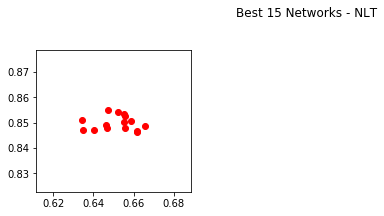

In [39]:
fig=plt.figure(figsize=(10,6))
acc=sortedAccVals[-15:]

ax=[None]*5
fig.subplots_adjust(hspace=.3)
fig.subplots_adjust(wspace=.3)
fig.suptitle('Best 15 Networks - NLT')

ax[0]=fig.add_subplot(231)
plt.scatter(sw[-15:],acc,c='r',label='Generation 0')
plt.scatter(sw100,acc100,label='Generation 100')
plt.ylim([0.8,0.9])
plt.ylabel('NLT')
plt.xlabel('SW')

ax[1]=fig.add_subplot(232)
plt.scatter(mod[-15:],acc,c='r',label='Generation 0')
plt.scatter(mod100,acc100,label='Generation 100')
plt.ylim([0.8,0.9])
plt.xlabel('MOD')

ax[2]=fig.add_subplot(234)
plt.scatter(avgDeg[-15:],acc,c='r',label='Generation 0')
plt.scatter(avgDeg100,acc100,label='Generation 100')
plt.ylim([0.8,0.9])
plt.ylabel('NLT')
plt.xlabel('AVG DEG')
ax[3]=fig.add_subplot(235)
plt.scatter(skewDeg[-15:],acc,c='r',label='Generation 0')
plt.scatter(skewDeg100,acc100,label='Generation 100')
plt.ylim([0.8,0.9])
plt.xlabel('DEG SKEW')

ax[4]=fig.add_subplot(236)
plt.scatter(avgPL[-15:],acc,c='r',label='Generation 0')
plt.scatter(avgPL100,acc100,label='Generation 100')
plt.ylim([0.8,0.9])
plt.xlabel('AVG PL')

plt.legend()
plt.savefig('/import/silo2/aloe8475/Documents/CODE/Data/Figures/Functional Connectivity/NWN Evolution Generation Comparison 100 Gens- NLT',dpi=600)    

([<matplotlib.axis.XTick at 0x7f81f65f3320>,
 <a list of 2 Text xticklabel objects>)

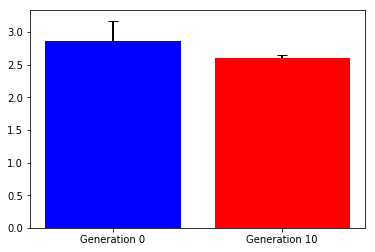

In [276]:
err_kwargs = {'zorder':0,'fmt':'none','linewidth':2,'ecolor':'k','solid_capstyle':'projecting', 'capsize':5}  #for matplotlib >= v1.4 use 'fmt':'none' instead

plt.bar([0,1],[np.mean(avgPL[-15:]),np.mean(avgPL10)],color=['b','r'])
ax[2].errs = plt.errorbar([0,1], [np.mean(avgPL[-15:]),np.mean(avgPL10)], yerr=[np.std(avgPL[-15:]),np.std(avgPL10)], **err_kwargs)
plt.xticks([0,1],('Generation 0','Generation 10'))
